<div><span style="background-color: #9e4244; padding-top: 80px; padding-right: 20px; padding-bottom: 50px; padding-left: 20px; color: white; font-size: 22px; font-weight: bold">Session 8: Machine Learning Pipelines</span></div>

<div class="alert alert-danger alert-info">
     In this notebook you will learn how to automate your machine learning model pipelines. Specifically, the topics covered are as follows:<br>
    <ol>
        <li>Auto-ML</li>
        <li>Grid-search CV/Randomized Search CV</li>
        <li>Example project</li>
    </ol>
</div>

In [51]:
# General Libraries
import re
import time
import warnings
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
from collections import Counter
warnings.filterwarnings("ignore")

# Visualizations
import seaborn as sns
from termcolor import colored
import matplotlib.pyplot as plt
import plotly.graph_objects as go

# Sklearn
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import (train_test_split, GridSearchCV,
                                     StratifiedKFold)
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (RandomForestClassifier,  
                              GradientBoostingClassifier)
from sklearn.ensemble import (AdaBoostClassifier,  
                              ExtraTreesClassifier)
from sklearn.model_selection import cross_validate
from sklearn.metrics import (ConfusionMatrixDisplay,accuracy_score, precision_score, recall_score, f1_score, plot_roc_curve)

#xgboost
import xgboost as xgb

#lightgbm
from lightgbm import LGBMClassifier

#catboost
from catboost import CatBoostClassifier

# Imblearn
from imblearn.pipeline import Pipeline, make_pipeline
from imblearn.over_sampling import (SMOTE, ADASYN, BorderlineSMOTE, SVMSMOTE)
from imblearn.under_sampling import (TomekLinks, NearMiss, AllKNN,
                                     EditedNearestNeighbours, 
                                     RepeatedEditedNearestNeighbours) 
from imblearn.combine import SMOTETomek, SMOTEENN

# SHAP
import shap

In [2]:
df = pd.read_csv('cc_df4.csv')
df.head()

,city_pop,amt,is_fraud,trans_day,age,city_Angeles City,city_Antipolo,city_Bacolod,city_Bacoor,city_Baguio City,...,part_of_day_early evening,part_of_day_early morning,part_of_day_late evening,part_of_day_late morning,part_of_day_midday,age_group_baby boomers,age_group_gen x,age_group_traditionalists,dd_sale_double-digit sale,dd_sale_others
0,105051,825.04,1,13,60,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,1
1,105051,919.50,1,12,60,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,1
2,105051,1131.45,1,13,60,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,1
3,105051,996.26,1,13,60,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,1
4,105051,923.63,1,13,60,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,1


Would Recommend:       0
1    757
0  19659
Proportion Chance Criterion: 92.86%
1.25 * Proportion Chance Criterion: 116.07%


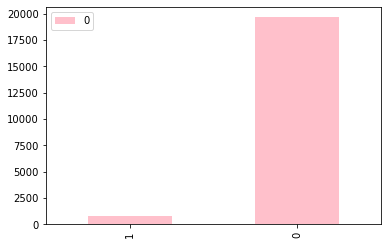

In [3]:
state_counts = Counter(df['is_fraud'])
df_state = pd.DataFrame.from_dict(state_counts, orient='index')
df_state.plot(kind='bar', color='pink')

num=(df_state[0]/df_state[0].sum())**2

print("Would Recommend:{}".format(df_state))

print("Proportion Chance Criterion: {:0.2f}%".format(100*num.sum()))
print("1.25 * Proportion Chance Criterion: {:0.2f}%".format(1.25*100*num.sum()))

In [4]:
X = df.drop(['is_fraud'], axis=1)
y = df['is_fraud']
(X_trainval, X_holdout, y_trainval, y_holdout) = train_test_split(X, y, 
                                                                  random_state=143, test_size=0.25,
                                                                  stratify=y)

<div><span style="background-color: #ff0257; padding-top: 100px; padding-right: 20px; padding-bottom: 50px; padding-left: 20px; color: #FFFAF0; font-size: 18px; font-weight: bold">Auto-ML </span></div>

In [5]:
def auto_ml(X, y, models_dict, scaler=None, cv=None, res_t=None):
    """Apply resampling for imbalanced data"""
    results = {}
    results2 = {}

    # log start time
    total_start = time.time()

    for model_name, model in tqdm(models_dict.items()):
        
        ################# this portion can be edited ###############
        train_scores = []
        val_scores = []

        train_prec = []
        train_rec = []
        train_f1 = []

        val_prec = []
        val_rec = []
        val_f1 = []
        ###########################################################

        for train_index, val_index in tqdm(cv.split(X, y)):

            X_train, X_val = X.iloc[train_index], X.iloc[val_index]
            y_train, y_val = y.iloc[train_index], y.iloc[val_index]

            # Apply scaling
            if scaler is not None:
                X_train = scaler.fit_transform(X_train)
                X_val = scaler.transform(X_val)
            else:
                pass

            # Apply resampling
            if res_t is not None:
                s = time.time()
                X_train, y_train = res_t.fit_resample(X_train, y_train)
                print(f'Resampling done in {time.time() - s}')
            else:
                pass

            start_time = time.time()

            # fit
            model.fit(X_train, y_train)

            # predict
            train_preds = model.predict(X_train)
            val_preds = model.predict(X_val)
            
            ################# this portion can be edited ###############

            # classification accuracy
            train_scores.append(model.score(X_train, y_train))
            val_scores.append(model.score(X_val, y_val))

            #Precision
            train_prec.append(precision_score(y_train, train_preds))
            val_prec.append(precision_score(y_val, val_preds))
            
            #Recall
            train_rec.append(recall_score(y_train, train_preds))
            val_rec.append(recall_score(y_val, val_preds))
            
            # f1
            train_f1.append(f1_score(y_train, train_preds))
            val_f1.append(f1_score(y_val, val_preds))

            end_time = time.time()
            results[model_name] = {
                'Train Accuracy':np.round(np.mean(train_scores) * 100, 2),
                'Val Accuracy':np.round(np.mean(val_scores) * 100, 2),
                'Train f-1 Score':np.round(np.mean(train_f1) * 100, 2),
                'Val f-1 Score':np.round(np.mean(val_f1) * 100, 2),
                'run_time': end_time - start_time
            }
            
            
            results2[model_name] = {
                'Train Accuracy': '{:.2f}%'.format(np.round(np.mean(train_scores)*100, 2)),
                'Val Accuracy': '{:.2f}%'.format(np.round(np.mean(val_scores)*100, 2)),
                'Train f-1 Score': '{:.2f}%'.format(np.round(np.mean(train_f1)*100, 2)),
                'Val f-1 Score': '{:.2f}%'.format(np.round(np.mean(val_f1)*100, 2)),
                'Run Time': end_time - start_time
            }
            
            ###########################################################

    results = pd.DataFrame(results).T
    results2 = pd.DataFrame(results2).T
    return [results, results2]

### Baseline

In [6]:
# models_dict = {'GaussianNB': GaussianNB(),
#               'RandomForestClassifier': RandomForestClassifier(random_state=143)}

models_dict = {
    'LogisticRegressor' : LogisticRegression(),
    'KNeighborsClassifier' : KNeighborsClassifier(),
    'GaussianNB': GaussianNB(),
    'DecisionTreeClassifier': DecisionTreeClassifier(random_state=143),
    'RandomForestClassifier': RandomForestClassifier(random_state=143),
    'GradientBoostingClassifier': GradientBoostingClassifier(random_state=143),
    'AdaBoostClassifier': AdaBoostClassifier(random_state=143),
    'ExtraTreesClassifier' : ExtraTreesClassifier(random_state=143),
    'XGBClassifier' : xgb.XGBClassifier(random_state=143),
    'LGBMClassifier': LGBMClassifier(random_state=143),
    'CatBoostClassifier': CatBoostClassifier(random_state=143),
    
}

In [7]:
auto_run = auto_ml(X_trainval, y_trainval, models_dict, scaler=MinMaxScaler(),
               cv=StratifiedKFold(n_splits=5))
auto = auto_run[0]
auto_run[1]

  0%|          | 0/11 [00:00<?, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

[20:45:40] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:45:42] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:45:43] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:45:44] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old be

0it [00:00, ?it/s]

0it [00:00, ?it/s]

Learning rate set to 0.03003
0:	learn: 0.6086915	total: 158ms	remaining: 2m 38s
1:	learn: 0.5272670	total: 162ms	remaining: 1m 20s
2:	learn: 0.4633434	total: 166ms	remaining: 55.1s
3:	learn: 0.4005328	total: 169ms	remaining: 42s
4:	learn: 0.3506426	total: 172ms	remaining: 34.3s
5:	learn: 0.3051324	total: 176ms	remaining: 29.1s
6:	learn: 0.2640036	total: 179ms	remaining: 25.3s
7:	learn: 0.2301872	total: 182ms	remaining: 22.6s
8:	learn: 0.2004398	total: 187ms	remaining: 20.6s
9:	learn: 0.1748701	total: 191ms	remaining: 18.9s
10:	learn: 0.1530071	total: 195ms	remaining: 17.5s
11:	learn: 0.1347854	total: 198ms	remaining: 16.3s
12:	learn: 0.1203305	total: 203ms	remaining: 15.4s
13:	learn: 0.1061306	total: 206ms	remaining: 14.5s
14:	learn: 0.0941729	total: 210ms	remaining: 13.8s
15:	learn: 0.0840521	total: 214ms	remaining: 13.2s
16:	learn: 0.0754722	total: 218ms	remaining: 12.6s
17:	learn: 0.0678505	total: 222ms	remaining: 12.1s
18:	learn: 0.0612019	total: 225ms	remaining: 11.6s
19:	learn: 0

183:	learn: 0.0051237	total: 910ms	remaining: 4.03s
184:	learn: 0.0050790	total: 914ms	remaining: 4.03s
185:	learn: 0.0050547	total: 919ms	remaining: 4.02s
186:	learn: 0.0050404	total: 923ms	remaining: 4.01s
187:	learn: 0.0050277	total: 928ms	remaining: 4.01s
188:	learn: 0.0050168	total: 932ms	remaining: 4s
189:	learn: 0.0049946	total: 936ms	remaining: 3.99s
190:	learn: 0.0049899	total: 941ms	remaining: 3.98s
191:	learn: 0.0049616	total: 945ms	remaining: 3.98s
192:	learn: 0.0049446	total: 950ms	remaining: 3.97s
193:	learn: 0.0049414	total: 954ms	remaining: 3.96s
194:	learn: 0.0049360	total: 959ms	remaining: 3.96s
195:	learn: 0.0049120	total: 963ms	remaining: 3.95s
196:	learn: 0.0049024	total: 967ms	remaining: 3.94s
197:	learn: 0.0048776	total: 971ms	remaining: 3.93s
198:	learn: 0.0048745	total: 976ms	remaining: 3.93s
199:	learn: 0.0048711	total: 980ms	remaining: 3.92s
200:	learn: 0.0048563	total: 984ms	remaining: 3.91s
201:	learn: 0.0048194	total: 989ms	remaining: 3.91s
202:	learn: 0.0

352:	learn: 0.0032247	total: 1.64s	remaining: 3s
353:	learn: 0.0032175	total: 1.64s	remaining: 3s
354:	learn: 0.0032161	total: 1.65s	remaining: 2.99s
355:	learn: 0.0032147	total: 1.65s	remaining: 2.99s
356:	learn: 0.0032123	total: 1.66s	remaining: 2.98s
357:	learn: 0.0032082	total: 1.66s	remaining: 2.98s
358:	learn: 0.0032043	total: 1.67s	remaining: 2.98s
359:	learn: 0.0031971	total: 1.67s	remaining: 2.97s
360:	learn: 0.0031914	total: 1.68s	remaining: 2.97s
361:	learn: 0.0031895	total: 1.68s	remaining: 2.96s
362:	learn: 0.0031873	total: 1.69s	remaining: 2.96s
363:	learn: 0.0031860	total: 1.69s	remaining: 2.95s
364:	learn: 0.0031830	total: 1.69s	remaining: 2.95s
365:	learn: 0.0031802	total: 1.7s	remaining: 2.94s
366:	learn: 0.0031622	total: 1.7s	remaining: 2.94s
367:	learn: 0.0031609	total: 1.71s	remaining: 2.93s
368:	learn: 0.0031540	total: 1.71s	remaining: 2.93s
369:	learn: 0.0031447	total: 1.72s	remaining: 2.92s
370:	learn: 0.0031391	total: 1.72s	remaining: 2.92s
371:	learn: 0.003136

544:	learn: 0.0025513	total: 2.54s	remaining: 2.12s
545:	learn: 0.0025506	total: 2.54s	remaining: 2.12s
546:	learn: 0.0025469	total: 2.55s	remaining: 2.11s
547:	learn: 0.0025462	total: 2.55s	remaining: 2.11s
548:	learn: 0.0025456	total: 2.56s	remaining: 2.1s
549:	learn: 0.0025450	total: 2.56s	remaining: 2.1s
550:	learn: 0.0025390	total: 2.57s	remaining: 2.09s
551:	learn: 0.0025350	total: 2.57s	remaining: 2.09s
552:	learn: 0.0025314	total: 2.57s	remaining: 2.08s
553:	learn: 0.0025308	total: 2.58s	remaining: 2.08s
554:	learn: 0.0025303	total: 2.58s	remaining: 2.07s
555:	learn: 0.0025020	total: 2.59s	remaining: 2.06s
556:	learn: 0.0024972	total: 2.59s	remaining: 2.06s
557:	learn: 0.0024938	total: 2.6s	remaining: 2.06s
558:	learn: 0.0024932	total: 2.6s	remaining: 2.05s
559:	learn: 0.0024926	total: 2.6s	remaining: 2.04s
560:	learn: 0.0024921	total: 2.61s	remaining: 2.04s
561:	learn: 0.0024916	total: 2.61s	remaining: 2.04s
562:	learn: 0.0024891	total: 2.62s	remaining: 2.03s
563:	learn: 0.002

715:	learn: 0.0020182	total: 3.27s	remaining: 1.29s
716:	learn: 0.0020161	total: 3.27s	remaining: 1.29s
717:	learn: 0.0020100	total: 3.27s	remaining: 1.28s
718:	learn: 0.0020069	total: 3.28s	remaining: 1.28s
719:	learn: 0.0020027	total: 3.28s	remaining: 1.28s
720:	learn: 0.0019991	total: 3.29s	remaining: 1.27s
721:	learn: 0.0019970	total: 3.29s	remaining: 1.27s
722:	learn: 0.0019855	total: 3.29s	remaining: 1.26s
723:	learn: 0.0019800	total: 3.3s	remaining: 1.26s
724:	learn: 0.0019779	total: 3.3s	remaining: 1.25s
725:	learn: 0.0019715	total: 3.31s	remaining: 1.25s
726:	learn: 0.0019658	total: 3.31s	remaining: 1.24s
727:	learn: 0.0019638	total: 3.31s	remaining: 1.24s
728:	learn: 0.0019584	total: 3.32s	remaining: 1.23s
729:	learn: 0.0019567	total: 3.32s	remaining: 1.23s
730:	learn: 0.0019547	total: 3.33s	remaining: 1.22s
731:	learn: 0.0019528	total: 3.33s	remaining: 1.22s
732:	learn: 0.0019476	total: 3.33s	remaining: 1.22s
733:	learn: 0.0019458	total: 3.34s	remaining: 1.21s
734:	learn: 0.

895:	learn: 0.0015653	total: 3.99s	remaining: 464ms
896:	learn: 0.0015637	total: 4s	remaining: 459ms
897:	learn: 0.0015633	total: 4s	remaining: 455ms
898:	learn: 0.0015619	total: 4.01s	remaining: 450ms
899:	learn: 0.0015606	total: 4.01s	remaining: 446ms
900:	learn: 0.0015586	total: 4.01s	remaining: 441ms
901:	learn: 0.0015584	total: 4.02s	remaining: 437ms
902:	learn: 0.0015577	total: 4.02s	remaining: 432ms
903:	learn: 0.0015564	total: 4.03s	remaining: 428ms
904:	learn: 0.0015546	total: 4.03s	remaining: 423ms
905:	learn: 0.0015533	total: 4.04s	remaining: 419ms
906:	learn: 0.0015513	total: 4.04s	remaining: 414ms
907:	learn: 0.0015508	total: 4.04s	remaining: 410ms
908:	learn: 0.0015505	total: 4.05s	remaining: 405ms
909:	learn: 0.0015430	total: 4.05s	remaining: 401ms
910:	learn: 0.0015424	total: 4.05s	remaining: 396ms
911:	learn: 0.0015421	total: 4.06s	remaining: 392ms
912:	learn: 0.0015409	total: 4.06s	remaining: 387ms
913:	learn: 0.0015393	total: 4.07s	remaining: 383ms
914:	learn: 0.0015

81:	learn: 0.0097058	total: 373ms	remaining: 4.18s
82:	learn: 0.0095791	total: 378ms	remaining: 4.17s
83:	learn: 0.0095677	total: 382ms	remaining: 4.17s
84:	learn: 0.0094965	total: 387ms	remaining: 4.16s
85:	learn: 0.0093840	total: 392ms	remaining: 4.16s
86:	learn: 0.0093344	total: 396ms	remaining: 4.16s
87:	learn: 0.0092699	total: 401ms	remaining: 4.16s
88:	learn: 0.0091358	total: 406ms	remaining: 4.15s
89:	learn: 0.0090391	total: 411ms	remaining: 4.15s
90:	learn: 0.0089282	total: 415ms	remaining: 4.14s
91:	learn: 0.0089111	total: 419ms	remaining: 4.14s
92:	learn: 0.0088759	total: 423ms	remaining: 4.13s
93:	learn: 0.0088635	total: 427ms	remaining: 4.12s
94:	learn: 0.0088524	total: 431ms	remaining: 4.11s
95:	learn: 0.0088295	total: 436ms	remaining: 4.1s
96:	learn: 0.0087604	total: 440ms	remaining: 4.09s
97:	learn: 0.0087487	total: 444ms	remaining: 4.09s
98:	learn: 0.0087305	total: 447ms	remaining: 4.07s
99:	learn: 0.0087213	total: 451ms	remaining: 4.06s
100:	learn: 0.0086272	total: 455

247:	learn: 0.0053637	total: 1.1s	remaining: 3.33s
248:	learn: 0.0053616	total: 1.1s	remaining: 3.33s
249:	learn: 0.0053457	total: 1.11s	remaining: 3.33s
250:	learn: 0.0053225	total: 1.11s	remaining: 3.33s
251:	learn: 0.0053171	total: 1.12s	remaining: 3.32s
252:	learn: 0.0052923	total: 1.12s	remaining: 3.32s
253:	learn: 0.0052746	total: 1.13s	remaining: 3.31s
254:	learn: 0.0052715	total: 1.13s	remaining: 3.31s
255:	learn: 0.0052564	total: 1.14s	remaining: 3.31s
256:	learn: 0.0052540	total: 1.14s	remaining: 3.3s
257:	learn: 0.0052476	total: 1.15s	remaining: 3.29s
258:	learn: 0.0052165	total: 1.15s	remaining: 3.29s
259:	learn: 0.0052134	total: 1.15s	remaining: 3.29s
260:	learn: 0.0052111	total: 1.16s	remaining: 3.28s
261:	learn: 0.0052034	total: 1.16s	remaining: 3.28s
262:	learn: 0.0052008	total: 1.17s	remaining: 3.27s
263:	learn: 0.0051963	total: 1.17s	remaining: 3.27s
264:	learn: 0.0051930	total: 1.18s	remaining: 3.26s
265:	learn: 0.0051807	total: 1.18s	remaining: 3.26s
266:	learn: 0.0

411:	learn: 0.0041541	total: 1.82s	remaining: 2.6s
412:	learn: 0.0041521	total: 1.83s	remaining: 2.6s
413:	learn: 0.0041514	total: 1.83s	remaining: 2.6s
414:	learn: 0.0041478	total: 1.84s	remaining: 2.59s
415:	learn: 0.0041447	total: 1.84s	remaining: 2.59s
416:	learn: 0.0041428	total: 1.85s	remaining: 2.58s
417:	learn: 0.0041390	total: 1.85s	remaining: 2.58s
418:	learn: 0.0041360	total: 1.86s	remaining: 2.58s
419:	learn: 0.0041295	total: 1.86s	remaining: 2.57s
420:	learn: 0.0041265	total: 1.87s	remaining: 2.57s
421:	learn: 0.0041254	total: 1.87s	remaining: 2.56s
422:	learn: 0.0041190	total: 1.88s	remaining: 2.56s
423:	learn: 0.0041163	total: 1.88s	remaining: 2.56s
424:	learn: 0.0041152	total: 1.89s	remaining: 2.55s
425:	learn: 0.0041113	total: 1.89s	remaining: 2.55s
426:	learn: 0.0041025	total: 1.9s	remaining: 2.54s
427:	learn: 0.0040953	total: 1.9s	remaining: 2.54s
428:	learn: 0.0040770	total: 1.91s	remaining: 2.54s
429:	learn: 0.0040732	total: 1.91s	remaining: 2.53s
430:	learn: 0.004

574:	learn: 0.0033063	total: 2.55s	remaining: 1.88s
575:	learn: 0.0032959	total: 2.55s	remaining: 1.88s
576:	learn: 0.0032934	total: 2.56s	remaining: 1.88s
577:	learn: 0.0032881	total: 2.56s	remaining: 1.87s
578:	learn: 0.0032826	total: 2.57s	remaining: 1.87s
579:	learn: 0.0032821	total: 2.57s	remaining: 1.86s
580:	learn: 0.0032781	total: 2.58s	remaining: 1.86s
581:	learn: 0.0032775	total: 2.58s	remaining: 1.85s
582:	learn: 0.0032747	total: 2.58s	remaining: 1.85s
583:	learn: 0.0032742	total: 2.59s	remaining: 1.84s
584:	learn: 0.0032671	total: 2.59s	remaining: 1.84s
585:	learn: 0.0032612	total: 2.6s	remaining: 1.83s
586:	learn: 0.0032607	total: 2.6s	remaining: 1.83s
587:	learn: 0.0032580	total: 2.61s	remaining: 1.83s
588:	learn: 0.0032527	total: 2.61s	remaining: 1.82s
589:	learn: 0.0032494	total: 2.62s	remaining: 1.82s
590:	learn: 0.0032469	total: 2.62s	remaining: 1.81s
591:	learn: 0.0032437	total: 2.62s	remaining: 1.81s
592:	learn: 0.0032386	total: 2.63s	remaining: 1.8s
593:	learn: 0.0

736:	learn: 0.0025301	total: 3.27s	remaining: 1.17s
737:	learn: 0.0025293	total: 3.28s	remaining: 1.16s
738:	learn: 0.0025280	total: 3.28s	remaining: 1.16s
739:	learn: 0.0025229	total: 3.29s	remaining: 1.16s
740:	learn: 0.0025218	total: 3.29s	remaining: 1.15s
741:	learn: 0.0025197	total: 3.3s	remaining: 1.15s
742:	learn: 0.0025073	total: 3.3s	remaining: 1.14s
743:	learn: 0.0025064	total: 3.31s	remaining: 1.14s
744:	learn: 0.0025006	total: 3.31s	remaining: 1.13s
745:	learn: 0.0024588	total: 3.32s	remaining: 1.13s
746:	learn: 0.0024575	total: 3.32s	remaining: 1.13s
747:	learn: 0.0024567	total: 3.33s	remaining: 1.12s
748:	learn: 0.0024554	total: 3.33s	remaining: 1.12s
749:	learn: 0.0024507	total: 3.33s	remaining: 1.11s
750:	learn: 0.0024494	total: 3.34s	remaining: 1.11s
751:	learn: 0.0024487	total: 3.34s	remaining: 1.1s
752:	learn: 0.0024432	total: 3.35s	remaining: 1.1s
753:	learn: 0.0024400	total: 3.35s	remaining: 1.09s
754:	learn: 0.0024371	total: 3.36s	remaining: 1.09s
755:	learn: 0.00

906:	learn: 0.0019406	total: 4s	remaining: 410ms
907:	learn: 0.0019383	total: 4s	remaining: 406ms
908:	learn: 0.0019378	total: 4.01s	remaining: 401ms
909:	learn: 0.0019373	total: 4.01s	remaining: 397ms
910:	learn: 0.0019366	total: 4.02s	remaining: 393ms
911:	learn: 0.0019358	total: 4.02s	remaining: 388ms
912:	learn: 0.0019331	total: 4.03s	remaining: 384ms
913:	learn: 0.0019301	total: 4.03s	remaining: 379ms
914:	learn: 0.0019245	total: 4.04s	remaining: 375ms
915:	learn: 0.0019005	total: 4.04s	remaining: 370ms
916:	learn: 0.0019000	total: 4.04s	remaining: 366ms
917:	learn: 0.0018956	total: 4.05s	remaining: 362ms
918:	learn: 0.0018952	total: 4.05s	remaining: 357ms
919:	learn: 0.0018945	total: 4.06s	remaining: 353ms
920:	learn: 0.0018940	total: 4.06s	remaining: 348ms
921:	learn: 0.0018934	total: 4.06s	remaining: 344ms
922:	learn: 0.0018903	total: 4.07s	remaining: 339ms
923:	learn: 0.0018869	total: 4.07s	remaining: 335ms
924:	learn: 0.0018857	total: 4.08s	remaining: 331ms
925:	learn: 0.0018

78:	learn: 0.0113901	total: 363ms	remaining: 4.23s
79:	learn: 0.0110148	total: 368ms	remaining: 4.23s
80:	learn: 0.0110008	total: 373ms	remaining: 4.23s
81:	learn: 0.0108299	total: 378ms	remaining: 4.23s
82:	learn: 0.0107668	total: 383ms	remaining: 4.23s
83:	learn: 0.0105379	total: 388ms	remaining: 4.23s
84:	learn: 0.0103855	total: 392ms	remaining: 4.22s
85:	learn: 0.0102317	total: 397ms	remaining: 4.22s
86:	learn: 0.0102160	total: 402ms	remaining: 4.22s
87:	learn: 0.0100886	total: 406ms	remaining: 4.21s
88:	learn: 0.0099183	total: 411ms	remaining: 4.2s
89:	learn: 0.0098746	total: 415ms	remaining: 4.2s
90:	learn: 0.0098522	total: 419ms	remaining: 4.19s
91:	learn: 0.0098330	total: 424ms	remaining: 4.18s
92:	learn: 0.0098190	total: 428ms	remaining: 4.17s
93:	learn: 0.0097867	total: 433ms	remaining: 4.17s
94:	learn: 0.0097708	total: 437ms	remaining: 4.16s
95:	learn: 0.0097567	total: 441ms	remaining: 4.16s
96:	learn: 0.0097450	total: 446ms	remaining: 4.15s
97:	learn: 0.0097346	total: 450ms

241:	learn: 0.0060546	total: 1.09s	remaining: 3.41s
242:	learn: 0.0060501	total: 1.09s	remaining: 3.4s
243:	learn: 0.0060418	total: 1.1s	remaining: 3.4s
244:	learn: 0.0060042	total: 1.1s	remaining: 3.39s
245:	learn: 0.0059543	total: 1.11s	remaining: 3.39s
246:	learn: 0.0059514	total: 1.11s	remaining: 3.39s
247:	learn: 0.0059488	total: 1.11s	remaining: 3.38s
248:	learn: 0.0059457	total: 1.12s	remaining: 3.38s
249:	learn: 0.0059404	total: 1.12s	remaining: 3.37s
250:	learn: 0.0059179	total: 1.13s	remaining: 3.37s
251:	learn: 0.0058831	total: 1.13s	remaining: 3.36s
252:	learn: 0.0058684	total: 1.14s	remaining: 3.36s
253:	learn: 0.0058552	total: 1.14s	remaining: 3.35s
254:	learn: 0.0058469	total: 1.15s	remaining: 3.35s
255:	learn: 0.0058390	total: 1.15s	remaining: 3.34s
256:	learn: 0.0058280	total: 1.15s	remaining: 3.34s
257:	learn: 0.0058250	total: 1.16s	remaining: 3.33s
258:	learn: 0.0058092	total: 1.16s	remaining: 3.33s
259:	learn: 0.0058034	total: 1.17s	remaining: 3.32s
260:	learn: 0.00

400:	learn: 0.0046282	total: 1.81s	remaining: 2.71s
401:	learn: 0.0046209	total: 1.82s	remaining: 2.7s
402:	learn: 0.0046189	total: 1.82s	remaining: 2.7s
403:	learn: 0.0046086	total: 1.82s	remaining: 2.69s
404:	learn: 0.0046009	total: 1.83s	remaining: 2.69s
405:	learn: 0.0045964	total: 1.83s	remaining: 2.68s
406:	learn: 0.0045934	total: 1.84s	remaining: 2.68s
407:	learn: 0.0045874	total: 1.84s	remaining: 2.67s
408:	learn: 0.0045840	total: 1.85s	remaining: 2.67s
409:	learn: 0.0045782	total: 1.85s	remaining: 2.66s
410:	learn: 0.0045719	total: 1.85s	remaining: 2.66s
411:	learn: 0.0045696	total: 1.86s	remaining: 2.65s
412:	learn: 0.0045664	total: 1.86s	remaining: 2.65s
413:	learn: 0.0045644	total: 1.87s	remaining: 2.64s
414:	learn: 0.0045616	total: 1.87s	remaining: 2.64s
415:	learn: 0.0045544	total: 1.88s	remaining: 2.63s
416:	learn: 0.0045435	total: 1.88s	remaining: 2.63s
417:	learn: 0.0045406	total: 1.88s	remaining: 2.62s
418:	learn: 0.0045392	total: 1.89s	remaining: 2.62s
419:	learn: 0.

562:	learn: 0.0036305	total: 2.54s	remaining: 1.97s
563:	learn: 0.0036278	total: 2.54s	remaining: 1.96s
564:	learn: 0.0036263	total: 2.54s	remaining: 1.96s
565:	learn: 0.0036173	total: 2.55s	remaining: 1.96s
566:	learn: 0.0036156	total: 2.56s	remaining: 1.95s
567:	learn: 0.0036112	total: 2.56s	remaining: 1.95s
568:	learn: 0.0036099	total: 2.56s	remaining: 1.94s
569:	learn: 0.0036054	total: 2.57s	remaining: 1.94s
570:	learn: 0.0036022	total: 2.57s	remaining: 1.93s
571:	learn: 0.0035954	total: 2.58s	remaining: 1.93s
572:	learn: 0.0035887	total: 2.58s	remaining: 1.92s
573:	learn: 0.0035694	total: 2.59s	remaining: 1.92s
574:	learn: 0.0035674	total: 2.59s	remaining: 1.92s
575:	learn: 0.0035658	total: 2.6s	remaining: 1.91s
576:	learn: 0.0035639	total: 2.6s	remaining: 1.91s
577:	learn: 0.0035623	total: 2.6s	remaining: 1.9s
578:	learn: 0.0035598	total: 2.61s	remaining: 1.9s
579:	learn: 0.0035542	total: 2.61s	remaining: 1.89s
580:	learn: 0.0035501	total: 2.62s	remaining: 1.89s
581:	learn: 0.003

735:	learn: 0.0029561	total: 3.27s	remaining: 1.17s
736:	learn: 0.0029539	total: 3.27s	remaining: 1.17s
737:	learn: 0.0029532	total: 3.27s	remaining: 1.16s
738:	learn: 0.0029484	total: 3.28s	remaining: 1.16s
739:	learn: 0.0029458	total: 3.28s	remaining: 1.15s
740:	learn: 0.0029449	total: 3.29s	remaining: 1.15s
741:	learn: 0.0029446	total: 3.29s	remaining: 1.15s
742:	learn: 0.0029424	total: 3.3s	remaining: 1.14s
743:	learn: 0.0029422	total: 3.3s	remaining: 1.14s
744:	learn: 0.0029378	total: 3.31s	remaining: 1.13s
745:	learn: 0.0029375	total: 3.31s	remaining: 1.13s
746:	learn: 0.0029353	total: 3.32s	remaining: 1.12s
747:	learn: 0.0029308	total: 3.32s	remaining: 1.12s
748:	learn: 0.0029269	total: 3.33s	remaining: 1.11s
749:	learn: 0.0029263	total: 3.33s	remaining: 1.11s
750:	learn: 0.0029221	total: 3.33s	remaining: 1.1s
751:	learn: 0.0029211	total: 3.34s	remaining: 1.1s
752:	learn: 0.0029103	total: 3.34s	remaining: 1.1s
753:	learn: 0.0029096	total: 3.35s	remaining: 1.09s
754:	learn: 0.002

901:	learn: 0.0024408	total: 3.99s	remaining: 433ms
902:	learn: 0.0024370	total: 3.99s	remaining: 429ms
903:	learn: 0.0024104	total: 4s	remaining: 425ms
904:	learn: 0.0024100	total: 4s	remaining: 420ms
905:	learn: 0.0024093	total: 4.01s	remaining: 416ms
906:	learn: 0.0024086	total: 4.01s	remaining: 411ms
907:	learn: 0.0024079	total: 4.02s	remaining: 407ms
908:	learn: 0.0024075	total: 4.02s	remaining: 403ms
909:	learn: 0.0024023	total: 4.02s	remaining: 398ms
910:	learn: 0.0024019	total: 4.03s	remaining: 394ms
911:	learn: 0.0023989	total: 4.03s	remaining: 389ms
912:	learn: 0.0023985	total: 4.04s	remaining: 385ms
913:	learn: 0.0023978	total: 4.04s	remaining: 380ms
914:	learn: 0.0023972	total: 4.04s	remaining: 376ms
915:	learn: 0.0023927	total: 4.05s	remaining: 371ms
916:	learn: 0.0023889	total: 4.05s	remaining: 367ms
917:	learn: 0.0023641	total: 4.06s	remaining: 363ms
918:	learn: 0.0023638	total: 4.06s	remaining: 358ms
919:	learn: 0.0023632	total: 4.07s	remaining: 354ms
920:	learn: 0.0023

84:	learn: 0.0093443	total: 366ms	remaining: 3.94s
85:	learn: 0.0092304	total: 370ms	remaining: 3.93s
86:	learn: 0.0091462	total: 374ms	remaining: 3.93s
87:	learn: 0.0091323	total: 379ms	remaining: 3.92s
88:	learn: 0.0090747	total: 383ms	remaining: 3.92s
89:	learn: 0.0090248	total: 388ms	remaining: 3.92s
90:	learn: 0.0089491	total: 392ms	remaining: 3.92s
91:	learn: 0.0088722	total: 397ms	remaining: 3.92s
92:	learn: 0.0087800	total: 401ms	remaining: 3.91s
93:	learn: 0.0087225	total: 406ms	remaining: 3.91s
94:	learn: 0.0087007	total: 411ms	remaining: 3.91s
95:	learn: 0.0086506	total: 415ms	remaining: 3.91s
96:	learn: 0.0085901	total: 420ms	remaining: 3.91s
97:	learn: 0.0085233	total: 424ms	remaining: 3.9s
98:	learn: 0.0084830	total: 429ms	remaining: 3.9s
99:	learn: 0.0084150	total: 433ms	remaining: 3.9s
100:	learn: 0.0083648	total: 437ms	remaining: 3.89s
101:	learn: 0.0083204	total: 441ms	remaining: 3.89s
102:	learn: 0.0082901	total: 446ms	remaining: 3.88s
103:	learn: 0.0082681	total: 45

252:	learn: 0.0049567	total: 1.09s	remaining: 3.22s
253:	learn: 0.0049413	total: 1.1s	remaining: 3.22s
254:	learn: 0.0049181	total: 1.1s	remaining: 3.22s
255:	learn: 0.0049132	total: 1.1s	remaining: 3.21s
256:	learn: 0.0048991	total: 1.11s	remaining: 3.21s
257:	learn: 0.0048844	total: 1.11s	remaining: 3.21s
258:	learn: 0.0048822	total: 1.12s	remaining: 3.2s
259:	learn: 0.0048512	total: 1.12s	remaining: 3.2s
260:	learn: 0.0048226	total: 1.13s	remaining: 3.19s
261:	learn: 0.0048159	total: 1.13s	remaining: 3.19s
262:	learn: 0.0047799	total: 1.14s	remaining: 3.18s
263:	learn: 0.0047597	total: 1.14s	remaining: 3.18s
264:	learn: 0.0047483	total: 1.14s	remaining: 3.17s
265:	learn: 0.0047394	total: 1.15s	remaining: 3.17s
266:	learn: 0.0047233	total: 1.15s	remaining: 3.17s
267:	learn: 0.0047161	total: 1.16s	remaining: 3.16s
268:	learn: 0.0047084	total: 1.16s	remaining: 3.15s
269:	learn: 0.0046956	total: 1.17s	remaining: 3.15s
270:	learn: 0.0046820	total: 1.17s	remaining: 3.15s
271:	learn: 0.004

423:	learn: 0.0035262	total: 1.82s	remaining: 2.47s
424:	learn: 0.0035186	total: 1.82s	remaining: 2.47s
425:	learn: 0.0035171	total: 1.83s	remaining: 2.46s
426:	learn: 0.0035127	total: 1.83s	remaining: 2.46s
427:	learn: 0.0035065	total: 1.84s	remaining: 2.46s
428:	learn: 0.0035005	total: 1.84s	remaining: 2.45s
429:	learn: 0.0034933	total: 1.85s	remaining: 2.45s
430:	learn: 0.0034870	total: 1.85s	remaining: 2.44s
431:	learn: 0.0034624	total: 1.86s	remaining: 2.44s
432:	learn: 0.0034601	total: 1.86s	remaining: 2.44s
433:	learn: 0.0034496	total: 1.86s	remaining: 2.43s
434:	learn: 0.0034479	total: 1.87s	remaining: 2.43s
435:	learn: 0.0034467	total: 1.87s	remaining: 2.42s
436:	learn: 0.0034456	total: 1.88s	remaining: 2.42s
437:	learn: 0.0034395	total: 1.88s	remaining: 2.42s
438:	learn: 0.0034368	total: 1.89s	remaining: 2.41s
439:	learn: 0.0034355	total: 1.89s	remaining: 2.41s
440:	learn: 0.0034329	total: 1.9s	remaining: 2.4s
441:	learn: 0.0034317	total: 1.9s	remaining: 2.4s
442:	learn: 0.00

585:	learn: 0.0029063	total: 2.56s	remaining: 1.81s
586:	learn: 0.0029026	total: 2.56s	remaining: 1.8s
587:	learn: 0.0029016	total: 2.57s	remaining: 1.8s
588:	learn: 0.0028991	total: 2.57s	remaining: 1.79s
589:	learn: 0.0028984	total: 2.58s	remaining: 1.79s
590:	learn: 0.0028978	total: 2.58s	remaining: 1.78s
591:	learn: 0.0028948	total: 2.58s	remaining: 1.78s
592:	learn: 0.0028923	total: 2.59s	remaining: 1.78s
593:	learn: 0.0028917	total: 2.59s	remaining: 1.77s
594:	learn: 0.0028910	total: 2.6s	remaining: 1.77s
595:	learn: 0.0028850	total: 2.6s	remaining: 1.76s
596:	learn: 0.0028844	total: 2.61s	remaining: 1.76s
597:	learn: 0.0028841	total: 2.61s	remaining: 1.75s
598:	learn: 0.0028804	total: 2.61s	remaining: 1.75s
599:	learn: 0.0028800	total: 2.62s	remaining: 1.75s
600:	learn: 0.0028797	total: 2.62s	remaining: 1.74s
601:	learn: 0.0028742	total: 2.63s	remaining: 1.74s
602:	learn: 0.0028707	total: 2.63s	remaining: 1.73s
603:	learn: 0.0028653	total: 2.63s	remaining: 1.73s
604:	learn: 0.00

744:	learn: 0.0023198	total: 3.29s	remaining: 1.13s
745:	learn: 0.0023161	total: 3.29s	remaining: 1.12s
746:	learn: 0.0023131	total: 3.29s	remaining: 1.12s
747:	learn: 0.0023100	total: 3.3s	remaining: 1.11s
748:	learn: 0.0023084	total: 3.3s	remaining: 1.11s
749:	learn: 0.0023054	total: 3.31s	remaining: 1.1s
750:	learn: 0.0023025	total: 3.31s	remaining: 1.1s
751:	learn: 0.0022997	total: 3.32s	remaining: 1.09s
752:	learn: 0.0022968	total: 3.32s	remaining: 1.09s
753:	learn: 0.0022881	total: 3.33s	remaining: 1.08s
754:	learn: 0.0022854	total: 3.33s	remaining: 1.08s
755:	learn: 0.0022816	total: 3.33s	remaining: 1.08s
756:	learn: 0.0022794	total: 3.34s	remaining: 1.07s
757:	learn: 0.0022778	total: 3.34s	remaining: 1.07s
758:	learn: 0.0022740	total: 3.35s	remaining: 1.06s
759:	learn: 0.0022669	total: 3.35s	remaining: 1.06s
760:	learn: 0.0022660	total: 3.36s	remaining: 1.05s
761:	learn: 0.0022628	total: 3.36s	remaining: 1.05s
762:	learn: 0.0022619	total: 3.37s	remaining: 1.04s
763:	learn: 0.00

907:	learn: 0.0018206	total: 4.01s	remaining: 406ms
908:	learn: 0.0018181	total: 4.02s	remaining: 402ms
909:	learn: 0.0018176	total: 4.02s	remaining: 398ms
910:	learn: 0.0018171	total: 4.03s	remaining: 393ms
911:	learn: 0.0017973	total: 4.03s	remaining: 389ms
912:	learn: 0.0017957	total: 4.03s	remaining: 384ms
913:	learn: 0.0017933	total: 4.04s	remaining: 380ms
914:	learn: 0.0017917	total: 4.04s	remaining: 376ms
915:	learn: 0.0017882	total: 4.05s	remaining: 371ms
916:	learn: 0.0017851	total: 4.05s	remaining: 367ms
917:	learn: 0.0017831	total: 4.06s	remaining: 362ms
918:	learn: 0.0017818	total: 4.06s	remaining: 358ms
919:	learn: 0.0017802	total: 4.07s	remaining: 353ms
920:	learn: 0.0017776	total: 4.07s	remaining: 349ms
921:	learn: 0.0017766	total: 4.07s	remaining: 345ms
922:	learn: 0.0017751	total: 4.08s	remaining: 340ms
923:	learn: 0.0017747	total: 4.08s	remaining: 336ms
924:	learn: 0.0017729	total: 4.09s	remaining: 331ms
925:	learn: 0.0017716	total: 4.09s	remaining: 327ms
926:	learn: 

75:	learn: 0.0096954	total: 355ms	remaining: 4.31s
76:	learn: 0.0096682	total: 360ms	remaining: 4.31s
77:	learn: 0.0096510	total: 364ms	remaining: 4.31s
78:	learn: 0.0095164	total: 370ms	remaining: 4.31s
79:	learn: 0.0094508	total: 374ms	remaining: 4.31s
80:	learn: 0.0094354	total: 379ms	remaining: 4.3s
81:	learn: 0.0093014	total: 384ms	remaining: 4.29s
82:	learn: 0.0090988	total: 389ms	remaining: 4.29s
83:	learn: 0.0090863	total: 393ms	remaining: 4.29s
84:	learn: 0.0090480	total: 398ms	remaining: 4.28s
85:	learn: 0.0089885	total: 403ms	remaining: 4.28s
86:	learn: 0.0088606	total: 408ms	remaining: 4.28s
87:	learn: 0.0088409	total: 412ms	remaining: 4.27s
88:	learn: 0.0087275	total: 417ms	remaining: 4.27s
89:	learn: 0.0087168	total: 422ms	remaining: 4.26s
90:	learn: 0.0086897	total: 427ms	remaining: 4.26s
91:	learn: 0.0085254	total: 431ms	remaining: 4.26s
92:	learn: 0.0084947	total: 436ms	remaining: 4.25s
93:	learn: 0.0084866	total: 441ms	remaining: 4.25s
94:	learn: 0.0083655	total: 446m

268:	learn: 0.0049648	total: 1.26s	remaining: 3.43s
269:	learn: 0.0049592	total: 1.27s	remaining: 3.42s
270:	learn: 0.0049535	total: 1.27s	remaining: 3.42s
271:	learn: 0.0049488	total: 1.28s	remaining: 3.42s
272:	learn: 0.0049265	total: 1.28s	remaining: 3.41s
273:	learn: 0.0049065	total: 1.29s	remaining: 3.41s
274:	learn: 0.0049040	total: 1.29s	remaining: 3.4s
275:	learn: 0.0049000	total: 1.29s	remaining: 3.4s
276:	learn: 0.0048955	total: 1.3s	remaining: 3.39s
277:	learn: 0.0048873	total: 1.3s	remaining: 3.39s
278:	learn: 0.0048666	total: 1.31s	remaining: 3.38s
279:	learn: 0.0048498	total: 1.31s	remaining: 3.38s
280:	learn: 0.0048467	total: 1.32s	remaining: 3.38s
281:	learn: 0.0048318	total: 1.32s	remaining: 3.37s
282:	learn: 0.0048152	total: 1.33s	remaining: 3.37s
283:	learn: 0.0048109	total: 1.33s	remaining: 3.37s
284:	learn: 0.0048003	total: 1.34s	remaining: 3.36s
285:	learn: 0.0047956	total: 1.35s	remaining: 3.36s
286:	learn: 0.0047935	total: 1.35s	remaining: 3.36s
287:	learn: 0.00

465:	learn: 0.0035610	total: 2.17s	remaining: 2.48s
466:	learn: 0.0035568	total: 2.17s	remaining: 2.48s
467:	learn: 0.0035538	total: 2.17s	remaining: 2.47s
468:	learn: 0.0035529	total: 2.18s	remaining: 2.47s
469:	learn: 0.0035088	total: 2.18s	remaining: 2.46s
470:	learn: 0.0034992	total: 2.19s	remaining: 2.46s
471:	learn: 0.0034952	total: 2.19s	remaining: 2.45s
472:	learn: 0.0034854	total: 2.2s	remaining: 2.45s
473:	learn: 0.0034820	total: 2.2s	remaining: 2.44s
474:	learn: 0.0034783	total: 2.21s	remaining: 2.44s
475:	learn: 0.0034753	total: 2.21s	remaining: 2.43s
476:	learn: 0.0034627	total: 2.21s	remaining: 2.43s
477:	learn: 0.0034598	total: 2.22s	remaining: 2.42s
478:	learn: 0.0034504	total: 2.22s	remaining: 2.42s
479:	learn: 0.0034473	total: 2.23s	remaining: 2.41s
480:	learn: 0.0034445	total: 2.23s	remaining: 2.41s
481:	learn: 0.0034417	total: 2.24s	remaining: 2.4s
482:	learn: 0.0034387	total: 2.24s	remaining: 2.4s
483:	learn: 0.0034314	total: 2.24s	remaining: 2.39s
484:	learn: 0.00

631:	learn: 0.0025870	total: 2.89s	remaining: 1.68s
632:	learn: 0.0025852	total: 2.9s	remaining: 1.68s
633:	learn: 0.0025790	total: 2.9s	remaining: 1.67s
634:	learn: 0.0025768	total: 2.9s	remaining: 1.67s
635:	learn: 0.0025742	total: 2.91s	remaining: 1.67s
636:	learn: 0.0025707	total: 2.91s	remaining: 1.66s
637:	learn: 0.0025682	total: 2.92s	remaining: 1.66s
638:	learn: 0.0025670	total: 2.92s	remaining: 1.65s
639:	learn: 0.0025664	total: 2.93s	remaining: 1.65s
640:	learn: 0.0025646	total: 2.93s	remaining: 1.64s
641:	learn: 0.0025579	total: 2.94s	remaining: 1.64s
642:	learn: 0.0025539	total: 2.94s	remaining: 1.63s
643:	learn: 0.0025522	total: 2.95s	remaining: 1.63s
644:	learn: 0.0025515	total: 2.95s	remaining: 1.62s
645:	learn: 0.0025482	total: 2.96s	remaining: 1.62s
646:	learn: 0.0025460	total: 2.96s	remaining: 1.61s
647:	learn: 0.0025439	total: 2.97s	remaining: 1.61s
648:	learn: 0.0025433	total: 2.97s	remaining: 1.61s
649:	learn: 0.0025369	total: 2.98s	remaining: 1.6s
650:	learn: 0.00

792:	learn: 0.0020650	total: 3.62s	remaining: 944ms
793:	learn: 0.0020608	total: 3.62s	remaining: 939ms
794:	learn: 0.0020589	total: 3.62s	remaining: 934ms
795:	learn: 0.0020544	total: 3.63s	remaining: 930ms
796:	learn: 0.0020532	total: 3.63s	remaining: 925ms
797:	learn: 0.0020529	total: 3.63s	remaining: 920ms
798:	learn: 0.0020518	total: 3.64s	remaining: 916ms
799:	learn: 0.0020507	total: 3.64s	remaining: 911ms
800:	learn: 0.0020308	total: 3.65s	remaining: 906ms
801:	learn: 0.0020308	total: 3.65s	remaining: 901ms
802:	learn: 0.0020295	total: 3.65s	remaining: 897ms
803:	learn: 0.0020291	total: 3.66s	remaining: 892ms
804:	learn: 0.0020278	total: 3.66s	remaining: 887ms
805:	learn: 0.0020246	total: 3.67s	remaining: 882ms
806:	learn: 0.0020180	total: 3.67s	remaining: 878ms
807:	learn: 0.0020061	total: 3.67s	remaining: 873ms
808:	learn: 0.0020059	total: 3.68s	remaining: 868ms
809:	learn: 0.0019996	total: 3.68s	remaining: 864ms
810:	learn: 0.0019977	total: 3.69s	remaining: 859ms
811:	learn: 

974:	learn: 0.0015782	total: 4.34s	remaining: 111ms
975:	learn: 0.0015770	total: 4.35s	remaining: 107ms
976:	learn: 0.0015759	total: 4.35s	remaining: 102ms
977:	learn: 0.0015748	total: 4.36s	remaining: 98ms
978:	learn: 0.0015743	total: 4.36s	remaining: 93.6ms
979:	learn: 0.0015721	total: 4.37s	remaining: 89.1ms
980:	learn: 0.0015716	total: 4.37s	remaining: 84.6ms
981:	learn: 0.0015705	total: 4.37s	remaining: 80.2ms
982:	learn: 0.0015696	total: 4.38s	remaining: 75.7ms
983:	learn: 0.0015688	total: 4.38s	remaining: 71.3ms
984:	learn: 0.0015566	total: 4.39s	remaining: 66.8ms
985:	learn: 0.0015566	total: 4.39s	remaining: 62.3ms
986:	learn: 0.0015564	total: 4.39s	remaining: 57.9ms
987:	learn: 0.0015553	total: 4.4s	remaining: 53.5ms
988:	learn: 0.0015551	total: 4.41s	remaining: 49ms
989:	learn: 0.0015542	total: 4.41s	remaining: 44.5ms
990:	learn: 0.0015507	total: 4.41s	remaining: 40.1ms
991:	learn: 0.0015499	total: 4.42s	remaining: 35.6ms
992:	learn: 0.0015488	total: 4.42s	remaining: 31.2ms
9

,Train Accuracy,Val Accuracy,Train f-1 Score,Val f-1 Score,Run Time
LogisticRegressor,99.45%,99.16%,92.13%,87.70%,0.26806
KNeighborsClassifier,98.84%,97.88%,81.58%,60.60%,2.298251
GaussianNB,98.76%,98.67%,80.00%,78.17%,0.134058
DecisionTreeClassifier,100.00%,99.54%,100.00%,93.82%,0.229984
RandomForestClassifier,100.00%,99.69%,100.00%,95.77%,1.322526
GradientBoostingClassifier,99.84%,99.66%,97.84%,95.41%,3.725234
AdaBoostClassifier,99.78%,99.67%,97.10%,95.60%,2.254942
ExtraTreesClassifier,100.00%,99.58%,100.00%,94.05%,1.719982
XGBClassifier,100.00%,99.80%,100.00%,97.39%,1.303249
LGBMClassifier,100.00%,99.78%,100.00%,97.15%,0.18104


In [8]:
auto_run[0]

,Train Accuracy,Val Accuracy,Train f-1 Score,Val f-1 Score,run_time
LogisticRegressor,99.45,99.16,92.13,87.70,0.268060
KNeighborsClassifier,98.84,97.88,81.58,60.60,2.298251
GaussianNB,98.76,98.67,80.00,78.17,0.134058
DecisionTreeClassifier,100.00,99.54,100.00,93.82,0.229984
RandomForestClassifier,100.00,99.69,100.00,95.77,1.322526
GradientBoostingClassifier,99.84,99.66,97.84,95.41,3.725234
AdaBoostClassifier,99.78,99.67,97.10,95.60,2.254942
ExtraTreesClassifier,100.00,99.58,100.00,94.05,1.719982
XGBClassifier,100.00,99.80,100.00,97.39,1.303249
LGBMClassifier,100.00,99.78,100.00,97.15,0.181040


# Applying resampling techniques

#### Oversampling

In [9]:
res_list1 = [('ADASYN', ADASYN())]
        

outputs = []
for title, res in res_list1:
    print(colored(title, 'red', attrs=['bold']).center(120, "-"))
    var = auto_ml(X_trainval, y_trainval, models_dict, scaler=MinMaxScaler(),
                    cv=StratifiedKFold(n_splits=5), res_t=res)
    outputs.append(var[0])
    display(var[1])

--------------------------------------------------ADASYN---------------------------------------------------


  0%|          | 0/11 [00:00<?, ?it/s]

0it [00:00, ?it/s]

Resampling done in 0.17303800582885742
Resampling done in 0.18004083633422852
Resampling done in 0.17703962326049805
Resampling done in 0.17103838920593262
Resampling done in 0.176039457321167


0it [00:00, ?it/s]

Resampling done in 0.1600358486175537
Resampling done in 0.17655158042907715
Resampling done in 0.16803836822509766
Resampling done in 0.1923973560333252
Resampling done in 0.17503714561462402


0it [00:00, ?it/s]

Resampling done in 0.1870408058166504
Resampling done in 0.17955303192138672
Resampling done in 0.17904067039489746
Resampling done in 0.17924070358276367
Resampling done in 0.17589282989501953


0it [00:00, ?it/s]

Resampling done in 0.18104076385498047
Resampling done in 0.17303895950317383
Resampling done in 0.17233538627624512
Resampling done in 0.1795492172241211
Resampling done in 0.1740400791168213


0it [00:00, ?it/s]

Resampling done in 0.18604183197021484
Resampling done in 0.18604063987731934
Resampling done in 0.1967628002166748
Resampling done in 0.19104266166687012
Resampling done in 0.20204472541809082


0it [00:00, ?it/s]

Resampling done in 0.20381569862365723
Resampling done in 0.18604207038879395
Resampling done in 0.2546877861022949
Resampling done in 0.1960442066192627
Resampling done in 0.19504404067993164


0it [00:00, ?it/s]

Resampling done in 0.19404315948486328
Resampling done in 0.20205187797546387
Resampling done in 0.2083427906036377
Resampling done in 0.19699811935424805
Resampling done in 0.19446992874145508


0it [00:00, ?it/s]

Resampling done in 0.1972060203552246
Resampling done in 0.1960442066192627
Resampling done in 0.19504427909851074
Resampling done in 0.20404624938964844
Resampling done in 0.21024703979492188


0it [00:00, ?it/s]

Resampling done in 0.19004082679748535
[20:49:47] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Resampling done in 0.2185688018798828
[20:49:52] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Resampling done in 0.25005483627319336
[20:49:57] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Resampling done in 0.23305225372314453
[20:50:02] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evalua

0it [00:00, ?it/s]

Resampling done in 0.220961332321167
Resampling done in 0.23105287551879883
Resampling done in 0.23205113410949707
Resampling done in 0.23916339874267578
Resampling done in 0.23322558403015137


0it [00:00, ?it/s]

Resampling done in 0.2320544719696045
Learning rate set to 0.039715
0:	learn: 0.5879489	total: 60.2ms	remaining: 1m
1:	learn: 0.5038581	total: 74.8ms	remaining: 37.3s
2:	learn: 0.4456586	total: 92.3ms	remaining: 30.7s
3:	learn: 0.3815626	total: 109ms	remaining: 27.2s
4:	learn: 0.3295847	total: 126ms	remaining: 25.1s
5:	learn: 0.2839958	total: 144ms	remaining: 23.9s
6:	learn: 0.2427522	total: 162ms	remaining: 23s
7:	learn: 0.2115107	total: 180ms	remaining: 22.4s
8:	learn: 0.1826515	total: 198ms	remaining: 21.9s
9:	learn: 0.1611781	total: 217ms	remaining: 21.4s
10:	learn: 0.1340688	total: 235ms	remaining: 21.1s
11:	learn: 0.1198007	total: 252ms	remaining: 20.7s
12:	learn: 0.1068007	total: 272ms	remaining: 20.6s
13:	learn: 0.0931241	total: 289ms	remaining: 20.4s
14:	learn: 0.0833801	total: 307ms	remaining: 20.1s
15:	learn: 0.0751140	total: 324ms	remaining: 19.9s
16:	learn: 0.0697540	total: 343ms	remaining: 19.8s
17:	learn: 0.0639474	total: 373ms	remaining: 20.3s
18:	learn: 0.0600675	total

162:	learn: 0.0065868	total: 3.06s	remaining: 15.7s
163:	learn: 0.0065421	total: 3.08s	remaining: 15.7s
164:	learn: 0.0064977	total: 3.1s	remaining: 15.7s
165:	learn: 0.0064220	total: 3.12s	remaining: 15.7s
166:	learn: 0.0063866	total: 3.14s	remaining: 15.7s
167:	learn: 0.0063786	total: 3.16s	remaining: 15.6s
168:	learn: 0.0063550	total: 3.18s	remaining: 15.6s
169:	learn: 0.0063395	total: 3.2s	remaining: 15.6s
170:	learn: 0.0063395	total: 3.22s	remaining: 15.6s
171:	learn: 0.0063309	total: 3.24s	remaining: 15.6s
172:	learn: 0.0063265	total: 3.26s	remaining: 15.6s
173:	learn: 0.0063066	total: 3.28s	remaining: 15.6s
174:	learn: 0.0062998	total: 3.3s	remaining: 15.5s
175:	learn: 0.0062930	total: 3.32s	remaining: 15.5s
176:	learn: 0.0061998	total: 3.34s	remaining: 15.5s
177:	learn: 0.0061998	total: 3.35s	remaining: 15.5s
178:	learn: 0.0061865	total: 3.38s	remaining: 15.5s
179:	learn: 0.0061487	total: 3.4s	remaining: 15.5s
180:	learn: 0.0060942	total: 3.42s	remaining: 15.5s
181:	learn: 0.00

332:	learn: 0.0042730	total: 6.11s	remaining: 12.2s
333:	learn: 0.0042730	total: 6.13s	remaining: 12.2s
334:	learn: 0.0042730	total: 6.14s	remaining: 12.2s
335:	learn: 0.0042730	total: 6.16s	remaining: 12.2s
336:	learn: 0.0042730	total: 6.17s	remaining: 12.1s
337:	learn: 0.0042730	total: 6.19s	remaining: 12.1s
338:	learn: 0.0042730	total: 6.21s	remaining: 12.1s
339:	learn: 0.0042730	total: 6.23s	remaining: 12.1s
340:	learn: 0.0042730	total: 6.24s	remaining: 12.1s
341:	learn: 0.0042730	total: 6.26s	remaining: 12s
342:	learn: 0.0042730	total: 6.27s	remaining: 12s
343:	learn: 0.0042730	total: 6.29s	remaining: 12s
344:	learn: 0.0042730	total: 6.3s	remaining: 12s
345:	learn: 0.0042730	total: 6.32s	remaining: 11.9s
346:	learn: 0.0042730	total: 6.34s	remaining: 11.9s
347:	learn: 0.0042730	total: 6.35s	remaining: 11.9s
348:	learn: 0.0042730	total: 6.37s	remaining: 11.9s
349:	learn: 0.0042730	total: 6.38s	remaining: 11.9s
350:	learn: 0.0042730	total: 6.4s	remaining: 11.8s
351:	learn: 0.0042730	

495:	learn: 0.0041562	total: 8.96s	remaining: 9.11s
496:	learn: 0.0041562	total: 8.98s	remaining: 9.09s
497:	learn: 0.0041562	total: 9s	remaining: 9.07s
498:	learn: 0.0041562	total: 9.01s	remaining: 9.05s
499:	learn: 0.0041562	total: 9.03s	remaining: 9.03s
500:	learn: 0.0041562	total: 9.04s	remaining: 9.01s
501:	learn: 0.0041562	total: 9.06s	remaining: 8.98s
502:	learn: 0.0041561	total: 9.07s	remaining: 8.96s
503:	learn: 0.0041324	total: 9.09s	remaining: 8.95s
504:	learn: 0.0041324	total: 9.1s	remaining: 8.92s
505:	learn: 0.0041324	total: 9.12s	remaining: 8.9s
506:	learn: 0.0041324	total: 9.13s	remaining: 8.88s
507:	learn: 0.0041324	total: 9.15s	remaining: 8.86s
508:	learn: 0.0041324	total: 9.16s	remaining: 8.84s
509:	learn: 0.0041324	total: 9.18s	remaining: 8.82s
510:	learn: 0.0041324	total: 9.2s	remaining: 8.8s
511:	learn: 0.0041324	total: 9.21s	remaining: 8.78s
512:	learn: 0.0041324	total: 9.23s	remaining: 8.76s
513:	learn: 0.0041324	total: 9.24s	remaining: 8.74s
514:	learn: 0.00413

654:	learn: 0.0039499	total: 11.6s	remaining: 6.11s
655:	learn: 0.0039499	total: 11.6s	remaining: 6.09s
656:	learn: 0.0039499	total: 11.6s	remaining: 6.07s
657:	learn: 0.0039499	total: 11.7s	remaining: 6.05s
658:	learn: 0.0039499	total: 11.7s	remaining: 6.04s
659:	learn: 0.0039499	total: 11.7s	remaining: 6.02s
660:	learn: 0.0039499	total: 11.7s	remaining: 6s
661:	learn: 0.0039499	total: 11.7s	remaining: 5.98s
662:	learn: 0.0039499	total: 11.7s	remaining: 5.96s
663:	learn: 0.0039499	total: 11.8s	remaining: 5.95s
664:	learn: 0.0039499	total: 11.8s	remaining: 5.93s
665:	learn: 0.0039499	total: 11.8s	remaining: 5.91s
666:	learn: 0.0039499	total: 11.8s	remaining: 5.89s
667:	learn: 0.0039499	total: 11.8s	remaining: 5.88s
668:	learn: 0.0039499	total: 11.8s	remaining: 5.86s
669:	learn: 0.0039499	total: 11.9s	remaining: 5.84s
670:	learn: 0.0039498	total: 11.9s	remaining: 5.83s
671:	learn: 0.0039499	total: 11.9s	remaining: 5.81s
672:	learn: 0.0039498	total: 11.9s	remaining: 5.79s
673:	learn: 0.0

823:	learn: 0.0039088	total: 14.4s	remaining: 3.08s
824:	learn: 0.0039088	total: 14.5s	remaining: 3.07s
825:	learn: 0.0039088	total: 14.5s	remaining: 3.05s
826:	learn: 0.0039088	total: 14.5s	remaining: 3.03s
827:	learn: 0.0039088	total: 14.5s	remaining: 3.01s
828:	learn: 0.0039088	total: 14.5s	remaining: 2.99s
829:	learn: 0.0039088	total: 14.5s	remaining: 2.98s
830:	learn: 0.0039088	total: 14.5s	remaining: 2.96s
831:	learn: 0.0039088	total: 14.6s	remaining: 2.94s
832:	learn: 0.0039088	total: 14.6s	remaining: 2.92s
833:	learn: 0.0039088	total: 14.6s	remaining: 2.9s
834:	learn: 0.0039088	total: 14.6s	remaining: 2.89s
835:	learn: 0.0039088	total: 14.6s	remaining: 2.87s
836:	learn: 0.0039088	total: 14.6s	remaining: 2.85s
837:	learn: 0.0039087	total: 14.7s	remaining: 2.83s
838:	learn: 0.0039087	total: 14.7s	remaining: 2.81s
839:	learn: 0.0039087	total: 14.7s	remaining: 2.8s
840:	learn: 0.0039087	total: 14.7s	remaining: 2.78s
841:	learn: 0.0039087	total: 14.7s	remaining: 2.76s
842:	learn: 0.

993:	learn: 0.0038884	total: 17.3s	remaining: 104ms
994:	learn: 0.0038884	total: 17.3s	remaining: 86.9ms
995:	learn: 0.0038884	total: 17.3s	remaining: 69.5ms
996:	learn: 0.0038884	total: 17.3s	remaining: 52.1ms
997:	learn: 0.0038884	total: 17.3s	remaining: 34.7ms
998:	learn: 0.0038884	total: 17.3s	remaining: 17.4ms
999:	learn: 0.0038884	total: 17.4s	remaining: 0us
Resampling done in 0.19754910469055176
Learning rate set to 0.039748
0:	learn: 0.5916629	total: 16.9ms	remaining: 16.9s
1:	learn: 0.5110622	total: 32.8ms	remaining: 16.4s
2:	learn: 0.4442500	total: 49.4ms	remaining: 16.4s
3:	learn: 0.3804446	total: 65.5ms	remaining: 16.3s
4:	learn: 0.3216944	total: 83.5ms	remaining: 16.6s
5:	learn: 0.2833727	total: 101ms	remaining: 16.8s
6:	learn: 0.2472062	total: 118ms	remaining: 16.7s
7:	learn: 0.2167572	total: 136ms	remaining: 16.8s
8:	learn: 0.1866270	total: 154ms	remaining: 17s
9:	learn: 0.1650463	total: 173ms	remaining: 17.1s
10:	learn: 0.1453977	total: 190ms	remaining: 17.1s
11:	learn:

159:	learn: 0.0079676	total: 2.81s	remaining: 14.7s
160:	learn: 0.0079471	total: 2.83s	remaining: 14.7s
161:	learn: 0.0079441	total: 2.84s	remaining: 14.7s
162:	learn: 0.0079153	total: 2.86s	remaining: 14.7s
163:	learn: 0.0078469	total: 2.88s	remaining: 14.7s
164:	learn: 0.0077621	total: 2.9s	remaining: 14.7s
165:	learn: 0.0077237	total: 2.91s	remaining: 14.6s
166:	learn: 0.0076330	total: 2.93s	remaining: 14.6s
167:	learn: 0.0074786	total: 2.95s	remaining: 14.6s
168:	learn: 0.0074470	total: 2.97s	remaining: 14.6s
169:	learn: 0.0074400	total: 2.98s	remaining: 14.6s
170:	learn: 0.0074137	total: 3s	remaining: 14.5s
171:	learn: 0.0074069	total: 3.02s	remaining: 14.5s
172:	learn: 0.0073810	total: 3.04s	remaining: 14.5s
173:	learn: 0.0073550	total: 3.05s	remaining: 14.5s
174:	learn: 0.0072975	total: 3.07s	remaining: 14.5s
175:	learn: 0.0072423	total: 3.09s	remaining: 14.5s
176:	learn: 0.0072387	total: 3.1s	remaining: 14.4s
177:	learn: 0.0072081	total: 3.12s	remaining: 14.4s
178:	learn: 0.007

327:	learn: 0.0047863	total: 5.71s	remaining: 11.7s
328:	learn: 0.0047600	total: 5.72s	remaining: 11.7s
329:	learn: 0.0047494	total: 5.74s	remaining: 11.7s
330:	learn: 0.0047494	total: 5.76s	remaining: 11.6s
331:	learn: 0.0047478	total: 5.78s	remaining: 11.6s
332:	learn: 0.0047238	total: 5.79s	remaining: 11.6s
333:	learn: 0.0047226	total: 5.81s	remaining: 11.6s
334:	learn: 0.0047096	total: 5.83s	remaining: 11.6s
335:	learn: 0.0047096	total: 5.84s	remaining: 11.5s
336:	learn: 0.0047096	total: 5.86s	remaining: 11.5s
337:	learn: 0.0047095	total: 5.88s	remaining: 11.5s
338:	learn: 0.0047095	total: 5.89s	remaining: 11.5s
339:	learn: 0.0047095	total: 5.91s	remaining: 11.5s
340:	learn: 0.0046994	total: 5.93s	remaining: 11.5s
341:	learn: 0.0046895	total: 5.95s	remaining: 11.4s
342:	learn: 0.0046748	total: 5.96s	remaining: 11.4s
343:	learn: 0.0046673	total: 5.98s	remaining: 11.4s
344:	learn: 0.0046673	total: 6s	remaining: 11.4s
345:	learn: 0.0046428	total: 6.01s	remaining: 11.4s
346:	learn: 0.0

497:	learn: 0.0039347	total: 8.55s	remaining: 8.62s
498:	learn: 0.0039347	total: 8.57s	remaining: 8.6s
499:	learn: 0.0039315	total: 8.59s	remaining: 8.59s
500:	learn: 0.0039315	total: 8.62s	remaining: 8.58s
501:	learn: 0.0039315	total: 8.63s	remaining: 8.56s
502:	learn: 0.0039315	total: 8.65s	remaining: 8.55s
503:	learn: 0.0039315	total: 8.66s	remaining: 8.53s
504:	learn: 0.0039315	total: 8.68s	remaining: 8.51s
505:	learn: 0.0039315	total: 8.7s	remaining: 8.49s
506:	learn: 0.0039315	total: 8.72s	remaining: 8.47s
507:	learn: 0.0039315	total: 8.73s	remaining: 8.46s
508:	learn: 0.0039315	total: 8.75s	remaining: 8.44s
509:	learn: 0.0039315	total: 8.77s	remaining: 8.42s
510:	learn: 0.0039315	total: 8.78s	remaining: 8.41s
511:	learn: 0.0039240	total: 8.8s	remaining: 8.39s
512:	learn: 0.0039239	total: 8.82s	remaining: 8.37s
513:	learn: 0.0039239	total: 8.83s	remaining: 8.35s
514:	learn: 0.0039239	total: 8.85s	remaining: 8.34s
515:	learn: 0.0039239	total: 8.87s	remaining: 8.32s
516:	learn: 0.0

666:	learn: 0.0037594	total: 11.4s	remaining: 5.67s
667:	learn: 0.0037594	total: 11.4s	remaining: 5.66s
668:	learn: 0.0037594	total: 11.4s	remaining: 5.64s
669:	learn: 0.0037594	total: 11.4s	remaining: 5.62s
670:	learn: 0.0037594	total: 11.4s	remaining: 5.61s
671:	learn: 0.0037594	total: 11.5s	remaining: 5.59s
672:	learn: 0.0037594	total: 11.5s	remaining: 5.57s
673:	learn: 0.0037593	total: 11.5s	remaining: 5.56s
674:	learn: 0.0037593	total: 11.5s	remaining: 5.54s
675:	learn: 0.0037593	total: 11.5s	remaining: 5.52s
676:	learn: 0.0037593	total: 11.5s	remaining: 5.5s
677:	learn: 0.0037593	total: 11.6s	remaining: 5.49s
678:	learn: 0.0037593	total: 11.6s	remaining: 5.47s
679:	learn: 0.0037593	total: 11.6s	remaining: 5.45s
680:	learn: 0.0037593	total: 11.6s	remaining: 5.44s
681:	learn: 0.0037593	total: 11.6s	remaining: 5.42s
682:	learn: 0.0037592	total: 11.6s	remaining: 5.4s
683:	learn: 0.0037592	total: 11.7s	remaining: 5.38s
684:	learn: 0.0037592	total: 11.7s	remaining: 5.37s
685:	learn: 0.

826:	learn: 0.0037322	total: 14s	remaining: 2.93s
827:	learn: 0.0037322	total: 14s	remaining: 2.91s
828:	learn: 0.0037322	total: 14s	remaining: 2.9s
829:	learn: 0.0037322	total: 14.1s	remaining: 2.88s
830:	learn: 0.0037322	total: 14.1s	remaining: 2.86s
831:	learn: 0.0037322	total: 14.1s	remaining: 2.84s
832:	learn: 0.0037322	total: 14.1s	remaining: 2.83s
833:	learn: 0.0037322	total: 14.1s	remaining: 2.81s
834:	learn: 0.0037322	total: 14.1s	remaining: 2.79s
835:	learn: 0.0037322	total: 14.2s	remaining: 2.78s
836:	learn: 0.0037322	total: 14.2s	remaining: 2.76s
837:	learn: 0.0037322	total: 14.2s	remaining: 2.74s
838:	learn: 0.0037322	total: 14.2s	remaining: 2.73s
839:	learn: 0.0037322	total: 14.2s	remaining: 2.71s
840:	learn: 0.0037321	total: 14.2s	remaining: 2.69s
841:	learn: 0.0037321	total: 14.3s	remaining: 2.68s
842:	learn: 0.0037321	total: 14.3s	remaining: 2.66s
843:	learn: 0.0037321	total: 14.3s	remaining: 2.64s
844:	learn: 0.0037321	total: 14.3s	remaining: 2.63s
845:	learn: 0.00373

990:	learn: 0.0036898	total: 16.8s	remaining: 153ms
991:	learn: 0.0036898	total: 16.9s	remaining: 136ms
992:	learn: 0.0036897	total: 16.9s	remaining: 119ms
993:	learn: 0.0036897	total: 16.9s	remaining: 102ms
994:	learn: 0.0036897	total: 16.9s	remaining: 85ms
995:	learn: 0.0036896	total: 16.9s	remaining: 68ms
996:	learn: 0.0036896	total: 16.9s	remaining: 51ms
997:	learn: 0.0036896	total: 17s	remaining: 34ms
998:	learn: 0.0036896	total: 17s	remaining: 17ms
999:	learn: 0.0036896	total: 17s	remaining: 0us
Resampling done in 0.17220759391784668
Learning rate set to 0.039798
0:	learn: 0.6156104	total: 19ms	remaining: 19s
1:	learn: 0.5322677	total: 31.8ms	remaining: 15.9s
2:	learn: 0.4751464	total: 44.7ms	remaining: 14.9s
3:	learn: 0.4168682	total: 58.2ms	remaining: 14.5s
4:	learn: 0.3462602	total: 71.6ms	remaining: 14.2s
5:	learn: 0.2952869	total: 85.2ms	remaining: 14.1s
6:	learn: 0.2566720	total: 98.5ms	remaining: 14s
7:	learn: 0.2278452	total: 113ms	remaining: 14s
8:	learn: 0.2019809	total

152:	learn: 0.0077756	total: 2.15s	remaining: 11.9s
153:	learn: 0.0075885	total: 2.17s	remaining: 11.9s
154:	learn: 0.0075804	total: 2.18s	remaining: 11.9s
155:	learn: 0.0075723	total: 2.2s	remaining: 11.9s
156:	learn: 0.0075568	total: 2.21s	remaining: 11.9s
157:	learn: 0.0075135	total: 2.22s	remaining: 11.9s
158:	learn: 0.0074897	total: 2.24s	remaining: 11.8s
159:	learn: 0.0074057	total: 2.25s	remaining: 11.8s
160:	learn: 0.0073909	total: 2.27s	remaining: 11.8s
161:	learn: 0.0073419	total: 2.28s	remaining: 11.8s
162:	learn: 0.0071777	total: 2.29s	remaining: 11.8s
163:	learn: 0.0071777	total: 2.31s	remaining: 11.8s
164:	learn: 0.0071569	total: 2.32s	remaining: 11.8s
165:	learn: 0.0071488	total: 2.34s	remaining: 11.7s
166:	learn: 0.0071226	total: 2.35s	remaining: 11.7s
167:	learn: 0.0071145	total: 2.37s	remaining: 11.7s
168:	learn: 0.0071099	total: 2.38s	remaining: 11.7s
169:	learn: 0.0071029	total: 2.39s	remaining: 11.7s
170:	learn: 0.0070881	total: 2.41s	remaining: 11.7s
171:	learn: 0

317:	learn: 0.0045848	total: 4.56s	remaining: 9.78s
318:	learn: 0.0045843	total: 4.58s	remaining: 9.77s
319:	learn: 0.0045685	total: 4.59s	remaining: 9.75s
320:	learn: 0.0045547	total: 4.61s	remaining: 9.74s
321:	learn: 0.0045492	total: 4.62s	remaining: 9.73s
322:	learn: 0.0045492	total: 4.63s	remaining: 9.71s
323:	learn: 0.0045492	total: 4.65s	remaining: 9.7s
324:	learn: 0.0045492	total: 4.66s	remaining: 9.68s
325:	learn: 0.0045443	total: 4.68s	remaining: 9.68s
326:	learn: 0.0045316	total: 4.69s	remaining: 9.66s
327:	learn: 0.0045255	total: 4.71s	remaining: 9.65s
328:	learn: 0.0045088	total: 4.72s	remaining: 9.63s
329:	learn: 0.0045088	total: 4.74s	remaining: 9.62s
330:	learn: 0.0045087	total: 4.75s	remaining: 9.6s
331:	learn: 0.0045087	total: 4.76s	remaining: 9.58s
332:	learn: 0.0044924	total: 4.78s	remaining: 9.57s
333:	learn: 0.0044427	total: 4.79s	remaining: 9.55s
334:	learn: 0.0044402	total: 4.8s	remaining: 9.54s
335:	learn: 0.0044241	total: 4.82s	remaining: 9.52s
336:	learn: 0.0

477:	learn: 0.0036120	total: 6.77s	remaining: 7.39s
478:	learn: 0.0036120	total: 6.78s	remaining: 7.37s
479:	learn: 0.0036120	total: 6.8s	remaining: 7.37s
480:	learn: 0.0036120	total: 6.81s	remaining: 7.35s
481:	learn: 0.0036119	total: 6.83s	remaining: 7.34s
482:	learn: 0.0036119	total: 6.84s	remaining: 7.32s
483:	learn: 0.0036119	total: 6.85s	remaining: 7.31s
484:	learn: 0.0036119	total: 6.87s	remaining: 7.29s
485:	learn: 0.0036119	total: 6.88s	remaining: 7.28s
486:	learn: 0.0036119	total: 6.89s	remaining: 7.26s
487:	learn: 0.0036119	total: 6.91s	remaining: 7.25s
488:	learn: 0.0036119	total: 6.92s	remaining: 7.23s
489:	learn: 0.0036119	total: 6.93s	remaining: 7.21s
490:	learn: 0.0036119	total: 6.94s	remaining: 7.2s
491:	learn: 0.0036119	total: 6.96s	remaining: 7.18s
492:	learn: 0.0036119	total: 6.97s	remaining: 7.17s
493:	learn: 0.0036119	total: 6.99s	remaining: 7.16s
494:	learn: 0.0036119	total: 7s	remaining: 7.14s
495:	learn: 0.0036118	total: 7.01s	remaining: 7.12s
496:	learn: 0.003

645:	learn: 0.0032751	total: 9.16s	remaining: 5.02s
646:	learn: 0.0032751	total: 9.18s	remaining: 5.01s
647:	learn: 0.0032751	total: 9.19s	remaining: 4.99s
648:	learn: 0.0032751	total: 9.2s	remaining: 4.98s
649:	learn: 0.0032751	total: 9.22s	remaining: 4.96s
650:	learn: 0.0032751	total: 9.23s	remaining: 4.95s
651:	learn: 0.0032751	total: 9.24s	remaining: 4.93s
652:	learn: 0.0032751	total: 9.26s	remaining: 4.92s
653:	learn: 0.0032751	total: 9.27s	remaining: 4.9s
654:	learn: 0.0032751	total: 9.28s	remaining: 4.89s
655:	learn: 0.0032751	total: 9.29s	remaining: 4.87s
656:	learn: 0.0032751	total: 9.31s	remaining: 4.86s
657:	learn: 0.0032751	total: 9.32s	remaining: 4.84s
658:	learn: 0.0032656	total: 9.34s	remaining: 4.83s
659:	learn: 0.0032656	total: 9.35s	remaining: 4.82s
660:	learn: 0.0032656	total: 9.36s	remaining: 4.8s
661:	learn: 0.0032656	total: 9.38s	remaining: 4.79s
662:	learn: 0.0032656	total: 9.39s	remaining: 4.77s
663:	learn: 0.0032656	total: 9.4s	remaining: 4.76s
664:	learn: 0.00

805:	learn: 0.0032001	total: 11.3s	remaining: 2.72s
806:	learn: 0.0032000	total: 11.3s	remaining: 2.71s
807:	learn: 0.0032000	total: 11.3s	remaining: 2.7s
808:	learn: 0.0032000	total: 11.4s	remaining: 2.68s
809:	learn: 0.0032000	total: 11.4s	remaining: 2.67s
810:	learn: 0.0032000	total: 11.4s	remaining: 2.65s
811:	learn: 0.0032000	total: 11.4s	remaining: 2.64s
812:	learn: 0.0032000	total: 11.4s	remaining: 2.63s
813:	learn: 0.0032000	total: 11.4s	remaining: 2.61s
814:	learn: 0.0032000	total: 11.4s	remaining: 2.6s
815:	learn: 0.0032000	total: 11.5s	remaining: 2.58s
816:	learn: 0.0032000	total: 11.5s	remaining: 2.57s
817:	learn: 0.0031972	total: 11.5s	remaining: 2.55s
818:	learn: 0.0031971	total: 11.5s	remaining: 2.54s
819:	learn: 0.0031971	total: 11.5s	remaining: 2.53s
820:	learn: 0.0031971	total: 11.5s	remaining: 2.51s
821:	learn: 0.0031971	total: 11.5s	remaining: 2.5s
822:	learn: 0.0031971	total: 11.6s	remaining: 2.48s
823:	learn: 0.0031971	total: 11.6s	remaining: 2.47s
824:	learn: 0.0

967:	learn: 0.0031692	total: 13.5s	remaining: 447ms
968:	learn: 0.0031692	total: 13.5s	remaining: 433ms
969:	learn: 0.0031692	total: 13.6s	remaining: 419ms
970:	learn: 0.0031692	total: 13.6s	remaining: 405ms
971:	learn: 0.0031692	total: 13.6s	remaining: 391ms
972:	learn: 0.0031692	total: 13.6s	remaining: 377ms
973:	learn: 0.0031692	total: 13.6s	remaining: 363ms
974:	learn: 0.0031692	total: 13.6s	remaining: 349ms
975:	learn: 0.0031692	total: 13.6s	remaining: 335ms
976:	learn: 0.0031692	total: 13.6s	remaining: 321ms
977:	learn: 0.0031692	total: 13.7s	remaining: 307ms
978:	learn: 0.0031692	total: 13.7s	remaining: 293ms
979:	learn: 0.0031692	total: 13.7s	remaining: 279ms
980:	learn: 0.0031692	total: 13.7s	remaining: 265ms
981:	learn: 0.0031692	total: 13.7s	remaining: 251ms
982:	learn: 0.0031692	total: 13.7s	remaining: 237ms
983:	learn: 0.0031692	total: 13.7s	remaining: 223ms
984:	learn: 0.0031692	total: 13.7s	remaining: 209ms
985:	learn: 0.0031692	total: 13.8s	remaining: 195ms
986:	learn: 

130:	learn: 0.0070165	total: 1.95s	remaining: 13s
131:	learn: 0.0070165	total: 1.97s	remaining: 12.9s
132:	learn: 0.0070164	total: 1.98s	remaining: 12.9s
133:	learn: 0.0069850	total: 2s	remaining: 12.9s
134:	learn: 0.0069235	total: 2.01s	remaining: 12.9s
135:	learn: 0.0069110	total: 2.03s	remaining: 12.9s
136:	learn: 0.0068808	total: 2.04s	remaining: 12.9s
137:	learn: 0.0067101	total: 2.06s	remaining: 12.9s
138:	learn: 0.0067070	total: 2.07s	remaining: 12.9s
139:	learn: 0.0066841	total: 2.09s	remaining: 12.8s
140:	learn: 0.0066610	total: 2.1s	remaining: 12.8s
141:	learn: 0.0066208	total: 2.12s	remaining: 12.8s
142:	learn: 0.0066166	total: 2.13s	remaining: 12.8s
143:	learn: 0.0065942	total: 2.15s	remaining: 12.8s
144:	learn: 0.0065713	total: 2.17s	remaining: 12.8s
145:	learn: 0.0065652	total: 2.19s	remaining: 12.8s
146:	learn: 0.0065434	total: 2.2s	remaining: 12.8s
147:	learn: 0.0065002	total: 2.21s	remaining: 12.8s
148:	learn: 0.0064960	total: 2.23s	remaining: 12.7s
149:	learn: 0.00632

301:	learn: 0.0042181	total: 4.35s	remaining: 10.1s
302:	learn: 0.0042181	total: 4.36s	remaining: 10s
303:	learn: 0.0042181	total: 4.37s	remaining: 10s
304:	learn: 0.0042181	total: 4.39s	remaining: 10s
305:	learn: 0.0042181	total: 4.4s	remaining: 9.98s
306:	learn: 0.0042181	total: 4.41s	remaining: 9.96s
307:	learn: 0.0042181	total: 4.42s	remaining: 9.94s
308:	learn: 0.0042181	total: 4.44s	remaining: 9.92s
309:	learn: 0.0042181	total: 4.45s	remaining: 9.9s
310:	learn: 0.0042180	total: 4.46s	remaining: 9.88s
311:	learn: 0.0042174	total: 4.47s	remaining: 9.87s
312:	learn: 0.0042174	total: 4.49s	remaining: 9.85s
313:	learn: 0.0042174	total: 4.5s	remaining: 9.83s
314:	learn: 0.0042174	total: 4.51s	remaining: 9.81s
315:	learn: 0.0042174	total: 4.52s	remaining: 9.79s
316:	learn: 0.0042174	total: 4.54s	remaining: 9.78s
317:	learn: 0.0042174	total: 4.55s	remaining: 9.76s
318:	learn: 0.0042174	total: 4.56s	remaining: 9.74s
319:	learn: 0.0042174	total: 4.58s	remaining: 9.72s
320:	learn: 0.0042174

470:	learn: 0.0042154	total: 6.52s	remaining: 7.32s
471:	learn: 0.0042154	total: 6.53s	remaining: 7.3s
472:	learn: 0.0042154	total: 6.54s	remaining: 7.29s
473:	learn: 0.0042154	total: 6.55s	remaining: 7.27s
474:	learn: 0.0042154	total: 6.57s	remaining: 7.26s
475:	learn: 0.0042154	total: 6.58s	remaining: 7.24s
476:	learn: 0.0042154	total: 6.59s	remaining: 7.23s
477:	learn: 0.0042154	total: 6.61s	remaining: 7.21s
478:	learn: 0.0042154	total: 6.62s	remaining: 7.2s
479:	learn: 0.0042154	total: 6.63s	remaining: 7.18s
480:	learn: 0.0042154	total: 6.64s	remaining: 7.17s
481:	learn: 0.0042154	total: 6.66s	remaining: 7.15s
482:	learn: 0.0042154	total: 6.67s	remaining: 7.14s
483:	learn: 0.0042154	total: 6.68s	remaining: 7.12s
484:	learn: 0.0042154	total: 6.69s	remaining: 7.11s
485:	learn: 0.0042154	total: 6.71s	remaining: 7.09s
486:	learn: 0.0042153	total: 6.72s	remaining: 7.08s
487:	learn: 0.0042153	total: 6.73s	remaining: 7.06s
488:	learn: 0.0042153	total: 6.74s	remaining: 7.05s
489:	learn: 0.

639:	learn: 0.0041883	total: 8.69s	remaining: 4.89s
640:	learn: 0.0041883	total: 8.71s	remaining: 4.88s
641:	learn: 0.0041883	total: 8.72s	remaining: 4.86s
642:	learn: 0.0041883	total: 8.73s	remaining: 4.85s
643:	learn: 0.0041883	total: 8.74s	remaining: 4.83s
644:	learn: 0.0041883	total: 8.76s	remaining: 4.82s
645:	learn: 0.0041883	total: 8.77s	remaining: 4.81s
646:	learn: 0.0041883	total: 8.78s	remaining: 4.79s
647:	learn: 0.0041883	total: 8.8s	remaining: 4.78s
648:	learn: 0.0041883	total: 8.81s	remaining: 4.76s
649:	learn: 0.0041883	total: 8.82s	remaining: 4.75s
650:	learn: 0.0041883	total: 8.83s	remaining: 4.74s
651:	learn: 0.0041883	total: 8.85s	remaining: 4.72s
652:	learn: 0.0041883	total: 8.86s	remaining: 4.71s
653:	learn: 0.0041883	total: 8.87s	remaining: 4.69s
654:	learn: 0.0041883	total: 8.88s	remaining: 4.68s
655:	learn: 0.0041883	total: 8.9s	remaining: 4.67s
656:	learn: 0.0041883	total: 8.91s	remaining: 4.65s
657:	learn: 0.0041882	total: 8.93s	remaining: 4.64s
658:	learn: 0.

807:	learn: 0.0041738	total: 10.9s	remaining: 2.59s
808:	learn: 0.0041738	total: 10.9s	remaining: 2.57s
809:	learn: 0.0041738	total: 10.9s	remaining: 2.56s
810:	learn: 0.0041738	total: 10.9s	remaining: 2.55s
811:	learn: 0.0041738	total: 10.9s	remaining: 2.53s
812:	learn: 0.0041737	total: 11s	remaining: 2.52s
813:	learn: 0.0041737	total: 11s	remaining: 2.5s
814:	learn: 0.0041737	total: 11s	remaining: 2.49s
815:	learn: 0.0041737	total: 11s	remaining: 2.48s
816:	learn: 0.0041737	total: 11s	remaining: 2.46s
817:	learn: 0.0041737	total: 11s	remaining: 2.45s
818:	learn: 0.0041737	total: 11s	remaining: 2.44s
819:	learn: 0.0041737	total: 11s	remaining: 2.42s
820:	learn: 0.0041737	total: 11.1s	remaining: 2.41s
821:	learn: 0.0041737	total: 11.1s	remaining: 2.4s
822:	learn: 0.0041737	total: 11.1s	remaining: 2.38s
823:	learn: 0.0041737	total: 11.1s	remaining: 2.37s
824:	learn: 0.0041737	total: 11.1s	remaining: 2.36s
825:	learn: 0.0041737	total: 11.1s	remaining: 2.34s
826:	learn: 0.0041737	total: 1

972:	learn: 0.0038385	total: 13.1s	remaining: 362ms
973:	learn: 0.0038385	total: 13.1s	remaining: 349ms
974:	learn: 0.0038385	total: 13.1s	remaining: 335ms
975:	learn: 0.0038385	total: 13.1s	remaining: 322ms
976:	learn: 0.0038385	total: 13.1s	remaining: 309ms
977:	learn: 0.0038385	total: 13.1s	remaining: 295ms
978:	learn: 0.0038384	total: 13.1s	remaining: 282ms
979:	learn: 0.0038384	total: 13.1s	remaining: 268ms
980:	learn: 0.0038384	total: 13.2s	remaining: 255ms
981:	learn: 0.0038384	total: 13.2s	remaining: 241ms
982:	learn: 0.0038384	total: 13.2s	remaining: 228ms
983:	learn: 0.0038384	total: 13.2s	remaining: 215ms
984:	learn: 0.0038251	total: 13.2s	remaining: 201ms
985:	learn: 0.0038251	total: 13.2s	remaining: 188ms
986:	learn: 0.0038251	total: 13.2s	remaining: 174ms
987:	learn: 0.0038251	total: 13.2s	remaining: 161ms
988:	learn: 0.0038173	total: 13.3s	remaining: 148ms
989:	learn: 0.0038173	total: 13.3s	remaining: 134ms
990:	learn: 0.0038173	total: 13.3s	remaining: 121ms
991:	learn: 

135:	learn: 0.0068786	total: 1.95s	remaining: 12.4s
136:	learn: 0.0068732	total: 1.97s	remaining: 12.4s
137:	learn: 0.0068683	total: 1.98s	remaining: 12.4s
138:	learn: 0.0068125	total: 2s	remaining: 12.4s
139:	learn: 0.0067895	total: 2.01s	remaining: 12.4s
140:	learn: 0.0067849	total: 2.03s	remaining: 12.3s
141:	learn: 0.0067657	total: 2.04s	remaining: 12.3s
142:	learn: 0.0067612	total: 2.05s	remaining: 12.3s
143:	learn: 0.0067569	total: 2.07s	remaining: 12.3s
144:	learn: 0.0067042	total: 2.08s	remaining: 12.3s
145:	learn: 0.0066834	total: 2.09s	remaining: 12.2s
146:	learn: 0.0065614	total: 2.11s	remaining: 12.2s
147:	learn: 0.0065139	total: 2.12s	remaining: 12.2s
148:	learn: 0.0065096	total: 2.14s	remaining: 12.2s
149:	learn: 0.0065038	total: 2.15s	remaining: 12.2s
150:	learn: 0.0065009	total: 2.17s	remaining: 12.2s
151:	learn: 0.0064810	total: 2.18s	remaining: 12.2s
152:	learn: 0.0064725	total: 2.19s	remaining: 12.1s
153:	learn: 0.0064688	total: 2.21s	remaining: 12.1s
154:	learn: 0.0

302:	learn: 0.0042683	total: 4.34s	remaining: 9.99s
303:	learn: 0.0042651	total: 4.36s	remaining: 9.98s
304:	learn: 0.0042651	total: 4.37s	remaining: 9.96s
305:	learn: 0.0042550	total: 4.39s	remaining: 9.95s
306:	learn: 0.0042320	total: 4.4s	remaining: 9.93s
307:	learn: 0.0042320	total: 4.41s	remaining: 9.91s
308:	learn: 0.0042320	total: 4.42s	remaining: 9.89s
309:	learn: 0.0042319	total: 4.44s	remaining: 9.88s
310:	learn: 0.0042319	total: 4.45s	remaining: 9.86s
311:	learn: 0.0042319	total: 4.46s	remaining: 9.84s
312:	learn: 0.0042319	total: 4.48s	remaining: 9.82s
313:	learn: 0.0042319	total: 4.49s	remaining: 9.8s
314:	learn: 0.0042101	total: 4.5s	remaining: 9.79s
315:	learn: 0.0042100	total: 4.51s	remaining: 9.77s
316:	learn: 0.0042100	total: 4.53s	remaining: 9.75s
317:	learn: 0.0042100	total: 4.54s	remaining: 9.74s
318:	learn: 0.0042100	total: 4.55s	remaining: 9.72s
319:	learn: 0.0042100	total: 4.57s	remaining: 9.7s
320:	learn: 0.0042100	total: 4.58s	remaining: 9.69s
321:	learn: 0.00

475:	learn: 0.0040503	total: 6.73s	remaining: 7.41s
476:	learn: 0.0040503	total: 6.75s	remaining: 7.4s
477:	learn: 0.0040503	total: 6.76s	remaining: 7.38s
478:	learn: 0.0040503	total: 6.77s	remaining: 7.37s
479:	learn: 0.0040503	total: 6.79s	remaining: 7.35s
480:	learn: 0.0040503	total: 6.8s	remaining: 7.34s
481:	learn: 0.0040503	total: 6.81s	remaining: 7.32s
482:	learn: 0.0040503	total: 6.83s	remaining: 7.31s
483:	learn: 0.0040503	total: 6.84s	remaining: 7.29s
484:	learn: 0.0040503	total: 6.85s	remaining: 7.28s
485:	learn: 0.0040503	total: 6.87s	remaining: 7.26s
486:	learn: 0.0040503	total: 6.88s	remaining: 7.25s
487:	learn: 0.0040503	total: 6.89s	remaining: 7.23s
488:	learn: 0.0040502	total: 6.9s	remaining: 7.21s
489:	learn: 0.0040502	total: 6.92s	remaining: 7.2s
490:	learn: 0.0040502	total: 6.93s	remaining: 7.19s
491:	learn: 0.0040502	total: 6.95s	remaining: 7.17s
492:	learn: 0.0040502	total: 6.96s	remaining: 7.16s
493:	learn: 0.0040502	total: 6.97s	remaining: 7.14s
494:	learn: 0.00

638:	learn: 0.0040052	total: 8.89s	remaining: 5.03s
639:	learn: 0.0040052	total: 8.91s	remaining: 5.01s
640:	learn: 0.0040052	total: 8.92s	remaining: 5s
641:	learn: 0.0040052	total: 8.93s	remaining: 4.98s
642:	learn: 0.0040052	total: 8.95s	remaining: 4.97s
643:	learn: 0.0040052	total: 8.96s	remaining: 4.95s
644:	learn: 0.0040052	total: 8.97s	remaining: 4.94s
645:	learn: 0.0040052	total: 8.98s	remaining: 4.92s
646:	learn: 0.0040052	total: 9s	remaining: 4.91s
647:	learn: 0.0040052	total: 9.01s	remaining: 4.89s
648:	learn: 0.0040052	total: 9.02s	remaining: 4.88s
649:	learn: 0.0040052	total: 9.04s	remaining: 4.87s
650:	learn: 0.0040052	total: 9.05s	remaining: 4.85s
651:	learn: 0.0040052	total: 9.06s	remaining: 4.84s
652:	learn: 0.0040052	total: 9.07s	remaining: 4.82s
653:	learn: 0.0040052	total: 9.09s	remaining: 4.81s
654:	learn: 0.0040051	total: 9.1s	remaining: 4.79s
655:	learn: 0.0040051	total: 9.12s	remaining: 4.78s
656:	learn: 0.0040051	total: 9.13s	remaining: 4.77s
657:	learn: 0.00400

806:	learn: 0.0038901	total: 11.1s	remaining: 2.65s
807:	learn: 0.0038901	total: 11.1s	remaining: 2.64s
808:	learn: 0.0038901	total: 11.1s	remaining: 2.62s
809:	learn: 0.0038901	total: 11.1s	remaining: 2.61s
810:	learn: 0.0038901	total: 11.1s	remaining: 2.6s
811:	learn: 0.0038901	total: 11.2s	remaining: 2.58s
812:	learn: 0.0038901	total: 11.2s	remaining: 2.57s
813:	learn: 0.0038901	total: 11.2s	remaining: 2.55s
814:	learn: 0.0038901	total: 11.2s	remaining: 2.54s
815:	learn: 0.0038901	total: 11.2s	remaining: 2.53s
816:	learn: 0.0038901	total: 11.2s	remaining: 2.51s
817:	learn: 0.0038901	total: 11.2s	remaining: 2.5s
818:	learn: 0.0038901	total: 11.2s	remaining: 2.48s
819:	learn: 0.0038900	total: 11.3s	remaining: 2.47s
820:	learn: 0.0038900	total: 11.3s	remaining: 2.46s
821:	learn: 0.0038900	total: 11.3s	remaining: 2.44s
822:	learn: 0.0038900	total: 11.3s	remaining: 2.43s
823:	learn: 0.0038900	total: 11.3s	remaining: 2.42s
824:	learn: 0.0038900	total: 11.3s	remaining: 2.4s
825:	learn: 0.0

976:	learn: 0.0038465	total: 13.3s	remaining: 312ms
977:	learn: 0.0038465	total: 13.3s	remaining: 299ms
978:	learn: 0.0038465	total: 13.3s	remaining: 285ms
979:	learn: 0.0038465	total: 13.3s	remaining: 272ms
980:	learn: 0.0038465	total: 13.3s	remaining: 258ms
981:	learn: 0.0038465	total: 13.3s	remaining: 244ms
982:	learn: 0.0038465	total: 13.3s	remaining: 231ms
983:	learn: 0.0038465	total: 13.4s	remaining: 217ms
984:	learn: 0.0038465	total: 13.4s	remaining: 204ms
985:	learn: 0.0038465	total: 13.4s	remaining: 190ms
986:	learn: 0.0038465	total: 13.4s	remaining: 176ms
987:	learn: 0.0038465	total: 13.4s	remaining: 163ms
988:	learn: 0.0038464	total: 13.4s	remaining: 149ms
989:	learn: 0.0038465	total: 13.4s	remaining: 136ms
990:	learn: 0.0038465	total: 13.4s	remaining: 122ms
991:	learn: 0.0038464	total: 13.5s	remaining: 109ms
992:	learn: 0.0038464	total: 13.5s	remaining: 95ms
993:	learn: 0.0038464	total: 13.5s	remaining: 81.4ms
994:	learn: 0.0038464	total: 13.5s	remaining: 67.8ms
995:	learn:

,Train Accuracy,Val Accuracy,Train f-1 Score,Val f-1 Score,Run Time
LogisticRegressor,99.33%,98.80%,99.33%,85.66%,0.654147
KNeighborsClassifier,96.97%,91.76%,97.06%,46.01%,5.717385
GaussianNB,86.99%,98.67%,85.06%,78.04%,0.260343
DecisionTreeClassifier,100.00%,99.56%,100.00%,94.06%,1.163563
RandomForestClassifier,100.00%,99.70%,100.00%,95.98%,3.251681
GradientBoostingClassifier,99.93%,99.69%,99.93%,95.92%,17.88131
AdaBoostClassifier,99.82%,99.57%,99.82%,94.33%,6.420568
ExtraTreesClassifier,100.00%,99.59%,100.00%,94.27%,4.860821
XGBClassifier,100.00%,99.79%,100.00%,97.25%,5.361802
LGBMClassifier,100.00%,99.78%,100.00%,97.08%,0.789175


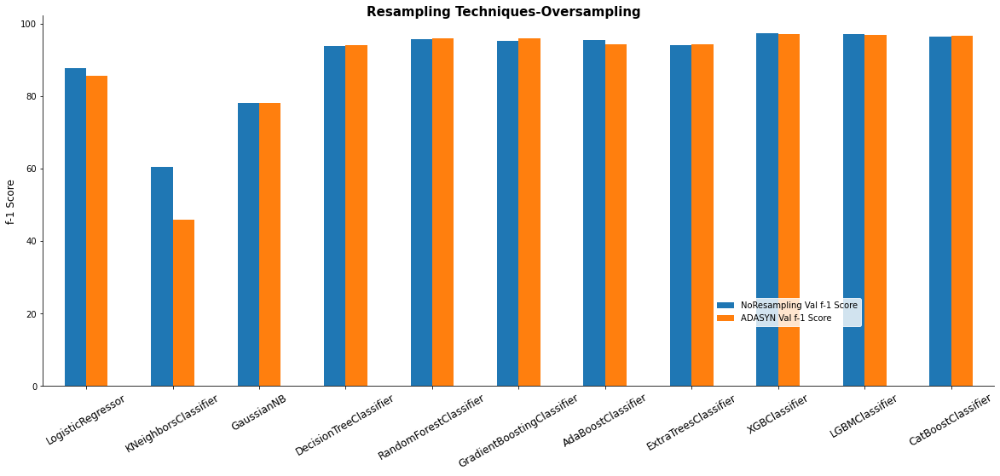

In [10]:
ps_over = pd.DataFrame(index=models_dict.keys())
ps_over['NoResampling Val f-1 Score'] = auto_run[0]['Val f-1 Score']
ps_over['ADASYN Val f-1 Score'] = outputs[0]['Val f-1 Score']

fig, ax = plt.subplots(figsize=(20, 8))
ps_over.plot.bar(ax=ax)
ax.set_ylabel('f-1 Score', fontsize=12)
for spine in ['right', 'top']:
        ax.spines[spine].set_visible(False)
# ax.legend(edgecolor='white')
ax.legend(edgecolor='white', loc = 'upper left', bbox_to_anchor=(0.7, .25))
fig.suptitle("Resampling Techniques-Oversampling", size=15, y=0.9, weight='bold')
plt.xticks(rotation=30, fontsize=12)
plt.show()

In [11]:
ps_over

,NoResampling Val f-1 Score,ADASYN Val f-1 Score
LogisticRegressor,87.70,85.66
KNeighborsClassifier,60.60,46.01
GaussianNB,78.17,78.04
DecisionTreeClassifier,93.82,94.06
RandomForestClassifier,95.77,95.98
GradientBoostingClassifier,95.41,95.92
AdaBoostClassifier,95.60,94.33
ExtraTreesClassifier,94.05,94.27
XGBClassifier,97.39,97.25
LGBMClassifier,97.15,97.08


In [ ]:
ps_over = pd.DataFrame(index=models_dict.keys())
ps_over['NoResampling Val f-1 Score'] = auto_run[0]['Val f-1 Score']
ps_over['ADASYN Val f-1 Score'] = outputs[0]['Val f-1 Score']

fig, ax = plt.subplots(figsize=(20, 8))
ps_over.plot.bar(ax=ax)
ax.set_ylabel('f-1 Score', fontsize=12)
for spine in ['right', 'top']:
        ax.spines[spine].set_visible(False)
# ax.legend(edgecolor='white')
ax.legend(edgecolor='white', loc = 'upper left', bbox_to_anchor=(0.7, .25))
fig.suptitle("Resampling Techniques-Oversampling", size=15, y=0.9, weight='bold')
plt.xticks(rotation=30, fontsize=12)
plt.show()

Text(0.5, 0.95, 'Oversampling Using Adasyn- Run Time')

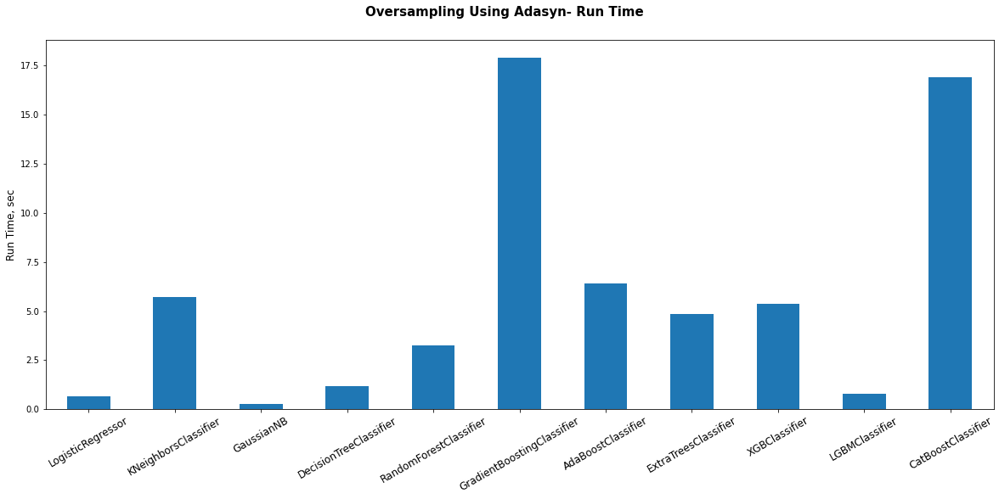

In [13]:
fig, ax = plt.subplots(figsize=(20, 8))                      
over_df['run_time'].plot.bar(ax=ax)
plt.xticks(rotation=30, fontsize=12)
ax.set_ylabel('Run Time, sec', fontsize = 12 )
fig.suptitle("Oversampling Using Adasyn- Run Time", size = 15, y=0.95, weight = 'bold')


<div><span style="background-color: #ff0257; padding-top: 100px; padding-right: 20px; padding-bottom: 50px; padding-left: 20px; color: #FFFAF0; font-size: 18px; font-weight: bold">Grid-Search and Randomized Search Cross Validation </span></div>

[Grid Search](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html) and [Randomized Search Cross Validation](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.RandomizedSearchCV.html) are commonly used to hypertune models across multiple parameters

### Hypertuning : Catboost - ADASYN

In [17]:
def train_cat(X, y, metric, res_t=None, hypertune=False, resample=False):
    """Hypertune Catboost and apply Adasyn()"""
    
    params = {
              'depth': [1, 2, 3, 4, 5],
              'learning_rate': [0.01, 0.05, 0.1 , 0.5, 1]

              }
    new_params = {'catboostclassifier__' +
                  key: params[key] for key in params}

    skf = StratifiedKFold(n_splits=5)
    if resample is True:
        imba_pipeline = make_pipeline(MinMaxScaler(),
                                      res_t,
                                      CatBoostClassifier(random_state=143))
    else:
        imba_pipeline = make_pipeline(MinMaxScaler(),
                                      AdaBoostClassifier(random_state=143))

    if hypertune is True:
        clf = GridSearchCV(imba_pipeline, param_grid=new_params,
                           cv=skf, scoring=metric, return_train_score=True,
                          verbose=10)
        start_time = time.time()
        clf.fit(X, y)
        run_time = (time.time() - start_time)
        model = clf.best_estimator_.fit(X, y)
        return ['CatBoostClassifier', np.mean(clf.cv_results_['mean_train_score']),
                clf.best_score_, 'Best parameters = {0}'.format(
                    clf.best_params_),
                run_time, model]
    else:
        clf = imba_pipeline
        start_time = time.time()
        clf.fit(X, y)
        run_time = (time.time() - start_time)
        cv_scores = cross_validate(estimator=clf, X=X, y=y,
                                   scoring=metric, cv=skf, n_jobs=-1,
                                   return_train_score=True)

        return ['AdaBoostClassifier', np.mean(cv_scores['train_score']),
                np.mean(cv_scores['test_score']), run_time, clf]

In [31]:
start_time = time.time()
cat_adasyn_f1 = train_cat(X_trainval, y_trainval, 'f1', ADASYN(),
                       hypertune=True, resample=True)
start_time = time.time()
cat_adasyn_acc = train_cat(X_trainval, y_trainval, 'accuracy', ADASYN(),
                      hypertune=True, resample=True)


Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5; 1/25] START catboostclassifier__depth=1, catboostclassifier__learning_rate=0.01
0:	learn: 0.6757366	total: 25ms	remaining: 25s
1:	learn: 0.6587883	total: 27.7ms	remaining: 13.8s
2:	learn: 0.6423702	total: 30.5ms	remaining: 10.1s
3:	learn: 0.6268419	total: 33.1ms	remaining: 8.24s
4:	learn: 0.6115342	total: 35.6ms	remaining: 7.08s
5:	learn: 0.5965159	total: 38.1ms	remaining: 6.31s
6:	learn: 0.5819179	total: 41.2ms	remaining: 5.84s
7:	learn: 0.5678014	total: 44ms	remaining: 5.45s
8:	learn: 0.5540829	total: 46.7ms	remaining: 5.14s
9:	learn: 0.5409558	total: 49.1ms	remaining: 4.86s
10:	learn: 0.5282345	total: 51.6ms	remaining: 4.64s
11:	learn: 0.5157340	total: 54.2ms	remaining: 4.46s
12:	learn: 0.5037867	total: 56.6ms	remaining: 4.3s
13:	learn: 0.4920567	total: 59.1ms	remaining: 4.16s
14:	learn: 0.4806895	total: 61.5ms	remaining: 4.04s
15:	learn: 0.4697974	total: 64.1ms	remaining: 3.94s
16:	learn: 0.4593802	total: 66.7ms

196:	learn: 0.0888778	total: 554ms	remaining: 2.26s
197:	learn: 0.0888086	total: 557ms	remaining: 2.25s
198:	learn: 0.0882653	total: 559ms	remaining: 2.25s
199:	learn: 0.0881671	total: 562ms	remaining: 2.25s
200:	learn: 0.0880698	total: 565ms	remaining: 2.24s
201:	learn: 0.0880023	total: 567ms	remaining: 2.24s
202:	learn: 0.0879072	total: 569ms	remaining: 2.23s
203:	learn: 0.0878137	total: 572ms	remaining: 2.23s
204:	learn: 0.0877526	total: 575ms	remaining: 2.23s
205:	learn: 0.0873923	total: 578ms	remaining: 2.23s
206:	learn: 0.0869637	total: 581ms	remaining: 2.23s
207:	learn: 0.0864314	total: 584ms	remaining: 2.22s
208:	learn: 0.0860310	total: 586ms	remaining: 2.22s
209:	learn: 0.0859389	total: 589ms	remaining: 2.21s
210:	learn: 0.0858734	total: 592ms	remaining: 2.21s
211:	learn: 0.0851479	total: 594ms	remaining: 2.21s
212:	learn: 0.0847737	total: 597ms	remaining: 2.21s
213:	learn: 0.0844171	total: 600ms	remaining: 2.2s
214:	learn: 0.0843219	total: 602ms	remaining: 2.2s
215:	learn: 0.

408:	learn: 0.0598779	total: 1.1s	remaining: 1.58s
409:	learn: 0.0598403	total: 1.1s	remaining: 1.58s
410:	learn: 0.0598166	total: 1.1s	remaining: 1.58s
411:	learn: 0.0597960	total: 1.1s	remaining: 1.58s
412:	learn: 0.0597459	total: 1.11s	remaining: 1.57s
413:	learn: 0.0596543	total: 1.11s	remaining: 1.57s
414:	learn: 0.0596187	total: 1.11s	remaining: 1.57s
415:	learn: 0.0593197	total: 1.11s	remaining: 1.57s
416:	learn: 0.0592934	total: 1.12s	remaining: 1.56s
417:	learn: 0.0592680	total: 1.12s	remaining: 1.56s
418:	learn: 0.0592336	total: 1.12s	remaining: 1.56s
419:	learn: 0.0591985	total: 1.13s	remaining: 1.55s
420:	learn: 0.0591728	total: 1.13s	remaining: 1.55s
421:	learn: 0.0591255	total: 1.13s	remaining: 1.55s
422:	learn: 0.0590757	total: 1.13s	remaining: 1.55s
423:	learn: 0.0590208	total: 1.14s	remaining: 1.54s
424:	learn: 0.0589858	total: 1.14s	remaining: 1.54s
425:	learn: 0.0589525	total: 1.14s	remaining: 1.54s
426:	learn: 0.0588909	total: 1.14s	remaining: 1.53s
427:	learn: 0.05

619:	learn: 0.0494483	total: 1.63s	remaining: 1s
620:	learn: 0.0493870	total: 1.63s	remaining: 998ms
621:	learn: 0.0493547	total: 1.64s	remaining: 996ms
622:	learn: 0.0493401	total: 1.64s	remaining: 993ms
623:	learn: 0.0493158	total: 1.64s	remaining: 990ms
624:	learn: 0.0492563	total: 1.65s	remaining: 987ms
625:	learn: 0.0491955	total: 1.65s	remaining: 985ms
626:	learn: 0.0491600	total: 1.65s	remaining: 982ms
627:	learn: 0.0491378	total: 1.65s	remaining: 979ms
628:	learn: 0.0491247	total: 1.66s	remaining: 976ms
629:	learn: 0.0490792	total: 1.66s	remaining: 974ms
630:	learn: 0.0490578	total: 1.66s	remaining: 971ms
631:	learn: 0.0490449	total: 1.66s	remaining: 968ms
632:	learn: 0.0490221	total: 1.67s	remaining: 966ms
633:	learn: 0.0490083	total: 1.67s	remaining: 963ms
634:	learn: 0.0489958	total: 1.67s	remaining: 960ms
635:	learn: 0.0489827	total: 1.67s	remaining: 957ms
636:	learn: 0.0489600	total: 1.67s	remaining: 954ms
637:	learn: 0.0489474	total: 1.68s	remaining: 952ms
638:	learn: 0.0

814:	learn: 0.0422942	total: 2.17s	remaining: 493ms
815:	learn: 0.0422822	total: 2.17s	remaining: 490ms
816:	learn: 0.0422670	total: 2.18s	remaining: 487ms
817:	learn: 0.0422504	total: 2.18s	remaining: 485ms
818:	learn: 0.0422079	total: 2.18s	remaining: 482ms
819:	learn: 0.0421907	total: 2.18s	remaining: 479ms
820:	learn: 0.0421753	total: 2.19s	remaining: 477ms
821:	learn: 0.0421617	total: 2.19s	remaining: 474ms
822:	learn: 0.0421482	total: 2.19s	remaining: 471ms
823:	learn: 0.0421069	total: 2.19s	remaining: 469ms
824:	learn: 0.0420988	total: 2.2s	remaining: 466ms
825:	learn: 0.0420809	total: 2.2s	remaining: 463ms
826:	learn: 0.0420728	total: 2.2s	remaining: 461ms
827:	learn: 0.0419772	total: 2.21s	remaining: 458ms
828:	learn: 0.0418849	total: 2.21s	remaining: 456ms
829:	learn: 0.0418767	total: 2.21s	remaining: 453ms
830:	learn: 0.0417163	total: 2.21s	remaining: 450ms
831:	learn: 0.0417007	total: 2.22s	remaining: 447ms
832:	learn: 0.0416849	total: 2.22s	remaining: 445ms
833:	learn: 0.0

[CV 2/5; 1/25] START catboostclassifier__depth=1, catboostclassifier__learning_rate=0.01
0:	learn: 0.6763385	total: 2.91ms	remaining: 2.9s
1:	learn: 0.6594316	total: 6.01ms	remaining: 3s
2:	learn: 0.6427816	total: 9.07ms	remaining: 3.01s
3:	learn: 0.6268620	total: 12.4ms	remaining: 3.1s
4:	learn: 0.6121732	total: 15.7ms	remaining: 3.13s
5:	learn: 0.5971566	total: 18.8ms	remaining: 3.12s
6:	learn: 0.5823858	total: 21.5ms	remaining: 3.05s
7:	learn: 0.5687667	total: 24.1ms	remaining: 2.98s
8:	learn: 0.5548654	total: 26.6ms	remaining: 2.93s
9:	learn: 0.5422487	total: 28.9ms	remaining: 2.87s
10:	learn: 0.5295481	total: 31.4ms	remaining: 2.83s
11:	learn: 0.5168582	total: 33.8ms	remaining: 2.78s
12:	learn: 0.5049514	total: 35.9ms	remaining: 2.73s
13:	learn: 0.4935768	total: 38.2ms	remaining: 2.69s
14:	learn: 0.4820040	total: 40.7ms	remaining: 2.67s
15:	learn: 0.4711093	total: 42.9ms	remaining: 2.64s
16:	learn: 0.4602200	total: 45.2ms	remaining: 2.61s
17:	learn: 0.4499263	total: 47.4ms	remaini

201:	learn: 0.0887334	total: 526ms	remaining: 2.08s
202:	learn: 0.0886058	total: 529ms	remaining: 2.08s
203:	learn: 0.0885450	total: 531ms	remaining: 2.07s
204:	learn: 0.0884814	total: 534ms	remaining: 2.07s
205:	learn: 0.0879124	total: 537ms	remaining: 2.07s
206:	learn: 0.0878156	total: 540ms	remaining: 2.07s
207:	learn: 0.0877545	total: 542ms	remaining: 2.06s
208:	learn: 0.0876591	total: 545ms	remaining: 2.06s
209:	learn: 0.0873290	total: 547ms	remaining: 2.06s
210:	learn: 0.0872689	total: 550ms	remaining: 2.06s
211:	learn: 0.0871768	total: 553ms	remaining: 2.05s
212:	learn: 0.0868580	total: 555ms	remaining: 2.05s
213:	learn: 0.0867386	total: 558ms	remaining: 2.05s
214:	learn: 0.0861911	total: 561ms	remaining: 2.05s
215:	learn: 0.0860996	total: 563ms	remaining: 2.04s
216:	learn: 0.0860100	total: 565ms	remaining: 2.04s
217:	learn: 0.0859232	total: 568ms	remaining: 2.04s
218:	learn: 0.0858389	total: 570ms	remaining: 2.03s
219:	learn: 0.0857520	total: 573ms	remaining: 2.03s
220:	learn: 

402:	learn: 0.0641600	total: 1.06s	remaining: 1.58s
403:	learn: 0.0641170	total: 1.07s	remaining: 1.57s
404:	learn: 0.0640601	total: 1.07s	remaining: 1.57s
405:	learn: 0.0640389	total: 1.07s	remaining: 1.57s
406:	learn: 0.0639842	total: 1.08s	remaining: 1.57s
407:	learn: 0.0638019	total: 1.08s	remaining: 1.56s
408:	learn: 0.0637657	total: 1.08s	remaining: 1.56s
409:	learn: 0.0635789	total: 1.08s	remaining: 1.56s
410:	learn: 0.0635355	total: 1.09s	remaining: 1.56s
411:	learn: 0.0635004	total: 1.09s	remaining: 1.56s
412:	learn: 0.0634504	total: 1.09s	remaining: 1.55s
413:	learn: 0.0634080	total: 1.1s	remaining: 1.55s
414:	learn: 0.0633544	total: 1.1s	remaining: 1.55s
415:	learn: 0.0633207	total: 1.1s	remaining: 1.55s
416:	learn: 0.0632876	total: 1.1s	remaining: 1.54s
417:	learn: 0.0632472	total: 1.11s	remaining: 1.54s
418:	learn: 0.0632161	total: 1.11s	remaining: 1.54s
419:	learn: 0.0631114	total: 1.11s	remaining: 1.54s
420:	learn: 0.0630790	total: 1.12s	remaining: 1.53s
421:	learn: 0.06

611:	learn: 0.0514918	total: 1.6s	remaining: 1.02s
612:	learn: 0.0514729	total: 1.61s	remaining: 1.01s
613:	learn: 0.0514528	total: 1.61s	remaining: 1.01s
614:	learn: 0.0514331	total: 1.61s	remaining: 1.01s
615:	learn: 0.0513646	total: 1.61s	remaining: 1s
616:	learn: 0.0512953	total: 1.61s	remaining: 1s
617:	learn: 0.0512831	total: 1.62s	remaining: 1s
618:	learn: 0.0512581	total: 1.62s	remaining: 997ms
619:	learn: 0.0512381	total: 1.62s	remaining: 995ms
620:	learn: 0.0511701	total: 1.63s	remaining: 992ms
621:	learn: 0.0511474	total: 1.63s	remaining: 989ms
622:	learn: 0.0510321	total: 1.63s	remaining: 986ms
623:	learn: 0.0510094	total: 1.63s	remaining: 984ms
624:	learn: 0.0507528	total: 1.64s	remaining: 981ms
625:	learn: 0.0507408	total: 1.64s	remaining: 978ms
626:	learn: 0.0507271	total: 1.64s	remaining: 976ms
627:	learn: 0.0506612	total: 1.64s	remaining: 973ms
628:	learn: 0.0506508	total: 1.64s	remaining: 970ms
629:	learn: 0.0505858	total: 1.65s	remaining: 967ms
630:	learn: 0.0505750	

822:	learn: 0.0438494	total: 2.14s	remaining: 461ms
823:	learn: 0.0438325	total: 2.15s	remaining: 458ms
824:	learn: 0.0437457	total: 2.15s	remaining: 456ms
825:	learn: 0.0436680	total: 2.15s	remaining: 453ms
826:	learn: 0.0436532	total: 2.15s	remaining: 451ms
827:	learn: 0.0436064	total: 2.16s	remaining: 449ms
828:	learn: 0.0435965	total: 2.16s	remaining: 446ms
829:	learn: 0.0435733	total: 2.17s	remaining: 444ms
830:	learn: 0.0433748	total: 2.17s	remaining: 441ms
831:	learn: 0.0433298	total: 2.17s	remaining: 439ms
832:	learn: 0.0433190	total: 2.18s	remaining: 436ms
833:	learn: 0.0433127	total: 2.18s	remaining: 434ms
834:	learn: 0.0432985	total: 2.18s	remaining: 431ms
835:	learn: 0.0432709	total: 2.18s	remaining: 429ms
836:	learn: 0.0432577	total: 2.19s	remaining: 426ms
837:	learn: 0.0431751	total: 2.19s	remaining: 423ms
838:	learn: 0.0431638	total: 2.19s	remaining: 421ms
839:	learn: 0.0431535	total: 2.2s	remaining: 418ms
840:	learn: 0.0431439	total: 2.2s	remaining: 416ms
841:	learn: 0.

[CV 2/5; 1/25] END catboostclassifier__depth=1, catboostclassifier__learning_rate=0.01;, score=(train=0.831, test=0.821) total time=   3.9s
[CV 3/5; 1/25] START catboostclassifier__depth=1, catboostclassifier__learning_rate=0.01
0:	learn: 0.6767657	total: 3.35ms	remaining: 3.35s
1:	learn: 0.6608326	total: 6.13ms	remaining: 3.06s
2:	learn: 0.6457067	total: 8.71ms	remaining: 2.89s
3:	learn: 0.6306534	total: 11.3ms	remaining: 2.82s
4:	learn: 0.6160879	total: 13.7ms	remaining: 2.73s
5:	learn: 0.6016599	total: 16.3ms	remaining: 2.7s
6:	learn: 0.5882146	total: 19ms	remaining: 2.69s
7:	learn: 0.5748896	total: 21.8ms	remaining: 2.7s
8:	learn: 0.5619726	total: 24.4ms	remaining: 2.68s
9:	learn: 0.5496889	total: 26.8ms	remaining: 2.65s
10:	learn: 0.5375178	total: 28.9ms	remaining: 2.6s
11:	learn: 0.5258533	total: 37.3ms	remaining: 3.07s
12:	learn: 0.5141506	total: 40.4ms	remaining: 3.07s
13:	learn: 0.5029193	total: 42.8ms	remaining: 3.01s
14:	learn: 0.4918895	total: 45.2ms	remaining: 2.97s
15:	le

196:	learn: 0.1112064	total: 532ms	remaining: 2.17s
197:	learn: 0.1106105	total: 535ms	remaining: 2.17s
198:	learn: 0.1103620	total: 537ms	remaining: 2.16s
199:	learn: 0.1102335	total: 540ms	remaining: 2.16s
200:	learn: 0.1099112	total: 543ms	remaining: 2.16s
201:	learn: 0.1096046	total: 545ms	remaining: 2.15s
202:	learn: 0.1094808	total: 548ms	remaining: 2.15s
203:	learn: 0.1091745	total: 550ms	remaining: 2.15s
204:	learn: 0.1090532	total: 552ms	remaining: 2.14s
205:	learn: 0.1089332	total: 555ms	remaining: 2.14s
206:	learn: 0.1088206	total: 557ms	remaining: 2.13s
207:	learn: 0.1083313	total: 560ms	remaining: 2.13s
208:	learn: 0.1082172	total: 562ms	remaining: 2.13s
209:	learn: 0.1081025	total: 565ms	remaining: 2.13s
210:	learn: 0.1079954	total: 568ms	remaining: 2.12s
211:	learn: 0.1074136	total: 570ms	remaining: 2.12s
212:	learn: 0.1065209	total: 573ms	remaining: 2.12s
213:	learn: 0.1064090	total: 576ms	remaining: 2.11s
214:	learn: 0.1060958	total: 578ms	remaining: 2.11s
215:	learn: 

385:	learn: 0.0800451	total: 1.07s	remaining: 1.7s
386:	learn: 0.0799814	total: 1.07s	remaining: 1.7s
387:	learn: 0.0799465	total: 1.07s	remaining: 1.7s
388:	learn: 0.0798971	total: 1.08s	remaining: 1.69s
389:	learn: 0.0797597	total: 1.08s	remaining: 1.69s
390:	learn: 0.0797097	total: 1.08s	remaining: 1.69s
391:	learn: 0.0796620	total: 1.09s	remaining: 1.69s
392:	learn: 0.0795775	total: 1.09s	remaining: 1.68s
393:	learn: 0.0790124	total: 1.09s	remaining: 1.68s
394:	learn: 0.0788500	total: 1.09s	remaining: 1.68s
395:	learn: 0.0787557	total: 1.1s	remaining: 1.68s
396:	learn: 0.0784311	total: 1.1s	remaining: 1.67s
397:	learn: 0.0783953	total: 1.1s	remaining: 1.67s
398:	learn: 0.0783621	total: 1.11s	remaining: 1.67s
399:	learn: 0.0783137	total: 1.11s	remaining: 1.67s
400:	learn: 0.0781513	total: 1.11s	remaining: 1.66s
401:	learn: 0.0780346	total: 1.12s	remaining: 1.66s
402:	learn: 0.0780011	total: 1.12s	remaining: 1.66s
403:	learn: 0.0779374	total: 1.12s	remaining: 1.66s
404:	learn: 0.0778

578:	learn: 0.0640755	total: 1.61s	remaining: 1.17s
579:	learn: 0.0640564	total: 1.61s	remaining: 1.17s
580:	learn: 0.0640124	total: 1.61s	remaining: 1.16s
581:	learn: 0.0639704	total: 1.61s	remaining: 1.16s
582:	learn: 0.0639523	total: 1.62s	remaining: 1.16s
583:	learn: 0.0638673	total: 1.62s	remaining: 1.16s
584:	learn: 0.0637844	total: 1.62s	remaining: 1.15s
585:	learn: 0.0637660	total: 1.63s	remaining: 1.15s
586:	learn: 0.0637238	total: 1.63s	remaining: 1.15s
587:	learn: 0.0637065	total: 1.63s	remaining: 1.14s
588:	learn: 0.0636256	total: 1.64s	remaining: 1.14s
589:	learn: 0.0636078	total: 1.64s	remaining: 1.14s
590:	learn: 0.0635283	total: 1.64s	remaining: 1.14s
591:	learn: 0.0635122	total: 1.64s	remaining: 1.13s
592:	learn: 0.0634796	total: 1.65s	remaining: 1.13s
593:	learn: 0.0634632	total: 1.65s	remaining: 1.13s
594:	learn: 0.0634375	total: 1.65s	remaining: 1.12s
595:	learn: 0.0634073	total: 1.65s	remaining: 1.12s
596:	learn: 0.0633828	total: 1.66s	remaining: 1.12s
597:	learn: 

750:	learn: 0.0560816	total: 2.33s	remaining: 772ms
751:	learn: 0.0560164	total: 2.33s	remaining: 770ms
752:	learn: 0.0558547	total: 2.34s	remaining: 768ms
753:	learn: 0.0558320	total: 2.34s	remaining: 765ms
754:	learn: 0.0557528	total: 2.35s	remaining: 762ms
755:	learn: 0.0556740	total: 2.35s	remaining: 760ms
756:	learn: 0.0556626	total: 2.36s	remaining: 757ms
757:	learn: 0.0556526	total: 2.36s	remaining: 754ms
758:	learn: 0.0556290	total: 2.37s	remaining: 752ms
759:	learn: 0.0556063	total: 2.37s	remaining: 749ms
760:	learn: 0.0555319	total: 2.38s	remaining: 746ms
761:	learn: 0.0555098	total: 2.38s	remaining: 744ms
762:	learn: 0.0554871	total: 2.38s	remaining: 741ms
763:	learn: 0.0554619	total: 2.39s	remaining: 738ms
764:	learn: 0.0554105	total: 2.4s	remaining: 736ms
765:	learn: 0.0553999	total: 2.4s	remaining: 733ms
766:	learn: 0.0553682	total: 2.4s	remaining: 731ms
767:	learn: 0.0552885	total: 2.43s	remaining: 733ms
768:	learn: 0.0552687	total: 2.43s	remaining: 730ms
769:	learn: 0.0

913:	learn: 0.0500766	total: 3.05s	remaining: 287ms
914:	learn: 0.0500240	total: 3.05s	remaining: 284ms
915:	learn: 0.0500092	total: 3.06s	remaining: 280ms
916:	learn: 0.0499911	total: 3.06s	remaining: 277ms
917:	learn: 0.0499518	total: 3.06s	remaining: 274ms
918:	learn: 0.0499392	total: 3.06s	remaining: 270ms
919:	learn: 0.0499215	total: 3.07s	remaining: 267ms
920:	learn: 0.0499069	total: 3.07s	remaining: 264ms
921:	learn: 0.0498974	total: 3.08s	remaining: 260ms
922:	learn: 0.0498598	total: 3.08s	remaining: 257ms
923:	learn: 0.0498209	total: 3.08s	remaining: 254ms
924:	learn: 0.0497814	total: 3.09s	remaining: 250ms
925:	learn: 0.0496650	total: 3.09s	remaining: 247ms
926:	learn: 0.0496561	total: 3.1s	remaining: 244ms
927:	learn: 0.0496489	total: 3.1s	remaining: 240ms
928:	learn: 0.0496102	total: 3.1s	remaining: 237ms
929:	learn: 0.0495723	total: 3.1s	remaining: 234ms
930:	learn: 0.0495099	total: 3.11s	remaining: 230ms
931:	learn: 0.0494716	total: 3.11s	remaining: 227ms
932:	learn: 0.04

87:	learn: 0.1654629	total: 377ms	remaining: 3.91s
88:	learn: 0.1641852	total: 382ms	remaining: 3.91s
89:	learn: 0.1629308	total: 386ms	remaining: 3.9s
90:	learn: 0.1617195	total: 391ms	remaining: 3.9s
91:	learn: 0.1604610	total: 395ms	remaining: 3.9s
92:	learn: 0.1592976	total: 400ms	remaining: 3.9s
93:	learn: 0.1580973	total: 404ms	remaining: 3.9s
94:	learn: 0.1570147	total: 409ms	remaining: 3.9s
95:	learn: 0.1558688	total: 413ms	remaining: 3.89s
96:	learn: 0.1547528	total: 418ms	remaining: 3.89s
97:	learn: 0.1537187	total: 422ms	remaining: 3.88s
98:	learn: 0.1526611	total: 426ms	remaining: 3.88s
99:	learn: 0.1516702	total: 431ms	remaining: 3.88s
100:	learn: 0.1506590	total: 435ms	remaining: 3.87s
101:	learn: 0.1496768	total: 439ms	remaining: 3.87s
102:	learn: 0.1487221	total: 443ms	remaining: 3.86s
103:	learn: 0.1478368	total: 448ms	remaining: 3.86s
104:	learn: 0.1469783	total: 452ms	remaining: 3.85s
105:	learn: 0.1461573	total: 457ms	remaining: 3.85s
106:	learn: 0.1453266	total: 46

252:	learn: 0.0905102	total: 1.1s	remaining: 3.25s
253:	learn: 0.0900646	total: 1.1s	remaining: 3.24s
254:	learn: 0.0900114	total: 1.11s	remaining: 3.24s
255:	learn: 0.0897670	total: 1.11s	remaining: 3.24s
256:	learn: 0.0893466	total: 1.12s	remaining: 3.23s
257:	learn: 0.0893031	total: 1.12s	remaining: 3.23s
258:	learn: 0.0892210	total: 1.13s	remaining: 3.22s
259:	learn: 0.0891412	total: 1.13s	remaining: 3.21s
260:	learn: 0.0890982	total: 1.13s	remaining: 3.21s
261:	learn: 0.0890056	total: 1.14s	remaining: 3.21s
262:	learn: 0.0887588	total: 1.14s	remaining: 3.2s
263:	learn: 0.0887160	total: 1.15s	remaining: 3.19s
264:	learn: 0.0886349	total: 1.15s	remaining: 3.19s
265:	learn: 0.0885924	total: 1.15s	remaining: 3.18s
266:	learn: 0.0885124	total: 1.16s	remaining: 3.18s
267:	learn: 0.0882721	total: 1.16s	remaining: 3.17s
268:	learn: 0.0881959	total: 1.17s	remaining: 3.17s
269:	learn: 0.0881543	total: 1.17s	remaining: 3.16s
270:	learn: 0.0881137	total: 1.17s	remaining: 3.16s
271:	learn: 0.0

422:	learn: 0.0713531	total: 1.82s	remaining: 2.48s
423:	learn: 0.0713059	total: 1.82s	remaining: 2.48s
424:	learn: 0.0711542	total: 1.83s	remaining: 2.48s
425:	learn: 0.0711072	total: 1.83s	remaining: 2.47s
426:	learn: 0.0709605	total: 1.84s	remaining: 2.47s
427:	learn: 0.0709372	total: 1.84s	remaining: 2.46s
428:	learn: 0.0708905	total: 1.85s	remaining: 2.46s
429:	learn: 0.0708468	total: 1.85s	remaining: 2.45s
430:	learn: 0.0705404	total: 1.85s	remaining: 2.45s
431:	learn: 0.0704891	total: 1.86s	remaining: 2.45s
432:	learn: 0.0704397	total: 1.86s	remaining: 2.44s
433:	learn: 0.0703860	total: 1.87s	remaining: 2.44s
434:	learn: 0.0703413	total: 1.87s	remaining: 2.43s
435:	learn: 0.0702209	total: 1.88s	remaining: 2.43s
436:	learn: 0.0701776	total: 1.88s	remaining: 2.42s
437:	learn: 0.0701328	total: 1.89s	remaining: 2.42s
438:	learn: 0.0699977	total: 1.89s	remaining: 2.41s
439:	learn: 0.0699739	total: 1.89s	remaining: 2.41s
440:	learn: 0.0699513	total: 1.9s	remaining: 2.4s
441:	learn: 0.

621:	learn: 0.0585642	total: 2.73s	remaining: 1.66s
622:	learn: 0.0582413	total: 2.73s	remaining: 1.65s
623:	learn: 0.0581367	total: 2.73s	remaining: 1.65s
624:	learn: 0.0581072	total: 2.74s	remaining: 1.64s
625:	learn: 0.0580786	total: 2.74s	remaining: 1.64s
626:	learn: 0.0580012	total: 2.75s	remaining: 1.63s
627:	learn: 0.0579885	total: 2.75s	remaining: 1.63s
628:	learn: 0.0579163	total: 2.75s	remaining: 1.62s
629:	learn: 0.0578957	total: 2.76s	remaining: 1.62s
630:	learn: 0.0578753	total: 2.76s	remaining: 1.62s
631:	learn: 0.0578409	total: 2.77s	remaining: 1.61s
632:	learn: 0.0578094	total: 2.77s	remaining: 1.61s
633:	learn: 0.0576226	total: 2.78s	remaining: 1.6s
634:	learn: 0.0573248	total: 2.78s	remaining: 1.6s
635:	learn: 0.0572931	total: 2.79s	remaining: 1.59s
636:	learn: 0.0572628	total: 2.79s	remaining: 1.59s
637:	learn: 0.0572331	total: 2.79s	remaining: 1.58s
638:	learn: 0.0572196	total: 2.8s	remaining: 1.58s
639:	learn: 0.0572066	total: 2.8s	remaining: 1.58s
640:	learn: 0.05

814:	learn: 0.0494809	total: 3.62s	remaining: 822ms
815:	learn: 0.0494089	total: 3.62s	remaining: 817ms
816:	learn: 0.0493876	total: 3.63s	remaining: 813ms
817:	learn: 0.0493689	total: 3.63s	remaining: 808ms
818:	learn: 0.0493073	total: 3.64s	remaining: 804ms
819:	learn: 0.0493000	total: 3.64s	remaining: 799ms
820:	learn: 0.0492797	total: 3.64s	remaining: 794ms
821:	learn: 0.0492612	total: 3.65s	remaining: 790ms
822:	learn: 0.0492062	total: 3.65s	remaining: 785ms
823:	learn: 0.0491512	total: 3.65s	remaining: 781ms
824:	learn: 0.0491433	total: 3.66s	remaining: 776ms
825:	learn: 0.0491241	total: 3.66s	remaining: 771ms
826:	learn: 0.0490787	total: 3.67s	remaining: 767ms
827:	learn: 0.0490232	total: 3.67s	remaining: 762ms
828:	learn: 0.0488690	total: 3.67s	remaining: 758ms
829:	learn: 0.0488509	total: 3.68s	remaining: 753ms
830:	learn: 0.0487959	total: 3.68s	remaining: 749ms
831:	learn: 0.0487792	total: 3.69s	remaining: 744ms
832:	learn: 0.0487120	total: 3.69s	remaining: 740ms
833:	learn: 

994:	learn: 0.0434283	total: 4.34s	remaining: 21.8ms
995:	learn: 0.0434222	total: 4.35s	remaining: 17.5ms
996:	learn: 0.0433666	total: 4.35s	remaining: 13.1ms
997:	learn: 0.0433266	total: 4.36s	remaining: 8.73ms
998:	learn: 0.0433209	total: 4.36s	remaining: 4.37ms
999:	learn: 0.0433073	total: 4.37s	remaining: 0us
[CV 4/5; 1/25] END catboostclassifier__depth=1, catboostclassifier__learning_rate=0.01;, score=(train=0.837, test=0.799) total time=   5.9s
[CV 5/5; 1/25] START catboostclassifier__depth=1, catboostclassifier__learning_rate=0.01
0:	learn: 0.6764115	total: 3.71ms	remaining: 3.7s
1:	learn: 0.6604379	total: 6.98ms	remaining: 3.48s
2:	learn: 0.6446347	total: 10.2ms	remaining: 3.38s
3:	learn: 0.6299703	total: 13ms	remaining: 3.23s
4:	learn: 0.6150601	total: 16.3ms	remaining: 3.24s
5:	learn: 0.6006006	total: 19.5ms	remaining: 3.24s
6:	learn: 0.5869585	total: 22.5ms	remaining: 3.19s
7:	learn: 0.5741871	total: 25.9ms	remaining: 3.22s
8:	learn: 0.5613258	total: 29.1ms	remaining: 3.21s


178:	learn: 0.1204743	total: 719ms	remaining: 3.3s
179:	learn: 0.1197516	total: 723ms	remaining: 3.29s
180:	learn: 0.1187361	total: 728ms	remaining: 3.29s
181:	learn: 0.1185885	total: 732ms	remaining: 3.29s
182:	learn: 0.1182644	total: 737ms	remaining: 3.29s
183:	learn: 0.1181349	total: 741ms	remaining: 3.29s
184:	learn: 0.1180040	total: 745ms	remaining: 3.28s
185:	learn: 0.1177422	total: 749ms	remaining: 3.28s
186:	learn: 0.1176103	total: 752ms	remaining: 3.27s
187:	learn: 0.1174701	total: 757ms	remaining: 3.27s
188:	learn: 0.1172601	total: 760ms	remaining: 3.26s
189:	learn: 0.1171328	total: 764ms	remaining: 3.26s
190:	learn: 0.1161890	total: 769ms	remaining: 3.25s
191:	learn: 0.1158679	total: 773ms	remaining: 3.25s
192:	learn: 0.1157318	total: 777ms	remaining: 3.25s
193:	learn: 0.1156103	total: 781ms	remaining: 3.24s
194:	learn: 0.1154866	total: 784ms	remaining: 3.24s
195:	learn: 0.1153629	total: 788ms	remaining: 3.23s
196:	learn: 0.1150519	total: 792ms	remaining: 3.23s
197:	learn: 0

354:	learn: 0.0852014	total: 1.44s	remaining: 2.62s
355:	learn: 0.0851417	total: 1.44s	remaining: 2.61s
356:	learn: 0.0850937	total: 1.45s	remaining: 2.61s
357:	learn: 0.0850488	total: 1.45s	remaining: 2.6s
358:	learn: 0.0848970	total: 1.46s	remaining: 2.6s
359:	learn: 0.0848290	total: 1.46s	remaining: 2.6s
360:	learn: 0.0847840	total: 1.46s	remaining: 2.59s
361:	learn: 0.0847278	total: 1.47s	remaining: 2.59s
362:	learn: 0.0842164	total: 1.47s	remaining: 2.58s
363:	learn: 0.0840627	total: 1.48s	remaining: 2.58s
364:	learn: 0.0839078	total: 1.48s	remaining: 2.58s
365:	learn: 0.0838617	total: 1.48s	remaining: 2.57s
366:	learn: 0.0837097	total: 1.49s	remaining: 2.57s
367:	learn: 0.0836526	total: 1.49s	remaining: 2.56s
368:	learn: 0.0835038	total: 1.5s	remaining: 2.56s
369:	learn: 0.0834490	total: 1.5s	remaining: 2.55s
370:	learn: 0.0833009	total: 1.5s	remaining: 2.55s
371:	learn: 0.0831651	total: 1.51s	remaining: 2.55s
372:	learn: 0.0831114	total: 1.51s	remaining: 2.54s
373:	learn: 0.0829

518:	learn: 0.0701983	total: 2.16s	remaining: 2s
519:	learn: 0.0701784	total: 2.17s	remaining: 2s
520:	learn: 0.0701578	total: 2.17s	remaining: 1.99s
521:	learn: 0.0701239	total: 2.17s	remaining: 1.99s
522:	learn: 0.0700152	total: 2.18s	remaining: 1.99s
523:	learn: 0.0699088	total: 2.18s	remaining: 1.98s
524:	learn: 0.0698882	total: 2.18s	remaining: 1.98s
525:	learn: 0.0695066	total: 2.19s	remaining: 1.97s
526:	learn: 0.0694236	total: 2.19s	remaining: 1.97s
527:	learn: 0.0693964	total: 2.19s	remaining: 1.96s
528:	learn: 0.0693622	total: 2.2s	remaining: 1.96s
529:	learn: 0.0693421	total: 2.2s	remaining: 1.95s
530:	learn: 0.0693089	total: 2.2s	remaining: 1.95s
531:	learn: 0.0692106	total: 2.21s	remaining: 1.94s
532:	learn: 0.0691849	total: 2.21s	remaining: 1.94s
533:	learn: 0.0691598	total: 2.21s	remaining: 1.93s
534:	learn: 0.0691257	total: 2.22s	remaining: 1.93s
535:	learn: 0.0690884	total: 2.22s	remaining: 1.92s
536:	learn: 0.0690012	total: 2.23s	remaining: 1.92s
537:	learn: 0.0689027

707:	learn: 0.0588165	total: 2.88s	remaining: 1.19s
708:	learn: 0.0587972	total: 2.88s	remaining: 1.18s
709:	learn: 0.0587772	total: 2.89s	remaining: 1.18s
710:	learn: 0.0587643	total: 2.89s	remaining: 1.18s
711:	learn: 0.0587324	total: 2.9s	remaining: 1.17s
712:	learn: 0.0587078	total: 2.9s	remaining: 1.17s
713:	learn: 0.0586883	total: 2.9s	remaining: 1.16s
714:	learn: 0.0586679	total: 2.91s	remaining: 1.16s
715:	learn: 0.0586506	total: 2.91s	remaining: 1.15s
716:	learn: 0.0586266	total: 2.91s	remaining: 1.15s
717:	learn: 0.0586075	total: 2.92s	remaining: 1.15s
718:	learn: 0.0585899	total: 2.92s	remaining: 1.14s
719:	learn: 0.0585218	total: 2.92s	remaining: 1.14s
720:	learn: 0.0582513	total: 2.93s	remaining: 1.13s
721:	learn: 0.0581895	total: 2.93s	remaining: 1.13s
722:	learn: 0.0581643	total: 2.94s	remaining: 1.13s
723:	learn: 0.0581474	total: 2.94s	remaining: 1.12s
724:	learn: 0.0580869	total: 2.94s	remaining: 1.12s
725:	learn: 0.0580523	total: 2.95s	remaining: 1.11s
726:	learn: 0.0

900:	learn: 0.0507721	total: 3.61s	remaining: 397ms
901:	learn: 0.0507539	total: 3.61s	remaining: 393ms
902:	learn: 0.0507397	total: 3.62s	remaining: 389ms
903:	learn: 0.0507228	total: 3.62s	remaining: 385ms
904:	learn: 0.0507091	total: 3.63s	remaining: 381ms
905:	learn: 0.0506609	total: 3.63s	remaining: 377ms
906:	learn: 0.0506327	total: 3.64s	remaining: 373ms
907:	learn: 0.0506256	total: 3.64s	remaining: 369ms
908:	learn: 0.0505677	total: 3.65s	remaining: 365ms
909:	learn: 0.0505133	total: 3.65s	remaining: 361ms
910:	learn: 0.0504996	total: 3.65s	remaining: 357ms
911:	learn: 0.0504549	total: 3.66s	remaining: 353ms
912:	learn: 0.0504461	total: 3.66s	remaining: 349ms
913:	learn: 0.0504169	total: 3.67s	remaining: 345ms
914:	learn: 0.0504087	total: 3.67s	remaining: 341ms
915:	learn: 0.0504011	total: 3.68s	remaining: 337ms
916:	learn: 0.0502077	total: 3.68s	remaining: 333ms
917:	learn: 0.0501784	total: 3.69s	remaining: 329ms
918:	learn: 0.0501611	total: 3.69s	remaining: 325ms
919:	learn: 

92:	learn: 0.0590507	total: 370ms	remaining: 3.61s
93:	learn: 0.0588900	total: 374ms	remaining: 3.6s
94:	learn: 0.0587871	total: 377ms	remaining: 3.59s
95:	learn: 0.0573513	total: 381ms	remaining: 3.59s
96:	learn: 0.0571930	total: 385ms	remaining: 3.58s
97:	learn: 0.0569993	total: 389ms	remaining: 3.58s
98:	learn: 0.0567693	total: 392ms	remaining: 3.57s
99:	learn: 0.0565988	total: 396ms	remaining: 3.56s
100:	learn: 0.0551433	total: 400ms	remaining: 3.56s
101:	learn: 0.0544292	total: 404ms	remaining: 3.55s
102:	learn: 0.0542670	total: 407ms	remaining: 3.54s
103:	learn: 0.0541038	total: 411ms	remaining: 3.54s
104:	learn: 0.0539620	total: 414ms	remaining: 3.53s
105:	learn: 0.0538878	total: 418ms	remaining: 3.52s
106:	learn: 0.0536803	total: 421ms	remaining: 3.52s
107:	learn: 0.0535592	total: 425ms	remaining: 3.51s
108:	learn: 0.0533529	total: 429ms	remaining: 3.51s
109:	learn: 0.0532055	total: 432ms	remaining: 3.5s
110:	learn: 0.0528791	total: 436ms	remaining: 3.49s
111:	learn: 0.0527496	

290:	learn: 0.0295770	total: 1.1s	remaining: 2.67s
291:	learn: 0.0295489	total: 1.1s	remaining: 2.67s
292:	learn: 0.0293620	total: 1.1s	remaining: 2.67s
293:	learn: 0.0293339	total: 1.11s	remaining: 2.66s
294:	learn: 0.0293066	total: 1.11s	remaining: 2.66s
295:	learn: 0.0292733	total: 1.11s	remaining: 2.65s
296:	learn: 0.0291925	total: 1.12s	remaining: 2.65s
297:	learn: 0.0291662	total: 1.12s	remaining: 2.64s
298:	learn: 0.0290848	total: 1.13s	remaining: 2.64s
299:	learn: 0.0290237	total: 1.13s	remaining: 2.63s
300:	learn: 0.0290002	total: 1.13s	remaining: 2.63s
301:	learn: 0.0289729	total: 1.14s	remaining: 2.63s
302:	learn: 0.0288932	total: 1.14s	remaining: 2.62s
303:	learn: 0.0288369	total: 1.14s	remaining: 2.62s
304:	learn: 0.0287440	total: 1.15s	remaining: 2.61s
305:	learn: 0.0287063	total: 1.15s	remaining: 2.6s
306:	learn: 0.0285363	total: 1.15s	remaining: 2.6s
307:	learn: 0.0285118	total: 1.16s	remaining: 2.6s
308:	learn: 0.0284512	total: 1.16s	remaining: 2.59s
309:	learn: 0.0284

493:	learn: 0.0198959	total: 1.82s	remaining: 1.87s
494:	learn: 0.0198837	total: 1.83s	remaining: 1.86s
495:	learn: 0.0198116	total: 1.83s	remaining: 1.86s
496:	learn: 0.0198016	total: 1.83s	remaining: 1.85s
497:	learn: 0.0197642	total: 1.84s	remaining: 1.85s
498:	learn: 0.0197532	total: 1.84s	remaining: 1.85s
499:	learn: 0.0197275	total: 1.84s	remaining: 1.84s
500:	learn: 0.0197177	total: 1.85s	remaining: 1.84s
501:	learn: 0.0197079	total: 1.85s	remaining: 1.84s
502:	learn: 0.0196982	total: 1.85s	remaining: 1.83s
503:	learn: 0.0196649	total: 1.86s	remaining: 1.83s
504:	learn: 0.0196507	total: 1.86s	remaining: 1.83s
505:	learn: 0.0196417	total: 1.87s	remaining: 1.82s
506:	learn: 0.0196316	total: 1.87s	remaining: 1.82s
507:	learn: 0.0195945	total: 1.88s	remaining: 1.82s
508:	learn: 0.0195826	total: 1.88s	remaining: 1.81s
509:	learn: 0.0195621	total: 1.88s	remaining: 1.81s
510:	learn: 0.0195358	total: 1.89s	remaining: 1.81s
511:	learn: 0.0195264	total: 1.89s	remaining: 1.8s
512:	learn: 0

684:	learn: 0.0157619	total: 2.54s	remaining: 1.17s
685:	learn: 0.0157391	total: 2.54s	remaining: 1.16s
686:	learn: 0.0157312	total: 2.54s	remaining: 1.16s
687:	learn: 0.0157066	total: 2.55s	remaining: 1.16s
688:	learn: 0.0156636	total: 2.55s	remaining: 1.15s
689:	learn: 0.0156578	total: 2.56s	remaining: 1.15s
690:	learn: 0.0156578	total: 2.56s	remaining: 1.14s
691:	learn: 0.0156577	total: 2.56s	remaining: 1.14s
692:	learn: 0.0156578	total: 2.56s	remaining: 1.14s
693:	learn: 0.0156527	total: 2.57s	remaining: 1.13s
694:	learn: 0.0156527	total: 2.57s	remaining: 1.13s
695:	learn: 0.0156475	total: 2.58s	remaining: 1.13s
696:	learn: 0.0156419	total: 2.58s	remaining: 1.12s
697:	learn: 0.0156419	total: 2.58s	remaining: 1.12s
698:	learn: 0.0156419	total: 2.59s	remaining: 1.11s
699:	learn: 0.0156309	total: 2.59s	remaining: 1.11s
700:	learn: 0.0156309	total: 2.59s	remaining: 1.11s
701:	learn: 0.0156259	total: 2.6s	remaining: 1.1s
702:	learn: 0.0156259	total: 2.6s	remaining: 1.1s
703:	learn: 0.01

886:	learn: 0.0134618	total: 3.27s	remaining: 416ms
887:	learn: 0.0134578	total: 3.27s	remaining: 413ms
888:	learn: 0.0133496	total: 3.27s	remaining: 409ms
889:	learn: 0.0133468	total: 3.28s	remaining: 405ms
890:	learn: 0.0132939	total: 3.28s	remaining: 402ms
891:	learn: 0.0132850	total: 3.29s	remaining: 398ms
892:	learn: 0.0132801	total: 3.29s	remaining: 394ms
893:	learn: 0.0132760	total: 3.29s	remaining: 391ms
894:	learn: 0.0132711	total: 3.3s	remaining: 387ms
895:	learn: 0.0132543	total: 3.3s	remaining: 383ms
896:	learn: 0.0132505	total: 3.31s	remaining: 380ms
897:	learn: 0.0132419	total: 3.31s	remaining: 376ms
898:	learn: 0.0132288	total: 3.31s	remaining: 372ms
899:	learn: 0.0132130	total: 3.31s	remaining: 368ms
900:	learn: 0.0132055	total: 3.32s	remaining: 365ms
901:	learn: 0.0132015	total: 3.32s	remaining: 361ms
902:	learn: 0.0131860	total: 3.33s	remaining: 357ms
903:	learn: 0.0131777	total: 3.33s	remaining: 354ms
904:	learn: 0.0131776	total: 3.33s	remaining: 350ms
905:	learn: 0.

49:	learn: 0.0763594	total: 183ms	remaining: 3.47s
50:	learn: 0.0758974	total: 189ms	remaining: 3.52s
51:	learn: 0.0754089	total: 194ms	remaining: 3.53s
52:	learn: 0.0749618	total: 199ms	remaining: 3.55s
53:	learn: 0.0746335	total: 202ms	remaining: 3.54s
54:	learn: 0.0733282	total: 207ms	remaining: 3.56s
55:	learn: 0.0731630	total: 212ms	remaining: 3.58s
56:	learn: 0.0714374	total: 217ms	remaining: 3.6s
57:	learn: 0.0711221	total: 222ms	remaining: 3.61s
58:	learn: 0.0708372	total: 227ms	remaining: 3.61s
59:	learn: 0.0706295	total: 231ms	remaining: 3.61s
60:	learn: 0.0704417	total: 235ms	remaining: 3.62s
61:	learn: 0.0685897	total: 241ms	remaining: 3.65s
62:	learn: 0.0673345	total: 246ms	remaining: 3.66s
63:	learn: 0.0671798	total: 250ms	remaining: 3.66s
64:	learn: 0.0668667	total: 256ms	remaining: 3.68s
65:	learn: 0.0666064	total: 260ms	remaining: 3.69s
66:	learn: 0.0664592	total: 264ms	remaining: 3.68s
67:	learn: 0.0660947	total: 270ms	remaining: 3.7s
68:	learn: 0.0658951	total: 274ms

210:	learn: 0.0348999	total: 903ms	remaining: 3.38s
211:	learn: 0.0348580	total: 907ms	remaining: 3.37s
212:	learn: 0.0348125	total: 911ms	remaining: 3.37s
213:	learn: 0.0347019	total: 914ms	remaining: 3.36s
214:	learn: 0.0346497	total: 918ms	remaining: 3.35s
215:	learn: 0.0346109	total: 921ms	remaining: 3.34s
216:	learn: 0.0345300	total: 925ms	remaining: 3.34s
217:	learn: 0.0344693	total: 930ms	remaining: 3.34s
218:	learn: 0.0343913	total: 935ms	remaining: 3.33s
219:	learn: 0.0342807	total: 938ms	remaining: 3.33s
220:	learn: 0.0342443	total: 942ms	remaining: 3.32s
221:	learn: 0.0339950	total: 946ms	remaining: 3.31s
222:	learn: 0.0338598	total: 950ms	remaining: 3.31s
223:	learn: 0.0338309	total: 953ms	remaining: 3.3s
224:	learn: 0.0337869	total: 957ms	remaining: 3.3s
225:	learn: 0.0332042	total: 962ms	remaining: 3.29s
226:	learn: 0.0331485	total: 967ms	remaining: 3.29s
227:	learn: 0.0330669	total: 972ms	remaining: 3.29s
228:	learn: 0.0330288	total: 976ms	remaining: 3.28s
229:	learn: 0.

386:	learn: 0.0227288	total: 1.62s	remaining: 2.56s
387:	learn: 0.0227129	total: 1.62s	remaining: 2.56s
388:	learn: 0.0226795	total: 1.63s	remaining: 2.55s
389:	learn: 0.0225710	total: 1.63s	remaining: 2.55s
390:	learn: 0.0225264	total: 1.63s	remaining: 2.54s
391:	learn: 0.0225012	total: 1.64s	remaining: 2.54s
392:	learn: 0.0224798	total: 1.64s	remaining: 2.54s
393:	learn: 0.0224303	total: 1.65s	remaining: 2.53s
394:	learn: 0.0224090	total: 1.65s	remaining: 2.53s
395:	learn: 0.0223820	total: 1.66s	remaining: 2.52s
396:	learn: 0.0223282	total: 1.66s	remaining: 2.52s
397:	learn: 0.0223153	total: 1.66s	remaining: 2.51s
398:	learn: 0.0223049	total: 1.67s	remaining: 2.51s
399:	learn: 0.0222729	total: 1.67s	remaining: 2.51s
400:	learn: 0.0222291	total: 1.67s	remaining: 2.5s
401:	learn: 0.0222090	total: 1.68s	remaining: 2.5s
402:	learn: 0.0221934	total: 1.68s	remaining: 2.49s
403:	learn: 0.0221548	total: 1.69s	remaining: 2.49s
404:	learn: 0.0221353	total: 1.69s	remaining: 2.48s
405:	learn: 0.

567:	learn: 0.0174128	total: 2.34s	remaining: 1.78s
568:	learn: 0.0173857	total: 2.34s	remaining: 1.77s
569:	learn: 0.0173693	total: 2.35s	remaining: 1.77s
570:	learn: 0.0173579	total: 2.35s	remaining: 1.77s
571:	learn: 0.0173498	total: 2.36s	remaining: 1.76s
572:	learn: 0.0173453	total: 2.36s	remaining: 1.76s
573:	learn: 0.0173309	total: 2.37s	remaining: 1.75s
574:	learn: 0.0173050	total: 2.37s	remaining: 1.75s
575:	learn: 0.0172802	total: 2.37s	remaining: 1.75s
576:	learn: 0.0172707	total: 2.38s	remaining: 1.74s
577:	learn: 0.0172645	total: 2.38s	remaining: 1.74s
578:	learn: 0.0172402	total: 2.39s	remaining: 1.74s
579:	learn: 0.0172291	total: 2.39s	remaining: 1.73s
580:	learn: 0.0171723	total: 2.4s	remaining: 1.73s
581:	learn: 0.0170379	total: 2.4s	remaining: 1.72s
582:	learn: 0.0170120	total: 2.4s	remaining: 1.72s
583:	learn: 0.0170019	total: 2.41s	remaining: 1.72s
584:	learn: 0.0169862	total: 2.41s	remaining: 1.71s
585:	learn: 0.0169717	total: 2.42s	remaining: 1.71s
586:	learn: 0.0

733:	learn: 0.0146084	total: 3.06s	remaining: 1.11s
734:	learn: 0.0146006	total: 3.06s	remaining: 1.1s
735:	learn: 0.0145845	total: 3.07s	remaining: 1.1s
736:	learn: 0.0145468	total: 3.07s	remaining: 1.09s
737:	learn: 0.0145358	total: 3.08s	remaining: 1.09s
738:	learn: 0.0145188	total: 3.08s	remaining: 1.09s
739:	learn: 0.0144877	total: 3.08s	remaining: 1.08s
740:	learn: 0.0144823	total: 3.09s	remaining: 1.08s
741:	learn: 0.0144732	total: 3.09s	remaining: 1.07s
742:	learn: 0.0144692	total: 3.09s	remaining: 1.07s
743:	learn: 0.0144535	total: 3.1s	remaining: 1.07s
744:	learn: 0.0144458	total: 3.1s	remaining: 1.06s
745:	learn: 0.0144421	total: 3.1s	remaining: 1.06s
746:	learn: 0.0144332	total: 3.11s	remaining: 1.05s
747:	learn: 0.0144255	total: 3.11s	remaining: 1.05s
748:	learn: 0.0144101	total: 3.12s	remaining: 1.04s
749:	learn: 0.0143892	total: 3.12s	remaining: 1.04s
750:	learn: 0.0143722	total: 3.13s	remaining: 1.04s
751:	learn: 0.0143570	total: 3.13s	remaining: 1.03s
752:	learn: 0.014

929:	learn: 0.0125708	total: 3.95s	remaining: 298ms
930:	learn: 0.0125650	total: 3.96s	remaining: 293ms
931:	learn: 0.0125534	total: 3.96s	remaining: 289ms
932:	learn: 0.0125479	total: 3.97s	remaining: 285ms
933:	learn: 0.0125374	total: 3.97s	remaining: 281ms
934:	learn: 0.0125312	total: 3.97s	remaining: 276ms
935:	learn: 0.0125267	total: 3.98s	remaining: 272ms
936:	learn: 0.0125215	total: 3.98s	remaining: 268ms
937:	learn: 0.0125101	total: 3.99s	remaining: 264ms
938:	learn: 0.0125047	total: 3.99s	remaining: 259ms
939:	learn: 0.0125029	total: 4s	remaining: 255ms
940:	learn: 0.0124990	total: 4s	remaining: 251ms
941:	learn: 0.0124881	total: 4s	remaining: 247ms
942:	learn: 0.0124864	total: 4.01s	remaining: 242ms
943:	learn: 0.0124813	total: 4.01s	remaining: 238ms
944:	learn: 0.0124695	total: 4.02s	remaining: 234ms
945:	learn: 0.0124649	total: 4.02s	remaining: 230ms
946:	learn: 0.0124612	total: 4.03s	remaining: 225ms
947:	learn: 0.0124560	total: 4.03s	remaining: 221ms
948:	learn: 0.0124456

91:	learn: 0.0707248	total: 392ms	remaining: 3.87s
92:	learn: 0.0694868	total: 396ms	remaining: 3.86s
93:	learn: 0.0693717	total: 400ms	remaining: 3.85s
94:	learn: 0.0691858	total: 404ms	remaining: 3.85s
95:	learn: 0.0690459	total: 407ms	remaining: 3.83s
96:	learn: 0.0684552	total: 411ms	remaining: 3.82s
97:	learn: 0.0681247	total: 415ms	remaining: 3.82s
98:	learn: 0.0679577	total: 419ms	remaining: 3.81s
99:	learn: 0.0674809	total: 423ms	remaining: 3.81s
100:	learn: 0.0673597	total: 426ms	remaining: 3.79s
101:	learn: 0.0671489	total: 431ms	remaining: 3.79s
102:	learn: 0.0670447	total: 436ms	remaining: 3.79s
103:	learn: 0.0669477	total: 439ms	remaining: 3.78s
104:	learn: 0.0668606	total: 443ms	remaining: 3.78s
105:	learn: 0.0667010	total: 447ms	remaining: 3.77s
106:	learn: 0.0664878	total: 451ms	remaining: 3.76s
107:	learn: 0.0663797	total: 455ms	remaining: 3.75s
108:	learn: 0.0658294	total: 459ms	remaining: 3.75s
109:	learn: 0.0639707	total: 463ms	remaining: 3.74s
110:	learn: 0.0638629

280:	learn: 0.0382848	total: 1.11s	remaining: 2.85s
281:	learn: 0.0381609	total: 1.12s	remaining: 2.85s
282:	learn: 0.0381172	total: 1.12s	remaining: 2.84s
283:	learn: 0.0380763	total: 1.13s	remaining: 2.84s
284:	learn: 0.0380118	total: 1.13s	remaining: 2.83s
285:	learn: 0.0378283	total: 1.13s	remaining: 2.83s
286:	learn: 0.0377769	total: 1.14s	remaining: 2.83s
287:	learn: 0.0376739	total: 1.14s	remaining: 2.83s
288:	learn: 0.0376239	total: 1.15s	remaining: 2.82s
289:	learn: 0.0372762	total: 1.15s	remaining: 2.82s
290:	learn: 0.0372368	total: 1.16s	remaining: 2.82s
291:	learn: 0.0371341	total: 1.16s	remaining: 2.81s
292:	learn: 0.0371018	total: 1.16s	remaining: 2.81s
293:	learn: 0.0370551	total: 1.17s	remaining: 2.8s
294:	learn: 0.0368835	total: 1.17s	remaining: 2.8s
295:	learn: 0.0368130	total: 1.18s	remaining: 2.79s
296:	learn: 0.0367051	total: 1.18s	remaining: 2.79s
297:	learn: 0.0366676	total: 1.18s	remaining: 2.79s
298:	learn: 0.0366211	total: 1.19s	remaining: 2.78s
299:	learn: 0.

441:	learn: 0.0278685	total: 1.83s	remaining: 2.32s
442:	learn: 0.0277717	total: 1.84s	remaining: 2.31s
443:	learn: 0.0277194	total: 1.84s	remaining: 2.31s
444:	learn: 0.0276753	total: 1.85s	remaining: 2.3s
445:	learn: 0.0276325	total: 1.85s	remaining: 2.3s
446:	learn: 0.0275636	total: 1.85s	remaining: 2.29s
447:	learn: 0.0275074	total: 1.86s	remaining: 2.29s
448:	learn: 0.0273374	total: 1.86s	remaining: 2.29s
449:	learn: 0.0272989	total: 1.87s	remaining: 2.28s
450:	learn: 0.0272833	total: 1.87s	remaining: 2.27s
451:	learn: 0.0272269	total: 1.87s	remaining: 2.27s
452:	learn: 0.0272067	total: 1.88s	remaining: 2.27s
453:	learn: 0.0271873	total: 1.88s	remaining: 2.26s
454:	learn: 0.0271667	total: 1.88s	remaining: 2.26s
455:	learn: 0.0270746	total: 1.89s	remaining: 2.25s
456:	learn: 0.0269863	total: 1.89s	remaining: 2.25s
457:	learn: 0.0269497	total: 1.9s	remaining: 2.24s
458:	learn: 0.0269278	total: 1.9s	remaining: 2.24s
459:	learn: 0.0269007	total: 1.91s	remaining: 2.24s
460:	learn: 0.02

619:	learn: 0.0214556	total: 2.56s	remaining: 1.57s
620:	learn: 0.0214454	total: 2.56s	remaining: 1.56s
621:	learn: 0.0214123	total: 2.57s	remaining: 1.56s
622:	learn: 0.0213895	total: 2.57s	remaining: 1.56s
623:	learn: 0.0213798	total: 2.58s	remaining: 1.55s
624:	learn: 0.0213718	total: 2.58s	remaining: 1.55s
625:	learn: 0.0213393	total: 2.59s	remaining: 1.54s
626:	learn: 0.0213050	total: 2.59s	remaining: 1.54s
627:	learn: 0.0212898	total: 2.59s	remaining: 1.54s
628:	learn: 0.0212611	total: 2.6s	remaining: 1.53s
629:	learn: 0.0212051	total: 2.6s	remaining: 1.53s
630:	learn: 0.0211522	total: 2.61s	remaining: 1.52s
631:	learn: 0.0211208	total: 2.61s	remaining: 1.52s
632:	learn: 0.0211066	total: 2.61s	remaining: 1.51s
633:	learn: 0.0211066	total: 2.62s	remaining: 1.51s
634:	learn: 0.0210808	total: 2.62s	remaining: 1.51s
635:	learn: 0.0210641	total: 2.62s	remaining: 1.5s
636:	learn: 0.0210549	total: 2.63s	remaining: 1.5s
637:	learn: 0.0210088	total: 2.63s	remaining: 1.49s
638:	learn: 0.02

800:	learn: 0.0180010	total: 3.28s	remaining: 814ms
801:	learn: 0.0179862	total: 3.28s	remaining: 810ms
802:	learn: 0.0179763	total: 3.29s	remaining: 806ms
803:	learn: 0.0179553	total: 3.29s	remaining: 802ms
804:	learn: 0.0179443	total: 3.29s	remaining: 798ms
805:	learn: 0.0178875	total: 3.3s	remaining: 794ms
806:	learn: 0.0178824	total: 3.3s	remaining: 790ms
807:	learn: 0.0178599	total: 3.31s	remaining: 785ms
808:	learn: 0.0178525	total: 3.31s	remaining: 781ms
809:	learn: 0.0178456	total: 3.31s	remaining: 777ms
810:	learn: 0.0178394	total: 3.32s	remaining: 773ms
811:	learn: 0.0178342	total: 3.32s	remaining: 769ms
812:	learn: 0.0178277	total: 3.33s	remaining: 765ms
813:	learn: 0.0178081	total: 3.33s	remaining: 761ms
814:	learn: 0.0177926	total: 3.33s	remaining: 757ms
815:	learn: 0.0177811	total: 3.34s	remaining: 753ms
816:	learn: 0.0177712	total: 3.34s	remaining: 749ms
817:	learn: 0.0177323	total: 3.35s	remaining: 745ms
818:	learn: 0.0177107	total: 3.35s	remaining: 741ms
819:	learn: 0.

981:	learn: 0.0157477	total: 4s	remaining: 73.4ms
982:	learn: 0.0157364	total: 4.01s	remaining: 69.3ms
983:	learn: 0.0157195	total: 4.01s	remaining: 65.2ms
984:	learn: 0.0157127	total: 4.01s	remaining: 61.1ms
985:	learn: 0.0157100	total: 4.02s	remaining: 57.1ms
986:	learn: 0.0155861	total: 4.02s	remaining: 53ms
987:	learn: 0.0155787	total: 4.03s	remaining: 48.9ms
988:	learn: 0.0155705	total: 4.03s	remaining: 44.8ms
989:	learn: 0.0155636	total: 4.04s	remaining: 40.8ms
990:	learn: 0.0155601	total: 4.04s	remaining: 36.7ms
991:	learn: 0.0155550	total: 4.04s	remaining: 32.6ms
992:	learn: 0.0155549	total: 4.05s	remaining: 28.5ms
993:	learn: 0.0155439	total: 4.05s	remaining: 24.5ms
994:	learn: 0.0155403	total: 4.06s	remaining: 20.4ms
995:	learn: 0.0155320	total: 4.06s	remaining: 16.3ms
996:	learn: 0.0155285	total: 4.07s	remaining: 12.2ms
997:	learn: 0.0155215	total: 4.07s	remaining: 8.16ms
998:	learn: 0.0155179	total: 4.07s	remaining: 4.08ms
999:	learn: 0.0155123	total: 4.08s	remaining: 0us
[

144:	learn: 0.0544109	total: 542ms	remaining: 3.2s
145:	learn: 0.0543087	total: 546ms	remaining: 3.19s
146:	learn: 0.0539173	total: 550ms	remaining: 3.19s
147:	learn: 0.0538665	total: 553ms	remaining: 3.19s
148:	learn: 0.0535506	total: 557ms	remaining: 3.18s
149:	learn: 0.0532809	total: 562ms	remaining: 3.18s
150:	learn: 0.0532343	total: 565ms	remaining: 3.18s
151:	learn: 0.0530994	total: 570ms	remaining: 3.18s
152:	learn: 0.0529785	total: 573ms	remaining: 3.17s
153:	learn: 0.0521704	total: 577ms	remaining: 3.17s
154:	learn: 0.0517758	total: 581ms	remaining: 3.17s
155:	learn: 0.0517050	total: 585ms	remaining: 3.17s
156:	learn: 0.0516093	total: 589ms	remaining: 3.16s
157:	learn: 0.0514421	total: 593ms	remaining: 3.16s
158:	learn: 0.0512997	total: 598ms	remaining: 3.16s
159:	learn: 0.0512125	total: 601ms	remaining: 3.16s
160:	learn: 0.0511007	total: 606ms	remaining: 3.16s
161:	learn: 0.0510267	total: 610ms	remaining: 3.15s
162:	learn: 0.0507403	total: 614ms	remaining: 3.15s
163:	learn: 0

324:	learn: 0.0312758	total: 1.26s	remaining: 2.63s
325:	learn: 0.0312442	total: 1.27s	remaining: 2.62s
326:	learn: 0.0312014	total: 1.27s	remaining: 2.62s
327:	learn: 0.0311714	total: 1.28s	remaining: 2.61s
328:	learn: 0.0310930	total: 1.28s	remaining: 2.61s
329:	learn: 0.0310633	total: 1.28s	remaining: 2.6s
330:	learn: 0.0310205	total: 1.29s	remaining: 2.6s
331:	learn: 0.0310077	total: 1.29s	remaining: 2.6s
332:	learn: 0.0309696	total: 1.29s	remaining: 2.59s
333:	learn: 0.0308900	total: 1.3s	remaining: 2.59s
334:	learn: 0.0308608	total: 1.3s	remaining: 2.58s
335:	learn: 0.0307789	total: 1.31s	remaining: 2.58s
336:	learn: 0.0307398	total: 1.31s	remaining: 2.58s
337:	learn: 0.0307149	total: 1.31s	remaining: 2.57s
338:	learn: 0.0305895	total: 1.32s	remaining: 2.57s
339:	learn: 0.0305330	total: 1.32s	remaining: 2.56s
340:	learn: 0.0305222	total: 1.32s	remaining: 2.56s
341:	learn: 0.0304442	total: 1.33s	remaining: 2.56s
342:	learn: 0.0304157	total: 1.33s	remaining: 2.55s
343:	learn: 0.030

484:	learn: 0.0232459	total: 1.99s	remaining: 2.11s
485:	learn: 0.0232007	total: 1.99s	remaining: 2.1s
486:	learn: 0.0231853	total: 1.99s	remaining: 2.1s
487:	learn: 0.0231652	total: 2s	remaining: 2.1s
488:	learn: 0.0230967	total: 2s	remaining: 2.09s
489:	learn: 0.0230805	total: 2.01s	remaining: 2.09s
490:	learn: 0.0230675	total: 2.01s	remaining: 2.08s
491:	learn: 0.0230235	total: 2.01s	remaining: 2.08s
492:	learn: 0.0229820	total: 2.02s	remaining: 2.08s
493:	learn: 0.0229667	total: 2.02s	remaining: 2.07s
494:	learn: 0.0229552	total: 2.03s	remaining: 2.07s
495:	learn: 0.0229175	total: 2.03s	remaining: 2.06s
496:	learn: 0.0228733	total: 2.04s	remaining: 2.06s
497:	learn: 0.0228544	total: 2.04s	remaining: 2.06s
498:	learn: 0.0228374	total: 2.04s	remaining: 2.05s
499:	learn: 0.0227076	total: 2.05s	remaining: 2.05s
500:	learn: 0.0226894	total: 2.05s	remaining: 2.04s
501:	learn: 0.0226405	total: 2.05s	remaining: 2.04s
502:	learn: 0.0226124	total: 2.06s	remaining: 2.03s
503:	learn: 0.0225479

661:	learn: 0.0183153	total: 2.7s	remaining: 1.38s
662:	learn: 0.0182885	total: 2.71s	remaining: 1.38s
663:	learn: 0.0182627	total: 2.71s	remaining: 1.37s
664:	learn: 0.0182441	total: 2.71s	remaining: 1.37s
665:	learn: 0.0182197	total: 2.72s	remaining: 1.36s
666:	learn: 0.0182115	total: 2.72s	remaining: 1.36s
667:	learn: 0.0181859	total: 2.73s	remaining: 1.35s
668:	learn: 0.0181752	total: 2.73s	remaining: 1.35s
669:	learn: 0.0181353	total: 2.73s	remaining: 1.35s
670:	learn: 0.0181281	total: 2.74s	remaining: 1.34s
671:	learn: 0.0181124	total: 2.74s	remaining: 1.34s
672:	learn: 0.0181030	total: 2.75s	remaining: 1.33s
673:	learn: 0.0180331	total: 2.75s	remaining: 1.33s
674:	learn: 0.0180082	total: 2.75s	remaining: 1.32s
675:	learn: 0.0179999	total: 2.76s	remaining: 1.32s
676:	learn: 0.0179924	total: 2.76s	remaining: 1.32s
677:	learn: 0.0179859	total: 2.77s	remaining: 1.31s
678:	learn: 0.0179768	total: 2.77s	remaining: 1.31s
679:	learn: 0.0179664	total: 2.77s	remaining: 1.3s
680:	learn: 0.

847:	learn: 0.0153168	total: 3.43s	remaining: 615ms
848:	learn: 0.0153123	total: 3.43s	remaining: 611ms
849:	learn: 0.0153060	total: 3.44s	remaining: 607ms
850:	learn: 0.0152998	total: 3.44s	remaining: 603ms
851:	learn: 0.0152829	total: 3.45s	remaining: 599ms
852:	learn: 0.0152806	total: 3.45s	remaining: 595ms
853:	learn: 0.0152762	total: 3.46s	remaining: 591ms
854:	learn: 0.0152699	total: 3.46s	remaining: 587ms
855:	learn: 0.0152649	total: 3.46s	remaining: 583ms
856:	learn: 0.0152553	total: 3.47s	remaining: 579ms
857:	learn: 0.0152356	total: 3.47s	remaining: 575ms
858:	learn: 0.0152192	total: 3.48s	remaining: 571ms
859:	learn: 0.0152148	total: 3.48s	remaining: 567ms
860:	learn: 0.0151720	total: 3.48s	remaining: 562ms
861:	learn: 0.0151658	total: 3.49s	remaining: 558ms
862:	learn: 0.0151489	total: 3.49s	remaining: 554ms
863:	learn: 0.0151426	total: 3.5s	remaining: 550ms
864:	learn: 0.0151308	total: 3.5s	remaining: 546ms
865:	learn: 0.0151234	total: 3.5s	remaining: 542ms
866:	learn: 0.0

51:	learn: 0.0962326	total: 242ms	remaining: 4.42s
52:	learn: 0.0954777	total: 246ms	remaining: 4.4s
53:	learn: 0.0950730	total: 250ms	remaining: 4.38s
54:	learn: 0.0943969	total: 254ms	remaining: 4.37s
55:	learn: 0.0939587	total: 259ms	remaining: 4.36s
56:	learn: 0.0927863	total: 262ms	remaining: 4.34s
57:	learn: 0.0924129	total: 266ms	remaining: 4.33s
58:	learn: 0.0898671	total: 271ms	remaining: 4.32s
59:	learn: 0.0895272	total: 274ms	remaining: 4.29s
60:	learn: 0.0884659	total: 278ms	remaining: 4.29s
61:	learn: 0.0881351	total: 282ms	remaining: 4.27s
62:	learn: 0.0878454	total: 286ms	remaining: 4.25s
63:	learn: 0.0871120	total: 290ms	remaining: 4.24s
64:	learn: 0.0842690	total: 294ms	remaining: 4.23s
65:	learn: 0.0839480	total: 298ms	remaining: 4.22s
66:	learn: 0.0834168	total: 302ms	remaining: 4.2s
67:	learn: 0.0830390	total: 306ms	remaining: 4.2s
68:	learn: 0.0827868	total: 310ms	remaining: 4.18s
69:	learn: 0.0825044	total: 315ms	remaining: 4.18s
70:	learn: 0.0821874	total: 320ms	

239:	learn: 0.0394744	total: 967ms	remaining: 3.06s
240:	learn: 0.0393730	total: 971ms	remaining: 3.06s
241:	learn: 0.0393207	total: 976ms	remaining: 3.06s
242:	learn: 0.0391286	total: 981ms	remaining: 3.06s
243:	learn: 0.0390705	total: 985ms	remaining: 3.05s
244:	learn: 0.0389244	total: 989ms	remaining: 3.05s
245:	learn: 0.0388515	total: 994ms	remaining: 3.04s
246:	learn: 0.0387197	total: 998ms	remaining: 3.04s
247:	learn: 0.0386643	total: 1s	remaining: 3.04s
248:	learn: 0.0386097	total: 1.01s	remaining: 3.04s
249:	learn: 0.0384328	total: 1.01s	remaining: 3.03s
250:	learn: 0.0382874	total: 1.01s	remaining: 3.03s
251:	learn: 0.0381667	total: 1.02s	remaining: 3.03s
252:	learn: 0.0381205	total: 1.02s	remaining: 3.02s
253:	learn: 0.0380678	total: 1.03s	remaining: 3.02s
254:	learn: 0.0380006	total: 1.03s	remaining: 3.02s
255:	learn: 0.0379811	total: 1.03s	remaining: 3.01s
256:	learn: 0.0378903	total: 1.05s	remaining: 3.04s
257:	learn: 0.0372634	total: 1.06s	remaining: 3.04s
258:	learn: 0.0

412:	learn: 0.0255508	total: 1.69s	remaining: 2.4s
413:	learn: 0.0255303	total: 1.7s	remaining: 2.4s
414:	learn: 0.0254771	total: 1.7s	remaining: 2.4s
415:	learn: 0.0254539	total: 1.71s	remaining: 2.4s
416:	learn: 0.0253926	total: 1.71s	remaining: 2.39s
417:	learn: 0.0253357	total: 1.72s	remaining: 2.39s
418:	learn: 0.0253152	total: 1.72s	remaining: 2.39s
419:	learn: 0.0252730	total: 1.73s	remaining: 2.38s
420:	learn: 0.0252358	total: 1.73s	remaining: 2.38s
421:	learn: 0.0251961	total: 1.74s	remaining: 2.38s
422:	learn: 0.0251201	total: 1.74s	remaining: 2.37s
423:	learn: 0.0250706	total: 1.75s	remaining: 2.37s
424:	learn: 0.0250045	total: 1.75s	remaining: 2.37s
425:	learn: 0.0249866	total: 1.75s	remaining: 2.36s
426:	learn: 0.0249606	total: 1.76s	remaining: 2.36s
427:	learn: 0.0249452	total: 1.76s	remaining: 2.35s
428:	learn: 0.0248919	total: 1.77s	remaining: 2.35s
429:	learn: 0.0248446	total: 1.77s	remaining: 2.35s
430:	learn: 0.0247964	total: 1.77s	remaining: 2.34s
431:	learn: 0.0247

576:	learn: 0.0195417	total: 2.41s	remaining: 1.77s
577:	learn: 0.0194969	total: 2.41s	remaining: 1.76s
578:	learn: 0.0194709	total: 2.42s	remaining: 1.76s
579:	learn: 0.0194567	total: 2.42s	remaining: 1.75s
580:	learn: 0.0194432	total: 2.42s	remaining: 1.75s
581:	learn: 0.0194145	total: 2.43s	remaining: 1.74s
582:	learn: 0.0194011	total: 2.43s	remaining: 1.74s
583:	learn: 0.0193215	total: 2.43s	remaining: 1.73s
584:	learn: 0.0193147	total: 2.44s	remaining: 1.73s
585:	learn: 0.0193047	total: 2.44s	remaining: 1.73s
586:	learn: 0.0192771	total: 2.45s	remaining: 1.72s
587:	learn: 0.0192387	total: 2.45s	remaining: 1.72s
588:	learn: 0.0192244	total: 2.45s	remaining: 1.71s
589:	learn: 0.0192118	total: 2.46s	remaining: 1.71s
590:	learn: 0.0192025	total: 2.46s	remaining: 1.7s
591:	learn: 0.0191884	total: 2.46s	remaining: 1.7s
592:	learn: 0.0191799	total: 2.47s	remaining: 1.69s
593:	learn: 0.0191518	total: 2.47s	remaining: 1.69s
594:	learn: 0.0191387	total: 2.48s	remaining: 1.69s
595:	learn: 0.

758:	learn: 0.0157150	total: 3.13s	remaining: 994ms
759:	learn: 0.0157058	total: 3.13s	remaining: 990ms
760:	learn: 0.0156968	total: 3.14s	remaining: 986ms
761:	learn: 0.0156904	total: 3.14s	remaining: 982ms
762:	learn: 0.0156618	total: 3.15s	remaining: 977ms
763:	learn: 0.0156562	total: 3.15s	remaining: 973ms
764:	learn: 0.0156441	total: 3.15s	remaining: 969ms
765:	learn: 0.0156259	total: 3.16s	remaining: 965ms
766:	learn: 0.0156175	total: 3.16s	remaining: 961ms
767:	learn: 0.0155999	total: 3.17s	remaining: 956ms
768:	learn: 0.0155818	total: 3.17s	remaining: 952ms
769:	learn: 0.0155560	total: 3.17s	remaining: 948ms
770:	learn: 0.0155491	total: 3.18s	remaining: 944ms
771:	learn: 0.0155430	total: 3.18s	remaining: 940ms
772:	learn: 0.0155342	total: 3.19s	remaining: 936ms
773:	learn: 0.0155064	total: 3.19s	remaining: 931ms
774:	learn: 0.0154985	total: 3.19s	remaining: 927ms
775:	learn: 0.0154808	total: 3.2s	remaining: 923ms
776:	learn: 0.0154747	total: 3.2s	remaining: 919ms
777:	learn: 0.

934:	learn: 0.0133730	total: 3.85s	remaining: 268ms
935:	learn: 0.0133670	total: 3.86s	remaining: 264ms
936:	learn: 0.0133464	total: 3.86s	remaining: 260ms
937:	learn: 0.0133308	total: 3.87s	remaining: 256ms
938:	learn: 0.0133184	total: 3.87s	remaining: 252ms
939:	learn: 0.0133058	total: 3.88s	remaining: 247ms
940:	learn: 0.0132934	total: 3.88s	remaining: 243ms
941:	learn: 0.0132869	total: 3.89s	remaining: 239ms
942:	learn: 0.0132746	total: 3.89s	remaining: 235ms
943:	learn: 0.0132622	total: 3.89s	remaining: 231ms
944:	learn: 0.0132528	total: 3.92s	remaining: 228ms
945:	learn: 0.0131794	total: 3.92s	remaining: 224ms
946:	learn: 0.0131713	total: 3.92s	remaining: 220ms
947:	learn: 0.0131507	total: 3.93s	remaining: 216ms
948:	learn: 0.0131381	total: 3.93s	remaining: 211ms
949:	learn: 0.0131328	total: 3.94s	remaining: 207ms
950:	learn: 0.0131252	total: 3.94s	remaining: 203ms
951:	learn: 0.0131098	total: 3.94s	remaining: 199ms
952:	learn: 0.0131044	total: 3.95s	remaining: 195ms
953:	learn: 

95:	learn: 0.0370487	total: 382ms	remaining: 3.6s
96:	learn: 0.0363606	total: 386ms	remaining: 3.59s
97:	learn: 0.0362236	total: 389ms	remaining: 3.58s
98:	learn: 0.0361132	total: 393ms	remaining: 3.57s
99:	learn: 0.0358314	total: 396ms	remaining: 3.56s
100:	learn: 0.0351494	total: 400ms	remaining: 3.56s
101:	learn: 0.0349880	total: 404ms	remaining: 3.55s
102:	learn: 0.0348299	total: 408ms	remaining: 3.55s
103:	learn: 0.0346396	total: 411ms	remaining: 3.54s
104:	learn: 0.0345913	total: 415ms	remaining: 3.54s
105:	learn: 0.0344827	total: 419ms	remaining: 3.54s
106:	learn: 0.0343948	total: 423ms	remaining: 3.53s
107:	learn: 0.0342967	total: 426ms	remaining: 3.52s
108:	learn: 0.0341785	total: 430ms	remaining: 3.51s
109:	learn: 0.0339091	total: 434ms	remaining: 3.51s
110:	learn: 0.0338255	total: 437ms	remaining: 3.5s
111:	learn: 0.0337332	total: 442ms	remaining: 3.5s
112:	learn: 0.0334640	total: 445ms	remaining: 3.49s
113:	learn: 0.0333813	total: 449ms	remaining: 3.49s
114:	learn: 0.032794

286:	learn: 0.0168594	total: 1.1s	remaining: 2.73s
287:	learn: 0.0168218	total: 1.1s	remaining: 2.73s
288:	learn: 0.0167597	total: 1.11s	remaining: 2.72s
289:	learn: 0.0165028	total: 1.11s	remaining: 2.72s
290:	learn: 0.0164423	total: 1.11s	remaining: 2.72s
291:	learn: 0.0164326	total: 1.12s	remaining: 2.71s
292:	learn: 0.0164134	total: 1.12s	remaining: 2.71s
293:	learn: 0.0163750	total: 1.13s	remaining: 2.71s
294:	learn: 0.0163554	total: 1.13s	remaining: 2.71s
295:	learn: 0.0162499	total: 1.14s	remaining: 2.7s
296:	learn: 0.0162352	total: 1.14s	remaining: 2.7s
297:	learn: 0.0162167	total: 1.14s	remaining: 2.69s
298:	learn: 0.0162022	total: 1.15s	remaining: 2.69s
299:	learn: 0.0161454	total: 1.15s	remaining: 2.69s
300:	learn: 0.0161215	total: 1.16s	remaining: 2.68s
301:	learn: 0.0161089	total: 1.16s	remaining: 2.68s
302:	learn: 0.0160913	total: 1.16s	remaining: 2.68s
303:	learn: 0.0160842	total: 1.17s	remaining: 2.67s
304:	learn: 0.0160701	total: 1.17s	remaining: 2.67s
305:	learn: 0.01

461:	learn: 0.0121729	total: 1.82s	remaining: 2.12s
462:	learn: 0.0121675	total: 1.83s	remaining: 2.12s
463:	learn: 0.0121639	total: 1.83s	remaining: 2.12s
464:	learn: 0.0121487	total: 1.84s	remaining: 2.11s
465:	learn: 0.0121410	total: 1.84s	remaining: 2.11s
466:	learn: 0.0121313	total: 1.85s	remaining: 2.11s
467:	learn: 0.0121230	total: 1.85s	remaining: 2.1s
468:	learn: 0.0121156	total: 1.86s	remaining: 2.1s
469:	learn: 0.0120651	total: 1.86s	remaining: 2.1s
470:	learn: 0.0120396	total: 1.86s	remaining: 2.1s
471:	learn: 0.0120321	total: 1.87s	remaining: 2.09s
472:	learn: 0.0120198	total: 1.87s	remaining: 2.09s
473:	learn: 0.0118994	total: 1.88s	remaining: 2.08s
474:	learn: 0.0118764	total: 1.88s	remaining: 2.08s
475:	learn: 0.0118475	total: 1.89s	remaining: 2.08s
476:	learn: 0.0118413	total: 1.89s	remaining: 2.07s
477:	learn: 0.0118272	total: 1.9s	remaining: 2.07s
478:	learn: 0.0118122	total: 1.9s	remaining: 2.07s
479:	learn: 0.0117986	total: 1.91s	remaining: 2.06s
480:	learn: 0.0117

659:	learn: 0.0096550	total: 2.72s	remaining: 1.4s
660:	learn: 0.0096549	total: 2.73s	remaining: 1.4s
661:	learn: 0.0096490	total: 2.73s	remaining: 1.39s
662:	learn: 0.0096451	total: 2.73s	remaining: 1.39s
663:	learn: 0.0096379	total: 2.74s	remaining: 1.39s
664:	learn: 0.0096338	total: 2.74s	remaining: 1.38s
665:	learn: 0.0096240	total: 2.75s	remaining: 1.38s
666:	learn: 0.0096238	total: 2.75s	remaining: 1.37s
667:	learn: 0.0096197	total: 2.75s	remaining: 1.37s
668:	learn: 0.0096025	total: 2.76s	remaining: 1.36s
669:	learn: 0.0096001	total: 2.76s	remaining: 1.36s
670:	learn: 0.0095928	total: 2.77s	remaining: 1.36s
671:	learn: 0.0095741	total: 2.77s	remaining: 1.35s
672:	learn: 0.0095666	total: 2.77s	remaining: 1.35s
673:	learn: 0.0095613	total: 2.78s	remaining: 1.34s
674:	learn: 0.0095569	total: 2.78s	remaining: 1.34s
675:	learn: 0.0095399	total: 2.79s	remaining: 1.33s
676:	learn: 0.0095097	total: 2.79s	remaining: 1.33s
677:	learn: 0.0094936	total: 2.79s	remaining: 1.33s
678:	learn: 0.

851:	learn: 0.0086422	total: 3.44s	remaining: 598ms
852:	learn: 0.0086423	total: 3.44s	remaining: 594ms
853:	learn: 0.0086411	total: 3.45s	remaining: 590ms
854:	learn: 0.0086411	total: 3.45s	remaining: 585ms
855:	learn: 0.0086393	total: 3.46s	remaining: 581ms
856:	learn: 0.0086393	total: 3.46s	remaining: 577ms
857:	learn: 0.0086370	total: 3.46s	remaining: 573ms
858:	learn: 0.0086369	total: 3.47s	remaining: 569ms
859:	learn: 0.0086348	total: 3.47s	remaining: 565ms
860:	learn: 0.0086348	total: 3.47s	remaining: 561ms
861:	learn: 0.0086347	total: 3.48s	remaining: 557ms
862:	learn: 0.0086320	total: 3.48s	remaining: 553ms
863:	learn: 0.0086320	total: 3.48s	remaining: 549ms
864:	learn: 0.0086264	total: 3.49s	remaining: 545ms
865:	learn: 0.0086117	total: 3.49s	remaining: 540ms
866:	learn: 0.0086058	total: 3.5s	remaining: 536ms
867:	learn: 0.0085892	total: 3.5s	remaining: 532ms
868:	learn: 0.0085862	total: 3.5s	remaining: 528ms
869:	learn: 0.0085718	total: 3.51s	remaining: 524ms
870:	learn: 0.0

40:	learn: 0.0617711	total: 188ms	remaining: 4.39s
41:	learn: 0.0602437	total: 192ms	remaining: 4.38s
42:	learn: 0.0598931	total: 196ms	remaining: 4.37s
43:	learn: 0.0595715	total: 201ms	remaining: 4.36s
44:	learn: 0.0559136	total: 206ms	remaining: 4.37s
45:	learn: 0.0554626	total: 210ms	remaining: 4.35s
46:	learn: 0.0552649	total: 215ms	remaining: 4.35s
47:	learn: 0.0547873	total: 220ms	remaining: 4.36s
48:	learn: 0.0546400	total: 224ms	remaining: 4.34s
49:	learn: 0.0543797	total: 228ms	remaining: 4.33s
50:	learn: 0.0542162	total: 232ms	remaining: 4.33s
51:	learn: 0.0534174	total: 237ms	remaining: 4.32s
52:	learn: 0.0530658	total: 241ms	remaining: 4.31s
53:	learn: 0.0511188	total: 246ms	remaining: 4.31s
54:	learn: 0.0508103	total: 250ms	remaining: 4.29s
55:	learn: 0.0496810	total: 254ms	remaining: 4.28s
56:	learn: 0.0493147	total: 259ms	remaining: 4.28s
57:	learn: 0.0491149	total: 263ms	remaining: 4.27s
58:	learn: 0.0481240	total: 267ms	remaining: 4.26s
59:	learn: 0.0479045	total: 271

206:	learn: 0.0210139	total: 912ms	remaining: 3.49s
207:	learn: 0.0209657	total: 917ms	remaining: 3.49s
208:	learn: 0.0208805	total: 922ms	remaining: 3.49s
209:	learn: 0.0208395	total: 926ms	remaining: 3.48s
210:	learn: 0.0207886	total: 931ms	remaining: 3.48s
211:	learn: 0.0206474	total: 937ms	remaining: 3.48s
212:	learn: 0.0205739	total: 941ms	remaining: 3.48s
213:	learn: 0.0204903	total: 946ms	remaining: 3.47s
214:	learn: 0.0204492	total: 951ms	remaining: 3.47s
215:	learn: 0.0202742	total: 955ms	remaining: 3.47s
216:	learn: 0.0202498	total: 960ms	remaining: 3.46s
217:	learn: 0.0202265	total: 965ms	remaining: 3.46s
218:	learn: 0.0202025	total: 970ms	remaining: 3.46s
219:	learn: 0.0197959	total: 975ms	remaining: 3.46s
220:	learn: 0.0197108	total: 979ms	remaining: 3.45s
221:	learn: 0.0196741	total: 984ms	remaining: 3.45s
222:	learn: 0.0196460	total: 989ms	remaining: 3.44s
223:	learn: 0.0196150	total: 994ms	remaining: 3.44s
224:	learn: 0.0195908	total: 999ms	remaining: 3.44s
225:	learn: 

368:	learn: 0.0139476	total: 1.63s	remaining: 2.78s
369:	learn: 0.0139324	total: 1.63s	remaining: 2.78s
370:	learn: 0.0139162	total: 1.64s	remaining: 2.77s
371:	learn: 0.0139007	total: 1.64s	remaining: 2.77s
372:	learn: 0.0138887	total: 1.65s	remaining: 2.77s
373:	learn: 0.0138761	total: 1.65s	remaining: 2.76s
374:	learn: 0.0138573	total: 1.66s	remaining: 2.76s
375:	learn: 0.0138247	total: 1.66s	remaining: 2.76s
376:	learn: 0.0138191	total: 1.67s	remaining: 2.75s
377:	learn: 0.0137488	total: 1.67s	remaining: 2.75s
378:	learn: 0.0137424	total: 1.67s	remaining: 2.74s
379:	learn: 0.0137200	total: 1.68s	remaining: 2.74s
380:	learn: 0.0137074	total: 1.68s	remaining: 2.73s
381:	learn: 0.0136962	total: 1.69s	remaining: 2.73s
382:	learn: 0.0136652	total: 1.69s	remaining: 2.73s
383:	learn: 0.0136361	total: 1.7s	remaining: 2.72s
384:	learn: 0.0136211	total: 1.7s	remaining: 2.71s
385:	learn: 0.0135918	total: 1.7s	remaining: 2.71s
386:	learn: 0.0135789	total: 1.71s	remaining: 2.71s
387:	learn: 0.0

536:	learn: 0.0111349	total: 2.36s	remaining: 2.04s
537:	learn: 0.0111258	total: 2.37s	remaining: 2.03s
538:	learn: 0.0111226	total: 2.37s	remaining: 2.03s
539:	learn: 0.0111042	total: 2.38s	remaining: 2.02s
540:	learn: 0.0111018	total: 2.38s	remaining: 2.02s
541:	learn: 0.0110940	total: 2.38s	remaining: 2.02s
542:	learn: 0.0110904	total: 2.39s	remaining: 2.01s
543:	learn: 0.0110902	total: 2.39s	remaining: 2.01s
544:	learn: 0.0110863	total: 2.4s	remaining: 2s
545:	learn: 0.0110681	total: 2.4s	remaining: 2s
546:	learn: 0.0110617	total: 2.41s	remaining: 1.99s
547:	learn: 0.0110568	total: 2.41s	remaining: 1.99s
548:	learn: 0.0110545	total: 2.42s	remaining: 1.98s
549:	learn: 0.0110471	total: 2.42s	remaining: 1.98s
550:	learn: 0.0110442	total: 2.42s	remaining: 1.97s
551:	learn: 0.0110441	total: 2.43s	remaining: 1.97s
552:	learn: 0.0110166	total: 2.43s	remaining: 1.97s
553:	learn: 0.0110084	total: 2.44s	remaining: 1.96s
554:	learn: 0.0110038	total: 2.44s	remaining: 1.96s
555:	learn: 0.010997

718:	learn: 0.0097409	total: 3.08s	remaining: 1.21s
719:	learn: 0.0097363	total: 3.09s	remaining: 1.2s
720:	learn: 0.0097130	total: 3.09s	remaining: 1.2s
721:	learn: 0.0097128	total: 3.1s	remaining: 1.19s
722:	learn: 0.0096755	total: 3.1s	remaining: 1.19s
723:	learn: 0.0096738	total: 3.11s	remaining: 1.18s
724:	learn: 0.0096570	total: 3.11s	remaining: 1.18s
725:	learn: 0.0096452	total: 3.12s	remaining: 1.18s
726:	learn: 0.0096353	total: 3.12s	remaining: 1.17s
727:	learn: 0.0096352	total: 3.12s	remaining: 1.17s
728:	learn: 0.0096232	total: 3.13s	remaining: 1.16s
729:	learn: 0.0096179	total: 3.13s	remaining: 1.16s
730:	learn: 0.0096152	total: 3.13s	remaining: 1.15s
731:	learn: 0.0096151	total: 3.14s	remaining: 1.15s
732:	learn: 0.0096065	total: 3.14s	remaining: 1.14s
733:	learn: 0.0095956	total: 3.15s	remaining: 1.14s
734:	learn: 0.0095956	total: 3.15s	remaining: 1.14s
735:	learn: 0.0095788	total: 3.15s	remaining: 1.13s
736:	learn: 0.0095668	total: 3.16s	remaining: 1.13s
737:	learn: 0.00

920:	learn: 0.0090783	total: 3.81s	remaining: 327ms
921:	learn: 0.0090783	total: 3.81s	remaining: 323ms
922:	learn: 0.0090782	total: 3.82s	remaining: 319ms
923:	learn: 0.0090781	total: 3.83s	remaining: 315ms
924:	learn: 0.0090781	total: 3.83s	remaining: 311ms
925:	learn: 0.0090778	total: 3.83s	remaining: 307ms
926:	learn: 0.0090780	total: 3.84s	remaining: 302ms
927:	learn: 0.0090778	total: 3.84s	remaining: 298ms
928:	learn: 0.0090720	total: 3.85s	remaining: 294ms
929:	learn: 0.0090719	total: 3.85s	remaining: 290ms
930:	learn: 0.0090719	total: 3.86s	remaining: 286ms
931:	learn: 0.0090719	total: 3.86s	remaining: 282ms
932:	learn: 0.0090719	total: 3.87s	remaining: 278ms
933:	learn: 0.0090720	total: 3.87s	remaining: 274ms
934:	learn: 0.0090718	total: 3.87s	remaining: 269ms
935:	learn: 0.0090703	total: 3.88s	remaining: 265ms
936:	learn: 0.0090703	total: 3.88s	remaining: 261ms
937:	learn: 0.0090694	total: 3.89s	remaining: 257ms
938:	learn: 0.0090694	total: 3.89s	remaining: 253ms
939:	learn: 

95:	learn: 0.0463096	total: 365ms	remaining: 3.44s
96:	learn: 0.0461140	total: 369ms	remaining: 3.44s
97:	learn: 0.0459683	total: 373ms	remaining: 3.43s
98:	learn: 0.0459005	total: 377ms	remaining: 3.43s
99:	learn: 0.0457452	total: 380ms	remaining: 3.42s
100:	learn: 0.0453661	total: 384ms	remaining: 3.42s
101:	learn: 0.0452468	total: 388ms	remaining: 3.42s
102:	learn: 0.0451392	total: 392ms	remaining: 3.41s
103:	learn: 0.0449949	total: 395ms	remaining: 3.4s
104:	learn: 0.0439805	total: 399ms	remaining: 3.4s
105:	learn: 0.0437849	total: 403ms	remaining: 3.4s
106:	learn: 0.0436605	total: 407ms	remaining: 3.4s
107:	learn: 0.0434941	total: 411ms	remaining: 3.39s
108:	learn: 0.0429834	total: 414ms	remaining: 3.39s
109:	learn: 0.0428568	total: 418ms	remaining: 3.38s
110:	learn: 0.0425129	total: 422ms	remaining: 3.38s
111:	learn: 0.0423872	total: 425ms	remaining: 3.37s
112:	learn: 0.0423069	total: 428ms	remaining: 3.36s
113:	learn: 0.0422568	total: 431ms	remaining: 3.35s
114:	learn: 0.0419369

290:	learn: 0.0218189	total: 1.09s	remaining: 2.65s
291:	learn: 0.0217492	total: 1.09s	remaining: 2.65s
292:	learn: 0.0217352	total: 1.1s	remaining: 2.65s
293:	learn: 0.0216670	total: 1.1s	remaining: 2.64s
294:	learn: 0.0215530	total: 1.1s	remaining: 2.64s
295:	learn: 0.0215057	total: 1.11s	remaining: 2.64s
296:	learn: 0.0214414	total: 1.11s	remaining: 2.64s
297:	learn: 0.0214191	total: 1.12s	remaining: 2.63s
298:	learn: 0.0213485	total: 1.12s	remaining: 2.63s
299:	learn: 0.0213260	total: 1.13s	remaining: 2.63s
300:	learn: 0.0213169	total: 1.13s	remaining: 2.63s
301:	learn: 0.0213048	total: 1.13s	remaining: 2.62s
302:	learn: 0.0212563	total: 1.14s	remaining: 2.62s
303:	learn: 0.0212375	total: 1.14s	remaining: 2.62s
304:	learn: 0.0211930	total: 1.15s	remaining: 2.61s
305:	learn: 0.0211307	total: 1.15s	remaining: 2.61s
306:	learn: 0.0210827	total: 1.15s	remaining: 2.61s
307:	learn: 0.0210498	total: 1.16s	remaining: 2.6s
308:	learn: 0.0210323	total: 1.16s	remaining: 2.6s
309:	learn: 0.020

472:	learn: 0.0156031	total: 1.81s	remaining: 2.02s
473:	learn: 0.0155884	total: 1.82s	remaining: 2.02s
474:	learn: 0.0155609	total: 1.82s	remaining: 2.01s
475:	learn: 0.0155512	total: 1.82s	remaining: 2.01s
476:	learn: 0.0155459	total: 1.83s	remaining: 2s
477:	learn: 0.0155380	total: 1.83s	remaining: 2s
478:	learn: 0.0155214	total: 1.84s	remaining: 2s
479:	learn: 0.0154893	total: 1.84s	remaining: 1.99s
480:	learn: 0.0154551	total: 1.84s	remaining: 1.99s
481:	learn: 0.0153759	total: 1.85s	remaining: 1.99s
482:	learn: 0.0153716	total: 1.85s	remaining: 1.98s
483:	learn: 0.0153609	total: 1.86s	remaining: 1.98s
484:	learn: 0.0153439	total: 1.86s	remaining: 1.98s
485:	learn: 0.0153249	total: 1.86s	remaining: 1.97s
486:	learn: 0.0152690	total: 1.87s	remaining: 1.97s
487:	learn: 0.0152496	total: 1.87s	remaining: 1.96s
488:	learn: 0.0152442	total: 1.88s	remaining: 1.96s
489:	learn: 0.0152134	total: 1.88s	remaining: 1.96s
490:	learn: 0.0151982	total: 1.88s	remaining: 1.95s
491:	learn: 0.0151893

653:	learn: 0.0124315	total: 2.54s	remaining: 1.34s
654:	learn: 0.0124222	total: 2.54s	remaining: 1.34s
655:	learn: 0.0123856	total: 2.54s	remaining: 1.33s
656:	learn: 0.0123673	total: 2.55s	remaining: 1.33s
657:	learn: 0.0123582	total: 2.55s	remaining: 1.33s
658:	learn: 0.0123135	total: 2.56s	remaining: 1.32s
659:	learn: 0.0123076	total: 2.56s	remaining: 1.32s
660:	learn: 0.0122981	total: 2.56s	remaining: 1.31s
661:	learn: 0.0122928	total: 2.57s	remaining: 1.31s
662:	learn: 0.0122825	total: 2.57s	remaining: 1.31s
663:	learn: 0.0122781	total: 2.58s	remaining: 1.3s
664:	learn: 0.0122547	total: 2.58s	remaining: 1.3s
665:	learn: 0.0122372	total: 2.58s	remaining: 1.29s
666:	learn: 0.0122278	total: 2.59s	remaining: 1.29s
667:	learn: 0.0122223	total: 2.59s	remaining: 1.29s
668:	learn: 0.0122204	total: 2.6s	remaining: 1.28s
669:	learn: 0.0122097	total: 2.6s	remaining: 1.28s
670:	learn: 0.0121973	total: 2.6s	remaining: 1.28s
671:	learn: 0.0121908	total: 2.61s	remaining: 1.27s
672:	learn: 0.012

832:	learn: 0.0107517	total: 3.26s	remaining: 654ms
833:	learn: 0.0107407	total: 3.27s	remaining: 650ms
834:	learn: 0.0107290	total: 3.27s	remaining: 646ms
835:	learn: 0.0107190	total: 3.27s	remaining: 642ms
836:	learn: 0.0107052	total: 3.28s	remaining: 638ms
837:	learn: 0.0106729	total: 3.28s	remaining: 634ms
838:	learn: 0.0106712	total: 3.28s	remaining: 630ms
839:	learn: 0.0106678	total: 3.29s	remaining: 626ms
840:	learn: 0.0106499	total: 3.29s	remaining: 623ms
841:	learn: 0.0106479	total: 3.3s	remaining: 619ms
842:	learn: 0.0106218	total: 3.3s	remaining: 615ms
843:	learn: 0.0106085	total: 3.3s	remaining: 611ms
844:	learn: 0.0106084	total: 3.31s	remaining: 607ms
845:	learn: 0.0106004	total: 3.31s	remaining: 603ms
846:	learn: 0.0106003	total: 3.31s	remaining: 599ms
847:	learn: 0.0105968	total: 3.32s	remaining: 595ms
848:	learn: 0.0105939	total: 3.32s	remaining: 591ms
849:	learn: 0.0105866	total: 3.33s	remaining: 587ms
850:	learn: 0.0105866	total: 3.33s	remaining: 583ms
851:	learn: 0.0

0:	learn: 0.5383852	total: 3.98ms	remaining: 3.98s
1:	learn: 0.4267306	total: 7.89ms	remaining: 3.94s
2:	learn: 0.3495945	total: 11.5ms	remaining: 3.83s
3:	learn: 0.2893935	total: 15.5ms	remaining: 3.87s
4:	learn: 0.2463116	total: 19.5ms	remaining: 3.88s
5:	learn: 0.2156348	total: 23.1ms	remaining: 3.83s
6:	learn: 0.1929734	total: 26.7ms	remaining: 3.79s
7:	learn: 0.1737355	total: 30.4ms	remaining: 3.77s
8:	learn: 0.1605831	total: 34.5ms	remaining: 3.79s
9:	learn: 0.1493503	total: 37.7ms	remaining: 3.73s
10:	learn: 0.1407870	total: 41.2ms	remaining: 3.71s
11:	learn: 0.1342874	total: 45ms	remaining: 3.71s
12:	learn: 0.1218831	total: 49ms	remaining: 3.72s
13:	learn: 0.1134435	total: 52.9ms	remaining: 3.73s
14:	learn: 0.1089585	total: 56.8ms	remaining: 3.73s
15:	learn: 0.1074706	total: 61.4ms	remaining: 3.77s
16:	learn: 0.1041933	total: 65.5ms	remaining: 3.79s
17:	learn: 0.0983295	total: 69.4ms	remaining: 3.79s
18:	learn: 0.0973476	total: 74.1ms	remaining: 3.83s
19:	learn: 0.0966907	total

169:	learn: 0.0292623	total: 724ms	remaining: 3.54s
170:	learn: 0.0292011	total: 729ms	remaining: 3.53s
171:	learn: 0.0291484	total: 734ms	remaining: 3.53s
172:	learn: 0.0289019	total: 739ms	remaining: 3.53s
173:	learn: 0.0288035	total: 744ms	remaining: 3.53s
174:	learn: 0.0285762	total: 750ms	remaining: 3.53s
175:	learn: 0.0284784	total: 754ms	remaining: 3.53s
176:	learn: 0.0277087	total: 760ms	remaining: 3.53s
177:	learn: 0.0276589	total: 764ms	remaining: 3.53s
178:	learn: 0.0276355	total: 768ms	remaining: 3.52s
179:	learn: 0.0274981	total: 771ms	remaining: 3.51s
180:	learn: 0.0274507	total: 775ms	remaining: 3.51s
181:	learn: 0.0273162	total: 779ms	remaining: 3.5s
182:	learn: 0.0271652	total: 784ms	remaining: 3.5s
183:	learn: 0.0270320	total: 789ms	remaining: 3.5s
184:	learn: 0.0269733	total: 793ms	remaining: 3.49s
185:	learn: 0.0269168	total: 797ms	remaining: 3.49s
186:	learn: 0.0268613	total: 801ms	remaining: 3.48s
187:	learn: 0.0268213	total: 805ms	remaining: 3.47s
188:	learn: 0.0

349:	learn: 0.0167474	total: 1.44s	remaining: 2.68s
350:	learn: 0.0167357	total: 1.45s	remaining: 2.68s
351:	learn: 0.0167261	total: 1.45s	remaining: 2.67s
352:	learn: 0.0166841	total: 1.46s	remaining: 2.67s
353:	learn: 0.0166141	total: 1.46s	remaining: 2.66s
354:	learn: 0.0165934	total: 1.46s	remaining: 2.66s
355:	learn: 0.0165521	total: 1.47s	remaining: 2.66s
356:	learn: 0.0165121	total: 1.47s	remaining: 2.65s
357:	learn: 0.0164690	total: 1.48s	remaining: 2.65s
358:	learn: 0.0164218	total: 1.48s	remaining: 2.64s
359:	learn: 0.0164062	total: 1.48s	remaining: 2.64s
360:	learn: 0.0163760	total: 1.49s	remaining: 2.64s
361:	learn: 0.0163707	total: 1.49s	remaining: 2.63s
362:	learn: 0.0163302	total: 1.5s	remaining: 2.63s
363:	learn: 0.0163163	total: 1.5s	remaining: 2.62s
364:	learn: 0.0163055	total: 1.5s	remaining: 2.62s
365:	learn: 0.0162920	total: 1.51s	remaining: 2.62s
366:	learn: 0.0162549	total: 1.51s	remaining: 2.61s
367:	learn: 0.0162318	total: 1.52s	remaining: 2.6s
368:	learn: 0.01

519:	learn: 0.0128352	total: 2.17s	remaining: 2s
520:	learn: 0.0128128	total: 2.17s	remaining: 2s
521:	learn: 0.0128011	total: 2.17s	remaining: 1.99s
522:	learn: 0.0127914	total: 2.18s	remaining: 1.99s
523:	learn: 0.0127786	total: 2.18s	remaining: 1.98s
524:	learn: 0.0127676	total: 2.19s	remaining: 1.98s
525:	learn: 0.0127621	total: 2.19s	remaining: 1.97s
526:	learn: 0.0127562	total: 2.19s	remaining: 1.97s
527:	learn: 0.0127155	total: 2.2s	remaining: 1.97s
528:	learn: 0.0126927	total: 2.2s	remaining: 1.96s
529:	learn: 0.0126815	total: 2.21s	remaining: 1.96s
530:	learn: 0.0126194	total: 2.21s	remaining: 1.95s
531:	learn: 0.0126103	total: 2.21s	remaining: 1.95s
532:	learn: 0.0125886	total: 2.22s	remaining: 1.94s
533:	learn: 0.0125835	total: 2.22s	remaining: 1.94s
534:	learn: 0.0125611	total: 2.22s	remaining: 1.93s
535:	learn: 0.0125566	total: 2.23s	remaining: 1.93s
536:	learn: 0.0125254	total: 2.23s	remaining: 1.92s
537:	learn: 0.0125179	total: 2.24s	remaining: 1.92s
538:	learn: 0.012510

684:	learn: 0.0106163	total: 2.89s	remaining: 1.33s
685:	learn: 0.0106014	total: 2.89s	remaining: 1.32s
686:	learn: 0.0105979	total: 2.9s	remaining: 1.32s
687:	learn: 0.0105819	total: 2.9s	remaining: 1.31s
688:	learn: 0.0105708	total: 2.9s	remaining: 1.31s
689:	learn: 0.0105620	total: 2.91s	remaining: 1.31s
690:	learn: 0.0105605	total: 2.91s	remaining: 1.3s
691:	learn: 0.0105483	total: 2.92s	remaining: 1.3s
692:	learn: 0.0105290	total: 2.92s	remaining: 1.29s
693:	learn: 0.0105290	total: 2.93s	remaining: 1.29s
694:	learn: 0.0105289	total: 2.93s	remaining: 1.29s
695:	learn: 0.0105289	total: 2.94s	remaining: 1.28s
696:	learn: 0.0105133	total: 2.94s	remaining: 1.28s
697:	learn: 0.0105045	total: 2.94s	remaining: 1.27s
698:	learn: 0.0104770	total: 2.95s	remaining: 1.27s
699:	learn: 0.0104759	total: 2.95s	remaining: 1.26s
700:	learn: 0.0104612	total: 2.96s	remaining: 1.26s
701:	learn: 0.0104611	total: 2.96s	remaining: 1.26s
702:	learn: 0.0104559	total: 2.96s	remaining: 1.25s
703:	learn: 0.010

864:	learn: 0.0094237	total: 3.61s	remaining: 563ms
865:	learn: 0.0094143	total: 3.61s	remaining: 559ms
866:	learn: 0.0094032	total: 3.62s	remaining: 555ms
867:	learn: 0.0094004	total: 3.62s	remaining: 551ms
868:	learn: 0.0093711	total: 3.63s	remaining: 547ms
869:	learn: 0.0093630	total: 3.63s	remaining: 543ms
870:	learn: 0.0093515	total: 3.63s	remaining: 538ms
871:	learn: 0.0093514	total: 3.64s	remaining: 534ms
872:	learn: 0.0093475	total: 3.64s	remaining: 530ms
873:	learn: 0.0093369	total: 3.65s	remaining: 526ms
874:	learn: 0.0093361	total: 3.65s	remaining: 521ms
875:	learn: 0.0093360	total: 3.65s	remaining: 517ms
876:	learn: 0.0093359	total: 3.65s	remaining: 513ms
877:	learn: 0.0093358	total: 3.66s	remaining: 508ms
878:	learn: 0.0093345	total: 3.66s	remaining: 504ms
879:	learn: 0.0093344	total: 3.67s	remaining: 500ms
880:	learn: 0.0093219	total: 3.67s	remaining: 496ms
881:	learn: 0.0093218	total: 3.67s	remaining: 492ms
882:	learn: 0.0093185	total: 3.68s	remaining: 487ms
883:	learn: 

46:	learn: 0.0666360	total: 192ms	remaining: 3.88s
47:	learn: 0.0664100	total: 196ms	remaining: 3.89s
48:	learn: 0.0659518	total: 201ms	remaining: 3.9s
49:	learn: 0.0648548	total: 206ms	remaining: 3.92s
50:	learn: 0.0639546	total: 211ms	remaining: 3.92s
51:	learn: 0.0637523	total: 215ms	remaining: 3.92s
52:	learn: 0.0629166	total: 221ms	remaining: 3.94s
53:	learn: 0.0621129	total: 225ms	remaining: 3.94s
54:	learn: 0.0619363	total: 230ms	remaining: 3.94s
55:	learn: 0.0615965	total: 234ms	remaining: 3.94s
56:	learn: 0.0613068	total: 238ms	remaining: 3.94s
57:	learn: 0.0608002	total: 243ms	remaining: 3.95s
58:	learn: 0.0587088	total: 248ms	remaining: 3.96s
59:	learn: 0.0585113	total: 253ms	remaining: 3.96s
60:	learn: 0.0575873	total: 257ms	remaining: 3.95s
61:	learn: 0.0572604	total: 261ms	remaining: 3.95s
62:	learn: 0.0569903	total: 265ms	remaining: 3.94s
63:	learn: 0.0567976	total: 269ms	remaining: 3.93s
64:	learn: 0.0561336	total: 273ms	remaining: 3.93s
65:	learn: 0.0559985	total: 277m

217:	learn: 0.0240505	total: 913ms	remaining: 3.27s
218:	learn: 0.0240146	total: 916ms	remaining: 3.27s
219:	learn: 0.0239287	total: 921ms	remaining: 3.26s
220:	learn: 0.0237887	total: 926ms	remaining: 3.26s
221:	learn: 0.0236450	total: 930ms	remaining: 3.26s
222:	learn: 0.0236117	total: 935ms	remaining: 3.26s
223:	learn: 0.0235194	total: 939ms	remaining: 3.25s
224:	learn: 0.0234173	total: 944ms	remaining: 3.25s
225:	learn: 0.0233450	total: 949ms	remaining: 3.25s
226:	learn: 0.0232986	total: 954ms	remaining: 3.25s
227:	learn: 0.0232214	total: 959ms	remaining: 3.25s
228:	learn: 0.0231814	total: 964ms	remaining: 3.25s
229:	learn: 0.0230904	total: 968ms	remaining: 3.24s
230:	learn: 0.0230538	total: 972ms	remaining: 3.24s
231:	learn: 0.0229965	total: 977ms	remaining: 3.23s
232:	learn: 0.0228624	total: 982ms	remaining: 3.23s
233:	learn: 0.0227749	total: 986ms	remaining: 3.23s
234:	learn: 0.0227280	total: 991ms	remaining: 3.22s
235:	learn: 0.0226445	total: 995ms	remaining: 3.22s
236:	learn: 

386:	learn: 0.0154870	total: 1.63s	remaining: 2.59s
387:	learn: 0.0154598	total: 1.64s	remaining: 2.58s
388:	learn: 0.0154371	total: 1.64s	remaining: 2.58s
389:	learn: 0.0153970	total: 1.65s	remaining: 2.57s
390:	learn: 0.0153664	total: 1.65s	remaining: 2.57s
391:	learn: 0.0153107	total: 1.65s	remaining: 2.57s
392:	learn: 0.0152856	total: 1.66s	remaining: 2.56s
393:	learn: 0.0152495	total: 1.66s	remaining: 2.56s
394:	learn: 0.0152330	total: 1.67s	remaining: 2.55s
395:	learn: 0.0152162	total: 1.67s	remaining: 2.55s
396:	learn: 0.0152000	total: 1.67s	remaining: 2.54s
397:	learn: 0.0151874	total: 1.68s	remaining: 2.54s
398:	learn: 0.0151492	total: 1.68s	remaining: 2.54s
399:	learn: 0.0151314	total: 1.69s	remaining: 2.53s
400:	learn: 0.0151051	total: 1.69s	remaining: 2.53s
401:	learn: 0.0150721	total: 1.7s	remaining: 2.52s
402:	learn: 0.0150210	total: 1.7s	remaining: 2.52s
403:	learn: 0.0149756	total: 1.7s	remaining: 2.51s
404:	learn: 0.0149650	total: 1.71s	remaining: 2.51s
405:	learn: 0.0

557:	learn: 0.0116852	total: 2.36s	remaining: 1.87s
558:	learn: 0.0116748	total: 2.36s	remaining: 1.86s
559:	learn: 0.0116526	total: 2.37s	remaining: 1.86s
560:	learn: 0.0116390	total: 2.37s	remaining: 1.86s
561:	learn: 0.0116179	total: 2.38s	remaining: 1.85s
562:	learn: 0.0116029	total: 2.38s	remaining: 1.85s
563:	learn: 0.0115852	total: 2.39s	remaining: 1.84s
564:	learn: 0.0115730	total: 2.39s	remaining: 1.84s
565:	learn: 0.0115236	total: 2.4s	remaining: 1.84s
566:	learn: 0.0115224	total: 2.4s	remaining: 1.83s
567:	learn: 0.0115139	total: 2.4s	remaining: 1.83s
568:	learn: 0.0114964	total: 2.41s	remaining: 1.82s
569:	learn: 0.0114874	total: 2.41s	remaining: 1.82s
570:	learn: 0.0114714	total: 2.42s	remaining: 1.81s
571:	learn: 0.0114659	total: 2.42s	remaining: 1.81s
572:	learn: 0.0114525	total: 2.42s	remaining: 1.81s
573:	learn: 0.0114494	total: 2.43s	remaining: 1.8s
574:	learn: 0.0114326	total: 2.43s	remaining: 1.8s
575:	learn: 0.0114237	total: 2.44s	remaining: 1.79s
576:	learn: 0.011

722:	learn: 0.0100808	total: 3.07s	remaining: 1.18s
723:	learn: 0.0100770	total: 3.08s	remaining: 1.17s
724:	learn: 0.0100641	total: 3.08s	remaining: 1.17s
725:	learn: 0.0100534	total: 3.08s	remaining: 1.16s
726:	learn: 0.0100465	total: 3.09s	remaining: 1.16s
727:	learn: 0.0100465	total: 3.09s	remaining: 1.16s
728:	learn: 0.0100411	total: 3.1s	remaining: 1.15s
729:	learn: 0.0100409	total: 3.1s	remaining: 1.15s
730:	learn: 0.0100339	total: 3.1s	remaining: 1.14s
731:	learn: 0.0100338	total: 3.11s	remaining: 1.14s
732:	learn: 0.0100338	total: 3.11s	remaining: 1.13s
733:	learn: 0.0100338	total: 3.12s	remaining: 1.13s
734:	learn: 0.0100295	total: 3.12s	remaining: 1.13s
735:	learn: 0.0100296	total: 3.12s	remaining: 1.12s
736:	learn: 0.0100294	total: 3.13s	remaining: 1.12s
737:	learn: 0.0100231	total: 3.13s	remaining: 1.11s
738:	learn: 0.0100094	total: 3.14s	remaining: 1.11s
739:	learn: 0.0100082	total: 3.14s	remaining: 1.1s
740:	learn: 0.0100035	total: 3.15s	remaining: 1.1s
741:	learn: 0.010

918:	learn: 0.0095428	total: 3.79s	remaining: 334ms
919:	learn: 0.0095426	total: 3.79s	remaining: 330ms
920:	learn: 0.0095425	total: 3.8s	remaining: 326ms
921:	learn: 0.0095425	total: 3.8s	remaining: 322ms
922:	learn: 0.0095425	total: 3.81s	remaining: 317ms
923:	learn: 0.0095371	total: 3.81s	remaining: 313ms
924:	learn: 0.0095361	total: 3.81s	remaining: 309ms
925:	learn: 0.0095361	total: 3.82s	remaining: 305ms
926:	learn: 0.0095346	total: 3.82s	remaining: 301ms
927:	learn: 0.0095345	total: 3.82s	remaining: 297ms
928:	learn: 0.0095327	total: 3.83s	remaining: 293ms
929:	learn: 0.0095316	total: 3.83s	remaining: 288ms
930:	learn: 0.0095316	total: 3.83s	remaining: 284ms
931:	learn: 0.0095316	total: 3.84s	remaining: 280ms
932:	learn: 0.0095316	total: 3.84s	remaining: 276ms
933:	learn: 0.0095286	total: 3.85s	remaining: 272ms
934:	learn: 0.0095266	total: 3.85s	remaining: 268ms
935:	learn: 0.0095265	total: 3.85s	remaining: 264ms
936:	learn: 0.0095200	total: 3.86s	remaining: 259ms
937:	learn: 0.

90:	learn: 0.0106620	total: 368ms	remaining: 3.68s
91:	learn: 0.0106086	total: 373ms	remaining: 3.68s
92:	learn: 0.0104723	total: 377ms	remaining: 3.67s
93:	learn: 0.0104342	total: 381ms	remaining: 3.67s
94:	learn: 0.0099715	total: 386ms	remaining: 3.68s
95:	learn: 0.0098262	total: 390ms	remaining: 3.67s
96:	learn: 0.0097889	total: 394ms	remaining: 3.67s
97:	learn: 0.0097570	total: 399ms	remaining: 3.67s
98:	learn: 0.0097306	total: 403ms	remaining: 3.67s
99:	learn: 0.0095959	total: 407ms	remaining: 3.66s
100:	learn: 0.0095346	total: 411ms	remaining: 3.66s
101:	learn: 0.0094431	total: 415ms	remaining: 3.65s
102:	learn: 0.0093609	total: 419ms	remaining: 3.65s
103:	learn: 0.0092593	total: 423ms	remaining: 3.65s
104:	learn: 0.0091946	total: 427ms	remaining: 3.64s
105:	learn: 0.0091624	total: 432ms	remaining: 3.64s
106:	learn: 0.0090989	total: 436ms	remaining: 3.64s
107:	learn: 0.0090988	total: 439ms	remaining: 3.63s
108:	learn: 0.0090553	total: 443ms	remaining: 3.62s
109:	learn: 0.0090549	

268:	learn: 0.0057428	total: 1.08s	remaining: 2.95s
269:	learn: 0.0057364	total: 1.09s	remaining: 2.94s
270:	learn: 0.0057024	total: 1.09s	remaining: 2.94s
271:	learn: 0.0057021	total: 1.1s	remaining: 2.94s
272:	learn: 0.0056717	total: 1.1s	remaining: 2.94s
273:	learn: 0.0056385	total: 1.11s	remaining: 2.93s
274:	learn: 0.0056385	total: 1.11s	remaining: 2.93s
275:	learn: 0.0056384	total: 1.11s	remaining: 2.92s
276:	learn: 0.0056384	total: 1.12s	remaining: 2.92s
277:	learn: 0.0056382	total: 1.12s	remaining: 2.92s
278:	learn: 0.0056375	total: 1.13s	remaining: 2.91s
279:	learn: 0.0056374	total: 1.13s	remaining: 2.91s
280:	learn: 0.0056373	total: 1.13s	remaining: 2.9s
281:	learn: 0.0056372	total: 1.14s	remaining: 2.9s
282:	learn: 0.0056372	total: 1.14s	remaining: 2.89s
283:	learn: 0.0056372	total: 1.15s	remaining: 2.89s
284:	learn: 0.0056371	total: 1.15s	remaining: 2.88s
285:	learn: 0.0056365	total: 1.15s	remaining: 2.88s
286:	learn: 0.0056364	total: 1.16s	remaining: 2.87s
287:	learn: 0.00

462:	learn: 0.0053509	total: 1.8s	remaining: 2.08s
463:	learn: 0.0053509	total: 1.8s	remaining: 2.08s
464:	learn: 0.0053498	total: 1.8s	remaining: 2.08s
465:	learn: 0.0053492	total: 1.81s	remaining: 2.07s
466:	learn: 0.0053488	total: 1.81s	remaining: 2.07s
467:	learn: 0.0053488	total: 1.82s	remaining: 2.06s
468:	learn: 0.0053487	total: 1.82s	remaining: 2.06s
469:	learn: 0.0053486	total: 1.82s	remaining: 2.06s
470:	learn: 0.0053486	total: 1.83s	remaining: 2.05s
471:	learn: 0.0053486	total: 1.83s	remaining: 2.05s
472:	learn: 0.0053484	total: 1.83s	remaining: 2.04s
473:	learn: 0.0053484	total: 1.84s	remaining: 2.04s
474:	learn: 0.0053483	total: 1.84s	remaining: 2.04s
475:	learn: 0.0053483	total: 1.85s	remaining: 2.03s
476:	learn: 0.0053480	total: 1.85s	remaining: 2.03s
477:	learn: 0.0053479	total: 1.85s	remaining: 2.02s
478:	learn: 0.0053478	total: 1.86s	remaining: 2.02s
479:	learn: 0.0053478	total: 1.86s	remaining: 2.02s
480:	learn: 0.0053477	total: 1.86s	remaining: 2.01s
481:	learn: 0.0

653:	learn: 0.0049691	total: 2.5s	remaining: 1.32s
654:	learn: 0.0049685	total: 2.51s	remaining: 1.32s
655:	learn: 0.0049683	total: 2.51s	remaining: 1.32s
656:	learn: 0.0049679	total: 2.52s	remaining: 1.31s
657:	learn: 0.0049676	total: 2.52s	remaining: 1.31s
658:	learn: 0.0049669	total: 2.52s	remaining: 1.3s
659:	learn: 0.0049669	total: 2.53s	remaining: 1.3s
660:	learn: 0.0049666	total: 2.53s	remaining: 1.3s
661:	learn: 0.0049643	total: 2.54s	remaining: 1.29s
662:	learn: 0.0049642	total: 2.54s	remaining: 1.29s
663:	learn: 0.0049641	total: 2.54s	remaining: 1.29s
664:	learn: 0.0049638	total: 2.54s	remaining: 1.28s
665:	learn: 0.0049568	total: 2.55s	remaining: 1.28s
666:	learn: 0.0049567	total: 2.55s	remaining: 1.27s
667:	learn: 0.0049560	total: 2.56s	remaining: 1.27s
668:	learn: 0.0049557	total: 2.56s	remaining: 1.27s
669:	learn: 0.0049557	total: 2.56s	remaining: 1.26s
670:	learn: 0.0049537	total: 2.57s	remaining: 1.26s
671:	learn: 0.0049537	total: 2.57s	remaining: 1.25s
672:	learn: 0.00

848:	learn: 0.0047552	total: 3.21s	remaining: 572ms
849:	learn: 0.0047551	total: 3.22s	remaining: 568ms
850:	learn: 0.0047550	total: 3.22s	remaining: 564ms
851:	learn: 0.0047547	total: 3.23s	remaining: 560ms
852:	learn: 0.0047545	total: 3.23s	remaining: 556ms
853:	learn: 0.0047540	total: 3.23s	remaining: 553ms
854:	learn: 0.0047539	total: 3.24s	remaining: 549ms
855:	learn: 0.0047537	total: 3.24s	remaining: 545ms
856:	learn: 0.0047536	total: 3.24s	remaining: 541ms
857:	learn: 0.0047534	total: 3.25s	remaining: 537ms
858:	learn: 0.0047533	total: 3.25s	remaining: 533ms
859:	learn: 0.0047528	total: 3.25s	remaining: 530ms
860:	learn: 0.0047528	total: 3.26s	remaining: 526ms
861:	learn: 0.0047528	total: 3.26s	remaining: 522ms
862:	learn: 0.0047528	total: 3.26s	remaining: 518ms
863:	learn: 0.0047528	total: 3.27s	remaining: 514ms
864:	learn: 0.0047527	total: 3.27s	remaining: 510ms
865:	learn: 0.0047525	total: 3.27s	remaining: 507ms
866:	learn: 0.0047525	total: 3.28s	remaining: 503ms
867:	learn: 

46:	learn: 0.0171989	total: 177ms	remaining: 3.59s
47:	learn: 0.0168957	total: 180ms	remaining: 3.58s
48:	learn: 0.0167919	total: 184ms	remaining: 3.57s
49:	learn: 0.0165734	total: 188ms	remaining: 3.58s
50:	learn: 0.0164599	total: 193ms	remaining: 3.58s
51:	learn: 0.0163979	total: 198ms	remaining: 3.6s
52:	learn: 0.0162811	total: 203ms	remaining: 3.62s
53:	learn: 0.0161693	total: 207ms	remaining: 3.62s
54:	learn: 0.0161056	total: 211ms	remaining: 3.62s
55:	learn: 0.0150826	total: 216ms	remaining: 3.64s
56:	learn: 0.0147684	total: 219ms	remaining: 3.63s
57:	learn: 0.0146202	total: 223ms	remaining: 3.63s
58:	learn: 0.0144158	total: 227ms	remaining: 3.62s
59:	learn: 0.0142923	total: 231ms	remaining: 3.63s
60:	learn: 0.0142455	total: 235ms	remaining: 3.62s
61:	learn: 0.0141501	total: 239ms	remaining: 3.62s
62:	learn: 0.0139555	total: 243ms	remaining: 3.62s
63:	learn: 0.0138144	total: 247ms	remaining: 3.61s
64:	learn: 0.0137143	total: 251ms	remaining: 3.61s
65:	learn: 0.0136127	total: 254m

226:	learn: 0.0071932	total: 901ms	remaining: 3.07s
227:	learn: 0.0071329	total: 906ms	remaining: 3.07s
228:	learn: 0.0071328	total: 911ms	remaining: 3.06s
229:	learn: 0.0071327	total: 915ms	remaining: 3.06s
230:	learn: 0.0071320	total: 919ms	remaining: 3.06s
231:	learn: 0.0071130	total: 925ms	remaining: 3.06s
232:	learn: 0.0071117	total: 929ms	remaining: 3.06s
233:	learn: 0.0071117	total: 933ms	remaining: 3.05s
234:	learn: 0.0071117	total: 937ms	remaining: 3.05s
235:	learn: 0.0070826	total: 941ms	remaining: 3.05s
236:	learn: 0.0070826	total: 944ms	remaining: 3.04s
237:	learn: 0.0070825	total: 948ms	remaining: 3.03s
238:	learn: 0.0070824	total: 951ms	remaining: 3.03s
239:	learn: 0.0070822	total: 955ms	remaining: 3.02s
240:	learn: 0.0070821	total: 958ms	remaining: 3.02s
241:	learn: 0.0070817	total: 962ms	remaining: 3.01s
242:	learn: 0.0070817	total: 965ms	remaining: 3.01s
243:	learn: 0.0070815	total: 969ms	remaining: 3s
244:	learn: 0.0070814	total: 973ms	remaining: 3s
245:	learn: 0.0070

423:	learn: 0.0061453	total: 1.61s	remaining: 2.19s
424:	learn: 0.0061449	total: 1.62s	remaining: 2.19s
425:	learn: 0.0061446	total: 1.62s	remaining: 2.18s
426:	learn: 0.0061446	total: 1.62s	remaining: 2.18s
427:	learn: 0.0061446	total: 1.63s	remaining: 2.17s
428:	learn: 0.0061440	total: 1.63s	remaining: 2.17s
429:	learn: 0.0061440	total: 1.63s	remaining: 2.17s
430:	learn: 0.0061434	total: 1.64s	remaining: 2.16s
431:	learn: 0.0061433	total: 1.64s	remaining: 2.16s
432:	learn: 0.0061432	total: 1.65s	remaining: 2.15s
433:	learn: 0.0061431	total: 1.65s	remaining: 2.15s
434:	learn: 0.0061427	total: 1.65s	remaining: 2.15s
435:	learn: 0.0061424	total: 1.66s	remaining: 2.14s
436:	learn: 0.0061422	total: 1.66s	remaining: 2.14s
437:	learn: 0.0061416	total: 1.66s	remaining: 2.13s
438:	learn: 0.0061416	total: 1.67s	remaining: 2.13s
439:	learn: 0.0061416	total: 1.67s	remaining: 2.12s
440:	learn: 0.0061413	total: 1.67s	remaining: 2.12s
441:	learn: 0.0061410	total: 1.68s	remaining: 2.12s
442:	learn: 

637:	learn: 0.0058645	total: 2.15s	remaining: 1.22s
638:	learn: 0.0058643	total: 2.15s	remaining: 1.22s
639:	learn: 0.0058643	total: 2.16s	remaining: 1.21s
640:	learn: 0.0058637	total: 2.16s	remaining: 1.21s
641:	learn: 0.0058636	total: 2.16s	remaining: 1.21s
642:	learn: 0.0058633	total: 2.16s	remaining: 1.2s
643:	learn: 0.0058632	total: 2.17s	remaining: 1.2s
644:	learn: 0.0058630	total: 2.17s	remaining: 1.19s
645:	learn: 0.0058627	total: 2.18s	remaining: 1.2s
646:	learn: 0.0058625	total: 2.19s	remaining: 1.2s
647:	learn: 0.0058623	total: 2.19s	remaining: 1.19s
648:	learn: 0.0058623	total: 2.19s	remaining: 1.19s
649:	learn: 0.0058622	total: 2.2s	remaining: 1.18s
650:	learn: 0.0058621	total: 2.2s	remaining: 1.18s
651:	learn: 0.0058620	total: 2.2s	remaining: 1.18s
652:	learn: 0.0058619	total: 2.21s	remaining: 1.17s
653:	learn: 0.0058617	total: 2.21s	remaining: 1.17s
654:	learn: 0.0058616	total: 2.21s	remaining: 1.16s
655:	learn: 0.0058616	total: 2.21s	remaining: 1.16s
656:	learn: 0.00586

849:	learn: 0.0056443	total: 2.69s	remaining: 474ms
850:	learn: 0.0056443	total: 2.69s	remaining: 471ms
851:	learn: 0.0056443	total: 2.69s	remaining: 468ms
852:	learn: 0.0056443	total: 2.69s	remaining: 464ms
853:	learn: 0.0056440	total: 2.7s	remaining: 461ms
854:	learn: 0.0056436	total: 2.7s	remaining: 458ms
855:	learn: 0.0056436	total: 2.7s	remaining: 455ms
856:	learn: 0.0056435	total: 2.7s	remaining: 451ms
857:	learn: 0.0056435	total: 2.71s	remaining: 448ms
858:	learn: 0.0056433	total: 2.71s	remaining: 445ms
859:	learn: 0.0056431	total: 2.71s	remaining: 442ms
860:	learn: 0.0056367	total: 2.71s	remaining: 438ms
861:	learn: 0.0056365	total: 2.72s	remaining: 435ms
862:	learn: 0.0056364	total: 2.72s	remaining: 432ms
863:	learn: 0.0056364	total: 2.72s	remaining: 429ms
864:	learn: 0.0056365	total: 2.72s	remaining: 425ms
865:	learn: 0.0056365	total: 2.73s	remaining: 422ms
866:	learn: 0.0056350	total: 2.73s	remaining: 419ms
867:	learn: 0.0056346	total: 2.73s	remaining: 416ms
868:	learn: 0.00

71:	learn: 0.0164094	total: 215ms	remaining: 2.77s
72:	learn: 0.0164029	total: 218ms	remaining: 2.77s
73:	learn: 0.0163481	total: 221ms	remaining: 2.76s
74:	learn: 0.0161000	total: 223ms	remaining: 2.75s
75:	learn: 0.0160100	total: 226ms	remaining: 2.74s
76:	learn: 0.0159471	total: 228ms	remaining: 2.74s
77:	learn: 0.0159470	total: 231ms	remaining: 2.73s
78:	learn: 0.0159416	total: 234ms	remaining: 2.73s
79:	learn: 0.0157103	total: 236ms	remaining: 2.72s
80:	learn: 0.0156682	total: 239ms	remaining: 2.71s
81:	learn: 0.0155716	total: 241ms	remaining: 2.7s
82:	learn: 0.0152386	total: 244ms	remaining: 2.69s
83:	learn: 0.0151290	total: 247ms	remaining: 2.69s
84:	learn: 0.0150801	total: 249ms	remaining: 2.68s
85:	learn: 0.0150047	total: 252ms	remaining: 2.68s
86:	learn: 0.0148925	total: 255ms	remaining: 2.67s
87:	learn: 0.0145118	total: 258ms	remaining: 2.67s
88:	learn: 0.0143545	total: 260ms	remaining: 2.66s
89:	learn: 0.0142281	total: 262ms	remaining: 2.65s
90:	learn: 0.0142280	total: 265m

276:	learn: 0.0073929	total: 751ms	remaining: 1.96s
277:	learn: 0.0073927	total: 754ms	remaining: 1.96s
278:	learn: 0.0073926	total: 756ms	remaining: 1.95s
279:	learn: 0.0073922	total: 759ms	remaining: 1.95s
280:	learn: 0.0073918	total: 761ms	remaining: 1.95s
281:	learn: 0.0073393	total: 764ms	remaining: 1.95s
282:	learn: 0.0073202	total: 767ms	remaining: 1.94s
283:	learn: 0.0072682	total: 771ms	remaining: 1.94s
284:	learn: 0.0072682	total: 773ms	remaining: 1.94s
285:	learn: 0.0072677	total: 775ms	remaining: 1.94s
286:	learn: 0.0072677	total: 778ms	remaining: 1.93s
287:	learn: 0.0072677	total: 780ms	remaining: 1.93s
288:	learn: 0.0072673	total: 782ms	remaining: 1.92s
289:	learn: 0.0072407	total: 786ms	remaining: 1.92s
290:	learn: 0.0072040	total: 788ms	remaining: 1.92s
291:	learn: 0.0072038	total: 790ms	remaining: 1.92s
292:	learn: 0.0071755	total: 793ms	remaining: 1.91s
293:	learn: 0.0071311	total: 796ms	remaining: 1.91s
294:	learn: 0.0071310	total: 798ms	remaining: 1.91s
295:	learn: 

507:	learn: 0.0063654	total: 1.29s	remaining: 1.25s
508:	learn: 0.0063417	total: 1.29s	remaining: 1.25s
509:	learn: 0.0063414	total: 1.29s	remaining: 1.24s
510:	learn: 0.0063413	total: 1.3s	remaining: 1.24s
511:	learn: 0.0063412	total: 1.3s	remaining: 1.24s
512:	learn: 0.0063407	total: 1.3s	remaining: 1.24s
513:	learn: 0.0063407	total: 1.3s	remaining: 1.23s
514:	learn: 0.0063405	total: 1.31s	remaining: 1.23s
515:	learn: 0.0063405	total: 1.31s	remaining: 1.23s
516:	learn: 0.0063404	total: 1.31s	remaining: 1.23s
517:	learn: 0.0063404	total: 1.31s	remaining: 1.22s
518:	learn: 0.0063404	total: 1.32s	remaining: 1.22s
519:	learn: 0.0063403	total: 1.32s	remaining: 1.22s
520:	learn: 0.0063241	total: 1.32s	remaining: 1.21s
521:	learn: 0.0063241	total: 1.32s	remaining: 1.21s
522:	learn: 0.0063241	total: 1.32s	remaining: 1.21s
523:	learn: 0.0063239	total: 1.33s	remaining: 1.21s
524:	learn: 0.0063237	total: 1.33s	remaining: 1.2s
525:	learn: 0.0063232	total: 1.33s	remaining: 1.2s
526:	learn: 0.0063

734:	learn: 0.0061478	total: 1.82s	remaining: 658ms
735:	learn: 0.0061476	total: 1.83s	remaining: 656ms
736:	learn: 0.0061476	total: 1.83s	remaining: 653ms
737:	learn: 0.0061474	total: 1.83s	remaining: 651ms
738:	learn: 0.0061474	total: 1.84s	remaining: 649ms
739:	learn: 0.0061391	total: 1.84s	remaining: 646ms
740:	learn: 0.0061390	total: 1.84s	remaining: 644ms
741:	learn: 0.0061390	total: 1.84s	remaining: 641ms
742:	learn: 0.0061276	total: 1.85s	remaining: 639ms
743:	learn: 0.0061270	total: 1.85s	remaining: 636ms
744:	learn: 0.0061270	total: 1.85s	remaining: 634ms
745:	learn: 0.0061269	total: 1.85s	remaining: 631ms
746:	learn: 0.0061266	total: 1.86s	remaining: 629ms
747:	learn: 0.0061265	total: 1.86s	remaining: 626ms
748:	learn: 0.0061262	total: 1.86s	remaining: 624ms
749:	learn: 0.0061262	total: 1.86s	remaining: 621ms
750:	learn: 0.0061262	total: 1.87s	remaining: 619ms
751:	learn: 0.0061261	total: 1.87s	remaining: 616ms
752:	learn: 0.0061260	total: 1.87s	remaining: 614ms
753:	learn: 

893:	learn: 0.0059894	total: 2.18s	remaining: 258ms
894:	learn: 0.0059893	total: 2.18s	remaining: 256ms
895:	learn: 0.0059887	total: 2.18s	remaining: 253ms
896:	learn: 0.0059887	total: 2.18s	remaining: 251ms
897:	learn: 0.0059886	total: 2.18s	remaining: 248ms
898:	learn: 0.0059886	total: 2.19s	remaining: 246ms
899:	learn: 0.0059886	total: 2.19s	remaining: 243ms
900:	learn: 0.0059883	total: 2.19s	remaining: 241ms
901:	learn: 0.0059883	total: 2.19s	remaining: 238ms
902:	learn: 0.0059877	total: 2.2s	remaining: 236ms
903:	learn: 0.0059872	total: 2.2s	remaining: 233ms
904:	learn: 0.0059872	total: 2.2s	remaining: 231ms
905:	learn: 0.0059869	total: 2.2s	remaining: 229ms
906:	learn: 0.0059868	total: 2.21s	remaining: 226ms
907:	learn: 0.0059866	total: 2.21s	remaining: 224ms
908:	learn: 0.0059860	total: 2.21s	remaining: 221ms
909:	learn: 0.0059859	total: 2.21s	remaining: 219ms
910:	learn: 0.0059858	total: 2.21s	remaining: 216ms
911:	learn: 0.0059857	total: 2.21s	remaining: 214ms
912:	learn: 0.00

65:	learn: 0.0151682	total: 195ms	remaining: 2.76s
66:	learn: 0.0149546	total: 198ms	remaining: 2.76s
67:	learn: 0.0148704	total: 201ms	remaining: 2.75s
68:	learn: 0.0147207	total: 204ms	remaining: 2.76s
69:	learn: 0.0146943	total: 207ms	remaining: 2.75s
70:	learn: 0.0146174	total: 210ms	remaining: 2.75s
71:	learn: 0.0145468	total: 214ms	remaining: 2.75s
72:	learn: 0.0142291	total: 217ms	remaining: 2.75s
73:	learn: 0.0140913	total: 220ms	remaining: 2.75s
74:	learn: 0.0140404	total: 222ms	remaining: 2.74s
75:	learn: 0.0139448	total: 225ms	remaining: 2.74s
76:	learn: 0.0138932	total: 228ms	remaining: 2.73s
77:	learn: 0.0137392	total: 230ms	remaining: 2.72s
78:	learn: 0.0135549	total: 234ms	remaining: 2.72s
79:	learn: 0.0134052	total: 236ms	remaining: 2.71s
80:	learn: 0.0132501	total: 238ms	remaining: 2.7s
81:	learn: 0.0130393	total: 241ms	remaining: 2.7s
82:	learn: 0.0130085	total: 244ms	remaining: 2.7s
83:	learn: 0.0129679	total: 247ms	remaining: 2.69s
84:	learn: 0.0128626	total: 250ms	

279:	learn: 0.0065217	total: 733ms	remaining: 1.89s
280:	learn: 0.0065216	total: 736ms	remaining: 1.88s
281:	learn: 0.0065215	total: 738ms	remaining: 1.88s
282:	learn: 0.0064744	total: 741ms	remaining: 1.88s
283:	learn: 0.0064742	total: 744ms	remaining: 1.88s
284:	learn: 0.0064708	total: 747ms	remaining: 1.87s
285:	learn: 0.0064046	total: 749ms	remaining: 1.87s
286:	learn: 0.0064046	total: 752ms	remaining: 1.87s
287:	learn: 0.0064022	total: 754ms	remaining: 1.86s
288:	learn: 0.0063939	total: 758ms	remaining: 1.86s
289:	learn: 0.0063841	total: 761ms	remaining: 1.86s
290:	learn: 0.0063840	total: 763ms	remaining: 1.86s
291:	learn: 0.0063374	total: 766ms	remaining: 1.86s
292:	learn: 0.0062689	total: 769ms	remaining: 1.85s
293:	learn: 0.0062687	total: 771ms	remaining: 1.85s
294:	learn: 0.0062686	total: 774ms	remaining: 1.85s
295:	learn: 0.0062402	total: 777ms	remaining: 1.85s
296:	learn: 0.0062395	total: 779ms	remaining: 1.84s
297:	learn: 0.0062394	total: 782ms	remaining: 1.84s
298:	learn: 

505:	learn: 0.0057963	total: 1.27s	remaining: 1.24s
506:	learn: 0.0057961	total: 1.27s	remaining: 1.24s
507:	learn: 0.0057958	total: 1.27s	remaining: 1.23s
508:	learn: 0.0057958	total: 1.27s	remaining: 1.23s
509:	learn: 0.0057952	total: 1.28s	remaining: 1.23s
510:	learn: 0.0057950	total: 1.28s	remaining: 1.23s
511:	learn: 0.0057950	total: 1.28s	remaining: 1.22s
512:	learn: 0.0057949	total: 1.28s	remaining: 1.22s
513:	learn: 0.0057944	total: 1.29s	remaining: 1.22s
514:	learn: 0.0057942	total: 1.29s	remaining: 1.22s
515:	learn: 0.0057940	total: 1.29s	remaining: 1.21s
516:	learn: 0.0057936	total: 1.29s	remaining: 1.21s
517:	learn: 0.0057935	total: 1.3s	remaining: 1.21s
518:	learn: 0.0057930	total: 1.3s	remaining: 1.21s
519:	learn: 0.0057929	total: 1.3s	remaining: 1.2s
520:	learn: 0.0057929	total: 1.3s	remaining: 1.2s
521:	learn: 0.0057929	total: 1.32s	remaining: 1.21s
522:	learn: 0.0057929	total: 1.32s	remaining: 1.21s
523:	learn: 0.0057929	total: 1.32s	remaining: 1.2s
524:	learn: 0.00579

732:	learn: 0.0056411	total: 1.8s	remaining: 657ms
733:	learn: 0.0056410	total: 1.8s	remaining: 654ms
734:	learn: 0.0056410	total: 1.81s	remaining: 651ms
735:	learn: 0.0056410	total: 1.81s	remaining: 649ms
736:	learn: 0.0056409	total: 1.81s	remaining: 646ms
737:	learn: 0.0056408	total: 1.81s	remaining: 644ms
738:	learn: 0.0056408	total: 1.81s	remaining: 641ms
739:	learn: 0.0056407	total: 1.82s	remaining: 638ms
740:	learn: 0.0056405	total: 1.82s	remaining: 636ms
741:	learn: 0.0056402	total: 1.82s	remaining: 633ms
742:	learn: 0.0056397	total: 1.82s	remaining: 631ms
743:	learn: 0.0056395	total: 1.83s	remaining: 629ms
744:	learn: 0.0056391	total: 1.83s	remaining: 626ms
745:	learn: 0.0056391	total: 1.83s	remaining: 624ms
746:	learn: 0.0056390	total: 1.83s	remaining: 621ms
747:	learn: 0.0056386	total: 1.83s	remaining: 618ms
748:	learn: 0.0056386	total: 1.84s	remaining: 616ms
749:	learn: 0.0056385	total: 1.84s	remaining: 613ms
750:	learn: 0.0056385	total: 1.84s	remaining: 611ms
751:	learn: 0.

895:	learn: 0.0055016	total: 2.16s	remaining: 251ms
896:	learn: 0.0055015	total: 2.16s	remaining: 248ms
897:	learn: 0.0055013	total: 2.17s	remaining: 246ms
898:	learn: 0.0055009	total: 2.17s	remaining: 244ms
899:	learn: 0.0055006	total: 2.17s	remaining: 241ms
900:	learn: 0.0055005	total: 2.17s	remaining: 239ms
901:	learn: 0.0054996	total: 2.17s	remaining: 236ms
902:	learn: 0.0054995	total: 2.18s	remaining: 234ms
903:	learn: 0.0054990	total: 2.18s	remaining: 232ms
904:	learn: 0.0054987	total: 2.18s	remaining: 229ms
905:	learn: 0.0054986	total: 2.18s	remaining: 227ms
906:	learn: 0.0054986	total: 2.19s	remaining: 224ms
907:	learn: 0.0054986	total: 2.19s	remaining: 222ms
908:	learn: 0.0054977	total: 2.19s	remaining: 219ms
909:	learn: 0.0054975	total: 2.19s	remaining: 217ms
910:	learn: 0.0054975	total: 2.2s	remaining: 215ms
911:	learn: 0.0054968	total: 2.2s	remaining: 212ms
912:	learn: 0.0054968	total: 2.2s	remaining: 210ms
913:	learn: 0.0054968	total: 2.2s	remaining: 207ms
914:	learn: 0.00

67:	learn: 0.0146129	total: 181ms	remaining: 2.48s
68:	learn: 0.0145399	total: 184ms	remaining: 2.49s
69:	learn: 0.0142303	total: 187ms	remaining: 2.48s
70:	learn: 0.0140419	total: 190ms	remaining: 2.48s
71:	learn: 0.0139102	total: 193ms	remaining: 2.48s
72:	learn: 0.0137070	total: 195ms	remaining: 2.48s
73:	learn: 0.0135912	total: 198ms	remaining: 2.48s
74:	learn: 0.0134999	total: 201ms	remaining: 2.47s
75:	learn: 0.0134096	total: 203ms	remaining: 2.47s
76:	learn: 0.0132425	total: 205ms	remaining: 2.46s
77:	learn: 0.0131718	total: 208ms	remaining: 2.46s
78:	learn: 0.0131086	total: 211ms	remaining: 2.46s
79:	learn: 0.0130491	total: 213ms	remaining: 2.46s
80:	learn: 0.0129881	total: 216ms	remaining: 2.45s
81:	learn: 0.0129381	total: 218ms	remaining: 2.44s
82:	learn: 0.0128254	total: 221ms	remaining: 2.44s
83:	learn: 0.0127903	total: 224ms	remaining: 2.44s
84:	learn: 0.0126396	total: 227ms	remaining: 2.44s
85:	learn: 0.0124673	total: 229ms	remaining: 2.44s
86:	learn: 0.0123702	total: 232

282:	learn: 0.0066228	total: 722ms	remaining: 1.83s
283:	learn: 0.0066224	total: 725ms	remaining: 1.83s
284:	learn: 0.0066224	total: 727ms	remaining: 1.82s
285:	learn: 0.0066222	total: 729ms	remaining: 1.82s
286:	learn: 0.0066221	total: 731ms	remaining: 1.82s
287:	learn: 0.0066220	total: 734ms	remaining: 1.81s
288:	learn: 0.0066220	total: 736ms	remaining: 1.81s
289:	learn: 0.0066220	total: 739ms	remaining: 1.81s
290:	learn: 0.0066218	total: 741ms	remaining: 1.81s
291:	learn: 0.0066217	total: 744ms	remaining: 1.8s
292:	learn: 0.0066215	total: 746ms	remaining: 1.8s
293:	learn: 0.0066214	total: 748ms	remaining: 1.8s
294:	learn: 0.0066207	total: 750ms	remaining: 1.79s
295:	learn: 0.0066205	total: 753ms	remaining: 1.79s
296:	learn: 0.0066201	total: 755ms	remaining: 1.79s
297:	learn: 0.0066201	total: 757ms	remaining: 1.78s
298:	learn: 0.0066184	total: 760ms	remaining: 1.78s
299:	learn: 0.0066183	total: 762ms	remaining: 1.78s
300:	learn: 0.0066182	total: 764ms	remaining: 1.77s
301:	learn: 0.0

517:	learn: 0.0060840	total: 1.26s	remaining: 1.17s
518:	learn: 0.0060837	total: 1.26s	remaining: 1.17s
519:	learn: 0.0060832	total: 1.26s	remaining: 1.17s
520:	learn: 0.0060830	total: 1.27s	remaining: 1.17s
521:	learn: 0.0060552	total: 1.27s	remaining: 1.16s
522:	learn: 0.0060550	total: 1.27s	remaining: 1.16s
523:	learn: 0.0060547	total: 1.28s	remaining: 1.16s
524:	learn: 0.0060545	total: 1.28s	remaining: 1.16s
525:	learn: 0.0060545	total: 1.28s	remaining: 1.15s
526:	learn: 0.0060544	total: 1.28s	remaining: 1.15s
527:	learn: 0.0060543	total: 1.28s	remaining: 1.15s
528:	learn: 0.0060541	total: 1.29s	remaining: 1.15s
529:	learn: 0.0060536	total: 1.29s	remaining: 1.14s
530:	learn: 0.0060535	total: 1.29s	remaining: 1.14s
531:	learn: 0.0060530	total: 1.29s	remaining: 1.14s
532:	learn: 0.0060524	total: 1.3s	remaining: 1.14s
533:	learn: 0.0060524	total: 1.3s	remaining: 1.13s
534:	learn: 0.0060523	total: 1.3s	remaining: 1.13s
535:	learn: 0.0060523	total: 1.3s	remaining: 1.13s
536:	learn: 0.00

755:	learn: 0.0057584	total: 1.8s	remaining: 581ms
756:	learn: 0.0057584	total: 1.8s	remaining: 579ms
757:	learn: 0.0057583	total: 1.8s	remaining: 576ms
758:	learn: 0.0057583	total: 1.81s	remaining: 574ms
759:	learn: 0.0057577	total: 1.81s	remaining: 571ms
760:	learn: 0.0057577	total: 1.81s	remaining: 569ms
761:	learn: 0.0057577	total: 1.81s	remaining: 567ms
762:	learn: 0.0057576	total: 1.82s	remaining: 564ms
763:	learn: 0.0057575	total: 1.82s	remaining: 562ms
764:	learn: 0.0057572	total: 1.82s	remaining: 560ms
765:	learn: 0.0057569	total: 1.82s	remaining: 557ms
766:	learn: 0.0057569	total: 1.83s	remaining: 555ms
767:	learn: 0.0057566	total: 1.83s	remaining: 552ms
768:	learn: 0.0057565	total: 1.83s	remaining: 550ms
769:	learn: 0.0057439	total: 1.83s	remaining: 548ms
770:	learn: 0.0057437	total: 1.83s	remaining: 545ms
771:	learn: 0.0057437	total: 1.84s	remaining: 543ms
772:	learn: 0.0057435	total: 1.84s	remaining: 540ms
773:	learn: 0.0057435	total: 1.84s	remaining: 538ms
774:	learn: 0.0

987:	learn: 0.0055421	total: 2.33s	remaining: 28.3ms
988:	learn: 0.0055420	total: 2.33s	remaining: 25.9ms
989:	learn: 0.0055420	total: 2.33s	remaining: 23.6ms
990:	learn: 0.0055419	total: 2.34s	remaining: 21.2ms
991:	learn: 0.0055417	total: 2.34s	remaining: 18.9ms
992:	learn: 0.0055417	total: 2.34s	remaining: 16.5ms
993:	learn: 0.0055416	total: 2.34s	remaining: 14.1ms
994:	learn: 0.0055414	total: 2.35s	remaining: 11.8ms
995:	learn: 0.0055172	total: 2.35s	remaining: 9.44ms
996:	learn: 0.0055170	total: 2.35s	remaining: 7.08ms
997:	learn: 0.0054898	total: 2.35s	remaining: 4.72ms
998:	learn: 0.0054873	total: 2.36s	remaining: 2.36ms
999:	learn: 0.0054870	total: 2.36s	remaining: 0us
[CV 5/5; 4/25] END catboostclassifier__depth=1, catboostclassifier__learning_rate=0.5;, score=(train=0.971, test=0.961) total time=   3.7s
[CV 1/5; 5/25] START catboostclassifier__depth=1, catboostclassifier__learning_rate=1
0:	learn: 0.1164186	total: 2.91ms	remaining: 2.91s
1:	learn: 0.1035678	total: 5.11ms	rema

148:	learn: 0.0050650	total: 358ms	remaining: 2.04s
149:	learn: 0.0049766	total: 361ms	remaining: 2.04s
150:	learn: 0.0049087	total: 363ms	remaining: 2.04s
151:	learn: 0.0049080	total: 365ms	remaining: 2.04s
152:	learn: 0.0049074	total: 368ms	remaining: 2.04s
153:	learn: 0.0049072	total: 370ms	remaining: 2.03s
154:	learn: 0.0049071	total: 372ms	remaining: 2.03s
155:	learn: 0.0049069	total: 374ms	remaining: 2.03s
156:	learn: 0.0049069	total: 377ms	remaining: 2.02s
157:	learn: 0.0049069	total: 379ms	remaining: 2.02s
158:	learn: 0.0049069	total: 396ms	remaining: 2.09s
159:	learn: 0.0049069	total: 398ms	remaining: 2.09s
160:	learn: 0.0049050	total: 400ms	remaining: 2.08s
161:	learn: 0.0049056	total: 403ms	remaining: 2.08s
162:	learn: 0.0049051	total: 405ms	remaining: 2.08s
163:	learn: 0.0049049	total: 407ms	remaining: 2.08s
164:	learn: 0.0049049	total: 410ms	remaining: 2.07s
165:	learn: 0.0049047	total: 412ms	remaining: 2.07s
166:	learn: 0.0048485	total: 415ms	remaining: 2.07s
167:	learn: 

378:	learn: 0.0039895	total: 896ms	remaining: 1.47s
379:	learn: 0.0039894	total: 899ms	remaining: 1.47s
380:	learn: 0.0039894	total: 901ms	remaining: 1.46s
381:	learn: 0.0039899	total: 904ms	remaining: 1.46s
382:	learn: 0.0039892	total: 906ms	remaining: 1.46s
383:	learn: 0.0039886	total: 909ms	remaining: 1.46s
384:	learn: 0.0039884	total: 912ms	remaining: 1.46s
385:	learn: 0.0039884	total: 915ms	remaining: 1.46s
386:	learn: 0.0039879	total: 918ms	remaining: 1.45s
387:	learn: 0.0039872	total: 920ms	remaining: 1.45s
388:	learn: 0.0039873	total: 923ms	remaining: 1.45s
389:	learn: 0.0039871	total: 925ms	remaining: 1.45s
390:	learn: 0.0039874	total: 928ms	remaining: 1.44s
391:	learn: 0.0039870	total: 930ms	remaining: 1.44s
392:	learn: 0.0039872	total: 933ms	remaining: 1.44s
393:	learn: 0.0039871	total: 935ms	remaining: 1.44s
394:	learn: 0.0039862	total: 938ms	remaining: 1.44s
395:	learn: 0.0039861	total: 940ms	remaining: 1.43s
396:	learn: 0.0039860	total: 942ms	remaining: 1.43s
397:	learn: 

594:	learn: 0.0034660	total: 1.42s	remaining: 967ms
595:	learn: 0.0034658	total: 1.42s	remaining: 965ms
596:	learn: 0.0034649	total: 1.43s	remaining: 962ms
597:	learn: 0.0034649	total: 1.43s	remaining: 960ms
598:	learn: 0.0034649	total: 1.43s	remaining: 957ms
599:	learn: 0.0034649	total: 1.43s	remaining: 955ms
600:	learn: 0.0034649	total: 1.43s	remaining: 953ms
601:	learn: 0.0034649	total: 1.44s	remaining: 950ms
602:	learn: 0.0034650	total: 1.44s	remaining: 948ms
603:	learn: 0.0034644	total: 1.44s	remaining: 946ms
604:	learn: 0.0034641	total: 1.44s	remaining: 943ms
605:	learn: 0.0034634	total: 1.45s	remaining: 941ms
606:	learn: 0.0034627	total: 1.45s	remaining: 939ms
607:	learn: 0.0034620	total: 1.45s	remaining: 936ms
608:	learn: 0.0034615	total: 1.45s	remaining: 934ms
609:	learn: 0.0034603	total: 1.46s	remaining: 931ms
610:	learn: 0.0034603	total: 1.46s	remaining: 929ms
611:	learn: 0.0034598	total: 1.46s	remaining: 926ms
612:	learn: 0.0034596	total: 1.46s	remaining: 924ms
613:	learn: 

817:	learn: 0.0032185	total: 1.96s	remaining: 435ms
818:	learn: 0.0032184	total: 1.96s	remaining: 433ms
819:	learn: 0.0032184	total: 1.96s	remaining: 430ms
820:	learn: 0.0032183	total: 1.96s	remaining: 428ms
821:	learn: 0.0032183	total: 1.96s	remaining: 425ms
822:	learn: 0.0032183	total: 1.97s	remaining: 423ms
823:	learn: 0.0032182	total: 1.97s	remaining: 421ms
824:	learn: 0.0032178	total: 1.97s	remaining: 418ms
825:	learn: 0.0032177	total: 1.97s	remaining: 416ms
826:	learn: 0.0032175	total: 1.98s	remaining: 413ms
827:	learn: 0.0032169	total: 1.98s	remaining: 411ms
828:	learn: 0.0032171	total: 1.98s	remaining: 409ms
829:	learn: 0.0032167	total: 1.98s	remaining: 406ms
830:	learn: 0.0032168	total: 1.99s	remaining: 404ms
831:	learn: 0.0032164	total: 1.99s	remaining: 402ms
832:	learn: 0.0032164	total: 1.99s	remaining: 399ms
833:	learn: 0.0032155	total: 1.99s	remaining: 397ms
834:	learn: 0.0032155	total: 2s	remaining: 394ms
835:	learn: 0.0032154	total: 2s	remaining: 392ms
836:	learn: 0.0032

975:	learn: 0.0031621	total: 2.31s	remaining: 56.9ms
976:	learn: 0.0031621	total: 2.32s	remaining: 54.5ms
977:	learn: 0.0031621	total: 2.32s	remaining: 52.2ms
978:	learn: 0.0031618	total: 2.32s	remaining: 49.8ms
979:	learn: 0.0031615	total: 2.32s	remaining: 47.4ms
980:	learn: 0.0031612	total: 2.33s	remaining: 45.1ms
981:	learn: 0.0031611	total: 2.33s	remaining: 42.7ms
982:	learn: 0.0031607	total: 2.33s	remaining: 40.3ms
983:	learn: 0.0031604	total: 2.33s	remaining: 37.9ms
984:	learn: 0.0031603	total: 2.33s	remaining: 35.6ms
985:	learn: 0.0031602	total: 2.34s	remaining: 33.2ms
986:	learn: 0.0031603	total: 2.34s	remaining: 30.8ms
987:	learn: 0.0031601	total: 2.34s	remaining: 28.4ms
988:	learn: 0.0031599	total: 2.34s	remaining: 26.1ms
989:	learn: 0.0031599	total: 2.35s	remaining: 23.7ms
990:	learn: 0.0031599	total: 2.35s	remaining: 21.3ms
991:	learn: 0.0031597	total: 2.35s	remaining: 19ms
992:	learn: 0.0031591	total: 2.35s	remaining: 16.6ms
993:	learn: 0.0031589	total: 2.35s	remaining: 14

138:	learn: 0.0060685	total: 368ms	remaining: 2.28s
139:	learn: 0.0060681	total: 371ms	remaining: 2.28s
140:	learn: 0.0059525	total: 374ms	remaining: 2.28s
141:	learn: 0.0059286	total: 377ms	remaining: 2.28s
142:	learn: 0.0059293	total: 379ms	remaining: 2.27s
143:	learn: 0.0058297	total: 382ms	remaining: 2.27s
144:	learn: 0.0058280	total: 385ms	remaining: 2.27s
145:	learn: 0.0057723	total: 389ms	remaining: 2.27s
146:	learn: 0.0057716	total: 391ms	remaining: 2.27s
147:	learn: 0.0056864	total: 394ms	remaining: 2.27s
148:	learn: 0.0056856	total: 396ms	remaining: 2.26s
149:	learn: 0.0056496	total: 399ms	remaining: 2.26s
150:	learn: 0.0056497	total: 401ms	remaining: 2.25s
151:	learn: 0.0056011	total: 404ms	remaining: 2.25s
152:	learn: 0.0055973	total: 406ms	remaining: 2.25s
153:	learn: 0.0055204	total: 409ms	remaining: 2.25s
154:	learn: 0.0055204	total: 411ms	remaining: 2.24s
155:	learn: 0.0055202	total: 414ms	remaining: 2.24s
156:	learn: 0.0054435	total: 417ms	remaining: 2.24s
157:	learn: 

372:	learn: 0.0042783	total: 905ms	remaining: 1.52s
373:	learn: 0.0042373	total: 908ms	remaining: 1.52s
374:	learn: 0.0042370	total: 910ms	remaining: 1.52s
375:	learn: 0.0042372	total: 913ms	remaining: 1.51s
376:	learn: 0.0042214	total: 916ms	remaining: 1.51s
377:	learn: 0.0041820	total: 919ms	remaining: 1.51s
378:	learn: 0.0041815	total: 921ms	remaining: 1.51s
379:	learn: 0.0041811	total: 924ms	remaining: 1.51s
380:	learn: 0.0041809	total: 926ms	remaining: 1.5s
381:	learn: 0.0041808	total: 929ms	remaining: 1.5s
382:	learn: 0.0041811	total: 931ms	remaining: 1.5s
383:	learn: 0.0041808	total: 933ms	remaining: 1.5s
384:	learn: 0.0041805	total: 935ms	remaining: 1.49s
385:	learn: 0.0041558	total: 937ms	remaining: 1.49s
386:	learn: 0.0041559	total: 939ms	remaining: 1.49s
387:	learn: 0.0041362	total: 942ms	remaining: 1.49s
388:	learn: 0.0041356	total: 945ms	remaining: 1.48s
389:	learn: 0.0041354	total: 947ms	remaining: 1.48s
390:	learn: 0.0041355	total: 949ms	remaining: 1.48s
391:	learn: 0.00

599:	learn: 0.0037314	total: 1.44s	remaining: 960ms
600:	learn: 0.0037311	total: 1.44s	remaining: 957ms
601:	learn: 0.0037310	total: 1.44s	remaining: 955ms
602:	learn: 0.0037304	total: 1.45s	remaining: 952ms
603:	learn: 0.0037304	total: 1.45s	remaining: 950ms
604:	learn: 0.0037294	total: 1.45s	remaining: 947ms
605:	learn: 0.0037290	total: 1.45s	remaining: 945ms
606:	learn: 0.0037291	total: 1.46s	remaining: 942ms
607:	learn: 0.0037289	total: 1.46s	remaining: 940ms
608:	learn: 0.0037280	total: 1.46s	remaining: 937ms
609:	learn: 0.0037270	total: 1.46s	remaining: 935ms
610:	learn: 0.0037250	total: 1.46s	remaining: 932ms
611:	learn: 0.0037033	total: 1.47s	remaining: 930ms
612:	learn: 0.0037031	total: 1.47s	remaining: 928ms
613:	learn: 0.0037026	total: 1.47s	remaining: 925ms
614:	learn: 0.0036916	total: 1.47s	remaining: 923ms
615:	learn: 0.0036914	total: 1.48s	remaining: 921ms
616:	learn: 0.0036911	total: 1.48s	remaining: 918ms
617:	learn: 0.0036911	total: 1.48s	remaining: 916ms
618:	learn: 

759:	learn: 0.0036252	total: 1.79s	remaining: 567ms
760:	learn: 0.0036255	total: 1.8s	remaining: 565ms
761:	learn: 0.0036252	total: 1.8s	remaining: 562ms
762:	learn: 0.0036252	total: 1.8s	remaining: 560ms
763:	learn: 0.0036251	total: 1.8s	remaining: 558ms
764:	learn: 0.0036249	total: 1.81s	remaining: 555ms
765:	learn: 0.0036245	total: 1.81s	remaining: 553ms
766:	learn: 0.0036244	total: 1.81s	remaining: 551ms
767:	learn: 0.0036246	total: 1.81s	remaining: 548ms
768:	learn: 0.0036244	total: 1.82s	remaining: 546ms
769:	learn: 0.0036243	total: 1.82s	remaining: 543ms
770:	learn: 0.0036243	total: 1.82s	remaining: 541ms
771:	learn: 0.0036243	total: 1.82s	remaining: 539ms
772:	learn: 0.0036240	total: 1.82s	remaining: 536ms
773:	learn: 0.0036240	total: 1.83s	remaining: 534ms
774:	learn: 0.0036237	total: 1.83s	remaining: 532ms
775:	learn: 0.0036237	total: 1.83s	remaining: 529ms
776:	learn: 0.0036238	total: 1.83s	remaining: 527ms
777:	learn: 0.0036236	total: 1.84s	remaining: 524ms
778:	learn: 0.00

921:	learn: 0.0035766	total: 2.15s	remaining: 182ms
922:	learn: 0.0035762	total: 2.15s	remaining: 180ms
923:	learn: 0.0035764	total: 2.16s	remaining: 178ms
924:	learn: 0.0035758	total: 2.16s	remaining: 175ms
925:	learn: 0.0035759	total: 2.16s	remaining: 173ms
926:	learn: 0.0035757	total: 2.16s	remaining: 170ms
927:	learn: 0.0035757	total: 2.17s	remaining: 168ms
928:	learn: 0.0035758	total: 2.17s	remaining: 166ms
929:	learn: 0.0035755	total: 2.17s	remaining: 163ms
930:	learn: 0.0035755	total: 2.17s	remaining: 161ms
931:	learn: 0.0035723	total: 2.18s	remaining: 159ms
932:	learn: 0.0035720	total: 2.18s	remaining: 157ms
933:	learn: 0.0035720	total: 2.18s	remaining: 154ms
934:	learn: 0.0035719	total: 2.18s	remaining: 152ms
935:	learn: 0.0035719	total: 2.19s	remaining: 150ms
936:	learn: 0.0035720	total: 2.19s	remaining: 147ms
937:	learn: 0.0035718	total: 2.19s	remaining: 145ms
938:	learn: 0.0035718	total: 2.19s	remaining: 142ms
939:	learn: 0.0035719	total: 2.19s	remaining: 140ms
940:	learn: 

129:	learn: 0.0064542	total: 360ms	remaining: 2.41s
130:	learn: 0.0064464	total: 364ms	remaining: 2.41s
131:	learn: 0.0064463	total: 366ms	remaining: 2.41s
132:	learn: 0.0064252	total: 369ms	remaining: 2.41s
133:	learn: 0.0064251	total: 372ms	remaining: 2.4s
134:	learn: 0.0063527	total: 375ms	remaining: 2.4s
135:	learn: 0.0062676	total: 378ms	remaining: 2.4s
136:	learn: 0.0062441	total: 381ms	remaining: 2.4s
137:	learn: 0.0061543	total: 384ms	remaining: 2.4s
138:	learn: 0.0061530	total: 386ms	remaining: 2.39s
139:	learn: 0.0060542	total: 389ms	remaining: 2.39s
140:	learn: 0.0060541	total: 392ms	remaining: 2.39s
141:	learn: 0.0060134	total: 395ms	remaining: 2.39s
142:	learn: 0.0059469	total: 398ms	remaining: 2.39s
143:	learn: 0.0058794	total: 401ms	remaining: 2.38s
144:	learn: 0.0058174	total: 404ms	remaining: 2.38s
145:	learn: 0.0057614	total: 406ms	remaining: 2.38s
146:	learn: 0.0057612	total: 409ms	remaining: 2.37s
147:	learn: 0.0057610	total: 411ms	remaining: 2.37s
148:	learn: 0.005

354:	learn: 0.0044616	total: 893ms	remaining: 1.62s
355:	learn: 0.0044614	total: 895ms	remaining: 1.62s
356:	learn: 0.0044613	total: 898ms	remaining: 1.62s
357:	learn: 0.0044608	total: 900ms	remaining: 1.61s
358:	learn: 0.0044589	total: 903ms	remaining: 1.61s
359:	learn: 0.0044589	total: 905ms	remaining: 1.61s
360:	learn: 0.0044580	total: 907ms	remaining: 1.6s
361:	learn: 0.0044577	total: 910ms	remaining: 1.6s
362:	learn: 0.0044575	total: 912ms	remaining: 1.6s
363:	learn: 0.0044573	total: 915ms	remaining: 1.6s
364:	learn: 0.0044571	total: 917ms	remaining: 1.59s
365:	learn: 0.0044555	total: 919ms	remaining: 1.59s
366:	learn: 0.0044555	total: 921ms	remaining: 1.59s
367:	learn: 0.0044552	total: 924ms	remaining: 1.59s
368:	learn: 0.0044539	total: 926ms	remaining: 1.58s
369:	learn: 0.0044539	total: 928ms	remaining: 1.58s
370:	learn: 0.0044538	total: 930ms	remaining: 1.58s
371:	learn: 0.0044525	total: 932ms	remaining: 1.57s
372:	learn: 0.0044523	total: 934ms	remaining: 1.57s
373:	learn: 0.00

587:	learn: 0.0042809	total: 1.43s	remaining: 1s
588:	learn: 0.0042808	total: 1.43s	remaining: 1s
589:	learn: 0.0042807	total: 1.44s	remaining: 998ms
590:	learn: 0.0042805	total: 1.44s	remaining: 995ms
591:	learn: 0.0042803	total: 1.44s	remaining: 993ms
592:	learn: 0.0042797	total: 1.44s	remaining: 990ms
593:	learn: 0.0042796	total: 1.44s	remaining: 987ms
594:	learn: 0.0042794	total: 1.45s	remaining: 985ms
595:	learn: 0.0042794	total: 1.45s	remaining: 983ms
596:	learn: 0.0042794	total: 1.45s	remaining: 980ms
597:	learn: 0.0042794	total: 1.45s	remaining: 978ms
598:	learn: 0.0042788	total: 1.46s	remaining: 975ms
599:	learn: 0.0042788	total: 1.46s	remaining: 972ms
600:	learn: 0.0042788	total: 1.46s	remaining: 970ms
601:	learn: 0.0042787	total: 1.46s	remaining: 967ms
602:	learn: 0.0042786	total: 1.46s	remaining: 965ms
603:	learn: 0.0042786	total: 1.47s	remaining: 962ms
604:	learn: 0.0042784	total: 1.47s	remaining: 960ms
605:	learn: 0.0042782	total: 1.47s	remaining: 957ms
606:	learn: 0.0042

748:	learn: 0.0042006	total: 1.79s	remaining: 600ms
749:	learn: 0.0041997	total: 1.79s	remaining: 597ms
750:	learn: 0.0041996	total: 1.79s	remaining: 595ms
751:	learn: 0.0041995	total: 1.8s	remaining: 593ms
752:	learn: 0.0041994	total: 1.8s	remaining: 590ms
753:	learn: 0.0041991	total: 1.8s	remaining: 588ms
754:	learn: 0.0041991	total: 1.8s	remaining: 585ms
755:	learn: 0.0041990	total: 1.81s	remaining: 583ms
756:	learn: 0.0041987	total: 1.81s	remaining: 581ms
757:	learn: 0.0041987	total: 1.81s	remaining: 578ms
758:	learn: 0.0041985	total: 1.81s	remaining: 576ms
759:	learn: 0.0041984	total: 1.81s	remaining: 573ms
760:	learn: 0.0041983	total: 1.82s	remaining: 571ms
761:	learn: 0.0041982	total: 1.82s	remaining: 569ms
762:	learn: 0.0041979	total: 1.82s	remaining: 566ms
763:	learn: 0.0041974	total: 1.82s	remaining: 564ms
764:	learn: 0.0041964	total: 1.83s	remaining: 561ms
765:	learn: 0.0041962	total: 1.83s	remaining: 559ms
766:	learn: 0.0041962	total: 1.83s	remaining: 556ms
767:	learn: 0.00

910:	learn: 0.0041016	total: 2.15s	remaining: 210ms
911:	learn: 0.0041016	total: 2.15s	remaining: 207ms
912:	learn: 0.0041014	total: 2.15s	remaining: 205ms
913:	learn: 0.0041014	total: 2.15s	remaining: 203ms
914:	learn: 0.0041012	total: 2.16s	remaining: 200ms
915:	learn: 0.0041012	total: 2.16s	remaining: 198ms
916:	learn: 0.0041012	total: 2.16s	remaining: 196ms
917:	learn: 0.0041008	total: 2.16s	remaining: 193ms
918:	learn: 0.0041008	total: 2.17s	remaining: 191ms
919:	learn: 0.0041005	total: 2.17s	remaining: 189ms
920:	learn: 0.0041002	total: 2.17s	remaining: 186ms
921:	learn: 0.0041001	total: 2.17s	remaining: 184ms
922:	learn: 0.0040996	total: 2.17s	remaining: 182ms
923:	learn: 0.0040995	total: 2.18s	remaining: 179ms
924:	learn: 0.0040993	total: 2.18s	remaining: 177ms
925:	learn: 0.0040993	total: 2.18s	remaining: 174ms
926:	learn: 0.0040992	total: 2.18s	remaining: 172ms
927:	learn: 0.0040976	total: 2.19s	remaining: 170ms
928:	learn: 0.0040972	total: 2.19s	remaining: 167ms
929:	learn: 

64:	learn: 0.0074264	total: 189ms	remaining: 2.71s
65:	learn: 0.0073305	total: 191ms	remaining: 2.71s
66:	learn: 0.0072285	total: 194ms	remaining: 2.7s
67:	learn: 0.0071807	total: 197ms	remaining: 2.71s
68:	learn: 0.0070157	total: 201ms	remaining: 2.71s
69:	learn: 0.0070154	total: 203ms	remaining: 2.7s
70:	learn: 0.0069585	total: 207ms	remaining: 2.7s
71:	learn: 0.0069206	total: 210ms	remaining: 2.71s
72:	learn: 0.0067865	total: 213ms	remaining: 2.71s
73:	learn: 0.0067593	total: 216ms	remaining: 2.71s
74:	learn: 0.0067002	total: 219ms	remaining: 2.71s
75:	learn: 0.0065731	total: 222ms	remaining: 2.7s
76:	learn: 0.0065604	total: 225ms	remaining: 2.69s
77:	learn: 0.0064612	total: 228ms	remaining: 2.69s
78:	learn: 0.0063588	total: 231ms	remaining: 2.7s
79:	learn: 0.0063557	total: 234ms	remaining: 2.69s
80:	learn: 0.0061996	total: 237ms	remaining: 2.69s
81:	learn: 0.0061997	total: 240ms	remaining: 2.68s
82:	learn: 0.0060808	total: 243ms	remaining: 2.68s
83:	learn: 0.0060804	total: 245ms	re

284:	learn: 0.0037088	total: 724ms	remaining: 1.82s
285:	learn: 0.0037086	total: 727ms	remaining: 1.81s
286:	learn: 0.0037088	total: 729ms	remaining: 1.81s
287:	learn: 0.0037084	total: 732ms	remaining: 1.81s
288:	learn: 0.0037082	total: 735ms	remaining: 1.81s
289:	learn: 0.0037081	total: 737ms	remaining: 1.8s
290:	learn: 0.0037077	total: 740ms	remaining: 1.8s
291:	learn: 0.0037076	total: 743ms	remaining: 1.8s
292:	learn: 0.0037070	total: 745ms	remaining: 1.8s
293:	learn: 0.0037068	total: 747ms	remaining: 1.79s
294:	learn: 0.0037066	total: 750ms	remaining: 1.79s
295:	learn: 0.0037065	total: 752ms	remaining: 1.79s
296:	learn: 0.0037065	total: 754ms	remaining: 1.78s
297:	learn: 0.0037065	total: 757ms	remaining: 1.78s
298:	learn: 0.0037065	total: 759ms	remaining: 1.78s
299:	learn: 0.0037067	total: 761ms	remaining: 1.78s
300:	learn: 0.0037065	total: 763ms	remaining: 1.77s
301:	learn: 0.0037060	total: 766ms	remaining: 1.77s
302:	learn: 0.0037057	total: 768ms	remaining: 1.77s
303:	learn: 0.00

443:	learn: 0.0035972	total: 1.08s	remaining: 1.35s
444:	learn: 0.0035972	total: 1.08s	remaining: 1.35s
445:	learn: 0.0035973	total: 1.08s	remaining: 1.35s
446:	learn: 0.0035970	total: 1.09s	remaining: 1.34s
447:	learn: 0.0035965	total: 1.09s	remaining: 1.34s
448:	learn: 0.0035845	total: 1.09s	remaining: 1.34s
449:	learn: 0.0035843	total: 1.09s	remaining: 1.34s
450:	learn: 0.0035839	total: 1.1s	remaining: 1.34s
451:	learn: 0.0035835	total: 1.1s	remaining: 1.33s
452:	learn: 0.0035835	total: 1.1s	remaining: 1.33s
453:	learn: 0.0035835	total: 1.1s	remaining: 1.33s
454:	learn: 0.0035835	total: 1.11s	remaining: 1.33s
455:	learn: 0.0035835	total: 1.11s	remaining: 1.32s
456:	learn: 0.0035835	total: 1.11s	remaining: 1.32s
457:	learn: 0.0035835	total: 1.11s	remaining: 1.32s
458:	learn: 0.0035835	total: 1.12s	remaining: 1.31s
459:	learn: 0.0035835	total: 1.12s	remaining: 1.31s
460:	learn: 0.0035836	total: 1.12s	remaining: 1.31s
461:	learn: 0.0035643	total: 1.12s	remaining: 1.31s
462:	learn: 0.00

671:	learn: 0.0034821	total: 1.62s	remaining: 789ms
672:	learn: 0.0034817	total: 1.62s	remaining: 787ms
673:	learn: 0.0034813	total: 1.62s	remaining: 784ms
674:	learn: 0.0034809	total: 1.62s	remaining: 782ms
675:	learn: 0.0034807	total: 1.63s	remaining: 780ms
676:	learn: 0.0034807	total: 1.63s	remaining: 777ms
677:	learn: 0.0034805	total: 1.63s	remaining: 775ms
678:	learn: 0.0034801	total: 1.63s	remaining: 773ms
679:	learn: 0.0034797	total: 1.64s	remaining: 770ms
680:	learn: 0.0034796	total: 1.64s	remaining: 768ms
681:	learn: 0.0034795	total: 1.64s	remaining: 765ms
682:	learn: 0.0034797	total: 1.64s	remaining: 763ms
683:	learn: 0.0034794	total: 1.65s	remaining: 760ms
684:	learn: 0.0034782	total: 1.65s	remaining: 758ms
685:	learn: 0.0034780	total: 1.65s	remaining: 755ms
686:	learn: 0.0034778	total: 1.65s	remaining: 753ms
687:	learn: 0.0034778	total: 1.66s	remaining: 751ms
688:	learn: 0.0034774	total: 1.66s	remaining: 748ms
689:	learn: 0.0034773	total: 1.66s	remaining: 746ms
690:	learn: 

893:	learn: 0.0034394	total: 2.15s	remaining: 255ms
894:	learn: 0.0034393	total: 2.15s	remaining: 253ms
895:	learn: 0.0034389	total: 2.16s	remaining: 250ms
896:	learn: 0.0034388	total: 2.16s	remaining: 248ms
897:	learn: 0.0034389	total: 2.16s	remaining: 246ms
898:	learn: 0.0034389	total: 2.16s	remaining: 243ms
899:	learn: 0.0034386	total: 2.17s	remaining: 241ms
900:	learn: 0.0034381	total: 2.17s	remaining: 239ms
901:	learn: 0.0034376	total: 2.17s	remaining: 236ms
902:	learn: 0.0034373	total: 2.18s	remaining: 234ms
903:	learn: 0.0034370	total: 2.18s	remaining: 231ms
904:	learn: 0.0034365	total: 2.18s	remaining: 229ms
905:	learn: 0.0034361	total: 2.18s	remaining: 227ms
906:	learn: 0.0034359	total: 2.19s	remaining: 224ms
907:	learn: 0.0034357	total: 2.19s	remaining: 222ms
908:	learn: 0.0034356	total: 2.19s	remaining: 220ms
909:	learn: 0.0034356	total: 2.19s	remaining: 217ms
910:	learn: 0.0034355	total: 2.2s	remaining: 215ms
911:	learn: 0.0034355	total: 2.2s	remaining: 212ms
912:	learn: 0.

59:	learn: 0.0077272	total: 238ms	remaining: 3.73s
60:	learn: 0.0076406	total: 242ms	remaining: 3.72s
61:	learn: 0.0076400	total: 244ms	remaining: 3.7s
62:	learn: 0.0076396	total: 247ms	remaining: 3.67s
63:	learn: 0.0076394	total: 249ms	remaining: 3.65s
64:	learn: 0.0076108	total: 253ms	remaining: 3.64s
65:	learn: 0.0075601	total: 256ms	remaining: 3.62s
66:	learn: 0.0074852	total: 259ms	remaining: 3.61s
67:	learn: 0.0074841	total: 262ms	remaining: 3.59s
68:	learn: 0.0074307	total: 265ms	remaining: 3.57s
69:	learn: 0.0073901	total: 268ms	remaining: 3.56s
70:	learn: 0.0073718	total: 270ms	remaining: 3.54s
71:	learn: 0.0073206	total: 273ms	remaining: 3.52s
72:	learn: 0.0073199	total: 276ms	remaining: 3.5s
73:	learn: 0.0073194	total: 278ms	remaining: 3.48s
74:	learn: 0.0072956	total: 281ms	remaining: 3.46s
75:	learn: 0.0071967	total: 285ms	remaining: 3.46s
76:	learn: 0.0071135	total: 287ms	remaining: 3.44s
77:	learn: 0.0069640	total: 290ms	remaining: 3.43s
78:	learn: 0.0069116	total: 293ms

258:	learn: 0.0042172	total: 769ms	remaining: 2.2s
259:	learn: 0.0042171	total: 772ms	remaining: 2.2s
260:	learn: 0.0042167	total: 774ms	remaining: 2.19s
261:	learn: 0.0042159	total: 777ms	remaining: 2.19s
262:	learn: 0.0042158	total: 779ms	remaining: 2.18s
263:	learn: 0.0042156	total: 782ms	remaining: 2.18s
264:	learn: 0.0042156	total: 784ms	remaining: 2.17s
265:	learn: 0.0042154	total: 787ms	remaining: 2.17s
266:	learn: 0.0042146	total: 790ms	remaining: 2.17s
267:	learn: 0.0042141	total: 792ms	remaining: 2.16s
268:	learn: 0.0042139	total: 795ms	remaining: 2.16s
269:	learn: 0.0042137	total: 797ms	remaining: 2.15s
270:	learn: 0.0042134	total: 799ms	remaining: 2.15s
271:	learn: 0.0042133	total: 802ms	remaining: 2.15s
272:	learn: 0.0042125	total: 805ms	remaining: 2.14s
273:	learn: 0.0042116	total: 807ms	remaining: 2.14s
274:	learn: 0.0042112	total: 810ms	remaining: 2.13s
275:	learn: 0.0041277	total: 813ms	remaining: 2.13s
276:	learn: 0.0041275	total: 816ms	remaining: 2.13s
277:	learn: 0.

460:	learn: 0.0038054	total: 1.3s	remaining: 1.52s
461:	learn: 0.0038052	total: 1.3s	remaining: 1.52s
462:	learn: 0.0038048	total: 1.3s	remaining: 1.51s
463:	learn: 0.0038041	total: 1.31s	remaining: 1.51s
464:	learn: 0.0038039	total: 1.31s	remaining: 1.51s
465:	learn: 0.0038035	total: 1.31s	remaining: 1.5s
466:	learn: 0.0037820	total: 1.32s	remaining: 1.5s
467:	learn: 0.0037815	total: 1.32s	remaining: 1.5s
468:	learn: 0.0037815	total: 1.32s	remaining: 1.5s
469:	learn: 0.0037526	total: 1.32s	remaining: 1.49s
470:	learn: 0.0037526	total: 1.33s	remaining: 1.49s
471:	learn: 0.0037524	total: 1.33s	remaining: 1.49s
472:	learn: 0.0037524	total: 1.33s	remaining: 1.48s
473:	learn: 0.0037517	total: 1.33s	remaining: 1.48s
474:	learn: 0.0037513	total: 1.34s	remaining: 1.48s
475:	learn: 0.0037513	total: 1.34s	remaining: 1.48s
476:	learn: 0.0037507	total: 1.34s	remaining: 1.47s
477:	learn: 0.0037495	total: 1.34s	remaining: 1.47s
478:	learn: 0.0037489	total: 1.35s	remaining: 1.47s
479:	learn: 0.00374

676:	learn: 0.0035956	total: 1.83s	remaining: 875ms
677:	learn: 0.0035952	total: 1.83s	remaining: 872ms
678:	learn: 0.0035951	total: 1.84s	remaining: 869ms
679:	learn: 0.0035949	total: 1.84s	remaining: 866ms
680:	learn: 0.0035944	total: 1.84s	remaining: 863ms
681:	learn: 0.0035944	total: 1.84s	remaining: 860ms
682:	learn: 0.0035938	total: 1.85s	remaining: 857ms
683:	learn: 0.0035935	total: 1.85s	remaining: 854ms
684:	learn: 0.0035933	total: 1.85s	remaining: 852ms
685:	learn: 0.0035931	total: 1.85s	remaining: 849ms
686:	learn: 0.0035932	total: 1.86s	remaining: 846ms
687:	learn: 0.0035932	total: 1.86s	remaining: 844ms
688:	learn: 0.0035931	total: 1.86s	remaining: 841ms
689:	learn: 0.0035929	total: 1.87s	remaining: 838ms
690:	learn: 0.0035927	total: 1.87s	remaining: 836ms
691:	learn: 0.0035927	total: 1.87s	remaining: 833ms
692:	learn: 0.0035926	total: 1.87s	remaining: 830ms
693:	learn: 0.0035926	total: 1.88s	remaining: 827ms
694:	learn: 0.0035921	total: 1.88s	remaining: 825ms
695:	learn: 

886:	learn: 0.0035449	total: 2.36s	remaining: 301ms
887:	learn: 0.0035448	total: 2.36s	remaining: 298ms
888:	learn: 0.0035448	total: 2.36s	remaining: 295ms
889:	learn: 0.0035447	total: 2.37s	remaining: 293ms
890:	learn: 0.0035446	total: 2.37s	remaining: 290ms
891:	learn: 0.0035446	total: 2.37s	remaining: 287ms
892:	learn: 0.0035442	total: 2.37s	remaining: 284ms
893:	learn: 0.0035443	total: 2.38s	remaining: 282ms
894:	learn: 0.0035438	total: 2.38s	remaining: 279ms
895:	learn: 0.0035437	total: 2.38s	remaining: 276ms
896:	learn: 0.0035417	total: 2.38s	remaining: 274ms
897:	learn: 0.0035416	total: 2.38s	remaining: 271ms
898:	learn: 0.0035413	total: 2.39s	remaining: 268ms
899:	learn: 0.0035413	total: 2.39s	remaining: 266ms
900:	learn: 0.0035404	total: 2.39s	remaining: 263ms
901:	learn: 0.0035404	total: 2.39s	remaining: 260ms
902:	learn: 0.0035298	total: 2.4s	remaining: 258ms
903:	learn: 0.0035298	total: 2.4s	remaining: 255ms
904:	learn: 0.0035295	total: 2.4s	remaining: 252ms
905:	learn: 0.0

41:	learn: 0.2420746	total: 210ms	remaining: 4.79s
42:	learn: 0.2358393	total: 214ms	remaining: 4.77s
43:	learn: 0.2313509	total: 219ms	remaining: 4.75s
44:	learn: 0.2260905	total: 222ms	remaining: 4.72s
45:	learn: 0.2216203	total: 227ms	remaining: 4.71s
46:	learn: 0.2172672	total: 231ms	remaining: 4.68s
47:	learn: 0.2134305	total: 235ms	remaining: 4.65s
48:	learn: 0.2084185	total: 239ms	remaining: 4.63s
49:	learn: 0.2044337	total: 242ms	remaining: 4.6s
50:	learn: 0.2007706	total: 246ms	remaining: 4.57s
51:	learn: 0.1968856	total: 249ms	remaining: 4.55s
52:	learn: 0.1911105	total: 253ms	remaining: 4.52s
53:	learn: 0.1873603	total: 257ms	remaining: 4.5s
54:	learn: 0.1838165	total: 261ms	remaining: 4.48s
55:	learn: 0.1806048	total: 264ms	remaining: 4.46s
56:	learn: 0.1766160	total: 268ms	remaining: 4.43s
57:	learn: 0.1736456	total: 271ms	remaining: 4.41s
58:	learn: 0.1698167	total: 275ms	remaining: 4.39s
59:	learn: 0.1668085	total: 279ms	remaining: 4.37s
60:	learn: 0.1633886	total: 283ms

232:	learn: 0.0468186	total: 932ms	remaining: 3.07s
233:	learn: 0.0467050	total: 936ms	remaining: 3.06s
234:	learn: 0.0466611	total: 940ms	remaining: 3.06s
235:	learn: 0.0465987	total: 944ms	remaining: 3.06s
236:	learn: 0.0465623	total: 948ms	remaining: 3.05s
237:	learn: 0.0463200	total: 953ms	remaining: 3.05s
238:	learn: 0.0461243	total: 957ms	remaining: 3.05s
239:	learn: 0.0460155	total: 961ms	remaining: 3.04s
240:	learn: 0.0459121	total: 964ms	remaining: 3.04s
241:	learn: 0.0456348	total: 968ms	remaining: 3.03s
242:	learn: 0.0455950	total: 972ms	remaining: 3.03s
243:	learn: 0.0455522	total: 976ms	remaining: 3.02s
244:	learn: 0.0454404	total: 980ms	remaining: 3.02s
245:	learn: 0.0454011	total: 984ms	remaining: 3.02s
246:	learn: 0.0451179	total: 998ms	remaining: 3.04s
247:	learn: 0.0450774	total: 1s	remaining: 3.04s
248:	learn: 0.0447580	total: 1s	remaining: 3.03s
249:	learn: 0.0446490	total: 1.01s	remaining: 3.03s
250:	learn: 0.0444955	total: 1.01s	remaining: 3.02s
251:	learn: 0.0443

421:	learn: 0.0329207	total: 1.65s	remaining: 2.27s
422:	learn: 0.0328907	total: 1.66s	remaining: 2.26s
423:	learn: 0.0328586	total: 1.66s	remaining: 2.26s
424:	learn: 0.0328041	total: 1.67s	remaining: 2.25s
425:	learn: 0.0327151	total: 1.67s	remaining: 2.25s
426:	learn: 0.0326288	total: 1.67s	remaining: 2.25s
427:	learn: 0.0326084	total: 1.68s	remaining: 2.24s
428:	learn: 0.0325857	total: 1.68s	remaining: 2.24s
429:	learn: 0.0325556	total: 1.69s	remaining: 2.23s
430:	learn: 0.0325236	total: 1.69s	remaining: 2.23s
431:	learn: 0.0324694	total: 1.69s	remaining: 2.23s
432:	learn: 0.0323927	total: 1.7s	remaining: 2.22s
433:	learn: 0.0323638	total: 1.7s	remaining: 2.22s
434:	learn: 0.0323330	total: 1.7s	remaining: 2.21s
435:	learn: 0.0323092	total: 1.71s	remaining: 2.21s
436:	learn: 0.0322556	total: 1.71s	remaining: 2.21s
437:	learn: 0.0321890	total: 1.72s	remaining: 2.2s
438:	learn: 0.0321325	total: 1.72s	remaining: 2.2s
439:	learn: 0.0321117	total: 1.72s	remaining: 2.19s
440:	learn: 0.032

604:	learn: 0.0261966	total: 2.37s	remaining: 1.55s
605:	learn: 0.0260690	total: 2.38s	remaining: 1.54s
606:	learn: 0.0260550	total: 2.38s	remaining: 1.54s
607:	learn: 0.0260335	total: 2.38s	remaining: 1.54s
608:	learn: 0.0260154	total: 2.39s	remaining: 1.53s
609:	learn: 0.0259807	total: 2.39s	remaining: 1.53s
610:	learn: 0.0259391	total: 2.4s	remaining: 1.52s
611:	learn: 0.0258485	total: 2.4s	remaining: 1.52s
612:	learn: 0.0258300	total: 2.4s	remaining: 1.52s
613:	learn: 0.0258107	total: 2.4s	remaining: 1.51s
614:	learn: 0.0257875	total: 2.41s	remaining: 1.51s
615:	learn: 0.0256979	total: 2.41s	remaining: 1.5s
616:	learn: 0.0256847	total: 2.42s	remaining: 1.5s
617:	learn: 0.0256466	total: 2.42s	remaining: 1.5s
618:	learn: 0.0256330	total: 2.42s	remaining: 1.49s
619:	learn: 0.0255912	total: 2.43s	remaining: 1.49s
620:	learn: 0.0255708	total: 2.43s	remaining: 1.48s
621:	learn: 0.0255496	total: 2.44s	remaining: 1.48s
622:	learn: 0.0255364	total: 2.44s	remaining: 1.48s
623:	learn: 0.02551

791:	learn: 0.0214847	total: 3.09s	remaining: 811ms
792:	learn: 0.0214740	total: 3.09s	remaining: 807ms
793:	learn: 0.0214512	total: 3.1s	remaining: 803ms
794:	learn: 0.0214426	total: 3.1s	remaining: 799ms
795:	learn: 0.0214186	total: 3.1s	remaining: 795ms
796:	learn: 0.0214049	total: 3.11s	remaining: 792ms
797:	learn: 0.0213929	total: 3.11s	remaining: 788ms
798:	learn: 0.0213538	total: 3.12s	remaining: 784ms
799:	learn: 0.0213427	total: 3.12s	remaining: 780ms
800:	learn: 0.0213095	total: 3.12s	remaining: 776ms
801:	learn: 0.0213019	total: 3.13s	remaining: 772ms
802:	learn: 0.0212748	total: 3.13s	remaining: 769ms
803:	learn: 0.0212601	total: 3.14s	remaining: 765ms
804:	learn: 0.0212492	total: 3.14s	remaining: 761ms
805:	learn: 0.0212395	total: 3.16s	remaining: 761ms
806:	learn: 0.0212259	total: 3.16s	remaining: 757ms
807:	learn: 0.0212135	total: 3.17s	remaining: 753ms
808:	learn: 0.0212046	total: 3.17s	remaining: 749ms
809:	learn: 0.0211762	total: 3.17s	remaining: 745ms
810:	learn: 0.0

970:	learn: 0.0184748	total: 3.8s	remaining: 114ms
971:	learn: 0.0184549	total: 3.81s	remaining: 110ms
972:	learn: 0.0184482	total: 3.81s	remaining: 106ms
973:	learn: 0.0184407	total: 3.81s	remaining: 102ms
974:	learn: 0.0184216	total: 3.82s	remaining: 97.9ms
975:	learn: 0.0184130	total: 3.82s	remaining: 94ms
976:	learn: 0.0183975	total: 3.83s	remaining: 90.1ms
977:	learn: 0.0183867	total: 3.83s	remaining: 86.2ms
978:	learn: 0.0183791	total: 3.83s	remaining: 82.3ms
979:	learn: 0.0183751	total: 3.84s	remaining: 78.4ms
980:	learn: 0.0183665	total: 3.84s	remaining: 74.4ms
981:	learn: 0.0183478	total: 3.85s	remaining: 70.5ms
982:	learn: 0.0183416	total: 3.85s	remaining: 66.6ms
983:	learn: 0.0183352	total: 3.85s	remaining: 62.7ms
984:	learn: 0.0183292	total: 3.86s	remaining: 58.8ms
985:	learn: 0.0183193	total: 3.86s	remaining: 54.8ms
986:	learn: 0.0183119	total: 3.87s	remaining: 50.9ms
987:	learn: 0.0183048	total: 3.87s	remaining: 47ms
988:	learn: 0.0182976	total: 3.87s	remaining: 43.1ms
98

141:	learn: 0.0672657	total: 555ms	remaining: 3.35s
142:	learn: 0.0667800	total: 559ms	remaining: 3.35s
143:	learn: 0.0664073	total: 563ms	remaining: 3.34s
144:	learn: 0.0660505	total: 567ms	remaining: 3.34s
145:	learn: 0.0659231	total: 570ms	remaining: 3.33s
146:	learn: 0.0658274	total: 574ms	remaining: 3.33s
147:	learn: 0.0654895	total: 578ms	remaining: 3.33s
148:	learn: 0.0653976	total: 582ms	remaining: 3.32s
149:	learn: 0.0649340	total: 586ms	remaining: 3.32s
150:	learn: 0.0644521	total: 590ms	remaining: 3.32s
151:	learn: 0.0643629	total: 594ms	remaining: 3.31s
152:	learn: 0.0642733	total: 598ms	remaining: 3.31s
153:	learn: 0.0639790	total: 603ms	remaining: 3.31s
154:	learn: 0.0639042	total: 607ms	remaining: 3.31s
155:	learn: 0.0634715	total: 611ms	remaining: 3.3s
156:	learn: 0.0632448	total: 615ms	remaining: 3.3s
157:	learn: 0.0630110	total: 619ms	remaining: 3.3s
158:	learn: 0.0629289	total: 622ms	remaining: 3.29s
159:	learn: 0.0627063	total: 626ms	remaining: 3.29s
160:	learn: 0.0

336:	learn: 0.0386127	total: 1.28s	remaining: 2.51s
337:	learn: 0.0384149	total: 1.28s	remaining: 2.51s
338:	learn: 0.0383464	total: 1.28s	remaining: 2.5s
339:	learn: 0.0383157	total: 1.29s	remaining: 2.5s
340:	learn: 0.0382854	total: 1.29s	remaining: 2.5s
341:	learn: 0.0382025	total: 1.29s	remaining: 2.49s
342:	learn: 0.0381767	total: 1.3s	remaining: 2.49s
343:	learn: 0.0381004	total: 1.3s	remaining: 2.48s
344:	learn: 0.0380736	total: 1.31s	remaining: 2.48s
345:	learn: 0.0380073	total: 1.31s	remaining: 2.48s
346:	learn: 0.0379726	total: 1.31s	remaining: 2.47s
347:	learn: 0.0379456	total: 1.32s	remaining: 2.47s
348:	learn: 0.0379157	total: 1.32s	remaining: 2.46s
349:	learn: 0.0378395	total: 1.32s	remaining: 2.46s
350:	learn: 0.0378130	total: 1.33s	remaining: 2.45s
351:	learn: 0.0377807	total: 1.33s	remaining: 2.45s
352:	learn: 0.0377473	total: 1.33s	remaining: 2.44s
353:	learn: 0.0376819	total: 1.34s	remaining: 2.44s
354:	learn: 0.0376563	total: 1.34s	remaining: 2.44s
355:	learn: 0.037

532:	learn: 0.0288705	total: 2s	remaining: 1.75s
533:	learn: 0.0287337	total: 2s	remaining: 1.75s
534:	learn: 0.0286919	total: 2.01s	remaining: 1.74s
535:	learn: 0.0286704	total: 2.01s	remaining: 1.74s
536:	learn: 0.0286315	total: 2.01s	remaining: 1.74s
537:	learn: 0.0286159	total: 2.02s	remaining: 1.73s
538:	learn: 0.0285758	total: 2.02s	remaining: 1.73s
539:	learn: 0.0285552	total: 2.02s	remaining: 1.72s
540:	learn: 0.0285391	total: 2.03s	remaining: 1.72s
541:	learn: 0.0285161	total: 2.03s	remaining: 1.72s
542:	learn: 0.0284983	total: 2.04s	remaining: 1.71s
543:	learn: 0.0284534	total: 2.04s	remaining: 1.71s
544:	learn: 0.0284408	total: 2.04s	remaining: 1.71s
545:	learn: 0.0284006	total: 2.05s	remaining: 1.7s
546:	learn: 0.0283690	total: 2.05s	remaining: 1.7s
547:	learn: 0.0283396	total: 2.05s	remaining: 1.69s
548:	learn: 0.0283253	total: 2.06s	remaining: 1.69s
549:	learn: 0.0283084	total: 2.06s	remaining: 1.69s
550:	learn: 0.0282929	total: 2.07s	remaining: 1.68s
551:	learn: 0.028258

726:	learn: 0.0237967	total: 2.73s	remaining: 1.02s
727:	learn: 0.0237749	total: 2.73s	remaining: 1.02s
728:	learn: 0.0237605	total: 2.73s	remaining: 1.02s
729:	learn: 0.0236774	total: 2.74s	remaining: 1.01s
730:	learn: 0.0236675	total: 2.74s	remaining: 1.01s
731:	learn: 0.0236618	total: 2.74s	remaining: 1s
732:	learn: 0.0236471	total: 2.75s	remaining: 1s
733:	learn: 0.0236200	total: 2.75s	remaining: 998ms
734:	learn: 0.0236051	total: 2.76s	remaining: 994ms
735:	learn: 0.0235778	total: 2.76s	remaining: 991ms
736:	learn: 0.0235675	total: 2.77s	remaining: 987ms
737:	learn: 0.0235579	total: 2.77s	remaining: 983ms
738:	learn: 0.0235246	total: 2.77s	remaining: 980ms
739:	learn: 0.0235105	total: 2.78s	remaining: 976ms
740:	learn: 0.0234984	total: 2.78s	remaining: 972ms
741:	learn: 0.0234289	total: 2.79s	remaining: 969ms
742:	learn: 0.0234119	total: 2.79s	remaining: 965ms
743:	learn: 0.0234020	total: 2.79s	remaining: 961ms
744:	learn: 0.0233863	total: 2.8s	remaining: 957ms
745:	learn: 0.02336

914:	learn: 0.0203323	total: 3.45s	remaining: 320ms
915:	learn: 0.0203250	total: 3.45s	remaining: 317ms
916:	learn: 0.0203119	total: 3.46s	remaining: 313ms
917:	learn: 0.0202941	total: 3.46s	remaining: 309ms
918:	learn: 0.0202864	total: 3.46s	remaining: 305ms
919:	learn: 0.0202732	total: 3.47s	remaining: 301ms
920:	learn: 0.0202639	total: 3.47s	remaining: 298ms
921:	learn: 0.0201937	total: 3.47s	remaining: 294ms
922:	learn: 0.0201703	total: 3.48s	remaining: 290ms
923:	learn: 0.0201634	total: 3.48s	remaining: 286ms
924:	learn: 0.0201568	total: 3.48s	remaining: 283ms
925:	learn: 0.0201290	total: 3.49s	remaining: 279ms
926:	learn: 0.0201238	total: 3.49s	remaining: 275ms
927:	learn: 0.0201150	total: 3.5s	remaining: 271ms
928:	learn: 0.0201026	total: 3.5s	remaining: 267ms
929:	learn: 0.0200909	total: 3.5s	remaining: 264ms
930:	learn: 0.0200869	total: 3.51s	remaining: 260ms
931:	learn: 0.0200822	total: 3.51s	remaining: 256ms
932:	learn: 0.0200712	total: 3.51s	remaining: 252ms
933:	learn: 0.0

93:	learn: 0.1131604	total: 362ms	remaining: 3.49s
94:	learn: 0.1123745	total: 366ms	remaining: 3.49s
95:	learn: 0.1113676	total: 370ms	remaining: 3.48s
96:	learn: 0.1102031	total: 374ms	remaining: 3.48s
97:	learn: 0.1093212	total: 378ms	remaining: 3.47s
98:	learn: 0.1082068	total: 382ms	remaining: 3.48s
99:	learn: 0.1072694	total: 386ms	remaining: 3.48s
100:	learn: 0.1053302	total: 390ms	remaining: 3.47s
101:	learn: 0.1044506	total: 393ms	remaining: 3.46s
102:	learn: 0.1035040	total: 397ms	remaining: 3.46s
103:	learn: 0.1026588	total: 400ms	remaining: 3.45s
104:	learn: 0.1020654	total: 404ms	remaining: 3.44s
105:	learn: 0.1013964	total: 408ms	remaining: 3.44s
106:	learn: 0.1004270	total: 412ms	remaining: 3.44s
107:	learn: 0.0997876	total: 416ms	remaining: 3.43s
108:	learn: 0.0990184	total: 419ms	remaining: 3.43s
109:	learn: 0.0975998	total: 423ms	remaining: 3.42s
110:	learn: 0.0968645	total: 426ms	remaining: 3.41s
111:	learn: 0.0953546	total: 430ms	remaining: 3.41s
112:	learn: 0.09479

287:	learn: 0.0509735	total: 1.09s	remaining: 2.69s
288:	learn: 0.0509137	total: 1.09s	remaining: 2.68s
289:	learn: 0.0507564	total: 1.09s	remaining: 2.68s
290:	learn: 0.0506564	total: 1.1s	remaining: 2.68s
291:	learn: 0.0505547	total: 1.1s	remaining: 2.67s
292:	learn: 0.0505101	total: 1.11s	remaining: 2.67s
293:	learn: 0.0504628	total: 1.11s	remaining: 2.67s
294:	learn: 0.0502348	total: 1.11s	remaining: 2.67s
295:	learn: 0.0501933	total: 1.12s	remaining: 2.66s
296:	learn: 0.0501523	total: 1.12s	remaining: 2.66s
297:	learn: 0.0498328	total: 1.13s	remaining: 2.65s
298:	learn: 0.0497382	total: 1.13s	remaining: 2.65s
299:	learn: 0.0495539	total: 1.14s	remaining: 2.65s
300:	learn: 0.0495056	total: 1.14s	remaining: 2.64s
301:	learn: 0.0494611	total: 1.14s	remaining: 2.64s
302:	learn: 0.0493704	total: 1.15s	remaining: 2.64s
303:	learn: 0.0493272	total: 1.15s	remaining: 2.63s
304:	learn: 0.0492036	total: 1.15s	remaining: 2.63s
305:	learn: 0.0491683	total: 1.16s	remaining: 2.63s
306:	learn: 0.

481:	learn: 0.0362634	total: 1.81s	remaining: 1.94s
482:	learn: 0.0362044	total: 1.81s	remaining: 1.94s
483:	learn: 0.0361858	total: 1.82s	remaining: 1.94s
484:	learn: 0.0361468	total: 1.82s	remaining: 1.93s
485:	learn: 0.0361132	total: 1.82s	remaining: 1.93s
486:	learn: 0.0360671	total: 1.83s	remaining: 1.93s
487:	learn: 0.0360449	total: 1.83s	remaining: 1.92s
488:	learn: 0.0359895	total: 1.84s	remaining: 1.92s
489:	learn: 0.0359240	total: 1.84s	remaining: 1.92s
490:	learn: 0.0359028	total: 1.84s	remaining: 1.91s
491:	learn: 0.0358765	total: 1.85s	remaining: 1.91s
492:	learn: 0.0358507	total: 1.85s	remaining: 1.9s
493:	learn: 0.0358278	total: 1.85s	remaining: 1.9s
494:	learn: 0.0357763	total: 1.86s	remaining: 1.9s
495:	learn: 0.0357311	total: 1.86s	remaining: 1.89s
496:	learn: 0.0357080	total: 1.87s	remaining: 1.89s
497:	learn: 0.0356705	total: 1.87s	remaining: 1.89s
498:	learn: 0.0356467	total: 1.87s	remaining: 1.88s
499:	learn: 0.0356270	total: 1.88s	remaining: 1.88s
500:	learn: 0.0

672:	learn: 0.0295941	total: 2.53s	remaining: 1.23s
673:	learn: 0.0295690	total: 2.54s	remaining: 1.23s
674:	learn: 0.0294761	total: 2.54s	remaining: 1.22s
675:	learn: 0.0294586	total: 2.54s	remaining: 1.22s
676:	learn: 0.0294461	total: 2.55s	remaining: 1.22s
677:	learn: 0.0294334	total: 2.55s	remaining: 1.21s
678:	learn: 0.0293978	total: 2.55s	remaining: 1.21s
679:	learn: 0.0293827	total: 2.56s	remaining: 1.2s
680:	learn: 0.0293594	total: 2.56s	remaining: 1.2s
681:	learn: 0.0293443	total: 2.57s	remaining: 1.2s
682:	learn: 0.0292492	total: 2.57s	remaining: 1.19s
683:	learn: 0.0292321	total: 2.58s	remaining: 1.19s
684:	learn: 0.0292156	total: 2.58s	remaining: 1.19s
685:	learn: 0.0292009	total: 2.58s	remaining: 1.18s
686:	learn: 0.0291845	total: 2.59s	remaining: 1.18s
687:	learn: 0.0290937	total: 2.59s	remaining: 1.17s
688:	learn: 0.0290807	total: 2.59s	remaining: 1.17s
689:	learn: 0.0290675	total: 2.6s	remaining: 1.17s
690:	learn: 0.0290447	total: 2.6s	remaining: 1.16s
691:	learn: 0.029

857:	learn: 0.0252560	total: 3.25s	remaining: 537ms
858:	learn: 0.0252227	total: 3.25s	remaining: 534ms
859:	learn: 0.0252043	total: 3.25s	remaining: 530ms
860:	learn: 0.0251771	total: 3.26s	remaining: 526ms
861:	learn: 0.0251647	total: 3.26s	remaining: 522ms
862:	learn: 0.0251560	total: 3.27s	remaining: 519ms
863:	learn: 0.0251432	total: 3.27s	remaining: 515ms
864:	learn: 0.0251240	total: 3.27s	remaining: 511ms
865:	learn: 0.0250969	total: 3.28s	remaining: 507ms
866:	learn: 0.0250851	total: 3.28s	remaining: 504ms
867:	learn: 0.0250629	total: 3.29s	remaining: 500ms
868:	learn: 0.0250509	total: 3.29s	remaining: 496ms
869:	learn: 0.0250390	total: 3.29s	remaining: 492ms
870:	learn: 0.0250270	total: 3.3s	remaining: 488ms
871:	learn: 0.0249980	total: 3.3s	remaining: 485ms
872:	learn: 0.0249257	total: 3.31s	remaining: 481ms
873:	learn: 0.0249110	total: 3.31s	remaining: 477ms
874:	learn: 0.0249035	total: 3.31s	remaining: 473ms
875:	learn: 0.0248920	total: 3.32s	remaining: 470ms
876:	learn: 0.

49:	learn: 0.2094951	total: 186ms	remaining: 3.54s
50:	learn: 0.2062133	total: 190ms	remaining: 3.54s
51:	learn: 0.2026584	total: 194ms	remaining: 3.54s
52:	learn: 0.1993321	total: 198ms	remaining: 3.54s
53:	learn: 0.1957992	total: 202ms	remaining: 3.54s
54:	learn: 0.1925615	total: 206ms	remaining: 3.53s
55:	learn: 0.1894530	total: 209ms	remaining: 3.52s
56:	learn: 0.1863496	total: 213ms	remaining: 3.52s
57:	learn: 0.1833903	total: 217ms	remaining: 3.52s
58:	learn: 0.1805655	total: 221ms	remaining: 3.52s
59:	learn: 0.1775220	total: 224ms	remaining: 3.51s
60:	learn: 0.1740838	total: 228ms	remaining: 3.51s
61:	learn: 0.1715000	total: 232ms	remaining: 3.51s
62:	learn: 0.1691991	total: 235ms	remaining: 3.5s
63:	learn: 0.1664976	total: 239ms	remaining: 3.5s
64:	learn: 0.1641101	total: 243ms	remaining: 3.49s
65:	learn: 0.1617412	total: 247ms	remaining: 3.49s
66:	learn: 0.1593509	total: 250ms	remaining: 3.49s
67:	learn: 0.1571041	total: 254ms	remaining: 3.48s
68:	learn: 0.1549949	total: 258ms

245:	learn: 0.0541134	total: 912ms	remaining: 2.79s
246:	learn: 0.0540636	total: 916ms	remaining: 2.79s
247:	learn: 0.0538769	total: 919ms	remaining: 2.79s
248:	learn: 0.0537402	total: 924ms	remaining: 2.79s
249:	learn: 0.0536065	total: 927ms	remaining: 2.78s
250:	learn: 0.0535559	total: 931ms	remaining: 2.78s
251:	learn: 0.0534513	total: 935ms	remaining: 2.77s
252:	learn: 0.0532788	total: 939ms	remaining: 2.77s
253:	learn: 0.0532264	total: 942ms	remaining: 2.77s
254:	learn: 0.0530659	total: 946ms	remaining: 2.76s
255:	learn: 0.0529446	total: 949ms	remaining: 2.76s
256:	learn: 0.0528956	total: 953ms	remaining: 2.75s
257:	learn: 0.0525241	total: 956ms	remaining: 2.75s
258:	learn: 0.0524813	total: 959ms	remaining: 2.75s
259:	learn: 0.0523990	total: 963ms	remaining: 2.74s
260:	learn: 0.0523473	total: 966ms	remaining: 2.73s
261:	learn: 0.0522922	total: 969ms	remaining: 2.73s
262:	learn: 0.0522349	total: 972ms	remaining: 2.72s
263:	learn: 0.0521780	total: 975ms	remaining: 2.72s
264:	learn: 

450:	learn: 0.0372264	total: 1.64s	remaining: 2s
451:	learn: 0.0372018	total: 1.64s	remaining: 1.99s
452:	learn: 0.0371203	total: 1.65s	remaining: 1.99s
453:	learn: 0.0370522	total: 1.65s	remaining: 1.99s
454:	learn: 0.0369735	total: 1.65s	remaining: 1.98s
455:	learn: 0.0369458	total: 1.66s	remaining: 1.98s
456:	learn: 0.0369228	total: 1.66s	remaining: 1.97s
457:	learn: 0.0369035	total: 1.67s	remaining: 1.97s
458:	learn: 0.0368760	total: 1.67s	remaining: 1.97s
459:	learn: 0.0368508	total: 1.67s	remaining: 1.96s
460:	learn: 0.0367701	total: 1.68s	remaining: 1.96s
461:	learn: 0.0367446	total: 1.68s	remaining: 1.96s
462:	learn: 0.0367220	total: 1.68s	remaining: 1.95s
463:	learn: 0.0365674	total: 1.69s	remaining: 1.95s
464:	learn: 0.0365402	total: 1.69s	remaining: 1.95s
465:	learn: 0.0365188	total: 1.7s	remaining: 1.94s
466:	learn: 0.0364619	total: 1.7s	remaining: 1.94s
467:	learn: 0.0364327	total: 1.7s	remaining: 1.93s
468:	learn: 0.0364034	total: 1.71s	remaining: 1.93s
469:	learn: 0.0363

641:	learn: 0.0289392	total: 2.36s	remaining: 1.32s
642:	learn: 0.0289180	total: 2.37s	remaining: 1.31s
643:	learn: 0.0289023	total: 2.37s	remaining: 1.31s
644:	learn: 0.0288541	total: 2.38s	remaining: 1.31s
645:	learn: 0.0288163	total: 2.38s	remaining: 1.3s
646:	learn: 0.0287963	total: 2.38s	remaining: 1.3s
647:	learn: 0.0287778	total: 2.39s	remaining: 1.3s
648:	learn: 0.0287642	total: 2.39s	remaining: 1.29s
649:	learn: 0.0287484	total: 2.4s	remaining: 1.29s
650:	learn: 0.0287357	total: 2.4s	remaining: 1.28s
651:	learn: 0.0286381	total: 2.4s	remaining: 1.28s
652:	learn: 0.0286107	total: 2.4s	remaining: 1.28s
653:	learn: 0.0285906	total: 2.41s	remaining: 1.27s
654:	learn: 0.0285703	total: 2.41s	remaining: 1.27s
655:	learn: 0.0285266	total: 2.42s	remaining: 1.27s
656:	learn: 0.0285078	total: 2.42s	remaining: 1.26s
657:	learn: 0.0284141	total: 2.42s	remaining: 1.26s
658:	learn: 0.0283196	total: 2.43s	remaining: 1.26s
659:	learn: 0.0282723	total: 2.43s	remaining: 1.25s
660:	learn: 0.02825

826:	learn: 0.0236686	total: 3.08s	remaining: 644ms
827:	learn: 0.0236426	total: 3.08s	remaining: 641ms
828:	learn: 0.0236208	total: 3.09s	remaining: 637ms
829:	learn: 0.0236108	total: 3.09s	remaining: 633ms
830:	learn: 0.0235407	total: 3.1s	remaining: 630ms
831:	learn: 0.0235123	total: 3.1s	remaining: 626ms
832:	learn: 0.0235014	total: 3.1s	remaining: 623ms
833:	learn: 0.0234871	total: 3.11s	remaining: 619ms
834:	learn: 0.0234617	total: 3.11s	remaining: 615ms
835:	learn: 0.0234000	total: 3.12s	remaining: 612ms
836:	learn: 0.0233642	total: 3.12s	remaining: 608ms
837:	learn: 0.0233545	total: 3.13s	remaining: 604ms
838:	learn: 0.0233430	total: 3.13s	remaining: 600ms
839:	learn: 0.0233350	total: 3.13s	remaining: 597ms
840:	learn: 0.0233220	total: 3.14s	remaining: 593ms
841:	learn: 0.0233117	total: 3.14s	remaining: 589ms
842:	learn: 0.0232860	total: 3.14s	remaining: 586ms
843:	learn: 0.0232751	total: 3.15s	remaining: 582ms
844:	learn: 0.0232631	total: 3.15s	remaining: 578ms
845:	learn: 0.0

0:	learn: 0.6667772	total: 4.81ms	remaining: 4.8s
1:	learn: 0.6506744	total: 9.07ms	remaining: 4.53s
2:	learn: 0.6351697	total: 13.3ms	remaining: 4.43s
3:	learn: 0.6177730	total: 17ms	remaining: 4.23s
4:	learn: 0.6029384	total: 21.3ms	remaining: 4.24s
5:	learn: 0.5875572	total: 25.5ms	remaining: 4.23s
6:	learn: 0.5691167	total: 29.6ms	remaining: 4.19s
7:	learn: 0.5537161	total: 40.3ms	remaining: 4.99s
8:	learn: 0.5413184	total: 44.2ms	remaining: 4.86s
9:	learn: 0.5276354	total: 48.1ms	remaining: 4.76s
10:	learn: 0.5151490	total: 52.4ms	remaining: 4.71s
11:	learn: 0.5033389	total: 56.5ms	remaining: 4.65s
12:	learn: 0.4916911	total: 60.6ms	remaining: 4.6s
13:	learn: 0.4806787	total: 64.4ms	remaining: 4.54s
14:	learn: 0.4696461	total: 68.7ms	remaining: 4.51s
15:	learn: 0.4594988	total: 72.1ms	remaining: 4.43s
16:	learn: 0.4460267	total: 76.7ms	remaining: 4.43s
17:	learn: 0.4340558	total: 80.6ms	remaining: 4.4s
18:	learn: 0.4232197	total: 85.3ms	remaining: 4.41s
19:	learn: 0.4137854	total:

191:	learn: 0.0630878	total: 724ms	remaining: 3.05s
192:	learn: 0.0630262	total: 728ms	remaining: 3.04s
193:	learn: 0.0628488	total: 732ms	remaining: 3.04s
194:	learn: 0.0623523	total: 736ms	remaining: 3.04s
195:	learn: 0.0622911	total: 740ms	remaining: 3.03s
196:	learn: 0.0621192	total: 744ms	remaining: 3.03s
197:	learn: 0.0620589	total: 748ms	remaining: 3.03s
198:	learn: 0.0618135	total: 752ms	remaining: 3.03s
199:	learn: 0.0617517	total: 756ms	remaining: 3.02s
200:	learn: 0.0613330	total: 760ms	remaining: 3.02s
201:	learn: 0.0608984	total: 764ms	remaining: 3.02s
202:	learn: 0.0608386	total: 767ms	remaining: 3.01s
203:	learn: 0.0606390	total: 771ms	remaining: 3.01s
204:	learn: 0.0604659	total: 775ms	remaining: 3s
205:	learn: 0.0604015	total: 779ms	remaining: 3s
206:	learn: 0.0601727	total: 783ms	remaining: 3s
207:	learn: 0.0600813	total: 786ms	remaining: 2.99s
208:	learn: 0.0600176	total: 790ms	remaining: 2.99s
209:	learn: 0.0597354	total: 794ms	remaining: 2.98s
210:	learn: 0.0593353

391:	learn: 0.0419277	total: 1.45s	remaining: 2.25s
392:	learn: 0.0418324	total: 1.46s	remaining: 2.25s
393:	learn: 0.0416174	total: 1.46s	remaining: 2.24s
394:	learn: 0.0414319	total: 1.46s	remaining: 2.24s
395:	learn: 0.0413329	total: 1.47s	remaining: 2.24s
396:	learn: 0.0412705	total: 1.47s	remaining: 2.24s
397:	learn: 0.0412418	total: 1.48s	remaining: 2.23s
398:	learn: 0.0412138	total: 1.48s	remaining: 2.23s
399:	learn: 0.0411195	total: 1.48s	remaining: 2.23s
400:	learn: 0.0410863	total: 1.49s	remaining: 2.22s
401:	learn: 0.0410162	total: 1.49s	remaining: 2.22s
402:	learn: 0.0409401	total: 1.49s	remaining: 2.21s
403:	learn: 0.0409156	total: 1.5s	remaining: 2.21s
404:	learn: 0.0408926	total: 1.5s	remaining: 2.21s
405:	learn: 0.0408635	total: 1.5s	remaining: 2.2s
406:	learn: 0.0408313	total: 1.51s	remaining: 2.2s
407:	learn: 0.0408033	total: 1.51s	remaining: 2.19s
408:	learn: 0.0407136	total: 1.51s	remaining: 2.19s
409:	learn: 0.0406864	total: 1.52s	remaining: 2.19s
410:	learn: 0.040

587:	learn: 0.0322296	total: 2.18s	remaining: 1.53s
588:	learn: 0.0322012	total: 2.18s	remaining: 1.52s
589:	learn: 0.0321873	total: 2.19s	remaining: 1.52s
590:	learn: 0.0321597	total: 2.19s	remaining: 1.51s
591:	learn: 0.0321030	total: 2.19s	remaining: 1.51s
592:	learn: 0.0319510	total: 2.2s	remaining: 1.51s
593:	learn: 0.0319103	total: 2.2s	remaining: 1.5s
594:	learn: 0.0318706	total: 2.21s	remaining: 1.5s
595:	learn: 0.0318403	total: 2.21s	remaining: 1.5s
596:	learn: 0.0318264	total: 2.21s	remaining: 1.49s
597:	learn: 0.0317934	total: 2.22s	remaining: 1.49s
598:	learn: 0.0317688	total: 2.22s	remaining: 1.49s
599:	learn: 0.0317479	total: 2.22s	remaining: 1.48s
600:	learn: 0.0317050	total: 2.23s	remaining: 1.48s
601:	learn: 0.0316918	total: 2.23s	remaining: 1.48s
602:	learn: 0.0316525	total: 2.23s	remaining: 1.47s
603:	learn: 0.0316294	total: 2.24s	remaining: 1.47s
604:	learn: 0.0316167	total: 2.24s	remaining: 1.46s
605:	learn: 0.0315969	total: 2.25s	remaining: 1.46s
606:	learn: 0.031

784:	learn: 0.0263196	total: 2.9s	remaining: 795ms
785:	learn: 0.0263021	total: 2.9s	remaining: 791ms
786:	learn: 0.0262877	total: 2.91s	remaining: 787ms
787:	learn: 0.0262543	total: 2.91s	remaining: 784ms
788:	learn: 0.0262417	total: 2.92s	remaining: 780ms
789:	learn: 0.0262193	total: 2.92s	remaining: 776ms
790:	learn: 0.0261905	total: 2.92s	remaining: 773ms
791:	learn: 0.0261810	total: 2.93s	remaining: 769ms
792:	learn: 0.0261672	total: 2.93s	remaining: 765ms
793:	learn: 0.0261347	total: 2.94s	remaining: 762ms
794:	learn: 0.0260997	total: 2.94s	remaining: 758ms
795:	learn: 0.0260776	total: 2.94s	remaining: 754ms
796:	learn: 0.0260619	total: 2.95s	remaining: 750ms
797:	learn: 0.0260376	total: 2.95s	remaining: 747ms
798:	learn: 0.0260208	total: 2.95s	remaining: 743ms
799:	learn: 0.0260025	total: 2.96s	remaining: 739ms
800:	learn: 0.0259731	total: 2.96s	remaining: 735ms
801:	learn: 0.0259075	total: 2.96s	remaining: 732ms
802:	learn: 0.0258780	total: 2.97s	remaining: 728ms
803:	learn: 0.

979:	learn: 0.0222732	total: 3.63s	remaining: 74.1ms
980:	learn: 0.0222695	total: 3.63s	remaining: 70.4ms
981:	learn: 0.0222598	total: 3.64s	remaining: 66.7ms
982:	learn: 0.0222540	total: 3.64s	remaining: 63ms
983:	learn: 0.0222472	total: 3.64s	remaining: 59.3ms
984:	learn: 0.0222364	total: 3.65s	remaining: 55.6ms
985:	learn: 0.0222230	total: 3.65s	remaining: 51.9ms
986:	learn: 0.0222095	total: 3.66s	remaining: 48.2ms
987:	learn: 0.0221998	total: 3.66s	remaining: 44.5ms
988:	learn: 0.0221866	total: 3.66s	remaining: 40.8ms
989:	learn: 0.0221750	total: 3.67s	remaining: 37.1ms
990:	learn: 0.0221654	total: 3.67s	remaining: 33.3ms
991:	learn: 0.0221529	total: 3.67s	remaining: 29.6ms
992:	learn: 0.0221450	total: 3.68s	remaining: 25.9ms
993:	learn: 0.0221364	total: 3.68s	remaining: 22.2ms
994:	learn: 0.0221237	total: 3.69s	remaining: 18.5ms
995:	learn: 0.0220952	total: 3.69s	remaining: 14.8ms
996:	learn: 0.0220863	total: 3.69s	remaining: 11.1ms
997:	learn: 0.0220064	total: 3.7s	remaining: 7.4

150:	learn: 0.0222096	total: 539ms	remaining: 3.03s
151:	learn: 0.0220467	total: 543ms	remaining: 3.03s
152:	learn: 0.0220065	total: 547ms	remaining: 3.03s
153:	learn: 0.0219612	total: 551ms	remaining: 3.02s
154:	learn: 0.0218125	total: 554ms	remaining: 3.02s
155:	learn: 0.0217331	total: 559ms	remaining: 3.02s
156:	learn: 0.0216563	total: 580ms	remaining: 3.11s
157:	learn: 0.0211850	total: 585ms	remaining: 3.12s
158:	learn: 0.0211101	total: 589ms	remaining: 3.12s
159:	learn: 0.0210630	total: 593ms	remaining: 3.11s
160:	learn: 0.0209489	total: 597ms	remaining: 3.11s
161:	learn: 0.0209041	total: 601ms	remaining: 3.11s
162:	learn: 0.0207442	total: 605ms	remaining: 3.1s
163:	learn: 0.0206808	total: 609ms	remaining: 3.1s
164:	learn: 0.0206280	total: 613ms	remaining: 3.1s
165:	learn: 0.0205404	total: 617ms	remaining: 3.1s
166:	learn: 0.0204930	total: 621ms	remaining: 3.1s
167:	learn: 0.0204443	total: 625ms	remaining: 3.09s
168:	learn: 0.0203957	total: 628ms	remaining: 3.09s
169:	learn: 0.020

354:	learn: 0.0107398	total: 1.27s	remaining: 2.3s
355:	learn: 0.0107268	total: 1.27s	remaining: 2.3s
356:	learn: 0.0107200	total: 1.27s	remaining: 2.29s
357:	learn: 0.0107085	total: 1.28s	remaining: 2.29s
358:	learn: 0.0107003	total: 1.28s	remaining: 2.29s
359:	learn: 0.0106889	total: 1.28s	remaining: 2.28s
360:	learn: 0.0106549	total: 1.29s	remaining: 2.28s
361:	learn: 0.0106381	total: 1.29s	remaining: 2.28s
362:	learn: 0.0106242	total: 1.3s	remaining: 2.27s
363:	learn: 0.0106173	total: 1.3s	remaining: 2.27s
364:	learn: 0.0105878	total: 1.3s	remaining: 2.27s
365:	learn: 0.0105783	total: 1.31s	remaining: 2.26s
366:	learn: 0.0105524	total: 1.31s	remaining: 2.26s
367:	learn: 0.0105375	total: 1.31s	remaining: 2.26s
368:	learn: 0.0104988	total: 1.32s	remaining: 2.25s
369:	learn: 0.0104899	total: 1.32s	remaining: 2.25s
370:	learn: 0.0104898	total: 1.32s	remaining: 2.25s
371:	learn: 0.0104898	total: 1.33s	remaining: 2.24s
372:	learn: 0.0104781	total: 1.33s	remaining: 2.24s
373:	learn: 0.010

561:	learn: 0.0082290	total: 1.99s	remaining: 1.55s
562:	learn: 0.0082291	total: 2s	remaining: 1.55s
563:	learn: 0.0082290	total: 2s	remaining: 1.54s
564:	learn: 0.0082290	total: 2s	remaining: 1.54s
565:	learn: 0.0082290	total: 2s	remaining: 1.54s
566:	learn: 0.0082173	total: 2.01s	remaining: 1.53s
567:	learn: 0.0082173	total: 2.01s	remaining: 1.53s
568:	learn: 0.0082029	total: 2.01s	remaining: 1.53s
569:	learn: 0.0081968	total: 2.02s	remaining: 1.52s
570:	learn: 0.0081968	total: 2.02s	remaining: 1.52s
571:	learn: 0.0081755	total: 2.02s	remaining: 1.51s
572:	learn: 0.0081754	total: 2.03s	remaining: 1.51s
573:	learn: 0.0081754	total: 2.03s	remaining: 1.51s
574:	learn: 0.0081754	total: 2.03s	remaining: 1.5s
575:	learn: 0.0081754	total: 2.04s	remaining: 1.5s
576:	learn: 0.0081754	total: 2.04s	remaining: 1.49s
577:	learn: 0.0081545	total: 2.04s	remaining: 1.49s
578:	learn: 0.0081545	total: 2.04s	remaining: 1.49s
579:	learn: 0.0081545	total: 2.05s	remaining: 1.48s
580:	learn: 0.0081544	tota

734:	learn: 0.0077175	total: 2.53s	remaining: 913ms
735:	learn: 0.0077175	total: 2.54s	remaining: 910ms
736:	learn: 0.0077173	total: 2.54s	remaining: 906ms
737:	learn: 0.0077173	total: 2.54s	remaining: 903ms
738:	learn: 0.0077173	total: 2.54s	remaining: 899ms
739:	learn: 0.0077160	total: 2.55s	remaining: 895ms
740:	learn: 0.0077160	total: 2.55s	remaining: 892ms
741:	learn: 0.0077160	total: 2.55s	remaining: 888ms
742:	learn: 0.0077160	total: 2.56s	remaining: 885ms
743:	learn: 0.0077160	total: 2.56s	remaining: 881ms
744:	learn: 0.0077160	total: 2.56s	remaining: 878ms
745:	learn: 0.0077157	total: 2.57s	remaining: 874ms
746:	learn: 0.0077157	total: 2.57s	remaining: 870ms
747:	learn: 0.0077120	total: 2.57s	remaining: 867ms
748:	learn: 0.0077120	total: 2.58s	remaining: 863ms
749:	learn: 0.0077052	total: 2.58s	remaining: 860ms
750:	learn: 0.0077052	total: 2.58s	remaining: 856ms
751:	learn: 0.0077052	total: 2.58s	remaining: 852ms
752:	learn: 0.0077052	total: 2.59s	remaining: 849ms
753:	learn: 

910:	learn: 0.0073659	total: 3.08s	remaining: 301ms
911:	learn: 0.0073659	total: 3.08s	remaining: 297ms
912:	learn: 0.0073659	total: 3.08s	remaining: 294ms
913:	learn: 0.0073659	total: 3.09s	remaining: 290ms
914:	learn: 0.0073659	total: 3.09s	remaining: 287ms
915:	learn: 0.0073659	total: 3.09s	remaining: 284ms
916:	learn: 0.0073658	total: 3.1s	remaining: 280ms
917:	learn: 0.0073658	total: 3.1s	remaining: 277ms
918:	learn: 0.0073658	total: 3.1s	remaining: 273ms
919:	learn: 0.0073658	total: 3.1s	remaining: 270ms
920:	learn: 0.0073527	total: 3.11s	remaining: 267ms
921:	learn: 0.0073527	total: 3.11s	remaining: 263ms
922:	learn: 0.0073527	total: 3.11s	remaining: 260ms
923:	learn: 0.0073526	total: 3.12s	remaining: 256ms
924:	learn: 0.0073527	total: 3.12s	remaining: 253ms
925:	learn: 0.0073526	total: 3.12s	remaining: 250ms
926:	learn: 0.0073526	total: 3.13s	remaining: 246ms
927:	learn: 0.0073526	total: 3.13s	remaining: 243ms
928:	learn: 0.0073526	total: 3.13s	remaining: 239ms
929:	learn: 0.00

108:	learn: 0.0285954	total: 370ms	remaining: 3.02s
109:	learn: 0.0279799	total: 374ms	remaining: 3.02s
110:	learn: 0.0278701	total: 377ms	remaining: 3.02s
111:	learn: 0.0277786	total: 381ms	remaining: 3.02s
112:	learn: 0.0275751	total: 385ms	remaining: 3.02s
113:	learn: 0.0274497	total: 389ms	remaining: 3.02s
114:	learn: 0.0273824	total: 393ms	remaining: 3.02s
115:	learn: 0.0272315	total: 397ms	remaining: 3.02s
116:	learn: 0.0271595	total: 400ms	remaining: 3.02s
117:	learn: 0.0269511	total: 403ms	remaining: 3.02s
118:	learn: 0.0268266	total: 407ms	remaining: 3.01s
119:	learn: 0.0266477	total: 411ms	remaining: 3.01s
120:	learn: 0.0265766	total: 414ms	remaining: 3.01s
121:	learn: 0.0264994	total: 417ms	remaining: 3s
122:	learn: 0.0264338	total: 421ms	remaining: 3s
123:	learn: 0.0263719	total: 423ms	remaining: 2.99s
124:	learn: 0.0258932	total: 427ms	remaining: 2.99s
125:	learn: 0.0258313	total: 431ms	remaining: 2.99s
126:	learn: 0.0257664	total: 434ms	remaining: 2.99s
127:	learn: 0.0257

308:	learn: 0.0134039	total: 1.1s	remaining: 2.45s
309:	learn: 0.0133976	total: 1.1s	remaining: 2.45s
310:	learn: 0.0133534	total: 1.1s	remaining: 2.45s
311:	learn: 0.0133292	total: 1.11s	remaining: 2.44s
312:	learn: 0.0133046	total: 1.11s	remaining: 2.44s
313:	learn: 0.0132821	total: 1.11s	remaining: 2.44s
314:	learn: 0.0132093	total: 1.12s	remaining: 2.44s
315:	learn: 0.0131840	total: 1.12s	remaining: 2.43s
316:	learn: 0.0131777	total: 1.13s	remaining: 2.43s
317:	learn: 0.0131610	total: 1.13s	remaining: 2.42s
318:	learn: 0.0131435	total: 1.13s	remaining: 2.42s
319:	learn: 0.0131188	total: 1.14s	remaining: 2.42s
320:	learn: 0.0131028	total: 1.14s	remaining: 2.42s
321:	learn: 0.0130663	total: 1.15s	remaining: 2.41s
322:	learn: 0.0130552	total: 1.15s	remaining: 2.41s
323:	learn: 0.0130177	total: 1.15s	remaining: 2.4s
324:	learn: 0.0129957	total: 1.16s	remaining: 2.4s
325:	learn: 0.0129885	total: 1.16s	remaining: 2.4s
326:	learn: 0.0129740	total: 1.16s	remaining: 2.39s
327:	learn: 0.0129

515:	learn: 0.0095910	total: 1.82s	remaining: 1.71s
516:	learn: 0.0095909	total: 1.82s	remaining: 1.71s
517:	learn: 0.0095654	total: 1.83s	remaining: 1.7s
518:	learn: 0.0095585	total: 1.83s	remaining: 1.7s
519:	learn: 0.0095581	total: 1.83s	remaining: 1.69s
520:	learn: 0.0095573	total: 1.84s	remaining: 1.69s
521:	learn: 0.0095572	total: 1.84s	remaining: 1.69s
522:	learn: 0.0095482	total: 1.84s	remaining: 1.68s
523:	learn: 0.0095394	total: 1.85s	remaining: 1.68s
524:	learn: 0.0095226	total: 1.85s	remaining: 1.68s
525:	learn: 0.0095178	total: 1.86s	remaining: 1.67s
526:	learn: 0.0095178	total: 1.86s	remaining: 1.67s
527:	learn: 0.0095178	total: 1.86s	remaining: 1.66s
528:	learn: 0.0095177	total: 1.86s	remaining: 1.66s
529:	learn: 0.0095177	total: 1.87s	remaining: 1.66s
530:	learn: 0.0095177	total: 1.87s	remaining: 1.65s
531:	learn: 0.0094973	total: 1.87s	remaining: 1.65s
532:	learn: 0.0094740	total: 1.88s	remaining: 1.65s
533:	learn: 0.0094571	total: 1.88s	remaining: 1.64s
534:	learn: 0.

687:	learn: 0.0084995	total: 2.37s	remaining: 1.07s
688:	learn: 0.0084995	total: 2.37s	remaining: 1.07s
689:	learn: 0.0084995	total: 2.37s	remaining: 1.07s
690:	learn: 0.0084995	total: 2.38s	remaining: 1.06s
691:	learn: 0.0084995	total: 2.38s	remaining: 1.06s
692:	learn: 0.0084995	total: 2.38s	remaining: 1.05s
693:	learn: 0.0084995	total: 2.38s	remaining: 1.05s
694:	learn: 0.0084995	total: 2.39s	remaining: 1.05s
695:	learn: 0.0084995	total: 2.39s	remaining: 1.04s
696:	learn: 0.0084995	total: 2.39s	remaining: 1.04s
697:	learn: 0.0084995	total: 2.4s	remaining: 1.04s
698:	learn: 0.0084827	total: 2.4s	remaining: 1.03s
699:	learn: 0.0084792	total: 2.4s	remaining: 1.03s
700:	learn: 0.0084791	total: 2.41s	remaining: 1.03s
701:	learn: 0.0084791	total: 2.41s	remaining: 1.02s
702:	learn: 0.0084791	total: 2.41s	remaining: 1.02s
703:	learn: 0.0084790	total: 2.41s	remaining: 1.01s
704:	learn: 0.0084790	total: 2.42s	remaining: 1.01s
705:	learn: 0.0084790	total: 2.42s	remaining: 1.01s
706:	learn: 0.0

866:	learn: 0.0081857	total: 2.91s	remaining: 446ms
867:	learn: 0.0081841	total: 2.91s	remaining: 443ms
868:	learn: 0.0081700	total: 2.92s	remaining: 440ms
869:	learn: 0.0081700	total: 2.92s	remaining: 436ms
870:	learn: 0.0081700	total: 2.92s	remaining: 433ms
871:	learn: 0.0081654	total: 2.92s	remaining: 429ms
872:	learn: 0.0081654	total: 2.93s	remaining: 426ms
873:	learn: 0.0081547	total: 2.93s	remaining: 423ms
874:	learn: 0.0081547	total: 2.93s	remaining: 419ms
875:	learn: 0.0081537	total: 2.94s	remaining: 416ms
876:	learn: 0.0081536	total: 2.94s	remaining: 412ms
877:	learn: 0.0081385	total: 2.94s	remaining: 409ms
878:	learn: 0.0081384	total: 2.95s	remaining: 406ms
879:	learn: 0.0081383	total: 2.95s	remaining: 402ms
880:	learn: 0.0081373	total: 2.95s	remaining: 399ms
881:	learn: 0.0081372	total: 2.96s	remaining: 396ms
882:	learn: 0.0081372	total: 2.96s	remaining: 392ms
883:	learn: 0.0081372	total: 2.96s	remaining: 389ms
884:	learn: 0.0081357	total: 2.96s	remaining: 385ms
885:	learn: 

50:	learn: 0.0558785	total: 191ms	remaining: 3.55s
51:	learn: 0.0527690	total: 195ms	remaining: 3.55s
52:	learn: 0.0524945	total: 199ms	remaining: 3.55s
53:	learn: 0.0522519	total: 203ms	remaining: 3.55s
54:	learn: 0.0511782	total: 206ms	remaining: 3.55s
55:	learn: 0.0509448	total: 210ms	remaining: 3.55s
56:	learn: 0.0507285	total: 214ms	remaining: 3.54s
57:	learn: 0.0500821	total: 218ms	remaining: 3.54s
58:	learn: 0.0496981	total: 221ms	remaining: 3.53s
59:	learn: 0.0495142	total: 224ms	remaining: 3.52s
60:	learn: 0.0479510	total: 228ms	remaining: 3.51s
61:	learn: 0.0477818	total: 231ms	remaining: 3.5s
62:	learn: 0.0475458	total: 235ms	remaining: 3.49s
63:	learn: 0.0473091	total: 238ms	remaining: 3.48s
64:	learn: 0.0471609	total: 241ms	remaining: 3.47s
65:	learn: 0.0461918	total: 245ms	remaining: 3.46s
66:	learn: 0.0458008	total: 248ms	remaining: 3.45s
67:	learn: 0.0452794	total: 252ms	remaining: 3.45s
68:	learn: 0.0450821	total: 255ms	remaining: 3.44s
69:	learn: 0.0445096	total: 259m

258:	learn: 0.0188770	total: 913ms	remaining: 2.61s
259:	learn: 0.0187310	total: 917ms	remaining: 2.61s
260:	learn: 0.0186875	total: 920ms	remaining: 2.6s
261:	learn: 0.0186329	total: 924ms	remaining: 2.6s
262:	learn: 0.0185981	total: 928ms	remaining: 2.6s
263:	learn: 0.0185705	total: 932ms	remaining: 2.6s
264:	learn: 0.0185294	total: 952ms	remaining: 2.64s
265:	learn: 0.0185005	total: 955ms	remaining: 2.63s
266:	learn: 0.0184475	total: 958ms	remaining: 2.63s
267:	learn: 0.0184133	total: 962ms	remaining: 2.63s
268:	learn: 0.0183679	total: 965ms	remaining: 2.62s
269:	learn: 0.0183359	total: 968ms	remaining: 2.62s
270:	learn: 0.0182856	total: 972ms	remaining: 2.61s
271:	learn: 0.0178199	total: 975ms	remaining: 2.61s
272:	learn: 0.0178047	total: 978ms	remaining: 2.6s
273:	learn: 0.0177907	total: 982ms	remaining: 2.6s
274:	learn: 0.0175024	total: 985ms	remaining: 2.6s
275:	learn: 0.0174897	total: 989ms	remaining: 2.59s
276:	learn: 0.0174445	total: 991ms	remaining: 2.59s
277:	learn: 0.01740

460:	learn: 0.0096105	total: 1.64s	remaining: 1.92s
461:	learn: 0.0096070	total: 1.64s	remaining: 1.91s
462:	learn: 0.0096037	total: 1.65s	remaining: 1.91s
463:	learn: 0.0095872	total: 1.65s	remaining: 1.91s
464:	learn: 0.0095737	total: 1.65s	remaining: 1.9s
465:	learn: 0.0095702	total: 1.66s	remaining: 1.9s
466:	learn: 0.0095657	total: 1.66s	remaining: 1.9s
467:	learn: 0.0095512	total: 1.67s	remaining: 1.89s
468:	learn: 0.0095332	total: 1.67s	remaining: 1.89s
469:	learn: 0.0095110	total: 1.67s	remaining: 1.89s
470:	learn: 0.0094788	total: 1.68s	remaining: 1.88s
471:	learn: 0.0094687	total: 1.68s	remaining: 1.88s
472:	learn: 0.0094463	total: 1.68s	remaining: 1.88s
473:	learn: 0.0093798	total: 1.69s	remaining: 1.87s
474:	learn: 0.0093684	total: 1.69s	remaining: 1.87s
475:	learn: 0.0092559	total: 1.69s	remaining: 1.86s
476:	learn: 0.0092342	total: 1.7s	remaining: 1.86s
477:	learn: 0.0092308	total: 1.7s	remaining: 1.86s
478:	learn: 0.0092170	total: 1.7s	remaining: 1.85s
479:	learn: 0.0092

650:	learn: 0.0076101	total: 2.36s	remaining: 1.26s
651:	learn: 0.0076015	total: 2.36s	remaining: 1.26s
652:	learn: 0.0076015	total: 2.36s	remaining: 1.26s
653:	learn: 0.0076015	total: 2.37s	remaining: 1.25s
654:	learn: 0.0075878	total: 2.37s	remaining: 1.25s
655:	learn: 0.0075878	total: 2.37s	remaining: 1.24s
656:	learn: 0.0075877	total: 2.38s	remaining: 1.24s
657:	learn: 0.0075805	total: 2.38s	remaining: 1.24s
658:	learn: 0.0075804	total: 2.38s	remaining: 1.23s
659:	learn: 0.0075804	total: 2.39s	remaining: 1.23s
660:	learn: 0.0075804	total: 2.39s	remaining: 1.23s
661:	learn: 0.0075802	total: 2.39s	remaining: 1.22s
662:	learn: 0.0075802	total: 2.4s	remaining: 1.22s
663:	learn: 0.0075745	total: 2.4s	remaining: 1.21s
664:	learn: 0.0075744	total: 2.4s	remaining: 1.21s
665:	learn: 0.0075744	total: 2.4s	remaining: 1.21s
666:	learn: 0.0075744	total: 2.41s	remaining: 1.2s
667:	learn: 0.0075743	total: 2.41s	remaining: 1.2s
668:	learn: 0.0075743	total: 2.41s	remaining: 1.19s
669:	learn: 0.0075

808:	learn: 0.0069729	total: 2.9s	remaining: 684ms
809:	learn: 0.0069643	total: 2.9s	remaining: 680ms
810:	learn: 0.0069605	total: 2.9s	remaining: 677ms
811:	learn: 0.0069176	total: 2.91s	remaining: 673ms
812:	learn: 0.0069176	total: 2.91s	remaining: 670ms
813:	learn: 0.0069176	total: 2.91s	remaining: 666ms
814:	learn: 0.0069176	total: 2.92s	remaining: 662ms
815:	learn: 0.0069096	total: 2.92s	remaining: 659ms
816:	learn: 0.0068981	total: 2.92s	remaining: 655ms
817:	learn: 0.0068823	total: 2.93s	remaining: 652ms
818:	learn: 0.0068498	total: 2.93s	remaining: 648ms
819:	learn: 0.0068497	total: 2.94s	remaining: 644ms
820:	learn: 0.0068395	total: 2.94s	remaining: 641ms
821:	learn: 0.0068327	total: 2.94s	remaining: 637ms
822:	learn: 0.0068260	total: 2.95s	remaining: 634ms
823:	learn: 0.0068170	total: 2.95s	remaining: 630ms
824:	learn: 0.0068170	total: 2.95s	remaining: 627ms
825:	learn: 0.0068170	total: 2.96s	remaining: 623ms
826:	learn: 0.0068139	total: 2.96s	remaining: 620ms
827:	learn: 0.0

975:	learn: 0.0065163	total: 3.43s	remaining: 84.3ms
976:	learn: 0.0065122	total: 3.43s	remaining: 80.8ms
977:	learn: 0.0065122	total: 3.43s	remaining: 77.3ms
978:	learn: 0.0065122	total: 3.44s	remaining: 73.7ms
979:	learn: 0.0065059	total: 3.44s	remaining: 70.2ms
980:	learn: 0.0065059	total: 3.44s	remaining: 66.7ms
981:	learn: 0.0065058	total: 3.45s	remaining: 63.2ms
982:	learn: 0.0065058	total: 3.45s	remaining: 59.7ms
983:	learn: 0.0065058	total: 3.45s	remaining: 56.2ms
984:	learn: 0.0065058	total: 3.46s	remaining: 52.6ms
985:	learn: 0.0065058	total: 3.46s	remaining: 49.1ms
986:	learn: 0.0065058	total: 3.46s	remaining: 45.6ms
987:	learn: 0.0065058	total: 3.46s	remaining: 42.1ms
988:	learn: 0.0065058	total: 3.47s	remaining: 38.6ms
989:	learn: 0.0065058	total: 3.47s	remaining: 35.1ms
990:	learn: 0.0065057	total: 3.47s	remaining: 31.6ms
991:	learn: 0.0065019	total: 3.48s	remaining: 28ms
992:	learn: 0.0065019	total: 3.48s	remaining: 24.5ms
993:	learn: 0.0065019	total: 3.48s	remaining: 21

150:	learn: 0.0221308	total: 542ms	remaining: 3.05s
151:	learn: 0.0220660	total: 546ms	remaining: 3.04s
152:	learn: 0.0219977	total: 550ms	remaining: 3.04s
153:	learn: 0.0218355	total: 554ms	remaining: 3.04s
154:	learn: 0.0217734	total: 558ms	remaining: 3.04s
155:	learn: 0.0216745	total: 562ms	remaining: 3.04s
156:	learn: 0.0211641	total: 566ms	remaining: 3.04s
157:	learn: 0.0211136	total: 569ms	remaining: 3.03s
158:	learn: 0.0210199	total: 573ms	remaining: 3.03s
159:	learn: 0.0209869	total: 576ms	remaining: 3.02s
160:	learn: 0.0208415	total: 580ms	remaining: 3.02s
161:	learn: 0.0207996	total: 584ms	remaining: 3.02s
162:	learn: 0.0205145	total: 588ms	remaining: 3.02s
163:	learn: 0.0204708	total: 591ms	remaining: 3.01s
164:	learn: 0.0204118	total: 595ms	remaining: 3.01s
165:	learn: 0.0203123	total: 598ms	remaining: 3.01s
166:	learn: 0.0201372	total: 602ms	remaining: 3s
167:	learn: 0.0199997	total: 606ms	remaining: 3s
168:	learn: 0.0199430	total: 610ms	remaining: 3s
169:	learn: 0.0198888

345:	learn: 0.0100352	total: 1.26s	remaining: 2.39s
346:	learn: 0.0100268	total: 1.27s	remaining: 2.39s
347:	learn: 0.0100099	total: 1.27s	remaining: 2.38s
348:	learn: 0.0100009	total: 1.28s	remaining: 2.38s
349:	learn: 0.0099722	total: 1.28s	remaining: 2.38s
350:	learn: 0.0099518	total: 1.28s	remaining: 2.38s
351:	learn: 0.0099387	total: 1.29s	remaining: 2.37s
352:	learn: 0.0099355	total: 1.29s	remaining: 2.37s
353:	learn: 0.0099084	total: 1.29s	remaining: 2.36s
354:	learn: 0.0098943	total: 1.3s	remaining: 2.36s
355:	learn: 0.0098721	total: 1.3s	remaining: 2.36s
356:	learn: 0.0098639	total: 1.31s	remaining: 2.35s
357:	learn: 0.0098607	total: 1.31s	remaining: 2.35s
358:	learn: 0.0098398	total: 1.31s	remaining: 2.35s
359:	learn: 0.0098022	total: 1.32s	remaining: 2.34s
360:	learn: 0.0097725	total: 1.32s	remaining: 2.34s
361:	learn: 0.0097571	total: 1.32s	remaining: 2.33s
362:	learn: 0.0096051	total: 1.33s	remaining: 2.33s
363:	learn: 0.0095628	total: 1.33s	remaining: 2.33s
364:	learn: 0.

550:	learn: 0.0071720	total: 1.99s	remaining: 1.62s
551:	learn: 0.0071720	total: 1.99s	remaining: 1.61s
552:	learn: 0.0071611	total: 1.99s	remaining: 1.61s
553:	learn: 0.0071611	total: 2s	remaining: 1.61s
554:	learn: 0.0071611	total: 2s	remaining: 1.6s
555:	learn: 0.0071611	total: 2s	remaining: 1.6s
556:	learn: 0.0071500	total: 2s	remaining: 1.59s
557:	learn: 0.0071433	total: 2.01s	remaining: 1.59s
558:	learn: 0.0070730	total: 2.01s	remaining: 1.59s
559:	learn: 0.0070729	total: 2.02s	remaining: 1.58s
560:	learn: 0.0070726	total: 2.02s	remaining: 1.58s
561:	learn: 0.0070726	total: 2.02s	remaining: 1.57s
562:	learn: 0.0070726	total: 2.02s	remaining: 1.57s
563:	learn: 0.0070636	total: 2.03s	remaining: 1.57s
564:	learn: 0.0070636	total: 2.03s	remaining: 1.56s
565:	learn: 0.0070556	total: 2.03s	remaining: 1.56s
566:	learn: 0.0070556	total: 2.04s	remaining: 1.55s
567:	learn: 0.0070555	total: 2.04s	remaining: 1.55s
568:	learn: 0.0070555	total: 2.04s	remaining: 1.55s
569:	learn: 0.0070556	tota

731:	learn: 0.0067028	total: 2.52s	remaining: 925ms
732:	learn: 0.0066964	total: 2.53s	remaining: 921ms
733:	learn: 0.0066964	total: 2.53s	remaining: 918ms
734:	learn: 0.0066963	total: 2.54s	remaining: 914ms
735:	learn: 0.0066963	total: 2.54s	remaining: 911ms
736:	learn: 0.0066963	total: 2.54s	remaining: 907ms
737:	learn: 0.0066963	total: 2.54s	remaining: 904ms
738:	learn: 0.0066963	total: 2.55s	remaining: 900ms
739:	learn: 0.0066899	total: 2.55s	remaining: 897ms
740:	learn: 0.0066898	total: 2.55s	remaining: 893ms
741:	learn: 0.0066898	total: 2.56s	remaining: 889ms
742:	learn: 0.0066898	total: 2.56s	remaining: 885ms
743:	learn: 0.0066898	total: 2.56s	remaining: 882ms
744:	learn: 0.0066898	total: 2.56s	remaining: 878ms
745:	learn: 0.0066835	total: 2.57s	remaining: 875ms
746:	learn: 0.0066835	total: 2.57s	remaining: 871ms
747:	learn: 0.0066835	total: 2.57s	remaining: 867ms
748:	learn: 0.0066835	total: 2.58s	remaining: 864ms
749:	learn: 0.0066835	total: 2.58s	remaining: 860ms
750:	learn: 

918:	learn: 0.0064737	total: 3.07s	remaining: 270ms
919:	learn: 0.0064737	total: 3.07s	remaining: 267ms
920:	learn: 0.0064737	total: 3.07s	remaining: 264ms
921:	learn: 0.0064736	total: 3.08s	remaining: 260ms
922:	learn: 0.0064736	total: 3.08s	remaining: 257ms
923:	learn: 0.0064735	total: 3.08s	remaining: 254ms
924:	learn: 0.0064735	total: 3.09s	remaining: 250ms
925:	learn: 0.0064735	total: 3.09s	remaining: 247ms
926:	learn: 0.0064735	total: 3.09s	remaining: 244ms
927:	learn: 0.0064681	total: 3.1s	remaining: 240ms
928:	learn: 0.0064680	total: 3.1s	remaining: 237ms
929:	learn: 0.0064680	total: 3.1s	remaining: 234ms
930:	learn: 0.0064680	total: 3.1s	remaining: 230ms
931:	learn: 0.0064680	total: 3.11s	remaining: 227ms
932:	learn: 0.0064680	total: 3.11s	remaining: 223ms
933:	learn: 0.0064679	total: 3.11s	remaining: 220ms
934:	learn: 0.0064679	total: 3.12s	remaining: 217ms
935:	learn: 0.0064679	total: 3.12s	remaining: 213ms
936:	learn: 0.0064679	total: 3.12s	remaining: 210ms
937:	learn: 0.00

104:	learn: 0.0337270	total: 382ms	remaining: 3.25s
105:	learn: 0.0336347	total: 385ms	remaining: 3.25s
106:	learn: 0.0335171	total: 389ms	remaining: 3.25s
107:	learn: 0.0333512	total: 393ms	remaining: 3.24s
108:	learn: 0.0332291	total: 397ms	remaining: 3.24s
109:	learn: 0.0331256	total: 401ms	remaining: 3.24s
110:	learn: 0.0330271	total: 404ms	remaining: 3.24s
111:	learn: 0.0329660	total: 408ms	remaining: 3.23s
112:	learn: 0.0328525	total: 411ms	remaining: 3.23s
113:	learn: 0.0327524	total: 415ms	remaining: 3.22s
114:	learn: 0.0326909	total: 418ms	remaining: 3.22s
115:	learn: 0.0325750	total: 422ms	remaining: 3.21s
116:	learn: 0.0323565	total: 425ms	remaining: 3.21s
117:	learn: 0.0322553	total: 428ms	remaining: 3.2s
118:	learn: 0.0321678	total: 432ms	remaining: 3.2s
119:	learn: 0.0319956	total: 435ms	remaining: 3.19s
120:	learn: 0.0317362	total: 439ms	remaining: 3.19s
121:	learn: 0.0315283	total: 442ms	remaining: 3.18s
122:	learn: 0.0313957	total: 445ms	remaining: 3.18s
123:	learn: 0.

311:	learn: 0.0100050	total: 1.11s	remaining: 2.45s
312:	learn: 0.0099834	total: 1.11s	remaining: 2.44s
313:	learn: 0.0099773	total: 1.12s	remaining: 2.44s
314:	learn: 0.0099334	total: 1.12s	remaining: 2.44s
315:	learn: 0.0098952	total: 1.12s	remaining: 2.43s
316:	learn: 0.0098668	total: 1.13s	remaining: 2.43s
317:	learn: 0.0097219	total: 1.13s	remaining: 2.43s
318:	learn: 0.0097160	total: 1.14s	remaining: 2.42s
319:	learn: 0.0096950	total: 1.14s	remaining: 2.42s
320:	learn: 0.0096559	total: 1.14s	remaining: 2.42s
321:	learn: 0.0096348	total: 1.15s	remaining: 2.41s
322:	learn: 0.0096289	total: 1.15s	remaining: 2.41s
323:	learn: 0.0096234	total: 1.15s	remaining: 2.4s
324:	learn: 0.0096124	total: 1.16s	remaining: 2.4s
325:	learn: 0.0095805	total: 1.16s	remaining: 2.4s
326:	learn: 0.0095444	total: 1.16s	remaining: 2.39s
327:	learn: 0.0095117	total: 1.17s	remaining: 2.39s
328:	learn: 0.0095063	total: 1.17s	remaining: 2.38s
329:	learn: 0.0094879	total: 1.17s	remaining: 2.38s
330:	learn: 0.0

471:	learn: 0.0074748	total: 1.65s	remaining: 1.85s
472:	learn: 0.0074561	total: 1.66s	remaining: 1.85s
473:	learn: 0.0074560	total: 1.66s	remaining: 1.84s
474:	learn: 0.0074482	total: 1.66s	remaining: 1.84s
475:	learn: 0.0074482	total: 1.67s	remaining: 1.83s
476:	learn: 0.0074481	total: 1.67s	remaining: 1.83s
477:	learn: 0.0074481	total: 1.67s	remaining: 1.83s
478:	learn: 0.0074481	total: 1.68s	remaining: 1.82s
479:	learn: 0.0074481	total: 1.68s	remaining: 1.82s
480:	learn: 0.0074481	total: 1.68s	remaining: 1.81s
481:	learn: 0.0074356	total: 1.69s	remaining: 1.81s
482:	learn: 0.0074312	total: 1.69s	remaining: 1.81s
483:	learn: 0.0074312	total: 1.69s	remaining: 1.8s
484:	learn: 0.0074311	total: 1.7s	remaining: 1.8s
485:	learn: 0.0074311	total: 1.7s	remaining: 1.8s
486:	learn: 0.0074236	total: 1.7s	remaining: 1.79s
487:	learn: 0.0074236	total: 1.7s	remaining: 1.79s
488:	learn: 0.0074164	total: 1.71s	remaining: 1.78s
489:	learn: 0.0074164	total: 1.71s	remaining: 1.78s
490:	learn: 0.00741

649:	learn: 0.0069927	total: 2.2s	remaining: 1.18s
650:	learn: 0.0069927	total: 2.2s	remaining: 1.18s
651:	learn: 0.0069927	total: 2.21s	remaining: 1.18s
652:	learn: 0.0069927	total: 2.21s	remaining: 1.17s
653:	learn: 0.0069832	total: 2.21s	remaining: 1.17s
654:	learn: 0.0069832	total: 2.21s	remaining: 1.17s
655:	learn: 0.0069832	total: 2.22s	remaining: 1.16s
656:	learn: 0.0069831	total: 2.22s	remaining: 1.16s
657:	learn: 0.0069831	total: 2.22s	remaining: 1.16s
658:	learn: 0.0069831	total: 2.23s	remaining: 1.15s
659:	learn: 0.0069831	total: 2.23s	remaining: 1.15s
660:	learn: 0.0069768	total: 2.23s	remaining: 1.15s
661:	learn: 0.0069607	total: 2.24s	remaining: 1.14s
662:	learn: 0.0069606	total: 2.24s	remaining: 1.14s
663:	learn: 0.0069606	total: 2.24s	remaining: 1.13s
664:	learn: 0.0069148	total: 2.25s	remaining: 1.13s
665:	learn: 0.0069148	total: 2.25s	remaining: 1.13s
666:	learn: 0.0069147	total: 2.25s	remaining: 1.12s
667:	learn: 0.0069147	total: 2.25s	remaining: 1.12s
668:	learn: 0.

825:	learn: 0.0067354	total: 2.74s	remaining: 578ms
826:	learn: 0.0067354	total: 2.75s	remaining: 574ms
827:	learn: 0.0067354	total: 2.75s	remaining: 571ms
828:	learn: 0.0067354	total: 2.75s	remaining: 567ms
829:	learn: 0.0067354	total: 2.75s	remaining: 564ms
830:	learn: 0.0067354	total: 2.76s	remaining: 561ms
831:	learn: 0.0067354	total: 2.76s	remaining: 557ms
832:	learn: 0.0067354	total: 2.76s	remaining: 554ms
833:	learn: 0.0067353	total: 2.77s	remaining: 551ms
834:	learn: 0.0067353	total: 2.77s	remaining: 547ms
835:	learn: 0.0067353	total: 2.77s	remaining: 544ms
836:	learn: 0.0067352	total: 2.77s	remaining: 540ms
837:	learn: 0.0067293	total: 2.78s	remaining: 537ms
838:	learn: 0.0067293	total: 2.78s	remaining: 534ms
839:	learn: 0.0067293	total: 2.78s	remaining: 530ms
840:	learn: 0.0067293	total: 2.79s	remaining: 527ms
841:	learn: 0.0067236	total: 2.79s	remaining: 524ms
842:	learn: 0.0067236	total: 2.79s	remaining: 520ms
843:	learn: 0.0067236	total: 2.79s	remaining: 517ms
844:	learn: 

[CV 5/5; 7/25] END catboostclassifier__depth=2, catboostclassifier__learning_rate=0.05;, score=(train=0.968, test=0.966) total time=   4.5s
[CV 1/5; 8/25] START catboostclassifier__depth=2, catboostclassifier__learning_rate=0.1
0:	learn: 0.5324914	total: 3.47ms	remaining: 3.47s
1:	learn: 0.4016792	total: 6.84ms	remaining: 3.41s
2:	learn: 0.3115268	total: 10.4ms	remaining: 3.45s
3:	learn: 0.2497385	total: 13.4ms	remaining: 3.35s
4:	learn: 0.2029994	total: 17.1ms	remaining: 3.39s
5:	learn: 0.1644648	total: 20.6ms	remaining: 3.41s
6:	learn: 0.1278633	total: 24.1ms	remaining: 3.42s
7:	learn: 0.1113911	total: 27.2ms	remaining: 3.37s
8:	learn: 0.0939556	total: 30.7ms	remaining: 3.38s
9:	learn: 0.0825225	total: 34.1ms	remaining: 3.38s
10:	learn: 0.0748372	total: 37.6ms	remaining: 3.38s
11:	learn: 0.0676386	total: 41ms	remaining: 3.38s
12:	learn: 0.0628200	total: 44.4ms	remaining: 3.37s
13:	learn: 0.0586533	total: 48ms	remaining: 3.38s
14:	learn: 0.0577310	total: 50.9ms	remaining: 3.34s
15:	le

157:	learn: 0.0119633	total: 543ms	remaining: 2.89s
158:	learn: 0.0118844	total: 547ms	remaining: 2.89s
159:	learn: 0.0118564	total: 551ms	remaining: 2.89s
160:	learn: 0.0117966	total: 554ms	remaining: 2.89s
161:	learn: 0.0117484	total: 558ms	remaining: 2.88s
162:	learn: 0.0117110	total: 561ms	remaining: 2.88s
163:	learn: 0.0116776	total: 565ms	remaining: 2.88s
164:	learn: 0.0116529	total: 569ms	remaining: 2.88s
165:	learn: 0.0115221	total: 573ms	remaining: 2.88s
166:	learn: 0.0114824	total: 577ms	remaining: 2.88s
167:	learn: 0.0114209	total: 580ms	remaining: 2.87s
168:	learn: 0.0114045	total: 584ms	remaining: 2.87s
169:	learn: 0.0113634	total: 587ms	remaining: 2.87s
170:	learn: 0.0113109	total: 590ms	remaining: 2.86s
171:	learn: 0.0112758	total: 594ms	remaining: 2.86s
172:	learn: 0.0112417	total: 597ms	remaining: 2.85s
173:	learn: 0.0111765	total: 600ms	remaining: 2.85s
174:	learn: 0.0111165	total: 603ms	remaining: 2.84s
175:	learn: 0.0108914	total: 606ms	remaining: 2.84s
176:	learn: 

318:	learn: 0.0066807	total: 1.08s	remaining: 2.31s
319:	learn: 0.0066728	total: 1.09s	remaining: 2.31s
320:	learn: 0.0066728	total: 1.09s	remaining: 2.3s
321:	learn: 0.0066727	total: 1.09s	remaining: 2.3s
322:	learn: 0.0066726	total: 1.09s	remaining: 2.29s
323:	learn: 0.0066726	total: 1.1s	remaining: 2.29s
324:	learn: 0.0066724	total: 1.1s	remaining: 2.29s
325:	learn: 0.0066724	total: 1.1s	remaining: 2.28s
326:	learn: 0.0066723	total: 1.11s	remaining: 2.28s
327:	learn: 0.0066723	total: 1.11s	remaining: 2.27s
328:	learn: 0.0066723	total: 1.11s	remaining: 2.27s
329:	learn: 0.0066723	total: 1.11s	remaining: 2.27s
330:	learn: 0.0066657	total: 1.12s	remaining: 2.26s
331:	learn: 0.0066246	total: 1.12s	remaining: 2.26s
332:	learn: 0.0066245	total: 1.13s	remaining: 2.25s
333:	learn: 0.0066245	total: 1.13s	remaining: 2.25s
334:	learn: 0.0066243	total: 1.13s	remaining: 2.25s
335:	learn: 0.0066243	total: 1.13s	remaining: 2.24s
336:	learn: 0.0066242	total: 1.14s	remaining: 2.24s
337:	learn: 0.006

497:	learn: 0.0058260	total: 1.62s	remaining: 1.64s
498:	learn: 0.0058260	total: 1.63s	remaining: 1.63s
499:	learn: 0.0058260	total: 1.63s	remaining: 1.63s
500:	learn: 0.0058260	total: 1.63s	remaining: 1.63s
501:	learn: 0.0058259	total: 1.64s	remaining: 1.62s
502:	learn: 0.0058259	total: 1.64s	remaining: 1.62s
503:	learn: 0.0058149	total: 1.64s	remaining: 1.62s
504:	learn: 0.0057971	total: 1.65s	remaining: 1.61s
505:	learn: 0.0057971	total: 1.65s	remaining: 1.61s
506:	learn: 0.0057868	total: 1.65s	remaining: 1.61s
507:	learn: 0.0057642	total: 1.66s	remaining: 1.6s
508:	learn: 0.0057642	total: 1.66s	remaining: 1.6s
509:	learn: 0.0057641	total: 1.66s	remaining: 1.6s
510:	learn: 0.0057541	total: 1.67s	remaining: 1.59s
511:	learn: 0.0057199	total: 1.67s	remaining: 1.59s
512:	learn: 0.0057054	total: 1.67s	remaining: 1.59s
513:	learn: 0.0056811	total: 1.68s	remaining: 1.59s
514:	learn: 0.0056811	total: 1.68s	remaining: 1.58s
515:	learn: 0.0056573	total: 1.68s	remaining: 1.58s
516:	learn: 0.0

680:	learn: 0.0054728	total: 2.17s	remaining: 1.01s
681:	learn: 0.0054661	total: 2.17s	remaining: 1.01s
682:	learn: 0.0054661	total: 2.17s	remaining: 1.01s
683:	learn: 0.0054661	total: 2.18s	remaining: 1s
684:	learn: 0.0054631	total: 2.18s	remaining: 1s
685:	learn: 0.0054630	total: 2.18s	remaining: 999ms
686:	learn: 0.0054630	total: 2.19s	remaining: 996ms
687:	learn: 0.0054543	total: 2.19s	remaining: 993ms
688:	learn: 0.0054543	total: 2.19s	remaining: 990ms
689:	learn: 0.0054542	total: 2.2s	remaining: 987ms
690:	learn: 0.0054495	total: 2.2s	remaining: 984ms
691:	learn: 0.0054495	total: 2.2s	remaining: 980ms
692:	learn: 0.0054495	total: 2.21s	remaining: 977ms
693:	learn: 0.0054495	total: 2.21s	remaining: 974ms
694:	learn: 0.0054495	total: 2.21s	remaining: 970ms
695:	learn: 0.0054495	total: 2.21s	remaining: 967ms
696:	learn: 0.0054432	total: 2.22s	remaining: 964ms
697:	learn: 0.0054432	total: 2.22s	remaining: 960ms
698:	learn: 0.0054431	total: 2.22s	remaining: 957ms
699:	learn: 0.0054351

856:	learn: 0.0047694	total: 2.7s	remaining: 451ms
857:	learn: 0.0047693	total: 2.7s	remaining: 447ms
858:	learn: 0.0047693	total: 2.71s	remaining: 444ms
859:	learn: 0.0047692	total: 2.71s	remaining: 441ms
860:	learn: 0.0047692	total: 2.71s	remaining: 438ms
861:	learn: 0.0047692	total: 2.71s	remaining: 435ms
862:	learn: 0.0047691	total: 2.72s	remaining: 431ms
863:	learn: 0.0047690	total: 2.72s	remaining: 428ms
864:	learn: 0.0047690	total: 2.72s	remaining: 425ms
865:	learn: 0.0047690	total: 2.73s	remaining: 422ms
866:	learn: 0.0047689	total: 2.73s	remaining: 419ms
867:	learn: 0.0047689	total: 2.73s	remaining: 416ms
868:	learn: 0.0047688	total: 2.73s	remaining: 412ms
869:	learn: 0.0047688	total: 2.74s	remaining: 409ms
870:	learn: 0.0047687	total: 2.74s	remaining: 406ms
871:	learn: 0.0047686	total: 2.74s	remaining: 403ms
872:	learn: 0.0047686	total: 2.75s	remaining: 400ms
873:	learn: 0.0047686	total: 2.75s	remaining: 396ms
874:	learn: 0.0047685	total: 2.75s	remaining: 393ms
875:	learn: 0.

51:	learn: 0.0284571	total: 196ms	remaining: 3.58s
52:	learn: 0.0283066	total: 200ms	remaining: 3.57s
53:	learn: 0.0281054	total: 203ms	remaining: 3.56s
54:	learn: 0.0280013	total: 207ms	remaining: 3.55s
55:	learn: 0.0278651	total: 210ms	remaining: 3.55s
56:	learn: 0.0269668	total: 214ms	remaining: 3.54s
57:	learn: 0.0265841	total: 218ms	remaining: 3.54s
58:	learn: 0.0263611	total: 222ms	remaining: 3.53s
59:	learn: 0.0262467	total: 225ms	remaining: 3.53s
60:	learn: 0.0260817	total: 229ms	remaining: 3.52s
61:	learn: 0.0259667	total: 232ms	remaining: 3.51s
62:	learn: 0.0258525	total: 236ms	remaining: 3.5s
63:	learn: 0.0252386	total: 239ms	remaining: 3.5s
64:	learn: 0.0249970	total: 243ms	remaining: 3.49s
65:	learn: 0.0246375	total: 246ms	remaining: 3.48s
66:	learn: 0.0240166	total: 249ms	remaining: 3.47s
67:	learn: 0.0238867	total: 253ms	remaining: 3.46s
68:	learn: 0.0237848	total: 256ms	remaining: 3.45s
69:	learn: 0.0236778	total: 259ms	remaining: 3.45s
70:	learn: 0.0234840	total: 263ms

262:	learn: 0.0108186	total: 918ms	remaining: 2.57s
263:	learn: 0.0108183	total: 921ms	remaining: 2.57s
264:	learn: 0.0108183	total: 924ms	remaining: 2.56s
265:	learn: 0.0108183	total: 926ms	remaining: 2.56s
266:	learn: 0.0108183	total: 929ms	remaining: 2.55s
267:	learn: 0.0108182	total: 932ms	remaining: 2.55s
268:	learn: 0.0108182	total: 936ms	remaining: 2.54s
269:	learn: 0.0107524	total: 940ms	remaining: 2.54s
270:	learn: 0.0107523	total: 942ms	remaining: 2.53s
271:	learn: 0.0107523	total: 945ms	remaining: 2.53s
272:	learn: 0.0107524	total: 948ms	remaining: 2.52s
273:	learn: 0.0107523	total: 951ms	remaining: 2.52s
274:	learn: 0.0107523	total: 954ms	remaining: 2.51s
275:	learn: 0.0107523	total: 956ms	remaining: 2.51s
276:	learn: 0.0107522	total: 959ms	remaining: 2.5s
277:	learn: 0.0107522	total: 962ms	remaining: 2.5s
278:	learn: 0.0107520	total: 965ms	remaining: 2.49s
279:	learn: 0.0106972	total: 968ms	remaining: 2.49s
280:	learn: 0.0106971	total: 971ms	remaining: 2.48s
281:	learn: 0.

443:	learn: 0.0093606	total: 1.46s	remaining: 1.83s
444:	learn: 0.0093606	total: 1.47s	remaining: 1.83s
445:	learn: 0.0093605	total: 1.47s	remaining: 1.82s
446:	learn: 0.0093605	total: 1.47s	remaining: 1.82s
447:	learn: 0.0093605	total: 1.47s	remaining: 1.82s
448:	learn: 0.0093457	total: 1.48s	remaining: 1.81s
449:	learn: 0.0093181	total: 1.48s	remaining: 1.81s
450:	learn: 0.0093179	total: 1.49s	remaining: 1.81s
451:	learn: 0.0093179	total: 1.49s	remaining: 1.8s
452:	learn: 0.0093178	total: 1.49s	remaining: 1.8s
453:	learn: 0.0093177	total: 1.49s	remaining: 1.8s
454:	learn: 0.0093175	total: 1.5s	remaining: 1.79s
455:	learn: 0.0093072	total: 1.5s	remaining: 1.79s
456:	learn: 0.0092974	total: 1.5s	remaining: 1.79s
457:	learn: 0.0092974	total: 1.51s	remaining: 1.78s
458:	learn: 0.0092974	total: 1.51s	remaining: 1.78s
459:	learn: 0.0092974	total: 1.51s	remaining: 1.77s
460:	learn: 0.0092651	total: 1.51s	remaining: 1.77s
461:	learn: 0.0092650	total: 1.52s	remaining: 1.77s
462:	learn: 0.0092

625:	learn: 0.0081741	total: 2.01s	remaining: 1.2s
626:	learn: 0.0081484	total: 2.01s	remaining: 1.2s
627:	learn: 0.0081484	total: 2.01s	remaining: 1.19s
628:	learn: 0.0081484	total: 2.02s	remaining: 1.19s
629:	learn: 0.0081354	total: 2.02s	remaining: 1.19s
630:	learn: 0.0081215	total: 2.02s	remaining: 1.18s
631:	learn: 0.0080914	total: 2.03s	remaining: 1.18s
632:	learn: 0.0080913	total: 2.03s	remaining: 1.18s
633:	learn: 0.0080913	total: 2.03s	remaining: 1.17s
634:	learn: 0.0080913	total: 2.04s	remaining: 1.17s
635:	learn: 0.0080913	total: 2.04s	remaining: 1.17s
636:	learn: 0.0080850	total: 2.04s	remaining: 1.16s
637:	learn: 0.0080851	total: 2.04s	remaining: 1.16s
638:	learn: 0.0080850	total: 2.05s	remaining: 1.16s
639:	learn: 0.0080850	total: 2.05s	remaining: 1.15s
640:	learn: 0.0080850	total: 2.05s	remaining: 1.15s
641:	learn: 0.0080788	total: 2.06s	remaining: 1.15s
642:	learn: 0.0080787	total: 2.06s	remaining: 1.14s
643:	learn: 0.0080731	total: 2.06s	remaining: 1.14s
644:	learn: 0.

809:	learn: 0.0076643	total: 2.55s	remaining: 598ms
810:	learn: 0.0076438	total: 2.55s	remaining: 595ms
811:	learn: 0.0076438	total: 2.56s	remaining: 592ms
812:	learn: 0.0076438	total: 2.56s	remaining: 588ms
813:	learn: 0.0076228	total: 2.56s	remaining: 586ms
814:	learn: 0.0076227	total: 2.56s	remaining: 582ms
815:	learn: 0.0076227	total: 2.57s	remaining: 579ms
816:	learn: 0.0076226	total: 2.57s	remaining: 576ms
817:	learn: 0.0076226	total: 2.57s	remaining: 573ms
818:	learn: 0.0076145	total: 2.58s	remaining: 570ms
819:	learn: 0.0076145	total: 2.58s	remaining: 566ms
820:	learn: 0.0076145	total: 2.58s	remaining: 563ms
821:	learn: 0.0076145	total: 2.59s	remaining: 560ms
822:	learn: 0.0076145	total: 2.59s	remaining: 557ms
823:	learn: 0.0076144	total: 2.59s	remaining: 554ms
824:	learn: 0.0076144	total: 2.59s	remaining: 550ms
825:	learn: 0.0076144	total: 2.6s	remaining: 547ms
826:	learn: 0.0076143	total: 2.6s	remaining: 544ms
827:	learn: 0.0076143	total: 2.6s	remaining: 541ms
828:	learn: 0.0

985:	learn: 0.0070563	total: 3.09s	remaining: 43.9ms
986:	learn: 0.0070562	total: 3.09s	remaining: 40.7ms
987:	learn: 0.0070562	total: 3.1s	remaining: 37.6ms
988:	learn: 0.0070562	total: 3.1s	remaining: 34.5ms
989:	learn: 0.0070562	total: 3.1s	remaining: 31.3ms
990:	learn: 0.0070562	total: 3.1s	remaining: 28.2ms
991:	learn: 0.0070562	total: 3.11s	remaining: 25.1ms
992:	learn: 0.0070562	total: 3.11s	remaining: 21.9ms
993:	learn: 0.0070403	total: 3.12s	remaining: 18.8ms
994:	learn: 0.0070246	total: 3.12s	remaining: 15.7ms
995:	learn: 0.0070021	total: 3.12s	remaining: 12.5ms
996:	learn: 0.0070021	total: 3.13s	remaining: 9.4ms
997:	learn: 0.0070020	total: 3.13s	remaining: 6.27ms
998:	learn: 0.0070020	total: 3.13s	remaining: 3.13ms
999:	learn: 0.0070020	total: 3.13s	remaining: 0us
[CV 2/5; 8/25] END catboostclassifier__depth=2, catboostclassifier__learning_rate=0.1;, score=(train=0.968, test=0.965) total time=   4.4s
[CV 3/5; 8/25] START catboostclassifier__depth=2, catboostclassifier__lear

161:	learn: 0.0152716	total: 550ms	remaining: 2.85s
162:	learn: 0.0152201	total: 554ms	remaining: 2.85s
163:	learn: 0.0151747	total: 558ms	remaining: 2.84s
164:	learn: 0.0149848	total: 561ms	remaining: 2.84s
165:	learn: 0.0149460	total: 565ms	remaining: 2.84s
166:	learn: 0.0148890	total: 569ms	remaining: 2.84s
167:	learn: 0.0148466	total: 573ms	remaining: 2.83s
168:	learn: 0.0148004	total: 576ms	remaining: 2.83s
169:	learn: 0.0147140	total: 579ms	remaining: 2.83s
170:	learn: 0.0146730	total: 583ms	remaining: 2.82s
171:	learn: 0.0145900	total: 602ms	remaining: 2.9s
172:	learn: 0.0145736	total: 606ms	remaining: 2.9s
173:	learn: 0.0145326	total: 609ms	remaining: 2.89s
174:	learn: 0.0143577	total: 613ms	remaining: 2.89s
175:	learn: 0.0143179	total: 616ms	remaining: 2.88s
176:	learn: 0.0142896	total: 619ms	remaining: 2.88s
177:	learn: 0.0142722	total: 622ms	remaining: 2.87s
178:	learn: 0.0142228	total: 625ms	remaining: 2.87s
179:	learn: 0.0141690	total: 629ms	remaining: 2.86s
180:	learn: 0.

374:	learn: 0.0077148	total: 1.28s	remaining: 2.13s
375:	learn: 0.0077148	total: 1.28s	remaining: 2.13s
376:	learn: 0.0077147	total: 1.28s	remaining: 2.12s
377:	learn: 0.0077146	total: 1.29s	remaining: 2.12s
378:	learn: 0.0077146	total: 1.29s	remaining: 2.11s
379:	learn: 0.0076828	total: 1.29s	remaining: 2.11s
380:	learn: 0.0076826	total: 1.3s	remaining: 2.11s
381:	learn: 0.0076824	total: 1.3s	remaining: 2.1s
382:	learn: 0.0076815	total: 1.3s	remaining: 2.1s
383:	learn: 0.0076808	total: 1.3s	remaining: 2.09s
384:	learn: 0.0076807	total: 1.31s	remaining: 2.09s
385:	learn: 0.0076634	total: 1.31s	remaining: 2.09s
386:	learn: 0.0076633	total: 1.31s	remaining: 2.08s
387:	learn: 0.0076632	total: 1.32s	remaining: 2.08s
388:	learn: 0.0076632	total: 1.32s	remaining: 2.07s
389:	learn: 0.0076631	total: 1.32s	remaining: 2.07s
390:	learn: 0.0076630	total: 1.33s	remaining: 2.06s
391:	learn: 0.0076630	total: 1.33s	remaining: 2.06s
392:	learn: 0.0076629	total: 1.33s	remaining: 2.06s
393:	learn: 0.0076

558:	learn: 0.0073387	total: 1.81s	remaining: 1.43s
559:	learn: 0.0073387	total: 1.82s	remaining: 1.43s
560:	learn: 0.0073387	total: 1.82s	remaining: 1.42s
561:	learn: 0.0073387	total: 1.82s	remaining: 1.42s
562:	learn: 0.0073387	total: 1.83s	remaining: 1.42s
563:	learn: 0.0073387	total: 1.83s	remaining: 1.42s
564:	learn: 0.0073215	total: 1.83s	remaining: 1.41s
565:	learn: 0.0073214	total: 1.84s	remaining: 1.41s
566:	learn: 0.0073213	total: 1.84s	remaining: 1.4s
567:	learn: 0.0073213	total: 1.84s	remaining: 1.4s
568:	learn: 0.0073213	total: 1.84s	remaining: 1.4s
569:	learn: 0.0073208	total: 1.85s	remaining: 1.39s
570:	learn: 0.0073207	total: 1.85s	remaining: 1.39s
571:	learn: 0.0073206	total: 1.85s	remaining: 1.39s
572:	learn: 0.0073206	total: 1.85s	remaining: 1.38s
573:	learn: 0.0073205	total: 1.86s	remaining: 1.38s
574:	learn: 0.0073205	total: 1.86s	remaining: 1.38s
575:	learn: 0.0073205	total: 1.86s	remaining: 1.37s
576:	learn: 0.0073204	total: 1.87s	remaining: 1.37s
577:	learn: 0.0

742:	learn: 0.0072985	total: 2.35s	remaining: 814ms
743:	learn: 0.0072984	total: 2.36s	remaining: 811ms
744:	learn: 0.0072983	total: 2.36s	remaining: 808ms
745:	learn: 0.0072983	total: 2.36s	remaining: 805ms
746:	learn: 0.0072982	total: 2.37s	remaining: 801ms
747:	learn: 0.0072981	total: 2.37s	remaining: 798ms
748:	learn: 0.0072980	total: 2.37s	remaining: 795ms
749:	learn: 0.0072979	total: 2.38s	remaining: 792ms
750:	learn: 0.0072978	total: 2.38s	remaining: 789ms
751:	learn: 0.0072978	total: 2.38s	remaining: 785ms
752:	learn: 0.0072977	total: 2.38s	remaining: 782ms
753:	learn: 0.0072977	total: 2.39s	remaining: 779ms
754:	learn: 0.0072976	total: 2.39s	remaining: 775ms
755:	learn: 0.0072975	total: 2.39s	remaining: 772ms
756:	learn: 0.0072975	total: 2.4s	remaining: 769ms
757:	learn: 0.0072975	total: 2.4s	remaining: 766ms
758:	learn: 0.0072975	total: 2.4s	remaining: 762ms
759:	learn: 0.0072974	total: 2.4s	remaining: 759ms
760:	learn: 0.0072973	total: 2.41s	remaining: 756ms
761:	learn: 0.00

931:	learn: 0.0072526	total: 2.89s	remaining: 211ms
932:	learn: 0.0072526	total: 2.9s	remaining: 208ms
933:	learn: 0.0072525	total: 2.9s	remaining: 205ms
934:	learn: 0.0072525	total: 2.9s	remaining: 202ms
935:	learn: 0.0072525	total: 2.91s	remaining: 199ms
936:	learn: 0.0072525	total: 2.91s	remaining: 196ms
937:	learn: 0.0072525	total: 2.91s	remaining: 193ms
938:	learn: 0.0072524	total: 2.92s	remaining: 189ms
939:	learn: 0.0072524	total: 2.92s	remaining: 186ms
940:	learn: 0.0072524	total: 2.92s	remaining: 183ms
941:	learn: 0.0072522	total: 2.92s	remaining: 180ms
942:	learn: 0.0072521	total: 2.93s	remaining: 177ms
943:	learn: 0.0072521	total: 2.93s	remaining: 174ms
944:	learn: 0.0072521	total: 2.93s	remaining: 171ms
945:	learn: 0.0072521	total: 2.93s	remaining: 168ms
946:	learn: 0.0072521	total: 2.94s	remaining: 164ms
947:	learn: 0.0072521	total: 2.94s	remaining: 161ms
948:	learn: 0.0072520	total: 2.94s	remaining: 158ms
949:	learn: 0.0072520	total: 2.94s	remaining: 155ms
950:	learn: 0.0

103:	learn: 0.0155281	total: 356ms	remaining: 3.07s
104:	learn: 0.0154109	total: 359ms	remaining: 3.06s
105:	learn: 0.0152494	total: 363ms	remaining: 3.06s
106:	learn: 0.0152057	total: 367ms	remaining: 3.06s
107:	learn: 0.0151689	total: 370ms	remaining: 3.06s
108:	learn: 0.0150962	total: 374ms	remaining: 3.06s
109:	learn: 0.0150330	total: 378ms	remaining: 3.06s
110:	learn: 0.0149754	total: 381ms	remaining: 3.05s
111:	learn: 0.0149150	total: 384ms	remaining: 3.04s
112:	learn: 0.0146508	total: 387ms	remaining: 3.04s
113:	learn: 0.0144905	total: 391ms	remaining: 3.04s
114:	learn: 0.0144425	total: 394ms	remaining: 3.03s
115:	learn: 0.0144104	total: 397ms	remaining: 3.03s
116:	learn: 0.0143818	total: 401ms	remaining: 3.02s
117:	learn: 0.0143322	total: 404ms	remaining: 3.02s
118:	learn: 0.0142676	total: 408ms	remaining: 3.02s
119:	learn: 0.0142086	total: 411ms	remaining: 3.01s
120:	learn: 0.0140866	total: 414ms	remaining: 3.01s
121:	learn: 0.0140208	total: 418ms	remaining: 3s
122:	learn: 0.0

273:	learn: 0.0077786	total: 900ms	remaining: 2.38s
274:	learn: 0.0077785	total: 903ms	remaining: 2.38s
275:	learn: 0.0077786	total: 906ms	remaining: 2.38s
276:	learn: 0.0077785	total: 908ms	remaining: 2.37s
277:	learn: 0.0077785	total: 911ms	remaining: 2.37s
278:	learn: 0.0077784	total: 914ms	remaining: 2.36s
279:	learn: 0.0077782	total: 917ms	remaining: 2.36s
280:	learn: 0.0077772	total: 920ms	remaining: 2.35s
281:	learn: 0.0077772	total: 923ms	remaining: 2.35s
282:	learn: 0.0077771	total: 926ms	remaining: 2.35s
283:	learn: 0.0077771	total: 929ms	remaining: 2.34s
284:	learn: 0.0077770	total: 932ms	remaining: 2.34s
285:	learn: 0.0077770	total: 935ms	remaining: 2.33s
286:	learn: 0.0077767	total: 938ms	remaining: 2.33s
287:	learn: 0.0077765	total: 941ms	remaining: 2.33s
288:	learn: 0.0077764	total: 944ms	remaining: 2.32s
289:	learn: 0.0077764	total: 947ms	remaining: 2.32s
290:	learn: 0.0077762	total: 949ms	remaining: 2.31s
291:	learn: 0.0077746	total: 952ms	remaining: 2.31s
292:	learn: 

460:	learn: 0.0071960	total: 1.44s	remaining: 1.68s
461:	learn: 0.0071960	total: 1.44s	remaining: 1.68s
462:	learn: 0.0071959	total: 1.44s	remaining: 1.67s
463:	learn: 0.0071960	total: 1.45s	remaining: 1.67s
464:	learn: 0.0071960	total: 1.45s	remaining: 1.67s
465:	learn: 0.0071960	total: 1.45s	remaining: 1.66s
466:	learn: 0.0071959	total: 1.45s	remaining: 1.66s
467:	learn: 0.0071958	total: 1.46s	remaining: 1.66s
468:	learn: 0.0071958	total: 1.46s	remaining: 1.65s
469:	learn: 0.0071958	total: 1.46s	remaining: 1.65s
470:	learn: 0.0071957	total: 1.47s	remaining: 1.65s
471:	learn: 0.0071957	total: 1.47s	remaining: 1.64s
472:	learn: 0.0071957	total: 1.47s	remaining: 1.64s
473:	learn: 0.0071957	total: 1.47s	remaining: 1.64s
474:	learn: 0.0071957	total: 1.48s	remaining: 1.63s
475:	learn: 0.0071957	total: 1.48s	remaining: 1.63s
476:	learn: 0.0071957	total: 1.48s	remaining: 1.63s
477:	learn: 0.0071957	total: 1.48s	remaining: 1.62s
478:	learn: 0.0071957	total: 1.49s	remaining: 1.62s
479:	learn: 

657:	learn: 0.0071957	total: 1.98s	remaining: 1.03s
658:	learn: 0.0071957	total: 1.98s	remaining: 1.02s
659:	learn: 0.0071957	total: 1.98s	remaining: 1.02s
660:	learn: 0.0071957	total: 1.99s	remaining: 1.02s
661:	learn: 0.0071957	total: 1.99s	remaining: 1.02s
662:	learn: 0.0071957	total: 1.99s	remaining: 1.01s
663:	learn: 0.0071957	total: 2s	remaining: 1.01s
664:	learn: 0.0071957	total: 2s	remaining: 1.01s
665:	learn: 0.0071957	total: 2s	remaining: 1s
666:	learn: 0.0071957	total: 2s	remaining: 1s
667:	learn: 0.0071957	total: 2.01s	remaining: 998ms
668:	learn: 0.0071957	total: 2.01s	remaining: 995ms
669:	learn: 0.0071957	total: 2.01s	remaining: 992ms
670:	learn: 0.0071957	total: 2.02s	remaining: 989ms
671:	learn: 0.0071957	total: 2.02s	remaining: 986ms
672:	learn: 0.0071957	total: 2.02s	remaining: 983ms
673:	learn: 0.0071957	total: 2.02s	remaining: 980ms
674:	learn: 0.0071957	total: 2.03s	remaining: 976ms
675:	learn: 0.0071957	total: 2.03s	remaining: 973ms
676:	learn: 0.0071957	total: 2

854:	learn: 0.0071957	total: 2.52s	remaining: 428ms
855:	learn: 0.0071957	total: 2.52s	remaining: 425ms
856:	learn: 0.0071957	total: 2.53s	remaining: 422ms
857:	learn: 0.0071957	total: 2.53s	remaining: 419ms
858:	learn: 0.0071957	total: 2.53s	remaining: 416ms
859:	learn: 0.0071957	total: 2.54s	remaining: 413ms
860:	learn: 0.0071957	total: 2.54s	remaining: 410ms
861:	learn: 0.0071957	total: 2.54s	remaining: 407ms
862:	learn: 0.0071957	total: 2.55s	remaining: 404ms
863:	learn: 0.0071957	total: 2.55s	remaining: 401ms
864:	learn: 0.0071957	total: 2.55s	remaining: 398ms
865:	learn: 0.0071957	total: 2.55s	remaining: 395ms
866:	learn: 0.0071957	total: 2.56s	remaining: 392ms
867:	learn: 0.0071957	total: 2.56s	remaining: 389ms
868:	learn: 0.0071957	total: 2.56s	remaining: 386ms
869:	learn: 0.0071957	total: 2.56s	remaining: 383ms
870:	learn: 0.0071957	total: 2.57s	remaining: 380ms
871:	learn: 0.0071957	total: 2.57s	remaining: 377ms
872:	learn: 0.0071957	total: 2.57s	remaining: 374ms
873:	learn: 

46:	learn: 0.0349547	total: 180ms	remaining: 3.66s
47:	learn: 0.0344972	total: 184ms	remaining: 3.65s
48:	learn: 0.0342494	total: 188ms	remaining: 3.64s
49:	learn: 0.0340103	total: 192ms	remaining: 3.65s
50:	learn: 0.0336116	total: 196ms	remaining: 3.64s
51:	learn: 0.0334243	total: 199ms	remaining: 3.63s
52:	learn: 0.0332651	total: 203ms	remaining: 3.63s
53:	learn: 0.0330584	total: 207ms	remaining: 3.62s
54:	learn: 0.0324727	total: 211ms	remaining: 3.63s
55:	learn: 0.0322768	total: 215ms	remaining: 3.63s
56:	learn: 0.0316947	total: 219ms	remaining: 3.62s
57:	learn: 0.0315298	total: 222ms	remaining: 3.61s
58:	learn: 0.0314157	total: 225ms	remaining: 3.59s
59:	learn: 0.0312683	total: 229ms	remaining: 3.58s
60:	learn: 0.0306962	total: 232ms	remaining: 3.57s
61:	learn: 0.0304519	total: 236ms	remaining: 3.56s
62:	learn: 0.0303068	total: 240ms	remaining: 3.56s
63:	learn: 0.0291014	total: 244ms	remaining: 3.56s
64:	learn: 0.0288741	total: 247ms	remaining: 3.56s
65:	learn: 0.0287318	total: 252

227:	learn: 0.0071047	total: 899ms	remaining: 3.04s
228:	learn: 0.0071047	total: 902ms	remaining: 3.04s
229:	learn: 0.0070823	total: 905ms	remaining: 3.03s
230:	learn: 0.0070572	total: 909ms	remaining: 3.02s
231:	learn: 0.0070366	total: 912ms	remaining: 3.02s
232:	learn: 0.0070142	total: 916ms	remaining: 3.02s
233:	learn: 0.0070012	total: 920ms	remaining: 3.01s
234:	learn: 0.0070012	total: 923ms	remaining: 3s
235:	learn: 0.0069722	total: 927ms	remaining: 3s
236:	learn: 0.0069675	total: 931ms	remaining: 3s
237:	learn: 0.0069414	total: 934ms	remaining: 2.99s
238:	learn: 0.0069343	total: 938ms	remaining: 2.99s
239:	learn: 0.0069343	total: 941ms	remaining: 2.98s
240:	learn: 0.0069113	total: 944ms	remaining: 2.97s
241:	learn: 0.0068809	total: 948ms	remaining: 2.97s
242:	learn: 0.0068631	total: 951ms	remaining: 2.96s
243:	learn: 0.0068311	total: 955ms	remaining: 2.96s
244:	learn: 0.0068229	total: 958ms	remaining: 2.95s
245:	learn: 0.0068229	total: 961ms	remaining: 2.94s
246:	learn: 0.0067989

436:	learn: 0.0051100	total: 1.61s	remaining: 2.08s
437:	learn: 0.0051100	total: 1.61s	remaining: 2.07s
438:	learn: 0.0051100	total: 1.62s	remaining: 2.07s
439:	learn: 0.0051100	total: 1.62s	remaining: 2.06s
440:	learn: 0.0051100	total: 1.62s	remaining: 2.06s
441:	learn: 0.0051100	total: 1.63s	remaining: 2.05s
442:	learn: 0.0051100	total: 1.63s	remaining: 2.05s
443:	learn: 0.0051100	total: 1.63s	remaining: 2.04s
444:	learn: 0.0051100	total: 1.64s	remaining: 2.04s
445:	learn: 0.0051100	total: 1.64s	remaining: 2.04s
446:	learn: 0.0051100	total: 1.64s	remaining: 2.03s
447:	learn: 0.0051100	total: 1.65s	remaining: 2.03s
448:	learn: 0.0051100	total: 1.65s	remaining: 2.02s
449:	learn: 0.0051100	total: 1.65s	remaining: 2.02s
450:	learn: 0.0051100	total: 1.66s	remaining: 2.01s
451:	learn: 0.0051100	total: 1.66s	remaining: 2.01s
452:	learn: 0.0051099	total: 1.66s	remaining: 2.01s
453:	learn: 0.0050864	total: 1.67s	remaining: 2s
454:	learn: 0.0050628	total: 1.67s	remaining: 2s
455:	learn: 0.0050

600:	learn: 0.0048158	total: 2.15s	remaining: 1.43s
601:	learn: 0.0048158	total: 2.15s	remaining: 1.42s
602:	learn: 0.0048157	total: 2.16s	remaining: 1.42s
603:	learn: 0.0048157	total: 2.16s	remaining: 1.42s
604:	learn: 0.0048157	total: 2.16s	remaining: 1.41s
605:	learn: 0.0048156	total: 2.17s	remaining: 1.41s
606:	learn: 0.0048056	total: 2.17s	remaining: 1.41s
607:	learn: 0.0048055	total: 2.17s	remaining: 1.4s
608:	learn: 0.0048055	total: 2.18s	remaining: 1.4s
609:	learn: 0.0048055	total: 2.18s	remaining: 1.39s
610:	learn: 0.0048054	total: 2.18s	remaining: 1.39s
611:	learn: 0.0048054	total: 2.19s	remaining: 1.39s
612:	learn: 0.0048054	total: 2.19s	remaining: 1.38s
613:	learn: 0.0048053	total: 2.19s	remaining: 1.38s
614:	learn: 0.0048053	total: 2.19s	remaining: 1.37s
615:	learn: 0.0048053	total: 2.2s	remaining: 1.37s
616:	learn: 0.0048053	total: 2.2s	remaining: 1.36s
617:	learn: 0.0048052	total: 2.2s	remaining: 1.36s
618:	learn: 0.0048052	total: 2.21s	remaining: 1.36s
619:	learn: 0.004

784:	learn: 0.0047287	total: 2.69s	remaining: 737ms
785:	learn: 0.0047286	total: 2.69s	remaining: 734ms
786:	learn: 0.0047286	total: 2.7s	remaining: 730ms
787:	learn: 0.0047286	total: 2.7s	remaining: 727ms
788:	learn: 0.0047279	total: 2.71s	remaining: 724ms
789:	learn: 0.0047279	total: 2.71s	remaining: 720ms
790:	learn: 0.0047277	total: 2.71s	remaining: 717ms
791:	learn: 0.0047277	total: 2.71s	remaining: 713ms
792:	learn: 0.0047277	total: 2.72s	remaining: 710ms
793:	learn: 0.0047276	total: 2.72s	remaining: 706ms
794:	learn: 0.0047276	total: 2.72s	remaining: 703ms
795:	learn: 0.0047276	total: 2.73s	remaining: 699ms
796:	learn: 0.0047275	total: 2.73s	remaining: 696ms
797:	learn: 0.0047275	total: 2.73s	remaining: 692ms
798:	learn: 0.0047275	total: 2.74s	remaining: 689ms
799:	learn: 0.0047275	total: 2.74s	remaining: 685ms
800:	learn: 0.0047275	total: 2.74s	remaining: 682ms
801:	learn: 0.0047274	total: 2.75s	remaining: 678ms
802:	learn: 0.0047274	total: 2.75s	remaining: 675ms
803:	learn: 0.

959:	learn: 0.0046593	total: 3.23s	remaining: 135ms
960:	learn: 0.0046593	total: 3.23s	remaining: 131ms
961:	learn: 0.0046593	total: 3.24s	remaining: 128ms
962:	learn: 0.0046593	total: 3.24s	remaining: 125ms
963:	learn: 0.0046593	total: 3.24s	remaining: 121ms
964:	learn: 0.0046593	total: 3.25s	remaining: 118ms
965:	learn: 0.0046592	total: 3.25s	remaining: 114ms
966:	learn: 0.0046592	total: 3.25s	remaining: 111ms
967:	learn: 0.0046592	total: 3.26s	remaining: 108ms
968:	learn: 0.0046591	total: 3.26s	remaining: 104ms
969:	learn: 0.0046591	total: 3.26s	remaining: 101ms
970:	learn: 0.0046590	total: 3.27s	remaining: 97.6ms
971:	learn: 0.0046590	total: 3.27s	remaining: 94.2ms
972:	learn: 0.0046590	total: 3.27s	remaining: 90.8ms
973:	learn: 0.0046590	total: 3.28s	remaining: 87.5ms
974:	learn: 0.0046433	total: 3.28s	remaining: 84.1ms
975:	learn: 0.0046433	total: 3.28s	remaining: 80.8ms
976:	learn: 0.0046433	total: 3.29s	remaining: 77.4ms
977:	learn: 0.0046433	total: 3.29s	remaining: 74ms
978:	l

115:	learn: 0.0055409	total: 548ms	remaining: 4.18s
116:	learn: 0.0054740	total: 554ms	remaining: 4.18s
117:	learn: 0.0054740	total: 558ms	remaining: 4.17s
118:	learn: 0.0054740	total: 562ms	remaining: 4.16s
119:	learn: 0.0054740	total: 566ms	remaining: 4.15s
120:	learn: 0.0054739	total: 571ms	remaining: 4.15s
121:	learn: 0.0054738	total: 575ms	remaining: 4.14s
122:	learn: 0.0054738	total: 579ms	remaining: 4.13s
123:	learn: 0.0054738	total: 583ms	remaining: 4.12s
124:	learn: 0.0054738	total: 587ms	remaining: 4.11s
125:	learn: 0.0054736	total: 591ms	remaining: 4.1s
126:	learn: 0.0054734	total: 595ms	remaining: 4.09s
127:	learn: 0.0054734	total: 599ms	remaining: 4.08s
128:	learn: 0.0054734	total: 603ms	remaining: 4.07s
129:	learn: 0.0054734	total: 607ms	remaining: 4.07s
130:	learn: 0.0054323	total: 612ms	remaining: 4.06s
131:	learn: 0.0054323	total: 616ms	remaining: 4.05s
132:	learn: 0.0054323	total: 621ms	remaining: 4.04s
133:	learn: 0.0054323	total: 625ms	remaining: 4.04s
134:	learn: 0

290:	learn: 0.0043607	total: 1.45s	remaining: 3.53s
291:	learn: 0.0043607	total: 1.45s	remaining: 3.52s
292:	learn: 0.0043606	total: 1.46s	remaining: 3.52s
293:	learn: 0.0042922	total: 1.46s	remaining: 3.51s
294:	learn: 0.0042922	total: 1.47s	remaining: 3.51s
295:	learn: 0.0042921	total: 1.47s	remaining: 3.5s
296:	learn: 0.0042921	total: 1.48s	remaining: 3.5s
297:	learn: 0.0042920	total: 1.48s	remaining: 3.49s
298:	learn: 0.0042920	total: 1.49s	remaining: 3.48s
299:	learn: 0.0042919	total: 1.49s	remaining: 3.48s
300:	learn: 0.0042918	total: 1.5s	remaining: 3.47s
301:	learn: 0.0042917	total: 1.5s	remaining: 3.46s
302:	learn: 0.0042917	total: 1.5s	remaining: 3.46s
303:	learn: 0.0042918	total: 1.51s	remaining: 3.45s
304:	learn: 0.0042916	total: 1.51s	remaining: 3.45s
305:	learn: 0.0042916	total: 1.52s	remaining: 3.44s
306:	learn: 0.0042916	total: 1.52s	remaining: 3.43s
307:	learn: 0.0041981	total: 1.53s	remaining: 3.43s
308:	learn: 0.0041981	total: 1.53s	remaining: 3.42s
309:	learn: 0.004

455:	learn: 0.0040383	total: 2.17s	remaining: 2.58s
456:	learn: 0.0040382	total: 2.17s	remaining: 2.58s
457:	learn: 0.0040382	total: 2.17s	remaining: 2.57s
458:	learn: 0.0040381	total: 2.18s	remaining: 2.57s
459:	learn: 0.0040381	total: 2.18s	remaining: 2.56s
460:	learn: 0.0040380	total: 2.19s	remaining: 2.56s
461:	learn: 0.0040380	total: 2.19s	remaining: 2.55s
462:	learn: 0.0040379	total: 2.19s	remaining: 2.55s
463:	learn: 0.0040378	total: 2.2s	remaining: 2.54s
464:	learn: 0.0040377	total: 2.2s	remaining: 2.54s
465:	learn: 0.0040377	total: 2.21s	remaining: 2.53s
466:	learn: 0.0040376	total: 2.21s	remaining: 2.52s
467:	learn: 0.0040375	total: 2.22s	remaining: 2.52s
468:	learn: 0.0040375	total: 2.22s	remaining: 2.51s
469:	learn: 0.0040372	total: 2.22s	remaining: 2.51s
470:	learn: 0.0040372	total: 2.23s	remaining: 2.5s
471:	learn: 0.0040370	total: 2.23s	remaining: 2.5s
472:	learn: 0.0040369	total: 2.24s	remaining: 2.49s
473:	learn: 0.0040368	total: 2.24s	remaining: 2.48s
474:	learn: 0.00

624:	learn: 0.0038510	total: 2.89s	remaining: 1.73s
625:	learn: 0.0038509	total: 2.89s	remaining: 1.73s
626:	learn: 0.0038509	total: 2.9s	remaining: 1.72s
627:	learn: 0.0038505	total: 2.9s	remaining: 1.72s
628:	learn: 0.0038504	total: 2.91s	remaining: 1.72s
629:	learn: 0.0038501	total: 2.91s	remaining: 1.71s
630:	learn: 0.0038487	total: 2.92s	remaining: 1.71s
631:	learn: 0.0038484	total: 2.92s	remaining: 1.7s
632:	learn: 0.0038484	total: 2.93s	remaining: 1.7s
633:	learn: 0.0038484	total: 2.93s	remaining: 1.69s
634:	learn: 0.0038483	total: 2.94s	remaining: 1.69s
635:	learn: 0.0038482	total: 2.94s	remaining: 1.68s
636:	learn: 0.0038367	total: 2.94s	remaining: 1.68s
637:	learn: 0.0038366	total: 2.95s	remaining: 1.67s
638:	learn: 0.0038365	total: 2.95s	remaining: 1.67s
639:	learn: 0.0037788	total: 2.96s	remaining: 1.66s
640:	learn: 0.0036104	total: 2.96s	remaining: 1.66s
641:	learn: 0.0035326	total: 2.97s	remaining: 1.66s
642:	learn: 0.0034321	total: 2.97s	remaining: 1.65s
643:	learn: 0.00

795:	learn: 0.0033380	total: 3.61s	remaining: 926ms
796:	learn: 0.0033380	total: 3.62s	remaining: 921ms
797:	learn: 0.0033378	total: 3.62s	remaining: 916ms
798:	learn: 0.0032974	total: 3.63s	remaining: 912ms
799:	learn: 0.0032974	total: 3.63s	remaining: 908ms
800:	learn: 0.0032795	total: 3.63s	remaining: 903ms
801:	learn: 0.0032795	total: 3.64s	remaining: 899ms
802:	learn: 0.0032793	total: 3.64s	remaining: 894ms
803:	learn: 0.0032793	total: 3.65s	remaining: 889ms
804:	learn: 0.0032793	total: 3.65s	remaining: 885ms
805:	learn: 0.0032793	total: 3.66s	remaining: 880ms
806:	learn: 0.0031901	total: 3.66s	remaining: 876ms
807:	learn: 0.0031531	total: 3.67s	remaining: 872ms
808:	learn: 0.0031531	total: 3.67s	remaining: 867ms
809:	learn: 0.0031531	total: 3.68s	remaining: 862ms
810:	learn: 0.0031531	total: 3.68s	remaining: 858ms
811:	learn: 0.0031530	total: 3.69s	remaining: 853ms
812:	learn: 0.0031529	total: 3.69s	remaining: 849ms
813:	learn: 0.0031528	total: 3.69s	remaining: 844ms
814:	learn: 

964:	learn: 0.0026331	total: 4.34s	remaining: 157ms
965:	learn: 0.0026331	total: 4.34s	remaining: 153ms
966:	learn: 0.0026331	total: 4.34s	remaining: 148ms
967:	learn: 0.0026331	total: 4.35s	remaining: 144ms
968:	learn: 0.0026330	total: 4.35s	remaining: 139ms
969:	learn: 0.0026330	total: 4.36s	remaining: 135ms
970:	learn: 0.0026330	total: 4.36s	remaining: 130ms
971:	learn: 0.0026330	total: 4.37s	remaining: 126ms
972:	learn: 0.0026330	total: 4.37s	remaining: 121ms
973:	learn: 0.0026328	total: 4.37s	remaining: 117ms
974:	learn: 0.0026328	total: 4.38s	remaining: 112ms
975:	learn: 0.0026328	total: 4.38s	remaining: 108ms
976:	learn: 0.0026326	total: 4.39s	remaining: 103ms
977:	learn: 0.0026184	total: 4.39s	remaining: 98.8ms
978:	learn: 0.0026184	total: 4.39s	remaining: 94.3ms
979:	learn: 0.0026184	total: 4.4s	remaining: 89.8ms
980:	learn: 0.0026183	total: 4.4s	remaining: 85.3ms
981:	learn: 0.0026183	total: 4.41s	remaining: 80.8ms
982:	learn: 0.0026183	total: 4.41s	remaining: 76.3ms
983:	lea

120:	learn: 0.0049151	total: 558ms	remaining: 4.05s
121:	learn: 0.0049150	total: 562ms	remaining: 4.04s
122:	learn: 0.0049150	total: 566ms	remaining: 4.04s
123:	learn: 0.0049150	total: 571ms	remaining: 4.03s
124:	learn: 0.0049149	total: 575ms	remaining: 4.02s
125:	learn: 0.0049149	total: 579ms	remaining: 4.02s
126:	learn: 0.0049148	total: 584ms	remaining: 4.01s
127:	learn: 0.0049148	total: 588ms	remaining: 4s
128:	learn: 0.0049147	total: 592ms	remaining: 4s
129:	learn: 0.0048767	total: 597ms	remaining: 4s
130:	learn: 0.0048766	total: 601ms	remaining: 3.99s
131:	learn: 0.0048766	total: 605ms	remaining: 3.98s
132:	learn: 0.0048766	total: 609ms	remaining: 3.97s
133:	learn: 0.0048765	total: 614ms	remaining: 3.96s
134:	learn: 0.0048764	total: 618ms	remaining: 3.96s
135:	learn: 0.0048765	total: 622ms	remaining: 3.95s
136:	learn: 0.0048764	total: 626ms	remaining: 3.94s
137:	learn: 0.0048763	total: 630ms	remaining: 3.94s
138:	learn: 0.0048763	total: 634ms	remaining: 3.93s
139:	learn: 0.0048763

288:	learn: 0.0044763	total: 1.28s	remaining: 3.15s
289:	learn: 0.0044762	total: 1.28s	remaining: 3.14s
290:	learn: 0.0044760	total: 1.29s	remaining: 3.14s
291:	learn: 0.0044760	total: 1.29s	remaining: 3.13s
292:	learn: 0.0044759	total: 1.3s	remaining: 3.13s
293:	learn: 0.0044759	total: 1.3s	remaining: 3.12s
294:	learn: 0.0044759	total: 1.3s	remaining: 3.12s
295:	learn: 0.0044758	total: 1.31s	remaining: 3.12s
296:	learn: 0.0044758	total: 1.31s	remaining: 3.11s
297:	learn: 0.0044757	total: 1.32s	remaining: 3.1s
298:	learn: 0.0044756	total: 1.32s	remaining: 3.1s
299:	learn: 0.0044755	total: 1.33s	remaining: 3.1s
300:	learn: 0.0044755	total: 1.33s	remaining: 3.09s
301:	learn: 0.0044754	total: 1.33s	remaining: 3.08s
302:	learn: 0.0044754	total: 1.34s	remaining: 3.08s
303:	learn: 0.0044754	total: 1.34s	remaining: 3.07s
304:	learn: 0.0044754	total: 1.35s	remaining: 3.07s
305:	learn: 0.0044753	total: 1.35s	remaining: 3.06s
306:	learn: 0.0044752	total: 1.35s	remaining: 3.06s
307:	learn: 0.0044

450:	learn: 0.0043696	total: 2s	remaining: 2.43s
451:	learn: 0.0043696	total: 2s	remaining: 2.43s
452:	learn: 0.0043693	total: 2.01s	remaining: 2.42s
453:	learn: 0.0043693	total: 2.01s	remaining: 2.42s
454:	learn: 0.0043691	total: 2.02s	remaining: 2.42s
455:	learn: 0.0043690	total: 2.02s	remaining: 2.41s
456:	learn: 0.0043681	total: 2.03s	remaining: 2.41s
457:	learn: 0.0043679	total: 2.03s	remaining: 2.4s
458:	learn: 0.0043678	total: 2.04s	remaining: 2.4s
459:	learn: 0.0043678	total: 2.04s	remaining: 2.39s
460:	learn: 0.0043677	total: 2.04s	remaining: 2.39s
461:	learn: 0.0043674	total: 2.05s	remaining: 2.38s
462:	learn: 0.0043665	total: 2.05s	remaining: 2.38s
463:	learn: 0.0043665	total: 2.06s	remaining: 2.38s
464:	learn: 0.0043665	total: 2.06s	remaining: 2.37s
465:	learn: 0.0043664	total: 2.06s	remaining: 2.37s
466:	learn: 0.0043662	total: 2.07s	remaining: 2.36s
467:	learn: 0.0043661	total: 2.07s	remaining: 2.36s
468:	learn: 0.0043660	total: 2.08s	remaining: 2.35s
469:	learn: 0.004366

616:	learn: 0.0042396	total: 2.72s	remaining: 1.69s
617:	learn: 0.0042396	total: 2.72s	remaining: 1.68s
618:	learn: 0.0042393	total: 2.73s	remaining: 1.68s
619:	learn: 0.0042393	total: 2.73s	remaining: 1.68s
620:	learn: 0.0042392	total: 2.74s	remaining: 1.67s
621:	learn: 0.0042392	total: 2.74s	remaining: 1.67s
622:	learn: 0.0042391	total: 2.75s	remaining: 1.66s
623:	learn: 0.0042391	total: 2.75s	remaining: 1.66s
624:	learn: 0.0042387	total: 2.75s	remaining: 1.65s
625:	learn: 0.0042386	total: 2.76s	remaining: 1.65s
626:	learn: 0.0042386	total: 2.76s	remaining: 1.64s
627:	learn: 0.0042386	total: 2.77s	remaining: 1.64s
628:	learn: 0.0042386	total: 2.77s	remaining: 1.63s
629:	learn: 0.0042386	total: 2.77s	remaining: 1.63s
630:	learn: 0.0042384	total: 2.78s	remaining: 1.63s
631:	learn: 0.0042381	total: 2.78s	remaining: 1.62s
632:	learn: 0.0042379	total: 2.79s	remaining: 1.61s
633:	learn: 0.0042379	total: 2.79s	remaining: 1.61s
634:	learn: 0.0042379	total: 2.79s	remaining: 1.61s
635:	learn: 

792:	learn: 0.0041784	total: 3.44s	remaining: 899ms
793:	learn: 0.0041783	total: 3.45s	remaining: 894ms
794:	learn: 0.0041780	total: 3.45s	remaining: 890ms
795:	learn: 0.0041780	total: 3.46s	remaining: 886ms
796:	learn: 0.0041779	total: 3.46s	remaining: 881ms
797:	learn: 0.0041779	total: 3.46s	remaining: 877ms
798:	learn: 0.0041778	total: 3.47s	remaining: 873ms
799:	learn: 0.0041778	total: 3.47s	remaining: 868ms
800:	learn: 0.0041775	total: 3.48s	remaining: 864ms
801:	learn: 0.0041771	total: 3.48s	remaining: 859ms
802:	learn: 0.0041771	total: 3.48s	remaining: 855ms
803:	learn: 0.0041771	total: 3.49s	remaining: 851ms
804:	learn: 0.0041769	total: 3.49s	remaining: 846ms
805:	learn: 0.0041769	total: 3.5s	remaining: 842ms
806:	learn: 0.0041768	total: 3.5s	remaining: 837ms
807:	learn: 0.0041766	total: 3.5s	remaining: 833ms
808:	learn: 0.0041763	total: 3.51s	remaining: 828ms
809:	learn: 0.0041761	total: 3.51s	remaining: 824ms
810:	learn: 0.0041761	total: 3.52s	remaining: 820ms
811:	learn: 0.0

971:	learn: 0.0038126	total: 4.17s	remaining: 120ms
972:	learn: 0.0038126	total: 4.17s	remaining: 116ms
973:	learn: 0.0038124	total: 4.18s	remaining: 112ms
974:	learn: 0.0038124	total: 4.18s	remaining: 107ms
975:	learn: 0.0038123	total: 4.19s	remaining: 103ms
976:	learn: 0.0038123	total: 4.19s	remaining: 98.7ms
977:	learn: 0.0038123	total: 4.21s	remaining: 94.8ms
978:	learn: 0.0038123	total: 4.22s	remaining: 90.4ms
979:	learn: 0.0038123	total: 4.22s	remaining: 86.1ms
980:	learn: 0.0038123	total: 4.22s	remaining: 81.8ms
981:	learn: 0.0038121	total: 4.23s	remaining: 77.5ms
982:	learn: 0.0038121	total: 4.23s	remaining: 73.2ms
983:	learn: 0.0038121	total: 4.24s	remaining: 68.9ms
984:	learn: 0.0038121	total: 4.24s	remaining: 64.6ms
985:	learn: 0.0038120	total: 4.24s	remaining: 60.3ms
986:	learn: 0.0038120	total: 4.25s	remaining: 56ms
987:	learn: 0.0038119	total: 4.25s	remaining: 51.6ms
988:	learn: 0.0038119	total: 4.25s	remaining: 47.3ms
989:	learn: 0.0038119	total: 4.26s	remaining: 43ms
99

154:	learn: 0.0055165	total: 738ms	remaining: 4.02s
155:	learn: 0.0055165	total: 743ms	remaining: 4.02s
156:	learn: 0.0055162	total: 748ms	remaining: 4.01s
157:	learn: 0.0055160	total: 752ms	remaining: 4.01s
158:	learn: 0.0055160	total: 757ms	remaining: 4s
159:	learn: 0.0055157	total: 762ms	remaining: 4s
160:	learn: 0.0055156	total: 766ms	remaining: 3.99s
161:	learn: 0.0055155	total: 771ms	remaining: 3.99s
162:	learn: 0.0055154	total: 776ms	remaining: 3.98s
163:	learn: 0.0055151	total: 781ms	remaining: 3.98s
164:	learn: 0.0055149	total: 787ms	remaining: 3.98s
165:	learn: 0.0055148	total: 792ms	remaining: 3.98s
166:	learn: 0.0055148	total: 797ms	remaining: 3.98s
167:	learn: 0.0055147	total: 803ms	remaining: 3.98s
168:	learn: 0.0055145	total: 808ms	remaining: 3.98s
169:	learn: 0.0055142	total: 831ms	remaining: 4.05s
170:	learn: 0.0055142	total: 838ms	remaining: 4.06s
171:	learn: 0.0055142	total: 846ms	remaining: 4.07s
172:	learn: 0.0055142	total: 852ms	remaining: 4.07s
173:	learn: 0.0055

323:	learn: 0.0049240	total: 1.64s	remaining: 3.42s
324:	learn: 0.0049240	total: 1.64s	remaining: 3.41s
325:	learn: 0.0049239	total: 1.65s	remaining: 3.4s
326:	learn: 0.0049239	total: 1.65s	remaining: 3.4s
327:	learn: 0.0049239	total: 1.66s	remaining: 3.39s
328:	learn: 0.0049239	total: 1.66s	remaining: 3.38s
329:	learn: 0.0049239	total: 1.66s	remaining: 3.38s
330:	learn: 0.0048814	total: 1.67s	remaining: 3.37s
331:	learn: 0.0048810	total: 1.67s	remaining: 3.36s
332:	learn: 0.0048810	total: 1.68s	remaining: 3.36s
333:	learn: 0.0048809	total: 1.68s	remaining: 3.35s
334:	learn: 0.0048809	total: 1.68s	remaining: 3.34s
335:	learn: 0.0048807	total: 1.69s	remaining: 3.33s
336:	learn: 0.0048805	total: 1.69s	remaining: 3.33s
337:	learn: 0.0048804	total: 1.7s	remaining: 3.32s
338:	learn: 0.0048705	total: 1.7s	remaining: 3.32s
339:	learn: 0.0048705	total: 1.71s	remaining: 3.31s
340:	learn: 0.0048705	total: 1.73s	remaining: 3.33s
341:	learn: 0.0048705	total: 1.73s	remaining: 3.33s
342:	learn: 0.00

487:	learn: 0.0045441	total: 2.36s	remaining: 2.48s
488:	learn: 0.0045441	total: 2.36s	remaining: 2.47s
489:	learn: 0.0045440	total: 2.37s	remaining: 2.46s
490:	learn: 0.0045440	total: 2.37s	remaining: 2.46s
491:	learn: 0.0045440	total: 2.38s	remaining: 2.45s
492:	learn: 0.0044763	total: 2.38s	remaining: 2.45s
493:	learn: 0.0044762	total: 2.39s	remaining: 2.44s
494:	learn: 0.0044762	total: 2.39s	remaining: 2.44s
495:	learn: 0.0044759	total: 2.39s	remaining: 2.43s
496:	learn: 0.0044752	total: 2.4s	remaining: 2.43s
497:	learn: 0.0044752	total: 2.4s	remaining: 2.42s
498:	learn: 0.0044752	total: 2.4s	remaining: 2.42s
499:	learn: 0.0044751	total: 2.41s	remaining: 2.41s
500:	learn: 0.0044751	total: 2.41s	remaining: 2.4s
501:	learn: 0.0044750	total: 2.42s	remaining: 2.4s
502:	learn: 0.0044748	total: 2.42s	remaining: 2.39s
503:	learn: 0.0044742	total: 2.42s	remaining: 2.39s
504:	learn: 0.0044741	total: 2.43s	remaining: 2.38s
505:	learn: 0.0044741	total: 2.43s	remaining: 2.38s
506:	learn: 0.004

656:	learn: 0.0043048	total: 3.08s	remaining: 1.61s
657:	learn: 0.0043048	total: 3.08s	remaining: 1.6s
658:	learn: 0.0043048	total: 3.09s	remaining: 1.6s
659:	learn: 0.0043047	total: 3.09s	remaining: 1.59s
660:	learn: 0.0043046	total: 3.1s	remaining: 1.59s
661:	learn: 0.0043045	total: 3.1s	remaining: 1.58s
662:	learn: 0.0043045	total: 3.1s	remaining: 1.58s
663:	learn: 0.0043045	total: 3.11s	remaining: 1.57s
664:	learn: 0.0043044	total: 3.11s	remaining: 1.57s
665:	learn: 0.0043044	total: 3.12s	remaining: 1.56s
666:	learn: 0.0043044	total: 3.12s	remaining: 1.56s
667:	learn: 0.0043044	total: 3.13s	remaining: 1.55s
668:	learn: 0.0043044	total: 3.13s	remaining: 1.55s
669:	learn: 0.0043044	total: 3.13s	remaining: 1.54s
670:	learn: 0.0043045	total: 3.14s	remaining: 1.54s
671:	learn: 0.0042313	total: 3.14s	remaining: 1.53s
672:	learn: 0.0042312	total: 3.15s	remaining: 1.53s
673:	learn: 0.0042311	total: 3.15s	remaining: 1.52s
674:	learn: 0.0042310	total: 3.15s	remaining: 1.52s
675:	learn: 0.004

826:	learn: 0.0039476	total: 3.8s	remaining: 795ms
827:	learn: 0.0039476	total: 3.81s	remaining: 790ms
828:	learn: 0.0039476	total: 3.81s	remaining: 786ms
829:	learn: 0.0039476	total: 3.81s	remaining: 781ms
830:	learn: 0.0039476	total: 3.82s	remaining: 776ms
831:	learn: 0.0039475	total: 3.82s	remaining: 772ms
832:	learn: 0.0039475	total: 3.83s	remaining: 767ms
833:	learn: 0.0039473	total: 3.83s	remaining: 762ms
834:	learn: 0.0039472	total: 3.83s	remaining: 758ms
835:	learn: 0.0039472	total: 3.84s	remaining: 753ms
836:	learn: 0.0039472	total: 3.84s	remaining: 748ms
837:	learn: 0.0039471	total: 3.85s	remaining: 744ms
838:	learn: 0.0039470	total: 3.85s	remaining: 739ms
839:	learn: 0.0039470	total: 3.85s	remaining: 734ms
840:	learn: 0.0039470	total: 3.86s	remaining: 729ms
841:	learn: 0.0039470	total: 3.86s	remaining: 725ms
842:	learn: 0.0039470	total: 3.87s	remaining: 720ms
843:	learn: 0.0039470	total: 3.87s	remaining: 715ms
844:	learn: 0.0039469	total: 3.87s	remaining: 711ms
845:	learn: 0

996:	learn: 0.0033719	total: 4.52s	remaining: 13.6ms
997:	learn: 0.0033717	total: 4.53s	remaining: 9.07ms
998:	learn: 0.0033715	total: 4.53s	remaining: 4.54ms
999:	learn: 0.0033714	total: 4.54s	remaining: 0us
[CV 3/5; 9/25] END catboostclassifier__depth=2, catboostclassifier__learning_rate=0.5;, score=(train=0.978, test=0.970) total time=   6.0s
[CV 4/5; 9/25] START catboostclassifier__depth=2, catboostclassifier__learning_rate=0.5
0:	learn: 0.1711139	total: 5.98ms	remaining: 5.98s
1:	learn: 0.0872616	total: 10.8ms	remaining: 5.4s
2:	learn: 0.0548420	total: 15.3ms	remaining: 5.08s
3:	learn: 0.0488475	total: 20.6ms	remaining: 5.12s
4:	learn: 0.0385456	total: 25.5ms	remaining: 5.07s
5:	learn: 0.0362899	total: 31.1ms	remaining: 5.16s
6:	learn: 0.0322581	total: 36.3ms	remaining: 5.15s
7:	learn: 0.0305884	total: 41.5ms	remaining: 5.15s
8:	learn: 0.0289101	total: 46.9ms	remaining: 5.16s
9:	learn: 0.0279361	total: 52.2ms	remaining: 5.17s
10:	learn: 0.0262644	total: 57.5ms	remaining: 5.17s
11:

185:	learn: 0.0053867	total: 912ms	remaining: 3.99s
186:	learn: 0.0053867	total: 917ms	remaining: 3.98s
187:	learn: 0.0053867	total: 921ms	remaining: 3.98s
188:	learn: 0.0053867	total: 925ms	remaining: 3.97s
189:	learn: 0.0053867	total: 929ms	remaining: 3.96s
190:	learn: 0.0053867	total: 934ms	remaining: 3.95s
191:	learn: 0.0053864	total: 938ms	remaining: 3.95s
192:	learn: 0.0053864	total: 942ms	remaining: 3.94s
193:	learn: 0.0053864	total: 947ms	remaining: 3.93s
194:	learn: 0.0053864	total: 951ms	remaining: 3.93s
195:	learn: 0.0053603	total: 957ms	remaining: 3.92s
196:	learn: 0.0053599	total: 961ms	remaining: 3.92s
197:	learn: 0.0053595	total: 966ms	remaining: 3.91s
198:	learn: 0.0053595	total: 970ms	remaining: 3.9s
199:	learn: 0.0053593	total: 976ms	remaining: 3.9s
200:	learn: 0.0053592	total: 980ms	remaining: 3.9s
201:	learn: 0.0053591	total: 985ms	remaining: 3.89s
202:	learn: 0.0053584	total: 989ms	remaining: 3.88s
203:	learn: 0.0053582	total: 994ms	remaining: 3.88s
204:	learn: 0.0

368:	learn: 0.0035576	total: 1.81s	remaining: 3.09s
369:	learn: 0.0035576	total: 1.81s	remaining: 3.09s
370:	learn: 0.0035576	total: 1.82s	remaining: 3.08s
371:	learn: 0.0035576	total: 1.82s	remaining: 3.08s
372:	learn: 0.0035576	total: 1.83s	remaining: 3.08s
373:	learn: 0.0035576	total: 1.83s	remaining: 3.07s
374:	learn: 0.0035576	total: 1.84s	remaining: 3.06s
375:	learn: 0.0035576	total: 1.84s	remaining: 3.06s
376:	learn: 0.0035576	total: 1.85s	remaining: 3.06s
377:	learn: 0.0035575	total: 1.85s	remaining: 3.05s
378:	learn: 0.0035574	total: 1.86s	remaining: 3.04s
379:	learn: 0.0035574	total: 1.87s	remaining: 3.05s
380:	learn: 0.0035574	total: 1.88s	remaining: 3.05s
381:	learn: 0.0035574	total: 1.88s	remaining: 3.04s
382:	learn: 0.0035573	total: 1.89s	remaining: 3.04s
383:	learn: 0.0035572	total: 1.89s	remaining: 3.03s
384:	learn: 0.0035572	total: 1.9s	remaining: 3.03s
385:	learn: 0.0035572	total: 1.9s	remaining: 3.02s
386:	learn: 0.0035572	total: 1.91s	remaining: 3.02s
387:	learn: 0.

561:	learn: 0.0033185	total: 2.7s	remaining: 2.1s
562:	learn: 0.0033185	total: 2.71s	remaining: 2.1s
563:	learn: 0.0033183	total: 2.71s	remaining: 2.09s
564:	learn: 0.0033181	total: 2.71s	remaining: 2.09s
565:	learn: 0.0033181	total: 2.72s	remaining: 2.08s
566:	learn: 0.0033181	total: 2.72s	remaining: 2.08s
567:	learn: 0.0033181	total: 2.73s	remaining: 2.07s
568:	learn: 0.0033181	total: 2.73s	remaining: 2.07s
569:	learn: 0.0033181	total: 2.73s	remaining: 2.06s
570:	learn: 0.0033181	total: 2.74s	remaining: 2.06s
571:	learn: 0.0033180	total: 2.74s	remaining: 2.05s
572:	learn: 0.0033180	total: 2.75s	remaining: 2.05s
573:	learn: 0.0033180	total: 2.75s	remaining: 2.04s
574:	learn: 0.0033180	total: 2.76s	remaining: 2.04s
575:	learn: 0.0033180	total: 2.76s	remaining: 2.03s
576:	learn: 0.0033180	total: 2.76s	remaining: 2.03s
577:	learn: 0.0033180	total: 2.77s	remaining: 2.02s
578:	learn: 0.0033180	total: 2.77s	remaining: 2.02s
579:	learn: 0.0033180	total: 2.77s	remaining: 2.01s
580:	learn: 0.0

740:	learn: 0.0032284	total: 3.6s	remaining: 1.26s
741:	learn: 0.0032284	total: 3.6s	remaining: 1.25s
742:	learn: 0.0032282	total: 3.61s	remaining: 1.25s
743:	learn: 0.0032281	total: 3.61s	remaining: 1.24s
744:	learn: 0.0032280	total: 3.62s	remaining: 1.24s
745:	learn: 0.0032279	total: 3.62s	remaining: 1.23s
746:	learn: 0.0032275	total: 3.62s	remaining: 1.23s
747:	learn: 0.0032275	total: 3.63s	remaining: 1.22s
748:	learn: 0.0032274	total: 3.63s	remaining: 1.22s
749:	learn: 0.0032272	total: 3.64s	remaining: 1.21s
750:	learn: 0.0032271	total: 3.64s	remaining: 1.21s
751:	learn: 0.0032270	total: 3.65s	remaining: 1.2s
752:	learn: 0.0032270	total: 3.65s	remaining: 1.2s
753:	learn: 0.0032269	total: 3.65s	remaining: 1.19s
754:	learn: 0.0032267	total: 3.66s	remaining: 1.19s
755:	learn: 0.0032265	total: 3.66s	remaining: 1.18s
756:	learn: 0.0032265	total: 3.67s	remaining: 1.18s
757:	learn: 0.0032263	total: 3.67s	remaining: 1.17s
758:	learn: 0.0032263	total: 3.68s	remaining: 1.17s
759:	learn: 0.00

902:	learn: 0.0028999	total: 4.32s	remaining: 464ms
903:	learn: 0.0028999	total: 4.33s	remaining: 459ms
904:	learn: 0.0028998	total: 4.33s	remaining: 455ms
905:	learn: 0.0028997	total: 4.33s	remaining: 450ms
906:	learn: 0.0028996	total: 4.34s	remaining: 445ms
907:	learn: 0.0028995	total: 4.34s	remaining: 440ms
908:	learn: 0.0028993	total: 4.35s	remaining: 435ms
909:	learn: 0.0028993	total: 4.35s	remaining: 431ms
910:	learn: 0.0028992	total: 4.36s	remaining: 426ms
911:	learn: 0.0028992	total: 4.36s	remaining: 421ms
912:	learn: 0.0028991	total: 4.37s	remaining: 416ms
913:	learn: 0.0028990	total: 4.37s	remaining: 411ms
914:	learn: 0.0028987	total: 4.37s	remaining: 406ms
915:	learn: 0.0028984	total: 4.38s	remaining: 402ms
916:	learn: 0.0028982	total: 4.38s	remaining: 397ms
917:	learn: 0.0028981	total: 4.39s	remaining: 392ms
918:	learn: 0.0028980	total: 4.39s	remaining: 387ms
919:	learn: 0.0028978	total: 4.39s	remaining: 382ms
920:	learn: 0.0028977	total: 4.4s	remaining: 377ms
921:	learn: 0

72:	learn: 0.0049087	total: 374ms	remaining: 4.74s
73:	learn: 0.0048471	total: 379ms	remaining: 4.74s
74:	learn: 0.0048467	total: 384ms	remaining: 4.73s
75:	learn: 0.0048467	total: 388ms	remaining: 4.72s
76:	learn: 0.0047932	total: 394ms	remaining: 4.72s
77:	learn: 0.0047932	total: 398ms	remaining: 4.71s
78:	learn: 0.0047930	total: 402ms	remaining: 4.69s
79:	learn: 0.0047929	total: 406ms	remaining: 4.67s
80:	learn: 0.0047928	total: 410ms	remaining: 4.66s
81:	learn: 0.0047926	total: 414ms	remaining: 4.64s
82:	learn: 0.0047926	total: 419ms	remaining: 4.62s
83:	learn: 0.0047922	total: 423ms	remaining: 4.61s
84:	learn: 0.0047921	total: 427ms	remaining: 4.59s
85:	learn: 0.0047921	total: 431ms	remaining: 4.58s
86:	learn: 0.0047909	total: 435ms	remaining: 4.56s
87:	learn: 0.0047909	total: 439ms	remaining: 4.55s
88:	learn: 0.0047909	total: 443ms	remaining: 4.53s
89:	learn: 0.0047216	total: 448ms	remaining: 4.53s
90:	learn: 0.0047215	total: 452ms	remaining: 4.51s
91:	learn: 0.0047213	total: 456

237:	learn: 0.0036391	total: 1.09s	remaining: 3.49s
238:	learn: 0.0036391	total: 1.09s	remaining: 3.48s
239:	learn: 0.0036391	total: 1.1s	remaining: 3.48s
240:	learn: 0.0036288	total: 1.1s	remaining: 3.47s
241:	learn: 0.0036287	total: 1.11s	remaining: 3.47s
242:	learn: 0.0036286	total: 1.11s	remaining: 3.46s
243:	learn: 0.0036286	total: 1.11s	remaining: 3.46s
244:	learn: 0.0036285	total: 1.12s	remaining: 3.45s
245:	learn: 0.0036285	total: 1.12s	remaining: 3.45s
246:	learn: 0.0036285	total: 1.13s	remaining: 3.44s
247:	learn: 0.0036283	total: 1.13s	remaining: 3.44s
248:	learn: 0.0036283	total: 1.14s	remaining: 3.43s
249:	learn: 0.0036283	total: 1.14s	remaining: 3.43s
250:	learn: 0.0036280	total: 1.15s	remaining: 3.42s
251:	learn: 0.0036280	total: 1.15s	remaining: 3.42s
252:	learn: 0.0036279	total: 1.16s	remaining: 3.41s
253:	learn: 0.0036278	total: 1.16s	remaining: 3.41s
254:	learn: 0.0036277	total: 1.16s	remaining: 3.4s
255:	learn: 0.0036277	total: 1.17s	remaining: 3.4s
256:	learn: 0.00

407:	learn: 0.0033473	total: 1.8s	remaining: 2.62s
408:	learn: 0.0033473	total: 1.81s	remaining: 2.61s
409:	learn: 0.0033473	total: 1.81s	remaining: 2.61s
410:	learn: 0.0033473	total: 1.82s	remaining: 2.6s
411:	learn: 0.0033470	total: 1.82s	remaining: 2.6s
412:	learn: 0.0033470	total: 1.82s	remaining: 2.6s
413:	learn: 0.0033469	total: 1.83s	remaining: 2.59s
414:	learn: 0.0033469	total: 1.83s	remaining: 2.58s
415:	learn: 0.0033468	total: 1.84s	remaining: 2.58s
416:	learn: 0.0033468	total: 1.84s	remaining: 2.57s
417:	learn: 0.0033467	total: 1.84s	remaining: 2.57s
418:	learn: 0.0033466	total: 1.85s	remaining: 2.56s
419:	learn: 0.0033466	total: 1.85s	remaining: 2.56s
420:	learn: 0.0033465	total: 1.86s	remaining: 2.56s
421:	learn: 0.0033465	total: 1.86s	remaining: 2.55s
422:	learn: 0.0033465	total: 1.86s	remaining: 2.54s
423:	learn: 0.0033464	total: 1.87s	remaining: 2.54s
424:	learn: 0.0033462	total: 1.87s	remaining: 2.54s
425:	learn: 0.0033462	total: 1.88s	remaining: 2.53s
426:	learn: 0.00

585:	learn: 0.0031914	total: 2.53s	remaining: 1.79s
586:	learn: 0.0031913	total: 2.53s	remaining: 1.78s
587:	learn: 0.0031913	total: 2.54s	remaining: 1.78s
588:	learn: 0.0031912	total: 2.54s	remaining: 1.77s
589:	learn: 0.0031911	total: 2.55s	remaining: 1.77s
590:	learn: 0.0031911	total: 2.55s	remaining: 1.76s
591:	learn: 0.0031910	total: 2.56s	remaining: 1.76s
592:	learn: 0.0031910	total: 2.56s	remaining: 1.76s
593:	learn: 0.0031909	total: 2.56s	remaining: 1.75s
594:	learn: 0.0031909	total: 2.57s	remaining: 1.75s
595:	learn: 0.0031908	total: 2.57s	remaining: 1.74s
596:	learn: 0.0031908	total: 2.58s	remaining: 1.74s
597:	learn: 0.0031908	total: 2.58s	remaining: 1.74s
598:	learn: 0.0031907	total: 2.59s	remaining: 1.73s
599:	learn: 0.0031907	total: 2.59s	remaining: 1.73s
600:	learn: 0.0031907	total: 2.6s	remaining: 1.72s
601:	learn: 0.0031907	total: 2.6s	remaining: 1.72s
602:	learn: 0.0031907	total: 2.6s	remaining: 1.71s
603:	learn: 0.0031907	total: 2.61s	remaining: 1.71s
604:	learn: 0.0

749:	learn: 0.0030920	total: 3.25s	remaining: 1.08s
750:	learn: 0.0030920	total: 3.25s	remaining: 1.08s
751:	learn: 0.0030920	total: 3.26s	remaining: 1.07s
752:	learn: 0.0030920	total: 3.26s	remaining: 1.07s
753:	learn: 0.0030920	total: 3.27s	remaining: 1.06s
754:	learn: 0.0030920	total: 3.27s	remaining: 1.06s
755:	learn: 0.0030920	total: 3.27s	remaining: 1.06s
756:	learn: 0.0030920	total: 3.28s	remaining: 1.05s
757:	learn: 0.0030920	total: 3.28s	remaining: 1.05s
758:	learn: 0.0030920	total: 3.29s	remaining: 1.04s
759:	learn: 0.0030920	total: 3.29s	remaining: 1.04s
760:	learn: 0.0030920	total: 3.3s	remaining: 1.03s
761:	learn: 0.0030920	total: 3.3s	remaining: 1.03s
762:	learn: 0.0030920	total: 3.31s	remaining: 1.03s
763:	learn: 0.0030918	total: 3.31s	remaining: 1.02s
764:	learn: 0.0030918	total: 3.31s	remaining: 1.02s
765:	learn: 0.0030918	total: 3.32s	remaining: 1.01s
766:	learn: 0.0030918	total: 3.32s	remaining: 1.01s
767:	learn: 0.0030918	total: 3.33s	remaining: 1s
768:	learn: 0.003

944:	learn: 0.0026376	total: 4.15s	remaining: 242ms
945:	learn: 0.0026375	total: 4.16s	remaining: 237ms
946:	learn: 0.0026374	total: 4.16s	remaining: 233ms
947:	learn: 0.0026373	total: 4.17s	remaining: 229ms
948:	learn: 0.0026370	total: 4.17s	remaining: 224ms
949:	learn: 0.0026369	total: 4.18s	remaining: 220ms
950:	learn: 0.0026368	total: 4.19s	remaining: 216ms
951:	learn: 0.0026365	total: 4.2s	remaining: 212ms
952:	learn: 0.0026365	total: 4.2s	remaining: 207ms
953:	learn: 0.0026364	total: 4.21s	remaining: 203ms
954:	learn: 0.0026363	total: 4.21s	remaining: 199ms
955:	learn: 0.0026363	total: 4.22s	remaining: 194ms
956:	learn: 0.0026363	total: 4.23s	remaining: 190ms
957:	learn: 0.0026363	total: 4.23s	remaining: 186ms
958:	learn: 0.0026363	total: 4.24s	remaining: 181ms
959:	learn: 0.0026361	total: 4.24s	remaining: 177ms
960:	learn: 0.0026359	total: 4.25s	remaining: 172ms
961:	learn: 0.0026359	total: 4.25s	remaining: 168ms
962:	learn: 0.0026357	total: 4.26s	remaining: 164ms
963:	learn: 0.

115:	learn: 0.0059270	total: 549ms	remaining: 4.18s
116:	learn: 0.0059269	total: 554ms	remaining: 4.18s
117:	learn: 0.0059267	total: 558ms	remaining: 4.17s
118:	learn: 0.0059267	total: 562ms	remaining: 4.16s
119:	learn: 0.0059267	total: 567ms	remaining: 4.16s
120:	learn: 0.0059267	total: 571ms	remaining: 4.15s
121:	learn: 0.0059267	total: 575ms	remaining: 4.14s
122:	learn: 0.0059267	total: 580ms	remaining: 4.13s
123:	learn: 0.0059267	total: 584ms	remaining: 4.13s
124:	learn: 0.0059267	total: 588ms	remaining: 4.12s
125:	learn: 0.0059267	total: 593ms	remaining: 4.11s
126:	learn: 0.0059267	total: 597ms	remaining: 4.1s
127:	learn: 0.0059267	total: 601ms	remaining: 4.09s
128:	learn: 0.0059267	total: 605ms	remaining: 4.09s
129:	learn: 0.0059267	total: 609ms	remaining: 4.08s
130:	learn: 0.0059267	total: 614ms	remaining: 4.07s
131:	learn: 0.0059267	total: 618ms	remaining: 4.06s
132:	learn: 0.0059267	total: 622ms	remaining: 4.05s
133:	learn: 0.0059267	total: 626ms	remaining: 4.05s
134:	learn: 0

274:	learn: 0.0058923	total: 1.26s	remaining: 3.34s
275:	learn: 0.0058923	total: 1.27s	remaining: 3.33s
276:	learn: 0.0058923	total: 1.27s	remaining: 3.33s
277:	learn: 0.0058923	total: 1.28s	remaining: 3.32s
278:	learn: 0.0058923	total: 1.28s	remaining: 3.32s
279:	learn: 0.0058923	total: 1.29s	remaining: 3.31s
280:	learn: 0.0058923	total: 1.29s	remaining: 3.31s
281:	learn: 0.0058923	total: 1.3s	remaining: 3.31s
282:	learn: 0.0058923	total: 1.3s	remaining: 3.3s
283:	learn: 0.0058923	total: 1.31s	remaining: 3.3s
284:	learn: 0.0058923	total: 1.31s	remaining: 3.29s
285:	learn: 0.0058923	total: 1.32s	remaining: 3.29s
286:	learn: 0.0058923	total: 1.32s	remaining: 3.29s
287:	learn: 0.0058923	total: 1.33s	remaining: 3.28s
288:	learn: 0.0058923	total: 1.33s	remaining: 3.28s
289:	learn: 0.0058147	total: 1.34s	remaining: 3.28s
290:	learn: 0.0058147	total: 1.34s	remaining: 3.27s
291:	learn: 0.0058147	total: 1.35s	remaining: 3.27s
292:	learn: 0.0058147	total: 1.35s	remaining: 3.26s
293:	learn: 0.00

438:	learn: 0.0058147	total: 1.99s	remaining: 2.54s
439:	learn: 0.0058147	total: 1.99s	remaining: 2.53s
440:	learn: 0.0058147	total: 1.99s	remaining: 2.53s
441:	learn: 0.0058147	total: 2s	remaining: 2.52s
442:	learn: 0.0058147	total: 2s	remaining: 2.52s
443:	learn: 0.0058147	total: 2.01s	remaining: 2.51s
444:	learn: 0.0058147	total: 2.01s	remaining: 2.51s
445:	learn: 0.0058147	total: 2.02s	remaining: 2.5s
446:	learn: 0.0058147	total: 2.02s	remaining: 2.5s
447:	learn: 0.0058147	total: 2.02s	remaining: 2.49s
448:	learn: 0.0058147	total: 2.03s	remaining: 2.49s
449:	learn: 0.0058147	total: 2.03s	remaining: 2.48s
450:	learn: 0.0058147	total: 2.04s	remaining: 2.48s
451:	learn: 0.0058147	total: 2.04s	remaining: 2.48s
452:	learn: 0.0058147	total: 2.05s	remaining: 2.47s
453:	learn: 0.0058147	total: 2.05s	remaining: 2.47s
454:	learn: 0.0058147	total: 2.06s	remaining: 2.46s
455:	learn: 0.0058147	total: 2.06s	remaining: 2.46s
456:	learn: 0.0058147	total: 2.06s	remaining: 2.45s
457:	learn: 0.005814

610:	learn: 0.0055923	total: 2.71s	remaining: 1.73s
611:	learn: 0.0055923	total: 2.71s	remaining: 1.72s
612:	learn: 0.0055923	total: 2.72s	remaining: 1.72s
613:	learn: 0.0055923	total: 2.72s	remaining: 1.71s
614:	learn: 0.0055923	total: 2.73s	remaining: 1.71s
615:	learn: 0.0055923	total: 2.73s	remaining: 1.7s
616:	learn: 0.0055923	total: 2.74s	remaining: 1.7s
617:	learn: 0.0055923	total: 2.74s	remaining: 1.69s
618:	learn: 0.0055923	total: 2.75s	remaining: 1.69s
619:	learn: 0.0055923	total: 2.75s	remaining: 1.69s
620:	learn: 0.0055923	total: 2.75s	remaining: 1.68s
621:	learn: 0.0055923	total: 2.76s	remaining: 1.68s
622:	learn: 0.0055923	total: 2.76s	remaining: 1.67s
623:	learn: 0.0055923	total: 2.77s	remaining: 1.67s
624:	learn: 0.0055923	total: 2.77s	remaining: 1.66s
625:	learn: 0.0055923	total: 2.78s	remaining: 1.66s
626:	learn: 0.0055923	total: 2.78s	remaining: 1.65s
627:	learn: 0.0055923	total: 2.78s	remaining: 1.65s
628:	learn: 0.0055923	total: 2.79s	remaining: 1.64s
629:	learn: 0.

770:	learn: 0.0055923	total: 3.43s	remaining: 1.02s
771:	learn: 0.0055923	total: 3.44s	remaining: 1.01s
772:	learn: 0.0055923	total: 3.44s	remaining: 1.01s
773:	learn: 0.0055923	total: 3.45s	remaining: 1.01s
774:	learn: 0.0055923	total: 3.46s	remaining: 1s
775:	learn: 0.0055923	total: 3.46s	remaining: 999ms
776:	learn: 0.0055923	total: 3.47s	remaining: 995ms
777:	learn: 0.0055923	total: 3.47s	remaining: 991ms
778:	learn: 0.0055923	total: 3.48s	remaining: 987ms
779:	learn: 0.0055923	total: 3.48s	remaining: 982ms
780:	learn: 0.0055923	total: 3.49s	remaining: 978ms
781:	learn: 0.0055923	total: 3.49s	remaining: 974ms
782:	learn: 0.0055923	total: 3.5s	remaining: 970ms
783:	learn: 0.0055923	total: 3.51s	remaining: 966ms
784:	learn: 0.0055923	total: 3.51s	remaining: 962ms
785:	learn: 0.0055923	total: 3.52s	remaining: 958ms
786:	learn: 0.0055923	total: 3.52s	remaining: 954ms
787:	learn: 0.0055923	total: 3.53s	remaining: 950ms
788:	learn: 0.0055923	total: 3.54s	remaining: 946ms
789:	learn: 0.00

961:	learn: 0.0055923	total: 4.33s	remaining: 171ms
962:	learn: 0.0055923	total: 4.34s	remaining: 167ms
963:	learn: 0.0055923	total: 4.34s	remaining: 162ms
964:	learn: 0.0055923	total: 4.34s	remaining: 158ms
965:	learn: 0.0055923	total: 4.35s	remaining: 153ms
966:	learn: 0.0055923	total: 4.35s	remaining: 149ms
967:	learn: 0.0055923	total: 4.36s	remaining: 144ms
968:	learn: 0.0055923	total: 4.36s	remaining: 140ms
969:	learn: 0.0055923	total: 4.37s	remaining: 135ms
970:	learn: 0.0055923	total: 4.37s	remaining: 131ms
971:	learn: 0.0055923	total: 4.38s	remaining: 126ms
972:	learn: 0.0055923	total: 4.38s	remaining: 122ms
973:	learn: 0.0055923	total: 4.39s	remaining: 117ms
974:	learn: 0.0055923	total: 4.39s	remaining: 113ms
975:	learn: 0.0055923	total: 4.39s	remaining: 108ms
976:	learn: 0.0055923	total: 4.4s	remaining: 104ms
977:	learn: 0.0055923	total: 4.4s	remaining: 99.1ms
978:	learn: 0.0055923	total: 4.41s	remaining: 94.6ms
979:	learn: 0.0055923	total: 4.41s	remaining: 90.1ms
980:	learn:

124:	learn: 0.0045956	total: 548ms	remaining: 3.83s
125:	learn: 0.0045951	total: 552ms	remaining: 3.83s
126:	learn: 0.0045948	total: 556ms	remaining: 3.82s
127:	learn: 0.0045950	total: 560ms	remaining: 3.82s
128:	learn: 0.0045950	total: 564ms	remaining: 3.81s
129:	learn: 0.0045945	total: 568ms	remaining: 3.8s
130:	learn: 0.0044621	total: 574ms	remaining: 3.81s
131:	learn: 0.0043770	total: 580ms	remaining: 3.81s
132:	learn: 0.0043769	total: 584ms	remaining: 3.81s
133:	learn: 0.0043769	total: 588ms	remaining: 3.8s
134:	learn: 0.0043766	total: 593ms	remaining: 3.8s
135:	learn: 0.0043767	total: 597ms	remaining: 3.79s
136:	learn: 0.0043765	total: 601ms	remaining: 3.79s
137:	learn: 0.0043762	total: 605ms	remaining: 3.78s
138:	learn: 0.0043756	total: 609ms	remaining: 3.77s
139:	learn: 0.0043756	total: 614ms	remaining: 3.77s
140:	learn: 0.0043747	total: 618ms	remaining: 3.76s
141:	learn: 0.0043747	total: 622ms	remaining: 3.76s
142:	learn: 0.0043744	total: 626ms	remaining: 3.75s
143:	learn: 0.0

293:	learn: 0.0037289	total: 1.27s	remaining: 3.04s
294:	learn: 0.0037289	total: 1.27s	remaining: 3.04s
295:	learn: 0.0037287	total: 1.28s	remaining: 3.04s
296:	learn: 0.0037284	total: 1.28s	remaining: 3.03s
297:	learn: 0.0037281	total: 1.28s	remaining: 3.02s
298:	learn: 0.0037275	total: 1.29s	remaining: 3.02s
299:	learn: 0.0037275	total: 1.29s	remaining: 3.02s
300:	learn: 0.0037275	total: 1.3s	remaining: 3.01s
301:	learn: 0.0037274	total: 1.3s	remaining: 3.01s
302:	learn: 0.0037271	total: 1.3s	remaining: 3s
303:	learn: 0.0037265	total: 1.31s	remaining: 3s
304:	learn: 0.0037259	total: 1.31s	remaining: 2.99s
305:	learn: 0.0037253	total: 1.32s	remaining: 2.99s
306:	learn: 0.0037247	total: 1.32s	remaining: 2.98s
307:	learn: 0.0037246	total: 1.32s	remaining: 2.98s
308:	learn: 0.0037244	total: 1.33s	remaining: 2.97s
309:	learn: 0.0037237	total: 1.33s	remaining: 2.97s
310:	learn: 0.0037237	total: 1.34s	remaining: 2.96s
311:	learn: 0.0037232	total: 1.34s	remaining: 2.96s
312:	learn: 0.0037228

465:	learn: 0.0035506	total: 1.98s	remaining: 2.27s
466:	learn: 0.0035505	total: 1.99s	remaining: 2.27s
467:	learn: 0.0035503	total: 1.99s	remaining: 2.26s
468:	learn: 0.0035501	total: 2s	remaining: 2.26s
469:	learn: 0.0035498	total: 2s	remaining: 2.26s
470:	learn: 0.0035497	total: 2s	remaining: 2.25s
471:	learn: 0.0035495	total: 2.01s	remaining: 2.25s
472:	learn: 0.0035494	total: 2.01s	remaining: 2.24s
473:	learn: 0.0035494	total: 2.02s	remaining: 2.24s
474:	learn: 0.0035491	total: 2.02s	remaining: 2.23s
475:	learn: 0.0035487	total: 2.03s	remaining: 2.23s
476:	learn: 0.0035482	total: 2.03s	remaining: 2.23s
477:	learn: 0.0035480	total: 2.04s	remaining: 2.22s
478:	learn: 0.0035480	total: 2.04s	remaining: 2.22s
479:	learn: 0.0034721	total: 2.04s	remaining: 2.21s
480:	learn: 0.0034720	total: 2.05s	remaining: 2.21s
481:	learn: 0.0034714	total: 2.05s	remaining: 2.21s
482:	learn: 0.0034711	total: 2.06s	remaining: 2.2s
483:	learn: 0.0034707	total: 2.06s	remaining: 2.2s
484:	learn: 0.0034704	t

633:	learn: 0.0024509	total: 2.71s	remaining: 1.56s
634:	learn: 0.0024509	total: 2.71s	remaining: 1.56s
635:	learn: 0.0024509	total: 2.71s	remaining: 1.55s
636:	learn: 0.0024074	total: 2.72s	remaining: 1.55s
637:	learn: 0.0024071	total: 2.73s	remaining: 1.55s
638:	learn: 0.0024071	total: 2.73s	remaining: 1.54s
639:	learn: 0.0023977	total: 2.74s	remaining: 1.54s
640:	learn: 0.0023977	total: 2.74s	remaining: 1.53s
641:	learn: 0.0023976	total: 2.75s	remaining: 1.53s
642:	learn: 0.0023974	total: 2.75s	remaining: 1.53s
643:	learn: 0.0023971	total: 2.75s	remaining: 1.52s
644:	learn: 0.0023970	total: 2.76s	remaining: 1.52s
645:	learn: 0.0023969	total: 2.76s	remaining: 1.51s
646:	learn: 0.0023968	total: 2.77s	remaining: 1.51s
647:	learn: 0.0023967	total: 2.77s	remaining: 1.5s
648:	learn: 0.0023964	total: 2.78s	remaining: 1.5s
649:	learn: 0.0023961	total: 2.78s	remaining: 1.5s
650:	learn: 0.0023959	total: 2.79s	remaining: 1.49s
651:	learn: 0.0023957	total: 2.79s	remaining: 1.49s
652:	learn: 0.0

792:	learn: 0.0022549	total: 3.42s	remaining: 893ms
793:	learn: 0.0022242	total: 3.42s	remaining: 889ms
794:	learn: 0.0022239	total: 3.43s	remaining: 884ms
795:	learn: 0.0022237	total: 3.43s	remaining: 880ms
796:	learn: 0.0022235	total: 3.44s	remaining: 876ms
797:	learn: 0.0022233	total: 3.44s	remaining: 872ms
798:	learn: 0.0022233	total: 3.45s	remaining: 867ms
799:	learn: 0.0022230	total: 3.45s	remaining: 863ms
800:	learn: 0.0022215	total: 3.46s	remaining: 859ms
801:	learn: 0.0022214	total: 3.46s	remaining: 855ms
802:	learn: 0.0022213	total: 3.47s	remaining: 851ms
803:	learn: 0.0022213	total: 3.47s	remaining: 846ms
804:	learn: 0.0022212	total: 3.48s	remaining: 842ms
805:	learn: 0.0022210	total: 3.48s	remaining: 838ms
806:	learn: 0.0022207	total: 3.48s	remaining: 834ms
807:	learn: 0.0022206	total: 3.49s	remaining: 829ms
808:	learn: 0.0022203	total: 3.5s	remaining: 825ms
809:	learn: 0.0022202	total: 3.5s	remaining: 821ms
810:	learn: 0.0022201	total: 3.5s	remaining: 817ms
811:	learn: 0.0

981:	learn: 0.0018611	total: 4.32s	remaining: 79.2ms
982:	learn: 0.0018610	total: 4.33s	remaining: 74.8ms
983:	learn: 0.0018608	total: 4.33s	remaining: 70.4ms
984:	learn: 0.0018608	total: 4.34s	remaining: 66ms
985:	learn: 0.0018606	total: 4.34s	remaining: 61.6ms
986:	learn: 0.0018604	total: 4.35s	remaining: 57.2ms
987:	learn: 0.0018603	total: 4.35s	remaining: 52.9ms
988:	learn: 0.0018602	total: 4.36s	remaining: 48.5ms
989:	learn: 0.0018602	total: 4.36s	remaining: 44.1ms
990:	learn: 0.0018600	total: 4.37s	remaining: 39.7ms
991:	learn: 0.0018600	total: 4.37s	remaining: 35.3ms
992:	learn: 0.0018597	total: 4.38s	remaining: 30.9ms
993:	learn: 0.0018589	total: 4.38s	remaining: 26.4ms
994:	learn: 0.0018585	total: 4.39s	remaining: 22ms
995:	learn: 0.0018585	total: 4.39s	remaining: 17.6ms
996:	learn: 0.0018584	total: 4.4s	remaining: 13.2ms
997:	learn: 0.0018581	total: 4.4s	remaining: 8.82ms
998:	learn: 0.0018579	total: 4.41s	remaining: 4.41ms
999:	learn: 0.0018578	total: 4.41s	remaining: 0us
[C

160:	learn: 0.0036493	total: 728ms	remaining: 3.79s
161:	learn: 0.0036492	total: 732ms	remaining: 3.79s
162:	learn: 0.0036015	total: 738ms	remaining: 3.79s
163:	learn: 0.0036014	total: 742ms	remaining: 3.78s
164:	learn: 0.0036010	total: 747ms	remaining: 3.78s
165:	learn: 0.0036009	total: 751ms	remaining: 3.77s
166:	learn: 0.0036005	total: 755ms	remaining: 3.77s
167:	learn: 0.0036003	total: 760ms	remaining: 3.76s
168:	learn: 0.0035999	total: 764ms	remaining: 3.75s
169:	learn: 0.0035999	total: 768ms	remaining: 3.75s
170:	learn: 0.0035995	total: 772ms	remaining: 3.74s
171:	learn: 0.0035992	total: 776ms	remaining: 3.74s
172:	learn: 0.0035985	total: 780ms	remaining: 3.73s
173:	learn: 0.0035985	total: 784ms	remaining: 3.72s
174:	learn: 0.0035983	total: 788ms	remaining: 3.71s
175:	learn: 0.0035977	total: 792ms	remaining: 3.71s
176:	learn: 0.0035970	total: 796ms	remaining: 3.7s
177:	learn: 0.0035968	total: 800ms	remaining: 3.69s
178:	learn: 0.0035965	total: 804ms	remaining: 3.69s
179:	learn: 0

331:	learn: 0.0031252	total: 1.45s	remaining: 2.91s
332:	learn: 0.0031251	total: 1.45s	remaining: 2.91s
333:	learn: 0.0031248	total: 1.46s	remaining: 2.91s
334:	learn: 0.0031247	total: 1.46s	remaining: 2.9s
335:	learn: 0.0031246	total: 1.47s	remaining: 2.9s
336:	learn: 0.0031237	total: 1.47s	remaining: 2.9s
337:	learn: 0.0031236	total: 1.48s	remaining: 2.9s
338:	learn: 0.0031235	total: 1.48s	remaining: 2.89s
339:	learn: 0.0031234	total: 1.49s	remaining: 2.89s
340:	learn: 0.0031232	total: 1.5s	remaining: 2.89s
341:	learn: 0.0031229	total: 1.5s	remaining: 2.89s
342:	learn: 0.0031229	total: 1.51s	remaining: 2.89s
343:	learn: 0.0031229	total: 1.51s	remaining: 2.88s
344:	learn: 0.0031227	total: 1.52s	remaining: 2.88s
345:	learn: 0.0031226	total: 1.52s	remaining: 2.88s
346:	learn: 0.0031205	total: 1.53s	remaining: 2.87s
347:	learn: 0.0031203	total: 1.53s	remaining: 2.87s
348:	learn: 0.0031203	total: 1.54s	remaining: 2.87s
349:	learn: 0.0031203	total: 1.54s	remaining: 2.86s
350:	learn: 0.0031

508:	learn: 0.0029031	total: 2.35s	remaining: 2.27s
509:	learn: 0.0029026	total: 2.35s	remaining: 2.26s
510:	learn: 0.0029026	total: 2.36s	remaining: 2.26s
511:	learn: 0.0029018	total: 2.36s	remaining: 2.25s
512:	learn: 0.0029001	total: 2.37s	remaining: 2.25s
513:	learn: 0.0028999	total: 2.37s	remaining: 2.24s
514:	learn: 0.0028999	total: 2.38s	remaining: 2.24s
515:	learn: 0.0028998	total: 2.38s	remaining: 2.23s
516:	learn: 0.0028995	total: 2.39s	remaining: 2.23s
517:	learn: 0.0028995	total: 2.39s	remaining: 2.23s
518:	learn: 0.0028994	total: 2.4s	remaining: 2.22s
519:	learn: 0.0028992	total: 2.4s	remaining: 2.22s
520:	learn: 0.0028988	total: 2.4s	remaining: 2.21s
521:	learn: 0.0028984	total: 2.41s	remaining: 2.21s
522:	learn: 0.0028984	total: 2.41s	remaining: 2.2s
523:	learn: 0.0028983	total: 2.42s	remaining: 2.2s
524:	learn: 0.0028981	total: 2.42s	remaining: 2.19s
525:	learn: 0.0028981	total: 2.43s	remaining: 2.19s
526:	learn: 0.0028980	total: 2.43s	remaining: 2.18s
527:	learn: 0.002

676:	learn: 0.0028003	total: 3.06s	remaining: 1.46s
677:	learn: 0.0028002	total: 3.07s	remaining: 1.46s
678:	learn: 0.0027997	total: 3.07s	remaining: 1.45s
679:	learn: 0.0027994	total: 3.08s	remaining: 1.45s
680:	learn: 0.0027993	total: 3.08s	remaining: 1.44s
681:	learn: 0.0027990	total: 3.08s	remaining: 1.44s
682:	learn: 0.0027990	total: 3.09s	remaining: 1.43s
683:	learn: 0.0027984	total: 3.09s	remaining: 1.43s
684:	learn: 0.0027981	total: 3.1s	remaining: 1.42s
685:	learn: 0.0027980	total: 3.1s	remaining: 1.42s
686:	learn: 0.0027979	total: 3.11s	remaining: 1.42s
687:	learn: 0.0027979	total: 3.11s	remaining: 1.41s
688:	learn: 0.0027980	total: 3.12s	remaining: 1.41s
689:	learn: 0.0027979	total: 3.12s	remaining: 1.4s
690:	learn: 0.0027979	total: 3.12s	remaining: 1.4s
691:	learn: 0.0027979	total: 3.13s	remaining: 1.39s
692:	learn: 0.0027973	total: 3.13s	remaining: 1.39s
693:	learn: 0.0027971	total: 3.14s	remaining: 1.38s
694:	learn: 0.0027968	total: 3.14s	remaining: 1.38s
695:	learn: 0.00

848:	learn: 0.0020116	total: 3.78s	remaining: 673ms
849:	learn: 0.0020115	total: 3.79s	remaining: 668ms
850:	learn: 0.0020113	total: 3.79s	remaining: 664ms
851:	learn: 0.0020112	total: 3.79s	remaining: 659ms
852:	learn: 0.0020112	total: 3.8s	remaining: 654ms
853:	learn: 0.0020111	total: 3.8s	remaining: 650ms
854:	learn: 0.0020109	total: 3.8s	remaining: 645ms
855:	learn: 0.0020109	total: 3.81s	remaining: 641ms
856:	learn: 0.0020107	total: 3.81s	remaining: 636ms
857:	learn: 0.0020106	total: 3.82s	remaining: 632ms
858:	learn: 0.0020104	total: 3.82s	remaining: 627ms
859:	learn: 0.0020103	total: 3.83s	remaining: 623ms
860:	learn: 0.0020100	total: 3.83s	remaining: 618ms
861:	learn: 0.0020100	total: 3.83s	remaining: 614ms
862:	learn: 0.0020096	total: 3.84s	remaining: 609ms
863:	learn: 0.0020094	total: 3.84s	remaining: 605ms
864:	learn: 0.0020093	total: 3.85s	remaining: 600ms
865:	learn: 0.0020092	total: 3.85s	remaining: 596ms
866:	learn: 0.0020091	total: 3.85s	remaining: 591ms
867:	learn: 0.0

32:	learn: 0.0065500	total: 180ms	remaining: 5.27s
33:	learn: 0.0062357	total: 186ms	remaining: 5.29s
34:	learn: 0.0057094	total: 193ms	remaining: 5.31s
35:	learn: 0.0056531	total: 199ms	remaining: 5.33s
36:	learn: 0.0056531	total: 204ms	remaining: 5.31s
37:	learn: 0.0056543	total: 209ms	remaining: 5.29s
38:	learn: 0.0056527	total: 214ms	remaining: 5.28s
39:	learn: 0.0056531	total: 219ms	remaining: 5.25s
40:	learn: 0.0056528	total: 223ms	remaining: 5.22s
41:	learn: 0.0056525	total: 228ms	remaining: 5.21s
42:	learn: 0.0056517	total: 233ms	remaining: 5.18s
43:	learn: 0.0056511	total: 237ms	remaining: 5.16s
44:	learn: 0.0056519	total: 242ms	remaining: 5.13s
45:	learn: 0.0056511	total: 246ms	remaining: 5.1s
46:	learn: 0.0056512	total: 251ms	remaining: 5.08s
47:	learn: 0.0056502	total: 255ms	remaining: 5.05s
48:	learn: 0.0056498	total: 259ms	remaining: 5.03s
49:	learn: 0.0056498	total: 263ms	remaining: 5s
50:	learn: 0.0056496	total: 267ms	remaining: 4.97s
51:	learn: 0.0056497	total: 272ms	r

215:	learn: 0.0049689	total: 1.07s	remaining: 3.9s
216:	learn: 0.0049689	total: 1.08s	remaining: 3.9s
217:	learn: 0.0049689	total: 1.08s	remaining: 3.89s
218:	learn: 0.0049689	total: 1.09s	remaining: 3.89s
219:	learn: 0.0049689	total: 1.09s	remaining: 3.88s
220:	learn: 0.0049689	total: 1.1s	remaining: 3.87s
221:	learn: 0.0049689	total: 1.1s	remaining: 3.86s
222:	learn: 0.0049689	total: 1.11s	remaining: 3.86s
223:	learn: 0.0049689	total: 1.11s	remaining: 3.85s
224:	learn: 0.0049689	total: 1.11s	remaining: 3.84s
225:	learn: 0.0049689	total: 1.12s	remaining: 3.83s
226:	learn: 0.0049689	total: 1.12s	remaining: 3.82s
227:	learn: 0.0049689	total: 1.13s	remaining: 3.82s
228:	learn: 0.0049689	total: 1.13s	remaining: 3.81s
229:	learn: 0.0049689	total: 1.14s	remaining: 3.8s
230:	learn: 0.0049689	total: 1.14s	remaining: 3.8s
231:	learn: 0.0049689	total: 1.14s	remaining: 3.79s
232:	learn: 0.0049689	total: 1.15s	remaining: 3.78s
233:	learn: 0.0049689	total: 1.15s	remaining: 3.77s
234:	learn: 0.0049

388:	learn: 0.0049677	total: 1.79s	remaining: 2.82s
389:	learn: 0.0049677	total: 1.8s	remaining: 2.81s
390:	learn: 0.0049677	total: 1.8s	remaining: 2.81s
391:	learn: 0.0049677	total: 1.81s	remaining: 2.8s
392:	learn: 0.0049677	total: 1.81s	remaining: 2.8s
393:	learn: 0.0049677	total: 1.81s	remaining: 2.79s
394:	learn: 0.0049677	total: 1.82s	remaining: 2.78s
395:	learn: 0.0049677	total: 1.82s	remaining: 2.78s
396:	learn: 0.0049677	total: 1.82s	remaining: 2.77s
397:	learn: 0.0049677	total: 1.83s	remaining: 2.77s
398:	learn: 0.0049677	total: 1.83s	remaining: 2.76s
399:	learn: 0.0049677	total: 1.84s	remaining: 2.76s
400:	learn: 0.0049677	total: 1.84s	remaining: 2.75s
401:	learn: 0.0049677	total: 1.85s	remaining: 2.75s
402:	learn: 0.0049677	total: 1.85s	remaining: 2.74s
403:	learn: 0.0049677	total: 1.85s	remaining: 2.74s
404:	learn: 0.0049677	total: 1.86s	remaining: 2.73s
405:	learn: 0.0049677	total: 1.86s	remaining: 2.73s
406:	learn: 0.0049677	total: 1.87s	remaining: 2.72s
407:	learn: 0.00

569:	learn: 0.0049658	total: 2.52s	remaining: 1.9s
570:	learn: 0.0049658	total: 2.52s	remaining: 1.89s
571:	learn: 0.0049658	total: 2.52s	remaining: 1.89s
572:	learn: 0.0049658	total: 2.53s	remaining: 1.88s
573:	learn: 0.0049658	total: 2.53s	remaining: 1.88s
574:	learn: 0.0049658	total: 2.54s	remaining: 1.87s
575:	learn: 0.0049658	total: 2.54s	remaining: 1.87s
576:	learn: 0.0049658	total: 2.54s	remaining: 1.86s
577:	learn: 0.0049658	total: 2.55s	remaining: 1.86s
578:	learn: 0.0049658	total: 2.55s	remaining: 1.85s
579:	learn: 0.0049658	total: 2.56s	remaining: 1.85s
580:	learn: 0.0049658	total: 2.56s	remaining: 1.84s
581:	learn: 0.0049658	total: 2.56s	remaining: 1.84s
582:	learn: 0.0049658	total: 2.57s	remaining: 1.83s
583:	learn: 0.0049658	total: 2.57s	remaining: 1.83s
584:	learn: 0.0049658	total: 2.57s	remaining: 1.83s
585:	learn: 0.0049658	total: 2.58s	remaining: 1.82s
586:	learn: 0.0049658	total: 2.58s	remaining: 1.82s
587:	learn: 0.0049658	total: 2.58s	remaining: 1.81s
588:	learn: 0

737:	learn: 0.0045461	total: 3.23s	remaining: 1.15s
738:	learn: 0.0045455	total: 3.24s	remaining: 1.14s
739:	learn: 0.0045456	total: 3.24s	remaining: 1.14s
740:	learn: 0.0045450	total: 3.25s	remaining: 1.14s
741:	learn: 0.0045452	total: 3.25s	remaining: 1.13s
742:	learn: 0.0045452	total: 3.26s	remaining: 1.13s
743:	learn: 0.0045446	total: 3.26s	remaining: 1.12s
744:	learn: 0.0045444	total: 3.27s	remaining: 1.12s
745:	learn: 0.0045444	total: 3.27s	remaining: 1.11s
746:	learn: 0.0045441	total: 3.28s	remaining: 1.11s
747:	learn: 0.0045439	total: 3.28s	remaining: 1.1s
748:	learn: 0.0045437	total: 3.29s	remaining: 1.1s
749:	learn: 0.0045437	total: 3.29s	remaining: 1.1s
750:	learn: 0.0045437	total: 3.29s	remaining: 1.09s
751:	learn: 0.0045437	total: 3.3s	remaining: 1.09s
752:	learn: 0.0045436	total: 3.3s	remaining: 1.08s
753:	learn: 0.0045436	total: 3.31s	remaining: 1.08s
754:	learn: 0.0045427	total: 3.31s	remaining: 1.07s
755:	learn: 0.0045427	total: 3.32s	remaining: 1.07s
756:	learn: 0.004

929:	learn: 0.0029810	total: 4.13s	remaining: 311ms
930:	learn: 0.0029810	total: 4.13s	remaining: 306ms
931:	learn: 0.0029810	total: 4.14s	remaining: 302ms
932:	learn: 0.0029810	total: 4.14s	remaining: 298ms
933:	learn: 0.0029810	total: 4.15s	remaining: 293ms
934:	learn: 0.0029810	total: 4.15s	remaining: 289ms
935:	learn: 0.0029810	total: 4.16s	remaining: 284ms
936:	learn: 0.0029810	total: 4.16s	remaining: 280ms
937:	learn: 0.0029810	total: 4.17s	remaining: 275ms
938:	learn: 0.0029810	total: 4.17s	remaining: 271ms
939:	learn: 0.0029810	total: 4.17s	remaining: 266ms
940:	learn: 0.0029810	total: 4.18s	remaining: 262ms
941:	learn: 0.0029810	total: 4.18s	remaining: 258ms
942:	learn: 0.0029810	total: 4.19s	remaining: 253ms
943:	learn: 0.0029810	total: 4.19s	remaining: 249ms
944:	learn: 0.0029810	total: 4.2s	remaining: 244ms
945:	learn: 0.0029810	total: 4.2s	remaining: 240ms
946:	learn: 0.0029810	total: 4.2s	remaining: 235ms
947:	learn: 0.0029810	total: 4.21s	remaining: 231ms
948:	learn: 0.0

113:	learn: 0.0054357	total: 547ms	remaining: 4.25s
114:	learn: 0.0054355	total: 552ms	remaining: 4.25s
115:	learn: 0.0054355	total: 557ms	remaining: 4.25s
116:	learn: 0.0054353	total: 562ms	remaining: 4.24s
117:	learn: 0.0054350	total: 567ms	remaining: 4.24s
118:	learn: 0.0054349	total: 572ms	remaining: 4.23s
119:	learn: 0.0054347	total: 577ms	remaining: 4.23s
120:	learn: 0.0054346	total: 582ms	remaining: 4.23s
121:	learn: 0.0054342	total: 587ms	remaining: 4.22s
122:	learn: 0.0054342	total: 592ms	remaining: 4.22s
123:	learn: 0.0054341	total: 597ms	remaining: 4.21s
124:	learn: 0.0054339	total: 601ms	remaining: 4.21s
125:	learn: 0.0054339	total: 606ms	remaining: 4.2s
126:	learn: 0.0054338	total: 611ms	remaining: 4.2s
127:	learn: 0.0054337	total: 616ms	remaining: 4.2s
128:	learn: 0.0054334	total: 621ms	remaining: 4.19s
129:	learn: 0.0054333	total: 626ms	remaining: 4.19s
130:	learn: 0.0054330	total: 630ms	remaining: 4.18s
131:	learn: 0.0054328	total: 635ms	remaining: 4.17s
132:	learn: 0.0

305:	learn: 0.0041507	total: 1.45s	remaining: 3.29s
306:	learn: 0.0041507	total: 1.46s	remaining: 3.29s
307:	learn: 0.0041507	total: 1.46s	remaining: 3.28s
308:	learn: 0.0041505	total: 1.47s	remaining: 3.28s
309:	learn: 0.0041502	total: 1.47s	remaining: 3.27s
310:	learn: 0.0041501	total: 1.48s	remaining: 3.27s
311:	learn: 0.0041501	total: 1.48s	remaining: 3.26s
312:	learn: 0.0041500	total: 1.49s	remaining: 3.26s
313:	learn: 0.0041499	total: 1.49s	remaining: 3.25s
314:	learn: 0.0041498	total: 1.49s	remaining: 3.25s
315:	learn: 0.0041497	total: 1.5s	remaining: 3.25s
316:	learn: 0.0041495	total: 1.5s	remaining: 3.24s
317:	learn: 0.0041495	total: 1.51s	remaining: 3.23s
318:	learn: 0.0041494	total: 1.51s	remaining: 3.23s
319:	learn: 0.0041493	total: 1.52s	remaining: 3.22s
320:	learn: 0.0041493	total: 1.52s	remaining: 3.22s
321:	learn: 0.0041492	total: 1.53s	remaining: 3.21s
322:	learn: 0.0041492	total: 1.53s	remaining: 3.21s
323:	learn: 0.0041492	total: 1.53s	remaining: 3.2s
324:	learn: 0.0

503:	learn: 0.0033910	total: 2.35s	remaining: 2.31s
504:	learn: 0.0033908	total: 2.35s	remaining: 2.31s
505:	learn: 0.0033906	total: 2.36s	remaining: 2.3s
506:	learn: 0.0033904	total: 2.36s	remaining: 2.29s
507:	learn: 0.0033904	total: 2.37s	remaining: 2.29s
508:	learn: 0.0033903	total: 2.37s	remaining: 2.29s
509:	learn: 0.0033903	total: 2.38s	remaining: 2.28s
510:	learn: 0.0033902	total: 2.38s	remaining: 2.28s
511:	learn: 0.0033899	total: 2.38s	remaining: 2.27s
512:	learn: 0.0033897	total: 2.39s	remaining: 2.27s
513:	learn: 0.0033897	total: 2.39s	remaining: 2.26s
514:	learn: 0.0033891	total: 2.4s	remaining: 2.26s
515:	learn: 0.0033891	total: 2.41s	remaining: 2.26s
516:	learn: 0.0033891	total: 2.41s	remaining: 2.25s
517:	learn: 0.0033886	total: 2.42s	remaining: 2.25s
518:	learn: 0.0033881	total: 2.42s	remaining: 2.24s
519:	learn: 0.0033880	total: 2.42s	remaining: 2.24s
520:	learn: 0.0033880	total: 2.43s	remaining: 2.23s
521:	learn: 0.0033876	total: 2.43s	remaining: 2.23s
522:	learn: 0.

696:	learn: 0.0026233	total: 3.25s	remaining: 1.41s
697:	learn: 0.0026229	total: 3.25s	remaining: 1.41s
698:	learn: 0.0026229	total: 3.26s	remaining: 1.4s
699:	learn: 0.0026222	total: 3.26s	remaining: 1.4s
700:	learn: 0.0026221	total: 3.27s	remaining: 1.39s
701:	learn: 0.0026220	total: 3.27s	remaining: 1.39s
702:	learn: 0.0026218	total: 3.28s	remaining: 1.39s
703:	learn: 0.0026215	total: 3.29s	remaining: 1.38s
704:	learn: 0.0026213	total: 3.29s	remaining: 1.38s
705:	learn: 0.0026210	total: 3.29s	remaining: 1.37s
706:	learn: 0.0026209	total: 3.3s	remaining: 1.37s
707:	learn: 0.0026209	total: 3.31s	remaining: 1.36s
708:	learn: 0.0026209	total: 3.31s	remaining: 1.36s
709:	learn: 0.0026208	total: 3.32s	remaining: 1.35s
710:	learn: 0.0026208	total: 3.32s	remaining: 1.35s
711:	learn: 0.0026208	total: 3.33s	remaining: 1.35s
712:	learn: 0.0026208	total: 3.33s	remaining: 1.34s
713:	learn: 0.0026208	total: 3.34s	remaining: 1.34s
714:	learn: 0.0026207	total: 3.35s	remaining: 1.33s
715:	learn: 0.0

888:	learn: 0.0025260	total: 4.15s	remaining: 518ms
889:	learn: 0.0025260	total: 4.15s	remaining: 513ms
890:	learn: 0.0025259	total: 4.16s	remaining: 509ms
891:	learn: 0.0025257	total: 4.16s	remaining: 504ms
892:	learn: 0.0025256	total: 4.17s	remaining: 499ms
893:	learn: 0.0025252	total: 4.17s	remaining: 494ms
894:	learn: 0.0025250	total: 4.17s	remaining: 490ms
895:	learn: 0.0025246	total: 4.18s	remaining: 485ms
896:	learn: 0.0025246	total: 4.18s	remaining: 480ms
897:	learn: 0.0025246	total: 4.19s	remaining: 476ms
898:	learn: 0.0025245	total: 4.19s	remaining: 471ms
899:	learn: 0.0025245	total: 4.2s	remaining: 466ms
900:	learn: 0.0025245	total: 4.2s	remaining: 462ms
901:	learn: 0.0025241	total: 4.2s	remaining: 457ms
902:	learn: 0.0025241	total: 4.21s	remaining: 452ms
903:	learn: 0.0025241	total: 4.21s	remaining: 447ms
904:	learn: 0.0025237	total: 4.22s	remaining: 443ms
905:	learn: 0.0025237	total: 4.22s	remaining: 438ms
906:	learn: 0.0025236	total: 4.23s	remaining: 433ms
907:	learn: 0.0

53:	learn: 0.1503438	total: 370ms	remaining: 6.48s
54:	learn: 0.1478851	total: 376ms	remaining: 6.46s
55:	learn: 0.1448036	total: 383ms	remaining: 6.45s
56:	learn: 0.1415675	total: 389ms	remaining: 6.44s
57:	learn: 0.1388245	total: 396ms	remaining: 6.42s
58:	learn: 0.1359177	total: 402ms	remaining: 6.41s
59:	learn: 0.1335017	total: 409ms	remaining: 6.4s
60:	learn: 0.1308389	total: 415ms	remaining: 6.39s
61:	learn: 0.1285536	total: 422ms	remaining: 6.39s
62:	learn: 0.1262653	total: 429ms	remaining: 6.37s
63:	learn: 0.1241162	total: 435ms	remaining: 6.36s
64:	learn: 0.1204238	total: 442ms	remaining: 6.36s
65:	learn: 0.1184022	total: 448ms	remaining: 6.34s
66:	learn: 0.1158634	total: 455ms	remaining: 6.34s
67:	learn: 0.1139945	total: 462ms	remaining: 6.33s
68:	learn: 0.1107264	total: 468ms	remaining: 6.32s
69:	learn: 0.1088218	total: 475ms	remaining: 6.31s
70:	learn: 0.1071040	total: 482ms	remaining: 6.3s
71:	learn: 0.1041567	total: 489ms	remaining: 6.3s
72:	learn: 0.1027879	total: 495ms	

231:	learn: 0.0244857	total: 1.66s	remaining: 5.49s
232:	learn: 0.0243566	total: 1.67s	remaining: 5.48s
233:	learn: 0.0243225	total: 1.67s	remaining: 5.47s
234:	learn: 0.0242157	total: 1.68s	remaining: 5.47s
235:	learn: 0.0241753	total: 1.69s	remaining: 5.46s
236:	learn: 0.0240540	total: 1.69s	remaining: 5.45s
237:	learn: 0.0240274	total: 1.7s	remaining: 5.44s
238:	learn: 0.0239061	total: 1.71s	remaining: 5.44s
239:	learn: 0.0237846	total: 1.71s	remaining: 5.43s
240:	learn: 0.0236635	total: 1.73s	remaining: 5.45s
241:	learn: 0.0235485	total: 1.74s	remaining: 5.44s
242:	learn: 0.0234284	total: 1.74s	remaining: 5.43s
243:	learn: 0.0233258	total: 1.75s	remaining: 5.43s
244:	learn: 0.0232290	total: 1.76s	remaining: 5.42s
245:	learn: 0.0231428	total: 1.76s	remaining: 5.41s
246:	learn: 0.0230286	total: 1.77s	remaining: 5.4s
247:	learn: 0.0229358	total: 1.78s	remaining: 5.4s
248:	learn: 0.0227993	total: 1.79s	remaining: 5.39s
249:	learn: 0.0226877	total: 1.79s	remaining: 5.38s
250:	learn: 0.0

410:	learn: 0.0134229	total: 2.93s	remaining: 4.2s
411:	learn: 0.0134186	total: 2.94s	remaining: 4.19s
412:	learn: 0.0134143	total: 2.94s	remaining: 4.18s
413:	learn: 0.0133860	total: 2.95s	remaining: 4.18s
414:	learn: 0.0133563	total: 2.96s	remaining: 4.17s
415:	learn: 0.0133514	total: 2.96s	remaining: 4.16s
416:	learn: 0.0133365	total: 2.97s	remaining: 4.15s
417:	learn: 0.0133082	total: 2.98s	remaining: 4.15s
418:	learn: 0.0133037	total: 2.98s	remaining: 4.14s
419:	learn: 0.0132715	total: 2.99s	remaining: 4.13s
420:	learn: 0.0132395	total: 3s	remaining: 4.12s
421:	learn: 0.0132091	total: 3.01s	remaining: 4.12s
422:	learn: 0.0131967	total: 3.01s	remaining: 4.11s
423:	learn: 0.0131541	total: 3.02s	remaining: 4.1s
424:	learn: 0.0131208	total: 3.03s	remaining: 4.09s
425:	learn: 0.0130801	total: 3.04s	remaining: 4.09s
426:	learn: 0.0130711	total: 3.04s	remaining: 4.09s
427:	learn: 0.0130668	total: 3.05s	remaining: 4.08s
428:	learn: 0.0130332	total: 3.06s	remaining: 4.07s
429:	learn: 0.013

571:	learn: 0.0106707	total: 4.02s	remaining: 3.01s
572:	learn: 0.0106523	total: 4.03s	remaining: 3s
573:	learn: 0.0106326	total: 4.04s	remaining: 3s
574:	learn: 0.0106265	total: 4.04s	remaining: 2.99s
575:	learn: 0.0105945	total: 4.05s	remaining: 2.98s
576:	learn: 0.0105914	total: 4.05s	remaining: 2.97s
577:	learn: 0.0105859	total: 4.06s	remaining: 2.96s
578:	learn: 0.0105628	total: 4.07s	remaining: 2.96s
579:	learn: 0.0105591	total: 4.07s	remaining: 2.95s
580:	learn: 0.0105559	total: 4.08s	remaining: 2.94s
581:	learn: 0.0105243	total: 4.09s	remaining: 2.94s
582:	learn: 0.0105206	total: 4.09s	remaining: 2.93s
583:	learn: 0.0105124	total: 4.1s	remaining: 2.92s
584:	learn: 0.0105094	total: 4.11s	remaining: 2.91s
585:	learn: 0.0105062	total: 4.12s	remaining: 2.91s
586:	learn: 0.0104899	total: 4.12s	remaining: 2.9s
587:	learn: 0.0104664	total: 4.13s	remaining: 2.89s
588:	learn: 0.0104615	total: 4.13s	remaining: 2.88s
589:	learn: 0.0104514	total: 4.14s	remaining: 2.88s
590:	learn: 0.010444

735:	learn: 0.0092544	total: 5.11s	remaining: 1.83s
736:	learn: 0.0092476	total: 5.12s	remaining: 1.83s
737:	learn: 0.0092455	total: 5.13s	remaining: 1.82s
738:	learn: 0.0092434	total: 5.13s	remaining: 1.81s
739:	learn: 0.0092406	total: 5.14s	remaining: 1.8s
740:	learn: 0.0092385	total: 5.14s	remaining: 1.8s
741:	learn: 0.0092364	total: 5.15s	remaining: 1.79s
742:	learn: 0.0092344	total: 5.16s	remaining: 1.78s
743:	learn: 0.0092315	total: 5.16s	remaining: 1.78s
744:	learn: 0.0092248	total: 5.17s	remaining: 1.77s
745:	learn: 0.0092201	total: 5.18s	remaining: 1.76s
746:	learn: 0.0092134	total: 5.18s	remaining: 1.76s
747:	learn: 0.0092055	total: 5.19s	remaining: 1.75s
748:	learn: 0.0091981	total: 5.2s	remaining: 1.74s
749:	learn: 0.0091900	total: 5.21s	remaining: 1.74s
750:	learn: 0.0091880	total: 5.21s	remaining: 1.73s
751:	learn: 0.0091830	total: 5.22s	remaining: 1.72s
752:	learn: 0.0091642	total: 5.23s	remaining: 1.71s
753:	learn: 0.0091542	total: 5.23s	remaining: 1.71s
754:	learn: 0.0

915:	learn: 0.0081382	total: 6.39s	remaining: 586ms
916:	learn: 0.0081322	total: 6.4s	remaining: 579ms
917:	learn: 0.0081283	total: 6.41s	remaining: 573ms
918:	learn: 0.0081233	total: 6.42s	remaining: 566ms
919:	learn: 0.0081205	total: 6.43s	remaining: 559ms
920:	learn: 0.0081116	total: 6.44s	remaining: 552ms
921:	learn: 0.0081027	total: 6.45s	remaining: 545ms
922:	learn: 0.0080977	total: 6.46s	remaining: 539ms
923:	learn: 0.0080963	total: 6.46s	remaining: 532ms
924:	learn: 0.0080910	total: 6.47s	remaining: 525ms
925:	learn: 0.0080860	total: 6.48s	remaining: 518ms
926:	learn: 0.0080846	total: 6.49s	remaining: 511ms
927:	learn: 0.0080787	total: 6.5s	remaining: 504ms
928:	learn: 0.0080766	total: 6.5s	remaining: 497ms
929:	learn: 0.0080753	total: 6.51s	remaining: 490ms
930:	learn: 0.0080734	total: 6.52s	remaining: 483ms
931:	learn: 0.0080652	total: 6.53s	remaining: 476ms
932:	learn: 0.0080613	total: 6.54s	remaining: 469ms
933:	learn: 0.0080540	total: 6.54s	remaining: 462ms
934:	learn: 0.0

71:	learn: 0.1075727	total: 594ms	remaining: 7.65s
72:	learn: 0.1062776	total: 603ms	remaining: 7.66s
73:	learn: 0.1043079	total: 612ms	remaining: 7.66s
74:	learn: 0.1030780	total: 621ms	remaining: 7.66s
75:	learn: 0.1012198	total: 630ms	remaining: 7.66s
76:	learn: 0.0997221	total: 638ms	remaining: 7.65s
77:	learn: 0.0983208	total: 646ms	remaining: 7.64s
78:	learn: 0.0958324	total: 655ms	remaining: 7.64s
79:	learn: 0.0944961	total: 663ms	remaining: 7.62s
80:	learn: 0.0932521	total: 671ms	remaining: 7.61s
81:	learn: 0.0918795	total: 679ms	remaining: 7.6s
82:	learn: 0.0906238	total: 687ms	remaining: 7.59s
83:	learn: 0.0894905	total: 695ms	remaining: 7.58s
84:	learn: 0.0885713	total: 702ms	remaining: 7.56s
85:	learn: 0.0865572	total: 710ms	remaining: 7.55s
86:	learn: 0.0857315	total: 718ms	remaining: 7.54s
87:	learn: 0.0837465	total: 726ms	remaining: 7.52s
88:	learn: 0.0829565	total: 734ms	remaining: 7.51s
89:	learn: 0.0819586	total: 741ms	remaining: 7.49s
90:	learn: 0.0812142	total: 749m

247:	learn: 0.0239377	total: 1.87s	remaining: 5.67s
248:	learn: 0.0238421	total: 1.88s	remaining: 5.67s
249:	learn: 0.0237719	total: 1.89s	remaining: 5.66s
250:	learn: 0.0237102	total: 1.9s	remaining: 5.66s
251:	learn: 0.0236276	total: 1.9s	remaining: 5.65s
252:	learn: 0.0235377	total: 1.91s	remaining: 5.64s
253:	learn: 0.0233974	total: 1.92s	remaining: 5.63s
254:	learn: 0.0232957	total: 1.92s	remaining: 5.62s
255:	learn: 0.0232115	total: 1.93s	remaining: 5.61s
256:	learn: 0.0231007	total: 1.94s	remaining: 5.6s
257:	learn: 0.0229784	total: 1.95s	remaining: 5.59s
258:	learn: 0.0228653	total: 1.95s	remaining: 5.59s
259:	learn: 0.0227735	total: 1.96s	remaining: 5.58s
260:	learn: 0.0226862	total: 1.97s	remaining: 5.57s
261:	learn: 0.0225727	total: 1.97s	remaining: 5.56s
262:	learn: 0.0224893	total: 1.98s	remaining: 5.55s
263:	learn: 0.0224026	total: 1.99s	remaining: 5.54s
264:	learn: 0.0222801	total: 1.99s	remaining: 5.53s
265:	learn: 0.0221817	total: 2s	remaining: 5.52s
266:	learn: 0.0220

406:	learn: 0.0152425	total: 2.96s	remaining: 4.32s
407:	learn: 0.0152376	total: 2.97s	remaining: 4.31s
408:	learn: 0.0151909	total: 2.97s	remaining: 4.3s
409:	learn: 0.0151864	total: 2.98s	remaining: 4.29s
410:	learn: 0.0151819	total: 2.99s	remaining: 4.28s
411:	learn: 0.0151522	total: 2.99s	remaining: 4.27s
412:	learn: 0.0151198	total: 3s	remaining: 4.26s
413:	learn: 0.0151149	total: 3.01s	remaining: 4.25s
414:	learn: 0.0150658	total: 3.01s	remaining: 4.25s
415:	learn: 0.0150605	total: 3.02s	remaining: 4.24s
416:	learn: 0.0150387	total: 3.03s	remaining: 4.23s
417:	learn: 0.0150346	total: 3.03s	remaining: 4.22s
418:	learn: 0.0150231	total: 3.04s	remaining: 4.22s
419:	learn: 0.0149742	total: 3.05s	remaining: 4.21s
420:	learn: 0.0149235	total: 3.05s	remaining: 4.2s
421:	learn: 0.0149191	total: 3.06s	remaining: 4.19s
422:	learn: 0.0148814	total: 3.07s	remaining: 4.18s
423:	learn: 0.0148377	total: 3.07s	remaining: 4.17s
424:	learn: 0.0147880	total: 3.08s	remaining: 4.17s
425:	learn: 0.014

569:	learn: 0.0125081	total: 4.05s	remaining: 3.06s
570:	learn: 0.0124919	total: 4.06s	remaining: 3.05s
571:	learn: 0.0124892	total: 4.07s	remaining: 3.04s
572:	learn: 0.0124863	total: 4.07s	remaining: 3.04s
573:	learn: 0.0124585	total: 4.08s	remaining: 3.03s
574:	learn: 0.0124467	total: 4.09s	remaining: 3.02s
575:	learn: 0.0124434	total: 4.09s	remaining: 3.01s
576:	learn: 0.0124190	total: 4.1s	remaining: 3s
577:	learn: 0.0123904	total: 4.11s	remaining: 3s
578:	learn: 0.0123785	total: 4.11s	remaining: 2.99s
579:	learn: 0.0123746	total: 4.12s	remaining: 2.98s
580:	learn: 0.0123717	total: 4.13s	remaining: 2.98s
581:	learn: 0.0123599	total: 4.13s	remaining: 2.97s
582:	learn: 0.0123459	total: 4.14s	remaining: 2.96s
583:	learn: 0.0123181	total: 4.15s	remaining: 2.95s
584:	learn: 0.0122886	total: 4.15s	remaining: 2.95s
585:	learn: 0.0122854	total: 4.16s	remaining: 2.94s
586:	learn: 0.0122746	total: 4.17s	remaining: 2.93s
587:	learn: 0.0122654	total: 4.17s	remaining: 2.92s
588:	learn: 0.01224

729:	learn: 0.0108065	total: 5.15s	remaining: 1.9s
730:	learn: 0.0107981	total: 5.16s	remaining: 1.9s
731:	learn: 0.0107827	total: 5.16s	remaining: 1.89s
732:	learn: 0.0107649	total: 5.17s	remaining: 1.88s
733:	learn: 0.0107570	total: 5.17s	remaining: 1.88s
734:	learn: 0.0107501	total: 5.18s	remaining: 1.87s
735:	learn: 0.0107420	total: 5.19s	remaining: 1.86s
736:	learn: 0.0107236	total: 5.19s	remaining: 1.85s
737:	learn: 0.0107215	total: 5.2s	remaining: 1.85s
738:	learn: 0.0107155	total: 5.21s	remaining: 1.84s
739:	learn: 0.0107129	total: 5.21s	remaining: 1.83s
740:	learn: 0.0107099	total: 5.22s	remaining: 1.82s
741:	learn: 0.0107012	total: 5.22s	remaining: 1.82s
742:	learn: 0.0106991	total: 5.23s	remaining: 1.81s
743:	learn: 0.0106965	total: 5.24s	remaining: 1.8s
744:	learn: 0.0106888	total: 5.25s	remaining: 1.79s
745:	learn: 0.0106816	total: 5.25s	remaining: 1.79s
746:	learn: 0.0106660	total: 5.26s	remaining: 1.78s
747:	learn: 0.0106633	total: 5.26s	remaining: 1.77s
748:	learn: 0.01

913:	learn: 0.0094555	total: 6.42s	remaining: 604ms
914:	learn: 0.0094540	total: 6.43s	remaining: 597ms
915:	learn: 0.0094450	total: 6.43s	remaining: 590ms
916:	learn: 0.0094450	total: 6.44s	remaining: 583ms
917:	learn: 0.0094372	total: 6.45s	remaining: 576ms
918:	learn: 0.0094240	total: 6.45s	remaining: 569ms
919:	learn: 0.0093839	total: 6.46s	remaining: 562ms
920:	learn: 0.0093819	total: 6.47s	remaining: 555ms
921:	learn: 0.0093766	total: 6.47s	remaining: 548ms
922:	learn: 0.0093655	total: 6.48s	remaining: 541ms
923:	learn: 0.0093591	total: 6.49s	remaining: 534ms
924:	learn: 0.0093531	total: 6.5s	remaining: 527ms
925:	learn: 0.0093478	total: 6.5s	remaining: 520ms
926:	learn: 0.0093402	total: 6.51s	remaining: 513ms
927:	learn: 0.0093347	total: 6.52s	remaining: 506ms
928:	learn: 0.0093327	total: 6.52s	remaining: 499ms
929:	learn: 0.0093274	total: 6.53s	remaining: 492ms
930:	learn: 0.0093220	total: 6.54s	remaining: 485ms
931:	learn: 0.0093203	total: 6.54s	remaining: 477ms
932:	learn: 0.

79:	learn: 0.1098787	total: 552ms	remaining: 6.34s
80:	learn: 0.1068665	total: 559ms	remaining: 6.34s
81:	learn: 0.1056151	total: 566ms	remaining: 6.34s
82:	learn: 0.1043897	total: 573ms	remaining: 6.33s
83:	learn: 0.1016735	total: 580ms	remaining: 6.33s
84:	learn: 0.0999037	total: 587ms	remaining: 6.32s
85:	learn: 0.0988128	total: 594ms	remaining: 6.31s
86:	learn: 0.0962381	total: 601ms	remaining: 6.31s
87:	learn: 0.0951463	total: 608ms	remaining: 6.3s
88:	learn: 0.0942731	total: 615ms	remaining: 6.3s
89:	learn: 0.0931702	total: 623ms	remaining: 6.3s
90:	learn: 0.0922492	total: 630ms	remaining: 6.29s
91:	learn: 0.0912090	total: 652ms	remaining: 6.43s
92:	learn: 0.0901339	total: 659ms	remaining: 6.42s
93:	learn: 0.0892161	total: 666ms	remaining: 6.41s
94:	learn: 0.0872992	total: 673ms	remaining: 6.42s
95:	learn: 0.0851948	total: 681ms	remaining: 6.42s
96:	learn: 0.0837565	total: 689ms	remaining: 6.42s
97:	learn: 0.0829675	total: 697ms	remaining: 6.41s
98:	learn: 0.0823119	total: 704ms	

253:	learn: 0.0263489	total: 1.83s	remaining: 5.39s
254:	learn: 0.0262000	total: 1.84s	remaining: 5.38s
255:	learn: 0.0260317	total: 1.85s	remaining: 5.37s
256:	learn: 0.0259408	total: 1.86s	remaining: 5.37s
257:	learn: 0.0258458	total: 1.87s	remaining: 5.37s
258:	learn: 0.0257591	total: 1.88s	remaining: 5.37s
259:	learn: 0.0256250	total: 1.88s	remaining: 5.36s
260:	learn: 0.0255292	total: 1.89s	remaining: 5.36s
261:	learn: 0.0254402	total: 1.9s	remaining: 5.36s
262:	learn: 0.0253420	total: 1.91s	remaining: 5.36s
263:	learn: 0.0252538	total: 1.92s	remaining: 5.36s
264:	learn: 0.0252289	total: 1.93s	remaining: 5.35s
265:	learn: 0.0251048	total: 1.94s	remaining: 5.35s
266:	learn: 0.0250387	total: 1.95s	remaining: 5.35s
267:	learn: 0.0249744	total: 1.96s	remaining: 5.34s
268:	learn: 0.0248756	total: 1.96s	remaining: 5.34s
269:	learn: 0.0247832	total: 1.97s	remaining: 5.33s
270:	learn: 0.0247577	total: 1.98s	remaining: 5.33s
271:	learn: 0.0246974	total: 1.99s	remaining: 5.32s
272:	learn: 0

418:	learn: 0.0159461	total: 3.1s	remaining: 4.3s
419:	learn: 0.0159089	total: 3.11s	remaining: 4.29s
420:	learn: 0.0158648	total: 3.12s	remaining: 4.29s
421:	learn: 0.0158157	total: 3.12s	remaining: 4.28s
422:	learn: 0.0158105	total: 3.13s	remaining: 4.27s
423:	learn: 0.0157584	total: 3.14s	remaining: 4.26s
424:	learn: 0.0157534	total: 3.14s	remaining: 4.25s
425:	learn: 0.0157280	total: 3.15s	remaining: 4.24s
426:	learn: 0.0156546	total: 3.16s	remaining: 4.24s
427:	learn: 0.0156494	total: 3.16s	remaining: 4.23s
428:	learn: 0.0156162	total: 3.17s	remaining: 4.22s
429:	learn: 0.0155658	total: 3.18s	remaining: 4.21s
430:	learn: 0.0155055	total: 3.18s	remaining: 4.2s
431:	learn: 0.0154478	total: 3.19s	remaining: 4.19s
432:	learn: 0.0154430	total: 3.2s	remaining: 4.18s
433:	learn: 0.0154200	total: 3.2s	remaining: 4.18s
434:	learn: 0.0154067	total: 3.21s	remaining: 4.17s
435:	learn: 0.0153543	total: 3.22s	remaining: 4.16s
436:	learn: 0.0153036	total: 3.22s	remaining: 4.15s
437:	learn: 0.015

602:	learn: 0.0123392	total: 4.37s	remaining: 2.88s
603:	learn: 0.0123190	total: 4.37s	remaining: 2.87s
604:	learn: 0.0122949	total: 4.38s	remaining: 2.86s
605:	learn: 0.0122923	total: 4.39s	remaining: 2.85s
606:	learn: 0.0122896	total: 4.39s	remaining: 2.85s
607:	learn: 0.0122867	total: 4.4s	remaining: 2.84s
608:	learn: 0.0122466	total: 4.41s	remaining: 2.83s
609:	learn: 0.0122067	total: 4.41s	remaining: 2.82s
610:	learn: 0.0121985	total: 4.42s	remaining: 2.81s
611:	learn: 0.0121907	total: 4.43s	remaining: 2.81s
612:	learn: 0.0121608	total: 4.43s	remaining: 2.8s
613:	learn: 0.0121301	total: 4.44s	remaining: 2.79s
614:	learn: 0.0121226	total: 4.45s	remaining: 2.78s
615:	learn: 0.0121114	total: 4.45s	remaining: 2.78s
616:	learn: 0.0121059	total: 4.46s	remaining: 2.77s
617:	learn: 0.0121030	total: 4.47s	remaining: 2.76s
618:	learn: 0.0120935	total: 4.47s	remaining: 2.75s
619:	learn: 0.0120631	total: 4.48s	remaining: 2.75s
620:	learn: 0.0120553	total: 4.49s	remaining: 2.74s
621:	learn: 0.

765:	learn: 0.0104998	total: 5.47s	remaining: 1.67s
766:	learn: 0.0104915	total: 5.47s	remaining: 1.66s
767:	learn: 0.0104898	total: 5.48s	remaining: 1.66s
768:	learn: 0.0104881	total: 5.49s	remaining: 1.65s
769:	learn: 0.0104862	total: 5.5s	remaining: 1.64s
770:	learn: 0.0104845	total: 5.5s	remaining: 1.63s
771:	learn: 0.0104827	total: 5.51s	remaining: 1.63s
772:	learn: 0.0104746	total: 5.51s	remaining: 1.62s
773:	learn: 0.0104541	total: 5.52s	remaining: 1.61s
774:	learn: 0.0104524	total: 5.53s	remaining: 1.6s
775:	learn: 0.0104185	total: 5.53s	remaining: 1.6s
776:	learn: 0.0104093	total: 5.54s	remaining: 1.59s
777:	learn: 0.0103954	total: 5.55s	remaining: 1.58s
778:	learn: 0.0103852	total: 5.55s	remaining: 1.57s
779:	learn: 0.0103719	total: 5.56s	remaining: 1.57s
780:	learn: 0.0103632	total: 5.57s	remaining: 1.56s
781:	learn: 0.0103615	total: 5.57s	remaining: 1.55s
782:	learn: 0.0103599	total: 5.58s	remaining: 1.55s
783:	learn: 0.0103380	total: 5.59s	remaining: 1.54s
784:	learn: 0.01

930:	learn: 0.0092134	total: 6.55s	remaining: 486ms
931:	learn: 0.0092122	total: 6.56s	remaining: 479ms
932:	learn: 0.0092043	total: 6.57s	remaining: 472ms
933:	learn: 0.0091977	total: 6.57s	remaining: 464ms
934:	learn: 0.0091903	total: 6.58s	remaining: 457ms
935:	learn: 0.0091741	total: 6.59s	remaining: 450ms
936:	learn: 0.0091687	total: 6.59s	remaining: 443ms
937:	learn: 0.0091687	total: 6.6s	remaining: 436ms
938:	learn: 0.0091673	total: 6.6s	remaining: 429ms
939:	learn: 0.0091651	total: 6.61s	remaining: 422ms
940:	learn: 0.0091578	total: 6.62s	remaining: 415ms
941:	learn: 0.0091542	total: 6.62s	remaining: 408ms
942:	learn: 0.0091485	total: 6.63s	remaining: 401ms
943:	learn: 0.0091421	total: 6.64s	remaining: 394ms
944:	learn: 0.0091385	total: 6.64s	remaining: 387ms
945:	learn: 0.0091335	total: 6.65s	remaining: 380ms
946:	learn: 0.0091322	total: 6.65s	remaining: 372ms
947:	learn: 0.0091156	total: 6.66s	remaining: 365ms
948:	learn: 0.0091099	total: 6.67s	remaining: 358ms
949:	learn: 0.

102:	learn: 0.0742415	total: 753ms	remaining: 6.56s
103:	learn: 0.0736328	total: 762ms	remaining: 6.56s
104:	learn: 0.0721487	total: 770ms	remaining: 6.57s
105:	learn: 0.0714805	total: 779ms	remaining: 6.57s
106:	learn: 0.0709670	total: 788ms	remaining: 6.57s
107:	learn: 0.0702024	total: 796ms	remaining: 6.58s
108:	learn: 0.0693130	total: 805ms	remaining: 6.58s
109:	learn: 0.0688006	total: 814ms	remaining: 6.58s
110:	learn: 0.0683050	total: 822ms	remaining: 6.58s
111:	learn: 0.0676142	total: 831ms	remaining: 6.58s
112:	learn: 0.0663379	total: 839ms	remaining: 6.59s
113:	learn: 0.0653429	total: 848ms	remaining: 6.59s
114:	learn: 0.0646444	total: 856ms	remaining: 6.58s
115:	learn: 0.0640414	total: 864ms	remaining: 6.59s
116:	learn: 0.0627965	total: 873ms	remaining: 6.59s
117:	learn: 0.0616497	total: 881ms	remaining: 6.59s
118:	learn: 0.0605051	total: 890ms	remaining: 6.59s
119:	learn: 0.0599121	total: 898ms	remaining: 6.59s
120:	learn: 0.0594437	total: 906ms	remaining: 6.58s
121:	learn: 

271:	learn: 0.0262890	total: 2.06s	remaining: 5.51s
272:	learn: 0.0261468	total: 2.07s	remaining: 5.51s
273:	learn: 0.0261290	total: 2.08s	remaining: 5.5s
274:	learn: 0.0260123	total: 2.08s	remaining: 5.5s
275:	learn: 0.0258532	total: 2.09s	remaining: 5.49s
276:	learn: 0.0257493	total: 2.1s	remaining: 5.49s
277:	learn: 0.0257131	total: 2.11s	remaining: 5.48s
278:	learn: 0.0255899	total: 2.12s	remaining: 5.47s
279:	learn: 0.0254682	total: 2.13s	remaining: 5.47s
280:	learn: 0.0253496	total: 2.13s	remaining: 5.46s
281:	learn: 0.0252269	total: 2.14s	remaining: 5.46s
282:	learn: 0.0251270	total: 2.15s	remaining: 5.45s
283:	learn: 0.0250261	total: 2.16s	remaining: 5.45s
284:	learn: 0.0249877	total: 2.17s	remaining: 5.44s
285:	learn: 0.0249382	total: 2.18s	remaining: 5.43s
286:	learn: 0.0248443	total: 2.19s	remaining: 5.43s
287:	learn: 0.0246995	total: 2.19s	remaining: 5.42s
288:	learn: 0.0245743	total: 2.2s	remaining: 5.42s
289:	learn: 0.0244841	total: 2.21s	remaining: 5.41s
290:	learn: 0.02

443:	learn: 0.0163841	total: 3.33s	remaining: 4.17s
444:	learn: 0.0163744	total: 3.34s	remaining: 4.17s
445:	learn: 0.0163268	total: 3.35s	remaining: 4.16s
446:	learn: 0.0163191	total: 3.35s	remaining: 4.15s
447:	learn: 0.0162843	total: 3.36s	remaining: 4.14s
448:	learn: 0.0162598	total: 3.37s	remaining: 4.13s
449:	learn: 0.0162050	total: 3.38s	remaining: 4.13s
450:	learn: 0.0161954	total: 3.38s	remaining: 4.12s
451:	learn: 0.0161860	total: 3.39s	remaining: 4.11s
452:	learn: 0.0161760	total: 3.4s	remaining: 4.1s
453:	learn: 0.0161249	total: 3.4s	remaining: 4.09s
454:	learn: 0.0160989	total: 3.41s	remaining: 4.09s
455:	learn: 0.0160916	total: 3.42s	remaining: 4.08s
456:	learn: 0.0160844	total: 3.42s	remaining: 4.07s
457:	learn: 0.0160725	total: 3.43s	remaining: 4.06s
458:	learn: 0.0160251	total: 3.44s	remaining: 4.05s
459:	learn: 0.0159993	total: 3.44s	remaining: 4.04s
460:	learn: 0.0159925	total: 3.45s	remaining: 4.04s
461:	learn: 0.0159854	total: 3.46s	remaining: 4.03s
462:	learn: 0.0

614:	learn: 0.0124136	total: 4.63s	remaining: 2.9s
615:	learn: 0.0123883	total: 4.63s	remaining: 2.89s
616:	learn: 0.0123689	total: 4.64s	remaining: 2.88s
617:	learn: 0.0123427	total: 4.65s	remaining: 2.87s
618:	learn: 0.0123274	total: 4.66s	remaining: 2.87s
619:	learn: 0.0123107	total: 4.66s	remaining: 2.86s
620:	learn: 0.0123044	total: 4.67s	remaining: 2.85s
621:	learn: 0.0122588	total: 4.68s	remaining: 2.84s
622:	learn: 0.0122526	total: 4.68s	remaining: 2.83s
623:	learn: 0.0122329	total: 4.69s	remaining: 2.83s
624:	learn: 0.0122268	total: 4.7s	remaining: 2.82s
625:	learn: 0.0121973	total: 4.71s	remaining: 2.81s
626:	learn: 0.0121936	total: 4.71s	remaining: 2.8s
627:	learn: 0.0121141	total: 4.72s	remaining: 2.8s
628:	learn: 0.0121114	total: 4.73s	remaining: 2.79s
629:	learn: 0.0120958	total: 4.74s	remaining: 2.78s
630:	learn: 0.0120604	total: 4.75s	remaining: 2.77s
631:	learn: 0.0120570	total: 4.75s	remaining: 2.77s
632:	learn: 0.0120507	total: 4.76s	remaining: 2.76s
633:	learn: 0.01

786:	learn: 0.0097410	total: 5.92s	remaining: 1.6s
787:	learn: 0.0097393	total: 5.93s	remaining: 1.6s
788:	learn: 0.0097376	total: 5.94s	remaining: 1.59s
789:	learn: 0.0097360	total: 5.95s	remaining: 1.58s
790:	learn: 0.0097298	total: 5.96s	remaining: 1.57s
791:	learn: 0.0097156	total: 5.96s	remaining: 1.57s
792:	learn: 0.0097069	total: 5.97s	remaining: 1.56s
793:	learn: 0.0096637	total: 5.98s	remaining: 1.55s
794:	learn: 0.0096622	total: 5.99s	remaining: 1.54s
795:	learn: 0.0096466	total: 5.99s	remaining: 1.53s
796:	learn: 0.0096449	total: 6s	remaining: 1.53s
797:	learn: 0.0096348	total: 6.01s	remaining: 1.52s
798:	learn: 0.0096331	total: 6.01s	remaining: 1.51s
799:	learn: 0.0096218	total: 6.02s	remaining: 1.5s
800:	learn: 0.0096165	total: 6.03s	remaining: 1.5s
801:	learn: 0.0095925	total: 6.04s	remaining: 1.49s
802:	learn: 0.0095713	total: 6.04s	remaining: 1.48s
803:	learn: 0.0095697	total: 6.05s	remaining: 1.48s
804:	learn: 0.0095681	total: 6.06s	remaining: 1.47s
805:	learn: 0.00955

966:	learn: 0.0082314	total: 7.23s	remaining: 247ms
967:	learn: 0.0082270	total: 7.24s	remaining: 239ms
968:	learn: 0.0082270	total: 7.25s	remaining: 232ms
969:	learn: 0.0082260	total: 7.25s	remaining: 224ms
970:	learn: 0.0082208	total: 7.26s	remaining: 217ms
971:	learn: 0.0082199	total: 7.27s	remaining: 209ms
972:	learn: 0.0082191	total: 7.27s	remaining: 202ms
973:	learn: 0.0082183	total: 7.28s	remaining: 194ms
974:	learn: 0.0082122	total: 7.29s	remaining: 187ms
975:	learn: 0.0082028	total: 7.29s	remaining: 179ms
976:	learn: 0.0082020	total: 7.3s	remaining: 172ms
977:	learn: 0.0081970	total: 7.31s	remaining: 164ms
978:	learn: 0.0081860	total: 7.32s	remaining: 157ms
979:	learn: 0.0081545	total: 7.32s	remaining: 149ms
980:	learn: 0.0081510	total: 7.33s	remaining: 142ms
981:	learn: 0.0081501	total: 7.34s	remaining: 135ms
982:	learn: 0.0081493	total: 7.34s	remaining: 127ms
983:	learn: 0.0081381	total: 7.35s	remaining: 120ms
984:	learn: 0.0081218	total: 7.36s	remaining: 112ms
985:	learn: 0

136:	learn: 0.0544196	total: 1.12s	remaining: 7.07s
137:	learn: 0.0540767	total: 1.13s	remaining: 7.05s
138:	learn: 0.0537098	total: 1.14s	remaining: 7.04s
139:	learn: 0.0528748	total: 1.14s	remaining: 7.03s
140:	learn: 0.0526277	total: 1.15s	remaining: 7.02s
141:	learn: 0.0522782	total: 1.16s	remaining: 7s
142:	learn: 0.0519613	total: 1.17s	remaining: 6.99s
143:	learn: 0.0516236	total: 1.17s	remaining: 6.98s
144:	learn: 0.0507884	total: 1.18s	remaining: 6.96s
145:	learn: 0.0502566	total: 1.19s	remaining: 6.95s
146:	learn: 0.0496741	total: 1.19s	remaining: 6.93s
147:	learn: 0.0491308	total: 1.2s	remaining: 6.92s
148:	learn: 0.0486397	total: 1.21s	remaining: 6.91s
149:	learn: 0.0481933	total: 1.22s	remaining: 6.89s
150:	learn: 0.0477689	total: 1.22s	remaining: 6.88s
151:	learn: 0.0474830	total: 1.23s	remaining: 6.86s
152:	learn: 0.0472686	total: 1.24s	remaining: 6.85s
153:	learn: 0.0467636	total: 1.24s	remaining: 6.84s
154:	learn: 0.0464800	total: 1.25s	remaining: 6.82s
155:	learn: 0.04

313:	learn: 0.0231787	total: 2.41s	remaining: 5.27s
314:	learn: 0.0231120	total: 2.42s	remaining: 5.27s
315:	learn: 0.0230657	total: 2.43s	remaining: 5.26s
316:	learn: 0.0229728	total: 2.44s	remaining: 5.25s
317:	learn: 0.0228984	total: 2.44s	remaining: 5.24s
318:	learn: 0.0228589	total: 2.45s	remaining: 5.24s
319:	learn: 0.0228054	total: 2.46s	remaining: 5.23s
320:	learn: 0.0226924	total: 2.47s	remaining: 5.22s
321:	learn: 0.0226645	total: 2.47s	remaining: 5.21s
322:	learn: 0.0225403	total: 2.48s	remaining: 5.2s
323:	learn: 0.0224284	total: 2.49s	remaining: 5.19s
324:	learn: 0.0223030	total: 2.5s	remaining: 5.18s
325:	learn: 0.0222011	total: 2.5s	remaining: 5.18s
326:	learn: 0.0221052	total: 2.51s	remaining: 5.17s
327:	learn: 0.0219822	total: 2.52s	remaining: 5.16s
328:	learn: 0.0219143	total: 2.52s	remaining: 5.15s
329:	learn: 0.0218275	total: 2.53s	remaining: 5.14s
330:	learn: 0.0217602	total: 2.54s	remaining: 5.13s
331:	learn: 0.0217299	total: 2.55s	remaining: 5.13s
332:	learn: 0.0

488:	learn: 0.0145203	total: 3.69s	remaining: 3.86s
489:	learn: 0.0145046	total: 3.7s	remaining: 3.85s
490:	learn: 0.0144627	total: 3.7s	remaining: 3.84s
491:	learn: 0.0144197	total: 3.71s	remaining: 3.83s
492:	learn: 0.0143684	total: 3.72s	remaining: 3.83s
493:	learn: 0.0143454	total: 3.73s	remaining: 3.82s
494:	learn: 0.0143414	total: 3.73s	remaining: 3.81s
495:	learn: 0.0143236	total: 3.74s	remaining: 3.8s
496:	learn: 0.0143196	total: 3.75s	remaining: 3.79s
497:	learn: 0.0142902	total: 3.76s	remaining: 3.79s
498:	learn: 0.0142414	total: 3.76s	remaining: 3.78s
499:	learn: 0.0142275	total: 3.77s	remaining: 3.77s
500:	learn: 0.0142230	total: 3.78s	remaining: 3.76s
501:	learn: 0.0141684	total: 3.79s	remaining: 3.75s
502:	learn: 0.0141553	total: 3.79s	remaining: 3.75s
503:	learn: 0.0141090	total: 3.8s	remaining: 3.74s
504:	learn: 0.0140864	total: 3.81s	remaining: 3.73s
505:	learn: 0.0140824	total: 3.81s	remaining: 3.73s
506:	learn: 0.0140648	total: 3.82s	remaining: 3.72s
507:	learn: 0.01

676:	learn: 0.0108756	total: 4.79s	remaining: 2.29s
677:	learn: 0.0108724	total: 4.8s	remaining: 2.28s
678:	learn: 0.0108696	total: 4.8s	remaining: 2.27s
679:	learn: 0.0108670	total: 4.81s	remaining: 2.26s
680:	learn: 0.0108548	total: 4.81s	remaining: 2.25s
681:	learn: 0.0108465	total: 4.82s	remaining: 2.25s
682:	learn: 0.0108368	total: 4.83s	remaining: 2.24s
683:	learn: 0.0108343	total: 4.83s	remaining: 2.23s
684:	learn: 0.0108126	total: 4.83s	remaining: 2.22s
685:	learn: 0.0107984	total: 4.84s	remaining: 2.21s
686:	learn: 0.0107958	total: 4.84s	remaining: 2.21s
687:	learn: 0.0107933	total: 4.85s	remaining: 2.2s
688:	learn: 0.0107908	total: 4.85s	remaining: 2.19s
689:	learn: 0.0107883	total: 4.86s	remaining: 2.18s
690:	learn: 0.0107789	total: 4.86s	remaining: 2.17s
691:	learn: 0.0107659	total: 4.87s	remaining: 2.17s
692:	learn: 0.0107529	total: 4.87s	remaining: 2.16s
693:	learn: 0.0107495	total: 4.88s	remaining: 2.15s
694:	learn: 0.0107417	total: 4.88s	remaining: 2.14s
695:	learn: 0.0

859:	learn: 0.0091931	total: 5.71s	remaining: 929ms
860:	learn: 0.0091862	total: 5.71s	remaining: 922ms
861:	learn: 0.0091749	total: 5.72s	remaining: 916ms
862:	learn: 0.0091678	total: 5.72s	remaining: 909ms
863:	learn: 0.0091578	total: 5.73s	remaining: 902ms
864:	learn: 0.0091530	total: 5.74s	remaining: 895ms
865:	learn: 0.0091459	total: 5.74s	remaining: 888ms
866:	learn: 0.0091435	total: 5.75s	remaining: 881ms
867:	learn: 0.0091412	total: 5.75s	remaining: 875ms
868:	learn: 0.0091345	total: 5.76s	remaining: 868ms
869:	learn: 0.0091314	total: 5.76s	remaining: 861ms
870:	learn: 0.0091256	total: 5.77s	remaining: 854ms
871:	learn: 0.0091111	total: 5.77s	remaining: 847ms
872:	learn: 0.0091059	total: 5.78s	remaining: 840ms
873:	learn: 0.0091042	total: 5.78s	remaining: 833ms
874:	learn: 0.0091025	total: 5.79s	remaining: 827ms
875:	learn: 0.0090986	total: 5.79s	remaining: 820ms
876:	learn: 0.0090810	total: 5.8s	remaining: 813ms
877:	learn: 0.0090775	total: 5.8s	remaining: 806ms
878:	learn: 0.

33:	learn: 0.0319789	total: 199ms	remaining: 5.65s
34:	learn: 0.0310721	total: 204ms	remaining: 5.63s
35:	learn: 0.0301151	total: 210ms	remaining: 5.62s
36:	learn: 0.0292524	total: 215ms	remaining: 5.61s
37:	learn: 0.0284909	total: 220ms	remaining: 5.58s
38:	learn: 0.0277712	total: 225ms	remaining: 5.56s
39:	learn: 0.0267043	total: 230ms	remaining: 5.52s
40:	learn: 0.0255745	total: 235ms	remaining: 5.5s
41:	learn: 0.0249377	total: 240ms	remaining: 5.47s
42:	learn: 0.0243251	total: 245ms	remaining: 5.45s
43:	learn: 0.0237673	total: 250ms	remaining: 5.43s
44:	learn: 0.0230022	total: 255ms	remaining: 5.41s
45:	learn: 0.0225006	total: 260ms	remaining: 5.39s
46:	learn: 0.0223310	total: 265ms	remaining: 5.37s
47:	learn: 0.0218179	total: 270ms	remaining: 5.35s
48:	learn: 0.0212851	total: 275ms	remaining: 5.34s
49:	learn: 0.0211233	total: 280ms	remaining: 5.32s
50:	learn: 0.0207970	total: 286ms	remaining: 5.31s
51:	learn: 0.0205172	total: 291ms	remaining: 5.3s
52:	learn: 0.0202920	total: 296ms

200:	learn: 0.0076547	total: 1.11s	remaining: 4.4s
201:	learn: 0.0076488	total: 1.11s	remaining: 4.4s
202:	learn: 0.0076282	total: 1.12s	remaining: 4.4s
203:	learn: 0.0076123	total: 1.13s	remaining: 4.4s
204:	learn: 0.0076000	total: 1.13s	remaining: 4.39s
205:	learn: 0.0075905	total: 1.14s	remaining: 4.39s
206:	learn: 0.0075841	total: 1.14s	remaining: 4.38s
207:	learn: 0.0075750	total: 1.15s	remaining: 4.38s
208:	learn: 0.0075660	total: 1.16s	remaining: 4.38s
209:	learn: 0.0075595	total: 1.16s	remaining: 4.37s
210:	learn: 0.0075513	total: 1.17s	remaining: 4.36s
211:	learn: 0.0075428	total: 1.17s	remaining: 4.36s
212:	learn: 0.0075198	total: 1.18s	remaining: 4.35s
213:	learn: 0.0075030	total: 1.18s	remaining: 4.35s
214:	learn: 0.0074532	total: 1.19s	remaining: 4.34s
215:	learn: 0.0074287	total: 1.19s	remaining: 4.34s
216:	learn: 0.0073962	total: 1.2s	remaining: 4.33s
217:	learn: 0.0073523	total: 1.21s	remaining: 4.32s
218:	learn: 0.0073481	total: 1.21s	remaining: 4.32s
219:	learn: 0.007

365:	learn: 0.0056756	total: 2.01s	remaining: 3.48s
366:	learn: 0.0056668	total: 2.02s	remaining: 3.48s
367:	learn: 0.0056668	total: 2.02s	remaining: 3.47s
368:	learn: 0.0056668	total: 2.03s	remaining: 3.47s
369:	learn: 0.0056668	total: 2.03s	remaining: 3.46s
370:	learn: 0.0056668	total: 2.04s	remaining: 3.46s
371:	learn: 0.0056668	total: 2.04s	remaining: 3.45s
372:	learn: 0.0056668	total: 2.05s	remaining: 3.44s
373:	learn: 0.0056668	total: 2.05s	remaining: 3.44s
374:	learn: 0.0056668	total: 2.06s	remaining: 3.43s
375:	learn: 0.0056668	total: 2.06s	remaining: 3.43s
376:	learn: 0.0056668	total: 2.07s	remaining: 3.42s
377:	learn: 0.0056668	total: 2.07s	remaining: 3.41s
378:	learn: 0.0056668	total: 2.08s	remaining: 3.41s
379:	learn: 0.0056668	total: 2.08s	remaining: 3.4s
380:	learn: 0.0056668	total: 2.09s	remaining: 3.39s
381:	learn: 0.0056668	total: 2.09s	remaining: 3.39s
382:	learn: 0.0056668	total: 2.1s	remaining: 3.38s
383:	learn: 0.0056668	total: 2.1s	remaining: 3.37s
384:	learn: 0.0

546:	learn: 0.0054450	total: 2.91s	remaining: 2.41s
547:	learn: 0.0054450	total: 2.91s	remaining: 2.4s
548:	learn: 0.0054450	total: 2.92s	remaining: 2.4s
549:	learn: 0.0054450	total: 2.92s	remaining: 2.39s
550:	learn: 0.0054450	total: 2.93s	remaining: 2.39s
551:	learn: 0.0054450	total: 2.94s	remaining: 2.38s
552:	learn: 0.0054450	total: 2.94s	remaining: 2.38s
553:	learn: 0.0054449	total: 2.94s	remaining: 2.37s
554:	learn: 0.0054328	total: 2.95s	remaining: 2.37s
555:	learn: 0.0054328	total: 2.96s	remaining: 2.36s
556:	learn: 0.0054328	total: 2.96s	remaining: 2.35s
557:	learn: 0.0054328	total: 2.97s	remaining: 2.35s
558:	learn: 0.0054328	total: 2.97s	remaining: 2.34s
559:	learn: 0.0054328	total: 2.98s	remaining: 2.34s
560:	learn: 0.0054328	total: 2.98s	remaining: 2.33s
561:	learn: 0.0054328	total: 2.98s	remaining: 2.33s
562:	learn: 0.0054261	total: 2.99s	remaining: 2.32s
563:	learn: 0.0054261	total: 3s	remaining: 2.31s
564:	learn: 0.0054261	total: 3s	remaining: 2.31s
565:	learn: 0.005417

736:	learn: 0.0052789	total: 3.81s	remaining: 1.36s
737:	learn: 0.0052789	total: 3.82s	remaining: 1.36s
738:	learn: 0.0052789	total: 3.83s	remaining: 1.35s
739:	learn: 0.0052789	total: 3.83s	remaining: 1.34s
740:	learn: 0.0052789	total: 3.83s	remaining: 1.34s
741:	learn: 0.0052788	total: 3.84s	remaining: 1.33s
742:	learn: 0.0052788	total: 3.85s	remaining: 1.33s
743:	learn: 0.0052788	total: 3.85s	remaining: 1.32s
744:	learn: 0.0052788	total: 3.85s	remaining: 1.32s
745:	learn: 0.0052788	total: 3.86s	remaining: 1.31s
746:	learn: 0.0052788	total: 3.86s	remaining: 1.31s
747:	learn: 0.0052788	total: 3.87s	remaining: 1.3s
748:	learn: 0.0052711	total: 3.87s	remaining: 1.3s
749:	learn: 0.0052711	total: 3.88s	remaining: 1.29s
750:	learn: 0.0052654	total: 3.88s	remaining: 1.29s
751:	learn: 0.0052654	total: 3.89s	remaining: 1.28s
752:	learn: 0.0052654	total: 3.89s	remaining: 1.28s
753:	learn: 0.0052654	total: 3.9s	remaining: 1.27s
754:	learn: 0.0052654	total: 3.9s	remaining: 1.27s
755:	learn: 0.00

918:	learn: 0.0050231	total: 4.73s	remaining: 417ms
919:	learn: 0.0050231	total: 4.74s	remaining: 412ms
920:	learn: 0.0050231	total: 4.74s	remaining: 407ms
921:	learn: 0.0050231	total: 4.75s	remaining: 402ms
922:	learn: 0.0050231	total: 4.75s	remaining: 396ms
923:	learn: 0.0049932	total: 4.76s	remaining: 391ms
924:	learn: 0.0049932	total: 4.76s	remaining: 386ms
925:	learn: 0.0049931	total: 4.77s	remaining: 381ms
926:	learn: 0.0049932	total: 4.77s	remaining: 376ms
927:	learn: 0.0049931	total: 4.78s	remaining: 371ms
928:	learn: 0.0049931	total: 4.78s	remaining: 366ms
929:	learn: 0.0049931	total: 4.79s	remaining: 360ms
930:	learn: 0.0049931	total: 4.79s	remaining: 355ms
931:	learn: 0.0049931	total: 4.8s	remaining: 350ms
932:	learn: 0.0049931	total: 4.8s	remaining: 345ms
933:	learn: 0.0049931	total: 4.8s	remaining: 340ms
934:	learn: 0.0049931	total: 4.81s	remaining: 334ms
935:	learn: 0.0049931	total: 4.81s	remaining: 329ms
936:	learn: 0.0049931	total: 4.82s	remaining: 324ms
937:	learn: 0.0

101:	learn: 0.0131761	total: 547ms	remaining: 4.82s
102:	learn: 0.0130482	total: 553ms	remaining: 4.82s
103:	learn: 0.0129021	total: 559ms	remaining: 4.82s
104:	learn: 0.0127788	total: 564ms	remaining: 4.81s
105:	learn: 0.0126211	total: 570ms	remaining: 4.8s
106:	learn: 0.0125989	total: 575ms	remaining: 4.8s
107:	learn: 0.0124805	total: 580ms	remaining: 4.79s
108:	learn: 0.0123817	total: 586ms	remaining: 4.79s
109:	learn: 0.0123619	total: 590ms	remaining: 4.78s
110:	learn: 0.0123009	total: 596ms	remaining: 4.77s
111:	learn: 0.0122797	total: 601ms	remaining: 4.76s
112:	learn: 0.0122636	total: 606ms	remaining: 4.75s
113:	learn: 0.0121740	total: 611ms	remaining: 4.75s
114:	learn: 0.0121580	total: 616ms	remaining: 4.74s
115:	learn: 0.0121424	total: 621ms	remaining: 4.73s
116:	learn: 0.0121235	total: 626ms	remaining: 4.73s
117:	learn: 0.0120300	total: 632ms	remaining: 4.72s
118:	learn: 0.0119984	total: 636ms	remaining: 4.71s
119:	learn: 0.0119726	total: 641ms	remaining: 4.7s
120:	learn: 0.0

270:	learn: 0.0072553	total: 1.46s	remaining: 3.92s
271:	learn: 0.0072517	total: 1.46s	remaining: 3.92s
272:	learn: 0.0072268	total: 1.47s	remaining: 3.92s
273:	learn: 0.0070894	total: 1.48s	remaining: 3.92s
274:	learn: 0.0070852	total: 1.48s	remaining: 3.91s
275:	learn: 0.0070816	total: 1.49s	remaining: 3.91s
276:	learn: 0.0070003	total: 1.5s	remaining: 3.91s
277:	learn: 0.0069969	total: 1.5s	remaining: 3.9s
278:	learn: 0.0069744	total: 1.51s	remaining: 3.9s
279:	learn: 0.0069743	total: 1.51s	remaining: 3.89s
280:	learn: 0.0069704	total: 1.52s	remaining: 3.89s
281:	learn: 0.0069586	total: 1.53s	remaining: 3.89s
282:	learn: 0.0069553	total: 1.53s	remaining: 3.88s
283:	learn: 0.0069553	total: 1.54s	remaining: 3.88s
284:	learn: 0.0069334	total: 1.54s	remaining: 3.88s
285:	learn: 0.0069093	total: 1.55s	remaining: 3.87s
286:	learn: 0.0069060	total: 1.56s	remaining: 3.87s
287:	learn: 0.0068679	total: 1.56s	remaining: 3.87s
288:	learn: 0.0068641	total: 1.57s	remaining: 3.86s
289:	learn: 0.00

457:	learn: 0.0056669	total: 2.54s	remaining: 3.01s
458:	learn: 0.0056669	total: 2.55s	remaining: 3s
459:	learn: 0.0056562	total: 2.55s	remaining: 3s
460:	learn: 0.0056302	total: 2.56s	remaining: 2.99s
461:	learn: 0.0056302	total: 2.57s	remaining: 2.99s
462:	learn: 0.0056264	total: 2.57s	remaining: 2.98s
463:	learn: 0.0056211	total: 2.58s	remaining: 2.98s
464:	learn: 0.0056194	total: 2.58s	remaining: 2.97s
465:	learn: 0.0056194	total: 2.59s	remaining: 2.97s
466:	learn: 0.0056194	total: 2.59s	remaining: 2.96s
467:	learn: 0.0056194	total: 2.6s	remaining: 2.95s
468:	learn: 0.0056194	total: 2.6s	remaining: 2.95s
469:	learn: 0.0056101	total: 2.61s	remaining: 2.94s
470:	learn: 0.0056100	total: 2.61s	remaining: 2.94s
471:	learn: 0.0055999	total: 2.62s	remaining: 2.93s
472:	learn: 0.0055949	total: 2.62s	remaining: 2.92s
473:	learn: 0.0055949	total: 2.63s	remaining: 2.92s
474:	learn: 0.0055893	total: 2.63s	remaining: 2.91s
475:	learn: 0.0055893	total: 2.64s	remaining: 2.9s
476:	learn: 0.0055754

630:	learn: 0.0052955	total: 3.44s	remaining: 2.01s
631:	learn: 0.0052955	total: 3.45s	remaining: 2.01s
632:	learn: 0.0052870	total: 3.46s	remaining: 2s
633:	learn: 0.0052870	total: 3.46s	remaining: 2s
634:	learn: 0.0052870	total: 3.47s	remaining: 1.99s
635:	learn: 0.0052869	total: 3.47s	remaining: 1.99s
636:	learn: 0.0052869	total: 3.48s	remaining: 1.98s
637:	learn: 0.0052869	total: 3.48s	remaining: 1.98s
638:	learn: 0.0052869	total: 3.49s	remaining: 1.97s
639:	learn: 0.0052869	total: 3.5s	remaining: 1.97s
640:	learn: 0.0052868	total: 3.5s	remaining: 1.96s
641:	learn: 0.0052868	total: 3.51s	remaining: 1.96s
642:	learn: 0.0052868	total: 3.51s	remaining: 1.95s
643:	learn: 0.0052868	total: 3.52s	remaining: 1.94s
644:	learn: 0.0052868	total: 3.52s	remaining: 1.94s
645:	learn: 0.0052868	total: 3.53s	remaining: 1.93s
646:	learn: 0.0052868	total: 3.53s	remaining: 1.93s
647:	learn: 0.0052868	total: 3.54s	remaining: 1.92s
648:	learn: 0.0052868	total: 3.54s	remaining: 1.92s
649:	learn: 0.005286

794:	learn: 0.0052067	total: 4.35s	remaining: 1.12s
795:	learn: 0.0052067	total: 4.36s	remaining: 1.12s
796:	learn: 0.0052067	total: 4.36s	remaining: 1.11s
797:	learn: 0.0052003	total: 4.37s	remaining: 1.1s
798:	learn: 0.0052003	total: 4.37s	remaining: 1.1s
799:	learn: 0.0052003	total: 4.38s	remaining: 1.09s
800:	learn: 0.0052002	total: 4.38s	remaining: 1.09s
801:	learn: 0.0052003	total: 4.39s	remaining: 1.08s
802:	learn: 0.0052003	total: 4.39s	remaining: 1.08s
803:	learn: 0.0052002	total: 4.4s	remaining: 1.07s
804:	learn: 0.0052002	total: 4.4s	remaining: 1.07s
805:	learn: 0.0052002	total: 4.41s	remaining: 1.06s
806:	learn: 0.0052002	total: 4.41s	remaining: 1.05s
807:	learn: 0.0052002	total: 4.42s	remaining: 1.05s
808:	learn: 0.0052002	total: 4.42s	remaining: 1.04s
809:	learn: 0.0052002	total: 4.42s	remaining: 1.04s
810:	learn: 0.0052002	total: 4.43s	remaining: 1.03s
811:	learn: 0.0052002	total: 4.43s	remaining: 1.03s
812:	learn: 0.0052002	total: 4.44s	remaining: 1.02s
813:	learn: 0.00

973:	learn: 0.0051181	total: 5.27s	remaining: 141ms
974:	learn: 0.0051181	total: 5.27s	remaining: 135ms
975:	learn: 0.0051181	total: 5.28s	remaining: 130ms
976:	learn: 0.0051181	total: 5.28s	remaining: 124ms
977:	learn: 0.0051181	total: 5.29s	remaining: 119ms
978:	learn: 0.0051181	total: 5.29s	remaining: 114ms
979:	learn: 0.0051181	total: 5.3s	remaining: 108ms
980:	learn: 0.0051181	total: 5.31s	remaining: 103ms
981:	learn: 0.0051180	total: 5.31s	remaining: 97.4ms
982:	learn: 0.0051180	total: 5.32s	remaining: 91.9ms
983:	learn: 0.0051180	total: 5.32s	remaining: 86.5ms
984:	learn: 0.0051180	total: 5.33s	remaining: 81.1ms
985:	learn: 0.0051180	total: 5.33s	remaining: 75.7ms
986:	learn: 0.0051180	total: 5.34s	remaining: 70.3ms
987:	learn: 0.0051180	total: 5.34s	remaining: 64.9ms
988:	learn: 0.0051180	total: 5.35s	remaining: 59.5ms
989:	learn: 0.0051180	total: 5.35s	remaining: 54.1ms
990:	learn: 0.0051180	total: 5.36s	remaining: 48.6ms
991:	learn: 0.0051180	total: 5.36s	remaining: 43.2ms
99

142:	learn: 0.0103061	total: 744ms	remaining: 4.46s
143:	learn: 0.0102979	total: 750ms	remaining: 4.46s
144:	learn: 0.0102872	total: 755ms	remaining: 4.45s
145:	learn: 0.0102474	total: 761ms	remaining: 4.45s
146:	learn: 0.0102399	total: 766ms	remaining: 4.45s
147:	learn: 0.0099532	total: 772ms	remaining: 4.44s
148:	learn: 0.0099454	total: 777ms	remaining: 4.44s
149:	learn: 0.0099063	total: 782ms	remaining: 4.43s
150:	learn: 0.0098193	total: 788ms	remaining: 4.43s
151:	learn: 0.0098120	total: 793ms	remaining: 4.42s
152:	learn: 0.0095166	total: 798ms	remaining: 4.42s
153:	learn: 0.0094964	total: 803ms	remaining: 4.41s
154:	learn: 0.0094710	total: 808ms	remaining: 4.41s
155:	learn: 0.0093929	total: 813ms	remaining: 4.4s
156:	learn: 0.0093502	total: 818ms	remaining: 4.39s
157:	learn: 0.0093305	total: 823ms	remaining: 4.39s
158:	learn: 0.0092959	total: 828ms	remaining: 4.38s
159:	learn: 0.0092888	total: 834ms	remaining: 4.38s
160:	learn: 0.0090697	total: 839ms	remaining: 4.37s
161:	learn: 0

314:	learn: 0.0062028	total: 1.65s	remaining: 3.59s
315:	learn: 0.0061937	total: 1.66s	remaining: 3.58s
316:	learn: 0.0061506	total: 1.66s	remaining: 3.58s
317:	learn: 0.0061475	total: 1.67s	remaining: 3.58s
318:	learn: 0.0061405	total: 1.67s	remaining: 3.57s
319:	learn: 0.0060645	total: 1.68s	remaining: 3.57s
320:	learn: 0.0060549	total: 1.69s	remaining: 3.57s
321:	learn: 0.0060549	total: 1.69s	remaining: 3.56s
322:	learn: 0.0060549	total: 1.7s	remaining: 3.55s
323:	learn: 0.0060421	total: 1.7s	remaining: 3.55s
324:	learn: 0.0060331	total: 1.71s	remaining: 3.55s
325:	learn: 0.0060225	total: 1.71s	remaining: 3.54s
326:	learn: 0.0060091	total: 1.72s	remaining: 3.54s
327:	learn: 0.0060034	total: 1.72s	remaining: 3.53s
328:	learn: 0.0059906	total: 1.73s	remaining: 3.53s
329:	learn: 0.0059905	total: 1.73s	remaining: 3.52s
330:	learn: 0.0059822	total: 1.74s	remaining: 3.52s
331:	learn: 0.0059781	total: 1.75s	remaining: 3.51s
332:	learn: 0.0059759	total: 1.75s	remaining: 3.51s
333:	learn: 0.

484:	learn: 0.0051580	total: 2.56s	remaining: 2.71s
485:	learn: 0.0051521	total: 2.56s	remaining: 2.71s
486:	learn: 0.0051275	total: 2.57s	remaining: 2.71s
487:	learn: 0.0051275	total: 2.57s	remaining: 2.7s
488:	learn: 0.0051275	total: 2.58s	remaining: 2.69s
489:	learn: 0.0051275	total: 2.58s	remaining: 2.69s
490:	learn: 0.0051222	total: 2.59s	remaining: 2.68s
491:	learn: 0.0051222	total: 2.59s	remaining: 2.68s
492:	learn: 0.0051222	total: 2.6s	remaining: 2.67s
493:	learn: 0.0051098	total: 2.6s	remaining: 2.67s
494:	learn: 0.0051098	total: 2.61s	remaining: 2.66s
495:	learn: 0.0051098	total: 2.61s	remaining: 2.65s
496:	learn: 0.0051097	total: 2.62s	remaining: 2.65s
497:	learn: 0.0051097	total: 2.62s	remaining: 2.64s
498:	learn: 0.0051097	total: 2.63s	remaining: 2.64s
499:	learn: 0.0051097	total: 2.63s	remaining: 2.63s
500:	learn: 0.0051097	total: 2.63s	remaining: 2.63s
501:	learn: 0.0051097	total: 2.64s	remaining: 2.62s
502:	learn: 0.0051097	total: 2.65s	remaining: 2.61s
503:	learn: 0.0

677:	learn: 0.0049838	total: 3.46s	remaining: 1.64s
678:	learn: 0.0049838	total: 3.46s	remaining: 1.64s
679:	learn: 0.0049838	total: 3.47s	remaining: 1.63s
680:	learn: 0.0049838	total: 3.47s	remaining: 1.63s
681:	learn: 0.0049838	total: 3.48s	remaining: 1.62s
682:	learn: 0.0049838	total: 3.48s	remaining: 1.62s
683:	learn: 0.0049838	total: 3.49s	remaining: 1.61s
684:	learn: 0.0049838	total: 3.49s	remaining: 1.61s
685:	learn: 0.0049838	total: 3.5s	remaining: 1.6s
686:	learn: 0.0049838	total: 3.5s	remaining: 1.59s
687:	learn: 0.0049837	total: 3.51s	remaining: 1.59s
688:	learn: 0.0049774	total: 3.51s	remaining: 1.58s
689:	learn: 0.0049774	total: 3.52s	remaining: 1.58s
690:	learn: 0.0049774	total: 3.52s	remaining: 1.57s
691:	learn: 0.0049774	total: 3.52s	remaining: 1.57s
692:	learn: 0.0049774	total: 3.53s	remaining: 1.56s
693:	learn: 0.0049774	total: 3.53s	remaining: 1.56s
694:	learn: 0.0049774	total: 3.54s	remaining: 1.55s
695:	learn: 0.0049774	total: 3.54s	remaining: 1.55s
696:	learn: 0.0

870:	learn: 0.0048704	total: 4.36s	remaining: 646ms
871:	learn: 0.0048704	total: 4.37s	remaining: 641ms
872:	learn: 0.0048703	total: 4.37s	remaining: 636ms
873:	learn: 0.0048703	total: 4.37s	remaining: 631ms
874:	learn: 0.0048703	total: 4.38s	remaining: 626ms
875:	learn: 0.0048703	total: 4.38s	remaining: 621ms
876:	learn: 0.0048703	total: 4.39s	remaining: 616ms
877:	learn: 0.0048703	total: 4.39s	remaining: 610ms
878:	learn: 0.0048642	total: 4.4s	remaining: 606ms
879:	learn: 0.0048642	total: 4.4s	remaining: 600ms
880:	learn: 0.0048642	total: 4.41s	remaining: 595ms
881:	learn: 0.0048642	total: 4.41s	remaining: 590ms
882:	learn: 0.0048642	total: 4.42s	remaining: 585ms
883:	learn: 0.0048641	total: 4.42s	remaining: 580ms
884:	learn: 0.0048641	total: 4.42s	remaining: 575ms
885:	learn: 0.0048641	total: 4.43s	remaining: 570ms
886:	learn: 0.0048641	total: 4.43s	remaining: 565ms
887:	learn: 0.0048641	total: 4.44s	remaining: 560ms
888:	learn: 0.0048641	total: 4.44s	remaining: 555ms
889:	learn: 0.

32:	learn: 0.0423815	total: 189ms	remaining: 5.55s
33:	learn: 0.0415120	total: 195ms	remaining: 5.55s
34:	learn: 0.0407786	total: 201ms	remaining: 5.54s
35:	learn: 0.0401179	total: 207ms	remaining: 5.55s
36:	learn: 0.0390693	total: 213ms	remaining: 5.55s
37:	learn: 0.0371961	total: 219ms	remaining: 5.55s
38:	learn: 0.0355082	total: 225ms	remaining: 5.54s
39:	learn: 0.0337987	total: 231ms	remaining: 5.53s
40:	learn: 0.0327386	total: 236ms	remaining: 5.53s
41:	learn: 0.0315935	total: 242ms	remaining: 5.52s
42:	learn: 0.0306890	total: 248ms	remaining: 5.52s
43:	learn: 0.0302443	total: 253ms	remaining: 5.51s
44:	learn: 0.0301022	total: 259ms	remaining: 5.49s
45:	learn: 0.0294730	total: 264ms	remaining: 5.49s
46:	learn: 0.0293152	total: 270ms	remaining: 5.47s
47:	learn: 0.0291428	total: 276ms	remaining: 5.46s
48:	learn: 0.0282859	total: 281ms	remaining: 5.46s
49:	learn: 0.0276708	total: 287ms	remaining: 5.46s
50:	learn: 0.0267927	total: 293ms	remaining: 5.46s
51:	learn: 0.0261746	total: 299

223:	learn: 0.0073697	total: 1.28s	remaining: 4.42s
224:	learn: 0.0073545	total: 1.28s	remaining: 4.42s
225:	learn: 0.0073517	total: 1.29s	remaining: 4.41s
226:	learn: 0.0073390	total: 1.29s	remaining: 4.41s
227:	learn: 0.0073211	total: 1.3s	remaining: 4.4s
228:	learn: 0.0072851	total: 1.31s	remaining: 4.4s
229:	learn: 0.0072673	total: 1.31s	remaining: 4.39s
230:	learn: 0.0071411	total: 1.32s	remaining: 4.39s
231:	learn: 0.0071386	total: 1.32s	remaining: 4.38s
232:	learn: 0.0071247	total: 1.33s	remaining: 4.37s
233:	learn: 0.0071224	total: 1.33s	remaining: 4.37s
234:	learn: 0.0070592	total: 1.34s	remaining: 4.36s
235:	learn: 0.0070438	total: 1.34s	remaining: 4.36s
236:	learn: 0.0070416	total: 1.35s	remaining: 4.35s
237:	learn: 0.0070266	total: 1.36s	remaining: 4.34s
238:	learn: 0.0070119	total: 1.36s	remaining: 4.34s
239:	learn: 0.0069985	total: 1.37s	remaining: 4.33s
240:	learn: 0.0069644	total: 1.37s	remaining: 4.33s
241:	learn: 0.0069461	total: 1.38s	remaining: 4.32s
242:	learn: 0.0

417:	learn: 0.0054428	total: 2.36s	remaining: 3.29s
418:	learn: 0.0054328	total: 2.37s	remaining: 3.29s
419:	learn: 0.0054328	total: 2.38s	remaining: 3.28s
420:	learn: 0.0054328	total: 2.38s	remaining: 3.27s
421:	learn: 0.0054259	total: 2.39s	remaining: 3.27s
422:	learn: 0.0054211	total: 2.39s	remaining: 3.27s
423:	learn: 0.0053933	total: 2.4s	remaining: 3.26s
424:	learn: 0.0053933	total: 2.41s	remaining: 3.25s
425:	learn: 0.0053915	total: 2.41s	remaining: 3.25s
426:	learn: 0.0053915	total: 2.42s	remaining: 3.24s
427:	learn: 0.0053913	total: 2.42s	remaining: 3.24s
428:	learn: 0.0053913	total: 2.43s	remaining: 3.23s
429:	learn: 0.0053866	total: 2.43s	remaining: 3.23s
430:	learn: 0.0053865	total: 2.44s	remaining: 3.22s
431:	learn: 0.0053865	total: 2.44s	remaining: 3.21s
432:	learn: 0.0053865	total: 2.45s	remaining: 3.21s
433:	learn: 0.0053856	total: 2.45s	remaining: 3.2s
434:	learn: 0.0053816	total: 2.46s	remaining: 3.19s
435:	learn: 0.0053815	total: 2.46s	remaining: 3.19s
436:	learn: 0.

588:	learn: 0.0049832	total: 3.26s	remaining: 2.28s
589:	learn: 0.0049832	total: 3.27s	remaining: 2.27s
590:	learn: 0.0049832	total: 3.27s	remaining: 2.26s
591:	learn: 0.0049831	total: 3.28s	remaining: 2.26s
592:	learn: 0.0049831	total: 3.28s	remaining: 2.25s
593:	learn: 0.0049803	total: 3.29s	remaining: 2.25s
594:	learn: 0.0049803	total: 3.29s	remaining: 2.24s
595:	learn: 0.0049804	total: 3.3s	remaining: 2.23s
596:	learn: 0.0049733	total: 3.3s	remaining: 2.23s
597:	learn: 0.0049733	total: 3.31s	remaining: 2.22s
598:	learn: 0.0049732	total: 3.31s	remaining: 2.22s
599:	learn: 0.0049732	total: 3.32s	remaining: 2.21s
600:	learn: 0.0049732	total: 3.32s	remaining: 2.2s
601:	learn: 0.0049732	total: 3.33s	remaining: 2.2s
602:	learn: 0.0049732	total: 3.33s	remaining: 2.19s
603:	learn: 0.0049732	total: 3.33s	remaining: 2.19s
604:	learn: 0.0049732	total: 3.34s	remaining: 2.18s
605:	learn: 0.0049732	total: 3.34s	remaining: 2.17s
606:	learn: 0.0049732	total: 3.35s	remaining: 2.17s
607:	learn: 0.00

760:	learn: 0.0049083	total: 4.16s	remaining: 1.31s
761:	learn: 0.0049083	total: 4.16s	remaining: 1.3s
762:	learn: 0.0049083	total: 4.17s	remaining: 1.29s
763:	learn: 0.0049083	total: 4.17s	remaining: 1.29s
764:	learn: 0.0049083	total: 4.18s	remaining: 1.28s
765:	learn: 0.0049083	total: 4.18s	remaining: 1.28s
766:	learn: 0.0049083	total: 4.19s	remaining: 1.27s
767:	learn: 0.0049083	total: 4.2s	remaining: 1.27s
768:	learn: 0.0049083	total: 4.2s	remaining: 1.26s
769:	learn: 0.0049083	total: 4.2s	remaining: 1.26s
770:	learn: 0.0049083	total: 4.21s	remaining: 1.25s
771:	learn: 0.0049083	total: 4.21s	remaining: 1.24s
772:	learn: 0.0049083	total: 4.22s	remaining: 1.24s
773:	learn: 0.0049083	total: 4.22s	remaining: 1.23s
774:	learn: 0.0049083	total: 4.23s	remaining: 1.23s
775:	learn: 0.0049083	total: 4.23s	remaining: 1.22s
776:	learn: 0.0049083	total: 4.24s	remaining: 1.22s
777:	learn: 0.0049083	total: 4.24s	remaining: 1.21s
778:	learn: 0.0049083	total: 4.25s	remaining: 1.21s
779:	learn: 0.00

947:	learn: 0.0049080	total: 5.06s	remaining: 278ms
948:	learn: 0.0049080	total: 5.06s	remaining: 272ms
949:	learn: 0.0049080	total: 5.07s	remaining: 267ms
950:	learn: 0.0049080	total: 5.08s	remaining: 262ms
951:	learn: 0.0049080	total: 5.08s	remaining: 256ms
952:	learn: 0.0049080	total: 5.08s	remaining: 251ms
953:	learn: 0.0049080	total: 5.09s	remaining: 245ms
954:	learn: 0.0049080	total: 5.09s	remaining: 240ms
955:	learn: 0.0049080	total: 5.1s	remaining: 235ms
956:	learn: 0.0049080	total: 5.1s	remaining: 229ms
957:	learn: 0.0049012	total: 5.11s	remaining: 224ms
958:	learn: 0.0049012	total: 5.11s	remaining: 219ms
959:	learn: 0.0049011	total: 5.12s	remaining: 213ms
960:	learn: 0.0049012	total: 5.12s	remaining: 208ms
961:	learn: 0.0049011	total: 5.13s	remaining: 203ms
962:	learn: 0.0049011	total: 5.13s	remaining: 197ms
963:	learn: 0.0049011	total: 5.14s	remaining: 192ms
964:	learn: 0.0049011	total: 5.14s	remaining: 187ms
965:	learn: 0.0049011	total: 5.15s	remaining: 181ms
966:	learn: 0.

132:	learn: 0.0102417	total: 730ms	remaining: 4.76s
133:	learn: 0.0102180	total: 735ms	remaining: 4.75s
134:	learn: 0.0102037	total: 741ms	remaining: 4.75s
135:	learn: 0.0101208	total: 747ms	remaining: 4.74s
136:	learn: 0.0101079	total: 753ms	remaining: 4.74s
137:	learn: 0.0100727	total: 758ms	remaining: 4.73s
138:	learn: 0.0100606	total: 763ms	remaining: 4.73s
139:	learn: 0.0100277	total: 769ms	remaining: 4.72s
140:	learn: 0.0100163	total: 774ms	remaining: 4.72s
141:	learn: 0.0100055	total: 780ms	remaining: 4.71s
142:	learn: 0.0099945	total: 786ms	remaining: 4.71s
143:	learn: 0.0099725	total: 792ms	remaining: 4.71s
144:	learn: 0.0098661	total: 798ms	remaining: 4.7s
145:	learn: 0.0097342	total: 803ms	remaining: 4.7s
146:	learn: 0.0096327	total: 808ms	remaining: 4.69s
147:	learn: 0.0095690	total: 814ms	remaining: 4.68s
148:	learn: 0.0095584	total: 819ms	remaining: 4.68s
149:	learn: 0.0095056	total: 825ms	remaining: 4.67s
150:	learn: 0.0094739	total: 831ms	remaining: 4.67s
151:	learn: 0.

295:	learn: 0.0061034	total: 1.63s	remaining: 3.88s
296:	learn: 0.0060857	total: 1.64s	remaining: 3.88s
297:	learn: 0.0060814	total: 1.64s	remaining: 3.87s
298:	learn: 0.0059735	total: 1.65s	remaining: 3.87s
299:	learn: 0.0059601	total: 1.66s	remaining: 3.87s
300:	learn: 0.0059478	total: 1.66s	remaining: 3.86s
301:	learn: 0.0059276	total: 1.67s	remaining: 3.85s
302:	learn: 0.0059233	total: 1.67s	remaining: 3.85s
303:	learn: 0.0059060	total: 1.68s	remaining: 3.84s
304:	learn: 0.0058937	total: 1.69s	remaining: 3.84s
305:	learn: 0.0058725	total: 1.69s	remaining: 3.83s
306:	learn: 0.0058437	total: 1.7s	remaining: 3.83s
307:	learn: 0.0057519	total: 1.7s	remaining: 3.82s
308:	learn: 0.0057483	total: 1.71s	remaining: 3.82s
309:	learn: 0.0057483	total: 1.71s	remaining: 3.81s
310:	learn: 0.0057367	total: 1.72s	remaining: 3.81s
311:	learn: 0.0057245	total: 1.72s	remaining: 3.8s
312:	learn: 0.0057137	total: 1.73s	remaining: 3.8s
313:	learn: 0.0057137	total: 1.74s	remaining: 3.79s
314:	learn: 0.00

466:	learn: 0.0047274	total: 2.54s	remaining: 2.9s
467:	learn: 0.0047274	total: 2.54s	remaining: 2.89s
468:	learn: 0.0047169	total: 2.55s	remaining: 2.89s
469:	learn: 0.0047168	total: 2.56s	remaining: 2.88s
470:	learn: 0.0047069	total: 2.56s	remaining: 2.88s
471:	learn: 0.0047068	total: 2.57s	remaining: 2.87s
472:	learn: 0.0047068	total: 2.57s	remaining: 2.87s
473:	learn: 0.0047067	total: 2.58s	remaining: 2.86s
474:	learn: 0.0047067	total: 2.58s	remaining: 2.86s
475:	learn: 0.0047067	total: 2.59s	remaining: 2.85s
476:	learn: 0.0047067	total: 2.6s	remaining: 2.85s
477:	learn: 0.0047067	total: 2.6s	remaining: 2.85s
478:	learn: 0.0047066	total: 2.61s	remaining: 2.84s
479:	learn: 0.0046972	total: 2.62s	remaining: 2.84s
480:	learn: 0.0046971	total: 2.63s	remaining: 2.83s
481:	learn: 0.0046971	total: 2.63s	remaining: 2.83s
482:	learn: 0.0046971	total: 2.64s	remaining: 2.82s
483:	learn: 0.0046870	total: 2.64s	remaining: 2.82s
484:	learn: 0.0046870	total: 2.65s	remaining: 2.81s
485:	learn: 0.0

635:	learn: 0.0045073	total: 3.44s	remaining: 1.97s
636:	learn: 0.0045073	total: 3.45s	remaining: 1.97s
637:	learn: 0.0045073	total: 3.46s	remaining: 1.96s
638:	learn: 0.0045073	total: 3.46s	remaining: 1.96s
639:	learn: 0.0045073	total: 3.46s	remaining: 1.95s
640:	learn: 0.0045073	total: 3.47s	remaining: 1.94s
641:	learn: 0.0045029	total: 3.48s	remaining: 1.94s
642:	learn: 0.0045028	total: 3.48s	remaining: 1.93s
643:	learn: 0.0045028	total: 3.49s	remaining: 1.93s
644:	learn: 0.0045028	total: 3.49s	remaining: 1.92s
645:	learn: 0.0045028	total: 3.5s	remaining: 1.92s
646:	learn: 0.0045028	total: 3.5s	remaining: 1.91s
647:	learn: 0.0045027	total: 3.51s	remaining: 1.9s
648:	learn: 0.0045027	total: 3.51s	remaining: 1.9s
649:	learn: 0.0044957	total: 3.52s	remaining: 1.89s
650:	learn: 0.0044957	total: 3.52s	remaining: 1.89s
651:	learn: 0.0044956	total: 3.53s	remaining: 1.88s
652:	learn: 0.0044956	total: 3.53s	remaining: 1.88s
653:	learn: 0.0044956	total: 3.54s	remaining: 1.87s
654:	learn: 0.00

825:	learn: 0.0044302	total: 4.35s	remaining: 916ms
826:	learn: 0.0044302	total: 4.35s	remaining: 910ms
827:	learn: 0.0044302	total: 4.36s	remaining: 905ms
828:	learn: 0.0044302	total: 4.36s	remaining: 899ms
829:	learn: 0.0044302	total: 4.37s	remaining: 894ms
830:	learn: 0.0044301	total: 4.37s	remaining: 889ms
831:	learn: 0.0044300	total: 4.37s	remaining: 883ms
832:	learn: 0.0044300	total: 4.38s	remaining: 878ms
833:	learn: 0.0044300	total: 4.38s	remaining: 872ms
834:	learn: 0.0044300	total: 4.39s	remaining: 867ms
835:	learn: 0.0044300	total: 4.39s	remaining: 862ms
836:	learn: 0.0044299	total: 4.39s	remaining: 856ms
837:	learn: 0.0044299	total: 4.4s	remaining: 851ms
838:	learn: 0.0044298	total: 4.4s	remaining: 845ms
839:	learn: 0.0044298	total: 4.41s	remaining: 840ms
840:	learn: 0.0044298	total: 4.41s	remaining: 834ms
841:	learn: 0.0044297	total: 4.42s	remaining: 829ms
842:	learn: 0.0044297	total: 4.42s	remaining: 823ms
843:	learn: 0.0044264	total: 4.42s	remaining: 818ms
844:	learn: 0.

990:	learn: 0.0043068	total: 5.07s	remaining: 46.1ms
991:	learn: 0.0043068	total: 5.08s	remaining: 41ms
992:	learn: 0.0043068	total: 5.08s	remaining: 35.8ms
993:	learn: 0.0043022	total: 5.09s	remaining: 30.7ms
994:	learn: 0.0043003	total: 5.09s	remaining: 25.6ms
995:	learn: 0.0043003	total: 5.1s	remaining: 20.5ms
996:	learn: 0.0043003	total: 5.1s	remaining: 15.4ms
997:	learn: 0.0043003	total: 5.11s	remaining: 10.2ms
998:	learn: 0.0043003	total: 5.11s	remaining: 5.12ms
999:	learn: 0.0043002	total: 5.11s	remaining: 0us
[CV 5/5; 12/25] END catboostclassifier__depth=3, catboostclassifier__learning_rate=0.05;, score=(train=0.981, test=0.966) total time=   6.5s
[CV 1/5; 13/25] START catboostclassifier__depth=3, catboostclassifier__learning_rate=0.1
0:	learn: 0.4953025	total: 5.31ms	remaining: 5.3s
1:	learn: 0.3668681	total: 9.98ms	remaining: 4.98s
2:	learn: 0.2655541	total: 15.4ms	remaining: 5.12s
3:	learn: 0.2126150	total: 20.7ms	remaining: 5.15s
4:	learn: 0.1636795	total: 26.1ms	remaining:

185:	learn: 0.0053022	total: 909ms	remaining: 3.98s
186:	learn: 0.0052639	total: 914ms	remaining: 3.97s
187:	learn: 0.0052639	total: 919ms	remaining: 3.97s
188:	learn: 0.0052638	total: 924ms	remaining: 3.96s
189:	learn: 0.0052217	total: 930ms	remaining: 3.96s
190:	learn: 0.0052216	total: 934ms	remaining: 3.96s
191:	learn: 0.0052216	total: 939ms	remaining: 3.95s
192:	learn: 0.0052216	total: 943ms	remaining: 3.94s
193:	learn: 0.0052216	total: 948ms	remaining: 3.94s
194:	learn: 0.0052216	total: 953ms	remaining: 3.93s
195:	learn: 0.0052216	total: 957ms	remaining: 3.92s
196:	learn: 0.0052216	total: 961ms	remaining: 3.92s
197:	learn: 0.0052216	total: 965ms	remaining: 3.91s
198:	learn: 0.0052216	total: 969ms	remaining: 3.9s
199:	learn: 0.0052014	total: 975ms	remaining: 3.9s
200:	learn: 0.0052014	total: 979ms	remaining: 3.89s
201:	learn: 0.0052014	total: 984ms	remaining: 3.88s
202:	learn: 0.0052013	total: 988ms	remaining: 3.88s
203:	learn: 0.0052013	total: 992ms	remaining: 3.87s
204:	learn: 0.

381:	learn: 0.0043677	total: 1.81s	remaining: 2.93s
382:	learn: 0.0043677	total: 1.81s	remaining: 2.92s
383:	learn: 0.0043676	total: 1.82s	remaining: 2.92s
384:	learn: 0.0043500	total: 1.82s	remaining: 2.92s
385:	learn: 0.0043499	total: 1.83s	remaining: 2.91s
386:	learn: 0.0043499	total: 1.83s	remaining: 2.91s
387:	learn: 0.0043499	total: 1.84s	remaining: 2.9s
388:	learn: 0.0043498	total: 1.84s	remaining: 2.9s
389:	learn: 0.0043498	total: 1.85s	remaining: 2.89s
390:	learn: 0.0043498	total: 1.85s	remaining: 2.88s
391:	learn: 0.0043498	total: 1.86s	remaining: 2.88s
392:	learn: 0.0043498	total: 1.86s	remaining: 2.87s
393:	learn: 0.0043307	total: 1.86s	remaining: 2.87s
394:	learn: 0.0043269	total: 1.87s	remaining: 2.86s
395:	learn: 0.0043268	total: 1.87s	remaining: 2.86s
396:	learn: 0.0043268	total: 1.88s	remaining: 2.85s
397:	learn: 0.0043002	total: 1.88s	remaining: 2.85s
398:	learn: 0.0043002	total: 1.89s	remaining: 2.84s
399:	learn: 0.0043001	total: 1.89s	remaining: 2.84s
400:	learn: 0.

545:	learn: 0.0040320	total: 2.54s	remaining: 2.11s
546:	learn: 0.0040320	total: 2.54s	remaining: 2.1s
547:	learn: 0.0040320	total: 2.54s	remaining: 2.1s
548:	learn: 0.0040320	total: 2.55s	remaining: 2.1s
549:	learn: 0.0040318	total: 2.56s	remaining: 2.09s
550:	learn: 0.0040318	total: 2.56s	remaining: 2.09s
551:	learn: 0.0040317	total: 2.56s	remaining: 2.08s
552:	learn: 0.0040316	total: 2.57s	remaining: 2.08s
553:	learn: 0.0040316	total: 2.57s	remaining: 2.07s
554:	learn: 0.0040316	total: 2.58s	remaining: 2.07s
555:	learn: 0.0040316	total: 2.58s	remaining: 2.06s
556:	learn: 0.0040316	total: 2.59s	remaining: 2.06s
557:	learn: 0.0040316	total: 2.59s	remaining: 2.05s
558:	learn: 0.0040316	total: 2.6s	remaining: 2.05s
559:	learn: 0.0040316	total: 2.6s	remaining: 2.04s
560:	learn: 0.0040316	total: 2.6s	remaining: 2.04s
561:	learn: 0.0040316	total: 2.61s	remaining: 2.03s
562:	learn: 0.0040316	total: 2.61s	remaining: 2.03s
563:	learn: 0.0040316	total: 2.62s	remaining: 2.02s
564:	learn: 0.0040

708:	learn: 0.0035997	total: 3.25s	remaining: 1.33s
709:	learn: 0.0035997	total: 3.26s	remaining: 1.33s
710:	learn: 0.0035910	total: 3.26s	remaining: 1.33s
711:	learn: 0.0035910	total: 3.27s	remaining: 1.32s
712:	learn: 0.0035910	total: 3.27s	remaining: 1.32s
713:	learn: 0.0035910	total: 3.28s	remaining: 1.31s
714:	learn: 0.0035909	total: 3.28s	remaining: 1.31s
715:	learn: 0.0035909	total: 3.29s	remaining: 1.3s
716:	learn: 0.0035771	total: 3.29s	remaining: 1.3s
717:	learn: 0.0035770	total: 3.3s	remaining: 1.29s
718:	learn: 0.0035770	total: 3.3s	remaining: 1.29s
719:	learn: 0.0035770	total: 3.31s	remaining: 1.28s
720:	learn: 0.0035770	total: 3.31s	remaining: 1.28s
721:	learn: 0.0035770	total: 3.31s	remaining: 1.27s
722:	learn: 0.0035714	total: 3.32s	remaining: 1.27s
723:	learn: 0.0035713	total: 3.32s	remaining: 1.27s
724:	learn: 0.0035713	total: 3.33s	remaining: 1.26s
725:	learn: 0.0035713	total: 3.33s	remaining: 1.26s
726:	learn: 0.0035713	total: 3.33s	remaining: 1.25s
727:	learn: 0.00

872:	learn: 0.0033292	total: 3.98s	remaining: 578ms
873:	learn: 0.0033118	total: 3.98s	remaining: 574ms
874:	learn: 0.0033118	total: 3.99s	remaining: 570ms
875:	learn: 0.0033118	total: 3.99s	remaining: 565ms
876:	learn: 0.0033117	total: 4s	remaining: 560ms
877:	learn: 0.0033116	total: 4s	remaining: 556ms
878:	learn: 0.0033116	total: 4s	remaining: 551ms
879:	learn: 0.0033033	total: 4.01s	remaining: 547ms
880:	learn: 0.0033033	total: 4.01s	remaining: 542ms
881:	learn: 0.0033033	total: 4.02s	remaining: 537ms
882:	learn: 0.0033032	total: 4.02s	remaining: 533ms
883:	learn: 0.0033032	total: 4.03s	remaining: 528ms
884:	learn: 0.0033032	total: 4.03s	remaining: 524ms
885:	learn: 0.0033032	total: 4.03s	remaining: 519ms
886:	learn: 0.0033032	total: 4.04s	remaining: 514ms
887:	learn: 0.0033007	total: 4.04s	remaining: 510ms
888:	learn: 0.0033007	total: 4.05s	remaining: 505ms
889:	learn: 0.0033007	total: 4.05s	remaining: 501ms
890:	learn: 0.0033007	total: 4.05s	remaining: 496ms
891:	learn: 0.0033007

37:	learn: 0.0163003	total: 191ms	remaining: 4.83s
38:	learn: 0.0162408	total: 196ms	remaining: 4.83s
39:	learn: 0.0161120	total: 201ms	remaining: 4.82s
40:	learn: 0.0160601	total: 206ms	remaining: 4.82s
41:	learn: 0.0155647	total: 212ms	remaining: 4.83s
42:	learn: 0.0151521	total: 217ms	remaining: 4.82s
43:	learn: 0.0147119	total: 222ms	remaining: 4.81s
44:	learn: 0.0143486	total: 227ms	remaining: 4.82s
45:	learn: 0.0141989	total: 232ms	remaining: 4.81s
46:	learn: 0.0141446	total: 237ms	remaining: 4.8s
47:	learn: 0.0140988	total: 241ms	remaining: 4.79s
48:	learn: 0.0137471	total: 246ms	remaining: 4.78s
49:	learn: 0.0137041	total: 251ms	remaining: 4.77s
50:	learn: 0.0136652	total: 256ms	remaining: 4.76s
51:	learn: 0.0134200	total: 261ms	remaining: 4.76s
52:	learn: 0.0131423	total: 266ms	remaining: 4.76s
53:	learn: 0.0130119	total: 271ms	remaining: 4.75s
54:	learn: 0.0128895	total: 276ms	remaining: 4.75s
55:	learn: 0.0128529	total: 281ms	remaining: 4.74s
56:	learn: 0.0126659	total: 286m

217:	learn: 0.0057907	total: 1.09s	remaining: 3.92s
218:	learn: 0.0057907	total: 1.1s	remaining: 3.92s
219:	learn: 0.0057683	total: 1.1s	remaining: 3.92s
220:	learn: 0.0057683	total: 1.11s	remaining: 3.91s
221:	learn: 0.0057683	total: 1.11s	remaining: 3.9s
222:	learn: 0.0057130	total: 1.12s	remaining: 3.9s
223:	learn: 0.0057129	total: 1.12s	remaining: 3.89s
224:	learn: 0.0057129	total: 1.13s	remaining: 3.88s
225:	learn: 0.0057129	total: 1.13s	remaining: 3.88s
226:	learn: 0.0057129	total: 1.14s	remaining: 3.87s
227:	learn: 0.0057028	total: 1.14s	remaining: 3.86s
228:	learn: 0.0056846	total: 1.15s	remaining: 3.86s
229:	learn: 0.0056846	total: 1.15s	remaining: 3.85s
230:	learn: 0.0056845	total: 1.15s	remaining: 3.84s
231:	learn: 0.0056845	total: 1.16s	remaining: 3.83s
232:	learn: 0.0056844	total: 1.16s	remaining: 3.83s
233:	learn: 0.0056844	total: 1.17s	remaining: 3.82s
234:	learn: 0.0056843	total: 1.17s	remaining: 3.81s
235:	learn: 0.0056691	total: 1.18s	remaining: 3.81s
236:	learn: 0.00

407:	learn: 0.0048810	total: 1.99s	remaining: 2.89s
408:	learn: 0.0048744	total: 2s	remaining: 2.89s
409:	learn: 0.0048247	total: 2s	remaining: 2.88s
410:	learn: 0.0048247	total: 2.01s	remaining: 2.88s
411:	learn: 0.0048247	total: 2.02s	remaining: 2.88s
412:	learn: 0.0048246	total: 2.02s	remaining: 2.87s
413:	learn: 0.0048135	total: 2.03s	remaining: 2.87s
414:	learn: 0.0048134	total: 2.03s	remaining: 2.86s
415:	learn: 0.0048134	total: 2.04s	remaining: 2.87s
416:	learn: 0.0048134	total: 2.05s	remaining: 2.86s
417:	learn: 0.0048134	total: 2.05s	remaining: 2.85s
418:	learn: 0.0048028	total: 2.06s	remaining: 2.85s
419:	learn: 0.0048028	total: 2.06s	remaining: 2.85s
420:	learn: 0.0048027	total: 2.07s	remaining: 2.84s
421:	learn: 0.0048027	total: 2.07s	remaining: 2.84s
422:	learn: 0.0048027	total: 2.08s	remaining: 2.83s
423:	learn: 0.0048027	total: 2.08s	remaining: 2.83s
424:	learn: 0.0048027	total: 2.08s	remaining: 2.82s
425:	learn: 0.0048027	total: 2.09s	remaining: 2.82s
426:	learn: 0.0048

596:	learn: 0.0042154	total: 2.91s	remaining: 1.97s
597:	learn: 0.0042154	total: 2.92s	remaining: 1.96s
598:	learn: 0.0042154	total: 2.92s	remaining: 1.96s
599:	learn: 0.0042153	total: 2.92s	remaining: 1.95s
600:	learn: 0.0042153	total: 2.93s	remaining: 1.95s
601:	learn: 0.0042153	total: 2.93s	remaining: 1.94s
602:	learn: 0.0042153	total: 2.94s	remaining: 1.94s
603:	learn: 0.0042007	total: 2.94s	remaining: 1.93s
604:	learn: 0.0041977	total: 2.95s	remaining: 1.93s
605:	learn: 0.0041977	total: 2.95s	remaining: 1.92s
606:	learn: 0.0041976	total: 2.96s	remaining: 1.92s
607:	learn: 0.0041976	total: 2.96s	remaining: 1.91s
608:	learn: 0.0041976	total: 2.97s	remaining: 1.9s
609:	learn: 0.0041907	total: 2.97s	remaining: 1.9s
610:	learn: 0.0041812	total: 2.98s	remaining: 1.9s
611:	learn: 0.0041812	total: 2.98s	remaining: 1.89s
612:	learn: 0.0041812	total: 2.98s	remaining: 1.88s
613:	learn: 0.0041812	total: 2.99s	remaining: 1.88s
614:	learn: 0.0041812	total: 2.99s	remaining: 1.87s
615:	learn: 0.0

789:	learn: 0.0040642	total: 3.81s	remaining: 1.01s
790:	learn: 0.0040642	total: 3.82s	remaining: 1.01s
791:	learn: 0.0040641	total: 3.82s	remaining: 1s
792:	learn: 0.0040641	total: 3.83s	remaining: 1000ms
793:	learn: 0.0040641	total: 3.83s	remaining: 995ms
794:	learn: 0.0040641	total: 3.84s	remaining: 990ms
795:	learn: 0.0040641	total: 3.84s	remaining: 985ms
796:	learn: 0.0040641	total: 3.85s	remaining: 980ms
797:	learn: 0.0040641	total: 3.85s	remaining: 975ms
798:	learn: 0.0040641	total: 3.86s	remaining: 970ms
799:	learn: 0.0040640	total: 3.86s	remaining: 966ms
800:	learn: 0.0040640	total: 3.87s	remaining: 961ms
801:	learn: 0.0040640	total: 3.87s	remaining: 956ms
802:	learn: 0.0040640	total: 3.88s	remaining: 951ms
803:	learn: 0.0040640	total: 3.88s	remaining: 946ms
804:	learn: 0.0040640	total: 3.88s	remaining: 941ms
805:	learn: 0.0040640	total: 3.89s	remaining: 936ms
806:	learn: 0.0040616	total: 3.89s	remaining: 931ms
807:	learn: 0.0040616	total: 3.9s	remaining: 926ms
808:	learn: 0.0

976:	learn: 0.0038939	total: 4.71s	remaining: 111ms
977:	learn: 0.0038938	total: 4.71s	remaining: 106ms
978:	learn: 0.0038938	total: 4.72s	remaining: 101ms
979:	learn: 0.0038938	total: 4.73s	remaining: 96.5ms
980:	learn: 0.0038937	total: 4.73s	remaining: 91.6ms
981:	learn: 0.0038937	total: 4.74s	remaining: 86.8ms
982:	learn: 0.0038937	total: 4.74s	remaining: 82ms
983:	learn: 0.0038937	total: 4.75s	remaining: 77.2ms
984:	learn: 0.0038937	total: 4.75s	remaining: 72.3ms
985:	learn: 0.0038936	total: 4.75s	remaining: 67.5ms
986:	learn: 0.0038936	total: 4.76s	remaining: 62.7ms
987:	learn: 0.0038936	total: 4.76s	remaining: 57.9ms
988:	learn: 0.0038936	total: 4.77s	remaining: 53ms
989:	learn: 0.0038936	total: 4.77s	remaining: 48.2ms
990:	learn: 0.0038936	total: 4.78s	remaining: 43.4ms
991:	learn: 0.0038936	total: 4.78s	remaining: 38.6ms
992:	learn: 0.0038935	total: 4.79s	remaining: 33.8ms
993:	learn: 0.0038935	total: 4.79s	remaining: 28.9ms
994:	learn: 0.0038935	total: 4.81s	remaining: 24.2ms


134:	learn: 0.0073510	total: 734ms	remaining: 4.7s
135:	learn: 0.0073069	total: 739ms	remaining: 4.7s
136:	learn: 0.0072979	total: 745ms	remaining: 4.69s
137:	learn: 0.0070509	total: 750ms	remaining: 4.68s
138:	learn: 0.0070266	total: 755ms	remaining: 4.68s
139:	learn: 0.0069377	total: 761ms	remaining: 4.67s
140:	learn: 0.0069296	total: 766ms	remaining: 4.67s
141:	learn: 0.0069212	total: 771ms	remaining: 4.66s
142:	learn: 0.0068974	total: 776ms	remaining: 4.65s
143:	learn: 0.0068910	total: 781ms	remaining: 4.64s
144:	learn: 0.0068794	total: 786ms	remaining: 4.63s
145:	learn: 0.0068546	total: 791ms	remaining: 4.62s
146:	learn: 0.0068297	total: 796ms	remaining: 4.62s
147:	learn: 0.0067373	total: 800ms	remaining: 4.61s
148:	learn: 0.0067149	total: 805ms	remaining: 4.6s
149:	learn: 0.0066845	total: 810ms	remaining: 4.59s
150:	learn: 0.0066578	total: 815ms	remaining: 4.58s
151:	learn: 0.0066363	total: 820ms	remaining: 4.57s
152:	learn: 0.0065731	total: 825ms	remaining: 4.57s
153:	learn: 0.0

330:	learn: 0.0057521	total: 1.63s	remaining: 3.3s
331:	learn: 0.0057521	total: 1.64s	remaining: 3.3s
332:	learn: 0.0057521	total: 1.64s	remaining: 3.29s
333:	learn: 0.0057521	total: 1.65s	remaining: 3.29s
334:	learn: 0.0057521	total: 1.65s	remaining: 3.28s
335:	learn: 0.0057521	total: 1.66s	remaining: 3.27s
336:	learn: 0.0057521	total: 1.66s	remaining: 3.27s
337:	learn: 0.0057521	total: 1.67s	remaining: 3.26s
338:	learn: 0.0057521	total: 1.67s	remaining: 3.25s
339:	learn: 0.0057521	total: 1.67s	remaining: 3.25s
340:	learn: 0.0057521	total: 1.68s	remaining: 3.24s
341:	learn: 0.0057521	total: 1.68s	remaining: 3.24s
342:	learn: 0.0057520	total: 1.69s	remaining: 3.23s
343:	learn: 0.0057520	total: 1.69s	remaining: 3.23s
344:	learn: 0.0057520	total: 1.7s	remaining: 3.22s
345:	learn: 0.0057520	total: 1.7s	remaining: 3.21s
346:	learn: 0.0057520	total: 1.7s	remaining: 3.21s
347:	learn: 0.0057520	total: 1.71s	remaining: 3.2s
348:	learn: 0.0057520	total: 1.71s	remaining: 3.19s
349:	learn: 0.0057

526:	learn: 0.0057054	total: 2.53s	remaining: 2.27s
527:	learn: 0.0057054	total: 2.54s	remaining: 2.27s
528:	learn: 0.0057054	total: 2.56s	remaining: 2.28s
529:	learn: 0.0057054	total: 2.56s	remaining: 2.27s
530:	learn: 0.0057054	total: 2.57s	remaining: 2.27s
531:	learn: 0.0057053	total: 2.57s	remaining: 2.26s
532:	learn: 0.0057053	total: 2.57s	remaining: 2.26s
533:	learn: 0.0057053	total: 2.58s	remaining: 2.25s
534:	learn: 0.0057053	total: 2.58s	remaining: 2.25s
535:	learn: 0.0057053	total: 2.59s	remaining: 2.24s
536:	learn: 0.0057053	total: 2.59s	remaining: 2.23s
537:	learn: 0.0056923	total: 2.6s	remaining: 2.23s
538:	learn: 0.0056923	total: 2.6s	remaining: 2.22s
539:	learn: 0.0056923	total: 2.6s	remaining: 2.22s
540:	learn: 0.0056923	total: 2.61s	remaining: 2.21s
541:	learn: 0.0056922	total: 2.61s	remaining: 2.21s
542:	learn: 0.0056922	total: 2.62s	remaining: 2.2s
543:	learn: 0.0056922	total: 2.62s	remaining: 2.2s
544:	learn: 0.0056922	total: 2.63s	remaining: 2.19s
545:	learn: 0.005

724:	learn: 0.0056081	total: 3.43s	remaining: 1.3s
725:	learn: 0.0056081	total: 3.43s	remaining: 1.29s
726:	learn: 0.0056081	total: 3.44s	remaining: 1.29s
727:	learn: 0.0056081	total: 3.44s	remaining: 1.28s
728:	learn: 0.0056081	total: 3.45s	remaining: 1.28s
729:	learn: 0.0056081	total: 3.45s	remaining: 1.28s
730:	learn: 0.0056081	total: 3.46s	remaining: 1.27s
731:	learn: 0.0056081	total: 3.46s	remaining: 1.27s
732:	learn: 0.0056081	total: 3.46s	remaining: 1.26s
733:	learn: 0.0056081	total: 3.47s	remaining: 1.26s
734:	learn: 0.0056081	total: 3.47s	remaining: 1.25s
735:	learn: 0.0056081	total: 3.48s	remaining: 1.25s
736:	learn: 0.0056081	total: 3.48s	remaining: 1.24s
737:	learn: 0.0056081	total: 3.49s	remaining: 1.24s
738:	learn: 0.0056081	total: 3.49s	remaining: 1.23s
739:	learn: 0.0056081	total: 3.49s	remaining: 1.23s
740:	learn: 0.0056081	total: 3.5s	remaining: 1.22s
741:	learn: 0.0056081	total: 3.5s	remaining: 1.22s
742:	learn: 0.0056080	total: 3.51s	remaining: 1.21s
743:	learn: 0.0

887:	learn: 0.0054009	total: 4.15s	remaining: 524ms
888:	learn: 0.0054009	total: 4.16s	remaining: 519ms
889:	learn: 0.0054009	total: 4.16s	remaining: 514ms
890:	learn: 0.0054009	total: 4.17s	remaining: 510ms
891:	learn: 0.0054009	total: 4.17s	remaining: 505ms
892:	learn: 0.0054009	total: 4.17s	remaining: 500ms
893:	learn: 0.0054009	total: 4.18s	remaining: 495ms
894:	learn: 0.0054009	total: 4.18s	remaining: 491ms
895:	learn: 0.0054008	total: 4.19s	remaining: 486ms
896:	learn: 0.0054008	total: 4.19s	remaining: 481ms
897:	learn: 0.0054008	total: 4.2s	remaining: 477ms
898:	learn: 0.0054008	total: 4.2s	remaining: 472ms
899:	learn: 0.0054008	total: 4.2s	remaining: 467ms
900:	learn: 0.0054008	total: 4.21s	remaining: 462ms
901:	learn: 0.0054008	total: 4.21s	remaining: 458ms
902:	learn: 0.0054008	total: 4.22s	remaining: 453ms
903:	learn: 0.0054008	total: 4.22s	remaining: 448ms
904:	learn: 0.0053841	total: 4.23s	remaining: 444ms
905:	learn: 0.0053840	total: 4.23s	remaining: 439ms
906:	learn: 0.0

77:	learn: 0.0094155	total: 381ms	remaining: 4.5s
78:	learn: 0.0092601	total: 386ms	remaining: 4.5s
79:	learn: 0.0092018	total: 391ms	remaining: 4.49s
80:	learn: 0.0088140	total: 396ms	remaining: 4.49s
81:	learn: 0.0088008	total: 401ms	remaining: 4.48s
82:	learn: 0.0083872	total: 406ms	remaining: 4.48s
83:	learn: 0.0083681	total: 410ms	remaining: 4.47s
84:	learn: 0.0083255	total: 415ms	remaining: 4.47s
85:	learn: 0.0083119	total: 420ms	remaining: 4.46s
86:	learn: 0.0083006	total: 425ms	remaining: 4.46s
87:	learn: 0.0082056	total: 430ms	remaining: 4.45s
88:	learn: 0.0081963	total: 434ms	remaining: 4.45s
89:	learn: 0.0081868	total: 439ms	remaining: 4.44s
90:	learn: 0.0080288	total: 444ms	remaining: 4.43s
91:	learn: 0.0079625	total: 449ms	remaining: 4.43s
92:	learn: 0.0078495	total: 453ms	remaining: 4.42s
93:	learn: 0.0077879	total: 458ms	remaining: 4.41s
94:	learn: 0.0077801	total: 462ms	remaining: 4.41s
95:	learn: 0.0076315	total: 467ms	remaining: 4.4s
96:	learn: 0.0075832	total: 472ms	

238:	learn: 0.0068075	total: 1.1s	remaining: 3.51s
239:	learn: 0.0068075	total: 1.11s	remaining: 3.51s
240:	learn: 0.0068075	total: 1.11s	remaining: 3.5s
241:	learn: 0.0068074	total: 1.12s	remaining: 3.5s
242:	learn: 0.0068074	total: 1.12s	remaining: 3.5s
243:	learn: 0.0068074	total: 1.13s	remaining: 3.49s
244:	learn: 0.0068074	total: 1.13s	remaining: 3.49s
245:	learn: 0.0068074	total: 1.14s	remaining: 3.48s
246:	learn: 0.0068074	total: 1.14s	remaining: 3.47s
247:	learn: 0.0068073	total: 1.15s	remaining: 3.49s
248:	learn: 0.0068073	total: 1.16s	remaining: 3.48s
249:	learn: 0.0068073	total: 1.16s	remaining: 3.48s
250:	learn: 0.0068073	total: 1.16s	remaining: 3.47s
251:	learn: 0.0068072	total: 1.17s	remaining: 3.47s
252:	learn: 0.0068072	total: 1.17s	remaining: 3.46s
253:	learn: 0.0068072	total: 1.18s	remaining: 3.45s
254:	learn: 0.0068072	total: 1.18s	remaining: 3.45s
255:	learn: 0.0068071	total: 1.19s	remaining: 3.44s
256:	learn: 0.0068071	total: 1.19s	remaining: 3.44s
257:	learn: 0.00

398:	learn: 0.0062142	total: 1.83s	remaining: 2.75s
399:	learn: 0.0062142	total: 1.83s	remaining: 2.75s
400:	learn: 0.0062141	total: 1.84s	remaining: 2.74s
401:	learn: 0.0062141	total: 1.84s	remaining: 2.74s
402:	learn: 0.0062141	total: 1.85s	remaining: 2.73s
403:	learn: 0.0062141	total: 1.85s	remaining: 2.73s
404:	learn: 0.0062141	total: 1.85s	remaining: 2.73s
405:	learn: 0.0062140	total: 1.86s	remaining: 2.72s
406:	learn: 0.0062140	total: 1.86s	remaining: 2.71s
407:	learn: 0.0062140	total: 1.87s	remaining: 2.71s
408:	learn: 0.0062139	total: 1.87s	remaining: 2.71s
409:	learn: 0.0062139	total: 1.88s	remaining: 2.7s
410:	learn: 0.0062139	total: 1.88s	remaining: 2.69s
411:	learn: 0.0061854	total: 1.89s	remaining: 2.69s
412:	learn: 0.0061854	total: 1.89s	remaining: 2.69s
413:	learn: 0.0061853	total: 1.89s	remaining: 2.68s
414:	learn: 0.0061852	total: 1.9s	remaining: 2.68s
415:	learn: 0.0061852	total: 1.9s	remaining: 2.67s
416:	learn: 0.0061841	total: 1.91s	remaining: 2.67s
417:	learn: 0.0

591:	learn: 0.0042564	total: 2.73s	remaining: 1.88s
592:	learn: 0.0042564	total: 2.73s	remaining: 1.87s
593:	learn: 0.0042564	total: 2.73s	remaining: 1.87s
594:	learn: 0.0042564	total: 2.74s	remaining: 1.86s
595:	learn: 0.0042564	total: 2.74s	remaining: 1.86s
596:	learn: 0.0042563	total: 2.75s	remaining: 1.85s
597:	learn: 0.0042563	total: 2.75s	remaining: 1.85s
598:	learn: 0.0042563	total: 2.76s	remaining: 1.85s
599:	learn: 0.0042563	total: 2.76s	remaining: 1.84s
600:	learn: 0.0042563	total: 2.77s	remaining: 1.84s
601:	learn: 0.0042563	total: 2.77s	remaining: 1.83s
602:	learn: 0.0042563	total: 2.77s	remaining: 1.83s
603:	learn: 0.0042562	total: 2.78s	remaining: 1.82s
604:	learn: 0.0042562	total: 2.78s	remaining: 1.82s
605:	learn: 0.0042562	total: 2.79s	remaining: 1.81s
606:	learn: 0.0042562	total: 2.79s	remaining: 1.81s
607:	learn: 0.0042562	total: 2.8s	remaining: 1.8s
608:	learn: 0.0042562	total: 2.8s	remaining: 1.8s
609:	learn: 0.0042562	total: 2.81s	remaining: 1.79s
610:	learn: 0.00

758:	learn: 0.0042088	total: 3.45s	remaining: 1.09s
759:	learn: 0.0042088	total: 3.45s	remaining: 1.09s
760:	learn: 0.0042088	total: 3.46s	remaining: 1.08s
761:	learn: 0.0042088	total: 3.46s	remaining: 1.08s
762:	learn: 0.0042088	total: 3.46s	remaining: 1.08s
763:	learn: 0.0042088	total: 3.47s	remaining: 1.07s
764:	learn: 0.0042088	total: 3.47s	remaining: 1.07s
765:	learn: 0.0042087	total: 3.48s	remaining: 1.06s
766:	learn: 0.0042087	total: 3.48s	remaining: 1.06s
767:	learn: 0.0042087	total: 3.49s	remaining: 1.05s
768:	learn: 0.0042087	total: 3.49s	remaining: 1.05s
769:	learn: 0.0042087	total: 3.5s	remaining: 1.04s
770:	learn: 0.0042087	total: 3.5s	remaining: 1.04s
771:	learn: 0.0042087	total: 3.5s	remaining: 1.03s
772:	learn: 0.0042087	total: 3.51s	remaining: 1.03s
773:	learn: 0.0042087	total: 3.51s	remaining: 1.02s
774:	learn: 0.0042087	total: 3.52s	remaining: 1.02s
775:	learn: 0.0042087	total: 3.52s	remaining: 1.02s
776:	learn: 0.0042087	total: 3.52s	remaining: 1.01s
777:	learn: 0.0

929:	learn: 0.0041901	total: 4.17s	remaining: 314ms
930:	learn: 0.0041901	total: 4.17s	remaining: 309ms
931:	learn: 0.0041901	total: 4.18s	remaining: 305ms
932:	learn: 0.0041901	total: 4.18s	remaining: 300ms
933:	learn: 0.0041901	total: 4.18s	remaining: 296ms
934:	learn: 0.0041901	total: 4.19s	remaining: 291ms
935:	learn: 0.0041901	total: 4.2s	remaining: 287ms
936:	learn: 0.0041901	total: 4.2s	remaining: 282ms
937:	learn: 0.0041901	total: 4.2s	remaining: 278ms
938:	learn: 0.0041901	total: 4.21s	remaining: 273ms
939:	learn: 0.0041901	total: 4.21s	remaining: 269ms
940:	learn: 0.0041901	total: 4.22s	remaining: 264ms
941:	learn: 0.0041901	total: 4.22s	remaining: 260ms
942:	learn: 0.0041901	total: 4.22s	remaining: 255ms
943:	learn: 0.0041901	total: 4.23s	remaining: 251ms
944:	learn: 0.0041901	total: 4.23s	remaining: 246ms
945:	learn: 0.0041901	total: 4.24s	remaining: 242ms
946:	learn: 0.0041901	total: 4.24s	remaining: 237ms
947:	learn: 0.0041901	total: 4.25s	remaining: 233ms
948:	learn: 0.0

112:	learn: 0.0082164	total: 549ms	remaining: 4.31s
113:	learn: 0.0082164	total: 553ms	remaining: 4.3s
114:	learn: 0.0082164	total: 557ms	remaining: 4.29s
115:	learn: 0.0081988	total: 563ms	remaining: 4.29s
116:	learn: 0.0081354	total: 568ms	remaining: 4.28s
117:	learn: 0.0080845	total: 573ms	remaining: 4.28s
118:	learn: 0.0080675	total: 578ms	remaining: 4.28s
119:	learn: 0.0080177	total: 583ms	remaining: 4.27s
120:	learn: 0.0080085	total: 588ms	remaining: 4.27s
121:	learn: 0.0080007	total: 592ms	remaining: 4.26s
122:	learn: 0.0079469	total: 597ms	remaining: 4.26s
123:	learn: 0.0078917	total: 603ms	remaining: 4.26s
124:	learn: 0.0077675	total: 608ms	remaining: 4.26s
125:	learn: 0.0077541	total: 613ms	remaining: 4.25s
126:	learn: 0.0077316	total: 617ms	remaining: 4.24s
127:	learn: 0.0076753	total: 622ms	remaining: 4.24s
128:	learn: 0.0076258	total: 627ms	remaining: 4.24s
129:	learn: 0.0075822	total: 632ms	remaining: 4.23s
130:	learn: 0.0075124	total: 637ms	remaining: 4.23s
131:	learn: 0

303:	learn: 0.0043863	total: 1.46s	remaining: 3.34s
304:	learn: 0.0043863	total: 1.46s	remaining: 3.33s
305:	learn: 0.0043863	total: 1.47s	remaining: 3.32s
306:	learn: 0.0043862	total: 1.47s	remaining: 3.32s
307:	learn: 0.0043813	total: 1.48s	remaining: 3.31s
308:	learn: 0.0043813	total: 1.48s	remaining: 3.31s
309:	learn: 0.0043812	total: 1.48s	remaining: 3.3s
310:	learn: 0.0043812	total: 1.49s	remaining: 3.3s
311:	learn: 0.0043812	total: 1.49s	remaining: 3.29s
312:	learn: 0.0043562	total: 1.5s	remaining: 3.29s
313:	learn: 0.0043358	total: 1.5s	remaining: 3.28s
314:	learn: 0.0043278	total: 1.51s	remaining: 3.28s
315:	learn: 0.0043278	total: 1.51s	remaining: 3.27s
316:	learn: 0.0043278	total: 1.51s	remaining: 3.26s
317:	learn: 0.0043278	total: 1.52s	remaining: 3.26s
318:	learn: 0.0043131	total: 1.52s	remaining: 3.25s
319:	learn: 0.0043131	total: 1.53s	remaining: 3.24s
320:	learn: 0.0043131	total: 1.53s	remaining: 3.24s
321:	learn: 0.0043130	total: 1.53s	remaining: 3.23s
322:	learn: 0.00

466:	learn: 0.0038763	total: 2.18s	remaining: 2.48s
467:	learn: 0.0038763	total: 2.18s	remaining: 2.48s
468:	learn: 0.0038670	total: 2.19s	remaining: 2.48s
469:	learn: 0.0038670	total: 2.19s	remaining: 2.47s
470:	learn: 0.0038670	total: 2.2s	remaining: 2.47s
471:	learn: 0.0038670	total: 2.2s	remaining: 2.46s
472:	learn: 0.0038669	total: 2.21s	remaining: 2.46s
473:	learn: 0.0038669	total: 2.21s	remaining: 2.45s
474:	learn: 0.0038669	total: 2.21s	remaining: 2.45s
475:	learn: 0.0038669	total: 2.22s	remaining: 2.44s
476:	learn: 0.0038422	total: 2.22s	remaining: 2.44s
477:	learn: 0.0038422	total: 2.23s	remaining: 2.43s
478:	learn: 0.0038422	total: 2.23s	remaining: 2.43s
479:	learn: 0.0038422	total: 2.24s	remaining: 2.42s
480:	learn: 0.0038422	total: 2.24s	remaining: 2.42s
481:	learn: 0.0038257	total: 2.25s	remaining: 2.41s
482:	learn: 0.0038257	total: 2.25s	remaining: 2.41s
483:	learn: 0.0038136	total: 2.25s	remaining: 2.4s
484:	learn: 0.0038136	total: 2.26s	remaining: 2.4s
485:	learn: 0.00

632:	learn: 0.0036159	total: 2.91s	remaining: 1.69s
633:	learn: 0.0036159	total: 2.92s	remaining: 1.68s
634:	learn: 0.0036159	total: 2.92s	remaining: 1.68s
635:	learn: 0.0036159	total: 2.92s	remaining: 1.67s
636:	learn: 0.0036159	total: 2.93s	remaining: 1.67s
637:	learn: 0.0036158	total: 2.93s	remaining: 1.66s
638:	learn: 0.0036158	total: 2.94s	remaining: 1.66s
639:	learn: 0.0036158	total: 2.94s	remaining: 1.66s
640:	learn: 0.0036099	total: 2.95s	remaining: 1.65s
641:	learn: 0.0036067	total: 2.95s	remaining: 1.65s
642:	learn: 0.0036067	total: 2.96s	remaining: 1.64s
643:	learn: 0.0036067	total: 2.96s	remaining: 1.64s
644:	learn: 0.0036067	total: 2.96s	remaining: 1.63s
645:	learn: 0.0036066	total: 2.97s	remaining: 1.63s
646:	learn: 0.0036066	total: 2.97s	remaining: 1.62s
647:	learn: 0.0036066	total: 2.98s	remaining: 1.62s
648:	learn: 0.0036066	total: 2.98s	remaining: 1.61s
649:	learn: 0.0036065	total: 2.98s	remaining: 1.61s
650:	learn: 0.0036065	total: 2.99s	remaining: 1.6s
651:	learn: 0

792:	learn: 0.0035587	total: 3.65s	remaining: 954ms
793:	learn: 0.0035587	total: 3.66s	remaining: 949ms
794:	learn: 0.0035587	total: 3.66s	remaining: 944ms
795:	learn: 0.0035587	total: 3.67s	remaining: 940ms
796:	learn: 0.0035587	total: 3.67s	remaining: 935ms
797:	learn: 0.0035587	total: 3.68s	remaining: 931ms
798:	learn: 0.0035587	total: 3.68s	remaining: 926ms
799:	learn: 0.0035587	total: 3.69s	remaining: 921ms
800:	learn: 0.0035587	total: 3.69s	remaining: 917ms
801:	learn: 0.0035587	total: 3.69s	remaining: 912ms
802:	learn: 0.0035587	total: 3.7s	remaining: 907ms
803:	learn: 0.0035585	total: 3.7s	remaining: 902ms
804:	learn: 0.0035585	total: 3.71s	remaining: 898ms
805:	learn: 0.0035585	total: 3.71s	remaining: 893ms
806:	learn: 0.0035584	total: 3.71s	remaining: 888ms
807:	learn: 0.0035584	total: 3.72s	remaining: 884ms
808:	learn: 0.0035584	total: 3.72s	remaining: 879ms
809:	learn: 0.0035584	total: 3.73s	remaining: 874ms
810:	learn: 0.0035379	total: 3.73s	remaining: 870ms
811:	learn: 0.

952:	learn: 0.0034669	total: 4.38s	remaining: 216ms
953:	learn: 0.0034669	total: 4.38s	remaining: 211ms
954:	learn: 0.0034669	total: 4.39s	remaining: 207ms
955:	learn: 0.0034623	total: 4.39s	remaining: 202ms
956:	learn: 0.0034623	total: 4.39s	remaining: 198ms
957:	learn: 0.0034623	total: 4.4s	remaining: 193ms
958:	learn: 0.0034623	total: 4.41s	remaining: 188ms
959:	learn: 0.0034623	total: 4.41s	remaining: 184ms
960:	learn: 0.0034623	total: 4.41s	remaining: 179ms
961:	learn: 0.0034623	total: 4.42s	remaining: 175ms
962:	learn: 0.0034623	total: 4.42s	remaining: 170ms
963:	learn: 0.0034623	total: 4.43s	remaining: 165ms
964:	learn: 0.0034622	total: 4.43s	remaining: 161ms
965:	learn: 0.0034620	total: 4.44s	remaining: 156ms
966:	learn: 0.0034619	total: 4.44s	remaining: 152ms
967:	learn: 0.0034619	total: 4.45s	remaining: 147ms
968:	learn: 0.0034619	total: 4.45s	remaining: 142ms
969:	learn: 0.0034619	total: 4.46s	remaining: 138ms
970:	learn: 0.0034618	total: 4.46s	remaining: 133ms
971:	learn: 0

117:	learn: 0.0031198	total: 551ms	remaining: 4.12s
118:	learn: 0.0031198	total: 556ms	remaining: 4.11s
119:	learn: 0.0031197	total: 561ms	remaining: 4.11s
120:	learn: 0.0031197	total: 566ms	remaining: 4.11s
121:	learn: 0.0031197	total: 571ms	remaining: 4.11s
122:	learn: 0.0031197	total: 576ms	remaining: 4.1s
123:	learn: 0.0031197	total: 581ms	remaining: 4.1s
124:	learn: 0.0031197	total: 585ms	remaining: 4.1s
125:	learn: 0.0031197	total: 591ms	remaining: 4.1s
126:	learn: 0.0031197	total: 595ms	remaining: 4.09s
127:	learn: 0.0031197	total: 600ms	remaining: 4.09s
128:	learn: 0.0031197	total: 605ms	remaining: 4.09s
129:	learn: 0.0031197	total: 610ms	remaining: 4.08s
130:	learn: 0.0031197	total: 614ms	remaining: 4.07s
131:	learn: 0.0030163	total: 619ms	remaining: 4.07s
132:	learn: 0.0029538	total: 624ms	remaining: 4.07s
133:	learn: 0.0029538	total: 628ms	remaining: 4.06s
134:	learn: 0.0029536	total: 632ms	remaining: 4.05s
135:	learn: 0.0029536	total: 636ms	remaining: 4.04s
136:	learn: 0.00

285:	learn: 0.0025672	total: 1.27s	remaining: 3.16s
286:	learn: 0.0025672	total: 1.27s	remaining: 3.16s
287:	learn: 0.0025671	total: 1.28s	remaining: 3.16s
288:	learn: 0.0025671	total: 1.28s	remaining: 3.15s
289:	learn: 0.0025668	total: 1.28s	remaining: 3.15s
290:	learn: 0.0025667	total: 1.29s	remaining: 3.14s
291:	learn: 0.0025666	total: 1.29s	remaining: 3.14s
292:	learn: 0.0025665	total: 1.3s	remaining: 3.13s
293:	learn: 0.0025664	total: 1.3s	remaining: 3.13s
294:	learn: 0.0025664	total: 1.31s	remaining: 3.12s
295:	learn: 0.0025664	total: 1.31s	remaining: 3.12s
296:	learn: 0.0025664	total: 1.31s	remaining: 3.11s
297:	learn: 0.0025661	total: 1.32s	remaining: 3.11s
298:	learn: 0.0025660	total: 1.32s	remaining: 3.1s
299:	learn: 0.0025659	total: 1.33s	remaining: 3.1s
300:	learn: 0.0025659	total: 1.33s	remaining: 3.09s
301:	learn: 0.0025658	total: 1.33s	remaining: 3.09s
302:	learn: 0.0025657	total: 1.34s	remaining: 3.08s
303:	learn: 0.0025656	total: 1.34s	remaining: 3.08s
304:	learn: 0.00

453:	learn: 0.0023763	total: 1.99s	remaining: 2.39s
454:	learn: 0.0023763	total: 1.99s	remaining: 2.39s
455:	learn: 0.0023760	total: 2s	remaining: 2.38s
456:	learn: 0.0023760	total: 2s	remaining: 2.38s
457:	learn: 0.0023760	total: 2.01s	remaining: 2.38s
458:	learn: 0.0023759	total: 2.02s	remaining: 2.38s
459:	learn: 0.0023758	total: 2.02s	remaining: 2.37s
460:	learn: 0.0023758	total: 2.02s	remaining: 2.37s
461:	learn: 0.0023758	total: 2.03s	remaining: 2.36s
462:	learn: 0.0023757	total: 2.03s	remaining: 2.36s
463:	learn: 0.0023756	total: 2.04s	remaining: 2.35s
464:	learn: 0.0023755	total: 2.04s	remaining: 2.35s
465:	learn: 0.0023755	total: 2.05s	remaining: 2.35s
466:	learn: 0.0023754	total: 2.05s	remaining: 2.34s
467:	learn: 0.0023752	total: 2.06s	remaining: 2.34s
468:	learn: 0.0023752	total: 2.06s	remaining: 2.33s
469:	learn: 0.0023750	total: 2.07s	remaining: 2.33s
470:	learn: 0.0023750	total: 2.07s	remaining: 2.33s
471:	learn: 0.0023749	total: 2.08s	remaining: 2.32s
472:	learn: 0.0023

618:	learn: 0.0022028	total: 2.71s	remaining: 1.67s
619:	learn: 0.0022028	total: 2.72s	remaining: 1.67s
620:	learn: 0.0022027	total: 2.72s	remaining: 1.66s
621:	learn: 0.0022027	total: 2.73s	remaining: 1.66s
622:	learn: 0.0022027	total: 2.73s	remaining: 1.65s
623:	learn: 0.0022027	total: 2.74s	remaining: 1.65s
624:	learn: 0.0022023	total: 2.74s	remaining: 1.64s
625:	learn: 0.0022023	total: 2.74s	remaining: 1.64s
626:	learn: 0.0022021	total: 2.75s	remaining: 1.64s
627:	learn: 0.0022020	total: 2.75s	remaining: 1.63s
628:	learn: 0.0022020	total: 2.76s	remaining: 1.63s
629:	learn: 0.0022016	total: 2.76s	remaining: 1.62s
630:	learn: 0.0022015	total: 2.77s	remaining: 1.62s
631:	learn: 0.0022014	total: 2.77s	remaining: 1.61s
632:	learn: 0.0022013	total: 2.77s	remaining: 1.61s
633:	learn: 0.0022013	total: 2.78s	remaining: 1.6s
634:	learn: 0.0022012	total: 2.78s	remaining: 1.6s
635:	learn: 0.0022011	total: 2.79s	remaining: 1.59s
636:	learn: 0.0022010	total: 2.79s	remaining: 1.59s
637:	learn: 0.

790:	learn: 0.0021828	total: 3.43s	remaining: 907ms
791:	learn: 0.0021828	total: 3.44s	remaining: 902ms
792:	learn: 0.0021828	total: 3.44s	remaining: 898ms
793:	learn: 0.0021827	total: 3.44s	remaining: 894ms
794:	learn: 0.0021822	total: 3.45s	remaining: 890ms
795:	learn: 0.0021822	total: 3.46s	remaining: 886ms
796:	learn: 0.0021821	total: 3.46s	remaining: 882ms
797:	learn: 0.0021820	total: 3.46s	remaining: 877ms
798:	learn: 0.0021819	total: 3.47s	remaining: 873ms
799:	learn: 0.0021816	total: 3.47s	remaining: 869ms
800:	learn: 0.0021813	total: 3.48s	remaining: 864ms
801:	learn: 0.0021812	total: 3.48s	remaining: 860ms
802:	learn: 0.0021812	total: 3.49s	remaining: 855ms
803:	learn: 0.0021811	total: 3.49s	remaining: 851ms
804:	learn: 0.0021811	total: 3.49s	remaining: 846ms
805:	learn: 0.0021809	total: 3.5s	remaining: 842ms
806:	learn: 0.0021809	total: 3.5s	remaining: 838ms
807:	learn: 0.0021809	total: 3.51s	remaining: 833ms
808:	learn: 0.0021808	total: 3.51s	remaining: 829ms
809:	learn: 0.

958:	learn: 0.0019006	total: 4.15s	remaining: 178ms
959:	learn: 0.0019006	total: 4.16s	remaining: 173ms
960:	learn: 0.0019005	total: 4.16s	remaining: 169ms
961:	learn: 0.0019005	total: 4.17s	remaining: 165ms
962:	learn: 0.0019005	total: 4.17s	remaining: 160ms
963:	learn: 0.0019004	total: 4.17s	remaining: 156ms
964:	learn: 0.0019004	total: 4.18s	remaining: 152ms
965:	learn: 0.0019004	total: 4.18s	remaining: 147ms
966:	learn: 0.0019003	total: 4.19s	remaining: 143ms
967:	learn: 0.0019002	total: 4.19s	remaining: 139ms
968:	learn: 0.0019001	total: 4.19s	remaining: 134ms
969:	learn: 0.0019001	total: 4.2s	remaining: 130ms
970:	learn: 0.0018999	total: 4.2s	remaining: 126ms
971:	learn: 0.0018999	total: 4.21s	remaining: 121ms
972:	learn: 0.0018997	total: 4.21s	remaining: 117ms
973:	learn: 0.0018996	total: 4.21s	remaining: 112ms
974:	learn: 0.0018996	total: 4.22s	remaining: 108ms
975:	learn: 0.0018996	total: 4.22s	remaining: 104ms
976:	learn: 0.0018994	total: 4.22s	remaining: 99.5ms
977:	learn: 0

127:	learn: 0.0040289	total: 543ms	remaining: 3.7s
128:	learn: 0.0040287	total: 547ms	remaining: 3.69s
129:	learn: 0.0040287	total: 552ms	remaining: 3.69s
130:	learn: 0.0040286	total: 556ms	remaining: 3.69s
131:	learn: 0.0040286	total: 561ms	remaining: 3.69s
132:	learn: 0.0040286	total: 566ms	remaining: 3.69s
133:	learn: 0.0040286	total: 570ms	remaining: 3.68s
134:	learn: 0.0039767	total: 575ms	remaining: 3.68s
135:	learn: 0.0039766	total: 579ms	remaining: 3.68s
136:	learn: 0.0039766	total: 583ms	remaining: 3.67s
137:	learn: 0.0039766	total: 586ms	remaining: 3.66s
138:	learn: 0.0039766	total: 590ms	remaining: 3.66s
139:	learn: 0.0039765	total: 594ms	remaining: 3.65s
140:	learn: 0.0039761	total: 598ms	remaining: 3.64s
141:	learn: 0.0039757	total: 602ms	remaining: 3.64s
142:	learn: 0.0039756	total: 606ms	remaining: 3.63s
143:	learn: 0.0039755	total: 610ms	remaining: 3.63s
144:	learn: 0.0039753	total: 614ms	remaining: 3.62s
145:	learn: 0.0039750	total: 618ms	remaining: 3.62s
146:	learn: 0

322:	learn: 0.0031950	total: 1.45s	remaining: 3.04s
323:	learn: 0.0031949	total: 1.45s	remaining: 3.03s
324:	learn: 0.0031948	total: 1.46s	remaining: 3.03s
325:	learn: 0.0031946	total: 1.46s	remaining: 3.03s
326:	learn: 0.0031945	total: 1.47s	remaining: 3.02s
327:	learn: 0.0031945	total: 1.47s	remaining: 3.02s
328:	learn: 0.0031944	total: 1.48s	remaining: 3.02s
329:	learn: 0.0031944	total: 1.48s	remaining: 3.01s
330:	learn: 0.0031943	total: 1.49s	remaining: 3.01s
331:	learn: 0.0031941	total: 1.49s	remaining: 3s
332:	learn: 0.0031940	total: 1.5s	remaining: 3s
333:	learn: 0.0031940	total: 1.5s	remaining: 3s
334:	learn: 0.0031940	total: 1.51s	remaining: 2.99s
335:	learn: 0.0031940	total: 1.51s	remaining: 2.99s
336:	learn: 0.0031940	total: 1.52s	remaining: 2.98s
337:	learn: 0.0031940	total: 1.52s	remaining: 2.98s
338:	learn: 0.0031940	total: 1.53s	remaining: 2.98s
339:	learn: 0.0031939	total: 1.53s	remaining: 2.97s
340:	learn: 0.0031939	total: 1.53s	remaining: 2.97s
341:	learn: 0.0031938	t

484:	learn: 0.0030647	total: 2.17s	remaining: 2.31s
485:	learn: 0.0030647	total: 2.17s	remaining: 2.3s
486:	learn: 0.0030647	total: 2.18s	remaining: 2.3s
487:	learn: 0.0030646	total: 2.18s	remaining: 2.29s
488:	learn: 0.0030646	total: 2.19s	remaining: 2.29s
489:	learn: 0.0030646	total: 2.19s	remaining: 2.28s
490:	learn: 0.0030646	total: 2.2s	remaining: 2.28s
491:	learn: 0.0030645	total: 2.2s	remaining: 2.27s
492:	learn: 0.0030645	total: 2.21s	remaining: 2.27s
493:	learn: 0.0030644	total: 2.21s	remaining: 2.26s
494:	learn: 0.0030643	total: 2.21s	remaining: 2.26s
495:	learn: 0.0030643	total: 2.22s	remaining: 2.25s
496:	learn: 0.0030643	total: 2.22s	remaining: 2.25s
497:	learn: 0.0030642	total: 2.23s	remaining: 2.24s
498:	learn: 0.0030641	total: 2.23s	remaining: 2.24s
499:	learn: 0.0030639	total: 2.23s	remaining: 2.23s
500:	learn: 0.0030639	total: 2.24s	remaining: 2.23s
501:	learn: 0.0030638	total: 2.24s	remaining: 2.22s
502:	learn: 0.0030636	total: 2.25s	remaining: 2.22s
503:	learn: 0.00

649:	learn: 0.0024394	total: 2.89s	remaining: 1.56s
650:	learn: 0.0024393	total: 2.9s	remaining: 1.55s
651:	learn: 0.0024304	total: 2.9s	remaining: 1.55s
652:	learn: 0.0024304	total: 2.91s	remaining: 1.54s
653:	learn: 0.0024303	total: 2.91s	remaining: 1.54s
654:	learn: 0.0023783	total: 2.92s	remaining: 1.54s
655:	learn: 0.0023726	total: 2.92s	remaining: 1.53s
656:	learn: 0.0023724	total: 2.93s	remaining: 1.53s
657:	learn: 0.0023724	total: 2.93s	remaining: 1.52s
658:	learn: 0.0023723	total: 2.94s	remaining: 1.52s
659:	learn: 0.0023722	total: 2.94s	remaining: 1.51s
660:	learn: 0.0023722	total: 2.94s	remaining: 1.51s
661:	learn: 0.0023721	total: 2.95s	remaining: 1.5s
662:	learn: 0.0023720	total: 2.95s	remaining: 1.5s
663:	learn: 0.0023720	total: 2.96s	remaining: 1.5s
664:	learn: 0.0023719	total: 2.96s	remaining: 1.49s
665:	learn: 0.0023719	total: 2.96s	remaining: 1.49s
666:	learn: 0.0023717	total: 2.97s	remaining: 1.48s
667:	learn: 0.0023716	total: 2.97s	remaining: 1.48s
668:	learn: 0.002

820:	learn: 0.0022715	total: 3.61s	remaining: 787ms
821:	learn: 0.0022714	total: 3.62s	remaining: 783ms
822:	learn: 0.0022714	total: 3.62s	remaining: 779ms
823:	learn: 0.0022713	total: 3.62s	remaining: 774ms
824:	learn: 0.0022713	total: 3.63s	remaining: 770ms
825:	learn: 0.0022713	total: 3.63s	remaining: 765ms
826:	learn: 0.0022713	total: 3.64s	remaining: 761ms
827:	learn: 0.0022713	total: 3.64s	remaining: 757ms
828:	learn: 0.0022712	total: 3.65s	remaining: 752ms
829:	learn: 0.0022712	total: 3.65s	remaining: 748ms
830:	learn: 0.0022658	total: 3.66s	remaining: 744ms
831:	learn: 0.0022658	total: 3.66s	remaining: 739ms
832:	learn: 0.0022658	total: 3.67s	remaining: 735ms
833:	learn: 0.0022657	total: 3.67s	remaining: 731ms
834:	learn: 0.0022655	total: 3.67s	remaining: 726ms
835:	learn: 0.0022654	total: 3.68s	remaining: 722ms
836:	learn: 0.0022654	total: 3.68s	remaining: 718ms
837:	learn: 0.0022653	total: 3.69s	remaining: 713ms
838:	learn: 0.0022653	total: 3.69s	remaining: 709ms
839:	learn: 

989:	learn: 0.0022409	total: 4.33s	remaining: 43.8ms
990:	learn: 0.0022409	total: 4.34s	remaining: 39.4ms
991:	learn: 0.0022408	total: 4.34s	remaining: 35ms
992:	learn: 0.0022408	total: 4.34s	remaining: 30.6ms
993:	learn: 0.0022408	total: 4.35s	remaining: 26.3ms
994:	learn: 0.0022401	total: 4.35s	remaining: 21.9ms
995:	learn: 0.0022401	total: 4.36s	remaining: 17.5ms
996:	learn: 0.0022401	total: 4.36s	remaining: 13.1ms
997:	learn: 0.0022401	total: 4.37s	remaining: 8.75ms
998:	learn: 0.0022401	total: 4.37s	remaining: 4.38ms
999:	learn: 0.0022401	total: 4.37s	remaining: 0us
[CV 2/5; 14/25] END catboostclassifier__depth=3, catboostclassifier__learning_rate=0.5;, score=(train=0.986, test=0.978) total time=   5.7s
[CV 3/5; 14/25] START catboostclassifier__depth=3, catboostclassifier__learning_rate=0.5
0:	learn: 0.2064315	total: 20.5ms	remaining: 20.5s
1:	learn: 0.0854922	total: 25.5ms	remaining: 12.7s
2:	learn: 0.0493734	total: 29.9ms	remaining: 9.94s
3:	learn: 0.0446392	total: 34.2ms	remain

172:	learn: 0.0040881	total: 747ms	remaining: 3.57s
173:	learn: 0.0040525	total: 752ms	remaining: 3.57s
174:	learn: 0.0039589	total: 757ms	remaining: 3.57s
175:	learn: 0.0039588	total: 761ms	remaining: 3.56s
176:	learn: 0.0039587	total: 765ms	remaining: 3.56s
177:	learn: 0.0039586	total: 770ms	remaining: 3.55s
178:	learn: 0.0039586	total: 774ms	remaining: 3.55s
179:	learn: 0.0039583	total: 778ms	remaining: 3.54s
180:	learn: 0.0039583	total: 782ms	remaining: 3.54s
181:	learn: 0.0039583	total: 787ms	remaining: 3.54s
182:	learn: 0.0039583	total: 790ms	remaining: 3.53s
183:	learn: 0.0039583	total: 794ms	remaining: 3.52s
184:	learn: 0.0039579	total: 798ms	remaining: 3.52s
185:	learn: 0.0039578	total: 802ms	remaining: 3.51s
186:	learn: 0.0039578	total: 806ms	remaining: 3.5s
187:	learn: 0.0039577	total: 810ms	remaining: 3.5s
188:	learn: 0.0039575	total: 814ms	remaining: 3.49s
189:	learn: 0.0039569	total: 818ms	remaining: 3.48s
190:	learn: 0.0039569	total: 821ms	remaining: 3.48s
191:	learn: 0.

352:	learn: 0.0037177	total: 1.47s	remaining: 2.69s
353:	learn: 0.0037176	total: 1.48s	remaining: 2.69s
354:	learn: 0.0037175	total: 1.48s	remaining: 2.69s
355:	learn: 0.0037174	total: 1.48s	remaining: 2.68s
356:	learn: 0.0037172	total: 1.49s	remaining: 2.68s
357:	learn: 0.0035940	total: 1.5s	remaining: 2.69s
358:	learn: 0.0035940	total: 1.5s	remaining: 2.69s
359:	learn: 0.0035940	total: 1.51s	remaining: 2.68s
360:	learn: 0.0035936	total: 1.51s	remaining: 2.68s
361:	learn: 0.0035935	total: 1.52s	remaining: 2.67s
362:	learn: 0.0035935	total: 1.52s	remaining: 2.67s
363:	learn: 0.0035935	total: 1.52s	remaining: 2.66s
364:	learn: 0.0035935	total: 1.53s	remaining: 2.66s
365:	learn: 0.0035935	total: 1.53s	remaining: 2.65s
366:	learn: 0.0035935	total: 1.53s	remaining: 2.65s
367:	learn: 0.0035935	total: 1.54s	remaining: 2.64s
368:	learn: 0.0035935	total: 1.54s	remaining: 2.64s
369:	learn: 0.0035935	total: 1.55s	remaining: 2.63s
370:	learn: 0.0035935	total: 1.55s	remaining: 2.63s
371:	learn: 0.

531:	learn: 0.0029966	total: 2.19s	remaining: 1.93s
532:	learn: 0.0029963	total: 2.2s	remaining: 1.92s
533:	learn: 0.0029962	total: 2.2s	remaining: 1.92s
534:	learn: 0.0029958	total: 2.21s	remaining: 1.92s
535:	learn: 0.0029951	total: 2.21s	remaining: 1.91s
536:	learn: 0.0029950	total: 2.21s	remaining: 1.91s
537:	learn: 0.0029949	total: 2.22s	remaining: 1.9s
538:	learn: 0.0029946	total: 2.22s	remaining: 1.9s
539:	learn: 0.0029946	total: 2.23s	remaining: 1.9s
540:	learn: 0.0029832	total: 2.23s	remaining: 1.89s
541:	learn: 0.0029829	total: 2.23s	remaining: 1.89s
542:	learn: 0.0029823	total: 2.24s	remaining: 1.88s
543:	learn: 0.0029823	total: 2.24s	remaining: 1.88s
544:	learn: 0.0029823	total: 2.25s	remaining: 1.87s
545:	learn: 0.0029823	total: 2.25s	remaining: 1.87s
546:	learn: 0.0029822	total: 2.25s	remaining: 1.87s
547:	learn: 0.0029821	total: 2.26s	remaining: 1.86s
548:	learn: 0.0029820	total: 2.26s	remaining: 1.86s
549:	learn: 0.0029820	total: 2.26s	remaining: 1.85s
550:	learn: 0.002

708:	learn: 0.0023835	total: 2.92s	remaining: 1.2s
709:	learn: 0.0023686	total: 2.92s	remaining: 1.19s
710:	learn: 0.0023686	total: 2.92s	remaining: 1.19s
711:	learn: 0.0023686	total: 2.93s	remaining: 1.18s
712:	learn: 0.0023685	total: 2.93s	remaining: 1.18s
713:	learn: 0.0023684	total: 2.94s	remaining: 1.18s
714:	learn: 0.0023684	total: 2.94s	remaining: 1.17s
715:	learn: 0.0023683	total: 2.95s	remaining: 1.17s
716:	learn: 0.0023681	total: 2.95s	remaining: 1.16s
717:	learn: 0.0023679	total: 2.95s	remaining: 1.16s
718:	learn: 0.0023677	total: 2.96s	remaining: 1.16s
719:	learn: 0.0023675	total: 2.96s	remaining: 1.15s
720:	learn: 0.0023675	total: 2.97s	remaining: 1.15s
721:	learn: 0.0023674	total: 2.97s	remaining: 1.14s
722:	learn: 0.0023674	total: 2.97s	remaining: 1.14s
723:	learn: 0.0023673	total: 2.98s	remaining: 1.14s
724:	learn: 0.0023672	total: 2.98s	remaining: 1.13s
725:	learn: 0.0023669	total: 2.99s	remaining: 1.13s
726:	learn: 0.0023668	total: 2.99s	remaining: 1.12s
727:	learn: 0

884:	learn: 0.0022569	total: 3.63s	remaining: 472ms
885:	learn: 0.0022569	total: 3.63s	remaining: 468ms
886:	learn: 0.0022569	total: 3.64s	remaining: 464ms
887:	learn: 0.0022569	total: 3.64s	remaining: 460ms
888:	learn: 0.0022568	total: 3.65s	remaining: 455ms
889:	learn: 0.0022568	total: 3.65s	remaining: 451ms
890:	learn: 0.0022568	total: 3.66s	remaining: 447ms
891:	learn: 0.0022568	total: 3.66s	remaining: 443ms
892:	learn: 0.0022568	total: 3.66s	remaining: 439ms
893:	learn: 0.0022568	total: 3.67s	remaining: 435ms
894:	learn: 0.0022568	total: 3.67s	remaining: 431ms
895:	learn: 0.0022568	total: 3.67s	remaining: 427ms
896:	learn: 0.0022568	total: 3.68s	remaining: 423ms
897:	learn: 0.0022567	total: 3.68s	remaining: 418ms
898:	learn: 0.0022567	total: 3.69s	remaining: 414ms
899:	learn: 0.0022563	total: 3.69s	remaining: 410ms
900:	learn: 0.0022563	total: 3.69s	remaining: 406ms
901:	learn: 0.0022563	total: 3.7s	remaining: 402ms
902:	learn: 0.0022299	total: 3.7s	remaining: 398ms
903:	learn: 0.

41:	learn: 0.0043478	total: 190ms	remaining: 4.33s
42:	learn: 0.0043477	total: 194ms	remaining: 4.32s
43:	learn: 0.0043476	total: 199ms	remaining: 4.32s
44:	learn: 0.0043474	total: 203ms	remaining: 4.31s
45:	learn: 0.0043472	total: 207ms	remaining: 4.3s
46:	learn: 0.0043472	total: 212ms	remaining: 4.3s
47:	learn: 0.0043224	total: 217ms	remaining: 4.3s
48:	learn: 0.0043224	total: 221ms	remaining: 4.28s
49:	learn: 0.0042635	total: 225ms	remaining: 4.28s
50:	learn: 0.0042635	total: 229ms	remaining: 4.26s
51:	learn: 0.0042634	total: 233ms	remaining: 4.25s
52:	learn: 0.0042633	total: 237ms	remaining: 4.23s
53:	learn: 0.0042631	total: 241ms	remaining: 4.22s
54:	learn: 0.0042628	total: 245ms	remaining: 4.21s
55:	learn: 0.0042616	total: 249ms	remaining: 4.2s
56:	learn: 0.0042605	total: 253ms	remaining: 4.19s
57:	learn: 0.0042604	total: 258ms	remaining: 4.18s
58:	learn: 0.0042603	total: 262ms	remaining: 4.17s
59:	learn: 0.0042601	total: 266ms	remaining: 4.16s
60:	learn: 0.0042600	total: 269ms	r

208:	learn: 0.0030955	total: 908ms	remaining: 3.44s
209:	learn: 0.0030516	total: 913ms	remaining: 3.44s
210:	learn: 0.0030515	total: 918ms	remaining: 3.43s
211:	learn: 0.0030514	total: 922ms	remaining: 3.43s
212:	learn: 0.0030514	total: 927ms	remaining: 3.42s
213:	learn: 0.0030513	total: 932ms	remaining: 3.42s
214:	learn: 0.0030513	total: 936ms	remaining: 3.42s
215:	learn: 0.0030511	total: 940ms	remaining: 3.41s
216:	learn: 0.0030511	total: 944ms	remaining: 3.41s
217:	learn: 0.0030509	total: 948ms	remaining: 3.4s
218:	learn: 0.0030508	total: 953ms	remaining: 3.4s
219:	learn: 0.0029953	total: 958ms	remaining: 3.4s
220:	learn: 0.0028846	total: 962ms	remaining: 3.39s
221:	learn: 0.0028845	total: 967ms	remaining: 3.39s
222:	learn: 0.0028297	total: 971ms	remaining: 3.38s
223:	learn: 0.0027581	total: 976ms	remaining: 3.38s
224:	learn: 0.0027006	total: 980ms	remaining: 3.38s
225:	learn: 0.0027002	total: 984ms	remaining: 3.37s
226:	learn: 0.0026463	total: 989ms	remaining: 3.37s
227:	learn: 0.0

384:	learn: 0.0021301	total: 1.63s	remaining: 2.61s
385:	learn: 0.0021300	total: 1.64s	remaining: 2.6s
386:	learn: 0.0021300	total: 1.64s	remaining: 2.6s
387:	learn: 0.0021300	total: 1.64s	remaining: 2.59s
388:	learn: 0.0021299	total: 1.65s	remaining: 2.59s
389:	learn: 0.0021299	total: 1.65s	remaining: 2.58s
390:	learn: 0.0021298	total: 1.66s	remaining: 2.58s
391:	learn: 0.0021297	total: 1.66s	remaining: 2.58s
392:	learn: 0.0021297	total: 1.67s	remaining: 2.57s
393:	learn: 0.0021296	total: 1.67s	remaining: 2.57s
394:	learn: 0.0021296	total: 1.67s	remaining: 2.56s
395:	learn: 0.0021296	total: 1.68s	remaining: 2.56s
396:	learn: 0.0021296	total: 1.68s	remaining: 2.55s
397:	learn: 0.0021296	total: 1.69s	remaining: 2.55s
398:	learn: 0.0021296	total: 1.69s	remaining: 2.54s
399:	learn: 0.0021296	total: 1.69s	remaining: 2.54s
400:	learn: 0.0021296	total: 1.7s	remaining: 2.53s
401:	learn: 0.0021296	total: 1.7s	remaining: 2.53s
402:	learn: 0.0021296	total: 1.7s	remaining: 2.52s
403:	learn: 0.002

562:	learn: 0.0021168	total: 2.35s	remaining: 1.82s
563:	learn: 0.0021168	total: 2.35s	remaining: 1.82s
564:	learn: 0.0021167	total: 2.36s	remaining: 1.82s
565:	learn: 0.0021167	total: 2.36s	remaining: 1.81s
566:	learn: 0.0021162	total: 2.37s	remaining: 1.81s
567:	learn: 0.0021161	total: 2.37s	remaining: 1.8s
568:	learn: 0.0021160	total: 2.38s	remaining: 1.8s
569:	learn: 0.0021160	total: 2.38s	remaining: 1.8s
570:	learn: 0.0021160	total: 2.38s	remaining: 1.79s
571:	learn: 0.0021159	total: 2.39s	remaining: 1.79s
572:	learn: 0.0021158	total: 2.39s	remaining: 1.78s
573:	learn: 0.0021157	total: 2.4s	remaining: 1.78s
574:	learn: 0.0021157	total: 2.4s	remaining: 1.77s
575:	learn: 0.0021156	total: 2.4s	remaining: 1.77s
576:	learn: 0.0021156	total: 2.41s	remaining: 1.77s
577:	learn: 0.0021156	total: 2.41s	remaining: 1.76s
578:	learn: 0.0021156	total: 2.42s	remaining: 1.76s
579:	learn: 0.0021154	total: 2.42s	remaining: 1.75s
580:	learn: 0.0021152	total: 2.42s	remaining: 1.75s
581:	learn: 0.0021

732:	learn: 0.0019497	total: 3.1s	remaining: 1.13s
733:	learn: 0.0019497	total: 3.1s	remaining: 1.12s
734:	learn: 0.0019497	total: 3.11s	remaining: 1.12s
735:	learn: 0.0019497	total: 3.11s	remaining: 1.12s
736:	learn: 0.0019496	total: 3.12s	remaining: 1.11s
737:	learn: 0.0019496	total: 3.12s	remaining: 1.11s
738:	learn: 0.0019495	total: 3.12s	remaining: 1.1s
739:	learn: 0.0019495	total: 3.13s	remaining: 1.1s
740:	learn: 0.0019493	total: 3.13s	remaining: 1.09s
741:	learn: 0.0019491	total: 3.14s	remaining: 1.09s
742:	learn: 0.0019490	total: 3.14s	remaining: 1.09s
743:	learn: 0.0019489	total: 3.15s	remaining: 1.08s
744:	learn: 0.0019488	total: 3.15s	remaining: 1.08s
745:	learn: 0.0019488	total: 3.15s	remaining: 1.07s
746:	learn: 0.0019488	total: 3.16s	remaining: 1.07s
747:	learn: 0.0019487	total: 3.16s	remaining: 1.06s
748:	learn: 0.0019485	total: 3.17s	remaining: 1.06s
749:	learn: 0.0019485	total: 3.17s	remaining: 1.06s
750:	learn: 0.0019483	total: 3.17s	remaining: 1.05s
751:	learn: 0.00

903:	learn: 0.0018802	total: 3.82s	remaining: 406ms
904:	learn: 0.0018801	total: 3.82s	remaining: 401ms
905:	learn: 0.0018801	total: 3.83s	remaining: 397ms
906:	learn: 0.0018801	total: 3.83s	remaining: 393ms
907:	learn: 0.0018800	total: 3.84s	remaining: 389ms
908:	learn: 0.0018800	total: 3.84s	remaining: 385ms
909:	learn: 0.0018798	total: 3.85s	remaining: 380ms
910:	learn: 0.0018796	total: 3.85s	remaining: 376ms
911:	learn: 0.0018796	total: 3.85s	remaining: 372ms
912:	learn: 0.0018794	total: 3.86s	remaining: 368ms
913:	learn: 0.0018793	total: 3.86s	remaining: 364ms
914:	learn: 0.0018793	total: 3.87s	remaining: 359ms
915:	learn: 0.0018793	total: 3.87s	remaining: 355ms
916:	learn: 0.0018792	total: 3.88s	remaining: 351ms
917:	learn: 0.0018792	total: 3.88s	remaining: 347ms
918:	learn: 0.0018792	total: 3.88s	remaining: 342ms
919:	learn: 0.0018791	total: 3.89s	remaining: 338ms
920:	learn: 0.0018791	total: 3.89s	remaining: 334ms
921:	learn: 0.0018791	total: 3.9s	remaining: 330ms
922:	learn: 0

78:	learn: 0.0036267	total: 374ms	remaining: 4.36s
79:	learn: 0.0036266	total: 378ms	remaining: 4.35s
80:	learn: 0.0036266	total: 382ms	remaining: 4.34s
81:	learn: 0.0036266	total: 386ms	remaining: 4.32s
82:	learn: 0.0036266	total: 390ms	remaining: 4.31s
83:	learn: 0.0036265	total: 394ms	remaining: 4.3s
84:	learn: 0.0036265	total: 399ms	remaining: 4.29s
85:	learn: 0.0036262	total: 403ms	remaining: 4.28s
86:	learn: 0.0036261	total: 408ms	remaining: 4.28s
87:	learn: 0.0035670	total: 412ms	remaining: 4.27s
88:	learn: 0.0035669	total: 417ms	remaining: 4.26s
89:	learn: 0.0035669	total: 421ms	remaining: 4.25s
90:	learn: 0.0035669	total: 425ms	remaining: 4.25s
91:	learn: 0.0035669	total: 429ms	remaining: 4.23s
92:	learn: 0.0035209	total: 434ms	remaining: 4.23s
93:	learn: 0.0034485	total: 439ms	remaining: 4.23s
94:	learn: 0.0033476	total: 444ms	remaining: 4.23s
95:	learn: 0.0033319	total: 449ms	remaining: 4.22s
96:	learn: 0.0033316	total: 453ms	remaining: 4.22s
97:	learn: 0.0033315	total: 457m

249:	learn: 0.0026705	total: 1.1s	remaining: 3.3s
250:	learn: 0.0026704	total: 1.1s	remaining: 3.3s
251:	learn: 0.0026703	total: 1.11s	remaining: 3.29s
252:	learn: 0.0026702	total: 1.11s	remaining: 3.29s
253:	learn: 0.0026702	total: 1.12s	remaining: 3.28s
254:	learn: 0.0026702	total: 1.12s	remaining: 3.28s
255:	learn: 0.0026702	total: 1.13s	remaining: 3.27s
256:	learn: 0.0026700	total: 1.13s	remaining: 3.27s
257:	learn: 0.0026699	total: 1.13s	remaining: 3.26s
258:	learn: 0.0026698	total: 1.14s	remaining: 3.26s
259:	learn: 0.0026698	total: 1.14s	remaining: 3.25s
260:	learn: 0.0026698	total: 1.15s	remaining: 3.25s
261:	learn: 0.0026697	total: 1.15s	remaining: 3.24s
262:	learn: 0.0026697	total: 1.15s	remaining: 3.23s
263:	learn: 0.0026696	total: 1.16s	remaining: 3.23s
264:	learn: 0.0026695	total: 1.16s	remaining: 3.22s
265:	learn: 0.0026693	total: 1.17s	remaining: 3.22s
266:	learn: 0.0026693	total: 1.17s	remaining: 3.21s
267:	learn: 0.0026693	total: 1.17s	remaining: 3.21s
268:	learn: 0.00

426:	learn: 0.0022345	total: 1.83s	remaining: 2.45s
427:	learn: 0.0022345	total: 1.83s	remaining: 2.45s
428:	learn: 0.0022344	total: 1.84s	remaining: 2.45s
429:	learn: 0.0022344	total: 1.84s	remaining: 2.44s
430:	learn: 0.0022343	total: 1.85s	remaining: 2.44s
431:	learn: 0.0022343	total: 1.85s	remaining: 2.43s
432:	learn: 0.0022342	total: 1.85s	remaining: 2.43s
433:	learn: 0.0022339	total: 1.86s	remaining: 2.42s
434:	learn: 0.0022338	total: 1.86s	remaining: 2.42s
435:	learn: 0.0022337	total: 1.87s	remaining: 2.42s
436:	learn: 0.0022336	total: 1.87s	remaining: 2.41s
437:	learn: 0.0022336	total: 1.88s	remaining: 2.41s
438:	learn: 0.0022336	total: 1.88s	remaining: 2.4s
439:	learn: 0.0022335	total: 1.88s	remaining: 2.4s
440:	learn: 0.0022334	total: 1.89s	remaining: 2.39s
441:	learn: 0.0022334	total: 1.89s	remaining: 2.39s
442:	learn: 0.0022333	total: 1.9s	remaining: 2.38s
443:	learn: 0.0022332	total: 1.9s	remaining: 2.38s
444:	learn: 0.0022332	total: 1.9s	remaining: 2.38s
445:	learn: 0.002

585:	learn: 0.0022213	total: 2.55s	remaining: 1.8s
586:	learn: 0.0022213	total: 2.55s	remaining: 1.8s
587:	learn: 0.0022213	total: 2.56s	remaining: 1.79s
588:	learn: 0.0022213	total: 2.56s	remaining: 1.79s
589:	learn: 0.0022212	total: 2.57s	remaining: 1.78s
590:	learn: 0.0022210	total: 2.57s	remaining: 1.78s
591:	learn: 0.0022209	total: 2.58s	remaining: 1.77s
592:	learn: 0.0022207	total: 2.58s	remaining: 1.77s
593:	learn: 0.0022200	total: 2.58s	remaining: 1.77s
594:	learn: 0.0022200	total: 2.59s	remaining: 1.76s
595:	learn: 0.0022200	total: 2.59s	remaining: 1.76s
596:	learn: 0.0022200	total: 2.6s	remaining: 1.75s
597:	learn: 0.0022199	total: 2.6s	remaining: 1.75s
598:	learn: 0.0022198	total: 2.6s	remaining: 1.74s
599:	learn: 0.0022198	total: 2.61s	remaining: 1.74s
600:	learn: 0.0022196	total: 2.61s	remaining: 1.73s
601:	learn: 0.0022196	total: 2.62s	remaining: 1.73s
602:	learn: 0.0022195	total: 2.62s	remaining: 1.73s
603:	learn: 0.0022195	total: 2.62s	remaining: 1.72s
604:	learn: 0.002

749:	learn: 0.0021427	total: 3.27s	remaining: 1.09s
750:	learn: 0.0021426	total: 3.28s	remaining: 1.09s
751:	learn: 0.0021426	total: 3.28s	remaining: 1.08s
752:	learn: 0.0021425	total: 3.29s	remaining: 1.08s
753:	learn: 0.0021425	total: 3.29s	remaining: 1.07s
754:	learn: 0.0021425	total: 3.29s	remaining: 1.07s
755:	learn: 0.0021424	total: 3.3s	remaining: 1.06s
756:	learn: 0.0021423	total: 3.31s	remaining: 1.06s
757:	learn: 0.0021423	total: 3.31s	remaining: 1.06s
758:	learn: 0.0021421	total: 3.31s	remaining: 1.05s
759:	learn: 0.0021421	total: 3.32s	remaining: 1.05s
760:	learn: 0.0021421	total: 3.32s	remaining: 1.04s
761:	learn: 0.0021420	total: 3.33s	remaining: 1.04s
762:	learn: 0.0021419	total: 3.33s	remaining: 1.03s
763:	learn: 0.0021418	total: 3.33s	remaining: 1.03s
764:	learn: 0.0021418	total: 3.34s	remaining: 1.02s
765:	learn: 0.0021418	total: 3.34s	remaining: 1.02s
766:	learn: 0.0021418	total: 3.35s	remaining: 1.02s
767:	learn: 0.0021417	total: 3.35s	remaining: 1.01s
768:	learn: 0

909:	learn: 0.0021290	total: 4s	remaining: 396ms
910:	learn: 0.0021289	total: 4.01s	remaining: 391ms
911:	learn: 0.0021288	total: 4.01s	remaining: 387ms
912:	learn: 0.0021286	total: 4.02s	remaining: 383ms
913:	learn: 0.0021286	total: 4.02s	remaining: 378ms
914:	learn: 0.0021284	total: 4.03s	remaining: 374ms
915:	learn: 0.0021284	total: 4.03s	remaining: 370ms
916:	learn: 0.0021284	total: 4.04s	remaining: 365ms
917:	learn: 0.0021282	total: 4.04s	remaining: 361ms
918:	learn: 0.0021282	total: 4.04s	remaining: 356ms
919:	learn: 0.0021282	total: 4.05s	remaining: 352ms
920:	learn: 0.0021281	total: 4.05s	remaining: 348ms
921:	learn: 0.0021280	total: 4.06s	remaining: 343ms
922:	learn: 0.0021280	total: 4.06s	remaining: 339ms
923:	learn: 0.0021279	total: 4.06s	remaining: 334ms
924:	learn: 0.0021278	total: 4.07s	remaining: 330ms
925:	learn: 0.0021276	total: 4.07s	remaining: 326ms
926:	learn: 0.0021276	total: 4.08s	remaining: 321ms
927:	learn: 0.0021275	total: 4.08s	remaining: 317ms
928:	learn: 0.0

83:	learn: 0.0042214	total: 366ms	remaining: 3.99s
84:	learn: 0.0042207	total: 370ms	remaining: 3.98s
85:	learn: 0.0042207	total: 374ms	remaining: 3.98s
86:	learn: 0.0042205	total: 378ms	remaining: 3.97s
87:	learn: 0.0042197	total: 383ms	remaining: 3.96s
88:	learn: 0.0042196	total: 387ms	remaining: 3.96s
89:	learn: 0.0042194	total: 391ms	remaining: 3.95s
90:	learn: 0.0042191	total: 396ms	remaining: 3.95s
91:	learn: 0.0042187	total: 400ms	remaining: 3.95s
92:	learn: 0.0042184	total: 404ms	remaining: 3.94s
93:	learn: 0.0042179	total: 409ms	remaining: 3.94s
94:	learn: 0.0042174	total: 413ms	remaining: 3.93s
95:	learn: 0.0042168	total: 418ms	remaining: 3.93s
96:	learn: 0.0042162	total: 422ms	remaining: 3.92s
97:	learn: 0.0042162	total: 426ms	remaining: 3.92s
98:	learn: 0.0042159	total: 430ms	remaining: 3.92s
99:	learn: 0.0042158	total: 435ms	remaining: 3.91s
100:	learn: 0.0042154	total: 439ms	remaining: 3.91s
101:	learn: 0.0042149	total: 443ms	remaining: 3.9s
102:	learn: 0.0042147	total: 4

258:	learn: 0.0034999	total: 1.09s	remaining: 3.12s
259:	learn: 0.0034992	total: 1.09s	remaining: 3.12s
260:	learn: 0.0034991	total: 1.1s	remaining: 3.11s
261:	learn: 0.0034990	total: 1.1s	remaining: 3.11s
262:	learn: 0.0034989	total: 1.11s	remaining: 3.11s
263:	learn: 0.0034987	total: 1.11s	remaining: 3.1s
264:	learn: 0.0034987	total: 1.12s	remaining: 3.1s
265:	learn: 0.0034987	total: 1.12s	remaining: 3.1s
266:	learn: 0.0034983	total: 1.13s	remaining: 3.09s
267:	learn: 0.0034983	total: 1.13s	remaining: 3.09s
268:	learn: 0.0034983	total: 1.14s	remaining: 3.08s
269:	learn: 0.0034983	total: 1.14s	remaining: 3.08s
270:	learn: 0.0034983	total: 1.14s	remaining: 3.08s
271:	learn: 0.0034983	total: 1.15s	remaining: 3.07s
272:	learn: 0.0034983	total: 1.15s	remaining: 3.07s
273:	learn: 0.0034983	total: 1.16s	remaining: 3.07s
274:	learn: 0.0034983	total: 1.16s	remaining: 3.06s
275:	learn: 0.0034983	total: 1.17s	remaining: 3.06s
276:	learn: 0.0034983	total: 1.17s	remaining: 3.06s
277:	learn: 0.003

428:	learn: 0.0012477	total: 1.81s	remaining: 2.41s
429:	learn: 0.0012476	total: 1.82s	remaining: 2.41s
430:	learn: 0.0012475	total: 1.82s	remaining: 2.4s
431:	learn: 0.0012474	total: 1.83s	remaining: 2.4s
432:	learn: 0.0012474	total: 1.83s	remaining: 2.4s
433:	learn: 0.0012472	total: 1.83s	remaining: 2.39s
434:	learn: 0.0012472	total: 1.84s	remaining: 2.39s
435:	learn: 0.0012471	total: 1.84s	remaining: 2.38s
436:	learn: 0.0012469	total: 1.85s	remaining: 2.38s
437:	learn: 0.0012469	total: 1.85s	remaining: 2.37s
438:	learn: 0.0012468	total: 1.85s	remaining: 2.37s
439:	learn: 0.0012468	total: 1.86s	remaining: 2.37s
440:	learn: 0.0012467	total: 1.86s	remaining: 2.36s
441:	learn: 0.0012467	total: 1.87s	remaining: 2.35s
442:	learn: 0.0012461	total: 1.87s	remaining: 2.35s
443:	learn: 0.0012461	total: 1.87s	remaining: 2.35s
444:	learn: 0.0012458	total: 1.88s	remaining: 2.34s
445:	learn: 0.0012458	total: 1.88s	remaining: 2.34s
446:	learn: 0.0012456	total: 1.89s	remaining: 2.33s
447:	learn: 0.0

609:	learn: 0.0010845	total: 2.54s	remaining: 1.62s
610:	learn: 0.0010839	total: 2.54s	remaining: 1.62s
611:	learn: 0.0010839	total: 2.55s	remaining: 1.61s
612:	learn: 0.0010837	total: 2.55s	remaining: 1.61s
613:	learn: 0.0010837	total: 2.56s	remaining: 1.61s
614:	learn: 0.0010834	total: 2.56s	remaining: 1.6s
615:	learn: 0.0010833	total: 2.56s	remaining: 1.6s
616:	learn: 0.0010832	total: 2.57s	remaining: 1.59s
617:	learn: 0.0010831	total: 2.57s	remaining: 1.59s
618:	learn: 0.0010830	total: 2.58s	remaining: 1.59s
619:	learn: 0.0010830	total: 2.58s	remaining: 1.58s
620:	learn: 0.0010820	total: 2.58s	remaining: 1.58s
621:	learn: 0.0010819	total: 2.59s	remaining: 1.57s
622:	learn: 0.0010818	total: 2.59s	remaining: 1.57s
623:	learn: 0.0010814	total: 2.6s	remaining: 1.56s
624:	learn: 0.0010813	total: 2.6s	remaining: 1.56s
625:	learn: 0.0010812	total: 2.6s	remaining: 1.56s
626:	learn: 0.0010810	total: 2.61s	remaining: 1.55s
627:	learn: 0.0010810	total: 2.61s	remaining: 1.55s
628:	learn: 0.001

784:	learn: 0.0010212	total: 3.27s	remaining: 894ms
785:	learn: 0.0010213	total: 3.27s	remaining: 890ms
786:	learn: 0.0010212	total: 3.27s	remaining: 886ms
787:	learn: 0.0010209	total: 3.28s	remaining: 882ms
788:	learn: 0.0010208	total: 3.28s	remaining: 878ms
789:	learn: 0.0010207	total: 3.29s	remaining: 874ms
790:	learn: 0.0010207	total: 3.29s	remaining: 870ms
791:	learn: 0.0010205	total: 3.29s	remaining: 866ms
792:	learn: 0.0010205	total: 3.3s	remaining: 861ms
793:	learn: 0.0010205	total: 3.3s	remaining: 857ms
794:	learn: 0.0010204	total: 3.31s	remaining: 853ms
795:	learn: 0.0010204	total: 3.31s	remaining: 849ms
796:	learn: 0.0010203	total: 3.31s	remaining: 844ms
797:	learn: 0.0010203	total: 3.32s	remaining: 840ms
798:	learn: 0.0010202	total: 3.32s	remaining: 836ms
799:	learn: 0.0010199	total: 3.33s	remaining: 832ms
800:	learn: 0.0010199	total: 3.33s	remaining: 828ms
801:	learn: 0.0010189	total: 3.33s	remaining: 823ms
802:	learn: 0.0010188	total: 3.34s	remaining: 819ms
803:	learn: 0.

963:	learn: 0.0009573	total: 3.99s	remaining: 149ms
964:	learn: 0.0009573	total: 4s	remaining: 145ms
965:	learn: 0.0009572	total: 4s	remaining: 141ms
966:	learn: 0.0009572	total: 4s	remaining: 137ms
967:	learn: 0.0009571	total: 4.01s	remaining: 133ms
968:	learn: 0.0009570	total: 4.01s	remaining: 128ms
969:	learn: 0.0009568	total: 4.02s	remaining: 124ms
970:	learn: 0.0009568	total: 4.02s	remaining: 120ms
971:	learn: 0.0009566	total: 4.03s	remaining: 116ms
972:	learn: 0.0009565	total: 4.03s	remaining: 112ms
973:	learn: 0.0009565	total: 4.03s	remaining: 108ms
974:	learn: 0.0009565	total: 4.04s	remaining: 104ms
975:	learn: 0.0009565	total: 4.04s	remaining: 99.4ms
976:	learn: 0.0009565	total: 4.04s	remaining: 95.2ms
977:	learn: 0.0009563	total: 4.05s	remaining: 91.1ms
978:	learn: 0.0009562	total: 4.05s	remaining: 86.9ms
979:	learn: 0.0009561	total: 4.06s	remaining: 82.8ms
980:	learn: 0.0009561	total: 4.06s	remaining: 78.7ms
981:	learn: 0.0009561	total: 4.06s	remaining: 74.5ms
982:	learn: 0.

136:	learn: 0.0050022	total: 569ms	remaining: 3.58s
137:	learn: 0.0050017	total: 573ms	remaining: 3.58s
138:	learn: 0.0050012	total: 578ms	remaining: 3.58s
139:	learn: 0.0050011	total: 583ms	remaining: 3.58s
140:	learn: 0.0050006	total: 588ms	remaining: 3.58s
141:	learn: 0.0050004	total: 593ms	remaining: 3.58s
142:	learn: 0.0050005	total: 597ms	remaining: 3.58s
143:	learn: 0.0050000	total: 601ms	remaining: 3.57s
144:	learn: 0.0050000	total: 605ms	remaining: 3.57s
145:	learn: 0.0049998	total: 609ms	remaining: 3.56s
146:	learn: 0.0049993	total: 613ms	remaining: 3.56s
147:	learn: 0.0049983	total: 617ms	remaining: 3.55s
148:	learn: 0.0049984	total: 620ms	remaining: 3.54s
149:	learn: 0.0049973	total: 624ms	remaining: 3.54s
150:	learn: 0.0049968	total: 628ms	remaining: 3.53s
151:	learn: 0.0049969	total: 632ms	remaining: 3.52s
152:	learn: 0.0049968	total: 636ms	remaining: 3.52s
153:	learn: 0.0049957	total: 640ms	remaining: 3.51s
154:	learn: 0.0049945	total: 644ms	remaining: 3.51s
155:	learn: 

318:	learn: 0.0033188	total: 1.29s	remaining: 2.77s
319:	learn: 0.0033185	total: 1.3s	remaining: 2.76s
320:	learn: 0.0033186	total: 1.3s	remaining: 2.76s
321:	learn: 0.0033182	total: 1.31s	remaining: 2.75s
322:	learn: 0.0033180	total: 1.31s	remaining: 2.75s
323:	learn: 0.0033175	total: 1.32s	remaining: 2.75s
324:	learn: 0.0033172	total: 1.32s	remaining: 2.74s
325:	learn: 0.0033170	total: 1.32s	remaining: 2.74s
326:	learn: 0.0033169	total: 1.33s	remaining: 2.73s
327:	learn: 0.0033166	total: 1.33s	remaining: 2.73s
328:	learn: 0.0033163	total: 1.34s	remaining: 2.73s
329:	learn: 0.0033160	total: 1.34s	remaining: 2.72s
330:	learn: 0.0033160	total: 1.34s	remaining: 2.72s
331:	learn: 0.0033159	total: 1.35s	remaining: 2.71s
332:	learn: 0.0033156	total: 1.35s	remaining: 2.71s
333:	learn: 0.0033154	total: 1.35s	remaining: 2.7s
334:	learn: 0.0033154	total: 1.36s	remaining: 2.7s
335:	learn: 0.0033151	total: 1.36s	remaining: 2.69s
336:	learn: 0.0033147	total: 1.37s	remaining: 2.69s
337:	learn: 0.00

500:	learn: 0.0030013	total: 2.02s	remaining: 2.02s
501:	learn: 0.0030011	total: 2.03s	remaining: 2.01s
502:	learn: 0.0030007	total: 2.03s	remaining: 2.01s
503:	learn: 0.0030003	total: 2.04s	remaining: 2s
504:	learn: 0.0030001	total: 2.04s	remaining: 2s
505:	learn: 0.0029995	total: 2.04s	remaining: 2s
506:	learn: 0.0029995	total: 2.05s	remaining: 1.99s
507:	learn: 0.0029990	total: 2.05s	remaining: 1.99s
508:	learn: 0.0029990	total: 2.06s	remaining: 1.99s
509:	learn: 0.0029986	total: 2.06s	remaining: 1.98s
510:	learn: 0.0029984	total: 2.06s	remaining: 1.98s
511:	learn: 0.0029979	total: 2.07s	remaining: 1.97s
512:	learn: 0.0029979	total: 2.07s	remaining: 1.97s
513:	learn: 0.0029979	total: 2.08s	remaining: 1.96s
514:	learn: 0.0029977	total: 2.08s	remaining: 1.96s
515:	learn: 0.0029975	total: 2.08s	remaining: 1.95s
516:	learn: 0.0029973	total: 2.09s	remaining: 1.95s
517:	learn: 0.0029970	total: 2.09s	remaining: 1.95s
518:	learn: 0.0029967	total: 2.1s	remaining: 1.94s
519:	learn: 0.0029967	

683:	learn: 0.0021490	total: 2.75s	remaining: 1.27s
684:	learn: 0.0021489	total: 2.75s	remaining: 1.27s
685:	learn: 0.0021489	total: 2.76s	remaining: 1.26s
686:	learn: 0.0021489	total: 2.76s	remaining: 1.26s
687:	learn: 0.0021489	total: 2.77s	remaining: 1.25s
688:	learn: 0.0021489	total: 2.77s	remaining: 1.25s
689:	learn: 0.0021489	total: 2.77s	remaining: 1.25s
690:	learn: 0.0021489	total: 2.78s	remaining: 1.24s
691:	learn: 0.0021488	total: 2.78s	remaining: 1.24s
692:	learn: 0.0021487	total: 2.79s	remaining: 1.24s
693:	learn: 0.0021487	total: 2.79s	remaining: 1.23s
694:	learn: 0.0021486	total: 2.79s	remaining: 1.23s
695:	learn: 0.0021485	total: 2.8s	remaining: 1.22s
696:	learn: 0.0021485	total: 2.8s	remaining: 1.22s
697:	learn: 0.0021482	total: 2.81s	remaining: 1.21s
698:	learn: 0.0021481	total: 2.81s	remaining: 1.21s
699:	learn: 0.0021480	total: 2.81s	remaining: 1.21s
700:	learn: 0.0021480	total: 2.82s	remaining: 1.2s
701:	learn: 0.0020111	total: 2.82s	remaining: 1.2s
702:	learn: 0.00

863:	learn: 0.0017204	total: 3.48s	remaining: 547ms
864:	learn: 0.0017202	total: 3.48s	remaining: 543ms
865:	learn: 0.0017202	total: 3.48s	remaining: 539ms
866:	learn: 0.0017202	total: 3.49s	remaining: 535ms
867:	learn: 0.0017201	total: 3.49s	remaining: 531ms
868:	learn: 0.0017200	total: 3.5s	remaining: 527ms
869:	learn: 0.0017200	total: 3.5s	remaining: 523ms
870:	learn: 0.0017199	total: 3.51s	remaining: 519ms
871:	learn: 0.0017199	total: 3.51s	remaining: 515ms
872:	learn: 0.0017199	total: 3.52s	remaining: 511ms
873:	learn: 0.0017197	total: 3.52s	remaining: 507ms
874:	learn: 0.0017197	total: 3.52s	remaining: 503ms
875:	learn: 0.0017196	total: 3.53s	remaining: 499ms
876:	learn: 0.0017195	total: 3.53s	remaining: 495ms
877:	learn: 0.0017195	total: 3.54s	remaining: 491ms
878:	learn: 0.0017193	total: 3.54s	remaining: 487ms
879:	learn: 0.0017192	total: 3.54s	remaining: 483ms
880:	learn: 0.0017192	total: 3.55s	remaining: 479ms
881:	learn: 0.0017192	total: 3.55s	remaining: 475ms
882:	learn: 0.

41:	learn: 0.0044244	total: 180ms	remaining: 4.12s
42:	learn: 0.0044244	total: 184ms	remaining: 4.1s
43:	learn: 0.0044244	total: 188ms	remaining: 4.09s
44:	learn: 0.0042311	total: 193ms	remaining: 4.1s
45:	learn: 0.0039694	total: 198ms	remaining: 4.11s
46:	learn: 0.0039691	total: 203ms	remaining: 4.11s
47:	learn: 0.0039689	total: 207ms	remaining: 4.1s
48:	learn: 0.0039684	total: 211ms	remaining: 4.09s
49:	learn: 0.0039682	total: 215ms	remaining: 4.08s
50:	learn: 0.0039682	total: 219ms	remaining: 4.07s
51:	learn: 0.0039677	total: 223ms	remaining: 4.06s
52:	learn: 0.0039677	total: 226ms	remaining: 4.04s
53:	learn: 0.0039677	total: 230ms	remaining: 4.03s
54:	learn: 0.0039672	total: 234ms	remaining: 4.01s
55:	learn: 0.0039667	total: 237ms	remaining: 4s
56:	learn: 0.0039666	total: 241ms	remaining: 3.99s
57:	learn: 0.0039665	total: 245ms	remaining: 3.97s
58:	learn: 0.0039663	total: 248ms	remaining: 3.96s
59:	learn: 0.0039658	total: 253ms	remaining: 3.96s
60:	learn: 0.0039658	total: 257ms	rem

227:	learn: 0.0028836	total: 907ms	remaining: 3.07s
228:	learn: 0.0028836	total: 912ms	remaining: 3.07s
229:	learn: 0.0028835	total: 916ms	remaining: 3.06s
230:	learn: 0.0028832	total: 920ms	remaining: 3.06s
231:	learn: 0.0028832	total: 924ms	remaining: 3.06s
232:	learn: 0.0028832	total: 928ms	remaining: 3.06s
233:	learn: 0.0028830	total: 932ms	remaining: 3.05s
234:	learn: 0.0028830	total: 936ms	remaining: 3.05s
235:	learn: 0.0028830	total: 941ms	remaining: 3.04s
236:	learn: 0.0028830	total: 944ms	remaining: 3.04s
237:	learn: 0.0028827	total: 948ms	remaining: 3.04s
238:	learn: 0.0028827	total: 952ms	remaining: 3.03s
239:	learn: 0.0028826	total: 956ms	remaining: 3.03s
240:	learn: 0.0028825	total: 960ms	remaining: 3.02s
241:	learn: 0.0028824	total: 964ms	remaining: 3.02s
242:	learn: 0.0028822	total: 968ms	remaining: 3.02s
243:	learn: 0.0028822	total: 972ms	remaining: 3.01s
244:	learn: 0.0028821	total: 976ms	remaining: 3.01s
245:	learn: 0.0028821	total: 980ms	remaining: 3s
246:	learn: 0.0

404:	learn: 0.0016723	total: 1.63s	remaining: 2.4s
405:	learn: 0.0016722	total: 1.64s	remaining: 2.4s
406:	learn: 0.0016721	total: 1.64s	remaining: 2.39s
407:	learn: 0.0016720	total: 1.65s	remaining: 2.39s
408:	learn: 0.0016719	total: 1.65s	remaining: 2.38s
409:	learn: 0.0016718	total: 1.65s	remaining: 2.38s
410:	learn: 0.0016717	total: 1.66s	remaining: 2.38s
411:	learn: 0.0016714	total: 1.66s	remaining: 2.37s
412:	learn: 0.0016711	total: 1.67s	remaining: 2.37s
413:	learn: 0.0016708	total: 1.67s	remaining: 2.37s
414:	learn: 0.0016706	total: 1.68s	remaining: 2.36s
415:	learn: 0.0016703	total: 1.68s	remaining: 2.36s
416:	learn: 0.0016702	total: 1.68s	remaining: 2.35s
417:	learn: 0.0016703	total: 1.69s	remaining: 2.35s
418:	learn: 0.0016701	total: 1.69s	remaining: 2.34s
419:	learn: 0.0016698	total: 1.69s	remaining: 2.34s
420:	learn: 0.0016697	total: 1.7s	remaining: 2.33s
421:	learn: 0.0016696	total: 1.7s	remaining: 2.33s
422:	learn: 0.0016693	total: 1.71s	remaining: 2.33s
423:	learn: 0.00

584:	learn: 0.0015374	total: 2.35s	remaining: 1.67s
585:	learn: 0.0015372	total: 2.36s	remaining: 1.67s
586:	learn: 0.0015362	total: 2.36s	remaining: 1.66s
587:	learn: 0.0015358	total: 2.37s	remaining: 1.66s
588:	learn: 0.0015352	total: 2.37s	remaining: 1.65s
589:	learn: 0.0015348	total: 2.38s	remaining: 1.65s
590:	learn: 0.0015346	total: 2.38s	remaining: 1.65s
591:	learn: 0.0015343	total: 2.38s	remaining: 1.64s
592:	learn: 0.0015342	total: 2.39s	remaining: 1.64s
593:	learn: 0.0015341	total: 2.39s	remaining: 1.63s
594:	learn: 0.0015334	total: 2.4s	remaining: 1.63s
595:	learn: 0.0015328	total: 2.4s	remaining: 1.63s
596:	learn: 0.0015327	total: 2.4s	remaining: 1.62s
597:	learn: 0.0015326	total: 2.41s	remaining: 1.62s
598:	learn: 0.0015320	total: 2.41s	remaining: 1.61s
599:	learn: 0.0015314	total: 2.42s	remaining: 1.61s
600:	learn: 0.0015313	total: 2.42s	remaining: 1.61s
601:	learn: 0.0015309	total: 2.42s	remaining: 1.6s
602:	learn: 0.0015307	total: 2.43s	remaining: 1.6s
603:	learn: 0.001

758:	learn: 0.0013258	total: 3.08s	remaining: 978ms
759:	learn: 0.0013257	total: 3.08s	remaining: 974ms
760:	learn: 0.0013256	total: 3.09s	remaining: 970ms
761:	learn: 0.0013256	total: 3.09s	remaining: 966ms
762:	learn: 0.0013254	total: 3.1s	remaining: 962ms
763:	learn: 0.0013252	total: 3.1s	remaining: 958ms
764:	learn: 0.0013249	total: 3.11s	remaining: 954ms
765:	learn: 0.0013248	total: 3.11s	remaining: 950ms
766:	learn: 0.0013246	total: 3.12s	remaining: 946ms
767:	learn: 0.0013245	total: 3.12s	remaining: 942ms
768:	learn: 0.0013245	total: 3.12s	remaining: 938ms
769:	learn: 0.0013245	total: 3.13s	remaining: 934ms
770:	learn: 0.0013244	total: 3.13s	remaining: 930ms
771:	learn: 0.0013243	total: 3.13s	remaining: 926ms
772:	learn: 0.0013240	total: 3.14s	remaining: 922ms
773:	learn: 0.0013237	total: 3.14s	remaining: 918ms
774:	learn: 0.0013237	total: 3.15s	remaining: 914ms
775:	learn: 0.0013236	total: 3.15s	remaining: 910ms
776:	learn: 0.0013235	total: 3.16s	remaining: 906ms
777:	learn: 0.

925:	learn: 0.0011704	total: 3.79s	remaining: 303ms
926:	learn: 0.0011704	total: 3.8s	remaining: 299ms
927:	learn: 0.0011704	total: 3.8s	remaining: 295ms
928:	learn: 0.0011703	total: 3.81s	remaining: 291ms
929:	learn: 0.0011702	total: 3.81s	remaining: 287ms
930:	learn: 0.0011702	total: 3.82s	remaining: 283ms
931:	learn: 0.0011702	total: 3.82s	remaining: 279ms
932:	learn: 0.0011702	total: 3.83s	remaining: 275ms
933:	learn: 0.0011701	total: 3.83s	remaining: 271ms
934:	learn: 0.0011701	total: 3.83s	remaining: 266ms
935:	learn: 0.0011701	total: 3.84s	remaining: 262ms
936:	learn: 0.0011701	total: 3.84s	remaining: 258ms
937:	learn: 0.0011701	total: 3.85s	remaining: 254ms
938:	learn: 0.0011701	total: 3.85s	remaining: 250ms
939:	learn: 0.0011701	total: 3.85s	remaining: 246ms
940:	learn: 0.0011701	total: 3.86s	remaining: 242ms
941:	learn: 0.0011701	total: 3.86s	remaining: 238ms
942:	learn: 0.0011701	total: 3.86s	remaining: 234ms
943:	learn: 0.0011699	total: 3.87s	remaining: 229ms
944:	learn: 0.

122:	learn: 0.0035124	total: 590ms	remaining: 4.21s
123:	learn: 0.0035121	total: 594ms	remaining: 4.2s
124:	learn: 0.0035119	total: 599ms	remaining: 4.19s
125:	learn: 0.0035117	total: 604ms	remaining: 4.19s
126:	learn: 0.0035117	total: 608ms	remaining: 4.18s
127:	learn: 0.0035114	total: 613ms	remaining: 4.17s
128:	learn: 0.0035114	total: 618ms	remaining: 4.17s
129:	learn: 0.0035110	total: 622ms	remaining: 4.16s
130:	learn: 0.0035110	total: 626ms	remaining: 4.15s
131:	learn: 0.0035110	total: 630ms	remaining: 4.14s
132:	learn: 0.0035107	total: 634ms	remaining: 4.13s
133:	learn: 0.0035107	total: 638ms	remaining: 4.12s
134:	learn: 0.0035107	total: 642ms	remaining: 4.11s
135:	learn: 0.0035107	total: 646ms	remaining: 4.1s
136:	learn: 0.0035107	total: 650ms	remaining: 4.09s
137:	learn: 0.0035107	total: 654ms	remaining: 4.08s
138:	learn: 0.0035107	total: 658ms	remaining: 4.07s
139:	learn: 0.0035107	total: 662ms	remaining: 4.06s
140:	learn: 0.0035107	total: 665ms	remaining: 4.05s
141:	learn: 0.

292:	learn: 0.0033654	total: 1.31s	remaining: 3.15s
293:	learn: 0.0033654	total: 1.31s	remaining: 3.15s
294:	learn: 0.0033655	total: 1.31s	remaining: 3.14s
295:	learn: 0.0033654	total: 1.32s	remaining: 3.14s
296:	learn: 0.0033653	total: 1.32s	remaining: 3.13s
297:	learn: 0.0033651	total: 1.33s	remaining: 3.13s
298:	learn: 0.0033652	total: 1.33s	remaining: 3.13s
299:	learn: 0.0033651	total: 1.34s	remaining: 3.12s
300:	learn: 0.0033651	total: 1.34s	remaining: 3.12s
301:	learn: 0.0033650	total: 1.35s	remaining: 3.11s
302:	learn: 0.0033650	total: 1.35s	remaining: 3.11s
303:	learn: 0.0033650	total: 1.35s	remaining: 3.1s
304:	learn: 0.0033650	total: 1.36s	remaining: 3.1s
305:	learn: 0.0033650	total: 1.36s	remaining: 3.09s
306:	learn: 0.0033650	total: 1.37s	remaining: 3.09s
307:	learn: 0.0033646	total: 1.37s	remaining: 3.08s
308:	learn: 0.0033646	total: 1.38s	remaining: 3.08s
309:	learn: 0.0033644	total: 1.38s	remaining: 3.08s
310:	learn: 0.0033643	total: 1.39s	remaining: 3.07s
311:	learn: 0.

458:	learn: 0.0015549	total: 2.03s	remaining: 2.39s
459:	learn: 0.0015547	total: 2.03s	remaining: 2.38s
460:	learn: 0.0015546	total: 2.04s	remaining: 2.38s
461:	learn: 0.0015545	total: 2.04s	remaining: 2.38s
462:	learn: 0.0015542	total: 2.04s	remaining: 2.37s
463:	learn: 0.0015540	total: 2.05s	remaining: 2.37s
464:	learn: 0.0015537	total: 2.05s	remaining: 2.36s
465:	learn: 0.0015133	total: 2.06s	remaining: 2.36s
466:	learn: 0.0014720	total: 2.06s	remaining: 2.35s
467:	learn: 0.0014719	total: 2.07s	remaining: 2.35s
468:	learn: 0.0014718	total: 2.07s	remaining: 2.35s
469:	learn: 0.0014717	total: 2.08s	remaining: 2.34s
470:	learn: 0.0014717	total: 2.08s	remaining: 2.34s
471:	learn: 0.0014715	total: 2.08s	remaining: 2.33s
472:	learn: 0.0014716	total: 2.09s	remaining: 2.33s
473:	learn: 0.0014714	total: 2.09s	remaining: 2.32s
474:	learn: 0.0014714	total: 2.1s	remaining: 2.32s
475:	learn: 0.0014712	total: 2.1s	remaining: 2.31s
476:	learn: 0.0014711	total: 2.11s	remaining: 2.31s
477:	learn: 0.

649:	learn: 0.0013784	total: 2.93s	remaining: 1.57s
650:	learn: 0.0013782	total: 2.93s	remaining: 1.57s
651:	learn: 0.0013782	total: 2.94s	remaining: 1.57s
652:	learn: 0.0013782	total: 2.94s	remaining: 1.56s
653:	learn: 0.0013781	total: 2.95s	remaining: 1.56s
654:	learn: 0.0013780	total: 2.95s	remaining: 1.55s
655:	learn: 0.0013777	total: 2.96s	remaining: 1.55s
656:	learn: 0.0013776	total: 2.96s	remaining: 1.54s
657:	learn: 0.0013777	total: 2.96s	remaining: 1.54s
658:	learn: 0.0013775	total: 2.97s	remaining: 1.54s
659:	learn: 0.0013773	total: 2.98s	remaining: 1.53s
660:	learn: 0.0013773	total: 2.98s	remaining: 1.53s
661:	learn: 0.0013772	total: 2.98s	remaining: 1.52s
662:	learn: 0.0013772	total: 2.99s	remaining: 1.52s
663:	learn: 0.0013771	total: 3s	remaining: 1.51s
664:	learn: 0.0013769	total: 3s	remaining: 1.51s
665:	learn: 0.0013768	total: 3s	remaining: 1.51s
666:	learn: 0.0013768	total: 3.01s	remaining: 1.5s
667:	learn: 0.0013768	total: 3.02s	remaining: 1.5s
668:	learn: 0.0013768	t

833:	learn: 0.0012564	total: 3.83s	remaining: 762ms
834:	learn: 0.0012563	total: 3.83s	remaining: 757ms
835:	learn: 0.0012563	total: 3.84s	remaining: 753ms
836:	learn: 0.0012562	total: 3.84s	remaining: 748ms
837:	learn: 0.0012562	total: 3.85s	remaining: 744ms
838:	learn: 0.0012562	total: 3.85s	remaining: 739ms
839:	learn: 0.0012562	total: 3.85s	remaining: 734ms
840:	learn: 0.0012561	total: 3.86s	remaining: 730ms
841:	learn: 0.0012561	total: 3.87s	remaining: 725ms
842:	learn: 0.0012556	total: 3.87s	remaining: 721ms
843:	learn: 0.0012556	total: 3.87s	remaining: 716ms
844:	learn: 0.0012556	total: 3.88s	remaining: 711ms
845:	learn: 0.0012556	total: 3.88s	remaining: 707ms
846:	learn: 0.0012555	total: 3.89s	remaining: 702ms
847:	learn: 0.0012554	total: 3.89s	remaining: 697ms
848:	learn: 0.0012554	total: 3.89s	remaining: 693ms
849:	learn: 0.0012554	total: 3.9s	remaining: 688ms
850:	learn: 0.0012554	total: 3.9s	remaining: 684ms
851:	learn: 0.0012554	total: 3.91s	remaining: 679ms
852:	learn: 0.

994:	learn: 0.0011071	total: 4.55s	remaining: 22.9ms
995:	learn: 0.0011071	total: 4.55s	remaining: 18.3ms
996:	learn: 0.0011071	total: 4.56s	remaining: 13.7ms
997:	learn: 0.0011071	total: 4.56s	remaining: 9.14ms
998:	learn: 0.0011071	total: 4.57s	remaining: 4.57ms
999:	learn: 0.0011070	total: 4.57s	remaining: 0us
[CV 4/5; 15/25] END catboostclassifier__depth=3, catboostclassifier__learning_rate=1;, score=(train=0.993, test=0.969) total time=   5.9s
[CV 5/5; 15/25] START catboostclassifier__depth=3, catboostclassifier__learning_rate=1
0:	learn: 0.1240435	total: 24.3ms	remaining: 24.3s
1:	learn: 0.0527147	total: 28.6ms	remaining: 14.3s
2:	learn: 0.0244004	total: 33.2ms	remaining: 11s
3:	learn: 0.0165599	total: 37.4ms	remaining: 9.31s
4:	learn: 0.0094027	total: 42ms	remaining: 8.36s
5:	learn: 0.0074753	total: 46.6ms	remaining: 7.71s
6:	learn: 0.0073320	total: 51.3ms	remaining: 7.28s
7:	learn: 0.0063237	total: 56.3ms	remaining: 6.98s
8:	learn: 0.0063237	total: 60.4ms	remaining: 6.65s
9:	le

168:	learn: 0.0021827	total: 745ms	remaining: 3.66s
169:	learn: 0.0021823	total: 749ms	remaining: 3.65s
170:	learn: 0.0021823	total: 753ms	remaining: 3.65s
171:	learn: 0.0021821	total: 757ms	remaining: 3.64s
172:	learn: 0.0021819	total: 761ms	remaining: 3.64s
173:	learn: 0.0021818	total: 766ms	remaining: 3.63s
174:	learn: 0.0021817	total: 770ms	remaining: 3.63s
175:	learn: 0.0021815	total: 774ms	remaining: 3.63s
176:	learn: 0.0021814	total: 778ms	remaining: 3.62s
177:	learn: 0.0021812	total: 783ms	remaining: 3.62s
178:	learn: 0.0021812	total: 787ms	remaining: 3.61s
179:	learn: 0.0021810	total: 791ms	remaining: 3.6s
180:	learn: 0.0021807	total: 795ms	remaining: 3.6s
181:	learn: 0.0021807	total: 799ms	remaining: 3.59s
182:	learn: 0.0020269	total: 805ms	remaining: 3.59s
183:	learn: 0.0020267	total: 809ms	remaining: 3.59s
184:	learn: 0.0020265	total: 813ms	remaining: 3.58s
185:	learn: 0.0020263	total: 818ms	remaining: 3.58s
186:	learn: 0.0020263	total: 822ms	remaining: 3.57s
187:	learn: 0.

342:	learn: 0.0014018	total: 1.46s	remaining: 2.81s
343:	learn: 0.0014017	total: 1.47s	remaining: 2.8s
344:	learn: 0.0014017	total: 1.47s	remaining: 2.8s
345:	learn: 0.0014016	total: 1.48s	remaining: 2.79s
346:	learn: 0.0014015	total: 1.48s	remaining: 2.79s
347:	learn: 0.0014014	total: 1.49s	remaining: 2.78s
348:	learn: 0.0014014	total: 1.49s	remaining: 2.78s
349:	learn: 0.0014014	total: 1.49s	remaining: 2.77s
350:	learn: 0.0014013	total: 1.5s	remaining: 2.77s
351:	learn: 0.0014013	total: 1.5s	remaining: 2.76s
352:	learn: 0.0014013	total: 1.5s	remaining: 2.76s
353:	learn: 0.0014013	total: 1.51s	remaining: 2.75s
354:	learn: 0.0014013	total: 1.51s	remaining: 2.75s
355:	learn: 0.0014013	total: 1.52s	remaining: 2.74s
356:	learn: 0.0014013	total: 1.52s	remaining: 2.74s
357:	learn: 0.0014012	total: 1.52s	remaining: 2.73s
358:	learn: 0.0014012	total: 1.53s	remaining: 2.73s
359:	learn: 0.0014011	total: 1.53s	remaining: 2.73s
360:	learn: 0.0014008	total: 1.54s	remaining: 2.72s
361:	learn: 0.001

516:	learn: 0.0013415	total: 2.18s	remaining: 2.04s
517:	learn: 0.0013415	total: 2.18s	remaining: 2.03s
518:	learn: 0.0013415	total: 2.19s	remaining: 2.03s
519:	learn: 0.0013414	total: 2.19s	remaining: 2.02s
520:	learn: 0.0013412	total: 2.2s	remaining: 2.02s
521:	learn: 0.0013411	total: 2.2s	remaining: 2.02s
522:	learn: 0.0013410	total: 2.21s	remaining: 2.01s
523:	learn: 0.0013410	total: 2.21s	remaining: 2.01s
524:	learn: 0.0013408	total: 2.22s	remaining: 2.01s
525:	learn: 0.0013407	total: 2.22s	remaining: 2s
526:	learn: 0.0013405	total: 2.23s	remaining: 2s
527:	learn: 0.0013404	total: 2.23s	remaining: 1.99s
528:	learn: 0.0013404	total: 2.23s	remaining: 1.99s
529:	learn: 0.0013402	total: 2.24s	remaining: 1.99s
530:	learn: 0.0013401	total: 2.24s	remaining: 1.98s
531:	learn: 0.0013400	total: 2.25s	remaining: 1.98s
532:	learn: 0.0013400	total: 2.25s	remaining: 1.97s
533:	learn: 0.0013399	total: 2.26s	remaining: 1.97s
534:	learn: 0.0013399	total: 2.26s	remaining: 1.96s
535:	learn: 0.001339

679:	learn: 0.0013274	total: 2.9s	remaining: 1.36s
680:	learn: 0.0013273	total: 2.9s	remaining: 1.36s
681:	learn: 0.0013273	total: 2.91s	remaining: 1.35s
682:	learn: 0.0013272	total: 2.91s	remaining: 1.35s
683:	learn: 0.0013272	total: 2.92s	remaining: 1.35s
684:	learn: 0.0013272	total: 2.92s	remaining: 1.34s
685:	learn: 0.0013271	total: 2.92s	remaining: 1.34s
686:	learn: 0.0013271	total: 2.93s	remaining: 1.33s
687:	learn: 0.0013270	total: 2.93s	remaining: 1.33s
688:	learn: 0.0013270	total: 2.94s	remaining: 1.33s
689:	learn: 0.0013269	total: 2.94s	remaining: 1.32s
690:	learn: 0.0013269	total: 2.95s	remaining: 1.32s
691:	learn: 0.0013268	total: 2.95s	remaining: 1.31s
692:	learn: 0.0013266	total: 2.96s	remaining: 1.31s
693:	learn: 0.0013265	total: 2.96s	remaining: 1.3s
694:	learn: 0.0013265	total: 2.96s	remaining: 1.3s
695:	learn: 0.0013264	total: 2.97s	remaining: 1.3s
696:	learn: 0.0013264	total: 2.97s	remaining: 1.29s
697:	learn: 0.0013264	total: 2.98s	remaining: 1.29s
698:	learn: 0.001

846:	learn: 0.0013165	total: 3.62s	remaining: 654ms
847:	learn: 0.0013161	total: 3.62s	remaining: 649ms
848:	learn: 0.0013161	total: 3.63s	remaining: 645ms
849:	learn: 0.0013160	total: 3.63s	remaining: 641ms
850:	learn: 0.0013159	total: 3.64s	remaining: 637ms
851:	learn: 0.0013158	total: 3.64s	remaining: 633ms
852:	learn: 0.0013157	total: 3.65s	remaining: 628ms
853:	learn: 0.0013157	total: 3.65s	remaining: 624ms
854:	learn: 0.0013157	total: 3.65s	remaining: 620ms
855:	learn: 0.0013157	total: 3.66s	remaining: 615ms
856:	learn: 0.0013156	total: 3.66s	remaining: 611ms
857:	learn: 0.0013154	total: 3.67s	remaining: 607ms
858:	learn: 0.0013154	total: 3.67s	remaining: 602ms
859:	learn: 0.0013154	total: 3.67s	remaining: 598ms
860:	learn: 0.0013153	total: 3.68s	remaining: 594ms
861:	learn: 0.0013153	total: 3.68s	remaining: 590ms
862:	learn: 0.0013153	total: 3.69s	remaining: 585ms
863:	learn: 0.0013152	total: 3.69s	remaining: 581ms
864:	learn: 0.0013152	total: 3.69s	remaining: 577ms
865:	learn: 

0:	learn: 0.6651396	total: 7.44ms	remaining: 7.43s
1:	learn: 0.6482507	total: 13.6ms	remaining: 6.81s
2:	learn: 0.6259508	total: 19.8ms	remaining: 6.58s
3:	learn: 0.6104052	total: 26.1ms	remaining: 6.49s
4:	learn: 0.5891679	total: 32ms	remaining: 6.36s
5:	learn: 0.5702350	total: 38.3ms	remaining: 6.34s
6:	learn: 0.5555907	total: 44.4ms	remaining: 6.3s
7:	learn: 0.5354879	total: 50.7ms	remaining: 6.28s
8:	learn: 0.5153750	total: 57.4ms	remaining: 6.32s
9:	learn: 0.4990461	total: 63.6ms	remaining: 6.29s
10:	learn: 0.4856247	total: 86.2ms	remaining: 7.75s
11:	learn: 0.4696315	total: 92.2ms	remaining: 7.59s
12:	learn: 0.4563968	total: 98.1ms	remaining: 7.45s
13:	learn: 0.4401963	total: 104ms	remaining: 7.32s
14:	learn: 0.4246894	total: 110ms	remaining: 7.23s
15:	learn: 0.4073876	total: 116ms	remaining: 7.16s
16:	learn: 0.3965274	total: 123ms	remaining: 7.09s
17:	learn: 0.3872960	total: 129ms	remaining: 7.02s
18:	learn: 0.3722188	total: 135ms	remaining: 6.96s
19:	learn: 0.3599853	total: 141

169:	learn: 0.0226851	total: 1.11s	remaining: 5.41s
170:	learn: 0.0225175	total: 1.11s	remaining: 5.4s
171:	learn: 0.0223227	total: 1.12s	remaining: 5.4s
172:	learn: 0.0221105	total: 1.13s	remaining: 5.4s
173:	learn: 0.0217992	total: 1.14s	remaining: 5.39s
174:	learn: 0.0216808	total: 1.14s	remaining: 5.39s
175:	learn: 0.0214636	total: 1.15s	remaining: 5.39s
176:	learn: 0.0211698	total: 1.16s	remaining: 5.38s
177:	learn: 0.0210447	total: 1.17s	remaining: 5.38s
178:	learn: 0.0209191	total: 1.17s	remaining: 5.38s
179:	learn: 0.0208017	total: 1.18s	remaining: 5.37s
180:	learn: 0.0205248	total: 1.19s	remaining: 5.37s
181:	learn: 0.0203574	total: 1.19s	remaining: 5.36s
182:	learn: 0.0202604	total: 1.2s	remaining: 5.36s
183:	learn: 0.0201093	total: 1.21s	remaining: 5.36s
184:	learn: 0.0199647	total: 1.22s	remaining: 5.36s
185:	learn: 0.0198652	total: 1.22s	remaining: 5.35s
186:	learn: 0.0197082	total: 1.23s	remaining: 5.35s
187:	learn: 0.0194413	total: 1.24s	remaining: 5.34s
188:	learn: 0.01

334:	learn: 0.0104201	total: 2.2s	remaining: 4.36s
335:	learn: 0.0103966	total: 2.21s	remaining: 4.36s
336:	learn: 0.0103919	total: 2.21s	remaining: 4.35s
337:	learn: 0.0103874	total: 2.22s	remaining: 4.35s
338:	learn: 0.0103833	total: 2.23s	remaining: 4.34s
339:	learn: 0.0103772	total: 2.23s	remaining: 4.34s
340:	learn: 0.0103729	total: 2.24s	remaining: 4.33s
341:	learn: 0.0103514	total: 2.25s	remaining: 4.33s
342:	learn: 0.0103280	total: 2.26s	remaining: 4.32s
343:	learn: 0.0103234	total: 2.26s	remaining: 4.31s
344:	learn: 0.0103191	total: 2.27s	remaining: 4.31s
345:	learn: 0.0103150	total: 2.28s	remaining: 4.3s
346:	learn: 0.0103108	total: 2.28s	remaining: 4.3s
347:	learn: 0.0102974	total: 2.29s	remaining: 4.29s
348:	learn: 0.0102926	total: 2.3s	remaining: 4.28s
349:	learn: 0.0102769	total: 2.3s	remaining: 4.28s
350:	learn: 0.0102725	total: 2.31s	remaining: 4.27s
351:	learn: 0.0102524	total: 2.32s	remaining: 4.26s
352:	learn: 0.0102474	total: 2.32s	remaining: 4.26s
353:	learn: 0.010

499:	learn: 0.0085669	total: 3.29s	remaining: 3.29s
500:	learn: 0.0085645	total: 3.29s	remaining: 3.28s
501:	learn: 0.0085381	total: 3.3s	remaining: 3.28s
502:	learn: 0.0085326	total: 3.31s	remaining: 3.27s
503:	learn: 0.0085303	total: 3.31s	remaining: 3.26s
504:	learn: 0.0085278	total: 3.32s	remaining: 3.26s
505:	learn: 0.0085251	total: 3.33s	remaining: 3.25s
506:	learn: 0.0084768	total: 3.33s	remaining: 3.24s
507:	learn: 0.0084708	total: 3.34s	remaining: 3.23s
508:	learn: 0.0084473	total: 3.35s	remaining: 3.23s
509:	learn: 0.0084042	total: 3.35s	remaining: 3.22s
510:	learn: 0.0084025	total: 3.36s	remaining: 3.21s
511:	learn: 0.0083633	total: 3.36s	remaining: 3.21s
512:	learn: 0.0083607	total: 3.37s	remaining: 3.2s
513:	learn: 0.0083581	total: 3.38s	remaining: 3.19s
514:	learn: 0.0083558	total: 3.38s	remaining: 3.19s
515:	learn: 0.0083481	total: 3.39s	remaining: 3.18s
516:	learn: 0.0083462	total: 3.39s	remaining: 3.17s
517:	learn: 0.0083446	total: 3.4s	remaining: 3.16s
518:	learn: 0.0

677:	learn: 0.0071253	total: 4.38s	remaining: 2.08s
678:	learn: 0.0071238	total: 4.39s	remaining: 2.08s
679:	learn: 0.0071224	total: 4.39s	remaining: 2.07s
680:	learn: 0.0071164	total: 4.4s	remaining: 2.06s
681:	learn: 0.0071144	total: 4.41s	remaining: 2.06s
682:	learn: 0.0071075	total: 4.42s	remaining: 2.05s
683:	learn: 0.0070837	total: 4.42s	remaining: 2.04s
684:	learn: 0.0070823	total: 4.43s	remaining: 2.04s
685:	learn: 0.0070657	total: 4.44s	remaining: 2.03s
686:	learn: 0.0070657	total: 4.44s	remaining: 2.02s
687:	learn: 0.0070593	total: 4.45s	remaining: 2.02s
688:	learn: 0.0070298	total: 4.46s	remaining: 2.01s
689:	learn: 0.0070248	total: 4.46s	remaining: 2s
690:	learn: 0.0070229	total: 4.47s	remaining: 2s
691:	learn: 0.0070175	total: 4.47s	remaining: 1.99s
692:	learn: 0.0070136	total: 4.48s	remaining: 1.99s
693:	learn: 0.0070110	total: 4.49s	remaining: 1.98s
694:	learn: 0.0070042	total: 4.49s	remaining: 1.97s
695:	learn: 0.0070029	total: 4.5s	remaining: 1.97s
696:	learn: 0.006998

844:	learn: 0.0062853	total: 5.48s	remaining: 1s
845:	learn: 0.0062853	total: 5.49s	remaining: 999ms
846:	learn: 0.0062819	total: 5.5s	remaining: 993ms
847:	learn: 0.0062789	total: 5.5s	remaining: 987ms
848:	learn: 0.0062759	total: 5.51s	remaining: 980ms
849:	learn: 0.0062720	total: 5.52s	remaining: 974ms
850:	learn: 0.0062702	total: 5.52s	remaining: 967ms
851:	learn: 0.0062674	total: 5.53s	remaining: 961ms
852:	learn: 0.0062637	total: 5.54s	remaining: 955ms
853:	learn: 0.0062624	total: 5.55s	remaining: 948ms
854:	learn: 0.0062597	total: 5.55s	remaining: 942ms
855:	learn: 0.0062449	total: 5.56s	remaining: 935ms
856:	learn: 0.0062436	total: 5.56s	remaining: 929ms
857:	learn: 0.0062402	total: 5.57s	remaining: 922ms
858:	learn: 0.0062372	total: 5.58s	remaining: 915ms
859:	learn: 0.0062329	total: 5.58s	remaining: 909ms
860:	learn: 0.0062191	total: 5.59s	remaining: 902ms
861:	learn: 0.0062165	total: 5.59s	remaining: 896ms
862:	learn: 0.0062131	total: 5.6s	remaining: 889ms
863:	learn: 0.0062

0:	learn: 0.6750337	total: 22.6ms	remaining: 22.6s
1:	learn: 0.6566562	total: 28.7ms	remaining: 14.3s
2:	learn: 0.6349824	total: 34.5ms	remaining: 11.5s
3:	learn: 0.6171431	total: 40.7ms	remaining: 10.1s
4:	learn: 0.5993247	total: 46.9ms	remaining: 9.33s
5:	learn: 0.5824502	total: 53ms	remaining: 8.78s
6:	learn: 0.5665753	total: 59.4ms	remaining: 8.43s
7:	learn: 0.5447336	total: 66.1ms	remaining: 8.19s
8:	learn: 0.5222214	total: 72.6ms	remaining: 7.99s
9:	learn: 0.5095537	total: 78.8ms	remaining: 7.8s
10:	learn: 0.4926201	total: 85.4ms	remaining: 7.68s
11:	learn: 0.4778493	total: 91.4ms	remaining: 7.53s
12:	learn: 0.4601965	total: 98ms	remaining: 7.44s
13:	learn: 0.4444051	total: 104ms	remaining: 7.34s
14:	learn: 0.4339204	total: 110ms	remaining: 7.25s
15:	learn: 0.4189018	total: 117ms	remaining: 7.19s
16:	learn: 0.4060963	total: 123ms	remaining: 7.11s
17:	learn: 0.3925212	total: 129ms	remaining: 7.04s
18:	learn: 0.3797249	total: 135ms	remaining: 6.98s
19:	learn: 0.3658535	total: 141ms

169:	learn: 0.0235046	total: 1.12s	remaining: 5.47s
170:	learn: 0.0233527	total: 1.13s	remaining: 5.47s
171:	learn: 0.0230968	total: 1.13s	remaining: 5.46s
172:	learn: 0.0229162	total: 1.14s	remaining: 5.46s
173:	learn: 0.0227831	total: 1.15s	remaining: 5.45s
174:	learn: 0.0226311	total: 1.16s	remaining: 5.45s
175:	learn: 0.0224995	total: 1.16s	remaining: 5.44s
176:	learn: 0.0223423	total: 1.17s	remaining: 5.44s
177:	learn: 0.0220432	total: 1.18s	remaining: 5.43s
178:	learn: 0.0218692	total: 1.18s	remaining: 5.43s
179:	learn: 0.0217521	total: 1.19s	remaining: 5.42s
180:	learn: 0.0216302	total: 1.2s	remaining: 5.42s
181:	learn: 0.0215151	total: 1.2s	remaining: 5.41s
182:	learn: 0.0213137	total: 1.21s	remaining: 5.41s
183:	learn: 0.0211915	total: 1.22s	remaining: 5.4s
184:	learn: 0.0210318	total: 1.23s	remaining: 5.4s
185:	learn: 0.0208118	total: 1.23s	remaining: 5.39s
186:	learn: 0.0206961	total: 1.24s	remaining: 5.39s
187:	learn: 0.0205795	total: 1.25s	remaining: 5.38s
188:	learn: 0.02

350:	learn: 0.0117843	total: 2.4s	remaining: 4.44s
351:	learn: 0.0117805	total: 2.41s	remaining: 4.43s
352:	learn: 0.0117766	total: 2.42s	remaining: 4.43s
353:	learn: 0.0117730	total: 2.42s	remaining: 4.42s
354:	learn: 0.0117048	total: 2.43s	remaining: 4.41s
355:	learn: 0.0117009	total: 2.44s	remaining: 4.41s
356:	learn: 0.0116707	total: 2.44s	remaining: 4.4s
357:	learn: 0.0116669	total: 2.45s	remaining: 4.39s
358:	learn: 0.0116633	total: 2.46s	remaining: 4.38s
359:	learn: 0.0116479	total: 2.46s	remaining: 4.38s
360:	learn: 0.0116440	total: 2.47s	remaining: 4.37s
361:	learn: 0.0116403	total: 2.47s	remaining: 4.36s
362:	learn: 0.0116252	total: 2.48s	remaining: 4.35s
363:	learn: 0.0116041	total: 2.49s	remaining: 4.35s
364:	learn: 0.0115371	total: 2.5s	remaining: 4.34s
365:	learn: 0.0115177	total: 2.5s	remaining: 4.33s
366:	learn: 0.0115141	total: 2.51s	remaining: 4.33s
367:	learn: 0.0115106	total: 2.51s	remaining: 4.32s
368:	learn: 0.0114893	total: 2.52s	remaining: 4.31s
369:	learn: 0.01

514:	learn: 0.0095233	total: 3.49s	remaining: 3.29s
515:	learn: 0.0095211	total: 3.5s	remaining: 3.28s
516:	learn: 0.0095183	total: 3.51s	remaining: 3.28s
517:	learn: 0.0095055	total: 3.51s	remaining: 3.27s
518:	learn: 0.0094759	total: 3.52s	remaining: 3.26s
519:	learn: 0.0094738	total: 3.53s	remaining: 3.26s
520:	learn: 0.0094602	total: 3.53s	remaining: 3.25s
521:	learn: 0.0094570	total: 3.54s	remaining: 3.24s
522:	learn: 0.0094550	total: 3.55s	remaining: 3.23s
523:	learn: 0.0094287	total: 3.55s	remaining: 3.23s
524:	learn: 0.0094259	total: 3.56s	remaining: 3.22s
525:	learn: 0.0094127	total: 3.57s	remaining: 3.21s
526:	learn: 0.0093627	total: 3.57s	remaining: 3.21s
527:	learn: 0.0093599	total: 3.58s	remaining: 3.2s
528:	learn: 0.0093572	total: 3.59s	remaining: 3.19s
529:	learn: 0.0093431	total: 3.59s	remaining: 3.19s
530:	learn: 0.0093411	total: 3.6s	remaining: 3.18s
531:	learn: 0.0093002	total: 3.61s	remaining: 3.17s
532:	learn: 0.0092587	total: 3.61s	remaining: 3.17s
533:	learn: 0.0

678:	learn: 0.0081855	total: 4.59s	remaining: 2.17s
679:	learn: 0.0081804	total: 4.59s	remaining: 2.16s
680:	learn: 0.0081783	total: 4.6s	remaining: 2.15s
681:	learn: 0.0081765	total: 4.61s	remaining: 2.15s
682:	learn: 0.0081718	total: 4.61s	remaining: 2.14s
683:	learn: 0.0081664	total: 4.62s	remaining: 2.13s
684:	learn: 0.0081572	total: 4.63s	remaining: 2.13s
685:	learn: 0.0081527	total: 4.63s	remaining: 2.12s
686:	learn: 0.0081516	total: 4.64s	remaining: 2.11s
687:	learn: 0.0081472	total: 4.64s	remaining: 2.11s
688:	learn: 0.0081451	total: 4.65s	remaining: 2.1s
689:	learn: 0.0081438	total: 4.66s	remaining: 2.09s
690:	learn: 0.0081335	total: 4.66s	remaining: 2.08s
691:	learn: 0.0081124	total: 4.67s	remaining: 2.08s
692:	learn: 0.0080839	total: 4.67s	remaining: 2.07s
693:	learn: 0.0080820	total: 4.68s	remaining: 2.06s
694:	learn: 0.0080770	total: 4.68s	remaining: 2.06s
695:	learn: 0.0080759	total: 4.69s	remaining: 2.05s
696:	learn: 0.0080748	total: 4.7s	remaining: 2.04s
697:	learn: 0.0

850:	learn: 0.0071239	total: 5.67s	remaining: 992ms
851:	learn: 0.0071231	total: 5.68s	remaining: 987ms
852:	learn: 0.0071196	total: 5.69s	remaining: 980ms
853:	learn: 0.0071161	total: 5.69s	remaining: 973ms
854:	learn: 0.0071140	total: 5.7s	remaining: 967ms
855:	learn: 0.0071086	total: 5.71s	remaining: 960ms
856:	learn: 0.0071027	total: 5.71s	remaining: 953ms
857:	learn: 0.0070987	total: 5.72s	remaining: 946ms
858:	learn: 0.0070972	total: 5.72s	remaining: 940ms
859:	learn: 0.0070911	total: 5.73s	remaining: 933ms
860:	learn: 0.0070902	total: 5.74s	remaining: 926ms
861:	learn: 0.0070893	total: 5.74s	remaining: 920ms
862:	learn: 0.0070858	total: 5.75s	remaining: 913ms
863:	learn: 0.0070806	total: 5.76s	remaining: 906ms
864:	learn: 0.0070779	total: 5.76s	remaining: 899ms
865:	learn: 0.0070766	total: 5.77s	remaining: 893ms
866:	learn: 0.0070721	total: 5.78s	remaining: 886ms
867:	learn: 0.0070590	total: 5.78s	remaining: 879ms
868:	learn: 0.0070492	total: 5.8s	remaining: 875ms
869:	learn: 0.

30:	learn: 0.2548035	total: 189ms	remaining: 5.9s
31:	learn: 0.2484076	total: 195ms	remaining: 5.9s
32:	learn: 0.2384603	total: 202ms	remaining: 5.91s
33:	learn: 0.2334358	total: 208ms	remaining: 5.91s
34:	learn: 0.2266044	total: 215ms	remaining: 5.91s
35:	learn: 0.2196369	total: 221ms	remaining: 5.92s
36:	learn: 0.2136490	total: 228ms	remaining: 5.94s
37:	learn: 0.2075182	total: 235ms	remaining: 5.96s
38:	learn: 0.2023237	total: 243ms	remaining: 5.99s
39:	learn: 0.1969855	total: 250ms	remaining: 5.99s
40:	learn: 0.1923087	total: 257ms	remaining: 6.01s
41:	learn: 0.1879557	total: 264ms	remaining: 6.01s
42:	learn: 0.1839532	total: 271ms	remaining: 6.02s
43:	learn: 0.1798754	total: 277ms	remaining: 6.03s
44:	learn: 0.1759316	total: 285ms	remaining: 6.04s
45:	learn: 0.1721038	total: 292ms	remaining: 6.05s
46:	learn: 0.1678847	total: 298ms	remaining: 6.04s
47:	learn: 0.1642611	total: 304ms	remaining: 6.04s
48:	learn: 0.1599053	total: 311ms	remaining: 6.04s
49:	learn: 0.1542158	total: 318ms

200:	learn: 0.0191043	total: 1.3s	remaining: 5.17s
201:	learn: 0.0190774	total: 1.31s	remaining: 5.17s
202:	learn: 0.0189406	total: 1.32s	remaining: 5.17s
203:	learn: 0.0188634	total: 1.32s	remaining: 5.16s
204:	learn: 0.0187508	total: 1.33s	remaining: 5.16s
205:	learn: 0.0186923	total: 1.34s	remaining: 5.15s
206:	learn: 0.0186250	total: 1.34s	remaining: 5.15s
207:	learn: 0.0185832	total: 1.35s	remaining: 5.14s
208:	learn: 0.0184559	total: 1.36s	remaining: 5.14s
209:	learn: 0.0183879	total: 1.37s	remaining: 5.14s
210:	learn: 0.0181810	total: 1.38s	remaining: 5.14s
211:	learn: 0.0179882	total: 1.38s	remaining: 5.14s
212:	learn: 0.0177772	total: 1.39s	remaining: 5.14s
213:	learn: 0.0175840	total: 1.41s	remaining: 5.16s
214:	learn: 0.0174070	total: 1.41s	remaining: 5.16s
215:	learn: 0.0173891	total: 1.42s	remaining: 5.16s
216:	learn: 0.0173673	total: 1.43s	remaining: 5.16s
217:	learn: 0.0172593	total: 1.45s	remaining: 5.2s
218:	learn: 0.0172381	total: 1.46s	remaining: 5.19s
219:	learn: 0.

366:	learn: 0.0114777	total: 2.39s	remaining: 4.13s
367:	learn: 0.0114641	total: 2.4s	remaining: 4.12s
368:	learn: 0.0114607	total: 2.4s	remaining: 4.11s
369:	learn: 0.0113665	total: 2.41s	remaining: 4.11s
370:	learn: 0.0113520	total: 2.42s	remaining: 4.1s
371:	learn: 0.0113291	total: 2.42s	remaining: 4.09s
372:	learn: 0.0113258	total: 2.43s	remaining: 4.08s
373:	learn: 0.0113225	total: 2.44s	remaining: 4.08s
374:	learn: 0.0113191	total: 2.44s	remaining: 4.07s
375:	learn: 0.0113156	total: 2.45s	remaining: 4.06s
376:	learn: 0.0113122	total: 2.46s	remaining: 4.06s
377:	learn: 0.0113089	total: 2.46s	remaining: 4.05s
378:	learn: 0.0113058	total: 2.47s	remaining: 4.04s
379:	learn: 0.0113024	total: 2.48s	remaining: 4.04s
380:	learn: 0.0112883	total: 2.48s	remaining: 4.03s
381:	learn: 0.0112435	total: 2.49s	remaining: 4.03s
382:	learn: 0.0112399	total: 2.5s	remaining: 4.02s
383:	learn: 0.0111569	total: 2.5s	remaining: 4.02s
384:	learn: 0.0110937	total: 2.51s	remaining: 4.01s
385:	learn: 0.011

533:	learn: 0.0090567	total: 3.48s	remaining: 3.04s
534:	learn: 0.0090535	total: 3.49s	remaining: 3.03s
535:	learn: 0.0090448	total: 3.5s	remaining: 3.03s
536:	learn: 0.0090430	total: 3.5s	remaining: 3.02s
537:	learn: 0.0090409	total: 3.51s	remaining: 3.01s
538:	learn: 0.0090392	total: 3.52s	remaining: 3.01s
539:	learn: 0.0090352	total: 3.52s	remaining: 3s
540:	learn: 0.0090333	total: 3.53s	remaining: 3s
541:	learn: 0.0090246	total: 3.54s	remaining: 2.99s
542:	learn: 0.0090229	total: 3.54s	remaining: 2.98s
543:	learn: 0.0090116	total: 3.55s	remaining: 2.97s
544:	learn: 0.0090097	total: 3.55s	remaining: 2.97s
545:	learn: 0.0089831	total: 3.56s	remaining: 2.96s
546:	learn: 0.0089811	total: 3.57s	remaining: 2.95s
547:	learn: 0.0089771	total: 3.57s	remaining: 2.95s
548:	learn: 0.0089679	total: 3.58s	remaining: 2.94s
549:	learn: 0.0089648	total: 3.58s	remaining: 2.93s
550:	learn: 0.0089565	total: 3.59s	remaining: 2.92s
551:	learn: 0.0089473	total: 3.6s	remaining: 2.92s
552:	learn: 0.0089448

701:	learn: 0.0077066	total: 4.58s	remaining: 1.94s
702:	learn: 0.0077008	total: 4.58s	remaining: 1.94s
703:	learn: 0.0076995	total: 4.59s	remaining: 1.93s
704:	learn: 0.0076983	total: 4.6s	remaining: 1.93s
705:	learn: 0.0076971	total: 4.61s	remaining: 1.92s
706:	learn: 0.0076959	total: 4.62s	remaining: 1.91s
707:	learn: 0.0076939	total: 4.62s	remaining: 1.91s
708:	learn: 0.0076903	total: 4.63s	remaining: 1.9s
709:	learn: 0.0076862	total: 4.64s	remaining: 1.89s
710:	learn: 0.0076679	total: 4.64s	remaining: 1.89s
711:	learn: 0.0076655	total: 4.65s	remaining: 1.88s
712:	learn: 0.0076618	total: 4.66s	remaining: 1.87s
713:	learn: 0.0076608	total: 4.66s	remaining: 1.87s
714:	learn: 0.0076608	total: 4.67s	remaining: 1.86s
715:	learn: 0.0076458	total: 4.67s	remaining: 1.85s
716:	learn: 0.0076391	total: 4.68s	remaining: 1.85s
717:	learn: 0.0076351	total: 4.69s	remaining: 1.84s
718:	learn: 0.0076272	total: 4.69s	remaining: 1.83s
719:	learn: 0.0076208	total: 4.7s	remaining: 1.83s
720:	learn: 0.0

871:	learn: 0.0067849	total: 5.66s	remaining: 831ms
872:	learn: 0.0067849	total: 5.67s	remaining: 824ms
873:	learn: 0.0067727	total: 5.67s	remaining: 818ms
874:	learn: 0.0067621	total: 5.68s	remaining: 811ms
875:	learn: 0.0067621	total: 5.68s	remaining: 805ms
876:	learn: 0.0067612	total: 5.69s	remaining: 798ms
877:	learn: 0.0067584	total: 5.7s	remaining: 792ms
878:	learn: 0.0067560	total: 5.7s	remaining: 785ms
879:	learn: 0.0067518	total: 5.71s	remaining: 779ms
880:	learn: 0.0067476	total: 5.71s	remaining: 772ms
881:	learn: 0.0067466	total: 5.72s	remaining: 765ms
882:	learn: 0.0067457	total: 5.73s	remaining: 759ms
883:	learn: 0.0067306	total: 5.73s	remaining: 752ms
884:	learn: 0.0067250	total: 5.74s	remaining: 746ms
885:	learn: 0.0067250	total: 5.74s	remaining: 739ms
886:	learn: 0.0067142	total: 5.75s	remaining: 732ms
887:	learn: 0.0067133	total: 5.75s	remaining: 726ms
888:	learn: 0.0067069	total: 5.76s	remaining: 719ms
889:	learn: 0.0067026	total: 5.77s	remaining: 713ms
890:	learn: 0.

30:	learn: 0.2589476	total: 192ms	remaining: 6.02s
31:	learn: 0.2516025	total: 199ms	remaining: 6.01s
32:	learn: 0.2447438	total: 205ms	remaining: 6.01s
33:	learn: 0.2379724	total: 212ms	remaining: 6.01s
34:	learn: 0.2306919	total: 218ms	remaining: 6.01s
35:	learn: 0.2245614	total: 225ms	remaining: 6.02s
36:	learn: 0.2182509	total: 231ms	remaining: 6.02s
37:	learn: 0.2120389	total: 238ms	remaining: 6.03s
38:	learn: 0.2065545	total: 245ms	remaining: 6.03s
39:	learn: 0.2012639	total: 251ms	remaining: 6.03s
40:	learn: 0.1963997	total: 258ms	remaining: 6.04s
41:	learn: 0.1917181	total: 265ms	remaining: 6.03s
42:	learn: 0.1867620	total: 271ms	remaining: 6.03s
43:	learn: 0.1824868	total: 278ms	remaining: 6.04s
44:	learn: 0.1784573	total: 285ms	remaining: 6.04s
45:	learn: 0.1738472	total: 291ms	remaining: 6.04s
46:	learn: 0.1697800	total: 298ms	remaining: 6.04s
47:	learn: 0.1659831	total: 304ms	remaining: 6.03s
48:	learn: 0.1617033	total: 311ms	remaining: 6.03s
49:	learn: 0.1583307	total: 317

191:	learn: 0.0249790	total: 1.28s	remaining: 5.41s
192:	learn: 0.0249387	total: 1.29s	remaining: 5.41s
193:	learn: 0.0247605	total: 1.3s	remaining: 5.4s
194:	learn: 0.0245423	total: 1.31s	remaining: 5.39s
195:	learn: 0.0243477	total: 1.31s	remaining: 5.38s
196:	learn: 0.0242359	total: 1.32s	remaining: 5.38s
197:	learn: 0.0242035	total: 1.32s	remaining: 5.37s
198:	learn: 0.0240898	total: 1.33s	remaining: 5.36s
199:	learn: 0.0237276	total: 1.34s	remaining: 5.36s
200:	learn: 0.0236131	total: 1.34s	remaining: 5.35s
201:	learn: 0.0234492	total: 1.35s	remaining: 5.34s
202:	learn: 0.0233290	total: 1.36s	remaining: 5.33s
203:	learn: 0.0231829	total: 1.36s	remaining: 5.32s
204:	learn: 0.0230075	total: 1.37s	remaining: 5.32s
205:	learn: 0.0228953	total: 1.38s	remaining: 5.32s
206:	learn: 0.0227849	total: 1.39s	remaining: 5.31s
207:	learn: 0.0227504	total: 1.39s	remaining: 5.3s
208:	learn: 0.0226448	total: 1.4s	remaining: 5.3s
209:	learn: 0.0225990	total: 1.41s	remaining: 5.29s
210:	learn: 0.022

353:	learn: 0.0130761	total: 2.38s	remaining: 4.34s
354:	learn: 0.0130623	total: 2.39s	remaining: 4.34s
355:	learn: 0.0130420	total: 2.4s	remaining: 4.33s
356:	learn: 0.0130350	total: 2.4s	remaining: 4.33s
357:	learn: 0.0130265	total: 2.41s	remaining: 4.32s
358:	learn: 0.0130200	total: 2.42s	remaining: 4.31s
359:	learn: 0.0130134	total: 2.42s	remaining: 4.31s
360:	learn: 0.0130069	total: 2.43s	remaining: 4.3s
361:	learn: 0.0129980	total: 2.44s	remaining: 4.29s
362:	learn: 0.0129915	total: 2.44s	remaining: 4.29s
363:	learn: 0.0129853	total: 2.45s	remaining: 4.28s
364:	learn: 0.0128791	total: 2.46s	remaining: 4.27s
365:	learn: 0.0127336	total: 2.46s	remaining: 4.27s
366:	learn: 0.0127001	total: 2.47s	remaining: 4.26s
367:	learn: 0.0126008	total: 2.48s	remaining: 4.25s
368:	learn: 0.0124864	total: 2.48s	remaining: 4.25s
369:	learn: 0.0124369	total: 2.49s	remaining: 4.24s
370:	learn: 0.0124146	total: 2.5s	remaining: 4.23s
371:	learn: 0.0124051	total: 2.5s	remaining: 4.23s
372:	learn: 0.012

516:	learn: 0.0092697	total: 3.48s	remaining: 3.25s
517:	learn: 0.0092679	total: 3.49s	remaining: 3.25s
518:	learn: 0.0092661	total: 3.5s	remaining: 3.24s
519:	learn: 0.0092645	total: 3.5s	remaining: 3.23s
520:	learn: 0.0092568	total: 3.51s	remaining: 3.23s
521:	learn: 0.0092548	total: 3.52s	remaining: 3.22s
522:	learn: 0.0092430	total: 3.52s	remaining: 3.21s
523:	learn: 0.0092216	total: 3.53s	remaining: 3.21s
524:	learn: 0.0091870	total: 3.54s	remaining: 3.2s
525:	learn: 0.0091816	total: 3.54s	remaining: 3.19s
526:	learn: 0.0091691	total: 3.55s	remaining: 3.19s
527:	learn: 0.0091590	total: 3.56s	remaining: 3.18s
528:	learn: 0.0091573	total: 3.56s	remaining: 3.17s
529:	learn: 0.0091557	total: 3.57s	remaining: 3.17s
530:	learn: 0.0091534	total: 3.58s	remaining: 3.16s
531:	learn: 0.0091426	total: 3.59s	remaining: 3.15s
532:	learn: 0.0091409	total: 3.59s	remaining: 3.15s
533:	learn: 0.0091394	total: 3.6s	remaining: 3.14s
534:	learn: 0.0091379	total: 3.6s	remaining: 3.13s
535:	learn: 0.009

683:	learn: 0.0075527	total: 4.59s	remaining: 2.12s
684:	learn: 0.0075370	total: 4.6s	remaining: 2.11s
685:	learn: 0.0075321	total: 4.6s	remaining: 2.11s
686:	learn: 0.0075311	total: 4.61s	remaining: 2.1s
687:	learn: 0.0075303	total: 4.62s	remaining: 2.09s
688:	learn: 0.0075267	total: 4.62s	remaining: 2.09s
689:	learn: 0.0075256	total: 4.63s	remaining: 2.08s
690:	learn: 0.0075174	total: 4.64s	remaining: 2.07s
691:	learn: 0.0075074	total: 4.64s	remaining: 2.07s
692:	learn: 0.0075066	total: 4.65s	remaining: 2.06s
693:	learn: 0.0074615	total: 4.66s	remaining: 2.05s
694:	learn: 0.0074521	total: 4.66s	remaining: 2.05s
695:	learn: 0.0074449	total: 4.67s	remaining: 2.04s
696:	learn: 0.0074400	total: 4.68s	remaining: 2.03s
697:	learn: 0.0074347	total: 4.68s	remaining: 2.03s
698:	learn: 0.0074338	total: 4.69s	remaining: 2.02s
699:	learn: 0.0074254	total: 4.7s	remaining: 2.01s
700:	learn: 0.0074180	total: 4.7s	remaining: 2.01s
701:	learn: 0.0073840	total: 4.71s	remaining: 2s
702:	learn: 0.007383

849:	learn: 0.0065779	total: 5.69s	remaining: 1s
850:	learn: 0.0065773	total: 5.7s	remaining: 997ms
851:	learn: 0.0065773	total: 5.7s	remaining: 991ms
852:	learn: 0.0065741	total: 5.71s	remaining: 984ms
853:	learn: 0.0065735	total: 5.72s	remaining: 977ms
854:	learn: 0.0065728	total: 5.72s	remaining: 971ms
855:	learn: 0.0065689	total: 5.73s	remaining: 964ms
856:	learn: 0.0065644	total: 5.74s	remaining: 957ms
857:	learn: 0.0065606	total: 5.74s	remaining: 951ms
858:	learn: 0.0065600	total: 5.75s	remaining: 944ms
859:	learn: 0.0065577	total: 5.75s	remaining: 937ms
860:	learn: 0.0065572	total: 5.76s	remaining: 930ms
861:	learn: 0.0065310	total: 5.77s	remaining: 924ms
862:	learn: 0.0065292	total: 5.78s	remaining: 917ms
863:	learn: 0.0065285	total: 5.78s	remaining: 910ms
864:	learn: 0.0065279	total: 5.79s	remaining: 903ms
865:	learn: 0.0065274	total: 5.79s	remaining: 897ms
866:	learn: 0.0065151	total: 5.8s	remaining: 890ms
867:	learn: 0.0065073	total: 5.81s	remaining: 883ms
868:	learn: 0.0065

30:	learn: 0.2615085	total: 202ms	remaining: 6.31s
31:	learn: 0.2531141	total: 208ms	remaining: 6.3s
32:	learn: 0.2469186	total: 214ms	remaining: 6.28s
33:	learn: 0.2403346	total: 221ms	remaining: 6.27s
34:	learn: 0.2340584	total: 227ms	remaining: 6.26s
35:	learn: 0.2277780	total: 234ms	remaining: 6.26s
36:	learn: 0.2221325	total: 240ms	remaining: 6.25s
37:	learn: 0.2167585	total: 247ms	remaining: 6.25s
38:	learn: 0.2108560	total: 255ms	remaining: 6.29s
39:	learn: 0.2045141	total: 263ms	remaining: 6.32s
40:	learn: 0.1985454	total: 271ms	remaining: 6.35s
41:	learn: 0.1946457	total: 280ms	remaining: 6.38s
42:	learn: 0.1896461	total: 287ms	remaining: 6.39s
43:	learn: 0.1848815	total: 295ms	remaining: 6.4s
44:	learn: 0.1809668	total: 302ms	remaining: 6.41s
45:	learn: 0.1771378	total: 309ms	remaining: 6.4s
46:	learn: 0.1731975	total: 315ms	remaining: 6.39s
47:	learn: 0.1694844	total: 322ms	remaining: 6.38s
48:	learn: 0.1661851	total: 328ms	remaining: 6.37s
49:	learn: 0.1608572	total: 336ms	

203:	learn: 0.0190526	total: 1.3s	remaining: 5.07s
204:	learn: 0.0189555	total: 1.31s	remaining: 5.07s
205:	learn: 0.0188404	total: 1.31s	remaining: 5.06s
206:	learn: 0.0187731	total: 1.32s	remaining: 5.06s
207:	learn: 0.0186813	total: 1.33s	remaining: 5.05s
208:	learn: 0.0184214	total: 1.33s	remaining: 5.05s
209:	learn: 0.0181820	total: 1.34s	remaining: 5.04s
210:	learn: 0.0181147	total: 1.34s	remaining: 5.03s
211:	learn: 0.0178770	total: 1.35s	remaining: 5.02s
212:	learn: 0.0178074	total: 1.36s	remaining: 5.02s
213:	learn: 0.0176695	total: 1.36s	remaining: 5.01s
214:	learn: 0.0175053	total: 1.37s	remaining: 5s
215:	learn: 0.0174484	total: 1.38s	remaining: 4.99s
216:	learn: 0.0173697	total: 1.38s	remaining: 4.99s
217:	learn: 0.0173124	total: 1.39s	remaining: 4.98s
218:	learn: 0.0172674	total: 1.39s	remaining: 4.97s
219:	learn: 0.0172276	total: 1.4s	remaining: 4.96s
220:	learn: 0.0169995	total: 1.41s	remaining: 4.96s
221:	learn: 0.0168809	total: 1.41s	remaining: 4.95s
222:	learn: 0.016

372:	learn: 0.0105981	total: 2.39s	remaining: 4.02s
373:	learn: 0.0105947	total: 2.4s	remaining: 4.02s
374:	learn: 0.0105912	total: 2.41s	remaining: 4.01s
375:	learn: 0.0105725	total: 2.41s	remaining: 4s
376:	learn: 0.0105419	total: 2.42s	remaining: 4s
377:	learn: 0.0105384	total: 2.43s	remaining: 3.99s
378:	learn: 0.0105303	total: 2.43s	remaining: 3.99s
379:	learn: 0.0105268	total: 2.44s	remaining: 3.98s
380:	learn: 0.0105232	total: 2.44s	remaining: 3.97s
381:	learn: 0.0105104	total: 2.45s	remaining: 3.96s
382:	learn: 0.0105070	total: 2.46s	remaining: 3.96s
383:	learn: 0.0104964	total: 2.46s	remaining: 3.95s
384:	learn: 0.0104931	total: 2.47s	remaining: 3.94s
385:	learn: 0.0104353	total: 2.48s	remaining: 3.94s
386:	learn: 0.0104318	total: 2.48s	remaining: 3.93s
387:	learn: 0.0104025	total: 2.49s	remaining: 3.92s
388:	learn: 0.0103993	total: 2.49s	remaining: 3.92s
389:	learn: 0.0103658	total: 2.5s	remaining: 3.91s
390:	learn: 0.0103498	total: 2.5s	remaining: 3.9s
391:	learn: 0.0103466	

554:	learn: 0.0084084	total: 3.49s	remaining: 2.8s
555:	learn: 0.0084067	total: 3.5s	remaining: 2.79s
556:	learn: 0.0084002	total: 3.51s	remaining: 2.79s
557:	learn: 0.0083930	total: 3.51s	remaining: 2.78s
558:	learn: 0.0083866	total: 3.52s	remaining: 2.78s
559:	learn: 0.0083526	total: 3.53s	remaining: 2.77s
560:	learn: 0.0083510	total: 3.53s	remaining: 2.76s
561:	learn: 0.0083494	total: 3.54s	remaining: 2.76s
562:	learn: 0.0083479	total: 3.54s	remaining: 2.75s
563:	learn: 0.0083407	total: 3.55s	remaining: 2.74s
564:	learn: 0.0083350	total: 3.56s	remaining: 2.74s
565:	learn: 0.0083335	total: 3.56s	remaining: 2.73s
566:	learn: 0.0083231	total: 3.57s	remaining: 2.72s
567:	learn: 0.0083128	total: 3.57s	remaining: 2.72s
568:	learn: 0.0083058	total: 3.58s	remaining: 2.71s
569:	learn: 0.0082674	total: 3.58s	remaining: 2.7s
570:	learn: 0.0082328	total: 3.59s	remaining: 2.7s
571:	learn: 0.0081968	total: 3.6s	remaining: 2.69s
572:	learn: 0.0081953	total: 3.6s	remaining: 2.69s
573:	learn: 0.0081

734:	learn: 0.0069140	total: 4.59s	remaining: 1.65s
735:	learn: 0.0069130	total: 4.59s	remaining: 1.65s
736:	learn: 0.0069121	total: 4.6s	remaining: 1.64s
737:	learn: 0.0068799	total: 4.61s	remaining: 1.64s
738:	learn: 0.0068790	total: 4.61s	remaining: 1.63s
739:	learn: 0.0068746	total: 4.62s	remaining: 1.62s
740:	learn: 0.0068737	total: 4.63s	remaining: 1.62s
741:	learn: 0.0068698	total: 4.63s	remaining: 1.61s
742:	learn: 0.0068598	total: 4.64s	remaining: 1.6s
743:	learn: 0.0068491	total: 4.64s	remaining: 1.6s
744:	learn: 0.0068427	total: 4.65s	remaining: 1.59s
745:	learn: 0.0068230	total: 4.65s	remaining: 1.58s
746:	learn: 0.0068140	total: 4.66s	remaining: 1.58s
747:	learn: 0.0068088	total: 4.67s	remaining: 1.57s
748:	learn: 0.0068076	total: 4.67s	remaining: 1.56s
749:	learn: 0.0068021	total: 4.68s	remaining: 1.56s
750:	learn: 0.0068021	total: 4.68s	remaining: 1.55s
751:	learn: 0.0067979	total: 4.69s	remaining: 1.55s
752:	learn: 0.0067879	total: 4.69s	remaining: 1.54s
753:	learn: 0.0

920:	learn: 0.0060674	total: 5.68s	remaining: 487ms
921:	learn: 0.0060639	total: 5.69s	remaining: 481ms
922:	learn: 0.0060634	total: 5.69s	remaining: 475ms
923:	learn: 0.0060627	total: 5.7s	remaining: 469ms
924:	learn: 0.0060557	total: 5.71s	remaining: 463ms
925:	learn: 0.0060555	total: 5.71s	remaining: 457ms
926:	learn: 0.0060547	total: 5.72s	remaining: 450ms
927:	learn: 0.0060511	total: 5.72s	remaining: 444ms
928:	learn: 0.0060511	total: 5.73s	remaining: 438ms
929:	learn: 0.0060426	total: 5.74s	remaining: 432ms
930:	learn: 0.0060386	total: 5.74s	remaining: 426ms
931:	learn: 0.0060386	total: 5.75s	remaining: 419ms
932:	learn: 0.0060360	total: 5.75s	remaining: 413ms
933:	learn: 0.0060321	total: 5.76s	remaining: 407ms
934:	learn: 0.0060321	total: 5.76s	remaining: 401ms
935:	learn: 0.0060282	total: 5.77s	remaining: 394ms
936:	learn: 0.0060282	total: 5.77s	remaining: 388ms
937:	learn: 0.0060246	total: 5.78s	remaining: 382ms
938:	learn: 0.0060220	total: 5.79s	remaining: 376ms
939:	learn: 0

92:	learn: 0.0084842	total: 560ms	remaining: 5.46s
93:	learn: 0.0083611	total: 567ms	remaining: 5.46s
94:	learn: 0.0083490	total: 573ms	remaining: 5.46s
95:	learn: 0.0083346	total: 579ms	remaining: 5.46s
96:	learn: 0.0083233	total: 585ms	remaining: 5.45s
97:	learn: 0.0083096	total: 592ms	remaining: 5.44s
98:	learn: 0.0082958	total: 598ms	remaining: 5.44s
99:	learn: 0.0082485	total: 604ms	remaining: 5.43s
100:	learn: 0.0081709	total: 610ms	remaining: 5.43s
101:	learn: 0.0081597	total: 616ms	remaining: 5.43s
102:	learn: 0.0080341	total: 623ms	remaining: 5.42s
103:	learn: 0.0079782	total: 629ms	remaining: 5.42s
104:	learn: 0.0079332	total: 651ms	remaining: 5.55s
105:	learn: 0.0078675	total: 657ms	remaining: 5.54s
106:	learn: 0.0078576	total: 662ms	remaining: 5.53s
107:	learn: 0.0077554	total: 668ms	remaining: 5.52s
108:	learn: 0.0075947	total: 674ms	remaining: 5.51s
109:	learn: 0.0075646	total: 680ms	remaining: 5.5s
110:	learn: 0.0074631	total: 685ms	remaining: 5.49s
111:	learn: 0.0074527

274:	learn: 0.0047953	total: 1.65s	remaining: 4.36s
275:	learn: 0.0047866	total: 1.66s	remaining: 4.35s
276:	learn: 0.0047844	total: 1.66s	remaining: 4.34s
277:	learn: 0.0047713	total: 1.67s	remaining: 4.34s
278:	learn: 0.0047713	total: 1.68s	remaining: 4.33s
279:	learn: 0.0047547	total: 1.68s	remaining: 4.33s
280:	learn: 0.0047547	total: 1.69s	remaining: 4.32s
281:	learn: 0.0047408	total: 1.69s	remaining: 4.31s
282:	learn: 0.0047407	total: 1.7s	remaining: 4.31s
283:	learn: 0.0047407	total: 1.71s	remaining: 4.3s
284:	learn: 0.0047299	total: 1.71s	remaining: 4.29s
285:	learn: 0.0047299	total: 1.72s	remaining: 4.28s
286:	learn: 0.0047299	total: 1.72s	remaining: 4.28s
287:	learn: 0.0047130	total: 1.73s	remaining: 4.27s
288:	learn: 0.0047011	total: 1.73s	remaining: 4.26s
289:	learn: 0.0046903	total: 1.74s	remaining: 4.26s
290:	learn: 0.0046378	total: 1.75s	remaining: 4.25s
291:	learn: 0.0046358	total: 1.75s	remaining: 4.25s
292:	learn: 0.0046358	total: 1.76s	remaining: 4.24s
293:	learn: 0.

440:	learn: 0.0043539	total: 2.56s	remaining: 3.24s
441:	learn: 0.0043539	total: 2.56s	remaining: 3.23s
442:	learn: 0.0043539	total: 2.57s	remaining: 3.23s
443:	learn: 0.0043399	total: 2.57s	remaining: 3.22s
444:	learn: 0.0043399	total: 2.58s	remaining: 3.22s
445:	learn: 0.0043399	total: 2.58s	remaining: 3.21s
446:	learn: 0.0043399	total: 2.59s	remaining: 3.21s
447:	learn: 0.0043399	total: 2.6s	remaining: 3.2s
448:	learn: 0.0043399	total: 2.6s	remaining: 3.19s
449:	learn: 0.0043399	total: 2.61s	remaining: 3.19s
450:	learn: 0.0043399	total: 2.61s	remaining: 3.18s
451:	learn: 0.0043399	total: 2.62s	remaining: 3.17s
452:	learn: 0.0043399	total: 2.62s	remaining: 3.17s
453:	learn: 0.0043399	total: 2.63s	remaining: 3.16s
454:	learn: 0.0043399	total: 2.63s	remaining: 3.15s
455:	learn: 0.0043399	total: 2.64s	remaining: 3.15s
456:	learn: 0.0043399	total: 2.64s	remaining: 3.14s
457:	learn: 0.0043399	total: 2.65s	remaining: 3.13s
458:	learn: 0.0043399	total: 2.65s	remaining: 3.13s
459:	learn: 0.0

606:	learn: 0.0039008	total: 3.47s	remaining: 2.24s
607:	learn: 0.0039008	total: 3.47s	remaining: 2.24s
608:	learn: 0.0039008	total: 3.48s	remaining: 2.23s
609:	learn: 0.0039008	total: 3.48s	remaining: 2.23s
610:	learn: 0.0039008	total: 3.49s	remaining: 2.22s
611:	learn: 0.0039008	total: 3.5s	remaining: 2.22s
612:	learn: 0.0039008	total: 3.5s	remaining: 2.21s
613:	learn: 0.0039008	total: 3.51s	remaining: 2.2s
614:	learn: 0.0039008	total: 3.51s	remaining: 2.2s
615:	learn: 0.0039007	total: 3.52s	remaining: 2.19s
616:	learn: 0.0039007	total: 3.52s	remaining: 2.19s
617:	learn: 0.0039007	total: 3.53s	remaining: 2.18s
618:	learn: 0.0039007	total: 3.53s	remaining: 2.17s
619:	learn: 0.0039007	total: 3.54s	remaining: 2.17s
620:	learn: 0.0039007	total: 3.54s	remaining: 2.16s
621:	learn: 0.0039007	total: 3.55s	remaining: 2.16s
622:	learn: 0.0039007	total: 3.55s	remaining: 2.15s
623:	learn: 0.0039007	total: 3.56s	remaining: 2.14s
624:	learn: 0.0039007	total: 3.56s	remaining: 2.14s
625:	learn: 0.00

776:	learn: 0.0037613	total: 4.38s	remaining: 1.25s
777:	learn: 0.0037613	total: 4.38s	remaining: 1.25s
778:	learn: 0.0037613	total: 4.39s	remaining: 1.24s
779:	learn: 0.0037613	total: 4.39s	remaining: 1.24s
780:	learn: 0.0037613	total: 4.4s	remaining: 1.23s
781:	learn: 0.0037613	total: 4.42s	remaining: 1.23s
782:	learn: 0.0037612	total: 4.42s	remaining: 1.23s
783:	learn: 0.0037612	total: 4.43s	remaining: 1.22s
784:	learn: 0.0037612	total: 4.43s	remaining: 1.21s
785:	learn: 0.0037612	total: 4.44s	remaining: 1.21s
786:	learn: 0.0037612	total: 4.44s	remaining: 1.2s
787:	learn: 0.0037612	total: 4.45s	remaining: 1.2s
788:	learn: 0.0037556	total: 4.45s	remaining: 1.19s
789:	learn: 0.0037556	total: 4.46s	remaining: 1.19s
790:	learn: 0.0037555	total: 4.46s	remaining: 1.18s
791:	learn: 0.0037555	total: 4.47s	remaining: 1.17s
792:	learn: 0.0037555	total: 4.47s	remaining: 1.17s
793:	learn: 0.0037555	total: 4.48s	remaining: 1.16s
794:	learn: 0.0037555	total: 4.48s	remaining: 1.16s
795:	learn: 0.0

943:	learn: 0.0036324	total: 5.28s	remaining: 313ms
944:	learn: 0.0036279	total: 5.29s	remaining: 308ms
945:	learn: 0.0036279	total: 5.29s	remaining: 302ms
946:	learn: 0.0036096	total: 5.3s	remaining: 297ms
947:	learn: 0.0035956	total: 5.31s	remaining: 291ms
948:	learn: 0.0035956	total: 5.31s	remaining: 285ms
949:	learn: 0.0035955	total: 5.32s	remaining: 280ms
950:	learn: 0.0035856	total: 5.32s	remaining: 274ms
951:	learn: 0.0035855	total: 5.33s	remaining: 269ms
952:	learn: 0.0035855	total: 5.33s	remaining: 263ms
953:	learn: 0.0035815	total: 5.34s	remaining: 257ms
954:	learn: 0.0035815	total: 5.34s	remaining: 252ms
955:	learn: 0.0035814	total: 5.35s	remaining: 246ms
956:	learn: 0.0035814	total: 5.36s	remaining: 241ms
957:	learn: 0.0035813	total: 5.36s	remaining: 235ms
958:	learn: 0.0035807	total: 5.37s	remaining: 229ms
959:	learn: 0.0035806	total: 5.37s	remaining: 224ms
960:	learn: 0.0035806	total: 5.38s	remaining: 218ms
961:	learn: 0.0035806	total: 5.38s	remaining: 213ms
962:	learn: 0

120:	learn: 0.0089442	total: 728ms	remaining: 5.29s
121:	learn: 0.0089140	total: 734ms	remaining: 5.28s
122:	learn: 0.0089060	total: 741ms	remaining: 5.29s
123:	learn: 0.0088726	total: 748ms	remaining: 5.28s
124:	learn: 0.0088045	total: 755ms	remaining: 5.28s
125:	learn: 0.0086411	total: 761ms	remaining: 5.28s
126:	learn: 0.0085740	total: 767ms	remaining: 5.27s
127:	learn: 0.0085378	total: 774ms	remaining: 5.27s
128:	learn: 0.0084347	total: 780ms	remaining: 5.26s
129:	learn: 0.0084169	total: 786ms	remaining: 5.26s
130:	learn: 0.0083920	total: 791ms	remaining: 5.25s
131:	learn: 0.0083567	total: 797ms	remaining: 5.24s
132:	learn: 0.0083495	total: 803ms	remaining: 5.23s
133:	learn: 0.0083380	total: 809ms	remaining: 5.22s
134:	learn: 0.0083269	total: 814ms	remaining: 5.22s
135:	learn: 0.0082619	total: 820ms	remaining: 5.21s
136:	learn: 0.0082545	total: 826ms	remaining: 5.2s
137:	learn: 0.0081505	total: 832ms	remaining: 5.2s
138:	learn: 0.0081408	total: 837ms	remaining: 5.19s
139:	learn: 0.

304:	learn: 0.0054997	total: 1.82s	remaining: 4.16s
305:	learn: 0.0054997	total: 1.83s	remaining: 4.15s
306:	learn: 0.0054899	total: 1.84s	remaining: 4.15s
307:	learn: 0.0054899	total: 1.84s	remaining: 4.14s
308:	learn: 0.0054696	total: 1.85s	remaining: 4.13s
309:	learn: 0.0054691	total: 1.86s	remaining: 4.15s
310:	learn: 0.0054691	total: 1.87s	remaining: 4.14s
311:	learn: 0.0054675	total: 1.88s	remaining: 4.14s
312:	learn: 0.0054675	total: 1.88s	remaining: 4.13s
313:	learn: 0.0054485	total: 1.89s	remaining: 4.12s
314:	learn: 0.0054106	total: 1.89s	remaining: 4.12s
315:	learn: 0.0054078	total: 1.9s	remaining: 4.11s
316:	learn: 0.0054078	total: 1.9s	remaining: 4.1s
317:	learn: 0.0054078	total: 1.91s	remaining: 4.09s
318:	learn: 0.0053970	total: 1.91s	remaining: 4.09s
319:	learn: 0.0053796	total: 1.92s	remaining: 4.08s
320:	learn: 0.0053795	total: 1.93s	remaining: 4.07s
321:	learn: 0.0053795	total: 1.93s	remaining: 4.07s
322:	learn: 0.0053722	total: 1.94s	remaining: 4.06s
323:	learn: 0.0

464:	learn: 0.0047232	total: 2.73s	remaining: 3.15s
465:	learn: 0.0047232	total: 2.74s	remaining: 3.14s
466:	learn: 0.0047232	total: 2.75s	remaining: 3.13s
467:	learn: 0.0047231	total: 2.75s	remaining: 3.13s
468:	learn: 0.0047140	total: 2.76s	remaining: 3.12s
469:	learn: 0.0047140	total: 2.76s	remaining: 3.12s
470:	learn: 0.0047055	total: 2.77s	remaining: 3.11s
471:	learn: 0.0047054	total: 2.78s	remaining: 3.1s
472:	learn: 0.0047054	total: 2.78s	remaining: 3.1s
473:	learn: 0.0047054	total: 2.79s	remaining: 3.09s
474:	learn: 0.0047053	total: 2.79s	remaining: 3.09s
475:	learn: 0.0046981	total: 2.8s	remaining: 3.08s
476:	learn: 0.0046982	total: 2.8s	remaining: 3.07s
477:	learn: 0.0046982	total: 2.81s	remaining: 3.07s
478:	learn: 0.0046981	total: 2.81s	remaining: 3.06s
479:	learn: 0.0046981	total: 2.82s	remaining: 3.05s
480:	learn: 0.0046981	total: 2.82s	remaining: 3.05s
481:	learn: 0.0046981	total: 2.83s	remaining: 3.04s
482:	learn: 0.0046980	total: 2.83s	remaining: 3.03s
483:	learn: 0.00

629:	learn: 0.0045930	total: 3.65s	remaining: 2.14s
630:	learn: 0.0045930	total: 3.65s	remaining: 2.13s
631:	learn: 0.0045930	total: 3.66s	remaining: 2.13s
632:	learn: 0.0045930	total: 3.66s	remaining: 2.12s
633:	learn: 0.0045930	total: 3.67s	remaining: 2.12s
634:	learn: 0.0045930	total: 3.67s	remaining: 2.11s
635:	learn: 0.0045930	total: 3.68s	remaining: 2.11s
636:	learn: 0.0045930	total: 3.69s	remaining: 2.1s
637:	learn: 0.0045930	total: 3.69s	remaining: 2.1s
638:	learn: 0.0045838	total: 3.7s	remaining: 2.09s
639:	learn: 0.0045838	total: 3.71s	remaining: 2.08s
640:	learn: 0.0045718	total: 3.71s	remaining: 2.08s
641:	learn: 0.0045718	total: 3.72s	remaining: 2.07s
642:	learn: 0.0045718	total: 3.72s	remaining: 2.07s
643:	learn: 0.0045718	total: 3.73s	remaining: 2.06s
644:	learn: 0.0045717	total: 3.73s	remaining: 2.05s
645:	learn: 0.0045717	total: 3.74s	remaining: 2.05s
646:	learn: 0.0045459	total: 3.75s	remaining: 2.04s
647:	learn: 0.0045459	total: 3.75s	remaining: 2.04s
648:	learn: 0.0

790:	learn: 0.0044932	total: 4.74s	remaining: 1.25s
791:	learn: 0.0044932	total: 4.75s	remaining: 1.25s
792:	learn: 0.0044932	total: 4.76s	remaining: 1.24s
793:	learn: 0.0044931	total: 4.77s	remaining: 1.24s
794:	learn: 0.0044931	total: 4.78s	remaining: 1.23s
795:	learn: 0.0044821	total: 4.79s	remaining: 1.23s
796:	learn: 0.0044771	total: 4.79s	remaining: 1.22s
797:	learn: 0.0044771	total: 4.8s	remaining: 1.22s
798:	learn: 0.0044771	total: 4.81s	remaining: 1.21s
799:	learn: 0.0044770	total: 4.82s	remaining: 1.2s
800:	learn: 0.0044770	total: 4.83s	remaining: 1.2s
801:	learn: 0.0044770	total: 4.83s	remaining: 1.19s
802:	learn: 0.0044770	total: 4.84s	remaining: 1.19s
803:	learn: 0.0044767	total: 4.85s	remaining: 1.18s
804:	learn: 0.0044767	total: 4.86s	remaining: 1.18s
805:	learn: 0.0044767	total: 4.86s	remaining: 1.17s
806:	learn: 0.0044767	total: 4.87s	remaining: 1.16s
807:	learn: 0.0044767	total: 4.88s	remaining: 1.16s
808:	learn: 0.0044767	total: 4.88s	remaining: 1.15s
809:	learn: 0.0

957:	learn: 0.0044346	total: 6.02s	remaining: 264ms
958:	learn: 0.0044346	total: 6.03s	remaining: 258ms
959:	learn: 0.0044093	total: 6.04s	remaining: 252ms
960:	learn: 0.0044093	total: 6.04s	remaining: 245ms
961:	learn: 0.0044093	total: 6.05s	remaining: 239ms
962:	learn: 0.0044093	total: 6.06s	remaining: 233ms
963:	learn: 0.0044092	total: 6.07s	remaining: 227ms
964:	learn: 0.0044093	total: 6.08s	remaining: 220ms
965:	learn: 0.0044092	total: 6.08s	remaining: 214ms
966:	learn: 0.0044092	total: 6.09s	remaining: 208ms
967:	learn: 0.0044092	total: 6.1s	remaining: 202ms
968:	learn: 0.0044092	total: 6.11s	remaining: 195ms
969:	learn: 0.0044092	total: 6.11s	remaining: 189ms
970:	learn: 0.0044092	total: 6.12s	remaining: 183ms
971:	learn: 0.0044092	total: 6.13s	remaining: 177ms
972:	learn: 0.0044092	total: 6.14s	remaining: 170ms
973:	learn: 0.0044092	total: 6.14s	remaining: 164ms
974:	learn: 0.0044092	total: 6.15s	remaining: 158ms
975:	learn: 0.0044092	total: 6.16s	remaining: 151ms
976:	learn: 0

133:	learn: 0.0080165	total: 1.15s	remaining: 7.42s
134:	learn: 0.0079208	total: 1.16s	remaining: 7.42s
135:	learn: 0.0078889	total: 1.17s	remaining: 7.42s
136:	learn: 0.0078750	total: 1.18s	remaining: 7.42s
137:	learn: 0.0078750	total: 1.19s	remaining: 7.41s
138:	learn: 0.0078270	total: 1.2s	remaining: 7.4s
139:	learn: 0.0077971	total: 1.2s	remaining: 7.4s
140:	learn: 0.0077971	total: 1.21s	remaining: 7.38s
141:	learn: 0.0077682	total: 1.22s	remaining: 7.38s
142:	learn: 0.0077355	total: 1.23s	remaining: 7.38s
143:	learn: 0.0077355	total: 1.24s	remaining: 7.36s
144:	learn: 0.0076966	total: 1.25s	remaining: 7.36s
145:	learn: 0.0076688	total: 1.26s	remaining: 7.36s
146:	learn: 0.0076595	total: 1.27s	remaining: 7.35s
147:	learn: 0.0076544	total: 1.28s	remaining: 7.35s
148:	learn: 0.0076478	total: 1.29s	remaining: 7.34s
149:	learn: 0.0076478	total: 1.29s	remaining: 7.33s
150:	learn: 0.0076089	total: 1.3s	remaining: 7.33s
151:	learn: 0.0075932	total: 1.31s	remaining: 7.32s
152:	learn: 0.007

308:	learn: 0.0054673	total: 2.65s	remaining: 5.93s
309:	learn: 0.0054673	total: 2.66s	remaining: 5.92s
310:	learn: 0.0054588	total: 2.67s	remaining: 5.91s
311:	learn: 0.0054409	total: 2.68s	remaining: 5.9s
312:	learn: 0.0054311	total: 2.69s	remaining: 5.89s
313:	learn: 0.0054304	total: 2.69s	remaining: 5.88s
314:	learn: 0.0054304	total: 2.7s	remaining: 5.88s
315:	learn: 0.0054177	total: 2.71s	remaining: 5.87s
316:	learn: 0.0054177	total: 2.72s	remaining: 5.86s
317:	learn: 0.0054079	total: 2.73s	remaining: 5.85s
318:	learn: 0.0053837	total: 2.74s	remaining: 5.84s
319:	learn: 0.0053648	total: 2.75s	remaining: 5.84s
320:	learn: 0.0053594	total: 2.76s	remaining: 5.83s
321:	learn: 0.0053594	total: 2.76s	remaining: 5.82s
322:	learn: 0.0053594	total: 2.77s	remaining: 5.81s
323:	learn: 0.0053594	total: 2.78s	remaining: 5.8s
324:	learn: 0.0053336	total: 2.79s	remaining: 5.79s
325:	learn: 0.0053336	total: 2.8s	remaining: 5.78s
326:	learn: 0.0053336	total: 2.8s	remaining: 5.77s
327:	learn: 0.005

468:	learn: 0.0050107	total: 3.96s	remaining: 4.49s
469:	learn: 0.0050107	total: 3.97s	remaining: 4.48s
470:	learn: 0.0050107	total: 3.98s	remaining: 4.47s
471:	learn: 0.0050106	total: 3.99s	remaining: 4.46s
472:	learn: 0.0050105	total: 4s	remaining: 4.45s
473:	learn: 0.0050105	total: 4s	remaining: 4.44s
474:	learn: 0.0050105	total: 4.01s	remaining: 4.43s
475:	learn: 0.0050105	total: 4.02s	remaining: 4.43s
476:	learn: 0.0050105	total: 4.03s	remaining: 4.42s
477:	learn: 0.0050104	total: 4.04s	remaining: 4.41s
478:	learn: 0.0050104	total: 4.04s	remaining: 4.4s
479:	learn: 0.0050104	total: 4.05s	remaining: 4.39s
480:	learn: 0.0050104	total: 4.06s	remaining: 4.38s
481:	learn: 0.0050104	total: 4.07s	remaining: 4.37s
482:	learn: 0.0050104	total: 4.07s	remaining: 4.36s
483:	learn: 0.0050104	total: 4.08s	remaining: 4.35s
484:	learn: 0.0050104	total: 4.09s	remaining: 4.34s
485:	learn: 0.0050104	total: 4.1s	remaining: 4.33s
486:	learn: 0.0050103	total: 4.1s	remaining: 4.32s
487:	learn: 0.0050103

630:	learn: 0.0046660	total: 5.24s	remaining: 3.06s
631:	learn: 0.0046588	total: 5.25s	remaining: 3.06s
632:	learn: 0.0046588	total: 5.26s	remaining: 3.05s
633:	learn: 0.0046588	total: 5.26s	remaining: 3.04s
634:	learn: 0.0046588	total: 5.27s	remaining: 3.03s
635:	learn: 0.0046588	total: 5.28s	remaining: 3.02s
636:	learn: 0.0046588	total: 5.29s	remaining: 3.02s
637:	learn: 0.0046416	total: 5.3s	remaining: 3.01s
638:	learn: 0.0046416	total: 5.31s	remaining: 3s
639:	learn: 0.0046416	total: 5.32s	remaining: 2.99s
640:	learn: 0.0046416	total: 5.32s	remaining: 2.98s
641:	learn: 0.0046325	total: 5.33s	remaining: 2.97s
642:	learn: 0.0046325	total: 5.34s	remaining: 2.96s
643:	learn: 0.0046163	total: 5.35s	remaining: 2.96s
644:	learn: 0.0046162	total: 5.36s	remaining: 2.95s
645:	learn: 0.0046162	total: 5.37s	remaining: 2.94s
646:	learn: 0.0046162	total: 5.37s	remaining: 2.93s
647:	learn: 0.0046162	total: 5.38s	remaining: 2.92s
648:	learn: 0.0046162	total: 5.39s	remaining: 2.91s
649:	learn: 0.00

811:	learn: 0.0044269	total: 6.7s	remaining: 1.55s
812:	learn: 0.0044269	total: 6.71s	remaining: 1.54s
813:	learn: 0.0044269	total: 6.72s	remaining: 1.53s
814:	learn: 0.0044269	total: 6.73s	remaining: 1.53s
815:	learn: 0.0044269	total: 6.74s	remaining: 1.52s
816:	learn: 0.0043963	total: 6.75s	remaining: 1.51s
817:	learn: 0.0043963	total: 6.75s	remaining: 1.5s
818:	learn: 0.0043963	total: 6.76s	remaining: 1.49s
819:	learn: 0.0043853	total: 6.77s	remaining: 1.49s
820:	learn: 0.0043853	total: 6.78s	remaining: 1.48s
821:	learn: 0.0043853	total: 6.79s	remaining: 1.47s
822:	learn: 0.0043853	total: 6.79s	remaining: 1.46s
823:	learn: 0.0043853	total: 6.8s	remaining: 1.45s
824:	learn: 0.0043853	total: 6.81s	remaining: 1.44s
825:	learn: 0.0043853	total: 6.82s	remaining: 1.44s
826:	learn: 0.0043853	total: 6.82s	remaining: 1.43s
827:	learn: 0.0043853	total: 6.83s	remaining: 1.42s
828:	learn: 0.0043767	total: 6.84s	remaining: 1.41s
829:	learn: 0.0043767	total: 6.85s	remaining: 1.4s
830:	learn: 0.00

975:	learn: 0.0042703	total: 8s	remaining: 197ms
976:	learn: 0.0042703	total: 8.01s	remaining: 189ms
977:	learn: 0.0042703	total: 8.02s	remaining: 180ms
978:	learn: 0.0042703	total: 8.03s	remaining: 172ms
979:	learn: 0.0042703	total: 8.03s	remaining: 164ms
980:	learn: 0.0042703	total: 8.04s	remaining: 156ms
981:	learn: 0.0042703	total: 8.05s	remaining: 148ms
982:	learn: 0.0042703	total: 8.05s	remaining: 139ms
983:	learn: 0.0042703	total: 8.06s	remaining: 131ms
984:	learn: 0.0042703	total: 8.07s	remaining: 123ms
985:	learn: 0.0042703	total: 8.08s	remaining: 115ms
986:	learn: 0.0042703	total: 8.08s	remaining: 106ms
987:	learn: 0.0042703	total: 8.09s	remaining: 98.3ms
988:	learn: 0.0042703	total: 8.1s	remaining: 90.1ms
989:	learn: 0.0042703	total: 8.11s	remaining: 81.9ms
990:	learn: 0.0042703	total: 8.11s	remaining: 73.7ms
991:	learn: 0.0042703	total: 8.12s	remaining: 65.5ms
992:	learn: 0.0042703	total: 8.13s	remaining: 57.3ms
993:	learn: 0.0042703	total: 8.14s	remaining: 49.1ms
994:	lear

150:	learn: 0.0069193	total: 1.35s	remaining: 7.62s
151:	learn: 0.0068658	total: 1.36s	remaining: 7.61s
152:	learn: 0.0068482	total: 1.37s	remaining: 7.6s
153:	learn: 0.0068224	total: 1.38s	remaining: 7.6s
154:	learn: 0.0067902	total: 1.39s	remaining: 7.59s
155:	learn: 0.0067378	total: 1.4s	remaining: 7.58s
156:	learn: 0.0067046	total: 1.41s	remaining: 7.58s
157:	learn: 0.0066576	total: 1.42s	remaining: 7.57s
158:	learn: 0.0066537	total: 1.44s	remaining: 7.6s
159:	learn: 0.0065407	total: 1.45s	remaining: 7.59s
160:	learn: 0.0065362	total: 1.45s	remaining: 7.58s
161:	learn: 0.0065330	total: 1.46s	remaining: 7.56s
162:	learn: 0.0064572	total: 1.47s	remaining: 7.55s
163:	learn: 0.0064542	total: 1.48s	remaining: 7.54s
164:	learn: 0.0063880	total: 1.49s	remaining: 7.54s
165:	learn: 0.0063294	total: 1.5s	remaining: 7.53s
166:	learn: 0.0062459	total: 1.51s	remaining: 7.53s
167:	learn: 0.0062429	total: 1.52s	remaining: 7.52s
168:	learn: 0.0062194	total: 1.53s	remaining: 7.51s
169:	learn: 0.006

328:	learn: 0.0051424	total: 2.84s	remaining: 5.8s
329:	learn: 0.0051424	total: 2.85s	remaining: 5.79s
330:	learn: 0.0051423	total: 2.86s	remaining: 5.78s
331:	learn: 0.0051424	total: 2.87s	remaining: 5.77s
332:	learn: 0.0051423	total: 2.87s	remaining: 5.76s
333:	learn: 0.0051423	total: 2.88s	remaining: 5.75s
334:	learn: 0.0051423	total: 2.89s	remaining: 5.74s
335:	learn: 0.0051423	total: 2.9s	remaining: 5.73s
336:	learn: 0.0051423	total: 2.91s	remaining: 5.72s
337:	learn: 0.0051423	total: 2.91s	remaining: 5.71s
338:	learn: 0.0051423	total: 2.92s	remaining: 5.7s
339:	learn: 0.0051422	total: 2.93s	remaining: 5.69s
340:	learn: 0.0051422	total: 2.94s	remaining: 5.68s
341:	learn: 0.0051422	total: 2.94s	remaining: 5.67s
342:	learn: 0.0051422	total: 2.95s	remaining: 5.66s
343:	learn: 0.0051422	total: 2.96s	remaining: 5.65s
344:	learn: 0.0051422	total: 2.97s	remaining: 5.64s
345:	learn: 0.0051422	total: 2.98s	remaining: 5.63s
346:	learn: 0.0051422	total: 2.98s	remaining: 5.62s
347:	learn: 0.0

495:	learn: 0.0051414	total: 4.14s	remaining: 4.2s
496:	learn: 0.0051414	total: 4.14s	remaining: 4.2s
497:	learn: 0.0051414	total: 4.15s	remaining: 4.19s
498:	learn: 0.0051413	total: 4.16s	remaining: 4.18s
499:	learn: 0.0051413	total: 4.17s	remaining: 4.17s
500:	learn: 0.0051413	total: 4.18s	remaining: 4.16s
501:	learn: 0.0051413	total: 4.18s	remaining: 4.15s
502:	learn: 0.0051413	total: 4.19s	remaining: 4.14s
503:	learn: 0.0051413	total: 4.2s	remaining: 4.13s
504:	learn: 0.0051412	total: 4.21s	remaining: 4.13s
505:	learn: 0.0051412	total: 4.22s	remaining: 4.12s
506:	learn: 0.0051412	total: 4.22s	remaining: 4.11s
507:	learn: 0.0051412	total: 4.23s	remaining: 4.1s
508:	learn: 0.0051412	total: 4.24s	remaining: 4.09s
509:	learn: 0.0051412	total: 4.25s	remaining: 4.08s
510:	learn: 0.0051412	total: 4.26s	remaining: 4.07s
511:	learn: 0.0051412	total: 4.26s	remaining: 4.07s
512:	learn: 0.0051412	total: 4.27s	remaining: 4.06s
513:	learn: 0.0051411	total: 4.28s	remaining: 4.05s
514:	learn: 0.00

660:	learn: 0.0051009	total: 5.46s	remaining: 2.8s
661:	learn: 0.0051009	total: 5.46s	remaining: 2.79s
662:	learn: 0.0051009	total: 5.47s	remaining: 2.78s
663:	learn: 0.0051009	total: 5.48s	remaining: 2.77s
664:	learn: 0.0051009	total: 5.49s	remaining: 2.77s
665:	learn: 0.0051009	total: 5.5s	remaining: 2.76s
666:	learn: 0.0051009	total: 5.51s	remaining: 2.75s
667:	learn: 0.0051009	total: 5.52s	remaining: 2.74s
668:	learn: 0.0051009	total: 5.52s	remaining: 2.73s
669:	learn: 0.0051009	total: 5.53s	remaining: 2.73s
670:	learn: 0.0051009	total: 5.54s	remaining: 2.72s
671:	learn: 0.0051009	total: 5.55s	remaining: 2.71s
672:	learn: 0.0051009	total: 5.56s	remaining: 2.7s
673:	learn: 0.0051008	total: 5.57s	remaining: 2.69s
674:	learn: 0.0051008	total: 5.58s	remaining: 2.69s
675:	learn: 0.0051008	total: 5.59s	remaining: 2.68s
676:	learn: 0.0051008	total: 5.6s	remaining: 2.67s
677:	learn: 0.0051008	total: 5.61s	remaining: 2.66s
678:	learn: 0.0051008	total: 5.61s	remaining: 2.65s
679:	learn: 0.00

839:	learn: 0.0050998	total: 6.92s	remaining: 1.32s
840:	learn: 0.0050998	total: 6.92s	remaining: 1.31s
841:	learn: 0.0050998	total: 6.93s	remaining: 1.3s
842:	learn: 0.0050998	total: 6.94s	remaining: 1.29s
843:	learn: 0.0050998	total: 6.95s	remaining: 1.28s
844:	learn: 0.0050998	total: 6.95s	remaining: 1.27s
845:	learn: 0.0050998	total: 6.96s	remaining: 1.27s
846:	learn: 0.0050998	total: 6.97s	remaining: 1.26s
847:	learn: 0.0050998	total: 6.98s	remaining: 1.25s
848:	learn: 0.0050998	total: 6.99s	remaining: 1.24s
849:	learn: 0.0050998	total: 6.99s	remaining: 1.23s
850:	learn: 0.0050998	total: 7s	remaining: 1.23s
851:	learn: 0.0050997	total: 7.01s	remaining: 1.22s
852:	learn: 0.0050997	total: 7.02s	remaining: 1.21s
853:	learn: 0.0050997	total: 7.03s	remaining: 1.2s
854:	learn: 0.0050997	total: 7.03s	remaining: 1.19s
855:	learn: 0.0050997	total: 7.04s	remaining: 1.18s
856:	learn: 0.0050997	total: 7.05s	remaining: 1.18s
857:	learn: 0.0050997	total: 7.05s	remaining: 1.17s
858:	learn: 0.005

[CV 5/5; 17/25] START catboostclassifier__depth=4, catboostclassifier__learning_rate=0.05
0:	learn: 0.6107593	total: 8.21ms	remaining: 8.2s
1:	learn: 0.5078674	total: 16.2ms	remaining: 8.1s
2:	learn: 0.4165998	total: 25ms	remaining: 8.3s
3:	learn: 0.3616829	total: 34.1ms	remaining: 8.49s
4:	learn: 0.3074396	total: 43.2ms	remaining: 8.59s
5:	learn: 0.2503366	total: 52.4ms	remaining: 8.68s
6:	learn: 0.2096189	total: 61.5ms	remaining: 8.72s
7:	learn: 0.1795517	total: 70.7ms	remaining: 8.77s
8:	learn: 0.1567668	total: 80.1ms	remaining: 8.81s
9:	learn: 0.1329282	total: 90ms	remaining: 8.91s
10:	learn: 0.1207296	total: 99.4ms	remaining: 8.94s
11:	learn: 0.1094145	total: 109ms	remaining: 8.95s
12:	learn: 0.0989060	total: 118ms	remaining: 8.99s
13:	learn: 0.0903692	total: 128ms	remaining: 8.99s
14:	learn: 0.0843769	total: 137ms	remaining: 9s
15:	learn: 0.0777563	total: 146ms	remaining: 9s
16:	learn: 0.0728450	total: 156ms	remaining: 9s
17:	learn: 0.0688340	total: 165ms	remaining: 9s
18:	learn:

165:	learn: 0.0065447	total: 1.53s	remaining: 7.7s
166:	learn: 0.0065122	total: 1.54s	remaining: 7.69s
167:	learn: 0.0065122	total: 1.55s	remaining: 7.68s
168:	learn: 0.0065085	total: 1.56s	remaining: 7.68s
169:	learn: 0.0064879	total: 1.57s	remaining: 7.68s
170:	learn: 0.0064573	total: 1.58s	remaining: 7.67s
171:	learn: 0.0064053	total: 1.59s	remaining: 7.66s
172:	learn: 0.0063145	total: 1.6s	remaining: 7.66s
173:	learn: 0.0062915	total: 1.61s	remaining: 7.66s
174:	learn: 0.0062453	total: 1.62s	remaining: 7.65s
175:	learn: 0.0062419	total: 1.63s	remaining: 7.64s
176:	learn: 0.0062277	total: 1.64s	remaining: 7.64s
177:	learn: 0.0061734	total: 1.65s	remaining: 7.63s
178:	learn: 0.0061247	total: 1.66s	remaining: 7.62s
179:	learn: 0.0060946	total: 1.67s	remaining: 7.61s
180:	learn: 0.0060802	total: 1.68s	remaining: 7.6s
181:	learn: 0.0060603	total: 1.69s	remaining: 7.59s
182:	learn: 0.0060526	total: 1.7s	remaining: 7.58s
183:	learn: 0.0060370	total: 1.71s	remaining: 7.57s
184:	learn: 0.00

347:	learn: 0.0045565	total: 3.03s	remaining: 5.68s
348:	learn: 0.0045420	total: 3.04s	remaining: 5.67s
349:	learn: 0.0045420	total: 3.05s	remaining: 5.66s
350:	learn: 0.0045417	total: 3.06s	remaining: 5.65s
351:	learn: 0.0045417	total: 3.06s	remaining: 5.64s
352:	learn: 0.0045416	total: 3.07s	remaining: 5.63s
353:	learn: 0.0045416	total: 3.08s	remaining: 5.62s
354:	learn: 0.0045280	total: 3.09s	remaining: 5.61s
355:	learn: 0.0045280	total: 3.1s	remaining: 5.6s
356:	learn: 0.0045256	total: 3.1s	remaining: 5.59s
357:	learn: 0.0045256	total: 3.11s	remaining: 5.58s
358:	learn: 0.0045256	total: 3.12s	remaining: 5.57s
359:	learn: 0.0045254	total: 3.12s	remaining: 5.55s
360:	learn: 0.0045254	total: 3.13s	remaining: 5.54s
361:	learn: 0.0045254	total: 3.14s	remaining: 5.53s
362:	learn: 0.0045254	total: 3.15s	remaining: 5.52s
363:	learn: 0.0045254	total: 3.15s	remaining: 5.51s
364:	learn: 0.0045254	total: 3.16s	remaining: 5.5s
365:	learn: 0.0045253	total: 3.17s	remaining: 5.49s
366:	learn: 0.00

513:	learn: 0.0044065	total: 4.32s	remaining: 4.08s
514:	learn: 0.0044065	total: 4.33s	remaining: 4.07s
515:	learn: 0.0044065	total: 4.33s	remaining: 4.07s
516:	learn: 0.0044065	total: 4.34s	remaining: 4.06s
517:	learn: 0.0044065	total: 4.35s	remaining: 4.05s
518:	learn: 0.0044065	total: 4.36s	remaining: 4.04s
519:	learn: 0.0044065	total: 4.37s	remaining: 4.03s
520:	learn: 0.0044065	total: 4.38s	remaining: 4.02s
521:	learn: 0.0044065	total: 4.38s	remaining: 4.01s
522:	learn: 0.0044065	total: 4.39s	remaining: 4s
523:	learn: 0.0044065	total: 4.4s	remaining: 4s
524:	learn: 0.0044064	total: 4.41s	remaining: 3.99s
525:	learn: 0.0044064	total: 4.41s	remaining: 3.98s
526:	learn: 0.0044064	total: 4.42s	remaining: 3.97s
527:	learn: 0.0044064	total: 4.43s	remaining: 3.96s
528:	learn: 0.0044064	total: 4.44s	remaining: 3.95s
529:	learn: 0.0044064	total: 4.44s	remaining: 3.94s
530:	learn: 0.0044064	total: 4.45s	remaining: 3.93s
531:	learn: 0.0044064	total: 4.46s	remaining: 3.92s
532:	learn: 0.00440

685:	learn: 0.0043807	total: 5.6s	remaining: 2.56s
686:	learn: 0.0043807	total: 5.61s	remaining: 2.56s
687:	learn: 0.0043807	total: 5.62s	remaining: 2.55s
688:	learn: 0.0043807	total: 5.62s	remaining: 2.54s
689:	learn: 0.0043807	total: 5.63s	remaining: 2.53s
690:	learn: 0.0043807	total: 5.64s	remaining: 2.52s
691:	learn: 0.0043806	total: 5.65s	remaining: 2.51s
692:	learn: 0.0043709	total: 5.66s	remaining: 2.5s
693:	learn: 0.0043709	total: 5.66s	remaining: 2.5s
694:	learn: 0.0043709	total: 5.67s	remaining: 2.49s
695:	learn: 0.0043597	total: 5.68s	remaining: 2.48s
696:	learn: 0.0043596	total: 5.69s	remaining: 2.47s
697:	learn: 0.0043596	total: 5.69s	remaining: 2.46s
698:	learn: 0.0043596	total: 5.7s	remaining: 2.45s
699:	learn: 0.0043596	total: 5.71s	remaining: 2.45s
700:	learn: 0.0043596	total: 5.71s	remaining: 2.44s
701:	learn: 0.0043595	total: 5.72s	remaining: 2.43s
702:	learn: 0.0043595	total: 5.73s	remaining: 2.42s
703:	learn: 0.0043595	total: 5.74s	remaining: 2.41s
704:	learn: 0.00

851:	learn: 0.0043045	total: 6.88s	remaining: 1.19s
852:	learn: 0.0043045	total: 6.88s	remaining: 1.19s
853:	learn: 0.0043045	total: 6.89s	remaining: 1.18s
854:	learn: 0.0043044	total: 6.9s	remaining: 1.17s
855:	learn: 0.0043044	total: 6.91s	remaining: 1.16s
856:	learn: 0.0043044	total: 6.92s	remaining: 1.15s
857:	learn: 0.0043044	total: 6.92s	remaining: 1.15s
858:	learn: 0.0043044	total: 6.93s	remaining: 1.14s
859:	learn: 0.0043044	total: 6.94s	remaining: 1.13s
860:	learn: 0.0043044	total: 6.95s	remaining: 1.12s
861:	learn: 0.0043044	total: 6.96s	remaining: 1.11s
862:	learn: 0.0043044	total: 6.96s	remaining: 1.1s
863:	learn: 0.0043044	total: 6.97s	remaining: 1.1s
864:	learn: 0.0043044	total: 6.98s	remaining: 1.09s
865:	learn: 0.0043044	total: 6.99s	remaining: 1.08s
866:	learn: 0.0042937	total: 6.99s	remaining: 1.07s
867:	learn: 0.0042937	total: 7s	remaining: 1.06s
868:	learn: 0.0042937	total: 7.01s	remaining: 1.06s
869:	learn: 0.0042626	total: 7.02s	remaining: 1.05s
870:	learn: 0.0042

21:	learn: 0.0136915	total: 197ms	remaining: 8.74s
22:	learn: 0.0131847	total: 206ms	remaining: 8.74s
23:	learn: 0.0122939	total: 215ms	remaining: 8.75s
24:	learn: 0.0117768	total: 224ms	remaining: 8.75s
25:	learn: 0.0112058	total: 234ms	remaining: 8.76s
26:	learn: 0.0106860	total: 242ms	remaining: 8.74s
27:	learn: 0.0104208	total: 251ms	remaining: 8.72s
28:	learn: 0.0101816	total: 260ms	remaining: 8.71s
29:	learn: 0.0100207	total: 269ms	remaining: 8.7s
30:	learn: 0.0098657	total: 278ms	remaining: 8.7s
31:	learn: 0.0098185	total: 287ms	remaining: 8.69s
32:	learn: 0.0094738	total: 297ms	remaining: 8.7s
33:	learn: 0.0094274	total: 306ms	remaining: 8.69s
34:	learn: 0.0093878	total: 314ms	remaining: 8.67s
35:	learn: 0.0093446	total: 323ms	remaining: 8.64s
36:	learn: 0.0092109	total: 332ms	remaining: 8.64s
37:	learn: 0.0091682	total: 340ms	remaining: 8.62s
38:	learn: 0.0090587	total: 349ms	remaining: 8.6s
39:	learn: 0.0090170	total: 357ms	remaining: 8.58s
40:	learn: 0.0089791	total: 365ms	r

189:	learn: 0.0044177	total: 1.68s	remaining: 7.14s
190:	learn: 0.0044051	total: 1.68s	remaining: 7.13s
191:	learn: 0.0044051	total: 1.69s	remaining: 7.12s
192:	learn: 0.0044051	total: 1.7s	remaining: 7.11s
193:	learn: 0.0044051	total: 1.71s	remaining: 7.09s
194:	learn: 0.0044051	total: 1.71s	remaining: 7.08s
195:	learn: 0.0044051	total: 1.72s	remaining: 7.06s
196:	learn: 0.0043817	total: 1.73s	remaining: 7.05s
197:	learn: 0.0043817	total: 1.74s	remaining: 7.04s
198:	learn: 0.0043817	total: 1.74s	remaining: 7.02s
199:	learn: 0.0043817	total: 1.75s	remaining: 7.01s
200:	learn: 0.0043817	total: 1.76s	remaining: 6.99s
201:	learn: 0.0043817	total: 1.77s	remaining: 6.98s
202:	learn: 0.0043817	total: 1.77s	remaining: 6.96s
203:	learn: 0.0043817	total: 1.78s	remaining: 6.95s
204:	learn: 0.0043817	total: 1.79s	remaining: 6.93s
205:	learn: 0.0043817	total: 1.79s	remaining: 6.92s
206:	learn: 0.0043817	total: 1.8s	remaining: 6.91s
207:	learn: 0.0043817	total: 1.81s	remaining: 6.89s
208:	learn: 0.

360:	learn: 0.0042874	total: 3s	remaining: 5.3s
361:	learn: 0.0042874	total: 3s	remaining: 5.29s
362:	learn: 0.0042873	total: 3.01s	remaining: 5.29s
363:	learn: 0.0042873	total: 3.02s	remaining: 5.28s
364:	learn: 0.0042873	total: 3.03s	remaining: 5.27s
365:	learn: 0.0042873	total: 3.04s	remaining: 5.26s
366:	learn: 0.0042873	total: 3.04s	remaining: 5.25s
367:	learn: 0.0042873	total: 3.05s	remaining: 5.24s
368:	learn: 0.0042873	total: 3.06s	remaining: 5.24s
369:	learn: 0.0042873	total: 3.07s	remaining: 5.23s
370:	learn: 0.0042873	total: 3.08s	remaining: 5.22s
371:	learn: 0.0042873	total: 3.08s	remaining: 5.21s
372:	learn: 0.0042873	total: 3.09s	remaining: 5.2s
373:	learn: 0.0042873	total: 3.1s	remaining: 5.19s
374:	learn: 0.0042873	total: 3.11s	remaining: 5.18s
375:	learn: 0.0042873	total: 3.12s	remaining: 5.17s
376:	learn: 0.0042873	total: 3.12s	remaining: 5.16s
377:	learn: 0.0042873	total: 3.13s	remaining: 5.15s
378:	learn: 0.0042873	total: 3.14s	remaining: 5.14s
379:	learn: 0.0042873

520:	learn: 0.0039199	total: 4.27s	remaining: 3.93s
521:	learn: 0.0038484	total: 4.28s	remaining: 3.92s
522:	learn: 0.0038484	total: 4.29s	remaining: 3.92s
523:	learn: 0.0038484	total: 4.3s	remaining: 3.91s
524:	learn: 0.0038483	total: 4.31s	remaining: 3.9s
525:	learn: 0.0038483	total: 4.32s	remaining: 3.89s
526:	learn: 0.0038483	total: 4.33s	remaining: 3.88s
527:	learn: 0.0038483	total: 4.33s	remaining: 3.87s
528:	learn: 0.0038482	total: 4.34s	remaining: 3.87s
529:	learn: 0.0038482	total: 4.35s	remaining: 3.86s
530:	learn: 0.0038482	total: 4.36s	remaining: 3.85s
531:	learn: 0.0038482	total: 4.36s	remaining: 3.84s
532:	learn: 0.0038334	total: 4.37s	remaining: 3.83s
533:	learn: 0.0038334	total: 4.38s	remaining: 3.82s
534:	learn: 0.0038333	total: 4.39s	remaining: 3.81s
535:	learn: 0.0038334	total: 4.4s	remaining: 3.81s
536:	learn: 0.0038090	total: 4.41s	remaining: 3.8s
537:	learn: 0.0038090	total: 4.41s	remaining: 3.79s
538:	learn: 0.0038090	total: 4.42s	remaining: 3.78s
539:	learn: 0.00

697:	learn: 0.0032137	total: 5.75s	remaining: 2.49s
698:	learn: 0.0032137	total: 5.76s	remaining: 2.48s
699:	learn: 0.0032137	total: 5.77s	remaining: 2.47s
700:	learn: 0.0032137	total: 5.78s	remaining: 2.46s
701:	learn: 0.0032137	total: 5.79s	remaining: 2.46s
702:	learn: 0.0032136	total: 5.79s	remaining: 2.45s
703:	learn: 0.0032136	total: 5.8s	remaining: 2.44s
704:	learn: 0.0032136	total: 5.81s	remaining: 2.43s
705:	learn: 0.0032136	total: 5.82s	remaining: 2.42s
706:	learn: 0.0032136	total: 5.83s	remaining: 2.41s
707:	learn: 0.0032136	total: 5.83s	remaining: 2.41s
708:	learn: 0.0032136	total: 5.84s	remaining: 2.4s
709:	learn: 0.0032136	total: 5.85s	remaining: 2.39s
710:	learn: 0.0032136	total: 5.86s	remaining: 2.38s
711:	learn: 0.0032136	total: 5.86s	remaining: 2.37s
712:	learn: 0.0032135	total: 5.87s	remaining: 2.36s
713:	learn: 0.0032135	total: 5.88s	remaining: 2.35s
714:	learn: 0.0032135	total: 5.89s	remaining: 2.35s
715:	learn: 0.0032135	total: 5.89s	remaining: 2.34s
716:	learn: 0.

856:	learn: 0.0031546	total: 7.05s	remaining: 1.18s
857:	learn: 0.0031546	total: 7.06s	remaining: 1.17s
858:	learn: 0.0031546	total: 7.07s	remaining: 1.16s
859:	learn: 0.0031546	total: 7.08s	remaining: 1.15s
860:	learn: 0.0031546	total: 7.09s	remaining: 1.14s
861:	learn: 0.0031546	total: 7.1s	remaining: 1.14s
862:	learn: 0.0031546	total: 7.11s	remaining: 1.13s
863:	learn: 0.0031546	total: 7.12s	remaining: 1.12s
864:	learn: 0.0031546	total: 7.13s	remaining: 1.11s
865:	learn: 0.0031546	total: 7.14s	remaining: 1.1s
866:	learn: 0.0031545	total: 7.14s	remaining: 1.1s
867:	learn: 0.0031545	total: 7.15s	remaining: 1.09s
868:	learn: 0.0031545	total: 7.16s	remaining: 1.08s
869:	learn: 0.0031545	total: 7.17s	remaining: 1.07s
870:	learn: 0.0031545	total: 7.18s	remaining: 1.06s
871:	learn: 0.0031545	total: 7.18s	remaining: 1.05s
872:	learn: 0.0031545	total: 7.19s	remaining: 1.05s
873:	learn: 0.0031545	total: 7.2s	remaining: 1.04s
874:	learn: 0.0031545	total: 7.21s	remaining: 1.03s
875:	learn: 0.00

21:	learn: 0.0153246	total: 193ms	remaining: 8.59s
22:	learn: 0.0147321	total: 202ms	remaining: 8.6s
23:	learn: 0.0146008	total: 212ms	remaining: 8.61s
24:	learn: 0.0141915	total: 221ms	remaining: 8.62s
25:	learn: 0.0141243	total: 230ms	remaining: 8.61s
26:	learn: 0.0140632	total: 239ms	remaining: 8.61s
27:	learn: 0.0135259	total: 248ms	remaining: 8.61s
28:	learn: 0.0126356	total: 257ms	remaining: 8.6s
29:	learn: 0.0125758	total: 266ms	remaining: 8.59s
30:	learn: 0.0125124	total: 274ms	remaining: 8.57s
31:	learn: 0.0121534	total: 283ms	remaining: 8.56s
32:	learn: 0.0120513	total: 291ms	remaining: 8.54s
33:	learn: 0.0120037	total: 300ms	remaining: 8.53s
34:	learn: 0.0117145	total: 309ms	remaining: 8.53s
35:	learn: 0.0116774	total: 318ms	remaining: 8.51s
36:	learn: 0.0116425	total: 327ms	remaining: 8.51s
37:	learn: 0.0114972	total: 336ms	remaining: 8.49s
38:	learn: 0.0114574	total: 344ms	remaining: 8.48s
39:	learn: 0.0112247	total: 353ms	remaining: 8.47s
40:	learn: 0.0111887	total: 362ms

193:	learn: 0.0043597	total: 1.7s	remaining: 7.06s
194:	learn: 0.0043597	total: 1.71s	remaining: 7.04s
195:	learn: 0.0043597	total: 1.71s	remaining: 7.03s
196:	learn: 0.0043597	total: 1.72s	remaining: 7.02s
197:	learn: 0.0043597	total: 1.73s	remaining: 7s
198:	learn: 0.0043596	total: 1.74s	remaining: 6.99s
199:	learn: 0.0043596	total: 1.74s	remaining: 6.98s
200:	learn: 0.0043587	total: 1.75s	remaining: 6.96s
201:	learn: 0.0043558	total: 1.76s	remaining: 6.96s
202:	learn: 0.0043558	total: 1.77s	remaining: 6.94s
203:	learn: 0.0043557	total: 1.77s	remaining: 6.93s
204:	learn: 0.0043530	total: 1.78s	remaining: 6.91s
205:	learn: 0.0043530	total: 1.79s	remaining: 6.9s
206:	learn: 0.0043365	total: 1.8s	remaining: 6.89s
207:	learn: 0.0043365	total: 1.8s	remaining: 6.87s
208:	learn: 0.0043348	total: 1.81s	remaining: 6.86s
209:	learn: 0.0043348	total: 1.82s	remaining: 6.85s
210:	learn: 0.0043249	total: 1.83s	remaining: 6.84s
211:	learn: 0.0043248	total: 1.84s	remaining: 6.83s
212:	learn: 0.00431

357:	learn: 0.0038330	total: 2.99s	remaining: 5.37s
358:	learn: 0.0038330	total: 3s	remaining: 5.36s
359:	learn: 0.0038330	total: 3.01s	remaining: 5.35s
360:	learn: 0.0038329	total: 3.02s	remaining: 5.34s
361:	learn: 0.0038329	total: 3.03s	remaining: 5.33s
362:	learn: 0.0038329	total: 3.03s	remaining: 5.33s
363:	learn: 0.0038329	total: 3.04s	remaining: 5.32s
364:	learn: 0.0038129	total: 3.05s	remaining: 5.31s
365:	learn: 0.0038129	total: 3.06s	remaining: 5.3s
366:	learn: 0.0038129	total: 3.07s	remaining: 5.29s
367:	learn: 0.0038128	total: 3.07s	remaining: 5.28s
368:	learn: 0.0038128	total: 3.08s	remaining: 5.27s
369:	learn: 0.0038128	total: 3.09s	remaining: 5.26s
370:	learn: 0.0038128	total: 3.1s	remaining: 5.25s
371:	learn: 0.0038128	total: 3.11s	remaining: 5.24s
372:	learn: 0.0038128	total: 3.11s	remaining: 5.23s
373:	learn: 0.0038128	total: 3.12s	remaining: 5.22s
374:	learn: 0.0038128	total: 3.13s	remaining: 5.21s
375:	learn: 0.0038124	total: 3.14s	remaining: 5.21s
376:	learn: 0.003

516:	learn: 0.0034824	total: 4.27s	remaining: 3.99s
517:	learn: 0.0034824	total: 4.27s	remaining: 3.98s
518:	learn: 0.0034824	total: 4.28s	remaining: 3.97s
519:	learn: 0.0034824	total: 4.29s	remaining: 3.96s
520:	learn: 0.0034824	total: 4.3s	remaining: 3.95s
521:	learn: 0.0034824	total: 4.3s	remaining: 3.94s
522:	learn: 0.0034824	total: 4.31s	remaining: 3.93s
523:	learn: 0.0034824	total: 4.32s	remaining: 3.92s
524:	learn: 0.0034824	total: 4.33s	remaining: 3.92s
525:	learn: 0.0034824	total: 4.33s	remaining: 3.91s
526:	learn: 0.0034824	total: 4.34s	remaining: 3.9s
527:	learn: 0.0034823	total: 4.35s	remaining: 3.89s
528:	learn: 0.0034823	total: 4.36s	remaining: 3.88s
529:	learn: 0.0034823	total: 4.37s	remaining: 3.87s
530:	learn: 0.0034823	total: 4.38s	remaining: 3.86s
531:	learn: 0.0034823	total: 4.38s	remaining: 3.86s
532:	learn: 0.0034822	total: 4.39s	remaining: 3.85s
533:	learn: 0.0034821	total: 4.4s	remaining: 3.84s
534:	learn: 0.0034821	total: 4.41s	remaining: 3.83s
535:	learn: 0.00

675:	learn: 0.0033330	total: 5.55s	remaining: 2.66s
676:	learn: 0.0033330	total: 5.55s	remaining: 2.65s
677:	learn: 0.0033330	total: 5.56s	remaining: 2.64s
678:	learn: 0.0033330	total: 5.57s	remaining: 2.63s
679:	learn: 0.0033329	total: 5.58s	remaining: 2.63s
680:	learn: 0.0033329	total: 5.59s	remaining: 2.62s
681:	learn: 0.0033329	total: 5.6s	remaining: 2.61s
682:	learn: 0.0033329	total: 5.6s	remaining: 2.6s
683:	learn: 0.0033328	total: 5.61s	remaining: 2.59s
684:	learn: 0.0033328	total: 5.62s	remaining: 2.58s
685:	learn: 0.0033328	total: 5.63s	remaining: 2.58s
686:	learn: 0.0033328	total: 5.63s	remaining: 2.57s
687:	learn: 0.0033328	total: 5.64s	remaining: 2.56s
688:	learn: 0.0033328	total: 5.65s	remaining: 2.55s
689:	learn: 0.0033235	total: 5.66s	remaining: 2.54s
690:	learn: 0.0033234	total: 5.67s	remaining: 2.53s
691:	learn: 0.0033234	total: 5.67s	remaining: 2.52s
692:	learn: 0.0033234	total: 5.68s	remaining: 2.52s
693:	learn: 0.0033234	total: 5.69s	remaining: 2.51s
694:	learn: 0.0

836:	learn: 0.0031549	total: 6.84s	remaining: 1.33s
837:	learn: 0.0031549	total: 6.85s	remaining: 1.32s
838:	learn: 0.0031549	total: 6.85s	remaining: 1.31s
839:	learn: 0.0031547	total: 6.86s	remaining: 1.31s
840:	learn: 0.0031547	total: 6.87s	remaining: 1.3s
841:	learn: 0.0031547	total: 6.88s	remaining: 1.29s
842:	learn: 0.0031547	total: 6.89s	remaining: 1.28s
843:	learn: 0.0031547	total: 6.89s	remaining: 1.27s
844:	learn: 0.0031547	total: 6.9s	remaining: 1.27s
845:	learn: 0.0031547	total: 6.91s	remaining: 1.26s
846:	learn: 0.0031547	total: 6.92s	remaining: 1.25s
847:	learn: 0.0031547	total: 6.93s	remaining: 1.24s
848:	learn: 0.0031546	total: 6.93s	remaining: 1.23s
849:	learn: 0.0031546	total: 6.94s	remaining: 1.23s
850:	learn: 0.0031546	total: 6.95s	remaining: 1.22s
851:	learn: 0.0031546	total: 6.96s	remaining: 1.21s
852:	learn: 0.0031546	total: 6.97s	remaining: 1.2s
853:	learn: 0.0031546	total: 6.98s	remaining: 1.19s
854:	learn: 0.0031546	total: 6.99s	remaining: 1.18s
855:	learn: 0.0

[CV 2/5; 18/25] END catboostclassifier__depth=4, catboostclassifier__learning_rate=0.1;, score=(train=0.982, test=0.983) total time=   9.6s
[CV 3/5; 18/25] START catboostclassifier__depth=4, catboostclassifier__learning_rate=0.1
0:	learn: 0.5277926	total: 7.38ms	remaining: 7.38s
1:	learn: 0.3787355	total: 15.2ms	remaining: 7.56s
2:	learn: 0.2839222	total: 23.1ms	remaining: 7.67s
3:	learn: 0.2026939	total: 31.3ms	remaining: 7.8s
4:	learn: 0.1607050	total: 40ms	remaining: 7.96s
5:	learn: 0.1311100	total: 49ms	remaining: 8.11s
6:	learn: 0.1126125	total: 57.3ms	remaining: 8.13s
7:	learn: 0.0963270	total: 66.4ms	remaining: 8.24s
8:	learn: 0.0782796	total: 76.1ms	remaining: 8.38s
9:	learn: 0.0590367	total: 85.5ms	remaining: 8.47s
10:	learn: 0.0498746	total: 95ms	remaining: 8.54s
11:	learn: 0.0441575	total: 104ms	remaining: 8.53s
12:	learn: 0.0415888	total: 112ms	remaining: 8.54s
13:	learn: 0.0347808	total: 122ms	remaining: 8.56s
14:	learn: 0.0291447	total: 131ms	remaining: 8.57s
15:	learn: 0

157:	learn: 0.0050971	total: 1.33s	remaining: 7.08s
158:	learn: 0.0050971	total: 1.34s	remaining: 7.07s
159:	learn: 0.0050971	total: 1.34s	remaining: 7.06s
160:	learn: 0.0050970	total: 1.35s	remaining: 7.05s
161:	learn: 0.0050969	total: 1.36s	remaining: 7.04s
162:	learn: 0.0050719	total: 1.37s	remaining: 7.04s
163:	learn: 0.0050719	total: 1.38s	remaining: 7.03s
164:	learn: 0.0050718	total: 1.39s	remaining: 7.01s
165:	learn: 0.0050718	total: 1.39s	remaining: 7s
166:	learn: 0.0050717	total: 1.4s	remaining: 6.99s
167:	learn: 0.0050717	total: 1.41s	remaining: 6.97s
168:	learn: 0.0050717	total: 1.42s	remaining: 6.96s
169:	learn: 0.0050715	total: 1.42s	remaining: 6.95s
170:	learn: 0.0050715	total: 1.43s	remaining: 6.93s
171:	learn: 0.0050715	total: 1.44s	remaining: 6.92s
172:	learn: 0.0050715	total: 1.45s	remaining: 6.91s
173:	learn: 0.0050714	total: 1.45s	remaining: 6.9s
174:	learn: 0.0050366	total: 1.46s	remaining: 6.89s
175:	learn: 0.0050360	total: 1.47s	remaining: 6.88s
176:	learn: 0.005

339:	learn: 0.0044688	total: 2.84s	remaining: 5.52s
340:	learn: 0.0044687	total: 2.85s	remaining: 5.51s
341:	learn: 0.0044687	total: 2.86s	remaining: 5.5s
342:	learn: 0.0044495	total: 2.87s	remaining: 5.5s
343:	learn: 0.0044495	total: 2.88s	remaining: 5.49s
344:	learn: 0.0044495	total: 2.88s	remaining: 5.48s
345:	learn: 0.0044495	total: 2.89s	remaining: 5.47s
346:	learn: 0.0044495	total: 2.9s	remaining: 5.46s
347:	learn: 0.0044494	total: 2.91s	remaining: 5.45s
348:	learn: 0.0044494	total: 2.92s	remaining: 5.44s
349:	learn: 0.0044290	total: 2.93s	remaining: 5.44s
350:	learn: 0.0044289	total: 2.94s	remaining: 5.43s
351:	learn: 0.0044289	total: 2.94s	remaining: 5.42s
352:	learn: 0.0044117	total: 2.95s	remaining: 5.41s
353:	learn: 0.0044117	total: 2.96s	remaining: 5.4s
354:	learn: 0.0044117	total: 2.97s	remaining: 5.39s
355:	learn: 0.0044116	total: 3s	remaining: 5.43s
356:	learn: 0.0044115	total: 3.01s	remaining: 5.42s
357:	learn: 0.0044115	total: 3.02s	remaining: 5.42s
358:	learn: 0.00441

514:	learn: 0.0042942	total: 4.34s	remaining: 4.08s
515:	learn: 0.0042942	total: 4.35s	remaining: 4.08s
516:	learn: 0.0042942	total: 4.35s	remaining: 4.07s
517:	learn: 0.0042942	total: 4.36s	remaining: 4.06s
518:	learn: 0.0042942	total: 4.37s	remaining: 4.05s
519:	learn: 0.0042942	total: 4.38s	remaining: 4.04s
520:	learn: 0.0042942	total: 4.39s	remaining: 4.04s
521:	learn: 0.0042942	total: 4.4s	remaining: 4.03s
522:	learn: 0.0042941	total: 4.41s	remaining: 4.02s
523:	learn: 0.0042941	total: 4.41s	remaining: 4.01s
524:	learn: 0.0042941	total: 4.42s	remaining: 4s
525:	learn: 0.0042940	total: 4.43s	remaining: 3.99s
526:	learn: 0.0042940	total: 4.44s	remaining: 3.98s
527:	learn: 0.0042940	total: 4.45s	remaining: 3.97s
528:	learn: 0.0042706	total: 4.45s	remaining: 3.97s
529:	learn: 0.0042706	total: 4.46s	remaining: 3.96s
530:	learn: 0.0042706	total: 4.47s	remaining: 3.95s
531:	learn: 0.0042706	total: 4.48s	remaining: 3.94s
532:	learn: 0.0042706	total: 4.48s	remaining: 3.93s
533:	learn: 0.00

673:	learn: 0.0040878	total: 5.66s	remaining: 2.74s
674:	learn: 0.0040878	total: 5.67s	remaining: 2.73s
675:	learn: 0.0040878	total: 5.68s	remaining: 2.72s
676:	learn: 0.0040878	total: 5.68s	remaining: 2.71s
677:	learn: 0.0040878	total: 5.69s	remaining: 2.7s
678:	learn: 0.0040877	total: 5.7s	remaining: 2.69s
679:	learn: 0.0040877	total: 5.71s	remaining: 2.69s
680:	learn: 0.0040659	total: 5.72s	remaining: 2.68s
681:	learn: 0.0040659	total: 5.72s	remaining: 2.67s
682:	learn: 0.0040658	total: 5.73s	remaining: 2.66s
683:	learn: 0.0040658	total: 5.74s	remaining: 2.65s
684:	learn: 0.0040658	total: 5.75s	remaining: 2.64s
685:	learn: 0.0040658	total: 5.76s	remaining: 2.63s
686:	learn: 0.0040658	total: 5.76s	remaining: 2.63s
687:	learn: 0.0040658	total: 5.77s	remaining: 2.62s
688:	learn: 0.0040658	total: 5.78s	remaining: 2.61s
689:	learn: 0.0040658	total: 5.79s	remaining: 2.6s
690:	learn: 0.0040657	total: 5.8s	remaining: 2.59s
691:	learn: 0.0040657	total: 5.8s	remaining: 2.58s
692:	learn: 0.004

851:	learn: 0.0040068	total: 7.12s	remaining: 1.24s
852:	learn: 0.0040068	total: 7.13s	remaining: 1.23s
853:	learn: 0.0040068	total: 7.14s	remaining: 1.22s
854:	learn: 0.0040068	total: 7.14s	remaining: 1.21s
855:	learn: 0.0040067	total: 7.15s	remaining: 1.2s
856:	learn: 0.0040067	total: 7.16s	remaining: 1.19s
857:	learn: 0.0040067	total: 7.17s	remaining: 1.19s
858:	learn: 0.0040067	total: 7.18s	remaining: 1.18s
859:	learn: 0.0040067	total: 7.18s	remaining: 1.17s
860:	learn: 0.0040067	total: 7.19s	remaining: 1.16s
861:	learn: 0.0040067	total: 7.2s	remaining: 1.15s
862:	learn: 0.0040067	total: 7.21s	remaining: 1.14s
863:	learn: 0.0040067	total: 7.22s	remaining: 1.14s
864:	learn: 0.0040066	total: 7.23s	remaining: 1.13s
865:	learn: 0.0040066	total: 7.24s	remaining: 1.12s
866:	learn: 0.0040066	total: 7.24s	remaining: 1.11s
867:	learn: 0.0040066	total: 7.25s	remaining: 1.1s
868:	learn: 0.0040066	total: 7.26s	remaining: 1.09s
869:	learn: 0.0040066	total: 7.27s	remaining: 1.09s
870:	learn: 0.0

22:	learn: 0.0183903	total: 201ms	remaining: 8.53s
23:	learn: 0.0161011	total: 210ms	remaining: 8.53s
24:	learn: 0.0158501	total: 219ms	remaining: 8.54s
25:	learn: 0.0156831	total: 228ms	remaining: 8.54s
26:	learn: 0.0155394	total: 237ms	remaining: 8.54s
27:	learn: 0.0154168	total: 247ms	remaining: 8.56s
28:	learn: 0.0149675	total: 255ms	remaining: 8.55s
29:	learn: 0.0145057	total: 264ms	remaining: 8.54s
30:	learn: 0.0131521	total: 273ms	remaining: 8.53s
31:	learn: 0.0127044	total: 281ms	remaining: 8.51s
32:	learn: 0.0123990	total: 290ms	remaining: 8.5s
33:	learn: 0.0121022	total: 298ms	remaining: 8.47s
34:	learn: 0.0120348	total: 307ms	remaining: 8.46s
35:	learn: 0.0111650	total: 315ms	remaining: 8.45s
36:	learn: 0.0106980	total: 324ms	remaining: 8.43s
37:	learn: 0.0106044	total: 332ms	remaining: 8.41s
38:	learn: 0.0105484	total: 341ms	remaining: 8.4s
39:	learn: 0.0103731	total: 351ms	remaining: 8.42s
40:	learn: 0.0102030	total: 360ms	remaining: 8.42s
41:	learn: 0.0101750	total: 369ms

198:	learn: 0.0043210	total: 1.7s	remaining: 6.84s
199:	learn: 0.0043210	total: 1.71s	remaining: 6.83s
200:	learn: 0.0043210	total: 1.72s	remaining: 6.82s
201:	learn: 0.0043210	total: 1.72s	remaining: 6.81s
202:	learn: 0.0043210	total: 1.73s	remaining: 6.8s
203:	learn: 0.0043210	total: 1.74s	remaining: 6.79s
204:	learn: 0.0043210	total: 1.75s	remaining: 6.78s
205:	learn: 0.0043210	total: 1.75s	remaining: 6.76s
206:	learn: 0.0043209	total: 1.76s	remaining: 6.75s
207:	learn: 0.0043209	total: 1.77s	remaining: 6.74s
208:	learn: 0.0043209	total: 1.78s	remaining: 6.73s
209:	learn: 0.0043209	total: 1.79s	remaining: 6.72s
210:	learn: 0.0043209	total: 1.79s	remaining: 6.71s
211:	learn: 0.0043209	total: 1.8s	remaining: 6.7s
212:	learn: 0.0043209	total: 1.81s	remaining: 6.68s
213:	learn: 0.0043209	total: 1.82s	remaining: 6.67s
214:	learn: 0.0043208	total: 1.82s	remaining: 6.66s
215:	learn: 0.0043208	total: 1.83s	remaining: 6.65s
216:	learn: 0.0043207	total: 1.84s	remaining: 6.64s
217:	learn: 0.00

362:	learn: 0.0040313	total: 3s	remaining: 5.26s
363:	learn: 0.0040313	total: 3.01s	remaining: 5.26s
364:	learn: 0.0040313	total: 3.02s	remaining: 5.25s
365:	learn: 0.0040313	total: 3.03s	remaining: 5.25s
366:	learn: 0.0040313	total: 3.04s	remaining: 5.24s
367:	learn: 0.0040313	total: 3.05s	remaining: 5.23s
368:	learn: 0.0040313	total: 3.06s	remaining: 5.23s
369:	learn: 0.0040311	total: 3.07s	remaining: 5.22s
370:	learn: 0.0040310	total: 3.08s	remaining: 5.21s
371:	learn: 0.0040310	total: 3.08s	remaining: 5.21s
372:	learn: 0.0040310	total: 3.09s	remaining: 5.2s
373:	learn: 0.0040310	total: 3.1s	remaining: 5.19s
374:	learn: 0.0040310	total: 3.11s	remaining: 5.18s
375:	learn: 0.0040310	total: 3.12s	remaining: 5.17s
376:	learn: 0.0040310	total: 3.13s	remaining: 5.17s
377:	learn: 0.0040310	total: 3.13s	remaining: 5.16s
378:	learn: 0.0040307	total: 3.14s	remaining: 5.15s
379:	learn: 0.0040307	total: 3.15s	remaining: 5.14s
380:	learn: 0.0040307	total: 3.16s	remaining: 5.13s
381:	learn: 0.004

526:	learn: 0.0038306	total: 4.28s	remaining: 3.84s
527:	learn: 0.0038306	total: 4.29s	remaining: 3.83s
528:	learn: 0.0038306	total: 4.3s	remaining: 3.83s
529:	learn: 0.0038306	total: 4.31s	remaining: 3.82s
530:	learn: 0.0038306	total: 4.31s	remaining: 3.81s
531:	learn: 0.0038306	total: 4.32s	remaining: 3.8s
532:	learn: 0.0038306	total: 4.33s	remaining: 3.79s
533:	learn: 0.0038306	total: 4.34s	remaining: 3.79s
534:	learn: 0.0038306	total: 4.34s	remaining: 3.78s
535:	learn: 0.0038306	total: 4.35s	remaining: 3.77s
536:	learn: 0.0038306	total: 4.36s	remaining: 3.76s
537:	learn: 0.0038306	total: 4.37s	remaining: 3.75s
538:	learn: 0.0038306	total: 4.38s	remaining: 3.74s
539:	learn: 0.0038306	total: 4.38s	remaining: 3.73s
540:	learn: 0.0038306	total: 4.39s	remaining: 3.72s
541:	learn: 0.0038306	total: 4.4s	remaining: 3.72s
542:	learn: 0.0038306	total: 4.41s	remaining: 3.71s
543:	learn: 0.0038306	total: 4.41s	remaining: 3.7s
544:	learn: 0.0038306	total: 4.42s	remaining: 3.69s
545:	learn: 0.00

693:	learn: 0.0038295	total: 5.59s	remaining: 2.46s
694:	learn: 0.0038295	total: 5.6s	remaining: 2.46s
695:	learn: 0.0038295	total: 5.61s	remaining: 2.45s
696:	learn: 0.0038295	total: 5.61s	remaining: 2.44s
697:	learn: 0.0038295	total: 5.62s	remaining: 2.43s
698:	learn: 0.0038294	total: 5.63s	remaining: 2.42s
699:	learn: 0.0038295	total: 5.64s	remaining: 2.42s
700:	learn: 0.0038295	total: 5.64s	remaining: 2.41s
701:	learn: 0.0038295	total: 5.65s	remaining: 2.4s
702:	learn: 0.0038294	total: 5.66s	remaining: 2.39s
703:	learn: 0.0038294	total: 5.67s	remaining: 2.38s
704:	learn: 0.0038294	total: 5.67s	remaining: 2.37s
705:	learn: 0.0038293	total: 5.68s	remaining: 2.37s
706:	learn: 0.0038293	total: 5.69s	remaining: 2.36s
707:	learn: 0.0038293	total: 5.7s	remaining: 2.35s
708:	learn: 0.0038293	total: 5.71s	remaining: 2.34s
709:	learn: 0.0038293	total: 5.71s	remaining: 2.33s
710:	learn: 0.0038293	total: 5.72s	remaining: 2.33s
711:	learn: 0.0038293	total: 5.73s	remaining: 2.32s
712:	learn: 0.0

860:	learn: 0.0038092	total: 6.88s	remaining: 1.11s
861:	learn: 0.0038092	total: 6.88s	remaining: 1.1s
862:	learn: 0.0038092	total: 6.89s	remaining: 1.09s
863:	learn: 0.0038092	total: 6.9s	remaining: 1.09s
864:	learn: 0.0038091	total: 6.91s	remaining: 1.08s
865:	learn: 0.0038091	total: 6.92s	remaining: 1.07s
866:	learn: 0.0038091	total: 6.93s	remaining: 1.06s
867:	learn: 0.0038091	total: 6.93s	remaining: 1.05s
868:	learn: 0.0038091	total: 6.94s	remaining: 1.05s
869:	learn: 0.0038091	total: 6.95s	remaining: 1.04s
870:	learn: 0.0038091	total: 6.96s	remaining: 1.03s
871:	learn: 0.0038091	total: 6.96s	remaining: 1.02s
872:	learn: 0.0038091	total: 6.97s	remaining: 1.01s
873:	learn: 0.0038091	total: 6.98s	remaining: 1.01s
874:	learn: 0.0038091	total: 6.99s	remaining: 998ms
875:	learn: 0.0038091	total: 7s	remaining: 990ms
876:	learn: 0.0038091	total: 7s	remaining: 982ms
877:	learn: 0.0038091	total: 7.01s	remaining: 974ms
878:	learn: 0.0038090	total: 7.02s	remaining: 966ms
879:	learn: 0.003809

21:	learn: 0.0183582	total: 200ms	remaining: 8.9s
22:	learn: 0.0167376	total: 210ms	remaining: 8.91s
23:	learn: 0.0158747	total: 219ms	remaining: 8.91s
24:	learn: 0.0157954	total: 228ms	remaining: 8.89s
25:	learn: 0.0150321	total: 238ms	remaining: 8.9s
26:	learn: 0.0135835	total: 246ms	remaining: 8.88s
27:	learn: 0.0132160	total: 255ms	remaining: 8.85s
28:	learn: 0.0131499	total: 264ms	remaining: 8.82s
29:	learn: 0.0124904	total: 272ms	remaining: 8.8s
30:	learn: 0.0124305	total: 280ms	remaining: 8.77s
31:	learn: 0.0123807	total: 289ms	remaining: 8.73s
32:	learn: 0.0117663	total: 298ms	remaining: 8.72s
33:	learn: 0.0117251	total: 306ms	remaining: 8.68s
34:	learn: 0.0111630	total: 314ms	remaining: 8.65s
35:	learn: 0.0111235	total: 322ms	remaining: 8.62s
36:	learn: 0.0103032	total: 331ms	remaining: 8.61s
37:	learn: 0.0101963	total: 339ms	remaining: 8.59s
38:	learn: 0.0101590	total: 347ms	remaining: 8.55s
39:	learn: 0.0098675	total: 356ms	remaining: 8.54s
40:	learn: 0.0098320	total: 364ms	

182:	learn: 0.0039255	total: 1.72s	remaining: 7.68s
183:	learn: 0.0038703	total: 1.73s	remaining: 7.67s
184:	learn: 0.0038370	total: 1.74s	remaining: 7.67s
185:	learn: 0.0038370	total: 1.75s	remaining: 7.65s
186:	learn: 0.0038226	total: 1.76s	remaining: 7.65s
187:	learn: 0.0037724	total: 1.77s	remaining: 7.64s
188:	learn: 0.0037723	total: 1.78s	remaining: 7.63s
189:	learn: 0.0037699	total: 1.79s	remaining: 7.62s
190:	learn: 0.0037698	total: 1.79s	remaining: 7.6s
191:	learn: 0.0037698	total: 1.8s	remaining: 7.58s
192:	learn: 0.0037698	total: 1.81s	remaining: 7.57s
193:	learn: 0.0037697	total: 1.82s	remaining: 7.56s
194:	learn: 0.0037696	total: 1.83s	remaining: 7.54s
195:	learn: 0.0037696	total: 1.83s	remaining: 7.53s
196:	learn: 0.0037696	total: 1.84s	remaining: 7.51s
197:	learn: 0.0037695	total: 1.85s	remaining: 7.5s
198:	learn: 0.0037695	total: 1.86s	remaining: 7.49s
199:	learn: 0.0037694	total: 1.87s	remaining: 7.48s
200:	learn: 0.0037694	total: 1.88s	remaining: 7.46s
201:	learn: 0.0

356:	learn: 0.0032975	total: 3.27s	remaining: 5.88s
357:	learn: 0.0032975	total: 3.27s	remaining: 5.87s
358:	learn: 0.0032974	total: 3.28s	remaining: 5.86s
359:	learn: 0.0032974	total: 3.29s	remaining: 5.85s
360:	learn: 0.0032974	total: 3.3s	remaining: 5.84s
361:	learn: 0.0032766	total: 3.31s	remaining: 5.84s
362:	learn: 0.0032766	total: 3.32s	remaining: 5.83s
363:	learn: 0.0032766	total: 3.33s	remaining: 5.82s
364:	learn: 0.0032766	total: 3.34s	remaining: 5.81s
365:	learn: 0.0032765	total: 3.35s	remaining: 5.8s
366:	learn: 0.0032765	total: 3.35s	remaining: 5.79s
367:	learn: 0.0032765	total: 3.36s	remaining: 5.77s
368:	learn: 0.0032765	total: 3.37s	remaining: 5.76s
369:	learn: 0.0032765	total: 3.38s	remaining: 5.75s
370:	learn: 0.0032764	total: 3.39s	remaining: 5.74s
371:	learn: 0.0032764	total: 3.4s	remaining: 5.73s
372:	learn: 0.0032540	total: 3.4s	remaining: 5.72s
373:	learn: 0.0032540	total: 3.41s	remaining: 5.71s
374:	learn: 0.0032540	total: 3.42s	remaining: 5.7s
375:	learn: 0.003

533:	learn: 0.0031184	total: 4.78s	remaining: 4.17s
534:	learn: 0.0031184	total: 4.78s	remaining: 4.16s
535:	learn: 0.0031184	total: 4.79s	remaining: 4.15s
536:	learn: 0.0031184	total: 4.8s	remaining: 4.14s
537:	learn: 0.0031184	total: 4.81s	remaining: 4.13s
538:	learn: 0.0031184	total: 4.82s	remaining: 4.12s
539:	learn: 0.0031184	total: 4.83s	remaining: 4.11s
540:	learn: 0.0031184	total: 4.84s	remaining: 4.1s
541:	learn: 0.0031183	total: 4.84s	remaining: 4.09s
542:	learn: 0.0031183	total: 4.85s	remaining: 4.08s
543:	learn: 0.0031183	total: 4.86s	remaining: 4.08s
544:	learn: 0.0031183	total: 4.87s	remaining: 4.07s
545:	learn: 0.0031183	total: 4.88s	remaining: 4.06s
546:	learn: 0.0031183	total: 4.89s	remaining: 4.05s
547:	learn: 0.0031183	total: 4.9s	remaining: 4.04s
548:	learn: 0.0031183	total: 4.9s	remaining: 4.03s
549:	learn: 0.0031183	total: 4.91s	remaining: 4.02s
550:	learn: 0.0031183	total: 4.92s	remaining: 4.01s
551:	learn: 0.0031183	total: 4.93s	remaining: 4s
552:	learn: 0.00311

694:	learn: 0.0030983	total: 6.04s	remaining: 2.65s
695:	learn: 0.0030981	total: 6.05s	remaining: 2.64s
696:	learn: 0.0030981	total: 6.06s	remaining: 2.63s
697:	learn: 0.0030981	total: 6.07s	remaining: 2.63s
698:	learn: 0.0030981	total: 6.08s	remaining: 2.62s
699:	learn: 0.0030981	total: 6.08s	remaining: 2.61s
700:	learn: 0.0030981	total: 6.09s	remaining: 2.6s
701:	learn: 0.0030737	total: 6.1s	remaining: 2.59s
702:	learn: 0.0030737	total: 6.11s	remaining: 2.58s
703:	learn: 0.0030737	total: 6.11s	remaining: 2.57s
704:	learn: 0.0030737	total: 6.12s	remaining: 2.56s
705:	learn: 0.0030737	total: 6.13s	remaining: 2.55s
706:	learn: 0.0030737	total: 6.13s	remaining: 2.54s
707:	learn: 0.0030737	total: 6.15s	remaining: 2.54s
708:	learn: 0.0030737	total: 6.16s	remaining: 2.53s
709:	learn: 0.0030736	total: 6.16s	remaining: 2.52s
710:	learn: 0.0030736	total: 6.17s	remaining: 2.51s
711:	learn: 0.0030736	total: 6.18s	remaining: 2.5s
712:	learn: 0.0030736	total: 6.18s	remaining: 2.49s
713:	learn: 0.0

864:	learn: 0.0030291	total: 7.35s	remaining: 1.15s
865:	learn: 0.0030291	total: 7.36s	remaining: 1.14s
866:	learn: 0.0030291	total: 7.37s	remaining: 1.13s
867:	learn: 0.0030291	total: 7.37s	remaining: 1.12s
868:	learn: 0.0030291	total: 7.38s	remaining: 1.11s
869:	learn: 0.0030291	total: 7.39s	remaining: 1.1s
870:	learn: 0.0030291	total: 7.4s	remaining: 1.09s
871:	learn: 0.0030071	total: 7.41s	remaining: 1.09s
872:	learn: 0.0030071	total: 7.42s	remaining: 1.08s
873:	learn: 0.0030071	total: 7.42s	remaining: 1.07s
874:	learn: 0.0030070	total: 7.43s	remaining: 1.06s
875:	learn: 0.0030070	total: 7.44s	remaining: 1.05s
876:	learn: 0.0030070	total: 7.44s	remaining: 1.04s
877:	learn: 0.0030070	total: 7.45s	remaining: 1.03s
878:	learn: 0.0030070	total: 7.46s	remaining: 1.03s
879:	learn: 0.0030070	total: 7.47s	remaining: 1.02s
880:	learn: 0.0030070	total: 7.47s	remaining: 1.01s
881:	learn: 0.0030070	total: 7.48s	remaining: 1s
882:	learn: 0.0030070	total: 7.49s	remaining: 993ms
883:	learn: 0.003

22:	learn: 0.0059480	total: 189ms	remaining: 8.02s
23:	learn: 0.0058666	total: 198ms	remaining: 8.05s
24:	learn: 0.0054878	total: 207ms	remaining: 8.07s
25:	learn: 0.0053334	total: 216ms	remaining: 8.09s
26:	learn: 0.0051947	total: 226ms	remaining: 8.13s
27:	learn: 0.0051324	total: 234ms	remaining: 8.14s
28:	learn: 0.0051324	total: 242ms	remaining: 8.1s
29:	learn: 0.0051324	total: 249ms	remaining: 8.06s
30:	learn: 0.0051323	total: 257ms	remaining: 8.04s
31:	learn: 0.0051322	total: 265ms	remaining: 8.01s
32:	learn: 0.0051321	total: 273ms	remaining: 7.99s
33:	learn: 0.0051321	total: 280ms	remaining: 7.96s
34:	learn: 0.0051320	total: 288ms	remaining: 7.93s
35:	learn: 0.0051320	total: 295ms	remaining: 7.89s
36:	learn: 0.0051318	total: 303ms	remaining: 7.88s
37:	learn: 0.0051318	total: 310ms	remaining: 7.85s
38:	learn: 0.0051316	total: 317ms	remaining: 7.82s
39:	learn: 0.0049988	total: 326ms	remaining: 7.82s
40:	learn: 0.0049987	total: 333ms	remaining: 7.79s
41:	learn: 0.0049986	total: 341m

192:	learn: 0.0040830	total: 1.47s	remaining: 6.14s
193:	learn: 0.0040830	total: 1.48s	remaining: 6.13s
194:	learn: 0.0040830	total: 1.48s	remaining: 6.13s
195:	learn: 0.0040830	total: 1.49s	remaining: 6.12s
196:	learn: 0.0040830	total: 1.5s	remaining: 6.12s
197:	learn: 0.0040830	total: 1.51s	remaining: 6.12s
198:	learn: 0.0040830	total: 1.52s	remaining: 6.11s
199:	learn: 0.0040830	total: 1.53s	remaining: 6.11s
200:	learn: 0.0040830	total: 1.53s	remaining: 6.1s
201:	learn: 0.0040830	total: 1.54s	remaining: 6.09s
202:	learn: 0.0040830	total: 1.55s	remaining: 6.08s
203:	learn: 0.0040830	total: 1.56s	remaining: 6.08s
204:	learn: 0.0040830	total: 1.56s	remaining: 6.07s
205:	learn: 0.0040830	total: 1.57s	remaining: 6.06s
206:	learn: 0.0040830	total: 1.58s	remaining: 6.05s
207:	learn: 0.0040830	total: 1.59s	remaining: 6.04s
208:	learn: 0.0040830	total: 1.59s	remaining: 6.03s
209:	learn: 0.0040830	total: 1.6s	remaining: 6.02s
210:	learn: 0.0040830	total: 1.61s	remaining: 6.01s
211:	learn: 0.0

363:	learn: 0.0039967	total: 2.74s	remaining: 4.79s
364:	learn: 0.0039967	total: 2.75s	remaining: 4.78s
365:	learn: 0.0039967	total: 2.76s	remaining: 4.78s
366:	learn: 0.0039967	total: 2.76s	remaining: 4.77s
367:	learn: 0.0039967	total: 2.77s	remaining: 4.76s
368:	learn: 0.0039967	total: 2.78s	remaining: 4.75s
369:	learn: 0.0039967	total: 2.79s	remaining: 4.75s
370:	learn: 0.0039967	total: 2.79s	remaining: 4.74s
371:	learn: 0.0039967	total: 2.8s	remaining: 4.73s
372:	learn: 0.0039967	total: 2.81s	remaining: 4.72s
373:	learn: 0.0039967	total: 2.81s	remaining: 4.71s
374:	learn: 0.0039967	total: 2.82s	remaining: 4.71s
375:	learn: 0.0039967	total: 2.83s	remaining: 4.7s
376:	learn: 0.0039967	total: 2.84s	remaining: 4.69s
377:	learn: 0.0039967	total: 2.84s	remaining: 4.68s
378:	learn: 0.0039967	total: 2.85s	remaining: 4.67s
379:	learn: 0.0039967	total: 2.86s	remaining: 4.66s
380:	learn: 0.0039967	total: 2.87s	remaining: 4.66s
381:	learn: 0.0039967	total: 2.87s	remaining: 4.65s
382:	learn: 0.

528:	learn: 0.0030045	total: 4.04s	remaining: 3.6s
529:	learn: 0.0030045	total: 4.05s	remaining: 3.59s
530:	learn: 0.0030045	total: 4.06s	remaining: 3.58s
531:	learn: 0.0030045	total: 4.07s	remaining: 3.58s
532:	learn: 0.0030045	total: 4.08s	remaining: 3.57s
533:	learn: 0.0030043	total: 4.08s	remaining: 3.56s
534:	learn: 0.0030042	total: 4.09s	remaining: 3.56s
535:	learn: 0.0030038	total: 4.1s	remaining: 3.55s
536:	learn: 0.0030037	total: 4.11s	remaining: 3.54s
537:	learn: 0.0030037	total: 4.12s	remaining: 3.54s
538:	learn: 0.0030037	total: 4.13s	remaining: 3.53s
539:	learn: 0.0030037	total: 4.14s	remaining: 3.52s
540:	learn: 0.0030036	total: 4.14s	remaining: 3.52s
541:	learn: 0.0030032	total: 4.15s	remaining: 3.51s
542:	learn: 0.0030031	total: 4.16s	remaining: 3.5s
543:	learn: 0.0030029	total: 4.17s	remaining: 3.5s
544:	learn: 0.0030029	total: 4.18s	remaining: 3.49s
545:	learn: 0.0030028	total: 4.19s	remaining: 3.48s
546:	learn: 0.0030026	total: 4.2s	remaining: 3.47s
547:	learn: 0.003

698:	learn: 0.0019193	total: 5.53s	remaining: 2.38s
699:	learn: 0.0019193	total: 5.54s	remaining: 2.37s
700:	learn: 0.0019191	total: 5.55s	remaining: 2.37s
701:	learn: 0.0019191	total: 5.55s	remaining: 2.36s
702:	learn: 0.0019188	total: 5.56s	remaining: 2.35s
703:	learn: 0.0019188	total: 5.57s	remaining: 2.34s
704:	learn: 0.0019186	total: 5.58s	remaining: 2.33s
705:	learn: 0.0019185	total: 5.59s	remaining: 2.33s
706:	learn: 0.0019184	total: 5.59s	remaining: 2.32s
707:	learn: 0.0019182	total: 5.6s	remaining: 2.31s
708:	learn: 0.0019181	total: 5.61s	remaining: 2.3s
709:	learn: 0.0019179	total: 5.62s	remaining: 2.29s
710:	learn: 0.0019179	total: 5.63s	remaining: 2.29s
711:	learn: 0.0019179	total: 5.64s	remaining: 2.28s
712:	learn: 0.0019156	total: 5.64s	remaining: 2.27s
713:	learn: 0.0019154	total: 5.65s	remaining: 2.26s
714:	learn: 0.0019154	total: 5.66s	remaining: 2.26s
715:	learn: 0.0019154	total: 5.67s	remaining: 2.25s
716:	learn: 0.0019152	total: 5.68s	remaining: 2.24s
717:	learn: 0.

873:	learn: 0.0015732	total: 7.02s	remaining: 1.01s
874:	learn: 0.0015731	total: 7.03s	remaining: 1s
875:	learn: 0.0015731	total: 7.03s	remaining: 996ms
876:	learn: 0.0015729	total: 7.04s	remaining: 988ms
877:	learn: 0.0015728	total: 7.05s	remaining: 980ms
878:	learn: 0.0015728	total: 7.06s	remaining: 972ms
879:	learn: 0.0015727	total: 7.07s	remaining: 964ms
880:	learn: 0.0015726	total: 7.08s	remaining: 956ms
881:	learn: 0.0015725	total: 7.09s	remaining: 948ms
882:	learn: 0.0015725	total: 7.09s	remaining: 940ms
883:	learn: 0.0015725	total: 7.1s	remaining: 932ms
884:	learn: 0.0015724	total: 7.11s	remaining: 924ms
885:	learn: 0.0015723	total: 7.12s	remaining: 916ms
886:	learn: 0.0015723	total: 7.13s	remaining: 908ms
887:	learn: 0.0015723	total: 7.14s	remaining: 900ms
888:	learn: 0.0015723	total: 7.14s	remaining: 892ms
889:	learn: 0.0015722	total: 7.15s	remaining: 884ms
890:	learn: 0.0015721	total: 7.16s	remaining: 876ms
891:	learn: 0.0015719	total: 7.17s	remaining: 868ms
892:	learn: 0.00

44:	learn: 0.0047689	total: 383ms	remaining: 8.13s
45:	learn: 0.0047467	total: 392ms	remaining: 8.13s
46:	learn: 0.0044598	total: 401ms	remaining: 8.13s
47:	learn: 0.0043169	total: 410ms	remaining: 8.14s
48:	learn: 0.0041824	total: 419ms	remaining: 8.14s
49:	learn: 0.0041822	total: 427ms	remaining: 8.12s
50:	learn: 0.0041820	total: 435ms	remaining: 8.1s
51:	learn: 0.0041821	total: 443ms	remaining: 8.07s
52:	learn: 0.0041077	total: 452ms	remaining: 8.07s
53:	learn: 0.0041074	total: 459ms	remaining: 8.04s
54:	learn: 0.0040923	total: 468ms	remaining: 8.04s
55:	learn: 0.0038756	total: 476ms	remaining: 8.03s
56:	learn: 0.0037627	total: 486ms	remaining: 8.04s
57:	learn: 0.0037626	total: 494ms	remaining: 8.02s
58:	learn: 0.0036242	total: 503ms	remaining: 8.03s
59:	learn: 0.0036241	total: 511ms	remaining: 8s
60:	learn: 0.0036236	total: 519ms	remaining: 7.98s
61:	learn: 0.0035792	total: 528ms	remaining: 7.98s
62:	learn: 0.0035790	total: 536ms	remaining: 7.96s
63:	learn: 0.0035788	total: 544ms	r

227:	learn: 0.0018110	total: 1.84s	remaining: 6.24s
228:	learn: 0.0018110	total: 1.85s	remaining: 6.23s
229:	learn: 0.0018110	total: 1.86s	remaining: 6.22s
230:	learn: 0.0018109	total: 1.87s	remaining: 6.21s
231:	learn: 0.0018109	total: 1.87s	remaining: 6.21s
232:	learn: 0.0018105	total: 1.88s	remaining: 6.2s
233:	learn: 0.0018102	total: 1.89s	remaining: 6.19s
234:	learn: 0.0018102	total: 1.9s	remaining: 6.18s
235:	learn: 0.0018102	total: 1.91s	remaining: 6.18s
236:	learn: 0.0018101	total: 1.92s	remaining: 6.17s
237:	learn: 0.0018097	total: 1.92s	remaining: 6.16s
238:	learn: 0.0018095	total: 1.93s	remaining: 6.15s
239:	learn: 0.0018095	total: 1.94s	remaining: 6.14s
240:	learn: 0.0018094	total: 1.95s	remaining: 6.13s
241:	learn: 0.0018094	total: 1.96s	remaining: 6.12s
242:	learn: 0.0017942	total: 1.96s	remaining: 6.12s
243:	learn: 0.0017942	total: 1.97s	remaining: 6.11s
244:	learn: 0.0017941	total: 1.98s	remaining: 6.1s
245:	learn: 0.0017941	total: 1.99s	remaining: 6.09s
246:	learn: 0.0

392:	learn: 0.0016688	total: 3.13s	remaining: 4.84s
393:	learn: 0.0016687	total: 3.14s	remaining: 4.83s
394:	learn: 0.0016686	total: 3.15s	remaining: 4.82s
395:	learn: 0.0016685	total: 3.15s	remaining: 4.81s
396:	learn: 0.0016685	total: 3.16s	remaining: 4.8s
397:	learn: 0.0016685	total: 3.17s	remaining: 4.79s
398:	learn: 0.0016685	total: 3.18s	remaining: 4.79s
399:	learn: 0.0016685	total: 3.18s	remaining: 4.78s
400:	learn: 0.0016684	total: 3.19s	remaining: 4.77s
401:	learn: 0.0016684	total: 3.2s	remaining: 4.76s
402:	learn: 0.0016683	total: 3.21s	remaining: 4.75s
403:	learn: 0.0016683	total: 3.21s	remaining: 4.74s
404:	learn: 0.0016682	total: 3.22s	remaining: 4.73s
405:	learn: 0.0016682	total: 3.23s	remaining: 4.72s
406:	learn: 0.0016682	total: 3.23s	remaining: 4.71s
407:	learn: 0.0016681	total: 3.24s	remaining: 4.7s
408:	learn: 0.0016680	total: 3.25s	remaining: 4.7s
409:	learn: 0.0016680	total: 3.26s	remaining: 4.69s
410:	learn: 0.0016680	total: 3.26s	remaining: 4.68s
411:	learn: 0.00

563:	learn: 0.0016570	total: 4.44s	remaining: 3.43s
564:	learn: 0.0016570	total: 4.45s	remaining: 3.42s
565:	learn: 0.0016570	total: 4.45s	remaining: 3.42s
566:	learn: 0.0016570	total: 4.46s	remaining: 3.41s
567:	learn: 0.0016570	total: 4.47s	remaining: 3.4s
568:	learn: 0.0016569	total: 4.48s	remaining: 3.39s
569:	learn: 0.0016565	total: 4.49s	remaining: 3.38s
570:	learn: 0.0016565	total: 4.49s	remaining: 3.38s
571:	learn: 0.0016565	total: 4.5s	remaining: 3.37s
572:	learn: 0.0016563	total: 4.51s	remaining: 3.36s
573:	learn: 0.0016563	total: 4.51s	remaining: 3.35s
574:	learn: 0.0016562	total: 4.52s	remaining: 3.34s
575:	learn: 0.0016560	total: 4.53s	remaining: 3.33s
576:	learn: 0.0016559	total: 4.54s	remaining: 3.33s
577:	learn: 0.0016557	total: 4.54s	remaining: 3.32s
578:	learn: 0.0016556	total: 4.55s	remaining: 3.31s
579:	learn: 0.0016555	total: 4.56s	remaining: 3.3s
580:	learn: 0.0016555	total: 4.57s	remaining: 3.29s
581:	learn: 0.0016555	total: 4.57s	remaining: 3.29s
582:	learn: 0.0

731:	learn: 0.0014155	total: 5.71s	remaining: 2.09s
732:	learn: 0.0014155	total: 5.72s	remaining: 2.08s
733:	learn: 0.0014154	total: 5.72s	remaining: 2.08s
734:	learn: 0.0014154	total: 5.73s	remaining: 2.07s
735:	learn: 0.0014153	total: 5.74s	remaining: 2.06s
736:	learn: 0.0014052	total: 5.75s	remaining: 2.05s
737:	learn: 0.0014052	total: 5.76s	remaining: 2.04s
738:	learn: 0.0014052	total: 5.77s	remaining: 2.04s
739:	learn: 0.0014051	total: 5.78s	remaining: 2.03s
740:	learn: 0.0014051	total: 5.78s	remaining: 2.02s
741:	learn: 0.0014050	total: 5.79s	remaining: 2.01s
742:	learn: 0.0014049	total: 5.8s	remaining: 2s
743:	learn: 0.0014049	total: 5.81s	remaining: 2s
744:	learn: 0.0014049	total: 5.81s	remaining: 1.99s
745:	learn: 0.0014049	total: 5.82s	remaining: 1.98s
746:	learn: 0.0014049	total: 5.83s	remaining: 1.97s
747:	learn: 0.0014049	total: 5.84s	remaining: 1.97s
748:	learn: 0.0014048	total: 5.84s	remaining: 1.96s
749:	learn: 0.0014047	total: 5.85s	remaining: 1.95s
750:	learn: 0.00140

898:	learn: 0.0014003	total: 6.98s	remaining: 785ms
899:	learn: 0.0014002	total: 6.99s	remaining: 777ms
900:	learn: 0.0014001	total: 7s	remaining: 769ms
901:	learn: 0.0014001	total: 7.01s	remaining: 761ms
902:	learn: 0.0014000	total: 7.01s	remaining: 754ms
903:	learn: 0.0014000	total: 7.02s	remaining: 746ms
904:	learn: 0.0014000	total: 7.03s	remaining: 738ms
905:	learn: 0.0014000	total: 7.04s	remaining: 730ms
906:	learn: 0.0014000	total: 7.04s	remaining: 722ms
907:	learn: 0.0014000	total: 7.05s	remaining: 714ms
908:	learn: 0.0014000	total: 7.06s	remaining: 707ms
909:	learn: 0.0013999	total: 7.07s	remaining: 699ms
910:	learn: 0.0013999	total: 7.07s	remaining: 691ms
911:	learn: 0.0013999	total: 7.08s	remaining: 683ms
912:	learn: 0.0013999	total: 7.09s	remaining: 675ms
913:	learn: 0.0013998	total: 7.09s	remaining: 668ms
914:	learn: 0.0013997	total: 7.1s	remaining: 660ms
915:	learn: 0.0013997	total: 7.11s	remaining: 652ms
916:	learn: 0.0013996	total: 7.12s	remaining: 644ms
917:	learn: 0.00

72:	learn: 0.0047675	total: 581ms	remaining: 7.38s
73:	learn: 0.0047675	total: 589ms	remaining: 7.37s
74:	learn: 0.0047675	total: 597ms	remaining: 7.36s
75:	learn: 0.0047675	total: 604ms	remaining: 7.34s
76:	learn: 0.0047675	total: 611ms	remaining: 7.33s
77:	learn: 0.0047675	total: 619ms	remaining: 7.32s
78:	learn: 0.0047675	total: 627ms	remaining: 7.31s
79:	learn: 0.0047672	total: 635ms	remaining: 7.3s
80:	learn: 0.0047671	total: 643ms	remaining: 7.29s
81:	learn: 0.0047669	total: 651ms	remaining: 7.28s
82:	learn: 0.0047669	total: 658ms	remaining: 7.27s
83:	learn: 0.0047502	total: 666ms	remaining: 7.26s
84:	learn: 0.0047502	total: 674ms	remaining: 7.25s
85:	learn: 0.0047501	total: 681ms	remaining: 7.24s
86:	learn: 0.0047500	total: 704ms	remaining: 7.38s
87:	learn: 0.0047500	total: 710ms	remaining: 7.36s
88:	learn: 0.0047500	total: 717ms	remaining: 7.34s
89:	learn: 0.0047499	total: 724ms	remaining: 7.32s
90:	learn: 0.0047497	total: 731ms	remaining: 7.3s
91:	learn: 0.0046677	total: 740ms

246:	learn: 0.0023909	total: 2.07s	remaining: 6.3s
247:	learn: 0.0023909	total: 2.08s	remaining: 6.29s
248:	learn: 0.0023909	total: 2.08s	remaining: 6.29s
249:	learn: 0.0023905	total: 2.09s	remaining: 6.28s
250:	learn: 0.0023904	total: 2.1s	remaining: 6.27s
251:	learn: 0.0023751	total: 2.11s	remaining: 6.26s
252:	learn: 0.0023749	total: 2.12s	remaining: 6.25s
253:	learn: 0.0022952	total: 2.13s	remaining: 6.25s
254:	learn: 0.0022943	total: 2.14s	remaining: 6.25s
255:	learn: 0.0021969	total: 2.15s	remaining: 6.24s
256:	learn: 0.0021969	total: 2.16s	remaining: 6.23s
257:	learn: 0.0021969	total: 2.16s	remaining: 6.22s
258:	learn: 0.0020640	total: 2.17s	remaining: 6.22s
259:	learn: 0.0020640	total: 2.18s	remaining: 6.21s
260:	learn: 0.0020631	total: 2.19s	remaining: 6.2s
261:	learn: 0.0020628	total: 2.2s	remaining: 6.19s
262:	learn: 0.0020627	total: 2.21s	remaining: 6.18s
263:	learn: 0.0020614	total: 2.21s	remaining: 6.17s
264:	learn: 0.0020613	total: 2.22s	remaining: 6.16s
265:	learn: 0.00

418:	learn: 0.0017290	total: 3.56s	remaining: 4.94s
419:	learn: 0.0017290	total: 3.57s	remaining: 4.93s
420:	learn: 0.0017290	total: 3.58s	remaining: 4.92s
421:	learn: 0.0017289	total: 3.59s	remaining: 4.91s
422:	learn: 0.0017288	total: 3.6s	remaining: 4.91s
423:	learn: 0.0017287	total: 3.6s	remaining: 4.9s
424:	learn: 0.0017287	total: 3.61s	remaining: 4.89s
425:	learn: 0.0017287	total: 3.62s	remaining: 4.88s
426:	learn: 0.0017286	total: 3.63s	remaining: 4.87s
427:	learn: 0.0017286	total: 3.64s	remaining: 4.86s
428:	learn: 0.0017285	total: 3.65s	remaining: 4.86s
429:	learn: 0.0017285	total: 3.66s	remaining: 4.85s
430:	learn: 0.0017283	total: 3.67s	remaining: 4.84s
431:	learn: 0.0017283	total: 3.67s	remaining: 4.83s
432:	learn: 0.0017283	total: 3.68s	remaining: 4.82s
433:	learn: 0.0017283	total: 3.69s	remaining: 4.81s
434:	learn: 0.0017281	total: 3.7s	remaining: 4.8s
435:	learn: 0.0017280	total: 3.71s	remaining: 4.79s
436:	learn: 0.0017279	total: 3.71s	remaining: 4.79s
437:	learn: 0.001

580:	learn: 0.0016747	total: 4.87s	remaining: 3.51s
581:	learn: 0.0016747	total: 4.88s	remaining: 3.5s
582:	learn: 0.0016747	total: 4.89s	remaining: 3.5s
583:	learn: 0.0016746	total: 4.89s	remaining: 3.49s
584:	learn: 0.0016746	total: 4.9s	remaining: 3.48s
585:	learn: 0.0016746	total: 4.91s	remaining: 3.47s
586:	learn: 0.0016746	total: 4.92s	remaining: 3.46s
587:	learn: 0.0016745	total: 4.93s	remaining: 3.45s
588:	learn: 0.0016743	total: 4.93s	remaining: 3.44s
589:	learn: 0.0016743	total: 4.94s	remaining: 3.43s
590:	learn: 0.0016743	total: 4.95s	remaining: 3.42s
591:	learn: 0.0016743	total: 4.96s	remaining: 3.42s
592:	learn: 0.0016742	total: 4.96s	remaining: 3.41s
593:	learn: 0.0016741	total: 4.97s	remaining: 3.4s
594:	learn: 0.0016741	total: 4.98s	remaining: 3.39s
595:	learn: 0.0016741	total: 4.98s	remaining: 3.38s
596:	learn: 0.0016741	total: 4.99s	remaining: 3.37s
597:	learn: 0.0016740	total: 5s	remaining: 3.36s
598:	learn: 0.0016740	total: 5.01s	remaining: 3.35s
599:	learn: 0.00167

748:	learn: 0.0016619	total: 6.15s	remaining: 2.06s
749:	learn: 0.0016617	total: 6.16s	remaining: 2.05s
750:	learn: 0.0016616	total: 6.16s	remaining: 2.04s
751:	learn: 0.0016613	total: 6.17s	remaining: 2.03s
752:	learn: 0.0016613	total: 6.18s	remaining: 2.03s
753:	learn: 0.0016612	total: 6.18s	remaining: 2.02s
754:	learn: 0.0016610	total: 6.19s	remaining: 2.01s
755:	learn: 0.0016610	total: 6.2s	remaining: 2s
756:	learn: 0.0016609	total: 6.21s	remaining: 1.99s
757:	learn: 0.0016608	total: 6.21s	remaining: 1.98s
758:	learn: 0.0016606	total: 6.22s	remaining: 1.98s
759:	learn: 0.0016604	total: 6.23s	remaining: 1.97s
760:	learn: 0.0016604	total: 6.24s	remaining: 1.96s
761:	learn: 0.0016603	total: 6.24s	remaining: 1.95s
762:	learn: 0.0016603	total: 6.25s	remaining: 1.94s
763:	learn: 0.0016603	total: 6.26s	remaining: 1.93s
764:	learn: 0.0016603	total: 6.27s	remaining: 1.92s
765:	learn: 0.0016602	total: 6.27s	remaining: 1.92s
766:	learn: 0.0016602	total: 6.28s	remaining: 1.91s
767:	learn: 0.00

918:	learn: 0.0013445	total: 7.46s	remaining: 658ms
919:	learn: 0.0013444	total: 7.47s	remaining: 650ms
920:	learn: 0.0013441	total: 7.48s	remaining: 642ms
921:	learn: 0.0013438	total: 7.49s	remaining: 634ms
922:	learn: 0.0013438	total: 7.5s	remaining: 625ms
923:	learn: 0.0013438	total: 7.5s	remaining: 617ms
924:	learn: 0.0013437	total: 7.51s	remaining: 609ms
925:	learn: 0.0013436	total: 7.52s	remaining: 601ms
926:	learn: 0.0013434	total: 7.53s	remaining: 593ms
927:	learn: 0.0013433	total: 7.54s	remaining: 585ms
928:	learn: 0.0013432	total: 7.54s	remaining: 577ms
929:	learn: 0.0013431	total: 7.55s	remaining: 568ms
930:	learn: 0.0013430	total: 7.56s	remaining: 560ms
931:	learn: 0.0013430	total: 7.57s	remaining: 552ms
932:	learn: 0.0013430	total: 7.57s	remaining: 544ms
933:	learn: 0.0013430	total: 7.58s	remaining: 536ms
934:	learn: 0.0013429	total: 7.59s	remaining: 528ms
935:	learn: 0.0013428	total: 7.59s	remaining: 519ms
936:	learn: 0.0013427	total: 7.6s	remaining: 511ms
937:	learn: 0.0

95:	learn: 0.0026275	total: 759ms	remaining: 7.14s
96:	learn: 0.0026265	total: 766ms	remaining: 7.13s
97:	learn: 0.0026262	total: 774ms	remaining: 7.12s
98:	learn: 0.0025587	total: 783ms	remaining: 7.12s
99:	learn: 0.0025585	total: 790ms	remaining: 7.11s
100:	learn: 0.0025585	total: 799ms	remaining: 7.11s
101:	learn: 0.0025574	total: 807ms	remaining: 7.1s
102:	learn: 0.0025573	total: 814ms	remaining: 7.09s
103:	learn: 0.0025159	total: 823ms	remaining: 7.09s
104:	learn: 0.0025159	total: 830ms	remaining: 7.08s
105:	learn: 0.0024367	total: 839ms	remaining: 7.07s
106:	learn: 0.0024367	total: 845ms	remaining: 7.05s
107:	learn: 0.0024367	total: 852ms	remaining: 7.04s
108:	learn: 0.0024367	total: 859ms	remaining: 7.02s
109:	learn: 0.0024367	total: 866ms	remaining: 7s
110:	learn: 0.0024367	total: 873ms	remaining: 6.99s
111:	learn: 0.0024367	total: 880ms	remaining: 6.97s
112:	learn: 0.0024367	total: 886ms	remaining: 6.96s
113:	learn: 0.0024367	total: 893ms	remaining: 6.94s
114:	learn: 0.0024367

272:	learn: 0.0021464	total: 2.04s	remaining: 5.43s
273:	learn: 0.0021462	total: 2.05s	remaining: 5.42s
274:	learn: 0.0021461	total: 2.05s	remaining: 5.42s
275:	learn: 0.0021460	total: 2.06s	remaining: 5.41s
276:	learn: 0.0021460	total: 2.07s	remaining: 5.4s
277:	learn: 0.0021459	total: 2.08s	remaining: 5.39s
278:	learn: 0.0021458	total: 2.08s	remaining: 5.39s
279:	learn: 0.0021458	total: 2.09s	remaining: 5.38s
280:	learn: 0.0021456	total: 2.1s	remaining: 5.37s
281:	learn: 0.0021454	total: 2.11s	remaining: 5.37s
282:	learn: 0.0021454	total: 2.11s	remaining: 5.36s
283:	learn: 0.0021454	total: 2.12s	remaining: 5.35s
284:	learn: 0.0021452	total: 2.13s	remaining: 5.34s
285:	learn: 0.0021452	total: 2.14s	remaining: 5.33s
286:	learn: 0.0021449	total: 2.14s	remaining: 5.33s
287:	learn: 0.0021448	total: 2.15s	remaining: 5.32s
288:	learn: 0.0021448	total: 2.16s	remaining: 5.31s
289:	learn: 0.0021447	total: 2.17s	remaining: 5.3s
290:	learn: 0.0021447	total: 2.17s	remaining: 5.29s
291:	learn: 0.0

449:	learn: 0.0017064	total: 3.34s	remaining: 4.08s
450:	learn: 0.0017064	total: 3.35s	remaining: 4.08s
451:	learn: 0.0017064	total: 3.35s	remaining: 4.07s
452:	learn: 0.0017061	total: 3.36s	remaining: 4.06s
453:	learn: 0.0016769	total: 3.37s	remaining: 4.06s
454:	learn: 0.0016768	total: 3.38s	remaining: 4.05s
455:	learn: 0.0016229	total: 3.39s	remaining: 4.04s
456:	learn: 0.0016225	total: 3.4s	remaining: 4.04s
457:	learn: 0.0015980	total: 3.4s	remaining: 4.03s
458:	learn: 0.0015980	total: 3.41s	remaining: 4.02s
459:	learn: 0.0015979	total: 3.42s	remaining: 4.01s
460:	learn: 0.0015979	total: 3.43s	remaining: 4s
461:	learn: 0.0015978	total: 3.43s	remaining: 4s
462:	learn: 0.0015978	total: 3.44s	remaining: 3.99s
463:	learn: 0.0015977	total: 3.45s	remaining: 3.98s
464:	learn: 0.0015977	total: 3.45s	remaining: 3.97s
465:	learn: 0.0015977	total: 3.46s	remaining: 3.96s
466:	learn: 0.0015976	total: 3.47s	remaining: 3.96s
467:	learn: 0.0015975	total: 3.47s	remaining: 3.95s
468:	learn: 0.001597

623:	learn: 0.0015334	total: 4.65s	remaining: 2.8s
624:	learn: 0.0015334	total: 4.65s	remaining: 2.79s
625:	learn: 0.0015332	total: 4.66s	remaining: 2.79s
626:	learn: 0.0015329	total: 4.67s	remaining: 2.78s
627:	learn: 0.0015328	total: 4.68s	remaining: 2.77s
628:	learn: 0.0015328	total: 4.69s	remaining: 2.76s
629:	learn: 0.0015327	total: 4.7s	remaining: 2.76s
630:	learn: 0.0015326	total: 4.7s	remaining: 2.75s
631:	learn: 0.0015324	total: 4.71s	remaining: 2.74s
632:	learn: 0.0015322	total: 4.72s	remaining: 2.73s
633:	learn: 0.0015308	total: 4.73s	remaining: 2.73s
634:	learn: 0.0015307	total: 4.73s	remaining: 2.72s
635:	learn: 0.0015305	total: 4.74s	remaining: 2.71s
636:	learn: 0.0015304	total: 4.75s	remaining: 2.71s
637:	learn: 0.0015301	total: 4.76s	remaining: 2.7s
638:	learn: 0.0015301	total: 4.76s	remaining: 2.69s
639:	learn: 0.0015300	total: 4.77s	remaining: 2.68s
640:	learn: 0.0015299	total: 4.78s	remaining: 2.68s
641:	learn: 0.0015299	total: 4.79s	remaining: 2.67s
642:	learn: 0.00

784:	learn: 0.0014776	total: 5.95s	remaining: 1.63s
785:	learn: 0.0014776	total: 5.96s	remaining: 1.62s
786:	learn: 0.0014776	total: 5.97s	remaining: 1.62s
787:	learn: 0.0014774	total: 5.98s	remaining: 1.61s
788:	learn: 0.0014774	total: 5.99s	remaining: 1.6s
789:	learn: 0.0014774	total: 6s	remaining: 1.59s
790:	learn: 0.0014178	total: 6.01s	remaining: 1.59s
791:	learn: 0.0014174	total: 6.04s	remaining: 1.58s
792:	learn: 0.0014174	total: 6.04s	remaining: 1.58s
793:	learn: 0.0014173	total: 6.05s	remaining: 1.57s
794:	learn: 0.0014173	total: 6.07s	remaining: 1.56s
795:	learn: 0.0014172	total: 6.08s	remaining: 1.56s
796:	learn: 0.0014172	total: 6.08s	remaining: 1.55s
797:	learn: 0.0014170	total: 6.09s	remaining: 1.54s
798:	learn: 0.0014170	total: 6.1s	remaining: 1.53s
799:	learn: 0.0014170	total: 6.11s	remaining: 1.53s
800:	learn: 0.0013983	total: 6.12s	remaining: 1.52s
801:	learn: 0.0013978	total: 6.12s	remaining: 1.51s
802:	learn: 0.0013978	total: 6.13s	remaining: 1.5s
803:	learn: 0.0013

956:	learn: 0.0012996	total: 7.45s	remaining: 335ms
957:	learn: 0.0012995	total: 7.46s	remaining: 327ms
958:	learn: 0.0012995	total: 7.47s	remaining: 319ms
959:	learn: 0.0012995	total: 7.48s	remaining: 312ms
960:	learn: 0.0012995	total: 7.49s	remaining: 304ms
961:	learn: 0.0012995	total: 7.5s	remaining: 296ms
962:	learn: 0.0012995	total: 7.51s	remaining: 289ms
963:	learn: 0.0012995	total: 7.52s	remaining: 281ms
964:	learn: 0.0012994	total: 7.53s	remaining: 273ms
965:	learn: 0.0012994	total: 7.54s	remaining: 265ms
966:	learn: 0.0012994	total: 7.55s	remaining: 258ms
967:	learn: 0.0012994	total: 7.56s	remaining: 250ms
968:	learn: 0.0012994	total: 7.57s	remaining: 242ms
969:	learn: 0.0012994	total: 7.58s	remaining: 234ms
970:	learn: 0.0012993	total: 7.59s	remaining: 227ms
971:	learn: 0.0012993	total: 7.6s	remaining: 219ms
972:	learn: 0.0012993	total: 7.61s	remaining: 211ms
973:	learn: 0.0012993	total: 7.62s	remaining: 203ms
974:	learn: 0.0012993	total: 7.63s	remaining: 196ms
975:	learn: 0.

117:	learn: 0.0026677	total: 931ms	remaining: 6.96s
118:	learn: 0.0026677	total: 938ms	remaining: 6.95s
119:	learn: 0.0026677	total: 946ms	remaining: 6.94s
120:	learn: 0.0026677	total: 954ms	remaining: 6.93s
121:	learn: 0.0026677	total: 961ms	remaining: 6.92s
122:	learn: 0.0026677	total: 969ms	remaining: 6.91s
123:	learn: 0.0026677	total: 977ms	remaining: 6.9s
124:	learn: 0.0026677	total: 984ms	remaining: 6.89s
125:	learn: 0.0026677	total: 991ms	remaining: 6.87s
126:	learn: 0.0026677	total: 998ms	remaining: 6.86s
127:	learn: 0.0026677	total: 1s	remaining: 6.85s
128:	learn: 0.0026677	total: 1.01s	remaining: 6.84s
129:	learn: 0.0026677	total: 1.02s	remaining: 6.83s
130:	learn: 0.0026677	total: 1.03s	remaining: 6.81s
131:	learn: 0.0026677	total: 1.03s	remaining: 6.8s
132:	learn: 0.0026677	total: 1.04s	remaining: 6.8s
133:	learn: 0.0026677	total: 1.05s	remaining: 6.79s
134:	learn: 0.0026677	total: 1.06s	remaining: 6.78s
135:	learn: 0.0026677	total: 1.06s	remaining: 6.77s
136:	learn: 0.0026

285:	learn: 0.0026668	total: 2.2s	remaining: 5.5s
286:	learn: 0.0026668	total: 2.21s	remaining: 5.5s
287:	learn: 0.0026668	total: 2.22s	remaining: 5.49s
288:	learn: 0.0026668	total: 2.23s	remaining: 5.48s
289:	learn: 0.0026668	total: 2.23s	remaining: 5.47s
290:	learn: 0.0026668	total: 2.24s	remaining: 5.47s
291:	learn: 0.0026668	total: 2.25s	remaining: 5.46s
292:	learn: 0.0026668	total: 2.26s	remaining: 5.45s
293:	learn: 0.0026668	total: 2.27s	remaining: 5.45s
294:	learn: 0.0026668	total: 2.28s	remaining: 5.44s
295:	learn: 0.0026668	total: 2.28s	remaining: 5.43s
296:	learn: 0.0026668	total: 2.29s	remaining: 5.43s
297:	learn: 0.0026668	total: 2.3s	remaining: 5.42s
298:	learn: 0.0026668	total: 2.31s	remaining: 5.42s
299:	learn: 0.0026668	total: 2.32s	remaining: 5.41s
300:	learn: 0.0026668	total: 2.33s	remaining: 5.4s
301:	learn: 0.0026668	total: 2.33s	remaining: 5.4s
302:	learn: 0.0026668	total: 2.34s	remaining: 5.39s
303:	learn: 0.0026668	total: 2.35s	remaining: 5.38s
304:	learn: 0.0026

450:	learn: 0.0026668	total: 3.48s	remaining: 4.24s
451:	learn: 0.0026668	total: 3.49s	remaining: 4.23s
452:	learn: 0.0026668	total: 3.5s	remaining: 4.22s
453:	learn: 0.0026668	total: 3.5s	remaining: 4.21s
454:	learn: 0.0026668	total: 3.51s	remaining: 4.21s
455:	learn: 0.0026668	total: 3.52s	remaining: 4.2s
456:	learn: 0.0026668	total: 3.53s	remaining: 4.19s
457:	learn: 0.0026668	total: 3.53s	remaining: 4.18s
458:	learn: 0.0026668	total: 3.54s	remaining: 4.17s
459:	learn: 0.0026668	total: 3.55s	remaining: 4.17s
460:	learn: 0.0026668	total: 3.56s	remaining: 4.16s
461:	learn: 0.0026668	total: 3.56s	remaining: 4.15s
462:	learn: 0.0026668	total: 3.57s	remaining: 4.14s
463:	learn: 0.0026668	total: 3.58s	remaining: 4.13s
464:	learn: 0.0026668	total: 3.59s	remaining: 4.13s
465:	learn: 0.0026668	total: 3.59s	remaining: 4.12s
466:	learn: 0.0026668	total: 3.6s	remaining: 4.11s
467:	learn: 0.0026668	total: 3.61s	remaining: 4.1s
468:	learn: 0.0026668	total: 3.62s	remaining: 4.09s
469:	learn: 0.002

616:	learn: 0.0026668	total: 4.75s	remaining: 2.95s
617:	learn: 0.0026668	total: 4.76s	remaining: 2.94s
618:	learn: 0.0026668	total: 4.77s	remaining: 2.94s
619:	learn: 0.0026668	total: 4.78s	remaining: 2.93s
620:	learn: 0.0026668	total: 4.79s	remaining: 2.92s
621:	learn: 0.0026668	total: 4.79s	remaining: 2.91s
622:	learn: 0.0026668	total: 4.8s	remaining: 2.91s
623:	learn: 0.0026668	total: 4.81s	remaining: 2.9s
624:	learn: 0.0026668	total: 4.82s	remaining: 2.89s
625:	learn: 0.0026668	total: 4.82s	remaining: 2.88s
626:	learn: 0.0026668	total: 4.83s	remaining: 2.87s
627:	learn: 0.0026668	total: 4.84s	remaining: 2.87s
628:	learn: 0.0026668	total: 4.85s	remaining: 2.86s
629:	learn: 0.0026668	total: 4.86s	remaining: 2.85s
630:	learn: 0.0026668	total: 4.86s	remaining: 2.84s
631:	learn: 0.0026668	total: 4.87s	remaining: 2.83s
632:	learn: 0.0026668	total: 4.88s	remaining: 2.83s
633:	learn: 0.0026668	total: 4.88s	remaining: 2.82s
634:	learn: 0.0026668	total: 4.89s	remaining: 2.81s
635:	learn: 0.

781:	learn: 0.0026668	total: 6.03s	remaining: 1.68s
782:	learn: 0.0026668	total: 6.03s	remaining: 1.67s
783:	learn: 0.0026668	total: 6.04s	remaining: 1.66s
784:	learn: 0.0026668	total: 6.05s	remaining: 1.66s
785:	learn: 0.0026668	total: 6.06s	remaining: 1.65s
786:	learn: 0.0026668	total: 6.06s	remaining: 1.64s
787:	learn: 0.0026668	total: 6.07s	remaining: 1.63s
788:	learn: 0.0026668	total: 6.08s	remaining: 1.63s
789:	learn: 0.0026668	total: 6.09s	remaining: 1.62s
790:	learn: 0.0026668	total: 6.09s	remaining: 1.61s
791:	learn: 0.0026668	total: 6.1s	remaining: 1.6s
792:	learn: 0.0026668	total: 6.11s	remaining: 1.59s
793:	learn: 0.0026668	total: 6.12s	remaining: 1.59s
794:	learn: 0.0026668	total: 6.13s	remaining: 1.58s
795:	learn: 0.0026668	total: 6.13s	remaining: 1.57s
796:	learn: 0.0026668	total: 6.14s	remaining: 1.56s
797:	learn: 0.0026668	total: 6.15s	remaining: 1.56s
798:	learn: 0.0026668	total: 6.15s	remaining: 1.55s
799:	learn: 0.0026668	total: 6.16s	remaining: 1.54s
800:	learn: 0.

946:	learn: 0.0026668	total: 7.29s	remaining: 408ms
947:	learn: 0.0026668	total: 7.3s	remaining: 401ms
948:	learn: 0.0026668	total: 7.31s	remaining: 393ms
949:	learn: 0.0026668	total: 7.32s	remaining: 385ms
950:	learn: 0.0026668	total: 7.33s	remaining: 378ms
951:	learn: 0.0026668	total: 7.33s	remaining: 370ms
952:	learn: 0.0026668	total: 7.34s	remaining: 362ms
953:	learn: 0.0026668	total: 7.35s	remaining: 354ms
954:	learn: 0.0026668	total: 7.36s	remaining: 347ms
955:	learn: 0.0026668	total: 7.37s	remaining: 339ms
956:	learn: 0.0026668	total: 7.37s	remaining: 331ms
957:	learn: 0.0026668	total: 7.38s	remaining: 324ms
958:	learn: 0.0026668	total: 7.39s	remaining: 316ms
959:	learn: 0.0026668	total: 7.4s	remaining: 308ms
960:	learn: 0.0026668	total: 7.4s	remaining: 300ms
961:	learn: 0.0026668	total: 7.41s	remaining: 293ms
962:	learn: 0.0026668	total: 7.42s	remaining: 285ms
963:	learn: 0.0026668	total: 7.43s	remaining: 277ms
964:	learn: 0.0026668	total: 7.43s	remaining: 270ms
965:	learn: 0.0

125:	learn: 0.0017701	total: 746ms	remaining: 5.17s
126:	learn: 0.0017701	total: 752ms	remaining: 5.17s
127:	learn: 0.0017700	total: 758ms	remaining: 5.16s
128:	learn: 0.0017699	total: 764ms	remaining: 5.16s
129:	learn: 0.0017699	total: 770ms	remaining: 5.15s
130:	learn: 0.0017698	total: 775ms	remaining: 5.14s
131:	learn: 0.0017698	total: 781ms	remaining: 5.14s
132:	learn: 0.0017697	total: 787ms	remaining: 5.13s
133:	learn: 0.0017697	total: 792ms	remaining: 5.12s
134:	learn: 0.0017697	total: 798ms	remaining: 5.11s
135:	learn: 0.0017696	total: 803ms	remaining: 5.1s
136:	learn: 0.0017696	total: 808ms	remaining: 5.09s
137:	learn: 0.0017695	total: 814ms	remaining: 5.08s
138:	learn: 0.0017695	total: 818ms	remaining: 5.07s
139:	learn: 0.0017694	total: 824ms	remaining: 5.06s
140:	learn: 0.0017693	total: 829ms	remaining: 5.05s
141:	learn: 0.0017693	total: 834ms	remaining: 5.04s
142:	learn: 0.0017692	total: 839ms	remaining: 5.03s
143:	learn: 0.0017691	total: 845ms	remaining: 5.02s
144:	learn: 0

315:	learn: 0.0010643	total: 1.84s	remaining: 3.98s
316:	learn: 0.0010642	total: 1.84s	remaining: 3.98s
317:	learn: 0.0010640	total: 1.85s	remaining: 3.97s
318:	learn: 0.0010639	total: 1.86s	remaining: 3.96s
319:	learn: 0.0010637	total: 1.86s	remaining: 3.96s
320:	learn: 0.0010633	total: 1.87s	remaining: 3.95s
321:	learn: 0.0010633	total: 1.87s	remaining: 3.95s
322:	learn: 0.0010632	total: 1.88s	remaining: 3.94s
323:	learn: 0.0010630	total: 1.89s	remaining: 3.93s
324:	learn: 0.0010629	total: 1.89s	remaining: 3.93s
325:	learn: 0.0010627	total: 1.9s	remaining: 3.92s
326:	learn: 0.0010627	total: 1.9s	remaining: 3.92s
327:	learn: 0.0010623	total: 1.91s	remaining: 3.91s
328:	learn: 0.0010622	total: 1.91s	remaining: 3.9s
329:	learn: 0.0010620	total: 1.92s	remaining: 3.9s
330:	learn: 0.0010618	total: 1.92s	remaining: 3.89s
331:	learn: 0.0010618	total: 1.93s	remaining: 3.88s
332:	learn: 0.0010616	total: 1.93s	remaining: 3.88s
333:	learn: 0.0010616	total: 1.94s	remaining: 3.87s
334:	learn: 0.00

474:	learn: 0.0009210	total: 2.76s	remaining: 3.06s
475:	learn: 0.0009210	total: 2.77s	remaining: 3.05s
476:	learn: 0.0009209	total: 2.78s	remaining: 3.04s
477:	learn: 0.0009209	total: 2.78s	remaining: 3.04s
478:	learn: 0.0009208	total: 2.79s	remaining: 3.03s
479:	learn: 0.0009208	total: 2.79s	remaining: 3.03s
480:	learn: 0.0009207	total: 2.8s	remaining: 3.02s
481:	learn: 0.0009206	total: 2.81s	remaining: 3.02s
482:	learn: 0.0009206	total: 2.81s	remaining: 3.01s
483:	learn: 0.0009206	total: 2.82s	remaining: 3s
484:	learn: 0.0009205	total: 2.82s	remaining: 3s
485:	learn: 0.0009205	total: 2.83s	remaining: 2.99s
486:	learn: 0.0009205	total: 2.83s	remaining: 2.98s
487:	learn: 0.0009204	total: 2.84s	remaining: 2.98s
488:	learn: 0.0009204	total: 2.85s	remaining: 2.97s
489:	learn: 0.0009204	total: 2.85s	remaining: 2.97s
490:	learn: 0.0009204	total: 2.86s	remaining: 2.96s
491:	learn: 0.0009204	total: 2.86s	remaining: 2.96s
492:	learn: 0.0009204	total: 2.87s	remaining: 2.95s
493:	learn: 0.00092

652:	learn: 0.0008156	total: 3.86s	remaining: 2.05s
653:	learn: 0.0008155	total: 3.87s	remaining: 2.04s
654:	learn: 0.0008154	total: 3.87s	remaining: 2.04s
655:	learn: 0.0008154	total: 3.88s	remaining: 2.03s
656:	learn: 0.0008154	total: 3.89s	remaining: 2.03s
657:	learn: 0.0008154	total: 3.89s	remaining: 2.02s
658:	learn: 0.0008154	total: 3.9s	remaining: 2.02s
659:	learn: 0.0008154	total: 3.9s	remaining: 2.01s
660:	learn: 0.0008154	total: 3.91s	remaining: 2s
661:	learn: 0.0008153	total: 3.92s	remaining: 2s
662:	learn: 0.0008153	total: 3.92s	remaining: 1.99s
663:	learn: 0.0008152	total: 3.93s	remaining: 1.99s
664:	learn: 0.0008151	total: 3.94s	remaining: 1.98s
665:	learn: 0.0008150	total: 3.94s	remaining: 1.98s
666:	learn: 0.0008148	total: 3.95s	remaining: 1.97s
667:	learn: 0.0008148	total: 3.95s	remaining: 1.97s
668:	learn: 0.0008146	total: 3.96s	remaining: 1.96s
669:	learn: 0.0008146	total: 3.97s	remaining: 1.95s
670:	learn: 0.0008145	total: 3.97s	remaining: 1.95s
671:	learn: 0.000814

832:	learn: 0.0008037	total: 4.95s	remaining: 993ms
833:	learn: 0.0008037	total: 4.96s	remaining: 987ms
834:	learn: 0.0008037	total: 4.96s	remaining: 981ms
835:	learn: 0.0008037	total: 4.97s	remaining: 976ms
836:	learn: 0.0008036	total: 4.98s	remaining: 970ms
837:	learn: 0.0008035	total: 4.99s	remaining: 964ms
838:	learn: 0.0008035	total: 4.99s	remaining: 958ms
839:	learn: 0.0008034	total: 5s	remaining: 952ms
840:	learn: 0.0008034	total: 5s	remaining: 946ms
841:	learn: 0.0008033	total: 5.01s	remaining: 940ms
842:	learn: 0.0008033	total: 5.02s	remaining: 934ms
843:	learn: 0.0008034	total: 5.02s	remaining: 928ms
844:	learn: 0.0008033	total: 5.03s	remaining: 922ms
845:	learn: 0.0008030	total: 5.03s	remaining: 917ms
846:	learn: 0.0008030	total: 5.04s	remaining: 911ms
847:	learn: 0.0008029	total: 5.05s	remaining: 905ms
848:	learn: 0.0008030	total: 5.05s	remaining: 899ms
849:	learn: 0.0008029	total: 5.06s	remaining: 893ms
850:	learn: 0.0008028	total: 5.06s	remaining: 887ms
851:	learn: 0.0008

[CV 2/5; 20/25] START catboostclassifier__depth=4, catboostclassifier__learning_rate=1
0:	learn: 0.1198912	total: 6.23ms	remaining: 6.22s
1:	learn: 0.0820016	total: 12.1ms	remaining: 6.03s
2:	learn: 0.0391037	total: 18.6ms	remaining: 6.19s
3:	learn: 0.0235707	total: 24.5ms	remaining: 6.1s
4:	learn: 0.0203304	total: 30.4ms	remaining: 6.06s
5:	learn: 0.0147252	total: 37.2ms	remaining: 6.16s
6:	learn: 0.0128888	total: 43.5ms	remaining: 6.17s
7:	learn: 0.0121163	total: 49.4ms	remaining: 6.12s
8:	learn: 0.0088522	total: 55.5ms	remaining: 6.11s
9:	learn: 0.0083612	total: 61.5ms	remaining: 6.09s
10:	learn: 0.0079384	total: 67.4ms	remaining: 6.06s
11:	learn: 0.0077210	total: 73.5ms	remaining: 6.05s
12:	learn: 0.0074695	total: 79.8ms	remaining: 6.06s
13:	learn: 0.0071634	total: 85.7ms	remaining: 6.04s
14:	learn: 0.0070373	total: 92.4ms	remaining: 6.07s
15:	learn: 0.0067493	total: 98.4ms	remaining: 6.05s
16:	learn: 0.0064831	total: 104ms	remaining: 6.03s
17:	learn: 0.0063672	total: 110ms	remaini

188:	learn: 0.0034561	total: 1.1s	remaining: 4.71s
189:	learn: 0.0034560	total: 1.1s	remaining: 4.71s
190:	learn: 0.0034560	total: 1.11s	remaining: 4.71s
191:	learn: 0.0034560	total: 1.12s	remaining: 4.7s
192:	learn: 0.0034560	total: 1.12s	remaining: 4.7s
193:	learn: 0.0034560	total: 1.13s	remaining: 4.69s
194:	learn: 0.0034560	total: 1.14s	remaining: 4.69s
195:	learn: 0.0034559	total: 1.15s	remaining: 4.71s
196:	learn: 0.0034558	total: 1.15s	remaining: 4.7s
197:	learn: 0.0034558	total: 1.16s	remaining: 4.69s
198:	learn: 0.0034558	total: 1.16s	remaining: 4.69s
199:	learn: 0.0034555	total: 1.17s	remaining: 4.68s
200:	learn: 0.0034554	total: 1.18s	remaining: 4.67s
201:	learn: 0.0034554	total: 1.18s	remaining: 4.67s
202:	learn: 0.0034553	total: 1.19s	remaining: 4.66s
203:	learn: 0.0034552	total: 1.19s	remaining: 4.65s
204:	learn: 0.0034551	total: 1.2s	remaining: 4.64s
205:	learn: 0.0034551	total: 1.2s	remaining: 4.64s
206:	learn: 0.0034550	total: 1.21s	remaining: 4.63s
207:	learn: 0.00345

368:	learn: 0.0034438	total: 2.19s	remaining: 3.74s
369:	learn: 0.0034438	total: 2.19s	remaining: 3.73s
370:	learn: 0.0034436	total: 2.2s	remaining: 3.73s
371:	learn: 0.0034435	total: 2.2s	remaining: 3.72s
372:	learn: 0.0034435	total: 2.21s	remaining: 3.71s
373:	learn: 0.0034435	total: 2.22s	remaining: 3.71s
374:	learn: 0.0034434	total: 2.22s	remaining: 3.7s
375:	learn: 0.0034434	total: 2.23s	remaining: 3.7s
376:	learn: 0.0034433	total: 2.23s	remaining: 3.69s
377:	learn: 0.0034432	total: 2.24s	remaining: 3.69s
378:	learn: 0.0034432	total: 2.25s	remaining: 3.68s
379:	learn: 0.0034432	total: 2.25s	remaining: 3.67s
380:	learn: 0.0034429	total: 2.26s	remaining: 3.67s
381:	learn: 0.0034429	total: 2.26s	remaining: 3.66s
382:	learn: 0.0034429	total: 2.27s	remaining: 3.65s
383:	learn: 0.0034429	total: 2.27s	remaining: 3.65s
384:	learn: 0.0034427	total: 2.28s	remaining: 3.64s
385:	learn: 0.0034427	total: 2.28s	remaining: 3.63s
386:	learn: 0.0034425	total: 2.29s	remaining: 3.63s
387:	learn: 0.00

550:	learn: 0.0024910	total: 3.29s	remaining: 2.68s
551:	learn: 0.0024908	total: 3.29s	remaining: 2.67s
552:	learn: 0.0024903	total: 3.3s	remaining: 2.67s
553:	learn: 0.0024900	total: 3.3s	remaining: 2.66s
554:	learn: 0.0024898	total: 3.31s	remaining: 2.65s
555:	learn: 0.0024897	total: 3.32s	remaining: 2.65s
556:	learn: 0.0024896	total: 3.32s	remaining: 2.64s
557:	learn: 0.0023443	total: 3.33s	remaining: 2.64s
558:	learn: 0.0023192	total: 3.34s	remaining: 2.63s
559:	learn: 0.0023192	total: 3.34s	remaining: 2.63s
560:	learn: 0.0023191	total: 3.35s	remaining: 2.62s
561:	learn: 0.0023190	total: 3.35s	remaining: 2.61s
562:	learn: 0.0023188	total: 3.36s	remaining: 2.61s
563:	learn: 0.0023184	total: 3.37s	remaining: 2.6s
564:	learn: 0.0021977	total: 3.37s	remaining: 2.6s
565:	learn: 0.0020984	total: 3.38s	remaining: 2.59s
566:	learn: 0.0020984	total: 3.38s	remaining: 2.58s
567:	learn: 0.0020984	total: 3.39s	remaining: 2.58s
568:	learn: 0.0020983	total: 3.4s	remaining: 2.57s
569:	learn: 0.002

724:	learn: 0.0014617	total: 4.37s	remaining: 1.66s
725:	learn: 0.0014615	total: 4.38s	remaining: 1.65s
726:	learn: 0.0014613	total: 4.39s	remaining: 1.65s
727:	learn: 0.0014612	total: 4.39s	remaining: 1.64s
728:	learn: 0.0014611	total: 4.4s	remaining: 1.64s
729:	learn: 0.0014608	total: 4.41s	remaining: 1.63s
730:	learn: 0.0014604	total: 4.41s	remaining: 1.62s
731:	learn: 0.0014601	total: 4.42s	remaining: 1.62s
732:	learn: 0.0014596	total: 4.42s	remaining: 1.61s
733:	learn: 0.0014592	total: 4.43s	remaining: 1.61s
734:	learn: 0.0014591	total: 4.44s	remaining: 1.6s
735:	learn: 0.0014589	total: 4.45s	remaining: 1.59s
736:	learn: 0.0014588	total: 4.45s	remaining: 1.59s
737:	learn: 0.0014586	total: 4.46s	remaining: 1.58s
738:	learn: 0.0014585	total: 4.47s	remaining: 1.58s
739:	learn: 0.0014576	total: 4.47s	remaining: 1.57s
740:	learn: 0.0014573	total: 4.48s	remaining: 1.57s
741:	learn: 0.0014569	total: 4.49s	remaining: 1.56s
742:	learn: 0.0014568	total: 4.5s	remaining: 1.55s
743:	learn: 0.0

897:	learn: 0.0011197	total: 5.47s	remaining: 621ms
898:	learn: 0.0011194	total: 5.47s	remaining: 615ms
899:	learn: 0.0011194	total: 5.48s	remaining: 609ms
900:	learn: 0.0011192	total: 5.49s	remaining: 603ms
901:	learn: 0.0011192	total: 5.49s	remaining: 597ms
902:	learn: 0.0011191	total: 5.5s	remaining: 591ms
903:	learn: 0.0011189	total: 5.51s	remaining: 585ms
904:	learn: 0.0011187	total: 5.51s	remaining: 579ms
905:	learn: 0.0011187	total: 5.52s	remaining: 573ms
906:	learn: 0.0011187	total: 5.53s	remaining: 567ms
907:	learn: 0.0011185	total: 5.53s	remaining: 561ms
908:	learn: 0.0011184	total: 5.54s	remaining: 555ms
909:	learn: 0.0011184	total: 5.54s	remaining: 548ms
910:	learn: 0.0011184	total: 5.55s	remaining: 542ms
911:	learn: 0.0011184	total: 5.56s	remaining: 536ms
912:	learn: 0.0011183	total: 5.56s	remaining: 530ms
913:	learn: 0.0011182	total: 5.57s	remaining: 524ms
914:	learn: 0.0011180	total: 5.58s	remaining: 518ms
915:	learn: 0.0011180	total: 5.58s	remaining: 512ms
916:	learn: 0

65:	learn: 0.0022085	total: 377ms	remaining: 5.34s
66:	learn: 0.0022085	total: 383ms	remaining: 5.34s
67:	learn: 0.0022085	total: 389ms	remaining: 5.33s
68:	learn: 0.0022085	total: 395ms	remaining: 5.33s
69:	learn: 0.0022085	total: 400ms	remaining: 5.32s
70:	learn: 0.0022085	total: 406ms	remaining: 5.31s
71:	learn: 0.0022084	total: 412ms	remaining: 5.31s
72:	learn: 0.0022081	total: 417ms	remaining: 5.3s
73:	learn: 0.0022080	total: 423ms	remaining: 5.29s
74:	learn: 0.0022080	total: 428ms	remaining: 5.28s
75:	learn: 0.0022079	total: 434ms	remaining: 5.27s
76:	learn: 0.0022079	total: 439ms	remaining: 5.26s
77:	learn: 0.0022079	total: 444ms	remaining: 5.25s
78:	learn: 0.0022079	total: 449ms	remaining: 5.24s
79:	learn: 0.0022079	total: 455ms	remaining: 5.23s
80:	learn: 0.0022078	total: 460ms	remaining: 5.22s
81:	learn: 0.0022078	total: 465ms	remaining: 5.2s
82:	learn: 0.0022078	total: 470ms	remaining: 5.2s
83:	learn: 0.0022077	total: 476ms	remaining: 5.19s
84:	learn: 0.0022077	total: 481ms	

228:	learn: 0.0019931	total: 1.29s	remaining: 4.33s
229:	learn: 0.0019931	total: 1.29s	remaining: 4.33s
230:	learn: 0.0019931	total: 1.3s	remaining: 4.33s
231:	learn: 0.0019931	total: 1.3s	remaining: 4.32s
232:	learn: 0.0019931	total: 1.31s	remaining: 4.32s
233:	learn: 0.0019931	total: 1.32s	remaining: 4.31s
234:	learn: 0.0019930	total: 1.32s	remaining: 4.31s
235:	learn: 0.0019930	total: 1.33s	remaining: 4.3s
236:	learn: 0.0019930	total: 1.33s	remaining: 4.29s
237:	learn: 0.0019930	total: 1.34s	remaining: 4.29s
238:	learn: 0.0019929	total: 1.34s	remaining: 4.28s
239:	learn: 0.0019929	total: 1.35s	remaining: 4.28s
240:	learn: 0.0019929	total: 1.36s	remaining: 4.27s
241:	learn: 0.0019929	total: 1.36s	remaining: 4.27s
242:	learn: 0.0019928	total: 1.37s	remaining: 4.26s
243:	learn: 0.0019928	total: 1.37s	remaining: 4.25s
244:	learn: 0.0019927	total: 1.38s	remaining: 4.25s
245:	learn: 0.0019926	total: 1.38s	remaining: 4.24s
246:	learn: 0.0019927	total: 1.39s	remaining: 4.24s
247:	learn: 0.0

415:	learn: 0.0013900	total: 2.37s	remaining: 3.33s
416:	learn: 0.0013898	total: 2.38s	remaining: 3.32s
417:	learn: 0.0013897	total: 2.38s	remaining: 3.32s
418:	learn: 0.0013896	total: 2.39s	remaining: 3.31s
419:	learn: 0.0013896	total: 2.39s	remaining: 3.31s
420:	learn: 0.0013894	total: 2.4s	remaining: 3.3s
421:	learn: 0.0013893	total: 2.41s	remaining: 3.3s
422:	learn: 0.0013891	total: 2.41s	remaining: 3.29s
423:	learn: 0.0013891	total: 2.42s	remaining: 3.29s
424:	learn: 0.0013886	total: 2.42s	remaining: 3.28s
425:	learn: 0.0013875	total: 2.43s	remaining: 3.27s
426:	learn: 0.0013875	total: 2.44s	remaining: 3.27s
427:	learn: 0.0013874	total: 2.44s	remaining: 3.26s
428:	learn: 0.0013873	total: 2.45s	remaining: 3.26s
429:	learn: 0.0013872	total: 2.45s	remaining: 3.25s
430:	learn: 0.0013871	total: 2.46s	remaining: 3.25s
431:	learn: 0.0013869	total: 2.46s	remaining: 3.24s
432:	learn: 0.0013869	total: 2.47s	remaining: 3.23s
433:	learn: 0.0013869	total: 2.48s	remaining: 3.23s
434:	learn: 0.0

604:	learn: 0.0010706	total: 3.46s	remaining: 2.26s
605:	learn: 0.0010705	total: 3.46s	remaining: 2.25s
606:	learn: 0.0010703	total: 3.47s	remaining: 2.25s
607:	learn: 0.0010703	total: 3.48s	remaining: 2.24s
608:	learn: 0.0010702	total: 3.48s	remaining: 2.23s
609:	learn: 0.0010701	total: 3.49s	remaining: 2.23s
610:	learn: 0.0010700	total: 3.49s	remaining: 2.22s
611:	learn: 0.0010699	total: 3.5s	remaining: 2.22s
612:	learn: 0.0010698	total: 3.5s	remaining: 2.21s
613:	learn: 0.0010696	total: 3.51s	remaining: 2.21s
614:	learn: 0.0010696	total: 3.51s	remaining: 2.2s
615:	learn: 0.0010696	total: 3.52s	remaining: 2.19s
616:	learn: 0.0010694	total: 3.52s	remaining: 2.19s
617:	learn: 0.0010694	total: 3.53s	remaining: 2.18s
618:	learn: 0.0010693	total: 3.53s	remaining: 2.17s
619:	learn: 0.0010692	total: 3.54s	remaining: 2.17s
620:	learn: 0.0010692	total: 3.54s	remaining: 2.16s
621:	learn: 0.0010689	total: 3.55s	remaining: 2.16s
622:	learn: 0.0010688	total: 3.55s	remaining: 2.15s
623:	learn: 0.0

777:	learn: 0.0010215	total: 4.37s	remaining: 1.25s
778:	learn: 0.0010213	total: 4.37s	remaining: 1.24s
779:	learn: 0.0010211	total: 4.38s	remaining: 1.24s
780:	learn: 0.0010210	total: 4.38s	remaining: 1.23s
781:	learn: 0.0010210	total: 4.39s	remaining: 1.22s
782:	learn: 0.0010210	total: 4.39s	remaining: 1.22s
783:	learn: 0.0010208	total: 4.4s	remaining: 1.21s
784:	learn: 0.0010207	total: 4.41s	remaining: 1.21s
785:	learn: 0.0010207	total: 4.41s	remaining: 1.2s
786:	learn: 0.0010205	total: 4.42s	remaining: 1.2s
787:	learn: 0.0010204	total: 4.42s	remaining: 1.19s
788:	learn: 0.0010203	total: 4.43s	remaining: 1.18s
789:	learn: 0.0010201	total: 4.43s	remaining: 1.18s
790:	learn: 0.0010199	total: 4.44s	remaining: 1.17s
791:	learn: 0.0010199	total: 4.44s	remaining: 1.17s
792:	learn: 0.0010196	total: 4.45s	remaining: 1.16s
793:	learn: 0.0010195	total: 4.45s	remaining: 1.16s
794:	learn: 0.0010192	total: 4.46s	remaining: 1.15s
795:	learn: 0.0010190	total: 4.46s	remaining: 1.14s
796:	learn: 0.0

945:	learn: 0.0009488	total: 5.27s	remaining: 301ms
946:	learn: 0.0009487	total: 5.28s	remaining: 295ms
947:	learn: 0.0009487	total: 5.28s	remaining: 290ms
948:	learn: 0.0009487	total: 5.29s	remaining: 284ms
949:	learn: 0.0009486	total: 5.29s	remaining: 279ms
950:	learn: 0.0009485	total: 5.3s	remaining: 273ms
951:	learn: 0.0009484	total: 5.3s	remaining: 267ms
952:	learn: 0.0009484	total: 5.31s	remaining: 262ms
953:	learn: 0.0009474	total: 5.31s	remaining: 256ms
954:	learn: 0.0009473	total: 5.32s	remaining: 251ms
955:	learn: 0.0009473	total: 5.32s	remaining: 245ms
956:	learn: 0.0009471	total: 5.33s	remaining: 239ms
957:	learn: 0.0009471	total: 5.33s	remaining: 234ms
958:	learn: 0.0009470	total: 5.34s	remaining: 228ms
959:	learn: 0.0009466	total: 5.34s	remaining: 223ms
960:	learn: 0.0009465	total: 5.35s	remaining: 217ms
961:	learn: 0.0009465	total: 5.35s	remaining: 211ms
962:	learn: 0.0009464	total: 5.36s	remaining: 206ms
963:	learn: 0.0009463	total: 5.36s	remaining: 200ms
964:	learn: 0.

105:	learn: 0.0057740	total: 551ms	remaining: 4.65s
106:	learn: 0.0057740	total: 556ms	remaining: 4.64s
107:	learn: 0.0057740	total: 562ms	remaining: 4.64s
108:	learn: 0.0057740	total: 567ms	remaining: 4.63s
109:	learn: 0.0057740	total: 572ms	remaining: 4.63s
110:	learn: 0.0057740	total: 577ms	remaining: 4.62s
111:	learn: 0.0057740	total: 582ms	remaining: 4.62s
112:	learn: 0.0057740	total: 587ms	remaining: 4.61s
113:	learn: 0.0057740	total: 592ms	remaining: 4.6s
114:	learn: 0.0057740	total: 597ms	remaining: 4.59s
115:	learn: 0.0057740	total: 602ms	remaining: 4.58s
116:	learn: 0.0057740	total: 606ms	remaining: 4.58s
117:	learn: 0.0057740	total: 611ms	remaining: 4.57s
118:	learn: 0.0057740	total: 616ms	remaining: 4.56s
119:	learn: 0.0057740	total: 621ms	remaining: 4.55s
120:	learn: 0.0057740	total: 626ms	remaining: 4.54s
121:	learn: 0.0057740	total: 630ms	remaining: 4.54s
122:	learn: 0.0057740	total: 635ms	remaining: 4.53s
123:	learn: 0.0057740	total: 640ms	remaining: 4.52s
124:	learn: 0

282:	learn: 0.0057041	total: 1.46s	remaining: 3.7s
283:	learn: 0.0057041	total: 1.47s	remaining: 3.69s
284:	learn: 0.0057041	total: 1.47s	remaining: 3.69s
285:	learn: 0.0057041	total: 1.48s	remaining: 3.68s
286:	learn: 0.0057041	total: 1.48s	remaining: 3.68s
287:	learn: 0.0057041	total: 1.49s	remaining: 3.67s
288:	learn: 0.0057041	total: 1.49s	remaining: 3.67s
289:	learn: 0.0057041	total: 1.5s	remaining: 3.66s
290:	learn: 0.0057041	total: 1.5s	remaining: 3.66s
291:	learn: 0.0057041	total: 1.51s	remaining: 3.65s
292:	learn: 0.0057041	total: 1.51s	remaining: 3.65s
293:	learn: 0.0057041	total: 1.52s	remaining: 3.64s
294:	learn: 0.0057041	total: 1.52s	remaining: 3.64s
295:	learn: 0.0057041	total: 1.53s	remaining: 3.63s
296:	learn: 0.0057041	total: 1.53s	remaining: 3.63s
297:	learn: 0.0057041	total: 1.54s	remaining: 3.62s
298:	learn: 0.0057041	total: 1.54s	remaining: 3.62s
299:	learn: 0.0057041	total: 1.55s	remaining: 3.61s
300:	learn: 0.0057041	total: 1.55s	remaining: 3.6s
301:	learn: 0.00

450:	learn: 0.0057034	total: 2.37s	remaining: 2.88s
451:	learn: 0.0057034	total: 2.37s	remaining: 2.87s
452:	learn: 0.0057034	total: 2.38s	remaining: 2.87s
453:	learn: 0.0057034	total: 2.38s	remaining: 2.86s
454:	learn: 0.0057034	total: 2.39s	remaining: 2.86s
455:	learn: 0.0057034	total: 2.39s	remaining: 2.85s
456:	learn: 0.0057034	total: 2.4s	remaining: 2.85s
457:	learn: 0.0057034	total: 2.4s	remaining: 2.84s
458:	learn: 0.0057034	total: 2.41s	remaining: 2.84s
459:	learn: 0.0057034	total: 2.41s	remaining: 2.83s
460:	learn: 0.0057034	total: 2.42s	remaining: 2.83s
461:	learn: 0.0057034	total: 2.42s	remaining: 2.82s
462:	learn: 0.0057034	total: 2.43s	remaining: 2.81s
463:	learn: 0.0057034	total: 2.43s	remaining: 2.81s
464:	learn: 0.0057034	total: 2.44s	remaining: 2.8s
465:	learn: 0.0057034	total: 2.44s	remaining: 2.8s
466:	learn: 0.0057034	total: 2.44s	remaining: 2.79s
467:	learn: 0.0057034	total: 2.45s	remaining: 2.79s
468:	learn: 0.0057034	total: 2.45s	remaining: 2.78s
469:	learn: 0.00

626:	learn: 0.0057034	total: 3.27s	remaining: 1.95s
627:	learn: 0.0057034	total: 3.28s	remaining: 1.94s
628:	learn: 0.0057034	total: 3.28s	remaining: 1.94s
629:	learn: 0.0057034	total: 3.29s	remaining: 1.93s
630:	learn: 0.0057034	total: 3.29s	remaining: 1.93s
631:	learn: 0.0057034	total: 3.3s	remaining: 1.92s
632:	learn: 0.0057034	total: 3.31s	remaining: 1.92s
633:	learn: 0.0057034	total: 3.31s	remaining: 1.91s
634:	learn: 0.0057034	total: 3.32s	remaining: 1.91s
635:	learn: 0.0057034	total: 3.32s	remaining: 1.9s
636:	learn: 0.0057034	total: 3.33s	remaining: 1.9s
637:	learn: 0.0057034	total: 3.33s	remaining: 1.89s
638:	learn: 0.0057034	total: 3.34s	remaining: 1.89s
639:	learn: 0.0057034	total: 3.34s	remaining: 1.88s
640:	learn: 0.0057034	total: 3.35s	remaining: 1.87s
641:	learn: 0.0057034	total: 3.35s	remaining: 1.87s
642:	learn: 0.0057034	total: 3.36s	remaining: 1.86s
643:	learn: 0.0057034	total: 3.36s	remaining: 1.86s
644:	learn: 0.0057034	total: 3.37s	remaining: 1.85s
645:	learn: 0.0

808:	learn: 0.0057034	total: 4.17s	remaining: 986ms
809:	learn: 0.0057034	total: 4.18s	remaining: 981ms
810:	learn: 0.0057034	total: 4.18s	remaining: 975ms
811:	learn: 0.0057034	total: 4.19s	remaining: 970ms
812:	learn: 0.0057034	total: 4.2s	remaining: 965ms
813:	learn: 0.0057034	total: 4.2s	remaining: 960ms
814:	learn: 0.0057034	total: 4.21s	remaining: 955ms
815:	learn: 0.0057034	total: 4.21s	remaining: 950ms
816:	learn: 0.0057034	total: 4.22s	remaining: 944ms
817:	learn: 0.0057034	total: 4.22s	remaining: 939ms
818:	learn: 0.0057034	total: 4.23s	remaining: 934ms
819:	learn: 0.0057034	total: 4.23s	remaining: 929ms
820:	learn: 0.0057034	total: 4.24s	remaining: 924ms
821:	learn: 0.0057034	total: 4.24s	remaining: 918ms
822:	learn: 0.0057034	total: 4.25s	remaining: 913ms
823:	learn: 0.0057034	total: 4.25s	remaining: 908ms
824:	learn: 0.0057034	total: 4.25s	remaining: 903ms
825:	learn: 0.0057034	total: 4.26s	remaining: 897ms
826:	learn: 0.0057034	total: 4.26s	remaining: 892ms
827:	learn: 0.

993:	learn: 0.0057034	total: 5.08s	remaining: 30.7ms
994:	learn: 0.0057034	total: 5.09s	remaining: 25.6ms
995:	learn: 0.0057034	total: 5.09s	remaining: 20.4ms
996:	learn: 0.0057034	total: 5.1s	remaining: 15.3ms
997:	learn: 0.0057034	total: 5.1s	remaining: 10.2ms
998:	learn: 0.0057034	total: 5.11s	remaining: 5.11ms
999:	learn: 0.0057034	total: 5.11s	remaining: 0us
[CV 4/5; 20/25] END catboostclassifier__depth=4, catboostclassifier__learning_rate=1;, score=(train=0.976, test=0.970) total time=   6.4s
[CV 5/5; 20/25] START catboostclassifier__depth=4, catboostclassifier__learning_rate=1
0:	learn: 0.0770532	total: 20ms	remaining: 20s
1:	learn: 0.0367635	total: 27.6ms	remaining: 13.8s
2:	learn: 0.0128429	total: 34.7ms	remaining: 11.5s
3:	learn: 0.0107358	total: 41.8ms	remaining: 10.4s
4:	learn: 0.0087028	total: 48.9ms	remaining: 9.74s
5:	learn: 0.0071167	total: 55.7ms	remaining: 9.23s
6:	learn: 0.0057758	total: 62.2ms	remaining: 8.82s
7:	learn: 0.0054911	total: 68.7ms	remaining: 8.52s
8:	le

165:	learn: 0.0012075	total: 931ms	remaining: 4.68s
166:	learn: 0.0012072	total: 937ms	remaining: 4.67s
167:	learn: 0.0012072	total: 943ms	remaining: 4.67s
168:	learn: 0.0012071	total: 948ms	remaining: 4.66s
169:	learn: 0.0012070	total: 954ms	remaining: 4.66s
170:	learn: 0.0012069	total: 960ms	remaining: 4.65s
171:	learn: 0.0012069	total: 966ms	remaining: 4.65s
172:	learn: 0.0012068	total: 972ms	remaining: 4.65s
173:	learn: 0.0012067	total: 979ms	remaining: 4.65s
174:	learn: 0.0012066	total: 985ms	remaining: 4.64s
175:	learn: 0.0012064	total: 990ms	remaining: 4.63s
176:	learn: 0.0012061	total: 996ms	remaining: 4.63s
177:	learn: 0.0012058	total: 1s	remaining: 4.62s
178:	learn: 0.0012057	total: 1.01s	remaining: 4.62s
179:	learn: 0.0012052	total: 1.01s	remaining: 4.61s
180:	learn: 0.0012052	total: 1.02s	remaining: 4.6s
181:	learn: 0.0012052	total: 1.02s	remaining: 4.59s
182:	learn: 0.0012050	total: 1.03s	remaining: 4.58s
183:	learn: 0.0012045	total: 1.03s	remaining: 4.58s
184:	learn: 0.00

333:	learn: 0.0010662	total: 1.84s	remaining: 3.67s
334:	learn: 0.0010660	total: 1.84s	remaining: 3.66s
335:	learn: 0.0010660	total: 1.85s	remaining: 3.66s
336:	learn: 0.0010656	total: 1.86s	remaining: 3.65s
337:	learn: 0.0010655	total: 1.86s	remaining: 3.65s
338:	learn: 0.0010653	total: 1.87s	remaining: 3.64s
339:	learn: 0.0010653	total: 1.87s	remaining: 3.64s
340:	learn: 0.0010651	total: 1.88s	remaining: 3.63s
341:	learn: 0.0010650	total: 1.89s	remaining: 3.63s
342:	learn: 0.0010649	total: 1.89s	remaining: 3.62s
343:	learn: 0.0010649	total: 1.89s	remaining: 3.61s
344:	learn: 0.0010648	total: 1.9s	remaining: 3.61s
345:	learn: 0.0010647	total: 1.9s	remaining: 3.6s
346:	learn: 0.0010646	total: 1.91s	remaining: 3.59s
347:	learn: 0.0010645	total: 1.92s	remaining: 3.59s
348:	learn: 0.0010644	total: 1.92s	remaining: 3.58s
349:	learn: 0.0010643	total: 1.93s	remaining: 3.58s
350:	learn: 0.0010643	total: 1.93s	remaining: 3.57s
351:	learn: 0.0010642	total: 1.94s	remaining: 3.56s
352:	learn: 0.0

502:	learn: 0.0010177	total: 2.75s	remaining: 2.71s
503:	learn: 0.0010177	total: 2.75s	remaining: 2.71s
504:	learn: 0.0010176	total: 2.76s	remaining: 2.7s
505:	learn: 0.0010176	total: 2.77s	remaining: 2.7s
506:	learn: 0.0010175	total: 2.77s	remaining: 2.69s
507:	learn: 0.0010175	total: 2.78s	remaining: 2.69s
508:	learn: 0.0010174	total: 2.78s	remaining: 2.68s
509:	learn: 0.0010174	total: 2.79s	remaining: 2.68s
510:	learn: 0.0010174	total: 2.79s	remaining: 2.67s
511:	learn: 0.0010172	total: 2.8s	remaining: 2.67s
512:	learn: 0.0010171	total: 2.8s	remaining: 2.66s
513:	learn: 0.0010171	total: 2.81s	remaining: 2.65s
514:	learn: 0.0010170	total: 2.81s	remaining: 2.65s
515:	learn: 0.0010169	total: 2.82s	remaining: 2.64s
516:	learn: 0.0010167	total: 2.82s	remaining: 2.64s
517:	learn: 0.0010164	total: 2.83s	remaining: 2.63s
518:	learn: 0.0010163	total: 2.83s	remaining: 2.63s
519:	learn: 0.0010163	total: 2.84s	remaining: 2.62s
520:	learn: 0.0010163	total: 2.84s	remaining: 2.62s
521:	learn: 0.00

673:	learn: 0.0009997	total: 3.66s	remaining: 1.77s
674:	learn: 0.0009992	total: 3.66s	remaining: 1.76s
675:	learn: 0.0009990	total: 3.67s	remaining: 1.76s
676:	learn: 0.0009987	total: 3.67s	remaining: 1.75s
677:	learn: 0.0009987	total: 3.68s	remaining: 1.75s
678:	learn: 0.0009987	total: 3.68s	remaining: 1.74s
679:	learn: 0.0009986	total: 3.69s	remaining: 1.74s
680:	learn: 0.0009985	total: 3.69s	remaining: 1.73s
681:	learn: 0.0009985	total: 3.7s	remaining: 1.73s
682:	learn: 0.0009983	total: 3.71s	remaining: 1.72s
683:	learn: 0.0009979	total: 3.71s	remaining: 1.71s
684:	learn: 0.0009977	total: 3.71s	remaining: 1.71s
685:	learn: 0.0009976	total: 3.72s	remaining: 1.7s
686:	learn: 0.0009975	total: 3.73s	remaining: 1.7s
687:	learn: 0.0009972	total: 3.73s	remaining: 1.69s
688:	learn: 0.0009968	total: 3.74s	remaining: 1.69s
689:	learn: 0.0009968	total: 3.74s	remaining: 1.68s
690:	learn: 0.0009967	total: 3.75s	remaining: 1.68s
691:	learn: 0.0009965	total: 3.75s	remaining: 1.67s
692:	learn: 0.0

834:	learn: 0.0007756	total: 4.56s	remaining: 902ms
835:	learn: 0.0007755	total: 4.57s	remaining: 896ms
836:	learn: 0.0007753	total: 4.58s	remaining: 891ms
837:	learn: 0.0007754	total: 4.58s	remaining: 886ms
838:	learn: 0.0007753	total: 4.58s	remaining: 880ms
839:	learn: 0.0007752	total: 4.59s	remaining: 875ms
840:	learn: 0.0007751	total: 4.6s	remaining: 869ms
841:	learn: 0.0007750	total: 4.6s	remaining: 864ms
842:	learn: 0.0007750	total: 4.61s	remaining: 858ms
843:	learn: 0.0007749	total: 4.61s	remaining: 853ms
844:	learn: 0.0007748	total: 4.62s	remaining: 847ms
845:	learn: 0.0007747	total: 4.62s	remaining: 842ms
846:	learn: 0.0007745	total: 4.63s	remaining: 836ms
847:	learn: 0.0007745	total: 4.63s	remaining: 831ms
848:	learn: 0.0007744	total: 4.64s	remaining: 825ms
849:	learn: 0.0007743	total: 4.64s	remaining: 820ms
850:	learn: 0.0007742	total: 4.65s	remaining: 814ms
851:	learn: 0.0007740	total: 4.65s	remaining: 809ms
852:	learn: 0.0007739	total: 4.66s	remaining: 803ms
853:	learn: 0.

999:	learn: 0.0007404	total: 5.47s	remaining: 0us
[CV 5/5; 20/25] END catboostclassifier__depth=4, catboostclassifier__learning_rate=1;, score=(train=0.999, test=0.970) total time=   6.8s
[CV 1/5; 21/25] START catboostclassifier__depth=5, catboostclassifier__learning_rate=0.01
0:	learn: 0.6644745	total: 18.4ms	remaining: 18.4s
1:	learn: 0.6474422	total: 25.9ms	remaining: 12.9s
2:	learn: 0.6244344	total: 34.4ms	remaining: 11.4s
3:	learn: 0.5952925	total: 42.5ms	remaining: 10.6s
4:	learn: 0.5740464	total: 50.3ms	remaining: 10s
5:	learn: 0.5582234	total: 58.6ms	remaining: 9.7s
6:	learn: 0.5378900	total: 67ms	remaining: 9.5s
7:	learn: 0.5185804	total: 75.2ms	remaining: 9.32s
8:	learn: 0.5005351	total: 83.6ms	remaining: 9.21s
9:	learn: 0.4839560	total: 92ms	remaining: 9.11s
10:	learn: 0.4690453	total: 100ms	remaining: 9s
11:	learn: 0.4533440	total: 108ms	remaining: 8.92s
12:	learn: 0.4396545	total: 116ms	remaining: 8.84s
13:	learn: 0.4263182	total: 125ms	remaining: 8.8s
14:	learn: 0.4124957

158:	learn: 0.0206458	total: 1.34s	remaining: 7.08s
159:	learn: 0.0203886	total: 1.35s	remaining: 7.08s
160:	learn: 0.0200301	total: 1.36s	remaining: 7.07s
161:	learn: 0.0198998	total: 1.36s	remaining: 7.06s
162:	learn: 0.0197134	total: 1.37s	remaining: 7.05s
163:	learn: 0.0195917	total: 1.38s	remaining: 7.05s
164:	learn: 0.0193064	total: 1.39s	remaining: 7.04s
165:	learn: 0.0191177	total: 1.4s	remaining: 7.03s
166:	learn: 0.0188074	total: 1.41s	remaining: 7.02s
167:	learn: 0.0186802	total: 1.42s	remaining: 7.01s
168:	learn: 0.0185377	total: 1.42s	remaining: 7s
169:	learn: 0.0184325	total: 1.43s	remaining: 6.99s
170:	learn: 0.0183494	total: 1.44s	remaining: 6.98s
171:	learn: 0.0182167	total: 1.45s	remaining: 6.97s
172:	learn: 0.0181155	total: 1.46s	remaining: 6.96s
173:	learn: 0.0178643	total: 1.46s	remaining: 6.95s
174:	learn: 0.0176735	total: 1.47s	remaining: 6.94s
175:	learn: 0.0175293	total: 1.48s	remaining: 6.93s
176:	learn: 0.0174119	total: 1.49s	remaining: 6.92s
177:	learn: 0.01

319:	learn: 0.0100104	total: 2.65s	remaining: 5.64s
320:	learn: 0.0100059	total: 2.66s	remaining: 5.63s
321:	learn: 0.0099836	total: 2.67s	remaining: 5.62s
322:	learn: 0.0099592	total: 2.68s	remaining: 5.62s
323:	learn: 0.0099555	total: 2.69s	remaining: 5.61s
324:	learn: 0.0099511	total: 2.7s	remaining: 5.6s
325:	learn: 0.0098800	total: 2.7s	remaining: 5.59s
326:	learn: 0.0098766	total: 2.71s	remaining: 5.58s
327:	learn: 0.0098687	total: 2.72s	remaining: 5.57s
328:	learn: 0.0098281	total: 2.73s	remaining: 5.56s
329:	learn: 0.0097555	total: 2.74s	remaining: 5.55s
330:	learn: 0.0097417	total: 2.74s	remaining: 5.55s
331:	learn: 0.0097377	total: 2.75s	remaining: 5.54s
332:	learn: 0.0097339	total: 2.76s	remaining: 5.53s
333:	learn: 0.0097301	total: 2.77s	remaining: 5.52s
334:	learn: 0.0097262	total: 2.78s	remaining: 5.51s
335:	learn: 0.0097216	total: 2.78s	remaining: 5.5s
336:	learn: 0.0097178	total: 2.79s	remaining: 5.49s
337:	learn: 0.0097143	total: 2.8s	remaining: 5.48s
338:	learn: 0.009

479:	learn: 0.0082620	total: 3.96s	remaining: 4.28s
480:	learn: 0.0082521	total: 3.96s	remaining: 4.28s
481:	learn: 0.0082077	total: 3.97s	remaining: 4.27s
482:	learn: 0.0081919	total: 3.98s	remaining: 4.26s
483:	learn: 0.0081899	total: 3.99s	remaining: 4.25s
484:	learn: 0.0081870	total: 4s	remaining: 4.24s
485:	learn: 0.0081843	total: 4s	remaining: 4.24s
486:	learn: 0.0081827	total: 4.01s	remaining: 4.23s
487:	learn: 0.0081512	total: 4.02s	remaining: 4.22s
488:	learn: 0.0081471	total: 4.03s	remaining: 4.21s
489:	learn: 0.0081451	total: 4.04s	remaining: 4.2s
490:	learn: 0.0081424	total: 4.04s	remaining: 4.19s
491:	learn: 0.0081112	total: 4.05s	remaining: 4.19s
492:	learn: 0.0080840	total: 4.06s	remaining: 4.18s
493:	learn: 0.0080817	total: 4.07s	remaining: 4.17s
494:	learn: 0.0080561	total: 4.08s	remaining: 4.16s
495:	learn: 0.0080534	total: 4.09s	remaining: 4.15s
496:	learn: 0.0080408	total: 4.09s	remaining: 4.14s
497:	learn: 0.0080250	total: 4.1s	remaining: 4.13s
498:	learn: 0.008023

639:	learn: 0.0069099	total: 5.26s	remaining: 2.96s
640:	learn: 0.0069099	total: 5.27s	remaining: 2.95s
641:	learn: 0.0069079	total: 5.28s	remaining: 2.94s
642:	learn: 0.0069054	total: 5.29s	remaining: 2.94s
643:	learn: 0.0069012	total: 5.3s	remaining: 2.93s
644:	learn: 0.0069012	total: 5.3s	remaining: 2.92s
645:	learn: 0.0068961	total: 5.31s	remaining: 2.91s
646:	learn: 0.0068942	total: 5.32s	remaining: 2.9s
647:	learn: 0.0068928	total: 5.33s	remaining: 2.9s
648:	learn: 0.0068671	total: 5.34s	remaining: 2.89s
649:	learn: 0.0068671	total: 5.34s	remaining: 2.88s
650:	learn: 0.0068468	total: 5.35s	remaining: 2.87s
651:	learn: 0.0068449	total: 5.36s	remaining: 2.86s
652:	learn: 0.0068449	total: 5.37s	remaining: 2.85s
653:	learn: 0.0068385	total: 5.38s	remaining: 2.84s
654:	learn: 0.0068386	total: 5.38s	remaining: 2.83s
655:	learn: 0.0068367	total: 5.39s	remaining: 2.83s
656:	learn: 0.0068351	total: 5.4s	remaining: 2.82s
657:	learn: 0.0068139	total: 5.41s	remaining: 2.81s
658:	learn: 0.006

801:	learn: 0.0059493	total: 6.57s	remaining: 1.62s
802:	learn: 0.0059354	total: 6.57s	remaining: 1.61s
803:	learn: 0.0059299	total: 6.58s	remaining: 1.6s
804:	learn: 0.0059220	total: 6.59s	remaining: 1.6s
805:	learn: 0.0059063	total: 6.6s	remaining: 1.59s
806:	learn: 0.0059049	total: 6.61s	remaining: 1.58s
807:	learn: 0.0058945	total: 6.61s	remaining: 1.57s
808:	learn: 0.0058888	total: 6.62s	remaining: 1.56s
809:	learn: 0.0058838	total: 6.63s	remaining: 1.55s
810:	learn: 0.0058791	total: 6.64s	remaining: 1.55s
811:	learn: 0.0058709	total: 6.65s	remaining: 1.54s
812:	learn: 0.0058666	total: 6.65s	remaining: 1.53s
813:	learn: 0.0058614	total: 6.66s	remaining: 1.52s
814:	learn: 0.0058424	total: 6.67s	remaining: 1.51s
815:	learn: 0.0058416	total: 6.68s	remaining: 1.51s
816:	learn: 0.0058355	total: 6.69s	remaining: 1.5s
817:	learn: 0.0058212	total: 6.7s	remaining: 1.49s
818:	learn: 0.0058198	total: 6.7s	remaining: 1.48s
819:	learn: 0.0058184	total: 6.71s	remaining: 1.47s
820:	learn: 0.0058

966:	learn: 0.0053074	total: 7.87s	remaining: 269ms
967:	learn: 0.0053048	total: 7.88s	remaining: 261ms
968:	learn: 0.0052962	total: 7.89s	remaining: 252ms
969:	learn: 0.0052962	total: 7.9s	remaining: 244ms
970:	learn: 0.0052832	total: 7.91s	remaining: 236ms
971:	learn: 0.0052804	total: 7.91s	remaining: 228ms
972:	learn: 0.0052765	total: 7.92s	remaining: 220ms
973:	learn: 0.0052755	total: 7.93s	remaining: 212ms
974:	learn: 0.0052755	total: 7.94s	remaining: 204ms
975:	learn: 0.0052726	total: 7.94s	remaining: 195ms
976:	learn: 0.0052696	total: 7.95s	remaining: 187ms
977:	learn: 0.0052654	total: 7.96s	remaining: 179ms
978:	learn: 0.0052594	total: 7.97s	remaining: 171ms
979:	learn: 0.0052585	total: 7.97s	remaining: 163ms
980:	learn: 0.0052585	total: 7.98s	remaining: 155ms
981:	learn: 0.0052575	total: 7.99s	remaining: 147ms
982:	learn: 0.0052525	total: 8s	remaining: 138ms
983:	learn: 0.0052512	total: 8.01s	remaining: 130ms
984:	learn: 0.0052478	total: 8.02s	remaining: 122ms
985:	learn: 0.00

136:	learn: 0.0276758	total: 1.17s	remaining: 7.35s
137:	learn: 0.0272414	total: 1.18s	remaining: 7.34s
138:	learn: 0.0268728	total: 1.18s	remaining: 7.34s
139:	learn: 0.0265695	total: 1.19s	remaining: 7.33s
140:	learn: 0.0262802	total: 1.2s	remaining: 7.32s
141:	learn: 0.0259257	total: 1.21s	remaining: 7.31s
142:	learn: 0.0256065	total: 1.22s	remaining: 7.3s
143:	learn: 0.0254032	total: 1.23s	remaining: 7.29s
144:	learn: 0.0250732	total: 1.23s	remaining: 7.28s
145:	learn: 0.0248991	total: 1.24s	remaining: 7.27s
146:	learn: 0.0245139	total: 1.25s	remaining: 7.26s
147:	learn: 0.0242026	total: 1.26s	remaining: 7.25s
148:	learn: 0.0238930	total: 1.27s	remaining: 7.23s
149:	learn: 0.0236085	total: 1.27s	remaining: 7.22s
150:	learn: 0.0234824	total: 1.28s	remaining: 7.21s
151:	learn: 0.0231463	total: 1.29s	remaining: 7.2s
152:	learn: 0.0227140	total: 1.3s	remaining: 7.19s
153:	learn: 0.0223725	total: 1.31s	remaining: 7.18s
154:	learn: 0.0220152	total: 1.31s	remaining: 7.17s
155:	learn: 0.02

318:	learn: 0.0121602	total: 2.65s	remaining: 5.66s
319:	learn: 0.0121561	total: 2.66s	remaining: 5.66s
320:	learn: 0.0121371	total: 2.67s	remaining: 5.65s
321:	learn: 0.0120991	total: 2.68s	remaining: 5.64s
322:	learn: 0.0120949	total: 2.69s	remaining: 5.63s
323:	learn: 0.0120907	total: 2.7s	remaining: 5.63s
324:	learn: 0.0120459	total: 2.7s	remaining: 5.62s
325:	learn: 0.0120418	total: 2.71s	remaining: 5.61s
326:	learn: 0.0120377	total: 2.72s	remaining: 5.6s
327:	learn: 0.0120067	total: 2.73s	remaining: 5.59s
328:	learn: 0.0120025	total: 2.74s	remaining: 5.58s
329:	learn: 0.0119981	total: 2.74s	remaining: 5.57s
330:	learn: 0.0119816	total: 2.75s	remaining: 5.56s
331:	learn: 0.0119776	total: 2.76s	remaining: 5.55s
332:	learn: 0.0119732	total: 2.77s	remaining: 5.54s
333:	learn: 0.0119689	total: 2.77s	remaining: 5.53s
334:	learn: 0.0119642	total: 2.78s	remaining: 5.53s
335:	learn: 0.0118772	total: 2.79s	remaining: 5.52s
336:	learn: 0.0118735	total: 2.8s	remaining: 5.51s
337:	learn: 0.01

478:	learn: 0.0096746	total: 3.95s	remaining: 4.3s
479:	learn: 0.0096632	total: 3.96s	remaining: 4.29s
480:	learn: 0.0096613	total: 3.97s	remaining: 4.28s
481:	learn: 0.0096410	total: 3.98s	remaining: 4.27s
482:	learn: 0.0096391	total: 3.98s	remaining: 4.26s
483:	learn: 0.0096214	total: 3.99s	remaining: 4.26s
484:	learn: 0.0095813	total: 4s	remaining: 4.25s
485:	learn: 0.0095668	total: 4.01s	remaining: 4.24s
486:	learn: 0.0095640	total: 4.02s	remaining: 4.23s
487:	learn: 0.0095558	total: 4.03s	remaining: 4.22s
488:	learn: 0.0095483	total: 4.03s	remaining: 4.21s
489:	learn: 0.0095465	total: 4.04s	remaining: 4.21s
490:	learn: 0.0095438	total: 4.05s	remaining: 4.2s
491:	learn: 0.0095301	total: 4.06s	remaining: 4.19s
492:	learn: 0.0095282	total: 4.07s	remaining: 4.18s
493:	learn: 0.0095070	total: 4.07s	remaining: 4.17s
494:	learn: 0.0095051	total: 4.08s	remaining: 4.16s
495:	learn: 0.0095033	total: 4.09s	remaining: 4.16s
496:	learn: 0.0095014	total: 4.1s	remaining: 4.15s
497:	learn: 0.0094

639:	learn: 0.0082043	total: 5.28s	remaining: 2.97s
640:	learn: 0.0081922	total: 5.29s	remaining: 2.96s
641:	learn: 0.0081911	total: 5.3s	remaining: 2.95s
642:	learn: 0.0081686	total: 5.3s	remaining: 2.94s
643:	learn: 0.0081633	total: 5.31s	remaining: 2.94s
644:	learn: 0.0081597	total: 5.32s	remaining: 2.93s
645:	learn: 0.0081586	total: 5.33s	remaining: 2.92s
646:	learn: 0.0081521	total: 5.34s	remaining: 2.91s
647:	learn: 0.0081511	total: 5.34s	remaining: 2.9s
648:	learn: 0.0081190	total: 5.35s	remaining: 2.9s
649:	learn: 0.0081171	total: 5.36s	remaining: 2.89s
650:	learn: 0.0081151	total: 5.37s	remaining: 2.88s
651:	learn: 0.0081099	total: 5.38s	remaining: 2.87s
652:	learn: 0.0081007	total: 5.38s	remaining: 2.86s
653:	learn: 0.0080891	total: 5.39s	remaining: 2.85s
654:	learn: 0.0080882	total: 5.4s	remaining: 2.84s
655:	learn: 0.0080693	total: 5.41s	remaining: 2.84s
656:	learn: 0.0080350	total: 5.42s	remaining: 2.83s
657:	learn: 0.0080340	total: 5.42s	remaining: 2.82s
658:	learn: 0.008

798:	learn: 0.0069959	total: 6.57s	remaining: 1.65s
799:	learn: 0.0069887	total: 6.58s	remaining: 1.64s
800:	learn: 0.0069575	total: 6.58s	remaining: 1.64s
801:	learn: 0.0069561	total: 6.59s	remaining: 1.63s
802:	learn: 0.0069528	total: 6.6s	remaining: 1.62s
803:	learn: 0.0069513	total: 6.61s	remaining: 1.61s
804:	learn: 0.0069429	total: 6.62s	remaining: 1.6s
805:	learn: 0.0069421	total: 6.63s	remaining: 1.59s
806:	learn: 0.0069362	total: 6.63s	remaining: 1.59s
807:	learn: 0.0069362	total: 6.64s	remaining: 1.58s
808:	learn: 0.0069243	total: 6.65s	remaining: 1.57s
809:	learn: 0.0069218	total: 6.66s	remaining: 1.56s
810:	learn: 0.0069205	total: 6.67s	remaining: 1.55s
811:	learn: 0.0069191	total: 6.67s	remaining: 1.54s
812:	learn: 0.0069139	total: 6.68s	remaining: 1.54s
813:	learn: 0.0069126	total: 6.69s	remaining: 1.53s
814:	learn: 0.0069074	total: 6.7s	remaining: 1.52s
815:	learn: 0.0069046	total: 6.7s	remaining: 1.51s
816:	learn: 0.0068991	total: 6.71s	remaining: 1.5s
817:	learn: 0.006

957:	learn: 0.0062159	total: 7.84s	remaining: 344ms
958:	learn: 0.0062040	total: 7.85s	remaining: 336ms
959:	learn: 0.0061979	total: 7.86s	remaining: 328ms
960:	learn: 0.0061933	total: 7.87s	remaining: 319ms
961:	learn: 0.0061876	total: 7.88s	remaining: 311ms
962:	learn: 0.0061876	total: 7.88s	remaining: 303ms
963:	learn: 0.0061832	total: 7.89s	remaining: 295ms
964:	learn: 0.0061832	total: 7.9s	remaining: 287ms
965:	learn: 0.0061822	total: 7.91s	remaining: 278ms
966:	learn: 0.0061798	total: 7.92s	remaining: 270ms
967:	learn: 0.0061798	total: 7.92s	remaining: 262ms
968:	learn: 0.0061765	total: 7.93s	remaining: 254ms
969:	learn: 0.0061597	total: 7.94s	remaining: 246ms
970:	learn: 0.0061590	total: 7.95s	remaining: 237ms
971:	learn: 0.0061540	total: 7.95s	remaining: 229ms
972:	learn: 0.0061376	total: 7.96s	remaining: 221ms
973:	learn: 0.0061330	total: 7.97s	remaining: 213ms
974:	learn: 0.0061320	total: 7.98s	remaining: 205ms
975:	learn: 0.0061311	total: 7.99s	remaining: 196ms
976:	learn: 0

116:	learn: 0.0421708	total: 1.37s	remaining: 10.4s
117:	learn: 0.0418309	total: 1.39s	remaining: 10.4s
118:	learn: 0.0408530	total: 1.4s	remaining: 10.4s
119:	learn: 0.0399232	total: 1.41s	remaining: 10.4s
120:	learn: 0.0388565	total: 1.43s	remaining: 10.4s
121:	learn: 0.0380374	total: 1.44s	remaining: 10.3s
122:	learn: 0.0375771	total: 1.45s	remaining: 10.3s
123:	learn: 0.0371470	total: 1.46s	remaining: 10.3s
124:	learn: 0.0363731	total: 1.47s	remaining: 10.3s
125:	learn: 0.0355379	total: 1.48s	remaining: 10.3s
126:	learn: 0.0348199	total: 1.5s	remaining: 10.3s
127:	learn: 0.0341418	total: 1.51s	remaining: 10.3s
128:	learn: 0.0333491	total: 1.52s	remaining: 10.3s
129:	learn: 0.0325665	total: 1.53s	remaining: 10.3s
130:	learn: 0.0318400	total: 1.54s	remaining: 10.2s
131:	learn: 0.0313226	total: 1.56s	remaining: 10.2s
132:	learn: 0.0307374	total: 1.57s	remaining: 10.2s
133:	learn: 0.0301447	total: 1.58s	remaining: 10.2s
134:	learn: 0.0295865	total: 1.59s	remaining: 10.2s
135:	learn: 0.

280:	learn: 0.0129070	total: 3.32s	remaining: 8.49s
281:	learn: 0.0128686	total: 3.33s	remaining: 8.48s
282:	learn: 0.0128637	total: 3.34s	remaining: 8.46s
283:	learn: 0.0128588	total: 3.35s	remaining: 8.45s
284:	learn: 0.0127313	total: 3.37s	remaining: 8.44s
285:	learn: 0.0127262	total: 3.38s	remaining: 8.43s
286:	learn: 0.0127208	total: 3.39s	remaining: 8.42s
287:	learn: 0.0126945	total: 3.4s	remaining: 8.41s
288:	learn: 0.0126895	total: 3.41s	remaining: 8.39s
289:	learn: 0.0126847	total: 3.42s	remaining: 8.38s
290:	learn: 0.0126795	total: 3.43s	remaining: 8.37s
291:	learn: 0.0126698	total: 3.44s	remaining: 8.35s
292:	learn: 0.0126649	total: 3.46s	remaining: 8.34s
293:	learn: 0.0126600	total: 3.47s	remaining: 8.33s
294:	learn: 0.0126553	total: 3.48s	remaining: 8.31s
295:	learn: 0.0125635	total: 3.49s	remaining: 8.3s
296:	learn: 0.0125588	total: 3.5s	remaining: 8.29s
297:	learn: 0.0125543	total: 3.51s	remaining: 8.27s
298:	learn: 0.0125364	total: 3.52s	remaining: 8.26s
299:	learn: 0.0

451:	learn: 0.0097445	total: 5.28s	remaining: 6.4s
452:	learn: 0.0097421	total: 5.29s	remaining: 6.39s
453:	learn: 0.0097313	total: 5.3s	remaining: 6.38s
454:	learn: 0.0097054	total: 5.31s	remaining: 6.37s
455:	learn: 0.0097028	total: 5.33s	remaining: 6.35s
456:	learn: 0.0097006	total: 5.34s	remaining: 6.34s
457:	learn: 0.0096983	total: 5.35s	remaining: 6.33s
458:	learn: 0.0096337	total: 5.36s	remaining: 6.32s
459:	learn: 0.0096313	total: 5.37s	remaining: 6.31s
460:	learn: 0.0096289	total: 5.38s	remaining: 6.29s
461:	learn: 0.0096289	total: 5.39s	remaining: 6.28s
462:	learn: 0.0095705	total: 5.4s	remaining: 6.27s
463:	learn: 0.0095594	total: 5.41s	remaining: 6.25s
464:	learn: 0.0095572	total: 5.42s	remaining: 6.24s
465:	learn: 0.0095551	total: 5.44s	remaining: 6.23s
466:	learn: 0.0094876	total: 5.45s	remaining: 6.22s
467:	learn: 0.0094854	total: 5.46s	remaining: 6.2s
468:	learn: 0.0094223	total: 5.47s	remaining: 6.19s
469:	learn: 0.0094201	total: 5.48s	remaining: 6.18s
470:	learn: 0.00

613:	learn: 0.0077706	total: 7.27s	remaining: 4.57s
614:	learn: 0.0077666	total: 7.29s	remaining: 4.56s
615:	learn: 0.0077654	total: 7.3s	remaining: 4.55s
616:	learn: 0.0077599	total: 7.31s	remaining: 4.54s
617:	learn: 0.0077526	total: 7.32s	remaining: 4.53s
618:	learn: 0.0077169	total: 7.33s	remaining: 4.51s
619:	learn: 0.0077165	total: 7.35s	remaining: 4.5s
620:	learn: 0.0077088	total: 7.36s	remaining: 4.49s
621:	learn: 0.0077057	total: 7.37s	remaining: 4.48s
622:	learn: 0.0076739	total: 7.38s	remaining: 4.47s
623:	learn: 0.0076700	total: 7.39s	remaining: 4.46s
624:	learn: 0.0076682	total: 7.41s	remaining: 4.44s
625:	learn: 0.0076672	total: 7.42s	remaining: 4.43s
626:	learn: 0.0076648	total: 7.43s	remaining: 4.42s
627:	learn: 0.0076383	total: 7.44s	remaining: 4.41s
628:	learn: 0.0076304	total: 7.45s	remaining: 4.39s
629:	learn: 0.0076294	total: 7.46s	remaining: 4.38s
630:	learn: 0.0076282	total: 7.48s	remaining: 4.37s
631:	learn: 0.0076223	total: 7.49s	remaining: 4.36s
632:	learn: 0.

782:	learn: 0.0066022	total: 9.22s	remaining: 2.55s
783:	learn: 0.0065914	total: 9.23s	remaining: 2.54s
784:	learn: 0.0065897	total: 9.24s	remaining: 2.53s
785:	learn: 0.0065801	total: 9.25s	remaining: 2.52s
786:	learn: 0.0065801	total: 9.26s	remaining: 2.51s
787:	learn: 0.0065762	total: 9.28s	remaining: 2.5s
788:	learn: 0.0065753	total: 9.29s	remaining: 2.48s
789:	learn: 0.0065541	total: 9.3s	remaining: 2.47s
790:	learn: 0.0065541	total: 9.31s	remaining: 2.46s
791:	learn: 0.0065491	total: 9.32s	remaining: 2.45s
792:	learn: 0.0065353	total: 9.33s	remaining: 2.44s
793:	learn: 0.0065353	total: 9.34s	remaining: 2.42s
794:	learn: 0.0065328	total: 9.35s	remaining: 2.41s
795:	learn: 0.0065270	total: 9.37s	remaining: 2.4s
796:	learn: 0.0065209	total: 9.38s	remaining: 2.39s
797:	learn: 0.0065209	total: 9.39s	remaining: 2.38s
798:	learn: 0.0065180	total: 9.4s	remaining: 2.36s
799:	learn: 0.0065135	total: 9.41s	remaining: 2.35s
800:	learn: 0.0065072	total: 9.43s	remaining: 2.34s
801:	learn: 0.00

952:	learn: 0.0059569	total: 11.2s	remaining: 550ms
953:	learn: 0.0059544	total: 11.2s	remaining: 538ms
954:	learn: 0.0059544	total: 11.2s	remaining: 527ms
955:	learn: 0.0059522	total: 11.2s	remaining: 515ms
956:	learn: 0.0059501	total: 11.2s	remaining: 503ms
957:	learn: 0.0059455	total: 11.2s	remaining: 491ms
958:	learn: 0.0059424	total: 11.2s	remaining: 480ms
959:	learn: 0.0059412	total: 11.2s	remaining: 468ms
960:	learn: 0.0059360	total: 11.2s	remaining: 456ms
961:	learn: 0.0059299	total: 11.3s	remaining: 445ms
962:	learn: 0.0059254	total: 11.3s	remaining: 433ms
963:	learn: 0.0059113	total: 11.3s	remaining: 421ms
964:	learn: 0.0059051	total: 11.3s	remaining: 409ms
965:	learn: 0.0059046	total: 11.3s	remaining: 398ms
966:	learn: 0.0059046	total: 11.3s	remaining: 386ms
967:	learn: 0.0059041	total: 11.3s	remaining: 374ms
968:	learn: 0.0059041	total: 11.3s	remaining: 362ms
969:	learn: 0.0059041	total: 11.3s	remaining: 351ms
970:	learn: 0.0058996	total: 11.3s	remaining: 339ms
971:	learn: 

115:	learn: 0.0442614	total: 1.38s	remaining: 10.5s
116:	learn: 0.0433402	total: 1.39s	remaining: 10.5s
117:	learn: 0.0428121	total: 1.41s	remaining: 10.5s
118:	learn: 0.0423768	total: 1.42s	remaining: 10.5s
119:	learn: 0.0419726	total: 1.43s	remaining: 10.5s
120:	learn: 0.0415813	total: 1.44s	remaining: 10.5s
121:	learn: 0.0411960	total: 1.45s	remaining: 10.5s
122:	learn: 0.0406862	total: 1.46s	remaining: 10.4s
123:	learn: 0.0398729	total: 1.48s	remaining: 10.4s
124:	learn: 0.0395613	total: 1.49s	remaining: 10.4s
125:	learn: 0.0392044	total: 1.5s	remaining: 10.4s
126:	learn: 0.0386413	total: 1.51s	remaining: 10.4s
127:	learn: 0.0376517	total: 1.52s	remaining: 10.4s
128:	learn: 0.0372022	total: 1.53s	remaining: 10.4s
129:	learn: 0.0364075	total: 1.54s	remaining: 10.3s
130:	learn: 0.0361075	total: 1.56s	remaining: 10.3s
131:	learn: 0.0358224	total: 1.57s	remaining: 10.3s
132:	learn: 0.0350233	total: 1.58s	remaining: 10.3s
133:	learn: 0.0342375	total: 1.59s	remaining: 10.3s
134:	learn: 0

281:	learn: 0.0138477	total: 3.34s	remaining: 8.5s
282:	learn: 0.0137584	total: 3.35s	remaining: 8.49s
283:	learn: 0.0137457	total: 3.37s	remaining: 8.48s
284:	learn: 0.0137344	total: 3.38s	remaining: 8.48s
285:	learn: 0.0137230	total: 3.39s	remaining: 8.46s
286:	learn: 0.0135916	total: 3.4s	remaining: 8.45s
287:	learn: 0.0134577	total: 3.41s	remaining: 8.44s
288:	learn: 0.0134366	total: 3.43s	remaining: 8.43s
289:	learn: 0.0134251	total: 3.44s	remaining: 8.42s
290:	learn: 0.0134146	total: 3.45s	remaining: 8.4s
291:	learn: 0.0133718	total: 3.46s	remaining: 8.39s
292:	learn: 0.0133632	total: 3.47s	remaining: 8.38s
293:	learn: 0.0132629	total: 3.48s	remaining: 8.37s
294:	learn: 0.0132531	total: 3.5s	remaining: 8.35s
295:	learn: 0.0132076	total: 3.51s	remaining: 8.34s
296:	learn: 0.0131986	total: 3.52s	remaining: 8.33s
297:	learn: 0.0130957	total: 3.53s	remaining: 8.32s
298:	learn: 0.0130735	total: 3.54s	remaining: 8.31s
299:	learn: 0.0130623	total: 3.56s	remaining: 8.29s
300:	learn: 0.01

450:	learn: 0.0086725	total: 5.31s	remaining: 6.47s
451:	learn: 0.0086131	total: 5.33s	remaining: 6.46s
452:	learn: 0.0085848	total: 5.34s	remaining: 6.45s
453:	learn: 0.0085720	total: 5.35s	remaining: 6.44s
454:	learn: 0.0085720	total: 5.36s	remaining: 6.42s
455:	learn: 0.0085614	total: 5.37s	remaining: 6.41s
456:	learn: 0.0085613	total: 5.38s	remaining: 6.4s
457:	learn: 0.0085613	total: 5.39s	remaining: 6.38s
458:	learn: 0.0085594	total: 5.41s	remaining: 6.37s
459:	learn: 0.0085580	total: 5.42s	remaining: 6.36s
460:	learn: 0.0085156	total: 5.43s	remaining: 6.35s
461:	learn: 0.0084660	total: 5.44s	remaining: 6.33s
462:	learn: 0.0084215	total: 5.45s	remaining: 6.32s
463:	learn: 0.0084215	total: 5.46s	remaining: 6.31s
464:	learn: 0.0084166	total: 5.47s	remaining: 6.29s
465:	learn: 0.0084110	total: 5.48s	remaining: 6.28s
466:	learn: 0.0084110	total: 5.49s	remaining: 6.27s
467:	learn: 0.0084110	total: 5.5s	remaining: 6.25s
468:	learn: 0.0084110	total: 5.51s	remaining: 6.24s
469:	learn: 0.

622:	learn: 0.0073620	total: 7.21s	remaining: 4.36s
623:	learn: 0.0073609	total: 7.22s	remaining: 4.35s
624:	learn: 0.0073117	total: 7.24s	remaining: 4.34s
625:	learn: 0.0073117	total: 7.25s	remaining: 4.33s
626:	learn: 0.0073117	total: 7.26s	remaining: 4.32s
627:	learn: 0.0073117	total: 7.27s	remaining: 4.31s
628:	learn: 0.0073117	total: 7.28s	remaining: 4.29s
629:	learn: 0.0073117	total: 7.29s	remaining: 4.28s
630:	learn: 0.0072848	total: 7.3s	remaining: 4.27s
631:	learn: 0.0072753	total: 7.31s	remaining: 4.26s
632:	learn: 0.0072678	total: 7.32s	remaining: 4.25s
633:	learn: 0.0072617	total: 7.33s	remaining: 4.23s
634:	learn: 0.0072334	total: 7.34s	remaining: 4.22s
635:	learn: 0.0072334	total: 7.35s	remaining: 4.21s
636:	learn: 0.0072334	total: 7.36s	remaining: 4.2s
637:	learn: 0.0072219	total: 7.38s	remaining: 4.18s
638:	learn: 0.0071978	total: 7.39s	remaining: 4.17s
639:	learn: 0.0071977	total: 7.4s	remaining: 4.16s
640:	learn: 0.0071574	total: 7.41s	remaining: 4.15s
641:	learn: 0.0

798:	learn: 0.0063142	total: 9.16s	remaining: 2.31s
799:	learn: 0.0063054	total: 9.18s	remaining: 2.29s
800:	learn: 0.0063016	total: 9.19s	remaining: 2.28s
801:	learn: 0.0062953	total: 9.2s	remaining: 2.27s
802:	learn: 0.0062944	total: 9.21s	remaining: 2.26s
803:	learn: 0.0062612	total: 9.22s	remaining: 2.25s
804:	learn: 0.0062605	total: 9.23s	remaining: 2.24s
805:	learn: 0.0062592	total: 9.25s	remaining: 2.23s
806:	learn: 0.0062509	total: 9.26s	remaining: 2.21s
807:	learn: 0.0062439	total: 9.27s	remaining: 2.2s
808:	learn: 0.0062439	total: 9.28s	remaining: 2.19s
809:	learn: 0.0062439	total: 9.29s	remaining: 2.18s
810:	learn: 0.0062097	total: 9.3s	remaining: 2.17s
811:	learn: 0.0062097	total: 9.31s	remaining: 2.15s
812:	learn: 0.0062063	total: 9.32s	remaining: 2.14s
813:	learn: 0.0062063	total: 9.33s	remaining: 2.13s
814:	learn: 0.0061928	total: 9.34s	remaining: 2.12s
815:	learn: 0.0061921	total: 9.35s	remaining: 2.11s
816:	learn: 0.0061853	total: 9.37s	remaining: 2.1s
817:	learn: 0.00

971:	learn: 0.0055528	total: 11.1s	remaining: 320ms
972:	learn: 0.0055496	total: 11.1s	remaining: 309ms
973:	learn: 0.0055492	total: 11.1s	remaining: 297ms
974:	learn: 0.0055488	total: 11.1s	remaining: 286ms
975:	learn: 0.0055460	total: 11.2s	remaining: 274ms
976:	learn: 0.0055409	total: 11.2s	remaining: 263ms
977:	learn: 0.0055291	total: 11.2s	remaining: 252ms
978:	learn: 0.0055272	total: 11.2s	remaining: 240ms
979:	learn: 0.0055223	total: 11.2s	remaining: 229ms
980:	learn: 0.0055149	total: 11.2s	remaining: 217ms
981:	learn: 0.0055095	total: 11.2s	remaining: 206ms
982:	learn: 0.0055091	total: 11.2s	remaining: 194ms
983:	learn: 0.0055087	total: 11.3s	remaining: 183ms
984:	learn: 0.0055087	total: 11.3s	remaining: 172ms
985:	learn: 0.0055057	total: 11.3s	remaining: 160ms
986:	learn: 0.0055053	total: 11.3s	remaining: 149ms
987:	learn: 0.0055053	total: 11.3s	remaining: 137ms
988:	learn: 0.0055003	total: 11.3s	remaining: 126ms
989:	learn: 0.0055003	total: 11.3s	remaining: 114ms
990:	learn: 

130:	learn: 0.0299766	total: 1.57s	remaining: 10.4s
131:	learn: 0.0297402	total: 1.58s	remaining: 10.4s
132:	learn: 0.0290626	total: 1.6s	remaining: 10.4s
133:	learn: 0.0284015	total: 1.61s	remaining: 10.4s
134:	learn: 0.0277637	total: 1.62s	remaining: 10.4s
135:	learn: 0.0272060	total: 1.63s	remaining: 10.4s
136:	learn: 0.0269326	total: 1.65s	remaining: 10.4s
137:	learn: 0.0265449	total: 1.66s	remaining: 10.4s
138:	learn: 0.0259646	total: 1.67s	remaining: 10.3s
139:	learn: 0.0255889	total: 1.68s	remaining: 10.3s
140:	learn: 0.0251053	total: 1.69s	remaining: 10.3s
141:	learn: 0.0247709	total: 1.71s	remaining: 10.3s
142:	learn: 0.0245348	total: 1.72s	remaining: 10.3s
143:	learn: 0.0240433	total: 1.73s	remaining: 10.3s
144:	learn: 0.0236605	total: 1.74s	remaining: 10.3s
145:	learn: 0.0232894	total: 1.75s	remaining: 10.3s
146:	learn: 0.0229141	total: 1.77s	remaining: 10.3s
147:	learn: 0.0225795	total: 1.78s	remaining: 10.2s
148:	learn: 0.0221446	total: 1.79s	remaining: 10.2s
149:	learn: 0

297:	learn: 0.0109425	total: 3.54s	remaining: 8.35s
298:	learn: 0.0109073	total: 3.56s	remaining: 8.34s
299:	learn: 0.0109032	total: 3.57s	remaining: 8.33s
300:	learn: 0.0108987	total: 3.58s	remaining: 8.32s
301:	learn: 0.0108949	total: 3.59s	remaining: 8.3s
302:	learn: 0.0108906	total: 3.6s	remaining: 8.29s
303:	learn: 0.0108631	total: 3.62s	remaining: 8.28s
304:	learn: 0.0107852	total: 3.63s	remaining: 8.27s
305:	learn: 0.0107810	total: 3.64s	remaining: 8.25s
306:	learn: 0.0107772	total: 3.65s	remaining: 8.24s
307:	learn: 0.0107732	total: 3.66s	remaining: 8.22s
308:	learn: 0.0107552	total: 3.67s	remaining: 8.21s
309:	learn: 0.0107514	total: 3.69s	remaining: 8.2s
310:	learn: 0.0107371	total: 3.7s	remaining: 8.19s
311:	learn: 0.0107332	total: 3.71s	remaining: 8.18s
312:	learn: 0.0107295	total: 3.72s	remaining: 8.16s
313:	learn: 0.0107259	total: 3.73s	remaining: 8.15s
314:	learn: 0.0107222	total: 3.76s	remaining: 8.17s
315:	learn: 0.0106732	total: 3.77s	remaining: 8.16s
316:	learn: 0.01

467:	learn: 0.0086680	total: 5.51s	remaining: 6.27s
468:	learn: 0.0086662	total: 5.53s	remaining: 6.26s
469:	learn: 0.0086571	total: 5.54s	remaining: 6.25s
470:	learn: 0.0086549	total: 5.55s	remaining: 6.23s
471:	learn: 0.0086388	total: 5.56s	remaining: 6.22s
472:	learn: 0.0086354	total: 5.57s	remaining: 6.21s
473:	learn: 0.0086297	total: 5.58s	remaining: 6.2s
474:	learn: 0.0086227	total: 5.6s	remaining: 6.19s
475:	learn: 0.0086113	total: 5.61s	remaining: 6.17s
476:	learn: 0.0086084	total: 5.62s	remaining: 6.16s
477:	learn: 0.0086068	total: 5.63s	remaining: 6.15s
478:	learn: 0.0086040	total: 5.64s	remaining: 6.14s
479:	learn: 0.0085987	total: 5.65s	remaining: 6.13s
480:	learn: 0.0085850	total: 5.67s	remaining: 6.11s
481:	learn: 0.0085502	total: 5.68s	remaining: 6.1s
482:	learn: 0.0085486	total: 5.69s	remaining: 6.09s
483:	learn: 0.0084977	total: 5.7s	remaining: 6.08s
484:	learn: 0.0084799	total: 5.71s	remaining: 6.07s
485:	learn: 0.0084781	total: 5.73s	remaining: 6.06s
486:	learn: 0.00

628:	learn: 0.0070104	total: 7.5s	remaining: 4.42s
629:	learn: 0.0070046	total: 7.51s	remaining: 4.41s
630:	learn: 0.0069979	total: 7.52s	remaining: 4.4s
631:	learn: 0.0069959	total: 7.54s	remaining: 4.39s
632:	learn: 0.0069949	total: 7.55s	remaining: 4.38s
633:	learn: 0.0069752	total: 7.56s	remaining: 4.37s
634:	learn: 0.0069697	total: 7.58s	remaining: 4.35s
635:	learn: 0.0069614	total: 7.59s	remaining: 4.34s
636:	learn: 0.0069527	total: 7.6s	remaining: 4.33s
637:	learn: 0.0069485	total: 7.62s	remaining: 4.32s
638:	learn: 0.0069426	total: 7.63s	remaining: 4.31s
639:	learn: 0.0069365	total: 7.64s	remaining: 4.3s
640:	learn: 0.0069279	total: 7.66s	remaining: 4.29s
641:	learn: 0.0069236	total: 7.67s	remaining: 4.28s
642:	learn: 0.0069218	total: 7.68s	remaining: 4.26s
643:	learn: 0.0069196	total: 7.69s	remaining: 4.25s
644:	learn: 0.0069035	total: 7.71s	remaining: 4.24s
645:	learn: 0.0068987	total: 7.72s	remaining: 4.23s
646:	learn: 0.0068928	total: 7.73s	remaining: 4.22s
647:	learn: 0.00

793:	learn: 0.0060163	total: 9.65s	remaining: 2.5s
794:	learn: 0.0060149	total: 9.67s	remaining: 2.49s
795:	learn: 0.0060137	total: 9.68s	remaining: 2.48s
796:	learn: 0.0060048	total: 9.7s	remaining: 2.47s
797:	learn: 0.0059974	total: 9.71s	remaining: 2.46s
798:	learn: 0.0059936	total: 9.72s	remaining: 2.45s
799:	learn: 0.0059858	total: 9.74s	remaining: 2.43s
800:	learn: 0.0059811	total: 9.75s	remaining: 2.42s
801:	learn: 0.0059734	total: 9.76s	remaining: 2.41s
802:	learn: 0.0059576	total: 9.78s	remaining: 2.4s
803:	learn: 0.0059536	total: 9.79s	remaining: 2.39s
804:	learn: 0.0059495	total: 9.8s	remaining: 2.38s
805:	learn: 0.0059483	total: 9.82s	remaining: 2.36s
806:	learn: 0.0059469	total: 9.83s	remaining: 2.35s
807:	learn: 0.0059442	total: 9.84s	remaining: 2.34s
808:	learn: 0.0059396	total: 9.86s	remaining: 2.33s
809:	learn: 0.0059352	total: 9.87s	remaining: 2.31s
810:	learn: 0.0059298	total: 9.88s	remaining: 2.3s
811:	learn: 0.0059158	total: 9.9s	remaining: 2.29s
812:	learn: 0.0059

964:	learn: 0.0052032	total: 11.8s	remaining: 429ms
965:	learn: 0.0051915	total: 11.8s	remaining: 417ms
966:	learn: 0.0051877	total: 11.9s	remaining: 404ms
967:	learn: 0.0051869	total: 11.9s	remaining: 392ms
968:	learn: 0.0051825	total: 11.9s	remaining: 380ms
969:	learn: 0.0051782	total: 11.9s	remaining: 368ms
970:	learn: 0.0051775	total: 11.9s	remaining: 355ms
971:	learn: 0.0051733	total: 11.9s	remaining: 343ms
972:	learn: 0.0051580	total: 11.9s	remaining: 331ms
973:	learn: 0.0051580	total: 11.9s	remaining: 318ms
974:	learn: 0.0051551	total: 11.9s	remaining: 306ms
975:	learn: 0.0051478	total: 12s	remaining: 294ms
976:	learn: 0.0051470	total: 12s	remaining: 282ms
977:	learn: 0.0051422	total: 12s	remaining: 269ms
978:	learn: 0.0051353	total: 12s	remaining: 257ms
979:	learn: 0.0051315	total: 12s	remaining: 245ms
980:	learn: 0.0051307	total: 12s	remaining: 233ms
981:	learn: 0.0051300	total: 12s	remaining: 220ms
982:	learn: 0.0051242	total: 12s	remaining: 208ms
983:	learn: 0.0051219	total:

128:	learn: 0.0067094	total: 1.58s	remaining: 10.7s
129:	learn: 0.0066174	total: 1.59s	remaining: 10.7s
130:	learn: 0.0066060	total: 1.6s	remaining: 10.6s
131:	learn: 0.0065978	total: 1.61s	remaining: 10.6s
132:	learn: 0.0065878	total: 1.63s	remaining: 10.6s
133:	learn: 0.0065377	total: 1.64s	remaining: 10.6s
134:	learn: 0.0065364	total: 1.65s	remaining: 10.6s
135:	learn: 0.0065363	total: 1.66s	remaining: 10.5s
136:	learn: 0.0065363	total: 1.67s	remaining: 10.5s
137:	learn: 0.0065248	total: 1.68s	remaining: 10.5s
138:	learn: 0.0065190	total: 1.69s	remaining: 10.5s
139:	learn: 0.0065096	total: 1.7s	remaining: 10.5s
140:	learn: 0.0064849	total: 1.72s	remaining: 10.5s
141:	learn: 0.0064607	total: 1.73s	remaining: 10.4s
142:	learn: 0.0064607	total: 1.74s	remaining: 10.4s
143:	learn: 0.0064389	total: 1.75s	remaining: 10.4s
144:	learn: 0.0064298	total: 1.76s	remaining: 10.4s
145:	learn: 0.0064298	total: 1.77s	remaining: 10.4s
146:	learn: 0.0063844	total: 1.79s	remaining: 10.4s
147:	learn: 0.

298:	learn: 0.0039275	total: 3.52s	remaining: 8.27s
299:	learn: 0.0039275	total: 3.54s	remaining: 8.25s
300:	learn: 0.0039196	total: 3.55s	remaining: 8.24s
301:	learn: 0.0039039	total: 3.56s	remaining: 8.23s
302:	learn: 0.0039011	total: 3.57s	remaining: 8.22s
303:	learn: 0.0038867	total: 3.58s	remaining: 8.2s
304:	learn: 0.0038675	total: 3.6s	remaining: 8.19s
305:	learn: 0.0038649	total: 3.61s	remaining: 8.18s
306:	learn: 0.0038551	total: 3.62s	remaining: 8.16s
307:	learn: 0.0038551	total: 3.63s	remaining: 8.15s
308:	learn: 0.0038184	total: 3.64s	remaining: 8.13s
309:	learn: 0.0038104	total: 3.65s	remaining: 8.12s
310:	learn: 0.0037965	total: 3.66s	remaining: 8.11s
311:	learn: 0.0037965	total: 3.67s	remaining: 8.09s
312:	learn: 0.0037838	total: 3.68s	remaining: 8.08s
313:	learn: 0.0037622	total: 3.69s	remaining: 8.06s
314:	learn: 0.0037622	total: 3.7s	remaining: 8.05s
315:	learn: 0.0037371	total: 3.71s	remaining: 8.04s
316:	learn: 0.0037370	total: 3.72s	remaining: 8.02s
317:	learn: 0.0

473:	learn: 0.0030367	total: 5.45s	remaining: 6.05s
474:	learn: 0.0030367	total: 5.46s	remaining: 6.04s
475:	learn: 0.0030353	total: 5.48s	remaining: 6.03s
476:	learn: 0.0030301	total: 5.49s	remaining: 6.02s
477:	learn: 0.0030196	total: 5.5s	remaining: 6.01s
478:	learn: 0.0030196	total: 5.51s	remaining: 6s
479:	learn: 0.0030179	total: 5.53s	remaining: 5.99s
480:	learn: 0.0030179	total: 5.54s	remaining: 5.98s
481:	learn: 0.0030179	total: 5.55s	remaining: 5.97s
482:	learn: 0.0030179	total: 5.57s	remaining: 5.96s
483:	learn: 0.0030178	total: 5.58s	remaining: 5.95s
484:	learn: 0.0030178	total: 5.59s	remaining: 5.93s
485:	learn: 0.0030125	total: 5.6s	remaining: 5.92s
486:	learn: 0.0030125	total: 5.61s	remaining: 5.91s
487:	learn: 0.0029922	total: 5.62s	remaining: 5.9s
488:	learn: 0.0029922	total: 5.63s	remaining: 5.89s
489:	learn: 0.0029806	total: 5.65s	remaining: 5.88s
490:	learn: 0.0029806	total: 5.66s	remaining: 5.87s
491:	learn: 0.0029745	total: 5.67s	remaining: 5.85s
492:	learn: 0.0029

633:	learn: 0.0025167	total: 7.23s	remaining: 4.17s
634:	learn: 0.0024943	total: 7.24s	remaining: 4.16s
635:	learn: 0.0024943	total: 7.25s	remaining: 4.15s
636:	learn: 0.0024942	total: 7.26s	remaining: 4.14s
637:	learn: 0.0024942	total: 7.27s	remaining: 4.13s
638:	learn: 0.0024942	total: 7.28s	remaining: 4.12s
639:	learn: 0.0024942	total: 7.29s	remaining: 4.1s
640:	learn: 0.0024942	total: 7.3s	remaining: 4.09s
641:	learn: 0.0024942	total: 7.32s	remaining: 4.08s
642:	learn: 0.0024942	total: 7.33s	remaining: 4.07s
643:	learn: 0.0024942	total: 7.33s	remaining: 4.05s
644:	learn: 0.0024941	total: 7.34s	remaining: 4.04s
645:	learn: 0.0024941	total: 7.35s	remaining: 4.03s
646:	learn: 0.0024913	total: 7.37s	remaining: 4.02s
647:	learn: 0.0024913	total: 7.38s	remaining: 4.01s
648:	learn: 0.0024913	total: 7.38s	remaining: 3.99s
649:	learn: 0.0024913	total: 7.39s	remaining: 3.98s
650:	learn: 0.0024913	total: 7.41s	remaining: 3.97s
651:	learn: 0.0024913	total: 7.42s	remaining: 3.96s
652:	learn: 0.

809:	learn: 0.0022789	total: 9.17s	remaining: 2.15s
810:	learn: 0.0022788	total: 9.19s	remaining: 2.14s
811:	learn: 0.0022654	total: 9.2s	remaining: 2.13s
812:	learn: 0.0022644	total: 9.21s	remaining: 2.12s
813:	learn: 0.0022561	total: 9.22s	remaining: 2.11s
814:	learn: 0.0022361	total: 9.23s	remaining: 2.1s
815:	learn: 0.0022361	total: 9.24s	remaining: 2.08s
816:	learn: 0.0022361	total: 9.25s	remaining: 2.07s
817:	learn: 0.0022166	total: 9.27s	remaining: 2.06s
818:	learn: 0.0022115	total: 9.28s	remaining: 2.05s
819:	learn: 0.0021964	total: 9.29s	remaining: 2.04s
820:	learn: 0.0021964	total: 9.3s	remaining: 2.03s
821:	learn: 0.0021963	total: 9.31s	remaining: 2.02s
822:	learn: 0.0021914	total: 9.34s	remaining: 2.01s
823:	learn: 0.0021913	total: 9.35s	remaining: 2s
824:	learn: 0.0021819	total: 9.36s	remaining: 1.99s
825:	learn: 0.0021819	total: 9.37s	remaining: 1.97s
826:	learn: 0.0021819	total: 9.38s	remaining: 1.96s
827:	learn: 0.0021819	total: 9.39s	remaining: 1.95s
828:	learn: 0.0021

986:	learn: 0.0020194	total: 11.1s	remaining: 146ms
987:	learn: 0.0020194	total: 11.1s	remaining: 135ms
988:	learn: 0.0020194	total: 11.1s	remaining: 124ms
989:	learn: 0.0020194	total: 11.1s	remaining: 113ms
990:	learn: 0.0020194	total: 11.1s	remaining: 101ms
991:	learn: 0.0020193	total: 11.2s	remaining: 90ms
992:	learn: 0.0020193	total: 11.2s	remaining: 78.8ms
993:	learn: 0.0020193	total: 11.2s	remaining: 67.5ms
994:	learn: 0.0020193	total: 11.2s	remaining: 56.2ms
995:	learn: 0.0020193	total: 11.2s	remaining: 45ms
996:	learn: 0.0020193	total: 11.2s	remaining: 33.7ms
997:	learn: 0.0020193	total: 11.2s	remaining: 22.5ms
998:	learn: 0.0020193	total: 11.2s	remaining: 11.2ms
999:	learn: 0.0020193	total: 11.2s	remaining: 0us
[CV 1/5; 22/25] END catboostclassifier__depth=5, catboostclassifier__learning_rate=0.05;, score=(train=0.988, test=0.940) total time=  12.8s
[CV 2/5; 22/25] START catboostclassifier__depth=5, catboostclassifier__learning_rate=0.05
0:	learn: 0.5991081	total: 10.8ms	remai

148:	learn: 0.0074441	total: 1.76s	remaining: 10.1s
149:	learn: 0.0074397	total: 1.78s	remaining: 10.1s
150:	learn: 0.0074004	total: 1.79s	remaining: 10.1s
151:	learn: 0.0073792	total: 1.8s	remaining: 10.1s
152:	learn: 0.0073594	total: 1.82s	remaining: 10.1s
153:	learn: 0.0073465	total: 1.83s	remaining: 10s
154:	learn: 0.0073452	total: 1.84s	remaining: 10s
155:	learn: 0.0073371	total: 1.85s	remaining: 10s
156:	learn: 0.0072774	total: 1.86s	remaining: 10s
157:	learn: 0.0072543	total: 1.88s	remaining: 10s
158:	learn: 0.0072255	total: 1.89s	remaining: 9.99s
159:	learn: 0.0071958	total: 1.9s	remaining: 9.98s
160:	learn: 0.0071920	total: 1.91s	remaining: 9.96s
161:	learn: 0.0071017	total: 1.93s	remaining: 9.97s
162:	learn: 0.0070940	total: 1.94s	remaining: 9.95s
163:	learn: 0.0070864	total: 1.95s	remaining: 9.94s
164:	learn: 0.0070518	total: 1.96s	remaining: 9.92s
165:	learn: 0.0070446	total: 1.97s	remaining: 9.91s
166:	learn: 0.0070364	total: 1.99s	remaining: 9.9s
167:	learn: 0.0070032	tot

316:	learn: 0.0045541	total: 3.66s	remaining: 7.89s
317:	learn: 0.0045524	total: 3.67s	remaining: 7.88s
318:	learn: 0.0045427	total: 3.69s	remaining: 7.87s
319:	learn: 0.0045008	total: 3.7s	remaining: 7.87s
320:	learn: 0.0044882	total: 3.71s	remaining: 7.86s
321:	learn: 0.0044742	total: 3.73s	remaining: 7.85s
322:	learn: 0.0044592	total: 3.74s	remaining: 7.83s
323:	learn: 0.0044572	total: 3.75s	remaining: 7.82s
324:	learn: 0.0044572	total: 3.76s	remaining: 7.81s
325:	learn: 0.0044424	total: 3.78s	remaining: 7.82s
326:	learn: 0.0044423	total: 3.79s	remaining: 7.8s
327:	learn: 0.0044060	total: 3.8s	remaining: 7.79s
328:	learn: 0.0044060	total: 3.81s	remaining: 7.78s
329:	learn: 0.0043941	total: 3.83s	remaining: 7.77s
330:	learn: 0.0043941	total: 3.83s	remaining: 7.75s
331:	learn: 0.0043941	total: 3.85s	remaining: 7.74s
332:	learn: 0.0043797	total: 3.86s	remaining: 7.73s
333:	learn: 0.0043797	total: 3.87s	remaining: 7.71s
334:	learn: 0.0043796	total: 3.88s	remaining: 7.7s
335:	learn: 0.00

482:	learn: 0.0037844	total: 5.59s	remaining: 5.98s
483:	learn: 0.0037758	total: 5.6s	remaining: 5.97s
484:	learn: 0.0037758	total: 5.61s	remaining: 5.96s
485:	learn: 0.0037758	total: 5.62s	remaining: 5.95s
486:	learn: 0.0037688	total: 5.64s	remaining: 5.94s
487:	learn: 0.0037584	total: 5.65s	remaining: 5.93s
488:	learn: 0.0037584	total: 5.66s	remaining: 5.91s
489:	learn: 0.0037584	total: 5.67s	remaining: 5.9s
490:	learn: 0.0037570	total: 5.68s	remaining: 5.89s
491:	learn: 0.0037570	total: 5.69s	remaining: 5.88s
492:	learn: 0.0037475	total: 5.7s	remaining: 5.86s
493:	learn: 0.0037475	total: 5.71s	remaining: 5.85s
494:	learn: 0.0037474	total: 5.72s	remaining: 5.84s
495:	learn: 0.0037474	total: 5.73s	remaining: 5.83s
496:	learn: 0.0037459	total: 5.75s	remaining: 5.82s
497:	learn: 0.0037459	total: 5.76s	remaining: 5.8s
498:	learn: 0.0037459	total: 5.77s	remaining: 5.79s
499:	learn: 0.0037459	total: 5.78s	remaining: 5.78s
500:	learn: 0.0037459	total: 5.79s	remaining: 5.77s
501:	learn: 0.00

643:	learn: 0.0035560	total: 7.53s	remaining: 4.16s
644:	learn: 0.0035560	total: 7.54s	remaining: 4.15s
645:	learn: 0.0035560	total: 7.56s	remaining: 4.14s
646:	learn: 0.0035560	total: 7.57s	remaining: 4.13s
647:	learn: 0.0035560	total: 7.58s	remaining: 4.12s
648:	learn: 0.0035560	total: 7.59s	remaining: 4.11s
649:	learn: 0.0035560	total: 7.6s	remaining: 4.09s
650:	learn: 0.0035560	total: 7.62s	remaining: 4.08s
651:	learn: 0.0035546	total: 7.63s	remaining: 4.07s
652:	learn: 0.0035546	total: 7.64s	remaining: 4.06s
653:	learn: 0.0035545	total: 7.65s	remaining: 4.05s
654:	learn: 0.0035545	total: 7.66s	remaining: 4.04s
655:	learn: 0.0035545	total: 7.68s	remaining: 4.03s
656:	learn: 0.0035545	total: 7.69s	remaining: 4.01s
657:	learn: 0.0035545	total: 7.7s	remaining: 4s
658:	learn: 0.0035545	total: 7.71s	remaining: 3.99s
659:	learn: 0.0035545	total: 7.73s	remaining: 3.98s
660:	learn: 0.0035545	total: 7.74s	remaining: 3.97s
661:	learn: 0.0035545	total: 7.75s	remaining: 3.96s
662:	learn: 0.003

812:	learn: 0.0034663	total: 9.45s	remaining: 2.17s
813:	learn: 0.0034663	total: 9.46s	remaining: 2.16s
814:	learn: 0.0034663	total: 9.48s	remaining: 2.15s
815:	learn: 0.0034586	total: 9.49s	remaining: 2.14s
816:	learn: 0.0034586	total: 9.5s	remaining: 2.13s
817:	learn: 0.0034586	total: 9.51s	remaining: 2.12s
818:	learn: 0.0034586	total: 9.52s	remaining: 2.1s
819:	learn: 0.0034586	total: 9.53s	remaining: 2.09s
820:	learn: 0.0034586	total: 9.54s	remaining: 2.08s
821:	learn: 0.0034586	total: 9.55s	remaining: 2.07s
822:	learn: 0.0034585	total: 9.56s	remaining: 2.06s
823:	learn: 0.0034585	total: 9.57s	remaining: 2.04s
824:	learn: 0.0034585	total: 9.58s	remaining: 2.03s
825:	learn: 0.0034585	total: 9.59s	remaining: 2.02s
826:	learn: 0.0034585	total: 9.6s	remaining: 2.01s
827:	learn: 0.0034585	total: 9.61s	remaining: 2s
828:	learn: 0.0034585	total: 9.62s	remaining: 1.98s
829:	learn: 0.0034585	total: 9.63s	remaining: 1.97s
830:	learn: 0.0034585	total: 9.64s	remaining: 1.96s
831:	learn: 0.0034

985:	learn: 0.0034032	total: 11.4s	remaining: 162ms
986:	learn: 0.0034032	total: 11.4s	remaining: 150ms
987:	learn: 0.0034032	total: 11.4s	remaining: 139ms
988:	learn: 0.0034031	total: 11.4s	remaining: 127ms
989:	learn: 0.0034031	total: 11.4s	remaining: 116ms
990:	learn: 0.0034031	total: 11.4s	remaining: 104ms
991:	learn: 0.0034031	total: 11.5s	remaining: 92.4ms
992:	learn: 0.0034031	total: 11.5s	remaining: 80.8ms
993:	learn: 0.0034031	total: 11.5s	remaining: 69.3ms
994:	learn: 0.0034031	total: 11.5s	remaining: 57.7ms
995:	learn: 0.0034031	total: 11.5s	remaining: 46.2ms
996:	learn: 0.0034031	total: 11.5s	remaining: 34.6ms
997:	learn: 0.0034031	total: 11.5s	remaining: 23.1ms
998:	learn: 0.0034031	total: 11.5s	remaining: 11.5ms
999:	learn: 0.0034031	total: 11.5s	remaining: 0us
[CV 2/5; 22/25] END catboostclassifier__depth=5, catboostclassifier__learning_rate=0.05;, score=(train=0.976, test=0.983) total time=  13.1s
[CV 3/5; 22/25] START catboostclassifier__depth=5, catboostclassifier__le

148:	learn: 0.0070100	total: 1.77s	remaining: 10.1s
149:	learn: 0.0069998	total: 1.79s	remaining: 10.1s
150:	learn: 0.0069918	total: 1.8s	remaining: 10.1s
151:	learn: 0.0069837	total: 1.81s	remaining: 10.1s
152:	learn: 0.0069737	total: 1.82s	remaining: 10.1s
153:	learn: 0.0069629	total: 1.83s	remaining: 10.1s
154:	learn: 0.0069363	total: 1.85s	remaining: 10.1s
155:	learn: 0.0069144	total: 1.86s	remaining: 10.1s
156:	learn: 0.0069073	total: 1.87s	remaining: 10s
157:	learn: 0.0067920	total: 1.88s	remaining: 10s
158:	learn: 0.0067722	total: 1.89s	remaining: 10s
159:	learn: 0.0067410	total: 1.9s	remaining: 10s
160:	learn: 0.0066743	total: 1.92s	remaining: 9.99s
161:	learn: 0.0066673	total: 1.93s	remaining: 9.97s
162:	learn: 0.0066673	total: 1.94s	remaining: 9.96s
163:	learn: 0.0066623	total: 1.95s	remaining: 9.94s
164:	learn: 0.0066396	total: 1.96s	remaining: 9.93s
165:	learn: 0.0066099	total: 1.98s	remaining: 9.93s
166:	learn: 0.0064961	total: 1.99s	remaining: 9.92s
167:	learn: 0.0064673	

319:	learn: 0.0043678	total: 3.75s	remaining: 7.96s
320:	learn: 0.0043678	total: 3.76s	remaining: 7.95s
321:	learn: 0.0043677	total: 3.77s	remaining: 7.94s
322:	learn: 0.0043642	total: 3.78s	remaining: 7.93s
323:	learn: 0.0043432	total: 3.8s	remaining: 7.92s
324:	learn: 0.0043311	total: 3.81s	remaining: 7.91s
325:	learn: 0.0043230	total: 3.82s	remaining: 7.9s
326:	learn: 0.0043181	total: 3.83s	remaining: 7.88s
327:	learn: 0.0042981	total: 3.84s	remaining: 7.87s
328:	learn: 0.0042889	total: 3.85s	remaining: 7.86s
329:	learn: 0.0042889	total: 3.87s	remaining: 7.85s
330:	learn: 0.0042889	total: 3.87s	remaining: 7.83s
331:	learn: 0.0042650	total: 3.89s	remaining: 7.82s
332:	learn: 0.0042460	total: 3.9s	remaining: 7.81s
333:	learn: 0.0042397	total: 3.91s	remaining: 7.79s
334:	learn: 0.0042032	total: 3.92s	remaining: 7.78s
335:	learn: 0.0042020	total: 3.93s	remaining: 7.77s
336:	learn: 0.0041845	total: 3.94s	remaining: 7.76s
337:	learn: 0.0041844	total: 3.95s	remaining: 7.75s
338:	learn: 0.0

484:	learn: 0.0035343	total: 5.65s	remaining: 6s
485:	learn: 0.0035343	total: 5.66s	remaining: 5.99s
486:	learn: 0.0035343	total: 5.67s	remaining: 5.97s
487:	learn: 0.0035249	total: 5.68s	remaining: 5.96s
488:	learn: 0.0035249	total: 5.7s	remaining: 5.95s
489:	learn: 0.0035175	total: 5.71s	remaining: 5.94s
490:	learn: 0.0035175	total: 5.72s	remaining: 5.93s
491:	learn: 0.0035175	total: 5.73s	remaining: 5.91s
492:	learn: 0.0035174	total: 5.74s	remaining: 5.9s
493:	learn: 0.0035174	total: 5.75s	remaining: 5.89s
494:	learn: 0.0035174	total: 5.76s	remaining: 5.87s
495:	learn: 0.0035070	total: 5.77s	remaining: 5.86s
496:	learn: 0.0035070	total: 5.78s	remaining: 5.85s
497:	learn: 0.0034999	total: 5.79s	remaining: 5.84s
498:	learn: 0.0034999	total: 5.8s	remaining: 5.83s
499:	learn: 0.0034926	total: 5.82s	remaining: 5.82s
500:	learn: 0.0034838	total: 5.83s	remaining: 5.8s
501:	learn: 0.0034838	total: 5.84s	remaining: 5.79s
502:	learn: 0.0034837	total: 5.85s	remaining: 5.78s
503:	learn: 0.00348

647:	learn: 0.0032101	total: 7.64s	remaining: 4.15s
648:	learn: 0.0031975	total: 7.65s	remaining: 4.14s
649:	learn: 0.0031974	total: 7.66s	remaining: 4.13s
650:	learn: 0.0031974	total: 7.68s	remaining: 4.12s
651:	learn: 0.0031974	total: 7.69s	remaining: 4.1s
652:	learn: 0.0031973	total: 7.7s	remaining: 4.09s
653:	learn: 0.0031973	total: 7.71s	remaining: 4.08s
654:	learn: 0.0031863	total: 7.73s	remaining: 4.07s
655:	learn: 0.0031863	total: 7.74s	remaining: 4.06s
656:	learn: 0.0031863	total: 7.75s	remaining: 4.05s
657:	learn: 0.0031863	total: 7.76s	remaining: 4.03s
658:	learn: 0.0031862	total: 7.77s	remaining: 4.02s
659:	learn: 0.0031862	total: 7.79s	remaining: 4.01s
660:	learn: 0.0031862	total: 7.8s	remaining: 4s
661:	learn: 0.0031862	total: 7.81s	remaining: 3.99s
662:	learn: 0.0031799	total: 7.82s	remaining: 3.98s
663:	learn: 0.0031799	total: 7.83s	remaining: 3.96s
664:	learn: 0.0031761	total: 7.85s	remaining: 3.95s
665:	learn: 0.0031761	total: 7.86s	remaining: 3.94s
666:	learn: 0.0031

819:	learn: 0.0031025	total: 9.55s	remaining: 2.1s
820:	learn: 0.0031025	total: 9.57s	remaining: 2.08s
821:	learn: 0.0031025	total: 9.58s	remaining: 2.07s
822:	learn: 0.0031025	total: 9.59s	remaining: 2.06s
823:	learn: 0.0031025	total: 9.6s	remaining: 2.05s
824:	learn: 0.0030989	total: 9.61s	remaining: 2.04s
825:	learn: 0.0030989	total: 9.62s	remaining: 2.03s
826:	learn: 0.0030988	total: 9.63s	remaining: 2.01s
827:	learn: 0.0030988	total: 9.64s	remaining: 2s
828:	learn: 0.0030948	total: 9.65s	remaining: 1.99s
829:	learn: 0.0030948	total: 9.66s	remaining: 1.98s
830:	learn: 0.0030841	total: 9.68s	remaining: 1.97s
831:	learn: 0.0030841	total: 9.69s	remaining: 1.96s
832:	learn: 0.0030841	total: 9.7s	remaining: 1.94s
833:	learn: 0.0030840	total: 9.71s	remaining: 1.93s
834:	learn: 0.0030841	total: 9.72s	remaining: 1.92s
835:	learn: 0.0030840	total: 9.73s	remaining: 1.91s
836:	learn: 0.0030840	total: 9.74s	remaining: 1.9s
837:	learn: 0.0030840	total: 9.75s	remaining: 1.89s
838:	learn: 0.00308

981:	learn: 0.0030281	total: 11.3s	remaining: 207ms
982:	learn: 0.0030281	total: 11.3s	remaining: 195ms
983:	learn: 0.0030281	total: 11.3s	remaining: 184ms
984:	learn: 0.0030281	total: 11.3s	remaining: 172ms
985:	learn: 0.0030281	total: 11.3s	remaining: 161ms
986:	learn: 0.0030280	total: 11.3s	remaining: 149ms
987:	learn: 0.0030280	total: 11.4s	remaining: 138ms
988:	learn: 0.0030280	total: 11.4s	remaining: 126ms
989:	learn: 0.0030279	total: 11.4s	remaining: 115ms
990:	learn: 0.0030223	total: 11.4s	remaining: 103ms
991:	learn: 0.0030223	total: 11.4s	remaining: 91.9ms
992:	learn: 0.0030222	total: 11.4s	remaining: 80.4ms
993:	learn: 0.0030222	total: 11.4s	remaining: 68.9ms
994:	learn: 0.0030222	total: 11.4s	remaining: 57.4ms
995:	learn: 0.0030222	total: 11.4s	remaining: 45.9ms
996:	learn: 0.0030222	total: 11.4s	remaining: 34.5ms
997:	learn: 0.0030222	total: 11.5s	remaining: 23ms
998:	learn: 0.0030222	total: 11.5s	remaining: 11.5ms
999:	learn: 0.0030222	total: 11.5s	remaining: 0us
[CV 3/5;

149:	learn: 0.0058735	total: 1.78s	remaining: 10.1s
150:	learn: 0.0058705	total: 1.79s	remaining: 10.1s
151:	learn: 0.0057839	total: 1.81s	remaining: 10.1s
152:	learn: 0.0057808	total: 1.82s	remaining: 10.1s
153:	learn: 0.0057523	total: 1.83s	remaining: 10.1s
154:	learn: 0.0057277	total: 1.84s	remaining: 10.1s
155:	learn: 0.0057116	total: 1.85s	remaining: 10s
156:	learn: 0.0056081	total: 1.87s	remaining: 10s
157:	learn: 0.0056081	total: 1.88s	remaining: 10s
158:	learn: 0.0056068	total: 1.89s	remaining: 9.98s
159:	learn: 0.0054861	total: 1.9s	remaining: 9.97s
160:	learn: 0.0054695	total: 1.91s	remaining: 9.96s
161:	learn: 0.0054456	total: 1.92s	remaining: 9.95s
162:	learn: 0.0054335	total: 1.94s	remaining: 9.94s
163:	learn: 0.0054118	total: 1.95s	remaining: 9.93s
164:	learn: 0.0054093	total: 1.96s	remaining: 9.91s
165:	learn: 0.0053921	total: 1.97s	remaining: 9.9s
166:	learn: 0.0053709	total: 1.98s	remaining: 9.89s
167:	learn: 0.0053709	total: 1.99s	remaining: 9.87s
168:	learn: 0.005370

319:	learn: 0.0037019	total: 3.72s	remaining: 7.9s
320:	learn: 0.0037019	total: 3.73s	remaining: 7.89s
321:	learn: 0.0036886	total: 3.74s	remaining: 7.88s
322:	learn: 0.0036159	total: 3.75s	remaining: 7.87s
323:	learn: 0.0036030	total: 3.77s	remaining: 7.86s
324:	learn: 0.0036030	total: 3.78s	remaining: 7.85s
325:	learn: 0.0036029	total: 3.79s	remaining: 7.83s
326:	learn: 0.0036029	total: 3.8s	remaining: 7.82s
327:	learn: 0.0036029	total: 3.81s	remaining: 7.8s
328:	learn: 0.0035940	total: 3.82s	remaining: 7.79s
329:	learn: 0.0035940	total: 3.83s	remaining: 7.78s
330:	learn: 0.0035939	total: 3.84s	remaining: 7.76s
331:	learn: 0.0035821	total: 3.85s	remaining: 7.75s
332:	learn: 0.0035821	total: 3.86s	remaining: 7.74s
333:	learn: 0.0035645	total: 3.87s	remaining: 7.72s
334:	learn: 0.0035645	total: 3.88s	remaining: 7.71s
335:	learn: 0.0035520	total: 3.89s	remaining: 7.7s
336:	learn: 0.0035520	total: 3.9s	remaining: 7.68s
337:	learn: 0.0035520	total: 3.92s	remaining: 7.67s
338:	learn: 0.003

490:	learn: 0.0034529	total: 5.65s	remaining: 5.86s
491:	learn: 0.0034529	total: 5.66s	remaining: 5.84s
492:	learn: 0.0034529	total: 5.67s	remaining: 5.83s
493:	learn: 0.0034529	total: 5.68s	remaining: 5.82s
494:	learn: 0.0034529	total: 5.69s	remaining: 5.81s
495:	learn: 0.0034529	total: 5.7s	remaining: 5.79s
496:	learn: 0.0034529	total: 5.71s	remaining: 5.78s
497:	learn: 0.0034529	total: 5.73s	remaining: 5.77s
498:	learn: 0.0034529	total: 5.74s	remaining: 5.76s
499:	learn: 0.0034529	total: 5.75s	remaining: 5.75s
500:	learn: 0.0034529	total: 5.76s	remaining: 5.74s
501:	learn: 0.0034529	total: 5.77s	remaining: 5.73s
502:	learn: 0.0034529	total: 5.78s	remaining: 5.71s
503:	learn: 0.0034529	total: 5.8s	remaining: 5.71s
504:	learn: 0.0034529	total: 5.82s	remaining: 5.7s
505:	learn: 0.0034529	total: 5.83s	remaining: 5.69s
506:	learn: 0.0034529	total: 5.84s	remaining: 5.67s
507:	learn: 0.0034529	total: 5.85s	remaining: 5.66s
508:	learn: 0.0034529	total: 5.86s	remaining: 5.65s
509:	learn: 0.0

661:	learn: 0.0034431	total: 7.61s	remaining: 3.88s
662:	learn: 0.0034431	total: 7.62s	remaining: 3.87s
663:	learn: 0.0034431	total: 7.63s	remaining: 3.86s
664:	learn: 0.0034431	total: 7.64s	remaining: 3.85s
665:	learn: 0.0034431	total: 7.65s	remaining: 3.84s
666:	learn: 0.0034431	total: 7.67s	remaining: 3.83s
667:	learn: 0.0034431	total: 7.68s	remaining: 3.81s
668:	learn: 0.0034431	total: 7.69s	remaining: 3.8s
669:	learn: 0.0034431	total: 7.7s	remaining: 3.79s
670:	learn: 0.0034431	total: 7.71s	remaining: 3.78s
671:	learn: 0.0034431	total: 7.72s	remaining: 3.77s
672:	learn: 0.0034431	total: 7.73s	remaining: 3.76s
673:	learn: 0.0034431	total: 7.75s	remaining: 3.75s
674:	learn: 0.0034431	total: 7.76s	remaining: 3.73s
675:	learn: 0.0034431	total: 7.77s	remaining: 3.72s
676:	learn: 0.0034431	total: 7.78s	remaining: 3.71s
677:	learn: 0.0034431	total: 7.79s	remaining: 3.7s
678:	learn: 0.0034431	total: 7.8s	remaining: 3.69s
679:	learn: 0.0034431	total: 7.81s	remaining: 3.68s
680:	learn: 0.00

833:	learn: 0.0034163	total: 9.49s	remaining: 1.89s
834:	learn: 0.0034163	total: 9.5s	remaining: 1.88s
835:	learn: 0.0034163	total: 9.51s	remaining: 1.87s
836:	learn: 0.0034162	total: 9.52s	remaining: 1.85s
837:	learn: 0.0034162	total: 9.53s	remaining: 1.84s
838:	learn: 0.0034162	total: 9.54s	remaining: 1.83s
839:	learn: 0.0034162	total: 9.55s	remaining: 1.82s
840:	learn: 0.0034162	total: 9.56s	remaining: 1.81s
841:	learn: 0.0034162	total: 9.58s	remaining: 1.8s
842:	learn: 0.0034162	total: 9.59s	remaining: 1.78s
843:	learn: 0.0034162	total: 9.6s	remaining: 1.77s
844:	learn: 0.0034162	total: 9.61s	remaining: 1.76s
845:	learn: 0.0034162	total: 9.62s	remaining: 1.75s
846:	learn: 0.0034162	total: 9.63s	remaining: 1.74s
847:	learn: 0.0034162	total: 9.64s	remaining: 1.73s
848:	learn: 0.0034162	total: 9.65s	remaining: 1.72s
849:	learn: 0.0034162	total: 9.66s	remaining: 1.7s
850:	learn: 0.0034162	total: 9.67s	remaining: 1.69s
851:	learn: 0.0034162	total: 9.68s	remaining: 1.68s
852:	learn: 0.00

993:	learn: 0.0033974	total: 11.2s	remaining: 67.8ms
994:	learn: 0.0033974	total: 11.2s	remaining: 56.5ms
995:	learn: 0.0033974	total: 11.3s	remaining: 45.2ms
996:	learn: 0.0033974	total: 11.3s	remaining: 33.9ms
997:	learn: 0.0033974	total: 11.3s	remaining: 22.6ms
998:	learn: 0.0033974	total: 11.3s	remaining: 11.3ms
999:	learn: 0.0033974	total: 11.3s	remaining: 0us
[CV 4/5; 22/25] END catboostclassifier__depth=5, catboostclassifier__learning_rate=0.05;, score=(train=0.982, test=0.978) total time=  12.8s
[CV 5/5; 22/25] START catboostclassifier__depth=5, catboostclassifier__learning_rate=0.05
0:	learn: 0.6098263	total: 12.8ms	remaining: 12.8s
1:	learn: 0.4991685	total: 25.8ms	remaining: 12.9s
2:	learn: 0.4389988	total: 38.8ms	remaining: 12.9s
3:	learn: 0.3601957	total: 51.6ms	remaining: 12.8s
4:	learn: 0.3087669	total: 64.1ms	remaining: 12.8s
5:	learn: 0.2632482	total: 76.5ms	remaining: 12.7s
6:	learn: 0.2273192	total: 88.8ms	remaining: 12.6s
7:	learn: 0.1873690	total: 102ms	remaining: 

153:	learn: 0.0061043	total: 1.52s	remaining: 8.34s
154:	learn: 0.0060664	total: 1.53s	remaining: 8.33s
155:	learn: 0.0060526	total: 1.54s	remaining: 8.31s
156:	learn: 0.0060455	total: 1.54s	remaining: 8.3s
157:	learn: 0.0060309	total: 1.55s	remaining: 8.29s
158:	learn: 0.0060170	total: 1.56s	remaining: 8.27s
159:	learn: 0.0060107	total: 1.57s	remaining: 8.26s
160:	learn: 0.0059785	total: 1.58s	remaining: 8.24s
161:	learn: 0.0059298	total: 1.59s	remaining: 8.23s
162:	learn: 0.0058548	total: 1.6s	remaining: 8.22s
163:	learn: 0.0058296	total: 1.61s	remaining: 8.2s
164:	learn: 0.0058128	total: 1.62s	remaining: 8.19s
165:	learn: 0.0057551	total: 1.63s	remaining: 8.17s
166:	learn: 0.0057317	total: 1.64s	remaining: 8.16s
167:	learn: 0.0057004	total: 1.64s	remaining: 8.14s
168:	learn: 0.0056721	total: 1.65s	remaining: 8.13s
169:	learn: 0.0056541	total: 1.66s	remaining: 8.12s
170:	learn: 0.0056330	total: 1.67s	remaining: 8.11s
171:	learn: 0.0056266	total: 1.68s	remaining: 8.09s
172:	learn: 0.0

322:	learn: 0.0039957	total: 3.03s	remaining: 6.35s
323:	learn: 0.0039857	total: 3.04s	remaining: 6.34s
324:	learn: 0.0039857	total: 3.05s	remaining: 6.33s
325:	learn: 0.0039854	total: 3.06s	remaining: 6.32s
326:	learn: 0.0039854	total: 3.07s	remaining: 6.31s
327:	learn: 0.0039769	total: 3.08s	remaining: 6.3s
328:	learn: 0.0039769	total: 3.08s	remaining: 6.29s
329:	learn: 0.0039769	total: 3.09s	remaining: 6.28s
330:	learn: 0.0039769	total: 3.1s	remaining: 6.27s
331:	learn: 0.0039769	total: 3.11s	remaining: 6.26s
332:	learn: 0.0039769	total: 3.12s	remaining: 6.25s
333:	learn: 0.0039651	total: 3.13s	remaining: 6.25s
334:	learn: 0.0039636	total: 3.15s	remaining: 6.24s
335:	learn: 0.0039618	total: 3.16s	remaining: 6.24s
336:	learn: 0.0039468	total: 3.17s	remaining: 6.23s
337:	learn: 0.0039343	total: 3.18s	remaining: 6.23s
338:	learn: 0.0039343	total: 3.19s	remaining: 6.22s
339:	learn: 0.0039222	total: 3.2s	remaining: 6.21s
340:	learn: 0.0039134	total: 3.21s	remaining: 6.2s
341:	learn: 0.00

500:	learn: 0.0035108	total: 4.76s	remaining: 4.74s
501:	learn: 0.0035108	total: 4.77s	remaining: 4.73s
502:	learn: 0.0035107	total: 4.78s	remaining: 4.72s
503:	learn: 0.0035107	total: 4.79s	remaining: 4.71s
504:	learn: 0.0035107	total: 4.8s	remaining: 4.7s
505:	learn: 0.0035107	total: 4.81s	remaining: 4.69s
506:	learn: 0.0035107	total: 4.82s	remaining: 4.68s
507:	learn: 0.0035107	total: 4.83s	remaining: 4.67s
508:	learn: 0.0035107	total: 4.83s	remaining: 4.66s
509:	learn: 0.0035106	total: 4.84s	remaining: 4.65s
510:	learn: 0.0035106	total: 4.85s	remaining: 4.64s
511:	learn: 0.0035106	total: 4.86s	remaining: 4.63s
512:	learn: 0.0035106	total: 4.87s	remaining: 4.62s
513:	learn: 0.0035056	total: 4.88s	remaining: 4.61s
514:	learn: 0.0035056	total: 4.89s	remaining: 4.6s
515:	learn: 0.0035056	total: 4.89s	remaining: 4.59s
516:	learn: 0.0035056	total: 4.9s	remaining: 4.58s
517:	learn: 0.0035056	total: 4.91s	remaining: 4.57s
518:	learn: 0.0034944	total: 4.92s	remaining: 4.56s
519:	learn: 0.00

671:	learn: 0.0033571	total: 6.24s	remaining: 3.05s
672:	learn: 0.0033571	total: 6.25s	remaining: 3.04s
673:	learn: 0.0033571	total: 6.26s	remaining: 3.03s
674:	learn: 0.0033571	total: 6.27s	remaining: 3.02s
675:	learn: 0.0033419	total: 6.28s	remaining: 3.01s
676:	learn: 0.0033413	total: 6.29s	remaining: 3s
677:	learn: 0.0033413	total: 6.3s	remaining: 2.99s
678:	learn: 0.0033413	total: 6.3s	remaining: 2.98s
679:	learn: 0.0033413	total: 6.31s	remaining: 2.97s
680:	learn: 0.0033413	total: 6.32s	remaining: 2.96s
681:	learn: 0.0033161	total: 6.33s	remaining: 2.95s
682:	learn: 0.0032922	total: 6.34s	remaining: 2.94s
683:	learn: 0.0032922	total: 6.35s	remaining: 2.93s
684:	learn: 0.0032844	total: 6.36s	remaining: 2.92s
685:	learn: 0.0032844	total: 6.37s	remaining: 2.92s
686:	learn: 0.0032844	total: 6.38s	remaining: 2.91s
687:	learn: 0.0032699	total: 6.39s	remaining: 2.9s
688:	learn: 0.0032699	total: 6.4s	remaining: 2.89s
689:	learn: 0.0032699	total: 6.41s	remaining: 2.88s
690:	learn: 0.00326

834:	learn: 0.0027163	total: 7.77s	remaining: 1.53s
835:	learn: 0.0027162	total: 7.78s	remaining: 1.53s
836:	learn: 0.0027082	total: 7.79s	remaining: 1.52s
837:	learn: 0.0027082	total: 7.8s	remaining: 1.51s
838:	learn: 0.0027082	total: 7.81s	remaining: 1.5s
839:	learn: 0.0027082	total: 7.82s	remaining: 1.49s
840:	learn: 0.0027082	total: 7.83s	remaining: 1.48s
841:	learn: 0.0027081	total: 7.84s	remaining: 1.47s
842:	learn: 0.0027055	total: 7.85s	remaining: 1.46s
843:	learn: 0.0027055	total: 7.86s	remaining: 1.45s
844:	learn: 0.0027055	total: 7.87s	remaining: 1.44s
845:	learn: 0.0026868	total: 7.88s	remaining: 1.43s
846:	learn: 0.0026868	total: 7.89s	remaining: 1.43s
847:	learn: 0.0026868	total: 7.9s	remaining: 1.42s
848:	learn: 0.0026781	total: 7.91s	remaining: 1.41s
849:	learn: 0.0026781	total: 7.92s	remaining: 1.4s
850:	learn: 0.0026781	total: 7.93s	remaining: 1.39s
851:	learn: 0.0026780	total: 7.94s	remaining: 1.38s
852:	learn: 0.0026434	total: 7.95s	remaining: 1.37s
853:	learn: 0.00

[CV 5/5; 22/25] END catboostclassifier__depth=5, catboostclassifier__learning_rate=0.05;, score=(train=0.987, test=0.970) total time=  10.9s
[CV 1/5; 23/25] START catboostclassifier__depth=5, catboostclassifier__learning_rate=0.1
0:	learn: 0.4802362	total: 8.65ms	remaining: 8.64s
1:	learn: 0.3172322	total: 17.3ms	remaining: 8.62s
2:	learn: 0.2369159	total: 25.7ms	remaining: 8.56s
3:	learn: 0.1588853	total: 34.8ms	remaining: 8.67s
4:	learn: 0.1181939	total: 43.6ms	remaining: 8.68s
5:	learn: 0.0934189	total: 52.2ms	remaining: 8.65s
6:	learn: 0.0795842	total: 60.9ms	remaining: 8.64s
7:	learn: 0.0661592	total: 69.6ms	remaining: 8.63s
8:	learn: 0.0565789	total: 79ms	remaining: 8.7s
9:	learn: 0.0432270	total: 88.8ms	remaining: 8.79s
10:	learn: 0.0380444	total: 97.9ms	remaining: 8.8s
11:	learn: 0.0332285	total: 107ms	remaining: 8.77s
12:	learn: 0.0297719	total: 115ms	remaining: 8.76s
13:	learn: 0.0243647	total: 124ms	remaining: 8.75s
14:	learn: 0.0220446	total: 133ms	remaining: 8.73s
15:	lear

169:	learn: 0.0038639	total: 1.52s	remaining: 7.44s
170:	learn: 0.0038639	total: 1.53s	remaining: 7.42s
171:	learn: 0.0038639	total: 1.54s	remaining: 7.42s
172:	learn: 0.0038639	total: 1.55s	remaining: 7.41s
173:	learn: 0.0038639	total: 1.56s	remaining: 7.4s
174:	learn: 0.0038639	total: 1.57s	remaining: 7.39s
175:	learn: 0.0038639	total: 1.58s	remaining: 7.41s
176:	learn: 0.0038639	total: 1.59s	remaining: 7.4s
177:	learn: 0.0038638	total: 1.6s	remaining: 7.39s
178:	learn: 0.0038638	total: 1.61s	remaining: 7.38s
179:	learn: 0.0038638	total: 1.62s	remaining: 7.37s
180:	learn: 0.0038638	total: 1.63s	remaining: 7.36s
181:	learn: 0.0038545	total: 1.64s	remaining: 7.35s
182:	learn: 0.0038545	total: 1.64s	remaining: 7.34s
183:	learn: 0.0038545	total: 1.65s	remaining: 7.33s
184:	learn: 0.0038545	total: 1.66s	remaining: 7.32s
185:	learn: 0.0038545	total: 1.67s	remaining: 7.31s
186:	learn: 0.0038545	total: 1.68s	remaining: 7.3s
187:	learn: 0.0038545	total: 1.69s	remaining: 7.29s
188:	learn: 0.00

336:	learn: 0.0028418	total: 3.05s	remaining: 6.01s
337:	learn: 0.0028418	total: 3.06s	remaining: 6s
338:	learn: 0.0028418	total: 3.07s	remaining: 5.99s
339:	learn: 0.0028418	total: 3.08s	remaining: 5.98s
340:	learn: 0.0028418	total: 3.09s	remaining: 5.97s
341:	learn: 0.0028418	total: 3.1s	remaining: 5.96s
342:	learn: 0.0028418	total: 3.1s	remaining: 5.95s
343:	learn: 0.0028319	total: 3.11s	remaining: 5.94s
344:	learn: 0.0028319	total: 3.12s	remaining: 5.92s
345:	learn: 0.0028318	total: 3.13s	remaining: 5.91s
346:	learn: 0.0028318	total: 3.14s	remaining: 5.9s
347:	learn: 0.0028318	total: 3.14s	remaining: 5.89s
348:	learn: 0.0028318	total: 3.15s	remaining: 5.88s
349:	learn: 0.0028318	total: 3.16s	remaining: 5.87s
350:	learn: 0.0028133	total: 3.17s	remaining: 5.86s
351:	learn: 0.0028132	total: 3.18s	remaining: 5.85s
352:	learn: 0.0028133	total: 3.19s	remaining: 5.84s
353:	learn: 0.0028132	total: 3.19s	remaining: 5.83s
354:	learn: 0.0028132	total: 3.2s	remaining: 5.82s
355:	learn: 0.00281

512:	learn: 0.0026323	total: 4.54s	remaining: 4.31s
513:	learn: 0.0026323	total: 4.54s	remaining: 4.3s
514:	learn: 0.0026323	total: 4.55s	remaining: 4.29s
515:	learn: 0.0026323	total: 4.56s	remaining: 4.28s
516:	learn: 0.0026323	total: 4.57s	remaining: 4.27s
517:	learn: 0.0026322	total: 4.58s	remaining: 4.26s
518:	learn: 0.0026322	total: 4.59s	remaining: 4.25s
519:	learn: 0.0026322	total: 4.6s	remaining: 4.25s
520:	learn: 0.0026322	total: 4.61s	remaining: 4.24s
521:	learn: 0.0026322	total: 4.62s	remaining: 4.23s
522:	learn: 0.0026321	total: 4.63s	remaining: 4.22s
523:	learn: 0.0026321	total: 4.64s	remaining: 4.21s
524:	learn: 0.0026321	total: 4.64s	remaining: 4.2s
525:	learn: 0.0026321	total: 4.65s	remaining: 4.19s
526:	learn: 0.0026320	total: 4.66s	remaining: 4.18s
527:	learn: 0.0026320	total: 4.67s	remaining: 4.18s
528:	learn: 0.0026320	total: 4.68s	remaining: 4.17s
529:	learn: 0.0026320	total: 4.69s	remaining: 4.16s
530:	learn: 0.0026320	total: 4.7s	remaining: 4.15s
531:	learn: 0.00

675:	learn: 0.0025322	total: 6.03s	remaining: 2.89s
676:	learn: 0.0025322	total: 6.04s	remaining: 2.88s
677:	learn: 0.0025322	total: 6.05s	remaining: 2.87s
678:	learn: 0.0025322	total: 6.06s	remaining: 2.87s
679:	learn: 0.0025321	total: 6.07s	remaining: 2.86s
680:	learn: 0.0025321	total: 6.08s	remaining: 2.85s
681:	learn: 0.0025321	total: 6.09s	remaining: 2.84s
682:	learn: 0.0025321	total: 6.1s	remaining: 2.83s
683:	learn: 0.0025321	total: 6.11s	remaining: 2.82s
684:	learn: 0.0025321	total: 6.12s	remaining: 2.81s
685:	learn: 0.0025321	total: 6.13s	remaining: 2.8s
686:	learn: 0.0025321	total: 6.13s	remaining: 2.79s
687:	learn: 0.0025320	total: 6.14s	remaining: 2.79s
688:	learn: 0.0025320	total: 6.15s	remaining: 2.78s
689:	learn: 0.0025320	total: 6.16s	remaining: 2.77s
690:	learn: 0.0025319	total: 6.17s	remaining: 2.76s
691:	learn: 0.0025319	total: 6.18s	remaining: 2.75s
692:	learn: 0.0025319	total: 6.19s	remaining: 2.74s
693:	learn: 0.0025319	total: 6.2s	remaining: 2.73s
694:	learn: 0.0

849:	learn: 0.0024126	total: 7.57s	remaining: 1.34s
850:	learn: 0.0024125	total: 7.58s	remaining: 1.33s
851:	learn: 0.0024125	total: 7.59s	remaining: 1.32s
852:	learn: 0.0024125	total: 7.6s	remaining: 1.31s
853:	learn: 0.0024125	total: 7.61s	remaining: 1.3s
854:	learn: 0.0024125	total: 7.62s	remaining: 1.29s
855:	learn: 0.0024124	total: 7.63s	remaining: 1.28s
856:	learn: 0.0024124	total: 7.63s	remaining: 1.27s
857:	learn: 0.0024124	total: 7.64s	remaining: 1.26s
858:	learn: 0.0024124	total: 7.65s	remaining: 1.25s
859:	learn: 0.0024123	total: 7.66s	remaining: 1.25s
860:	learn: 0.0024123	total: 7.67s	remaining: 1.24s
861:	learn: 0.0024123	total: 7.68s	remaining: 1.23s
862:	learn: 0.0024123	total: 7.68s	remaining: 1.22s
863:	learn: 0.0024122	total: 7.69s	remaining: 1.21s
864:	learn: 0.0024122	total: 7.7s	remaining: 1.2s
865:	learn: 0.0024122	total: 7.71s	remaining: 1.19s
866:	learn: 0.0024122	total: 7.72s	remaining: 1.18s
867:	learn: 0.0024122	total: 7.73s	remaining: 1.18s
868:	learn: 0.00

22:	learn: 0.0156429	total: 209ms	remaining: 8.87s
23:	learn: 0.0150033	total: 217ms	remaining: 8.83s
24:	learn: 0.0149185	total: 226ms	remaining: 8.79s
25:	learn: 0.0141834	total: 235ms	remaining: 8.79s
26:	learn: 0.0141186	total: 244ms	remaining: 8.78s
27:	learn: 0.0132769	total: 253ms	remaining: 8.78s
28:	learn: 0.0128436	total: 262ms	remaining: 8.77s
29:	learn: 0.0126502	total: 270ms	remaining: 8.74s
30:	learn: 0.0125941	total: 279ms	remaining: 8.71s
31:	learn: 0.0125384	total: 287ms	remaining: 8.69s
32:	learn: 0.0124847	total: 295ms	remaining: 8.66s
33:	learn: 0.0124382	total: 304ms	remaining: 8.63s
34:	learn: 0.0116293	total: 312ms	remaining: 8.61s
35:	learn: 0.0115796	total: 320ms	remaining: 8.58s
36:	learn: 0.0115401	total: 329ms	remaining: 8.56s
37:	learn: 0.0114943	total: 337ms	remaining: 8.54s
38:	learn: 0.0114506	total: 346ms	remaining: 8.52s
39:	learn: 0.0114184	total: 354ms	remaining: 8.49s
40:	learn: 0.0109965	total: 362ms	remaining: 8.48s
41:	learn: 0.0107602	total: 371

195:	learn: 0.0037614	total: 1.73s	remaining: 7.08s
196:	learn: 0.0037614	total: 1.73s	remaining: 7.07s
197:	learn: 0.0037613	total: 1.74s	remaining: 7.05s
198:	learn: 0.0037613	total: 1.75s	remaining: 7.04s
199:	learn: 0.0037612	total: 1.76s	remaining: 7.03s
200:	learn: 0.0037587	total: 1.77s	remaining: 7.02s
201:	learn: 0.0037087	total: 1.77s	remaining: 7.01s
202:	learn: 0.0037087	total: 1.78s	remaining: 7s
203:	learn: 0.0037087	total: 1.79s	remaining: 6.99s
204:	learn: 0.0036727	total: 1.8s	remaining: 6.98s
205:	learn: 0.0036727	total: 1.81s	remaining: 6.97s
206:	learn: 0.0036726	total: 1.82s	remaining: 6.96s
207:	learn: 0.0036503	total: 1.83s	remaining: 6.96s
208:	learn: 0.0036502	total: 1.83s	remaining: 6.95s
209:	learn: 0.0036502	total: 1.84s	remaining: 6.93s
210:	learn: 0.0036502	total: 1.85s	remaining: 6.92s
211:	learn: 0.0036502	total: 1.86s	remaining: 6.91s
212:	learn: 0.0036279	total: 1.87s	remaining: 6.9s
213:	learn: 0.0036278	total: 1.88s	remaining: 6.89s
214:	learn: 0.003

376:	learn: 0.0032688	total: 3.22s	remaining: 5.32s
377:	learn: 0.0032688	total: 3.23s	remaining: 5.31s
378:	learn: 0.0032688	total: 3.23s	remaining: 5.3s
379:	learn: 0.0032688	total: 3.24s	remaining: 5.29s
380:	learn: 0.0032529	total: 3.25s	remaining: 5.28s
381:	learn: 0.0032529	total: 3.26s	remaining: 5.28s
382:	learn: 0.0032529	total: 3.27s	remaining: 5.26s
383:	learn: 0.0032529	total: 3.28s	remaining: 5.26s
384:	learn: 0.0032315	total: 3.29s	remaining: 5.25s
385:	learn: 0.0032315	total: 3.29s	remaining: 5.24s
386:	learn: 0.0032315	total: 3.3s	remaining: 5.23s
387:	learn: 0.0032315	total: 3.31s	remaining: 5.22s
388:	learn: 0.0032314	total: 3.32s	remaining: 5.21s
389:	learn: 0.0032314	total: 3.33s	remaining: 5.2s
390:	learn: 0.0032314	total: 3.33s	remaining: 5.19s
391:	learn: 0.0032314	total: 3.34s	remaining: 5.18s
392:	learn: 0.0032314	total: 3.35s	remaining: 5.17s
393:	learn: 0.0032314	total: 3.36s	remaining: 5.17s
394:	learn: 0.0032314	total: 3.37s	remaining: 5.16s
395:	learn: 0.0

537:	learn: 0.0030281	total: 4.54s	remaining: 3.9s
538:	learn: 0.0030281	total: 4.55s	remaining: 3.89s
539:	learn: 0.0030280	total: 4.56s	remaining: 3.88s
540:	learn: 0.0030280	total: 4.57s	remaining: 3.88s
541:	learn: 0.0030280	total: 4.58s	remaining: 3.87s
542:	learn: 0.0030280	total: 4.58s	remaining: 3.86s
543:	learn: 0.0030280	total: 4.59s	remaining: 3.85s
544:	learn: 0.0030280	total: 4.6s	remaining: 3.84s
545:	learn: 0.0030130	total: 4.61s	remaining: 3.83s
546:	learn: 0.0030130	total: 4.62s	remaining: 3.83s
547:	learn: 0.0030130	total: 4.63s	remaining: 3.82s
548:	learn: 0.0030130	total: 4.64s	remaining: 3.81s
549:	learn: 0.0030130	total: 4.64s	remaining: 3.8s
550:	learn: 0.0030130	total: 4.65s	remaining: 3.79s
551:	learn: 0.0030130	total: 4.66s	remaining: 3.78s
552:	learn: 0.0030129	total: 4.67s	remaining: 3.77s
553:	learn: 0.0030129	total: 4.68s	remaining: 3.77s
554:	learn: 0.0030128	total: 4.69s	remaining: 3.76s
555:	learn: 0.0030128	total: 4.69s	remaining: 3.75s
556:	learn: 0.0

710:	learn: 0.0027941	total: 5.99s	remaining: 2.43s
711:	learn: 0.0027941	total: 6s	remaining: 2.43s
712:	learn: 0.0027940	total: 6.01s	remaining: 2.42s
713:	learn: 0.0027939	total: 6.02s	remaining: 2.41s
714:	learn: 0.0027939	total: 6.03s	remaining: 2.4s
715:	learn: 0.0027939	total: 6.04s	remaining: 2.39s
716:	learn: 0.0027937	total: 6.04s	remaining: 2.38s
717:	learn: 0.0027936	total: 6.05s	remaining: 2.38s
718:	learn: 0.0027936	total: 6.06s	remaining: 2.37s
719:	learn: 0.0027935	total: 6.07s	remaining: 2.36s
720:	learn: 0.0027763	total: 6.08s	remaining: 2.35s
721:	learn: 0.0027763	total: 6.09s	remaining: 2.34s
722:	learn: 0.0027761	total: 6.1s	remaining: 2.33s
723:	learn: 0.0027761	total: 6.11s	remaining: 2.33s
724:	learn: 0.0027759	total: 6.11s	remaining: 2.32s
725:	learn: 0.0027759	total: 6.12s	remaining: 2.31s
726:	learn: 0.0027758	total: 6.13s	remaining: 2.3s
727:	learn: 0.0027758	total: 6.14s	remaining: 2.29s
728:	learn: 0.0027757	total: 6.15s	remaining: 2.29s
729:	learn: 0.0027

888:	learn: 0.0023372	total: 7.5s	remaining: 937ms
889:	learn: 0.0023371	total: 7.51s	remaining: 928ms
890:	learn: 0.0023371	total: 7.52s	remaining: 920ms
891:	learn: 0.0023371	total: 7.53s	remaining: 911ms
892:	learn: 0.0023371	total: 7.53s	remaining: 903ms
893:	learn: 0.0023371	total: 7.54s	remaining: 894ms
894:	learn: 0.0023371	total: 7.55s	remaining: 886ms
895:	learn: 0.0023371	total: 7.56s	remaining: 878ms
896:	learn: 0.0023371	total: 7.57s	remaining: 869ms
897:	learn: 0.0023370	total: 7.58s	remaining: 861ms
898:	learn: 0.0023370	total: 7.58s	remaining: 852ms
899:	learn: 0.0023370	total: 7.59s	remaining: 844ms
900:	learn: 0.0023370	total: 7.6s	remaining: 835ms
901:	learn: 0.0023370	total: 7.61s	remaining: 827ms
902:	learn: 0.0023370	total: 7.62s	remaining: 818ms
903:	learn: 0.0023369	total: 7.63s	remaining: 810ms
904:	learn: 0.0023369	total: 7.63s	remaining: 801ms
905:	learn: 0.0023369	total: 7.64s	remaining: 793ms
906:	learn: 0.0023369	total: 7.65s	remaining: 784ms
907:	learn: 0.

44:	learn: 0.0104003	total: 397ms	remaining: 8.43s
45:	learn: 0.0099146	total: 406ms	remaining: 8.43s
46:	learn: 0.0097947	total: 415ms	remaining: 8.42s
47:	learn: 0.0096700	total: 425ms	remaining: 8.42s
48:	learn: 0.0096493	total: 433ms	remaining: 8.41s
49:	learn: 0.0089922	total: 443ms	remaining: 8.41s
50:	learn: 0.0087199	total: 451ms	remaining: 8.39s
51:	learn: 0.0086591	total: 459ms	remaining: 8.37s
52:	learn: 0.0085667	total: 468ms	remaining: 8.35s
53:	learn: 0.0085478	total: 476ms	remaining: 8.34s
54:	learn: 0.0084952	total: 483ms	remaining: 8.31s
55:	learn: 0.0084573	total: 492ms	remaining: 8.29s
56:	learn: 0.0084409	total: 500ms	remaining: 8.27s
57:	learn: 0.0080653	total: 509ms	remaining: 8.27s
58:	learn: 0.0080254	total: 519ms	remaining: 8.28s
59:	learn: 0.0079633	total: 528ms	remaining: 8.28s
60:	learn: 0.0079333	total: 538ms	remaining: 8.27s
61:	learn: 0.0079214	total: 546ms	remaining: 8.26s
62:	learn: 0.0078900	total: 555ms	remaining: 8.25s
63:	learn: 0.0078814	total: 563

219:	learn: 0.0034289	total: 1.92s	remaining: 6.79s
220:	learn: 0.0034289	total: 1.92s	remaining: 6.78s
221:	learn: 0.0034289	total: 1.93s	remaining: 6.77s
222:	learn: 0.0034095	total: 1.94s	remaining: 6.77s
223:	learn: 0.0033770	total: 1.95s	remaining: 6.76s
224:	learn: 0.0033446	total: 1.96s	remaining: 6.76s
225:	learn: 0.0033247	total: 1.97s	remaining: 6.75s
226:	learn: 0.0033220	total: 1.98s	remaining: 6.74s
227:	learn: 0.0033175	total: 1.99s	remaining: 6.73s
228:	learn: 0.0033128	total: 2s	remaining: 6.72s
229:	learn: 0.0032982	total: 2s	remaining: 6.71s
230:	learn: 0.0032982	total: 2.01s	remaining: 6.7s
231:	learn: 0.0032981	total: 2.02s	remaining: 6.69s
232:	learn: 0.0032981	total: 2.03s	remaining: 6.68s
233:	learn: 0.0032981	total: 2.04s	remaining: 6.67s
234:	learn: 0.0032981	total: 2.04s	remaining: 6.65s
235:	learn: 0.0032849	total: 2.05s	remaining: 6.65s
236:	learn: 0.0032848	total: 2.06s	remaining: 6.63s
237:	learn: 0.0032594	total: 2.07s	remaining: 6.63s
238:	learn: 0.00323

396:	learn: 0.0025886	total: 3.61s	remaining: 5.48s
397:	learn: 0.0025886	total: 3.62s	remaining: 5.47s
398:	learn: 0.0025885	total: 3.63s	remaining: 5.47s
399:	learn: 0.0025885	total: 3.64s	remaining: 5.46s
400:	learn: 0.0025885	total: 3.65s	remaining: 5.46s
401:	learn: 0.0025885	total: 3.66s	remaining: 5.45s
402:	learn: 0.0025885	total: 3.67s	remaining: 5.44s
403:	learn: 0.0025885	total: 3.68s	remaining: 5.42s
404:	learn: 0.0025885	total: 3.69s	remaining: 5.41s
405:	learn: 0.0025885	total: 3.69s	remaining: 5.4s
406:	learn: 0.0025817	total: 3.7s	remaining: 5.39s
407:	learn: 0.0025816	total: 3.71s	remaining: 5.38s
408:	learn: 0.0025816	total: 3.72s	remaining: 5.37s
409:	learn: 0.0025816	total: 3.73s	remaining: 5.36s
410:	learn: 0.0025816	total: 3.73s	remaining: 5.35s
411:	learn: 0.0025815	total: 3.74s	remaining: 5.34s
412:	learn: 0.0025815	total: 3.75s	remaining: 5.33s
413:	learn: 0.0025815	total: 3.76s	remaining: 5.32s
414:	learn: 0.0025815	total: 3.77s	remaining: 5.31s
415:	learn: 0.

555:	learn: 0.0025537	total: 4.92s	remaining: 3.93s
556:	learn: 0.0025537	total: 4.92s	remaining: 3.92s
557:	learn: 0.0025537	total: 4.93s	remaining: 3.91s
558:	learn: 0.0025537	total: 4.94s	remaining: 3.9s
559:	learn: 0.0025537	total: 4.95s	remaining: 3.89s
560:	learn: 0.0025537	total: 4.96s	remaining: 3.88s
561:	learn: 0.0025537	total: 4.97s	remaining: 3.87s
562:	learn: 0.0025537	total: 4.97s	remaining: 3.86s
563:	learn: 0.0025536	total: 4.98s	remaining: 3.85s
564:	learn: 0.0025536	total: 4.99s	remaining: 3.84s
565:	learn: 0.0025536	total: 5s	remaining: 3.83s
566:	learn: 0.0025536	total: 5.01s	remaining: 3.82s
567:	learn: 0.0025536	total: 5.02s	remaining: 3.82s
568:	learn: 0.0025536	total: 5.03s	remaining: 3.81s
569:	learn: 0.0025536	total: 5.03s	remaining: 3.8s
570:	learn: 0.0025536	total: 5.04s	remaining: 3.79s
571:	learn: 0.0025536	total: 5.05s	remaining: 3.78s
572:	learn: 0.0025536	total: 5.06s	remaining: 3.77s
573:	learn: 0.0025536	total: 5.07s	remaining: 3.76s
574:	learn: 0.002

717:	learn: 0.0025514	total: 6.23s	remaining: 2.45s
718:	learn: 0.0025514	total: 6.24s	remaining: 2.44s
719:	learn: 0.0025514	total: 6.25s	remaining: 2.43s
720:	learn: 0.0025514	total: 6.25s	remaining: 2.42s
721:	learn: 0.0025514	total: 6.26s	remaining: 2.41s
722:	learn: 0.0025514	total: 6.27s	remaining: 2.4s
723:	learn: 0.0025514	total: 6.28s	remaining: 2.39s
724:	learn: 0.0025514	total: 6.29s	remaining: 2.38s
725:	learn: 0.0025514	total: 6.29s	remaining: 2.38s
726:	learn: 0.0025514	total: 6.3s	remaining: 2.37s
727:	learn: 0.0025514	total: 6.31s	remaining: 2.36s
728:	learn: 0.0025514	total: 6.32s	remaining: 2.35s
729:	learn: 0.0025514	total: 6.33s	remaining: 2.34s
730:	learn: 0.0025514	total: 6.33s	remaining: 2.33s
731:	learn: 0.0025514	total: 6.34s	remaining: 2.32s
732:	learn: 0.0025514	total: 6.35s	remaining: 2.31s
733:	learn: 0.0025514	total: 6.36s	remaining: 2.3s
734:	learn: 0.0025514	total: 6.36s	remaining: 2.29s
735:	learn: 0.0025513	total: 6.37s	remaining: 2.29s
736:	learn: 0.0

897:	learn: 0.0024542	total: 7.7s	remaining: 875ms
898:	learn: 0.0024542	total: 7.71s	remaining: 866ms
899:	learn: 0.0024542	total: 7.72s	remaining: 858ms
900:	learn: 0.0024542	total: 7.73s	remaining: 849ms
901:	learn: 0.0024542	total: 7.74s	remaining: 841ms
902:	learn: 0.0024542	total: 7.74s	remaining: 832ms
903:	learn: 0.0024542	total: 7.75s	remaining: 823ms
904:	learn: 0.0024542	total: 7.76s	remaining: 815ms
905:	learn: 0.0024541	total: 7.77s	remaining: 806ms
906:	learn: 0.0024541	total: 7.78s	remaining: 797ms
907:	learn: 0.0024440	total: 7.79s	remaining: 789ms
908:	learn: 0.0024440	total: 7.79s	remaining: 780ms
909:	learn: 0.0024440	total: 7.8s	remaining: 772ms
910:	learn: 0.0024440	total: 7.81s	remaining: 763ms
911:	learn: 0.0024440	total: 7.82s	remaining: 754ms
912:	learn: 0.0024440	total: 7.83s	remaining: 746ms
913:	learn: 0.0024440	total: 7.83s	remaining: 737ms
914:	learn: 0.0024440	total: 7.84s	remaining: 728ms
915:	learn: 0.0024440	total: 7.85s	remaining: 720ms
916:	learn: 0.

57:	learn: 0.0069759	total: 573ms	remaining: 9.3s
58:	learn: 0.0069083	total: 583ms	remaining: 9.29s
59:	learn: 0.0068960	total: 592ms	remaining: 9.28s
60:	learn: 0.0068056	total: 602ms	remaining: 9.27s
61:	learn: 0.0066813	total: 612ms	remaining: 9.25s
62:	learn: 0.0066739	total: 621ms	remaining: 9.23s
63:	learn: 0.0066670	total: 630ms	remaining: 9.22s
64:	learn: 0.0066072	total: 640ms	remaining: 9.2s
65:	learn: 0.0065389	total: 649ms	remaining: 9.19s
66:	learn: 0.0064502	total: 659ms	remaining: 9.18s
67:	learn: 0.0064079	total: 669ms	remaining: 9.17s
68:	learn: 0.0063374	total: 678ms	remaining: 9.15s
69:	learn: 0.0062821	total: 687ms	remaining: 9.13s
70:	learn: 0.0062174	total: 697ms	remaining: 9.12s
71:	learn: 0.0061520	total: 707ms	remaining: 9.11s
72:	learn: 0.0060936	total: 716ms	remaining: 9.09s
73:	learn: 0.0060492	total: 725ms	remaining: 9.07s
74:	learn: 0.0060008	total: 735ms	remaining: 9.06s
75:	learn: 0.0056310	total: 745ms	remaining: 9.06s
76:	learn: 0.0055994	total: 755ms

223:	learn: 0.0041710	total: 2.08s	remaining: 7.19s
224:	learn: 0.0041710	total: 2.08s	remaining: 7.18s
225:	learn: 0.0041710	total: 2.09s	remaining: 7.17s
226:	learn: 0.0041710	total: 2.1s	remaining: 7.16s
227:	learn: 0.0041710	total: 2.11s	remaining: 7.14s
228:	learn: 0.0041710	total: 2.12s	remaining: 7.13s
229:	learn: 0.0041709	total: 2.13s	remaining: 7.12s
230:	learn: 0.0041709	total: 2.13s	remaining: 7.1s
231:	learn: 0.0041709	total: 2.14s	remaining: 7.09s
232:	learn: 0.0041709	total: 2.15s	remaining: 7.08s
233:	learn: 0.0041709	total: 2.17s	remaining: 7.11s
234:	learn: 0.0041709	total: 2.18s	remaining: 7.1s
235:	learn: 0.0041709	total: 2.19s	remaining: 7.08s
236:	learn: 0.0041709	total: 2.2s	remaining: 7.07s
237:	learn: 0.0041709	total: 2.2s	remaining: 7.06s
238:	learn: 0.0041709	total: 2.21s	remaining: 7.04s
239:	learn: 0.0041709	total: 2.22s	remaining: 7.03s
240:	learn: 0.0041709	total: 2.23s	remaining: 7.02s
241:	learn: 0.0041709	total: 2.24s	remaining: 7.01s
242:	learn: 0.004

401:	learn: 0.0032722	total: 3.63s	remaining: 5.39s
402:	learn: 0.0032722	total: 3.63s	remaining: 5.38s
403:	learn: 0.0032722	total: 3.64s	remaining: 5.37s
404:	learn: 0.0032722	total: 3.65s	remaining: 5.36s
405:	learn: 0.0032722	total: 3.66s	remaining: 5.35s
406:	learn: 0.0032721	total: 3.67s	remaining: 5.34s
407:	learn: 0.0032721	total: 3.68s	remaining: 5.33s
408:	learn: 0.0032721	total: 3.68s	remaining: 5.32s
409:	learn: 0.0032721	total: 3.69s	remaining: 5.31s
410:	learn: 0.0032721	total: 3.7s	remaining: 5.3s
411:	learn: 0.0032721	total: 3.71s	remaining: 5.29s
412:	learn: 0.0032721	total: 3.72s	remaining: 5.29s
413:	learn: 0.0032721	total: 3.73s	remaining: 5.28s
414:	learn: 0.0032721	total: 3.74s	remaining: 5.27s
415:	learn: 0.0032721	total: 3.75s	remaining: 5.26s
416:	learn: 0.0032720	total: 3.75s	remaining: 5.25s
417:	learn: 0.0032720	total: 3.76s	remaining: 5.24s
418:	learn: 0.0032720	total: 3.77s	remaining: 5.23s
419:	learn: 0.0032720	total: 3.78s	remaining: 5.22s
420:	learn: 0.

568:	learn: 0.0030801	total: 5.08s	remaining: 3.85s
569:	learn: 0.0030801	total: 5.09s	remaining: 3.84s
570:	learn: 0.0030801	total: 5.1s	remaining: 3.83s
571:	learn: 0.0030801	total: 5.11s	remaining: 3.82s
572:	learn: 0.0030801	total: 5.12s	remaining: 3.81s
573:	learn: 0.0030801	total: 5.13s	remaining: 3.8s
574:	learn: 0.0030801	total: 5.13s	remaining: 3.79s
575:	learn: 0.0030801	total: 5.14s	remaining: 3.79s
576:	learn: 0.0030801	total: 5.15s	remaining: 3.78s
577:	learn: 0.0030801	total: 5.16s	remaining: 3.77s
578:	learn: 0.0030801	total: 5.17s	remaining: 3.76s
579:	learn: 0.0030801	total: 5.18s	remaining: 3.75s
580:	learn: 0.0030801	total: 5.18s	remaining: 3.74s
581:	learn: 0.0030801	total: 5.19s	remaining: 3.73s
582:	learn: 0.0030801	total: 5.2s	remaining: 3.72s
583:	learn: 0.0030800	total: 5.21s	remaining: 3.71s
584:	learn: 0.0030800	total: 5.22s	remaining: 3.7s
585:	learn: 0.0030800	total: 5.23s	remaining: 3.69s
586:	learn: 0.0030800	total: 5.24s	remaining: 3.69s
587:	learn: 0.00

734:	learn: 0.0029708	total: 6.59s	remaining: 2.38s
735:	learn: 0.0029708	total: 6.6s	remaining: 2.37s
736:	learn: 0.0029566	total: 6.61s	remaining: 2.36s
737:	learn: 0.0029566	total: 6.62s	remaining: 2.35s
738:	learn: 0.0029565	total: 6.63s	remaining: 2.34s
739:	learn: 0.0029565	total: 6.63s	remaining: 2.33s
740:	learn: 0.0029391	total: 6.64s	remaining: 2.32s
741:	learn: 0.0029391	total: 6.66s	remaining: 2.31s
742:	learn: 0.0029391	total: 6.67s	remaining: 2.31s
743:	learn: 0.0029390	total: 6.67s	remaining: 2.3s
744:	learn: 0.0029390	total: 6.68s	remaining: 2.29s
745:	learn: 0.0029390	total: 6.7s	remaining: 2.28s
746:	learn: 0.0029390	total: 6.71s	remaining: 2.27s
747:	learn: 0.0029390	total: 6.72s	remaining: 2.26s
748:	learn: 0.0029389	total: 6.73s	remaining: 2.25s
749:	learn: 0.0029390	total: 6.74s	remaining: 2.25s
750:	learn: 0.0029389	total: 6.75s	remaining: 2.24s
751:	learn: 0.0029389	total: 6.75s	remaining: 2.23s
752:	learn: 0.0029389	total: 6.76s	remaining: 2.22s
753:	learn: 0.0

911:	learn: 0.0027857	total: 8.12s	remaining: 783ms
912:	learn: 0.0027857	total: 8.12s	remaining: 774ms
913:	learn: 0.0027856	total: 8.13s	remaining: 765ms
914:	learn: 0.0027856	total: 8.14s	remaining: 756ms
915:	learn: 0.0027856	total: 8.15s	remaining: 747ms
916:	learn: 0.0027856	total: 8.16s	remaining: 738ms
917:	learn: 0.0027856	total: 8.17s	remaining: 729ms
918:	learn: 0.0027856	total: 8.17s	remaining: 720ms
919:	learn: 0.0027855	total: 8.18s	remaining: 711ms
920:	learn: 0.0027855	total: 8.19s	remaining: 702ms
921:	learn: 0.0027855	total: 8.2s	remaining: 693ms
922:	learn: 0.0027855	total: 8.21s	remaining: 685ms
923:	learn: 0.0027854	total: 8.21s	remaining: 676ms
924:	learn: 0.0027854	total: 8.22s	remaining: 667ms
925:	learn: 0.0027854	total: 8.23s	remaining: 658ms
926:	learn: 0.0027854	total: 8.24s	remaining: 649ms
927:	learn: 0.0027854	total: 8.24s	remaining: 640ms
928:	learn: 0.0027728	total: 8.25s	remaining: 631ms
929:	learn: 0.0027728	total: 8.26s	remaining: 622ms
930:	learn: 0

69:	learn: 0.0066399	total: 601ms	remaining: 7.99s
70:	learn: 0.0066183	total: 610ms	remaining: 7.98s
71:	learn: 0.0064600	total: 620ms	remaining: 7.99s
72:	learn: 0.0063037	total: 630ms	remaining: 8s
73:	learn: 0.0062973	total: 639ms	remaining: 8s
74:	learn: 0.0062602	total: 650ms	remaining: 8.02s
75:	learn: 0.0062520	total: 659ms	remaining: 8.02s
76:	learn: 0.0062329	total: 668ms	remaining: 8s
77:	learn: 0.0061732	total: 676ms	remaining: 7.99s
78:	learn: 0.0061732	total: 683ms	remaining: 7.97s
79:	learn: 0.0058529	total: 692ms	remaining: 7.96s
80:	learn: 0.0058332	total: 700ms	remaining: 7.95s
81:	learn: 0.0057949	total: 709ms	remaining: 7.94s
82:	learn: 0.0057536	total: 717ms	remaining: 7.93s
83:	learn: 0.0057185	total: 726ms	remaining: 7.91s
84:	learn: 0.0057018	total: 734ms	remaining: 7.9s
85:	learn: 0.0056870	total: 742ms	remaining: 7.89s
86:	learn: 0.0056527	total: 751ms	remaining: 7.88s
87:	learn: 0.0056371	total: 760ms	remaining: 7.87s
88:	learn: 0.0055986	total: 768ms	remaini

250:	learn: 0.0033586	total: 2.15s	remaining: 6.41s
251:	learn: 0.0033586	total: 2.16s	remaining: 6.4s
252:	learn: 0.0033345	total: 2.17s	remaining: 6.4s
253:	learn: 0.0033345	total: 2.17s	remaining: 6.39s
254:	learn: 0.0033345	total: 2.18s	remaining: 6.38s
255:	learn: 0.0033345	total: 2.19s	remaining: 6.37s
256:	learn: 0.0033345	total: 2.2s	remaining: 6.36s
257:	learn: 0.0033345	total: 2.21s	remaining: 6.35s
258:	learn: 0.0033345	total: 2.21s	remaining: 6.34s
259:	learn: 0.0033345	total: 2.22s	remaining: 6.33s
260:	learn: 0.0033345	total: 2.23s	remaining: 6.32s
261:	learn: 0.0033345	total: 2.24s	remaining: 6.31s
262:	learn: 0.0033344	total: 2.25s	remaining: 6.3s
263:	learn: 0.0033344	total: 2.26s	remaining: 6.29s
264:	learn: 0.0033344	total: 2.27s	remaining: 6.28s
265:	learn: 0.0033344	total: 2.27s	remaining: 6.27s
266:	learn: 0.0033344	total: 2.28s	remaining: 6.26s
267:	learn: 0.0033344	total: 2.29s	remaining: 6.25s
268:	learn: 0.0033344	total: 2.3s	remaining: 6.24s
269:	learn: 0.003

430:	learn: 0.0023814	total: 3.66s	remaining: 4.84s
431:	learn: 0.0023813	total: 3.67s	remaining: 4.83s
432:	learn: 0.0023813	total: 3.68s	remaining: 4.82s
433:	learn: 0.0023766	total: 3.69s	remaining: 4.81s
434:	learn: 0.0023766	total: 3.7s	remaining: 4.81s
435:	learn: 0.0023640	total: 3.71s	remaining: 4.8s
436:	learn: 0.0023550	total: 3.72s	remaining: 4.79s
437:	learn: 0.0023431	total: 3.73s	remaining: 4.79s
438:	learn: 0.0023431	total: 3.74s	remaining: 4.78s
439:	learn: 0.0023430	total: 3.75s	remaining: 4.77s
440:	learn: 0.0023430	total: 3.75s	remaining: 4.76s
441:	learn: 0.0023430	total: 3.76s	remaining: 4.75s
442:	learn: 0.0023430	total: 3.77s	remaining: 4.74s
443:	learn: 0.0023430	total: 3.78s	remaining: 4.73s
444:	learn: 0.0023430	total: 3.79s	remaining: 4.72s
445:	learn: 0.0023430	total: 3.79s	remaining: 4.71s
446:	learn: 0.0023429	total: 3.8s	remaining: 4.7s
447:	learn: 0.0023429	total: 3.81s	remaining: 4.7s
448:	learn: 0.0023429	total: 3.82s	remaining: 4.69s
449:	learn: 0.002

607:	learn: 0.0021452	total: 5.14s	remaining: 3.31s
608:	learn: 0.0021452	total: 5.15s	remaining: 3.31s
609:	learn: 0.0021452	total: 5.16s	remaining: 3.3s
610:	learn: 0.0021452	total: 5.16s	remaining: 3.29s
611:	learn: 0.0021452	total: 5.17s	remaining: 3.28s
612:	learn: 0.0021452	total: 5.18s	remaining: 3.27s
613:	learn: 0.0021451	total: 5.19s	remaining: 3.26s
614:	learn: 0.0021451	total: 5.2s	remaining: 3.25s
615:	learn: 0.0021451	total: 5.21s	remaining: 3.25s
616:	learn: 0.0021451	total: 5.22s	remaining: 3.24s
617:	learn: 0.0021450	total: 5.22s	remaining: 3.23s
618:	learn: 0.0021450	total: 5.23s	remaining: 3.22s
619:	learn: 0.0021450	total: 5.24s	remaining: 3.21s
620:	learn: 0.0021450	total: 5.25s	remaining: 3.2s
621:	learn: 0.0021219	total: 5.26s	remaining: 3.19s
622:	learn: 0.0021219	total: 5.26s	remaining: 3.19s
623:	learn: 0.0021219	total: 5.27s	remaining: 3.18s
624:	learn: 0.0021219	total: 5.28s	remaining: 3.17s
625:	learn: 0.0021218	total: 5.29s	remaining: 3.16s
626:	learn: 0.0

787:	learn: 0.0021121	total: 6.62s	remaining: 1.78s
788:	learn: 0.0021121	total: 6.63s	remaining: 1.77s
789:	learn: 0.0021121	total: 6.64s	remaining: 1.76s
790:	learn: 0.0021121	total: 6.65s	remaining: 1.76s
791:	learn: 0.0021120	total: 6.66s	remaining: 1.75s
792:	learn: 0.0021120	total: 6.66s	remaining: 1.74s
793:	learn: 0.0021120	total: 6.67s	remaining: 1.73s
794:	learn: 0.0021120	total: 6.68s	remaining: 1.72s
795:	learn: 0.0021120	total: 6.69s	remaining: 1.71s
796:	learn: 0.0021119	total: 6.7s	remaining: 1.71s
797:	learn: 0.0021119	total: 6.71s	remaining: 1.7s
798:	learn: 0.0021119	total: 6.71s	remaining: 1.69s
799:	learn: 0.0021118	total: 6.72s	remaining: 1.68s
800:	learn: 0.0021118	total: 6.73s	remaining: 1.67s
801:	learn: 0.0021118	total: 6.74s	remaining: 1.66s
802:	learn: 0.0021118	total: 6.75s	remaining: 1.66s
803:	learn: 0.0021117	total: 6.77s	remaining: 1.65s
804:	learn: 0.0021117	total: 6.78s	remaining: 1.64s
805:	learn: 0.0021117	total: 6.78s	remaining: 1.63s
806:	learn: 0.

965:	learn: 0.0020654	total: 8.1s	remaining: 285ms
966:	learn: 0.0020654	total: 8.11s	remaining: 277ms
967:	learn: 0.0020646	total: 8.12s	remaining: 268ms
968:	learn: 0.0020646	total: 8.13s	remaining: 260ms
969:	learn: 0.0020646	total: 8.13s	remaining: 252ms
970:	learn: 0.0020645	total: 8.14s	remaining: 243ms
971:	learn: 0.0020645	total: 8.15s	remaining: 235ms
972:	learn: 0.0020645	total: 8.16s	remaining: 226ms
973:	learn: 0.0020645	total: 8.17s	remaining: 218ms
974:	learn: 0.0020645	total: 8.18s	remaining: 210ms
975:	learn: 0.0020644	total: 8.18s	remaining: 201ms
976:	learn: 0.0020644	total: 8.19s	remaining: 193ms
977:	learn: 0.0020644	total: 8.2s	remaining: 185ms
978:	learn: 0.0020644	total: 8.21s	remaining: 176ms
979:	learn: 0.0020644	total: 8.22s	remaining: 168ms
980:	learn: 0.0020644	total: 8.23s	remaining: 159ms
981:	learn: 0.0020644	total: 8.24s	remaining: 151ms
982:	learn: 0.0020644	total: 8.25s	remaining: 143ms
983:	learn: 0.0020644	total: 8.26s	remaining: 134ms
984:	learn: 0.

137:	learn: 0.0039419	total: 1.12s	remaining: 7.02s
138:	learn: 0.0039415	total: 1.13s	remaining: 7.02s
139:	learn: 0.0039414	total: 1.14s	remaining: 7.01s
140:	learn: 0.0039412	total: 1.15s	remaining: 7s
141:	learn: 0.0039411	total: 1.16s	remaining: 7s
142:	learn: 0.0039411	total: 1.17s	remaining: 6.99s
143:	learn: 0.0039411	total: 1.17s	remaining: 6.98s
144:	learn: 0.0039411	total: 1.18s	remaining: 6.97s
145:	learn: 0.0039411	total: 1.19s	remaining: 6.96s
146:	learn: 0.0039411	total: 1.2s	remaining: 6.95s
147:	learn: 0.0039411	total: 1.2s	remaining: 6.94s
148:	learn: 0.0039411	total: 1.21s	remaining: 6.93s
149:	learn: 0.0038011	total: 1.22s	remaining: 6.94s
150:	learn: 0.0038008	total: 1.23s	remaining: 6.93s
151:	learn: 0.0038005	total: 1.24s	remaining: 6.93s
152:	learn: 0.0037934	total: 1.25s	remaining: 6.92s
153:	learn: 0.0035653	total: 1.26s	remaining: 6.92s
154:	learn: 0.0035452	total: 1.27s	remaining: 6.91s
155:	learn: 0.0033705	total: 1.28s	remaining: 6.91s
156:	learn: 0.003281

311:	learn: 0.0018805	total: 2.61s	remaining: 5.75s
312:	learn: 0.0018805	total: 2.62s	remaining: 5.74s
313:	learn: 0.0018802	total: 2.62s	remaining: 5.73s
314:	learn: 0.0018802	total: 2.63s	remaining: 5.72s
315:	learn: 0.0018802	total: 2.64s	remaining: 5.71s
316:	learn: 0.0018801	total: 2.65s	remaining: 5.71s
317:	learn: 0.0018799	total: 2.66s	remaining: 5.7s
318:	learn: 0.0018798	total: 2.67s	remaining: 5.69s
319:	learn: 0.0018798	total: 2.68s	remaining: 5.69s
320:	learn: 0.0018798	total: 2.69s	remaining: 5.68s
321:	learn: 0.0018798	total: 2.69s	remaining: 5.67s
322:	learn: 0.0018796	total: 2.7s	remaining: 5.66s
323:	learn: 0.0018787	total: 2.71s	remaining: 5.66s
324:	learn: 0.0018786	total: 2.72s	remaining: 5.65s
325:	learn: 0.0018784	total: 2.73s	remaining: 5.64s
326:	learn: 0.0018734	total: 2.74s	remaining: 5.63s
327:	learn: 0.0018496	total: 2.75s	remaining: 5.63s
328:	learn: 0.0018496	total: 2.75s	remaining: 5.62s
329:	learn: 0.0018495	total: 2.76s	remaining: 5.61s
330:	learn: 0.

487:	learn: 0.0015731	total: 4.1s	remaining: 4.3s
488:	learn: 0.0015730	total: 4.11s	remaining: 4.29s
489:	learn: 0.0015730	total: 4.11s	remaining: 4.28s
490:	learn: 0.0015730	total: 4.12s	remaining: 4.27s
491:	learn: 0.0015730	total: 4.13s	remaining: 4.26s
492:	learn: 0.0015729	total: 4.14s	remaining: 4.26s
493:	learn: 0.0015728	total: 4.15s	remaining: 4.25s
494:	learn: 0.0015728	total: 4.16s	remaining: 4.24s
495:	learn: 0.0015726	total: 4.17s	remaining: 4.24s
496:	learn: 0.0015725	total: 4.18s	remaining: 4.23s
497:	learn: 0.0015725	total: 4.19s	remaining: 4.22s
498:	learn: 0.0015722	total: 4.2s	remaining: 4.21s
499:	learn: 0.0015722	total: 4.2s	remaining: 4.2s
500:	learn: 0.0015722	total: 4.21s	remaining: 4.19s
501:	learn: 0.0015721	total: 4.22s	remaining: 4.18s
502:	learn: 0.0015719	total: 4.23s	remaining: 4.18s
503:	learn: 0.0015719	total: 4.23s	remaining: 4.17s
504:	learn: 0.0015719	total: 4.24s	remaining: 4.16s
505:	learn: 0.0015718	total: 4.25s	remaining: 4.15s
506:	learn: 0.001

662:	learn: 0.0013122	total: 5.58s	remaining: 2.84s
663:	learn: 0.0013122	total: 5.59s	remaining: 2.83s
664:	learn: 0.0013122	total: 5.6s	remaining: 2.82s
665:	learn: 0.0013122	total: 5.61s	remaining: 2.81s
666:	learn: 0.0013122	total: 5.61s	remaining: 2.8s
667:	learn: 0.0013122	total: 5.62s	remaining: 2.79s
668:	learn: 0.0013121	total: 5.63s	remaining: 2.79s
669:	learn: 0.0013121	total: 5.64s	remaining: 2.78s
670:	learn: 0.0013121	total: 5.64s	remaining: 2.77s
671:	learn: 0.0013121	total: 5.65s	remaining: 2.76s
672:	learn: 0.0013121	total: 5.66s	remaining: 2.75s
673:	learn: 0.0013121	total: 5.67s	remaining: 2.74s
674:	learn: 0.0013121	total: 5.68s	remaining: 2.73s
675:	learn: 0.0013120	total: 5.68s	remaining: 2.72s
676:	learn: 0.0013120	total: 5.69s	remaining: 2.71s
677:	learn: 0.0013120	total: 5.7s	remaining: 2.71s
678:	learn: 0.0013120	total: 5.71s	remaining: 2.7s
679:	learn: 0.0013119	total: 5.72s	remaining: 2.69s
680:	learn: 0.0013118	total: 5.72s	remaining: 2.68s
681:	learn: 0.00

837:	learn: 0.0011657	total: 7.06s	remaining: 1.36s
838:	learn: 0.0011656	total: 7.07s	remaining: 1.36s
839:	learn: 0.0011656	total: 7.08s	remaining: 1.35s
840:	learn: 0.0011655	total: 7.08s	remaining: 1.34s
841:	learn: 0.0011654	total: 7.09s	remaining: 1.33s
842:	learn: 0.0011654	total: 7.1s	remaining: 1.32s
843:	learn: 0.0011654	total: 7.11s	remaining: 1.31s
844:	learn: 0.0011653	total: 7.12s	remaining: 1.3s
845:	learn: 0.0011653	total: 7.13s	remaining: 1.3s
846:	learn: 0.0011652	total: 7.14s	remaining: 1.29s
847:	learn: 0.0011652	total: 7.15s	remaining: 1.28s
848:	learn: 0.0011652	total: 7.16s	remaining: 1.27s
849:	learn: 0.0011652	total: 7.17s	remaining: 1.26s
850:	learn: 0.0011651	total: 7.17s	remaining: 1.26s
851:	learn: 0.0011650	total: 7.18s	remaining: 1.25s
852:	learn: 0.0011650	total: 7.19s	remaining: 1.24s
853:	learn: 0.0011648	total: 7.2s	remaining: 1.23s
854:	learn: 0.0011648	total: 7.21s	remaining: 1.22s
855:	learn: 0.0011647	total: 7.22s	remaining: 1.21s
856:	learn: 0.00

0:	learn: 0.1933045	total: 20.8ms	remaining: 20.8s
1:	learn: 0.0423437	total: 28.8ms	remaining: 14.4s
2:	learn: 0.0257874	total: 37.4ms	remaining: 12.4s
3:	learn: 0.0205421	total: 46.3ms	remaining: 11.5s
4:	learn: 0.0149046	total: 54.4ms	remaining: 10.8s
5:	learn: 0.0109306	total: 63ms	remaining: 10.4s
6:	learn: 0.0104627	total: 70.9ms	remaining: 10.1s
7:	learn: 0.0099429	total: 79.6ms	remaining: 9.87s
8:	learn: 0.0089253	total: 87.9ms	remaining: 9.68s
9:	learn: 0.0087536	total: 96.1ms	remaining: 9.51s
10:	learn: 0.0086505	total: 104ms	remaining: 9.34s
11:	learn: 0.0081101	total: 112ms	remaining: 9.22s
12:	learn: 0.0074728	total: 120ms	remaining: 9.09s
13:	learn: 0.0071372	total: 128ms	remaining: 8.99s
14:	learn: 0.0070716	total: 135ms	remaining: 8.89s
15:	learn: 0.0066964	total: 144ms	remaining: 8.85s
16:	learn: 0.0065331	total: 152ms	remaining: 8.8s
17:	learn: 0.0063100	total: 160ms	remaining: 8.73s
18:	learn: 0.0062307	total: 167ms	remaining: 8.64s
19:	learn: 0.0060540	total: 176ms	

166:	learn: 0.0019456	total: 1.34s	remaining: 6.67s
167:	learn: 0.0019456	total: 1.35s	remaining: 6.67s
168:	learn: 0.0019456	total: 1.36s	remaining: 6.67s
169:	learn: 0.0019456	total: 1.36s	remaining: 6.66s
170:	learn: 0.0019455	total: 1.37s	remaining: 6.65s
171:	learn: 0.0019454	total: 1.38s	remaining: 6.65s
172:	learn: 0.0019453	total: 1.39s	remaining: 6.64s
173:	learn: 0.0019452	total: 1.41s	remaining: 6.7s
174:	learn: 0.0019452	total: 1.42s	remaining: 6.68s
175:	learn: 0.0019452	total: 1.42s	remaining: 6.67s
176:	learn: 0.0019452	total: 1.43s	remaining: 6.66s
177:	learn: 0.0019451	total: 1.44s	remaining: 6.64s
178:	learn: 0.0019449	total: 1.45s	remaining: 6.63s
179:	learn: 0.0019449	total: 1.45s	remaining: 6.62s
180:	learn: 0.0019449	total: 1.46s	remaining: 6.61s
181:	learn: 0.0019449	total: 1.47s	remaining: 6.6s
182:	learn: 0.0019448	total: 1.48s	remaining: 6.59s
183:	learn: 0.0019448	total: 1.48s	remaining: 6.58s
184:	learn: 0.0019447	total: 1.49s	remaining: 6.57s
185:	learn: 0.

344:	learn: 0.0018970	total: 2.79s	remaining: 5.31s
345:	learn: 0.0018969	total: 2.8s	remaining: 5.3s
346:	learn: 0.0018969	total: 2.81s	remaining: 5.29s
347:	learn: 0.0018967	total: 2.82s	remaining: 5.29s
348:	learn: 0.0018966	total: 2.83s	remaining: 5.28s
349:	learn: 0.0018966	total: 2.84s	remaining: 5.27s
350:	learn: 0.0018966	total: 2.85s	remaining: 5.26s
351:	learn: 0.0018966	total: 2.86s	remaining: 5.26s
352:	learn: 0.0018966	total: 2.86s	remaining: 5.25s
353:	learn: 0.0018965	total: 2.87s	remaining: 5.24s
354:	learn: 0.0018962	total: 2.88s	remaining: 5.23s
355:	learn: 0.0018959	total: 2.89s	remaining: 5.22s
356:	learn: 0.0018959	total: 2.9s	remaining: 5.21s
357:	learn: 0.0018957	total: 2.9s	remaining: 5.21s
358:	learn: 0.0018956	total: 2.91s	remaining: 5.2s
359:	learn: 0.0018955	total: 2.92s	remaining: 5.19s
360:	learn: 0.0018954	total: 2.93s	remaining: 5.18s
361:	learn: 0.0018953	total: 2.94s	remaining: 5.17s
362:	learn: 0.0018953	total: 2.94s	remaining: 5.17s
363:	learn: 0.001

507:	learn: 0.0018860	total: 4.13s	remaining: 4s
508:	learn: 0.0018859	total: 4.13s	remaining: 3.99s
509:	learn: 0.0018859	total: 4.14s	remaining: 3.98s
510:	learn: 0.0018858	total: 4.15s	remaining: 3.97s
511:	learn: 0.0018857	total: 4.16s	remaining: 3.96s
512:	learn: 0.0018856	total: 4.17s	remaining: 3.96s
513:	learn: 0.0018856	total: 4.19s	remaining: 3.96s
514:	learn: 0.0018855	total: 4.2s	remaining: 3.95s
515:	learn: 0.0018854	total: 4.21s	remaining: 3.94s
516:	learn: 0.0018854	total: 4.21s	remaining: 3.94s
517:	learn: 0.0018854	total: 4.22s	remaining: 3.93s
518:	learn: 0.0018851	total: 4.23s	remaining: 3.92s
519:	learn: 0.0018851	total: 4.24s	remaining: 3.91s
520:	learn: 0.0018851	total: 4.25s	remaining: 3.9s
521:	learn: 0.0018851	total: 4.25s	remaining: 3.9s
522:	learn: 0.0018851	total: 4.26s	remaining: 3.89s
523:	learn: 0.0018850	total: 4.27s	remaining: 3.88s
524:	learn: 0.0018850	total: 4.28s	remaining: 3.87s
525:	learn: 0.0018849	total: 4.29s	remaining: 3.86s
526:	learn: 0.0018

666:	learn: 0.0017880	total: 5.45s	remaining: 2.72s
667:	learn: 0.0017880	total: 5.46s	remaining: 2.71s
668:	learn: 0.0017880	total: 5.46s	remaining: 2.7s
669:	learn: 0.0017879	total: 5.47s	remaining: 2.7s
670:	learn: 0.0017878	total: 5.48s	remaining: 2.69s
671:	learn: 0.0017875	total: 5.49s	remaining: 2.68s
672:	learn: 0.0017875	total: 5.5s	remaining: 2.67s
673:	learn: 0.0017875	total: 5.51s	remaining: 2.67s
674:	learn: 0.0017875	total: 5.52s	remaining: 2.66s
675:	learn: 0.0017873	total: 5.53s	remaining: 2.65s
676:	learn: 0.0017873	total: 5.53s	remaining: 2.64s
677:	learn: 0.0017873	total: 5.54s	remaining: 2.63s
678:	learn: 0.0017873	total: 5.55s	remaining: 2.62s
679:	learn: 0.0017873	total: 5.56s	remaining: 2.62s
680:	learn: 0.0017872	total: 5.57s	remaining: 2.61s
681:	learn: 0.0017872	total: 5.57s	remaining: 2.6s
682:	learn: 0.0017871	total: 5.58s	remaining: 2.59s
683:	learn: 0.0017870	total: 5.59s	remaining: 2.58s
684:	learn: 0.0017870	total: 5.6s	remaining: 2.57s
685:	learn: 0.001

845:	learn: 0.0017828	total: 6.93s	remaining: 1.26s
846:	learn: 0.0017828	total: 6.94s	remaining: 1.25s
847:	learn: 0.0017828	total: 6.95s	remaining: 1.25s
848:	learn: 0.0017827	total: 6.96s	remaining: 1.24s
849:	learn: 0.0017826	total: 6.97s	remaining: 1.23s
850:	learn: 0.0017826	total: 6.98s	remaining: 1.22s
851:	learn: 0.0017825	total: 6.99s	remaining: 1.21s
852:	learn: 0.0017825	total: 6.99s	remaining: 1.21s
853:	learn: 0.0017825	total: 7s	remaining: 1.2s
854:	learn: 0.0017825	total: 7.01s	remaining: 1.19s
855:	learn: 0.0017825	total: 7.02s	remaining: 1.18s
856:	learn: 0.0017824	total: 7.03s	remaining: 1.17s
857:	learn: 0.0017823	total: 7.04s	remaining: 1.16s
858:	learn: 0.0017823	total: 7.05s	remaining: 1.16s
859:	learn: 0.0017818	total: 7.05s	remaining: 1.15s
860:	learn: 0.0017815	total: 7.06s	remaining: 1.14s
861:	learn: 0.0017814	total: 7.07s	remaining: 1.13s
862:	learn: 0.0017814	total: 7.08s	remaining: 1.12s
863:	learn: 0.0017814	total: 7.09s	remaining: 1.11s
864:	learn: 0.00

0:	learn: 0.1642210	total: 30ms	remaining: 30s
1:	learn: 0.0641974	total: 37.8ms	remaining: 18.9s
2:	learn: 0.0194420	total: 46.3ms	remaining: 15.4s
3:	learn: 0.0143193	total: 54.6ms	remaining: 13.6s
4:	learn: 0.0089388	total: 63.3ms	remaining: 12.6s
5:	learn: 0.0086933	total: 71.5ms	remaining: 11.8s
6:	learn: 0.0085480	total: 79.6ms	remaining: 11.3s
7:	learn: 0.0079426	total: 88.2ms	remaining: 10.9s
8:	learn: 0.0078345	total: 96.4ms	remaining: 10.6s
9:	learn: 0.0069297	total: 105ms	remaining: 10.4s
10:	learn: 0.0068240	total: 114ms	remaining: 10.2s
11:	learn: 0.0066929	total: 122ms	remaining: 10.1s
12:	learn: 0.0060267	total: 132ms	remaining: 9.99s
13:	learn: 0.0058118	total: 141ms	remaining: 9.91s
14:	learn: 0.0057090	total: 150ms	remaining: 9.87s
15:	learn: 0.0055920	total: 160ms	remaining: 9.83s
16:	learn: 0.0052662	total: 170ms	remaining: 9.81s
17:	learn: 0.0051602	total: 179ms	remaining: 9.78s
18:	learn: 0.0050459	total: 189ms	remaining: 9.74s
19:	learn: 0.0048808	total: 198ms	re

176:	learn: 0.0037892	total: 1.53s	remaining: 7.11s
177:	learn: 0.0037892	total: 1.54s	remaining: 7.11s
178:	learn: 0.0037892	total: 1.55s	remaining: 7.11s
179:	learn: 0.0037892	total: 1.56s	remaining: 7.1s
180:	learn: 0.0037892	total: 1.57s	remaining: 7.1s
181:	learn: 0.0037892	total: 1.58s	remaining: 7.1s
182:	learn: 0.0037892	total: 1.59s	remaining: 7.09s
183:	learn: 0.0037892	total: 1.6s	remaining: 7.09s
184:	learn: 0.0037892	total: 1.62s	remaining: 7.14s
185:	learn: 0.0037892	total: 1.63s	remaining: 7.14s
186:	learn: 0.0037892	total: 1.64s	remaining: 7.13s
187:	learn: 0.0037892	total: 1.65s	remaining: 7.12s
188:	learn: 0.0037892	total: 1.66s	remaining: 7.11s
189:	learn: 0.0037892	total: 1.67s	remaining: 7.1s
190:	learn: 0.0037892	total: 1.67s	remaining: 7.09s
191:	learn: 0.0037892	total: 1.68s	remaining: 7.08s
192:	learn: 0.0037892	total: 1.69s	remaining: 7.07s
193:	learn: 0.0037892	total: 1.7s	remaining: 7.06s
194:	learn: 0.0037892	total: 1.71s	remaining: 7.04s
195:	learn: 0.0037

355:	learn: 0.0037892	total: 3.01s	remaining: 5.45s
356:	learn: 0.0037892	total: 3.02s	remaining: 5.44s
357:	learn: 0.0037892	total: 3.03s	remaining: 5.43s
358:	learn: 0.0037892	total: 3.04s	remaining: 5.42s
359:	learn: 0.0037892	total: 3.05s	remaining: 5.42s
360:	learn: 0.0037892	total: 3.06s	remaining: 5.41s
361:	learn: 0.0037892	total: 3.06s	remaining: 5.4s
362:	learn: 0.0037892	total: 3.07s	remaining: 5.39s
363:	learn: 0.0037892	total: 3.08s	remaining: 5.38s
364:	learn: 0.0037892	total: 3.09s	remaining: 5.37s
365:	learn: 0.0037892	total: 3.1s	remaining: 5.36s
366:	learn: 0.0037892	total: 3.1s	remaining: 5.35s
367:	learn: 0.0037892	total: 3.11s	remaining: 5.34s
368:	learn: 0.0037892	total: 3.12s	remaining: 5.33s
369:	learn: 0.0037892	total: 3.13s	remaining: 5.32s
370:	learn: 0.0037892	total: 3.13s	remaining: 5.31s
371:	learn: 0.0037892	total: 3.14s	remaining: 5.3s
372:	learn: 0.0037892	total: 3.15s	remaining: 5.29s
373:	learn: 0.0037892	total: 3.16s	remaining: 5.28s
374:	learn: 0.00

533:	learn: 0.0037892	total: 4.49s	remaining: 3.92s
534:	learn: 0.0037892	total: 4.5s	remaining: 3.91s
535:	learn: 0.0037892	total: 4.5s	remaining: 3.9s
536:	learn: 0.0037892	total: 4.51s	remaining: 3.89s
537:	learn: 0.0037892	total: 4.52s	remaining: 3.88s
538:	learn: 0.0037892	total: 4.53s	remaining: 3.87s
539:	learn: 0.0037892	total: 4.54s	remaining: 3.87s
540:	learn: 0.0037892	total: 4.54s	remaining: 3.86s
541:	learn: 0.0037892	total: 4.55s	remaining: 3.85s
542:	learn: 0.0037892	total: 4.56s	remaining: 3.84s
543:	learn: 0.0037892	total: 4.57s	remaining: 3.83s
544:	learn: 0.0037892	total: 4.58s	remaining: 3.82s
545:	learn: 0.0037892	total: 4.59s	remaining: 3.82s
546:	learn: 0.0037892	total: 4.6s	remaining: 3.81s
547:	learn: 0.0037892	total: 4.61s	remaining: 3.8s
548:	learn: 0.0037892	total: 4.62s	remaining: 3.79s
549:	learn: 0.0037892	total: 4.62s	remaining: 3.78s
550:	learn: 0.0037892	total: 4.63s	remaining: 3.77s
551:	learn: 0.0037892	total: 4.64s	remaining: 3.77s
552:	learn: 0.003

710:	learn: 0.0037892	total: 5.95s	remaining: 2.42s
711:	learn: 0.0037892	total: 5.96s	remaining: 2.41s
712:	learn: 0.0037892	total: 5.97s	remaining: 2.4s
713:	learn: 0.0037892	total: 5.98s	remaining: 2.39s
714:	learn: 0.0037892	total: 5.99s	remaining: 2.39s
715:	learn: 0.0037892	total: 6s	remaining: 2.38s
716:	learn: 0.0037892	total: 6s	remaining: 2.37s
717:	learn: 0.0037892	total: 6.01s	remaining: 2.36s
718:	learn: 0.0037892	total: 6.02s	remaining: 2.35s
719:	learn: 0.0037892	total: 6.03s	remaining: 2.35s
720:	learn: 0.0037892	total: 6.04s	remaining: 2.34s
721:	learn: 0.0037892	total: 6.05s	remaining: 2.33s
722:	learn: 0.0037892	total: 6.06s	remaining: 2.32s
723:	learn: 0.0037892	total: 6.06s	remaining: 2.31s
724:	learn: 0.0037892	total: 6.07s	remaining: 2.3s
725:	learn: 0.0037892	total: 6.08s	remaining: 2.29s
726:	learn: 0.0037892	total: 6.09s	remaining: 2.29s
727:	learn: 0.0037892	total: 6.1s	remaining: 2.28s
728:	learn: 0.0037892	total: 6.11s	remaining: 2.27s
729:	learn: 0.0037892

886:	learn: 0.0037892	total: 7.41s	remaining: 944ms
887:	learn: 0.0037892	total: 7.42s	remaining: 936ms
888:	learn: 0.0037892	total: 7.43s	remaining: 928ms
889:	learn: 0.0037892	total: 7.44s	remaining: 919ms
890:	learn: 0.0037892	total: 7.45s	remaining: 911ms
891:	learn: 0.0037892	total: 7.46s	remaining: 903ms
892:	learn: 0.0037892	total: 7.46s	remaining: 894ms
893:	learn: 0.0037892	total: 7.47s	remaining: 886ms
894:	learn: 0.0037892	total: 7.48s	remaining: 878ms
895:	learn: 0.0037892	total: 7.49s	remaining: 869ms
896:	learn: 0.0037892	total: 7.5s	remaining: 861ms
897:	learn: 0.0037892	total: 7.5s	remaining: 852ms
898:	learn: 0.0037892	total: 7.51s	remaining: 844ms
899:	learn: 0.0037892	total: 7.52s	remaining: 836ms
900:	learn: 0.0037892	total: 7.53s	remaining: 827ms
901:	learn: 0.0037892	total: 7.54s	remaining: 819ms
902:	learn: 0.0037892	total: 7.54s	remaining: 810ms
903:	learn: 0.0037892	total: 7.55s	remaining: 802ms
904:	learn: 0.0037892	total: 7.56s	remaining: 794ms
905:	learn: 0.

56:	learn: 0.0024568	total: 574ms	remaining: 9.5s
57:	learn: 0.0023387	total: 584ms	remaining: 9.49s
58:	learn: 0.0023387	total: 593ms	remaining: 9.46s
59:	learn: 0.0023387	total: 603ms	remaining: 9.45s
60:	learn: 0.0021756	total: 614ms	remaining: 9.45s
61:	learn: 0.0021756	total: 622ms	remaining: 9.41s
62:	learn: 0.0021756	total: 631ms	remaining: 9.38s
63:	learn: 0.0021756	total: 639ms	remaining: 9.35s
64:	learn: 0.0021756	total: 648ms	remaining: 9.31s
65:	learn: 0.0021756	total: 656ms	remaining: 9.28s
66:	learn: 0.0021756	total: 664ms	remaining: 9.25s
67:	learn: 0.0020496	total: 673ms	remaining: 9.23s
68:	learn: 0.0020496	total: 682ms	remaining: 9.2s
69:	learn: 0.0020496	total: 691ms	remaining: 9.17s
70:	learn: 0.0019767	total: 700ms	remaining: 9.16s
71:	learn: 0.0019767	total: 709ms	remaining: 9.14s
72:	learn: 0.0018987	total: 720ms	remaining: 9.14s
73:	learn: 0.0018986	total: 729ms	remaining: 9.12s
74:	learn: 0.0018985	total: 738ms	remaining: 9.1s
75:	learn: 0.0018985	total: 746ms	

227:	learn: 0.0015905	total: 2.29s	remaining: 7.76s
228:	learn: 0.0015903	total: 2.3s	remaining: 7.75s
229:	learn: 0.0015903	total: 2.31s	remaining: 7.74s
230:	learn: 0.0015903	total: 2.32s	remaining: 7.74s
231:	learn: 0.0015903	total: 2.33s	remaining: 7.73s
232:	learn: 0.0015903	total: 2.34s	remaining: 7.71s
233:	learn: 0.0015903	total: 2.35s	remaining: 7.71s
234:	learn: 0.0015903	total: 2.36s	remaining: 7.7s
235:	learn: 0.0015903	total: 2.37s	remaining: 7.69s
236:	learn: 0.0015902	total: 2.39s	remaining: 7.68s
237:	learn: 0.0015900	total: 2.4s	remaining: 7.67s
238:	learn: 0.0015899	total: 2.41s	remaining: 7.66s
239:	learn: 0.0015899	total: 2.42s	remaining: 7.65s
240:	learn: 0.0015899	total: 2.43s	remaining: 7.64s
241:	learn: 0.0015898	total: 2.44s	remaining: 7.63s
242:	learn: 0.0015898	total: 2.45s	remaining: 7.62s
243:	learn: 0.0015898	total: 2.46s	remaining: 7.61s
244:	learn: 0.0015898	total: 2.47s	remaining: 7.6s
245:	learn: 0.0015898	total: 2.48s	remaining: 7.59s
246:	learn: 0.00

393:	learn: 0.0015605	total: 3.81s	remaining: 5.86s
394:	learn: 0.0015604	total: 3.82s	remaining: 5.85s
395:	learn: 0.0015604	total: 3.83s	remaining: 5.84s
396:	learn: 0.0015604	total: 3.83s	remaining: 5.83s
397:	learn: 0.0015604	total: 3.85s	remaining: 5.82s
398:	learn: 0.0015604	total: 3.85s	remaining: 5.81s
399:	learn: 0.0015603	total: 3.87s	remaining: 5.8s
400:	learn: 0.0015603	total: 3.87s	remaining: 5.79s
401:	learn: 0.0015602	total: 3.88s	remaining: 5.78s
402:	learn: 0.0015602	total: 3.89s	remaining: 5.76s
403:	learn: 0.0015601	total: 3.9s	remaining: 5.75s
404:	learn: 0.0015601	total: 3.91s	remaining: 5.74s
405:	learn: 0.0015601	total: 3.92s	remaining: 5.73s
406:	learn: 0.0015601	total: 3.93s	remaining: 5.72s
407:	learn: 0.0015601	total: 3.94s	remaining: 5.71s
408:	learn: 0.0015600	total: 3.94s	remaining: 5.7s
409:	learn: 0.0015600	total: 3.95s	remaining: 5.69s
410:	learn: 0.0015599	total: 3.96s	remaining: 5.68s
411:	learn: 0.0015599	total: 3.97s	remaining: 5.67s
412:	learn: 0.0

561:	learn: 0.0015558	total: 5.32s	remaining: 4.15s
562:	learn: 0.0015557	total: 5.33s	remaining: 4.14s
563:	learn: 0.0015557	total: 5.34s	remaining: 4.13s
564:	learn: 0.0015555	total: 5.35s	remaining: 4.12s
565:	learn: 0.0015555	total: 5.36s	remaining: 4.11s
566:	learn: 0.0015555	total: 5.37s	remaining: 4.1s
567:	learn: 0.0015555	total: 5.38s	remaining: 4.09s
568:	learn: 0.0015555	total: 5.38s	remaining: 4.08s
569:	learn: 0.0015555	total: 5.39s	remaining: 4.07s
570:	learn: 0.0015555	total: 5.4s	remaining: 4.06s
571:	learn: 0.0015555	total: 5.41s	remaining: 4.05s
572:	learn: 0.0015555	total: 5.42s	remaining: 4.04s
573:	learn: 0.0015555	total: 5.43s	remaining: 4.03s
574:	learn: 0.0015553	total: 5.44s	remaining: 4.02s
575:	learn: 0.0015553	total: 5.45s	remaining: 4.01s
576:	learn: 0.0015553	total: 5.45s	remaining: 4s
577:	learn: 0.0015553	total: 5.46s	remaining: 3.99s
578:	learn: 0.0015553	total: 5.47s	remaining: 3.98s
579:	learn: 0.0015552	total: 5.48s	remaining: 3.97s
580:	learn: 0.001

724:	learn: 0.0015505	total: 6.84s	remaining: 2.6s
725:	learn: 0.0015504	total: 6.85s	remaining: 2.59s
726:	learn: 0.0015503	total: 6.86s	remaining: 2.58s
727:	learn: 0.0015503	total: 6.87s	remaining: 2.57s
728:	learn: 0.0015502	total: 6.88s	remaining: 2.56s
729:	learn: 0.0015502	total: 6.89s	remaining: 2.55s
730:	learn: 0.0015501	total: 6.9s	remaining: 2.54s
731:	learn: 0.0015501	total: 6.91s	remaining: 2.53s
732:	learn: 0.0015501	total: 6.92s	remaining: 2.52s
733:	learn: 0.0015500	total: 6.93s	remaining: 2.51s
734:	learn: 0.0015500	total: 6.94s	remaining: 2.5s
735:	learn: 0.0015500	total: 6.95s	remaining: 2.49s
736:	learn: 0.0015499	total: 6.97s	remaining: 2.49s
737:	learn: 0.0015499	total: 6.98s	remaining: 2.48s
738:	learn: 0.0015499	total: 6.99s	remaining: 2.47s
739:	learn: 0.0015498	total: 7s	remaining: 2.46s
740:	learn: 0.0015498	total: 7.01s	remaining: 2.45s
741:	learn: 0.0015497	total: 7.02s	remaining: 2.44s
742:	learn: 0.0015496	total: 7.03s	remaining: 2.43s
743:	learn: 0.0015

884:	learn: 0.0015439	total: 8.38s	remaining: 1.09s
885:	learn: 0.0015439	total: 8.38s	remaining: 1.08s
886:	learn: 0.0015439	total: 8.39s	remaining: 1.07s
887:	learn: 0.0015439	total: 8.4s	remaining: 1.06s
888:	learn: 0.0015438	total: 8.41s	remaining: 1.05s
889:	learn: 0.0015438	total: 8.42s	remaining: 1.04s
890:	learn: 0.0015438	total: 8.43s	remaining: 1.03s
891:	learn: 0.0015438	total: 8.44s	remaining: 1.02s
892:	learn: 0.0015438	total: 8.45s	remaining: 1.01s
893:	learn: 0.0015437	total: 8.46s	remaining: 1s
894:	learn: 0.0015437	total: 8.46s	remaining: 993ms
895:	learn: 0.0015436	total: 8.47s	remaining: 984ms
896:	learn: 0.0015436	total: 8.48s	remaining: 974ms
897:	learn: 0.0015436	total: 8.49s	remaining: 964ms
898:	learn: 0.0015436	total: 8.5s	remaining: 955ms
899:	learn: 0.0015436	total: 8.51s	remaining: 945ms
900:	learn: 0.0015435	total: 8.52s	remaining: 936ms
901:	learn: 0.0015434	total: 8.53s	remaining: 926ms
902:	learn: 0.0015434	total: 8.53s	remaining: 917ms
903:	learn: 0.001

41:	learn: 0.0028031	total: 397ms	remaining: 9.06s
42:	learn: 0.0028030	total: 409ms	remaining: 9.11s
43:	learn: 0.0027178	total: 421ms	remaining: 9.16s
44:	learn: 0.0026156	total: 433ms	remaining: 9.2s
45:	learn: 0.0024739	total: 444ms	remaining: 9.21s
46:	learn: 0.0024739	total: 453ms	remaining: 9.19s
47:	learn: 0.0024739	total: 462ms	remaining: 9.16s
48:	learn: 0.0023991	total: 472ms	remaining: 9.16s
49:	learn: 0.0022857	total: 482ms	remaining: 9.16s
50:	learn: 0.0022611	total: 491ms	remaining: 9.14s
51:	learn: 0.0022609	total: 500ms	remaining: 9.12s
52:	learn: 0.0022607	total: 509ms	remaining: 9.1s
53:	learn: 0.0022606	total: 518ms	remaining: 9.07s
54:	learn: 0.0022605	total: 527ms	remaining: 9.05s
55:	learn: 0.0022604	total: 536ms	remaining: 9.03s
56:	learn: 0.0022602	total: 545ms	remaining: 9.02s
57:	learn: 0.0022602	total: 554ms	remaining: 8.99s
58:	learn: 0.0022601	total: 562ms	remaining: 8.97s
59:	learn: 0.0022600	total: 572ms	remaining: 8.95s
60:	learn: 0.0022600	total: 580ms

212:	learn: 0.0020556	total: 1.98s	remaining: 7.33s
213:	learn: 0.0020556	total: 1.99s	remaining: 7.32s
214:	learn: 0.0020556	total: 2s	remaining: 7.31s
215:	learn: 0.0020554	total: 2.01s	remaining: 7.3s
216:	learn: 0.0020550	total: 2.02s	remaining: 7.29s
217:	learn: 0.0020550	total: 2.03s	remaining: 7.28s
218:	learn: 0.0020549	total: 2.04s	remaining: 7.28s
219:	learn: 0.0020548	total: 2.05s	remaining: 7.26s
220:	learn: 0.0020548	total: 2.06s	remaining: 7.26s
221:	learn: 0.0020548	total: 2.07s	remaining: 7.25s
222:	learn: 0.0020548	total: 2.08s	remaining: 7.24s
223:	learn: 0.0020547	total: 2.09s	remaining: 7.23s
224:	learn: 0.0020546	total: 2.1s	remaining: 7.23s
225:	learn: 0.0020546	total: 2.11s	remaining: 7.22s
226:	learn: 0.0020544	total: 2.12s	remaining: 7.21s
227:	learn: 0.0020543	total: 2.13s	remaining: 7.21s
228:	learn: 0.0020541	total: 2.14s	remaining: 7.2s
229:	learn: 0.0020538	total: 2.15s	remaining: 7.19s
230:	learn: 0.0020537	total: 2.16s	remaining: 7.18s
231:	learn: 0.0020

375:	learn: 0.0016347	total: 3.51s	remaining: 5.83s
376:	learn: 0.0016347	total: 3.52s	remaining: 5.82s
377:	learn: 0.0016346	total: 3.53s	remaining: 5.81s
378:	learn: 0.0016346	total: 3.54s	remaining: 5.8s
379:	learn: 0.0016346	total: 3.55s	remaining: 5.79s
380:	learn: 0.0016346	total: 3.56s	remaining: 5.78s
381:	learn: 0.0016346	total: 3.56s	remaining: 5.77s
382:	learn: 0.0016346	total: 3.57s	remaining: 5.76s
383:	learn: 0.0016346	total: 3.58s	remaining: 5.75s
384:	learn: 0.0016346	total: 3.59s	remaining: 5.74s
385:	learn: 0.0016346	total: 3.6s	remaining: 5.72s
386:	learn: 0.0016346	total: 3.61s	remaining: 5.71s
387:	learn: 0.0016346	total: 3.62s	remaining: 5.7s
388:	learn: 0.0016346	total: 3.62s	remaining: 5.69s
389:	learn: 0.0016346	total: 3.63s	remaining: 5.68s
390:	learn: 0.0016346	total: 3.64s	remaining: 5.67s
391:	learn: 0.0016346	total: 3.65s	remaining: 5.66s
392:	learn: 0.0016346	total: 3.66s	remaining: 5.65s
393:	learn: 0.0016346	total: 3.67s	remaining: 5.64s
394:	learn: 0.0

544:	learn: 0.0016224	total: 5.04s	remaining: 4.21s
545:	learn: 0.0016224	total: 5.05s	remaining: 4.2s
546:	learn: 0.0016224	total: 5.06s	remaining: 4.19s
547:	learn: 0.0016222	total: 5.07s	remaining: 4.18s
548:	learn: 0.0016222	total: 5.08s	remaining: 4.17s
549:	learn: 0.0016222	total: 5.09s	remaining: 4.17s
550:	learn: 0.0016220	total: 5.1s	remaining: 4.16s
551:	learn: 0.0016220	total: 5.11s	remaining: 4.15s
552:	learn: 0.0016219	total: 5.12s	remaining: 4.14s
553:	learn: 0.0016218	total: 5.13s	remaining: 4.13s
554:	learn: 0.0016218	total: 5.14s	remaining: 4.12s
555:	learn: 0.0016217	total: 5.15s	remaining: 4.11s
556:	learn: 0.0016216	total: 5.16s	remaining: 4.1s
557:	learn: 0.0016216	total: 5.17s	remaining: 4.09s
558:	learn: 0.0016216	total: 5.17s	remaining: 4.08s
559:	learn: 0.0016214	total: 5.18s	remaining: 4.07s
560:	learn: 0.0016213	total: 5.19s	remaining: 4.06s
561:	learn: 0.0016213	total: 5.2s	remaining: 4.05s
562:	learn: 0.0016212	total: 5.21s	remaining: 4.04s
563:	learn: 0.00

707:	learn: 0.0014314	total: 6.57s	remaining: 2.71s
708:	learn: 0.0014314	total: 6.58s	remaining: 2.7s
709:	learn: 0.0014313	total: 6.59s	remaining: 2.69s
710:	learn: 0.0014313	total: 6.59s	remaining: 2.68s
711:	learn: 0.0014313	total: 6.6s	remaining: 2.67s
712:	learn: 0.0014313	total: 6.61s	remaining: 2.66s
713:	learn: 0.0014313	total: 6.62s	remaining: 2.65s
714:	learn: 0.0014313	total: 6.63s	remaining: 2.64s
715:	learn: 0.0014312	total: 6.64s	remaining: 2.63s
716:	learn: 0.0014312	total: 6.65s	remaining: 2.62s
717:	learn: 0.0014312	total: 6.66s	remaining: 2.61s
718:	learn: 0.0014312	total: 6.67s	remaining: 2.6s
719:	learn: 0.0014312	total: 6.67s	remaining: 2.6s
720:	learn: 0.0014311	total: 6.68s	remaining: 2.58s
721:	learn: 0.0014310	total: 6.69s	remaining: 2.58s
722:	learn: 0.0014310	total: 6.7s	remaining: 2.57s
723:	learn: 0.0014308	total: 6.71s	remaining: 2.56s
724:	learn: 0.0014308	total: 6.72s	remaining: 2.55s
725:	learn: 0.0014307	total: 6.72s	remaining: 2.54s
726:	learn: 0.001

874:	learn: 0.0013338	total: 8.07s	remaining: 1.15s
875:	learn: 0.0013338	total: 8.08s	remaining: 1.14s
876:	learn: 0.0013338	total: 8.09s	remaining: 1.13s
877:	learn: 0.0013338	total: 8.1s	remaining: 1.13s
878:	learn: 0.0013338	total: 8.11s	remaining: 1.11s
879:	learn: 0.0013335	total: 8.12s	remaining: 1.11s
880:	learn: 0.0013334	total: 8.13s	remaining: 1.1s
881:	learn: 0.0013333	total: 8.13s	remaining: 1.09s
882:	learn: 0.0013326	total: 8.14s	remaining: 1.08s
883:	learn: 0.0013323	total: 8.15s	remaining: 1.07s
884:	learn: 0.0013323	total: 8.16s	remaining: 1.06s
885:	learn: 0.0013322	total: 8.17s	remaining: 1.05s
886:	learn: 0.0013321	total: 8.18s	remaining: 1.04s
887:	learn: 0.0013321	total: 8.19s	remaining: 1.03s
888:	learn: 0.0013319	total: 8.2s	remaining: 1.02s
889:	learn: 0.0013316	total: 8.21s	remaining: 1.01s
890:	learn: 0.0013316	total: 8.22s	remaining: 1s
891:	learn: 0.0013315	total: 8.23s	remaining: 996ms
892:	learn: 0.0013315	total: 8.23s	remaining: 987ms
893:	learn: 0.0013

43:	learn: 0.0035744	total: 375ms	remaining: 8.14s
44:	learn: 0.0035742	total: 384ms	remaining: 8.15s
45:	learn: 0.0035742	total: 393ms	remaining: 8.14s
46:	learn: 0.0035742	total: 401ms	remaining: 8.14s
47:	learn: 0.0035738	total: 411ms	remaining: 8.14s
48:	learn: 0.0035732	total: 419ms	remaining: 8.13s
49:	learn: 0.0035729	total: 427ms	remaining: 8.12s
50:	learn: 0.0035728	total: 435ms	remaining: 8.1s
51:	learn: 0.0035728	total: 444ms	remaining: 8.09s
52:	learn: 0.0035725	total: 452ms	remaining: 8.08s
53:	learn: 0.0035722	total: 460ms	remaining: 8.07s
54:	learn: 0.0035722	total: 469ms	remaining: 8.06s
55:	learn: 0.0035722	total: 478ms	remaining: 8.05s
56:	learn: 0.0035722	total: 486ms	remaining: 8.05s
57:	learn: 0.0035722	total: 495ms	remaining: 8.04s
58:	learn: 0.0035722	total: 503ms	remaining: 8.02s
59:	learn: 0.0035722	total: 511ms	remaining: 8.01s
60:	learn: 0.0035722	total: 519ms	remaining: 7.99s
61:	learn: 0.0035722	total: 527ms	remaining: 7.98s
62:	learn: 0.0035719	total: 537m

215:	learn: 0.0013618	total: 1.9s	remaining: 6.91s
216:	learn: 0.0013617	total: 1.91s	remaining: 6.9s
217:	learn: 0.0013617	total: 1.92s	remaining: 6.9s
218:	learn: 0.0013615	total: 1.93s	remaining: 6.89s
219:	learn: 0.0013614	total: 1.94s	remaining: 6.89s
220:	learn: 0.0013612	total: 1.95s	remaining: 6.88s
221:	learn: 0.0013611	total: 1.96s	remaining: 6.87s
222:	learn: 0.0013603	total: 1.97s	remaining: 6.86s
223:	learn: 0.0013603	total: 1.98s	remaining: 6.85s
224:	learn: 0.0013603	total: 1.99s	remaining: 6.84s
225:	learn: 0.0013602	total: 2s	remaining: 6.83s
226:	learn: 0.0013602	total: 2s	remaining: 6.82s
227:	learn: 0.0012827	total: 2.01s	remaining: 6.82s
228:	learn: 0.0012825	total: 2.02s	remaining: 6.81s
229:	learn: 0.0012825	total: 2.03s	remaining: 6.8s
230:	learn: 0.0012824	total: 2.04s	remaining: 6.79s
231:	learn: 0.0012824	total: 2.05s	remaining: 6.78s
232:	learn: 0.0012822	total: 2.06s	remaining: 6.77s
233:	learn: 0.0012822	total: 2.06s	remaining: 6.76s
234:	learn: 0.0012822	

381:	learn: 0.0010044	total: 3.41s	remaining: 5.52s
382:	learn: 0.0010044	total: 3.42s	remaining: 5.51s
383:	learn: 0.0010042	total: 3.44s	remaining: 5.52s
384:	learn: 0.0010041	total: 3.45s	remaining: 5.51s
385:	learn: 0.0010039	total: 3.46s	remaining: 5.51s
386:	learn: 0.0010037	total: 3.47s	remaining: 5.5s
387:	learn: 0.0010036	total: 3.48s	remaining: 5.49s
388:	learn: 0.0010035	total: 3.49s	remaining: 5.48s
389:	learn: 0.0010032	total: 3.5s	remaining: 5.48s
390:	learn: 0.0010032	total: 3.51s	remaining: 5.47s
391:	learn: 0.0010030	total: 3.52s	remaining: 5.46s
392:	learn: 0.0010029	total: 3.53s	remaining: 5.45s
393:	learn: 0.0010027	total: 3.54s	remaining: 5.45s
394:	learn: 0.0010027	total: 3.55s	remaining: 5.44s
395:	learn: 0.0010027	total: 3.56s	remaining: 5.43s
396:	learn: 0.0010027	total: 3.57s	remaining: 5.42s
397:	learn: 0.0010027	total: 3.58s	remaining: 5.41s
398:	learn: 0.0010025	total: 3.59s	remaining: 5.4s
399:	learn: 0.0010022	total: 3.6s	remaining: 5.4s
400:	learn: 0.001

543:	learn: 0.0009319	total: 4.91s	remaining: 4.12s
544:	learn: 0.0009318	total: 4.92s	remaining: 4.11s
545:	learn: 0.0009317	total: 4.93s	remaining: 4.1s
546:	learn: 0.0009317	total: 4.94s	remaining: 4.09s
547:	learn: 0.0009316	total: 4.95s	remaining: 4.08s
548:	learn: 0.0009316	total: 4.96s	remaining: 4.08s
549:	learn: 0.0009313	total: 4.97s	remaining: 4.07s
550:	learn: 0.0009313	total: 4.98s	remaining: 4.06s
551:	learn: 0.0009312	total: 4.99s	remaining: 4.05s
552:	learn: 0.0009312	total: 5s	remaining: 4.04s
553:	learn: 0.0009312	total: 5.01s	remaining: 4.03s
554:	learn: 0.0009311	total: 5.02s	remaining: 4.02s
555:	learn: 0.0009311	total: 5.03s	remaining: 4.01s
556:	learn: 0.0009311	total: 5.03s	remaining: 4s
557:	learn: 0.0009311	total: 5.04s	remaining: 3.99s
558:	learn: 0.0009310	total: 5.05s	remaining: 3.98s
559:	learn: 0.0009309	total: 5.06s	remaining: 3.98s
560:	learn: 0.0009309	total: 5.07s	remaining: 3.97s
561:	learn: 0.0009308	total: 5.08s	remaining: 3.96s
562:	learn: 0.00093

705:	learn: 0.0006762	total: 6.4s	remaining: 2.67s
706:	learn: 0.0006762	total: 6.41s	remaining: 2.66s
707:	learn: 0.0006762	total: 6.42s	remaining: 2.65s
708:	learn: 0.0006762	total: 6.43s	remaining: 2.64s
709:	learn: 0.0006761	total: 6.44s	remaining: 2.63s
710:	learn: 0.0006761	total: 6.45s	remaining: 2.62s
711:	learn: 0.0006761	total: 6.46s	remaining: 2.61s
712:	learn: 0.0006759	total: 6.47s	remaining: 2.6s
713:	learn: 0.0006759	total: 6.47s	remaining: 2.59s
714:	learn: 0.0006759	total: 6.49s	remaining: 2.58s
715:	learn: 0.0006758	total: 6.49s	remaining: 2.58s
716:	learn: 0.0006757	total: 6.5s	remaining: 2.57s
717:	learn: 0.0006757	total: 6.51s	remaining: 2.56s
718:	learn: 0.0006757	total: 6.52s	remaining: 2.55s
719:	learn: 0.0006756	total: 6.53s	remaining: 2.54s
720:	learn: 0.0006756	total: 6.54s	remaining: 2.53s
721:	learn: 0.0006756	total: 6.55s	remaining: 2.52s
722:	learn: 0.0006755	total: 6.56s	remaining: 2.51s
723:	learn: 0.0006753	total: 6.57s	remaining: 2.5s
724:	learn: 0.00

882:	learn: 0.0006660	total: 8.07s	remaining: 1.07s
883:	learn: 0.0006659	total: 8.08s	remaining: 1.06s
884:	learn: 0.0006658	total: 8.09s	remaining: 1.05s
885:	learn: 0.0006658	total: 8.1s	remaining: 1.04s
886:	learn: 0.0006656	total: 8.11s	remaining: 1.03s
887:	learn: 0.0006655	total: 8.12s	remaining: 1.02s
888:	learn: 0.0006655	total: 8.13s	remaining: 1.01s
889:	learn: 0.0006654	total: 8.14s	remaining: 1s
890:	learn: 0.0006653	total: 8.15s	remaining: 997ms
891:	learn: 0.0006653	total: 8.16s	remaining: 988ms
892:	learn: 0.0006653	total: 8.17s	remaining: 979ms
893:	learn: 0.0006652	total: 8.18s	remaining: 969ms
894:	learn: 0.0006651	total: 8.19s	remaining: 960ms
895:	learn: 0.0006651	total: 8.19s	remaining: 951ms
896:	learn: 0.0006651	total: 8.2s	remaining: 942ms
897:	learn: 0.0006651	total: 8.21s	remaining: 933ms
898:	learn: 0.0006651	total: 8.22s	remaining: 924ms
899:	learn: 0.0006651	total: 8.23s	remaining: 915ms
900:	learn: 0.0006650	total: 8.24s	remaining: 905ms
901:	learn: 0.000

53:	learn: 0.0015934	total: 583ms	remaining: 10.2s
54:	learn: 0.0015934	total: 593ms	remaining: 10.2s
55:	learn: 0.0015055	total: 605ms	remaining: 10.2s
56:	learn: 0.0015054	total: 616ms	remaining: 10.2s
57:	learn: 0.0012894	total: 629ms	remaining: 10.2s
58:	learn: 0.0012893	total: 639ms	remaining: 10.2s
59:	learn: 0.0012891	total: 649ms	remaining: 10.2s
60:	learn: 0.0012887	total: 659ms	remaining: 10.1s
61:	learn: 0.0012887	total: 669ms	remaining: 10.1s
62:	learn: 0.0012887	total: 679ms	remaining: 10.1s
63:	learn: 0.0012883	total: 689ms	remaining: 10.1s
64:	learn: 0.0012878	total: 698ms	remaining: 10s
65:	learn: 0.0012860	total: 708ms	remaining: 10s
66:	learn: 0.0012701	total: 719ms	remaining: 10s
67:	learn: 0.0012699	total: 729ms	remaining: 10s
68:	learn: 0.0012697	total: 740ms	remaining: 9.98s
69:	learn: 0.0012697	total: 750ms	remaining: 9.96s
70:	learn: 0.0012697	total: 760ms	remaining: 9.94s
71:	learn: 0.0012696	total: 771ms	remaining: 9.93s
72:	learn: 0.0012695	total: 781ms	remai

232:	learn: 0.0011459	total: 2.31s	remaining: 7.59s
233:	learn: 0.0011459	total: 2.31s	remaining: 7.58s
234:	learn: 0.0011457	total: 2.32s	remaining: 7.57s
235:	learn: 0.0011455	total: 2.33s	remaining: 7.55s
236:	learn: 0.0011455	total: 2.34s	remaining: 7.54s
237:	learn: 0.0011455	total: 2.35s	remaining: 7.53s
238:	learn: 0.0011455	total: 2.36s	remaining: 7.51s
239:	learn: 0.0011455	total: 2.37s	remaining: 7.5s
240:	learn: 0.0011455	total: 2.38s	remaining: 7.49s
241:	learn: 0.0011455	total: 2.38s	remaining: 7.47s
242:	learn: 0.0011455	total: 2.39s	remaining: 7.46s
243:	learn: 0.0011455	total: 2.4s	remaining: 7.44s
244:	learn: 0.0011455	total: 2.41s	remaining: 7.43s
245:	learn: 0.0011455	total: 2.42s	remaining: 7.42s
246:	learn: 0.0011455	total: 2.43s	remaining: 7.4s
247:	learn: 0.0011455	total: 2.44s	remaining: 7.39s
248:	learn: 0.0011455	total: 2.44s	remaining: 7.37s
249:	learn: 0.0011455	total: 2.45s	remaining: 7.36s
250:	learn: 0.0011455	total: 2.46s	remaining: 7.34s
251:	learn: 0.0

395:	learn: 0.0011344	total: 3.82s	remaining: 5.83s
396:	learn: 0.0011344	total: 3.83s	remaining: 5.82s
397:	learn: 0.0011344	total: 3.84s	remaining: 5.8s
398:	learn: 0.0011343	total: 3.85s	remaining: 5.79s
399:	learn: 0.0011343	total: 3.86s	remaining: 5.79s
400:	learn: 0.0011342	total: 3.87s	remaining: 5.77s
401:	learn: 0.0011337	total: 3.87s	remaining: 5.76s
402:	learn: 0.0011337	total: 3.88s	remaining: 5.75s
403:	learn: 0.0011334	total: 3.89s	remaining: 5.74s
404:	learn: 0.0011332	total: 3.9s	remaining: 5.73s
405:	learn: 0.0011330	total: 3.91s	remaining: 5.72s
406:	learn: 0.0011330	total: 3.92s	remaining: 5.71s
407:	learn: 0.0011329	total: 3.92s	remaining: 5.7s
408:	learn: 0.0011329	total: 3.93s	remaining: 5.68s
409:	learn: 0.0011328	total: 3.94s	remaining: 5.67s
410:	learn: 0.0011327	total: 3.95s	remaining: 5.66s
411:	learn: 0.0011328	total: 3.96s	remaining: 5.65s
412:	learn: 0.0011326	total: 3.97s	remaining: 5.64s
413:	learn: 0.0011326	total: 3.97s	remaining: 5.63s
414:	learn: 0.0

566:	learn: 0.0011188	total: 5.37s	remaining: 4.1s
567:	learn: 0.0011187	total: 5.38s	remaining: 4.09s
568:	learn: 0.0011187	total: 5.39s	remaining: 4.08s
569:	learn: 0.0011187	total: 5.4s	remaining: 4.07s
570:	learn: 0.0011186	total: 5.41s	remaining: 4.06s
571:	learn: 0.0011186	total: 5.42s	remaining: 4.05s
572:	learn: 0.0011186	total: 5.43s	remaining: 4.04s
573:	learn: 0.0011186	total: 5.44s	remaining: 4.03s
574:	learn: 0.0011186	total: 5.45s	remaining: 4.02s
575:	learn: 0.0011186	total: 5.45s	remaining: 4.01s
576:	learn: 0.0011186	total: 5.46s	remaining: 4s
577:	learn: 0.0011186	total: 5.47s	remaining: 3.99s
578:	learn: 0.0011186	total: 5.48s	remaining: 3.98s
579:	learn: 0.0011184	total: 5.49s	remaining: 3.97s
580:	learn: 0.0011184	total: 5.49s	remaining: 3.96s
581:	learn: 0.0011184	total: 5.5s	remaining: 3.95s
582:	learn: 0.0011182	total: 5.51s	remaining: 3.94s
583:	learn: 0.0011182	total: 5.52s	remaining: 3.93s
584:	learn: 0.0011181	total: 5.53s	remaining: 3.92s
585:	learn: 0.0011

732:	learn: 0.0011064	total: 6.88s	remaining: 2.51s
733:	learn: 0.0011063	total: 6.89s	remaining: 2.5s
734:	learn: 0.0011063	total: 6.9s	remaining: 2.49s
735:	learn: 0.0011063	total: 6.91s	remaining: 2.48s
736:	learn: 0.0011062	total: 6.92s	remaining: 2.47s
737:	learn: 0.0011058	total: 6.93s	remaining: 2.46s
738:	learn: 0.0011057	total: 6.93s	remaining: 2.45s
739:	learn: 0.0011057	total: 6.94s	remaining: 2.44s
740:	learn: 0.0011057	total: 6.95s	remaining: 2.43s
741:	learn: 0.0011056	total: 6.96s	remaining: 2.42s
742:	learn: 0.0011055	total: 6.97s	remaining: 2.41s
743:	learn: 0.0011056	total: 6.98s	remaining: 2.4s
744:	learn: 0.0011055	total: 6.99s	remaining: 2.39s
745:	learn: 0.0011055	total: 7s	remaining: 2.38s
746:	learn: 0.0011054	total: 7s	remaining: 2.37s
747:	learn: 0.0011054	total: 7.01s	remaining: 2.36s
748:	learn: 0.0011054	total: 7.02s	remaining: 2.35s
749:	learn: 0.0011053	total: 7.03s	remaining: 2.34s
750:	learn: 0.0011050	total: 7.04s	remaining: 2.33s
751:	learn: 0.0011045

905:	learn: 0.0010942	total: 8.39s	remaining: 871ms
906:	learn: 0.0010942	total: 8.4s	remaining: 862ms
907:	learn: 0.0010941	total: 8.41s	remaining: 852ms
908:	learn: 0.0010941	total: 8.42s	remaining: 843ms
909:	learn: 0.0010941	total: 8.43s	remaining: 834ms
910:	learn: 0.0010941	total: 8.44s	remaining: 825ms
911:	learn: 0.0010941	total: 8.45s	remaining: 815ms
912:	learn: 0.0010940	total: 8.46s	remaining: 806ms
913:	learn: 0.0010938	total: 8.47s	remaining: 797ms
914:	learn: 0.0010937	total: 8.48s	remaining: 788ms
915:	learn: 0.0010937	total: 8.49s	remaining: 778ms
916:	learn: 0.0010937	total: 8.5s	remaining: 769ms
917:	learn: 0.0010936	total: 8.51s	remaining: 760ms
918:	learn: 0.0010936	total: 8.51s	remaining: 750ms
919:	learn: 0.0010935	total: 8.52s	remaining: 741ms
920:	learn: 0.0010935	total: 8.53s	remaining: 732ms
921:	learn: 0.0010934	total: 8.54s	remaining: 723ms
922:	learn: 0.0010934	total: 8.55s	remaining: 713ms
923:	learn: 0.0010932	total: 8.56s	remaining: 704ms
924:	learn: 0.

62:	learn: 0.0015262	total: 609ms	remaining: 9.05s
63:	learn: 0.0015262	total: 619ms	remaining: 9.05s
64:	learn: 0.0015243	total: 629ms	remaining: 9.05s
65:	learn: 0.0015240	total: 639ms	remaining: 9.04s
66:	learn: 0.0015239	total: 648ms	remaining: 9.03s
67:	learn: 0.0015239	total: 658ms	remaining: 9.02s
68:	learn: 0.0015238	total: 668ms	remaining: 9.02s
69:	learn: 0.0015235	total: 678ms	remaining: 9.01s
70:	learn: 0.0015234	total: 687ms	remaining: 8.99s
71:	learn: 0.0015233	total: 697ms	remaining: 8.98s
72:	learn: 0.0015233	total: 706ms	remaining: 8.97s
73:	learn: 0.0015231	total: 716ms	remaining: 8.96s
74:	learn: 0.0015230	total: 725ms	remaining: 8.94s
75:	learn: 0.0014396	total: 736ms	remaining: 8.94s
76:	learn: 0.0014393	total: 745ms	remaining: 8.93s
77:	learn: 0.0014389	total: 754ms	remaining: 8.91s
78:	learn: 0.0014387	total: 763ms	remaining: 8.9s
79:	learn: 0.0014387	total: 773ms	remaining: 8.88s
80:	learn: 0.0014382	total: 782ms	remaining: 8.87s
81:	learn: 0.0014379	total: 792m

225:	learn: 0.0010183	total: 2.11s	remaining: 7.21s
226:	learn: 0.0010183	total: 2.12s	remaining: 7.2s
227:	learn: 0.0010182	total: 2.12s	remaining: 7.19s
228:	learn: 0.0010182	total: 2.13s	remaining: 7.18s
229:	learn: 0.0010181	total: 2.14s	remaining: 7.17s
230:	learn: 0.0010181	total: 2.15s	remaining: 7.16s
231:	learn: 0.0010178	total: 2.16s	remaining: 7.15s
232:	learn: 0.0010177	total: 2.17s	remaining: 7.14s
233:	learn: 0.0010177	total: 2.18s	remaining: 7.13s
234:	learn: 0.0010176	total: 2.19s	remaining: 7.12s
235:	learn: 0.0010175	total: 2.19s	remaining: 7.1s
236:	learn: 0.0010175	total: 2.2s	remaining: 7.09s
237:	learn: 0.0010174	total: 2.21s	remaining: 7.08s
238:	learn: 0.0010171	total: 2.22s	remaining: 7.07s
239:	learn: 0.0010170	total: 2.23s	remaining: 7.06s
240:	learn: 0.0010169	total: 2.24s	remaining: 7.05s
241:	learn: 0.0010169	total: 2.25s	remaining: 7.04s
242:	learn: 0.0010168	total: 2.25s	remaining: 7.03s
243:	learn: 0.0010166	total: 2.26s	remaining: 7.02s
244:	learn: 0.0

384:	learn: 0.0008841	total: 3.66s	remaining: 5.85s
385:	learn: 0.0008840	total: 3.67s	remaining: 5.84s
386:	learn: 0.0008839	total: 3.68s	remaining: 5.83s
387:	learn: 0.0008839	total: 3.69s	remaining: 5.82s
388:	learn: 0.0008839	total: 3.7s	remaining: 5.81s
389:	learn: 0.0008839	total: 3.71s	remaining: 5.8s
390:	learn: 0.0008839	total: 3.71s	remaining: 5.79s
391:	learn: 0.0008838	total: 3.73s	remaining: 5.78s
392:	learn: 0.0008837	total: 3.73s	remaining: 5.77s
393:	learn: 0.0008836	total: 3.74s	remaining: 5.76s
394:	learn: 0.0008832	total: 3.75s	remaining: 5.75s
395:	learn: 0.0008816	total: 3.76s	remaining: 5.74s
396:	learn: 0.0008815	total: 3.77s	remaining: 5.73s
397:	learn: 0.0008813	total: 3.78s	remaining: 5.72s
398:	learn: 0.0008811	total: 3.79s	remaining: 5.71s
399:	learn: 0.0008809	total: 3.8s	remaining: 5.7s
400:	learn: 0.0008809	total: 3.81s	remaining: 5.69s
401:	learn: 0.0008808	total: 3.82s	remaining: 5.68s
402:	learn: 0.0008807	total: 3.83s	remaining: 5.67s
403:	learn: 0.00

550:	learn: 0.0008476	total: 5.18s	remaining: 4.22s
551:	learn: 0.0008475	total: 5.19s	remaining: 4.21s
552:	learn: 0.0008475	total: 5.2s	remaining: 4.21s
553:	learn: 0.0008474	total: 5.21s	remaining: 4.2s
554:	learn: 0.0008474	total: 5.22s	remaining: 4.19s
555:	learn: 0.0008472	total: 5.23s	remaining: 4.18s
556:	learn: 0.0008472	total: 5.24s	remaining: 4.17s
557:	learn: 0.0008472	total: 5.25s	remaining: 4.16s
558:	learn: 0.0008470	total: 5.26s	remaining: 4.15s
559:	learn: 0.0008470	total: 5.27s	remaining: 4.14s
560:	learn: 0.0008470	total: 5.28s	remaining: 4.13s
561:	learn: 0.0008470	total: 5.29s	remaining: 4.12s
562:	learn: 0.0008469	total: 5.29s	remaining: 4.11s
563:	learn: 0.0008468	total: 5.3s	remaining: 4.1s
564:	learn: 0.0008468	total: 5.31s	remaining: 4.09s
565:	learn: 0.0008467	total: 5.32s	remaining: 4.08s
566:	learn: 0.0008467	total: 5.33s	remaining: 4.07s
567:	learn: 0.0008466	total: 5.34s	remaining: 4.06s
568:	learn: 0.0008466	total: 5.35s	remaining: 4.05s
569:	learn: 0.00

711:	learn: 0.0008346	total: 6.7s	remaining: 2.71s
712:	learn: 0.0008345	total: 6.71s	remaining: 2.7s
713:	learn: 0.0008344	total: 6.72s	remaining: 2.69s
714:	learn: 0.0008344	total: 6.73s	remaining: 2.68s
715:	learn: 0.0008344	total: 6.74s	remaining: 2.67s
716:	learn: 0.0008344	total: 6.75s	remaining: 2.67s
717:	learn: 0.0008344	total: 6.76s	remaining: 2.66s
718:	learn: 0.0008343	total: 6.77s	remaining: 2.65s
719:	learn: 0.0008343	total: 6.79s	remaining: 2.64s
720:	learn: 0.0008342	total: 6.8s	remaining: 2.63s
721:	learn: 0.0008341	total: 6.81s	remaining: 2.62s
722:	learn: 0.0008341	total: 6.82s	remaining: 2.61s
723:	learn: 0.0008341	total: 6.83s	remaining: 2.6s
724:	learn: 0.0008340	total: 6.84s	remaining: 2.59s
725:	learn: 0.0008339	total: 6.85s	remaining: 2.58s
726:	learn: 0.0008339	total: 6.86s	remaining: 2.58s
727:	learn: 0.0008331	total: 6.87s	remaining: 2.57s
728:	learn: 0.0008329	total: 6.88s	remaining: 2.56s
729:	learn: 0.0008329	total: 6.89s	remaining: 2.55s
730:	learn: 0.00

871:	learn: 0.0008166	total: 8.21s	remaining: 1.21s
872:	learn: 0.0008166	total: 8.22s	remaining: 1.2s
873:	learn: 0.0008163	total: 8.23s	remaining: 1.19s
874:	learn: 0.0008164	total: 8.24s	remaining: 1.18s
875:	learn: 0.0008162	total: 8.25s	remaining: 1.17s
876:	learn: 0.0008160	total: 8.26s	remaining: 1.16s
877:	learn: 0.0008160	total: 8.27s	remaining: 1.15s
878:	learn: 0.0008158	total: 8.28s	remaining: 1.14s
879:	learn: 0.0008157	total: 8.29s	remaining: 1.13s
880:	learn: 0.0008156	total: 8.3s	remaining: 1.12s
881:	learn: 0.0008155	total: 8.3s	remaining: 1.11s
882:	learn: 0.0008154	total: 8.31s	remaining: 1.1s
883:	learn: 0.0008153	total: 8.32s	remaining: 1.09s
884:	learn: 0.0008153	total: 8.33s	remaining: 1.08s
885:	learn: 0.0008146	total: 8.34s	remaining: 1.07s
886:	learn: 0.0008142	total: 8.35s	remaining: 1.06s
887:	learn: 0.0008140	total: 8.36s	remaining: 1.05s
888:	learn: 0.0008138	total: 8.37s	remaining: 1.04s
889:	learn: 0.0008137	total: 8.38s	remaining: 1.03s
890:	learn: 0.00

43:	learn: 0.0045609	total: 374ms	remaining: 8.13s
44:	learn: 0.0045609	total: 383ms	remaining: 8.13s
45:	learn: 0.0045609	total: 392ms	remaining: 8.12s
46:	learn: 0.0045609	total: 400ms	remaining: 8.12s
47:	learn: 0.0045609	total: 409ms	remaining: 8.11s
48:	learn: 0.0045609	total: 418ms	remaining: 8.1s
49:	learn: 0.0045609	total: 426ms	remaining: 8.09s
50:	learn: 0.0045594	total: 435ms	remaining: 8.09s
51:	learn: 0.0045590	total: 443ms	remaining: 8.08s
52:	learn: 0.0045590	total: 452ms	remaining: 8.07s
53:	learn: 0.0045590	total: 460ms	remaining: 8.06s
54:	learn: 0.0045570	total: 469ms	remaining: 8.05s
55:	learn: 0.0045569	total: 477ms	remaining: 8.04s
56:	learn: 0.0045568	total: 485ms	remaining: 8.03s
57:	learn: 0.0045560	total: 494ms	remaining: 8.02s
58:	learn: 0.0045558	total: 502ms	remaining: 8.01s
59:	learn: 0.0045558	total: 510ms	remaining: 8s
60:	learn: 0.0045476	total: 519ms	remaining: 7.99s
61:	learn: 0.0044886	total: 529ms	remaining: 8s
62:	learn: 0.0044886	total: 537ms	rema

215:	learn: 0.0036388	total: 1.89s	remaining: 6.85s
216:	learn: 0.0036387	total: 1.9s	remaining: 6.86s
217:	learn: 0.0036386	total: 1.92s	remaining: 6.87s
218:	learn: 0.0036386	total: 1.93s	remaining: 6.88s
219:	learn: 0.0036384	total: 1.94s	remaining: 6.88s
220:	learn: 0.0036382	total: 1.95s	remaining: 6.87s
221:	learn: 0.0036382	total: 1.96s	remaining: 6.87s
222:	learn: 0.0034755	total: 1.97s	remaining: 6.87s
223:	learn: 0.0034752	total: 1.98s	remaining: 6.86s
224:	learn: 0.0034752	total: 1.99s	remaining: 6.85s
225:	learn: 0.0034751	total: 2s	remaining: 6.84s
226:	learn: 0.0034749	total: 2.01s	remaining: 6.83s
227:	learn: 0.0032453	total: 2.02s	remaining: 6.83s
228:	learn: 0.0030600	total: 2.03s	remaining: 6.83s
229:	learn: 0.0030599	total: 2.04s	remaining: 6.82s
230:	learn: 0.0021788	total: 2.05s	remaining: 6.81s
231:	learn: 0.0021788	total: 2.05s	remaining: 6.8s
232:	learn: 0.0021788	total: 2.06s	remaining: 6.79s
233:	learn: 0.0021788	total: 2.07s	remaining: 6.78s
234:	learn: 0.002

380:	learn: 0.0012757	total: 3.37s	remaining: 5.48s
381:	learn: 0.0012757	total: 3.38s	remaining: 5.47s
382:	learn: 0.0012752	total: 3.39s	remaining: 5.46s
383:	learn: 0.0012750	total: 3.4s	remaining: 5.46s
384:	learn: 0.0012748	total: 3.41s	remaining: 5.45s
385:	learn: 0.0012747	total: 3.42s	remaining: 5.44s
386:	learn: 0.0012746	total: 3.43s	remaining: 5.43s
387:	learn: 0.0012745	total: 3.44s	remaining: 5.42s
388:	learn: 0.0012745	total: 3.45s	remaining: 5.41s
389:	learn: 0.0012745	total: 3.46s	remaining: 5.4s
390:	learn: 0.0012745	total: 3.46s	remaining: 5.39s
391:	learn: 0.0012745	total: 3.47s	remaining: 5.39s
392:	learn: 0.0012745	total: 3.48s	remaining: 5.38s
393:	learn: 0.0012740	total: 3.49s	remaining: 5.37s
394:	learn: 0.0012739	total: 3.5s	remaining: 5.36s
395:	learn: 0.0012738	total: 3.51s	remaining: 5.35s
396:	learn: 0.0012737	total: 3.52s	remaining: 5.34s
397:	learn: 0.0012737	total: 3.52s	remaining: 5.33s
398:	learn: 0.0012737	total: 3.53s	remaining: 5.32s
399:	learn: 0.0

543:	learn: 0.0012226	total: 4.88s	remaining: 4.09s
544:	learn: 0.0012226	total: 4.89s	remaining: 4.08s
545:	learn: 0.0012225	total: 4.9s	remaining: 4.07s
546:	learn: 0.0012225	total: 4.91s	remaining: 4.06s
547:	learn: 0.0012224	total: 4.92s	remaining: 4.06s
548:	learn: 0.0012224	total: 4.93s	remaining: 4.05s
549:	learn: 0.0012224	total: 4.94s	remaining: 4.04s
550:	learn: 0.0012223	total: 4.95s	remaining: 4.03s
551:	learn: 0.0012223	total: 4.96s	remaining: 4.02s
552:	learn: 0.0012223	total: 4.96s	remaining: 4.01s
553:	learn: 0.0012222	total: 4.97s	remaining: 4s
554:	learn: 0.0012221	total: 4.98s	remaining: 4s
555:	learn: 0.0012220	total: 4.99s	remaining: 3.99s
556:	learn: 0.0012220	total: 5s	remaining: 3.98s
557:	learn: 0.0012220	total: 5.01s	remaining: 3.97s
558:	learn: 0.0012219	total: 5.02s	remaining: 3.96s
559:	learn: 0.0012219	total: 5.03s	remaining: 3.95s
560:	learn: 0.0012218	total: 5.03s	remaining: 3.94s
561:	learn: 0.0012218	total: 5.04s	remaining: 3.93s
562:	learn: 0.0012217	

706:	learn: 0.0009984	total: 6.38s	remaining: 2.65s
707:	learn: 0.0009984	total: 6.39s	remaining: 2.64s
708:	learn: 0.0009984	total: 6.4s	remaining: 2.63s
709:	learn: 0.0009984	total: 6.41s	remaining: 2.62s
710:	learn: 0.0009984	total: 6.42s	remaining: 2.61s
711:	learn: 0.0009984	total: 6.43s	remaining: 2.6s
712:	learn: 0.0009984	total: 6.44s	remaining: 2.59s
713:	learn: 0.0009984	total: 6.45s	remaining: 2.58s
714:	learn: 0.0009984	total: 6.45s	remaining: 2.57s
715:	learn: 0.0009984	total: 6.46s	remaining: 2.56s
716:	learn: 0.0009984	total: 6.47s	remaining: 2.55s
717:	learn: 0.0009984	total: 6.48s	remaining: 2.54s
718:	learn: 0.0009984	total: 6.49s	remaining: 2.54s
719:	learn: 0.0009983	total: 6.5s	remaining: 2.53s
720:	learn: 0.0009983	total: 6.51s	remaining: 2.52s
721:	learn: 0.0009983	total: 6.52s	remaining: 2.51s
722:	learn: 0.0009983	total: 6.53s	remaining: 2.5s
723:	learn: 0.0009983	total: 6.53s	remaining: 2.49s
724:	learn: 0.0009983	total: 6.54s	remaining: 2.48s
725:	learn: 0.00

880:	learn: 0.0009981	total: 7.89s	remaining: 1.07s
881:	learn: 0.0009981	total: 7.9s	remaining: 1.06s
882:	learn: 0.0009981	total: 7.91s	remaining: 1.05s
883:	learn: 0.0009981	total: 7.92s	remaining: 1.04s
884:	learn: 0.0009981	total: 7.93s	remaining: 1.03s
885:	learn: 0.0009981	total: 7.94s	remaining: 1.02s
886:	learn: 0.0009981	total: 7.95s	remaining: 1.01s
887:	learn: 0.0009981	total: 7.96s	remaining: 1s
888:	learn: 0.0009981	total: 7.96s	remaining: 995ms
889:	learn: 0.0009981	total: 7.97s	remaining: 986ms
890:	learn: 0.0009981	total: 7.98s	remaining: 977ms
891:	learn: 0.0009981	total: 7.99s	remaining: 968ms
892:	learn: 0.0009981	total: 8s	remaining: 959ms
893:	learn: 0.0009981	total: 8.01s	remaining: 950ms
894:	learn: 0.0009981	total: 8.02s	remaining: 940ms
895:	learn: 0.0009981	total: 8.02s	remaining: 931ms
896:	learn: 0.0009981	total: 8.03s	remaining: 922ms
897:	learn: 0.0009981	total: 8.04s	remaining: 913ms
898:	learn: 0.0009981	total: 8.05s	remaining: 904ms
899:	learn: 0.00099

41:	learn: 0.0031464	total: 374ms	remaining: 8.52s
42:	learn: 0.0031464	total: 384ms	remaining: 8.54s
43:	learn: 0.0031463	total: 393ms	remaining: 8.55s
44:	learn: 0.0031461	total: 403ms	remaining: 8.55s
45:	learn: 0.0031460	total: 412ms	remaining: 8.55s
46:	learn: 0.0031460	total: 421ms	remaining: 8.54s
47:	learn: 0.0031460	total: 430ms	remaining: 8.53s
48:	learn: 0.0031460	total: 438ms	remaining: 8.51s
49:	learn: 0.0031458	total: 447ms	remaining: 8.5s
50:	learn: 0.0031458	total: 456ms	remaining: 8.49s
51:	learn: 0.0031458	total: 465ms	remaining: 8.48s
52:	learn: 0.0031457	total: 474ms	remaining: 8.47s
53:	learn: 0.0031456	total: 482ms	remaining: 8.45s
54:	learn: 0.0031456	total: 491ms	remaining: 8.44s
55:	learn: 0.0031454	total: 500ms	remaining: 8.43s
56:	learn: 0.0031454	total: 509ms	remaining: 8.42s
57:	learn: 0.0031452	total: 518ms	remaining: 8.41s
58:	learn: 0.0031452	total: 527ms	remaining: 8.4s
59:	learn: 0.0031451	total: 536ms	remaining: 8.4s
60:	learn: 0.0031450	total: 545ms	

202:	learn: 0.0030970	total: 1.88s	remaining: 7.36s
203:	learn: 0.0030970	total: 1.88s	remaining: 7.35s
204:	learn: 0.0030970	total: 1.89s	remaining: 7.34s
205:	learn: 0.0030970	total: 1.9s	remaining: 7.33s
206:	learn: 0.0030970	total: 1.92s	remaining: 7.34s
207:	learn: 0.0030970	total: 1.92s	remaining: 7.33s
208:	learn: 0.0030970	total: 1.93s	remaining: 7.31s
209:	learn: 0.0030970	total: 1.94s	remaining: 7.3s
210:	learn: 0.0030970	total: 1.95s	remaining: 7.29s
211:	learn: 0.0030970	total: 1.96s	remaining: 7.27s
212:	learn: 0.0030970	total: 1.97s	remaining: 7.26s
213:	learn: 0.0030970	total: 1.97s	remaining: 7.25s
214:	learn: 0.0030970	total: 1.98s	remaining: 7.23s
215:	learn: 0.0030970	total: 1.99s	remaining: 7.22s
216:	learn: 0.0030970	total: 2s	remaining: 7.21s
217:	learn: 0.0030970	total: 2.01s	remaining: 7.2s
218:	learn: 0.0030970	total: 2.01s	remaining: 7.18s
219:	learn: 0.0030970	total: 2.02s	remaining: 7.17s
220:	learn: 0.0030970	total: 2.03s	remaining: 7.16s
221:	learn: 0.0030

365:	learn: 0.0018809	total: 3.39s	remaining: 5.87s
366:	learn: 0.0018807	total: 3.4s	remaining: 5.86s
367:	learn: 0.0018806	total: 3.41s	remaining: 5.85s
368:	learn: 0.0018803	total: 3.42s	remaining: 5.84s
369:	learn: 0.0018798	total: 3.43s	remaining: 5.83s
370:	learn: 0.0018792	total: 3.44s	remaining: 5.83s
371:	learn: 0.0018770	total: 3.44s	remaining: 5.82s
372:	learn: 0.0018767	total: 3.45s	remaining: 5.81s
373:	learn: 0.0018412	total: 3.46s	remaining: 5.8s
374:	learn: 0.0017523	total: 3.47s	remaining: 5.79s
375:	learn: 0.0017523	total: 3.48s	remaining: 5.78s
376:	learn: 0.0017520	total: 3.49s	remaining: 5.77s
377:	learn: 0.0017519	total: 3.5s	remaining: 5.76s
378:	learn: 0.0015814	total: 3.51s	remaining: 5.76s
379:	learn: 0.0015400	total: 3.52s	remaining: 5.75s
380:	learn: 0.0015398	total: 3.54s	remaining: 5.74s
381:	learn: 0.0015397	total: 3.54s	remaining: 5.73s
382:	learn: 0.0015397	total: 3.55s	remaining: 5.72s
383:	learn: 0.0015397	total: 3.56s	remaining: 5.72s
384:	learn: 0.0

541:	learn: 0.0006859	total: 5.12s	remaining: 4.33s
542:	learn: 0.0006663	total: 5.13s	remaining: 4.32s
543:	learn: 0.0006663	total: 5.14s	remaining: 4.31s
544:	learn: 0.0006663	total: 5.15s	remaining: 4.3s
545:	learn: 0.0006663	total: 5.16s	remaining: 4.29s
546:	learn: 0.0006663	total: 5.17s	remaining: 4.28s
547:	learn: 0.0006662	total: 5.18s	remaining: 4.27s
548:	learn: 0.0006662	total: 5.19s	remaining: 4.26s
549:	learn: 0.0006662	total: 5.2s	remaining: 4.25s
550:	learn: 0.0006660	total: 5.21s	remaining: 4.25s
551:	learn: 0.0006660	total: 5.22s	remaining: 4.24s
552:	learn: 0.0006659	total: 5.23s	remaining: 4.23s
553:	learn: 0.0006659	total: 5.24s	remaining: 4.22s
554:	learn: 0.0006659	total: 5.25s	remaining: 4.21s
555:	learn: 0.0006659	total: 5.26s	remaining: 4.2s
556:	learn: 0.0006658	total: 5.27s	remaining: 4.19s
557:	learn: 0.0006658	total: 5.28s	remaining: 4.18s
558:	learn: 0.0006658	total: 5.29s	remaining: 4.18s
559:	learn: 0.0006658	total: 5.3s	remaining: 4.17s
560:	learn: 0.00

711:	learn: 0.0006613	total: 6.85s	remaining: 2.77s
712:	learn: 0.0006613	total: 6.86s	remaining: 2.76s
713:	learn: 0.0006613	total: 6.87s	remaining: 2.75s
714:	learn: 0.0006612	total: 6.88s	remaining: 2.74s
715:	learn: 0.0006613	total: 6.89s	remaining: 2.73s
716:	learn: 0.0006612	total: 6.9s	remaining: 2.73s
717:	learn: 0.0006611	total: 6.91s	remaining: 2.71s
718:	learn: 0.0006610	total: 6.92s	remaining: 2.71s
719:	learn: 0.0006610	total: 6.93s	remaining: 2.7s
720:	learn: 0.0006609	total: 6.95s	remaining: 2.69s
721:	learn: 0.0006609	total: 6.96s	remaining: 2.68s
722:	learn: 0.0006609	total: 6.96s	remaining: 2.67s
723:	learn: 0.0006609	total: 6.97s	remaining: 2.66s
724:	learn: 0.0006609	total: 6.98s	remaining: 2.65s
725:	learn: 0.0006609	total: 6.99s	remaining: 2.64s
726:	learn: 0.0006608	total: 7s	remaining: 2.63s
727:	learn: 0.0006607	total: 7.01s	remaining: 2.62s
728:	learn: 0.0006608	total: 7.02s	remaining: 2.61s
729:	learn: 0.0006607	total: 7.04s	remaining: 2.6s
730:	learn: 0.0006

886:	learn: 0.0006556	total: 8.58s	remaining: 1.09s
887:	learn: 0.0006556	total: 8.59s	remaining: 1.08s
888:	learn: 0.0006556	total: 8.6s	remaining: 1.07s
889:	learn: 0.0006556	total: 8.61s	remaining: 1.06s
890:	learn: 0.0006555	total: 8.62s	remaining: 1.05s
891:	learn: 0.0006555	total: 8.63s	remaining: 1.04s
892:	learn: 0.0006555	total: 8.64s	remaining: 1.03s
893:	learn: 0.0006555	total: 8.65s	remaining: 1.02s
894:	learn: 0.0006554	total: 8.66s	remaining: 1.02s
895:	learn: 0.0006553	total: 8.67s	remaining: 1.01s
896:	learn: 0.0006553	total: 8.68s	remaining: 997ms
897:	learn: 0.0006552	total: 8.69s	remaining: 987ms
898:	learn: 0.0006552	total: 8.7s	remaining: 978ms
899:	learn: 0.0006552	total: 8.71s	remaining: 968ms
900:	learn: 0.0006551	total: 8.72s	remaining: 958ms
901:	learn: 0.0006550	total: 8.73s	remaining: 949ms
902:	learn: 0.0006549	total: 8.74s	remaining: 939ms
903:	learn: 0.0006549	total: 8.75s	remaining: 929ms
904:	learn: 0.0006549	total: 8.76s	remaining: 920ms
905:	learn: 0.

51:	learn: 0.0040109	total: 381ms	remaining: 6.95s
52:	learn: 0.0040109	total: 389ms	remaining: 6.94s
53:	learn: 0.0040057	total: 396ms	remaining: 6.94s
54:	learn: 0.0038904	total: 405ms	remaining: 6.96s
55:	learn: 0.0038693	total: 413ms	remaining: 6.96s
56:	learn: 0.0038469	total: 421ms	remaining: 6.97s
57:	learn: 0.0037466	total: 430ms	remaining: 6.98s
58:	learn: 0.0036801	total: 438ms	remaining: 6.99s
59:	learn: 0.0035271	total: 446ms	remaining: 6.99s
60:	learn: 0.0034136	total: 455ms	remaining: 7s
61:	learn: 0.0034042	total: 462ms	remaining: 7s
62:	learn: 0.0033397	total: 471ms	remaining: 7.01s
63:	learn: 0.0031649	total: 480ms	remaining: 7.02s
64:	learn: 0.0031648	total: 488ms	remaining: 7.01s
65:	learn: 0.0031478	total: 496ms	remaining: 7.01s
66:	learn: 0.0031478	total: 503ms	remaining: 7s
67:	learn: 0.0031477	total: 509ms	remaining: 6.98s
68:	learn: 0.0031474	total: 517ms	remaining: 6.97s
69:	learn: 0.0030919	total: 525ms	remaining: 6.97s
70:	learn: 0.0028998	total: 533ms	remain

214:	learn: 0.0022014	total: 1.67s	remaining: 6.1s
215:	learn: 0.0022014	total: 1.68s	remaining: 6.1s
216:	learn: 0.0022013	total: 1.69s	remaining: 6.09s
217:	learn: 0.0022012	total: 1.7s	remaining: 6.09s
218:	learn: 0.0022012	total: 1.7s	remaining: 6.08s
219:	learn: 0.0022009	total: 1.71s	remaining: 6.07s
220:	learn: 0.0022009	total: 1.72s	remaining: 6.07s
221:	learn: 0.0022008	total: 1.73s	remaining: 6.06s
222:	learn: 0.0022008	total: 1.74s	remaining: 6.05s
223:	learn: 0.0022008	total: 1.75s	remaining: 6.04s
224:	learn: 0.0022007	total: 1.75s	remaining: 6.04s
225:	learn: 0.0022007	total: 1.76s	remaining: 6.03s
226:	learn: 0.0022007	total: 1.77s	remaining: 6.02s
227:	learn: 0.0022006	total: 1.78s	remaining: 6.02s
228:	learn: 0.0022006	total: 1.79s	remaining: 6.01s
229:	learn: 0.0022005	total: 1.79s	remaining: 6.01s
230:	learn: 0.0022005	total: 1.8s	remaining: 6s
231:	learn: 0.0022005	total: 1.81s	remaining: 5.99s
232:	learn: 0.0022004	total: 1.82s	remaining: 5.99s
233:	learn: 0.002200

393:	learn: 0.0020847	total: 3.14s	remaining: 4.83s
394:	learn: 0.0020847	total: 3.15s	remaining: 4.82s
395:	learn: 0.0020847	total: 3.16s	remaining: 4.82s
396:	learn: 0.0020846	total: 3.17s	remaining: 4.81s
397:	learn: 0.0020846	total: 3.17s	remaining: 4.8s
398:	learn: 0.0020844	total: 3.18s	remaining: 4.79s
399:	learn: 0.0020844	total: 3.19s	remaining: 4.79s
400:	learn: 0.0020844	total: 3.2s	remaining: 4.78s
401:	learn: 0.0020844	total: 3.21s	remaining: 4.77s
402:	learn: 0.0020844	total: 3.21s	remaining: 4.76s
403:	learn: 0.0020844	total: 3.22s	remaining: 4.75s
404:	learn: 0.0020844	total: 3.23s	remaining: 4.74s
405:	learn: 0.0020844	total: 3.24s	remaining: 4.74s
406:	learn: 0.0020844	total: 3.25s	remaining: 4.73s
407:	learn: 0.0020841	total: 3.25s	remaining: 4.72s
408:	learn: 0.0020839	total: 3.26s	remaining: 4.71s
409:	learn: 0.0020838	total: 3.27s	remaining: 4.7s
410:	learn: 0.0020838	total: 3.28s	remaining: 4.7s
411:	learn: 0.0020837	total: 3.29s	remaining: 4.69s
412:	learn: 0.00

554:	learn: 0.0016240	total: 4.42s	remaining: 3.54s
555:	learn: 0.0016239	total: 4.42s	remaining: 3.53s
556:	learn: 0.0016238	total: 4.43s	remaining: 3.52s
557:	learn: 0.0016238	total: 4.44s	remaining: 3.52s
558:	learn: 0.0016238	total: 4.45s	remaining: 3.51s
559:	learn: 0.0016238	total: 4.46s	remaining: 3.5s
560:	learn: 0.0016237	total: 4.46s	remaining: 3.49s
561:	learn: 0.0016236	total: 4.47s	remaining: 3.48s
562:	learn: 0.0015744	total: 4.48s	remaining: 3.48s
563:	learn: 0.0015666	total: 4.49s	remaining: 3.47s
564:	learn: 0.0015664	total: 4.5s	remaining: 3.46s
565:	learn: 0.0015606	total: 4.51s	remaining: 3.46s
566:	learn: 0.0015462	total: 4.51s	remaining: 3.45s
567:	learn: 0.0015462	total: 4.52s	remaining: 3.44s
568:	learn: 0.0015460	total: 4.53s	remaining: 3.43s
569:	learn: 0.0015460	total: 4.54s	remaining: 3.42s
570:	learn: 0.0015460	total: 4.55s	remaining: 3.42s
571:	learn: 0.0015460	total: 4.55s	remaining: 3.41s
572:	learn: 0.0015460	total: 4.56s	remaining: 3.4s
573:	learn: 0.0

714:	learn: 0.0013586	total: 5.7s	remaining: 2.27s
715:	learn: 0.0013586	total: 5.71s	remaining: 2.27s
716:	learn: 0.0013585	total: 5.72s	remaining: 2.26s
717:	learn: 0.0013584	total: 5.73s	remaining: 2.25s
718:	learn: 0.0013583	total: 5.74s	remaining: 2.24s
719:	learn: 0.0013583	total: 5.75s	remaining: 2.23s
720:	learn: 0.0013582	total: 5.75s	remaining: 2.23s
721:	learn: 0.0013581	total: 5.76s	remaining: 2.22s
722:	learn: 0.0013580	total: 5.77s	remaining: 2.21s
723:	learn: 0.0013579	total: 5.78s	remaining: 2.2s
724:	learn: 0.0013579	total: 5.79s	remaining: 2.19s
725:	learn: 0.0013578	total: 5.79s	remaining: 2.19s
726:	learn: 0.0013577	total: 5.8s	remaining: 2.18s
727:	learn: 0.0013577	total: 5.81s	remaining: 2.17s
728:	learn: 0.0013577	total: 5.82s	remaining: 2.16s
729:	learn: 0.0013576	total: 5.82s	remaining: 2.15s
730:	learn: 0.0013576	total: 5.83s	remaining: 2.15s
731:	learn: 0.0013576	total: 5.84s	remaining: 2.14s
732:	learn: 0.0013575	total: 5.85s	remaining: 2.13s
733:	learn: 0.0

875:	learn: 0.0013474	total: 6.98s	remaining: 989ms
876:	learn: 0.0013433	total: 6.99s	remaining: 981ms
877:	learn: 0.0013433	total: 7s	remaining: 973ms
878:	learn: 0.0013432	total: 7.01s	remaining: 965ms
879:	learn: 0.0013432	total: 7.02s	remaining: 957ms
880:	learn: 0.0013432	total: 7.03s	remaining: 949ms
881:	learn: 0.0013431	total: 7.04s	remaining: 941ms
882:	learn: 0.0013430	total: 7.04s	remaining: 933ms
883:	learn: 0.0013426	total: 7.05s	remaining: 925ms
884:	learn: 0.0013426	total: 7.06s	remaining: 917ms
885:	learn: 0.0013424	total: 7.06s	remaining: 909ms
886:	learn: 0.0013424	total: 7.07s	remaining: 901ms
887:	learn: 0.0013421	total: 7.08s	remaining: 893ms
888:	learn: 0.0013420	total: 7.09s	remaining: 885ms
889:	learn: 0.0013376	total: 7.1s	remaining: 877ms
890:	learn: 0.0013375	total: 7.1s	remaining: 869ms
891:	learn: 0.0013375	total: 7.11s	remaining: 861ms
892:	learn: 0.0013374	total: 7.12s	remaining: 853ms
893:	learn: 0.0013374	total: 7.13s	remaining: 845ms
894:	learn: 0.001

45:	learn: 0.0041913	total: 377ms	remaining: 7.82s
46:	learn: 0.0041745	total: 386ms	remaining: 7.83s
47:	learn: 0.0041034	total: 397ms	remaining: 7.87s
48:	learn: 0.0040626	total: 407ms	remaining: 7.89s
49:	learn: 0.0039684	total: 416ms	remaining: 7.91s
50:	learn: 0.0038695	total: 426ms	remaining: 7.92s
51:	learn: 0.0037410	total: 435ms	remaining: 7.93s
52:	learn: 0.0036170	total: 444ms	remaining: 7.94s
53:	learn: 0.0036170	total: 451ms	remaining: 7.91s
54:	learn: 0.0036169	total: 459ms	remaining: 7.89s
55:	learn: 0.0033990	total: 468ms	remaining: 7.88s
56:	learn: 0.0033981	total: 475ms	remaining: 7.86s
57:	learn: 0.0033970	total: 483ms	remaining: 7.84s
58:	learn: 0.0033969	total: 490ms	remaining: 7.82s
59:	learn: 0.0033968	total: 498ms	remaining: 7.8s
60:	learn: 0.0033966	total: 505ms	remaining: 7.78s
61:	learn: 0.0033964	total: 513ms	remaining: 7.76s
62:	learn: 0.0033963	total: 521ms	remaining: 7.75s
63:	learn: 0.0033962	total: 528ms	remaining: 7.73s
64:	learn: 0.0033960	total: 536m

217:	learn: 0.0018078	total: 1.86s	remaining: 6.66s
218:	learn: 0.0018073	total: 1.86s	remaining: 6.65s
219:	learn: 0.0018073	total: 1.87s	remaining: 6.64s
220:	learn: 0.0018073	total: 1.88s	remaining: 6.63s
221:	learn: 0.0018072	total: 1.89s	remaining: 6.62s
222:	learn: 0.0018071	total: 1.9s	remaining: 6.61s
223:	learn: 0.0018070	total: 1.9s	remaining: 6.6s
224:	learn: 0.0018070	total: 1.91s	remaining: 6.59s
225:	learn: 0.0018069	total: 1.92s	remaining: 6.58s
226:	learn: 0.0018068	total: 1.93s	remaining: 6.57s
227:	learn: 0.0018067	total: 1.94s	remaining: 6.56s
228:	learn: 0.0018066	total: 1.94s	remaining: 6.54s
229:	learn: 0.0018065	total: 1.95s	remaining: 6.54s
230:	learn: 0.0018064	total: 1.96s	remaining: 6.53s
231:	learn: 0.0018064	total: 1.97s	remaining: 6.52s
232:	learn: 0.0018064	total: 1.98s	remaining: 6.51s
233:	learn: 0.0018060	total: 1.99s	remaining: 6.5s
234:	learn: 0.0018060	total: 1.99s	remaining: 6.49s
235:	learn: 0.0018059	total: 2s	remaining: 6.48s
236:	learn: 0.00180

393:	learn: 0.0015690	total: 3.38s	remaining: 5.19s
394:	learn: 0.0015689	total: 3.38s	remaining: 5.18s
395:	learn: 0.0015688	total: 3.39s	remaining: 5.18s
396:	learn: 0.0015688	total: 3.4s	remaining: 5.17s
397:	learn: 0.0015689	total: 3.41s	remaining: 5.16s
398:	learn: 0.0015687	total: 3.42s	remaining: 5.15s
399:	learn: 0.0015686	total: 3.43s	remaining: 5.14s
400:	learn: 0.0015686	total: 3.44s	remaining: 5.13s
401:	learn: 0.0015685	total: 3.45s	remaining: 5.13s
402:	learn: 0.0015684	total: 3.45s	remaining: 5.12s
403:	learn: 0.0015683	total: 3.46s	remaining: 5.11s
404:	learn: 0.0015682	total: 3.47s	remaining: 5.1s
405:	learn: 0.0015682	total: 3.48s	remaining: 5.09s
406:	learn: 0.0015681	total: 3.49s	remaining: 5.08s
407:	learn: 0.0015681	total: 3.49s	remaining: 5.07s
408:	learn: 0.0015680	total: 3.5s	remaining: 5.06s
409:	learn: 0.0015678	total: 3.51s	remaining: 5.05s
410:	learn: 0.0015678	total: 3.52s	remaining: 5.04s
411:	learn: 0.0015678	total: 3.52s	remaining: 5.03s
412:	learn: 0.0

571:	learn: 0.0015071	total: 4.85s	remaining: 3.63s
572:	learn: 0.0015070	total: 4.86s	remaining: 3.62s
573:	learn: 0.0015069	total: 4.86s	remaining: 3.61s
574:	learn: 0.0015069	total: 4.87s	remaining: 3.6s
575:	learn: 0.0015069	total: 4.88s	remaining: 3.59s
576:	learn: 0.0015069	total: 4.89s	remaining: 3.58s
577:	learn: 0.0015069	total: 4.9s	remaining: 3.57s
578:	learn: 0.0015067	total: 4.9s	remaining: 3.57s
579:	learn: 0.0015067	total: 4.91s	remaining: 3.56s
580:	learn: 0.0015067	total: 4.92s	remaining: 3.55s
581:	learn: 0.0015067	total: 4.93s	remaining: 3.54s
582:	learn: 0.0015067	total: 4.94s	remaining: 3.53s
583:	learn: 0.0015067	total: 4.95s	remaining: 3.52s
584:	learn: 0.0015067	total: 4.95s	remaining: 3.51s
585:	learn: 0.0015067	total: 4.96s	remaining: 3.5s
586:	learn: 0.0015066	total: 4.97s	remaining: 3.5s
587:	learn: 0.0015065	total: 4.98s	remaining: 3.49s
588:	learn: 0.0015064	total: 4.99s	remaining: 3.48s
589:	learn: 0.0015058	total: 4.99s	remaining: 3.47s
590:	learn: 0.001

750:	learn: 0.0015006	total: 6.31s	remaining: 2.09s
751:	learn: 0.0015006	total: 6.31s	remaining: 2.08s
752:	learn: 0.0015006	total: 6.32s	remaining: 2.07s
753:	learn: 0.0015006	total: 6.33s	remaining: 2.06s
754:	learn: 0.0015006	total: 6.34s	remaining: 2.06s
755:	learn: 0.0015006	total: 6.35s	remaining: 2.05s
756:	learn: 0.0015006	total: 6.36s	remaining: 2.04s
757:	learn: 0.0015006	total: 6.36s	remaining: 2.03s
758:	learn: 0.0015006	total: 6.37s	remaining: 2.02s
759:	learn: 0.0015006	total: 6.38s	remaining: 2.01s
760:	learn: 0.0015005	total: 6.39s	remaining: 2.01s
761:	learn: 0.0015005	total: 6.39s	remaining: 2s
762:	learn: 0.0015005	total: 6.4s	remaining: 1.99s
763:	learn: 0.0015004	total: 6.41s	remaining: 1.98s
764:	learn: 0.0015004	total: 6.42s	remaining: 1.97s
765:	learn: 0.0015002	total: 6.43s	remaining: 1.96s
766:	learn: 0.0015002	total: 6.43s	remaining: 1.95s
767:	learn: 0.0015001	total: 6.44s	remaining: 1.95s
768:	learn: 0.0015001	total: 6.45s	remaining: 1.94s
769:	learn: 0.00

913:	learn: 0.0014502	total: 7.61s	remaining: 716ms
914:	learn: 0.0014502	total: 7.62s	remaining: 708ms
915:	learn: 0.0014502	total: 7.62s	remaining: 699ms
916:	learn: 0.0014502	total: 7.63s	remaining: 691ms
917:	learn: 0.0014502	total: 7.64s	remaining: 683ms
918:	learn: 0.0014455	total: 7.65s	remaining: 674ms
919:	learn: 0.0014455	total: 7.66s	remaining: 666ms
920:	learn: 0.0014455	total: 7.67s	remaining: 658ms
921:	learn: 0.0014454	total: 7.67s	remaining: 649ms
922:	learn: 0.0014454	total: 7.68s	remaining: 641ms
923:	learn: 0.0014454	total: 7.69s	remaining: 632ms
924:	learn: 0.0014454	total: 7.7s	remaining: 624ms
925:	learn: 0.0014454	total: 7.7s	remaining: 616ms
926:	learn: 0.0014454	total: 7.71s	remaining: 607ms
927:	learn: 0.0014454	total: 7.72s	remaining: 599ms
928:	learn: 0.0014454	total: 7.73s	remaining: 591ms
929:	learn: 0.0014454	total: 7.74s	remaining: 582ms
930:	learn: 0.0014451	total: 7.74s	remaining: 574ms
931:	learn: 0.0014451	total: 7.75s	remaining: 565ms
932:	learn: 0.

101:	learn: 0.1430445	total: 374ms	remaining: 3.29s
102:	learn: 0.1421237	total: 378ms	remaining: 3.29s
103:	learn: 0.1412089	total: 382ms	remaining: 3.29s
104:	learn: 0.1403049	total: 386ms	remaining: 3.29s
105:	learn: 0.1394751	total: 390ms	remaining: 3.29s
106:	learn: 0.1386092	total: 394ms	remaining: 3.29s
107:	learn: 0.1377724	total: 398ms	remaining: 3.29s
108:	learn: 0.1369489	total: 402ms	remaining: 3.29s
109:	learn: 0.1361433	total: 406ms	remaining: 3.28s
110:	learn: 0.1353880	total: 410ms	remaining: 3.28s
111:	learn: 0.1346232	total: 414ms	remaining: 3.28s
112:	learn: 0.1338829	total: 418ms	remaining: 3.28s
113:	learn: 0.1332051	total: 422ms	remaining: 3.28s
114:	learn: 0.1325412	total: 427ms	remaining: 3.29s
115:	learn: 0.1318412	total: 432ms	remaining: 3.29s
116:	learn: 0.1311707	total: 436ms	remaining: 3.29s
117:	learn: 0.1305088	total: 440ms	remaining: 3.29s
118:	learn: 0.1298612	total: 444ms	remaining: 3.29s
119:	learn: 0.1292354	total: 448ms	remaining: 3.28s
120:	learn: 

259:	learn: 0.0743335	total: 1.09s	remaining: 3.11s
260:	learn: 0.0740525	total: 1.1s	remaining: 3.11s
261:	learn: 0.0736121	total: 1.1s	remaining: 3.11s
262:	learn: 0.0735500	total: 1.12s	remaining: 3.13s
263:	learn: 0.0734843	total: 1.12s	remaining: 3.13s
264:	learn: 0.0734367	total: 1.13s	remaining: 3.12s
265:	learn: 0.0733736	total: 1.13s	remaining: 3.12s
266:	learn: 0.0733114	total: 1.14s	remaining: 3.12s
267:	learn: 0.0732498	total: 1.14s	remaining: 3.11s
268:	learn: 0.0731889	total: 1.14s	remaining: 3.11s
269:	learn: 0.0731298	total: 1.15s	remaining: 3.1s
270:	learn: 0.0730433	total: 1.15s	remaining: 3.09s
271:	learn: 0.0727580	total: 1.15s	remaining: 3.08s
272:	learn: 0.0727117	total: 1.16s	remaining: 3.08s
273:	learn: 0.0726664	total: 1.16s	remaining: 3.07s
274:	learn: 0.0726065	total: 1.16s	remaining: 3.06s
275:	learn: 0.0725618	total: 1.17s	remaining: 3.06s
276:	learn: 0.0725181	total: 1.17s	remaining: 3.05s
277:	learn: 0.0724727	total: 1.17s	remaining: 3.04s
278:	learn: 0.0

427:	learn: 0.0585918	total: 1.63s	remaining: 2.17s
428:	learn: 0.0585580	total: 1.63s	remaining: 2.17s
429:	learn: 0.0583810	total: 1.63s	remaining: 2.17s
430:	learn: 0.0583462	total: 1.64s	remaining: 2.16s
431:	learn: 0.0583191	total: 1.64s	remaining: 2.15s
432:	learn: 0.0582918	total: 1.64s	remaining: 2.15s
433:	learn: 0.0582444	total: 1.65s	remaining: 2.15s
434:	learn: 0.0582099	total: 1.65s	remaining: 2.14s
435:	learn: 0.0581653	total: 1.65s	remaining: 2.14s
436:	learn: 0.0581289	total: 1.65s	remaining: 2.13s
437:	learn: 0.0580970	total: 1.66s	remaining: 2.13s
438:	learn: 0.0577986	total: 1.66s	remaining: 2.12s
439:	learn: 0.0577660	total: 1.66s	remaining: 2.12s
440:	learn: 0.0577356	total: 1.67s	remaining: 2.11s
441:	learn: 0.0577040	total: 1.67s	remaining: 2.11s
442:	learn: 0.0574167	total: 1.67s	remaining: 2.1s
443:	learn: 0.0573904	total: 1.67s	remaining: 2.1s
444:	learn: 0.0573603	total: 1.68s	remaining: 2.09s
445:	learn: 0.0572053	total: 1.68s	remaining: 2.08s
446:	learn: 0.

623:	learn: 0.0483264	total: 2.16s	remaining: 1.3s
624:	learn: 0.0481943	total: 2.17s	remaining: 1.3s
625:	learn: 0.0481705	total: 2.17s	remaining: 1.3s
626:	learn: 0.0481430	total: 2.17s	remaining: 1.29s
627:	learn: 0.0481195	total: 2.18s	remaining: 1.29s
628:	learn: 0.0480880	total: 2.18s	remaining: 1.28s
629:	learn: 0.0480276	total: 2.18s	remaining: 1.28s
630:	learn: 0.0480119	total: 2.18s	remaining: 1.28s
631:	learn: 0.0479880	total: 2.19s	remaining: 1.27s
632:	learn: 0.0479646	total: 2.19s	remaining: 1.27s
633:	learn: 0.0479414	total: 2.19s	remaining: 1.27s
634:	learn: 0.0479185	total: 2.2s	remaining: 1.26s
635:	learn: 0.0478801	total: 2.2s	remaining: 1.26s
636:	learn: 0.0478682	total: 2.2s	remaining: 1.25s
637:	learn: 0.0478572	total: 2.2s	remaining: 1.25s
638:	learn: 0.0478255	total: 2.21s	remaining: 1.25s
639:	learn: 0.0477645	total: 2.21s	remaining: 1.24s
640:	learn: 0.0477066	total: 2.21s	remaining: 1.24s
641:	learn: 0.0475563	total: 2.21s	remaining: 1.24s
642:	learn: 0.04753

822:	learn: 0.0409385	total: 2.71s	remaining: 582ms
823:	learn: 0.0409024	total: 2.71s	remaining: 579ms
824:	learn: 0.0408865	total: 2.71s	remaining: 576ms
825:	learn: 0.0408706	total: 2.72s	remaining: 572ms
826:	learn: 0.0408541	total: 2.72s	remaining: 569ms
827:	learn: 0.0408371	total: 2.72s	remaining: 566ms
828:	learn: 0.0408210	total: 2.73s	remaining: 562ms
829:	learn: 0.0408041	total: 2.73s	remaining: 559ms
830:	learn: 0.0407909	total: 2.73s	remaining: 555ms
831:	learn: 0.0407786	total: 2.73s	remaining: 552ms
832:	learn: 0.0406252	total: 2.74s	remaining: 549ms
833:	learn: 0.0406033	total: 2.74s	remaining: 545ms
834:	learn: 0.0405828	total: 2.74s	remaining: 542ms
835:	learn: 0.0405608	total: 2.75s	remaining: 539ms
836:	learn: 0.0404690	total: 2.75s	remaining: 535ms
837:	learn: 0.0404272	total: 2.75s	remaining: 532ms
838:	learn: 0.0404116	total: 2.75s	remaining: 529ms
839:	learn: 0.0403959	total: 2.76s	remaining: 525ms
840:	learn: 0.0403105	total: 2.76s	remaining: 522ms
841:	learn: 

[CV 2/5; 1/25] START catboostclassifier__depth=1, catboostclassifier__learning_rate=0.01
0:	learn: 0.6753079	total: 3.48ms	remaining: 3.47s
1:	learn: 0.6584224	total: 5.91ms	remaining: 2.95s
2:	learn: 0.6416028	total: 8.9ms	remaining: 2.96s
3:	learn: 0.6256991	total: 11.4ms	remaining: 2.84s
4:	learn: 0.6108916	total: 13.9ms	remaining: 2.77s
5:	learn: 0.5954965	total: 16.5ms	remaining: 2.74s
6:	learn: 0.5805769	total: 19ms	remaining: 2.69s
7:	learn: 0.5661259	total: 21.5ms	remaining: 2.66s
8:	learn: 0.5524170	total: 24ms	remaining: 2.64s
9:	learn: 0.5388372	total: 26.4ms	remaining: 2.61s
10:	learn: 0.5264144	total: 28.7ms	remaining: 2.58s
11:	learn: 0.5136514	total: 31.5ms	remaining: 2.59s
12:	learn: 0.5017753	total: 34.3ms	remaining: 2.6s
13:	learn: 0.4897773	total: 36.9ms	remaining: 2.6s
14:	learn: 0.4783580	total: 39.6ms	remaining: 2.6s
15:	learn: 0.4672799	total: 42.2ms	remaining: 2.6s
16:	learn: 0.4567981	total: 44.7ms	remaining: 2.59s
17:	learn: 0.4461854	total: 47.4ms	remaining: 

185:	learn: 0.0886286	total: 534ms	remaining: 2.34s
186:	learn: 0.0885296	total: 537ms	remaining: 2.33s
187:	learn: 0.0884622	total: 540ms	remaining: 2.33s
188:	learn: 0.0883641	total: 543ms	remaining: 2.33s
189:	learn: 0.0882685	total: 546ms	remaining: 2.33s
190:	learn: 0.0874920	total: 550ms	remaining: 2.33s
191:	learn: 0.0873961	total: 553ms	remaining: 2.33s
192:	learn: 0.0867542	total: 556ms	remaining: 2.33s
193:	learn: 0.0866882	total: 559ms	remaining: 2.32s
194:	learn: 0.0863312	total: 562ms	remaining: 2.32s
195:	learn: 0.0858483	total: 566ms	remaining: 2.32s
196:	learn: 0.0857505	total: 569ms	remaining: 2.32s
197:	learn: 0.0856556	total: 571ms	remaining: 2.31s
198:	learn: 0.0853159	total: 574ms	remaining: 2.31s
199:	learn: 0.0852251	total: 577ms	remaining: 2.31s
200:	learn: 0.0850536	total: 580ms	remaining: 2.31s
201:	learn: 0.0849609	total: 583ms	remaining: 2.3s
202:	learn: 0.0848696	total: 586ms	remaining: 2.3s
203:	learn: 0.0847771	total: 589ms	remaining: 2.3s
204:	learn: 0.0

363:	learn: 0.0658510	total: 1.07s	remaining: 1.87s
364:	learn: 0.0657367	total: 1.07s	remaining: 1.87s
365:	learn: 0.0657069	total: 1.08s	remaining: 1.86s
366:	learn: 0.0656780	total: 1.08s	remaining: 1.86s
367:	learn: 0.0651824	total: 1.08s	remaining: 1.86s
368:	learn: 0.0651450	total: 1.09s	remaining: 1.86s
369:	learn: 0.0651210	total: 1.09s	remaining: 1.85s
370:	learn: 0.0650974	total: 1.09s	remaining: 1.85s
371:	learn: 0.0650697	total: 1.09s	remaining: 1.85s
372:	learn: 0.0650023	total: 1.1s	remaining: 1.84s
373:	learn: 0.0646084	total: 1.1s	remaining: 1.84s
374:	learn: 0.0645854	total: 1.1s	remaining: 1.84s
375:	learn: 0.0645416	total: 1.11s	remaining: 1.84s
376:	learn: 0.0644799	total: 1.11s	remaining: 1.83s
377:	learn: 0.0644373	total: 1.11s	remaining: 1.83s
378:	learn: 0.0643950	total: 1.12s	remaining: 1.83s
379:	learn: 0.0643533	total: 1.12s	remaining: 1.83s
380:	learn: 0.0641839	total: 1.12s	remaining: 1.82s
381:	learn: 0.0641238	total: 1.13s	remaining: 1.82s
382:	learn: 0.0

553:	learn: 0.0525413	total: 1.61s	remaining: 1.29s
554:	learn: 0.0525195	total: 1.61s	remaining: 1.29s
555:	learn: 0.0524444	total: 1.61s	remaining: 1.29s
556:	learn: 0.0524282	total: 1.62s	remaining: 1.29s
557:	learn: 0.0523888	total: 1.62s	remaining: 1.28s
558:	learn: 0.0523660	total: 1.62s	remaining: 1.28s
559:	learn: 0.0522941	total: 1.63s	remaining: 1.28s
560:	learn: 0.0522246	total: 1.63s	remaining: 1.28s
561:	learn: 0.0522119	total: 1.63s	remaining: 1.27s
562:	learn: 0.0521900	total: 1.64s	remaining: 1.27s
563:	learn: 0.0521617	total: 1.64s	remaining: 1.27s
564:	learn: 0.0521503	total: 1.64s	remaining: 1.26s
565:	learn: 0.0520134	total: 1.65s	remaining: 1.26s
566:	learn: 0.0519980	total: 1.65s	remaining: 1.26s
567:	learn: 0.0519795	total: 1.65s	remaining: 1.26s
568:	learn: 0.0519022	total: 1.65s	remaining: 1.25s
569:	learn: 0.0518748	total: 1.66s	remaining: 1.25s
570:	learn: 0.0518585	total: 1.66s	remaining: 1.25s
571:	learn: 0.0518394	total: 1.66s	remaining: 1.24s
572:	learn: 

739:	learn: 0.0448331	total: 2.14s	remaining: 753ms
740:	learn: 0.0446783	total: 2.15s	remaining: 750ms
741:	learn: 0.0446540	total: 2.15s	remaining: 748ms
742:	learn: 0.0446393	total: 2.15s	remaining: 745ms
743:	learn: 0.0446248	total: 2.15s	remaining: 742ms
744:	learn: 0.0446102	total: 2.16s	remaining: 739ms
745:	learn: 0.0445955	total: 2.16s	remaining: 736ms
746:	learn: 0.0445873	total: 2.16s	remaining: 733ms
747:	learn: 0.0445445	total: 2.17s	remaining: 730ms
748:	learn: 0.0445183	total: 2.17s	remaining: 728ms
749:	learn: 0.0444949	total: 2.17s	remaining: 725ms
750:	learn: 0.0444873	total: 2.18s	remaining: 722ms
751:	learn: 0.0444639	total: 2.18s	remaining: 719ms
752:	learn: 0.0444042	total: 2.18s	remaining: 716ms
753:	learn: 0.0443854	total: 2.19s	remaining: 713ms
754:	learn: 0.0443576	total: 2.19s	remaining: 711ms
755:	learn: 0.0443062	total: 2.19s	remaining: 708ms
756:	learn: 0.0442819	total: 2.19s	remaining: 705ms
757:	learn: 0.0442739	total: 2.2s	remaining: 702ms
758:	learn: 0

923:	learn: 0.0387795	total: 2.68s	remaining: 221ms
924:	learn: 0.0387413	total: 2.69s	remaining: 218ms
925:	learn: 0.0387331	total: 2.69s	remaining: 215ms
926:	learn: 0.0387194	total: 2.69s	remaining: 212ms
927:	learn: 0.0386836	total: 2.69s	remaining: 209ms
928:	learn: 0.0386727	total: 2.7s	remaining: 206ms
929:	learn: 0.0386667	total: 2.7s	remaining: 203ms
930:	learn: 0.0386597	total: 2.71s	remaining: 200ms
931:	learn: 0.0386540	total: 2.71s	remaining: 198ms
932:	learn: 0.0386465	total: 2.71s	remaining: 195ms
933:	learn: 0.0386357	total: 2.71s	remaining: 192ms
934:	learn: 0.0386300	total: 2.72s	remaining: 189ms
935:	learn: 0.0385588	total: 2.72s	remaining: 186ms
936:	learn: 0.0385386	total: 2.72s	remaining: 183ms
937:	learn: 0.0383743	total: 2.73s	remaining: 180ms
938:	learn: 0.0382199	total: 2.73s	remaining: 177ms
939:	learn: 0.0381517	total: 2.73s	remaining: 174ms
940:	learn: 0.0381375	total: 2.74s	remaining: 172ms
941:	learn: 0.0381279	total: 2.74s	remaining: 169ms
942:	learn: 0.

126:	learn: 0.1359278	total: 364ms	remaining: 2.5s
127:	learn: 0.1344661	total: 368ms	remaining: 2.5s
128:	learn: 0.1335106	total: 370ms	remaining: 2.5s
129:	learn: 0.1330272	total: 373ms	remaining: 2.5s
130:	learn: 0.1321533	total: 376ms	remaining: 2.5s
131:	learn: 0.1316764	total: 380ms	remaining: 2.5s
132:	learn: 0.1312220	total: 383ms	remaining: 2.49s
133:	learn: 0.1307859	total: 386ms	remaining: 2.49s
134:	learn: 0.1303542	total: 389ms	remaining: 2.49s
135:	learn: 0.1299353	total: 391ms	remaining: 2.48s
136:	learn: 0.1296519	total: 395ms	remaining: 2.48s
137:	learn: 0.1283969	total: 398ms	remaining: 2.48s
138:	learn: 0.1276200	total: 401ms	remaining: 2.48s
139:	learn: 0.1273541	total: 404ms	remaining: 2.48s
140:	learn: 0.1269433	total: 406ms	remaining: 2.48s
141:	learn: 0.1264296	total: 409ms	remaining: 2.47s
142:	learn: 0.1260245	total: 412ms	remaining: 2.47s
143:	learn: 0.1256357	total: 414ms	remaining: 2.46s
144:	learn: 0.1253658	total: 417ms	remaining: 2.46s
145:	learn: 0.1242

299:	learn: 0.0872366	total: 894ms	remaining: 2.09s
300:	learn: 0.0871695	total: 897ms	remaining: 2.08s
301:	learn: 0.0868061	total: 900ms	remaining: 2.08s
302:	learn: 0.0867401	total: 903ms	remaining: 2.08s
303:	learn: 0.0866633	total: 907ms	remaining: 2.08s
304:	learn: 0.0865498	total: 909ms	remaining: 2.07s
305:	learn: 0.0864968	total: 913ms	remaining: 2.07s
306:	learn: 0.0864192	total: 916ms	remaining: 2.07s
307:	learn: 0.0861905	total: 919ms	remaining: 2.06s
308:	learn: 0.0858147	total: 923ms	remaining: 2.06s
309:	learn: 0.0856029	total: 926ms	remaining: 2.06s
310:	learn: 0.0854959	total: 930ms	remaining: 2.06s
311:	learn: 0.0851421	total: 933ms	remaining: 2.06s
312:	learn: 0.0850762	total: 936ms	remaining: 2.05s
313:	learn: 0.0849298	total: 939ms	remaining: 2.05s
314:	learn: 0.0848649	total: 941ms	remaining: 2.05s
315:	learn: 0.0848008	total: 944ms	remaining: 2.04s
316:	learn: 0.0846461	total: 947ms	remaining: 2.04s
317:	learn: 0.0845814	total: 949ms	remaining: 2.04s
318:	learn: 

506:	learn: 0.0663068	total: 1.61s	remaining: 1.56s
507:	learn: 0.0662622	total: 1.61s	remaining: 1.56s
508:	learn: 0.0662048	total: 1.61s	remaining: 1.56s
509:	learn: 0.0661841	total: 1.62s	remaining: 1.55s
510:	learn: 0.0661489	total: 1.62s	remaining: 1.55s
511:	learn: 0.0660950	total: 1.63s	remaining: 1.55s
512:	learn: 0.0660532	total: 1.63s	remaining: 1.55s
513:	learn: 0.0660328	total: 1.63s	remaining: 1.54s
514:	learn: 0.0660097	total: 1.64s	remaining: 1.54s
515:	learn: 0.0659753	total: 1.64s	remaining: 1.54s
516:	learn: 0.0659431	total: 1.64s	remaining: 1.53s
517:	learn: 0.0658536	total: 1.64s	remaining: 1.53s
518:	learn: 0.0658128	total: 1.65s	remaining: 1.53s
519:	learn: 0.0657932	total: 1.65s	remaining: 1.52s
520:	learn: 0.0657698	total: 1.65s	remaining: 1.52s
521:	learn: 0.0657500	total: 1.66s	remaining: 1.52s
522:	learn: 0.0657275	total: 1.66s	remaining: 1.51s
523:	learn: 0.0656852	total: 1.66s	remaining: 1.51s
524:	learn: 0.0656669	total: 1.67s	remaining: 1.51s
525:	learn: 

710:	learn: 0.0554564	total: 2.31s	remaining: 940ms
711:	learn: 0.0554309	total: 2.32s	remaining: 937ms
712:	learn: 0.0554001	total: 2.32s	remaining: 934ms
713:	learn: 0.0553775	total: 2.32s	remaining: 931ms
714:	learn: 0.0553564	total: 2.33s	remaining: 928ms
715:	learn: 0.0553351	total: 2.33s	remaining: 925ms
716:	learn: 0.0552510	total: 2.33s	remaining: 922ms
717:	learn: 0.0552208	total: 2.34s	remaining: 919ms
718:	learn: 0.0551998	total: 2.34s	remaining: 915ms
719:	learn: 0.0550550	total: 2.35s	remaining: 912ms
720:	learn: 0.0550439	total: 2.35s	remaining: 909ms
721:	learn: 0.0550147	total: 2.35s	remaining: 906ms
722:	learn: 0.0549889	total: 2.35s	remaining: 903ms
723:	learn: 0.0549065	total: 2.36s	remaining: 899ms
724:	learn: 0.0548862	total: 2.36s	remaining: 896ms
725:	learn: 0.0548659	total: 2.37s	remaining: 893ms
726:	learn: 0.0548035	total: 2.37s	remaining: 890ms
727:	learn: 0.0547872	total: 2.37s	remaining: 887ms
728:	learn: 0.0547305	total: 2.38s	remaining: 883ms
729:	learn: 

873:	learn: 0.0493663	total: 2.85s	remaining: 411ms
874:	learn: 0.0493551	total: 2.85s	remaining: 407ms
875:	learn: 0.0493391	total: 2.85s	remaining: 404ms
876:	learn: 0.0493226	total: 2.86s	remaining: 401ms
877:	learn: 0.0492654	total: 2.86s	remaining: 398ms
878:	learn: 0.0492365	total: 2.86s	remaining: 394ms
879:	learn: 0.0492195	total: 2.87s	remaining: 391ms
880:	learn: 0.0492020	total: 2.87s	remaining: 388ms
881:	learn: 0.0491712	total: 2.87s	remaining: 385ms
882:	learn: 0.0491566	total: 2.88s	remaining: 381ms
883:	learn: 0.0491412	total: 2.88s	remaining: 378ms
884:	learn: 0.0491219	total: 2.88s	remaining: 375ms
885:	learn: 0.0490836	total: 2.89s	remaining: 372ms
886:	learn: 0.0490647	total: 2.89s	remaining: 368ms
887:	learn: 0.0490426	total: 2.89s	remaining: 365ms
888:	learn: 0.0490276	total: 2.9s	remaining: 362ms
889:	learn: 0.0490041	total: 2.9s	remaining: 359ms
890:	learn: 0.0489570	total: 2.9s	remaining: 355ms
891:	learn: 0.0489396	total: 2.91s	remaining: 352ms
892:	learn: 0.0

63:	learn: 0.2105933	total: 232ms	remaining: 3.4s
64:	learn: 0.2081246	total: 236ms	remaining: 3.39s
65:	learn: 0.2058244	total: 239ms	remaining: 3.38s
66:	learn: 0.2034166	total: 242ms	remaining: 3.37s
67:	learn: 0.2012122	total: 245ms	remaining: 3.36s
68:	learn: 0.1989014	total: 248ms	remaining: 3.35s
69:	learn: 0.1967664	total: 252ms	remaining: 3.34s
70:	learn: 0.1947679	total: 255ms	remaining: 3.33s
71:	learn: 0.1927104	total: 258ms	remaining: 3.32s
72:	learn: 0.1906510	total: 262ms	remaining: 3.32s
73:	learn: 0.1887064	total: 265ms	remaining: 3.31s
74:	learn: 0.1867998	total: 268ms	remaining: 3.3s
75:	learn: 0.1848875	total: 271ms	remaining: 3.29s
76:	learn: 0.1830866	total: 273ms	remaining: 3.27s
77:	learn: 0.1813245	total: 276ms	remaining: 3.27s
78:	learn: 0.1796552	total: 279ms	remaining: 3.25s
79:	learn: 0.1780605	total: 282ms	remaining: 3.24s
80:	learn: 0.1764841	total: 285ms	remaining: 3.23s
81:	learn: 0.1749571	total: 287ms	remaining: 3.21s
82:	learn: 0.1734921	total: 290ms

237:	learn: 0.0938507	total: 770ms	remaining: 2.46s
238:	learn: 0.0935792	total: 773ms	remaining: 2.46s
239:	learn: 0.0934906	total: 776ms	remaining: 2.46s
240:	learn: 0.0932252	total: 779ms	remaining: 2.45s
241:	learn: 0.0931367	total: 782ms	remaining: 2.45s
242:	learn: 0.0930920	total: 785ms	remaining: 2.44s
243:	learn: 0.0930487	total: 788ms	remaining: 2.44s
244:	learn: 0.0925862	total: 792ms	remaining: 2.44s
245:	learn: 0.0923202	total: 795ms	remaining: 2.44s
246:	learn: 0.0922309	total: 798ms	remaining: 2.43s
247:	learn: 0.0921341	total: 802ms	remaining: 2.43s
248:	learn: 0.0920911	total: 804ms	remaining: 2.43s
249:	learn: 0.0920056	total: 807ms	remaining: 2.42s
250:	learn: 0.0919209	total: 810ms	remaining: 2.42s
251:	learn: 0.0917475	total: 813ms	remaining: 2.41s
252:	learn: 0.0915868	total: 817ms	remaining: 2.41s
253:	learn: 0.0915352	total: 820ms	remaining: 2.41s
254:	learn: 0.0914525	total: 823ms	remaining: 2.4s
255:	learn: 0.0913715	total: 825ms	remaining: 2.4s
256:	learn: 0.

400:	learn: 0.0746562	total: 1.31s	remaining: 1.95s
401:	learn: 0.0744948	total: 1.31s	remaining: 1.95s
402:	learn: 0.0744484	total: 1.31s	remaining: 1.94s
403:	learn: 0.0744235	total: 1.32s	remaining: 1.94s
404:	learn: 0.0742921	total: 1.32s	remaining: 1.94s
405:	learn: 0.0742428	total: 1.32s	remaining: 1.93s
406:	learn: 0.0740782	total: 1.32s	remaining: 1.93s
407:	learn: 0.0740291	total: 1.33s	remaining: 1.93s
408:	learn: 0.0740047	total: 1.33s	remaining: 1.93s
409:	learn: 0.0736972	total: 1.33s	remaining: 1.92s
410:	learn: 0.0736507	total: 1.34s	remaining: 1.92s
411:	learn: 0.0736081	total: 1.34s	remaining: 1.92s
412:	learn: 0.0735622	total: 1.35s	remaining: 1.91s
413:	learn: 0.0735260	total: 1.35s	remaining: 1.91s
414:	learn: 0.0734816	total: 1.35s	remaining: 1.91s
415:	learn: 0.0733215	total: 1.35s	remaining: 1.9s
416:	learn: 0.0732729	total: 1.36s	remaining: 1.9s
417:	learn: 0.0729844	total: 1.36s	remaining: 1.9s
418:	learn: 0.0728932	total: 1.37s	remaining: 1.89s
419:	learn: 0.0

569:	learn: 0.0621744	total: 1.84s	remaining: 1.39s
570:	learn: 0.0621578	total: 1.84s	remaining: 1.39s
571:	learn: 0.0620637	total: 1.85s	remaining: 1.38s
572:	learn: 0.0620368	total: 1.85s	remaining: 1.38s
573:	learn: 0.0620051	total: 1.85s	remaining: 1.38s
574:	learn: 0.0619031	total: 1.85s	remaining: 1.37s
575:	learn: 0.0618872	total: 1.86s	remaining: 1.37s
576:	learn: 0.0618585	total: 1.86s	remaining: 1.36s
577:	learn: 0.0618182	total: 1.86s	remaining: 1.36s
578:	learn: 0.0617864	total: 1.87s	remaining: 1.36s
579:	learn: 0.0617715	total: 1.87s	remaining: 1.35s
580:	learn: 0.0616993	total: 1.87s	remaining: 1.35s
581:	learn: 0.0616708	total: 1.88s	remaining: 1.35s
582:	learn: 0.0616401	total: 1.88s	remaining: 1.34s
583:	learn: 0.0615575	total: 1.88s	remaining: 1.34s
584:	learn: 0.0615232	total: 1.89s	remaining: 1.34s
585:	learn: 0.0614957	total: 1.89s	remaining: 1.33s
586:	learn: 0.0614060	total: 1.89s	remaining: 1.33s
587:	learn: 0.0613760	total: 1.89s	remaining: 1.33s
588:	learn: 

737:	learn: 0.0545103	total: 2.38s	remaining: 844ms
738:	learn: 0.0544182	total: 2.38s	remaining: 840ms
739:	learn: 0.0543723	total: 2.38s	remaining: 837ms
740:	learn: 0.0543470	total: 2.38s	remaining: 834ms
741:	learn: 0.0543224	total: 2.39s	remaining: 831ms
742:	learn: 0.0542330	total: 2.39s	remaining: 827ms
743:	learn: 0.0542145	total: 2.4s	remaining: 824ms
744:	learn: 0.0541941	total: 2.4s	remaining: 821ms
745:	learn: 0.0541842	total: 2.4s	remaining: 818ms
746:	learn: 0.0541638	total: 2.4s	remaining: 814ms
747:	learn: 0.0541395	total: 2.41s	remaining: 811ms
748:	learn: 0.0541240	total: 2.41s	remaining: 808ms
749:	learn: 0.0541044	total: 2.41s	remaining: 805ms
750:	learn: 0.0540740	total: 2.42s	remaining: 802ms
751:	learn: 0.0540072	total: 2.42s	remaining: 799ms
752:	learn: 0.0539417	total: 2.42s	remaining: 795ms
753:	learn: 0.0539215	total: 2.43s	remaining: 792ms
754:	learn: 0.0538562	total: 2.43s	remaining: 789ms
755:	learn: 0.0538340	total: 2.43s	remaining: 786ms
756:	learn: 0.05

908:	learn: 0.0475311	total: 2.91s	remaining: 292ms
909:	learn: 0.0475107	total: 2.92s	remaining: 288ms
910:	learn: 0.0474980	total: 2.92s	remaining: 285ms
911:	learn: 0.0474800	total: 2.92s	remaining: 282ms
912:	learn: 0.0474254	total: 2.93s	remaining: 279ms
913:	learn: 0.0472867	total: 2.93s	remaining: 276ms
914:	learn: 0.0472731	total: 2.93s	remaining: 273ms
915:	learn: 0.0472549	total: 2.94s	remaining: 269ms
916:	learn: 0.0472388	total: 2.94s	remaining: 266ms
917:	learn: 0.0471738	total: 2.94s	remaining: 263ms
918:	learn: 0.0471092	total: 2.95s	remaining: 260ms
919:	learn: 0.0470895	total: 2.95s	remaining: 257ms
920:	learn: 0.0470816	total: 2.96s	remaining: 254ms
921:	learn: 0.0470190	total: 2.96s	remaining: 250ms
922:	learn: 0.0469916	total: 2.96s	remaining: 247ms
923:	learn: 0.0469663	total: 2.97s	remaining: 244ms
924:	learn: 0.0469210	total: 2.97s	remaining: 241ms
925:	learn: 0.0468819	total: 2.97s	remaining: 238ms
926:	learn: 0.0468460	total: 2.98s	remaining: 234ms
927:	learn: 

70:	learn: 0.2055519	total: 199ms	remaining: 2.6s
71:	learn: 0.2035928	total: 202ms	remaining: 2.6s
72:	learn: 0.2016858	total: 204ms	remaining: 2.59s
73:	learn: 0.1996626	total: 207ms	remaining: 2.59s
74:	learn: 0.1978440	total: 210ms	remaining: 2.59s
75:	learn: 0.1959061	total: 213ms	remaining: 2.59s
76:	learn: 0.1941421	total: 216ms	remaining: 2.58s
77:	learn: 0.1923304	total: 218ms	remaining: 2.58s
78:	learn: 0.1906802	total: 221ms	remaining: 2.58s
79:	learn: 0.1890631	total: 224ms	remaining: 2.58s
80:	learn: 0.1873520	total: 227ms	remaining: 2.58s
81:	learn: 0.1858331	total: 230ms	remaining: 2.58s
82:	learn: 0.1842200	total: 233ms	remaining: 2.57s
83:	learn: 0.1826776	total: 235ms	remaining: 2.56s
84:	learn: 0.1812579	total: 238ms	remaining: 2.56s
85:	learn: 0.1797962	total: 240ms	remaining: 2.56s
86:	learn: 0.1784727	total: 243ms	remaining: 2.55s
87:	learn: 0.1771698	total: 246ms	remaining: 2.55s
88:	learn: 0.1758602	total: 248ms	remaining: 2.54s
89:	learn: 0.1745905	total: 251ms

249:	learn: 0.0998904	total: 736ms	remaining: 2.21s
250:	learn: 0.0996943	total: 739ms	remaining: 2.21s
251:	learn: 0.0996052	total: 742ms	remaining: 2.2s
252:	learn: 0.0993563	total: 745ms	remaining: 2.2s
253:	learn: 0.0992498	total: 748ms	remaining: 2.2s
254:	learn: 0.0991676	total: 751ms	remaining: 2.19s
255:	learn: 0.0990641	total: 755ms	remaining: 2.19s
256:	learn: 0.0989799	total: 758ms	remaining: 2.19s
257:	learn: 0.0987778	total: 760ms	remaining: 2.19s
258:	learn: 0.0986935	total: 763ms	remaining: 2.18s
259:	learn: 0.0986107	total: 766ms	remaining: 2.18s
260:	learn: 0.0978722	total: 769ms	remaining: 2.18s
261:	learn: 0.0976370	total: 772ms	remaining: 2.17s
262:	learn: 0.0970667	total: 775ms	remaining: 2.17s
263:	learn: 0.0969710	total: 778ms	remaining: 2.17s
264:	learn: 0.0968871	total: 781ms	remaining: 2.17s
265:	learn: 0.0968036	total: 784ms	remaining: 2.16s
266:	learn: 0.0967225	total: 786ms	remaining: 2.16s
267:	learn: 0.0966435	total: 789ms	remaining: 2.15s
268:	learn: 0.0

442:	learn: 0.0738965	total: 1.28s	remaining: 1.61s
443:	learn: 0.0737792	total: 1.28s	remaining: 1.6s
444:	learn: 0.0733385	total: 1.28s	remaining: 1.6s
445:	learn: 0.0733149	total: 1.29s	remaining: 1.6s
446:	learn: 0.0732753	total: 1.29s	remaining: 1.6s
447:	learn: 0.0732392	total: 1.29s	remaining: 1.59s
448:	learn: 0.0731278	total: 1.3s	remaining: 1.59s
449:	learn: 0.0730896	total: 1.3s	remaining: 1.59s
450:	learn: 0.0730509	total: 1.3s	remaining: 1.58s
451:	learn: 0.0730190	total: 1.3s	remaining: 1.58s
452:	learn: 0.0729877	total: 1.31s	remaining: 1.58s
453:	learn: 0.0729568	total: 1.31s	remaining: 1.58s
454:	learn: 0.0729000	total: 1.31s	remaining: 1.58s
455:	learn: 0.0728629	total: 1.32s	remaining: 1.57s
456:	learn: 0.0727613	total: 1.32s	remaining: 1.57s
457:	learn: 0.0727378	total: 1.32s	remaining: 1.57s
458:	learn: 0.0724447	total: 1.33s	remaining: 1.56s
459:	learn: 0.0723222	total: 1.33s	remaining: 1.56s
460:	learn: 0.0722905	total: 1.33s	remaining: 1.56s
461:	learn: 0.072235

609:	learn: 0.0628608	total: 1.81s	remaining: 1.16s
610:	learn: 0.0628457	total: 1.82s	remaining: 1.16s
611:	learn: 0.0628196	total: 1.82s	remaining: 1.15s
612:	learn: 0.0627452	total: 1.82s	remaining: 1.15s
613:	learn: 0.0627206	total: 1.83s	remaining: 1.15s
614:	learn: 0.0626994	total: 1.83s	remaining: 1.15s
615:	learn: 0.0626738	total: 1.83s	remaining: 1.14s
616:	learn: 0.0626536	total: 1.84s	remaining: 1.14s
617:	learn: 0.0625812	total: 1.84s	remaining: 1.14s
618:	learn: 0.0625025	total: 1.84s	remaining: 1.13s
619:	learn: 0.0624576	total: 1.85s	remaining: 1.13s
620:	learn: 0.0624362	total: 1.85s	remaining: 1.13s
621:	learn: 0.0624141	total: 1.85s	remaining: 1.13s
622:	learn: 0.0623211	total: 1.86s	remaining: 1.12s
623:	learn: 0.0622954	total: 1.86s	remaining: 1.12s
624:	learn: 0.0622716	total: 1.86s	remaining: 1.12s
625:	learn: 0.0622576	total: 1.87s	remaining: 1.11s
626:	learn: 0.0622215	total: 1.87s	remaining: 1.11s
627:	learn: 0.0621959	total: 1.87s	remaining: 1.11s
628:	learn: 

780:	learn: 0.0552151	total: 2.35s	remaining: 658ms
781:	learn: 0.0551934	total: 2.35s	remaining: 655ms
782:	learn: 0.0551722	total: 2.35s	remaining: 652ms
783:	learn: 0.0551280	total: 2.35s	remaining: 649ms
784:	learn: 0.0551072	total: 2.36s	remaining: 646ms
785:	learn: 0.0550970	total: 2.36s	remaining: 643ms
786:	learn: 0.0550767	total: 2.36s	remaining: 640ms
787:	learn: 0.0550078	total: 2.37s	remaining: 637ms
788:	learn: 0.0549881	total: 2.37s	remaining: 634ms
789:	learn: 0.0549150	total: 2.37s	remaining: 631ms
790:	learn: 0.0548580	total: 2.38s	remaining: 628ms
791:	learn: 0.0548263	total: 2.38s	remaining: 625ms
792:	learn: 0.0548080	total: 2.38s	remaining: 622ms
793:	learn: 0.0547667	total: 2.39s	remaining: 620ms
794:	learn: 0.0547498	total: 2.39s	remaining: 617ms
795:	learn: 0.0545382	total: 2.39s	remaining: 614ms
796:	learn: 0.0544882	total: 2.4s	remaining: 611ms
797:	learn: 0.0544669	total: 2.4s	remaining: 608ms
798:	learn: 0.0544011	total: 2.4s	remaining: 605ms
799:	learn: 0.0

948:	learn: 0.0487318	total: 2.88s	remaining: 155ms
949:	learn: 0.0486897	total: 2.88s	remaining: 152ms
950:	learn: 0.0486730	total: 2.89s	remaining: 149ms
951:	learn: 0.0486582	total: 2.89s	remaining: 146ms
952:	learn: 0.0486436	total: 2.89s	remaining: 143ms
953:	learn: 0.0486268	total: 2.9s	remaining: 140ms
954:	learn: 0.0486135	total: 2.9s	remaining: 137ms
955:	learn: 0.0485569	total: 2.9s	remaining: 134ms
956:	learn: 0.0485455	total: 2.91s	remaining: 131ms
957:	learn: 0.0485186	total: 2.91s	remaining: 128ms
958:	learn: 0.0485021	total: 2.91s	remaining: 125ms
959:	learn: 0.0484864	total: 2.92s	remaining: 122ms
960:	learn: 0.0484736	total: 2.92s	remaining: 118ms
961:	learn: 0.0484581	total: 2.92s	remaining: 115ms
962:	learn: 0.0484427	total: 2.92s	remaining: 112ms
963:	learn: 0.0483997	total: 2.93s	remaining: 109ms
964:	learn: 0.0483851	total: 2.93s	remaining: 106ms
965:	learn: 0.0483703	total: 2.93s	remaining: 103ms
966:	learn: 0.0483280	total: 2.94s	remaining: 100ms
967:	learn: 0.0

120:	learn: 0.0522672	total: 358ms	remaining: 2.6s
121:	learn: 0.0521122	total: 361ms	remaining: 2.6s
122:	learn: 0.0519966	total: 364ms	remaining: 2.6s
123:	learn: 0.0519200	total: 367ms	remaining: 2.59s
124:	learn: 0.0512963	total: 370ms	remaining: 2.59s
125:	learn: 0.0512325	total: 373ms	remaining: 2.58s
126:	learn: 0.0510730	total: 375ms	remaining: 2.58s
127:	learn: 0.0507572	total: 378ms	remaining: 2.58s
128:	learn: 0.0506751	total: 381ms	remaining: 2.57s
129:	learn: 0.0505527	total: 384ms	remaining: 2.57s
130:	learn: 0.0503606	total: 387ms	remaining: 2.57s
131:	learn: 0.0502584	total: 390ms	remaining: 2.57s
132:	learn: 0.0492126	total: 394ms	remaining: 2.56s
133:	learn: 0.0491027	total: 397ms	remaining: 2.56s
134:	learn: 0.0485386	total: 399ms	remaining: 2.56s
135:	learn: 0.0482634	total: 402ms	remaining: 2.55s
136:	learn: 0.0481493	total: 404ms	remaining: 2.55s
137:	learn: 0.0480465	total: 407ms	remaining: 2.54s
138:	learn: 0.0479912	total: 409ms	remaining: 2.53s
139:	learn: 0.0

326:	learn: 0.0269027	total: 901ms	remaining: 1.85s
327:	learn: 0.0268336	total: 903ms	remaining: 1.85s
328:	learn: 0.0268091	total: 905ms	remaining: 1.85s
329:	learn: 0.0266503	total: 908ms	remaining: 1.84s
330:	learn: 0.0266264	total: 911ms	remaining: 1.84s
331:	learn: 0.0266041	total: 914ms	remaining: 1.84s
332:	learn: 0.0265816	total: 916ms	remaining: 1.83s
333:	learn: 0.0265539	total: 919ms	remaining: 1.83s
334:	learn: 0.0264861	total: 921ms	remaining: 1.83s
335:	learn: 0.0264534	total: 923ms	remaining: 1.82s
336:	learn: 0.0264316	total: 926ms	remaining: 1.82s
337:	learn: 0.0263514	total: 929ms	remaining: 1.82s
338:	learn: 0.0263024	total: 932ms	remaining: 1.82s
339:	learn: 0.0262800	total: 935ms	remaining: 1.81s
340:	learn: 0.0262597	total: 938ms	remaining: 1.81s
341:	learn: 0.0262197	total: 941ms	remaining: 1.81s
342:	learn: 0.0261979	total: 944ms	remaining: 1.81s
343:	learn: 0.0261615	total: 947ms	remaining: 1.8s
344:	learn: 0.0261467	total: 949ms	remaining: 1.8s
345:	learn: 0.

527:	learn: 0.0190730	total: 1.44s	remaining: 1.29s
528:	learn: 0.0190729	total: 1.44s	remaining: 1.28s
529:	learn: 0.0190624	total: 1.45s	remaining: 1.28s
530:	learn: 0.0190532	total: 1.45s	remaining: 1.28s
531:	learn: 0.0190532	total: 1.45s	remaining: 1.28s
532:	learn: 0.0190347	total: 1.45s	remaining: 1.27s
533:	learn: 0.0189976	total: 1.46s	remaining: 1.27s
534:	learn: 0.0189976	total: 1.46s	remaining: 1.27s
535:	learn: 0.0189975	total: 1.46s	remaining: 1.27s
536:	learn: 0.0189872	total: 1.47s	remaining: 1.26s
537:	learn: 0.0189873	total: 1.47s	remaining: 1.26s
538:	learn: 0.0189873	total: 1.47s	remaining: 1.26s
539:	learn: 0.0189872	total: 1.47s	remaining: 1.25s
540:	learn: 0.0189873	total: 1.48s	remaining: 1.25s
541:	learn: 0.0189870	total: 1.48s	remaining: 1.25s
542:	learn: 0.0189770	total: 1.48s	remaining: 1.25s
543:	learn: 0.0189772	total: 1.48s	remaining: 1.24s
544:	learn: 0.0189690	total: 1.49s	remaining: 1.24s
545:	learn: 0.0189690	total: 1.49s	remaining: 1.24s
546:	learn: 

723:	learn: 0.0167931	total: 1.97s	remaining: 753ms
724:	learn: 0.0167825	total: 1.98s	remaining: 750ms
725:	learn: 0.0167825	total: 1.98s	remaining: 747ms
726:	learn: 0.0167713	total: 1.98s	remaining: 745ms
727:	learn: 0.0167712	total: 1.99s	remaining: 742ms
728:	learn: 0.0167712	total: 1.99s	remaining: 739ms
729:	learn: 0.0167644	total: 1.99s	remaining: 736ms
730:	learn: 0.0167643	total: 1.99s	remaining: 734ms
731:	learn: 0.0167566	total: 2s	remaining: 731ms
732:	learn: 0.0167566	total: 2s	remaining: 728ms
733:	learn: 0.0167501	total: 2s	remaining: 725ms
734:	learn: 0.0167501	total: 2s	remaining: 723ms
735:	learn: 0.0167435	total: 2.01s	remaining: 720ms
736:	learn: 0.0167436	total: 2.01s	remaining: 717ms
737:	learn: 0.0167376	total: 2.01s	remaining: 715ms
738:	learn: 0.0167375	total: 2.02s	remaining: 712ms
739:	learn: 0.0167262	total: 2.02s	remaining: 710ms
740:	learn: 0.0167262	total: 2.02s	remaining: 707ms
741:	learn: 0.0167166	total: 2.02s	remaining: 704ms
742:	learn: 0.0166878	to

928:	learn: 0.0142656	total: 2.52s	remaining: 192ms
929:	learn: 0.0142612	total: 2.52s	remaining: 190ms
930:	learn: 0.0142383	total: 2.52s	remaining: 187ms
931:	learn: 0.0142335	total: 2.52s	remaining: 184ms
932:	learn: 0.0142335	total: 2.53s	remaining: 181ms
933:	learn: 0.0142335	total: 2.53s	remaining: 179ms
934:	learn: 0.0142291	total: 2.53s	remaining: 176ms
935:	learn: 0.0142292	total: 2.53s	remaining: 173ms
936:	learn: 0.0142292	total: 2.54s	remaining: 171ms
937:	learn: 0.0142292	total: 2.54s	remaining: 168ms
938:	learn: 0.0142291	total: 2.54s	remaining: 165ms
939:	learn: 0.0142253	total: 2.54s	remaining: 162ms
940:	learn: 0.0142253	total: 2.54s	remaining: 160ms
941:	learn: 0.0142203	total: 2.55s	remaining: 157ms
942:	learn: 0.0142202	total: 2.55s	remaining: 154ms
943:	learn: 0.0142202	total: 2.55s	remaining: 151ms
944:	learn: 0.0142153	total: 2.56s	remaining: 149ms
945:	learn: 0.0142153	total: 2.56s	remaining: 146ms
946:	learn: 0.0142071	total: 2.56s	remaining: 143ms
947:	learn: 

138:	learn: 0.0477504	total: 363ms	remaining: 2.25s
139:	learn: 0.0468032	total: 366ms	remaining: 2.25s
140:	learn: 0.0466770	total: 369ms	remaining: 2.25s
141:	learn: 0.0466333	total: 371ms	remaining: 2.24s
142:	learn: 0.0463896	total: 373ms	remaining: 2.24s
143:	learn: 0.0463245	total: 376ms	remaining: 2.24s
144:	learn: 0.0462104	total: 379ms	remaining: 2.23s
145:	learn: 0.0461695	total: 382ms	remaining: 2.23s
146:	learn: 0.0457225	total: 384ms	remaining: 2.23s
147:	learn: 0.0456126	total: 387ms	remaining: 2.23s
148:	learn: 0.0455304	total: 390ms	remaining: 2.23s
149:	learn: 0.0452244	total: 392ms	remaining: 2.22s
150:	learn: 0.0451484	total: 395ms	remaining: 2.22s
151:	learn: 0.0450975	total: 397ms	remaining: 2.22s
152:	learn: 0.0449536	total: 400ms	remaining: 2.22s
153:	learn: 0.0448729	total: 403ms	remaining: 2.21s
154:	learn: 0.0448063	total: 405ms	remaining: 2.21s
155:	learn: 0.0447055	total: 407ms	remaining: 2.2s
156:	learn: 0.0444697	total: 409ms	remaining: 2.2s
157:	learn: 0.

326:	learn: 0.0273813	total: 901ms	remaining: 1.85s
327:	learn: 0.0272192	total: 904ms	remaining: 1.85s
328:	learn: 0.0271965	total: 906ms	remaining: 1.85s
329:	learn: 0.0270184	total: 910ms	remaining: 1.85s
330:	learn: 0.0269885	total: 913ms	remaining: 1.84s
331:	learn: 0.0269161	total: 916ms	remaining: 1.84s
332:	learn: 0.0268858	total: 919ms	remaining: 1.84s
333:	learn: 0.0268243	total: 922ms	remaining: 1.84s
334:	learn: 0.0268025	total: 924ms	remaining: 1.83s
335:	learn: 0.0267707	total: 927ms	remaining: 1.83s
336:	learn: 0.0267271	total: 931ms	remaining: 1.83s
337:	learn: 0.0267126	total: 935ms	remaining: 1.83s
338:	learn: 0.0266875	total: 939ms	remaining: 1.83s
339:	learn: 0.0266276	total: 941ms	remaining: 1.83s
340:	learn: 0.0265980	total: 944ms	remaining: 1.82s
341:	learn: 0.0265709	total: 947ms	remaining: 1.82s
342:	learn: 0.0265138	total: 950ms	remaining: 1.82s
343:	learn: 0.0264972	total: 953ms	remaining: 1.82s
344:	learn: 0.0264232	total: 956ms	remaining: 1.81s
345:	learn: 

514:	learn: 0.0196093	total: 1.44s	remaining: 1.35s
515:	learn: 0.0196024	total: 1.44s	remaining: 1.35s
516:	learn: 0.0195736	total: 1.44s	remaining: 1.35s
517:	learn: 0.0195678	total: 1.45s	remaining: 1.34s
518:	learn: 0.0195529	total: 1.45s	remaining: 1.34s
519:	learn: 0.0195171	total: 1.45s	remaining: 1.34s
520:	learn: 0.0195043	total: 1.45s	remaining: 1.34s
521:	learn: 0.0194306	total: 1.46s	remaining: 1.33s
522:	learn: 0.0193980	total: 1.46s	remaining: 1.33s
523:	learn: 0.0193878	total: 1.46s	remaining: 1.33s
524:	learn: 0.0193741	total: 1.47s	remaining: 1.33s
525:	learn: 0.0193653	total: 1.47s	remaining: 1.32s
526:	learn: 0.0193573	total: 1.47s	remaining: 1.32s
527:	learn: 0.0193358	total: 1.48s	remaining: 1.32s
528:	learn: 0.0193268	total: 1.48s	remaining: 1.32s
529:	learn: 0.0192966	total: 1.48s	remaining: 1.31s
530:	learn: 0.0192657	total: 1.48s	remaining: 1.31s
531:	learn: 0.0192548	total: 1.49s	remaining: 1.31s
532:	learn: 0.0192210	total: 1.49s	remaining: 1.3s
533:	learn: 0

702:	learn: 0.0155550	total: 1.97s	remaining: 833ms
703:	learn: 0.0155515	total: 1.97s	remaining: 830ms
704:	learn: 0.0155330	total: 1.98s	remaining: 827ms
705:	learn: 0.0155202	total: 1.98s	remaining: 824ms
706:	learn: 0.0155117	total: 1.98s	remaining: 821ms
707:	learn: 0.0155003	total: 1.98s	remaining: 818ms
708:	learn: 0.0154912	total: 1.99s	remaining: 816ms
709:	learn: 0.0154805	total: 1.99s	remaining: 813ms
710:	learn: 0.0154763	total: 1.99s	remaining: 810ms
711:	learn: 0.0154732	total: 2s	remaining: 807ms
712:	learn: 0.0154568	total: 2s	remaining: 805ms
713:	learn: 0.0154391	total: 2s	remaining: 802ms
714:	learn: 0.0154340	total: 2s	remaining: 799ms
715:	learn: 0.0154254	total: 2.01s	remaining: 796ms
716:	learn: 0.0153728	total: 2.01s	remaining: 793ms
717:	learn: 0.0153658	total: 2.01s	remaining: 791ms
718:	learn: 0.0153471	total: 2.02s	remaining: 788ms
719:	learn: 0.0153401	total: 2.02s	remaining: 785ms
720:	learn: 0.0153297	total: 2.02s	remaining: 782ms
721:	learn: 0.0153099	to

904:	learn: 0.0130757	total: 2.51s	remaining: 264ms
905:	learn: 0.0130730	total: 2.51s	remaining: 261ms
906:	learn: 0.0130672	total: 2.52s	remaining: 258ms
907:	learn: 0.0130601	total: 2.52s	remaining: 255ms
908:	learn: 0.0130570	total: 2.52s	remaining: 252ms
909:	learn: 0.0130514	total: 2.52s	remaining: 250ms
910:	learn: 0.0130458	total: 2.53s	remaining: 247ms
911:	learn: 0.0130404	total: 2.53s	remaining: 244ms
912:	learn: 0.0130278	total: 2.53s	remaining: 241ms
913:	learn: 0.0130210	total: 2.53s	remaining: 238ms
914:	learn: 0.0130167	total: 2.54s	remaining: 236ms
915:	learn: 0.0130046	total: 2.54s	remaining: 233ms
916:	learn: 0.0129982	total: 2.54s	remaining: 230ms
917:	learn: 0.0129929	total: 2.54s	remaining: 227ms
918:	learn: 0.0129888	total: 2.55s	remaining: 225ms
919:	learn: 0.0129611	total: 2.55s	remaining: 222ms
920:	learn: 0.0129493	total: 2.55s	remaining: 219ms
921:	learn: 0.0129417	total: 2.56s	remaining: 216ms
922:	learn: 0.0129293	total: 2.56s	remaining: 214ms
923:	learn: 

68:	learn: 0.0813552	total: 173ms	remaining: 2.34s
69:	learn: 0.0808550	total: 176ms	remaining: 2.34s
70:	learn: 0.0804709	total: 179ms	remaining: 2.34s
71:	learn: 0.0790484	total: 181ms	remaining: 2.34s
72:	learn: 0.0788434	total: 184ms	remaining: 2.33s
73:	learn: 0.0779099	total: 186ms	remaining: 2.33s
74:	learn: 0.0776001	total: 189ms	remaining: 2.33s
75:	learn: 0.0774083	total: 191ms	remaining: 2.32s
76:	learn: 0.0770483	total: 194ms	remaining: 2.32s
77:	learn: 0.0767819	total: 197ms	remaining: 2.32s
78:	learn: 0.0765405	total: 200ms	remaining: 2.33s
79:	learn: 0.0763197	total: 202ms	remaining: 2.33s
80:	learn: 0.0758761	total: 205ms	remaining: 2.33s
81:	learn: 0.0752163	total: 208ms	remaining: 2.33s
82:	learn: 0.0750049	total: 210ms	remaining: 2.32s
83:	learn: 0.0741748	total: 213ms	remaining: 2.32s
84:	learn: 0.0739770	total: 215ms	remaining: 2.32s
85:	learn: 0.0737400	total: 218ms	remaining: 2.31s
86:	learn: 0.0723951	total: 220ms	remaining: 2.31s
87:	learn: 0.0722103	total: 222

264:	learn: 0.0388698	total: 712ms	remaining: 1.98s
265:	learn: 0.0387324	total: 715ms	remaining: 1.97s
266:	learn: 0.0386681	total: 718ms	remaining: 1.97s
267:	learn: 0.0385861	total: 721ms	remaining: 1.97s
268:	learn: 0.0385393	total: 724ms	remaining: 1.97s
269:	learn: 0.0385199	total: 727ms	remaining: 1.96s
270:	learn: 0.0384743	total: 729ms	remaining: 1.96s
271:	learn: 0.0384254	total: 732ms	remaining: 1.96s
272:	learn: 0.0382304	total: 736ms	remaining: 1.96s
273:	learn: 0.0381788	total: 739ms	remaining: 1.96s
274:	learn: 0.0381322	total: 741ms	remaining: 1.95s
275:	learn: 0.0380866	total: 744ms	remaining: 1.95s
276:	learn: 0.0379683	total: 747ms	remaining: 1.95s
277:	learn: 0.0378978	total: 750ms	remaining: 1.95s
278:	learn: 0.0378801	total: 753ms	remaining: 1.94s
279:	learn: 0.0377812	total: 756ms	remaining: 1.94s
280:	learn: 0.0377383	total: 759ms	remaining: 1.94s
281:	learn: 0.0370975	total: 762ms	remaining: 1.94s
282:	learn: 0.0370341	total: 764ms	remaining: 1.94s
283:	learn: 

463:	learn: 0.0259196	total: 1.25s	remaining: 1.44s
464:	learn: 0.0258944	total: 1.25s	remaining: 1.44s
465:	learn: 0.0258467	total: 1.25s	remaining: 1.44s
466:	learn: 0.0257971	total: 1.26s	remaining: 1.44s
467:	learn: 0.0257635	total: 1.26s	remaining: 1.43s
468:	learn: 0.0257443	total: 1.26s	remaining: 1.43s
469:	learn: 0.0257271	total: 1.27s	remaining: 1.43s
470:	learn: 0.0256427	total: 1.27s	remaining: 1.43s
471:	learn: 0.0256255	total: 1.27s	remaining: 1.42s
472:	learn: 0.0255481	total: 1.27s	remaining: 1.42s
473:	learn: 0.0254980	total: 1.28s	remaining: 1.42s
474:	learn: 0.0254691	total: 1.28s	remaining: 1.42s
475:	learn: 0.0254486	total: 1.28s	remaining: 1.41s
476:	learn: 0.0254243	total: 1.29s	remaining: 1.41s
477:	learn: 0.0253980	total: 1.29s	remaining: 1.41s
478:	learn: 0.0253800	total: 1.29s	remaining: 1.4s
479:	learn: 0.0253339	total: 1.29s	remaining: 1.4s
480:	learn: 0.0252859	total: 1.3s	remaining: 1.4s
481:	learn: 0.0252697	total: 1.3s	remaining: 1.4s
482:	learn: 0.0252

663:	learn: 0.0195712	total: 1.78s	remaining: 904ms
664:	learn: 0.0195446	total: 1.79s	remaining: 901ms
665:	learn: 0.0195339	total: 1.79s	remaining: 898ms
666:	learn: 0.0195188	total: 1.79s	remaining: 896ms
667:	learn: 0.0195103	total: 1.8s	remaining: 893ms
668:	learn: 0.0194998	total: 1.8s	remaining: 890ms
669:	learn: 0.0194886	total: 1.8s	remaining: 887ms
670:	learn: 0.0194626	total: 1.8s	remaining: 885ms
671:	learn: 0.0194547	total: 1.81s	remaining: 882ms
672:	learn: 0.0194483	total: 1.81s	remaining: 880ms
673:	learn: 0.0194437	total: 1.81s	remaining: 877ms
674:	learn: 0.0193653	total: 1.82s	remaining: 874ms
675:	learn: 0.0193594	total: 1.82s	remaining: 872ms
676:	learn: 0.0193153	total: 1.82s	remaining: 869ms
677:	learn: 0.0192921	total: 1.82s	remaining: 867ms
678:	learn: 0.0192752	total: 1.83s	remaining: 864ms
679:	learn: 0.0192570	total: 1.83s	remaining: 861ms
680:	learn: 0.0192430	total: 1.83s	remaining: 859ms
681:	learn: 0.0192270	total: 1.83s	remaining: 856ms
682:	learn: 0.01

863:	learn: 0.0163581	total: 2.33s	remaining: 366ms
864:	learn: 0.0163517	total: 2.33s	remaining: 364ms
865:	learn: 0.0163345	total: 2.33s	remaining: 361ms
866:	learn: 0.0163182	total: 2.33s	remaining: 358ms
867:	learn: 0.0163064	total: 2.34s	remaining: 356ms
868:	learn: 0.0162983	total: 2.34s	remaining: 353ms
869:	learn: 0.0162930	total: 2.34s	remaining: 350ms
870:	learn: 0.0162867	total: 2.35s	remaining: 348ms
871:	learn: 0.0162775	total: 2.35s	remaining: 345ms
872:	learn: 0.0162697	total: 2.35s	remaining: 342ms
873:	learn: 0.0162601	total: 2.35s	remaining: 340ms
874:	learn: 0.0162432	total: 2.36s	remaining: 337ms
875:	learn: 0.0162145	total: 2.36s	remaining: 334ms
876:	learn: 0.0162063	total: 2.36s	remaining: 332ms
877:	learn: 0.0161749	total: 2.37s	remaining: 329ms
878:	learn: 0.0161711	total: 2.37s	remaining: 326ms
879:	learn: 0.0161529	total: 2.37s	remaining: 323ms
880:	learn: 0.0161478	total: 2.37s	remaining: 321ms
881:	learn: 0.0161329	total: 2.38s	remaining: 318ms
882:	learn: 

51:	learn: 0.0897737	total: 175ms	remaining: 3.2s
52:	learn: 0.0876465	total: 179ms	remaining: 3.21s
53:	learn: 0.0872476	total: 183ms	remaining: 3.2s
54:	learn: 0.0861971	total: 186ms	remaining: 3.2s
55:	learn: 0.0857013	total: 190ms	remaining: 3.21s
56:	learn: 0.0855106	total: 194ms	remaining: 3.21s
57:	learn: 0.0848078	total: 198ms	remaining: 3.21s
58:	learn: 0.0845872	total: 201ms	remaining: 3.21s
59:	learn: 0.0844133	total: 205ms	remaining: 3.21s
60:	learn: 0.0826837	total: 208ms	remaining: 3.2s
61:	learn: 0.0823234	total: 212ms	remaining: 3.21s
62:	learn: 0.0819263	total: 216ms	remaining: 3.21s
63:	learn: 0.0809515	total: 219ms	remaining: 3.2s
64:	learn: 0.0806626	total: 222ms	remaining: 3.19s
65:	learn: 0.0803309	total: 225ms	remaining: 3.19s
66:	learn: 0.0801730	total: 228ms	remaining: 3.18s
67:	learn: 0.0798265	total: 231ms	remaining: 3.17s
68:	learn: 0.0795061	total: 234ms	remaining: 3.16s
69:	learn: 0.0787594	total: 237ms	remaining: 3.15s
70:	learn: 0.0786119	total: 240ms	re

229:	learn: 0.0403253	total: 704ms	remaining: 2.36s
230:	learn: 0.0401645	total: 708ms	remaining: 2.36s
231:	learn: 0.0401399	total: 711ms	remaining: 2.35s
232:	learn: 0.0400880	total: 714ms	remaining: 2.35s
233:	learn: 0.0398796	total: 717ms	remaining: 2.35s
234:	learn: 0.0398583	total: 720ms	remaining: 2.34s
235:	learn: 0.0396501	total: 723ms	remaining: 2.34s
236:	learn: 0.0395526	total: 726ms	remaining: 2.34s
237:	learn: 0.0390708	total: 729ms	remaining: 2.33s
238:	learn: 0.0390370	total: 732ms	remaining: 2.33s
239:	learn: 0.0389879	total: 735ms	remaining: 2.33s
240:	learn: 0.0387846	total: 738ms	remaining: 2.33s
241:	learn: 0.0387164	total: 741ms	remaining: 2.32s
242:	learn: 0.0386509	total: 744ms	remaining: 2.32s
243:	learn: 0.0384950	total: 748ms	remaining: 2.32s
244:	learn: 0.0384485	total: 750ms	remaining: 2.31s
245:	learn: 0.0384033	total: 753ms	remaining: 2.31s
246:	learn: 0.0383409	total: 756ms	remaining: 2.3s
247:	learn: 0.0381792	total: 758ms	remaining: 2.3s
248:	learn: 0.

423:	learn: 0.0252529	total: 1.24s	remaining: 1.68s
424:	learn: 0.0252344	total: 1.24s	remaining: 1.68s
425:	learn: 0.0251801	total: 1.25s	remaining: 1.68s
426:	learn: 0.0251633	total: 1.25s	remaining: 1.68s
427:	learn: 0.0251559	total: 1.25s	remaining: 1.67s
428:	learn: 0.0251352	total: 1.25s	remaining: 1.67s
429:	learn: 0.0251106	total: 1.26s	remaining: 1.67s
430:	learn: 0.0250868	total: 1.26s	remaining: 1.66s
431:	learn: 0.0250028	total: 1.26s	remaining: 1.66s
432:	learn: 0.0249485	total: 1.26s	remaining: 1.66s
433:	learn: 0.0249123	total: 1.27s	remaining: 1.65s
434:	learn: 0.0248894	total: 1.27s	remaining: 1.65s
435:	learn: 0.0248669	total: 1.27s	remaining: 1.65s
436:	learn: 0.0248165	total: 1.28s	remaining: 1.65s
437:	learn: 0.0247566	total: 1.28s	remaining: 1.64s
438:	learn: 0.0247016	total: 1.28s	remaining: 1.64s
439:	learn: 0.0246810	total: 1.28s	remaining: 1.64s
440:	learn: 0.0246007	total: 1.29s	remaining: 1.63s
441:	learn: 0.0244390	total: 1.29s	remaining: 1.63s
442:	learn: 

615:	learn: 0.0190049	total: 1.77s	remaining: 1.1s
616:	learn: 0.0189912	total: 1.77s	remaining: 1.1s
617:	learn: 0.0189777	total: 1.77s	remaining: 1.1s
618:	learn: 0.0189669	total: 1.78s	remaining: 1.09s
619:	learn: 0.0189443	total: 1.78s	remaining: 1.09s
620:	learn: 0.0189273	total: 1.78s	remaining: 1.09s
621:	learn: 0.0188987	total: 1.79s	remaining: 1.09s
622:	learn: 0.0188857	total: 1.79s	remaining: 1.08s
623:	learn: 0.0188582	total: 1.79s	remaining: 1.08s
624:	learn: 0.0188499	total: 1.79s	remaining: 1.08s
625:	learn: 0.0188420	total: 1.8s	remaining: 1.07s
626:	learn: 0.0188317	total: 1.8s	remaining: 1.07s
627:	learn: 0.0188037	total: 1.8s	remaining: 1.07s
628:	learn: 0.0187937	total: 1.81s	remaining: 1.06s
629:	learn: 0.0187854	total: 1.81s	remaining: 1.06s
630:	learn: 0.0187554	total: 1.81s	remaining: 1.06s
631:	learn: 0.0187480	total: 1.81s	remaining: 1.06s
632:	learn: 0.0187050	total: 1.82s	remaining: 1.05s
633:	learn: 0.0186924	total: 1.82s	remaining: 1.05s
634:	learn: 0.0186

806:	learn: 0.0157084	total: 2.31s	remaining: 552ms
807:	learn: 0.0156902	total: 2.31s	remaining: 549ms
808:	learn: 0.0156853	total: 2.31s	remaining: 546ms
809:	learn: 0.0156807	total: 2.32s	remaining: 543ms
810:	learn: 0.0156759	total: 2.32s	remaining: 541ms
811:	learn: 0.0156578	total: 2.32s	remaining: 538ms
812:	learn: 0.0156517	total: 2.33s	remaining: 535ms
813:	learn: 0.0156435	total: 2.33s	remaining: 533ms
814:	learn: 0.0156247	total: 2.33s	remaining: 530ms
815:	learn: 0.0156096	total: 2.34s	remaining: 527ms
816:	learn: 0.0156074	total: 2.34s	remaining: 524ms
817:	learn: 0.0156009	total: 2.34s	remaining: 521ms
818:	learn: 0.0155849	total: 2.35s	remaining: 519ms
819:	learn: 0.0155795	total: 2.35s	remaining: 516ms
820:	learn: 0.0155747	total: 2.35s	remaining: 513ms
821:	learn: 0.0155458	total: 2.35s	remaining: 510ms
822:	learn: 0.0155408	total: 2.36s	remaining: 507ms
823:	learn: 0.0155281	total: 2.36s	remaining: 504ms
824:	learn: 0.0155086	total: 2.36s	remaining: 501ms
825:	learn: 

991:	learn: 0.0137102	total: 2.84s	remaining: 22.9ms
992:	learn: 0.0137037	total: 2.84s	remaining: 20ms
993:	learn: 0.0136962	total: 2.84s	remaining: 17.2ms
994:	learn: 0.0136886	total: 2.85s	remaining: 14.3ms
995:	learn: 0.0136758	total: 2.85s	remaining: 11.4ms
996:	learn: 0.0136722	total: 2.85s	remaining: 8.58ms
997:	learn: 0.0136700	total: 2.85s	remaining: 5.72ms
998:	learn: 0.0136669	total: 2.86s	remaining: 2.86ms
999:	learn: 0.0136598	total: 2.86s	remaining: 0us
[CV 4/5; 2/25] END catboostclassifier__depth=1, catboostclassifier__learning_rate=0.05;, score=(train=0.996, test=0.995) total time=   4.2s
[CV 5/5; 2/25] START catboostclassifier__depth=1, catboostclassifier__learning_rate=0.05
0:	learn: 0.6128095	total: 6.87ms	remaining: 6.86s
1:	learn: 0.5451441	total: 9.23ms	remaining: 4.6s
2:	learn: 0.4860561	total: 11.8ms	remaining: 3.91s
3:	learn: 0.4361291	total: 14.6ms	remaining: 3.64s
4:	learn: 0.3934884	total: 17.2ms	remaining: 3.42s
5:	learn: 0.3564442	total: 19.7ms	remaining: 

194:	learn: 0.0456767	total: 540ms	remaining: 2.23s
195:	learn: 0.0456071	total: 543ms	remaining: 2.23s
196:	learn: 0.0455435	total: 545ms	remaining: 2.22s
197:	learn: 0.0454458	total: 548ms	remaining: 2.22s
198:	learn: 0.0453581	total: 551ms	remaining: 2.22s
199:	learn: 0.0450964	total: 554ms	remaining: 2.22s
200:	learn: 0.0444190	total: 557ms	remaining: 2.21s
201:	learn: 0.0443632	total: 560ms	remaining: 2.21s
202:	learn: 0.0443096	total: 563ms	remaining: 2.21s
203:	learn: 0.0442439	total: 565ms	remaining: 2.21s
204:	learn: 0.0441667	total: 568ms	remaining: 2.2s
205:	learn: 0.0439277	total: 571ms	remaining: 2.2s
206:	learn: 0.0437439	total: 574ms	remaining: 2.2s
207:	learn: 0.0435745	total: 576ms	remaining: 2.19s
208:	learn: 0.0435466	total: 579ms	remaining: 2.19s
209:	learn: 0.0434978	total: 581ms	remaining: 2.19s
210:	learn: 0.0434265	total: 584ms	remaining: 2.18s
211:	learn: 0.0433088	total: 587ms	remaining: 2.18s
212:	learn: 0.0432648	total: 589ms	remaining: 2.18s
213:	learn: 0.0

379:	learn: 0.0283008	total: 1.07s	remaining: 1.75s
380:	learn: 0.0282814	total: 1.08s	remaining: 1.75s
381:	learn: 0.0282643	total: 1.08s	remaining: 1.75s
382:	learn: 0.0282057	total: 1.08s	remaining: 1.75s
383:	learn: 0.0281476	total: 1.09s	remaining: 1.74s
384:	learn: 0.0281241	total: 1.09s	remaining: 1.74s
385:	learn: 0.0280793	total: 1.09s	remaining: 1.74s
386:	learn: 0.0280497	total: 1.09s	remaining: 1.74s
387:	learn: 0.0280274	total: 1.1s	remaining: 1.73s
388:	learn: 0.0280050	total: 1.1s	remaining: 1.73s
389:	learn: 0.0276656	total: 1.1s	remaining: 1.73s
390:	learn: 0.0276096	total: 1.11s	remaining: 1.72s
391:	learn: 0.0275848	total: 1.11s	remaining: 1.72s
392:	learn: 0.0274924	total: 1.11s	remaining: 1.72s
393:	learn: 0.0274720	total: 1.12s	remaining: 1.72s
394:	learn: 0.0274206	total: 1.12s	remaining: 1.72s
395:	learn: 0.0273654	total: 1.12s	remaining: 1.71s
396:	learn: 0.0272984	total: 1.13s	remaining: 1.71s
397:	learn: 0.0272536	total: 1.13s	remaining: 1.71s
398:	learn: 0.0

564:	learn: 0.0210683	total: 1.61s	remaining: 1.24s
565:	learn: 0.0208698	total: 1.61s	remaining: 1.24s
566:	learn: 0.0208174	total: 1.62s	remaining: 1.23s
567:	learn: 0.0207844	total: 1.62s	remaining: 1.23s
568:	learn: 0.0207693	total: 1.62s	remaining: 1.23s
569:	learn: 0.0207396	total: 1.62s	remaining: 1.23s
570:	learn: 0.0207168	total: 1.63s	remaining: 1.22s
571:	learn: 0.0206943	total: 1.63s	remaining: 1.22s
572:	learn: 0.0206779	total: 1.63s	remaining: 1.22s
573:	learn: 0.0206286	total: 1.64s	remaining: 1.21s
574:	learn: 0.0206145	total: 1.64s	remaining: 1.21s
575:	learn: 0.0205823	total: 1.64s	remaining: 1.21s
576:	learn: 0.0205373	total: 1.65s	remaining: 1.21s
577:	learn: 0.0205073	total: 1.65s	remaining: 1.2s
578:	learn: 0.0204929	total: 1.66s	remaining: 1.21s
579:	learn: 0.0204801	total: 1.66s	remaining: 1.2s
580:	learn: 0.0204685	total: 1.66s	remaining: 1.2s
581:	learn: 0.0204439	total: 1.67s	remaining: 1.2s
582:	learn: 0.0204283	total: 1.67s	remaining: 1.19s
583:	learn: 0.02

747:	learn: 0.0167055	total: 2.15s	remaining: 723ms
748:	learn: 0.0166958	total: 2.15s	remaining: 720ms
749:	learn: 0.0166858	total: 2.15s	remaining: 718ms
750:	learn: 0.0165651	total: 2.16s	remaining: 715ms
751:	learn: 0.0165437	total: 2.16s	remaining: 712ms
752:	learn: 0.0165346	total: 2.16s	remaining: 709ms
753:	learn: 0.0165142	total: 2.17s	remaining: 707ms
754:	learn: 0.0165054	total: 2.17s	remaining: 704ms
755:	learn: 0.0164986	total: 2.17s	remaining: 701ms
756:	learn: 0.0164666	total: 2.17s	remaining: 698ms
757:	learn: 0.0164327	total: 2.18s	remaining: 695ms
758:	learn: 0.0164225	total: 2.18s	remaining: 693ms
759:	learn: 0.0164142	total: 2.18s	remaining: 690ms
760:	learn: 0.0163941	total: 2.19s	remaining: 687ms
761:	learn: 0.0163855	total: 2.19s	remaining: 684ms
762:	learn: 0.0163628	total: 2.19s	remaining: 681ms
763:	learn: 0.0163538	total: 2.19s	remaining: 678ms
764:	learn: 0.0163442	total: 2.2s	remaining: 675ms
765:	learn: 0.0163357	total: 2.2s	remaining: 672ms
766:	learn: 0.

939:	learn: 0.0138746	total: 2.71s	remaining: 173ms
940:	learn: 0.0138654	total: 2.71s	remaining: 170ms
941:	learn: 0.0138517	total: 2.71s	remaining: 167ms
942:	learn: 0.0138454	total: 2.72s	remaining: 164ms
943:	learn: 0.0138432	total: 2.72s	remaining: 161ms
944:	learn: 0.0138380	total: 2.72s	remaining: 159ms
945:	learn: 0.0138356	total: 2.73s	remaining: 156ms
946:	learn: 0.0138322	total: 2.73s	remaining: 153ms
947:	learn: 0.0138189	total: 2.73s	remaining: 150ms
948:	learn: 0.0138129	total: 2.74s	remaining: 147ms
949:	learn: 0.0138063	total: 2.74s	remaining: 144ms
950:	learn: 0.0138004	total: 2.74s	remaining: 141ms
951:	learn: 0.0137852	total: 2.75s	remaining: 138ms
952:	learn: 0.0137722	total: 2.75s	remaining: 136ms
953:	learn: 0.0136955	total: 2.75s	remaining: 133ms
954:	learn: 0.0136820	total: 2.75s	remaining: 130ms
955:	learn: 0.0136613	total: 2.76s	remaining: 127ms
956:	learn: 0.0136483	total: 2.76s	remaining: 124ms
957:	learn: 0.0136397	total: 2.76s	remaining: 121ms
958:	learn: 

132:	learn: 0.0302846	total: 353ms	remaining: 2.3s
133:	learn: 0.0302246	total: 356ms	remaining: 2.3s
134:	learn: 0.0300016	total: 358ms	remaining: 2.29s
135:	learn: 0.0299368	total: 360ms	remaining: 2.29s
136:	learn: 0.0298920	total: 363ms	remaining: 2.28s
137:	learn: 0.0298249	total: 365ms	remaining: 2.28s
138:	learn: 0.0289999	total: 368ms	remaining: 2.28s
139:	learn: 0.0289448	total: 371ms	remaining: 2.28s
140:	learn: 0.0287730	total: 373ms	remaining: 2.27s
141:	learn: 0.0286880	total: 375ms	remaining: 2.27s
142:	learn: 0.0286111	total: 378ms	remaining: 2.27s
143:	learn: 0.0282597	total: 381ms	remaining: 2.26s
144:	learn: 0.0281995	total: 384ms	remaining: 2.26s
145:	learn: 0.0280254	total: 386ms	remaining: 2.26s
146:	learn: 0.0279724	total: 389ms	remaining: 2.26s
147:	learn: 0.0279005	total: 392ms	remaining: 2.26s
148:	learn: 0.0277802	total: 395ms	remaining: 2.25s
149:	learn: 0.0276304	total: 397ms	remaining: 2.25s
150:	learn: 0.0275832	total: 400ms	remaining: 2.25s
151:	learn: 0.

338:	learn: 0.0162123	total: 891ms	remaining: 1.74s
339:	learn: 0.0161811	total: 895ms	remaining: 1.74s
340:	learn: 0.0161803	total: 897ms	remaining: 1.73s
341:	learn: 0.0161706	total: 900ms	remaining: 1.73s
342:	learn: 0.0161214	total: 903ms	remaining: 1.73s
343:	learn: 0.0160688	total: 905ms	remaining: 1.73s
344:	learn: 0.0160565	total: 908ms	remaining: 1.72s
345:	learn: 0.0159649	total: 911ms	remaining: 1.72s
346:	learn: 0.0159525	total: 914ms	remaining: 1.72s
347:	learn: 0.0159392	total: 917ms	remaining: 1.72s
348:	learn: 0.0157105	total: 920ms	remaining: 1.72s
349:	learn: 0.0156591	total: 923ms	remaining: 1.71s
350:	learn: 0.0156464	total: 925ms	remaining: 1.71s
351:	learn: 0.0156200	total: 929ms	remaining: 1.71s
352:	learn: 0.0155993	total: 931ms	remaining: 1.71s
353:	learn: 0.0155510	total: 934ms	remaining: 1.7s
354:	learn: 0.0155342	total: 937ms	remaining: 1.7s
355:	learn: 0.0155087	total: 940ms	remaining: 1.7s
356:	learn: 0.0154951	total: 943ms	remaining: 1.7s
357:	learn: 0.01

533:	learn: 0.0118238	total: 1.44s	remaining: 1.25s
534:	learn: 0.0118238	total: 1.44s	remaining: 1.25s
535:	learn: 0.0118138	total: 1.44s	remaining: 1.25s
536:	learn: 0.0118138	total: 1.45s	remaining: 1.25s
537:	learn: 0.0118138	total: 1.45s	remaining: 1.25s
538:	learn: 0.0118137	total: 1.45s	remaining: 1.24s
539:	learn: 0.0118137	total: 1.46s	remaining: 1.24s
540:	learn: 0.0118137	total: 1.46s	remaining: 1.24s
541:	learn: 0.0118059	total: 1.46s	remaining: 1.23s
542:	learn: 0.0118059	total: 1.46s	remaining: 1.23s
543:	learn: 0.0118059	total: 1.47s	remaining: 1.23s
544:	learn: 0.0117994	total: 1.47s	remaining: 1.23s
545:	learn: 0.0117994	total: 1.47s	remaining: 1.22s
546:	learn: 0.0117994	total: 1.48s	remaining: 1.22s
547:	learn: 0.0117994	total: 1.48s	remaining: 1.22s
548:	learn: 0.0117993	total: 1.48s	remaining: 1.22s
549:	learn: 0.0117993	total: 1.48s	remaining: 1.21s
550:	learn: 0.0117771	total: 1.49s	remaining: 1.21s
551:	learn: 0.0117771	total: 1.49s	remaining: 1.21s
552:	learn: 

725:	learn: 0.0098859	total: 1.97s	remaining: 743ms
726:	learn: 0.0098818	total: 1.97s	remaining: 741ms
727:	learn: 0.0098740	total: 1.97s	remaining: 738ms
728:	learn: 0.0098635	total: 1.98s	remaining: 735ms
729:	learn: 0.0098616	total: 1.98s	remaining: 732ms
730:	learn: 0.0098615	total: 1.98s	remaining: 730ms
731:	learn: 0.0098526	total: 1.99s	remaining: 727ms
732:	learn: 0.0098453	total: 1.99s	remaining: 724ms
733:	learn: 0.0098366	total: 1.99s	remaining: 722ms
734:	learn: 0.0098225	total: 1.99s	remaining: 719ms
735:	learn: 0.0098063	total: 2s	remaining: 716ms
736:	learn: 0.0098062	total: 2s	remaining: 714ms
737:	learn: 0.0098023	total: 2s	remaining: 711ms
738:	learn: 0.0097885	total: 2s	remaining: 708ms
739:	learn: 0.0097864	total: 2.01s	remaining: 706ms
740:	learn: 0.0097864	total: 2.01s	remaining: 703ms
741:	learn: 0.0097815	total: 2.01s	remaining: 700ms
742:	learn: 0.0097653	total: 2.02s	remaining: 697ms
743:	learn: 0.0097541	total: 2.02s	remaining: 695ms
744:	learn: 0.0097539	to

912:	learn: 0.0089512	total: 2.5s	remaining: 239ms
913:	learn: 0.0089372	total: 2.51s	remaining: 236ms
914:	learn: 0.0089371	total: 2.51s	remaining: 233ms
915:	learn: 0.0089371	total: 2.51s	remaining: 230ms
916:	learn: 0.0089370	total: 2.52s	remaining: 228ms
917:	learn: 0.0089370	total: 2.52s	remaining: 225ms
918:	learn: 0.0089342	total: 2.52s	remaining: 222ms
919:	learn: 0.0089341	total: 2.52s	remaining: 219ms
920:	learn: 0.0089312	total: 2.52s	remaining: 217ms
921:	learn: 0.0089197	total: 2.53s	remaining: 214ms
922:	learn: 0.0089055	total: 2.53s	remaining: 211ms
923:	learn: 0.0089053	total: 2.53s	remaining: 208ms
924:	learn: 0.0089053	total: 2.54s	remaining: 206ms
925:	learn: 0.0089053	total: 2.54s	remaining: 203ms
926:	learn: 0.0089053	total: 2.54s	remaining: 200ms
927:	learn: 0.0089052	total: 2.54s	remaining: 197ms
928:	learn: 0.0089050	total: 2.54s	remaining: 195ms
929:	learn: 0.0089049	total: 2.55s	remaining: 192ms
930:	learn: 0.0089047	total: 2.55s	remaining: 189ms
931:	learn: 0

74:	learn: 0.0454186	total: 192ms	remaining: 2.37s
75:	learn: 0.0452740	total: 195ms	remaining: 2.37s
76:	learn: 0.0450593	total: 197ms	remaining: 2.37s
77:	learn: 0.0449901	total: 200ms	remaining: 2.37s
78:	learn: 0.0441126	total: 203ms	remaining: 2.37s
79:	learn: 0.0438250	total: 206ms	remaining: 2.37s
80:	learn: 0.0436875	total: 209ms	remaining: 2.37s
81:	learn: 0.0419299	total: 211ms	remaining: 2.37s
82:	learn: 0.0417988	total: 214ms	remaining: 2.36s
83:	learn: 0.0415860	total: 217ms	remaining: 2.36s
84:	learn: 0.0411985	total: 219ms	remaining: 2.36s
85:	learn: 0.0410517	total: 221ms	remaining: 2.35s
86:	learn: 0.0409959	total: 224ms	remaining: 2.35s
87:	learn: 0.0408233	total: 227ms	remaining: 2.35s
88:	learn: 0.0406480	total: 229ms	remaining: 2.35s
89:	learn: 0.0405382	total: 232ms	remaining: 2.34s
90:	learn: 0.0397858	total: 235ms	remaining: 2.34s
91:	learn: 0.0383170	total: 237ms	remaining: 2.34s
92:	learn: 0.0381646	total: 240ms	remaining: 2.34s
93:	learn: 0.0375095	total: 242

283:	learn: 0.0175441	total: 735ms	remaining: 1.85s
284:	learn: 0.0175212	total: 738ms	remaining: 1.85s
285:	learn: 0.0174811	total: 741ms	remaining: 1.85s
286:	learn: 0.0174718	total: 744ms	remaining: 1.85s
287:	learn: 0.0173832	total: 747ms	remaining: 1.84s
288:	learn: 0.0173680	total: 749ms	remaining: 1.84s
289:	learn: 0.0173619	total: 752ms	remaining: 1.84s
290:	learn: 0.0173456	total: 755ms	remaining: 1.84s
291:	learn: 0.0172928	total: 758ms	remaining: 1.84s
292:	learn: 0.0172424	total: 761ms	remaining: 1.84s
293:	learn: 0.0172115	total: 764ms	remaining: 1.83s
294:	learn: 0.0171582	total: 766ms	remaining: 1.83s
295:	learn: 0.0171201	total: 769ms	remaining: 1.83s
296:	learn: 0.0170996	total: 772ms	remaining: 1.83s
297:	learn: 0.0170658	total: 775ms	remaining: 1.83s
298:	learn: 0.0170460	total: 778ms	remaining: 1.82s
299:	learn: 0.0170374	total: 781ms	remaining: 1.82s
300:	learn: 0.0170260	total: 784ms	remaining: 1.82s
301:	learn: 0.0169001	total: 787ms	remaining: 1.82s
302:	learn: 

488:	learn: 0.0121669	total: 1.27s	remaining: 1.33s
489:	learn: 0.0121574	total: 1.28s	remaining: 1.33s
490:	learn: 0.0121500	total: 1.28s	remaining: 1.33s
491:	learn: 0.0121401	total: 1.28s	remaining: 1.32s
492:	learn: 0.0121170	total: 1.28s	remaining: 1.32s
493:	learn: 0.0121104	total: 1.29s	remaining: 1.32s
494:	learn: 0.0121076	total: 1.29s	remaining: 1.32s
495:	learn: 0.0120958	total: 1.29s	remaining: 1.31s
496:	learn: 0.0120870	total: 1.3s	remaining: 1.31s
497:	learn: 0.0120809	total: 1.3s	remaining: 1.31s
498:	learn: 0.0120629	total: 1.3s	remaining: 1.31s
499:	learn: 0.0120536	total: 1.31s	remaining: 1.31s
500:	learn: 0.0119288	total: 1.31s	remaining: 1.3s
501:	learn: 0.0119243	total: 1.31s	remaining: 1.3s
502:	learn: 0.0119076	total: 1.31s	remaining: 1.3s
503:	learn: 0.0118870	total: 1.32s	remaining: 1.3s
504:	learn: 0.0118678	total: 1.32s	remaining: 1.29s
505:	learn: 0.0118620	total: 1.32s	remaining: 1.29s
506:	learn: 0.0118530	total: 1.32s	remaining: 1.29s
507:	learn: 0.01184

696:	learn: 0.0100074	total: 1.81s	remaining: 789ms
697:	learn: 0.0100074	total: 1.82s	remaining: 787ms
698:	learn: 0.0100049	total: 1.82s	remaining: 784ms
699:	learn: 0.0100049	total: 1.82s	remaining: 781ms
700:	learn: 0.0099841	total: 1.82s	remaining: 779ms
701:	learn: 0.0099841	total: 1.83s	remaining: 776ms
702:	learn: 0.0099838	total: 1.83s	remaining: 773ms
703:	learn: 0.0099441	total: 1.83s	remaining: 771ms
704:	learn: 0.0099439	total: 1.83s	remaining: 768ms
705:	learn: 0.0099437	total: 1.84s	remaining: 765ms
706:	learn: 0.0099436	total: 1.84s	remaining: 762ms
707:	learn: 0.0099436	total: 1.84s	remaining: 760ms
708:	learn: 0.0099436	total: 1.84s	remaining: 757ms
709:	learn: 0.0099435	total: 1.85s	remaining: 754ms
710:	learn: 0.0099435	total: 1.85s	remaining: 752ms
711:	learn: 0.0099434	total: 1.85s	remaining: 749ms
712:	learn: 0.0099434	total: 1.85s	remaining: 746ms
713:	learn: 0.0099386	total: 1.86s	remaining: 744ms
714:	learn: 0.0099386	total: 1.86s	remaining: 741ms
715:	learn: 

920:	learn: 0.0091773	total: 2.36s	remaining: 202ms
921:	learn: 0.0091712	total: 2.36s	remaining: 200ms
922:	learn: 0.0091591	total: 2.36s	remaining: 197ms
923:	learn: 0.0091589	total: 2.37s	remaining: 195ms
924:	learn: 0.0091589	total: 2.37s	remaining: 192ms
925:	learn: 0.0091535	total: 2.37s	remaining: 190ms
926:	learn: 0.0091534	total: 2.37s	remaining: 187ms
927:	learn: 0.0091533	total: 2.38s	remaining: 184ms
928:	learn: 0.0091429	total: 2.38s	remaining: 182ms
929:	learn: 0.0091428	total: 2.38s	remaining: 179ms
930:	learn: 0.0091425	total: 2.38s	remaining: 177ms
931:	learn: 0.0091425	total: 2.39s	remaining: 174ms
932:	learn: 0.0091425	total: 2.39s	remaining: 172ms
933:	learn: 0.0091425	total: 2.39s	remaining: 169ms
934:	learn: 0.0091425	total: 2.39s	remaining: 166ms
935:	learn: 0.0091425	total: 2.4s	remaining: 164ms
936:	learn: 0.0091425	total: 2.4s	remaining: 161ms
937:	learn: 0.0091423	total: 2.4s	remaining: 159ms
938:	learn: 0.0091423	total: 2.4s	remaining: 156ms
939:	learn: 0.00

129:	learn: 0.0397789	total: 353ms	remaining: 2.36s
130:	learn: 0.0396560	total: 355ms	remaining: 2.36s
131:	learn: 0.0395748	total: 358ms	remaining: 2.35s
132:	learn: 0.0393176	total: 361ms	remaining: 2.35s
133:	learn: 0.0392060	total: 364ms	remaining: 2.35s
134:	learn: 0.0390915	total: 366ms	remaining: 2.35s
135:	learn: 0.0390141	total: 369ms	remaining: 2.35s
136:	learn: 0.0386287	total: 372ms	remaining: 2.34s
137:	learn: 0.0385189	total: 375ms	remaining: 2.34s
138:	learn: 0.0383263	total: 379ms	remaining: 2.34s
139:	learn: 0.0376819	total: 382ms	remaining: 2.34s
140:	learn: 0.0374531	total: 384ms	remaining: 2.34s
141:	learn: 0.0373876	total: 388ms	remaining: 2.34s
142:	learn: 0.0373157	total: 391ms	remaining: 2.34s
143:	learn: 0.0369528	total: 393ms	remaining: 2.34s
144:	learn: 0.0368611	total: 396ms	remaining: 2.33s
145:	learn: 0.0367640	total: 398ms	remaining: 2.33s
146:	learn: 0.0366280	total: 401ms	remaining: 2.33s
147:	learn: 0.0364973	total: 404ms	remaining: 2.33s
148:	learn: 

316:	learn: 0.0210881	total: 889ms	remaining: 1.92s
317:	learn: 0.0210265	total: 892ms	remaining: 1.91s
318:	learn: 0.0209928	total: 895ms	remaining: 1.91s
319:	learn: 0.0209633	total: 898ms	remaining: 1.91s
320:	learn: 0.0209500	total: 900ms	remaining: 1.9s
321:	learn: 0.0209318	total: 903ms	remaining: 1.9s
322:	learn: 0.0208954	total: 906ms	remaining: 1.9s
323:	learn: 0.0208377	total: 909ms	remaining: 1.9s
324:	learn: 0.0207966	total: 912ms	remaining: 1.89s
325:	learn: 0.0207517	total: 915ms	remaining: 1.89s
326:	learn: 0.0206431	total: 918ms	remaining: 1.89s
327:	learn: 0.0206240	total: 922ms	remaining: 1.89s
328:	learn: 0.0205622	total: 925ms	remaining: 1.89s
329:	learn: 0.0205427	total: 928ms	remaining: 1.88s
330:	learn: 0.0205255	total: 930ms	remaining: 1.88s
331:	learn: 0.0205023	total: 933ms	remaining: 1.88s
332:	learn: 0.0203635	total: 936ms	remaining: 1.87s
333:	learn: 0.0203458	total: 939ms	remaining: 1.87s
334:	learn: 0.0203402	total: 942ms	remaining: 1.87s
335:	learn: 0.02

503:	learn: 0.0151286	total: 1.43s	remaining: 1.41s
504:	learn: 0.0151197	total: 1.43s	remaining: 1.41s
505:	learn: 0.0150910	total: 1.44s	remaining: 1.4s
506:	learn: 0.0150752	total: 1.44s	remaining: 1.4s
507:	learn: 0.0150555	total: 1.44s	remaining: 1.4s
508:	learn: 0.0150269	total: 1.45s	remaining: 1.39s
509:	learn: 0.0150119	total: 1.45s	remaining: 1.39s
510:	learn: 0.0150058	total: 1.45s	remaining: 1.39s
511:	learn: 0.0149923	total: 1.45s	remaining: 1.39s
512:	learn: 0.0149814	total: 1.46s	remaining: 1.38s
513:	learn: 0.0149696	total: 1.46s	remaining: 1.38s
514:	learn: 0.0149641	total: 1.46s	remaining: 1.38s
515:	learn: 0.0149378	total: 1.47s	remaining: 1.37s
516:	learn: 0.0149095	total: 1.47s	remaining: 1.37s
517:	learn: 0.0148804	total: 1.47s	remaining: 1.37s
518:	learn: 0.0148733	total: 1.47s	remaining: 1.36s
519:	learn: 0.0148420	total: 1.48s	remaining: 1.36s
520:	learn: 0.0148285	total: 1.48s	remaining: 1.36s
521:	learn: 0.0148107	total: 1.48s	remaining: 1.36s
522:	learn: 0.0

712:	learn: 0.0120906	total: 1.97s	remaining: 794ms
713:	learn: 0.0120802	total: 1.98s	remaining: 792ms
714:	learn: 0.0120638	total: 1.98s	remaining: 789ms
715:	learn: 0.0120555	total: 1.98s	remaining: 786ms
716:	learn: 0.0120555	total: 1.98s	remaining: 783ms
717:	learn: 0.0120555	total: 1.99s	remaining: 780ms
718:	learn: 0.0120513	total: 1.99s	remaining: 777ms
719:	learn: 0.0120513	total: 1.99s	remaining: 775ms
720:	learn: 0.0120463	total: 1.99s	remaining: 772ms
721:	learn: 0.0120375	total: 2s	remaining: 769ms
722:	learn: 0.0120354	total: 2s	remaining: 767ms
723:	learn: 0.0120337	total: 2s	remaining: 764ms
724:	learn: 0.0120242	total: 2.01s	remaining: 761ms
725:	learn: 0.0120164	total: 2.01s	remaining: 758ms
726:	learn: 0.0119855	total: 2.01s	remaining: 755ms
727:	learn: 0.0119734	total: 2.01s	remaining: 752ms
728:	learn: 0.0119569	total: 2.02s	remaining: 750ms
729:	learn: 0.0119408	total: 2.02s	remaining: 747ms
730:	learn: 0.0119364	total: 2.02s	remaining: 744ms
731:	learn: 0.0119316

930:	learn: 0.0104972	total: 2.51s	remaining: 186ms
931:	learn: 0.0104971	total: 2.52s	remaining: 184ms
932:	learn: 0.0104971	total: 2.52s	remaining: 181ms
933:	learn: 0.0104970	total: 2.52s	remaining: 178ms
934:	learn: 0.0104926	total: 2.52s	remaining: 175ms
935:	learn: 0.0104746	total: 2.53s	remaining: 173ms
936:	learn: 0.0104643	total: 2.53s	remaining: 170ms
937:	learn: 0.0104641	total: 2.53s	remaining: 167ms
938:	learn: 0.0104641	total: 2.53s	remaining: 165ms
939:	learn: 0.0104583	total: 2.54s	remaining: 162ms
940:	learn: 0.0104531	total: 2.54s	remaining: 159ms
941:	learn: 0.0104532	total: 2.54s	remaining: 157ms
942:	learn: 0.0104518	total: 2.54s	remaining: 154ms
943:	learn: 0.0104487	total: 2.55s	remaining: 151ms
944:	learn: 0.0104349	total: 2.55s	remaining: 148ms
945:	learn: 0.0104256	total: 2.55s	remaining: 146ms
946:	learn: 0.0104115	total: 2.56s	remaining: 143ms
947:	learn: 0.0103997	total: 2.56s	remaining: 140ms
948:	learn: 0.0103996	total: 2.56s	remaining: 138ms
949:	learn: 

147:	learn: 0.0331796	total: 366ms	remaining: 2.11s
148:	learn: 0.0331128	total: 368ms	remaining: 2.1s
149:	learn: 0.0324378	total: 371ms	remaining: 2.1s
150:	learn: 0.0323527	total: 373ms	remaining: 2.1s
151:	learn: 0.0320690	total: 376ms	remaining: 2.1s
152:	learn: 0.0320004	total: 379ms	remaining: 2.1s
153:	learn: 0.0317100	total: 382ms	remaining: 2.1s
154:	learn: 0.0316513	total: 384ms	remaining: 2.09s
155:	learn: 0.0314298	total: 386ms	remaining: 2.09s
156:	learn: 0.0313051	total: 389ms	remaining: 2.09s
157:	learn: 0.0312442	total: 391ms	remaining: 2.08s
158:	learn: 0.0308042	total: 394ms	remaining: 2.08s
159:	learn: 0.0307290	total: 397ms	remaining: 2.08s
160:	learn: 0.0306431	total: 399ms	remaining: 2.08s
161:	learn: 0.0304405	total: 401ms	remaining: 2.08s
162:	learn: 0.0303864	total: 404ms	remaining: 2.07s
163:	learn: 0.0303166	total: 407ms	remaining: 2.07s
164:	learn: 0.0302377	total: 409ms	remaining: 2.07s
165:	learn: 0.0300706	total: 411ms	remaining: 2.07s
166:	learn: 0.0300

362:	learn: 0.0166343	total: 908ms	remaining: 1.59s
363:	learn: 0.0166206	total: 911ms	remaining: 1.59s
364:	learn: 0.0165785	total: 914ms	remaining: 1.59s
365:	learn: 0.0164814	total: 917ms	remaining: 1.59s
366:	learn: 0.0164730	total: 920ms	remaining: 1.59s
367:	learn: 0.0164600	total: 923ms	remaining: 1.58s
368:	learn: 0.0164414	total: 926ms	remaining: 1.58s
369:	learn: 0.0164194	total: 929ms	remaining: 1.58s
370:	learn: 0.0163993	total: 932ms	remaining: 1.58s
371:	learn: 0.0163921	total: 935ms	remaining: 1.58s
372:	learn: 0.0163573	total: 938ms	remaining: 1.58s
373:	learn: 0.0163164	total: 941ms	remaining: 1.57s
374:	learn: 0.0162754	total: 944ms	remaining: 1.57s
375:	learn: 0.0162653	total: 947ms	remaining: 1.57s
376:	learn: 0.0162277	total: 949ms	remaining: 1.57s
377:	learn: 0.0161823	total: 953ms	remaining: 1.57s
378:	learn: 0.0161698	total: 956ms	remaining: 1.56s
379:	learn: 0.0161480	total: 959ms	remaining: 1.56s
380:	learn: 0.0161302	total: 961ms	remaining: 1.56s
381:	learn: 

553:	learn: 0.0124653	total: 1.45s	remaining: 1.16s
554:	learn: 0.0124451	total: 1.45s	remaining: 1.16s
555:	learn: 0.0124207	total: 1.45s	remaining: 1.16s
556:	learn: 0.0124155	total: 1.46s	remaining: 1.16s
557:	learn: 0.0124105	total: 1.46s	remaining: 1.15s
558:	learn: 0.0123984	total: 1.46s	remaining: 1.15s
559:	learn: 0.0123885	total: 1.46s	remaining: 1.15s
560:	learn: 0.0123575	total: 1.47s	remaining: 1.15s
561:	learn: 0.0123554	total: 1.47s	remaining: 1.15s
562:	learn: 0.0123350	total: 1.47s	remaining: 1.14s
563:	learn: 0.0123146	total: 1.48s	remaining: 1.14s
564:	learn: 0.0122942	total: 1.48s	remaining: 1.14s
565:	learn: 0.0122693	total: 1.48s	remaining: 1.14s
566:	learn: 0.0122582	total: 1.49s	remaining: 1.13s
567:	learn: 0.0122475	total: 1.49s	remaining: 1.13s
568:	learn: 0.0122102	total: 1.49s	remaining: 1.13s
569:	learn: 0.0121884	total: 1.49s	remaining: 1.13s
570:	learn: 0.0121682	total: 1.5s	remaining: 1.12s
571:	learn: 0.0121637	total: 1.5s	remaining: 1.12s
572:	learn: 0.

758:	learn: 0.0101944	total: 1.99s	remaining: 631ms
759:	learn: 0.0101821	total: 1.99s	remaining: 628ms
760:	learn: 0.0101742	total: 1.99s	remaining: 626ms
761:	learn: 0.0101611	total: 1.99s	remaining: 623ms
762:	learn: 0.0101453	total: 2s	remaining: 620ms
763:	learn: 0.0101396	total: 2s	remaining: 618ms
764:	learn: 0.0101396	total: 2s	remaining: 615ms
765:	learn: 0.0101396	total: 2s	remaining: 613ms
766:	learn: 0.0101395	total: 2.01s	remaining: 610ms
767:	learn: 0.0101358	total: 2.01s	remaining: 607ms
768:	learn: 0.0101231	total: 2.01s	remaining: 605ms
769:	learn: 0.0101068	total: 2.02s	remaining: 602ms
770:	learn: 0.0101034	total: 2.02s	remaining: 600ms
771:	learn: 0.0100956	total: 2.02s	remaining: 597ms
772:	learn: 0.0100765	total: 2.02s	remaining: 594ms
773:	learn: 0.0100743	total: 2.03s	remaining: 592ms
774:	learn: 0.0100741	total: 2.03s	remaining: 589ms
775:	learn: 0.0100719	total: 2.03s	remaining: 586ms
776:	learn: 0.0100582	total: 2.03s	remaining: 584ms
777:	learn: 0.0100403	to

984:	learn: 0.0090256	total: 2.53s	remaining: 38.5ms
985:	learn: 0.0090241	total: 2.53s	remaining: 35.9ms
986:	learn: 0.0090137	total: 2.53s	remaining: 33.4ms
987:	learn: 0.0090137	total: 2.54s	remaining: 30.8ms
988:	learn: 0.0090038	total: 2.54s	remaining: 28.2ms
989:	learn: 0.0090031	total: 2.54s	remaining: 25.7ms
990:	learn: 0.0090030	total: 2.54s	remaining: 23.1ms
991:	learn: 0.0090012	total: 2.55s	remaining: 20.5ms
992:	learn: 0.0090010	total: 2.55s	remaining: 18ms
993:	learn: 0.0089982	total: 2.55s	remaining: 15.4ms
994:	learn: 0.0089973	total: 2.55s	remaining: 12.8ms
995:	learn: 0.0089973	total: 2.56s	remaining: 10.3ms
996:	learn: 0.0089880	total: 2.56s	remaining: 7.7ms
997:	learn: 0.0089860	total: 2.56s	remaining: 5.13ms
998:	learn: 0.0089860	total: 2.56s	remaining: 2.57ms
999:	learn: 0.0089771	total: 2.57s	remaining: 0us
[CV 4/5; 3/25] END catboostclassifier__depth=1, catboostclassifier__learning_rate=0.1;, score=(train=0.997, test=0.995) total time=   3.8s
[CV 5/5; 3/25] STAR

209:	learn: 0.0252749	total: 535ms	remaining: 2.01s
210:	learn: 0.0246339	total: 538ms	remaining: 2.01s
211:	learn: 0.0245596	total: 541ms	remaining: 2.01s
212:	learn: 0.0245188	total: 544ms	remaining: 2.01s
213:	learn: 0.0244809	total: 547ms	remaining: 2.01s
214:	learn: 0.0243663	total: 550ms	remaining: 2.01s
215:	learn: 0.0242607	total: 553ms	remaining: 2s
216:	learn: 0.0241216	total: 556ms	remaining: 2s
217:	learn: 0.0240851	total: 559ms	remaining: 2s
218:	learn: 0.0239402	total: 561ms	remaining: 2s
219:	learn: 0.0238822	total: 564ms	remaining: 2s
220:	learn: 0.0237884	total: 567ms	remaining: 2s
221:	learn: 0.0237521	total: 570ms	remaining: 2s
222:	learn: 0.0237166	total: 573ms	remaining: 2s
223:	learn: 0.0236165	total: 575ms	remaining: 1.99s
224:	learn: 0.0235833	total: 578ms	remaining: 1.99s
225:	learn: 0.0234930	total: 581ms	remaining: 1.99s
226:	learn: 0.0234074	total: 583ms	remaining: 1.99s
227:	learn: 0.0233883	total: 586ms	remaining: 1.98s
228:	learn: 0.0233383	total: 589ms	r

415:	learn: 0.0148381	total: 1.07s	remaining: 1.51s
416:	learn: 0.0148004	total: 1.08s	remaining: 1.5s
417:	learn: 0.0147708	total: 1.08s	remaining: 1.5s
418:	learn: 0.0147662	total: 1.08s	remaining: 1.5s
419:	learn: 0.0147500	total: 1.08s	remaining: 1.5s
420:	learn: 0.0147267	total: 1.09s	remaining: 1.5s
421:	learn: 0.0147158	total: 1.09s	remaining: 1.49s
422:	learn: 0.0146786	total: 1.09s	remaining: 1.49s
423:	learn: 0.0146649	total: 1.1s	remaining: 1.49s
424:	learn: 0.0146107	total: 1.1s	remaining: 1.49s
425:	learn: 0.0145784	total: 1.1s	remaining: 1.49s
426:	learn: 0.0145638	total: 1.1s	remaining: 1.48s
427:	learn: 0.0145529	total: 1.11s	remaining: 1.48s
428:	learn: 0.0145302	total: 1.11s	remaining: 1.48s
429:	learn: 0.0145120	total: 1.11s	remaining: 1.48s
430:	learn: 0.0144822	total: 1.12s	remaining: 1.47s
431:	learn: 0.0144594	total: 1.12s	remaining: 1.47s
432:	learn: 0.0144469	total: 1.12s	remaining: 1.47s
433:	learn: 0.0142747	total: 1.13s	remaining: 1.47s
434:	learn: 0.0142596

620:	learn: 0.0108200	total: 1.61s	remaining: 986ms
621:	learn: 0.0108105	total: 1.62s	remaining: 984ms
622:	learn: 0.0107988	total: 1.62s	remaining: 981ms
623:	learn: 0.0107785	total: 1.62s	remaining: 979ms
624:	learn: 0.0107784	total: 1.63s	remaining: 976ms
625:	learn: 0.0107639	total: 1.63s	remaining: 974ms
626:	learn: 0.0107483	total: 1.63s	remaining: 971ms
627:	learn: 0.0107403	total: 1.63s	remaining: 968ms
628:	learn: 0.0107223	total: 1.64s	remaining: 966ms
629:	learn: 0.0107109	total: 1.64s	remaining: 964ms
630:	learn: 0.0106947	total: 1.64s	remaining: 961ms
631:	learn: 0.0106924	total: 1.65s	remaining: 959ms
632:	learn: 0.0106740	total: 1.65s	remaining: 956ms
633:	learn: 0.0106592	total: 1.65s	remaining: 954ms
634:	learn: 0.0106494	total: 1.66s	remaining: 951ms
635:	learn: 0.0106417	total: 1.66s	remaining: 949ms
636:	learn: 0.0106416	total: 1.66s	remaining: 946ms
637:	learn: 0.0106234	total: 1.66s	remaining: 944ms
638:	learn: 0.0106197	total: 1.67s	remaining: 941ms
639:	learn: 

839:	learn: 0.0096657	total: 2.15s	remaining: 410ms
840:	learn: 0.0096656	total: 2.15s	remaining: 408ms
841:	learn: 0.0096655	total: 2.16s	remaining: 405ms
842:	learn: 0.0096654	total: 2.16s	remaining: 402ms
843:	learn: 0.0096653	total: 2.16s	remaining: 400ms
844:	learn: 0.0096652	total: 2.16s	remaining: 397ms
845:	learn: 0.0096652	total: 2.17s	remaining: 394ms
846:	learn: 0.0096652	total: 2.17s	remaining: 392ms
847:	learn: 0.0096651	total: 2.17s	remaining: 389ms
848:	learn: 0.0096651	total: 2.17s	remaining: 387ms
849:	learn: 0.0096651	total: 2.18s	remaining: 384ms
850:	learn: 0.0096650	total: 2.18s	remaining: 381ms
851:	learn: 0.0096650	total: 2.18s	remaining: 379ms
852:	learn: 0.0096649	total: 2.18s	remaining: 376ms
853:	learn: 0.0096649	total: 2.19s	remaining: 374ms
854:	learn: 0.0096647	total: 2.19s	remaining: 371ms
855:	learn: 0.0096644	total: 2.19s	remaining: 369ms
856:	learn: 0.0096642	total: 2.19s	remaining: 366ms
857:	learn: 0.0096640	total: 2.19s	remaining: 363ms
858:	learn: 

0:	learn: 0.1928935	total: 17.4ms	remaining: 17.4s
1:	learn: 0.1226049	total: 20ms	remaining: 9.96s
2:	learn: 0.0997806	total: 22.5ms	remaining: 7.48s
3:	learn: 0.0714828	total: 24.8ms	remaining: 6.17s
4:	learn: 0.0685460	total: 26.9ms	remaining: 5.35s
5:	learn: 0.0639862	total: 29.3ms	remaining: 4.86s
6:	learn: 0.0502779	total: 31.7ms	remaining: 4.5s
7:	learn: 0.0482877	total: 33.7ms	remaining: 4.18s
8:	learn: 0.0469385	total: 36.2ms	remaining: 3.99s
9:	learn: 0.0455237	total: 38.7ms	remaining: 3.84s
10:	learn: 0.0438987	total: 40.6ms	remaining: 3.65s
11:	learn: 0.0423809	total: 43.2ms	remaining: 3.55s
12:	learn: 0.0408014	total: 45.4ms	remaining: 3.44s
13:	learn: 0.0379845	total: 47.8ms	remaining: 3.36s
14:	learn: 0.0373025	total: 49.9ms	remaining: 3.28s
15:	learn: 0.0363879	total: 52ms	remaining: 3.2s
16:	learn: 0.0362368	total: 54.7ms	remaining: 3.16s
17:	learn: 0.0353679	total: 56.9ms	remaining: 3.1s
18:	learn: 0.0335033	total: 59.2ms	remaining: 3.05s
19:	learn: 0.0317455	total: 6

220:	learn: 0.0066474	total: 561ms	remaining: 1.98s
221:	learn: 0.0066471	total: 564ms	remaining: 1.97s
222:	learn: 0.0066471	total: 566ms	remaining: 1.97s
223:	learn: 0.0066364	total: 569ms	remaining: 1.97s
224:	learn: 0.0066359	total: 571ms	remaining: 1.97s
225:	learn: 0.0066003	total: 574ms	remaining: 1.96s
226:	learn: 0.0065995	total: 576ms	remaining: 1.96s
227:	learn: 0.0065679	total: 580ms	remaining: 1.96s
228:	learn: 0.0065676	total: 583ms	remaining: 1.96s
229:	learn: 0.0065055	total: 586ms	remaining: 1.96s
230:	learn: 0.0064975	total: 589ms	remaining: 1.96s
231:	learn: 0.0064694	total: 592ms	remaining: 1.96s
232:	learn: 0.0064688	total: 594ms	remaining: 1.95s
233:	learn: 0.0064685	total: 596ms	remaining: 1.95s
234:	learn: 0.0064682	total: 598ms	remaining: 1.95s
235:	learn: 0.0064675	total: 600ms	remaining: 1.94s
236:	learn: 0.0064669	total: 603ms	remaining: 1.94s
237:	learn: 0.0064657	total: 605ms	remaining: 1.94s
238:	learn: 0.0064656	total: 607ms	remaining: 1.93s
239:	learn: 

455:	learn: 0.0054305	total: 1.1s	remaining: 1.31s
456:	learn: 0.0054303	total: 1.1s	remaining: 1.31s
457:	learn: 0.0054298	total: 1.1s	remaining: 1.31s
458:	learn: 0.0054295	total: 1.11s	remaining: 1.3s
459:	learn: 0.0054294	total: 1.11s	remaining: 1.3s
460:	learn: 0.0054293	total: 1.11s	remaining: 1.3s
461:	learn: 0.0054284	total: 1.11s	remaining: 1.3s
462:	learn: 0.0054284	total: 1.11s	remaining: 1.29s
463:	learn: 0.0054279	total: 1.12s	remaining: 1.29s
464:	learn: 0.0054277	total: 1.12s	remaining: 1.29s
465:	learn: 0.0054277	total: 1.12s	remaining: 1.29s
466:	learn: 0.0054277	total: 1.12s	remaining: 1.28s
467:	learn: 0.0054268	total: 1.13s	remaining: 1.28s
468:	learn: 0.0054267	total: 1.13s	remaining: 1.28s
469:	learn: 0.0054259	total: 1.13s	remaining: 1.27s
470:	learn: 0.0054255	total: 1.13s	remaining: 1.27s
471:	learn: 0.0054255	total: 1.14s	remaining: 1.27s
472:	learn: 0.0054221	total: 1.14s	remaining: 1.27s
473:	learn: 0.0054221	total: 1.14s	remaining: 1.27s
474:	learn: 0.00542

688:	learn: 0.0050713	total: 1.64s	remaining: 740ms
689:	learn: 0.0050713	total: 1.64s	remaining: 738ms
690:	learn: 0.0050705	total: 1.65s	remaining: 736ms
691:	learn: 0.0050704	total: 1.65s	remaining: 734ms
692:	learn: 0.0050704	total: 1.65s	remaining: 731ms
693:	learn: 0.0050702	total: 1.65s	remaining: 729ms
694:	learn: 0.0050700	total: 1.66s	remaining: 726ms
695:	learn: 0.0050698	total: 1.66s	remaining: 724ms
696:	learn: 0.0050433	total: 1.66s	remaining: 722ms
697:	learn: 0.0050432	total: 1.66s	remaining: 720ms
698:	learn: 0.0050432	total: 1.67s	remaining: 717ms
699:	learn: 0.0050431	total: 1.67s	remaining: 715ms
700:	learn: 0.0050424	total: 1.67s	remaining: 712ms
701:	learn: 0.0050424	total: 1.67s	remaining: 710ms
702:	learn: 0.0050424	total: 1.68s	remaining: 708ms
703:	learn: 0.0050423	total: 1.68s	remaining: 705ms
704:	learn: 0.0050423	total: 1.68s	remaining: 703ms
705:	learn: 0.0050423	total: 1.68s	remaining: 701ms
706:	learn: 0.0050422	total: 1.68s	remaining: 698ms
707:	learn: 

846:	learn: 0.0048705	total: 2s	remaining: 361ms
847:	learn: 0.0048704	total: 2s	remaining: 358ms
848:	learn: 0.0048704	total: 2s	remaining: 356ms
849:	learn: 0.0048701	total: 2s	remaining: 354ms
850:	learn: 0.0048700	total: 2.01s	remaining: 351ms
851:	learn: 0.0048700	total: 2.01s	remaining: 349ms
852:	learn: 0.0048699	total: 2.01s	remaining: 347ms
853:	learn: 0.0048698	total: 2.01s	remaining: 344ms
854:	learn: 0.0048676	total: 2.02s	remaining: 342ms
855:	learn: 0.0048676	total: 2.02s	remaining: 340ms
856:	learn: 0.0048675	total: 2.02s	remaining: 337ms
857:	learn: 0.0048662	total: 2.02s	remaining: 335ms
858:	learn: 0.0048660	total: 2.03s	remaining: 333ms
859:	learn: 0.0048657	total: 2.03s	remaining: 331ms
860:	learn: 0.0048656	total: 2.03s	remaining: 328ms
861:	learn: 0.0048654	total: 2.04s	remaining: 326ms
862:	learn: 0.0048654	total: 2.04s	remaining: 324ms
863:	learn: 0.0048643	total: 2.04s	remaining: 321ms
864:	learn: 0.0048643	total: 2.04s	remaining: 319ms
865:	learn: 0.0048640	to

194:	learn: 0.0074498	total: 546ms	remaining: 2.25s
195:	learn: 0.0074158	total: 549ms	remaining: 2.25s
196:	learn: 0.0074156	total: 551ms	remaining: 2.25s
197:	learn: 0.0074156	total: 553ms	remaining: 2.24s
198:	learn: 0.0074156	total: 555ms	remaining: 2.23s
199:	learn: 0.0074153	total: 558ms	remaining: 2.23s
200:	learn: 0.0074152	total: 560ms	remaining: 2.23s
201:	learn: 0.0073554	total: 563ms	remaining: 2.22s
202:	learn: 0.0073551	total: 565ms	remaining: 2.22s
203:	learn: 0.0073196	total: 568ms	remaining: 2.22s
204:	learn: 0.0073195	total: 571ms	remaining: 2.21s
205:	learn: 0.0072486	total: 574ms	remaining: 2.21s
206:	learn: 0.0072484	total: 576ms	remaining: 2.21s
207:	learn: 0.0072483	total: 579ms	remaining: 2.2s
208:	learn: 0.0071690	total: 582ms	remaining: 2.2s
209:	learn: 0.0071159	total: 584ms	remaining: 2.2s
210:	learn: 0.0071158	total: 586ms	remaining: 2.19s
211:	learn: 0.0070789	total: 589ms	remaining: 2.19s
212:	learn: 0.0070788	total: 592ms	remaining: 2.19s
213:	learn: 0.0

410:	learn: 0.0061157	total: 1.08s	remaining: 1.54s
411:	learn: 0.0061156	total: 1.08s	remaining: 1.54s
412:	learn: 0.0061155	total: 1.08s	remaining: 1.54s
413:	learn: 0.0061153	total: 1.09s	remaining: 1.54s
414:	learn: 0.0061151	total: 1.09s	remaining: 1.53s
415:	learn: 0.0061151	total: 1.09s	remaining: 1.53s
416:	learn: 0.0061150	total: 1.09s	remaining: 1.53s
417:	learn: 0.0061150	total: 1.09s	remaining: 1.52s
418:	learn: 0.0061150	total: 1.1s	remaining: 1.52s
419:	learn: 0.0061143	total: 1.1s	remaining: 1.52s
420:	learn: 0.0061137	total: 1.1s	remaining: 1.52s
421:	learn: 0.0061137	total: 1.11s	remaining: 1.52s
422:	learn: 0.0061138	total: 1.11s	remaining: 1.51s
423:	learn: 0.0061137	total: 1.11s	remaining: 1.51s
424:	learn: 0.0060861	total: 1.11s	remaining: 1.51s
425:	learn: 0.0060840	total: 1.12s	remaining: 1.51s
426:	learn: 0.0060837	total: 1.12s	remaining: 1.5s
427:	learn: 0.0060836	total: 1.12s	remaining: 1.5s
428:	learn: 0.0060833	total: 1.13s	remaining: 1.5s
429:	learn: 0.0060

623:	learn: 0.0057617	total: 1.61s	remaining: 971ms
624:	learn: 0.0057615	total: 1.61s	remaining: 968ms
625:	learn: 0.0057615	total: 1.62s	remaining: 966ms
626:	learn: 0.0057611	total: 1.62s	remaining: 963ms
627:	learn: 0.0057609	total: 1.62s	remaining: 960ms
628:	learn: 0.0057605	total: 1.62s	remaining: 957ms
629:	learn: 0.0057605	total: 1.63s	remaining: 955ms
630:	learn: 0.0057605	total: 1.63s	remaining: 952ms
631:	learn: 0.0057605	total: 1.63s	remaining: 949ms
632:	learn: 0.0057604	total: 1.63s	remaining: 947ms
633:	learn: 0.0057603	total: 1.64s	remaining: 944ms
634:	learn: 0.0057602	total: 1.64s	remaining: 942ms
635:	learn: 0.0057600	total: 1.64s	remaining: 939ms
636:	learn: 0.0057597	total: 1.64s	remaining: 936ms
637:	learn: 0.0057595	total: 1.65s	remaining: 933ms
638:	learn: 0.0057594	total: 1.65s	remaining: 931ms
639:	learn: 0.0057594	total: 1.65s	remaining: 928ms
640:	learn: 0.0057592	total: 1.65s	remaining: 925ms
641:	learn: 0.0057590	total: 1.65s	remaining: 923ms
642:	learn: 

845:	learn: 0.0055983	total: 2.15s	remaining: 390ms
846:	learn: 0.0055981	total: 2.15s	remaining: 388ms
847:	learn: 0.0055982	total: 2.15s	remaining: 385ms
848:	learn: 0.0055980	total: 2.15s	remaining: 383ms
849:	learn: 0.0055975	total: 2.15s	remaining: 380ms
850:	learn: 0.0055974	total: 2.16s	remaining: 378ms
851:	learn: 0.0055974	total: 2.16s	remaining: 375ms
852:	learn: 0.0055973	total: 2.16s	remaining: 373ms
853:	learn: 0.0055971	total: 2.17s	remaining: 370ms
854:	learn: 0.0055953	total: 2.17s	remaining: 368ms
855:	learn: 0.0055951	total: 2.17s	remaining: 365ms
856:	learn: 0.0055949	total: 2.17s	remaining: 363ms
857:	learn: 0.0055949	total: 2.17s	remaining: 360ms
858:	learn: 0.0055949	total: 2.18s	remaining: 357ms
859:	learn: 0.0055948	total: 2.18s	remaining: 355ms
860:	learn: 0.0055944	total: 2.18s	remaining: 352ms
861:	learn: 0.0055944	total: 2.18s	remaining: 350ms
862:	learn: 0.0055943	total: 2.19s	remaining: 348ms
863:	learn: 0.0055943	total: 2.21s	remaining: 347ms
864:	learn: 

0:	learn: 0.2124362	total: 18.4ms	remaining: 18.4s
1:	learn: 0.1456628	total: 21.2ms	remaining: 10.6s
2:	learn: 0.1159387	total: 23.9ms	remaining: 7.93s
3:	learn: 0.0932852	total: 26.1ms	remaining: 6.5s
4:	learn: 0.0858297	total: 28.9ms	remaining: 5.75s
5:	learn: 0.0802475	total: 31.2ms	remaining: 5.16s
6:	learn: 0.0779398	total: 33.4ms	remaining: 4.74s
7:	learn: 0.0724086	total: 35.6ms	remaining: 4.41s
8:	learn: 0.0665855	total: 37.8ms	remaining: 4.17s
9:	learn: 0.0635239	total: 40.1ms	remaining: 3.97s
10:	learn: 0.0602813	total: 42.7ms	remaining: 3.84s
11:	learn: 0.0587373	total: 45ms	remaining: 3.71s
12:	learn: 0.0569332	total: 47.7ms	remaining: 3.62s
13:	learn: 0.0560575	total: 50.2ms	remaining: 3.53s
14:	learn: 0.0549883	total: 52.9ms	remaining: 3.47s
15:	learn: 0.0521855	total: 55.1ms	remaining: 3.39s
16:	learn: 0.0505766	total: 57.4ms	remaining: 3.32s
17:	learn: 0.0482301	total: 59.6ms	remaining: 3.25s
18:	learn: 0.0472351	total: 62ms	remaining: 3.2s
19:	learn: 0.0453822	total: 

198:	learn: 0.0085770	total: 557ms	remaining: 2.24s
199:	learn: 0.0085770	total: 560ms	remaining: 2.24s
200:	learn: 0.0085119	total: 563ms	remaining: 2.24s
201:	learn: 0.0084632	total: 566ms	remaining: 2.24s
202:	learn: 0.0084621	total: 569ms	remaining: 2.23s
203:	learn: 0.0084621	total: 571ms	remaining: 2.23s
204:	learn: 0.0084621	total: 574ms	remaining: 2.22s
205:	learn: 0.0084440	total: 576ms	remaining: 2.22s
206:	learn: 0.0084439	total: 579ms	remaining: 2.22s
207:	learn: 0.0084379	total: 582ms	remaining: 2.22s
208:	learn: 0.0084376	total: 585ms	remaining: 2.21s
209:	learn: 0.0083775	total: 588ms	remaining: 2.21s
210:	learn: 0.0083775	total: 590ms	remaining: 2.21s
211:	learn: 0.0083467	total: 593ms	remaining: 2.21s
212:	learn: 0.0083404	total: 596ms	remaining: 2.2s
213:	learn: 0.0083403	total: 599ms	remaining: 2.2s
214:	learn: 0.0082551	total: 601ms	remaining: 2.19s
215:	learn: 0.0081790	total: 604ms	remaining: 2.19s
216:	learn: 0.0081395	total: 607ms	remaining: 2.19s
217:	learn: 0.

412:	learn: 0.0066390	total: 1.09s	remaining: 1.55s
413:	learn: 0.0066387	total: 1.1s	remaining: 1.55s
414:	learn: 0.0066384	total: 1.1s	remaining: 1.55s
415:	learn: 0.0066376	total: 1.1s	remaining: 1.54s
416:	learn: 0.0066376	total: 1.1s	remaining: 1.54s
417:	learn: 0.0066376	total: 1.11s	remaining: 1.54s
418:	learn: 0.0066375	total: 1.11s	remaining: 1.54s
419:	learn: 0.0066375	total: 1.11s	remaining: 1.53s
420:	learn: 0.0066375	total: 1.11s	remaining: 1.53s
421:	learn: 0.0066374	total: 1.12s	remaining: 1.53s
422:	learn: 0.0066370	total: 1.12s	remaining: 1.52s
423:	learn: 0.0066369	total: 1.12s	remaining: 1.52s
424:	learn: 0.0066365	total: 1.12s	remaining: 1.52s
425:	learn: 0.0066358	total: 1.13s	remaining: 1.52s
426:	learn: 0.0066358	total: 1.13s	remaining: 1.51s
427:	learn: 0.0066358	total: 1.13s	remaining: 1.51s
428:	learn: 0.0066358	total: 1.13s	remaining: 1.51s
429:	learn: 0.0066356	total: 1.14s	remaining: 1.51s
430:	learn: 0.0066352	total: 1.14s	remaining: 1.5s
431:	learn: 0.006

640:	learn: 0.0063393	total: 1.63s	remaining: 913ms
641:	learn: 0.0063386	total: 1.63s	remaining: 910ms
642:	learn: 0.0063386	total: 1.63s	remaining: 907ms
643:	learn: 0.0063385	total: 1.64s	remaining: 905ms
644:	learn: 0.0063382	total: 1.64s	remaining: 902ms
645:	learn: 0.0063382	total: 1.64s	remaining: 900ms
646:	learn: 0.0063345	total: 1.64s	remaining: 897ms
647:	learn: 0.0063340	total: 1.65s	remaining: 895ms
648:	learn: 0.0063339	total: 1.65s	remaining: 892ms
649:	learn: 0.0063339	total: 1.65s	remaining: 890ms
650:	learn: 0.0063336	total: 1.65s	remaining: 887ms
651:	learn: 0.0063336	total: 1.66s	remaining: 884ms
652:	learn: 0.0063321	total: 1.66s	remaining: 882ms
653:	learn: 0.0063321	total: 1.66s	remaining: 879ms
654:	learn: 0.0063296	total: 1.66s	remaining: 877ms
655:	learn: 0.0063294	total: 1.67s	remaining: 874ms
656:	learn: 0.0063293	total: 1.67s	remaining: 871ms
657:	learn: 0.0063287	total: 1.67s	remaining: 869ms
658:	learn: 0.0063282	total: 1.67s	remaining: 866ms
659:	learn: 

863:	learn: 0.0061341	total: 2.16s	remaining: 340ms
864:	learn: 0.0061339	total: 2.16s	remaining: 338ms
865:	learn: 0.0061339	total: 2.17s	remaining: 335ms
866:	learn: 0.0061338	total: 2.17s	remaining: 332ms
867:	learn: 0.0061337	total: 2.17s	remaining: 330ms
868:	learn: 0.0061335	total: 2.17s	remaining: 327ms
869:	learn: 0.0061332	total: 2.17s	remaining: 325ms
870:	learn: 0.0061330	total: 2.18s	remaining: 322ms
871:	learn: 0.0061329	total: 2.18s	remaining: 320ms
872:	learn: 0.0061328	total: 2.18s	remaining: 317ms
873:	learn: 0.0061327	total: 2.18s	remaining: 315ms
874:	learn: 0.0061326	total: 2.19s	remaining: 312ms
875:	learn: 0.0061324	total: 2.19s	remaining: 310ms
876:	learn: 0.0061321	total: 2.19s	remaining: 307ms
877:	learn: 0.0061321	total: 2.19s	remaining: 305ms
878:	learn: 0.0061319	total: 2.2s	remaining: 302ms
879:	learn: 0.0061318	total: 2.2s	remaining: 300ms
880:	learn: 0.0061316	total: 2.2s	remaining: 297ms
881:	learn: 0.0061315	total: 2.2s	remaining: 295ms
882:	learn: 0.00

67:	learn: 0.0146975	total: 185ms	remaining: 2.54s
68:	learn: 0.0146764	total: 188ms	remaining: 2.54s
69:	learn: 0.0144720	total: 191ms	remaining: 2.53s
70:	learn: 0.0142901	total: 194ms	remaining: 2.53s
71:	learn: 0.0141629	total: 196ms	remaining: 2.53s
72:	learn: 0.0140115	total: 199ms	remaining: 2.53s
73:	learn: 0.0136264	total: 202ms	remaining: 2.53s
74:	learn: 0.0134788	total: 205ms	remaining: 2.53s
75:	learn: 0.0133581	total: 208ms	remaining: 2.53s
76:	learn: 0.0132521	total: 211ms	remaining: 2.53s
77:	learn: 0.0130306	total: 214ms	remaining: 2.53s
78:	learn: 0.0130211	total: 217ms	remaining: 2.53s
79:	learn: 0.0129272	total: 220ms	remaining: 2.53s
80:	learn: 0.0128816	total: 223ms	remaining: 2.53s
81:	learn: 0.0127420	total: 226ms	remaining: 2.53s
82:	learn: 0.0126249	total: 229ms	remaining: 2.53s
83:	learn: 0.0125762	total: 232ms	remaining: 2.53s
84:	learn: 0.0125184	total: 235ms	remaining: 2.53s
85:	learn: 0.0124625	total: 238ms	remaining: 2.53s
86:	learn: 0.0118900	total: 241

263:	learn: 0.0065479	total: 718ms	remaining: 2s
264:	learn: 0.0065475	total: 720ms	remaining: 2s
265:	learn: 0.0065468	total: 723ms	remaining: 2s
266:	learn: 0.0065464	total: 726ms	remaining: 1.99s
267:	learn: 0.0065461	total: 728ms	remaining: 1.99s
268:	learn: 0.0065456	total: 731ms	remaining: 1.99s
269:	learn: 0.0065451	total: 734ms	remaining: 1.98s
270:	learn: 0.0065387	total: 736ms	remaining: 1.98s
271:	learn: 0.0065383	total: 739ms	remaining: 1.98s
272:	learn: 0.0065382	total: 741ms	remaining: 1.97s
273:	learn: 0.0065381	total: 744ms	remaining: 1.97s
274:	learn: 0.0065380	total: 747ms	remaining: 1.97s
275:	learn: 0.0065380	total: 749ms	remaining: 1.97s
276:	learn: 0.0065379	total: 752ms	remaining: 1.96s
277:	learn: 0.0065048	total: 756ms	remaining: 1.96s
278:	learn: 0.0065048	total: 758ms	remaining: 1.96s
279:	learn: 0.0064833	total: 761ms	remaining: 1.96s
280:	learn: 0.0064832	total: 764ms	remaining: 1.95s
281:	learn: 0.0064830	total: 766ms	remaining: 1.95s
282:	learn: 0.0064468

483:	learn: 0.0058919	total: 1.25s	remaining: 1.34s
484:	learn: 0.0058908	total: 1.26s	remaining: 1.33s
485:	learn: 0.0058904	total: 1.26s	remaining: 1.33s
486:	learn: 0.0058904	total: 1.26s	remaining: 1.33s
487:	learn: 0.0058902	total: 1.26s	remaining: 1.33s
488:	learn: 0.0058901	total: 1.27s	remaining: 1.32s
489:	learn: 0.0058900	total: 1.27s	remaining: 1.32s
490:	learn: 0.0058900	total: 1.27s	remaining: 1.32s
491:	learn: 0.0058899	total: 1.27s	remaining: 1.31s
492:	learn: 0.0058898	total: 1.28s	remaining: 1.31s
493:	learn: 0.0058895	total: 1.28s	remaining: 1.31s
494:	learn: 0.0058895	total: 1.28s	remaining: 1.31s
495:	learn: 0.0058767	total: 1.28s	remaining: 1.31s
496:	learn: 0.0058767	total: 1.29s	remaining: 1.3s
497:	learn: 0.0058760	total: 1.29s	remaining: 1.3s
498:	learn: 0.0058754	total: 1.29s	remaining: 1.3s
499:	learn: 0.0058753	total: 1.29s	remaining: 1.29s
500:	learn: 0.0058753	total: 1.3s	remaining: 1.29s
501:	learn: 0.0058753	total: 1.3s	remaining: 1.29s
502:	learn: 0.005

697:	learn: 0.0056747	total: 1.79s	remaining: 773ms
698:	learn: 0.0056746	total: 1.79s	remaining: 770ms
699:	learn: 0.0056734	total: 1.79s	remaining: 768ms
700:	learn: 0.0056734	total: 1.79s	remaining: 765ms
701:	learn: 0.0056730	total: 1.8s	remaining: 762ms
702:	learn: 0.0056729	total: 1.8s	remaining: 760ms
703:	learn: 0.0056728	total: 1.8s	remaining: 758ms
704:	learn: 0.0056726	total: 1.8s	remaining: 755ms
705:	learn: 0.0056724	total: 1.81s	remaining: 752ms
706:	learn: 0.0056723	total: 1.81s	remaining: 750ms
707:	learn: 0.0056723	total: 1.81s	remaining: 747ms
708:	learn: 0.0056722	total: 1.81s	remaining: 745ms
709:	learn: 0.0056720	total: 1.82s	remaining: 742ms
710:	learn: 0.0056716	total: 1.82s	remaining: 739ms
711:	learn: 0.0056709	total: 1.82s	remaining: 737ms
712:	learn: 0.0056707	total: 1.82s	remaining: 734ms
713:	learn: 0.0056705	total: 1.83s	remaining: 732ms
714:	learn: 0.0056704	total: 1.83s	remaining: 729ms
715:	learn: 0.0056703	total: 1.83s	remaining: 726ms
716:	learn: 0.00

858:	learn: 0.0056086	total: 2.14s	remaining: 352ms
859:	learn: 0.0056085	total: 2.15s	remaining: 349ms
860:	learn: 0.0056084	total: 2.15s	remaining: 347ms
861:	learn: 0.0056078	total: 2.15s	remaining: 344ms
862:	learn: 0.0056078	total: 2.15s	remaining: 342ms
863:	learn: 0.0056077	total: 2.15s	remaining: 339ms
864:	learn: 0.0056076	total: 2.16s	remaining: 337ms
865:	learn: 0.0056075	total: 2.16s	remaining: 334ms
866:	learn: 0.0056074	total: 2.16s	remaining: 332ms
867:	learn: 0.0056073	total: 2.16s	remaining: 329ms
868:	learn: 0.0056073	total: 2.17s	remaining: 327ms
869:	learn: 0.0056073	total: 2.17s	remaining: 324ms
870:	learn: 0.0056073	total: 2.17s	remaining: 322ms
871:	learn: 0.0056073	total: 2.17s	remaining: 319ms
872:	learn: 0.0056072	total: 2.17s	remaining: 316ms
873:	learn: 0.0056071	total: 2.18s	remaining: 314ms
874:	learn: 0.0056071	total: 2.18s	remaining: 311ms
875:	learn: 0.0056071	total: 2.18s	remaining: 309ms
876:	learn: 0.0056071	total: 2.18s	remaining: 306ms
877:	learn: 

74:	learn: 0.0130500	total: 188ms	remaining: 2.32s
75:	learn: 0.0129064	total: 191ms	remaining: 2.32s
76:	learn: 0.0128372	total: 194ms	remaining: 2.32s
77:	learn: 0.0126542	total: 196ms	remaining: 2.32s
78:	learn: 0.0125489	total: 199ms	remaining: 2.32s
79:	learn: 0.0124508	total: 203ms	remaining: 2.33s
80:	learn: 0.0121927	total: 206ms	remaining: 2.33s
81:	learn: 0.0121326	total: 209ms	remaining: 2.33s
82:	learn: 0.0119851	total: 212ms	remaining: 2.34s
83:	learn: 0.0119425	total: 215ms	remaining: 2.34s
84:	learn: 0.0118134	total: 217ms	remaining: 2.34s
85:	learn: 0.0117145	total: 220ms	remaining: 2.33s
86:	learn: 0.0116195	total: 223ms	remaining: 2.34s
87:	learn: 0.0115578	total: 226ms	remaining: 2.34s
88:	learn: 0.0114895	total: 228ms	remaining: 2.34s
89:	learn: 0.0114291	total: 231ms	remaining: 2.33s
90:	learn: 0.0114114	total: 233ms	remaining: 2.33s
91:	learn: 0.0112938	total: 236ms	remaining: 2.33s
92:	learn: 0.0112399	total: 238ms	remaining: 2.32s
93:	learn: 0.0111932	total: 241

300:	learn: 0.0065190	total: 727ms	remaining: 1.69s
301:	learn: 0.0065189	total: 730ms	remaining: 1.69s
302:	learn: 0.0065185	total: 732ms	remaining: 1.68s
303:	learn: 0.0065179	total: 734ms	remaining: 1.68s
304:	learn: 0.0065177	total: 736ms	remaining: 1.68s
305:	learn: 0.0065170	total: 739ms	remaining: 1.68s
306:	learn: 0.0064755	total: 742ms	remaining: 1.67s
307:	learn: 0.0064714	total: 744ms	remaining: 1.67s
308:	learn: 0.0064713	total: 746ms	remaining: 1.67s
309:	learn: 0.0064446	total: 749ms	remaining: 1.67s
310:	learn: 0.0064446	total: 752ms	remaining: 1.66s
311:	learn: 0.0064443	total: 754ms	remaining: 1.66s
312:	learn: 0.0064053	total: 757ms	remaining: 1.66s
313:	learn: 0.0064052	total: 759ms	remaining: 1.66s
314:	learn: 0.0064046	total: 761ms	remaining: 1.66s
315:	learn: 0.0064040	total: 764ms	remaining: 1.65s
316:	learn: 0.0064003	total: 766ms	remaining: 1.65s
317:	learn: 0.0064000	total: 768ms	remaining: 1.65s
318:	learn: 0.0064000	total: 771ms	remaining: 1.64s
319:	learn: 

464:	learn: 0.0058883	total: 1.09s	remaining: 1.25s
465:	learn: 0.0058883	total: 1.09s	remaining: 1.25s
466:	learn: 0.0058883	total: 1.09s	remaining: 1.25s
467:	learn: 0.0058874	total: 1.09s	remaining: 1.25s
468:	learn: 0.0058871	total: 1.1s	remaining: 1.24s
469:	learn: 0.0058870	total: 1.1s	remaining: 1.24s
470:	learn: 0.0058866	total: 1.1s	remaining: 1.24s
471:	learn: 0.0058866	total: 1.1s	remaining: 1.24s
472:	learn: 0.0058865	total: 1.11s	remaining: 1.23s
473:	learn: 0.0058864	total: 1.11s	remaining: 1.23s
474:	learn: 0.0058864	total: 1.11s	remaining: 1.23s
475:	learn: 0.0058864	total: 1.11s	remaining: 1.23s
476:	learn: 0.0058855	total: 1.12s	remaining: 1.22s
477:	learn: 0.0058849	total: 1.12s	remaining: 1.22s
478:	learn: 0.0058849	total: 1.12s	remaining: 1.22s
479:	learn: 0.0058847	total: 1.12s	remaining: 1.22s
480:	learn: 0.0058844	total: 1.13s	remaining: 1.21s
481:	learn: 0.0058842	total: 1.13s	remaining: 1.21s
482:	learn: 0.0058842	total: 1.13s	remaining: 1.21s
483:	learn: 0.00

625:	learn: 0.0056977	total: 1.45s	remaining: 864ms
626:	learn: 0.0056976	total: 1.45s	remaining: 862ms
627:	learn: 0.0056975	total: 1.45s	remaining: 860ms
628:	learn: 0.0056969	total: 1.45s	remaining: 858ms
629:	learn: 0.0056967	total: 1.46s	remaining: 855ms
630:	learn: 0.0056965	total: 1.46s	remaining: 853ms
631:	learn: 0.0056965	total: 1.46s	remaining: 851ms
632:	learn: 0.0056947	total: 1.46s	remaining: 849ms
633:	learn: 0.0056945	total: 1.47s	remaining: 846ms
634:	learn: 0.0056943	total: 1.47s	remaining: 844ms
635:	learn: 0.0056943	total: 1.47s	remaining: 842ms
636:	learn: 0.0056942	total: 1.47s	remaining: 839ms
637:	learn: 0.0056942	total: 1.48s	remaining: 837ms
638:	learn: 0.0056938	total: 1.48s	remaining: 835ms
639:	learn: 0.0056938	total: 1.48s	remaining: 832ms
640:	learn: 0.0056938	total: 1.48s	remaining: 830ms
641:	learn: 0.0056938	total: 1.48s	remaining: 827ms
642:	learn: 0.0056918	total: 1.49s	remaining: 825ms
643:	learn: 0.0056918	total: 1.49s	remaining: 823ms
644:	learn: 

792:	learn: 0.0054844	total: 1.81s	remaining: 472ms
793:	learn: 0.0054844	total: 1.81s	remaining: 470ms
794:	learn: 0.0054841	total: 1.81s	remaining: 467ms
795:	learn: 0.0054839	total: 1.81s	remaining: 465ms
796:	learn: 0.0054834	total: 1.82s	remaining: 463ms
797:	learn: 0.0054832	total: 1.82s	remaining: 461ms
798:	learn: 0.0054830	total: 1.82s	remaining: 458ms
799:	learn: 0.0054828	total: 1.82s	remaining: 456ms
800:	learn: 0.0054828	total: 1.83s	remaining: 454ms
801:	learn: 0.0054827	total: 1.83s	remaining: 451ms
802:	learn: 0.0054827	total: 1.83s	remaining: 449ms
803:	learn: 0.0054825	total: 1.83s	remaining: 447ms
804:	learn: 0.0054823	total: 1.83s	remaining: 445ms
805:	learn: 0.0054819	total: 1.84s	remaining: 442ms
806:	learn: 0.0054817	total: 1.84s	remaining: 440ms
807:	learn: 0.0054817	total: 1.84s	remaining: 438ms
808:	learn: 0.0054817	total: 1.84s	remaining: 435ms
809:	learn: 0.0054817	total: 1.85s	remaining: 433ms
810:	learn: 0.0054816	total: 1.85s	remaining: 431ms
811:	learn: 

957:	learn: 0.0053808	total: 2.17s	remaining: 95ms
958:	learn: 0.0053807	total: 2.17s	remaining: 92.7ms
959:	learn: 0.0053806	total: 2.17s	remaining: 90.5ms
960:	learn: 0.0053805	total: 2.17s	remaining: 88.2ms
961:	learn: 0.0053805	total: 2.17s	remaining: 85.9ms
962:	learn: 0.0053802	total: 2.18s	remaining: 83.7ms
963:	learn: 0.0053726	total: 2.18s	remaining: 81.5ms
964:	learn: 0.0053725	total: 2.18s	remaining: 79.2ms
965:	learn: 0.0053724	total: 2.19s	remaining: 76.9ms
966:	learn: 0.0053724	total: 2.19s	remaining: 74.7ms
967:	learn: 0.0053723	total: 2.19s	remaining: 72.4ms
968:	learn: 0.0053722	total: 2.19s	remaining: 70.2ms
969:	learn: 0.0053721	total: 2.19s	remaining: 67.9ms
970:	learn: 0.0053720	total: 2.2s	remaining: 65.6ms
971:	learn: 0.0053720	total: 2.2s	remaining: 63.4ms
972:	learn: 0.0053719	total: 2.2s	remaining: 61.1ms
973:	learn: 0.0053719	total: 2.2s	remaining: 58.9ms
974:	learn: 0.0053718	total: 2.21s	remaining: 56.6ms
975:	learn: 0.0053717	total: 2.21s	remaining: 54.3ms

148:	learn: 0.0050533	total: 359ms	remaining: 2.05s
149:	learn: 0.0050533	total: 361ms	remaining: 2.05s
150:	learn: 0.0050531	total: 364ms	remaining: 2.04s
151:	learn: 0.0050529	total: 366ms	remaining: 2.04s
152:	learn: 0.0050529	total: 368ms	remaining: 2.04s
153:	learn: 0.0050519	total: 371ms	remaining: 2.04s
154:	learn: 0.0050511	total: 373ms	remaining: 2.04s
155:	learn: 0.0050510	total: 376ms	remaining: 2.03s
156:	learn: 0.0050506	total: 378ms	remaining: 2.03s
157:	learn: 0.0050501	total: 381ms	remaining: 2.03s
158:	learn: 0.0050476	total: 383ms	remaining: 2.03s
159:	learn: 0.0049720	total: 386ms	remaining: 2.03s
160:	learn: 0.0049720	total: 389ms	remaining: 2.02s
161:	learn: 0.0049522	total: 392ms	remaining: 2.03s
162:	learn: 0.0049519	total: 394ms	remaining: 2.02s
163:	learn: 0.0049519	total: 397ms	remaining: 2.02s
164:	learn: 0.0049517	total: 399ms	remaining: 2.02s
165:	learn: 0.0049273	total: 401ms	remaining: 2.02s
166:	learn: 0.0049174	total: 404ms	remaining: 2.01s
167:	learn: 

308:	learn: 0.0040582	total: 718ms	remaining: 1.6s
309:	learn: 0.0039973	total: 721ms	remaining: 1.6s
310:	learn: 0.0039396	total: 723ms	remaining: 1.6s
311:	learn: 0.0039392	total: 726ms	remaining: 1.6s
312:	learn: 0.0039391	total: 728ms	remaining: 1.6s
313:	learn: 0.0039390	total: 730ms	remaining: 1.59s
314:	learn: 0.0039389	total: 733ms	remaining: 1.59s
315:	learn: 0.0039387	total: 735ms	remaining: 1.59s
316:	learn: 0.0039384	total: 737ms	remaining: 1.59s
317:	learn: 0.0039378	total: 740ms	remaining: 1.59s
318:	learn: 0.0039357	total: 743ms	remaining: 1.59s
319:	learn: 0.0039356	total: 745ms	remaining: 1.58s
320:	learn: 0.0039347	total: 748ms	remaining: 1.58s
321:	learn: 0.0039345	total: 750ms	remaining: 1.58s
322:	learn: 0.0039329	total: 753ms	remaining: 1.58s
323:	learn: 0.0038986	total: 756ms	remaining: 1.58s
324:	learn: 0.0038985	total: 758ms	remaining: 1.57s
325:	learn: 0.0038975	total: 760ms	remaining: 1.57s
326:	learn: 0.0038967	total: 762ms	remaining: 1.57s
327:	learn: 0.003

468:	learn: 0.0031275	total: 1.08s	remaining: 1.22s
469:	learn: 0.0031274	total: 1.08s	remaining: 1.22s
470:	learn: 0.0031272	total: 1.08s	remaining: 1.22s
471:	learn: 0.0031271	total: 1.08s	remaining: 1.21s
472:	learn: 0.0031271	total: 1.09s	remaining: 1.21s
473:	learn: 0.0031270	total: 1.09s	remaining: 1.21s
474:	learn: 0.0031270	total: 1.09s	remaining: 1.21s
475:	learn: 0.0031269	total: 1.09s	remaining: 1.2s
476:	learn: 0.0031266	total: 1.1s	remaining: 1.2s
477:	learn: 0.0031263	total: 1.1s	remaining: 1.2s
478:	learn: 0.0031260	total: 1.1s	remaining: 1.2s
479:	learn: 0.0031248	total: 1.1s	remaining: 1.2s
480:	learn: 0.0031157	total: 1.11s	remaining: 1.19s
481:	learn: 0.0031149	total: 1.11s	remaining: 1.19s
482:	learn: 0.0031149	total: 1.11s	remaining: 1.19s
483:	learn: 0.0031148	total: 1.11s	remaining: 1.19s
484:	learn: 0.0031144	total: 1.11s	remaining: 1.18s
485:	learn: 0.0031142	total: 1.12s	remaining: 1.18s
486:	learn: 0.0031140	total: 1.12s	remaining: 1.18s
487:	learn: 0.0031137

627:	learn: 0.0029735	total: 1.43s	remaining: 846ms
628:	learn: 0.0029736	total: 1.43s	remaining: 844ms
629:	learn: 0.0029730	total: 1.43s	remaining: 841ms
630:	learn: 0.0029728	total: 1.43s	remaining: 839ms
631:	learn: 0.0029728	total: 1.44s	remaining: 837ms
632:	learn: 0.0029727	total: 1.44s	remaining: 834ms
633:	learn: 0.0029727	total: 1.44s	remaining: 832ms
634:	learn: 0.0029726	total: 1.44s	remaining: 830ms
635:	learn: 0.0029724	total: 1.45s	remaining: 828ms
636:	learn: 0.0029723	total: 1.45s	remaining: 826ms
637:	learn: 0.0029720	total: 1.45s	remaining: 823ms
638:	learn: 0.0029718	total: 1.45s	remaining: 821ms
639:	learn: 0.0029718	total: 1.46s	remaining: 819ms
640:	learn: 0.0029716	total: 1.46s	remaining: 817ms
641:	learn: 0.0029715	total: 1.46s	remaining: 814ms
642:	learn: 0.0029714	total: 1.46s	remaining: 812ms
643:	learn: 0.0029711	total: 1.47s	remaining: 810ms
644:	learn: 0.0029704	total: 1.47s	remaining: 808ms
645:	learn: 0.0029703	total: 1.47s	remaining: 805ms
646:	learn: 

790:	learn: 0.0029209	total: 1.79s	remaining: 473ms
791:	learn: 0.0029208	total: 1.79s	remaining: 470ms
792:	learn: 0.0029206	total: 1.79s	remaining: 468ms
793:	learn: 0.0029206	total: 1.79s	remaining: 466ms
794:	learn: 0.0029206	total: 1.8s	remaining: 463ms
795:	learn: 0.0029205	total: 1.8s	remaining: 461ms
796:	learn: 0.0029205	total: 1.8s	remaining: 459ms
797:	learn: 0.0029205	total: 1.8s	remaining: 457ms
798:	learn: 0.0029205	total: 1.81s	remaining: 454ms
799:	learn: 0.0029205	total: 1.81s	remaining: 452ms
800:	learn: 0.0029202	total: 1.81s	remaining: 450ms
801:	learn: 0.0029202	total: 1.81s	remaining: 448ms
802:	learn: 0.0029201	total: 1.81s	remaining: 445ms
803:	learn: 0.0029200	total: 1.82s	remaining: 443ms
804:	learn: 0.0029198	total: 1.82s	remaining: 441ms
805:	learn: 0.0029198	total: 1.82s	remaining: 439ms
806:	learn: 0.0029196	total: 1.82s	remaining: 436ms
807:	learn: 0.0029195	total: 1.83s	remaining: 434ms
808:	learn: 0.0029195	total: 1.83s	remaining: 432ms
809:	learn: 0.00

954:	learn: 0.0028969	total: 2.15s	remaining: 101ms
955:	learn: 0.0028968	total: 2.15s	remaining: 99ms
956:	learn: 0.0028969	total: 2.15s	remaining: 96.7ms
957:	learn: 0.0028969	total: 2.15s	remaining: 94.5ms
958:	learn: 0.0028967	total: 2.16s	remaining: 92.3ms
959:	learn: 0.0028961	total: 2.16s	remaining: 90ms
960:	learn: 0.0028960	total: 2.16s	remaining: 87.8ms
961:	learn: 0.0028957	total: 2.16s	remaining: 85.5ms
962:	learn: 0.0028958	total: 2.17s	remaining: 83.3ms
963:	learn: 0.0028957	total: 2.17s	remaining: 81ms
964:	learn: 0.0028956	total: 2.17s	remaining: 78.8ms
965:	learn: 0.0028956	total: 2.17s	remaining: 76.5ms
966:	learn: 0.0028954	total: 2.18s	remaining: 74.3ms
967:	learn: 0.0028953	total: 2.18s	remaining: 72ms
968:	learn: 0.0028951	total: 2.18s	remaining: 69.8ms
969:	learn: 0.0028951	total: 2.18s	remaining: 67.5ms
970:	learn: 0.0028948	total: 2.19s	remaining: 65.3ms
971:	learn: 0.0028947	total: 2.19s	remaining: 63ms
972:	learn: 0.0028947	total: 2.19s	remaining: 60.8ms
973:

150:	learn: 0.0053777	total: 362ms	remaining: 2.03s
151:	learn: 0.0053771	total: 364ms	remaining: 2.03s
152:	learn: 0.0053049	total: 366ms	remaining: 2.03s
153:	learn: 0.0052434	total: 369ms	remaining: 2.02s
154:	learn: 0.0052380	total: 371ms	remaining: 2.02s
155:	learn: 0.0051754	total: 374ms	remaining: 2.02s
156:	learn: 0.0051745	total: 376ms	remaining: 2.02s
157:	learn: 0.0051737	total: 378ms	remaining: 2.01s
158:	learn: 0.0051732	total: 380ms	remaining: 2.01s
159:	learn: 0.0051730	total: 382ms	remaining: 2.01s
160:	learn: 0.0051730	total: 385ms	remaining: 2s
161:	learn: 0.0051732	total: 387ms	remaining: 2s
162:	learn: 0.0051725	total: 389ms	remaining: 2s
163:	learn: 0.0051720	total: 392ms	remaining: 2s
164:	learn: 0.0051720	total: 394ms	remaining: 1.99s
165:	learn: 0.0051706	total: 396ms	remaining: 1.99s
166:	learn: 0.0051697	total: 399ms	remaining: 1.99s
167:	learn: 0.0051694	total: 401ms	remaining: 1.98s
168:	learn: 0.0051694	total: 403ms	remaining: 1.98s
169:	learn: 0.0051694	to

315:	learn: 0.0043830	total: 721ms	remaining: 1.56s
316:	learn: 0.0043824	total: 723ms	remaining: 1.56s
317:	learn: 0.0043822	total: 725ms	remaining: 1.55s
318:	learn: 0.0043821	total: 727ms	remaining: 1.55s
319:	learn: 0.0043818	total: 730ms	remaining: 1.55s
320:	learn: 0.0043819	total: 732ms	remaining: 1.55s
321:	learn: 0.0043817	total: 734ms	remaining: 1.55s
322:	learn: 0.0043814	total: 737ms	remaining: 1.54s
323:	learn: 0.0043814	total: 739ms	remaining: 1.54s
324:	learn: 0.0043811	total: 741ms	remaining: 1.54s
325:	learn: 0.0043808	total: 743ms	remaining: 1.54s
326:	learn: 0.0043805	total: 746ms	remaining: 1.53s
327:	learn: 0.0043804	total: 748ms	remaining: 1.53s
328:	learn: 0.0043794	total: 750ms	remaining: 1.53s
329:	learn: 0.0043793	total: 752ms	remaining: 1.53s
330:	learn: 0.0043791	total: 755ms	remaining: 1.52s
331:	learn: 0.0043792	total: 757ms	remaining: 1.52s
332:	learn: 0.0043792	total: 759ms	remaining: 1.52s
333:	learn: 0.0043786	total: 762ms	remaining: 1.52s
334:	learn: 

477:	learn: 0.0039517	total: 1.08s	remaining: 1.18s
478:	learn: 0.0039512	total: 1.08s	remaining: 1.17s
479:	learn: 0.0039510	total: 1.08s	remaining: 1.17s
480:	learn: 0.0039509	total: 1.08s	remaining: 1.17s
481:	learn: 0.0039494	total: 1.09s	remaining: 1.17s
482:	learn: 0.0039473	total: 1.09s	remaining: 1.16s
483:	learn: 0.0039428	total: 1.09s	remaining: 1.16s
484:	learn: 0.0039246	total: 1.09s	remaining: 1.16s
485:	learn: 0.0039247	total: 1.1s	remaining: 1.16s
486:	learn: 0.0039245	total: 1.1s	remaining: 1.16s
487:	learn: 0.0039240	total: 1.1s	remaining: 1.15s
488:	learn: 0.0039238	total: 1.1s	remaining: 1.15s
489:	learn: 0.0039238	total: 1.1s	remaining: 1.15s
490:	learn: 0.0039230	total: 1.11s	remaining: 1.15s
491:	learn: 0.0039223	total: 1.11s	remaining: 1.15s
492:	learn: 0.0038968	total: 1.11s	remaining: 1.14s
493:	learn: 0.0038968	total: 1.11s	remaining: 1.14s
494:	learn: 0.0038963	total: 1.12s	remaining: 1.14s
495:	learn: 0.0038962	total: 1.12s	remaining: 1.14s
496:	learn: 0.003

646:	learn: 0.0038322	total: 1.44s	remaining: 783ms
647:	learn: 0.0038320	total: 1.44s	remaining: 781ms
648:	learn: 0.0038319	total: 1.44s	remaining: 779ms
649:	learn: 0.0038318	total: 1.44s	remaining: 777ms
650:	learn: 0.0038318	total: 1.45s	remaining: 775ms
651:	learn: 0.0038312	total: 1.45s	remaining: 773ms
652:	learn: 0.0038309	total: 1.45s	remaining: 770ms
653:	learn: 0.0038309	total: 1.45s	remaining: 768ms
654:	learn: 0.0038310	total: 1.45s	remaining: 766ms
655:	learn: 0.0038303	total: 1.46s	remaining: 764ms
656:	learn: 0.0038263	total: 1.46s	remaining: 762ms
657:	learn: 0.0038264	total: 1.46s	remaining: 760ms
658:	learn: 0.0038262	total: 1.46s	remaining: 757ms
659:	learn: 0.0038261	total: 1.47s	remaining: 755ms
660:	learn: 0.0038261	total: 1.47s	remaining: 753ms
661:	learn: 0.0038257	total: 1.47s	remaining: 751ms
662:	learn: 0.0038257	total: 1.47s	remaining: 749ms
663:	learn: 0.0038251	total: 1.48s	remaining: 747ms
664:	learn: 0.0038248	total: 1.48s	remaining: 745ms
665:	learn: 

810:	learn: 0.0037454	total: 1.79s	remaining: 417ms
811:	learn: 0.0037453	total: 1.79s	remaining: 414ms
812:	learn: 0.0037453	total: 1.79s	remaining: 412ms
813:	learn: 0.0037450	total: 1.79s	remaining: 410ms
814:	learn: 0.0036968	total: 1.8s	remaining: 408ms
815:	learn: 0.0036967	total: 1.8s	remaining: 406ms
816:	learn: 0.0036965	total: 1.8s	remaining: 403ms
817:	learn: 0.0036965	total: 1.8s	remaining: 401ms
818:	learn: 0.0036963	total: 1.8s	remaining: 399ms
819:	learn: 0.0036964	total: 1.81s	remaining: 397ms
820:	learn: 0.0036960	total: 1.81s	remaining: 395ms
821:	learn: 0.0036959	total: 1.81s	remaining: 393ms
822:	learn: 0.0036957	total: 1.81s	remaining: 390ms
823:	learn: 0.0036948	total: 1.82s	remaining: 388ms
824:	learn: 0.0036947	total: 1.82s	remaining: 386ms
825:	learn: 0.0036944	total: 1.82s	remaining: 384ms
826:	learn: 0.0036942	total: 1.82s	remaining: 382ms
827:	learn: 0.0036944	total: 1.83s	remaining: 379ms
828:	learn: 0.0036940	total: 1.83s	remaining: 377ms
829:	learn: 0.003

974:	learn: 0.0036261	total: 2.14s	remaining: 55ms
975:	learn: 0.0036256	total: 2.15s	remaining: 52.8ms
976:	learn: 0.0036254	total: 2.15s	remaining: 50.6ms
977:	learn: 0.0036248	total: 2.15s	remaining: 48.4ms
978:	learn: 0.0036245	total: 2.15s	remaining: 46.2ms
979:	learn: 0.0036238	total: 2.15s	remaining: 44ms
980:	learn: 0.0036231	total: 2.16s	remaining: 41.8ms
981:	learn: 0.0036231	total: 2.16s	remaining: 39.6ms
982:	learn: 0.0036231	total: 2.16s	remaining: 37.4ms
983:	learn: 0.0036231	total: 2.17s	remaining: 35.2ms
984:	learn: 0.0036229	total: 2.17s	remaining: 33ms
985:	learn: 0.0036229	total: 2.17s	remaining: 30.8ms
986:	learn: 0.0036227	total: 2.17s	remaining: 28.6ms
987:	learn: 0.0036224	total: 2.17s	remaining: 26.4ms
988:	learn: 0.0036225	total: 2.18s	remaining: 24.2ms
989:	learn: 0.0036225	total: 2.18s	remaining: 22ms
990:	learn: 0.0036224	total: 2.18s	remaining: 19.8ms
991:	learn: 0.0036221	total: 2.18s	remaining: 17.6ms
992:	learn: 0.0036221	total: 2.19s	remaining: 15.4ms
9

148:	learn: 0.0060803	total: 376ms	remaining: 2.15s
149:	learn: 0.0060801	total: 378ms	remaining: 2.14s
150:	learn: 0.0060668	total: 381ms	remaining: 2.14s
151:	learn: 0.0060414	total: 383ms	remaining: 2.14s
152:	learn: 0.0060213	total: 386ms	remaining: 2.14s
153:	learn: 0.0060017	total: 389ms	remaining: 2.14s
154:	learn: 0.0060015	total: 392ms	remaining: 2.13s
155:	learn: 0.0059922	total: 394ms	remaining: 2.13s
156:	learn: 0.0058732	total: 397ms	remaining: 2.13s
157:	learn: 0.0057431	total: 399ms	remaining: 2.13s
158:	learn: 0.0056227	total: 402ms	remaining: 2.13s
159:	learn: 0.0055594	total: 405ms	remaining: 2.12s
160:	learn: 0.0055594	total: 407ms	remaining: 2.12s
161:	learn: 0.0055594	total: 409ms	remaining: 2.11s
162:	learn: 0.0055592	total: 411ms	remaining: 2.11s
163:	learn: 0.0055580	total: 414ms	remaining: 2.11s
164:	learn: 0.0055559	total: 416ms	remaining: 2.1s
165:	learn: 0.0055559	total: 418ms	remaining: 2.1s
166:	learn: 0.0055556	total: 420ms	remaining: 2.09s
167:	learn: 0.

309:	learn: 0.0042476	total: 734ms	remaining: 1.63s
310:	learn: 0.0042468	total: 736ms	remaining: 1.63s
311:	learn: 0.0042465	total: 739ms	remaining: 1.63s
312:	learn: 0.0042461	total: 741ms	remaining: 1.63s
313:	learn: 0.0042460	total: 743ms	remaining: 1.62s
314:	learn: 0.0042451	total: 746ms	remaining: 1.62s
315:	learn: 0.0042451	total: 748ms	remaining: 1.62s
316:	learn: 0.0042450	total: 751ms	remaining: 1.62s
317:	learn: 0.0042449	total: 753ms	remaining: 1.61s
318:	learn: 0.0042448	total: 755ms	remaining: 1.61s
319:	learn: 0.0042448	total: 758ms	remaining: 1.61s
320:	learn: 0.0042448	total: 760ms	remaining: 1.61s
321:	learn: 0.0042449	total: 763ms	remaining: 1.6s
322:	learn: 0.0042448	total: 765ms	remaining: 1.6s
323:	learn: 0.0042447	total: 767ms	remaining: 1.6s
324:	learn: 0.0042447	total: 770ms	remaining: 1.6s
325:	learn: 0.0042442	total: 772ms	remaining: 1.59s
326:	learn: 0.0042440	total: 774ms	remaining: 1.59s
327:	learn: 0.0042439	total: 776ms	remaining: 1.59s
328:	learn: 0.00

472:	learn: 0.0041486	total: 1.09s	remaining: 1.22s
473:	learn: 0.0041483	total: 1.09s	remaining: 1.22s
474:	learn: 0.0041480	total: 1.1s	remaining: 1.21s
475:	learn: 0.0041480	total: 1.1s	remaining: 1.21s
476:	learn: 0.0041471	total: 1.1s	remaining: 1.21s
477:	learn: 0.0041471	total: 1.1s	remaining: 1.21s
478:	learn: 0.0041471	total: 1.11s	remaining: 1.2s
479:	learn: 0.0041469	total: 1.11s	remaining: 1.2s
480:	learn: 0.0041469	total: 1.11s	remaining: 1.2s
481:	learn: 0.0041470	total: 1.11s	remaining: 1.2s
482:	learn: 0.0041466	total: 1.11s	remaining: 1.19s
483:	learn: 0.0041445	total: 1.12s	remaining: 1.19s
484:	learn: 0.0041435	total: 1.12s	remaining: 1.19s
485:	learn: 0.0041433	total: 1.12s	remaining: 1.19s
486:	learn: 0.0041426	total: 1.12s	remaining: 1.18s
487:	learn: 0.0041426	total: 1.13s	remaining: 1.18s
488:	learn: 0.0041425	total: 1.13s	remaining: 1.18s
489:	learn: 0.0041420	total: 1.13s	remaining: 1.18s
490:	learn: 0.0041419	total: 1.13s	remaining: 1.18s
491:	learn: 0.004141

633:	learn: 0.0038201	total: 1.45s	remaining: 837ms
634:	learn: 0.0038195	total: 1.45s	remaining: 834ms
635:	learn: 0.0038193	total: 1.45s	remaining: 832ms
636:	learn: 0.0038178	total: 1.46s	remaining: 830ms
637:	learn: 0.0038172	total: 1.46s	remaining: 827ms
638:	learn: 0.0038170	total: 1.46s	remaining: 825ms
639:	learn: 0.0038168	total: 1.46s	remaining: 823ms
640:	learn: 0.0038168	total: 1.47s	remaining: 821ms
641:	learn: 0.0038165	total: 1.47s	remaining: 818ms
642:	learn: 0.0038161	total: 1.47s	remaining: 816ms
643:	learn: 0.0038160	total: 1.47s	remaining: 814ms
644:	learn: 0.0038160	total: 1.47s	remaining: 811ms
645:	learn: 0.0038160	total: 1.48s	remaining: 809ms
646:	learn: 0.0038157	total: 1.48s	remaining: 807ms
647:	learn: 0.0038158	total: 1.48s	remaining: 805ms
648:	learn: 0.0038156	total: 1.48s	remaining: 802ms
649:	learn: 0.0038147	total: 1.49s	remaining: 800ms
650:	learn: 0.0038145	total: 1.49s	remaining: 798ms
651:	learn: 0.0038145	total: 1.49s	remaining: 795ms
652:	learn: 

800:	learn: 0.0037814	total: 1.81s	remaining: 449ms
801:	learn: 0.0037814	total: 1.81s	remaining: 447ms
802:	learn: 0.0037813	total: 1.81s	remaining: 445ms
803:	learn: 0.0037813	total: 1.81s	remaining: 442ms
804:	learn: 0.0037812	total: 1.82s	remaining: 440ms
805:	learn: 0.0037812	total: 1.82s	remaining: 438ms
806:	learn: 0.0037811	total: 1.82s	remaining: 436ms
807:	learn: 0.0037806	total: 1.82s	remaining: 433ms
808:	learn: 0.0037802	total: 1.83s	remaining: 431ms
809:	learn: 0.0037801	total: 1.83s	remaining: 429ms
810:	learn: 0.0037799	total: 1.83s	remaining: 427ms
811:	learn: 0.0037794	total: 1.83s	remaining: 424ms
812:	learn: 0.0037794	total: 1.83s	remaining: 422ms
813:	learn: 0.0037792	total: 1.84s	remaining: 420ms
814:	learn: 0.0037788	total: 1.84s	remaining: 417ms
815:	learn: 0.0037788	total: 1.84s	remaining: 415ms
816:	learn: 0.0037788	total: 1.84s	remaining: 413ms
817:	learn: 0.0037786	total: 1.85s	remaining: 411ms
818:	learn: 0.0037785	total: 1.85s	remaining: 409ms
819:	learn: 

968:	learn: 0.0037480	total: 2.17s	remaining: 69.3ms
969:	learn: 0.0037479	total: 2.17s	remaining: 67.1ms
970:	learn: 0.0037475	total: 2.17s	remaining: 64.9ms
971:	learn: 0.0037470	total: 2.17s	remaining: 62.6ms
972:	learn: 0.0037465	total: 2.18s	remaining: 60.4ms
973:	learn: 0.0037465	total: 2.18s	remaining: 58.2ms
974:	learn: 0.0037464	total: 2.18s	remaining: 55.9ms
975:	learn: 0.0037459	total: 2.18s	remaining: 53.7ms
976:	learn: 0.0037456	total: 2.19s	remaining: 51.5ms
977:	learn: 0.0037455	total: 2.19s	remaining: 49.2ms
978:	learn: 0.0037455	total: 2.19s	remaining: 47ms
979:	learn: 0.0037454	total: 2.19s	remaining: 44.8ms
980:	learn: 0.0037453	total: 2.19s	remaining: 42.5ms
981:	learn: 0.0037447	total: 2.2s	remaining: 40.3ms
982:	learn: 0.0037446	total: 2.2s	remaining: 38ms
983:	learn: 0.0037445	total: 2.2s	remaining: 35.8ms
984:	learn: 0.0037445	total: 2.2s	remaining: 33.6ms
985:	learn: 0.0037445	total: 2.21s	remaining: 31.3ms
986:	learn: 0.0037445	total: 2.21s	remaining: 29.1ms
9

149:	learn: 0.0044129	total: 362ms	remaining: 2.05s
150:	learn: 0.0044123	total: 364ms	remaining: 2.05s
151:	learn: 0.0044121	total: 366ms	remaining: 2.04s
152:	learn: 0.0044119	total: 369ms	remaining: 2.04s
153:	learn: 0.0044107	total: 371ms	remaining: 2.04s
154:	learn: 0.0044102	total: 373ms	remaining: 2.04s
155:	learn: 0.0044104	total: 376ms	remaining: 2.03s
156:	learn: 0.0044095	total: 378ms	remaining: 2.03s
157:	learn: 0.0044089	total: 381ms	remaining: 2.03s
158:	learn: 0.0043800	total: 383ms	remaining: 2.03s
159:	learn: 0.0043686	total: 386ms	remaining: 2.02s
160:	learn: 0.0043685	total: 388ms	remaining: 2.02s
161:	learn: 0.0043684	total: 390ms	remaining: 2.02s
162:	learn: 0.0043681	total: 393ms	remaining: 2.02s
163:	learn: 0.0043673	total: 395ms	remaining: 2.01s
164:	learn: 0.0043671	total: 397ms	remaining: 2.01s
165:	learn: 0.0043669	total: 400ms	remaining: 2.01s
166:	learn: 0.0043666	total: 402ms	remaining: 2s
167:	learn: 0.0043665	total: 404ms	remaining: 2s
168:	learn: 0.0043

311:	learn: 0.0041512	total: 721ms	remaining: 1.59s
312:	learn: 0.0041511	total: 723ms	remaining: 1.59s
313:	learn: 0.0041509	total: 725ms	remaining: 1.58s
314:	learn: 0.0041507	total: 727ms	remaining: 1.58s
315:	learn: 0.0041506	total: 729ms	remaining: 1.58s
316:	learn: 0.0041506	total: 732ms	remaining: 1.58s
317:	learn: 0.0041503	total: 734ms	remaining: 1.57s
318:	learn: 0.0041503	total: 736ms	remaining: 1.57s
319:	learn: 0.0041503	total: 739ms	remaining: 1.57s
320:	learn: 0.0041500	total: 741ms	remaining: 1.57s
321:	learn: 0.0041491	total: 743ms	remaining: 1.56s
322:	learn: 0.0041480	total: 746ms	remaining: 1.56s
323:	learn: 0.0041477	total: 748ms	remaining: 1.56s
324:	learn: 0.0041466	total: 750ms	remaining: 1.56s
325:	learn: 0.0041464	total: 752ms	remaining: 1.55s
326:	learn: 0.0041454	total: 754ms	remaining: 1.55s
327:	learn: 0.0041273	total: 757ms	remaining: 1.55s
328:	learn: 0.0041260	total: 760ms	remaining: 1.55s
329:	learn: 0.0041087	total: 762ms	remaining: 1.55s
330:	learn: 

477:	learn: 0.0040740	total: 1.08s	remaining: 1.18s
478:	learn: 0.0040620	total: 1.08s	remaining: 1.18s
479:	learn: 0.0040601	total: 1.08s	remaining: 1.18s
480:	learn: 0.0040601	total: 1.09s	remaining: 1.17s
481:	learn: 0.0040601	total: 1.09s	remaining: 1.17s
482:	learn: 0.0040598	total: 1.09s	remaining: 1.17s
483:	learn: 0.0040594	total: 1.09s	remaining: 1.17s
484:	learn: 0.0040592	total: 1.1s	remaining: 1.17s
485:	learn: 0.0040592	total: 1.1s	remaining: 1.16s
486:	learn: 0.0040591	total: 1.1s	remaining: 1.16s
487:	learn: 0.0040590	total: 1.1s	remaining: 1.16s
488:	learn: 0.0040590	total: 1.11s	remaining: 1.16s
489:	learn: 0.0040588	total: 1.11s	remaining: 1.15s
490:	learn: 0.0040588	total: 1.11s	remaining: 1.15s
491:	learn: 0.0040576	total: 1.11s	remaining: 1.15s
492:	learn: 0.0040572	total: 1.12s	remaining: 1.15s
493:	learn: 0.0040567	total: 1.12s	remaining: 1.15s
494:	learn: 0.0040566	total: 1.12s	remaining: 1.14s
495:	learn: 0.0040565	total: 1.12s	remaining: 1.14s
496:	learn: 0.00

641:	learn: 0.0038985	total: 1.43s	remaining: 799ms
642:	learn: 0.0038983	total: 1.43s	remaining: 797ms
643:	learn: 0.0038982	total: 1.44s	remaining: 794ms
644:	learn: 0.0038978	total: 1.44s	remaining: 792ms
645:	learn: 0.0037661	total: 1.44s	remaining: 790ms
646:	learn: 0.0037642	total: 1.44s	remaining: 788ms
647:	learn: 0.0035840	total: 1.45s	remaining: 786ms
648:	learn: 0.0035033	total: 1.45s	remaining: 784ms
649:	learn: 0.0034464	total: 1.45s	remaining: 782ms
650:	learn: 0.0034461	total: 1.46s	remaining: 780ms
651:	learn: 0.0034461	total: 1.46s	remaining: 778ms
652:	learn: 0.0034462	total: 1.46s	remaining: 776ms
653:	learn: 0.0034462	total: 1.46s	remaining: 774ms
654:	learn: 0.0034457	total: 1.46s	remaining: 771ms
655:	learn: 0.0034453	total: 1.47s	remaining: 769ms
656:	learn: 0.0034452	total: 1.47s	remaining: 767ms
657:	learn: 0.0034448	total: 1.47s	remaining: 765ms
658:	learn: 0.0034448	total: 1.47s	remaining: 762ms
659:	learn: 0.0034447	total: 1.48s	remaining: 760ms
660:	learn: 

801:	learn: 0.0034045	total: 1.79s	remaining: 442ms
802:	learn: 0.0034045	total: 1.79s	remaining: 440ms
803:	learn: 0.0034040	total: 1.79s	remaining: 438ms
804:	learn: 0.0034023	total: 1.8s	remaining: 435ms
805:	learn: 0.0034019	total: 1.8s	remaining: 433ms
806:	learn: 0.0034018	total: 1.8s	remaining: 431ms
807:	learn: 0.0034017	total: 1.8s	remaining: 429ms
808:	learn: 0.0034014	total: 1.81s	remaining: 427ms
809:	learn: 0.0033909	total: 1.81s	remaining: 425ms
810:	learn: 0.0033910	total: 1.81s	remaining: 422ms
811:	learn: 0.0033905	total: 1.81s	remaining: 420ms
812:	learn: 0.0033902	total: 1.82s	remaining: 418ms
813:	learn: 0.0033902	total: 1.82s	remaining: 416ms
814:	learn: 0.0033900	total: 1.82s	remaining: 413ms
815:	learn: 0.0033891	total: 1.82s	remaining: 411ms
816:	learn: 0.0033891	total: 1.82s	remaining: 409ms
817:	learn: 0.0033891	total: 1.83s	remaining: 407ms
818:	learn: 0.0033886	total: 1.83s	remaining: 404ms
819:	learn: 0.0033885	total: 1.83s	remaining: 402ms
820:	learn: 0.00

969:	learn: 0.0033393	total: 2.15s	remaining: 66.5ms
970:	learn: 0.0033392	total: 2.15s	remaining: 64.2ms
971:	learn: 0.0033391	total: 2.15s	remaining: 62ms
972:	learn: 0.0033391	total: 2.15s	remaining: 59.8ms
973:	learn: 0.0033388	total: 2.16s	remaining: 57.6ms
974:	learn: 0.0033387	total: 2.16s	remaining: 55.4ms
975:	learn: 0.0033385	total: 2.16s	remaining: 53.2ms
976:	learn: 0.0032892	total: 2.16s	remaining: 51ms
977:	learn: 0.0032893	total: 2.17s	remaining: 48.7ms
978:	learn: 0.0032890	total: 2.17s	remaining: 46.5ms
979:	learn: 0.0032889	total: 2.17s	remaining: 44.3ms
980:	learn: 0.0032887	total: 2.17s	remaining: 42.1ms
981:	learn: 0.0032887	total: 2.17s	remaining: 39.9ms
982:	learn: 0.0032885	total: 2.18s	remaining: 37.7ms
983:	learn: 0.0032883	total: 2.18s	remaining: 35.5ms
984:	learn: 0.0032882	total: 2.18s	remaining: 33.2ms
985:	learn: 0.0032880	total: 2.18s	remaining: 31ms
986:	learn: 0.0032880	total: 2.19s	remaining: 28.8ms
987:	learn: 0.0032880	total: 2.19s	remaining: 26.6ms

145:	learn: 0.0045868	total: 361ms	remaining: 2.11s
146:	learn: 0.0045868	total: 364ms	remaining: 2.11s
147:	learn: 0.0045868	total: 366ms	remaining: 2.11s
148:	learn: 0.0045636	total: 369ms	remaining: 2.1s
149:	learn: 0.0045519	total: 372ms	remaining: 2.11s
150:	learn: 0.0045518	total: 374ms	remaining: 2.1s
151:	learn: 0.0045517	total: 377ms	remaining: 2.1s
152:	learn: 0.0045515	total: 379ms	remaining: 2.1s
153:	learn: 0.0045514	total: 381ms	remaining: 2.1s
154:	learn: 0.0045503	total: 384ms	remaining: 2.09s
155:	learn: 0.0045500	total: 386ms	remaining: 2.09s
156:	learn: 0.0045497	total: 389ms	remaining: 2.09s
157:	learn: 0.0045491	total: 392ms	remaining: 2.09s
158:	learn: 0.0045480	total: 394ms	remaining: 2.08s
159:	learn: 0.0045477	total: 396ms	remaining: 2.08s
160:	learn: 0.0045474	total: 398ms	remaining: 2.08s
161:	learn: 0.0045464	total: 401ms	remaining: 2.07s
162:	learn: 0.0045463	total: 403ms	remaining: 2.07s
163:	learn: 0.0045371	total: 405ms	remaining: 2.07s
164:	learn: 0.004

383:	learn: 0.0035650	total: 898ms	remaining: 1.44s
384:	learn: 0.0035648	total: 900ms	remaining: 1.44s
385:	learn: 0.0035647	total: 902ms	remaining: 1.44s
386:	learn: 0.0035646	total: 905ms	remaining: 1.43s
387:	learn: 0.0035645	total: 907ms	remaining: 1.43s
388:	learn: 0.0035643	total: 909ms	remaining: 1.43s
389:	learn: 0.0035638	total: 912ms	remaining: 1.43s
390:	learn: 0.0035634	total: 914ms	remaining: 1.42s
391:	learn: 0.0035634	total: 916ms	remaining: 1.42s
392:	learn: 0.0035634	total: 918ms	remaining: 1.42s
393:	learn: 0.0035634	total: 921ms	remaining: 1.42s
394:	learn: 0.0035633	total: 923ms	remaining: 1.41s
395:	learn: 0.0035633	total: 925ms	remaining: 1.41s
396:	learn: 0.0035628	total: 927ms	remaining: 1.41s
397:	learn: 0.0035626	total: 930ms	remaining: 1.41s
398:	learn: 0.0035625	total: 932ms	remaining: 1.4s
399:	learn: 0.0035623	total: 934ms	remaining: 1.4s
400:	learn: 0.0035623	total: 936ms	remaining: 1.4s
401:	learn: 0.0035622	total: 939ms	remaining: 1.4s
402:	learn: 0.00

545:	learn: 0.0034851	total: 1.26s	remaining: 1.05s
546:	learn: 0.0034844	total: 1.26s	remaining: 1.04s
547:	learn: 0.0034842	total: 1.26s	remaining: 1.04s
548:	learn: 0.0034841	total: 1.26s	remaining: 1.04s
549:	learn: 0.0034840	total: 1.27s	remaining: 1.04s
550:	learn: 0.0034840	total: 1.27s	remaining: 1.03s
551:	learn: 0.0034838	total: 1.27s	remaining: 1.03s
552:	learn: 0.0034833	total: 1.27s	remaining: 1.03s
553:	learn: 0.0034833	total: 1.27s	remaining: 1.03s
554:	learn: 0.0034833	total: 1.28s	remaining: 1.02s
555:	learn: 0.0034831	total: 1.28s	remaining: 1.02s
556:	learn: 0.0034828	total: 1.28s	remaining: 1.02s
557:	learn: 0.0034824	total: 1.28s	remaining: 1.02s
558:	learn: 0.0034824	total: 1.29s	remaining: 1.01s
559:	learn: 0.0034818	total: 1.29s	remaining: 1.01s
560:	learn: 0.0034815	total: 1.29s	remaining: 1.01s
561:	learn: 0.0034815	total: 1.29s	remaining: 1.01s
562:	learn: 0.0034815	total: 1.3s	remaining: 1.01s
563:	learn: 0.0034815	total: 1.3s	remaining: 1s
564:	learn: 0.003

711:	learn: 0.0034299	total: 1.62s	remaining: 654ms
712:	learn: 0.0034298	total: 1.62s	remaining: 652ms
713:	learn: 0.0034295	total: 1.62s	remaining: 650ms
714:	learn: 0.0034295	total: 1.62s	remaining: 647ms
715:	learn: 0.0034295	total: 1.63s	remaining: 645ms
716:	learn: 0.0034294	total: 1.63s	remaining: 643ms
717:	learn: 0.0034291	total: 1.63s	remaining: 641ms
718:	learn: 0.0034288	total: 1.63s	remaining: 638ms
719:	learn: 0.0034288	total: 1.64s	remaining: 636ms
720:	learn: 0.0034287	total: 1.64s	remaining: 634ms
721:	learn: 0.0034284	total: 1.64s	remaining: 632ms
722:	learn: 0.0034281	total: 1.64s	remaining: 629ms
723:	learn: 0.0034279	total: 1.64s	remaining: 627ms
724:	learn: 0.0034276	total: 1.65s	remaining: 625ms
725:	learn: 0.0034275	total: 1.65s	remaining: 622ms
726:	learn: 0.0034269	total: 1.65s	remaining: 620ms
727:	learn: 0.0034268	total: 1.65s	remaining: 618ms
728:	learn: 0.0034267	total: 1.66s	remaining: 616ms
729:	learn: 0.0034220	total: 1.66s	remaining: 614ms
730:	learn: 

876:	learn: 0.0033993	total: 1.98s	remaining: 277ms
877:	learn: 0.0033988	total: 1.98s	remaining: 275ms
878:	learn: 0.0033986	total: 1.98s	remaining: 273ms
879:	learn: 0.0033985	total: 1.98s	remaining: 271ms
880:	learn: 0.0033984	total: 1.99s	remaining: 268ms
881:	learn: 0.0033984	total: 1.99s	remaining: 266ms
882:	learn: 0.0033977	total: 1.99s	remaining: 264ms
883:	learn: 0.0033976	total: 1.99s	remaining: 262ms
884:	learn: 0.0033973	total: 2s	remaining: 259ms
885:	learn: 0.0033974	total: 2s	remaining: 257ms
886:	learn: 0.0033972	total: 2s	remaining: 255ms
887:	learn: 0.0033970	total: 2s	remaining: 253ms
888:	learn: 0.0033969	total: 2.01s	remaining: 251ms
889:	learn: 0.0033968	total: 2.01s	remaining: 248ms
890:	learn: 0.0033968	total: 2.01s	remaining: 246ms
891:	learn: 0.0033968	total: 2.01s	remaining: 244ms
892:	learn: 0.0033967	total: 2.02s	remaining: 242ms
893:	learn: 0.0033967	total: 2.02s	remaining: 239ms
894:	learn: 0.0033963	total: 2.02s	remaining: 237ms
895:	learn: 0.0033963	to

50:	learn: 0.1982974	total: 186ms	remaining: 3.46s
51:	learn: 0.1938283	total: 190ms	remaining: 3.46s
52:	learn: 0.1898010	total: 194ms	remaining: 3.47s
53:	learn: 0.1863733	total: 198ms	remaining: 3.47s
54:	learn: 0.1831529	total: 203ms	remaining: 3.48s
55:	learn: 0.1775864	total: 207ms	remaining: 3.49s
56:	learn: 0.1744812	total: 211ms	remaining: 3.49s
57:	learn: 0.1713134	total: 215ms	remaining: 3.49s
58:	learn: 0.1683270	total: 219ms	remaining: 3.49s
59:	learn: 0.1654204	total: 223ms	remaining: 3.49s
60:	learn: 0.1627151	total: 227ms	remaining: 3.49s
61:	learn: 0.1598830	total: 231ms	remaining: 3.49s
62:	learn: 0.1572686	total: 234ms	remaining: 3.48s
63:	learn: 0.1545970	total: 238ms	remaining: 3.48s
64:	learn: 0.1522253	total: 242ms	remaining: 3.48s
65:	learn: 0.1480257	total: 245ms	remaining: 3.47s
66:	learn: 0.1452460	total: 249ms	remaining: 3.46s
67:	learn: 0.1428621	total: 252ms	remaining: 3.46s
68:	learn: 0.1405650	total: 256ms	remaining: 3.45s
69:	learn: 0.1382954	total: 259

253:	learn: 0.0461836	total: 908ms	remaining: 2.67s
254:	learn: 0.0460796	total: 912ms	remaining: 2.66s
255:	learn: 0.0460464	total: 916ms	remaining: 2.66s
256:	learn: 0.0457355	total: 919ms	remaining: 2.66s
257:	learn: 0.0455799	total: 923ms	remaining: 2.65s
258:	learn: 0.0454280	total: 926ms	remaining: 2.65s
259:	learn: 0.0452668	total: 930ms	remaining: 2.65s
260:	learn: 0.0451710	total: 934ms	remaining: 2.64s
261:	learn: 0.0451373	total: 938ms	remaining: 2.64s
262:	learn: 0.0450259	total: 942ms	remaining: 2.64s
263:	learn: 0.0449290	total: 946ms	remaining: 2.64s
264:	learn: 0.0448374	total: 949ms	remaining: 2.63s
265:	learn: 0.0446814	total: 952ms	remaining: 2.63s
266:	learn: 0.0445876	total: 956ms	remaining: 2.62s
267:	learn: 0.0445519	total: 959ms	remaining: 2.62s
268:	learn: 0.0445046	total: 963ms	remaining: 2.62s
269:	learn: 0.0444761	total: 966ms	remaining: 2.61s
270:	learn: 0.0443179	total: 969ms	remaining: 2.61s
271:	learn: 0.0441392	total: 972ms	remaining: 2.6s
272:	learn: 0

462:	learn: 0.0314795	total: 1.63s	remaining: 1.89s
463:	learn: 0.0314490	total: 1.64s	remaining: 1.89s
464:	learn: 0.0313760	total: 1.64s	remaining: 1.89s
465:	learn: 0.0313531	total: 1.64s	remaining: 1.88s
466:	learn: 0.0313214	total: 1.65s	remaining: 1.88s
467:	learn: 0.0312613	total: 1.65s	remaining: 1.88s
468:	learn: 0.0311882	total: 1.65s	remaining: 1.87s
469:	learn: 0.0311230	total: 1.66s	remaining: 1.87s
470:	learn: 0.0309386	total: 1.66s	remaining: 1.86s
471:	learn: 0.0308927	total: 1.67s	remaining: 1.86s
472:	learn: 0.0308259	total: 1.67s	remaining: 1.86s
473:	learn: 0.0308109	total: 1.67s	remaining: 1.86s
474:	learn: 0.0307952	total: 1.68s	remaining: 1.85s
475:	learn: 0.0306360	total: 1.68s	remaining: 1.85s
476:	learn: 0.0305739	total: 1.68s	remaining: 1.84s
477:	learn: 0.0305249	total: 1.69s	remaining: 1.84s
478:	learn: 0.0305005	total: 1.69s	remaining: 1.84s
479:	learn: 0.0304696	total: 1.69s	remaining: 1.83s
480:	learn: 0.0303768	total: 1.7s	remaining: 1.83s
481:	learn: 0

669:	learn: 0.0244937	total: 2.35s	remaining: 1.16s
670:	learn: 0.0244182	total: 2.36s	remaining: 1.16s
671:	learn: 0.0244082	total: 2.36s	remaining: 1.15s
672:	learn: 0.0243866	total: 2.37s	remaining: 1.15s
673:	learn: 0.0243779	total: 2.37s	remaining: 1.15s
674:	learn: 0.0243607	total: 2.37s	remaining: 1.14s
675:	learn: 0.0243479	total: 2.38s	remaining: 1.14s
676:	learn: 0.0243277	total: 2.38s	remaining: 1.14s
677:	learn: 0.0243190	total: 2.38s	remaining: 1.13s
678:	learn: 0.0242720	total: 2.39s	remaining: 1.13s
679:	learn: 0.0242587	total: 2.39s	remaining: 1.13s
680:	learn: 0.0242465	total: 2.4s	remaining: 1.12s
681:	learn: 0.0242040	total: 2.4s	remaining: 1.12s
682:	learn: 0.0241708	total: 2.4s	remaining: 1.12s
683:	learn: 0.0241551	total: 2.41s	remaining: 1.11s
684:	learn: 0.0240515	total: 2.41s	remaining: 1.11s
685:	learn: 0.0240415	total: 2.41s	remaining: 1.1s
686:	learn: 0.0240051	total: 2.42s	remaining: 1.1s
687:	learn: 0.0239921	total: 2.42s	remaining: 1.1s
688:	learn: 0.0239

877:	learn: 0.0198134	total: 3.08s	remaining: 428ms
878:	learn: 0.0198000	total: 3.08s	remaining: 424ms
879:	learn: 0.0197922	total: 3.09s	remaining: 421ms
880:	learn: 0.0197807	total: 3.09s	remaining: 417ms
881:	learn: 0.0197725	total: 3.09s	remaining: 414ms
882:	learn: 0.0197639	total: 3.1s	remaining: 411ms
883:	learn: 0.0197407	total: 3.1s	remaining: 407ms
884:	learn: 0.0197160	total: 3.11s	remaining: 404ms
885:	learn: 0.0196997	total: 3.11s	remaining: 400ms
886:	learn: 0.0196909	total: 3.11s	remaining: 397ms
887:	learn: 0.0196833	total: 3.12s	remaining: 393ms
888:	learn: 0.0196752	total: 3.12s	remaining: 390ms
889:	learn: 0.0196677	total: 3.12s	remaining: 386ms
890:	learn: 0.0196572	total: 3.13s	remaining: 383ms
891:	learn: 0.0196438	total: 3.13s	remaining: 379ms
892:	learn: 0.0196354	total: 3.13s	remaining: 376ms
893:	learn: 0.0195875	total: 3.14s	remaining: 372ms
894:	learn: 0.0195804	total: 3.14s	remaining: 369ms
895:	learn: 0.0195714	total: 3.14s	remaining: 365ms
896:	learn: 0.

41:	learn: 0.2471233	total: 174ms	remaining: 3.98s
42:	learn: 0.2421742	total: 179ms	remaining: 3.98s
43:	learn: 0.2369332	total: 183ms	remaining: 3.97s
44:	learn: 0.2321659	total: 187ms	remaining: 3.97s
45:	learn: 0.2265777	total: 191ms	remaining: 3.97s
46:	learn: 0.2218021	total: 196ms	remaining: 3.97s
47:	learn: 0.2176763	total: 200ms	remaining: 3.97s
48:	learn: 0.2125922	total: 204ms	remaining: 3.96s
49:	learn: 0.2087388	total: 208ms	remaining: 3.96s
50:	learn: 0.2044885	total: 213ms	remaining: 3.96s
51:	learn: 0.2006376	total: 217ms	remaining: 3.96s
52:	learn: 0.1973027	total: 221ms	remaining: 3.95s
53:	learn: 0.1942825	total: 225ms	remaining: 3.94s
54:	learn: 0.1910079	total: 229ms	remaining: 3.93s
55:	learn: 0.1878294	total: 233ms	remaining: 3.92s
56:	learn: 0.1851525	total: 236ms	remaining: 3.91s
57:	learn: 0.1812300	total: 240ms	remaining: 3.9s
58:	learn: 0.1776754	total: 244ms	remaining: 3.9s
59:	learn: 0.1746200	total: 248ms	remaining: 3.89s
60:	learn: 0.1714129	total: 252ms

239:	learn: 0.0501189	total: 902ms	remaining: 2.85s
240:	learn: 0.0500609	total: 906ms	remaining: 2.85s
241:	learn: 0.0500129	total: 910ms	remaining: 2.85s
242:	learn: 0.0499486	total: 914ms	remaining: 2.85s
243:	learn: 0.0498934	total: 918ms	remaining: 2.84s
244:	learn: 0.0498319	total: 922ms	remaining: 2.84s
245:	learn: 0.0495758	total: 926ms	remaining: 2.84s
246:	learn: 0.0494346	total: 929ms	remaining: 2.83s
247:	learn: 0.0491496	total: 933ms	remaining: 2.83s
248:	learn: 0.0491027	total: 937ms	remaining: 2.83s
249:	learn: 0.0488475	total: 941ms	remaining: 2.82s
250:	learn: 0.0484523	total: 945ms	remaining: 2.82s
251:	learn: 0.0483407	total: 949ms	remaining: 2.82s
252:	learn: 0.0480205	total: 953ms	remaining: 2.81s
253:	learn: 0.0479678	total: 956ms	remaining: 2.81s
254:	learn: 0.0479163	total: 960ms	remaining: 2.8s
255:	learn: 0.0478707	total: 963ms	remaining: 2.8s
256:	learn: 0.0478226	total: 967ms	remaining: 2.79s
257:	learn: 0.0477707	total: 970ms	remaining: 2.79s
258:	learn: 0.

429:	learn: 0.0336278	total: 1.62s	remaining: 2.15s
430:	learn: 0.0335574	total: 1.62s	remaining: 2.14s
431:	learn: 0.0335357	total: 1.63s	remaining: 2.14s
432:	learn: 0.0334629	total: 1.63s	remaining: 2.13s
433:	learn: 0.0334439	total: 1.64s	remaining: 2.13s
434:	learn: 0.0334124	total: 1.64s	remaining: 2.13s
435:	learn: 0.0333866	total: 1.64s	remaining: 2.13s
436:	learn: 0.0333669	total: 1.65s	remaining: 2.12s
437:	learn: 0.0333481	total: 1.65s	remaining: 2.12s
438:	learn: 0.0332995	total: 1.66s	remaining: 2.12s
439:	learn: 0.0332813	total: 1.66s	remaining: 2.11s
440:	learn: 0.0332622	total: 1.66s	remaining: 2.11s
441:	learn: 0.0332409	total: 1.67s	remaining: 2.1s
442:	learn: 0.0330568	total: 1.67s	remaining: 2.1s
443:	learn: 0.0328861	total: 1.68s	remaining: 2.1s
444:	learn: 0.0327169	total: 1.68s	remaining: 2.09s
445:	learn: 0.0326874	total: 1.68s	remaining: 2.09s
446:	learn: 0.0326630	total: 1.69s	remaining: 2.09s
447:	learn: 0.0326472	total: 1.69s	remaining: 2.08s
448:	learn: 0.0

621:	learn: 0.0259189	total: 2.34s	remaining: 1.42s
622:	learn: 0.0259050	total: 2.34s	remaining: 1.42s
623:	learn: 0.0258137	total: 2.35s	remaining: 1.41s
624:	learn: 0.0258032	total: 2.35s	remaining: 1.41s
625:	learn: 0.0257920	total: 2.35s	remaining: 1.41s
626:	learn: 0.0257609	total: 2.36s	remaining: 1.4s
627:	learn: 0.0257448	total: 2.36s	remaining: 1.4s
628:	learn: 0.0257297	total: 2.36s	remaining: 1.39s
629:	learn: 0.0257130	total: 2.37s	remaining: 1.39s
630:	learn: 0.0256856	total: 2.37s	remaining: 1.39s
631:	learn: 0.0256649	total: 2.38s	remaining: 1.38s
632:	learn: 0.0256514	total: 2.38s	remaining: 1.38s
633:	learn: 0.0256242	total: 2.38s	remaining: 1.38s
634:	learn: 0.0256122	total: 2.39s	remaining: 1.37s
635:	learn: 0.0255987	total: 2.39s	remaining: 1.37s
636:	learn: 0.0255843	total: 2.4s	remaining: 1.36s
637:	learn: 0.0255755	total: 2.4s	remaining: 1.36s
638:	learn: 0.0255617	total: 2.4s	remaining: 1.36s
639:	learn: 0.0254999	total: 2.41s	remaining: 1.35s
640:	learn: 0.025

822:	learn: 0.0211032	total: 3.06s	remaining: 659ms
823:	learn: 0.0210933	total: 3.07s	remaining: 656ms
824:	learn: 0.0210815	total: 3.07s	remaining: 652ms
825:	learn: 0.0210724	total: 3.08s	remaining: 648ms
826:	learn: 0.0210627	total: 3.08s	remaining: 644ms
827:	learn: 0.0210491	total: 3.08s	remaining: 641ms
828:	learn: 0.0210379	total: 3.09s	remaining: 637ms
829:	learn: 0.0210306	total: 3.09s	remaining: 634ms
830:	learn: 0.0210182	total: 3.1s	remaining: 630ms
831:	learn: 0.0209938	total: 3.1s	remaining: 626ms
832:	learn: 0.0209844	total: 3.11s	remaining: 623ms
833:	learn: 0.0209620	total: 3.11s	remaining: 619ms
834:	learn: 0.0209552	total: 3.11s	remaining: 615ms
835:	learn: 0.0209481	total: 3.12s	remaining: 612ms
836:	learn: 0.0209257	total: 3.12s	remaining: 608ms
837:	learn: 0.0209166	total: 3.13s	remaining: 604ms
838:	learn: 0.0209015	total: 3.13s	remaining: 601ms
839:	learn: 0.0208825	total: 3.13s	remaining: 597ms
840:	learn: 0.0208739	total: 3.14s	remaining: 593ms
841:	learn: 0.

[CV 2/5; 6/25] END catboostclassifier__depth=2, catboostclassifier__learning_rate=0.01;, score=(train=0.996, test=0.997) total time=   5.1s
[CV 3/5; 6/25] START catboostclassifier__depth=2, catboostclassifier__learning_rate=0.01
0:	learn: 0.6766219	total: 4.23ms	remaining: 4.23s
1:	learn: 0.6604000	total: 7.34ms	remaining: 3.66s
2:	learn: 0.6428058	total: 10.7ms	remaining: 3.55s
3:	learn: 0.6277590	total: 14.1ms	remaining: 3.5s
4:	learn: 0.6119527	total: 17.3ms	remaining: 3.44s
5:	learn: 0.5964321	total: 20.6ms	remaining: 3.41s
6:	learn: 0.5820730	total: 23.8ms	remaining: 3.37s
7:	learn: 0.5631055	total: 27.1ms	remaining: 3.36s
8:	learn: 0.5459971	total: 30.5ms	remaining: 3.36s
9:	learn: 0.5250928	total: 34ms	remaining: 3.37s
10:	learn: 0.5128481	total: 37.5ms	remaining: 3.37s
11:	learn: 0.4964869	total: 40.8ms	remaining: 3.36s
12:	learn: 0.4835975	total: 44.3ms	remaining: 3.36s
13:	learn: 0.4693844	total: 47.9ms	remaining: 3.37s
14:	learn: 0.4550344	total: 51.4ms	remaining: 3.38s
15:	

207:	learn: 0.0646539	total: 732ms	remaining: 2.79s
208:	learn: 0.0644514	total: 736ms	remaining: 2.78s
209:	learn: 0.0643886	total: 739ms	remaining: 2.78s
210:	learn: 0.0641980	total: 743ms	remaining: 2.78s
211:	learn: 0.0641315	total: 746ms	remaining: 2.77s
212:	learn: 0.0640206	total: 750ms	remaining: 2.77s
213:	learn: 0.0639628	total: 753ms	remaining: 2.77s
214:	learn: 0.0639071	total: 757ms	remaining: 2.76s
215:	learn: 0.0636478	total: 760ms	remaining: 2.76s
216:	learn: 0.0634577	total: 764ms	remaining: 2.75s
217:	learn: 0.0633978	total: 767ms	remaining: 2.75s
218:	learn: 0.0632120	total: 771ms	remaining: 2.75s
219:	learn: 0.0630532	total: 774ms	remaining: 2.74s
220:	learn: 0.0626626	total: 778ms	remaining: 2.74s
221:	learn: 0.0625542	total: 781ms	remaining: 2.74s
222:	learn: 0.0622513	total: 785ms	remaining: 2.73s
223:	learn: 0.0620869	total: 788ms	remaining: 2.73s
224:	learn: 0.0620255	total: 792ms	remaining: 2.73s
225:	learn: 0.0619676	total: 795ms	remaining: 2.72s
226:	learn: 

415:	learn: 0.0422099	total: 1.46s	remaining: 2.04s
416:	learn: 0.0421327	total: 1.46s	remaining: 2.04s
417:	learn: 0.0421007	total: 1.46s	remaining: 2.04s
418:	learn: 0.0419583	total: 1.47s	remaining: 2.04s
419:	learn: 0.0419254	total: 1.47s	remaining: 2.03s
420:	learn: 0.0418552	total: 1.48s	remaining: 2.03s
421:	learn: 0.0418069	total: 1.48s	remaining: 2.03s
422:	learn: 0.0417763	total: 1.48s	remaining: 2.02s
423:	learn: 0.0417513	total: 1.49s	remaining: 2.02s
424:	learn: 0.0416271	total: 1.49s	remaining: 2.02s
425:	learn: 0.0416062	total: 1.49s	remaining: 2.01s
426:	learn: 0.0414997	total: 1.5s	remaining: 2.01s
427:	learn: 0.0413935	total: 1.5s	remaining: 2.01s
428:	learn: 0.0413262	total: 1.51s	remaining: 2s
429:	learn: 0.0412780	total: 1.51s	remaining: 2s
430:	learn: 0.0412373	total: 1.51s	remaining: 2s
431:	learn: 0.0412115	total: 1.52s	remaining: 1.99s
432:	learn: 0.0411867	total: 1.52s	remaining: 1.99s
433:	learn: 0.0410629	total: 1.52s	remaining: 1.99s
434:	learn: 0.0409968	t

609:	learn: 0.0322382	total: 2.18s	remaining: 1.39s
610:	learn: 0.0322111	total: 2.18s	remaining: 1.39s
611:	learn: 0.0321703	total: 2.19s	remaining: 1.39s
612:	learn: 0.0321530	total: 2.19s	remaining: 1.38s
613:	learn: 0.0321085	total: 2.19s	remaining: 1.38s
614:	learn: 0.0320886	total: 2.2s	remaining: 1.38s
615:	learn: 0.0320477	total: 2.2s	remaining: 1.37s
616:	learn: 0.0319850	total: 2.21s	remaining: 1.37s
617:	learn: 0.0319583	total: 2.21s	remaining: 1.37s
618:	learn: 0.0319398	total: 2.21s	remaining: 1.36s
619:	learn: 0.0317221	total: 2.22s	remaining: 1.36s
620:	learn: 0.0317043	total: 2.22s	remaining: 1.36s
621:	learn: 0.0316644	total: 2.23s	remaining: 1.35s
622:	learn: 0.0316320	total: 2.23s	remaining: 1.35s
623:	learn: 0.0315926	total: 2.23s	remaining: 1.35s
624:	learn: 0.0315804	total: 2.24s	remaining: 1.34s
625:	learn: 0.0315621	total: 2.24s	remaining: 1.34s
626:	learn: 0.0315443	total: 2.25s	remaining: 1.34s
627:	learn: 0.0314322	total: 2.25s	remaining: 1.33s
628:	learn: 0.

811:	learn: 0.0263479	total: 2.9s	remaining: 671ms
812:	learn: 0.0263373	total: 2.9s	remaining: 668ms
813:	learn: 0.0263269	total: 2.91s	remaining: 664ms
814:	learn: 0.0263157	total: 2.91s	remaining: 661ms
815:	learn: 0.0263029	total: 2.91s	remaining: 657ms
816:	learn: 0.0262794	total: 2.92s	remaining: 653ms
817:	learn: 0.0262678	total: 2.92s	remaining: 650ms
818:	learn: 0.0262513	total: 2.92s	remaining: 646ms
819:	learn: 0.0262355	total: 2.93s	remaining: 643ms
820:	learn: 0.0262187	total: 2.93s	remaining: 639ms
821:	learn: 0.0262006	total: 2.94s	remaining: 636ms
822:	learn: 0.0261846	total: 2.94s	remaining: 632ms
823:	learn: 0.0261662	total: 2.94s	remaining: 629ms
824:	learn: 0.0261517	total: 2.95s	remaining: 625ms
825:	learn: 0.0261393	total: 2.95s	remaining: 621ms
826:	learn: 0.0261300	total: 2.95s	remaining: 618ms
827:	learn: 0.0260993	total: 2.96s	remaining: 614ms
828:	learn: 0.0260599	total: 2.96s	remaining: 611ms
829:	learn: 0.0260440	total: 2.96s	remaining: 607ms
830:	learn: 0.

0:	learn: 0.6724755	total: 3.83ms	remaining: 3.83s
1:	learn: 0.6563958	total: 7.06ms	remaining: 3.52s
2:	learn: 0.6406695	total: 9.99ms	remaining: 3.32s
3:	learn: 0.6234557	total: 13.2ms	remaining: 3.28s
4:	learn: 0.6035707	total: 16.6ms	remaining: 3.31s
5:	learn: 0.5875294	total: 19.8ms	remaining: 3.28s
6:	learn: 0.5685193	total: 23.1ms	remaining: 3.28s
7:	learn: 0.5535906	total: 26.5ms	remaining: 3.28s
8:	learn: 0.5405640	total: 29.8ms	remaining: 3.28s
9:	learn: 0.5260133	total: 33.2ms	remaining: 3.28s
10:	learn: 0.5146839	total: 36.5ms	remaining: 3.29s
11:	learn: 0.5021471	total: 39.6ms	remaining: 3.26s
12:	learn: 0.4885827	total: 43ms	remaining: 3.27s
13:	learn: 0.4735337	total: 46.6ms	remaining: 3.28s
14:	learn: 0.4617692	total: 50.2ms	remaining: 3.29s
15:	learn: 0.4512146	total: 53.5ms	remaining: 3.29s
16:	learn: 0.4400849	total: 56.9ms	remaining: 3.29s
17:	learn: 0.4260618	total: 60.2ms	remaining: 3.29s
18:	learn: 0.4157708	total: 63.6ms	remaining: 3.28s
19:	learn: 0.4060467	tot

205:	learn: 0.0576562	total: 727ms	remaining: 2.8s
206:	learn: 0.0574997	total: 731ms	remaining: 2.8s
207:	learn: 0.0571432	total: 734ms	remaining: 2.8s
208:	learn: 0.0569766	total: 738ms	remaining: 2.79s
209:	learn: 0.0569108	total: 742ms	remaining: 2.79s
210:	learn: 0.0567853	total: 745ms	remaining: 2.79s
211:	learn: 0.0567162	total: 749ms	remaining: 2.78s
212:	learn: 0.0565650	total: 753ms	remaining: 2.78s
213:	learn: 0.0562385	total: 756ms	remaining: 2.78s
214:	learn: 0.0561600	total: 760ms	remaining: 2.77s
215:	learn: 0.0559330	total: 763ms	remaining: 2.77s
216:	learn: 0.0557772	total: 767ms	remaining: 2.77s
217:	learn: 0.0556629	total: 771ms	remaining: 2.77s
218:	learn: 0.0555981	total: 774ms	remaining: 2.76s
219:	learn: 0.0554502	total: 778ms	remaining: 2.76s
220:	learn: 0.0553029	total: 781ms	remaining: 2.75s
221:	learn: 0.0551684	total: 785ms	remaining: 2.75s
222:	learn: 0.0551017	total: 789ms	remaining: 2.75s
223:	learn: 0.0549597	total: 792ms	remaining: 2.74s
224:	learn: 0.0

396:	learn: 0.0394005	total: 1.45s	remaining: 2.21s
397:	learn: 0.0392450	total: 1.46s	remaining: 2.2s
398:	learn: 0.0392188	total: 1.46s	remaining: 2.2s
399:	learn: 0.0391383	total: 1.46s	remaining: 2.2s
400:	learn: 0.0391081	total: 1.47s	remaining: 2.19s
401:	learn: 0.0390843	total: 1.47s	remaining: 2.19s
402:	learn: 0.0390516	total: 1.48s	remaining: 2.19s
403:	learn: 0.0390267	total: 1.48s	remaining: 2.18s
404:	learn: 0.0389925	total: 1.48s	remaining: 2.18s
405:	learn: 0.0389308	total: 1.49s	remaining: 2.18s
406:	learn: 0.0389017	total: 1.49s	remaining: 2.17s
407:	learn: 0.0388761	total: 1.5s	remaining: 2.17s
408:	learn: 0.0388444	total: 1.5s	remaining: 2.17s
409:	learn: 0.0388162	total: 1.5s	remaining: 2.16s
410:	learn: 0.0387791	total: 1.51s	remaining: 2.16s
411:	learn: 0.0386261	total: 1.51s	remaining: 2.16s
412:	learn: 0.0385974	total: 1.51s	remaining: 2.15s
413:	learn: 0.0385697	total: 1.52s	remaining: 2.15s
414:	learn: 0.0385464	total: 1.52s	remaining: 2.15s
415:	learn: 0.0385

585:	learn: 0.0305076	total: 2.17s	remaining: 1.53s
586:	learn: 0.0304616	total: 2.17s	remaining: 1.53s
587:	learn: 0.0304411	total: 2.18s	remaining: 1.53s
588:	learn: 0.0304182	total: 2.18s	remaining: 1.52s
589:	learn: 0.0303206	total: 2.19s	remaining: 1.52s
590:	learn: 0.0303049	total: 2.19s	remaining: 1.52s
591:	learn: 0.0302581	total: 2.19s	remaining: 1.51s
592:	learn: 0.0301427	total: 2.2s	remaining: 1.51s
593:	learn: 0.0301224	total: 2.2s	remaining: 1.5s
594:	learn: 0.0301058	total: 2.21s	remaining: 1.5s
595:	learn: 0.0300110	total: 2.21s	remaining: 1.5s
596:	learn: 0.0299655	total: 2.21s	remaining: 1.49s
597:	learn: 0.0299481	total: 2.22s	remaining: 1.49s
598:	learn: 0.0298886	total: 2.22s	remaining: 1.49s
599:	learn: 0.0298675	total: 2.22s	remaining: 1.48s
600:	learn: 0.0298329	total: 2.23s	remaining: 1.48s
601:	learn: 0.0298164	total: 2.23s	remaining: 1.48s
602:	learn: 0.0297695	total: 2.23s	remaining: 1.47s
603:	learn: 0.0297164	total: 2.24s	remaining: 1.47s
604:	learn: 0.029

780:	learn: 0.0243306	total: 2.9s	remaining: 812ms
781:	learn: 0.0242635	total: 2.9s	remaining: 808ms
782:	learn: 0.0242278	total: 2.9s	remaining: 804ms
783:	learn: 0.0241976	total: 2.91s	remaining: 801ms
784:	learn: 0.0241853	total: 2.91s	remaining: 797ms
785:	learn: 0.0241728	total: 2.92s	remaining: 794ms
786:	learn: 0.0241184	total: 2.92s	remaining: 790ms
787:	learn: 0.0241062	total: 2.92s	remaining: 787ms
788:	learn: 0.0240770	total: 2.93s	remaining: 783ms
789:	learn: 0.0240609	total: 2.93s	remaining: 779ms
790:	learn: 0.0240490	total: 2.94s	remaining: 776ms
791:	learn: 0.0240384	total: 2.94s	remaining: 772ms
792:	learn: 0.0240116	total: 2.94s	remaining: 768ms
793:	learn: 0.0239502	total: 2.95s	remaining: 765ms
794:	learn: 0.0239390	total: 2.95s	remaining: 761ms
795:	learn: 0.0239249	total: 2.96s	remaining: 758ms
796:	learn: 0.0239097	total: 2.96s	remaining: 754ms
797:	learn: 0.0238987	total: 2.96s	remaining: 751ms
798:	learn: 0.0238873	total: 2.97s	remaining: 747ms
799:	learn: 0.0

968:	learn: 0.0201687	total: 3.62s	remaining: 116ms
969:	learn: 0.0201406	total: 3.62s	remaining: 112ms
970:	learn: 0.0201325	total: 3.62s	remaining: 108ms
971:	learn: 0.0201243	total: 3.63s	remaining: 104ms
972:	learn: 0.0201160	total: 3.63s	remaining: 101ms
973:	learn: 0.0201048	total: 3.63s	remaining: 97ms
974:	learn: 0.0200969	total: 3.64s	remaining: 93.3ms
975:	learn: 0.0200878	total: 3.64s	remaining: 89.6ms
976:	learn: 0.0200753	total: 3.65s	remaining: 85.9ms
977:	learn: 0.0200637	total: 3.65s	remaining: 82.2ms
978:	learn: 0.0200487	total: 3.66s	remaining: 78.5ms
979:	learn: 0.0200387	total: 3.66s	remaining: 74.7ms
980:	learn: 0.0200327	total: 3.67s	remaining: 71ms
981:	learn: 0.0200249	total: 3.67s	remaining: 67.3ms
982:	learn: 0.0199910	total: 3.67s	remaining: 63.5ms
983:	learn: 0.0199831	total: 3.68s	remaining: 59.8ms
984:	learn: 0.0199731	total: 3.68s	remaining: 56.1ms
985:	learn: 0.0199681	total: 3.69s	remaining: 52.3ms
986:	learn: 0.0199080	total: 3.69s	remaining: 48.6ms
98

137:	learn: 0.0788180	total: 547ms	remaining: 3.42s
138:	learn: 0.0787104	total: 551ms	remaining: 3.41s
139:	learn: 0.0784426	total: 555ms	remaining: 3.41s
140:	learn: 0.0781062	total: 559ms	remaining: 3.41s
141:	learn: 0.0774761	total: 564ms	remaining: 3.4s
142:	learn: 0.0771203	total: 568ms	remaining: 3.4s
143:	learn: 0.0768052	total: 572ms	remaining: 3.4s
144:	learn: 0.0765313	total: 577ms	remaining: 3.4s
145:	learn: 0.0757756	total: 581ms	remaining: 3.4s
146:	learn: 0.0754840	total: 585ms	remaining: 3.39s
147:	learn: 0.0749582	total: 589ms	remaining: 3.39s
148:	learn: 0.0746369	total: 594ms	remaining: 3.39s
149:	learn: 0.0743378	total: 598ms	remaining: 3.39s
150:	learn: 0.0738075	total: 602ms	remaining: 3.38s
151:	learn: 0.0737067	total: 606ms	remaining: 3.38s
152:	learn: 0.0736233	total: 610ms	remaining: 3.37s
153:	learn: 0.0735228	total: 614ms	remaining: 3.37s
154:	learn: 0.0732992	total: 617ms	remaining: 3.37s
155:	learn: 0.0729956	total: 622ms	remaining: 3.36s
156:	learn: 0.072

322:	learn: 0.0481225	total: 1.27s	remaining: 2.66s
323:	learn: 0.0478507	total: 1.27s	remaining: 2.65s
324:	learn: 0.0477187	total: 1.27s	remaining: 2.65s
325:	learn: 0.0476751	total: 1.28s	remaining: 2.64s
326:	learn: 0.0476353	total: 1.28s	remaining: 2.64s
327:	learn: 0.0474665	total: 1.29s	remaining: 2.64s
328:	learn: 0.0473569	total: 1.29s	remaining: 2.63s
329:	learn: 0.0470797	total: 1.29s	remaining: 2.63s
330:	learn: 0.0469729	total: 1.3s	remaining: 2.62s
331:	learn: 0.0468742	total: 1.3s	remaining: 2.62s
332:	learn: 0.0468363	total: 1.31s	remaining: 2.62s
333:	learn: 0.0468010	total: 1.31s	remaining: 2.61s
334:	learn: 0.0467600	total: 1.31s	remaining: 2.61s
335:	learn: 0.0466498	total: 1.32s	remaining: 2.61s
336:	learn: 0.0466148	total: 1.32s	remaining: 2.6s
337:	learn: 0.0465349	total: 1.33s	remaining: 2.6s
338:	learn: 0.0464401	total: 1.33s	remaining: 2.6s
339:	learn: 0.0463825	total: 1.33s	remaining: 2.59s
340:	learn: 0.0463519	total: 1.34s	remaining: 2.59s
341:	learn: 0.046

501:	learn: 0.0359372	total: 1.99s	remaining: 1.98s
502:	learn: 0.0359145	total: 2s	remaining: 1.97s
503:	learn: 0.0358789	total: 2s	remaining: 1.97s
504:	learn: 0.0358605	total: 2s	remaining: 1.96s
505:	learn: 0.0358045	total: 2.01s	remaining: 1.96s
506:	learn: 0.0357764	total: 2.01s	remaining: 1.96s
507:	learn: 0.0357420	total: 2.02s	remaining: 1.95s
508:	learn: 0.0355717	total: 2.02s	remaining: 1.95s
509:	learn: 0.0355335	total: 2.02s	remaining: 1.94s
510:	learn: 0.0355111	total: 2.03s	remaining: 1.94s
511:	learn: 0.0354801	total: 2.03s	remaining: 1.93s
512:	learn: 0.0354579	total: 2.03s	remaining: 1.93s
513:	learn: 0.0354358	total: 2.04s	remaining: 1.93s
514:	learn: 0.0353831	total: 2.04s	remaining: 1.92s
515:	learn: 0.0353625	total: 2.04s	remaining: 1.92s
516:	learn: 0.0353424	total: 2.05s	remaining: 1.91s
517:	learn: 0.0353229	total: 2.05s	remaining: 1.91s
518:	learn: 0.0352873	total: 2.06s	remaining: 1.91s
519:	learn: 0.0352641	total: 2.06s	remaining: 1.9s
520:	learn: 0.0350961	

698:	learn: 0.0291635	total: 2.71s	remaining: 1.17s
699:	learn: 0.0291426	total: 2.71s	remaining: 1.16s
700:	learn: 0.0291270	total: 2.72s	remaining: 1.16s
701:	learn: 0.0290924	total: 2.72s	remaining: 1.16s
702:	learn: 0.0289755	total: 2.73s	remaining: 1.15s
703:	learn: 0.0289566	total: 2.73s	remaining: 1.15s
704:	learn: 0.0289345	total: 2.73s	remaining: 1.14s
705:	learn: 0.0289178	total: 2.74s	remaining: 1.14s
706:	learn: 0.0289004	total: 2.74s	remaining: 1.14s
707:	learn: 0.0288834	total: 2.74s	remaining: 1.13s
708:	learn: 0.0288373	total: 2.75s	remaining: 1.13s
709:	learn: 0.0288128	total: 2.75s	remaining: 1.12s
710:	learn: 0.0287843	total: 2.76s	remaining: 1.12s
711:	learn: 0.0287689	total: 2.76s	remaining: 1.12s
712:	learn: 0.0287542	total: 2.76s	remaining: 1.11s
713:	learn: 0.0287333	total: 2.77s	remaining: 1.11s
714:	learn: 0.0287138	total: 2.77s	remaining: 1.1s
715:	learn: 0.0286991	total: 2.77s	remaining: 1.1s
716:	learn: 0.0286864	total: 2.78s	remaining: 1.1s
717:	learn: 0.0

893:	learn: 0.0245061	total: 3.44s	remaining: 407ms
894:	learn: 0.0244974	total: 3.44s	remaining: 404ms
895:	learn: 0.0244720	total: 3.44s	remaining: 400ms
896:	learn: 0.0244520	total: 3.45s	remaining: 396ms
897:	learn: 0.0244318	total: 3.45s	remaining: 392ms
898:	learn: 0.0244135	total: 3.46s	remaining: 388ms
899:	learn: 0.0244023	total: 3.46s	remaining: 384ms
900:	learn: 0.0243917	total: 3.46s	remaining: 380ms
901:	learn: 0.0243816	total: 3.47s	remaining: 377ms
902:	learn: 0.0243675	total: 3.47s	remaining: 373ms
903:	learn: 0.0243570	total: 3.47s	remaining: 369ms
904:	learn: 0.0243436	total: 3.48s	remaining: 365ms
905:	learn: 0.0243307	total: 3.48s	remaining: 361ms
906:	learn: 0.0243172	total: 3.48s	remaining: 357ms
907:	learn: 0.0243091	total: 3.49s	remaining: 353ms
908:	learn: 0.0242910	total: 3.49s	remaining: 350ms
909:	learn: 0.0241822	total: 3.49s	remaining: 346ms
910:	learn: 0.0241713	total: 3.5s	remaining: 342ms
911:	learn: 0.0241643	total: 3.5s	remaining: 338ms
912:	learn: 0.

51:	learn: 0.0442430	total: 205ms	remaining: 3.74s
52:	learn: 0.0440299	total: 209ms	remaining: 3.73s
53:	learn: 0.0433451	total: 213ms	remaining: 3.73s
54:	learn: 0.0431680	total: 216ms	remaining: 3.72s
55:	learn: 0.0425841	total: 220ms	remaining: 3.71s
56:	learn: 0.0421694	total: 224ms	remaining: 3.71s
57:	learn: 0.0419407	total: 227ms	remaining: 3.69s
58:	learn: 0.0412752	total: 231ms	remaining: 3.69s
59:	learn: 0.0410840	total: 235ms	remaining: 3.69s
60:	learn: 0.0405977	total: 239ms	remaining: 3.68s
61:	learn: 0.0403998	total: 243ms	remaining: 3.67s
62:	learn: 0.0399414	total: 247ms	remaining: 3.67s
63:	learn: 0.0397883	total: 259ms	remaining: 3.79s
64:	learn: 0.0396273	total: 262ms	remaining: 3.77s
65:	learn: 0.0391654	total: 266ms	remaining: 3.76s
66:	learn: 0.0384326	total: 269ms	remaining: 3.74s
67:	learn: 0.0381691	total: 272ms	remaining: 3.72s
68:	learn: 0.0380377	total: 275ms	remaining: 3.71s
69:	learn: 0.0376311	total: 278ms	remaining: 3.69s
70:	learn: 0.0371399	total: 281

257:	learn: 0.0145359	total: 932ms	remaining: 2.68s
258:	learn: 0.0144828	total: 935ms	remaining: 2.67s
259:	learn: 0.0144444	total: 939ms	remaining: 2.67s
260:	learn: 0.0144111	total: 943ms	remaining: 2.67s
261:	learn: 0.0143451	total: 947ms	remaining: 2.67s
262:	learn: 0.0143211	total: 951ms	remaining: 2.66s
263:	learn: 0.0142965	total: 954ms	remaining: 2.66s
264:	learn: 0.0142803	total: 958ms	remaining: 2.66s
265:	learn: 0.0142473	total: 961ms	remaining: 2.65s
266:	learn: 0.0142147	total: 965ms	remaining: 2.65s
267:	learn: 0.0141672	total: 968ms	remaining: 2.64s
268:	learn: 0.0141156	total: 972ms	remaining: 2.64s
269:	learn: 0.0141029	total: 976ms	remaining: 2.64s
270:	learn: 0.0140917	total: 979ms	remaining: 2.63s
271:	learn: 0.0140329	total: 983ms	remaining: 2.63s
272:	learn: 0.0139806	total: 986ms	remaining: 2.63s
273:	learn: 0.0139022	total: 990ms	remaining: 2.62s
274:	learn: 0.0138808	total: 993ms	remaining: 2.62s
275:	learn: 0.0138261	total: 996ms	remaining: 2.61s
276:	learn: 

465:	learn: 0.0092601	total: 1.65s	remaining: 1.89s
466:	learn: 0.0092600	total: 1.65s	remaining: 1.89s
467:	learn: 0.0092344	total: 1.66s	remaining: 1.88s
468:	learn: 0.0092343	total: 1.66s	remaining: 1.88s
469:	learn: 0.0092164	total: 1.66s	remaining: 1.88s
470:	learn: 0.0092164	total: 1.67s	remaining: 1.87s
471:	learn: 0.0092164	total: 1.67s	remaining: 1.87s
472:	learn: 0.0091815	total: 1.67s	remaining: 1.86s
473:	learn: 0.0091815	total: 1.68s	remaining: 1.86s
474:	learn: 0.0091815	total: 1.68s	remaining: 1.86s
475:	learn: 0.0091815	total: 1.68s	remaining: 1.85s
476:	learn: 0.0091815	total: 1.69s	remaining: 1.85s
477:	learn: 0.0091815	total: 1.69s	remaining: 1.84s
478:	learn: 0.0091815	total: 1.69s	remaining: 1.84s
479:	learn: 0.0091746	total: 1.7s	remaining: 1.84s
480:	learn: 0.0091746	total: 1.7s	remaining: 1.83s
481:	learn: 0.0091746	total: 1.7s	remaining: 1.83s
482:	learn: 0.0091677	total: 1.71s	remaining: 1.83s
483:	learn: 0.0091677	total: 1.71s	remaining: 1.82s
484:	learn: 0.0

646:	learn: 0.0086617	total: 2.19s	remaining: 1.19s
647:	learn: 0.0086617	total: 2.19s	remaining: 1.19s
648:	learn: 0.0086617	total: 2.19s	remaining: 1.19s
649:	learn: 0.0086616	total: 2.2s	remaining: 1.18s
650:	learn: 0.0086616	total: 2.2s	remaining: 1.18s
651:	learn: 0.0086615	total: 2.2s	remaining: 1.18s
652:	learn: 0.0086399	total: 2.21s	remaining: 1.17s
653:	learn: 0.0086398	total: 2.21s	remaining: 1.17s
654:	learn: 0.0086398	total: 2.21s	remaining: 1.17s
655:	learn: 0.0086398	total: 2.22s	remaining: 1.16s
656:	learn: 0.0086398	total: 2.22s	remaining: 1.16s
657:	learn: 0.0086398	total: 2.22s	remaining: 1.16s
658:	learn: 0.0086398	total: 2.23s	remaining: 1.15s
659:	learn: 0.0086397	total: 2.23s	remaining: 1.15s
660:	learn: 0.0086397	total: 2.23s	remaining: 1.15s
661:	learn: 0.0086397	total: 2.23s	remaining: 1.14s
662:	learn: 0.0086396	total: 2.24s	remaining: 1.14s
663:	learn: 0.0086396	total: 2.24s	remaining: 1.13s
664:	learn: 0.0086396	total: 2.24s	remaining: 1.13s
665:	learn: 0.0

829:	learn: 0.0085189	total: 2.73s	remaining: 558ms
830:	learn: 0.0085189	total: 2.73s	remaining: 555ms
831:	learn: 0.0085189	total: 2.73s	remaining: 552ms
832:	learn: 0.0085189	total: 2.73s	remaining: 548ms
833:	learn: 0.0085189	total: 2.74s	remaining: 545ms
834:	learn: 0.0085189	total: 2.74s	remaining: 541ms
835:	learn: 0.0085059	total: 2.74s	remaining: 538ms
836:	learn: 0.0085059	total: 2.75s	remaining: 535ms
837:	learn: 0.0085059	total: 2.75s	remaining: 532ms
838:	learn: 0.0085059	total: 2.75s	remaining: 528ms
839:	learn: 0.0085058	total: 2.76s	remaining: 525ms
840:	learn: 0.0085058	total: 2.76s	remaining: 522ms
841:	learn: 0.0085058	total: 2.76s	remaining: 518ms
842:	learn: 0.0085058	total: 2.77s	remaining: 515ms
843:	learn: 0.0085058	total: 2.77s	remaining: 512ms
844:	learn: 0.0085058	total: 2.77s	remaining: 508ms
845:	learn: 0.0085058	total: 2.77s	remaining: 505ms
846:	learn: 0.0085057	total: 2.78s	remaining: 502ms
847:	learn: 0.0085058	total: 2.78s	remaining: 498ms
848:	learn: 

[CV 2/5; 7/25] START catboostclassifier__depth=2, catboostclassifier__learning_rate=0.05
0:	learn: 0.5865115	total: 3.96ms	remaining: 3.95s
1:	learn: 0.5177582	total: 7.43ms	remaining: 3.71s
2:	learn: 0.4562975	total: 11.2ms	remaining: 3.71s
3:	learn: 0.3899599	total: 14.8ms	remaining: 3.69s
4:	learn: 0.3443842	total: 18.4ms	remaining: 3.67s
5:	learn: 0.2988976	total: 22ms	remaining: 3.64s
6:	learn: 0.2673230	total: 25.5ms	remaining: 3.62s
7:	learn: 0.2350542	total: 29.1ms	remaining: 3.61s
8:	learn: 0.2128791	total: 32.6ms	remaining: 3.59s
9:	learn: 0.1915434	total: 36.2ms	remaining: 3.58s
10:	learn: 0.1750923	total: 39.8ms	remaining: 3.58s
11:	learn: 0.1601655	total: 43.8ms	remaining: 3.61s
12:	learn: 0.1486119	total: 47.6ms	remaining: 3.61s
13:	learn: 0.1359848	total: 51.2ms	remaining: 3.61s
14:	learn: 0.1204776	total: 55ms	remaining: 3.61s
15:	learn: 0.1121290	total: 58.6ms	remaining: 3.6s
16:	learn: 0.1067278	total: 62.2ms	remaining: 3.6s
17:	learn: 0.0997709	total: 65.8ms	remainin

187:	learn: 0.0189448	total: 728ms	remaining: 3.14s
188:	learn: 0.0189127	total: 732ms	remaining: 3.14s
189:	learn: 0.0188096	total: 735ms	remaining: 3.13s
190:	learn: 0.0187920	total: 739ms	remaining: 3.13s
191:	learn: 0.0187612	total: 743ms	remaining: 3.13s
192:	learn: 0.0187276	total: 747ms	remaining: 3.12s
193:	learn: 0.0186570	total: 751ms	remaining: 3.12s
194:	learn: 0.0186173	total: 755ms	remaining: 3.12s
195:	learn: 0.0185792	total: 759ms	remaining: 3.12s
196:	learn: 0.0185511	total: 763ms	remaining: 3.11s
197:	learn: 0.0185027	total: 767ms	remaining: 3.11s
198:	learn: 0.0184831	total: 772ms	remaining: 3.11s
199:	learn: 0.0184479	total: 776ms	remaining: 3.1s
200:	learn: 0.0184124	total: 780ms	remaining: 3.1s
201:	learn: 0.0182608	total: 784ms	remaining: 3.1s
202:	learn: 0.0182401	total: 787ms	remaining: 3.09s
203:	learn: 0.0182253	total: 791ms	remaining: 3.09s
204:	learn: 0.0181943	total: 795ms	remaining: 3.08s
205:	learn: 0.0181642	total: 798ms	remaining: 3.08s
206:	learn: 0.0

379:	learn: 0.0119788	total: 1.45s	remaining: 2.37s
380:	learn: 0.0119788	total: 1.46s	remaining: 2.37s
381:	learn: 0.0119788	total: 1.46s	remaining: 2.36s
382:	learn: 0.0119489	total: 1.46s	remaining: 2.36s
383:	learn: 0.0119489	total: 1.47s	remaining: 2.35s
384:	learn: 0.0119489	total: 1.47s	remaining: 2.35s
385:	learn: 0.0118701	total: 1.48s	remaining: 2.35s
386:	learn: 0.0118263	total: 1.48s	remaining: 2.34s
387:	learn: 0.0118163	total: 1.48s	remaining: 2.34s
388:	learn: 0.0118030	total: 1.49s	remaining: 2.33s
389:	learn: 0.0118030	total: 1.49s	remaining: 2.33s
390:	learn: 0.0117690	total: 1.49s	remaining: 2.32s
391:	learn: 0.0117689	total: 1.5s	remaining: 2.32s
392:	learn: 0.0117594	total: 1.5s	remaining: 2.32s
393:	learn: 0.0117594	total: 1.5s	remaining: 2.31s
394:	learn: 0.0117592	total: 1.51s	remaining: 2.31s
395:	learn: 0.0117273	total: 1.51s	remaining: 2.3s
396:	learn: 0.0117273	total: 1.51s	remaining: 2.3s
397:	learn: 0.0117273	total: 1.51s	remaining: 2.29s
398:	learn: 0.011

546:	learn: 0.0109149	total: 1.99s	remaining: 1.65s
547:	learn: 0.0108968	total: 2s	remaining: 1.65s
548:	learn: 0.0108867	total: 2s	remaining: 1.64s
549:	learn: 0.0108783	total: 2s	remaining: 1.64s
550:	learn: 0.0108784	total: 2.01s	remaining: 1.64s
551:	learn: 0.0108783	total: 2.01s	remaining: 1.63s
552:	learn: 0.0108562	total: 2.01s	remaining: 1.63s
553:	learn: 0.0107528	total: 2.02s	remaining: 1.63s
554:	learn: 0.0107433	total: 2.02s	remaining: 1.62s
555:	learn: 0.0107433	total: 2.02s	remaining: 1.62s
556:	learn: 0.0107352	total: 2.03s	remaining: 1.61s
557:	learn: 0.0107351	total: 2.03s	remaining: 1.61s
558:	learn: 0.0107351	total: 2.04s	remaining: 1.61s
559:	learn: 0.0106888	total: 2.04s	remaining: 1.6s
560:	learn: 0.0106888	total: 2.04s	remaining: 1.6s
561:	learn: 0.0106808	total: 2.05s	remaining: 1.59s
562:	learn: 0.0106808	total: 2.05s	remaining: 1.59s
563:	learn: 0.0106808	total: 2.05s	remaining: 1.59s
564:	learn: 0.0106678	total: 2.06s	remaining: 1.58s
565:	learn: 0.0106678	t

715:	learn: 0.0102436	total: 2.54s	remaining: 1s
716:	learn: 0.0102435	total: 2.54s	remaining: 1s
717:	learn: 0.0102436	total: 2.54s	remaining: 999ms
718:	learn: 0.0102435	total: 2.54s	remaining: 995ms
719:	learn: 0.0102436	total: 2.55s	remaining: 991ms
720:	learn: 0.0102435	total: 2.55s	remaining: 987ms
721:	learn: 0.0102435	total: 2.55s	remaining: 984ms
722:	learn: 0.0102435	total: 2.56s	remaining: 980ms
723:	learn: 0.0102435	total: 2.56s	remaining: 976ms
724:	learn: 0.0102435	total: 2.56s	remaining: 973ms
725:	learn: 0.0102435	total: 2.57s	remaining: 969ms
726:	learn: 0.0102435	total: 2.57s	remaining: 965ms
727:	learn: 0.0102435	total: 2.57s	remaining: 962ms
728:	learn: 0.0102435	total: 2.58s	remaining: 958ms
729:	learn: 0.0102435	total: 2.58s	remaining: 954ms
730:	learn: 0.0102434	total: 2.58s	remaining: 950ms
731:	learn: 0.0102434	total: 2.58s	remaining: 947ms
732:	learn: 0.0102434	total: 2.59s	remaining: 943ms
733:	learn: 0.0102434	total: 2.59s	remaining: 939ms
734:	learn: 0.0102

899:	learn: 0.0100019	total: 3.08s	remaining: 342ms
900:	learn: 0.0100020	total: 3.08s	remaining: 339ms
901:	learn: 0.0100019	total: 3.08s	remaining: 335ms
902:	learn: 0.0100019	total: 3.09s	remaining: 332ms
903:	learn: 0.0099792	total: 3.09s	remaining: 328ms
904:	learn: 0.0099792	total: 3.09s	remaining: 325ms
905:	learn: 0.0099791	total: 3.1s	remaining: 321ms
906:	learn: 0.0099747	total: 3.1s	remaining: 318ms
907:	learn: 0.0099747	total: 3.1s	remaining: 314ms
908:	learn: 0.0099747	total: 3.1s	remaining: 311ms
909:	learn: 0.0099747	total: 3.11s	remaining: 308ms
910:	learn: 0.0099677	total: 3.11s	remaining: 304ms
911:	learn: 0.0099677	total: 3.12s	remaining: 301ms
912:	learn: 0.0099676	total: 3.12s	remaining: 297ms
913:	learn: 0.0099676	total: 3.12s	remaining: 294ms
914:	learn: 0.0099676	total: 3.13s	remaining: 290ms
915:	learn: 0.0099676	total: 3.13s	remaining: 287ms
916:	learn: 0.0099676	total: 3.13s	remaining: 283ms
917:	learn: 0.0099675	total: 3.13s	remaining: 280ms
918:	learn: 0.00

54:	learn: 0.0513639	total: 196ms	remaining: 3.37s
55:	learn: 0.0508750	total: 200ms	remaining: 3.37s
56:	learn: 0.0506523	total: 203ms	remaining: 3.36s
57:	learn: 0.0500421	total: 207ms	remaining: 3.36s
58:	learn: 0.0498019	total: 211ms	remaining: 3.37s
59:	learn: 0.0496163	total: 215ms	remaining: 3.37s
60:	learn: 0.0493864	total: 219ms	remaining: 3.36s
61:	learn: 0.0490953	total: 222ms	remaining: 3.37s
62:	learn: 0.0479242	total: 226ms	remaining: 3.36s
63:	learn: 0.0477647	total: 229ms	remaining: 3.36s
64:	learn: 0.0466654	total: 234ms	remaining: 3.36s
65:	learn: 0.0454058	total: 237ms	remaining: 3.35s
66:	learn: 0.0452421	total: 241ms	remaining: 3.36s
67:	learn: 0.0450373	total: 245ms	remaining: 3.36s
68:	learn: 0.0448672	total: 248ms	remaining: 3.35s
69:	learn: 0.0447153	total: 252ms	remaining: 3.34s
70:	learn: 0.0443216	total: 256ms	remaining: 3.35s
71:	learn: 0.0438750	total: 259ms	remaining: 3.34s
72:	learn: 0.0432320	total: 263ms	remaining: 3.34s
73:	learn: 0.0430921	total: 266

264:	learn: 0.0158373	total: 938ms	remaining: 2.6s
265:	learn: 0.0158032	total: 942ms	remaining: 2.6s
266:	learn: 0.0157681	total: 946ms	remaining: 2.6s
267:	learn: 0.0157447	total: 950ms	remaining: 2.59s
268:	learn: 0.0156889	total: 953ms	remaining: 2.59s
269:	learn: 0.0153324	total: 957ms	remaining: 2.59s
270:	learn: 0.0153116	total: 960ms	remaining: 2.58s
271:	learn: 0.0152867	total: 964ms	remaining: 2.58s
272:	learn: 0.0152754	total: 969ms	remaining: 2.58s
273:	learn: 0.0152509	total: 973ms	remaining: 2.58s
274:	learn: 0.0151052	total: 976ms	remaining: 2.57s
275:	learn: 0.0150800	total: 980ms	remaining: 2.57s
276:	learn: 0.0150557	total: 983ms	remaining: 2.57s
277:	learn: 0.0150386	total: 987ms	remaining: 2.56s
278:	learn: 0.0150278	total: 991ms	remaining: 2.56s
279:	learn: 0.0150278	total: 993ms	remaining: 2.55s
280:	learn: 0.0149962	total: 997ms	remaining: 2.55s
281:	learn: 0.0149664	total: 1s	remaining: 2.55s
282:	learn: 0.0149561	total: 1s	remaining: 2.54s
283:	learn: 0.0149317

473:	learn: 0.0091309	total: 1.66s	remaining: 1.84s
474:	learn: 0.0091200	total: 1.66s	remaining: 1.84s
475:	learn: 0.0091042	total: 1.67s	remaining: 1.83s
476:	learn: 0.0091042	total: 1.67s	remaining: 1.83s
477:	learn: 0.0090853	total: 1.67s	remaining: 1.83s
478:	learn: 0.0090564	total: 1.68s	remaining: 1.82s
479:	learn: 0.0090510	total: 1.68s	remaining: 1.82s
480:	learn: 0.0090412	total: 1.68s	remaining: 1.82s
481:	learn: 0.0090336	total: 1.69s	remaining: 1.81s
482:	learn: 0.0090253	total: 1.69s	remaining: 1.81s
483:	learn: 0.0090196	total: 1.69s	remaining: 1.81s
484:	learn: 0.0090062	total: 1.7s	remaining: 1.8s
485:	learn: 0.0089874	total: 1.7s	remaining: 1.8s
486:	learn: 0.0089263	total: 1.71s	remaining: 1.8s
487:	learn: 0.0089109	total: 1.71s	remaining: 1.79s
488:	learn: 0.0088987	total: 1.71s	remaining: 1.79s
489:	learn: 0.0088899	total: 1.72s	remaining: 1.78s
490:	learn: 0.0087876	total: 1.72s	remaining: 1.78s
491:	learn: 0.0085905	total: 1.72s	remaining: 1.78s
492:	learn: 0.008

639:	learn: 0.0073349	total: 2.2s	remaining: 1.24s
640:	learn: 0.0073349	total: 2.2s	remaining: 1.23s
641:	learn: 0.0073349	total: 2.21s	remaining: 1.23s
642:	learn: 0.0073349	total: 2.21s	remaining: 1.23s
643:	learn: 0.0073283	total: 2.21s	remaining: 1.22s
644:	learn: 0.0073244	total: 2.22s	remaining: 1.22s
645:	learn: 0.0073244	total: 2.22s	remaining: 1.22s
646:	learn: 0.0073244	total: 2.23s	remaining: 1.21s
647:	learn: 0.0073244	total: 2.23s	remaining: 1.21s
648:	learn: 0.0073244	total: 2.23s	remaining: 1.21s
649:	learn: 0.0073154	total: 2.23s	remaining: 1.2s
650:	learn: 0.0073099	total: 2.24s	remaining: 1.2s
651:	learn: 0.0073027	total: 2.24s	remaining: 1.2s
652:	learn: 0.0072896	total: 2.25s	remaining: 1.19s
653:	learn: 0.0072827	total: 2.25s	remaining: 1.19s
654:	learn: 0.0072827	total: 2.25s	remaining: 1.19s
655:	learn: 0.0072827	total: 2.26s	remaining: 1.18s
656:	learn: 0.0072827	total: 2.26s	remaining: 1.18s
657:	learn: 0.0072827	total: 2.26s	remaining: 1.18s
658:	learn: 0.007

812:	learn: 0.0067943	total: 2.73s	remaining: 629ms
813:	learn: 0.0067859	total: 2.74s	remaining: 626ms
814:	learn: 0.0067859	total: 2.74s	remaining: 622ms
815:	learn: 0.0067859	total: 2.75s	remaining: 619ms
816:	learn: 0.0067813	total: 2.75s	remaining: 616ms
817:	learn: 0.0067813	total: 2.75s	remaining: 612ms
818:	learn: 0.0067813	total: 2.75s	remaining: 609ms
819:	learn: 0.0067813	total: 2.76s	remaining: 605ms
820:	learn: 0.0067813	total: 2.76s	remaining: 602ms
821:	learn: 0.0067813	total: 2.76s	remaining: 599ms
822:	learn: 0.0067813	total: 2.77s	remaining: 595ms
823:	learn: 0.0067813	total: 2.77s	remaining: 592ms
824:	learn: 0.0067813	total: 2.77s	remaining: 588ms
825:	learn: 0.0067813	total: 2.78s	remaining: 585ms
826:	learn: 0.0067813	total: 2.78s	remaining: 581ms
827:	learn: 0.0067813	total: 2.78s	remaining: 578ms
828:	learn: 0.0067769	total: 2.79s	remaining: 575ms
829:	learn: 0.0067769	total: 2.79s	remaining: 571ms
830:	learn: 0.0067769	total: 2.79s	remaining: 568ms
831:	learn: 

993:	learn: 0.0065234	total: 3.29s	remaining: 19.9ms
994:	learn: 0.0065234	total: 3.29s	remaining: 16.5ms
995:	learn: 0.0065234	total: 3.3s	remaining: 13.2ms
996:	learn: 0.0065234	total: 3.3s	remaining: 9.93ms
997:	learn: 0.0065234	total: 3.3s	remaining: 6.62ms
998:	learn: 0.0065234	total: 3.31s	remaining: 3.31ms
999:	learn: 0.0065169	total: 3.31s	remaining: 0us
[CV 3/5; 7/25] END catboostclassifier__depth=2, catboostclassifier__learning_rate=0.05;, score=(train=0.998, test=0.997) total time=   4.6s
[CV 4/5; 7/25] START catboostclassifier__depth=2, catboostclassifier__learning_rate=0.05
0:	learn: 0.5854133	total: 4.58ms	remaining: 4.58s
1:	learn: 0.4962299	total: 9.41ms	remaining: 4.69s
2:	learn: 0.4240163	total: 13.2ms	remaining: 4.38s
3:	learn: 0.3693206	total: 17.3ms	remaining: 4.32s
4:	learn: 0.3304627	total: 20.9ms	remaining: 4.15s
5:	learn: 0.2933118	total: 25.2ms	remaining: 4.17s
6:	learn: 0.2645950	total: 29.1ms	remaining: 4.12s
7:	learn: 0.2349216	total: 33.5ms	remaining: 4.16

189:	learn: 0.0198707	total: 720ms	remaining: 3.07s
190:	learn: 0.0194582	total: 723ms	remaining: 3.06s
191:	learn: 0.0194298	total: 726ms	remaining: 3.06s
192:	learn: 0.0194024	total: 730ms	remaining: 3.05s
193:	learn: 0.0193094	total: 733ms	remaining: 3.05s
194:	learn: 0.0192560	total: 737ms	remaining: 3.04s
195:	learn: 0.0191811	total: 741ms	remaining: 3.04s
196:	learn: 0.0190566	total: 744ms	remaining: 3.03s
197:	learn: 0.0189523	total: 748ms	remaining: 3.03s
198:	learn: 0.0189157	total: 752ms	remaining: 3.02s
199:	learn: 0.0188940	total: 755ms	remaining: 3.02s
200:	learn: 0.0188738	total: 759ms	remaining: 3.02s
201:	learn: 0.0187943	total: 763ms	remaining: 3.02s
202:	learn: 0.0187701	total: 766ms	remaining: 3.01s
203:	learn: 0.0186765	total: 770ms	remaining: 3s
204:	learn: 0.0186424	total: 773ms	remaining: 3s
205:	learn: 0.0186191	total: 777ms	remaining: 3s
206:	learn: 0.0186011	total: 780ms	remaining: 2.99s
207:	learn: 0.0184774	total: 783ms	remaining: 2.98s
208:	learn: 0.0184495

395:	learn: 0.0106379	total: 1.45s	remaining: 2.21s
396:	learn: 0.0106011	total: 1.45s	remaining: 2.2s
397:	learn: 0.0105106	total: 1.45s	remaining: 2.2s
398:	learn: 0.0104960	total: 1.46s	remaining: 2.19s
399:	learn: 0.0104872	total: 1.46s	remaining: 2.19s
400:	learn: 0.0104732	total: 1.46s	remaining: 2.19s
401:	learn: 0.0104650	total: 1.47s	remaining: 2.18s
402:	learn: 0.0104614	total: 1.47s	remaining: 2.18s
403:	learn: 0.0104535	total: 1.47s	remaining: 2.17s
404:	learn: 0.0104535	total: 1.48s	remaining: 2.17s
405:	learn: 0.0104424	total: 1.48s	remaining: 2.17s
406:	learn: 0.0104332	total: 1.49s	remaining: 2.16s
407:	learn: 0.0104332	total: 1.49s	remaining: 2.16s
408:	learn: 0.0104216	total: 1.49s	remaining: 2.15s
409:	learn: 0.0103777	total: 1.5s	remaining: 2.15s
410:	learn: 0.0103427	total: 1.5s	remaining: 2.15s
411:	learn: 0.0103196	total: 1.5s	remaining: 2.15s
412:	learn: 0.0102982	total: 1.51s	remaining: 2.14s
413:	learn: 0.0102884	total: 1.51s	remaining: 2.14s
414:	learn: 0.010

561:	learn: 0.0089199	total: 1.98s	remaining: 1.54s
562:	learn: 0.0089160	total: 1.98s	remaining: 1.54s
563:	learn: 0.0089155	total: 1.99s	remaining: 1.54s
564:	learn: 0.0089096	total: 1.99s	remaining: 1.53s
565:	learn: 0.0089010	total: 2s	remaining: 1.53s
566:	learn: 0.0089009	total: 2s	remaining: 1.53s
567:	learn: 0.0089009	total: 2s	remaining: 1.52s
568:	learn: 0.0088929	total: 2s	remaining: 1.52s
569:	learn: 0.0088742	total: 2.01s	remaining: 1.51s
570:	learn: 0.0088742	total: 2.01s	remaining: 1.51s
571:	learn: 0.0088730	total: 2.02s	remaining: 1.51s
572:	learn: 0.0088729	total: 2.02s	remaining: 1.5s
573:	learn: 0.0088524	total: 2.02s	remaining: 1.5s
574:	learn: 0.0088509	total: 2.02s	remaining: 1.5s
575:	learn: 0.0088508	total: 2.03s	remaining: 1.49s
576:	learn: 0.0088415	total: 2.03s	remaining: 1.49s
577:	learn: 0.0088332	total: 2.04s	remaining: 1.49s
578:	learn: 0.0088332	total: 2.04s	remaining: 1.48s
579:	learn: 0.0088264	total: 2.04s	remaining: 1.48s
580:	learn: 0.0088197	total

735:	learn: 0.0080703	total: 2.53s	remaining: 906ms
736:	learn: 0.0080693	total: 2.53s	remaining: 903ms
737:	learn: 0.0080640	total: 2.53s	remaining: 899ms
738:	learn: 0.0080639	total: 2.54s	remaining: 896ms
739:	learn: 0.0080551	total: 2.54s	remaining: 893ms
740:	learn: 0.0080551	total: 2.54s	remaining: 889ms
741:	learn: 0.0080494	total: 2.55s	remaining: 886ms
742:	learn: 0.0080493	total: 2.55s	remaining: 882ms
743:	learn: 0.0080493	total: 2.55s	remaining: 879ms
744:	learn: 0.0080493	total: 2.56s	remaining: 875ms
745:	learn: 0.0080342	total: 2.56s	remaining: 872ms
746:	learn: 0.0080341	total: 2.56s	remaining: 869ms
747:	learn: 0.0080341	total: 2.57s	remaining: 865ms
748:	learn: 0.0080256	total: 2.57s	remaining: 862ms
749:	learn: 0.0080256	total: 2.57s	remaining: 858ms
750:	learn: 0.0080215	total: 2.58s	remaining: 855ms
751:	learn: 0.0080215	total: 2.58s	remaining: 851ms
752:	learn: 0.0080136	total: 2.58s	remaining: 848ms
753:	learn: 0.0080136	total: 2.59s	remaining: 844ms
754:	learn: 

917:	learn: 0.0076972	total: 3.06s	remaining: 274ms
918:	learn: 0.0076972	total: 3.07s	remaining: 270ms
919:	learn: 0.0076971	total: 3.07s	remaining: 267ms
920:	learn: 0.0076972	total: 3.07s	remaining: 264ms
921:	learn: 0.0076971	total: 3.08s	remaining: 260ms
922:	learn: 0.0076971	total: 3.08s	remaining: 257ms
923:	learn: 0.0076971	total: 3.08s	remaining: 254ms
924:	learn: 0.0076971	total: 3.08s	remaining: 250ms
925:	learn: 0.0076971	total: 3.09s	remaining: 247ms
926:	learn: 0.0076971	total: 3.09s	remaining: 243ms
927:	learn: 0.0076971	total: 3.1s	remaining: 240ms
928:	learn: 0.0076971	total: 3.1s	remaining: 237ms
929:	learn: 0.0076970	total: 3.1s	remaining: 233ms
930:	learn: 0.0076970	total: 3.1s	remaining: 230ms
931:	learn: 0.0076970	total: 3.11s	remaining: 227ms
932:	learn: 0.0076969	total: 3.11s	remaining: 223ms
933:	learn: 0.0076969	total: 3.12s	remaining: 220ms
934:	learn: 0.0076969	total: 3.12s	remaining: 217ms
935:	learn: 0.0076969	total: 3.12s	remaining: 213ms
936:	learn: 0.00

91:	learn: 0.0365714	total: 374ms	remaining: 3.69s
92:	learn: 0.0364359	total: 379ms	remaining: 3.69s
93:	learn: 0.0362983	total: 383ms	remaining: 3.69s
94:	learn: 0.0361957	total: 387ms	remaining: 3.69s
95:	learn: 0.0354384	total: 391ms	remaining: 3.68s
96:	learn: 0.0351749	total: 396ms	remaining: 3.68s
97:	learn: 0.0349960	total: 400ms	remaining: 3.68s
98:	learn: 0.0347219	total: 404ms	remaining: 3.68s
99:	learn: 0.0345864	total: 409ms	remaining: 3.68s
100:	learn: 0.0344083	total: 413ms	remaining: 3.68s
101:	learn: 0.0342907	total: 417ms	remaining: 3.67s
102:	learn: 0.0342064	total: 421ms	remaining: 3.67s
103:	learn: 0.0340652	total: 425ms	remaining: 3.66s
104:	learn: 0.0339790	total: 428ms	remaining: 3.65s
105:	learn: 0.0338669	total: 432ms	remaining: 3.64s
106:	learn: 0.0337797	total: 436ms	remaining: 3.64s
107:	learn: 0.0335104	total: 442ms	remaining: 3.65s
108:	learn: 0.0332935	total: 447ms	remaining: 3.66s
109:	learn: 0.0331739	total: 452ms	remaining: 3.66s
110:	learn: 0.0330941

266:	learn: 0.0118442	total: 1.1s	remaining: 3.01s
267:	learn: 0.0118004	total: 1.1s	remaining: 3s
268:	learn: 0.0117629	total: 1.1s	remaining: 3s
269:	learn: 0.0117209	total: 1.11s	remaining: 3s
270:	learn: 0.0116967	total: 1.11s	remaining: 2.99s
271:	learn: 0.0116771	total: 1.12s	remaining: 2.99s
272:	learn: 0.0116626	total: 1.12s	remaining: 2.98s
273:	learn: 0.0116526	total: 1.12s	remaining: 2.98s
274:	learn: 0.0116251	total: 1.13s	remaining: 2.97s
275:	learn: 0.0116021	total: 1.13s	remaining: 2.97s
276:	learn: 0.0115787	total: 1.14s	remaining: 2.96s
277:	learn: 0.0115594	total: 1.14s	remaining: 2.96s
278:	learn: 0.0115416	total: 1.14s	remaining: 2.95s
279:	learn: 0.0115202	total: 1.15s	remaining: 2.95s
280:	learn: 0.0114678	total: 1.15s	remaining: 2.94s
281:	learn: 0.0114385	total: 1.15s	remaining: 2.94s
282:	learn: 0.0113978	total: 1.16s	remaining: 2.93s
283:	learn: 0.0113790	total: 1.16s	remaining: 2.92s
284:	learn: 0.0113720	total: 1.16s	remaining: 2.92s
285:	learn: 0.0113199	to

468:	learn: 0.0071541	total: 1.82s	remaining: 2.06s
469:	learn: 0.0071473	total: 1.82s	remaining: 2.06s
470:	learn: 0.0071359	total: 1.83s	remaining: 2.05s
471:	learn: 0.0071250	total: 1.83s	remaining: 2.05s
472:	learn: 0.0071094	total: 1.83s	remaining: 2.04s
473:	learn: 0.0071064	total: 1.84s	remaining: 2.04s
474:	learn: 0.0071025	total: 1.84s	remaining: 2.03s
475:	learn: 0.0070412	total: 1.84s	remaining: 2.03s
476:	learn: 0.0070379	total: 1.85s	remaining: 2.03s
477:	learn: 0.0070277	total: 1.85s	remaining: 2.02s
478:	learn: 0.0070277	total: 1.85s	remaining: 2.02s
479:	learn: 0.0070220	total: 1.86s	remaining: 2.01s
480:	learn: 0.0070082	total: 1.86s	remaining: 2.01s
481:	learn: 0.0070053	total: 1.87s	remaining: 2s
482:	learn: 0.0070017	total: 1.87s	remaining: 2s
483:	learn: 0.0069926	total: 1.87s	remaining: 2s
484:	learn: 0.0069817	total: 1.88s	remaining: 1.99s
485:	learn: 0.0069746	total: 1.88s	remaining: 1.99s
486:	learn: 0.0069680	total: 1.88s	remaining: 1.98s
487:	learn: 0.0069605

629:	learn: 0.0062833	total: 2.36s	remaining: 1.39s
630:	learn: 0.0062785	total: 2.36s	remaining: 1.38s
631:	learn: 0.0062785	total: 2.37s	remaining: 1.38s
632:	learn: 0.0062785	total: 2.37s	remaining: 1.37s
633:	learn: 0.0062468	total: 2.37s	remaining: 1.37s
634:	learn: 0.0062436	total: 2.38s	remaining: 1.37s
635:	learn: 0.0062405	total: 2.38s	remaining: 1.36s
636:	learn: 0.0062405	total: 2.38s	remaining: 1.36s
637:	learn: 0.0062405	total: 2.39s	remaining: 1.35s
638:	learn: 0.0062343	total: 2.39s	remaining: 1.35s
639:	learn: 0.0062343	total: 2.39s	remaining: 1.35s
640:	learn: 0.0062297	total: 2.4s	remaining: 1.34s
641:	learn: 0.0062297	total: 2.4s	remaining: 1.34s
642:	learn: 0.0062236	total: 2.4s	remaining: 1.33s
643:	learn: 0.0062236	total: 2.41s	remaining: 1.33s
644:	learn: 0.0062192	total: 2.41s	remaining: 1.33s
645:	learn: 0.0062102	total: 2.41s	remaining: 1.32s
646:	learn: 0.0062034	total: 2.42s	remaining: 1.32s
647:	learn: 0.0062034	total: 2.42s	remaining: 1.31s
648:	learn: 0.0

797:	learn: 0.0059536	total: 2.9s	remaining: 734ms
798:	learn: 0.0059536	total: 2.9s	remaining: 730ms
799:	learn: 0.0059536	total: 2.9s	remaining: 726ms
800:	learn: 0.0059536	total: 2.91s	remaining: 722ms
801:	learn: 0.0059536	total: 2.91s	remaining: 719ms
802:	learn: 0.0059483	total: 2.92s	remaining: 715ms
803:	learn: 0.0059483	total: 2.92s	remaining: 711ms
804:	learn: 0.0059483	total: 2.92s	remaining: 708ms
805:	learn: 0.0059483	total: 2.93s	remaining: 704ms
806:	learn: 0.0059483	total: 2.93s	remaining: 701ms
807:	learn: 0.0059448	total: 2.93s	remaining: 697ms
808:	learn: 0.0059447	total: 2.94s	remaining: 694ms
809:	learn: 0.0059447	total: 2.94s	remaining: 690ms
810:	learn: 0.0059447	total: 2.94s	remaining: 686ms
811:	learn: 0.0059396	total: 2.95s	remaining: 683ms
812:	learn: 0.0059396	total: 2.95s	remaining: 679ms
813:	learn: 0.0059396	total: 2.96s	remaining: 675ms
814:	learn: 0.0059396	total: 2.96s	remaining: 672ms
815:	learn: 0.0059392	total: 2.96s	remaining: 668ms
816:	learn: 0.0

972:	learn: 0.0058528	total: 3.44s	remaining: 95.5ms
973:	learn: 0.0058528	total: 3.44s	remaining: 91.9ms
974:	learn: 0.0058528	total: 3.45s	remaining: 88.4ms
975:	learn: 0.0058528	total: 3.45s	remaining: 84.8ms
976:	learn: 0.0058528	total: 3.45s	remaining: 81.3ms
977:	learn: 0.0058528	total: 3.46s	remaining: 77.7ms
978:	learn: 0.0058528	total: 3.46s	remaining: 74.2ms
979:	learn: 0.0058528	total: 3.46s	remaining: 70.7ms
980:	learn: 0.0058528	total: 3.46s	remaining: 67.1ms
981:	learn: 0.0058528	total: 3.47s	remaining: 63.6ms
982:	learn: 0.0058528	total: 3.47s	remaining: 60ms
983:	learn: 0.0058528	total: 3.47s	remaining: 56.5ms
984:	learn: 0.0058528	total: 3.48s	remaining: 53ms
985:	learn: 0.0058528	total: 3.48s	remaining: 49.4ms
986:	learn: 0.0058528	total: 3.48s	remaining: 45.9ms
987:	learn: 0.0058528	total: 3.49s	remaining: 42.4ms
988:	learn: 0.0058528	total: 3.49s	remaining: 38.8ms
989:	learn: 0.0058528	total: 3.49s	remaining: 35.3ms
990:	learn: 0.0058528	total: 3.5s	remaining: 31.8m

134:	learn: 0.0130993	total: 536ms	remaining: 3.44s
135:	learn: 0.0130621	total: 540ms	remaining: 3.43s
136:	learn: 0.0130084	total: 544ms	remaining: 3.42s
137:	learn: 0.0126610	total: 547ms	remaining: 3.42s
138:	learn: 0.0126153	total: 551ms	remaining: 3.41s
139:	learn: 0.0125484	total: 555ms	remaining: 3.41s
140:	learn: 0.0125237	total: 559ms	remaining: 3.4s
141:	learn: 0.0123943	total: 563ms	remaining: 3.4s
142:	learn: 0.0123615	total: 567ms	remaining: 3.4s
143:	learn: 0.0122934	total: 571ms	remaining: 3.39s
144:	learn: 0.0122333	total: 575ms	remaining: 3.39s
145:	learn: 0.0121743	total: 578ms	remaining: 3.38s
146:	learn: 0.0121416	total: 582ms	remaining: 3.37s
147:	learn: 0.0121116	total: 585ms	remaining: 3.37s
148:	learn: 0.0120892	total: 589ms	remaining: 3.36s
149:	learn: 0.0120440	total: 593ms	remaining: 3.36s
150:	learn: 0.0120054	total: 596ms	remaining: 3.35s
151:	learn: 0.0117776	total: 600ms	remaining: 3.35s
152:	learn: 0.0117233	total: 603ms	remaining: 3.34s
153:	learn: 0.0

332:	learn: 0.0075355	total: 1.25s	remaining: 2.51s
333:	learn: 0.0075355	total: 1.26s	remaining: 2.51s
334:	learn: 0.0075355	total: 1.26s	remaining: 2.5s
335:	learn: 0.0075353	total: 1.26s	remaining: 2.5s
336:	learn: 0.0075352	total: 1.27s	remaining: 2.49s
337:	learn: 0.0075352	total: 1.27s	remaining: 2.49s
338:	learn: 0.0075352	total: 1.27s	remaining: 2.49s
339:	learn: 0.0075351	total: 1.28s	remaining: 2.48s
340:	learn: 0.0075351	total: 1.28s	remaining: 2.48s
341:	learn: 0.0075142	total: 1.29s	remaining: 2.48s
342:	learn: 0.0075141	total: 1.29s	remaining: 2.47s
343:	learn: 0.0075141	total: 1.29s	remaining: 2.47s
344:	learn: 0.0075140	total: 1.3s	remaining: 2.46s
345:	learn: 0.0075140	total: 1.3s	remaining: 2.46s
346:	learn: 0.0075140	total: 1.3s	remaining: 2.45s
347:	learn: 0.0075140	total: 1.31s	remaining: 2.45s
348:	learn: 0.0075140	total: 1.31s	remaining: 2.44s
349:	learn: 0.0075140	total: 1.31s	remaining: 2.44s
350:	learn: 0.0075139	total: 1.31s	remaining: 2.43s
351:	learn: 0.007

493:	learn: 0.0070401	total: 1.79s	remaining: 1.84s
494:	learn: 0.0070401	total: 1.8s	remaining: 1.83s
495:	learn: 0.0070401	total: 1.8s	remaining: 1.83s
496:	learn: 0.0070401	total: 1.8s	remaining: 1.82s
497:	learn: 0.0070400	total: 1.8s	remaining: 1.82s
498:	learn: 0.0070400	total: 1.81s	remaining: 1.81s
499:	learn: 0.0070399	total: 1.81s	remaining: 1.81s
500:	learn: 0.0070399	total: 1.81s	remaining: 1.81s
501:	learn: 0.0070399	total: 1.82s	remaining: 1.8s
502:	learn: 0.0070399	total: 1.82s	remaining: 1.8s
503:	learn: 0.0070396	total: 1.82s	remaining: 1.79s
504:	learn: 0.0070396	total: 1.83s	remaining: 1.79s
505:	learn: 0.0070396	total: 1.83s	remaining: 1.78s
506:	learn: 0.0070395	total: 1.83s	remaining: 1.78s
507:	learn: 0.0070395	total: 1.83s	remaining: 1.78s
508:	learn: 0.0070215	total: 1.84s	remaining: 1.77s
509:	learn: 0.0070214	total: 1.84s	remaining: 1.77s
510:	learn: 0.0070215	total: 1.84s	remaining: 1.76s
511:	learn: 0.0070214	total: 1.85s	remaining: 1.76s
512:	learn: 0.0070

676:	learn: 0.0068127	total: 2.33s	remaining: 1.11s
677:	learn: 0.0067898	total: 2.34s	remaining: 1.11s
678:	learn: 0.0067896	total: 2.34s	remaining: 1.11s
679:	learn: 0.0067897	total: 2.34s	remaining: 1.1s
680:	learn: 0.0067579	total: 2.35s	remaining: 1.1s
681:	learn: 0.0067578	total: 2.35s	remaining: 1.1s
682:	learn: 0.0067578	total: 2.35s	remaining: 1.09s
683:	learn: 0.0067577	total: 2.36s	remaining: 1.09s
684:	learn: 0.0067577	total: 2.36s	remaining: 1.08s
685:	learn: 0.0067577	total: 2.36s	remaining: 1.08s
686:	learn: 0.0067576	total: 2.37s	remaining: 1.08s
687:	learn: 0.0067577	total: 2.37s	remaining: 1.07s
688:	learn: 0.0067576	total: 2.37s	remaining: 1.07s
689:	learn: 0.0067576	total: 2.38s	remaining: 1.07s
690:	learn: 0.0067576	total: 2.38s	remaining: 1.06s
691:	learn: 0.0067576	total: 2.38s	remaining: 1.06s
692:	learn: 0.0067576	total: 2.39s	remaining: 1.06s
693:	learn: 0.0067575	total: 2.39s	remaining: 1.05s
694:	learn: 0.0067575	total: 2.39s	remaining: 1.05s
695:	learn: 0.0

838:	learn: 0.0067184	total: 2.87s	remaining: 551ms
839:	learn: 0.0067146	total: 2.87s	remaining: 548ms
840:	learn: 0.0067146	total: 2.88s	remaining: 544ms
841:	learn: 0.0067145	total: 2.88s	remaining: 540ms
842:	learn: 0.0067145	total: 2.88s	remaining: 537ms
843:	learn: 0.0067144	total: 2.89s	remaining: 533ms
844:	learn: 0.0067144	total: 2.89s	remaining: 530ms
845:	learn: 0.0067144	total: 2.89s	remaining: 526ms
846:	learn: 0.0067144	total: 2.89s	remaining: 523ms
847:	learn: 0.0067144	total: 2.9s	remaining: 519ms
848:	learn: 0.0067144	total: 2.9s	remaining: 516ms
849:	learn: 0.0067144	total: 2.9s	remaining: 512ms
850:	learn: 0.0067144	total: 2.91s	remaining: 509ms
851:	learn: 0.0067144	total: 2.91s	remaining: 505ms
852:	learn: 0.0067144	total: 2.91s	remaining: 502ms
853:	learn: 0.0067143	total: 2.92s	remaining: 499ms
854:	learn: 0.0067144	total: 2.92s	remaining: 495ms
855:	learn: 0.0067143	total: 2.92s	remaining: 492ms
856:	learn: 0.0067143	total: 2.92s	remaining: 488ms
857:	learn: 0.0

0:	learn: 0.5376888	total: 3.89ms	remaining: 3.89s
1:	learn: 0.3859961	total: 7.93ms	remaining: 3.96s
2:	learn: 0.2822121	total: 11.8ms	remaining: 3.92s
3:	learn: 0.2251139	total: 15.5ms	remaining: 3.86s
4:	learn: 0.1833787	total: 19.1ms	remaining: 3.79s
5:	learn: 0.1548010	total: 23.4ms	remaining: 3.87s
6:	learn: 0.1293163	total: 27.1ms	remaining: 3.84s
7:	learn: 0.1133384	total: 37.7ms	remaining: 4.68s
8:	learn: 0.1025308	total: 40.7ms	remaining: 4.48s
9:	learn: 0.0907845	total: 44.8ms	remaining: 4.44s
10:	learn: 0.0776985	total: 48.5ms	remaining: 4.36s
11:	learn: 0.0708064	total: 52.8ms	remaining: 4.34s
12:	learn: 0.0653703	total: 56.5ms	remaining: 4.29s
13:	learn: 0.0624607	total: 60.2ms	remaining: 4.24s
14:	learn: 0.0611848	total: 63.6ms	remaining: 4.17s
15:	learn: 0.0604457	total: 67.2ms	remaining: 4.13s
16:	learn: 0.0557838	total: 71.2ms	remaining: 4.12s
17:	learn: 0.0527761	total: 75ms	remaining: 4.09s
18:	learn: 0.0521646	total: 78.8ms	remaining: 4.07s
19:	learn: 0.0516252	tot

203:	learn: 0.0112764	total: 718ms	remaining: 2.8s
204:	learn: 0.0112758	total: 721ms	remaining: 2.79s
205:	learn: 0.0112695	total: 724ms	remaining: 2.79s
206:	learn: 0.0112536	total: 728ms	remaining: 2.79s
207:	learn: 0.0112536	total: 731ms	remaining: 2.78s
208:	learn: 0.0112535	total: 734ms	remaining: 2.78s
209:	learn: 0.0111574	total: 738ms	remaining: 2.77s
210:	learn: 0.0111574	total: 741ms	remaining: 2.77s
211:	learn: 0.0111574	total: 743ms	remaining: 2.76s
212:	learn: 0.0111574	total: 746ms	remaining: 2.76s
213:	learn: 0.0111087	total: 750ms	remaining: 2.75s
214:	learn: 0.0111079	total: 753ms	remaining: 2.75s
215:	learn: 0.0110730	total: 757ms	remaining: 2.75s
216:	learn: 0.0110729	total: 760ms	remaining: 2.74s
217:	learn: 0.0110724	total: 763ms	remaining: 2.74s
218:	learn: 0.0110662	total: 766ms	remaining: 2.73s
219:	learn: 0.0110661	total: 769ms	remaining: 2.73s
220:	learn: 0.0110660	total: 772ms	remaining: 2.72s
221:	learn: 0.0110647	total: 775ms	remaining: 2.71s
222:	learn: 0

369:	learn: 0.0101010	total: 1.25s	remaining: 2.14s
370:	learn: 0.0100975	total: 1.26s	remaining: 2.13s
371:	learn: 0.0100950	total: 1.26s	remaining: 2.13s
372:	learn: 0.0100776	total: 1.27s	remaining: 2.13s
373:	learn: 0.0100100	total: 1.27s	remaining: 2.13s
374:	learn: 0.0100100	total: 1.27s	remaining: 2.12s
375:	learn: 0.0100100	total: 1.28s	remaining: 2.12s
376:	learn: 0.0096958	total: 1.28s	remaining: 2.12s
377:	learn: 0.0096857	total: 1.28s	remaining: 2.11s
378:	learn: 0.0096790	total: 1.29s	remaining: 2.11s
379:	learn: 0.0096217	total: 1.29s	remaining: 2.1s
380:	learn: 0.0096126	total: 1.29s	remaining: 2.1s
381:	learn: 0.0096082	total: 1.3s	remaining: 2.1s
382:	learn: 0.0095601	total: 1.3s	remaining: 2.09s
383:	learn: 0.0095359	total: 1.3s	remaining: 2.09s
384:	learn: 0.0095359	total: 1.31s	remaining: 2.09s
385:	learn: 0.0095181	total: 1.31s	remaining: 2.08s
386:	learn: 0.0095078	total: 1.31s	remaining: 2.08s
387:	learn: 0.0094473	total: 1.32s	remaining: 2.08s
388:	learn: 0.0094

549:	learn: 0.0086418	total: 1.8s	remaining: 1.47s
550:	learn: 0.0086418	total: 1.8s	remaining: 1.47s
551:	learn: 0.0086418	total: 1.8s	remaining: 1.46s
552:	learn: 0.0086418	total: 1.8s	remaining: 1.46s
553:	learn: 0.0086418	total: 1.81s	remaining: 1.46s
554:	learn: 0.0086333	total: 1.81s	remaining: 1.45s
555:	learn: 0.0086333	total: 1.81s	remaining: 1.45s
556:	learn: 0.0086332	total: 1.82s	remaining: 1.45s
557:	learn: 0.0086332	total: 1.82s	remaining: 1.44s
558:	learn: 0.0086332	total: 1.82s	remaining: 1.44s
559:	learn: 0.0086272	total: 1.83s	remaining: 1.44s
560:	learn: 0.0086272	total: 1.83s	remaining: 1.43s
561:	learn: 0.0086271	total: 1.83s	remaining: 1.43s
562:	learn: 0.0086271	total: 1.84s	remaining: 1.43s
563:	learn: 0.0086271	total: 1.84s	remaining: 1.42s
564:	learn: 0.0086271	total: 1.84s	remaining: 1.42s
565:	learn: 0.0086270	total: 1.85s	remaining: 1.42s
566:	learn: 0.0086270	total: 1.85s	remaining: 1.41s
567:	learn: 0.0086270	total: 1.85s	remaining: 1.41s
568:	learn: 0.00

734:	learn: 0.0084759	total: 2.33s	remaining: 841ms
735:	learn: 0.0084341	total: 2.34s	remaining: 838ms
736:	learn: 0.0084341	total: 2.34s	remaining: 835ms
737:	learn: 0.0084341	total: 2.34s	remaining: 832ms
738:	learn: 0.0084340	total: 2.35s	remaining: 829ms
739:	learn: 0.0084340	total: 2.35s	remaining: 826ms
740:	learn: 0.0084340	total: 2.35s	remaining: 822ms
741:	learn: 0.0084340	total: 2.35s	remaining: 819ms
742:	learn: 0.0084326	total: 2.36s	remaining: 816ms
743:	learn: 0.0084326	total: 2.36s	remaining: 813ms
744:	learn: 0.0084326	total: 2.36s	remaining: 809ms
745:	learn: 0.0084326	total: 2.37s	remaining: 806ms
746:	learn: 0.0084111	total: 2.37s	remaining: 803ms
747:	learn: 0.0084111	total: 2.37s	remaining: 800ms
748:	learn: 0.0084111	total: 2.38s	remaining: 797ms
749:	learn: 0.0084111	total: 2.38s	remaining: 794ms
750:	learn: 0.0084110	total: 2.38s	remaining: 790ms
751:	learn: 0.0084108	total: 2.39s	remaining: 787ms
752:	learn: 0.0084108	total: 2.39s	remaining: 784ms
753:	learn: 

919:	learn: 0.0079910	total: 2.88s	remaining: 250ms
920:	learn: 0.0079909	total: 2.88s	remaining: 247ms
921:	learn: 0.0079909	total: 2.88s	remaining: 244ms
922:	learn: 0.0079907	total: 2.89s	remaining: 241ms
923:	learn: 0.0079906	total: 2.89s	remaining: 238ms
924:	learn: 0.0079906	total: 2.89s	remaining: 235ms
925:	learn: 0.0079906	total: 2.9s	remaining: 231ms
926:	learn: 0.0079905	total: 2.9s	remaining: 228ms
927:	learn: 0.0079905	total: 2.9s	remaining: 225ms
928:	learn: 0.0079905	total: 2.9s	remaining: 222ms
929:	learn: 0.0079905	total: 2.91s	remaining: 219ms
930:	learn: 0.0079905	total: 2.91s	remaining: 216ms
931:	learn: 0.0079903	total: 2.91s	remaining: 213ms
932:	learn: 0.0079903	total: 2.92s	remaining: 209ms
933:	learn: 0.0079902	total: 2.92s	remaining: 206ms
934:	learn: 0.0079902	total: 2.92s	remaining: 203ms
935:	learn: 0.0079903	total: 2.92s	remaining: 200ms
936:	learn: 0.0079709	total: 2.93s	remaining: 197ms
937:	learn: 0.0079709	total: 2.93s	remaining: 194ms
938:	learn: 0.00

98:	learn: 0.0215860	total: 360ms	remaining: 3.27s
99:	learn: 0.0214499	total: 364ms	remaining: 3.27s
100:	learn: 0.0213772	total: 367ms	remaining: 3.27s
101:	learn: 0.0212631	total: 371ms	remaining: 3.27s
102:	learn: 0.0211125	total: 376ms	remaining: 3.27s
103:	learn: 0.0210144	total: 379ms	remaining: 3.27s
104:	learn: 0.0208659	total: 383ms	remaining: 3.27s
105:	learn: 0.0204258	total: 387ms	remaining: 3.27s
106:	learn: 0.0203409	total: 391ms	remaining: 3.27s
107:	learn: 0.0202632	total: 395ms	remaining: 3.26s
108:	learn: 0.0201948	total: 399ms	remaining: 3.26s
109:	learn: 0.0199877	total: 404ms	remaining: 3.26s
110:	learn: 0.0198166	total: 407ms	remaining: 3.26s
111:	learn: 0.0196275	total: 411ms	remaining: 3.26s
112:	learn: 0.0195089	total: 415ms	remaining: 3.26s
113:	learn: 0.0192288	total: 419ms	remaining: 3.26s
114:	learn: 0.0191772	total: 423ms	remaining: 3.25s
115:	learn: 0.0190965	total: 426ms	remaining: 3.25s
116:	learn: 0.0190041	total: 430ms	remaining: 3.24s
117:	learn: 0.

300:	learn: 0.0092865	total: 1.08s	remaining: 2.51s
301:	learn: 0.0090097	total: 1.08s	remaining: 2.5s
302:	learn: 0.0085838	total: 1.09s	remaining: 2.5s
303:	learn: 0.0082648	total: 1.09s	remaining: 2.5s
304:	learn: 0.0082648	total: 1.09s	remaining: 2.49s
305:	learn: 0.0082647	total: 1.1s	remaining: 2.49s
306:	learn: 0.0082402	total: 1.1s	remaining: 2.48s
307:	learn: 0.0082188	total: 1.1s	remaining: 2.48s
308:	learn: 0.0082187	total: 1.11s	remaining: 2.48s
309:	learn: 0.0082041	total: 1.11s	remaining: 2.47s
310:	learn: 0.0082040	total: 1.11s	remaining: 2.47s
311:	learn: 0.0081900	total: 1.12s	remaining: 2.46s
312:	learn: 0.0081899	total: 1.12s	remaining: 2.46s
313:	learn: 0.0081900	total: 1.12s	remaining: 2.46s
314:	learn: 0.0081899	total: 1.13s	remaining: 2.45s
315:	learn: 0.0081899	total: 1.13s	remaining: 2.44s
316:	learn: 0.0081898	total: 1.13s	remaining: 2.44s
317:	learn: 0.0081898	total: 1.14s	remaining: 2.44s
318:	learn: 0.0081897	total: 1.14s	remaining: 2.43s
319:	learn: 0.0081

475:	learn: 0.0074668	total: 1.62s	remaining: 1.78s
476:	learn: 0.0074668	total: 1.62s	remaining: 1.78s
477:	learn: 0.0074587	total: 1.62s	remaining: 1.77s
478:	learn: 0.0074587	total: 1.63s	remaining: 1.77s
479:	learn: 0.0074587	total: 1.63s	remaining: 1.77s
480:	learn: 0.0074587	total: 1.63s	remaining: 1.76s
481:	learn: 0.0074367	total: 1.64s	remaining: 1.76s
482:	learn: 0.0074367	total: 1.64s	remaining: 1.75s
483:	learn: 0.0074366	total: 1.64s	remaining: 1.75s
484:	learn: 0.0074236	total: 1.65s	remaining: 1.75s
485:	learn: 0.0074235	total: 1.65s	remaining: 1.75s
486:	learn: 0.0074235	total: 1.65s	remaining: 1.74s
487:	learn: 0.0074235	total: 1.66s	remaining: 1.74s
488:	learn: 0.0074161	total: 1.66s	remaining: 1.73s
489:	learn: 0.0074161	total: 1.66s	remaining: 1.73s
490:	learn: 0.0074161	total: 1.67s	remaining: 1.73s
491:	learn: 0.0074161	total: 1.67s	remaining: 1.72s
492:	learn: 0.0074160	total: 1.67s	remaining: 1.72s
493:	learn: 0.0074160	total: 1.67s	remaining: 1.71s
494:	learn: 

652:	learn: 0.0069360	total: 2.17s	remaining: 1.15s
653:	learn: 0.0069360	total: 2.17s	remaining: 1.15s
654:	learn: 0.0069128	total: 2.18s	remaining: 1.15s
655:	learn: 0.0069003	total: 2.18s	remaining: 1.15s
656:	learn: 0.0069003	total: 2.19s	remaining: 1.14s
657:	learn: 0.0069003	total: 2.19s	remaining: 1.14s
658:	learn: 0.0069002	total: 2.19s	remaining: 1.13s
659:	learn: 0.0068912	total: 2.2s	remaining: 1.13s
660:	learn: 0.0068911	total: 2.2s	remaining: 1.13s
661:	learn: 0.0068912	total: 2.2s	remaining: 1.13s
662:	learn: 0.0068911	total: 2.21s	remaining: 1.12s
663:	learn: 0.0068911	total: 2.21s	remaining: 1.12s
664:	learn: 0.0068911	total: 2.21s	remaining: 1.11s
665:	learn: 0.0068911	total: 2.22s	remaining: 1.11s
666:	learn: 0.0068911	total: 2.22s	remaining: 1.11s
667:	learn: 0.0068910	total: 2.22s	remaining: 1.1s
668:	learn: 0.0068910	total: 2.23s	remaining: 1.1s
669:	learn: 0.0068910	total: 2.23s	remaining: 1.1s
670:	learn: 0.0068910	total: 2.23s	remaining: 1.09s
671:	learn: 0.0068

833:	learn: 0.0066778	total: 2.71s	remaining: 540ms
834:	learn: 0.0066778	total: 2.72s	remaining: 537ms
835:	learn: 0.0066778	total: 2.72s	remaining: 533ms
836:	learn: 0.0066778	total: 2.72s	remaining: 530ms
837:	learn: 0.0066778	total: 2.73s	remaining: 527ms
838:	learn: 0.0066777	total: 2.73s	remaining: 524ms
839:	learn: 0.0066777	total: 2.73s	remaining: 520ms
840:	learn: 0.0066777	total: 2.73s	remaining: 517ms
841:	learn: 0.0066777	total: 2.74s	remaining: 514ms
842:	learn: 0.0066776	total: 2.74s	remaining: 510ms
843:	learn: 0.0066776	total: 2.74s	remaining: 507ms
844:	learn: 0.0066776	total: 2.75s	remaining: 504ms
845:	learn: 0.0066776	total: 2.75s	remaining: 501ms
846:	learn: 0.0066776	total: 2.75s	remaining: 497ms
847:	learn: 0.0066775	total: 2.75s	remaining: 494ms
848:	learn: 0.0066775	total: 2.76s	remaining: 491ms
849:	learn: 0.0066775	total: 2.76s	remaining: 487ms
850:	learn: 0.0066775	total: 2.76s	remaining: 484ms
851:	learn: 0.0066775	total: 2.77s	remaining: 481ms
852:	learn: 

[CV 3/5; 8/25] END catboostclassifier__depth=2, catboostclassifier__learning_rate=0.1;, score=(train=0.998, test=0.997) total time=   4.6s
[CV 4/5; 8/25] START catboostclassifier__depth=2, catboostclassifier__learning_rate=0.1
0:	learn: 0.5103621	total: 4.12ms	remaining: 4.12s
1:	learn: 0.4035376	total: 7.55ms	remaining: 3.77s
2:	learn: 0.3189827	total: 10.5ms	remaining: 3.5s
3:	learn: 0.2526941	total: 14ms	remaining: 3.49s
4:	learn: 0.2084018	total: 17.3ms	remaining: 3.44s
5:	learn: 0.1756087	total: 20.7ms	remaining: 3.43s
6:	learn: 0.1421429	total: 24.2ms	remaining: 3.43s
7:	learn: 0.1149387	total: 27.8ms	remaining: 3.45s
8:	learn: 0.1019477	total: 31.2ms	remaining: 3.44s
9:	learn: 0.0911926	total: 34.6ms	remaining: 3.43s
10:	learn: 0.0841048	total: 37.9ms	remaining: 3.41s
11:	learn: 0.0793700	total: 41.4ms	remaining: 3.4s
12:	learn: 0.0752695	total: 44.8ms	remaining: 3.4s
13:	learn: 0.0671560	total: 48.2ms	remaining: 3.4s
14:	learn: 0.0658663	total: 51.6ms	remaining: 3.38s
15:	learn

158:	learn: 0.0131683	total: 547ms	remaining: 2.89s
159:	learn: 0.0129370	total: 551ms	remaining: 2.89s
160:	learn: 0.0128703	total: 554ms	remaining: 2.89s
161:	learn: 0.0128568	total: 558ms	remaining: 2.88s
162:	learn: 0.0127921	total: 561ms	remaining: 2.88s
163:	learn: 0.0127534	total: 564ms	remaining: 2.88s
164:	learn: 0.0126705	total: 568ms	remaining: 2.87s
165:	learn: 0.0126512	total: 571ms	remaining: 2.87s
166:	learn: 0.0125691	total: 574ms	remaining: 2.86s
167:	learn: 0.0125124	total: 578ms	remaining: 2.86s
168:	learn: 0.0125008	total: 581ms	remaining: 2.86s
169:	learn: 0.0124731	total: 585ms	remaining: 2.85s
170:	learn: 0.0124119	total: 588ms	remaining: 2.85s
171:	learn: 0.0123656	total: 591ms	remaining: 2.85s
172:	learn: 0.0123242	total: 595ms	remaining: 2.84s
173:	learn: 0.0122733	total: 598ms	remaining: 2.84s
174:	learn: 0.0121325	total: 602ms	remaining: 2.84s
175:	learn: 0.0121212	total: 605ms	remaining: 2.83s
176:	learn: 0.0120906	total: 608ms	remaining: 2.83s
177:	learn: 

325:	learn: 0.0065189	total: 1.09s	remaining: 2.25s
326:	learn: 0.0064741	total: 1.09s	remaining: 2.24s
327:	learn: 0.0064658	total: 1.09s	remaining: 2.24s
328:	learn: 0.0064494	total: 1.1s	remaining: 2.24s
329:	learn: 0.0064494	total: 1.1s	remaining: 2.23s
330:	learn: 0.0063424	total: 1.1s	remaining: 2.23s
331:	learn: 0.0063418	total: 1.11s	remaining: 2.23s
332:	learn: 0.0063418	total: 1.11s	remaining: 2.22s
333:	learn: 0.0063417	total: 1.11s	remaining: 2.22s
334:	learn: 0.0063417	total: 1.12s	remaining: 2.21s
335:	learn: 0.0063355	total: 1.12s	remaining: 2.21s
336:	learn: 0.0063229	total: 1.12s	remaining: 2.21s
337:	learn: 0.0063194	total: 1.13s	remaining: 2.21s
338:	learn: 0.0063194	total: 1.13s	remaining: 2.2s
339:	learn: 0.0063086	total: 1.13s	remaining: 2.2s
340:	learn: 0.0063086	total: 1.14s	remaining: 2.19s
341:	learn: 0.0063085	total: 1.14s	remaining: 2.19s
342:	learn: 0.0063085	total: 1.14s	remaining: 2.19s
343:	learn: 0.0063085	total: 1.14s	remaining: 2.18s
344:	learn: 0.006

510:	learn: 0.0059698	total: 1.63s	remaining: 1.56s
511:	learn: 0.0059698	total: 1.63s	remaining: 1.55s
512:	learn: 0.0059664	total: 1.64s	remaining: 1.55s
513:	learn: 0.0059664	total: 1.64s	remaining: 1.55s
514:	learn: 0.0059664	total: 1.64s	remaining: 1.54s
515:	learn: 0.0059664	total: 1.64s	remaining: 1.54s
516:	learn: 0.0059664	total: 1.65s	remaining: 1.54s
517:	learn: 0.0059663	total: 1.65s	remaining: 1.53s
518:	learn: 0.0059663	total: 1.65s	remaining: 1.53s
519:	learn: 0.0059663	total: 1.66s	remaining: 1.53s
520:	learn: 0.0059663	total: 1.66s	remaining: 1.52s
521:	learn: 0.0059663	total: 1.66s	remaining: 1.52s
522:	learn: 0.0059662	total: 1.67s	remaining: 1.52s
523:	learn: 0.0059662	total: 1.67s	remaining: 1.51s
524:	learn: 0.0059662	total: 1.67s	remaining: 1.51s
525:	learn: 0.0059662	total: 1.67s	remaining: 1.51s
526:	learn: 0.0059662	total: 1.68s	remaining: 1.5s
527:	learn: 0.0059662	total: 1.68s	remaining: 1.5s
528:	learn: 0.0059552	total: 1.68s	remaining: 1.5s
529:	learn: 0.0

701:	learn: 0.0058342	total: 2.17s	remaining: 922ms
702:	learn: 0.0058342	total: 2.17s	remaining: 919ms
703:	learn: 0.0058237	total: 2.18s	remaining: 916ms
704:	learn: 0.0058236	total: 2.18s	remaining: 913ms
705:	learn: 0.0058235	total: 2.18s	remaining: 910ms
706:	learn: 0.0058235	total: 2.19s	remaining: 906ms
707:	learn: 0.0058235	total: 2.19s	remaining: 903ms
708:	learn: 0.0058235	total: 2.19s	remaining: 900ms
709:	learn: 0.0058234	total: 2.2s	remaining: 897ms
710:	learn: 0.0058234	total: 2.2s	remaining: 894ms
711:	learn: 0.0058234	total: 2.2s	remaining: 891ms
712:	learn: 0.0058234	total: 2.2s	remaining: 887ms
713:	learn: 0.0058234	total: 2.21s	remaining: 884ms
714:	learn: 0.0058233	total: 2.21s	remaining: 881ms
715:	learn: 0.0058233	total: 2.21s	remaining: 878ms
716:	learn: 0.0058233	total: 2.22s	remaining: 875ms
717:	learn: 0.0058233	total: 2.22s	remaining: 872ms
718:	learn: 0.0058232	total: 2.22s	remaining: 868ms
719:	learn: 0.0058232	total: 2.22s	remaining: 865ms
720:	learn: 0.00

886:	learn: 0.0057833	total: 2.71s	remaining: 346ms
887:	learn: 0.0057833	total: 2.72s	remaining: 343ms
888:	learn: 0.0057833	total: 2.72s	remaining: 340ms
889:	learn: 0.0057833	total: 2.72s	remaining: 337ms
890:	learn: 0.0057832	total: 2.73s	remaining: 334ms
891:	learn: 0.0057832	total: 2.73s	remaining: 331ms
892:	learn: 0.0057832	total: 2.73s	remaining: 327ms
893:	learn: 0.0057832	total: 2.73s	remaining: 324ms
894:	learn: 0.0057832	total: 2.74s	remaining: 321ms
895:	learn: 0.0057831	total: 2.74s	remaining: 318ms
896:	learn: 0.0057832	total: 2.74s	remaining: 315ms
897:	learn: 0.0057831	total: 2.75s	remaining: 312ms
898:	learn: 0.0057831	total: 2.75s	remaining: 309ms
899:	learn: 0.0057831	total: 2.75s	remaining: 306ms
900:	learn: 0.0057831	total: 2.75s	remaining: 303ms
901:	learn: 0.0057830	total: 2.76s	remaining: 300ms
902:	learn: 0.0057830	total: 2.76s	remaining: 297ms
903:	learn: 0.0057561	total: 2.77s	remaining: 294ms
904:	learn: 0.0057533	total: 2.77s	remaining: 291ms
905:	learn: 

55:	learn: 0.0288608	total: 192ms	remaining: 3.23s
56:	learn: 0.0287150	total: 195ms	remaining: 3.23s
57:	learn: 0.0285526	total: 199ms	remaining: 3.23s
58:	learn: 0.0272830	total: 203ms	remaining: 3.23s
59:	learn: 0.0264593	total: 206ms	remaining: 3.23s
60:	learn: 0.0263023	total: 209ms	remaining: 3.22s
61:	learn: 0.0260969	total: 213ms	remaining: 3.21s
62:	learn: 0.0259778	total: 216ms	remaining: 3.22s
63:	learn: 0.0258169	total: 219ms	remaining: 3.21s
64:	learn: 0.0256981	total: 223ms	remaining: 3.2s
65:	learn: 0.0255547	total: 226ms	remaining: 3.2s
66:	learn: 0.0254246	total: 230ms	remaining: 3.2s
67:	learn: 0.0251451	total: 234ms	remaining: 3.2s
68:	learn: 0.0243779	total: 237ms	remaining: 3.2s
69:	learn: 0.0242900	total: 241ms	remaining: 3.2s
70:	learn: 0.0241726	total: 244ms	remaining: 3.19s
71:	learn: 0.0240361	total: 247ms	remaining: 3.19s
72:	learn: 0.0239157	total: 251ms	remaining: 3.18s
73:	learn: 0.0237794	total: 254ms	remaining: 3.18s
74:	learn: 0.0234376	total: 258ms	rem

216:	learn: 0.0067896	total: 735ms	remaining: 2.65s
217:	learn: 0.0067826	total: 739ms	remaining: 2.65s
218:	learn: 0.0067826	total: 742ms	remaining: 2.64s
219:	learn: 0.0067587	total: 745ms	remaining: 2.64s
220:	learn: 0.0067442	total: 749ms	remaining: 2.64s
221:	learn: 0.0067377	total: 753ms	remaining: 2.64s
222:	learn: 0.0067319	total: 756ms	remaining: 2.63s
223:	learn: 0.0067147	total: 759ms	remaining: 2.63s
224:	learn: 0.0067038	total: 763ms	remaining: 2.63s
225:	learn: 0.0066904	total: 767ms	remaining: 2.63s
226:	learn: 0.0065773	total: 770ms	remaining: 2.62s
227:	learn: 0.0065350	total: 774ms	remaining: 2.62s
228:	learn: 0.0065174	total: 777ms	remaining: 2.62s
229:	learn: 0.0065042	total: 781ms	remaining: 2.62s
230:	learn: 0.0065041	total: 784ms	remaining: 2.61s
231:	learn: 0.0064938	total: 787ms	remaining: 2.6s
232:	learn: 0.0064664	total: 791ms	remaining: 2.6s
233:	learn: 0.0064401	total: 794ms	remaining: 2.6s
234:	learn: 0.0064401	total: 797ms	remaining: 2.59s
235:	learn: 0.0

391:	learn: 0.0055438	total: 1.28s	remaining: 1.98s
392:	learn: 0.0055438	total: 1.28s	remaining: 1.98s
393:	learn: 0.0055438	total: 1.28s	remaining: 1.97s
394:	learn: 0.0055438	total: 1.29s	remaining: 1.97s
395:	learn: 0.0055437	total: 1.29s	remaining: 1.97s
396:	learn: 0.0055437	total: 1.29s	remaining: 1.96s
397:	learn: 0.0055437	total: 1.29s	remaining: 1.96s
398:	learn: 0.0055437	total: 1.3s	remaining: 1.96s
399:	learn: 0.0055437	total: 1.3s	remaining: 1.95s
400:	learn: 0.0055437	total: 1.3s	remaining: 1.95s
401:	learn: 0.0055437	total: 1.31s	remaining: 1.94s
402:	learn: 0.0055436	total: 1.31s	remaining: 1.94s
403:	learn: 0.0055436	total: 1.31s	remaining: 1.94s
404:	learn: 0.0055436	total: 1.31s	remaining: 1.93s
405:	learn: 0.0055436	total: 1.32s	remaining: 1.93s
406:	learn: 0.0055436	total: 1.32s	remaining: 1.93s
407:	learn: 0.0055436	total: 1.32s	remaining: 1.92s
408:	learn: 0.0055436	total: 1.33s	remaining: 1.92s
409:	learn: 0.0055300	total: 1.33s	remaining: 1.92s
410:	learn: 0.0

565:	learn: 0.0052850	total: 1.82s	remaining: 1.4s
566:	learn: 0.0052850	total: 1.82s	remaining: 1.39s
567:	learn: 0.0052850	total: 1.83s	remaining: 1.39s
568:	learn: 0.0052850	total: 1.83s	remaining: 1.39s
569:	learn: 0.0052850	total: 1.84s	remaining: 1.39s
570:	learn: 0.0052850	total: 1.84s	remaining: 1.38s
571:	learn: 0.0052692	total: 1.85s	remaining: 1.38s
572:	learn: 0.0052691	total: 1.85s	remaining: 1.38s
573:	learn: 0.0052691	total: 1.85s	remaining: 1.38s
574:	learn: 0.0052691	total: 1.86s	remaining: 1.37s
575:	learn: 0.0052691	total: 1.86s	remaining: 1.37s
576:	learn: 0.0052691	total: 1.87s	remaining: 1.37s
577:	learn: 0.0052691	total: 1.87s	remaining: 1.36s
578:	learn: 0.0052691	total: 1.87s	remaining: 1.36s
579:	learn: 0.0052691	total: 1.88s	remaining: 1.36s
580:	learn: 0.0052691	total: 1.88s	remaining: 1.36s
581:	learn: 0.0052691	total: 1.88s	remaining: 1.35s
582:	learn: 0.0052691	total: 1.89s	remaining: 1.35s
583:	learn: 0.0052691	total: 1.89s	remaining: 1.35s
584:	learn: 0

775:	learn: 0.0050980	total: 2.54s	remaining: 733ms
776:	learn: 0.0050979	total: 2.54s	remaining: 729ms
777:	learn: 0.0050979	total: 2.54s	remaining: 726ms
778:	learn: 0.0050979	total: 2.55s	remaining: 723ms
779:	learn: 0.0050979	total: 2.55s	remaining: 719ms
780:	learn: 0.0050979	total: 2.55s	remaining: 716ms
781:	learn: 0.0050978	total: 2.56s	remaining: 713ms
782:	learn: 0.0050978	total: 2.56s	remaining: 709ms
783:	learn: 0.0050978	total: 2.56s	remaining: 706ms
784:	learn: 0.0050978	total: 2.56s	remaining: 703ms
785:	learn: 0.0050978	total: 2.57s	remaining: 699ms
786:	learn: 0.0050977	total: 2.57s	remaining: 696ms
787:	learn: 0.0050976	total: 2.58s	remaining: 693ms
788:	learn: 0.0050976	total: 2.58s	remaining: 689ms
789:	learn: 0.0050976	total: 2.58s	remaining: 686ms
790:	learn: 0.0050976	total: 2.58s	remaining: 683ms
791:	learn: 0.0050976	total: 2.59s	remaining: 679ms
792:	learn: 0.0050976	total: 2.59s	remaining: 676ms
793:	learn: 0.0050976	total: 2.59s	remaining: 673ms
794:	learn: 

958:	learn: 0.0050108	total: 3.08s	remaining: 132ms
959:	learn: 0.0050107	total: 3.08s	remaining: 128ms
960:	learn: 0.0050107	total: 3.08s	remaining: 125ms
961:	learn: 0.0050107	total: 3.09s	remaining: 122ms
962:	learn: 0.0050107	total: 3.09s	remaining: 119ms
963:	learn: 0.0050107	total: 3.09s	remaining: 116ms
964:	learn: 0.0050107	total: 3.1s	remaining: 112ms
965:	learn: 0.0050107	total: 3.1s	remaining: 109ms
966:	learn: 0.0050107	total: 3.1s	remaining: 106ms
967:	learn: 0.0050106	total: 3.11s	remaining: 103ms
968:	learn: 0.0050106	total: 3.11s	remaining: 99.5ms
969:	learn: 0.0050105	total: 3.11s	remaining: 96.3ms
970:	learn: 0.0050105	total: 3.12s	remaining: 93ms
971:	learn: 0.0050105	total: 3.12s	remaining: 89.8ms
972:	learn: 0.0050105	total: 3.12s	remaining: 86.6ms
973:	learn: 0.0050104	total: 3.13s	remaining: 83.4ms
974:	learn: 0.0050104	total: 3.13s	remaining: 80.2ms
975:	learn: 0.0049519	total: 3.13s	remaining: 77ms
976:	learn: 0.0049519	total: 3.14s	remaining: 73.8ms
977:	learn

115:	learn: 0.0057184	total: 384ms	remaining: 2.93s
116:	learn: 0.0057184	total: 388ms	remaining: 2.92s
117:	learn: 0.0056634	total: 391ms	remaining: 2.92s
118:	learn: 0.0056634	total: 395ms	remaining: 2.92s
119:	learn: 0.0053589	total: 398ms	remaining: 2.92s
120:	learn: 0.0052979	total: 402ms	remaining: 2.92s
121:	learn: 0.0052978	total: 405ms	remaining: 2.91s
122:	learn: 0.0052978	total: 408ms	remaining: 2.91s
123:	learn: 0.0052978	total: 411ms	remaining: 2.9s
124:	learn: 0.0052978	total: 414ms	remaining: 2.9s
125:	learn: 0.0052978	total: 417ms	remaining: 2.9s
126:	learn: 0.0052054	total: 421ms	remaining: 2.9s
127:	learn: 0.0052054	total: 425ms	remaining: 2.89s
128:	learn: 0.0052053	total: 428ms	remaining: 2.89s
129:	learn: 0.0052053	total: 431ms	remaining: 2.88s
130:	learn: 0.0052053	total: 434ms	remaining: 2.88s
131:	learn: 0.0052052	total: 436ms	remaining: 2.87s
132:	learn: 0.0052052	total: 439ms	remaining: 2.86s
133:	learn: 0.0052051	total: 442ms	remaining: 2.86s
134:	learn: 0.00

296:	learn: 0.0040755	total: 925ms	remaining: 2.19s
297:	learn: 0.0040754	total: 928ms	remaining: 2.18s
298:	learn: 0.0040754	total: 931ms	remaining: 2.18s
299:	learn: 0.0040753	total: 934ms	remaining: 2.18s
300:	learn: 0.0039972	total: 937ms	remaining: 2.18s
301:	learn: 0.0039972	total: 941ms	remaining: 2.17s
302:	learn: 0.0039971	total: 944ms	remaining: 2.17s
303:	learn: 0.0039971	total: 947ms	remaining: 2.17s
304:	learn: 0.0039971	total: 950ms	remaining: 2.17s
305:	learn: 0.0039971	total: 953ms	remaining: 2.16s
306:	learn: 0.0039971	total: 956ms	remaining: 2.16s
307:	learn: 0.0039971	total: 959ms	remaining: 2.15s
308:	learn: 0.0039971	total: 962ms	remaining: 2.15s
309:	learn: 0.0039971	total: 965ms	remaining: 2.15s
310:	learn: 0.0039968	total: 968ms	remaining: 2.14s
311:	learn: 0.0039968	total: 971ms	remaining: 2.14s
312:	learn: 0.0039965	total: 974ms	remaining: 2.14s
313:	learn: 0.0039963	total: 977ms	remaining: 2.13s
314:	learn: 0.0039962	total: 980ms	remaining: 2.13s
315:	learn: 

479:	learn: 0.0036169	total: 1.46s	remaining: 1.58s
480:	learn: 0.0036168	total: 1.47s	remaining: 1.58s
481:	learn: 0.0036168	total: 1.47s	remaining: 1.58s
482:	learn: 0.0036164	total: 1.47s	remaining: 1.58s
483:	learn: 0.0036163	total: 1.48s	remaining: 1.57s
484:	learn: 0.0036160	total: 1.48s	remaining: 1.57s
485:	learn: 0.0036158	total: 1.48s	remaining: 1.57s
486:	learn: 0.0036158	total: 1.49s	remaining: 1.56s
487:	learn: 0.0036145	total: 1.49s	remaining: 1.56s
488:	learn: 0.0036144	total: 1.49s	remaining: 1.56s
489:	learn: 0.0036144	total: 1.5s	remaining: 1.56s
490:	learn: 0.0036143	total: 1.5s	remaining: 1.55s
491:	learn: 0.0036143	total: 1.5s	remaining: 1.55s
492:	learn: 0.0036143	total: 1.5s	remaining: 1.55s
493:	learn: 0.0036143	total: 1.51s	remaining: 1.54s
494:	learn: 0.0036143	total: 1.51s	remaining: 1.54s
495:	learn: 0.0035995	total: 1.51s	remaining: 1.54s
496:	learn: 0.0035995	total: 1.51s	remaining: 1.53s
497:	learn: 0.0035992	total: 1.52s	remaining: 1.53s
498:	learn: 0.00

666:	learn: 0.0029187	total: 2s	remaining: 1s
667:	learn: 0.0029187	total: 2.01s	remaining: 998ms
668:	learn: 0.0029186	total: 2.01s	remaining: 995ms
669:	learn: 0.0029186	total: 2.01s	remaining: 992ms
670:	learn: 0.0029185	total: 2.02s	remaining: 989ms
671:	learn: 0.0029185	total: 2.02s	remaining: 987ms
672:	learn: 0.0029184	total: 2.02s	remaining: 983ms
673:	learn: 0.0029184	total: 2.03s	remaining: 981ms
674:	learn: 0.0029183	total: 2.03s	remaining: 978ms
675:	learn: 0.0029183	total: 2.03s	remaining: 975ms
676:	learn: 0.0029183	total: 2.04s	remaining: 972ms
677:	learn: 0.0029182	total: 2.04s	remaining: 969ms
678:	learn: 0.0029182	total: 2.04s	remaining: 966ms
679:	learn: 0.0029182	total: 2.05s	remaining: 963ms
680:	learn: 0.0029182	total: 2.05s	remaining: 960ms
681:	learn: 0.0029182	total: 2.05s	remaining: 957ms
682:	learn: 0.0029182	total: 2.06s	remaining: 954ms
683:	learn: 0.0029181	total: 2.06s	remaining: 951ms
684:	learn: 0.0029181	total: 2.06s	remaining: 948ms
685:	learn: 0.0029

851:	learn: 0.0028130	total: 2.56s	remaining: 444ms
852:	learn: 0.0028129	total: 2.56s	remaining: 441ms
853:	learn: 0.0028128	total: 2.56s	remaining: 438ms
854:	learn: 0.0028127	total: 2.57s	remaining: 435ms
855:	learn: 0.0028125	total: 2.57s	remaining: 432ms
856:	learn: 0.0028125	total: 2.57s	remaining: 430ms
857:	learn: 0.0028125	total: 2.58s	remaining: 426ms
858:	learn: 0.0028125	total: 2.58s	remaining: 423ms
859:	learn: 0.0028124	total: 2.58s	remaining: 420ms
860:	learn: 0.0028122	total: 2.59s	remaining: 417ms
861:	learn: 0.0028119	total: 2.59s	remaining: 415ms
862:	learn: 0.0028119	total: 2.59s	remaining: 412ms
863:	learn: 0.0028118	total: 2.6s	remaining: 409ms
864:	learn: 0.0028117	total: 2.6s	remaining: 406ms
865:	learn: 0.0028117	total: 2.6s	remaining: 403ms
866:	learn: 0.0028113	total: 2.6s	remaining: 400ms
867:	learn: 0.0028113	total: 2.61s	remaining: 396ms
868:	learn: 0.0028113	total: 2.61s	remaining: 393ms
869:	learn: 0.0028112	total: 2.61s	remaining: 390ms
870:	learn: 0.00

59:	learn: 0.0086487	total: 185ms	remaining: 2.9s
60:	learn: 0.0086487	total: 188ms	remaining: 2.89s
61:	learn: 0.0086487	total: 191ms	remaining: 2.88s
62:	learn: 0.0086487	total: 193ms	remaining: 2.88s
63:	learn: 0.0086487	total: 196ms	remaining: 2.87s
64:	learn: 0.0086487	total: 199ms	remaining: 2.87s
65:	learn: 0.0086487	total: 202ms	remaining: 2.86s
66:	learn: 0.0086487	total: 205ms	remaining: 2.86s
67:	learn: 0.0086487	total: 208ms	remaining: 2.86s
68:	learn: 0.0086487	total: 212ms	remaining: 2.86s
69:	learn: 0.0086487	total: 215ms	remaining: 2.85s
70:	learn: 0.0086487	total: 218ms	remaining: 2.86s
71:	learn: 0.0086487	total: 221ms	remaining: 2.85s
72:	learn: 0.0086487	total: 224ms	remaining: 2.85s
73:	learn: 0.0086487	total: 227ms	remaining: 2.84s
74:	learn: 0.0086487	total: 230ms	remaining: 2.84s
75:	learn: 0.0086487	total: 233ms	remaining: 2.83s
76:	learn: 0.0086487	total: 236ms	remaining: 2.82s
77:	learn: 0.0086487	total: 238ms	remaining: 2.81s
78:	learn: 0.0086487	total: 241m

249:	learn: 0.0071645	total: 726ms	remaining: 2.18s
250:	learn: 0.0071645	total: 729ms	remaining: 2.17s
251:	learn: 0.0071645	total: 731ms	remaining: 2.17s
252:	learn: 0.0071645	total: 734ms	remaining: 2.17s
253:	learn: 0.0071645	total: 737ms	remaining: 2.17s
254:	learn: 0.0071637	total: 741ms	remaining: 2.16s
255:	learn: 0.0071636	total: 744ms	remaining: 2.16s
256:	learn: 0.0071636	total: 747ms	remaining: 2.16s
257:	learn: 0.0071635	total: 750ms	remaining: 2.16s
258:	learn: 0.0071635	total: 753ms	remaining: 2.15s
259:	learn: 0.0071633	total: 756ms	remaining: 2.15s
260:	learn: 0.0071632	total: 759ms	remaining: 2.15s
261:	learn: 0.0071632	total: 762ms	remaining: 2.15s
262:	learn: 0.0071632	total: 765ms	remaining: 2.14s
263:	learn: 0.0071632	total: 768ms	remaining: 2.14s
264:	learn: 0.0071632	total: 771ms	remaining: 2.14s
265:	learn: 0.0071632	total: 774ms	remaining: 2.14s
266:	learn: 0.0071632	total: 777ms	remaining: 2.13s
267:	learn: 0.0071632	total: 779ms	remaining: 2.13s
268:	learn: 

434:	learn: 0.0048053	total: 1.27s	remaining: 1.65s
435:	learn: 0.0048053	total: 1.27s	remaining: 1.64s
436:	learn: 0.0048050	total: 1.27s	remaining: 1.64s
437:	learn: 0.0048049	total: 1.28s	remaining: 1.64s
438:	learn: 0.0048049	total: 1.28s	remaining: 1.64s
439:	learn: 0.0048048	total: 1.28s	remaining: 1.63s
440:	learn: 0.0048047	total: 1.28s	remaining: 1.63s
441:	learn: 0.0048047	total: 1.29s	remaining: 1.63s
442:	learn: 0.0048047	total: 1.29s	remaining: 1.62s
443:	learn: 0.0048046	total: 1.29s	remaining: 1.62s
444:	learn: 0.0048044	total: 1.3s	remaining: 1.62s
445:	learn: 0.0048044	total: 1.3s	remaining: 1.62s
446:	learn: 0.0048044	total: 1.3s	remaining: 1.61s
447:	learn: 0.0048043	total: 1.31s	remaining: 1.61s
448:	learn: 0.0048042	total: 1.31s	remaining: 1.61s
449:	learn: 0.0048041	total: 1.31s	remaining: 1.61s
450:	learn: 0.0048041	total: 1.32s	remaining: 1.6s
451:	learn: 0.0048040	total: 1.32s	remaining: 1.6s
452:	learn: 0.0048039	total: 1.32s	remaining: 1.6s
453:	learn: 0.0048

621:	learn: 0.0041022	total: 1.81s	remaining: 1.1s
622:	learn: 0.0041022	total: 1.81s	remaining: 1.09s
623:	learn: 0.0041022	total: 1.81s	remaining: 1.09s
624:	learn: 0.0041022	total: 1.82s	remaining: 1.09s
625:	learn: 0.0041022	total: 1.82s	remaining: 1.09s
626:	learn: 0.0041020	total: 1.82s	remaining: 1.08s
627:	learn: 0.0041019	total: 1.82s	remaining: 1.08s
628:	learn: 0.0041019	total: 1.83s	remaining: 1.08s
629:	learn: 0.0041018	total: 1.83s	remaining: 1.07s
630:	learn: 0.0041018	total: 1.83s	remaining: 1.07s
631:	learn: 0.0041017	total: 1.84s	remaining: 1.07s
632:	learn: 0.0041017	total: 1.84s	remaining: 1.07s
633:	learn: 0.0041015	total: 1.84s	remaining: 1.06s
634:	learn: 0.0041015	total: 1.85s	remaining: 1.06s
635:	learn: 0.0041015	total: 1.85s	remaining: 1.06s
636:	learn: 0.0041014	total: 1.85s	remaining: 1.05s
637:	learn: 0.0041014	total: 1.85s	remaining: 1.05s
638:	learn: 0.0041014	total: 1.86s	remaining: 1.05s
639:	learn: 0.0041014	total: 1.86s	remaining: 1.05s
640:	learn: 0

799:	learn: 0.0040384	total: 2.35s	remaining: 587ms
800:	learn: 0.0040384	total: 2.35s	remaining: 584ms
801:	learn: 0.0040384	total: 2.35s	remaining: 581ms
802:	learn: 0.0040384	total: 2.35s	remaining: 578ms
803:	learn: 0.0040384	total: 2.36s	remaining: 575ms
804:	learn: 0.0040383	total: 2.36s	remaining: 572ms
805:	learn: 0.0040383	total: 2.36s	remaining: 569ms
806:	learn: 0.0040383	total: 2.37s	remaining: 566ms
807:	learn: 0.0040382	total: 2.37s	remaining: 563ms
808:	learn: 0.0040382	total: 2.37s	remaining: 561ms
809:	learn: 0.0040382	total: 2.38s	remaining: 558ms
810:	learn: 0.0040382	total: 2.38s	remaining: 555ms
811:	learn: 0.0040382	total: 2.38s	remaining: 552ms
812:	learn: 0.0040380	total: 2.39s	remaining: 549ms
813:	learn: 0.0040378	total: 2.39s	remaining: 546ms
814:	learn: 0.0040378	total: 2.39s	remaining: 543ms
815:	learn: 0.0040377	total: 2.39s	remaining: 540ms
816:	learn: 0.0040377	total: 2.4s	remaining: 537ms
817:	learn: 0.0040376	total: 2.4s	remaining: 534ms
818:	learn: 0.

983:	learn: 0.0035372	total: 2.88s	remaining: 46.9ms
984:	learn: 0.0035372	total: 2.89s	remaining: 44ms
985:	learn: 0.0035093	total: 2.89s	remaining: 41ms
986:	learn: 0.0035093	total: 2.89s	remaining: 38.1ms
987:	learn: 0.0035092	total: 2.9s	remaining: 35.2ms
988:	learn: 0.0035092	total: 2.9s	remaining: 32.2ms
989:	learn: 0.0035091	total: 2.9s	remaining: 29.3ms
990:	learn: 0.0035090	total: 2.9s	remaining: 26.4ms
991:	learn: 0.0035090	total: 2.91s	remaining: 23.4ms
992:	learn: 0.0034729	total: 2.91s	remaining: 20.5ms
993:	learn: 0.0034729	total: 2.91s	remaining: 17.6ms
994:	learn: 0.0034728	total: 2.92s	remaining: 14.7ms
995:	learn: 0.0034728	total: 2.92s	remaining: 11.7ms
996:	learn: 0.0034728	total: 2.92s	remaining: 8.8ms
997:	learn: 0.0034728	total: 2.93s	remaining: 5.86ms
998:	learn: 0.0034727	total: 2.93s	remaining: 2.93ms
999:	learn: 0.0034727	total: 2.95s	remaining: 0us
[CV 2/5; 9/25] END catboostclassifier__depth=2, catboostclassifier__learning_rate=0.5;, score=(train=0.998, tes

181:	learn: 0.0055233	total: 545ms	remaining: 2.45s
182:	learn: 0.0055233	total: 548ms	remaining: 2.45s
183:	learn: 0.0055233	total: 551ms	remaining: 2.44s
184:	learn: 0.0055233	total: 554ms	remaining: 2.44s
185:	learn: 0.0055233	total: 557ms	remaining: 2.44s
186:	learn: 0.0055233	total: 560ms	remaining: 2.43s
187:	learn: 0.0055233	total: 563ms	remaining: 2.43s
188:	learn: 0.0055233	total: 566ms	remaining: 2.43s
189:	learn: 0.0055233	total: 569ms	remaining: 2.42s
190:	learn: 0.0055233	total: 572ms	remaining: 2.42s
191:	learn: 0.0055233	total: 575ms	remaining: 2.42s
192:	learn: 0.0055233	total: 578ms	remaining: 2.42s
193:	learn: 0.0055233	total: 581ms	remaining: 2.41s
194:	learn: 0.0055231	total: 584ms	remaining: 2.41s
195:	learn: 0.0055231	total: 587ms	remaining: 2.41s
196:	learn: 0.0055231	total: 590ms	remaining: 2.4s
197:	learn: 0.0054177	total: 593ms	remaining: 2.4s
198:	learn: 0.0054176	total: 596ms	remaining: 2.4s
199:	learn: 0.0054176	total: 599ms	remaining: 2.39s
200:	learn: 0.0

374:	learn: 0.0051483	total: 1.09s	remaining: 1.81s
375:	learn: 0.0051483	total: 1.09s	remaining: 1.81s
376:	learn: 0.0051483	total: 1.09s	remaining: 1.8s
377:	learn: 0.0051483	total: 1.09s	remaining: 1.8s
378:	learn: 0.0051483	total: 1.1s	remaining: 1.8s
379:	learn: 0.0051483	total: 1.1s	remaining: 1.8s
380:	learn: 0.0051483	total: 1.1s	remaining: 1.79s
381:	learn: 0.0051483	total: 1.11s	remaining: 1.79s
382:	learn: 0.0051483	total: 1.11s	remaining: 1.79s
383:	learn: 0.0051483	total: 1.11s	remaining: 1.78s
384:	learn: 0.0051483	total: 1.12s	remaining: 1.78s
385:	learn: 0.0051483	total: 1.12s	remaining: 1.78s
386:	learn: 0.0051483	total: 1.12s	remaining: 1.78s
387:	learn: 0.0051483	total: 1.12s	remaining: 1.77s
388:	learn: 0.0051483	total: 1.13s	remaining: 1.77s
389:	learn: 0.0051483	total: 1.13s	remaining: 1.77s
390:	learn: 0.0051483	total: 1.13s	remaining: 1.76s
391:	learn: 0.0051483	total: 1.14s	remaining: 1.76s
392:	learn: 0.0051483	total: 1.14s	remaining: 1.76s
393:	learn: 0.00514

568:	learn: 0.0050556	total: 1.63s	remaining: 1.23s
569:	learn: 0.0050556	total: 1.63s	remaining: 1.23s
570:	learn: 0.0050556	total: 1.63s	remaining: 1.23s
571:	learn: 0.0050556	total: 1.64s	remaining: 1.22s
572:	learn: 0.0050556	total: 1.64s	remaining: 1.22s
573:	learn: 0.0050556	total: 1.64s	remaining: 1.22s
574:	learn: 0.0050556	total: 1.64s	remaining: 1.22s
575:	learn: 0.0050556	total: 1.65s	remaining: 1.21s
576:	learn: 0.0050556	total: 1.65s	remaining: 1.21s
577:	learn: 0.0050556	total: 1.65s	remaining: 1.21s
578:	learn: 0.0050049	total: 1.66s	remaining: 1.21s
579:	learn: 0.0050047	total: 1.66s	remaining: 1.2s
580:	learn: 0.0050047	total: 1.66s	remaining: 1.2s
581:	learn: 0.0050047	total: 1.67s	remaining: 1.2s
582:	learn: 0.0050047	total: 1.67s	remaining: 1.19s
583:	learn: 0.0050046	total: 1.67s	remaining: 1.19s
584:	learn: 0.0050045	total: 1.68s	remaining: 1.19s
585:	learn: 0.0050045	total: 1.69s	remaining: 1.2s
586:	learn: 0.0050045	total: 1.7s	remaining: 1.19s
587:	learn: 0.005

749:	learn: 0.0038926	total: 2.17s	remaining: 722ms
750:	learn: 0.0038921	total: 2.17s	remaining: 720ms
751:	learn: 0.0038913	total: 2.17s	remaining: 717ms
752:	learn: 0.0038911	total: 2.17s	remaining: 714ms
753:	learn: 0.0038909	total: 2.18s	remaining: 711ms
754:	learn: 0.0038908	total: 2.18s	remaining: 708ms
755:	learn: 0.0038905	total: 2.19s	remaining: 705ms
756:	learn: 0.0038896	total: 2.19s	remaining: 702ms
757:	learn: 0.0038888	total: 2.19s	remaining: 699ms
758:	learn: 0.0038887	total: 2.19s	remaining: 697ms
759:	learn: 0.0038546	total: 2.2s	remaining: 694ms
760:	learn: 0.0038545	total: 2.2s	remaining: 691ms
761:	learn: 0.0038545	total: 2.2s	remaining: 688ms
762:	learn: 0.0038545	total: 2.21s	remaining: 685ms
763:	learn: 0.0038544	total: 2.23s	remaining: 688ms
764:	learn: 0.0038544	total: 2.23s	remaining: 685ms
765:	learn: 0.0038543	total: 2.23s	remaining: 682ms
766:	learn: 0.0038543	total: 2.23s	remaining: 679ms
767:	learn: 0.0037942	total: 2.24s	remaining: 676ms
768:	learn: 0.0

930:	learn: 0.0033261	total: 2.71s	remaining: 201ms
931:	learn: 0.0033261	total: 2.71s	remaining: 198ms
932:	learn: 0.0033260	total: 2.71s	remaining: 195ms
933:	learn: 0.0033259	total: 2.72s	remaining: 192ms
934:	learn: 0.0033257	total: 2.72s	remaining: 189ms
935:	learn: 0.0033257	total: 2.72s	remaining: 186ms
936:	learn: 0.0033257	total: 2.73s	remaining: 183ms
937:	learn: 0.0033256	total: 2.73s	remaining: 180ms
938:	learn: 0.0033254	total: 2.73s	remaining: 178ms
939:	learn: 0.0033254	total: 2.74s	remaining: 175ms
940:	learn: 0.0033253	total: 2.74s	remaining: 172ms
941:	learn: 0.0033250	total: 2.74s	remaining: 169ms
942:	learn: 0.0033250	total: 2.75s	remaining: 166ms
943:	learn: 0.0033249	total: 2.75s	remaining: 163ms
944:	learn: 0.0033248	total: 2.75s	remaining: 160ms
945:	learn: 0.0033248	total: 2.75s	remaining: 157ms
946:	learn: 0.0032937	total: 2.76s	remaining: 154ms
947:	learn: 0.0032936	total: 2.76s	remaining: 151ms
948:	learn: 0.0032936	total: 2.76s	remaining: 149ms
949:	learn: 

120:	learn: 0.0050833	total: 364ms	remaining: 2.64s
121:	learn: 0.0050831	total: 366ms	remaining: 2.64s
122:	learn: 0.0050830	total: 369ms	remaining: 2.63s
123:	learn: 0.0050828	total: 372ms	remaining: 2.63s
124:	learn: 0.0050827	total: 375ms	remaining: 2.63s
125:	learn: 0.0050822	total: 378ms	remaining: 2.63s
126:	learn: 0.0050822	total: 381ms	remaining: 2.62s
127:	learn: 0.0050820	total: 385ms	remaining: 2.62s
128:	learn: 0.0050819	total: 388ms	remaining: 2.62s
129:	learn: 0.0050816	total: 391ms	remaining: 2.62s
130:	learn: 0.0050313	total: 395ms	remaining: 2.62s
131:	learn: 0.0050172	total: 399ms	remaining: 2.62s
132:	learn: 0.0050173	total: 402ms	remaining: 2.62s
133:	learn: 0.0050171	total: 405ms	remaining: 2.62s
134:	learn: 0.0050171	total: 408ms	remaining: 2.61s
135:	learn: 0.0050170	total: 411ms	remaining: 2.61s
136:	learn: 0.0050169	total: 414ms	remaining: 2.61s
137:	learn: 0.0050169	total: 417ms	remaining: 2.6s
138:	learn: 0.0049220	total: 421ms	remaining: 2.6s
139:	learn: 0.

312:	learn: 0.0046963	total: 909ms	remaining: 1.99s
313:	learn: 0.0046963	total: 912ms	remaining: 1.99s
314:	learn: 0.0046963	total: 915ms	remaining: 1.99s
315:	learn: 0.0046962	total: 919ms	remaining: 1.99s
316:	learn: 0.0046959	total: 922ms	remaining: 1.99s
317:	learn: 0.0046957	total: 925ms	remaining: 1.98s
318:	learn: 0.0046957	total: 928ms	remaining: 1.98s
319:	learn: 0.0046954	total: 931ms	remaining: 1.98s
320:	learn: 0.0046953	total: 934ms	remaining: 1.98s
321:	learn: 0.0046951	total: 937ms	remaining: 1.97s
322:	learn: 0.0046950	total: 940ms	remaining: 1.97s
323:	learn: 0.0046950	total: 943ms	remaining: 1.97s
324:	learn: 0.0046947	total: 946ms	remaining: 1.96s
325:	learn: 0.0046947	total: 949ms	remaining: 1.96s
326:	learn: 0.0046945	total: 952ms	remaining: 1.96s
327:	learn: 0.0046945	total: 955ms	remaining: 1.96s
328:	learn: 0.0046945	total: 957ms	remaining: 1.95s
329:	learn: 0.0046944	total: 960ms	remaining: 1.95s
330:	learn: 0.0046943	total: 963ms	remaining: 1.95s
331:	learn: 

499:	learn: 0.0045171	total: 1.45s	remaining: 1.45s
500:	learn: 0.0045168	total: 1.45s	remaining: 1.45s
501:	learn: 0.0045168	total: 1.46s	remaining: 1.44s
502:	learn: 0.0045167	total: 1.46s	remaining: 1.44s
503:	learn: 0.0045167	total: 1.46s	remaining: 1.44s
504:	learn: 0.0045166	total: 1.46s	remaining: 1.44s
505:	learn: 0.0045161	total: 1.47s	remaining: 1.43s
506:	learn: 0.0045158	total: 1.47s	remaining: 1.43s
507:	learn: 0.0045156	total: 1.47s	remaining: 1.43s
508:	learn: 0.0045155	total: 1.48s	remaining: 1.42s
509:	learn: 0.0045155	total: 1.48s	remaining: 1.42s
510:	learn: 0.0045154	total: 1.48s	remaining: 1.42s
511:	learn: 0.0045152	total: 1.49s	remaining: 1.42s
512:	learn: 0.0045152	total: 1.49s	remaining: 1.41s
513:	learn: 0.0045152	total: 1.49s	remaining: 1.41s
514:	learn: 0.0045152	total: 1.49s	remaining: 1.41s
515:	learn: 0.0045150	total: 1.5s	remaining: 1.41s
516:	learn: 0.0045150	total: 1.5s	remaining: 1.4s
517:	learn: 0.0045150	total: 1.5s	remaining: 1.4s
518:	learn: 0.004

687:	learn: 0.0042117	total: 1.99s	remaining: 904ms
688:	learn: 0.0042117	total: 2s	remaining: 901ms
689:	learn: 0.0042117	total: 2s	remaining: 898ms
690:	learn: 0.0042117	total: 2s	remaining: 895ms
691:	learn: 0.0042115	total: 2s	remaining: 893ms
692:	learn: 0.0042115	total: 2.01s	remaining: 890ms
693:	learn: 0.0042115	total: 2.01s	remaining: 887ms
694:	learn: 0.0042114	total: 2.01s	remaining: 884ms
695:	learn: 0.0042113	total: 2.02s	remaining: 881ms
696:	learn: 0.0042113	total: 2.02s	remaining: 879ms
697:	learn: 0.0042113	total: 2.02s	remaining: 876ms
698:	learn: 0.0042112	total: 2.03s	remaining: 873ms
699:	learn: 0.0042112	total: 2.03s	remaining: 870ms
700:	learn: 0.0042110	total: 2.03s	remaining: 867ms
701:	learn: 0.0042110	total: 2.04s	remaining: 864ms
702:	learn: 0.0042109	total: 2.04s	remaining: 862ms
703:	learn: 0.0042108	total: 2.04s	remaining: 859ms
704:	learn: 0.0042100	total: 2.04s	remaining: 856ms
705:	learn: 0.0042100	total: 2.05s	remaining: 853ms
706:	learn: 0.0042098	to

867:	learn: 0.0040985	total: 2.54s	remaining: 386ms
868:	learn: 0.0040985	total: 2.54s	remaining: 383ms
869:	learn: 0.0040985	total: 2.54s	remaining: 380ms
870:	learn: 0.0040985	total: 2.55s	remaining: 377ms
871:	learn: 0.0040985	total: 2.55s	remaining: 375ms
872:	learn: 0.0040984	total: 2.55s	remaining: 372ms
873:	learn: 0.0040982	total: 2.56s	remaining: 369ms
874:	learn: 0.0040981	total: 2.56s	remaining: 366ms
875:	learn: 0.0040980	total: 2.56s	remaining: 363ms
876:	learn: 0.0040980	total: 2.57s	remaining: 360ms
877:	learn: 0.0040980	total: 2.57s	remaining: 357ms
878:	learn: 0.0040978	total: 2.57s	remaining: 354ms
879:	learn: 0.0040978	total: 2.58s	remaining: 351ms
880:	learn: 0.0040977	total: 2.58s	remaining: 349ms
881:	learn: 0.0040977	total: 2.58s	remaining: 346ms
882:	learn: 0.0040977	total: 2.59s	remaining: 343ms
883:	learn: 0.0040976	total: 2.59s	remaining: 340ms
884:	learn: 0.0040976	total: 2.59s	remaining: 337ms
885:	learn: 0.0040975	total: 2.6s	remaining: 334ms
886:	learn: 0

53:	learn: 0.0076833	total: 188ms	remaining: 3.3s
54:	learn: 0.0076831	total: 191ms	remaining: 3.29s
55:	learn: 0.0076830	total: 194ms	remaining: 3.28s
56:	learn: 0.0076828	total: 198ms	remaining: 3.27s
57:	learn: 0.0076827	total: 201ms	remaining: 3.26s
58:	learn: 0.0076826	total: 204ms	remaining: 3.25s
59:	learn: 0.0076824	total: 207ms	remaining: 3.24s
60:	learn: 0.0076824	total: 210ms	remaining: 3.23s
61:	learn: 0.0076824	total: 213ms	remaining: 3.23s
62:	learn: 0.0076823	total: 217ms	remaining: 3.22s
63:	learn: 0.0076821	total: 220ms	remaining: 3.22s
64:	learn: 0.0076820	total: 223ms	remaining: 3.21s
65:	learn: 0.0076820	total: 226ms	remaining: 3.2s
66:	learn: 0.0076820	total: 229ms	remaining: 3.19s
67:	learn: 0.0076820	total: 232ms	remaining: 3.18s
68:	learn: 0.0076820	total: 235ms	remaining: 3.17s
69:	learn: 0.0076820	total: 238ms	remaining: 3.16s
70:	learn: 0.0076820	total: 241ms	remaining: 3.15s
71:	learn: 0.0076820	total: 244ms	remaining: 3.14s
72:	learn: 0.0076820	total: 247ms

240:	learn: 0.0075185	total: 728ms	remaining: 2.29s
241:	learn: 0.0075185	total: 731ms	remaining: 2.29s
242:	learn: 0.0075185	total: 735ms	remaining: 2.29s
243:	learn: 0.0075185	total: 738ms	remaining: 2.29s
244:	learn: 0.0075185	total: 741ms	remaining: 2.28s
245:	learn: 0.0075185	total: 743ms	remaining: 2.28s
246:	learn: 0.0075185	total: 746ms	remaining: 2.27s
247:	learn: 0.0075185	total: 749ms	remaining: 2.27s
248:	learn: 0.0075185	total: 752ms	remaining: 2.27s
249:	learn: 0.0075185	total: 755ms	remaining: 2.26s
250:	learn: 0.0075185	total: 758ms	remaining: 2.26s
251:	learn: 0.0075185	total: 761ms	remaining: 2.26s
252:	learn: 0.0075185	total: 764ms	remaining: 2.26s
253:	learn: 0.0075185	total: 768ms	remaining: 2.25s
254:	learn: 0.0075185	total: 771ms	remaining: 2.25s
255:	learn: 0.0075185	total: 774ms	remaining: 2.25s
256:	learn: 0.0075185	total: 777ms	remaining: 2.25s
257:	learn: 0.0075185	total: 779ms	remaining: 2.24s
258:	learn: 0.0075185	total: 782ms	remaining: 2.24s
259:	learn: 

424:	learn: 0.0075185	total: 1.28s	remaining: 1.73s
425:	learn: 0.0075185	total: 1.28s	remaining: 1.72s
426:	learn: 0.0075185	total: 1.28s	remaining: 1.72s
427:	learn: 0.0075185	total: 1.28s	remaining: 1.72s
428:	learn: 0.0075185	total: 1.29s	remaining: 1.71s
429:	learn: 0.0075185	total: 1.29s	remaining: 1.71s
430:	learn: 0.0075185	total: 1.29s	remaining: 1.71s
431:	learn: 0.0075185	total: 1.29s	remaining: 1.7s
432:	learn: 0.0075185	total: 1.3s	remaining: 1.7s
433:	learn: 0.0075185	total: 1.3s	remaining: 1.7s
434:	learn: 0.0075185	total: 1.3s	remaining: 1.69s
435:	learn: 0.0075185	total: 1.31s	remaining: 1.69s
436:	learn: 0.0075185	total: 1.31s	remaining: 1.69s
437:	learn: 0.0075185	total: 1.31s	remaining: 1.69s
438:	learn: 0.0075185	total: 1.31s	remaining: 1.68s
439:	learn: 0.0075185	total: 1.32s	remaining: 1.68s
440:	learn: 0.0075185	total: 1.32s	remaining: 1.68s
441:	learn: 0.0075185	total: 1.32s	remaining: 1.67s
442:	learn: 0.0075185	total: 1.33s	remaining: 1.67s
443:	learn: 0.0075

617:	learn: 0.0075185	total: 1.82s	remaining: 1.13s
618:	learn: 0.0075185	total: 1.83s	remaining: 1.12s
619:	learn: 0.0075185	total: 1.83s	remaining: 1.12s
620:	learn: 0.0075185	total: 1.83s	remaining: 1.12s
621:	learn: 0.0075185	total: 1.83s	remaining: 1.11s
622:	learn: 0.0075185	total: 1.84s	remaining: 1.11s
623:	learn: 0.0075185	total: 1.84s	remaining: 1.11s
624:	learn: 0.0075185	total: 1.84s	remaining: 1.1s
625:	learn: 0.0075185	total: 1.84s	remaining: 1.1s
626:	learn: 0.0075185	total: 1.85s	remaining: 1.1s
627:	learn: 0.0075185	total: 1.85s	remaining: 1.1s
628:	learn: 0.0075185	total: 1.85s	remaining: 1.09s
629:	learn: 0.0075185	total: 1.86s	remaining: 1.09s
630:	learn: 0.0075185	total: 1.86s	remaining: 1.09s
631:	learn: 0.0075185	total: 1.86s	remaining: 1.08s
632:	learn: 0.0075185	total: 1.86s	remaining: 1.08s
633:	learn: 0.0075185	total: 1.87s	remaining: 1.08s
634:	learn: 0.0075185	total: 1.87s	remaining: 1.07s
635:	learn: 0.0075185	total: 1.87s	remaining: 1.07s
636:	learn: 0.00

802:	learn: 0.0075185	total: 2.36s	remaining: 579ms
803:	learn: 0.0075185	total: 2.37s	remaining: 577ms
804:	learn: 0.0075185	total: 2.37s	remaining: 574ms
805:	learn: 0.0075185	total: 2.37s	remaining: 571ms
806:	learn: 0.0075185	total: 2.37s	remaining: 568ms
807:	learn: 0.0075185	total: 2.38s	remaining: 565ms
808:	learn: 0.0075185	total: 2.38s	remaining: 562ms
809:	learn: 0.0075185	total: 2.38s	remaining: 559ms
810:	learn: 0.0075185	total: 2.38s	remaining: 556ms
811:	learn: 0.0075185	total: 2.39s	remaining: 553ms
812:	learn: 0.0075185	total: 2.39s	remaining: 550ms
813:	learn: 0.0075185	total: 2.39s	remaining: 547ms
814:	learn: 0.0075185	total: 2.4s	remaining: 544ms
815:	learn: 0.0075185	total: 2.4s	remaining: 541ms
816:	learn: 0.0075185	total: 2.4s	remaining: 538ms
817:	learn: 0.0075185	total: 2.4s	remaining: 535ms
818:	learn: 0.0075185	total: 2.41s	remaining: 532ms
819:	learn: 0.0075185	total: 2.41s	remaining: 529ms
820:	learn: 0.0075185	total: 2.41s	remaining: 526ms
821:	learn: 0.00

983:	learn: 0.0075185	total: 2.9s	remaining: 47.2ms
984:	learn: 0.0075185	total: 2.9s	remaining: 44.2ms
985:	learn: 0.0075185	total: 2.91s	remaining: 41.3ms
986:	learn: 0.0075185	total: 2.91s	remaining: 38.3ms
987:	learn: 0.0075185	total: 2.91s	remaining: 35.4ms
988:	learn: 0.0075185	total: 2.92s	remaining: 32.4ms
989:	learn: 0.0075185	total: 2.92s	remaining: 29.5ms
990:	learn: 0.0075185	total: 2.92s	remaining: 26.6ms
991:	learn: 0.0075185	total: 2.93s	remaining: 23.6ms
992:	learn: 0.0075185	total: 2.93s	remaining: 20.7ms
993:	learn: 0.0075185	total: 2.93s	remaining: 17.7ms
994:	learn: 0.0075185	total: 2.94s	remaining: 14.8ms
995:	learn: 0.0075185	total: 2.94s	remaining: 11.8ms
996:	learn: 0.0075185	total: 2.94s	remaining: 8.86ms
997:	learn: 0.0075185	total: 2.95s	remaining: 5.91ms
998:	learn: 0.0075185	total: 2.95s	remaining: 2.95ms
999:	learn: 0.0075185	total: 2.95s	remaining: 0us
[CV 5/5; 9/25] END catboostclassifier__depth=2, catboostclassifier__learning_rate=0.5;, score=(train=0.9

174:	learn: 0.0053954	total: 545ms	remaining: 2.57s
175:	learn: 0.0053954	total: 548ms	remaining: 2.57s
176:	learn: 0.0053954	total: 552ms	remaining: 2.56s
177:	learn: 0.0053954	total: 555ms	remaining: 2.56s
178:	learn: 0.0053954	total: 559ms	remaining: 2.56s
179:	learn: 0.0053954	total: 563ms	remaining: 2.56s
180:	learn: 0.0053954	total: 567ms	remaining: 2.56s
181:	learn: 0.0053954	total: 570ms	remaining: 2.56s
182:	learn: 0.0053954	total: 574ms	remaining: 2.56s
183:	learn: 0.0053954	total: 577ms	remaining: 2.56s
184:	learn: 0.0053954	total: 581ms	remaining: 2.56s
185:	learn: 0.0053954	total: 584ms	remaining: 2.55s
186:	learn: 0.0053954	total: 587ms	remaining: 2.55s
187:	learn: 0.0053954	total: 590ms	remaining: 2.55s
188:	learn: 0.0053954	total: 593ms	remaining: 2.54s
189:	learn: 0.0053954	total: 596ms	remaining: 2.54s
190:	learn: 0.0053954	total: 599ms	remaining: 2.54s
191:	learn: 0.0053954	total: 602ms	remaining: 2.53s
192:	learn: 0.0053954	total: 605ms	remaining: 2.53s
193:	learn: 

352:	learn: 0.0052640	total: 1.08s	remaining: 1.99s
353:	learn: 0.0052640	total: 1.09s	remaining: 1.99s
354:	learn: 0.0052640	total: 1.09s	remaining: 1.98s
355:	learn: 0.0052640	total: 1.09s	remaining: 1.98s
356:	learn: 0.0052640	total: 1.1s	remaining: 1.98s
357:	learn: 0.0052640	total: 1.1s	remaining: 1.97s
358:	learn: 0.0052640	total: 1.1s	remaining: 1.97s
359:	learn: 0.0052640	total: 1.11s	remaining: 1.97s
360:	learn: 0.0052640	total: 1.11s	remaining: 1.96s
361:	learn: 0.0052640	total: 1.11s	remaining: 1.96s
362:	learn: 0.0052640	total: 1.11s	remaining: 1.96s
363:	learn: 0.0052640	total: 1.12s	remaining: 1.95s
364:	learn: 0.0052640	total: 1.12s	remaining: 1.95s
365:	learn: 0.0052640	total: 1.12s	remaining: 1.95s
366:	learn: 0.0052640	total: 1.13s	remaining: 1.94s
367:	learn: 0.0052640	total: 1.13s	remaining: 1.94s
368:	learn: 0.0052640	total: 1.13s	remaining: 1.94s
369:	learn: 0.0052640	total: 1.14s	remaining: 1.93s
370:	learn: 0.0052640	total: 1.14s	remaining: 1.93s
371:	learn: 0.0

527:	learn: 0.0052638	total: 1.62s	remaining: 1.45s
528:	learn: 0.0052638	total: 1.62s	remaining: 1.45s
529:	learn: 0.0052638	total: 1.63s	remaining: 1.44s
530:	learn: 0.0052638	total: 1.63s	remaining: 1.44s
531:	learn: 0.0052638	total: 1.63s	remaining: 1.44s
532:	learn: 0.0052638	total: 1.64s	remaining: 1.43s
533:	learn: 0.0052638	total: 1.64s	remaining: 1.43s
534:	learn: 0.0052638	total: 1.64s	remaining: 1.43s
535:	learn: 0.0052638	total: 1.64s	remaining: 1.42s
536:	learn: 0.0052638	total: 1.65s	remaining: 1.42s
537:	learn: 0.0052638	total: 1.65s	remaining: 1.42s
538:	learn: 0.0052638	total: 1.65s	remaining: 1.41s
539:	learn: 0.0052638	total: 1.65s	remaining: 1.41s
540:	learn: 0.0052638	total: 1.66s	remaining: 1.41s
541:	learn: 0.0052638	total: 1.66s	remaining: 1.4s
542:	learn: 0.0052638	total: 1.66s	remaining: 1.4s
543:	learn: 0.0052638	total: 1.67s	remaining: 1.4s
544:	learn: 0.0052638	total: 1.67s	remaining: 1.39s
545:	learn: 0.0052638	total: 1.67s	remaining: 1.39s
546:	learn: 0.0

715:	learn: 0.0052607	total: 2.16s	remaining: 858ms
716:	learn: 0.0052607	total: 2.17s	remaining: 855ms
717:	learn: 0.0052607	total: 2.17s	remaining: 852ms
718:	learn: 0.0052607	total: 2.17s	remaining: 848ms
719:	learn: 0.0052607	total: 2.17s	remaining: 845ms
720:	learn: 0.0052607	total: 2.18s	remaining: 842ms
721:	learn: 0.0052607	total: 2.18s	remaining: 839ms
722:	learn: 0.0052607	total: 2.18s	remaining: 836ms
723:	learn: 0.0052607	total: 2.18s	remaining: 833ms
724:	learn: 0.0052607	total: 2.19s	remaining: 830ms
725:	learn: 0.0052607	total: 2.19s	remaining: 827ms
726:	learn: 0.0052607	total: 2.19s	remaining: 824ms
727:	learn: 0.0052607	total: 2.2s	remaining: 821ms
728:	learn: 0.0052607	total: 2.2s	remaining: 818ms
729:	learn: 0.0052607	total: 2.2s	remaining: 815ms
730:	learn: 0.0052607	total: 2.2s	remaining: 811ms
731:	learn: 0.0052607	total: 2.21s	remaining: 808ms
732:	learn: 0.0052607	total: 2.21s	remaining: 805ms
733:	learn: 0.0052607	total: 2.21s	remaining: 802ms
734:	learn: 0.00

889:	learn: 0.0052587	total: 2.69s	remaining: 333ms
890:	learn: 0.0052587	total: 2.7s	remaining: 330ms
891:	learn: 0.0052587	total: 2.7s	remaining: 327ms
892:	learn: 0.0052587	total: 2.7s	remaining: 324ms
893:	learn: 0.0052587	total: 2.71s	remaining: 321ms
894:	learn: 0.0052586	total: 2.71s	remaining: 318ms
895:	learn: 0.0052585	total: 2.71s	remaining: 315ms
896:	learn: 0.0052585	total: 2.71s	remaining: 312ms
897:	learn: 0.0052585	total: 2.72s	remaining: 309ms
898:	learn: 0.0052585	total: 2.72s	remaining: 305ms
899:	learn: 0.0052585	total: 2.72s	remaining: 302ms
900:	learn: 0.0052585	total: 2.72s	remaining: 299ms
901:	learn: 0.0052585	total: 2.73s	remaining: 296ms
902:	learn: 0.0052582	total: 2.73s	remaining: 293ms
903:	learn: 0.0052582	total: 2.73s	remaining: 290ms
904:	learn: 0.0052582	total: 2.73s	remaining: 287ms
905:	learn: 0.0052582	total: 2.74s	remaining: 284ms
906:	learn: 0.0052582	total: 2.74s	remaining: 281ms
907:	learn: 0.0052582	total: 2.74s	remaining: 278ms
908:	learn: 0.0

53:	learn: 0.0073938	total: 202ms	remaining: 3.55s
54:	learn: 0.0070983	total: 206ms	remaining: 3.54s
55:	learn: 0.0070980	total: 209ms	remaining: 3.53s
56:	learn: 0.0070968	total: 213ms	remaining: 3.52s
57:	learn: 0.0070967	total: 216ms	remaining: 3.5s
58:	learn: 0.0070528	total: 219ms	remaining: 3.49s
59:	learn: 0.0069755	total: 222ms	remaining: 3.48s
60:	learn: 0.0068431	total: 226ms	remaining: 3.48s
61:	learn: 0.0068032	total: 229ms	remaining: 3.47s
62:	learn: 0.0066979	total: 232ms	remaining: 3.46s
63:	learn: 0.0064259	total: 236ms	remaining: 3.45s
64:	learn: 0.0064260	total: 239ms	remaining: 3.43s
65:	learn: 0.0062750	total: 242ms	remaining: 3.43s
66:	learn: 0.0062747	total: 245ms	remaining: 3.41s
67:	learn: 0.0060869	total: 249ms	remaining: 3.41s
68:	learn: 0.0060866	total: 252ms	remaining: 3.39s
69:	learn: 0.0059482	total: 255ms	remaining: 3.39s
70:	learn: 0.0059482	total: 258ms	remaining: 3.38s
71:	learn: 0.0059460	total: 261ms	remaining: 3.36s
72:	learn: 0.0059454	total: 264m

222:	learn: 0.0046388	total: 738ms	remaining: 2.57s
223:	learn: 0.0046388	total: 741ms	remaining: 2.57s
224:	learn: 0.0046388	total: 744ms	remaining: 2.56s
225:	learn: 0.0046388	total: 747ms	remaining: 2.56s
226:	learn: 0.0046388	total: 750ms	remaining: 2.55s
227:	learn: 0.0046385	total: 753ms	remaining: 2.55s
228:	learn: 0.0046383	total: 757ms	remaining: 2.55s
229:	learn: 0.0046381	total: 760ms	remaining: 2.54s
230:	learn: 0.0046378	total: 764ms	remaining: 2.54s
231:	learn: 0.0046369	total: 768ms	remaining: 2.54s
232:	learn: 0.0046368	total: 772ms	remaining: 2.54s
233:	learn: 0.0045609	total: 776ms	remaining: 2.54s
234:	learn: 0.0045607	total: 780ms	remaining: 2.54s
235:	learn: 0.0045604	total: 783ms	remaining: 2.54s
236:	learn: 0.0045603	total: 787ms	remaining: 2.53s
237:	learn: 0.0045602	total: 791ms	remaining: 2.53s
238:	learn: 0.0045600	total: 794ms	remaining: 2.53s
239:	learn: 0.0045596	total: 798ms	remaining: 2.52s
240:	learn: 0.0045594	total: 801ms	remaining: 2.52s
241:	learn: 

398:	learn: 0.0039065	total: 1.28s	remaining: 1.92s
399:	learn: 0.0039021	total: 1.28s	remaining: 1.92s
400:	learn: 0.0039019	total: 1.28s	remaining: 1.92s
401:	learn: 0.0038996	total: 1.29s	remaining: 1.91s
402:	learn: 0.0038992	total: 1.29s	remaining: 1.91s
403:	learn: 0.0038992	total: 1.29s	remaining: 1.91s
404:	learn: 0.0038991	total: 1.29s	remaining: 1.9s
405:	learn: 0.0038989	total: 1.3s	remaining: 1.9s
406:	learn: 0.0038989	total: 1.3s	remaining: 1.9s
407:	learn: 0.0038987	total: 1.3s	remaining: 1.89s
408:	learn: 0.0038987	total: 1.31s	remaining: 1.89s
409:	learn: 0.0038984	total: 1.31s	remaining: 1.88s
410:	learn: 0.0038983	total: 1.31s	remaining: 1.88s
411:	learn: 0.0038982	total: 1.31s	remaining: 1.88s
412:	learn: 0.0038982	total: 1.32s	remaining: 1.87s
413:	learn: 0.0038982	total: 1.32s	remaining: 1.87s
414:	learn: 0.0038981	total: 1.32s	remaining: 1.87s
415:	learn: 0.0038979	total: 1.33s	remaining: 1.86s
416:	learn: 0.0038977	total: 1.33s	remaining: 1.86s
417:	learn: 0.0038

580:	learn: 0.0030908	total: 1.81s	remaining: 1.31s
581:	learn: 0.0030908	total: 1.82s	remaining: 1.3s
582:	learn: 0.0030908	total: 1.82s	remaining: 1.3s
583:	learn: 0.0030908	total: 1.82s	remaining: 1.3s
584:	learn: 0.0030908	total: 1.82s	remaining: 1.29s
585:	learn: 0.0030908	total: 1.83s	remaining: 1.29s
586:	learn: 0.0030908	total: 1.83s	remaining: 1.29s
587:	learn: 0.0030908	total: 1.83s	remaining: 1.28s
588:	learn: 0.0030908	total: 1.83s	remaining: 1.28s
589:	learn: 0.0030908	total: 1.84s	remaining: 1.28s
590:	learn: 0.0030906	total: 1.84s	remaining: 1.27s
591:	learn: 0.0030905	total: 1.84s	remaining: 1.27s
592:	learn: 0.0030900	total: 1.85s	remaining: 1.27s
593:	learn: 0.0030899	total: 1.85s	remaining: 1.27s
594:	learn: 0.0030898	total: 1.85s	remaining: 1.26s
595:	learn: 0.0030896	total: 1.86s	remaining: 1.26s
596:	learn: 0.0030894	total: 1.86s	remaining: 1.26s
597:	learn: 0.0030890	total: 1.86s	remaining: 1.25s
598:	learn: 0.0030888	total: 1.87s	remaining: 1.25s
599:	learn: 0.0

765:	learn: 0.0027755	total: 2.35s	remaining: 719ms
766:	learn: 0.0027754	total: 2.35s	remaining: 716ms
767:	learn: 0.0027753	total: 2.36s	remaining: 712ms
768:	learn: 0.0027750	total: 2.36s	remaining: 709ms
769:	learn: 0.0027749	total: 2.36s	remaining: 706ms
770:	learn: 0.0027748	total: 2.37s	remaining: 703ms
771:	learn: 0.0027740	total: 2.37s	remaining: 700ms
772:	learn: 0.0027739	total: 2.37s	remaining: 697ms
773:	learn: 0.0027735	total: 2.38s	remaining: 694ms
774:	learn: 0.0027733	total: 2.38s	remaining: 690ms
775:	learn: 0.0027726	total: 2.38s	remaining: 687ms
776:	learn: 0.0027725	total: 2.38s	remaining: 684ms
777:	learn: 0.0027724	total: 2.39s	remaining: 681ms
778:	learn: 0.0027717	total: 2.39s	remaining: 678ms
779:	learn: 0.0027715	total: 2.39s	remaining: 675ms
780:	learn: 0.0027712	total: 2.4s	remaining: 672ms
781:	learn: 0.0027705	total: 2.4s	remaining: 668ms
782:	learn: 0.0027702	total: 2.4s	remaining: 665ms
783:	learn: 0.0027701	total: 2.4s	remaining: 662ms
784:	learn: 0.00

954:	learn: 0.0023408	total: 2.89s	remaining: 136ms
955:	learn: 0.0023408	total: 2.9s	remaining: 133ms
956:	learn: 0.0023408	total: 2.9s	remaining: 130ms
957:	learn: 0.0023408	total: 2.9s	remaining: 127ms
958:	learn: 0.0023406	total: 2.9s	remaining: 124ms
959:	learn: 0.0023405	total: 2.91s	remaining: 121ms
960:	learn: 0.0023403	total: 2.91s	remaining: 118ms
961:	learn: 0.0023402	total: 2.92s	remaining: 115ms
962:	learn: 0.0023402	total: 2.92s	remaining: 112ms
963:	learn: 0.0023401	total: 2.92s	remaining: 109ms
964:	learn: 0.0023401	total: 2.92s	remaining: 106ms
965:	learn: 0.0023402	total: 2.93s	remaining: 103ms
966:	learn: 0.0023402	total: 2.93s	remaining: 100ms
967:	learn: 0.0023401	total: 2.93s	remaining: 96.9ms
968:	learn: 0.0023401	total: 2.93s	remaining: 93.9ms
969:	learn: 0.0023401	total: 2.94s	remaining: 90.9ms
970:	learn: 0.0023401	total: 2.94s	remaining: 87.8ms
971:	learn: 0.0023401	total: 2.94s	remaining: 84.8ms
972:	learn: 0.0023400	total: 2.95s	remaining: 81.8ms
973:	learn

114:	learn: 0.0051664	total: 378ms	remaining: 2.91s
115:	learn: 0.0051664	total: 381ms	remaining: 2.9s
116:	learn: 0.0051664	total: 384ms	remaining: 2.9s
117:	learn: 0.0051664	total: 386ms	remaining: 2.89s
118:	learn: 0.0051664	total: 389ms	remaining: 2.88s
119:	learn: 0.0051664	total: 392ms	remaining: 2.88s
120:	learn: 0.0051664	total: 395ms	remaining: 2.87s
121:	learn: 0.0051664	total: 398ms	remaining: 2.86s
122:	learn: 0.0051664	total: 401ms	remaining: 2.86s
123:	learn: 0.0051664	total: 404ms	remaining: 2.85s
124:	learn: 0.0051664	total: 406ms	remaining: 2.85s
125:	learn: 0.0051664	total: 409ms	remaining: 2.84s
126:	learn: 0.0051664	total: 412ms	remaining: 2.83s
127:	learn: 0.0051664	total: 415ms	remaining: 2.83s
128:	learn: 0.0051664	total: 418ms	remaining: 2.82s
129:	learn: 0.0051664	total: 421ms	remaining: 2.81s
130:	learn: 0.0051664	total: 424ms	remaining: 2.81s
131:	learn: 0.0051664	total: 426ms	remaining: 2.8s
132:	learn: 0.0051664	total: 429ms	remaining: 2.8s
133:	learn: 0.00

290:	learn: 0.0031297	total: 919ms	remaining: 2.24s
291:	learn: 0.0031297	total: 923ms	remaining: 2.24s
292:	learn: 0.0030703	total: 927ms	remaining: 2.24s
293:	learn: 0.0030702	total: 931ms	remaining: 2.23s
294:	learn: 0.0030701	total: 934ms	remaining: 2.23s
295:	learn: 0.0030700	total: 937ms	remaining: 2.23s
296:	learn: 0.0030698	total: 941ms	remaining: 2.23s
297:	learn: 0.0030697	total: 944ms	remaining: 2.22s
298:	learn: 0.0030696	total: 947ms	remaining: 2.22s
299:	learn: 0.0030694	total: 950ms	remaining: 2.22s
300:	learn: 0.0030692	total: 953ms	remaining: 2.21s
301:	learn: 0.0030692	total: 956ms	remaining: 2.21s
302:	learn: 0.0030692	total: 959ms	remaining: 2.21s
303:	learn: 0.0030692	total: 963ms	remaining: 2.2s
304:	learn: 0.0030692	total: 966ms	remaining: 2.2s
305:	learn: 0.0030692	total: 968ms	remaining: 2.19s
306:	learn: 0.0030692	total: 971ms	remaining: 2.19s
307:	learn: 0.0030692	total: 974ms	remaining: 2.19s
308:	learn: 0.0029764	total: 977ms	remaining: 2.18s
309:	learn: 0.

475:	learn: 0.0027769	total: 1.46s	remaining: 1.6s
476:	learn: 0.0027769	total: 1.46s	remaining: 1.6s
477:	learn: 0.0027769	total: 1.46s	remaining: 1.6s
478:	learn: 0.0027767	total: 1.47s	remaining: 1.59s
479:	learn: 0.0027766	total: 1.47s	remaining: 1.59s
480:	learn: 0.0027764	total: 1.47s	remaining: 1.59s
481:	learn: 0.0027764	total: 1.47s	remaining: 1.58s
482:	learn: 0.0027764	total: 1.48s	remaining: 1.58s
483:	learn: 0.0027764	total: 1.48s	remaining: 1.58s
484:	learn: 0.0027764	total: 1.48s	remaining: 1.57s
485:	learn: 0.0027764	total: 1.49s	remaining: 1.57s
486:	learn: 0.0027764	total: 1.49s	remaining: 1.57s
487:	learn: 0.0027764	total: 1.49s	remaining: 1.56s
488:	learn: 0.0027764	total: 1.49s	remaining: 1.56s
489:	learn: 0.0027764	total: 1.5s	remaining: 1.56s
490:	learn: 0.0027764	total: 1.5s	remaining: 1.55s
491:	learn: 0.0027764	total: 1.5s	remaining: 1.55s
492:	learn: 0.0027763	total: 1.51s	remaining: 1.55s
493:	learn: 0.0027761	total: 1.51s	remaining: 1.54s
494:	learn: 0.0027

656:	learn: 0.0023368	total: 2s	remaining: 1.04s
657:	learn: 0.0023368	total: 2s	remaining: 1.04s
658:	learn: 0.0023367	total: 2s	remaining: 1.03s
659:	learn: 0.0023366	total: 2s	remaining: 1.03s
660:	learn: 0.0023366	total: 2.01s	remaining: 1.03s
661:	learn: 0.0023365	total: 2.01s	remaining: 1.03s
662:	learn: 0.0023365	total: 2.01s	remaining: 1.02s
663:	learn: 0.0023359	total: 2.02s	remaining: 1.02s
664:	learn: 0.0023357	total: 2.02s	remaining: 1.02s
665:	learn: 0.0023357	total: 2.02s	remaining: 1.01s
666:	learn: 0.0023356	total: 2.02s	remaining: 1.01s
667:	learn: 0.0023356	total: 2.03s	remaining: 1.01s
668:	learn: 0.0023356	total: 2.03s	remaining: 1s
669:	learn: 0.0023356	total: 2.03s	remaining: 1s
670:	learn: 0.0023355	total: 2.03s	remaining: 998ms
671:	learn: 0.0023355	total: 2.04s	remaining: 994ms
672:	learn: 0.0023355	total: 2.04s	remaining: 991ms
673:	learn: 0.0023354	total: 2.04s	remaining: 988ms
674:	learn: 0.0023354	total: 2.04s	remaining: 985ms
675:	learn: 0.0023354	total: 2

835:	learn: 0.0023139	total: 2.53s	remaining: 497ms
836:	learn: 0.0023139	total: 2.54s	remaining: 494ms
837:	learn: 0.0023137	total: 2.54s	remaining: 491ms
838:	learn: 0.0023134	total: 2.54s	remaining: 488ms
839:	learn: 0.0023134	total: 2.54s	remaining: 485ms
840:	learn: 0.0022765	total: 2.55s	remaining: 482ms
841:	learn: 0.0022763	total: 2.55s	remaining: 479ms
842:	learn: 0.0022764	total: 2.55s	remaining: 476ms
843:	learn: 0.0022762	total: 2.56s	remaining: 473ms
844:	learn: 0.0022761	total: 2.56s	remaining: 470ms
845:	learn: 0.0022761	total: 2.56s	remaining: 467ms
846:	learn: 0.0022760	total: 2.57s	remaining: 464ms
847:	learn: 0.0022760	total: 2.57s	remaining: 461ms
848:	learn: 0.0022758	total: 2.57s	remaining: 457ms
849:	learn: 0.0022757	total: 2.57s	remaining: 454ms
850:	learn: 0.0022755	total: 2.58s	remaining: 451ms
851:	learn: 0.0022753	total: 2.58s	remaining: 448ms
852:	learn: 0.0022753	total: 2.58s	remaining: 445ms
853:	learn: 0.0022751	total: 2.59s	remaining: 442ms
854:	learn: 

[CV 4/5; 10/25] START catboostclassifier__depth=2, catboostclassifier__learning_rate=1
0:	learn: 0.1160621	total: 4.07ms	remaining: 4.07s
1:	learn: 0.1001170	total: 7.53ms	remaining: 3.76s
2:	learn: 0.0705187	total: 10.6ms	remaining: 3.52s
3:	learn: 0.0654081	total: 13.6ms	remaining: 3.38s
4:	learn: 0.0498951	total: 16.7ms	remaining: 3.33s
5:	learn: 0.0451746	total: 19.9ms	remaining: 3.29s
6:	learn: 0.0396693	total: 23.3ms	remaining: 3.3s
7:	learn: 0.0349212	total: 26.5ms	remaining: 3.28s
8:	learn: 0.0311402	total: 29.7ms	remaining: 3.27s
9:	learn: 0.0283698	total: 33.1ms	remaining: 3.28s
10:	learn: 0.0237000	total: 36.5ms	remaining: 3.28s
11:	learn: 0.0213745	total: 39.7ms	remaining: 3.27s
12:	learn: 0.0207704	total: 43ms	remaining: 3.26s
13:	learn: 0.0197658	total: 46.5ms	remaining: 3.28s
14:	learn: 0.0187387	total: 49.8ms	remaining: 3.27s
15:	learn: 0.0157228	total: 52.8ms	remaining: 3.25s
16:	learn: 0.0137272	total: 56.2ms	remaining: 3.25s
17:	learn: 0.0129764	total: 59.6ms	remaini

165:	learn: 0.0037336	total: 535ms	remaining: 2.69s
166:	learn: 0.0037334	total: 538ms	remaining: 2.68s
167:	learn: 0.0037021	total: 541ms	remaining: 2.68s
168:	learn: 0.0037015	total: 545ms	remaining: 2.68s
169:	learn: 0.0035874	total: 549ms	remaining: 2.68s
170:	learn: 0.0035477	total: 552ms	remaining: 2.68s
171:	learn: 0.0035473	total: 555ms	remaining: 2.67s
172:	learn: 0.0035472	total: 559ms	remaining: 2.67s
173:	learn: 0.0035470	total: 562ms	remaining: 2.67s
174:	learn: 0.0035470	total: 566ms	remaining: 2.67s
175:	learn: 0.0035470	total: 569ms	remaining: 2.66s
176:	learn: 0.0034563	total: 573ms	remaining: 2.66s
177:	learn: 0.0034288	total: 577ms	remaining: 2.66s
178:	learn: 0.0033504	total: 581ms	remaining: 2.67s
179:	learn: 0.0032202	total: 585ms	remaining: 2.67s
180:	learn: 0.0031293	total: 589ms	remaining: 2.67s
181:	learn: 0.0030852	total: 593ms	remaining: 2.67s
182:	learn: 0.0027718	total: 597ms	remaining: 2.67s
183:	learn: 0.0027716	total: 600ms	remaining: 2.66s
184:	learn: 

337:	learn: 0.0021555	total: 1.07s	remaining: 2.1s
338:	learn: 0.0021554	total: 1.07s	remaining: 2.1s
339:	learn: 0.0021553	total: 1.08s	remaining: 2.09s
340:	learn: 0.0021553	total: 1.08s	remaining: 2.09s
341:	learn: 0.0021553	total: 1.08s	remaining: 2.08s
342:	learn: 0.0021551	total: 1.08s	remaining: 2.08s
343:	learn: 0.0021550	total: 1.09s	remaining: 2.08s
344:	learn: 0.0021549	total: 1.09s	remaining: 2.07s
345:	learn: 0.0021549	total: 1.09s	remaining: 2.07s
346:	learn: 0.0021549	total: 1.1s	remaining: 2.06s
347:	learn: 0.0021549	total: 1.1s	remaining: 2.06s
348:	learn: 0.0021549	total: 1.1s	remaining: 2.06s
349:	learn: 0.0021549	total: 1.1s	remaining: 2.05s
350:	learn: 0.0021329	total: 1.11s	remaining: 2.05s
351:	learn: 0.0021329	total: 1.11s	remaining: 2.04s
352:	learn: 0.0021329	total: 1.11s	remaining: 2.04s
353:	learn: 0.0021328	total: 1.12s	remaining: 2.04s
354:	learn: 0.0021328	total: 1.12s	remaining: 2.03s
355:	learn: 0.0021327	total: 1.12s	remaining: 2.03s
356:	learn: 0.0021

525:	learn: 0.0021196	total: 1.6s	remaining: 1.45s
526:	learn: 0.0021197	total: 1.61s	remaining: 1.44s
527:	learn: 0.0021196	total: 1.61s	remaining: 1.44s
528:	learn: 0.0021195	total: 1.61s	remaining: 1.44s
529:	learn: 0.0021194	total: 1.61s	remaining: 1.43s
530:	learn: 0.0021194	total: 1.62s	remaining: 1.43s
531:	learn: 0.0021194	total: 1.62s	remaining: 1.43s
532:	learn: 0.0021194	total: 1.62s	remaining: 1.42s
533:	learn: 0.0021193	total: 1.63s	remaining: 1.42s
534:	learn: 0.0021192	total: 1.63s	remaining: 1.42s
535:	learn: 0.0021191	total: 1.63s	remaining: 1.41s
536:	learn: 0.0021189	total: 1.64s	remaining: 1.41s
537:	learn: 0.0021188	total: 1.64s	remaining: 1.41s
538:	learn: 0.0021188	total: 1.64s	remaining: 1.4s
539:	learn: 0.0021188	total: 1.64s	remaining: 1.4s
540:	learn: 0.0021187	total: 1.65s	remaining: 1.4s
541:	learn: 0.0021187	total: 1.65s	remaining: 1.39s
542:	learn: 0.0021185	total: 1.65s	remaining: 1.39s
543:	learn: 0.0021185	total: 1.65s	remaining: 1.39s
544:	learn: 0.00

699:	learn: 0.0020198	total: 2.15s	remaining: 921ms
700:	learn: 0.0020198	total: 2.15s	remaining: 918ms
701:	learn: 0.0020197	total: 2.16s	remaining: 916ms
702:	learn: 0.0020197	total: 2.16s	remaining: 914ms
703:	learn: 0.0020197	total: 2.17s	remaining: 911ms
704:	learn: 0.0020197	total: 2.18s	remaining: 913ms
705:	learn: 0.0020197	total: 2.18s	remaining: 910ms
706:	learn: 0.0020197	total: 2.19s	remaining: 907ms
707:	learn: 0.0020197	total: 2.19s	remaining: 904ms
708:	learn: 0.0020189	total: 2.2s	remaining: 902ms
709:	learn: 0.0020188	total: 2.2s	remaining: 899ms
710:	learn: 0.0020186	total: 2.2s	remaining: 896ms
711:	learn: 0.0020185	total: 2.21s	remaining: 893ms
712:	learn: 0.0020184	total: 2.21s	remaining: 890ms
713:	learn: 0.0020183	total: 2.22s	remaining: 888ms
714:	learn: 0.0020181	total: 2.22s	remaining: 885ms
715:	learn: 0.0020180	total: 2.22s	remaining: 883ms
716:	learn: 0.0020180	total: 2.23s	remaining: 880ms
717:	learn: 0.0020180	total: 2.23s	remaining: 877ms
718:	learn: 0.0

860:	learn: 0.0019927	total: 2.68s	remaining: 433ms
861:	learn: 0.0019927	total: 2.69s	remaining: 430ms
862:	learn: 0.0019926	total: 2.69s	remaining: 427ms
863:	learn: 0.0019926	total: 2.69s	remaining: 424ms
864:	learn: 0.0019926	total: 2.69s	remaining: 421ms
865:	learn: 0.0019925	total: 2.7s	remaining: 417ms
866:	learn: 0.0019925	total: 2.7s	remaining: 414ms
867:	learn: 0.0019924	total: 2.7s	remaining: 411ms
868:	learn: 0.0019923	total: 2.71s	remaining: 408ms
869:	learn: 0.0019922	total: 2.71s	remaining: 405ms
870:	learn: 0.0019922	total: 2.71s	remaining: 402ms
871:	learn: 0.0019921	total: 2.72s	remaining: 399ms
872:	learn: 0.0019920	total: 2.72s	remaining: 396ms
873:	learn: 0.0019919	total: 2.72s	remaining: 393ms
874:	learn: 0.0019919	total: 2.73s	remaining: 389ms
875:	learn: 0.0019918	total: 2.73s	remaining: 386ms
876:	learn: 0.0019917	total: 2.73s	remaining: 383ms
877:	learn: 0.0019917	total: 2.73s	remaining: 380ms
878:	learn: 0.0019917	total: 2.74s	remaining: 377ms
879:	learn: 0.0

52:	learn: 0.0043411	total: 192ms	remaining: 3.42s
53:	learn: 0.0043411	total: 195ms	remaining: 3.41s
54:	learn: 0.0043214	total: 199ms	remaining: 3.42s
55:	learn: 0.0043210	total: 202ms	remaining: 3.41s
56:	learn: 0.0043210	total: 206ms	remaining: 3.4s
57:	learn: 0.0042061	total: 210ms	remaining: 3.4s
58:	learn: 0.0041311	total: 213ms	remaining: 3.4s
59:	learn: 0.0041310	total: 216ms	remaining: 3.39s
60:	learn: 0.0041310	total: 219ms	remaining: 3.37s
61:	learn: 0.0041310	total: 222ms	remaining: 3.36s
62:	learn: 0.0041308	total: 225ms	remaining: 3.35s
63:	learn: 0.0041308	total: 228ms	remaining: 3.34s
64:	learn: 0.0041305	total: 232ms	remaining: 3.34s
65:	learn: 0.0041296	total: 235ms	remaining: 3.33s
66:	learn: 0.0041291	total: 238ms	remaining: 3.32s
67:	learn: 0.0041290	total: 241ms	remaining: 3.31s
68:	learn: 0.0041289	total: 244ms	remaining: 3.3s
69:	learn: 0.0041286	total: 248ms	remaining: 3.29s
70:	learn: 0.0041281	total: 251ms	remaining: 3.28s
71:	learn: 0.0041280	total: 254ms	r

264:	learn: 0.0025986	total: 908ms	remaining: 2.52s
265:	learn: 0.0025985	total: 911ms	remaining: 2.51s
266:	learn: 0.0025983	total: 914ms	remaining: 2.51s
267:	learn: 0.0025983	total: 917ms	remaining: 2.5s
268:	learn: 0.0025983	total: 920ms	remaining: 2.5s
269:	learn: 0.0025983	total: 923ms	remaining: 2.5s
270:	learn: 0.0025982	total: 926ms	remaining: 2.49s
271:	learn: 0.0025982	total: 929ms	remaining: 2.49s
272:	learn: 0.0025981	total: 933ms	remaining: 2.48s
273:	learn: 0.0025981	total: 937ms	remaining: 2.48s
274:	learn: 0.0025980	total: 940ms	remaining: 2.48s
275:	learn: 0.0025979	total: 944ms	remaining: 2.48s
276:	learn: 0.0025977	total: 947ms	remaining: 2.47s
277:	learn: 0.0025974	total: 950ms	remaining: 2.47s
278:	learn: 0.0025974	total: 954ms	remaining: 2.46s
279:	learn: 0.0025972	total: 957ms	remaining: 2.46s
280:	learn: 0.0025969	total: 961ms	remaining: 2.46s
281:	learn: 0.0025966	total: 964ms	remaining: 2.45s
282:	learn: 0.0025966	total: 967ms	remaining: 2.45s
283:	learn: 0.0

466:	learn: 0.0025496	total: 1.62s	remaining: 1.85s
467:	learn: 0.0025495	total: 1.63s	remaining: 1.85s
468:	learn: 0.0025491	total: 1.63s	remaining: 1.84s
469:	learn: 0.0025489	total: 1.63s	remaining: 1.84s
470:	learn: 0.0025486	total: 1.64s	remaining: 1.84s
471:	learn: 0.0025486	total: 1.64s	remaining: 1.83s
472:	learn: 0.0025486	total: 1.65s	remaining: 1.83s
473:	learn: 0.0025486	total: 1.65s	remaining: 1.83s
474:	learn: 0.0025486	total: 1.66s	remaining: 1.83s
475:	learn: 0.0025486	total: 1.66s	remaining: 1.83s
476:	learn: 0.0025483	total: 1.67s	remaining: 1.83s
477:	learn: 0.0025483	total: 1.67s	remaining: 1.82s
478:	learn: 0.0025483	total: 1.67s	remaining: 1.82s
479:	learn: 0.0025480	total: 1.68s	remaining: 1.82s
480:	learn: 0.0025479	total: 1.68s	remaining: 1.81s
481:	learn: 0.0025478	total: 1.69s	remaining: 1.81s
482:	learn: 0.0025478	total: 1.69s	remaining: 1.81s
483:	learn: 0.0025473	total: 1.69s	remaining: 1.8s
484:	learn: 0.0025470	total: 1.7s	remaining: 1.8s
485:	learn: 0.0

652:	learn: 0.0024444	total: 2.34s	remaining: 1.24s
653:	learn: 0.0024444	total: 2.34s	remaining: 1.24s
654:	learn: 0.0024442	total: 2.35s	remaining: 1.24s
655:	learn: 0.0024442	total: 2.35s	remaining: 1.23s
656:	learn: 0.0024441	total: 2.35s	remaining: 1.23s
657:	learn: 0.0024437	total: 2.36s	remaining: 1.23s
658:	learn: 0.0024437	total: 2.36s	remaining: 1.22s
659:	learn: 0.0024436	total: 2.37s	remaining: 1.22s
660:	learn: 0.0023583	total: 2.37s	remaining: 1.22s
661:	learn: 0.0023086	total: 2.38s	remaining: 1.21s
662:	learn: 0.0022643	total: 2.38s	remaining: 1.21s
663:	learn: 0.0022643	total: 2.38s	remaining: 1.21s
664:	learn: 0.0022640	total: 2.39s	remaining: 1.2s
665:	learn: 0.0022634	total: 2.39s	remaining: 1.2s
666:	learn: 0.0022631	total: 2.4s	remaining: 1.2s
667:	learn: 0.0022630	total: 2.4s	remaining: 1.19s
668:	learn: 0.0022629	total: 2.41s	remaining: 1.19s
669:	learn: 0.0022627	total: 2.41s	remaining: 1.19s
670:	learn: 0.0022608	total: 2.42s	remaining: 1.18s
671:	learn: 0.002

830:	learn: 0.0019832	total: 3.05s	remaining: 620ms
831:	learn: 0.0019832	total: 3.05s	remaining: 616ms
832:	learn: 0.0019832	total: 3.06s	remaining: 613ms
833:	learn: 0.0019832	total: 3.06s	remaining: 609ms
834:	learn: 0.0019832	total: 3.06s	remaining: 606ms
835:	learn: 0.0019831	total: 3.07s	remaining: 602ms
836:	learn: 0.0019831	total: 3.07s	remaining: 598ms
837:	learn: 0.0019831	total: 3.08s	remaining: 595ms
838:	learn: 0.0019830	total: 3.08s	remaining: 591ms
839:	learn: 0.0019830	total: 3.08s	remaining: 587ms
840:	learn: 0.0019830	total: 3.09s	remaining: 584ms
841:	learn: 0.0019824	total: 3.09s	remaining: 580ms
842:	learn: 0.0019824	total: 3.09s	remaining: 576ms
843:	learn: 0.0019823	total: 3.1s	remaining: 573ms
844:	learn: 0.0019820	total: 3.1s	remaining: 569ms
845:	learn: 0.0019820	total: 3.1s	remaining: 565ms
846:	learn: 0.0019820	total: 3.11s	remaining: 562ms
847:	learn: 0.0019820	total: 3.11s	remaining: 558ms
848:	learn: 0.0019820	total: 3.12s	remaining: 554ms
849:	learn: 0.0

[CV 1/5; 11/25] START catboostclassifier__depth=3, catboostclassifier__learning_rate=0.01
0:	learn: 0.6694927	total: 17.3ms	remaining: 17.3s
1:	learn: 0.6506375	total: 22.2ms	remaining: 11.1s
2:	learn: 0.6341296	total: 26.6ms	remaining: 8.83s
3:	learn: 0.6178179	total: 31.7ms	remaining: 7.89s
4:	learn: 0.5988491	total: 36.6ms	remaining: 7.28s
5:	learn: 0.5836384	total: 41.6ms	remaining: 6.9s
6:	learn: 0.5689134	total: 47ms	remaining: 6.67s
7:	learn: 0.5502059	total: 52ms	remaining: 6.45s
8:	learn: 0.5347484	total: 57.5ms	remaining: 6.33s
9:	learn: 0.5217280	total: 63.2ms	remaining: 6.25s
10:	learn: 0.5092309	total: 68.2ms	remaining: 6.13s
11:	learn: 0.4918909	total: 73.3ms	remaining: 6.04s
12:	learn: 0.4790788	total: 78.8ms	remaining: 5.98s
13:	learn: 0.4603769	total: 84.2ms	remaining: 5.93s
14:	learn: 0.4436674	total: 90ms	remaining: 5.91s
15:	learn: 0.4323120	total: 95.8ms	remaining: 5.89s
16:	learn: 0.4184989	total: 100ms	remaining: 5.81s
17:	learn: 0.4075375	total: 106ms	remaining:

174:	learn: 0.0321986	total: 921ms	remaining: 4.34s
175:	learn: 0.0321265	total: 926ms	remaining: 4.34s
176:	learn: 0.0319255	total: 933ms	remaining: 4.34s
177:	learn: 0.0317459	total: 938ms	remaining: 4.33s
178:	learn: 0.0315815	total: 943ms	remaining: 4.33s
179:	learn: 0.0314186	total: 949ms	remaining: 4.32s
180:	learn: 0.0313243	total: 954ms	remaining: 4.32s
181:	learn: 0.0311722	total: 959ms	remaining: 4.31s
182:	learn: 0.0309710	total: 964ms	remaining: 4.3s
183:	learn: 0.0309275	total: 970ms	remaining: 4.3s
184:	learn: 0.0307596	total: 975ms	remaining: 4.29s
185:	learn: 0.0306076	total: 981ms	remaining: 4.29s
186:	learn: 0.0304996	total: 986ms	remaining: 4.29s
187:	learn: 0.0302749	total: 991ms	remaining: 4.28s
188:	learn: 0.0301411	total: 996ms	remaining: 4.27s
189:	learn: 0.0299990	total: 1s	remaining: 4.26s
190:	learn: 0.0298284	total: 1s	remaining: 4.25s
191:	learn: 0.0297274	total: 1.01s	remaining: 4.25s
192:	learn: 0.0295562	total: 1.01s	remaining: 4.24s
193:	learn: 0.029373

337:	learn: 0.0159931	total: 1.83s	remaining: 3.58s
338:	learn: 0.0159619	total: 1.84s	remaining: 3.58s
339:	learn: 0.0159043	total: 1.84s	remaining: 3.58s
340:	learn: 0.0158897	total: 1.85s	remaining: 3.58s
341:	learn: 0.0158232	total: 1.86s	remaining: 3.58s
342:	learn: 0.0157942	total: 1.87s	remaining: 3.58s
343:	learn: 0.0157518	total: 1.88s	remaining: 3.58s
344:	learn: 0.0157391	total: 1.88s	remaining: 3.58s
345:	learn: 0.0157287	total: 1.92s	remaining: 3.63s
346:	learn: 0.0156992	total: 1.93s	remaining: 3.63s
347:	learn: 0.0156504	total: 1.94s	remaining: 3.63s
348:	learn: 0.0156042	total: 1.94s	remaining: 3.62s
349:	learn: 0.0155808	total: 1.95s	remaining: 3.62s
350:	learn: 0.0155391	total: 1.95s	remaining: 3.61s
351:	learn: 0.0154752	total: 1.96s	remaining: 3.61s
352:	learn: 0.0154302	total: 1.97s	remaining: 3.61s
353:	learn: 0.0153800	total: 1.98s	remaining: 3.61s
354:	learn: 0.0153675	total: 1.99s	remaining: 3.61s
355:	learn: 0.0153568	total: 2s	remaining: 3.61s
356:	learn: 0.0

496:	learn: 0.0117677	total: 3.11s	remaining: 3.15s
497:	learn: 0.0117340	total: 3.12s	remaining: 3.14s
498:	learn: 0.0117299	total: 3.12s	remaining: 3.14s
499:	learn: 0.0117238	total: 3.13s	remaining: 3.13s
500:	learn: 0.0117064	total: 3.14s	remaining: 3.13s
501:	learn: 0.0117016	total: 3.15s	remaining: 3.12s
502:	learn: 0.0116700	total: 3.15s	remaining: 3.12s
503:	learn: 0.0116664	total: 3.16s	remaining: 3.11s
504:	learn: 0.0116355	total: 3.17s	remaining: 3.11s
505:	learn: 0.0116174	total: 3.18s	remaining: 3.11s
506:	learn: 0.0116137	total: 3.19s	remaining: 3.1s
507:	learn: 0.0116091	total: 3.2s	remaining: 3.1s
508:	learn: 0.0115869	total: 3.21s	remaining: 3.09s
509:	learn: 0.0115619	total: 3.22s	remaining: 3.09s
510:	learn: 0.0115584	total: 3.22s	remaining: 3.08s
511:	learn: 0.0115325	total: 3.23s	remaining: 3.08s
512:	learn: 0.0115182	total: 3.24s	remaining: 3.08s
513:	learn: 0.0114897	total: 3.25s	remaining: 3.07s
514:	learn: 0.0114774	total: 3.26s	remaining: 3.07s
515:	learn: 0.0

674:	learn: 0.0098350	total: 4.41s	remaining: 2.13s
675:	learn: 0.0098321	total: 4.42s	remaining: 2.12s
676:	learn: 0.0098200	total: 4.43s	remaining: 2.11s
677:	learn: 0.0098142	total: 4.44s	remaining: 2.11s
678:	learn: 0.0097984	total: 4.45s	remaining: 2.1s
679:	learn: 0.0097894	total: 4.45s	remaining: 2.1s
680:	learn: 0.0097842	total: 4.46s	remaining: 2.09s
681:	learn: 0.0097782	total: 4.47s	remaining: 2.08s
682:	learn: 0.0097758	total: 4.48s	remaining: 2.08s
683:	learn: 0.0097676	total: 4.49s	remaining: 2.07s
684:	learn: 0.0097618	total: 4.5s	remaining: 2.07s
685:	learn: 0.0097584	total: 4.51s	remaining: 2.06s
686:	learn: 0.0097511	total: 4.51s	remaining: 2.06s
687:	learn: 0.0097351	total: 4.53s	remaining: 2.05s
688:	learn: 0.0097329	total: 4.53s	remaining: 2.05s
689:	learn: 0.0097178	total: 4.54s	remaining: 2.04s
690:	learn: 0.0097115	total: 4.55s	remaining: 2.04s
691:	learn: 0.0097036	total: 4.56s	remaining: 2.03s
692:	learn: 0.0097013	total: 4.57s	remaining: 2.02s
693:	learn: 0.0

833:	learn: 0.0087287	total: 5.53s	remaining: 1.1s
834:	learn: 0.0087243	total: 5.54s	remaining: 1.09s
835:	learn: 0.0087182	total: 5.54s	remaining: 1.09s
836:	learn: 0.0087138	total: 5.55s	remaining: 1.08s
837:	learn: 0.0086946	total: 5.55s	remaining: 1.07s
838:	learn: 0.0086792	total: 5.56s	remaining: 1.07s
839:	learn: 0.0086690	total: 5.57s	remaining: 1.06s
840:	learn: 0.0086584	total: 5.58s	remaining: 1.05s
841:	learn: 0.0086387	total: 5.58s	remaining: 1.05s
842:	learn: 0.0086335	total: 5.59s	remaining: 1.04s
843:	learn: 0.0086159	total: 5.6s	remaining: 1.03s
844:	learn: 0.0086095	total: 5.6s	remaining: 1.03s
845:	learn: 0.0086040	total: 5.61s	remaining: 1.02s
846:	learn: 0.0085973	total: 5.62s	remaining: 1.01s
847:	learn: 0.0085800	total: 5.62s	remaining: 1.01s
848:	learn: 0.0085784	total: 5.63s	remaining: 1s
849:	learn: 0.0085701	total: 5.64s	remaining: 995ms
850:	learn: 0.0085651	total: 5.64s	remaining: 988ms
851:	learn: 0.0085606	total: 5.65s	remaining: 981ms
852:	learn: 0.0085

[CV 1/5; 11/25] END catboostclassifier__depth=3, catboostclassifier__learning_rate=0.01;, score=(train=0.998, test=0.995) total time=   8.0s
[CV 2/5; 11/25] START catboostclassifier__depth=3, catboostclassifier__learning_rate=0.01
0:	learn: 0.6733754	total: 21.4ms	remaining: 21.3s
1:	learn: 0.6547817	total: 26ms	remaining: 13s
2:	learn: 0.6383433	total: 29.9ms	remaining: 9.94s
3:	learn: 0.6218826	total: 34.3ms	remaining: 8.54s
4:	learn: 0.5994100	total: 38.7ms	remaining: 7.7s
5:	learn: 0.5780482	total: 43ms	remaining: 7.12s
6:	learn: 0.5628153	total: 47.3ms	remaining: 6.71s
7:	learn: 0.5472317	total: 51.7ms	remaining: 6.41s
8:	learn: 0.5283596	total: 56.5ms	remaining: 6.22s
9:	learn: 0.5132786	total: 61.9ms	remaining: 6.13s
10:	learn: 0.4963429	total: 67.3ms	remaining: 6.05s
11:	learn: 0.4845138	total: 73.1ms	remaining: 6.02s
12:	learn: 0.4689471	total: 78.6ms	remaining: 5.97s
13:	learn: 0.4570583	total: 84.3ms	remaining: 5.94s
14:	learn: 0.4416629	total: 90.2ms	remaining: 5.92s
15:	le

177:	learn: 0.0337474	total: 1.31s	remaining: 6.04s
178:	learn: 0.0333565	total: 1.32s	remaining: 6.04s
179:	learn: 0.0331533	total: 1.32s	remaining: 6.03s
180:	learn: 0.0329751	total: 1.33s	remaining: 6.03s
181:	learn: 0.0328053	total: 1.34s	remaining: 6.02s
182:	learn: 0.0325985	total: 1.35s	remaining: 6.02s
183:	learn: 0.0323444	total: 1.35s	remaining: 6.01s
184:	learn: 0.0322223	total: 1.36s	remaining: 6s
185:	learn: 0.0320509	total: 1.37s	remaining: 6s
186:	learn: 0.0317753	total: 1.38s	remaining: 5.99s
187:	learn: 0.0315714	total: 1.39s	remaining: 5.99s
188:	learn: 0.0313761	total: 1.39s	remaining: 5.98s
189:	learn: 0.0311884	total: 1.4s	remaining: 5.97s
190:	learn: 0.0310355	total: 1.41s	remaining: 5.97s
191:	learn: 0.0308443	total: 1.42s	remaining: 5.96s
192:	learn: 0.0308006	total: 1.42s	remaining: 5.96s
193:	learn: 0.0306866	total: 1.43s	remaining: 5.95s
194:	learn: 0.0305351	total: 1.44s	remaining: 5.95s
195:	learn: 0.0303548	total: 1.45s	remaining: 5.94s
196:	learn: 0.03025

349:	learn: 0.0166425	total: 2.59s	remaining: 4.81s
350:	learn: 0.0165858	total: 2.6s	remaining: 4.8s
351:	learn: 0.0165651	total: 2.61s	remaining: 4.8s
352:	learn: 0.0165060	total: 2.61s	remaining: 4.79s
353:	learn: 0.0164567	total: 2.62s	remaining: 4.79s
354:	learn: 0.0164161	total: 2.63s	remaining: 4.78s
355:	learn: 0.0163634	total: 2.64s	remaining: 4.77s
356:	learn: 0.0163088	total: 2.65s	remaining: 4.76s
357:	learn: 0.0162701	total: 2.65s	remaining: 4.76s
358:	learn: 0.0162208	total: 2.66s	remaining: 4.75s
359:	learn: 0.0161776	total: 2.67s	remaining: 4.75s
360:	learn: 0.0161286	total: 2.68s	remaining: 4.74s
361:	learn: 0.0161223	total: 2.69s	remaining: 4.73s
362:	learn: 0.0160673	total: 2.69s	remaining: 4.73s
363:	learn: 0.0160359	total: 2.7s	remaining: 4.72s
364:	learn: 0.0160051	total: 2.71s	remaining: 4.72s
365:	learn: 0.0159494	total: 2.72s	remaining: 4.71s
366:	learn: 0.0159027	total: 2.73s	remaining: 4.7s
367:	learn: 0.0158975	total: 2.73s	remaining: 4.69s
368:	learn: 0.015

524:	learn: 0.0126134	total: 3.86s	remaining: 3.49s
525:	learn: 0.0125887	total: 3.86s	remaining: 3.48s
526:	learn: 0.0125783	total: 3.87s	remaining: 3.47s
527:	learn: 0.0125639	total: 3.88s	remaining: 3.46s
528:	learn: 0.0125361	total: 3.88s	remaining: 3.46s
529:	learn: 0.0125330	total: 3.89s	remaining: 3.45s
530:	learn: 0.0125301	total: 3.9s	remaining: 3.44s
531:	learn: 0.0125055	total: 3.9s	remaining: 3.43s
532:	learn: 0.0125023	total: 3.91s	remaining: 3.42s
533:	learn: 0.0124933	total: 3.91s	remaining: 3.42s
534:	learn: 0.0124770	total: 3.92s	remaining: 3.41s
535:	learn: 0.0124740	total: 3.93s	remaining: 3.4s
536:	learn: 0.0124624	total: 3.93s	remaining: 3.39s
537:	learn: 0.0124498	total: 3.94s	remaining: 3.38s
538:	learn: 0.0124469	total: 3.95s	remaining: 3.38s
539:	learn: 0.0124439	total: 3.95s	remaining: 3.37s
540:	learn: 0.0124411	total: 3.96s	remaining: 3.36s
541:	learn: 0.0124339	total: 3.97s	remaining: 3.35s
542:	learn: 0.0124303	total: 3.98s	remaining: 3.35s
543:	learn: 0.0

687:	learn: 0.0108788	total: 4.95s	remaining: 2.25s
688:	learn: 0.0108676	total: 4.96s	remaining: 2.24s
689:	learn: 0.0108653	total: 4.97s	remaining: 2.23s
690:	learn: 0.0108627	total: 4.98s	remaining: 2.23s
691:	learn: 0.0108585	total: 4.98s	remaining: 2.22s
692:	learn: 0.0108510	total: 4.99s	remaining: 2.21s
693:	learn: 0.0108393	total: 5s	remaining: 2.2s
694:	learn: 0.0108359	total: 5.01s	remaining: 2.2s
695:	learn: 0.0108272	total: 5.01s	remaining: 2.19s
696:	learn: 0.0108250	total: 5.02s	remaining: 2.18s
697:	learn: 0.0108119	total: 5.03s	remaining: 2.17s
698:	learn: 0.0108097	total: 5.03s	remaining: 2.17s
699:	learn: 0.0107973	total: 5.04s	remaining: 2.16s
700:	learn: 0.0107945	total: 5.05s	remaining: 2.15s
701:	learn: 0.0107918	total: 5.05s	remaining: 2.14s
702:	learn: 0.0107861	total: 5.06s	remaining: 2.14s
703:	learn: 0.0107733	total: 5.07s	remaining: 2.13s
704:	learn: 0.0107214	total: 5.07s	remaining: 2.12s
705:	learn: 0.0107192	total: 5.08s	remaining: 2.11s
706:	learn: 0.010

869:	learn: 0.0095259	total: 6.24s	remaining: 933ms
870:	learn: 0.0095238	total: 6.25s	remaining: 925ms
871:	learn: 0.0095217	total: 6.25s	remaining: 918ms
872:	learn: 0.0095106	total: 6.26s	remaining: 911ms
873:	learn: 0.0095054	total: 6.27s	remaining: 903ms
874:	learn: 0.0095032	total: 6.27s	remaining: 896ms
875:	learn: 0.0094931	total: 6.28s	remaining: 889ms
876:	learn: 0.0094914	total: 6.28s	remaining: 881ms
877:	learn: 0.0094839	total: 6.29s	remaining: 874ms
878:	learn: 0.0094772	total: 6.3s	remaining: 867ms
879:	learn: 0.0094752	total: 6.31s	remaining: 860ms
880:	learn: 0.0094732	total: 6.31s	remaining: 853ms
881:	learn: 0.0094647	total: 6.32s	remaining: 846ms
882:	learn: 0.0094597	total: 6.33s	remaining: 839ms
883:	learn: 0.0094552	total: 6.34s	remaining: 832ms
884:	learn: 0.0094461	total: 6.35s	remaining: 825ms
885:	learn: 0.0094446	total: 6.36s	remaining: 818ms
886:	learn: 0.0094308	total: 6.37s	remaining: 811ms
887:	learn: 0.0094240	total: 6.38s	remaining: 804ms
888:	learn: 0

26:	learn: 0.3161361	total: 194ms	remaining: 6.98s
27:	learn: 0.3073501	total: 202ms	remaining: 7s
28:	learn: 0.2988357	total: 209ms	remaining: 7s
29:	learn: 0.2913651	total: 216ms	remaining: 6.98s
30:	learn: 0.2839018	total: 223ms	remaining: 6.98s
31:	learn: 0.2770763	total: 230ms	remaining: 6.96s
32:	learn: 0.2715102	total: 236ms	remaining: 6.93s
33:	learn: 0.2658035	total: 243ms	remaining: 6.92s
34:	learn: 0.2600295	total: 251ms	remaining: 6.92s
35:	learn: 0.2529291	total: 258ms	remaining: 6.91s
36:	learn: 0.2467147	total: 265ms	remaining: 6.91s
37:	learn: 0.2412194	total: 273ms	remaining: 6.91s
38:	learn: 0.2357387	total: 280ms	remaining: 6.9s
39:	learn: 0.2304337	total: 287ms	remaining: 6.88s
40:	learn: 0.2257023	total: 293ms	remaining: 6.87s
41:	learn: 0.2198915	total: 300ms	remaining: 6.85s
42:	learn: 0.2122460	total: 307ms	remaining: 6.84s
43:	learn: 0.2077658	total: 315ms	remaining: 6.83s
44:	learn: 0.2030261	total: 321ms	remaining: 6.82s
45:	learn: 0.1982085	total: 328ms	rema

207:	learn: 0.0338217	total: 1.47s	remaining: 5.6s
208:	learn: 0.0335550	total: 1.48s	remaining: 5.6s
209:	learn: 0.0333352	total: 1.49s	remaining: 5.59s
210:	learn: 0.0330961	total: 1.49s	remaining: 5.58s
211:	learn: 0.0329628	total: 1.5s	remaining: 5.58s
212:	learn: 0.0328324	total: 1.51s	remaining: 5.57s
213:	learn: 0.0326330	total: 1.51s	remaining: 5.57s
214:	learn: 0.0325056	total: 1.52s	remaining: 5.56s
215:	learn: 0.0323096	total: 1.53s	remaining: 5.56s
216:	learn: 0.0321051	total: 1.54s	remaining: 5.55s
217:	learn: 0.0319036	total: 1.55s	remaining: 5.55s
218:	learn: 0.0317231	total: 1.55s	remaining: 5.54s
219:	learn: 0.0315888	total: 1.56s	remaining: 5.54s
220:	learn: 0.0314456	total: 1.57s	remaining: 5.53s
221:	learn: 0.0313442	total: 1.58s	remaining: 5.53s
222:	learn: 0.0312088	total: 1.58s	remaining: 5.52s
223:	learn: 0.0310844	total: 1.59s	remaining: 5.52s
224:	learn: 0.0309687	total: 1.6s	remaining: 5.51s
225:	learn: 0.0308880	total: 1.61s	remaining: 5.5s
226:	learn: 0.030

391:	learn: 0.0170091	total: 2.76s	remaining: 4.29s
392:	learn: 0.0169790	total: 2.77s	remaining: 4.28s
393:	learn: 0.0169268	total: 2.78s	remaining: 4.27s
394:	learn: 0.0168695	total: 2.78s	remaining: 4.26s
395:	learn: 0.0168579	total: 2.79s	remaining: 4.25s
396:	learn: 0.0168193	total: 2.8s	remaining: 4.25s
397:	learn: 0.0167799	total: 2.8s	remaining: 4.24s
398:	learn: 0.0167202	total: 2.81s	remaining: 4.23s
399:	learn: 0.0166800	total: 2.82s	remaining: 4.22s
400:	learn: 0.0165944	total: 2.82s	remaining: 4.22s
401:	learn: 0.0165890	total: 2.83s	remaining: 4.21s
402:	learn: 0.0165360	total: 2.84s	remaining: 4.2s
403:	learn: 0.0164969	total: 2.84s	remaining: 4.2s
404:	learn: 0.0164850	total: 2.85s	remaining: 4.19s
405:	learn: 0.0164576	total: 2.86s	remaining: 4.18s
406:	learn: 0.0164303	total: 2.86s	remaining: 4.17s
407:	learn: 0.0164251	total: 2.87s	remaining: 4.17s
408:	learn: 0.0164144	total: 2.88s	remaining: 4.16s
409:	learn: 0.0163470	total: 2.88s	remaining: 4.15s
410:	learn: 0.01

573:	learn: 0.0126981	total: 4.04s	remaining: 3s
574:	learn: 0.0126947	total: 4.05s	remaining: 3s
575:	learn: 0.0126915	total: 4.06s	remaining: 2.99s
576:	learn: 0.0126882	total: 4.07s	remaining: 2.98s
577:	learn: 0.0126548	total: 4.08s	remaining: 2.98s
578:	learn: 0.0126201	total: 4.08s	remaining: 2.97s
579:	learn: 0.0126142	total: 4.09s	remaining: 2.96s
580:	learn: 0.0126052	total: 4.1s	remaining: 2.96s
581:	learn: 0.0125855	total: 4.11s	remaining: 2.95s
582:	learn: 0.0125825	total: 4.11s	remaining: 2.94s
583:	learn: 0.0125792	total: 4.12s	remaining: 2.94s
584:	learn: 0.0125670	total: 4.13s	remaining: 2.93s
585:	learn: 0.0125639	total: 4.13s	remaining: 2.92s
586:	learn: 0.0125415	total: 4.14s	remaining: 2.91s
587:	learn: 0.0125386	total: 4.15s	remaining: 2.91s
588:	learn: 0.0125356	total: 4.16s	remaining: 2.9s
589:	learn: 0.0125276	total: 4.16s	remaining: 2.89s
590:	learn: 0.0125249	total: 4.17s	remaining: 2.88s
591:	learn: 0.0124913	total: 4.18s	remaining: 2.88s
592:	learn: 0.012488

737:	learn: 0.0107253	total: 5.14s	remaining: 1.83s
738:	learn: 0.0107172	total: 5.15s	remaining: 1.82s
739:	learn: 0.0107132	total: 5.16s	remaining: 1.81s
740:	learn: 0.0107113	total: 5.17s	remaining: 1.8s
741:	learn: 0.0107091	total: 5.17s	remaining: 1.8s
742:	learn: 0.0107001	total: 5.18s	remaining: 1.79s
743:	learn: 0.0106981	total: 5.18s	remaining: 1.78s
744:	learn: 0.0106890	total: 5.19s	remaining: 1.78s
745:	learn: 0.0106631	total: 5.2s	remaining: 1.77s
746:	learn: 0.0106537	total: 5.21s	remaining: 1.76s
747:	learn: 0.0106518	total: 5.21s	remaining: 1.76s
748:	learn: 0.0106432	total: 5.22s	remaining: 1.75s
749:	learn: 0.0106412	total: 5.23s	remaining: 1.74s
750:	learn: 0.0106250	total: 5.23s	remaining: 1.74s
751:	learn: 0.0106229	total: 5.24s	remaining: 1.73s
752:	learn: 0.0106130	total: 5.25s	remaining: 1.72s
753:	learn: 0.0106096	total: 5.25s	remaining: 1.71s
754:	learn: 0.0106009	total: 5.26s	remaining: 1.71s
755:	learn: 0.0105806	total: 5.27s	remaining: 1.7s
756:	learn: 0.01

916:	learn: 0.0091831	total: 6.43s	remaining: 582ms
917:	learn: 0.0091810	total: 6.44s	remaining: 575ms
918:	learn: 0.0091722	total: 6.45s	remaining: 568ms
919:	learn: 0.0091661	total: 6.46s	remaining: 561ms
920:	learn: 0.0091649	total: 6.46s	remaining: 554ms
921:	learn: 0.0091636	total: 6.47s	remaining: 548ms
922:	learn: 0.0091576	total: 6.48s	remaining: 541ms
923:	learn: 0.0091563	total: 6.49s	remaining: 534ms
924:	learn: 0.0091505	total: 6.5s	remaining: 527ms
925:	learn: 0.0091344	total: 6.5s	remaining: 520ms
926:	learn: 0.0091274	total: 6.51s	remaining: 513ms
927:	learn: 0.0090786	total: 6.52s	remaining: 506ms
928:	learn: 0.0090773	total: 6.53s	remaining: 499ms
929:	learn: 0.0090761	total: 6.54s	remaining: 492ms
930:	learn: 0.0090749	total: 6.54s	remaining: 485ms
931:	learn: 0.0090693	total: 6.55s	remaining: 478ms
932:	learn: 0.0090681	total: 6.56s	remaining: 471ms
933:	learn: 0.0090654	total: 6.57s	remaining: 464ms
934:	learn: 0.0090597	total: 6.57s	remaining: 457ms
935:	learn: 0.

80:	learn: 0.1025726	total: 550ms	remaining: 6.24s
81:	learn: 0.0998251	total: 557ms	remaining: 6.24s
82:	learn: 0.0986461	total: 564ms	remaining: 6.23s
83:	learn: 0.0975589	total: 570ms	remaining: 6.22s
84:	learn: 0.0950170	total: 577ms	remaining: 6.21s
85:	learn: 0.0926125	total: 584ms	remaining: 6.2s
86:	learn: 0.0916034	total: 590ms	remaining: 6.19s
87:	learn: 0.0904270	total: 597ms	remaining: 6.18s
88:	learn: 0.0892436	total: 603ms	remaining: 6.17s
89:	learn: 0.0870734	total: 610ms	remaining: 6.17s
90:	learn: 0.0860879	total: 617ms	remaining: 6.16s
91:	learn: 0.0846128	total: 624ms	remaining: 6.15s
92:	learn: 0.0831450	total: 630ms	remaining: 6.15s
93:	learn: 0.0812572	total: 637ms	remaining: 6.14s
94:	learn: 0.0802059	total: 643ms	remaining: 6.13s
95:	learn: 0.0793849	total: 650ms	remaining: 6.12s
96:	learn: 0.0785379	total: 656ms	remaining: 6.11s
97:	learn: 0.0777898	total: 663ms	remaining: 6.1s
98:	learn: 0.0760131	total: 670ms	remaining: 6.1s
99:	learn: 0.0751772	total: 677ms	

261:	learn: 0.0258414	total: 1.84s	remaining: 5.18s
262:	learn: 0.0257154	total: 1.85s	remaining: 5.18s
263:	learn: 0.0256068	total: 1.85s	remaining: 5.17s
264:	learn: 0.0255644	total: 1.86s	remaining: 5.16s
265:	learn: 0.0254760	total: 1.87s	remaining: 5.16s
266:	learn: 0.0253709	total: 1.88s	remaining: 5.15s
267:	learn: 0.0252522	total: 1.88s	remaining: 5.14s
268:	learn: 0.0252281	total: 1.89s	remaining: 5.14s
269:	learn: 0.0251295	total: 1.9s	remaining: 5.13s
270:	learn: 0.0250342	total: 1.9s	remaining: 5.12s
271:	learn: 0.0249015	total: 1.91s	remaining: 5.12s
272:	learn: 0.0247493	total: 1.92s	remaining: 5.11s
273:	learn: 0.0246572	total: 1.93s	remaining: 5.11s
274:	learn: 0.0246032	total: 1.93s	remaining: 5.1s
275:	learn: 0.0245314	total: 1.94s	remaining: 5.09s
276:	learn: 0.0243975	total: 1.95s	remaining: 5.08s
277:	learn: 0.0243558	total: 1.95s	remaining: 5.07s
278:	learn: 0.0242318	total: 1.96s	remaining: 5.07s
279:	learn: 0.0241113	total: 1.97s	remaining: 5.06s
280:	learn: 0.0

437:	learn: 0.0156826	total: 3.13s	remaining: 4.02s
438:	learn: 0.0156750	total: 3.14s	remaining: 4.01s
439:	learn: 0.0156334	total: 3.15s	remaining: 4s
440:	learn: 0.0155865	total: 3.15s	remaining: 4s
441:	learn: 0.0155790	total: 3.16s	remaining: 3.99s
442:	learn: 0.0155542	total: 3.17s	remaining: 3.98s
443:	learn: 0.0154865	total: 3.17s	remaining: 3.97s
444:	learn: 0.0154712	total: 3.18s	remaining: 3.97s
445:	learn: 0.0154340	total: 3.19s	remaining: 3.96s
446:	learn: 0.0153978	total: 3.19s	remaining: 3.95s
447:	learn: 0.0153903	total: 3.2s	remaining: 3.94s
448:	learn: 0.0153491	total: 3.21s	remaining: 3.94s
449:	learn: 0.0153344	total: 3.21s	remaining: 3.93s
450:	learn: 0.0153272	total: 3.22s	remaining: 3.92s
451:	learn: 0.0152962	total: 3.23s	remaining: 3.91s
452:	learn: 0.0152867	total: 3.23s	remaining: 3.91s
453:	learn: 0.0152495	total: 3.24s	remaining: 3.9s
454:	learn: 0.0152236	total: 3.25s	remaining: 3.89s
455:	learn: 0.0151755	total: 3.25s	remaining: 3.88s
456:	learn: 0.015139

614:	learn: 0.0117774	total: 4.41s	remaining: 2.76s
615:	learn: 0.0117435	total: 4.42s	remaining: 2.75s
616:	learn: 0.0117382	total: 4.42s	remaining: 2.75s
617:	learn: 0.0117109	total: 4.43s	remaining: 2.74s
618:	learn: 0.0116903	total: 4.44s	remaining: 2.73s
619:	learn: 0.0116819	total: 4.45s	remaining: 2.73s
620:	learn: 0.0116733	total: 4.46s	remaining: 2.72s
621:	learn: 0.0116521	total: 4.47s	remaining: 2.71s
622:	learn: 0.0115863	total: 4.48s	remaining: 2.71s
623:	learn: 0.0115839	total: 4.49s	remaining: 2.7s
624:	learn: 0.0115705	total: 4.5s	remaining: 2.7s
625:	learn: 0.0115162	total: 4.51s	remaining: 2.69s
626:	learn: 0.0115125	total: 4.52s	remaining: 2.69s
627:	learn: 0.0115064	total: 4.53s	remaining: 2.68s
628:	learn: 0.0114841	total: 4.53s	remaining: 2.67s
629:	learn: 0.0114644	total: 4.54s	remaining: 2.67s
630:	learn: 0.0114502	total: 4.55s	remaining: 2.66s
631:	learn: 0.0114353	total: 4.56s	remaining: 2.65s
632:	learn: 0.0114291	total: 4.57s	remaining: 2.65s
633:	learn: 0.0

794:	learn: 0.0094027	total: 5.69s	remaining: 1.47s
795:	learn: 0.0093991	total: 5.7s	remaining: 1.46s
796:	learn: 0.0093896	total: 5.7s	remaining: 1.45s
797:	learn: 0.0093834	total: 5.71s	remaining: 1.45s
798:	learn: 0.0093594	total: 5.72s	remaining: 1.44s
799:	learn: 0.0093380	total: 5.72s	remaining: 1.43s
800:	learn: 0.0093325	total: 5.73s	remaining: 1.42s
801:	learn: 0.0093192	total: 5.74s	remaining: 1.42s
802:	learn: 0.0093056	total: 5.74s	remaining: 1.41s
803:	learn: 0.0093042	total: 5.75s	remaining: 1.4s
804:	learn: 0.0092946	total: 5.75s	remaining: 1.39s
805:	learn: 0.0092808	total: 5.76s	remaining: 1.39s
806:	learn: 0.0092714	total: 5.77s	remaining: 1.38s
807:	learn: 0.0092631	total: 5.77s	remaining: 1.37s
808:	learn: 0.0092551	total: 5.78s	remaining: 1.36s
809:	learn: 0.0092503	total: 5.79s	remaining: 1.36s
810:	learn: 0.0092489	total: 5.79s	remaining: 1.35s
811:	learn: 0.0092454	total: 5.8s	remaining: 1.34s
812:	learn: 0.0092409	total: 5.8s	remaining: 1.33s
813:	learn: 0.009

961:	learn: 0.0080848	total: 6.79s	remaining: 268ms
962:	learn: 0.0080807	total: 6.79s	remaining: 261ms
963:	learn: 0.0080758	total: 6.8s	remaining: 254ms
964:	learn: 0.0080598	total: 6.81s	remaining: 247ms
965:	learn: 0.0080536	total: 6.81s	remaining: 240ms
966:	learn: 0.0080528	total: 6.82s	remaining: 233ms
967:	learn: 0.0080477	total: 6.83s	remaining: 226ms
968:	learn: 0.0080439	total: 6.83s	remaining: 219ms
969:	learn: 0.0080431	total: 6.84s	remaining: 212ms
970:	learn: 0.0080368	total: 6.85s	remaining: 204ms
971:	learn: 0.0080335	total: 6.85s	remaining: 197ms
972:	learn: 0.0080327	total: 6.86s	remaining: 190ms
973:	learn: 0.0080237	total: 6.87s	remaining: 183ms
974:	learn: 0.0080146	total: 6.87s	remaining: 176ms
975:	learn: 0.0080091	total: 6.88s	remaining: 169ms
976:	learn: 0.0080037	total: 6.88s	remaining: 162ms
977:	learn: 0.0080029	total: 6.89s	remaining: 155ms
978:	learn: 0.0079724	total: 6.9s	remaining: 148ms
979:	learn: 0.0079655	total: 6.9s	remaining: 141ms
980:	learn: 0.0

133:	learn: 0.0512026	total: 917ms	remaining: 5.92s
134:	learn: 0.0504618	total: 924ms	remaining: 5.92s
135:	learn: 0.0500923	total: 932ms	remaining: 5.92s
136:	learn: 0.0493691	total: 939ms	remaining: 5.91s
137:	learn: 0.0486196	total: 946ms	remaining: 5.91s
138:	learn: 0.0482957	total: 953ms	remaining: 5.9s
139:	learn: 0.0477184	total: 960ms	remaining: 5.89s
140:	learn: 0.0472553	total: 966ms	remaining: 5.89s
141:	learn: 0.0469397	total: 973ms	remaining: 5.88s
142:	learn: 0.0467100	total: 980ms	remaining: 5.87s
143:	learn: 0.0462464	total: 987ms	remaining: 5.87s
144:	learn: 0.0455828	total: 994ms	remaining: 5.86s
145:	learn: 0.0452977	total: 1s	remaining: 5.85s
146:	learn: 0.0450152	total: 1.01s	remaining: 5.85s
147:	learn: 0.0446237	total: 1.01s	remaining: 5.84s
148:	learn: 0.0444167	total: 1.02s	remaining: 5.84s
149:	learn: 0.0441678	total: 1.03s	remaining: 5.83s
150:	learn: 0.0438081	total: 1.04s	remaining: 5.83s
151:	learn: 0.0435662	total: 1.04s	remaining: 5.83s
152:	learn: 0.04

315:	learn: 0.0205813	total: 2.21s	remaining: 4.78s
316:	learn: 0.0205144	total: 2.21s	remaining: 4.77s
317:	learn: 0.0204559	total: 2.22s	remaining: 4.76s
318:	learn: 0.0204213	total: 2.23s	remaining: 4.75s
319:	learn: 0.0203593	total: 2.23s	remaining: 4.75s
320:	learn: 0.0201598	total: 2.24s	remaining: 4.74s
321:	learn: 0.0200913	total: 2.25s	remaining: 4.73s
322:	learn: 0.0200735	total: 2.25s	remaining: 4.73s
323:	learn: 0.0199814	total: 2.26s	remaining: 4.72s
324:	learn: 0.0198892	total: 2.27s	remaining: 4.71s
325:	learn: 0.0198450	total: 2.28s	remaining: 4.71s
326:	learn: 0.0197964	total: 2.29s	remaining: 4.7s
327:	learn: 0.0197426	total: 2.29s	remaining: 4.7s
328:	learn: 0.0196654	total: 2.3s	remaining: 4.69s
329:	learn: 0.0196251	total: 2.31s	remaining: 4.68s
330:	learn: 0.0196065	total: 2.31s	remaining: 4.68s
331:	learn: 0.0195060	total: 2.32s	remaining: 4.67s
332:	learn: 0.0194528	total: 2.33s	remaining: 4.66s
333:	learn: 0.0193842	total: 2.33s	remaining: 4.66s
334:	learn: 0.0

474:	learn: 0.0137942	total: 3.3s	remaining: 3.65s
475:	learn: 0.0137904	total: 3.31s	remaining: 3.64s
476:	learn: 0.0137866	total: 3.31s	remaining: 3.63s
477:	learn: 0.0137737	total: 3.32s	remaining: 3.63s
478:	learn: 0.0137262	total: 3.33s	remaining: 3.62s
479:	learn: 0.0137000	total: 3.33s	remaining: 3.61s
480:	learn: 0.0136958	total: 3.34s	remaining: 3.6s
481:	learn: 0.0136859	total: 3.35s	remaining: 3.6s
482:	learn: 0.0136346	total: 3.35s	remaining: 3.59s
483:	learn: 0.0135946	total: 3.36s	remaining: 3.58s
484:	learn: 0.0135722	total: 3.37s	remaining: 3.58s
485:	learn: 0.0135598	total: 3.38s	remaining: 3.57s
486:	learn: 0.0135237	total: 3.38s	remaining: 3.56s
487:	learn: 0.0134999	total: 3.39s	remaining: 3.56s
488:	learn: 0.0134961	total: 3.4s	remaining: 3.55s
489:	learn: 0.0134799	total: 3.4s	remaining: 3.54s
490:	learn: 0.0134681	total: 3.41s	remaining: 3.53s
491:	learn: 0.0134237	total: 3.42s	remaining: 3.53s
492:	learn: 0.0133562	total: 3.42s	remaining: 3.52s
493:	learn: 0.013

635:	learn: 0.0109549	total: 4.39s	remaining: 2.51s
636:	learn: 0.0109463	total: 4.4s	remaining: 2.51s
637:	learn: 0.0109434	total: 4.4s	remaining: 2.5s
638:	learn: 0.0109158	total: 4.41s	remaining: 2.49s
639:	learn: 0.0109131	total: 4.42s	remaining: 2.48s
640:	learn: 0.0109047	total: 4.42s	remaining: 2.48s
641:	learn: 0.0109020	total: 4.43s	remaining: 2.47s
642:	learn: 0.0108994	total: 4.44s	remaining: 2.46s
643:	learn: 0.0108876	total: 4.44s	remaining: 2.46s
644:	learn: 0.0108599	total: 4.45s	remaining: 2.45s
645:	learn: 0.0108565	total: 4.46s	remaining: 2.44s
646:	learn: 0.0108425	total: 4.46s	remaining: 2.43s
647:	learn: 0.0108258	total: 4.47s	remaining: 2.43s
648:	learn: 0.0108167	total: 4.47s	remaining: 2.42s
649:	learn: 0.0108095	total: 4.48s	remaining: 2.41s
650:	learn: 0.0108068	total: 4.49s	remaining: 2.41s
651:	learn: 0.0107828	total: 4.5s	remaining: 2.4s
652:	learn: 0.0107736	total: 4.5s	remaining: 2.39s
653:	learn: 0.0107626	total: 4.51s	remaining: 2.38s
654:	learn: 0.0107

800:	learn: 0.0095192	total: 5.49s	remaining: 1.36s
801:	learn: 0.0095174	total: 5.49s	remaining: 1.36s
802:	learn: 0.0095021	total: 5.5s	remaining: 1.35s
803:	learn: 0.0095003	total: 5.51s	remaining: 1.34s
804:	learn: 0.0094946	total: 5.51s	remaining: 1.33s
805:	learn: 0.0094856	total: 5.52s	remaining: 1.33s
806:	learn: 0.0094797	total: 5.53s	remaining: 1.32s
807:	learn: 0.0094653	total: 5.53s	remaining: 1.31s
808:	learn: 0.0094598	total: 5.54s	remaining: 1.31s
809:	learn: 0.0094574	total: 5.54s	remaining: 1.3s
810:	learn: 0.0094453	total: 5.55s	remaining: 1.29s
811:	learn: 0.0093804	total: 5.56s	remaining: 1.29s
812:	learn: 0.0093739	total: 5.57s	remaining: 1.28s
813:	learn: 0.0093672	total: 5.57s	remaining: 1.27s
814:	learn: 0.0093653	total: 5.58s	remaining: 1.27s
815:	learn: 0.0093513	total: 5.58s	remaining: 1.26s
816:	learn: 0.0093469	total: 5.59s	remaining: 1.25s
817:	learn: 0.0093445	total: 5.6s	remaining: 1.25s
818:	learn: 0.0093428	total: 5.6s	remaining: 1.24s
819:	learn: 0.00

965:	learn: 0.0082896	total: 6.57s	remaining: 231ms
966:	learn: 0.0082725	total: 6.58s	remaining: 225ms
967:	learn: 0.0082716	total: 6.59s	remaining: 218ms
968:	learn: 0.0082712	total: 6.59s	remaining: 211ms
969:	learn: 0.0082692	total: 6.6s	remaining: 204ms
970:	learn: 0.0082678	total: 6.61s	remaining: 197ms
971:	learn: 0.0082641	total: 6.62s	remaining: 191ms
972:	learn: 0.0082631	total: 6.62s	remaining: 184ms
973:	learn: 0.0082596	total: 6.63s	remaining: 177ms
974:	learn: 0.0082592	total: 6.64s	remaining: 170ms
975:	learn: 0.0082495	total: 6.65s	remaining: 163ms
976:	learn: 0.0082481	total: 6.65s	remaining: 157ms
977:	learn: 0.0082428	total: 6.66s	remaining: 150ms
978:	learn: 0.0082408	total: 6.67s	remaining: 143ms
979:	learn: 0.0082330	total: 6.68s	remaining: 136ms
980:	learn: 0.0082295	total: 6.68s	remaining: 129ms
981:	learn: 0.0082216	total: 6.69s	remaining: 123ms
982:	learn: 0.0082197	total: 6.7s	remaining: 116ms
983:	learn: 0.0082145	total: 6.71s	remaining: 109ms
984:	learn: 0.

136:	learn: 0.0093752	total: 921ms	remaining: 5.8s
137:	learn: 0.0093633	total: 928ms	remaining: 5.79s
138:	learn: 0.0092905	total: 934ms	remaining: 5.79s
139:	learn: 0.0092375	total: 940ms	remaining: 5.78s
140:	learn: 0.0091765	total: 947ms	remaining: 5.77s
141:	learn: 0.0090280	total: 954ms	remaining: 5.76s
142:	learn: 0.0090179	total: 960ms	remaining: 5.75s
143:	learn: 0.0089946	total: 967ms	remaining: 5.75s
144:	learn: 0.0089647	total: 974ms	remaining: 5.74s
145:	learn: 0.0089283	total: 980ms	remaining: 5.73s
146:	learn: 0.0088988	total: 986ms	remaining: 5.72s
147:	learn: 0.0088129	total: 992ms	remaining: 5.71s
148:	learn: 0.0087440	total: 999ms	remaining: 5.7s
149:	learn: 0.0087252	total: 1s	remaining: 5.69s
150:	learn: 0.0087119	total: 1.01s	remaining: 5.68s
151:	learn: 0.0086993	total: 1.02s	remaining: 5.68s
152:	learn: 0.0086875	total: 1.02s	remaining: 5.67s
153:	learn: 0.0086622	total: 1.03s	remaining: 5.66s
154:	learn: 0.0086425	total: 1.03s	remaining: 5.65s
155:	learn: 0.008

320:	learn: 0.0058059	total: 2.2s	remaining: 4.65s
321:	learn: 0.0057982	total: 2.21s	remaining: 4.64s
322:	learn: 0.0057982	total: 2.21s	remaining: 4.63s
323:	learn: 0.0057982	total: 2.22s	remaining: 4.63s
324:	learn: 0.0057756	total: 2.22s	remaining: 4.62s
325:	learn: 0.0057495	total: 2.23s	remaining: 4.61s
326:	learn: 0.0057438	total: 2.24s	remaining: 4.61s
327:	learn: 0.0057438	total: 2.24s	remaining: 4.59s
328:	learn: 0.0057437	total: 2.25s	remaining: 4.59s
329:	learn: 0.0057308	total: 2.26s	remaining: 4.58s
330:	learn: 0.0057205	total: 2.26s	remaining: 4.57s
331:	learn: 0.0057205	total: 2.27s	remaining: 4.56s
332:	learn: 0.0057205	total: 2.27s	remaining: 4.56s
333:	learn: 0.0057205	total: 2.28s	remaining: 4.55s
334:	learn: 0.0057205	total: 2.29s	remaining: 4.54s
335:	learn: 0.0057205	total: 2.29s	remaining: 4.53s
336:	learn: 0.0057205	total: 2.3s	remaining: 4.52s
337:	learn: 0.0057205	total: 2.3s	remaining: 4.51s
338:	learn: 0.0057205	total: 2.31s	remaining: 4.5s
339:	learn: 0.00

494:	learn: 0.0054790	total: 3.29s	remaining: 3.36s
495:	learn: 0.0054790	total: 3.3s	remaining: 3.35s
496:	learn: 0.0054790	total: 3.31s	remaining: 3.35s
497:	learn: 0.0054790	total: 3.31s	remaining: 3.34s
498:	learn: 0.0054790	total: 3.32s	remaining: 3.33s
499:	learn: 0.0054562	total: 3.32s	remaining: 3.32s
500:	learn: 0.0054562	total: 3.33s	remaining: 3.32s
501:	learn: 0.0054562	total: 3.34s	remaining: 3.31s
502:	learn: 0.0054562	total: 3.34s	remaining: 3.3s
503:	learn: 0.0054562	total: 3.35s	remaining: 3.29s
504:	learn: 0.0054562	total: 3.35s	remaining: 3.29s
505:	learn: 0.0054562	total: 3.36s	remaining: 3.28s
506:	learn: 0.0054562	total: 3.36s	remaining: 3.27s
507:	learn: 0.0054562	total: 3.37s	remaining: 3.26s
508:	learn: 0.0054561	total: 3.38s	remaining: 3.26s
509:	learn: 0.0054418	total: 3.38s	remaining: 3.25s
510:	learn: 0.0054418	total: 3.39s	remaining: 3.24s
511:	learn: 0.0054418	total: 3.4s	remaining: 3.24s
512:	learn: 0.0054418	total: 3.41s	remaining: 3.23s
513:	learn: 0.0

663:	learn: 0.0052211	total: 4.39s	remaining: 2.22s
664:	learn: 0.0052211	total: 4.4s	remaining: 2.21s
665:	learn: 0.0052211	total: 4.4s	remaining: 2.21s
666:	learn: 0.0052211	total: 4.41s	remaining: 2.2s
667:	learn: 0.0052211	total: 4.42s	remaining: 2.19s
668:	learn: 0.0052211	total: 4.42s	remaining: 2.19s
669:	learn: 0.0052211	total: 4.43s	remaining: 2.18s
670:	learn: 0.0052211	total: 4.43s	remaining: 2.17s
671:	learn: 0.0052211	total: 4.44s	remaining: 2.17s
672:	learn: 0.0052084	total: 4.45s	remaining: 2.16s
673:	learn: 0.0052084	total: 4.45s	remaining: 2.15s
674:	learn: 0.0052084	total: 4.46s	remaining: 2.15s
675:	learn: 0.0052084	total: 4.47s	remaining: 2.14s
676:	learn: 0.0052084	total: 4.47s	remaining: 2.13s
677:	learn: 0.0052084	total: 4.48s	remaining: 2.13s
678:	learn: 0.0052084	total: 4.48s	remaining: 2.12s
679:	learn: 0.0052084	total: 4.49s	remaining: 2.11s
680:	learn: 0.0052084	total: 4.49s	remaining: 2.1s
681:	learn: 0.0052084	total: 4.5s	remaining: 2.1s
682:	learn: 0.0052

844:	learn: 0.0051336	total: 5.48s	remaining: 1s
845:	learn: 0.0051336	total: 5.48s	remaining: 998ms
846:	learn: 0.0051336	total: 5.5s	remaining: 993ms
847:	learn: 0.0051336	total: 5.5s	remaining: 987ms
848:	learn: 0.0051336	total: 5.51s	remaining: 980ms
849:	learn: 0.0051336	total: 5.52s	remaining: 973ms
850:	learn: 0.0051336	total: 5.52s	remaining: 967ms
851:	learn: 0.0051336	total: 5.53s	remaining: 960ms
852:	learn: 0.0051336	total: 5.53s	remaining: 954ms
853:	learn: 0.0051336	total: 5.54s	remaining: 947ms
854:	learn: 0.0051336	total: 5.55s	remaining: 941ms
855:	learn: 0.0051336	total: 5.55s	remaining: 934ms
856:	learn: 0.0051310	total: 5.56s	remaining: 928ms
857:	learn: 0.0051310	total: 5.57s	remaining: 921ms
858:	learn: 0.0051310	total: 5.57s	remaining: 915ms
859:	learn: 0.0051310	total: 5.58s	remaining: 908ms
860:	learn: 0.0051310	total: 5.58s	remaining: 902ms
861:	learn: 0.0051310	total: 5.59s	remaining: 895ms
862:	learn: 0.0051310	total: 5.6s	remaining: 889ms
863:	learn: 0.0051

0:	learn: 0.6096346	total: 13.5ms	remaining: 13.5s
1:	learn: 0.5232922	total: 20.3ms	remaining: 10.1s
2:	learn: 0.4588298	total: 27.3ms	remaining: 9.07s
3:	learn: 0.3929059	total: 34.2ms	remaining: 8.52s
4:	learn: 0.3420072	total: 41.6ms	remaining: 8.27s
5:	learn: 0.2839823	total: 48.6ms	remaining: 8.05s
6:	learn: 0.2421245	total: 55.7ms	remaining: 7.91s
7:	learn: 0.2107163	total: 62.9ms	remaining: 7.8s
8:	learn: 0.1823189	total: 70.1ms	remaining: 7.72s
9:	learn: 0.1615116	total: 77.4ms	remaining: 7.66s
10:	learn: 0.1477463	total: 84.7ms	remaining: 7.61s
11:	learn: 0.1282593	total: 91.7ms	remaining: 7.55s
12:	learn: 0.1164225	total: 98.8ms	remaining: 7.5s
13:	learn: 0.1084516	total: 106ms	remaining: 7.46s
14:	learn: 0.1006937	total: 113ms	remaining: 7.39s
15:	learn: 0.0896394	total: 120ms	remaining: 7.35s
16:	learn: 0.0829624	total: 126ms	remaining: 7.3s
17:	learn: 0.0781532	total: 133ms	remaining: 7.25s
18:	learn: 0.0734156	total: 140ms	remaining: 7.21s
19:	learn: 0.0675253	total: 146

177:	learn: 0.0097717	total: 1.3s	remaining: 5.99s
178:	learn: 0.0097362	total: 1.3s	remaining: 5.98s
179:	learn: 0.0096475	total: 1.31s	remaining: 5.97s
180:	learn: 0.0096374	total: 1.32s	remaining: 5.96s
181:	learn: 0.0096155	total: 1.32s	remaining: 5.95s
182:	learn: 0.0096084	total: 1.33s	remaining: 5.94s
183:	learn: 0.0095841	total: 1.34s	remaining: 5.93s
184:	learn: 0.0095743	total: 1.34s	remaining: 5.92s
185:	learn: 0.0095442	total: 1.35s	remaining: 5.91s
186:	learn: 0.0095035	total: 1.36s	remaining: 5.9s
187:	learn: 0.0094253	total: 1.36s	remaining: 5.89s
188:	learn: 0.0094174	total: 1.37s	remaining: 5.88s
189:	learn: 0.0093903	total: 1.38s	remaining: 5.87s
190:	learn: 0.0093576	total: 1.38s	remaining: 5.86s
191:	learn: 0.0093060	total: 1.39s	remaining: 5.85s
192:	learn: 0.0092641	total: 1.4s	remaining: 5.84s
193:	learn: 0.0092377	total: 1.4s	remaining: 5.83s
194:	learn: 0.0092141	total: 1.41s	remaining: 5.82s
195:	learn: 0.0091836	total: 1.42s	remaining: 5.81s
196:	learn: 0.009

361:	learn: 0.0067230	total: 2.57s	remaining: 4.53s
362:	learn: 0.0067110	total: 2.57s	remaining: 4.52s
363:	learn: 0.0067110	total: 2.58s	remaining: 4.51s
364:	learn: 0.0067110	total: 2.58s	remaining: 4.5s
365:	learn: 0.0067110	total: 2.59s	remaining: 4.49s
366:	learn: 0.0067110	total: 2.6s	remaining: 4.48s
367:	learn: 0.0067110	total: 2.6s	remaining: 4.47s
368:	learn: 0.0067110	total: 2.61s	remaining: 4.46s
369:	learn: 0.0067109	total: 2.61s	remaining: 4.45s
370:	learn: 0.0066982	total: 2.62s	remaining: 4.44s
371:	learn: 0.0066981	total: 2.63s	remaining: 4.43s
372:	learn: 0.0066864	total: 2.63s	remaining: 4.43s
373:	learn: 0.0066864	total: 2.64s	remaining: 4.42s
374:	learn: 0.0066864	total: 2.65s	remaining: 4.41s
375:	learn: 0.0066745	total: 2.65s	remaining: 4.4s
376:	learn: 0.0066712	total: 2.66s	remaining: 4.4s
377:	learn: 0.0066712	total: 2.67s	remaining: 4.39s
378:	learn: 0.0066711	total: 2.67s	remaining: 4.38s
379:	learn: 0.0066711	total: 2.68s	remaining: 4.37s
380:	learn: 0.006

522:	learn: 0.0059825	total: 3.65s	remaining: 3.33s
523:	learn: 0.0059825	total: 3.66s	remaining: 3.32s
524:	learn: 0.0059738	total: 3.67s	remaining: 3.32s
525:	learn: 0.0059737	total: 3.67s	remaining: 3.31s
526:	learn: 0.0059737	total: 3.68s	remaining: 3.3s
527:	learn: 0.0059737	total: 3.68s	remaining: 3.29s
528:	learn: 0.0059716	total: 3.69s	remaining: 3.28s
529:	learn: 0.0059716	total: 3.69s	remaining: 3.27s
530:	learn: 0.0059716	total: 3.7s	remaining: 3.27s
531:	learn: 0.0059716	total: 3.71s	remaining: 3.26s
532:	learn: 0.0059715	total: 3.71s	remaining: 3.25s
533:	learn: 0.0059715	total: 3.72s	remaining: 3.24s
534:	learn: 0.0059715	total: 3.72s	remaining: 3.23s
535:	learn: 0.0059715	total: 3.73s	remaining: 3.23s
536:	learn: 0.0059715	total: 3.73s	remaining: 3.22s
537:	learn: 0.0059715	total: 3.74s	remaining: 3.21s
538:	learn: 0.0059714	total: 3.75s	remaining: 3.2s
539:	learn: 0.0059714	total: 3.75s	remaining: 3.19s
540:	learn: 0.0059655	total: 3.76s	remaining: 3.19s
541:	learn: 0.0

694:	learn: 0.0057630	total: 4.73s	remaining: 2.08s
695:	learn: 0.0057630	total: 4.74s	remaining: 2.07s
696:	learn: 0.0057630	total: 4.75s	remaining: 2.06s
697:	learn: 0.0057630	total: 4.75s	remaining: 2.06s
698:	learn: 0.0057616	total: 4.76s	remaining: 2.05s
699:	learn: 0.0057616	total: 4.76s	remaining: 2.04s
700:	learn: 0.0057616	total: 4.77s	remaining: 2.03s
701:	learn: 0.0057616	total: 4.78s	remaining: 2.03s
702:	learn: 0.0057616	total: 4.78s	remaining: 2.02s
703:	learn: 0.0057616	total: 4.79s	remaining: 2.01s
704:	learn: 0.0057616	total: 4.79s	remaining: 2s
705:	learn: 0.0057616	total: 4.8s	remaining: 2s
706:	learn: 0.0057616	total: 4.8s	remaining: 1.99s
707:	learn: 0.0057507	total: 4.81s	remaining: 1.98s
708:	learn: 0.0057507	total: 4.81s	remaining: 1.98s
709:	learn: 0.0057506	total: 4.82s	remaining: 1.97s
710:	learn: 0.0057506	total: 4.83s	remaining: 1.96s
711:	learn: 0.0057399	total: 4.83s	remaining: 1.96s
712:	learn: 0.0057399	total: 4.84s	remaining: 1.95s
713:	learn: 0.005739

871:	learn: 0.0056298	total: 5.84s	remaining: 857ms
872:	learn: 0.0056297	total: 5.84s	remaining: 850ms
873:	learn: 0.0056297	total: 5.85s	remaining: 843ms
874:	learn: 0.0056297	total: 5.86s	remaining: 837ms
875:	learn: 0.0056297	total: 5.86s	remaining: 830ms
876:	learn: 0.0056297	total: 5.87s	remaining: 823ms
877:	learn: 0.0056297	total: 5.88s	remaining: 817ms
878:	learn: 0.0056297	total: 5.88s	remaining: 810ms
879:	learn: 0.0056297	total: 5.89s	remaining: 803ms
880:	learn: 0.0056297	total: 5.9s	remaining: 796ms
881:	learn: 0.0056297	total: 5.9s	remaining: 790ms
882:	learn: 0.0056297	total: 5.91s	remaining: 783ms
883:	learn: 0.0056296	total: 5.92s	remaining: 776ms
884:	learn: 0.0056296	total: 5.92s	remaining: 770ms
885:	learn: 0.0056297	total: 5.93s	remaining: 763ms
886:	learn: 0.0056296	total: 5.93s	remaining: 756ms
887:	learn: 0.0056296	total: 5.94s	remaining: 749ms
888:	learn: 0.0056296	total: 5.95s	remaining: 742ms
889:	learn: 0.0056296	total: 5.95s	remaining: 735ms
890:	learn: 0.

26:	learn: 0.0515764	total: 202ms	remaining: 7.26s
27:	learn: 0.0484778	total: 209ms	remaining: 7.25s
28:	learn: 0.0459926	total: 216ms	remaining: 7.24s
29:	learn: 0.0442772	total: 223ms	remaining: 7.22s
30:	learn: 0.0429311	total: 230ms	remaining: 7.2s
31:	learn: 0.0409259	total: 237ms	remaining: 7.18s
32:	learn: 0.0399288	total: 244ms	remaining: 7.16s
33:	learn: 0.0382067	total: 251ms	remaining: 7.12s
34:	learn: 0.0371180	total: 258ms	remaining: 7.1s
35:	learn: 0.0362874	total: 264ms	remaining: 7.08s
36:	learn: 0.0352425	total: 271ms	remaining: 7.05s
37:	learn: 0.0344714	total: 278ms	remaining: 7.04s
38:	learn: 0.0338114	total: 285ms	remaining: 7.02s
39:	learn: 0.0327005	total: 292ms	remaining: 7.01s
40:	learn: 0.0320807	total: 299ms	remaining: 6.99s
41:	learn: 0.0311819	total: 306ms	remaining: 6.98s
42:	learn: 0.0300342	total: 313ms	remaining: 6.96s
43:	learn: 0.0293120	total: 319ms	remaining: 6.93s
44:	learn: 0.0287067	total: 325ms	remaining: 6.91s
45:	learn: 0.0282565	total: 332ms

219:	learn: 0.0082832	total: 1.47s	remaining: 5.19s
220:	learn: 0.0082781	total: 1.47s	remaining: 5.18s
221:	learn: 0.0082594	total: 1.47s	remaining: 5.16s
222:	learn: 0.0081692	total: 1.48s	remaining: 5.15s
223:	learn: 0.0081486	total: 1.48s	remaining: 5.13s
224:	learn: 0.0081411	total: 1.49s	remaining: 5.12s
225:	learn: 0.0081340	total: 1.49s	remaining: 5.1s
226:	learn: 0.0081008	total: 1.49s	remaining: 5.09s
227:	learn: 0.0080929	total: 1.5s	remaining: 5.08s
228:	learn: 0.0080860	total: 1.5s	remaining: 5.06s
229:	learn: 0.0080796	total: 1.51s	remaining: 5.05s
230:	learn: 0.0080733	total: 1.51s	remaining: 5.04s
231:	learn: 0.0080572	total: 1.52s	remaining: 5.03s
232:	learn: 0.0080018	total: 1.52s	remaining: 5.01s
233:	learn: 0.0079858	total: 1.53s	remaining: 5s
234:	learn: 0.0079771	total: 1.53s	remaining: 4.98s
235:	learn: 0.0079552	total: 1.53s	remaining: 4.97s
236:	learn: 0.0079486	total: 1.54s	remaining: 4.96s
237:	learn: 0.0079288	total: 1.54s	remaining: 4.94s
238:	learn: 0.0079

409:	learn: 0.0059493	total: 2.37s	remaining: 3.41s
410:	learn: 0.0059420	total: 2.37s	remaining: 3.4s
411:	learn: 0.0059420	total: 2.38s	remaining: 3.4s
412:	learn: 0.0059349	total: 2.38s	remaining: 3.39s
413:	learn: 0.0059349	total: 2.39s	remaining: 3.38s
414:	learn: 0.0059349	total: 2.39s	remaining: 3.37s
415:	learn: 0.0059349	total: 2.4s	remaining: 3.37s
416:	learn: 0.0059259	total: 2.4s	remaining: 3.36s
417:	learn: 0.0059236	total: 2.41s	remaining: 3.35s
418:	learn: 0.0059237	total: 2.41s	remaining: 3.34s
419:	learn: 0.0059236	total: 2.42s	remaining: 3.34s
420:	learn: 0.0059236	total: 2.42s	remaining: 3.33s
421:	learn: 0.0059154	total: 2.43s	remaining: 3.32s
422:	learn: 0.0059154	total: 2.43s	remaining: 3.32s
423:	learn: 0.0059154	total: 2.44s	remaining: 3.31s
424:	learn: 0.0059098	total: 2.44s	remaining: 3.3s
425:	learn: 0.0059097	total: 2.44s	remaining: 3.29s
426:	learn: 0.0058980	total: 2.45s	remaining: 3.29s
427:	learn: 0.0058980	total: 2.45s	remaining: 3.28s
428:	learn: 0.005

572:	learn: 0.0055675	total: 3.09s	remaining: 2.3s
573:	learn: 0.0055675	total: 3.09s	remaining: 2.3s
574:	learn: 0.0055591	total: 3.1s	remaining: 2.29s
575:	learn: 0.0055591	total: 3.1s	remaining: 2.28s
576:	learn: 0.0055591	total: 3.11s	remaining: 2.28s
577:	learn: 0.0055590	total: 3.11s	remaining: 2.27s
578:	learn: 0.0055514	total: 3.12s	remaining: 2.27s
579:	learn: 0.0055514	total: 3.12s	remaining: 2.26s
580:	learn: 0.0055514	total: 3.13s	remaining: 2.25s
581:	learn: 0.0055514	total: 3.13s	remaining: 2.25s
582:	learn: 0.0055514	total: 3.13s	remaining: 2.24s
583:	learn: 0.0055514	total: 3.14s	remaining: 2.23s
584:	learn: 0.0055514	total: 3.14s	remaining: 2.23s
585:	learn: 0.0055514	total: 3.15s	remaining: 2.22s
586:	learn: 0.0055452	total: 3.15s	remaining: 2.22s
587:	learn: 0.0055452	total: 3.16s	remaining: 2.21s
588:	learn: 0.0055452	total: 3.16s	remaining: 2.21s
589:	learn: 0.0055452	total: 3.16s	remaining: 2.2s
590:	learn: 0.0055452	total: 3.17s	remaining: 2.19s
591:	learn: 0.005

752:	learn: 0.0053611	total: 3.99s	remaining: 1.31s
753:	learn: 0.0053611	total: 3.99s	remaining: 1.3s
754:	learn: 0.0053611	total: 4s	remaining: 1.3s
755:	learn: 0.0053611	total: 4s	remaining: 1.29s
756:	learn: 0.0053611	total: 4.01s	remaining: 1.28s
757:	learn: 0.0053611	total: 4.01s	remaining: 1.28s
758:	learn: 0.0053611	total: 4.01s	remaining: 1.27s
759:	learn: 0.0053611	total: 4.02s	remaining: 1.27s
760:	learn: 0.0053611	total: 4.02s	remaining: 1.26s
761:	learn: 0.0053611	total: 4.03s	remaining: 1.26s
762:	learn: 0.0053611	total: 4.03s	remaining: 1.25s
763:	learn: 0.0053611	total: 4.04s	remaining: 1.25s
764:	learn: 0.0053611	total: 4.04s	remaining: 1.24s
765:	learn: 0.0053611	total: 4.04s	remaining: 1.24s
766:	learn: 0.0053611	total: 4.05s	remaining: 1.23s
767:	learn: 0.0053611	total: 4.05s	remaining: 1.22s
768:	learn: 0.0053611	total: 4.05s	remaining: 1.22s
769:	learn: 0.0053611	total: 4.06s	remaining: 1.21s
770:	learn: 0.0053611	total: 4.06s	remaining: 1.21s
771:	learn: 0.005361

935:	learn: 0.0052685	total: 4.71s	remaining: 322ms
936:	learn: 0.0052685	total: 4.71s	remaining: 317ms
937:	learn: 0.0052685	total: 4.72s	remaining: 312ms
938:	learn: 0.0052685	total: 4.72s	remaining: 307ms
939:	learn: 0.0052685	total: 4.72s	remaining: 302ms
940:	learn: 0.0052685	total: 4.73s	remaining: 296ms
941:	learn: 0.0052684	total: 4.73s	remaining: 291ms
942:	learn: 0.0052684	total: 4.74s	remaining: 286ms
943:	learn: 0.0052684	total: 4.74s	remaining: 281ms
944:	learn: 0.0052684	total: 4.74s	remaining: 276ms
945:	learn: 0.0052684	total: 4.75s	remaining: 271ms
946:	learn: 0.0052684	total: 4.75s	remaining: 266ms
947:	learn: 0.0052684	total: 4.75s	remaining: 261ms
948:	learn: 0.0052684	total: 4.76s	remaining: 256ms
949:	learn: 0.0052684	total: 4.76s	remaining: 251ms
950:	learn: 0.0052684	total: 4.77s	remaining: 246ms
951:	learn: 0.0052684	total: 4.77s	remaining: 241ms
952:	learn: 0.0052684	total: 4.78s	remaining: 235ms
953:	learn: 0.0052684	total: 4.78s	remaining: 230ms
954:	learn: 

125:	learn: 0.0120390	total: 554ms	remaining: 3.84s
126:	learn: 0.0120144	total: 558ms	remaining: 3.84s
127:	learn: 0.0118772	total: 563ms	remaining: 3.83s
128:	learn: 0.0117346	total: 567ms	remaining: 3.83s
129:	learn: 0.0116072	total: 571ms	remaining: 3.82s
130:	learn: 0.0115345	total: 575ms	remaining: 3.81s
131:	learn: 0.0115210	total: 579ms	remaining: 3.81s
132:	learn: 0.0114526	total: 584ms	remaining: 3.81s
133:	learn: 0.0110669	total: 589ms	remaining: 3.8s
134:	learn: 0.0109718	total: 594ms	remaining: 3.8s
135:	learn: 0.0108446	total: 598ms	remaining: 3.8s
136:	learn: 0.0108333	total: 602ms	remaining: 3.79s
137:	learn: 0.0106997	total: 607ms	remaining: 3.79s
138:	learn: 0.0106839	total: 611ms	remaining: 3.78s
139:	learn: 0.0104016	total: 615ms	remaining: 3.78s
140:	learn: 0.0103244	total: 620ms	remaining: 3.77s
141:	learn: 0.0102656	total: 624ms	remaining: 3.77s
142:	learn: 0.0102285	total: 629ms	remaining: 3.77s
143:	learn: 0.0102187	total: 633ms	remaining: 3.76s
144:	learn: 0.0

306:	learn: 0.0072863	total: 1.28s	remaining: 2.9s
307:	learn: 0.0072863	total: 1.29s	remaining: 2.89s
308:	learn: 0.0072863	total: 1.29s	remaining: 2.89s
309:	learn: 0.0072863	total: 1.29s	remaining: 2.88s
310:	learn: 0.0072862	total: 1.3s	remaining: 2.88s
311:	learn: 0.0072862	total: 1.3s	remaining: 2.87s
312:	learn: 0.0072862	total: 1.3s	remaining: 2.87s
313:	learn: 0.0072862	total: 1.31s	remaining: 2.86s
314:	learn: 0.0072862	total: 1.31s	remaining: 2.85s
315:	learn: 0.0072862	total: 1.32s	remaining: 2.85s
316:	learn: 0.0072862	total: 1.32s	remaining: 2.84s
317:	learn: 0.0072862	total: 1.32s	remaining: 2.84s
318:	learn: 0.0072862	total: 1.33s	remaining: 2.83s
319:	learn: 0.0072862	total: 1.33s	remaining: 2.83s
320:	learn: 0.0072861	total: 1.33s	remaining: 2.82s
321:	learn: 0.0072861	total: 1.34s	remaining: 2.82s
322:	learn: 0.0072861	total: 1.34s	remaining: 2.81s
323:	learn: 0.0072861	total: 1.34s	remaining: 2.81s
324:	learn: 0.0072861	total: 1.35s	remaining: 2.8s
325:	learn: 0.007

498:	learn: 0.0068624	total: 2.01s	remaining: 2.01s
499:	learn: 0.0068624	total: 2.01s	remaining: 2.01s
500:	learn: 0.0068623	total: 2.01s	remaining: 2s
501:	learn: 0.0068622	total: 2.02s	remaining: 2s
502:	learn: 0.0068622	total: 2.02s	remaining: 2s
503:	learn: 0.0068622	total: 2.02s	remaining: 1.99s
504:	learn: 0.0068300	total: 2.03s	remaining: 1.99s
505:	learn: 0.0068300	total: 2.03s	remaining: 1.98s
506:	learn: 0.0068300	total: 2.04s	remaining: 1.98s
507:	learn: 0.0068300	total: 2.04s	remaining: 1.98s
508:	learn: 0.0067996	total: 2.04s	remaining: 1.97s
509:	learn: 0.0067863	total: 2.05s	remaining: 1.97s
510:	learn: 0.0067699	total: 2.05s	remaining: 1.96s
511:	learn: 0.0067268	total: 2.06s	remaining: 1.96s
512:	learn: 0.0067129	total: 2.06s	remaining: 1.96s
513:	learn: 0.0066942	total: 2.07s	remaining: 1.95s
514:	learn: 0.0066942	total: 2.07s	remaining: 1.95s
515:	learn: 0.0066942	total: 2.07s	remaining: 1.94s
516:	learn: 0.0066942	total: 2.08s	remaining: 1.94s
517:	learn: 0.0066941

684:	learn: 0.0056879	total: 2.73s	remaining: 1.26s
685:	learn: 0.0056768	total: 2.74s	remaining: 1.25s
686:	learn: 0.0056757	total: 2.74s	remaining: 1.25s
687:	learn: 0.0056495	total: 2.75s	remaining: 1.25s
688:	learn: 0.0056495	total: 2.75s	remaining: 1.24s
689:	learn: 0.0056425	total: 2.76s	remaining: 1.24s
690:	learn: 0.0056425	total: 2.76s	remaining: 1.23s
691:	learn: 0.0056360	total: 2.77s	remaining: 1.23s
692:	learn: 0.0056358	total: 2.77s	remaining: 1.23s
693:	learn: 0.0056358	total: 2.77s	remaining: 1.22s
694:	learn: 0.0056258	total: 2.78s	remaining: 1.22s
695:	learn: 0.0056258	total: 2.78s	remaining: 1.21s
696:	learn: 0.0056219	total: 2.79s	remaining: 1.21s
697:	learn: 0.0056182	total: 2.79s	remaining: 1.21s
698:	learn: 0.0056182	total: 2.79s	remaining: 1.2s
699:	learn: 0.0055999	total: 2.8s	remaining: 1.2s
700:	learn: 0.0055999	total: 2.8s	remaining: 1.2s
701:	learn: 0.0055999	total: 2.81s	remaining: 1.19s
702:	learn: 0.0055999	total: 2.81s	remaining: 1.19s
703:	learn: 0.005

860:	learn: 0.0049846	total: 3.46s	remaining: 559ms
861:	learn: 0.0049755	total: 3.47s	remaining: 555ms
862:	learn: 0.0049730	total: 3.47s	remaining: 551ms
863:	learn: 0.0049558	total: 3.48s	remaining: 547ms
864:	learn: 0.0049558	total: 3.48s	remaining: 544ms
865:	learn: 0.0049430	total: 3.49s	remaining: 540ms
866:	learn: 0.0048563	total: 3.5s	remaining: 536ms
867:	learn: 0.0048562	total: 3.5s	remaining: 532ms
868:	learn: 0.0048499	total: 3.5s	remaining: 528ms
869:	learn: 0.0048499	total: 3.51s	remaining: 524ms
870:	learn: 0.0048499	total: 3.51s	remaining: 520ms
871:	learn: 0.0048499	total: 3.52s	remaining: 517ms
872:	learn: 0.0048439	total: 3.52s	remaining: 513ms
873:	learn: 0.0048431	total: 3.53s	remaining: 509ms
874:	learn: 0.0048431	total: 3.53s	remaining: 505ms
875:	learn: 0.0048351	total: 3.54s	remaining: 501ms
876:	learn: 0.0048300	total: 3.54s	remaining: 497ms
877:	learn: 0.0048250	total: 3.55s	remaining: 493ms
878:	learn: 0.0048164	total: 3.56s	remaining: 489ms
879:	learn: 0.0

35:	learn: 0.0412409	total: 190ms	remaining: 5.08s
36:	learn: 0.0398444	total: 195ms	remaining: 5.07s
37:	learn: 0.0387818	total: 199ms	remaining: 5.05s
38:	learn: 0.0378689	total: 204ms	remaining: 5.04s
39:	learn: 0.0372324	total: 209ms	remaining: 5.01s
40:	learn: 0.0355683	total: 214ms	remaining: 5.01s
41:	learn: 0.0350832	total: 219ms	remaining: 5s
42:	learn: 0.0335645	total: 224ms	remaining: 4.98s
43:	learn: 0.0325252	total: 228ms	remaining: 4.96s
44:	learn: 0.0314705	total: 234ms	remaining: 4.96s
45:	learn: 0.0308050	total: 238ms	remaining: 4.95s
46:	learn: 0.0304294	total: 244ms	remaining: 4.94s
47:	learn: 0.0300877	total: 249ms	remaining: 4.93s
48:	learn: 0.0289287	total: 253ms	remaining: 4.91s
49:	learn: 0.0280522	total: 258ms	remaining: 4.9s
50:	learn: 0.0271357	total: 263ms	remaining: 4.89s
51:	learn: 0.0264585	total: 268ms	remaining: 4.89s
52:	learn: 0.0257443	total: 272ms	remaining: 4.87s
53:	learn: 0.0253196	total: 277ms	remaining: 4.86s
54:	learn: 0.0249011	total: 283ms	r

223:	learn: 0.0069796	total: 1.09s	remaining: 3.79s
224:	learn: 0.0069570	total: 1.1s	remaining: 3.79s
225:	learn: 0.0068441	total: 1.1s	remaining: 3.78s
226:	learn: 0.0068388	total: 1.11s	remaining: 3.77s
227:	learn: 0.0068388	total: 1.11s	remaining: 3.76s
228:	learn: 0.0068209	total: 1.12s	remaining: 3.76s
229:	learn: 0.0068078	total: 1.12s	remaining: 3.75s
230:	learn: 0.0068077	total: 1.12s	remaining: 3.74s
231:	learn: 0.0068028	total: 1.13s	remaining: 3.73s
232:	learn: 0.0068027	total: 1.13s	remaining: 3.73s
233:	learn: 0.0068027	total: 1.14s	remaining: 3.72s
234:	learn: 0.0067780	total: 1.14s	remaining: 3.71s
235:	learn: 0.0067744	total: 1.14s	remaining: 3.7s
236:	learn: 0.0067509	total: 1.15s	remaining: 3.7s
237:	learn: 0.0067449	total: 1.15s	remaining: 3.69s
238:	learn: 0.0067242	total: 1.16s	remaining: 3.69s
239:	learn: 0.0067181	total: 1.16s	remaining: 3.68s
240:	learn: 0.0067124	total: 1.17s	remaining: 3.68s
241:	learn: 0.0067002	total: 1.17s	remaining: 3.67s
242:	learn: 0.00

402:	learn: 0.0048000	total: 2s	remaining: 2.96s
403:	learn: 0.0047841	total: 2.01s	remaining: 2.96s
404:	learn: 0.0047825	total: 2.01s	remaining: 2.95s
405:	learn: 0.0047825	total: 2.01s	remaining: 2.95s
406:	learn: 0.0047718	total: 2.02s	remaining: 2.94s
407:	learn: 0.0047391	total: 2.02s	remaining: 2.94s
408:	learn: 0.0047391	total: 2.03s	remaining: 2.93s
409:	learn: 0.0047391	total: 2.03s	remaining: 2.92s
410:	learn: 0.0047263	total: 2.04s	remaining: 2.92s
411:	learn: 0.0047163	total: 2.04s	remaining: 2.92s
412:	learn: 0.0047162	total: 2.05s	remaining: 2.91s
413:	learn: 0.0047162	total: 2.05s	remaining: 2.9s
414:	learn: 0.0047162	total: 2.05s	remaining: 2.9s
415:	learn: 0.0047162	total: 2.06s	remaining: 2.89s
416:	learn: 0.0047162	total: 2.06s	remaining: 2.88s
417:	learn: 0.0047162	total: 2.07s	remaining: 2.88s
418:	learn: 0.0047064	total: 2.07s	remaining: 2.87s
419:	learn: 0.0046920	total: 2.08s	remaining: 2.87s
420:	learn: 0.0046899	total: 2.08s	remaining: 2.86s
421:	learn: 0.004

602:	learn: 0.0042817	total: 2.9s	remaining: 1.91s
603:	learn: 0.0042817	total: 2.9s	remaining: 1.9s
604:	learn: 0.0042817	total: 2.91s	remaining: 1.9s
605:	learn: 0.0042817	total: 2.91s	remaining: 1.89s
606:	learn: 0.0042817	total: 2.91s	remaining: 1.89s
607:	learn: 0.0042817	total: 2.92s	remaining: 1.88s
608:	learn: 0.0042817	total: 2.92s	remaining: 1.88s
609:	learn: 0.0042816	total: 2.92s	remaining: 1.87s
610:	learn: 0.0042816	total: 2.93s	remaining: 1.86s
611:	learn: 0.0042816	total: 2.93s	remaining: 1.86s
612:	learn: 0.0042816	total: 2.94s	remaining: 1.85s
613:	learn: 0.0042816	total: 2.94s	remaining: 1.85s
614:	learn: 0.0042816	total: 2.94s	remaining: 1.84s
615:	learn: 0.0042816	total: 2.95s	remaining: 1.84s
616:	learn: 0.0042816	total: 2.95s	remaining: 1.83s
617:	learn: 0.0042815	total: 2.96s	remaining: 1.83s
618:	learn: 0.0042815	total: 2.96s	remaining: 1.82s
619:	learn: 0.0042815	total: 2.96s	remaining: 1.82s
620:	learn: 0.0042815	total: 2.97s	remaining: 1.81s
621:	learn: 0.00

782:	learn: 0.0041411	total: 3.62s	remaining: 1s
783:	learn: 0.0041411	total: 3.63s	remaining: 999ms
784:	learn: 0.0041411	total: 3.63s	remaining: 994ms
785:	learn: 0.0041411	total: 3.63s	remaining: 989ms
786:	learn: 0.0041410	total: 3.64s	remaining: 985ms
787:	learn: 0.0041410	total: 3.64s	remaining: 980ms
788:	learn: 0.0041410	total: 3.65s	remaining: 975ms
789:	learn: 0.0041410	total: 3.65s	remaining: 970ms
790:	learn: 0.0041410	total: 3.65s	remaining: 965ms
791:	learn: 0.0041410	total: 3.66s	remaining: 960ms
792:	learn: 0.0041410	total: 3.66s	remaining: 955ms
793:	learn: 0.0041410	total: 3.66s	remaining: 950ms
794:	learn: 0.0041410	total: 3.67s	remaining: 946ms
795:	learn: 0.0041410	total: 3.67s	remaining: 941ms
796:	learn: 0.0041410	total: 3.67s	remaining: 936ms
797:	learn: 0.0041410	total: 3.68s	remaining: 931ms
798:	learn: 0.0041410	total: 3.68s	remaining: 926ms
799:	learn: 0.0041410	total: 3.69s	remaining: 922ms
800:	learn: 0.0041410	total: 3.69s	remaining: 917ms
801:	learn: 0.0

962:	learn: 0.0041334	total: 4.34s	remaining: 167ms
963:	learn: 0.0041334	total: 4.35s	remaining: 162ms
964:	learn: 0.0041334	total: 4.35s	remaining: 158ms
965:	learn: 0.0041334	total: 4.35s	remaining: 153ms
966:	learn: 0.0041334	total: 4.36s	remaining: 149ms
967:	learn: 0.0041334	total: 4.36s	remaining: 144ms
968:	learn: 0.0041333	total: 4.37s	remaining: 140ms
969:	learn: 0.0041333	total: 4.37s	remaining: 135ms
970:	learn: 0.0041333	total: 4.37s	remaining: 131ms
971:	learn: 0.0041333	total: 4.38s	remaining: 126ms
972:	learn: 0.0041333	total: 4.38s	remaining: 122ms
973:	learn: 0.0041333	total: 4.38s	remaining: 117ms
974:	learn: 0.0041324	total: 4.39s	remaining: 113ms
975:	learn: 0.0041324	total: 4.39s	remaining: 108ms
976:	learn: 0.0041262	total: 4.4s	remaining: 104ms
977:	learn: 0.0041261	total: 4.4s	remaining: 99ms
978:	learn: 0.0041261	total: 4.4s	remaining: 94.5ms
979:	learn: 0.0041261	total: 4.41s	remaining: 90ms
980:	learn: 0.0041261	total: 4.41s	remaining: 85.5ms
981:	learn: 0.0

125:	learn: 0.0065552	total: 558ms	remaining: 3.87s
126:	learn: 0.0065229	total: 562ms	remaining: 3.86s
127:	learn: 0.0065183	total: 566ms	remaining: 3.85s
128:	learn: 0.0064710	total: 570ms	remaining: 3.85s
129:	learn: 0.0064322	total: 575ms	remaining: 3.84s
130:	learn: 0.0062545	total: 579ms	remaining: 3.84s
131:	learn: 0.0062421	total: 584ms	remaining: 3.84s
132:	learn: 0.0062226	total: 589ms	remaining: 3.84s
133:	learn: 0.0061863	total: 594ms	remaining: 3.84s
134:	learn: 0.0061770	total: 599ms	remaining: 3.84s
135:	learn: 0.0061262	total: 603ms	remaining: 3.83s
136:	learn: 0.0060935	total: 608ms	remaining: 3.83s
137:	learn: 0.0060823	total: 612ms	remaining: 3.82s
138:	learn: 0.0060529	total: 616ms	remaining: 3.82s
139:	learn: 0.0060213	total: 621ms	remaining: 3.81s
140:	learn: 0.0058871	total: 625ms	remaining: 3.81s
141:	learn: 0.0058871	total: 629ms	remaining: 3.8s
142:	learn: 0.0058680	total: 633ms	remaining: 3.79s
143:	learn: 0.0058573	total: 637ms	remaining: 3.79s
144:	learn: 0

304:	learn: 0.0047605	total: 1.28s	remaining: 2.92s
305:	learn: 0.0047605	total: 1.29s	remaining: 2.92s
306:	learn: 0.0047605	total: 1.29s	remaining: 2.91s
307:	learn: 0.0047605	total: 1.29s	remaining: 2.91s
308:	learn: 0.0047605	total: 1.3s	remaining: 2.9s
309:	learn: 0.0047605	total: 1.3s	remaining: 2.9s
310:	learn: 0.0047604	total: 1.31s	remaining: 2.89s
311:	learn: 0.0047604	total: 1.31s	remaining: 2.89s
312:	learn: 0.0047604	total: 1.31s	remaining: 2.88s
313:	learn: 0.0047604	total: 1.32s	remaining: 2.88s
314:	learn: 0.0047604	total: 1.32s	remaining: 2.88s
315:	learn: 0.0047604	total: 1.33s	remaining: 2.87s
316:	learn: 0.0047604	total: 1.33s	remaining: 2.87s
317:	learn: 0.0047448	total: 1.33s	remaining: 2.86s
318:	learn: 0.0047379	total: 1.34s	remaining: 2.86s
319:	learn: 0.0047379	total: 1.34s	remaining: 2.85s
320:	learn: 0.0047379	total: 1.35s	remaining: 2.85s
321:	learn: 0.0047379	total: 1.35s	remaining: 2.84s
322:	learn: 0.0047379	total: 1.35s	remaining: 2.84s
323:	learn: 0.00

487:	learn: 0.0043712	total: 2.01s	remaining: 2.11s
488:	learn: 0.0043712	total: 2.01s	remaining: 2.1s
489:	learn: 0.0043711	total: 2.02s	remaining: 2.1s
490:	learn: 0.0043710	total: 2.02s	remaining: 2.09s
491:	learn: 0.0043710	total: 2.02s	remaining: 2.09s
492:	learn: 0.0043710	total: 2.03s	remaining: 2.08s
493:	learn: 0.0043710	total: 2.03s	remaining: 2.08s
494:	learn: 0.0043710	total: 2.04s	remaining: 2.08s
495:	learn: 0.0043710	total: 2.04s	remaining: 2.07s
496:	learn: 0.0043710	total: 2.04s	remaining: 2.07s
497:	learn: 0.0043709	total: 2.05s	remaining: 2.06s
498:	learn: 0.0043710	total: 2.05s	remaining: 2.06s
499:	learn: 0.0042996	total: 2.06s	remaining: 2.06s
500:	learn: 0.0042933	total: 2.06s	remaining: 2.05s
501:	learn: 0.0042933	total: 2.06s	remaining: 2.05s
502:	learn: 0.0042933	total: 2.07s	remaining: 2.04s
503:	learn: 0.0042933	total: 2.07s	remaining: 2.04s
504:	learn: 0.0042933	total: 2.08s	remaining: 2.04s
505:	learn: 0.0042778	total: 2.08s	remaining: 2.03s
506:	learn: 0.

669:	learn: 0.0039782	total: 2.73s	remaining: 1.35s
670:	learn: 0.0039782	total: 2.74s	remaining: 1.34s
671:	learn: 0.0039782	total: 2.74s	remaining: 1.34s
672:	learn: 0.0039782	total: 2.74s	remaining: 1.33s
673:	learn: 0.0039782	total: 2.75s	remaining: 1.33s
674:	learn: 0.0039782	total: 2.75s	remaining: 1.32s
675:	learn: 0.0039781	total: 2.75s	remaining: 1.32s
676:	learn: 0.0039781	total: 2.76s	remaining: 1.32s
677:	learn: 0.0039781	total: 2.76s	remaining: 1.31s
678:	learn: 0.0039781	total: 2.77s	remaining: 1.31s
679:	learn: 0.0039781	total: 2.77s	remaining: 1.3s
680:	learn: 0.0039781	total: 2.77s	remaining: 1.3s
681:	learn: 0.0039781	total: 2.78s	remaining: 1.29s
682:	learn: 0.0039781	total: 2.78s	remaining: 1.29s
683:	learn: 0.0039781	total: 2.79s	remaining: 1.29s
684:	learn: 0.0039781	total: 2.79s	remaining: 1.28s
685:	learn: 0.0039781	total: 2.79s	remaining: 1.28s
686:	learn: 0.0039781	total: 2.8s	remaining: 1.27s
687:	learn: 0.0039781	total: 2.8s	remaining: 1.27s
688:	learn: 0.00

849:	learn: 0.0038070	total: 3.46s	remaining: 610ms
850:	learn: 0.0038070	total: 3.46s	remaining: 606ms
851:	learn: 0.0037886	total: 3.47s	remaining: 602ms
852:	learn: 0.0037886	total: 3.47s	remaining: 598ms
853:	learn: 0.0037886	total: 3.48s	remaining: 594ms
854:	learn: 0.0037748	total: 3.48s	remaining: 590ms
855:	learn: 0.0037748	total: 3.48s	remaining: 586ms
856:	learn: 0.0037748	total: 3.49s	remaining: 582ms
857:	learn: 0.0037748	total: 3.49s	remaining: 578ms
858:	learn: 0.0037747	total: 3.5s	remaining: 574ms
859:	learn: 0.0037747	total: 3.5s	remaining: 570ms
860:	learn: 0.0037747	total: 3.51s	remaining: 566ms
861:	learn: 0.0037747	total: 3.51s	remaining: 562ms
862:	learn: 0.0037747	total: 3.52s	remaining: 558ms
863:	learn: 0.0037747	total: 3.52s	remaining: 554ms
864:	learn: 0.0037747	total: 3.53s	remaining: 550ms
865:	learn: 0.0037747	total: 3.53s	remaining: 546ms
866:	learn: 0.0037747	total: 3.53s	remaining: 542ms
867:	learn: 0.0037747	total: 3.54s	remaining: 538ms
868:	learn: 0.

39:	learn: 0.0149850	total: 182ms	remaining: 4.36s
40:	learn: 0.0146069	total: 186ms	remaining: 4.35s
41:	learn: 0.0145630	total: 190ms	remaining: 4.34s
42:	learn: 0.0143870	total: 195ms	remaining: 4.33s
43:	learn: 0.0143334	total: 199ms	remaining: 4.32s
44:	learn: 0.0141794	total: 204ms	remaining: 4.32s
45:	learn: 0.0137755	total: 208ms	remaining: 4.31s
46:	learn: 0.0137429	total: 212ms	remaining: 4.3s
47:	learn: 0.0135169	total: 217ms	remaining: 4.3s
48:	learn: 0.0133003	total: 221ms	remaining: 4.29s
49:	learn: 0.0132650	total: 226ms	remaining: 4.28s
50:	learn: 0.0129705	total: 230ms	remaining: 4.27s
51:	learn: 0.0126316	total: 234ms	remaining: 4.27s
52:	learn: 0.0126015	total: 239ms	remaining: 4.26s
53:	learn: 0.0123504	total: 243ms	remaining: 4.26s
54:	learn: 0.0122396	total: 248ms	remaining: 4.27s
55:	learn: 0.0122091	total: 254ms	remaining: 4.27s
56:	learn: 0.0121276	total: 258ms	remaining: 4.28s
57:	learn: 0.0119592	total: 264ms	remaining: 4.28s
58:	learn: 0.0116721	total: 268ms

238:	learn: 0.0053063	total: 1.27s	remaining: 4.03s
239:	learn: 0.0053062	total: 1.27s	remaining: 4.03s
240:	learn: 0.0053062	total: 1.27s	remaining: 4.01s
241:	learn: 0.0053062	total: 1.28s	remaining: 4s
242:	learn: 0.0053062	total: 1.28s	remaining: 4s
243:	learn: 0.0053062	total: 1.29s	remaining: 3.98s
244:	learn: 0.0052907	total: 1.29s	remaining: 3.98s
245:	learn: 0.0052907	total: 1.29s	remaining: 3.97s
246:	learn: 0.0052906	total: 1.3s	remaining: 3.96s
247:	learn: 0.0052906	total: 1.3s	remaining: 3.95s
248:	learn: 0.0052906	total: 1.31s	remaining: 3.94s
249:	learn: 0.0052906	total: 1.31s	remaining: 3.93s
250:	learn: 0.0052906	total: 1.31s	remaining: 3.92s
251:	learn: 0.0052906	total: 1.32s	remaining: 3.91s
252:	learn: 0.0052906	total: 1.32s	remaining: 3.9s
253:	learn: 0.0052906	total: 1.32s	remaining: 3.89s
254:	learn: 0.0052906	total: 1.33s	remaining: 3.88s
255:	learn: 0.0052906	total: 1.33s	remaining: 3.87s
256:	learn: 0.0052906	total: 1.34s	remaining: 3.86s
257:	learn: 0.0052906

421:	learn: 0.0051402	total: 1.99s	remaining: 2.72s
422:	learn: 0.0051402	total: 1.99s	remaining: 2.72s
423:	learn: 0.0051402	total: 2s	remaining: 2.71s
424:	learn: 0.0051402	total: 2s	remaining: 2.71s
425:	learn: 0.0051402	total: 2s	remaining: 2.7s
426:	learn: 0.0051354	total: 2.01s	remaining: 2.69s
427:	learn: 0.0051354	total: 2.01s	remaining: 2.69s
428:	learn: 0.0051354	total: 2.02s	remaining: 2.68s
429:	learn: 0.0051354	total: 2.02s	remaining: 2.68s
430:	learn: 0.0051353	total: 2.02s	remaining: 2.67s
431:	learn: 0.0051353	total: 2.03s	remaining: 2.67s
432:	learn: 0.0051353	total: 2.03s	remaining: 2.66s
433:	learn: 0.0051353	total: 2.04s	remaining: 2.65s
434:	learn: 0.0051352	total: 2.04s	remaining: 2.65s
435:	learn: 0.0051352	total: 2.04s	remaining: 2.64s
436:	learn: 0.0051352	total: 2.05s	remaining: 2.64s
437:	learn: 0.0051352	total: 2.05s	remaining: 2.63s
438:	learn: 0.0051352	total: 2.05s	remaining: 2.62s
439:	learn: 0.0051352	total: 2.06s	remaining: 2.62s
440:	learn: 0.0051352	

609:	learn: 0.0050970	total: 2.72s	remaining: 1.74s
610:	learn: 0.0050970	total: 2.72s	remaining: 1.73s
611:	learn: 0.0050970	total: 2.72s	remaining: 1.73s
612:	learn: 0.0050970	total: 2.73s	remaining: 1.72s
613:	learn: 0.0050970	total: 2.73s	remaining: 1.72s
614:	learn: 0.0050970	total: 2.74s	remaining: 1.71s
615:	learn: 0.0050970	total: 2.74s	remaining: 1.71s
616:	learn: 0.0050970	total: 2.74s	remaining: 1.7s
617:	learn: 0.0050970	total: 2.75s	remaining: 1.7s
618:	learn: 0.0050897	total: 2.75s	remaining: 1.69s
619:	learn: 0.0050897	total: 2.76s	remaining: 1.69s
620:	learn: 0.0050897	total: 2.76s	remaining: 1.68s
621:	learn: 0.0050897	total: 2.76s	remaining: 1.68s
622:	learn: 0.0050897	total: 2.77s	remaining: 1.67s
623:	learn: 0.0050897	total: 2.77s	remaining: 1.67s
624:	learn: 0.0050896	total: 2.77s	remaining: 1.67s
625:	learn: 0.0050896	total: 2.78s	remaining: 1.66s
626:	learn: 0.0050896	total: 2.78s	remaining: 1.66s
627:	learn: 0.0050896	total: 2.79s	remaining: 1.65s
628:	learn: 0.

798:	learn: 0.0050241	total: 3.44s	remaining: 865ms
799:	learn: 0.0050241	total: 3.44s	remaining: 861ms
800:	learn: 0.0050241	total: 3.45s	remaining: 857ms
801:	learn: 0.0050241	total: 3.45s	remaining: 852ms
802:	learn: 0.0050241	total: 3.46s	remaining: 848ms
803:	learn: 0.0050241	total: 3.46s	remaining: 843ms
804:	learn: 0.0050241	total: 3.46s	remaining: 839ms
805:	learn: 0.0050240	total: 3.47s	remaining: 834ms
806:	learn: 0.0050240	total: 3.47s	remaining: 830ms
807:	learn: 0.0050240	total: 3.47s	remaining: 825ms
808:	learn: 0.0050240	total: 3.48s	remaining: 821ms
809:	learn: 0.0050240	total: 3.48s	remaining: 817ms
810:	learn: 0.0050240	total: 3.48s	remaining: 812ms
811:	learn: 0.0050240	total: 3.49s	remaining: 808ms
812:	learn: 0.0050239	total: 3.49s	remaining: 803ms
813:	learn: 0.0050239	total: 3.5s	remaining: 799ms
814:	learn: 0.0050239	total: 3.5s	remaining: 795ms
815:	learn: 0.0050239	total: 3.5s	remaining: 790ms
816:	learn: 0.0050239	total: 3.51s	remaining: 786ms
817:	learn: 0.0

963:	learn: 0.0049999	total: 4.16s	remaining: 155ms
964:	learn: 0.0049999	total: 4.16s	remaining: 151ms
965:	learn: 0.0049999	total: 4.17s	remaining: 147ms
966:	learn: 0.0049999	total: 4.17s	remaining: 142ms
967:	learn: 0.0049999	total: 4.18s	remaining: 138ms
968:	learn: 0.0049999	total: 4.18s	remaining: 134ms
969:	learn: 0.0049999	total: 4.19s	remaining: 129ms
970:	learn: 0.0049999	total: 4.19s	remaining: 125ms
971:	learn: 0.0049999	total: 4.19s	remaining: 121ms
972:	learn: 0.0049999	total: 4.2s	remaining: 117ms
973:	learn: 0.0049998	total: 4.2s	remaining: 112ms
974:	learn: 0.0049998	total: 4.21s	remaining: 108ms
975:	learn: 0.0049998	total: 4.21s	remaining: 104ms
976:	learn: 0.0049998	total: 4.22s	remaining: 99.4ms
977:	learn: 0.0049998	total: 4.23s	remaining: 95.1ms
978:	learn: 0.0049998	total: 4.23s	remaining: 90.8ms
979:	learn: 0.0049998	total: 4.24s	remaining: 86.5ms
980:	learn: 0.0049998	total: 4.24s	remaining: 82.2ms
981:	learn: 0.0049998	total: 4.25s	remaining: 77.9ms
982:	lea

125:	learn: 0.0081374	total: 546ms	remaining: 3.79s
126:	learn: 0.0081374	total: 550ms	remaining: 3.78s
127:	learn: 0.0081346	total: 554ms	remaining: 3.77s
128:	learn: 0.0081346	total: 558ms	remaining: 3.77s
129:	learn: 0.0081346	total: 561ms	remaining: 3.76s
130:	learn: 0.0081345	total: 565ms	remaining: 3.75s
131:	learn: 0.0081345	total: 569ms	remaining: 3.74s
132:	learn: 0.0081342	total: 573ms	remaining: 3.73s
133:	learn: 0.0081340	total: 577ms	remaining: 3.73s
134:	learn: 0.0081336	total: 581ms	remaining: 3.72s
135:	learn: 0.0081336	total: 585ms	remaining: 3.71s
136:	learn: 0.0081336	total: 589ms	remaining: 3.71s
137:	learn: 0.0081336	total: 593ms	remaining: 3.71s
138:	learn: 0.0081335	total: 598ms	remaining: 3.7s
139:	learn: 0.0081335	total: 601ms	remaining: 3.69s
140:	learn: 0.0081331	total: 605ms	remaining: 3.69s
141:	learn: 0.0081331	total: 609ms	remaining: 3.68s
142:	learn: 0.0081331	total: 612ms	remaining: 3.67s
143:	learn: 0.0081330	total: 616ms	remaining: 3.66s
144:	learn: 0

297:	learn: 0.0055046	total: 1.27s	remaining: 2.99s
298:	learn: 0.0054913	total: 1.27s	remaining: 2.99s
299:	learn: 0.0054912	total: 1.28s	remaining: 2.98s
300:	learn: 0.0054579	total: 1.28s	remaining: 2.98s
301:	learn: 0.0054579	total: 1.29s	remaining: 2.98s
302:	learn: 0.0054579	total: 1.29s	remaining: 2.97s
303:	learn: 0.0054392	total: 1.31s	remaining: 3s
304:	learn: 0.0054392	total: 1.31s	remaining: 2.99s
305:	learn: 0.0054392	total: 1.32s	remaining: 2.99s
306:	learn: 0.0054392	total: 1.32s	remaining: 2.98s
307:	learn: 0.0054392	total: 1.33s	remaining: 2.98s
308:	learn: 0.0054391	total: 1.33s	remaining: 2.98s
309:	learn: 0.0054391	total: 1.33s	remaining: 2.97s
310:	learn: 0.0054391	total: 1.34s	remaining: 2.97s
311:	learn: 0.0054391	total: 1.34s	remaining: 2.96s
312:	learn: 0.0054390	total: 1.35s	remaining: 2.96s
313:	learn: 0.0054105	total: 1.35s	remaining: 2.95s
314:	learn: 0.0054061	total: 1.36s	remaining: 2.95s
315:	learn: 0.0054061	total: 1.36s	remaining: 2.95s
316:	learn: 0.0

460:	learn: 0.0051463	total: 1.99s	remaining: 2.33s
461:	learn: 0.0051462	total: 2s	remaining: 2.33s
462:	learn: 0.0051461	total: 2s	remaining: 2.32s
463:	learn: 0.0051461	total: 2.01s	remaining: 2.32s
464:	learn: 0.0051461	total: 2.01s	remaining: 2.31s
465:	learn: 0.0051461	total: 2.02s	remaining: 2.31s
466:	learn: 0.0051461	total: 2.02s	remaining: 2.31s
467:	learn: 0.0051461	total: 2.03s	remaining: 2.31s
468:	learn: 0.0051460	total: 2.03s	remaining: 2.3s
469:	learn: 0.0051334	total: 2.04s	remaining: 2.3s
470:	learn: 0.0051334	total: 2.04s	remaining: 2.3s
471:	learn: 0.0051334	total: 2.05s	remaining: 2.29s
472:	learn: 0.0051334	total: 2.06s	remaining: 2.29s
473:	learn: 0.0051333	total: 2.06s	remaining: 2.29s
474:	learn: 0.0051333	total: 2.06s	remaining: 2.28s
475:	learn: 0.0051333	total: 2.07s	remaining: 2.28s
476:	learn: 0.0051333	total: 2.08s	remaining: 2.27s
477:	learn: 0.0051333	total: 2.08s	remaining: 2.27s
478:	learn: 0.0051333	total: 2.08s	remaining: 2.27s
479:	learn: 0.0051332

656:	learn: 0.0049463	total: 2.89s	remaining: 1.51s
657:	learn: 0.0049463	total: 2.9s	remaining: 1.51s
658:	learn: 0.0049463	total: 2.9s	remaining: 1.5s
659:	learn: 0.0049463	total: 2.91s	remaining: 1.5s
660:	learn: 0.0049463	total: 2.91s	remaining: 1.49s
661:	learn: 0.0049463	total: 2.92s	remaining: 1.49s
662:	learn: 0.0049463	total: 2.92s	remaining: 1.48s
663:	learn: 0.0049463	total: 2.92s	remaining: 1.48s
664:	learn: 0.0049463	total: 2.93s	remaining: 1.48s
665:	learn: 0.0049462	total: 2.94s	remaining: 1.47s
666:	learn: 0.0049462	total: 2.94s	remaining: 1.47s
667:	learn: 0.0049462	total: 2.95s	remaining: 1.46s
668:	learn: 0.0049462	total: 2.95s	remaining: 1.46s
669:	learn: 0.0049462	total: 2.96s	remaining: 1.46s
670:	learn: 0.0049461	total: 2.96s	remaining: 1.45s
671:	learn: 0.0049461	total: 2.97s	remaining: 1.45s
672:	learn: 0.0049461	total: 2.97s	remaining: 1.44s
673:	learn: 0.0049461	total: 2.98s	remaining: 1.44s
674:	learn: 0.0049461	total: 2.98s	remaining: 1.44s
675:	learn: 0.00

832:	learn: 0.0049333	total: 3.79s	remaining: 761ms
833:	learn: 0.0049333	total: 3.8s	remaining: 756ms
834:	learn: 0.0049333	total: 3.8s	remaining: 751ms
835:	learn: 0.0049333	total: 3.81s	remaining: 747ms
836:	learn: 0.0049333	total: 3.81s	remaining: 742ms
837:	learn: 0.0049332	total: 3.82s	remaining: 738ms
838:	learn: 0.0049332	total: 3.82s	remaining: 733ms
839:	learn: 0.0049332	total: 3.83s	remaining: 729ms
840:	learn: 0.0049332	total: 3.83s	remaining: 724ms
841:	learn: 0.0049332	total: 3.83s	remaining: 719ms
842:	learn: 0.0049332	total: 3.84s	remaining: 715ms
843:	learn: 0.0049332	total: 3.84s	remaining: 710ms
844:	learn: 0.0049332	total: 3.85s	remaining: 706ms
845:	learn: 0.0049332	total: 3.85s	remaining: 701ms
846:	learn: 0.0049332	total: 3.86s	remaining: 697ms
847:	learn: 0.0049332	total: 3.86s	remaining: 692ms
848:	learn: 0.0049331	total: 3.87s	remaining: 688ms
849:	learn: 0.0049331	total: 3.87s	remaining: 683ms
850:	learn: 0.0049331	total: 3.88s	remaining: 679ms
851:	learn: 0.

[CV 4/5; 13/25] START catboostclassifier__depth=3, catboostclassifier__learning_rate=0.1
0:	learn: 0.5369212	total: 4.57ms	remaining: 4.57s
1:	learn: 0.3804257	total: 8.99ms	remaining: 4.49s
2:	learn: 0.2757053	total: 13.6ms	remaining: 4.53s
3:	learn: 0.1931576	total: 18.1ms	remaining: 4.51s
4:	learn: 0.1585708	total: 23ms	remaining: 4.58s
5:	learn: 0.1343634	total: 28.5ms	remaining: 4.71s
6:	learn: 0.1114172	total: 33.6ms	remaining: 4.77s
7:	learn: 0.0885598	total: 38.5ms	remaining: 4.77s
8:	learn: 0.0736369	total: 43.9ms	remaining: 4.83s
9:	learn: 0.0668271	total: 48.7ms	remaining: 4.82s
10:	learn: 0.0573023	total: 53.7ms	remaining: 4.82s
11:	learn: 0.0523115	total: 59.2ms	remaining: 4.87s
12:	learn: 0.0492053	total: 63.9ms	remaining: 4.86s
13:	learn: 0.0460622	total: 69.1ms	remaining: 4.87s
14:	learn: 0.0439932	total: 73.9ms	remaining: 4.85s
15:	learn: 0.0401411	total: 78.5ms	remaining: 4.83s
16:	learn: 0.0396493	total: 83.5ms	remaining: 4.83s
17:	learn: 0.0378928	total: 88.3ms	rema

158:	learn: 0.0073810	total: 720ms	remaining: 3.81s
159:	learn: 0.0073810	total: 725ms	remaining: 3.8s
160:	learn: 0.0073810	total: 728ms	remaining: 3.79s
161:	learn: 0.0073809	total: 732ms	remaining: 3.79s
162:	learn: 0.0073808	total: 737ms	remaining: 3.78s
163:	learn: 0.0073808	total: 741ms	remaining: 3.78s
164:	learn: 0.0073808	total: 746ms	remaining: 3.77s
165:	learn: 0.0073807	total: 750ms	remaining: 3.77s
166:	learn: 0.0073807	total: 754ms	remaining: 3.76s
167:	learn: 0.0073806	total: 758ms	remaining: 3.75s
168:	learn: 0.0073805	total: 762ms	remaining: 3.75s
169:	learn: 0.0073805	total: 766ms	remaining: 3.74s
170:	learn: 0.0073805	total: 770ms	remaining: 3.73s
171:	learn: 0.0073805	total: 773ms	remaining: 3.72s
172:	learn: 0.0073804	total: 777ms	remaining: 3.71s
173:	learn: 0.0073804	total: 781ms	remaining: 3.71s
174:	learn: 0.0073804	total: 784ms	remaining: 3.7s
175:	learn: 0.0073804	total: 788ms	remaining: 3.69s
176:	learn: 0.0073804	total: 792ms	remaining: 3.68s
177:	learn: 0.

337:	learn: 0.0069389	total: 1.44s	remaining: 2.83s
338:	learn: 0.0069389	total: 1.45s	remaining: 2.82s
339:	learn: 0.0069389	total: 1.45s	remaining: 2.82s
340:	learn: 0.0069389	total: 1.45s	remaining: 2.81s
341:	learn: 0.0069388	total: 1.46s	remaining: 2.8s
342:	learn: 0.0069388	total: 1.46s	remaining: 2.8s
343:	learn: 0.0069388	total: 1.46s	remaining: 2.79s
344:	learn: 0.0069388	total: 1.47s	remaining: 2.79s
345:	learn: 0.0069388	total: 1.47s	remaining: 2.78s
346:	learn: 0.0069387	total: 1.48s	remaining: 2.78s
347:	learn: 0.0069387	total: 1.48s	remaining: 2.77s
348:	learn: 0.0069387	total: 1.48s	remaining: 2.77s
349:	learn: 0.0069387	total: 1.49s	remaining: 2.76s
350:	learn: 0.0069386	total: 1.49s	remaining: 2.76s
351:	learn: 0.0069386	total: 1.5s	remaining: 2.75s
352:	learn: 0.0069386	total: 1.5s	remaining: 2.75s
353:	learn: 0.0069386	total: 1.5s	remaining: 2.74s
354:	learn: 0.0069386	total: 1.51s	remaining: 2.74s
355:	learn: 0.0069385	total: 1.51s	remaining: 2.73s
356:	learn: 0.006

515:	learn: 0.0069007	total: 2.18s	remaining: 2.04s
516:	learn: 0.0069007	total: 2.18s	remaining: 2.04s
517:	learn: 0.0069007	total: 2.19s	remaining: 2.03s
518:	learn: 0.0069007	total: 2.19s	remaining: 2.03s
519:	learn: 0.0069007	total: 2.19s	remaining: 2.02s
520:	learn: 0.0069007	total: 2.2s	remaining: 2.02s
521:	learn: 0.0069006	total: 2.2s	remaining: 2.02s
522:	learn: 0.0069007	total: 2.21s	remaining: 2.01s
523:	learn: 0.0069006	total: 2.21s	remaining: 2.01s
524:	learn: 0.0069006	total: 2.21s	remaining: 2s
525:	learn: 0.0069006	total: 2.22s	remaining: 2s
526:	learn: 0.0069006	total: 2.22s	remaining: 2s
527:	learn: 0.0069006	total: 2.23s	remaining: 1.99s
528:	learn: 0.0069006	total: 2.23s	remaining: 1.99s
529:	learn: 0.0069006	total: 2.23s	remaining: 1.98s
530:	learn: 0.0069004	total: 2.24s	remaining: 1.98s
531:	learn: 0.0069005	total: 2.24s	remaining: 1.97s
532:	learn: 0.0069005	total: 2.25s	remaining: 1.97s
533:	learn: 0.0069005	total: 2.25s	remaining: 1.96s
534:	learn: 0.0069004	t

700:	learn: 0.0067389	total: 2.9s	remaining: 1.24s
701:	learn: 0.0067389	total: 2.9s	remaining: 1.23s
702:	learn: 0.0067049	total: 2.91s	remaining: 1.23s
703:	learn: 0.0065629	total: 2.91s	remaining: 1.22s
704:	learn: 0.0065583	total: 2.92s	remaining: 1.22s
705:	learn: 0.0065314	total: 2.92s	remaining: 1.22s
706:	learn: 0.0065084	total: 2.93s	remaining: 1.21s
707:	learn: 0.0065042	total: 2.93s	remaining: 1.21s
708:	learn: 0.0064745	total: 2.94s	remaining: 1.21s
709:	learn: 0.0064707	total: 2.94s	remaining: 1.2s
710:	learn: 0.0064422	total: 2.94s	remaining: 1.2s
711:	learn: 0.0064127	total: 2.95s	remaining: 1.19s
712:	learn: 0.0063817	total: 2.96s	remaining: 1.19s
713:	learn: 0.0063783	total: 2.96s	remaining: 1.19s
714:	learn: 0.0063533	total: 2.96s	remaining: 1.18s
715:	learn: 0.0063330	total: 2.97s	remaining: 1.18s
716:	learn: 0.0063233	total: 2.97s	remaining: 1.17s
717:	learn: 0.0063009	total: 2.98s	remaining: 1.17s
718:	learn: 0.0062817	total: 2.98s	remaining: 1.17s
719:	learn: 0.00

865:	learn: 0.0045219	total: 3.62s	remaining: 561ms
866:	learn: 0.0045168	total: 3.63s	remaining: 557ms
867:	learn: 0.0045018	total: 3.63s	remaining: 553ms
868:	learn: 0.0045017	total: 3.64s	remaining: 549ms
869:	learn: 0.0045017	total: 3.64s	remaining: 544ms
870:	learn: 0.0045017	total: 3.65s	remaining: 540ms
871:	learn: 0.0045017	total: 3.65s	remaining: 536ms
872:	learn: 0.0045017	total: 3.66s	remaining: 532ms
873:	learn: 0.0045017	total: 3.66s	remaining: 528ms
874:	learn: 0.0045017	total: 3.67s	remaining: 524ms
875:	learn: 0.0045017	total: 3.67s	remaining: 519ms
876:	learn: 0.0045017	total: 3.67s	remaining: 515ms
877:	learn: 0.0045017	total: 3.68s	remaining: 511ms
878:	learn: 0.0045016	total: 3.68s	remaining: 507ms
879:	learn: 0.0045016	total: 3.69s	remaining: 503ms
880:	learn: 0.0045016	total: 3.69s	remaining: 499ms
881:	learn: 0.0044905	total: 3.69s	remaining: 494ms
882:	learn: 0.0044905	total: 3.7s	remaining: 490ms
883:	learn: 0.0044905	total: 3.7s	remaining: 486ms
884:	learn: 0.

38:	learn: 0.0160421	total: 208ms	remaining: 5.12s
39:	learn: 0.0154517	total: 212ms	remaining: 5.09s
40:	learn: 0.0149242	total: 217ms	remaining: 5.08s
41:	learn: 0.0146435	total: 222ms	remaining: 5.06s
42:	learn: 0.0140940	total: 226ms	remaining: 5.04s
43:	learn: 0.0137734	total: 231ms	remaining: 5.02s
44:	learn: 0.0133094	total: 236ms	remaining: 5.01s
45:	learn: 0.0123177	total: 241ms	remaining: 4.99s
46:	learn: 0.0119645	total: 245ms	remaining: 4.96s
47:	learn: 0.0119253	total: 249ms	remaining: 4.95s
48:	learn: 0.0116524	total: 255ms	remaining: 4.94s
49:	learn: 0.0113328	total: 259ms	remaining: 4.93s
50:	learn: 0.0112979	total: 264ms	remaining: 4.91s
51:	learn: 0.0112648	total: 269ms	remaining: 4.9s
52:	learn: 0.0111018	total: 274ms	remaining: 4.89s
53:	learn: 0.0107196	total: 279ms	remaining: 4.89s
54:	learn: 0.0106828	total: 283ms	remaining: 4.87s
55:	learn: 0.0106516	total: 288ms	remaining: 4.86s
56:	learn: 0.0104939	total: 293ms	remaining: 4.85s
57:	learn: 0.0104616	total: 297m

230:	learn: 0.0042504	total: 1.12s	remaining: 3.72s
231:	learn: 0.0042500	total: 1.12s	remaining: 3.71s
232:	learn: 0.0042337	total: 1.13s	remaining: 3.71s
233:	learn: 0.0042243	total: 1.13s	remaining: 3.7s
234:	learn: 0.0042019	total: 1.14s	remaining: 3.7s
235:	learn: 0.0041861	total: 1.14s	remaining: 3.69s
236:	learn: 0.0041824	total: 1.15s	remaining: 3.69s
237:	learn: 0.0041824	total: 1.15s	remaining: 3.68s
238:	learn: 0.0041679	total: 1.15s	remaining: 3.67s
239:	learn: 0.0041592	total: 1.16s	remaining: 3.67s
240:	learn: 0.0041592	total: 1.16s	remaining: 3.66s
241:	learn: 0.0041467	total: 1.17s	remaining: 3.66s
242:	learn: 0.0041434	total: 1.17s	remaining: 3.65s
243:	learn: 0.0041434	total: 1.18s	remaining: 3.64s
244:	learn: 0.0041434	total: 1.18s	remaining: 3.64s
245:	learn: 0.0041434	total: 1.18s	remaining: 3.63s
246:	learn: 0.0041432	total: 1.19s	remaining: 3.62s
247:	learn: 0.0041433	total: 1.19s	remaining: 3.61s
248:	learn: 0.0041433	total: 1.2s	remaining: 3.61s
249:	learn: 0.0

402:	learn: 0.0035698	total: 1.84s	remaining: 2.73s
403:	learn: 0.0035698	total: 1.84s	remaining: 2.72s
404:	learn: 0.0035698	total: 1.85s	remaining: 2.71s
405:	learn: 0.0035659	total: 1.85s	remaining: 2.71s
406:	learn: 0.0035659	total: 1.86s	remaining: 2.7s
407:	learn: 0.0035658	total: 1.86s	remaining: 2.7s
408:	learn: 0.0035658	total: 1.86s	remaining: 2.69s
409:	learn: 0.0035658	total: 1.87s	remaining: 2.69s
410:	learn: 0.0035506	total: 1.87s	remaining: 2.68s
411:	learn: 0.0035431	total: 1.88s	remaining: 2.68s
412:	learn: 0.0035431	total: 1.88s	remaining: 2.67s
413:	learn: 0.0035431	total: 1.89s	remaining: 2.67s
414:	learn: 0.0035431	total: 1.89s	remaining: 2.66s
415:	learn: 0.0035429	total: 1.89s	remaining: 2.66s
416:	learn: 0.0035429	total: 1.9s	remaining: 2.65s
417:	learn: 0.0035429	total: 1.9s	remaining: 2.65s
418:	learn: 0.0035429	total: 1.91s	remaining: 2.64s
419:	learn: 0.0035328	total: 1.91s	remaining: 2.64s
420:	learn: 0.0035328	total: 1.91s	remaining: 2.63s
421:	learn: 0.00

572:	learn: 0.0033145	total: 2.56s	remaining: 1.91s
573:	learn: 0.0033084	total: 2.57s	remaining: 1.91s
574:	learn: 0.0033084	total: 2.57s	remaining: 1.9s
575:	learn: 0.0033084	total: 2.58s	remaining: 1.9s
576:	learn: 0.0033084	total: 2.58s	remaining: 1.89s
577:	learn: 0.0033084	total: 2.58s	remaining: 1.89s
578:	learn: 0.0033084	total: 2.59s	remaining: 1.88s
579:	learn: 0.0033083	total: 2.59s	remaining: 1.88s
580:	learn: 0.0033083	total: 2.6s	remaining: 1.87s
581:	learn: 0.0032977	total: 2.6s	remaining: 1.87s
582:	learn: 0.0032813	total: 2.6s	remaining: 1.86s
583:	learn: 0.0032813	total: 2.61s	remaining: 1.86s
584:	learn: 0.0032812	total: 2.61s	remaining: 1.85s
585:	learn: 0.0032728	total: 2.62s	remaining: 1.85s
586:	learn: 0.0032728	total: 2.62s	remaining: 1.84s
587:	learn: 0.0032727	total: 2.63s	remaining: 1.84s
588:	learn: 0.0032727	total: 2.63s	remaining: 1.83s
589:	learn: 0.0032727	total: 2.63s	remaining: 1.83s
590:	learn: 0.0032727	total: 2.64s	remaining: 1.82s
591:	learn: 0.003

752:	learn: 0.0031061	total: 3.29s	remaining: 1.08s
753:	learn: 0.0031061	total: 3.29s	remaining: 1.07s
754:	learn: 0.0031060	total: 3.3s	remaining: 1.07s
755:	learn: 0.0031060	total: 3.3s	remaining: 1.07s
756:	learn: 0.0031060	total: 3.31s	remaining: 1.06s
757:	learn: 0.0031060	total: 3.31s	remaining: 1.06s
758:	learn: 0.0031059	total: 3.32s	remaining: 1.05s
759:	learn: 0.0031059	total: 3.32s	remaining: 1.05s
760:	learn: 0.0031059	total: 3.33s	remaining: 1.04s
761:	learn: 0.0031059	total: 3.33s	remaining: 1.04s
762:	learn: 0.0031058	total: 3.33s	remaining: 1.03s
763:	learn: 0.0031058	total: 3.34s	remaining: 1.03s
764:	learn: 0.0031058	total: 3.34s	remaining: 1.03s
765:	learn: 0.0031057	total: 3.35s	remaining: 1.02s
766:	learn: 0.0031057	total: 3.35s	remaining: 1.02s
767:	learn: 0.0031057	total: 3.35s	remaining: 1.01s
768:	learn: 0.0031057	total: 3.36s	remaining: 1.01s
769:	learn: 0.0031057	total: 3.36s	remaining: 1s
770:	learn: 0.0031057	total: 3.37s	remaining: 1s
771:	learn: 0.003105

932:	learn: 0.0030794	total: 4.01s	remaining: 288ms
933:	learn: 0.0030794	total: 4.02s	remaining: 284ms
934:	learn: 0.0030794	total: 4.02s	remaining: 280ms
935:	learn: 0.0030794	total: 4.03s	remaining: 275ms
936:	learn: 0.0030793	total: 4.03s	remaining: 271ms
937:	learn: 0.0030793	total: 4.04s	remaining: 267ms
938:	learn: 0.0030793	total: 4.04s	remaining: 263ms
939:	learn: 0.0030792	total: 4.05s	remaining: 258ms
940:	learn: 0.0030792	total: 4.05s	remaining: 254ms
941:	learn: 0.0030792	total: 4.05s	remaining: 250ms
942:	learn: 0.0030791	total: 4.06s	remaining: 245ms
943:	learn: 0.0030791	total: 4.06s	remaining: 241ms
944:	learn: 0.0030791	total: 4.07s	remaining: 237ms
945:	learn: 0.0030790	total: 4.07s	remaining: 232ms
946:	learn: 0.0030790	total: 4.08s	remaining: 228ms
947:	learn: 0.0030790	total: 4.08s	remaining: 224ms
948:	learn: 0.0030683	total: 4.08s	remaining: 220ms
949:	learn: 0.0030682	total: 4.09s	remaining: 215ms
950:	learn: 0.0030682	total: 4.09s	remaining: 211ms
951:	learn: 

126:	learn: 0.0056203	total: 591ms	remaining: 4.06s
127:	learn: 0.0056203	total: 596ms	remaining: 4.06s
128:	learn: 0.0056202	total: 600ms	remaining: 4.05s
129:	learn: 0.0056202	total: 605ms	remaining: 4.05s
130:	learn: 0.0056202	total: 610ms	remaining: 4.04s
131:	learn: 0.0056202	total: 615ms	remaining: 4.04s
132:	learn: 0.0056202	total: 620ms	remaining: 4.04s
133:	learn: 0.0056202	total: 625ms	remaining: 4.04s
134:	learn: 0.0056202	total: 630ms	remaining: 4.03s
135:	learn: 0.0056202	total: 634ms	remaining: 4.03s
136:	learn: 0.0056202	total: 639ms	remaining: 4.02s
137:	learn: 0.0056202	total: 643ms	remaining: 4.02s
138:	learn: 0.0056200	total: 648ms	remaining: 4.01s
139:	learn: 0.0056199	total: 653ms	remaining: 4.01s
140:	learn: 0.0056198	total: 657ms	remaining: 4s
141:	learn: 0.0056198	total: 662ms	remaining: 4s
142:	learn: 0.0056197	total: 666ms	remaining: 3.99s
143:	learn: 0.0056194	total: 670ms	remaining: 3.98s
144:	learn: 0.0056193	total: 674ms	remaining: 3.98s
145:	learn: 0.0056

300:	learn: 0.0028861	total: 1.31s	remaining: 3.05s
301:	learn: 0.0028861	total: 1.31s	remaining: 3.04s
302:	learn: 0.0028861	total: 1.32s	remaining: 3.04s
303:	learn: 0.0028112	total: 1.32s	remaining: 3.03s
304:	learn: 0.0028065	total: 1.33s	remaining: 3.03s
305:	learn: 0.0028065	total: 1.33s	remaining: 3.02s
306:	learn: 0.0028064	total: 1.34s	remaining: 3.02s
307:	learn: 0.0028064	total: 1.34s	remaining: 3.01s
308:	learn: 0.0028064	total: 1.34s	remaining: 3s
309:	learn: 0.0028064	total: 1.35s	remaining: 3s
310:	learn: 0.0028062	total: 1.35s	remaining: 3s
311:	learn: 0.0028062	total: 1.36s	remaining: 2.99s
312:	learn: 0.0028062	total: 1.36s	remaining: 2.99s
313:	learn: 0.0028062	total: 1.36s	remaining: 2.98s
314:	learn: 0.0028062	total: 1.37s	remaining: 2.98s
315:	learn: 0.0028060	total: 1.37s	remaining: 2.97s
316:	learn: 0.0028060	total: 1.38s	remaining: 2.96s
317:	learn: 0.0028060	total: 1.38s	remaining: 2.96s
318:	learn: 0.0028060	total: 1.38s	remaining: 2.96s
319:	learn: 0.0028058

489:	learn: 0.0021808	total: 2.04s	remaining: 2.12s
490:	learn: 0.0021808	total: 2.04s	remaining: 2.12s
491:	learn: 0.0021807	total: 2.04s	remaining: 2.11s
492:	learn: 0.0021807	total: 2.05s	remaining: 2.11s
493:	learn: 0.0021806	total: 2.05s	remaining: 2.1s
494:	learn: 0.0021806	total: 2.06s	remaining: 2.1s
495:	learn: 0.0021806	total: 2.06s	remaining: 2.09s
496:	learn: 0.0021806	total: 2.06s	remaining: 2.09s
497:	learn: 0.0021804	total: 2.07s	remaining: 2.08s
498:	learn: 0.0021804	total: 2.07s	remaining: 2.08s
499:	learn: 0.0021804	total: 2.08s	remaining: 2.08s
500:	learn: 0.0021804	total: 2.08s	remaining: 2.07s
501:	learn: 0.0021802	total: 2.09s	remaining: 2.07s
502:	learn: 0.0021802	total: 2.09s	remaining: 2.06s
503:	learn: 0.0021802	total: 2.09s	remaining: 2.06s
504:	learn: 0.0021802	total: 2.1s	remaining: 2.06s
505:	learn: 0.0021802	total: 2.1s	remaining: 2.05s
506:	learn: 0.0021801	total: 2.1s	remaining: 2.05s
507:	learn: 0.0021801	total: 2.11s	remaining: 2.04s
508:	learn: 0.002

676:	learn: 0.0021702	total: 2.76s	remaining: 1.32s
677:	learn: 0.0021702	total: 2.76s	remaining: 1.31s
678:	learn: 0.0021702	total: 2.77s	remaining: 1.31s
679:	learn: 0.0021701	total: 2.77s	remaining: 1.3s
680:	learn: 0.0021697	total: 2.78s	remaining: 1.3s
681:	learn: 0.0021696	total: 2.78s	remaining: 1.3s
682:	learn: 0.0021696	total: 2.78s	remaining: 1.29s
683:	learn: 0.0021695	total: 2.79s	remaining: 1.29s
684:	learn: 0.0021695	total: 2.79s	remaining: 1.28s
685:	learn: 0.0021695	total: 2.8s	remaining: 1.28s
686:	learn: 0.0021695	total: 2.8s	remaining: 1.27s
687:	learn: 0.0021694	total: 2.8s	remaining: 1.27s
688:	learn: 0.0021693	total: 2.81s	remaining: 1.27s
689:	learn: 0.0021693	total: 2.81s	remaining: 1.26s
690:	learn: 0.0021692	total: 2.81s	remaining: 1.26s
691:	learn: 0.0021692	total: 2.82s	remaining: 1.25s
692:	learn: 0.0021691	total: 2.82s	remaining: 1.25s
693:	learn: 0.0021691	total: 2.83s	remaining: 1.25s
694:	learn: 0.0021691	total: 2.83s	remaining: 1.24s
695:	learn: 0.0021

861:	learn: 0.0019817	total: 3.49s	remaining: 558ms
862:	learn: 0.0019817	total: 3.49s	remaining: 554ms
863:	learn: 0.0019817	total: 3.5s	remaining: 550ms
864:	learn: 0.0019809	total: 3.5s	remaining: 546ms
865:	learn: 0.0019809	total: 3.5s	remaining: 542ms
866:	learn: 0.0019808	total: 3.51s	remaining: 538ms
867:	learn: 0.0019807	total: 3.51s	remaining: 534ms
868:	learn: 0.0019807	total: 3.52s	remaining: 530ms
869:	learn: 0.0019807	total: 3.52s	remaining: 526ms
870:	learn: 0.0019807	total: 3.53s	remaining: 523ms
871:	learn: 0.0019806	total: 3.53s	remaining: 519ms
872:	learn: 0.0019806	total: 3.54s	remaining: 515ms
873:	learn: 0.0019806	total: 3.54s	remaining: 511ms
874:	learn: 0.0019805	total: 3.54s	remaining: 507ms
875:	learn: 0.0019805	total: 3.55s	remaining: 502ms
876:	learn: 0.0019805	total: 3.55s	remaining: 498ms
877:	learn: 0.0019804	total: 3.56s	remaining: 495ms
878:	learn: 0.0019804	total: 3.56s	remaining: 491ms
879:	learn: 0.0019804	total: 3.57s	remaining: 486ms
880:	learn: 0.0

42:	learn: 0.0051736	total: 200ms	remaining: 4.44s
43:	learn: 0.0051018	total: 204ms	remaining: 4.43s
44:	learn: 0.0050871	total: 208ms	remaining: 4.42s
45:	learn: 0.0049936	total: 213ms	remaining: 4.42s
46:	learn: 0.0049936	total: 217ms	remaining: 4.41s
47:	learn: 0.0047916	total: 222ms	remaining: 4.4s
48:	learn: 0.0047155	total: 227ms	remaining: 4.41s
49:	learn: 0.0047155	total: 231ms	remaining: 4.39s
50:	learn: 0.0046229	total: 236ms	remaining: 4.39s
51:	learn: 0.0046229	total: 241ms	remaining: 4.38s
52:	learn: 0.0045178	total: 246ms	remaining: 4.39s
53:	learn: 0.0044928	total: 250ms	remaining: 4.38s
54:	learn: 0.0044925	total: 254ms	remaining: 4.36s
55:	learn: 0.0044925	total: 258ms	remaining: 4.34s
56:	learn: 0.0044924	total: 262ms	remaining: 4.33s
57:	learn: 0.0044248	total: 266ms	remaining: 4.32s
58:	learn: 0.0044248	total: 270ms	remaining: 4.3s
59:	learn: 0.0044248	total: 274ms	remaining: 4.29s
60:	learn: 0.0044245	total: 278ms	remaining: 4.28s
61:	learn: 0.0044244	total: 282ms

226:	learn: 0.0029166	total: 1.11s	remaining: 3.77s
227:	learn: 0.0029165	total: 1.11s	remaining: 3.77s
228:	learn: 0.0029165	total: 1.12s	remaining: 3.77s
229:	learn: 0.0029164	total: 1.12s	remaining: 3.77s
230:	learn: 0.0029164	total: 1.13s	remaining: 3.77s
231:	learn: 0.0029164	total: 1.14s	remaining: 3.77s
232:	learn: 0.0029163	total: 1.15s	remaining: 3.77s
233:	learn: 0.0029163	total: 1.15s	remaining: 3.77s
234:	learn: 0.0029162	total: 1.16s	remaining: 3.77s
235:	learn: 0.0029162	total: 1.16s	remaining: 3.77s
236:	learn: 0.0029162	total: 1.17s	remaining: 3.77s
237:	learn: 0.0029162	total: 1.18s	remaining: 3.77s
238:	learn: 0.0029161	total: 1.18s	remaining: 3.77s
239:	learn: 0.0029161	total: 1.19s	remaining: 3.77s
240:	learn: 0.0029161	total: 1.2s	remaining: 3.77s
241:	learn: 0.0029161	total: 1.2s	remaining: 3.77s
242:	learn: 0.0029161	total: 1.21s	remaining: 3.77s
243:	learn: 0.0028228	total: 1.22s	remaining: 3.77s
244:	learn: 0.0028227	total: 1.22s	remaining: 3.77s
245:	learn: 0.

397:	learn: 0.0026678	total: 2.19s	remaining: 3.31s
398:	learn: 0.0026678	total: 2.2s	remaining: 3.31s
399:	learn: 0.0026676	total: 2.2s	remaining: 3.31s
400:	learn: 0.0026674	total: 2.21s	remaining: 3.3s
401:	learn: 0.0026673	total: 2.22s	remaining: 3.3s
402:	learn: 0.0026672	total: 2.22s	remaining: 3.29s
403:	learn: 0.0026672	total: 2.23s	remaining: 3.29s
404:	learn: 0.0026672	total: 2.23s	remaining: 3.28s
405:	learn: 0.0026672	total: 2.24s	remaining: 3.28s
406:	learn: 0.0026672	total: 2.25s	remaining: 3.27s
407:	learn: 0.0026671	total: 2.25s	remaining: 3.27s
408:	learn: 0.0026671	total: 2.26s	remaining: 3.26s
409:	learn: 0.0026671	total: 2.26s	remaining: 3.26s
410:	learn: 0.0026671	total: 2.27s	remaining: 3.25s
411:	learn: 0.0026671	total: 2.27s	remaining: 3.25s
412:	learn: 0.0026671	total: 2.28s	remaining: 3.24s
413:	learn: 0.0026671	total: 2.29s	remaining: 3.24s
414:	learn: 0.0026671	total: 2.29s	remaining: 3.23s
415:	learn: 0.0026671	total: 2.3s	remaining: 3.23s
416:	learn: 0.002

565:	learn: 0.0026642	total: 3.28s	remaining: 2.51s
566:	learn: 0.0026642	total: 3.29s	remaining: 2.51s
567:	learn: 0.0026642	total: 3.29s	remaining: 2.5s
568:	learn: 0.0026642	total: 3.3s	remaining: 2.5s
569:	learn: 0.0026092	total: 3.31s	remaining: 2.49s
570:	learn: 0.0026092	total: 3.31s	remaining: 2.49s
571:	learn: 0.0026091	total: 3.32s	remaining: 2.48s
572:	learn: 0.0026091	total: 3.32s	remaining: 2.48s
573:	learn: 0.0026091	total: 3.33s	remaining: 2.47s
574:	learn: 0.0026090	total: 3.33s	remaining: 2.46s
575:	learn: 0.0026090	total: 3.34s	remaining: 2.46s
576:	learn: 0.0026090	total: 3.35s	remaining: 2.45s
577:	learn: 0.0026090	total: 3.35s	remaining: 2.45s
578:	learn: 0.0026090	total: 3.36s	remaining: 2.44s
579:	learn: 0.0026090	total: 3.37s	remaining: 2.44s
580:	learn: 0.0026087	total: 3.37s	remaining: 2.43s
581:	learn: 0.0026087	total: 3.38s	remaining: 2.42s
582:	learn: 0.0026086	total: 3.38s	remaining: 2.42s
583:	learn: 0.0026085	total: 3.39s	remaining: 2.41s
584:	learn: 0.0

742:	learn: 0.0025958	total: 4.36s	remaining: 1.51s
743:	learn: 0.0025958	total: 4.36s	remaining: 1.5s
744:	learn: 0.0025957	total: 4.37s	remaining: 1.5s
745:	learn: 0.0025957	total: 4.38s	remaining: 1.49s
746:	learn: 0.0025953	total: 4.38s	remaining: 1.48s
747:	learn: 0.0025952	total: 4.39s	remaining: 1.48s
748:	learn: 0.0025951	total: 4.39s	remaining: 1.47s
749:	learn: 0.0025951	total: 4.4s	remaining: 1.47s
750:	learn: 0.0025951	total: 4.41s	remaining: 1.46s
751:	learn: 0.0025950	total: 4.41s	remaining: 1.45s
752:	learn: 0.0025950	total: 4.42s	remaining: 1.45s
753:	learn: 0.0025950	total: 4.42s	remaining: 1.44s
754:	learn: 0.0025948	total: 4.43s	remaining: 1.44s
755:	learn: 0.0025948	total: 4.43s	remaining: 1.43s
756:	learn: 0.0025948	total: 4.44s	remaining: 1.43s
757:	learn: 0.0025946	total: 4.45s	remaining: 1.42s
758:	learn: 0.0025946	total: 4.45s	remaining: 1.41s
759:	learn: 0.0025946	total: 4.46s	remaining: 1.41s
760:	learn: 0.0025946	total: 4.46s	remaining: 1.4s
761:	learn: 0.00

925:	learn: 0.0025860	total: 5.45s	remaining: 435ms
926:	learn: 0.0025860	total: 5.45s	remaining: 430ms
927:	learn: 0.0025860	total: 5.46s	remaining: 424ms
928:	learn: 0.0025860	total: 5.46s	remaining: 418ms
929:	learn: 0.0025860	total: 5.47s	remaining: 412ms
930:	learn: 0.0025857	total: 5.48s	remaining: 406ms
931:	learn: 0.0025856	total: 5.48s	remaining: 400ms
932:	learn: 0.0025856	total: 5.49s	remaining: 394ms
933:	learn: 0.0025849	total: 5.5s	remaining: 388ms
934:	learn: 0.0025847	total: 5.5s	remaining: 382ms
935:	learn: 0.0025846	total: 5.51s	remaining: 377ms
936:	learn: 0.0025846	total: 5.51s	remaining: 371ms
937:	learn: 0.0025846	total: 5.52s	remaining: 365ms
938:	learn: 0.0025846	total: 5.53s	remaining: 359ms
939:	learn: 0.0025844	total: 5.53s	remaining: 353ms
940:	learn: 0.0025844	total: 5.54s	remaining: 347ms
941:	learn: 0.0025842	total: 5.54s	remaining: 341ms
942:	learn: 0.0025842	total: 5.55s	remaining: 335ms
943:	learn: 0.0025842	total: 5.55s	remaining: 329ms
944:	learn: 0.

108:	learn: 0.0036742	total: 750ms	remaining: 6.13s
109:	learn: 0.0036741	total: 755ms	remaining: 6.11s
110:	learn: 0.0036739	total: 761ms	remaining: 6.1s
111:	learn: 0.0036738	total: 768ms	remaining: 6.09s
112:	learn: 0.0036737	total: 773ms	remaining: 6.07s
113:	learn: 0.0036737	total: 779ms	remaining: 6.05s
114:	learn: 0.0036737	total: 784ms	remaining: 6.04s
115:	learn: 0.0036737	total: 790ms	remaining: 6.02s
116:	learn: 0.0036737	total: 796ms	remaining: 6.01s
117:	learn: 0.0036737	total: 802ms	remaining: 5.99s
118:	learn: 0.0036737	total: 808ms	remaining: 5.98s
119:	learn: 0.0036734	total: 814ms	remaining: 5.97s
120:	learn: 0.0036734	total: 819ms	remaining: 5.95s
121:	learn: 0.0036732	total: 826ms	remaining: 5.94s
122:	learn: 0.0036729	total: 832ms	remaining: 5.93s
123:	learn: 0.0036727	total: 838ms	remaining: 5.92s
124:	learn: 0.0036725	total: 843ms	remaining: 5.9s
125:	learn: 0.0036725	total: 850ms	remaining: 5.89s
126:	learn: 0.0036398	total: 857ms	remaining: 5.89s
127:	learn: 0.

290:	learn: 0.0034644	total: 1.85s	remaining: 4.5s
291:	learn: 0.0034641	total: 1.85s	remaining: 4.5s
292:	learn: 0.0034640	total: 1.86s	remaining: 4.49s
293:	learn: 0.0034639	total: 1.87s	remaining: 4.48s
294:	learn: 0.0034638	total: 1.87s	remaining: 4.47s
295:	learn: 0.0034638	total: 1.88s	remaining: 4.47s
296:	learn: 0.0034638	total: 1.88s	remaining: 4.46s
297:	learn: 0.0034637	total: 1.89s	remaining: 4.45s
298:	learn: 0.0034637	total: 1.9s	remaining: 4.44s
299:	learn: 0.0034637	total: 1.9s	remaining: 4.44s
300:	learn: 0.0034637	total: 1.91s	remaining: 4.43s
301:	learn: 0.0034635	total: 1.91s	remaining: 4.42s
302:	learn: 0.0034633	total: 1.92s	remaining: 4.41s
303:	learn: 0.0034633	total: 1.92s	remaining: 4.4s
304:	learn: 0.0034633	total: 1.93s	remaining: 4.39s
305:	learn: 0.0034633	total: 1.93s	remaining: 4.39s
306:	learn: 0.0034633	total: 1.94s	remaining: 4.38s
307:	learn: 0.0034633	total: 1.95s	remaining: 4.37s
308:	learn: 0.0034633	total: 1.95s	remaining: 4.36s
309:	learn: 0.003

466:	learn: 0.0033449	total: 2.93s	remaining: 3.34s
467:	learn: 0.0033448	total: 2.94s	remaining: 3.34s
468:	learn: 0.0033448	total: 2.94s	remaining: 3.33s
469:	learn: 0.0033448	total: 2.95s	remaining: 3.33s
470:	learn: 0.0033448	total: 2.96s	remaining: 3.32s
471:	learn: 0.0033448	total: 2.96s	remaining: 3.31s
472:	learn: 0.0033448	total: 2.97s	remaining: 3.31s
473:	learn: 0.0033448	total: 2.98s	remaining: 3.3s
474:	learn: 0.0033447	total: 2.98s	remaining: 3.3s
475:	learn: 0.0033447	total: 2.99s	remaining: 3.29s
476:	learn: 0.0033446	total: 3s	remaining: 3.28s
477:	learn: 0.0033446	total: 3s	remaining: 3.28s
478:	learn: 0.0033446	total: 3.01s	remaining: 3.27s
479:	learn: 0.0033444	total: 3.01s	remaining: 3.27s
480:	learn: 0.0033444	total: 3.02s	remaining: 3.26s
481:	learn: 0.0033443	total: 3.03s	remaining: 3.25s
482:	learn: 0.0033443	total: 3.03s	remaining: 3.25s
483:	learn: 0.0033442	total: 3.04s	remaining: 3.24s
484:	learn: 0.0033439	total: 3.04s	remaining: 3.23s
485:	learn: 0.003343

640:	learn: 0.0032983	total: 4.01s	remaining: 2.25s
641:	learn: 0.0032983	total: 4.02s	remaining: 2.24s
642:	learn: 0.0032981	total: 4.03s	remaining: 2.24s
643:	learn: 0.0032981	total: 4.03s	remaining: 2.23s
644:	learn: 0.0032981	total: 4.04s	remaining: 2.22s
645:	learn: 0.0032981	total: 4.05s	remaining: 2.22s
646:	learn: 0.0032981	total: 4.05s	remaining: 2.21s
647:	learn: 0.0032981	total: 4.06s	remaining: 2.21s
648:	learn: 0.0032979	total: 4.07s	remaining: 2.2s
649:	learn: 0.0032979	total: 4.07s	remaining: 2.19s
650:	learn: 0.0032978	total: 4.08s	remaining: 2.19s
651:	learn: 0.0032978	total: 4.09s	remaining: 2.18s
652:	learn: 0.0032978	total: 4.09s	remaining: 2.17s
653:	learn: 0.0032978	total: 4.1s	remaining: 2.17s
654:	learn: 0.0032978	total: 4.1s	remaining: 2.16s
655:	learn: 0.0032978	total: 4.11s	remaining: 2.15s
656:	learn: 0.0032976	total: 4.12s	remaining: 2.15s
657:	learn: 0.0032976	total: 4.12s	remaining: 2.14s
658:	learn: 0.0032975	total: 4.13s	remaining: 2.14s
659:	learn: 0.0

814:	learn: 0.0032215	total: 5.1s	remaining: 1.16s
815:	learn: 0.0032214	total: 5.1s	remaining: 1.15s
816:	learn: 0.0032213	total: 5.11s	remaining: 1.14s
817:	learn: 0.0032212	total: 5.12s	remaining: 1.14s
818:	learn: 0.0032210	total: 5.12s	remaining: 1.13s
819:	learn: 0.0032210	total: 5.13s	remaining: 1.13s
820:	learn: 0.0032209	total: 5.13s	remaining: 1.12s
821:	learn: 0.0032209	total: 5.14s	remaining: 1.11s
822:	learn: 0.0032209	total: 5.15s	remaining: 1.11s
823:	learn: 0.0032207	total: 5.15s	remaining: 1.1s
824:	learn: 0.0032206	total: 5.16s	remaining: 1.09s
825:	learn: 0.0032205	total: 5.17s	remaining: 1.09s
826:	learn: 0.0032204	total: 5.17s	remaining: 1.08s
827:	learn: 0.0032204	total: 5.18s	remaining: 1.07s
828:	learn: 0.0032203	total: 5.18s	remaining: 1.07s
829:	learn: 0.0032202	total: 5.19s	remaining: 1.06s
830:	learn: 0.0032201	total: 5.2s	remaining: 1.06s
831:	learn: 0.0032200	total: 5.2s	remaining: 1.05s
832:	learn: 0.0032200	total: 5.21s	remaining: 1.04s
833:	learn: 0.003

[CV 3/5; 14/25] END catboostclassifier__depth=3, catboostclassifier__learning_rate=0.5;, score=(train=0.999, test=0.998) total time=   7.7s
[CV 4/5; 14/25] START catboostclassifier__depth=3, catboostclassifier__learning_rate=0.5
0:	learn: 0.1760669	total: 5.66ms	remaining: 5.66s
1:	learn: 0.0696144	total: 10.7ms	remaining: 5.33s
2:	learn: 0.0311274	total: 16ms	remaining: 5.31s
3:	learn: 0.0272788	total: 21.2ms	remaining: 5.29s
4:	learn: 0.0238902	total: 26.6ms	remaining: 5.29s
5:	learn: 0.0210090	total: 32.3ms	remaining: 5.36s
6:	learn: 0.0192666	total: 38.1ms	remaining: 5.4s
7:	learn: 0.0128498	total: 44.1ms	remaining: 5.47s
8:	learn: 0.0121657	total: 49.9ms	remaining: 5.5s
9:	learn: 0.0112135	total: 56.2ms	remaining: 5.56s
10:	learn: 0.0099159	total: 62.1ms	remaining: 5.59s
11:	learn: 0.0096468	total: 68ms	remaining: 5.6s
12:	learn: 0.0091286	total: 74.5ms	remaining: 5.65s
13:	learn: 0.0086946	total: 79.8ms	remaining: 5.62s
14:	learn: 0.0085945	total: 86.2ms	remaining: 5.66s
15:	lear

187:	learn: 0.0030479	total: 1.09s	remaining: 4.73s
188:	learn: 0.0030478	total: 1.1s	remaining: 4.72s
189:	learn: 0.0030477	total: 1.11s	remaining: 4.71s
190:	learn: 0.0030477	total: 1.11s	remaining: 4.71s
191:	learn: 0.0030476	total: 1.12s	remaining: 4.7s
192:	learn: 0.0030476	total: 1.12s	remaining: 4.7s
193:	learn: 0.0030476	total: 1.13s	remaining: 4.69s
194:	learn: 0.0030476	total: 1.13s	remaining: 4.68s
195:	learn: 0.0030475	total: 1.14s	remaining: 4.67s
196:	learn: 0.0030474	total: 1.15s	remaining: 4.67s
197:	learn: 0.0030473	total: 1.15s	remaining: 4.66s
198:	learn: 0.0030472	total: 1.16s	remaining: 4.66s
199:	learn: 0.0030470	total: 1.16s	remaining: 4.65s
200:	learn: 0.0030469	total: 1.17s	remaining: 4.64s
201:	learn: 0.0030468	total: 1.17s	remaining: 4.63s
202:	learn: 0.0030468	total: 1.18s	remaining: 4.63s
203:	learn: 0.0030467	total: 1.18s	remaining: 4.62s
204:	learn: 0.0030466	total: 1.19s	remaining: 4.61s
205:	learn: 0.0030465	total: 1.19s	remaining: 4.6s
206:	learn: 0.00

348:	learn: 0.0029375	total: 2s	remaining: 3.73s
349:	learn: 0.0029375	total: 2.01s	remaining: 3.73s
350:	learn: 0.0029375	total: 2.01s	remaining: 3.72s
351:	learn: 0.0029374	total: 2.02s	remaining: 3.71s
352:	learn: 0.0029015	total: 2.02s	remaining: 3.71s
353:	learn: 0.0029014	total: 2.03s	remaining: 3.71s
354:	learn: 0.0029014	total: 2.04s	remaining: 3.7s
355:	learn: 0.0029012	total: 2.04s	remaining: 3.69s
356:	learn: 0.0029012	total: 2.05s	remaining: 3.69s
357:	learn: 0.0029010	total: 2.05s	remaining: 3.68s
358:	learn: 0.0029008	total: 2.06s	remaining: 3.68s
359:	learn: 0.0029006	total: 2.07s	remaining: 3.67s
360:	learn: 0.0029004	total: 2.07s	remaining: 3.67s
361:	learn: 0.0029002	total: 2.08s	remaining: 3.66s
362:	learn: 0.0029002	total: 2.08s	remaining: 3.65s
363:	learn: 0.0029000	total: 2.09s	remaining: 3.65s
364:	learn: 0.0028999	total: 2.09s	remaining: 3.64s
365:	learn: 0.0028999	total: 2.1s	remaining: 3.63s
366:	learn: 0.0028998	total: 2.1s	remaining: 3.63s
367:	learn: 0.0028

510:	learn: 0.0028871	total: 2.91s	remaining: 2.78s
511:	learn: 0.0028871	total: 2.91s	remaining: 2.78s
512:	learn: 0.0028871	total: 2.92s	remaining: 2.77s
513:	learn: 0.0028868	total: 2.92s	remaining: 2.77s
514:	learn: 0.0028864	total: 2.93s	remaining: 2.76s
515:	learn: 0.0028863	total: 2.94s	remaining: 2.75s
516:	learn: 0.0028860	total: 2.94s	remaining: 2.75s
517:	learn: 0.0028860	total: 2.95s	remaining: 2.74s
518:	learn: 0.0028859	total: 2.95s	remaining: 2.74s
519:	learn: 0.0027899	total: 2.96s	remaining: 2.73s
520:	learn: 0.0027130	total: 2.97s	remaining: 2.73s
521:	learn: 0.0027130	total: 2.97s	remaining: 2.72s
522:	learn: 0.0027130	total: 2.98s	remaining: 2.72s
523:	learn: 0.0027128	total: 2.98s	remaining: 2.71s
524:	learn: 0.0027128	total: 2.99s	remaining: 2.71s
525:	learn: 0.0027128	total: 3s	remaining: 2.7s
526:	learn: 0.0027127	total: 3s	remaining: 2.69s
527:	learn: 0.0027127	total: 3s	remaining: 2.69s
528:	learn: 0.0027127	total: 3.01s	remaining: 2.68s
529:	learn: 0.0027126	

681:	learn: 0.0027126	total: 3.81s	remaining: 1.78s
682:	learn: 0.0027126	total: 3.82s	remaining: 1.77s
683:	learn: 0.0027126	total: 3.82s	remaining: 1.76s
684:	learn: 0.0027126	total: 3.83s	remaining: 1.76s
685:	learn: 0.0027126	total: 3.83s	remaining: 1.75s
686:	learn: 0.0027126	total: 3.84s	remaining: 1.75s
687:	learn: 0.0027126	total: 3.84s	remaining: 1.74s
688:	learn: 0.0027126	total: 3.85s	remaining: 1.74s
689:	learn: 0.0027126	total: 3.86s	remaining: 1.73s
690:	learn: 0.0027126	total: 3.86s	remaining: 1.73s
691:	learn: 0.0027126	total: 3.87s	remaining: 1.72s
692:	learn: 0.0027126	total: 3.87s	remaining: 1.72s
693:	learn: 0.0027126	total: 3.88s	remaining: 1.71s
694:	learn: 0.0027126	total: 3.88s	remaining: 1.71s
695:	learn: 0.0027126	total: 3.89s	remaining: 1.7s
696:	learn: 0.0027126	total: 3.9s	remaining: 1.69s
697:	learn: 0.0027126	total: 3.9s	remaining: 1.69s
698:	learn: 0.0027126	total: 3.91s	remaining: 1.68s
699:	learn: 0.0027126	total: 3.91s	remaining: 1.68s
700:	learn: 0.0

854:	learn: 0.0027126	total: 4.72s	remaining: 801ms
855:	learn: 0.0027126	total: 4.73s	remaining: 796ms
856:	learn: 0.0027126	total: 4.74s	remaining: 790ms
857:	learn: 0.0027126	total: 4.74s	remaining: 785ms
858:	learn: 0.0027126	total: 4.76s	remaining: 782ms
859:	learn: 0.0027126	total: 4.77s	remaining: 777ms
860:	learn: 0.0027126	total: 4.78s	remaining: 771ms
861:	learn: 0.0027126	total: 4.78s	remaining: 766ms
862:	learn: 0.0027126	total: 4.79s	remaining: 761ms
863:	learn: 0.0027126	total: 4.8s	remaining: 755ms
864:	learn: 0.0027126	total: 4.8s	remaining: 750ms
865:	learn: 0.0027126	total: 4.81s	remaining: 744ms
866:	learn: 0.0027126	total: 4.82s	remaining: 739ms
867:	learn: 0.0027126	total: 4.82s	remaining: 733ms
868:	learn: 0.0027126	total: 4.83s	remaining: 728ms
869:	learn: 0.0027126	total: 4.83s	remaining: 722ms
870:	learn: 0.0027126	total: 4.84s	remaining: 717ms
871:	learn: 0.0027126	total: 4.84s	remaining: 711ms
872:	learn: 0.0027126	total: 4.85s	remaining: 706ms
873:	learn: 0.

29:	learn: 0.0046923	total: 199ms	remaining: 6.43s
30:	learn: 0.0046482	total: 206ms	remaining: 6.43s
31:	learn: 0.0045224	total: 213ms	remaining: 6.44s
32:	learn: 0.0042503	total: 220ms	remaining: 6.45s
33:	learn: 0.0041643	total: 227ms	remaining: 6.45s
34:	learn: 0.0040987	total: 234ms	remaining: 6.46s
35:	learn: 0.0040987	total: 240ms	remaining: 6.42s
36:	learn: 0.0039908	total: 247ms	remaining: 6.44s
37:	learn: 0.0039753	total: 253ms	remaining: 6.42s
38:	learn: 0.0039753	total: 260ms	remaining: 6.39s
39:	learn: 0.0039110	total: 267ms	remaining: 6.4s
40:	learn: 0.0039108	total: 272ms	remaining: 6.37s
41:	learn: 0.0038854	total: 279ms	remaining: 6.37s
42:	learn: 0.0038853	total: 284ms	remaining: 6.33s
43:	learn: 0.0038853	total: 290ms	remaining: 6.31s
44:	learn: 0.0038344	total: 297ms	remaining: 6.31s
45:	learn: 0.0038344	total: 302ms	remaining: 6.27s
46:	learn: 0.0038344	total: 308ms	remaining: 6.25s
47:	learn: 0.0037482	total: 315ms	remaining: 6.25s
48:	learn: 0.0036156	total: 322m

192:	learn: 0.0028503	total: 1.28s	remaining: 5.38s
193:	learn: 0.0028503	total: 1.29s	remaining: 5.37s
194:	learn: 0.0028503	total: 1.3s	remaining: 5.37s
195:	learn: 0.0028500	total: 1.31s	remaining: 5.36s
196:	learn: 0.0028500	total: 1.31s	remaining: 5.36s
197:	learn: 0.0028406	total: 1.32s	remaining: 5.36s
198:	learn: 0.0028404	total: 1.33s	remaining: 5.35s
199:	learn: 0.0028404	total: 1.33s	remaining: 5.34s
200:	learn: 0.0028402	total: 1.34s	remaining: 5.34s
201:	learn: 0.0028402	total: 1.35s	remaining: 5.33s
202:	learn: 0.0028402	total: 1.36s	remaining: 5.32s
203:	learn: 0.0028402	total: 1.36s	remaining: 5.32s
204:	learn: 0.0028402	total: 1.37s	remaining: 5.31s
205:	learn: 0.0027945	total: 1.38s	remaining: 5.31s
206:	learn: 0.0027945	total: 1.38s	remaining: 5.3s
207:	learn: 0.0027943	total: 1.39s	remaining: 5.29s
208:	learn: 0.0027942	total: 1.4s	remaining: 5.28s
209:	learn: 0.0027940	total: 1.4s	remaining: 5.28s
210:	learn: 0.0027940	total: 1.41s	remaining: 5.27s
211:	learn: 0.00

357:	learn: 0.0027845	total: 2.37s	remaining: 4.24s
358:	learn: 0.0027844	total: 2.37s	remaining: 4.24s
359:	learn: 0.0027844	total: 2.38s	remaining: 4.23s
360:	learn: 0.0027844	total: 2.38s	remaining: 4.22s
361:	learn: 0.0027844	total: 2.39s	remaining: 4.21s
362:	learn: 0.0027844	total: 2.4s	remaining: 4.21s
363:	learn: 0.0027844	total: 2.4s	remaining: 4.2s
364:	learn: 0.0027843	total: 2.41s	remaining: 4.19s
365:	learn: 0.0027843	total: 2.42s	remaining: 4.18s
366:	learn: 0.0027842	total: 2.42s	remaining: 4.18s
367:	learn: 0.0027842	total: 2.43s	remaining: 4.17s
368:	learn: 0.0027842	total: 2.43s	remaining: 4.16s
369:	learn: 0.0027842	total: 2.44s	remaining: 4.16s
370:	learn: 0.0027840	total: 2.45s	remaining: 4.15s
371:	learn: 0.0027840	total: 2.45s	remaining: 4.14s
372:	learn: 0.0027839	total: 2.46s	remaining: 4.13s
373:	learn: 0.0027838	total: 2.46s	remaining: 4.13s
374:	learn: 0.0027838	total: 2.47s	remaining: 4.12s
375:	learn: 0.0027837	total: 2.48s	remaining: 4.11s
376:	learn: 0.0

533:	learn: 0.0026991	total: 3.45s	remaining: 3.01s
534:	learn: 0.0026990	total: 3.46s	remaining: 3s
535:	learn: 0.0026989	total: 3.46s	remaining: 3s
536:	learn: 0.0026987	total: 3.47s	remaining: 2.99s
537:	learn: 0.0026987	total: 3.47s	remaining: 2.98s
538:	learn: 0.0026986	total: 3.48s	remaining: 2.98s
539:	learn: 0.0026986	total: 3.49s	remaining: 2.97s
540:	learn: 0.0026984	total: 3.49s	remaining: 2.96s
541:	learn: 0.0026984	total: 3.5s	remaining: 2.96s
542:	learn: 0.0026983	total: 3.5s	remaining: 2.95s
543:	learn: 0.0026982	total: 3.51s	remaining: 2.94s
544:	learn: 0.0026981	total: 3.52s	remaining: 2.94s
545:	learn: 0.0026981	total: 3.52s	remaining: 2.93s
546:	learn: 0.0026979	total: 3.53s	remaining: 2.92s
547:	learn: 0.0026979	total: 3.53s	remaining: 2.92s
548:	learn: 0.0026978	total: 3.54s	remaining: 2.91s
549:	learn: 0.0026976	total: 3.55s	remaining: 2.9s
550:	learn: 0.0026974	total: 3.55s	remaining: 2.9s
551:	learn: 0.0026973	total: 3.56s	remaining: 2.89s
552:	learn: 0.0026973	

721:	learn: 0.0025603	total: 4.53s	remaining: 1.75s
722:	learn: 0.0025601	total: 4.54s	remaining: 1.74s
723:	learn: 0.0025601	total: 4.54s	remaining: 1.73s
724:	learn: 0.0025600	total: 4.55s	remaining: 1.73s
725:	learn: 0.0025600	total: 4.56s	remaining: 1.72s
726:	learn: 0.0025600	total: 4.57s	remaining: 1.71s
727:	learn: 0.0025599	total: 4.57s	remaining: 1.71s
728:	learn: 0.0025599	total: 4.58s	remaining: 1.7s
729:	learn: 0.0025599	total: 4.58s	remaining: 1.7s
730:	learn: 0.0025599	total: 4.59s	remaining: 1.69s
731:	learn: 0.0025599	total: 4.59s	remaining: 1.68s
732:	learn: 0.0025596	total: 4.6s	remaining: 1.68s
733:	learn: 0.0025594	total: 4.61s	remaining: 1.67s
734:	learn: 0.0025594	total: 4.61s	remaining: 1.66s
735:	learn: 0.0025593	total: 4.62s	remaining: 1.66s
736:	learn: 0.0025592	total: 4.62s	remaining: 1.65s
737:	learn: 0.0025592	total: 4.63s	remaining: 1.64s
738:	learn: 0.0025592	total: 4.63s	remaining: 1.64s
739:	learn: 0.0025592	total: 4.64s	remaining: 1.63s
740:	learn: 0.0

908:	learn: 0.0019920	total: 5.63s	remaining: 563ms
909:	learn: 0.0019920	total: 5.63s	remaining: 557ms
910:	learn: 0.0019919	total: 5.64s	remaining: 551ms
911:	learn: 0.0019911	total: 5.64s	remaining: 545ms
912:	learn: 0.0019911	total: 5.65s	remaining: 538ms
913:	learn: 0.0019910	total: 5.65s	remaining: 532ms
914:	learn: 0.0019910	total: 5.66s	remaining: 526ms
915:	learn: 0.0019909	total: 5.67s	remaining: 520ms
916:	learn: 0.0019909	total: 5.67s	remaining: 513ms
917:	learn: 0.0019909	total: 5.68s	remaining: 507ms
918:	learn: 0.0019908	total: 5.68s	remaining: 501ms
919:	learn: 0.0019906	total: 5.69s	remaining: 495ms
920:	learn: 0.0019906	total: 5.7s	remaining: 489ms
921:	learn: 0.0019898	total: 5.7s	remaining: 482ms
922:	learn: 0.0019897	total: 5.71s	remaining: 476ms
923:	learn: 0.0019895	total: 5.71s	remaining: 470ms
924:	learn: 0.0019895	total: 5.72s	remaining: 464ms
925:	learn: 0.0019894	total: 5.72s	remaining: 457ms
926:	learn: 0.0019894	total: 5.73s	remaining: 451ms
927:	learn: 0.

63:	learn: 0.0042279	total: 381ms	remaining: 5.58s
64:	learn: 0.0042279	total: 387ms	remaining: 5.57s
65:	learn: 0.0042279	total: 393ms	remaining: 5.57s
66:	learn: 0.0042276	total: 399ms	remaining: 5.56s
67:	learn: 0.0042274	total: 405ms	remaining: 5.55s
68:	learn: 0.0042274	total: 411ms	remaining: 5.55s
69:	learn: 0.0042274	total: 417ms	remaining: 5.54s
70:	learn: 0.0042274	total: 423ms	remaining: 5.53s
71:	learn: 0.0042274	total: 428ms	remaining: 5.52s
72:	learn: 0.0042274	total: 434ms	remaining: 5.51s
73:	learn: 0.0042269	total: 440ms	remaining: 5.5s
74:	learn: 0.0042270	total: 445ms	remaining: 5.49s
75:	learn: 0.0042270	total: 451ms	remaining: 5.48s
76:	learn: 0.0042262	total: 457ms	remaining: 5.47s
77:	learn: 0.0042260	total: 462ms	remaining: 5.46s
78:	learn: 0.0042260	total: 468ms	remaining: 5.45s
79:	learn: 0.0042260	total: 473ms	remaining: 5.44s
80:	learn: 0.0042260	total: 479ms	remaining: 5.43s
81:	learn: 0.0042261	total: 484ms	remaining: 5.42s
82:	learn: 0.0042261	total: 490m

241:	learn: 0.0035958	total: 1.47s	remaining: 4.6s
242:	learn: 0.0035956	total: 1.47s	remaining: 4.59s
243:	learn: 0.0035955	total: 1.48s	remaining: 4.59s
244:	learn: 0.0035954	total: 1.49s	remaining: 4.58s
245:	learn: 0.0035953	total: 1.49s	remaining: 4.58s
246:	learn: 0.0035954	total: 1.5s	remaining: 4.57s
247:	learn: 0.0035953	total: 1.5s	remaining: 4.56s
248:	learn: 0.0035952	total: 1.51s	remaining: 4.55s
249:	learn: 0.0035951	total: 1.52s	remaining: 4.55s
250:	learn: 0.0035952	total: 1.52s	remaining: 4.54s
251:	learn: 0.0035949	total: 1.53s	remaining: 4.54s
252:	learn: 0.0035949	total: 1.53s	remaining: 4.53s
253:	learn: 0.0035948	total: 1.54s	remaining: 4.52s
254:	learn: 0.0035947	total: 1.54s	remaining: 4.52s
255:	learn: 0.0035945	total: 1.55s	remaining: 4.51s
256:	learn: 0.0035945	total: 1.56s	remaining: 4.5s
257:	learn: 0.0035945	total: 1.56s	remaining: 4.5s
258:	learn: 0.0035943	total: 1.57s	remaining: 4.49s
259:	learn: 0.0035943	total: 1.57s	remaining: 4.48s
260:	learn: 0.003

427:	learn: 0.0030143	total: 2.55s	remaining: 3.41s
428:	learn: 0.0030141	total: 2.56s	remaining: 3.4s
429:	learn: 0.0030140	total: 2.56s	remaining: 3.4s
430:	learn: 0.0030136	total: 2.57s	remaining: 3.39s
431:	learn: 0.0030133	total: 2.57s	remaining: 3.38s
432:	learn: 0.0030132	total: 2.58s	remaining: 3.38s
433:	learn: 0.0030128	total: 2.58s	remaining: 3.37s
434:	learn: 0.0030128	total: 2.59s	remaining: 3.37s
435:	learn: 0.0030125	total: 2.6s	remaining: 3.36s
436:	learn: 0.0030123	total: 2.6s	remaining: 3.35s
437:	learn: 0.0030123	total: 2.61s	remaining: 3.35s
438:	learn: 0.0030120	total: 2.62s	remaining: 3.35s
439:	learn: 0.0030119	total: 2.62s	remaining: 3.34s
440:	learn: 0.0030115	total: 2.63s	remaining: 3.33s
441:	learn: 0.0030115	total: 2.64s	remaining: 3.33s
442:	learn: 0.0030108	total: 2.64s	remaining: 3.32s
443:	learn: 0.0030101	total: 2.65s	remaining: 3.32s
444:	learn: 0.0030098	total: 2.65s	remaining: 3.31s
445:	learn: 0.0030098	total: 2.66s	remaining: 3.3s
446:	learn: 0.002

611:	learn: 0.0023787	total: 3.64s	remaining: 2.31s
612:	learn: 0.0023787	total: 3.65s	remaining: 2.3s
613:	learn: 0.0023786	total: 3.65s	remaining: 2.3s
614:	learn: 0.0023785	total: 3.66s	remaining: 2.29s
615:	learn: 0.0023785	total: 3.66s	remaining: 2.28s
616:	learn: 0.0023781	total: 3.67s	remaining: 2.28s
617:	learn: 0.0023766	total: 3.68s	remaining: 2.27s
618:	learn: 0.0023765	total: 3.68s	remaining: 2.27s
619:	learn: 0.0023764	total: 3.69s	remaining: 2.26s
620:	learn: 0.0023764	total: 3.69s	remaining: 2.25s
621:	learn: 0.0023764	total: 3.7s	remaining: 2.25s
622:	learn: 0.0023764	total: 3.71s	remaining: 2.24s
623:	learn: 0.0023748	total: 3.71s	remaining: 2.24s
624:	learn: 0.0023747	total: 3.72s	remaining: 2.23s
625:	learn: 0.0023747	total: 3.73s	remaining: 2.23s
626:	learn: 0.0023745	total: 3.74s	remaining: 2.22s
627:	learn: 0.0023742	total: 3.75s	remaining: 2.22s
628:	learn: 0.0023742	total: 3.75s	remaining: 2.21s
629:	learn: 0.0023736	total: 3.76s	remaining: 2.21s
630:	learn: 0.0

794:	learn: 0.0016995	total: 4.73s	remaining: 1.22s
795:	learn: 0.0016995	total: 4.73s	remaining: 1.21s
796:	learn: 0.0016995	total: 4.74s	remaining: 1.21s
797:	learn: 0.0016992	total: 4.74s	remaining: 1.2s
798:	learn: 0.0016992	total: 4.75s	remaining: 1.19s
799:	learn: 0.0016992	total: 4.75s	remaining: 1.19s
800:	learn: 0.0016992	total: 4.76s	remaining: 1.18s
801:	learn: 0.0016992	total: 4.77s	remaining: 1.18s
802:	learn: 0.0016987	total: 4.77s	remaining: 1.17s
803:	learn: 0.0016987	total: 4.78s	remaining: 1.16s
804:	learn: 0.0016984	total: 4.78s	remaining: 1.16s
805:	learn: 0.0016982	total: 4.79s	remaining: 1.15s
806:	learn: 0.0016979	total: 4.79s	remaining: 1.15s
807:	learn: 0.0016978	total: 4.8s	remaining: 1.14s
808:	learn: 0.0016975	total: 4.81s	remaining: 1.13s
809:	learn: 0.0016974	total: 4.81s	remaining: 1.13s
810:	learn: 0.0016974	total: 4.82s	remaining: 1.12s
811:	learn: 0.0016972	total: 4.82s	remaining: 1.12s
812:	learn: 0.0016971	total: 4.83s	remaining: 1.11s
813:	learn: 0.

960:	learn: 0.0015059	total: 5.64s	remaining: 229ms
961:	learn: 0.0015056	total: 5.64s	remaining: 223ms
962:	learn: 0.0015053	total: 5.65s	remaining: 217ms
963:	learn: 0.0015051	total: 5.66s	remaining: 211ms
964:	learn: 0.0015050	total: 5.66s	remaining: 205ms
965:	learn: 0.0015049	total: 5.67s	remaining: 200ms
966:	learn: 0.0015045	total: 5.67s	remaining: 194ms
967:	learn: 0.0015044	total: 5.68s	remaining: 188ms
968:	learn: 0.0015044	total: 5.69s	remaining: 182ms
969:	learn: 0.0015041	total: 5.69s	remaining: 176ms
970:	learn: 0.0015040	total: 5.7s	remaining: 170ms
971:	learn: 0.0015039	total: 5.71s	remaining: 164ms
972:	learn: 0.0015039	total: 5.71s	remaining: 159ms
973:	learn: 0.0015039	total: 5.72s	remaining: 153ms
974:	learn: 0.0015037	total: 5.72s	remaining: 147ms
975:	learn: 0.0015035	total: 5.73s	remaining: 141ms
976:	learn: 0.0015035	total: 5.73s	remaining: 135ms
977:	learn: 0.0015035	total: 5.74s	remaining: 129ms
978:	learn: 0.0015034	total: 5.75s	remaining: 123ms
979:	learn: 0

126:	learn: 0.0037046	total: 726ms	remaining: 4.99s
127:	learn: 0.0037046	total: 732ms	remaining: 4.98s
128:	learn: 0.0037044	total: 737ms	remaining: 4.98s
129:	learn: 0.0037043	total: 743ms	remaining: 4.97s
130:	learn: 0.0037041	total: 748ms	remaining: 4.96s
131:	learn: 0.0037042	total: 754ms	remaining: 4.96s
132:	learn: 0.0037038	total: 760ms	remaining: 4.95s
133:	learn: 0.0037038	total: 765ms	remaining: 4.94s
134:	learn: 0.0037039	total: 771ms	remaining: 4.94s
135:	learn: 0.0037034	total: 776ms	remaining: 4.93s
136:	learn: 0.0037032	total: 782ms	remaining: 4.92s
137:	learn: 0.0037030	total: 788ms	remaining: 4.92s
138:	learn: 0.0037029	total: 794ms	remaining: 4.92s
139:	learn: 0.0037028	total: 800ms	remaining: 4.91s
140:	learn: 0.0037029	total: 805ms	remaining: 4.91s
141:	learn: 0.0037028	total: 811ms	remaining: 4.9s
142:	learn: 0.0037028	total: 817ms	remaining: 4.89s
143:	learn: 0.0037027	total: 822ms	remaining: 4.89s
144:	learn: 0.0037027	total: 828ms	remaining: 4.88s
145:	learn: 0

286:	learn: 0.0036893	total: 1.63s	remaining: 4.05s
287:	learn: 0.0036893	total: 1.64s	remaining: 4.04s
288:	learn: 0.0036894	total: 1.64s	remaining: 4.04s
289:	learn: 0.0036892	total: 1.65s	remaining: 4.03s
290:	learn: 0.0036891	total: 1.65s	remaining: 4.03s
291:	learn: 0.0036891	total: 1.66s	remaining: 4.02s
292:	learn: 0.0036890	total: 1.66s	remaining: 4.01s
293:	learn: 0.0036890	total: 1.67s	remaining: 4.01s
294:	learn: 0.0036879	total: 1.67s	remaining: 4s
295:	learn: 0.0036877	total: 1.68s	remaining: 4s
296:	learn: 0.0036875	total: 1.69s	remaining: 3.99s
297:	learn: 0.0036874	total: 1.69s	remaining: 3.98s
298:	learn: 0.0036874	total: 1.7s	remaining: 3.98s
299:	learn: 0.0036874	total: 1.7s	remaining: 3.97s
300:	learn: 0.0036874	total: 1.71s	remaining: 3.97s
301:	learn: 0.0036871	total: 1.71s	remaining: 3.96s
302:	learn: 0.0036868	total: 1.72s	remaining: 3.95s
303:	learn: 0.0036868	total: 1.72s	remaining: 3.95s
304:	learn: 0.0036867	total: 1.73s	remaining: 3.94s
305:	learn: 0.003686

474:	learn: 0.0025892	total: 2.71s	remaining: 3s
475:	learn: 0.0025892	total: 2.72s	remaining: 2.99s
476:	learn: 0.0025892	total: 2.72s	remaining: 2.98s
477:	learn: 0.0025892	total: 2.73s	remaining: 2.98s
478:	learn: 0.0025892	total: 2.73s	remaining: 2.97s
479:	learn: 0.0025892	total: 2.74s	remaining: 2.97s
480:	learn: 0.0025892	total: 2.74s	remaining: 2.96s
481:	learn: 0.0025892	total: 2.75s	remaining: 2.96s
482:	learn: 0.0025892	total: 2.75s	remaining: 2.95s
483:	learn: 0.0025892	total: 2.76s	remaining: 2.94s
484:	learn: 0.0025892	total: 2.77s	remaining: 2.94s
485:	learn: 0.0025892	total: 2.77s	remaining: 2.93s
486:	learn: 0.0025892	total: 2.78s	remaining: 2.92s
487:	learn: 0.0025892	total: 2.78s	remaining: 2.92s
488:	learn: 0.0025892	total: 2.79s	remaining: 2.91s
489:	learn: 0.0025892	total: 2.79s	remaining: 2.91s
490:	learn: 0.0025892	total: 2.8s	remaining: 2.9s
491:	learn: 0.0025892	total: 2.8s	remaining: 2.89s
492:	learn: 0.0025892	total: 2.81s	remaining: 2.89s
493:	learn: 0.0025

633:	learn: 0.0025890	total: 3.61s	remaining: 2.08s
634:	learn: 0.0025890	total: 3.62s	remaining: 2.08s
635:	learn: 0.0025890	total: 3.62s	remaining: 2.07s
636:	learn: 0.0025890	total: 3.63s	remaining: 2.07s
637:	learn: 0.0025890	total: 3.63s	remaining: 2.06s
638:	learn: 0.0025890	total: 3.64s	remaining: 2.06s
639:	learn: 0.0025890	total: 3.65s	remaining: 2.05s
640:	learn: 0.0025890	total: 3.65s	remaining: 2.04s
641:	learn: 0.0025890	total: 3.65s	remaining: 2.04s
642:	learn: 0.0025890	total: 3.66s	remaining: 2.03s
643:	learn: 0.0025890	total: 3.67s	remaining: 2.03s
644:	learn: 0.0025890	total: 3.67s	remaining: 2.02s
645:	learn: 0.0025890	total: 3.68s	remaining: 2.02s
646:	learn: 0.0025890	total: 3.68s	remaining: 2.01s
647:	learn: 0.0025890	total: 3.69s	remaining: 2s
648:	learn: 0.0025890	total: 3.7s	remaining: 2s
649:	learn: 0.0025890	total: 3.7s	remaining: 1.99s
650:	learn: 0.0025890	total: 3.71s	remaining: 1.99s
651:	learn: 0.0025890	total: 3.72s	remaining: 1.98s
652:	learn: 0.002589

808:	learn: 0.0025890	total: 4.7s	remaining: 1.11s
809:	learn: 0.0025890	total: 4.71s	remaining: 1.1s
810:	learn: 0.0025890	total: 4.71s	remaining: 1.1s
811:	learn: 0.0025890	total: 4.72s	remaining: 1.09s
812:	learn: 0.0025890	total: 4.73s	remaining: 1.09s
813:	learn: 0.0025890	total: 4.73s	remaining: 1.08s
814:	learn: 0.0025890	total: 4.74s	remaining: 1.08s
815:	learn: 0.0025890	total: 4.75s	remaining: 1.07s
816:	learn: 0.0025890	total: 4.75s	remaining: 1.06s
817:	learn: 0.0025890	total: 4.76s	remaining: 1.06s
818:	learn: 0.0025890	total: 4.76s	remaining: 1.05s
819:	learn: 0.0025890	total: 4.77s	remaining: 1.05s
820:	learn: 0.0025890	total: 4.78s	remaining: 1.04s
821:	learn: 0.0025890	total: 4.78s	remaining: 1.03s
822:	learn: 0.0025890	total: 4.79s	remaining: 1.03s
823:	learn: 0.0025890	total: 4.79s	remaining: 1.02s
824:	learn: 0.0025890	total: 4.8s	remaining: 1.02s
825:	learn: 0.0025890	total: 4.81s	remaining: 1.01s
826:	learn: 0.0025890	total: 4.81s	remaining: 1.01s
827:	learn: 0.00

998:	learn: 0.0025861	total: 5.8s	remaining: 5.8ms
999:	learn: 0.0025861	total: 5.8s	remaining: 0us
[CV 2/5; 15/25] END catboostclassifier__depth=3, catboostclassifier__learning_rate=1;, score=(train=0.999, test=0.998) total time=   7.3s
[CV 3/5; 15/25] START catboostclassifier__depth=3, catboostclassifier__learning_rate=1
0:	learn: 0.0925816	total: 6.94ms	remaining: 6.93s
1:	learn: 0.0674918	total: 13.5ms	remaining: 6.76s
2:	learn: 0.0261618	total: 20ms	remaining: 6.66s
3:	learn: 0.0239776	total: 26.3ms	remaining: 6.54s
4:	learn: 0.0208228	total: 33.1ms	remaining: 6.59s
5:	learn: 0.0173883	total: 39.2ms	remaining: 6.49s
6:	learn: 0.0121964	total: 46ms	remaining: 6.52s
7:	learn: 0.0119045	total: 52.4ms	remaining: 6.49s
8:	learn: 0.0107514	total: 58.6ms	remaining: 6.46s
9:	learn: 0.0103566	total: 65.9ms	remaining: 6.52s
10:	learn: 0.0078966	total: 72.6ms	remaining: 6.53s
11:	learn: 0.0074474	total: 78.8ms	remaining: 6.49s
12:	learn: 0.0072164	total: 85.5ms	remaining: 6.49s
13:	learn: 0.

154:	learn: 0.0034121	total: 923ms	remaining: 5.03s
155:	learn: 0.0034119	total: 930ms	remaining: 5.03s
156:	learn: 0.0034117	total: 936ms	remaining: 5.02s
157:	learn: 0.0034114	total: 942ms	remaining: 5.02s
158:	learn: 0.0034111	total: 948ms	remaining: 5.01s
159:	learn: 0.0034109	total: 954ms	remaining: 5.01s
160:	learn: 0.0034107	total: 960ms	remaining: 5s
161:	learn: 0.0034104	total: 967ms	remaining: 5s
162:	learn: 0.0034104	total: 974ms	remaining: 5s
163:	learn: 0.0034104	total: 980ms	remaining: 5s
164:	learn: 0.0034104	total: 986ms	remaining: 4.99s
165:	learn: 0.0034103	total: 993ms	remaining: 4.99s
166:	learn: 0.0034102	total: 999ms	remaining: 4.98s
167:	learn: 0.0034095	total: 1s	remaining: 4.98s
168:	learn: 0.0034093	total: 1.01s	remaining: 4.97s
169:	learn: 0.0034093	total: 1.02s	remaining: 4.96s
170:	learn: 0.0034093	total: 1.02s	remaining: 4.95s
171:	learn: 0.0034093	total: 1.03s	remaining: 4.95s
172:	learn: 0.0034091	total: 1.03s	remaining: 4.94s
173:	learn: 0.0034087	total

335:	learn: 0.0031227	total: 2.01s	remaining: 3.97s
336:	learn: 0.0031226	total: 2.01s	remaining: 3.96s
337:	learn: 0.0031223	total: 2.02s	remaining: 3.96s
338:	learn: 0.0031218	total: 2.02s	remaining: 3.95s
339:	learn: 0.0031216	total: 2.03s	remaining: 3.94s
340:	learn: 0.0031214	total: 2.04s	remaining: 3.94s
341:	learn: 0.0031213	total: 2.04s	remaining: 3.93s
342:	learn: 0.0031209	total: 2.05s	remaining: 3.93s
343:	learn: 0.0031206	total: 2.06s	remaining: 3.92s
344:	learn: 0.0031206	total: 2.06s	remaining: 3.91s
345:	learn: 0.0031206	total: 2.07s	remaining: 3.91s
346:	learn: 0.0031206	total: 2.07s	remaining: 3.9s
347:	learn: 0.0031206	total: 2.08s	remaining: 3.9s
348:	learn: 0.0031206	total: 2.08s	remaining: 3.89s
349:	learn: 0.0031206	total: 2.09s	remaining: 3.88s
350:	learn: 0.0031204	total: 2.1s	remaining: 3.88s
351:	learn: 0.0031203	total: 2.1s	remaining: 3.87s
352:	learn: 0.0031200	total: 2.11s	remaining: 3.87s
353:	learn: 0.0031198	total: 2.11s	remaining: 3.86s
354:	learn: 0.00

520:	learn: 0.0030962	total: 3.09s	remaining: 2.85s
521:	learn: 0.0030960	total: 3.1s	remaining: 2.84s
522:	learn: 0.0030955	total: 3.11s	remaining: 2.83s
523:	learn: 0.0030956	total: 3.11s	remaining: 2.83s
524:	learn: 0.0030954	total: 3.12s	remaining: 2.82s
525:	learn: 0.0030951	total: 3.12s	remaining: 2.81s
526:	learn: 0.0030949	total: 3.13s	remaining: 2.81s
527:	learn: 0.0030945	total: 3.13s	remaining: 2.8s
528:	learn: 0.0030945	total: 3.14s	remaining: 2.79s
529:	learn: 0.0030945	total: 3.15s	remaining: 2.79s
530:	learn: 0.0030945	total: 3.15s	remaining: 2.78s
531:	learn: 0.0030943	total: 3.16s	remaining: 2.78s
532:	learn: 0.0030943	total: 3.16s	remaining: 2.77s
533:	learn: 0.0030941	total: 3.17s	remaining: 2.77s
534:	learn: 0.0030940	total: 3.17s	remaining: 2.76s
535:	learn: 0.0030938	total: 3.18s	remaining: 2.75s
536:	learn: 0.0030938	total: 3.19s	remaining: 2.75s
537:	learn: 0.0030935	total: 3.19s	remaining: 2.74s
538:	learn: 0.0030935	total: 3.2s	remaining: 2.73s
539:	learn: 0.0

679:	learn: 0.0026644	total: 4s	remaining: 1.88s
680:	learn: 0.0026644	total: 4.01s	remaining: 1.88s
681:	learn: 0.0026644	total: 4.01s	remaining: 1.87s
682:	learn: 0.0026643	total: 4.02s	remaining: 1.86s
683:	learn: 0.0026642	total: 4.03s	remaining: 1.86s
684:	learn: 0.0026641	total: 4.03s	remaining: 1.85s
685:	learn: 0.0026640	total: 4.04s	remaining: 1.85s
686:	learn: 0.0026640	total: 4.04s	remaining: 1.84s
687:	learn: 0.0026638	total: 4.05s	remaining: 1.84s
688:	learn: 0.0026637	total: 4.06s	remaining: 1.83s
689:	learn: 0.0026636	total: 4.06s	remaining: 1.82s
690:	learn: 0.0026635	total: 4.07s	remaining: 1.82s
691:	learn: 0.0026635	total: 4.07s	remaining: 1.81s
692:	learn: 0.0026635	total: 4.08s	remaining: 1.81s
693:	learn: 0.0026635	total: 4.08s	remaining: 1.8s
694:	learn: 0.0026635	total: 4.09s	remaining: 1.79s
695:	learn: 0.0026635	total: 4.1s	remaining: 1.79s
696:	learn: 0.0026635	total: 4.1s	remaining: 1.78s
697:	learn: 0.0026635	total: 4.11s	remaining: 1.78s
698:	learn: 0.0026

847:	learn: 0.0024037	total: 5.09s	remaining: 913ms
848:	learn: 0.0024037	total: 5.1s	remaining: 907ms
849:	learn: 0.0024037	total: 5.11s	remaining: 901ms
850:	learn: 0.0024036	total: 5.11s	remaining: 895ms
851:	learn: 0.0024036	total: 5.12s	remaining: 889ms
852:	learn: 0.0024032	total: 5.12s	remaining: 883ms
853:	learn: 0.0024031	total: 5.13s	remaining: 877ms
854:	learn: 0.0024031	total: 5.14s	remaining: 871ms
855:	learn: 0.0024029	total: 5.14s	remaining: 865ms
856:	learn: 0.0024027	total: 5.15s	remaining: 859ms
857:	learn: 0.0024027	total: 5.16s	remaining: 854ms
858:	learn: 0.0024026	total: 5.17s	remaining: 848ms
859:	learn: 0.0024025	total: 5.17s	remaining: 842ms
860:	learn: 0.0024022	total: 5.18s	remaining: 836ms
861:	learn: 0.0024021	total: 5.18s	remaining: 830ms
862:	learn: 0.0024021	total: 5.19s	remaining: 824ms
863:	learn: 0.0024021	total: 5.2s	remaining: 818ms
864:	learn: 0.0024017	total: 5.2s	remaining: 812ms
865:	learn: 0.0024016	total: 5.21s	remaining: 806ms
866:	learn: 0.0

29:	learn: 0.0038811	total: 191ms	remaining: 6.18s
30:	learn: 0.0038094	total: 198ms	remaining: 6.2s
31:	learn: 0.0036918	total: 206ms	remaining: 6.24s
32:	learn: 0.0035556	total: 214ms	remaining: 6.28s
33:	learn: 0.0033771	total: 222ms	remaining: 6.32s
34:	learn: 0.0033769	total: 230ms	remaining: 6.34s
35:	learn: 0.0033769	total: 237ms	remaining: 6.35s
36:	learn: 0.0033767	total: 244ms	remaining: 6.35s
37:	learn: 0.0033761	total: 252ms	remaining: 6.38s
38:	learn: 0.0033759	total: 260ms	remaining: 6.4s
39:	learn: 0.0033135	total: 268ms	remaining: 6.44s
40:	learn: 0.0033133	total: 287ms	remaining: 6.71s
41:	learn: 0.0033126	total: 294ms	remaining: 6.71s
42:	learn: 0.0033123	total: 302ms	remaining: 6.72s
43:	learn: 0.0033123	total: 309ms	remaining: 6.71s
44:	learn: 0.0031620	total: 317ms	remaining: 6.73s
45:	learn: 0.0031615	total: 325ms	remaining: 6.73s
46:	learn: 0.0031615	total: 332ms	remaining: 6.74s
47:	learn: 0.0030621	total: 341ms	remaining: 6.76s
48:	learn: 0.0030621	total: 348ms

210:	learn: 0.0021612	total: 1.45s	remaining: 5.43s
211:	learn: 0.0021610	total: 1.46s	remaining: 5.42s
212:	learn: 0.0021606	total: 1.46s	remaining: 5.41s
213:	learn: 0.0021606	total: 1.47s	remaining: 5.4s
214:	learn: 0.0021606	total: 1.48s	remaining: 5.39s
215:	learn: 0.0021597	total: 1.48s	remaining: 5.38s
216:	learn: 0.0021597	total: 1.49s	remaining: 5.37s
217:	learn: 0.0021597	total: 1.5s	remaining: 5.37s
218:	learn: 0.0021597	total: 1.5s	remaining: 5.36s
219:	learn: 0.0021595	total: 1.51s	remaining: 5.35s
220:	learn: 0.0021595	total: 1.51s	remaining: 5.34s
221:	learn: 0.0019803	total: 1.52s	remaining: 5.33s
222:	learn: 0.0019803	total: 1.53s	remaining: 5.32s
223:	learn: 0.0019803	total: 1.53s	remaining: 5.31s
224:	learn: 0.0019801	total: 1.54s	remaining: 5.3s
225:	learn: 0.0019800	total: 1.55s	remaining: 5.33s
226:	learn: 0.0019799	total: 1.56s	remaining: 5.32s
227:	learn: 0.0019800	total: 1.57s	remaining: 5.3s
228:	learn: 0.0019799	total: 1.57s	remaining: 5.29s
229:	learn: 0.001

384:	learn: 0.0014651	total: 2.54s	remaining: 4.05s
385:	learn: 0.0014626	total: 2.54s	remaining: 4.04s
386:	learn: 0.0014625	total: 2.55s	remaining: 4.03s
387:	learn: 0.0014625	total: 2.55s	remaining: 4.03s
388:	learn: 0.0014617	total: 2.56s	remaining: 4.02s
389:	learn: 0.0014603	total: 2.56s	remaining: 4.01s
390:	learn: 0.0014603	total: 2.57s	remaining: 4s
391:	learn: 0.0014602	total: 2.58s	remaining: 3.99s
392:	learn: 0.0014602	total: 2.58s	remaining: 3.99s
393:	learn: 0.0014602	total: 2.59s	remaining: 3.98s
394:	learn: 0.0014600	total: 2.59s	remaining: 3.97s
395:	learn: 0.0014599	total: 2.6s	remaining: 3.96s
396:	learn: 0.0014599	total: 2.6s	remaining: 3.96s
397:	learn: 0.0014598	total: 2.61s	remaining: 3.95s
398:	learn: 0.0014598	total: 2.62s	remaining: 3.94s
399:	learn: 0.0014598	total: 2.62s	remaining: 3.93s
400:	learn: 0.0014596	total: 2.63s	remaining: 3.92s
401:	learn: 0.0014596	total: 2.63s	remaining: 3.92s
402:	learn: 0.0014595	total: 2.64s	remaining: 3.91s
403:	learn: 0.001

564:	learn: 0.0013294	total: 3.62s	remaining: 2.79s
565:	learn: 0.0013294	total: 3.63s	remaining: 2.78s
566:	learn: 0.0013294	total: 3.63s	remaining: 2.77s
567:	learn: 0.0013294	total: 3.64s	remaining: 2.77s
568:	learn: 0.0013294	total: 3.64s	remaining: 2.76s
569:	learn: 0.0013293	total: 3.65s	remaining: 2.75s
570:	learn: 0.0013292	total: 3.65s	remaining: 2.75s
571:	learn: 0.0013292	total: 3.66s	remaining: 2.74s
572:	learn: 0.0013292	total: 3.67s	remaining: 2.73s
573:	learn: 0.0013292	total: 3.67s	remaining: 2.73s
574:	learn: 0.0013292	total: 3.68s	remaining: 2.72s
575:	learn: 0.0013292	total: 3.68s	remaining: 2.71s
576:	learn: 0.0013292	total: 3.69s	remaining: 2.7s
577:	learn: 0.0013292	total: 3.69s	remaining: 2.7s
578:	learn: 0.0013292	total: 3.7s	remaining: 2.69s
579:	learn: 0.0013292	total: 3.71s	remaining: 2.68s
580:	learn: 0.0013291	total: 3.71s	remaining: 2.68s
581:	learn: 0.0013291	total: 3.72s	remaining: 2.67s
582:	learn: 0.0013291	total: 3.72s	remaining: 2.66s
583:	learn: 0.0

746:	learn: 0.0013277	total: 4.7s	remaining: 1.59s
747:	learn: 0.0013277	total: 4.71s	remaining: 1.59s
748:	learn: 0.0013277	total: 4.71s	remaining: 1.58s
749:	learn: 0.0013277	total: 4.72s	remaining: 1.57s
750:	learn: 0.0013277	total: 4.73s	remaining: 1.57s
751:	learn: 0.0013277	total: 4.73s	remaining: 1.56s
752:	learn: 0.0013277	total: 4.74s	remaining: 1.55s
753:	learn: 0.0013275	total: 4.75s	remaining: 1.55s
754:	learn: 0.0013274	total: 4.75s	remaining: 1.54s
755:	learn: 0.0013274	total: 4.76s	remaining: 1.54s
756:	learn: 0.0013274	total: 4.77s	remaining: 1.53s
757:	learn: 0.0013274	total: 4.77s	remaining: 1.52s
758:	learn: 0.0013274	total: 4.78s	remaining: 1.52s
759:	learn: 0.0013272	total: 4.79s	remaining: 1.51s
760:	learn: 0.0013272	total: 4.79s	remaining: 1.5s
761:	learn: 0.0013271	total: 4.81s	remaining: 1.5s
762:	learn: 0.0013271	total: 4.81s	remaining: 1.5s
763:	learn: 0.0013271	total: 4.82s	remaining: 1.49s
764:	learn: 0.0013271	total: 4.82s	remaining: 1.48s
765:	learn: 0.00

910:	learn: 0.0011397	total: 5.79s	remaining: 566ms
911:	learn: 0.0011397	total: 5.8s	remaining: 560ms
912:	learn: 0.0011395	total: 5.81s	remaining: 553ms
913:	learn: 0.0011395	total: 5.81s	remaining: 547ms
914:	learn: 0.0011392	total: 5.82s	remaining: 541ms
915:	learn: 0.0011392	total: 5.83s	remaining: 534ms
916:	learn: 0.0011392	total: 5.83s	remaining: 528ms
917:	learn: 0.0011392	total: 5.84s	remaining: 522ms
918:	learn: 0.0011392	total: 5.85s	remaining: 515ms
919:	learn: 0.0011389	total: 5.85s	remaining: 509ms
920:	learn: 0.0011389	total: 5.86s	remaining: 503ms
921:	learn: 0.0011389	total: 5.87s	remaining: 496ms
922:	learn: 0.0011389	total: 5.87s	remaining: 490ms
923:	learn: 0.0011389	total: 5.88s	remaining: 484ms
924:	learn: 0.0011389	total: 5.88s	remaining: 477ms
925:	learn: 0.0011389	total: 5.89s	remaining: 471ms
926:	learn: 0.0011389	total: 5.9s	remaining: 464ms
927:	learn: 0.0011389	total: 5.9s	remaining: 458ms
928:	learn: 0.0011381	total: 5.91s	remaining: 452ms
929:	learn: 0.0

85:	learn: 0.0025351	total: 564ms	remaining: 5.99s
86:	learn: 0.0025349	total: 570ms	remaining: 5.98s
87:	learn: 0.0025348	total: 577ms	remaining: 5.98s
88:	learn: 0.0025344	total: 584ms	remaining: 5.97s
89:	learn: 0.0025342	total: 590ms	remaining: 5.97s
90:	learn: 0.0025341	total: 596ms	remaining: 5.96s
91:	learn: 0.0025341	total: 602ms	remaining: 5.94s
92:	learn: 0.0025341	total: 608ms	remaining: 5.92s
93:	learn: 0.0025338	total: 613ms	remaining: 5.91s
94:	learn: 0.0025337	total: 619ms	remaining: 5.9s
95:	learn: 0.0025334	total: 625ms	remaining: 5.88s
96:	learn: 0.0025329	total: 631ms	remaining: 5.87s
97:	learn: 0.0025326	total: 636ms	remaining: 5.86s
98:	learn: 0.0025326	total: 642ms	remaining: 5.84s
99:	learn: 0.0025324	total: 647ms	remaining: 5.83s
100:	learn: 0.0025323	total: 654ms	remaining: 5.82s
101:	learn: 0.0025322	total: 660ms	remaining: 5.81s
102:	learn: 0.0025321	total: 665ms	remaining: 5.79s
103:	learn: 0.0025320	total: 671ms	remaining: 5.78s
104:	learn: 0.0025319	total:

264:	learn: 0.0014001	total: 1.83s	remaining: 5.07s
265:	learn: 0.0014000	total: 1.84s	remaining: 5.07s
266:	learn: 0.0013999	total: 1.84s	remaining: 5.07s
267:	learn: 0.0013999	total: 1.85s	remaining: 5.06s
268:	learn: 0.0013693	total: 1.86s	remaining: 5.06s
269:	learn: 0.0013693	total: 1.87s	remaining: 5.05s
270:	learn: 0.0013692	total: 1.89s	remaining: 5.08s
271:	learn: 0.0012550	total: 1.89s	remaining: 5.07s
272:	learn: 0.0012549	total: 1.9s	remaining: 5.06s
273:	learn: 0.0012549	total: 1.91s	remaining: 5.05s
274:	learn: 0.0012549	total: 1.91s	remaining: 5.05s
275:	learn: 0.0012549	total: 1.92s	remaining: 5.04s
276:	learn: 0.0012546	total: 1.93s	remaining: 5.03s
277:	learn: 0.0012544	total: 1.94s	remaining: 5.03s
278:	learn: 0.0012543	total: 1.94s	remaining: 5.02s
279:	learn: 0.0012534	total: 1.95s	remaining: 5.01s
280:	learn: 0.0012534	total: 1.96s	remaining: 5s
281:	learn: 0.0012533	total: 1.96s	remaining: 4.99s
282:	learn: 0.0012533	total: 1.97s	remaining: 4.99s
283:	learn: 0.00

429:	learn: 0.0012374	total: 2.91s	remaining: 3.86s
430:	learn: 0.0012372	total: 2.92s	remaining: 3.85s
431:	learn: 0.0012372	total: 2.93s	remaining: 3.85s
432:	learn: 0.0012372	total: 2.93s	remaining: 3.84s
433:	learn: 0.0012370	total: 2.94s	remaining: 3.84s
434:	learn: 0.0011346	total: 2.95s	remaining: 3.83s
435:	learn: 0.0011346	total: 2.96s	remaining: 3.83s
436:	learn: 0.0011344	total: 2.96s	remaining: 3.82s
437:	learn: 0.0011344	total: 2.97s	remaining: 3.81s
438:	learn: 0.0011343	total: 2.98s	remaining: 3.8s
439:	learn: 0.0011342	total: 2.98s	remaining: 3.8s
440:	learn: 0.0011341	total: 2.99s	remaining: 3.79s
441:	learn: 0.0011340	total: 3s	remaining: 3.78s
442:	learn: 0.0011340	total: 3s	remaining: 3.78s
443:	learn: 0.0011340	total: 3.01s	remaining: 3.77s
444:	learn: 0.0011340	total: 3.02s	remaining: 3.76s
445:	learn: 0.0011339	total: 3.02s	remaining: 3.75s
446:	learn: 0.0011339	total: 3.03s	remaining: 3.75s
447:	learn: 0.0011337	total: 3.03s	remaining: 3.74s
448:	learn: 0.001133

604:	learn: 0.0011020	total: 3.99s	remaining: 2.6s
605:	learn: 0.0011019	total: 4s	remaining: 2.6s
606:	learn: 0.0011019	total: 4s	remaining: 2.59s
607:	learn: 0.0011018	total: 4.01s	remaining: 2.59s
608:	learn: 0.0011018	total: 4.02s	remaining: 2.58s
609:	learn: 0.0011018	total: 4.02s	remaining: 2.57s
610:	learn: 0.0011017	total: 4.03s	remaining: 2.57s
611:	learn: 0.0011017	total: 4.04s	remaining: 2.56s
612:	learn: 0.0011015	total: 4.04s	remaining: 2.55s
613:	learn: 0.0011015	total: 4.05s	remaining: 2.55s
614:	learn: 0.0011014	total: 4.06s	remaining: 2.54s
615:	learn: 0.0011014	total: 4.06s	remaining: 2.53s
616:	learn: 0.0011013	total: 4.07s	remaining: 2.53s
617:	learn: 0.0011013	total: 4.08s	remaining: 2.52s
618:	learn: 0.0011013	total: 4.08s	remaining: 2.51s
619:	learn: 0.0011012	total: 4.09s	remaining: 2.5s
620:	learn: 0.0011011	total: 4.09s	remaining: 2.5s
621:	learn: 0.0011009	total: 4.1s	remaining: 2.49s
622:	learn: 0.0011009	total: 4.11s	remaining: 2.48s
623:	learn: 0.0011007	t

787:	learn: 0.0009683	total: 5.08s	remaining: 1.36s
788:	learn: 0.0009682	total: 5.08s	remaining: 1.36s
789:	learn: 0.0009681	total: 5.09s	remaining: 1.35s
790:	learn: 0.0009681	total: 5.09s	remaining: 1.34s
791:	learn: 0.0009681	total: 5.1s	remaining: 1.34s
792:	learn: 0.0009680	total: 5.11s	remaining: 1.33s
793:	learn: 0.0009679	total: 5.11s	remaining: 1.33s
794:	learn: 0.0009678	total: 5.12s	remaining: 1.32s
795:	learn: 0.0009677	total: 5.12s	remaining: 1.31s
796:	learn: 0.0009677	total: 5.13s	remaining: 1.31s
797:	learn: 0.0009676	total: 5.13s	remaining: 1.3s
798:	learn: 0.0009676	total: 5.14s	remaining: 1.29s
799:	learn: 0.0009676	total: 5.15s	remaining: 1.29s
800:	learn: 0.0009675	total: 5.15s	remaining: 1.28s
801:	learn: 0.0009675	total: 5.16s	remaining: 1.27s
802:	learn: 0.0009674	total: 5.17s	remaining: 1.27s
803:	learn: 0.0009674	total: 5.17s	remaining: 1.26s
804:	learn: 0.0009673	total: 5.17s	remaining: 1.25s
805:	learn: 0.0009673	total: 5.18s	remaining: 1.25s
806:	learn: 0.

973:	learn: 0.0009310	total: 6.16s	remaining: 164ms
974:	learn: 0.0009310	total: 6.16s	remaining: 158ms
975:	learn: 0.0009309	total: 6.17s	remaining: 152ms
976:	learn: 0.0009308	total: 6.17s	remaining: 145ms
977:	learn: 0.0009306	total: 6.18s	remaining: 139ms
978:	learn: 0.0009304	total: 6.18s	remaining: 133ms
979:	learn: 0.0009303	total: 6.19s	remaining: 126ms
980:	learn: 0.0009303	total: 6.2s	remaining: 120ms
981:	learn: 0.0009301	total: 6.2s	remaining: 114ms
982:	learn: 0.0009299	total: 6.21s	remaining: 107ms
983:	learn: 0.0009298	total: 6.21s	remaining: 101ms
984:	learn: 0.0009298	total: 6.22s	remaining: 94.7ms
985:	learn: 0.0009298	total: 6.22s	remaining: 88.4ms
986:	learn: 0.0009297	total: 6.23s	remaining: 82.1ms
987:	learn: 0.0009297	total: 6.24s	remaining: 75.8ms
988:	learn: 0.0009296	total: 6.24s	remaining: 69.4ms
989:	learn: 0.0009296	total: 6.25s	remaining: 63.1ms
990:	learn: 0.0009293	total: 6.25s	remaining: 56.8ms
991:	learn: 0.0009293	total: 6.26s	remaining: 50.5ms
992:	l

141:	learn: 0.0299818	total: 1.32s	remaining: 7.99s
142:	learn: 0.0296463	total: 1.33s	remaining: 7.98s
143:	learn: 0.0294256	total: 1.34s	remaining: 7.98s
144:	learn: 0.0289336	total: 1.35s	remaining: 7.98s
145:	learn: 0.0286787	total: 1.36s	remaining: 7.97s
146:	learn: 0.0284523	total: 1.37s	remaining: 7.96s
147:	learn: 0.0279268	total: 1.38s	remaining: 7.96s
148:	learn: 0.0276551	total: 1.39s	remaining: 7.96s
149:	learn: 0.0271931	total: 1.4s	remaining: 7.95s
150:	learn: 0.0267719	total: 1.41s	remaining: 7.94s
151:	learn: 0.0265973	total: 1.42s	remaining: 7.93s
152:	learn: 0.0263927	total: 1.43s	remaining: 7.93s
153:	learn: 0.0261335	total: 1.44s	remaining: 7.92s
154:	learn: 0.0259569	total: 1.45s	remaining: 7.91s
155:	learn: 0.0256371	total: 1.46s	remaining: 7.9s
156:	learn: 0.0254610	total: 1.47s	remaining: 7.89s
157:	learn: 0.0253300	total: 1.48s	remaining: 7.88s
158:	learn: 0.0249047	total: 1.49s	remaining: 7.87s
159:	learn: 0.0244831	total: 1.5s	remaining: 7.86s
160:	learn: 0.0

300:	learn: 0.0107445	total: 2.82s	remaining: 6.54s
301:	learn: 0.0107394	total: 2.83s	remaining: 6.53s
302:	learn: 0.0106704	total: 2.84s	remaining: 6.53s
303:	learn: 0.0106656	total: 2.85s	remaining: 6.52s
304:	learn: 0.0106605	total: 2.86s	remaining: 6.51s
305:	learn: 0.0106359	total: 2.87s	remaining: 6.5s
306:	learn: 0.0106214	total: 2.88s	remaining: 6.5s
307:	learn: 0.0106167	total: 2.89s	remaining: 6.49s
308:	learn: 0.0106120	total: 2.9s	remaining: 6.48s
309:	learn: 0.0105371	total: 2.91s	remaining: 6.47s
310:	learn: 0.0105316	total: 2.92s	remaining: 6.46s
311:	learn: 0.0105267	total: 2.92s	remaining: 6.45s
312:	learn: 0.0105121	total: 2.93s	remaining: 6.44s
313:	learn: 0.0105067	total: 2.94s	remaining: 6.43s
314:	learn: 0.0104835	total: 2.95s	remaining: 6.42s
315:	learn: 0.0104793	total: 2.96s	remaining: 6.41s
316:	learn: 0.0104651	total: 2.97s	remaining: 6.39s
317:	learn: 0.0104501	total: 2.98s	remaining: 6.38s
318:	learn: 0.0104452	total: 2.98s	remaining: 6.37s
319:	learn: 0.0

463:	learn: 0.0087049	total: 4.33s	remaining: 5s
464:	learn: 0.0086769	total: 4.34s	remaining: 4.99s
465:	learn: 0.0086475	total: 4.35s	remaining: 4.98s
466:	learn: 0.0086442	total: 4.36s	remaining: 4.97s
467:	learn: 0.0086419	total: 4.37s	remaining: 4.96s
468:	learn: 0.0086239	total: 4.38s	remaining: 4.96s
469:	learn: 0.0086208	total: 4.39s	remaining: 4.95s
470:	learn: 0.0086140	total: 4.41s	remaining: 4.95s
471:	learn: 0.0086110	total: 4.42s	remaining: 4.94s
472:	learn: 0.0085853	total: 4.42s	remaining: 4.93s
473:	learn: 0.0085753	total: 4.43s	remaining: 4.92s
474:	learn: 0.0085721	total: 4.44s	remaining: 4.91s
475:	learn: 0.0085572	total: 4.45s	remaining: 4.9s
476:	learn: 0.0085489	total: 4.46s	remaining: 4.89s
477:	learn: 0.0085457	total: 4.47s	remaining: 4.88s
478:	learn: 0.0085430	total: 4.48s	remaining: 4.87s
479:	learn: 0.0085398	total: 4.49s	remaining: 4.86s
480:	learn: 0.0085375	total: 4.5s	remaining: 4.85s
481:	learn: 0.0085350	total: 4.51s	remaining: 4.84s
482:	learn: 0.008

628:	learn: 0.0074214	total: 5.81s	remaining: 3.43s
629:	learn: 0.0074192	total: 5.82s	remaining: 3.42s
630:	learn: 0.0074099	total: 5.83s	remaining: 3.41s
631:	learn: 0.0074055	total: 5.84s	remaining: 3.4s
632:	learn: 0.0073778	total: 5.85s	remaining: 3.39s
633:	learn: 0.0073762	total: 5.86s	remaining: 3.38s
634:	learn: 0.0073742	total: 5.87s	remaining: 3.37s
635:	learn: 0.0073720	total: 5.88s	remaining: 3.36s
636:	learn: 0.0073524	total: 5.89s	remaining: 3.35s
637:	learn: 0.0073509	total: 5.9s	remaining: 3.35s
638:	learn: 0.0073462	total: 5.91s	remaining: 3.34s
639:	learn: 0.0073450	total: 5.91s	remaining: 3.33s
640:	learn: 0.0073271	total: 5.92s	remaining: 3.32s
641:	learn: 0.0073183	total: 5.93s	remaining: 3.31s
642:	learn: 0.0073170	total: 5.94s	remaining: 3.3s
643:	learn: 0.0073149	total: 5.95s	remaining: 3.29s
644:	learn: 0.0073149	total: 5.96s	remaining: 3.28s
645:	learn: 0.0073134	total: 5.96s	remaining: 3.27s
646:	learn: 0.0073122	total: 5.97s	remaining: 3.26s
647:	learn: 0.0

804:	learn: 0.0063993	total: 7.34s	remaining: 1.78s
805:	learn: 0.0063978	total: 7.34s	remaining: 1.77s
806:	learn: 0.0063932	total: 7.35s	remaining: 1.76s
807:	learn: 0.0063888	total: 7.36s	remaining: 1.75s
808:	learn: 0.0063872	total: 7.37s	remaining: 1.74s
809:	learn: 0.0063830	total: 7.38s	remaining: 1.73s
810:	learn: 0.0063793	total: 7.39s	remaining: 1.72s
811:	learn: 0.0063762	total: 7.4s	remaining: 1.71s
812:	learn: 0.0063740	total: 7.4s	remaining: 1.7s
813:	learn: 0.0063729	total: 7.41s	remaining: 1.69s
814:	learn: 0.0063706	total: 7.42s	remaining: 1.68s
815:	learn: 0.0063608	total: 7.43s	remaining: 1.68s
816:	learn: 0.0063574	total: 7.44s	remaining: 1.67s
817:	learn: 0.0063529	total: 7.45s	remaining: 1.66s
818:	learn: 0.0063514	total: 7.45s	remaining: 1.65s
819:	learn: 0.0063482	total: 7.46s	remaining: 1.64s
820:	learn: 0.0063442	total: 7.47s	remaining: 1.63s
821:	learn: 0.0063411	total: 7.48s	remaining: 1.62s
822:	learn: 0.0063387	total: 7.49s	remaining: 1.61s
823:	learn: 0.0

981:	learn: 0.0057613	total: 8.83s	remaining: 162ms
982:	learn: 0.0057593	total: 8.84s	remaining: 153ms
983:	learn: 0.0057559	total: 8.85s	remaining: 144ms
984:	learn: 0.0057513	total: 8.86s	remaining: 135ms
985:	learn: 0.0057403	total: 8.87s	remaining: 126ms
986:	learn: 0.0057302	total: 8.88s	remaining: 117ms
987:	learn: 0.0057241	total: 8.89s	remaining: 108ms
988:	learn: 0.0057200	total: 8.9s	remaining: 99ms
989:	learn: 0.0057200	total: 8.91s	remaining: 90ms
990:	learn: 0.0057189	total: 8.92s	remaining: 81ms
991:	learn: 0.0057157	total: 8.93s	remaining: 72ms
992:	learn: 0.0057127	total: 8.94s	remaining: 63ms
993:	learn: 0.0057119	total: 8.95s	remaining: 54ms
994:	learn: 0.0057119	total: 8.95s	remaining: 45ms
995:	learn: 0.0057119	total: 8.96s	remaining: 36ms
996:	learn: 0.0057091	total: 8.97s	remaining: 27ms
997:	learn: 0.0057081	total: 8.98s	remaining: 18ms
998:	learn: 0.0057071	total: 8.99s	remaining: 9ms
999:	learn: 0.0056870	total: 8.99s	remaining: 0us
[CV 1/5; 16/25] END catboos

139:	learn: 0.0329373	total: 916ms	remaining: 5.63s
140:	learn: 0.0327075	total: 923ms	remaining: 5.62s
141:	learn: 0.0323855	total: 930ms	remaining: 5.62s
142:	learn: 0.0317141	total: 936ms	remaining: 5.61s
143:	learn: 0.0314017	total: 943ms	remaining: 5.6s
144:	learn: 0.0311185	total: 950ms	remaining: 5.6s
145:	learn: 0.0306634	total: 956ms	remaining: 5.59s
146:	learn: 0.0303548	total: 963ms	remaining: 5.59s
147:	learn: 0.0300619	total: 970ms	remaining: 5.58s
148:	learn: 0.0298484	total: 975ms	remaining: 5.57s
149:	learn: 0.0296606	total: 982ms	remaining: 5.56s
150:	learn: 0.0291065	total: 988ms	remaining: 5.56s
151:	learn: 0.0286227	total: 995ms	remaining: 5.55s
152:	learn: 0.0284163	total: 1s	remaining: 5.54s
153:	learn: 0.0282216	total: 1.01s	remaining: 5.53s
154:	learn: 0.0280073	total: 1.01s	remaining: 5.52s
155:	learn: 0.0277681	total: 1.02s	remaining: 5.51s
156:	learn: 0.0275345	total: 1.02s	remaining: 5.5s
157:	learn: 0.0270618	total: 1.03s	remaining: 5.5s
158:	learn: 0.02682

316:	learn: 0.0131096	total: 2.01s	remaining: 4.32s
317:	learn: 0.0131048	total: 2.01s	remaining: 4.32s
318:	learn: 0.0130253	total: 2.02s	remaining: 4.31s
319:	learn: 0.0130203	total: 2.03s	remaining: 4.31s
320:	learn: 0.0130155	total: 2.03s	remaining: 4.3s
321:	learn: 0.0129459	total: 2.04s	remaining: 4.29s
322:	learn: 0.0129412	total: 2.05s	remaining: 4.29s
323:	learn: 0.0129362	total: 2.05s	remaining: 4.28s
324:	learn: 0.0129317	total: 2.06s	remaining: 4.28s
325:	learn: 0.0129267	total: 2.06s	remaining: 4.27s
326:	learn: 0.0129221	total: 2.07s	remaining: 4.27s
327:	learn: 0.0129167	total: 2.08s	remaining: 4.26s
328:	learn: 0.0128325	total: 2.09s	remaining: 4.25s
329:	learn: 0.0128272	total: 2.09s	remaining: 4.25s
330:	learn: 0.0128010	total: 2.11s	remaining: 4.26s
331:	learn: 0.0127210	total: 2.13s	remaining: 4.28s
332:	learn: 0.0127161	total: 2.13s	remaining: 4.28s
333:	learn: 0.0127112	total: 2.14s	remaining: 4.27s
334:	learn: 0.0127059	total: 2.15s	remaining: 4.26s
335:	learn: 0

475:	learn: 0.0105345	total: 3.09s	remaining: 3.4s
476:	learn: 0.0105321	total: 3.1s	remaining: 3.4s
477:	learn: 0.0105220	total: 3.11s	remaining: 3.39s
478:	learn: 0.0104791	total: 3.11s	remaining: 3.38s
479:	learn: 0.0104648	total: 3.12s	remaining: 3.38s
480:	learn: 0.0104624	total: 3.13s	remaining: 3.37s
481:	learn: 0.0104085	total: 3.13s	remaining: 3.37s
482:	learn: 0.0103939	total: 3.14s	remaining: 3.36s
483:	learn: 0.0103737	total: 3.15s	remaining: 3.35s
484:	learn: 0.0103237	total: 3.15s	remaining: 3.35s
485:	learn: 0.0103137	total: 3.16s	remaining: 3.34s
486:	learn: 0.0102708	total: 3.17s	remaining: 3.33s
487:	learn: 0.0102676	total: 3.17s	remaining: 3.33s
488:	learn: 0.0102409	total: 3.18s	remaining: 3.32s
489:	learn: 0.0102029	total: 3.18s	remaining: 3.31s
490:	learn: 0.0101992	total: 3.19s	remaining: 3.31s
491:	learn: 0.0101890	total: 3.19s	remaining: 3.3s
492:	learn: 0.0101867	total: 3.2s	remaining: 3.29s
493:	learn: 0.0101837	total: 3.21s	remaining: 3.29s
494:	learn: 0.010

651:	learn: 0.0087535	total: 4.18s	remaining: 2.23s
652:	learn: 0.0087358	total: 4.19s	remaining: 2.23s
653:	learn: 0.0087141	total: 4.2s	remaining: 2.22s
654:	learn: 0.0086928	total: 4.2s	remaining: 2.21s
655:	learn: 0.0086857	total: 4.21s	remaining: 2.21s
656:	learn: 0.0086836	total: 4.21s	remaining: 2.2s
657:	learn: 0.0086645	total: 4.22s	remaining: 2.19s
658:	learn: 0.0086624	total: 4.23s	remaining: 2.19s
659:	learn: 0.0086367	total: 4.24s	remaining: 2.18s
660:	learn: 0.0086281	total: 4.24s	remaining: 2.17s
661:	learn: 0.0086202	total: 4.25s	remaining: 2.17s
662:	learn: 0.0086194	total: 4.25s	remaining: 2.16s
663:	learn: 0.0086158	total: 4.26s	remaining: 2.15s
664:	learn: 0.0086097	total: 4.26s	remaining: 2.15s
665:	learn: 0.0086077	total: 4.27s	remaining: 2.14s
666:	learn: 0.0086063	total: 4.28s	remaining: 2.13s
667:	learn: 0.0086011	total: 4.29s	remaining: 2.13s
668:	learn: 0.0085914	total: 4.29s	remaining: 2.12s
669:	learn: 0.0085734	total: 4.3s	remaining: 2.12s
670:	learn: 0.00

828:	learn: 0.0075162	total: 5.27s	remaining: 1.09s
829:	learn: 0.0075102	total: 5.28s	remaining: 1.08s
830:	learn: 0.0075054	total: 5.29s	remaining: 1.07s
831:	learn: 0.0075028	total: 5.29s	remaining: 1.07s
832:	learn: 0.0074991	total: 5.3s	remaining: 1.06s
833:	learn: 0.0074976	total: 5.3s	remaining: 1.06s
834:	learn: 0.0074916	total: 5.31s	remaining: 1.05s
835:	learn: 0.0074762	total: 5.32s	remaining: 1.04s
836:	learn: 0.0074714	total: 5.32s	remaining: 1.04s
837:	learn: 0.0074675	total: 5.33s	remaining: 1.03s
838:	learn: 0.0074628	total: 5.34s	remaining: 1.02s
839:	learn: 0.0074566	total: 5.34s	remaining: 1.02s
840:	learn: 0.0074548	total: 5.35s	remaining: 1.01s
841:	learn: 0.0074532	total: 5.35s	remaining: 1s
842:	learn: 0.0074499	total: 5.36s	remaining: 998ms
843:	learn: 0.0074423	total: 5.37s	remaining: 992ms
844:	learn: 0.0074414	total: 5.37s	remaining: 986ms
845:	learn: 0.0074121	total: 5.38s	remaining: 979ms
846:	learn: 0.0074083	total: 5.38s	remaining: 973ms
847:	learn: 0.007

[CV 3/5; 16/25] START catboostclassifier__depth=4, catboostclassifier__learning_rate=0.01
0:	learn: 0.6760745	total: 6.07ms	remaining: 6.06s
1:	learn: 0.6542455	total: 12.2ms	remaining: 6.07s
2:	learn: 0.6328410	total: 18.5ms	remaining: 6.14s
3:	learn: 0.6104527	total: 24.5ms	remaining: 6.11s
4:	learn: 0.5911230	total: 30.2ms	remaining: 6.01s
5:	learn: 0.5731893	total: 36.5ms	remaining: 6.05s
6:	learn: 0.5536035	total: 43.4ms	remaining: 6.15s
7:	learn: 0.5368915	total: 49.6ms	remaining: 6.14s
8:	learn: 0.5160053	total: 55.6ms	remaining: 6.12s
9:	learn: 0.5039885	total: 61.6ms	remaining: 6.09s
10:	learn: 0.4912153	total: 68.4ms	remaining: 6.15s
11:	learn: 0.4743474	total: 75.3ms	remaining: 6.2s
12:	learn: 0.4593256	total: 81.5ms	remaining: 6.18s
13:	learn: 0.4480038	total: 87.1ms	remaining: 6.13s
14:	learn: 0.4323239	total: 93.1ms	remaining: 6.12s
15:	learn: 0.4198239	total: 99.6ms	remaining: 6.13s
16:	learn: 0.4030607	total: 106ms	remaining: 6.12s
17:	learn: 0.3895911	total: 112ms	rema

171:	learn: 0.0259803	total: 1.1s	remaining: 5.28s
172:	learn: 0.0257806	total: 1.1s	remaining: 5.28s
173:	learn: 0.0254263	total: 1.11s	remaining: 5.28s
174:	learn: 0.0251214	total: 1.12s	remaining: 5.27s
175:	learn: 0.0249847	total: 1.13s	remaining: 5.27s
176:	learn: 0.0246917	total: 1.13s	remaining: 5.26s
177:	learn: 0.0245240	total: 1.14s	remaining: 5.26s
178:	learn: 0.0242506	total: 1.15s	remaining: 5.25s
179:	learn: 0.0241522	total: 1.15s	remaining: 5.25s
180:	learn: 0.0240417	total: 1.16s	remaining: 5.24s
181:	learn: 0.0238651	total: 1.16s	remaining: 5.23s
182:	learn: 0.0234380	total: 1.17s	remaining: 5.23s
183:	learn: 0.0231228	total: 1.18s	remaining: 5.22s
184:	learn: 0.0229671	total: 1.18s	remaining: 5.21s
185:	learn: 0.0226510	total: 1.19s	remaining: 5.21s
186:	learn: 0.0225001	total: 1.2s	remaining: 5.2s
187:	learn: 0.0222002	total: 1.2s	remaining: 5.19s
188:	learn: 0.0220303	total: 1.21s	remaining: 5.18s
189:	learn: 0.0218894	total: 1.21s	remaining: 5.17s
190:	learn: 0.021

343:	learn: 0.0124443	total: 2.19s	remaining: 4.18s
344:	learn: 0.0124402	total: 2.2s	remaining: 4.17s
345:	learn: 0.0124360	total: 2.2s	remaining: 4.17s
346:	learn: 0.0124317	total: 2.21s	remaining: 4.16s
347:	learn: 0.0124019	total: 2.22s	remaining: 4.15s
348:	learn: 0.0123974	total: 2.22s	remaining: 4.15s
349:	learn: 0.0123933	total: 2.23s	remaining: 4.14s
350:	learn: 0.0123482	total: 2.24s	remaining: 4.14s
351:	learn: 0.0122793	total: 2.24s	remaining: 4.13s
352:	learn: 0.0122756	total: 2.25s	remaining: 4.12s
353:	learn: 0.0122716	total: 2.26s	remaining: 4.12s
354:	learn: 0.0122674	total: 2.26s	remaining: 4.11s
355:	learn: 0.0122340	total: 2.27s	remaining: 4.1s
356:	learn: 0.0122283	total: 2.27s	remaining: 4.1s
357:	learn: 0.0121824	total: 2.28s	remaining: 4.09s
358:	learn: 0.0121786	total: 2.29s	remaining: 4.08s
359:	learn: 0.0121746	total: 2.29s	remaining: 4.08s
360:	learn: 0.0121609	total: 2.3s	remaining: 4.07s
361:	learn: 0.0121508	total: 2.3s	remaining: 4.06s
362:	learn: 0.0120

520:	learn: 0.0096508	total: 3.28s	remaining: 3.01s
521:	learn: 0.0096443	total: 3.28s	remaining: 3.01s
522:	learn: 0.0096335	total: 3.29s	remaining: 3s
523:	learn: 0.0096166	total: 3.3s	remaining: 2.99s
524:	learn: 0.0096147	total: 3.3s	remaining: 2.99s
525:	learn: 0.0096098	total: 3.31s	remaining: 2.98s
526:	learn: 0.0096074	total: 3.32s	remaining: 2.98s
527:	learn: 0.0095361	total: 3.32s	remaining: 2.97s
528:	learn: 0.0095187	total: 3.33s	remaining: 2.96s
529:	learn: 0.0095165	total: 3.34s	remaining: 2.96s
530:	learn: 0.0095066	total: 3.34s	remaining: 2.95s
531:	learn: 0.0094866	total: 3.35s	remaining: 2.95s
532:	learn: 0.0094846	total: 3.36s	remaining: 2.94s
533:	learn: 0.0094471	total: 3.36s	remaining: 2.93s
534:	learn: 0.0094398	total: 3.37s	remaining: 2.93s
535:	learn: 0.0094371	total: 3.37s	remaining: 2.92s
536:	learn: 0.0094351	total: 3.38s	remaining: 2.92s
537:	learn: 0.0093794	total: 3.39s	remaining: 2.91s
538:	learn: 0.0093770	total: 3.39s	remaining: 2.9s
539:	learn: 0.0093

695:	learn: 0.0081434	total: 4.37s	remaining: 1.91s
696:	learn: 0.0081362	total: 4.37s	remaining: 1.9s
697:	learn: 0.0081312	total: 4.38s	remaining: 1.9s
698:	learn: 0.0080847	total: 4.39s	remaining: 1.89s
699:	learn: 0.0080811	total: 4.39s	remaining: 1.88s
700:	learn: 0.0080797	total: 4.4s	remaining: 1.88s
701:	learn: 0.0080774	total: 4.41s	remaining: 1.87s
702:	learn: 0.0080749	total: 4.41s	remaining: 1.86s
703:	learn: 0.0080658	total: 4.42s	remaining: 1.86s
704:	learn: 0.0080643	total: 4.42s	remaining: 1.85s
705:	learn: 0.0080552	total: 4.43s	remaining: 1.84s
706:	learn: 0.0080482	total: 4.44s	remaining: 1.84s
707:	learn: 0.0080413	total: 4.44s	remaining: 1.83s
708:	learn: 0.0080397	total: 4.45s	remaining: 1.82s
709:	learn: 0.0080282	total: 4.45s	remaining: 1.82s
710:	learn: 0.0080270	total: 4.46s	remaining: 1.81s
711:	learn: 0.0080166	total: 4.47s	remaining: 1.81s
712:	learn: 0.0080098	total: 4.47s	remaining: 1.8s
713:	learn: 0.0080029	total: 4.48s	remaining: 1.79s
714:	learn: 0.00

871:	learn: 0.0071001	total: 5.46s	remaining: 801ms
872:	learn: 0.0070991	total: 5.46s	remaining: 795ms
873:	learn: 0.0070991	total: 5.47s	remaining: 788ms
874:	learn: 0.0070951	total: 5.47s	remaining: 782ms
875:	learn: 0.0070921	total: 5.48s	remaining: 776ms
876:	learn: 0.0070889	total: 5.49s	remaining: 769ms
877:	learn: 0.0070866	total: 5.49s	remaining: 763ms
878:	learn: 0.0070857	total: 5.5s	remaining: 757ms
879:	learn: 0.0070798	total: 5.5s	remaining: 751ms
880:	learn: 0.0070768	total: 5.51s	remaining: 744ms
881:	learn: 0.0070713	total: 5.51s	remaining: 738ms
882:	learn: 0.0070702	total: 5.52s	remaining: 732ms
883:	learn: 0.0070681	total: 5.53s	remaining: 725ms
884:	learn: 0.0070670	total: 5.53s	remaining: 719ms
885:	learn: 0.0070616	total: 5.54s	remaining: 713ms
886:	learn: 0.0070557	total: 5.54s	remaining: 706ms
887:	learn: 0.0070518	total: 5.55s	remaining: 700ms
888:	learn: 0.0070296	total: 5.55s	remaining: 694ms
889:	learn: 0.0070249	total: 5.56s	remaining: 687ms
890:	learn: 0.

30:	learn: 0.2581815	total: 201ms	remaining: 6.3s
31:	learn: 0.2509013	total: 208ms	remaining: 6.29s
32:	learn: 0.2435920	total: 215ms	remaining: 6.29s
33:	learn: 0.2366529	total: 222ms	remaining: 6.3s
34:	learn: 0.2297636	total: 229ms	remaining: 6.3s
35:	learn: 0.2234561	total: 235ms	remaining: 6.29s
36:	learn: 0.2178373	total: 241ms	remaining: 6.29s
37:	learn: 0.2115535	total: 248ms	remaining: 6.27s
38:	learn: 0.2060086	total: 255ms	remaining: 6.27s
39:	learn: 0.2009849	total: 261ms	remaining: 6.25s
40:	learn: 0.1961644	total: 267ms	remaining: 6.24s
41:	learn: 0.1903604	total: 273ms	remaining: 6.22s
42:	learn: 0.1855261	total: 279ms	remaining: 6.2s
43:	learn: 0.1812002	total: 285ms	remaining: 6.19s
44:	learn: 0.1773785	total: 291ms	remaining: 6.17s
45:	learn: 0.1742139	total: 297ms	remaining: 6.15s
46:	learn: 0.1702378	total: 303ms	remaining: 6.14s
47:	learn: 0.1664509	total: 309ms	remaining: 6.12s
48:	learn: 0.1628364	total: 315ms	remaining: 6.11s
49:	learn: 0.1593864	total: 321ms	r

197:	learn: 0.0242008	total: 1.3s	remaining: 5.25s
198:	learn: 0.0240083	total: 1.3s	remaining: 5.24s
199:	learn: 0.0239712	total: 1.31s	remaining: 5.23s
200:	learn: 0.0238627	total: 1.31s	remaining: 5.23s
201:	learn: 0.0237173	total: 1.32s	remaining: 5.22s
202:	learn: 0.0235927	total: 1.33s	remaining: 5.22s
203:	learn: 0.0235417	total: 1.34s	remaining: 5.21s
204:	learn: 0.0234303	total: 1.34s	remaining: 5.21s
205:	learn: 0.0233244	total: 1.35s	remaining: 5.2s
206:	learn: 0.0231827	total: 1.35s	remaining: 5.19s
207:	learn: 0.0230100	total: 1.36s	remaining: 5.19s
208:	learn: 0.0229105	total: 1.37s	remaining: 5.19s
209:	learn: 0.0227525	total: 1.38s	remaining: 5.18s
210:	learn: 0.0225886	total: 1.38s	remaining: 5.17s
211:	learn: 0.0224844	total: 1.39s	remaining: 5.17s
212:	learn: 0.0223306	total: 1.4s	remaining: 5.16s
213:	learn: 0.0220440	total: 1.4s	remaining: 5.15s
214:	learn: 0.0220090	total: 1.41s	remaining: 5.14s
215:	learn: 0.0218943	total: 1.41s	remaining: 5.13s
216:	learn: 0.021

366:	learn: 0.0130197	total: 2.39s	remaining: 4.12s
367:	learn: 0.0129843	total: 2.4s	remaining: 4.12s
368:	learn: 0.0129760	total: 2.4s	remaining: 4.11s
369:	learn: 0.0129673	total: 2.41s	remaining: 4.11s
370:	learn: 0.0129342	total: 2.42s	remaining: 4.1s
371:	learn: 0.0129080	total: 2.42s	remaining: 4.09s
372:	learn: 0.0129014	total: 2.43s	remaining: 4.09s
373:	learn: 0.0128931	total: 2.44s	remaining: 4.08s
374:	learn: 0.0128619	total: 2.44s	remaining: 4.08s
375:	learn: 0.0128552	total: 2.45s	remaining: 4.07s
376:	learn: 0.0128141	total: 2.46s	remaining: 4.06s
377:	learn: 0.0128081	total: 2.46s	remaining: 4.05s
378:	learn: 0.0128004	total: 2.47s	remaining: 4.05s
379:	learn: 0.0126984	total: 2.48s	remaining: 4.04s
380:	learn: 0.0126708	total: 2.48s	remaining: 4.03s
381:	learn: 0.0126648	total: 2.49s	remaining: 4.03s
382:	learn: 0.0125710	total: 2.5s	remaining: 4.02s
383:	learn: 0.0125620	total: 2.5s	remaining: 4.01s
384:	learn: 0.0125585	total: 2.51s	remaining: 4.01s
385:	learn: 0.012

530:	learn: 0.0093074	total: 3.48s	remaining: 3.07s
531:	learn: 0.0092838	total: 3.49s	remaining: 3.07s
532:	learn: 0.0092716	total: 3.49s	remaining: 3.06s
533:	learn: 0.0092701	total: 3.5s	remaining: 3.05s
534:	learn: 0.0092652	total: 3.51s	remaining: 3.05s
535:	learn: 0.0092633	total: 3.51s	remaining: 3.04s
536:	learn: 0.0092582	total: 3.52s	remaining: 3.04s
537:	learn: 0.0092250	total: 3.53s	remaining: 3.03s
538:	learn: 0.0092234	total: 3.53s	remaining: 3.02s
539:	learn: 0.0092219	total: 3.54s	remaining: 3.02s
540:	learn: 0.0092203	total: 3.55s	remaining: 3.01s
541:	learn: 0.0091786	total: 3.55s	remaining: 3s
542:	learn: 0.0091773	total: 3.56s	remaining: 3s
543:	learn: 0.0091735	total: 3.6s	remaining: 3.02s
544:	learn: 0.0091621	total: 3.6s	remaining: 3.01s
545:	learn: 0.0091608	total: 3.61s	remaining: 3s
546:	learn: 0.0091235	total: 3.62s	remaining: 3s
547:	learn: 0.0091151	total: 3.62s	remaining: 2.99s
548:	learn: 0.0091136	total: 3.63s	remaining: 2.98s
549:	learn: 0.0091123	total

691:	learn: 0.0076651	total: 4.57s	remaining: 2.03s
692:	learn: 0.0076572	total: 4.58s	remaining: 2.03s
693:	learn: 0.0076549	total: 4.58s	remaining: 2.02s
694:	learn: 0.0076498	total: 4.59s	remaining: 2.01s
695:	learn: 0.0076396	total: 4.6s	remaining: 2.01s
696:	learn: 0.0076367	total: 4.6s	remaining: 2s
697:	learn: 0.0076304	total: 4.61s	remaining: 2s
698:	learn: 0.0076248	total: 4.62s	remaining: 1.99s
699:	learn: 0.0076022	total: 4.63s	remaining: 1.98s
700:	learn: 0.0076013	total: 4.63s	remaining: 1.98s
701:	learn: 0.0076004	total: 4.64s	remaining: 1.97s
702:	learn: 0.0075943	total: 4.64s	remaining: 1.96s
703:	learn: 0.0075933	total: 4.65s	remaining: 1.96s
704:	learn: 0.0075924	total: 4.66s	remaining: 1.95s
705:	learn: 0.0075855	total: 4.66s	remaining: 1.94s
706:	learn: 0.0075787	total: 4.67s	remaining: 1.94s
707:	learn: 0.0075777	total: 4.67s	remaining: 1.93s
708:	learn: 0.0075765	total: 4.68s	remaining: 1.92s
709:	learn: 0.0075686	total: 4.69s	remaining: 1.91s
710:	learn: 0.007537

861:	learn: 0.0065227	total: 5.67s	remaining: 908ms
862:	learn: 0.0065096	total: 5.68s	remaining: 902ms
863:	learn: 0.0065079	total: 5.69s	remaining: 895ms
864:	learn: 0.0065073	total: 5.7s	remaining: 889ms
865:	learn: 0.0065024	total: 5.7s	remaining: 882ms
866:	learn: 0.0064982	total: 5.71s	remaining: 876ms
867:	learn: 0.0064976	total: 5.71s	remaining: 869ms
868:	learn: 0.0064940	total: 5.72s	remaining: 863ms
869:	learn: 0.0064902	total: 5.73s	remaining: 856ms
870:	learn: 0.0064858	total: 5.74s	remaining: 850ms
871:	learn: 0.0064853	total: 5.74s	remaining: 843ms
872:	learn: 0.0064814	total: 5.75s	remaining: 836ms
873:	learn: 0.0064809	total: 5.75s	remaining: 830ms
874:	learn: 0.0064788	total: 5.76s	remaining: 823ms
875:	learn: 0.0064704	total: 5.77s	remaining: 816ms
876:	learn: 0.0064689	total: 5.77s	remaining: 810ms
877:	learn: 0.0064683	total: 5.78s	remaining: 803ms
878:	learn: 0.0064679	total: 5.79s	remaining: 796ms
879:	learn: 0.0064463	total: 5.79s	remaining: 790ms
880:	learn: 0.

29:	learn: 0.2845097	total: 191ms	remaining: 6.17s
30:	learn: 0.2743546	total: 197ms	remaining: 6.17s
31:	learn: 0.2630200	total: 205ms	remaining: 6.2s
32:	learn: 0.2560658	total: 212ms	remaining: 6.21s
33:	learn: 0.2507300	total: 219ms	remaining: 6.22s
34:	learn: 0.2424072	total: 226ms	remaining: 6.22s
35:	learn: 0.2351162	total: 232ms	remaining: 6.22s
36:	learn: 0.2292089	total: 239ms	remaining: 6.21s
37:	learn: 0.2230792	total: 245ms	remaining: 6.21s
38:	learn: 0.2163773	total: 252ms	remaining: 6.21s
39:	learn: 0.2099552	total: 259ms	remaining: 6.22s
40:	learn: 0.2057156	total: 266ms	remaining: 6.22s
41:	learn: 0.1991216	total: 273ms	remaining: 6.23s
42:	learn: 0.1931419	total: 281ms	remaining: 6.25s
43:	learn: 0.1887282	total: 288ms	remaining: 6.25s
44:	learn: 0.1838503	total: 294ms	remaining: 6.25s
45:	learn: 0.1797260	total: 302ms	remaining: 6.25s
46:	learn: 0.1735288	total: 309ms	remaining: 6.26s
47:	learn: 0.1692432	total: 316ms	remaining: 6.26s
48:	learn: 0.1652755	total: 322m

189:	learn: 0.0209567	total: 1.28s	remaining: 5.47s
190:	learn: 0.0208307	total: 1.29s	remaining: 5.47s
191:	learn: 0.0205973	total: 1.3s	remaining: 5.46s
192:	learn: 0.0205154	total: 1.3s	remaining: 5.45s
193:	learn: 0.0203566	total: 1.31s	remaining: 5.45s
194:	learn: 0.0200950	total: 1.32s	remaining: 5.44s
195:	learn: 0.0200113	total: 1.32s	remaining: 5.43s
196:	learn: 0.0199035	total: 1.33s	remaining: 5.43s
197:	learn: 0.0198262	total: 1.34s	remaining: 5.42s
198:	learn: 0.0197517	total: 1.34s	remaining: 5.41s
199:	learn: 0.0196472	total: 1.35s	remaining: 5.41s
200:	learn: 0.0194671	total: 1.36s	remaining: 5.4s
201:	learn: 0.0193873	total: 1.36s	remaining: 5.39s
202:	learn: 0.0193043	total: 1.37s	remaining: 5.38s
203:	learn: 0.0190024	total: 1.38s	remaining: 5.37s
204:	learn: 0.0189290	total: 1.38s	remaining: 5.37s
205:	learn: 0.0188726	total: 1.39s	remaining: 5.36s
206:	learn: 0.0187891	total: 1.4s	remaining: 5.35s
207:	learn: 0.0185554	total: 1.4s	remaining: 5.34s
208:	learn: 0.018

372:	learn: 0.0104588	total: 2.56s	remaining: 4.3s
373:	learn: 0.0104550	total: 2.57s	remaining: 4.3s
374:	learn: 0.0104513	total: 2.57s	remaining: 4.29s
375:	learn: 0.0103671	total: 2.58s	remaining: 4.28s
376:	learn: 0.0103635	total: 2.59s	remaining: 4.28s
377:	learn: 0.0103593	total: 2.59s	remaining: 4.27s
378:	learn: 0.0103503	total: 2.6s	remaining: 4.26s
379:	learn: 0.0103469	total: 2.61s	remaining: 4.25s
380:	learn: 0.0103433	total: 2.62s	remaining: 4.25s
381:	learn: 0.0103399	total: 2.62s	remaining: 4.24s
382:	learn: 0.0103364	total: 2.63s	remaining: 4.23s
383:	learn: 0.0103330	total: 2.63s	remaining: 4.22s
384:	learn: 0.0103296	total: 2.64s	remaining: 4.22s
385:	learn: 0.0103262	total: 2.65s	remaining: 4.21s
386:	learn: 0.0103227	total: 2.65s	remaining: 4.2s
387:	learn: 0.0103194	total: 2.66s	remaining: 4.2s
388:	learn: 0.0103160	total: 2.67s	remaining: 4.19s
389:	learn: 0.0103127	total: 2.67s	remaining: 4.18s
390:	learn: 0.0103095	total: 2.68s	remaining: 4.17s
391:	learn: 0.010

537:	learn: 0.0087291	total: 3.65s	remaining: 3.13s
538:	learn: 0.0087224	total: 3.66s	remaining: 3.13s
539:	learn: 0.0087117	total: 3.67s	remaining: 3.12s
540:	learn: 0.0087101	total: 3.67s	remaining: 3.12s
541:	learn: 0.0087029	total: 3.68s	remaining: 3.11s
542:	learn: 0.0086830	total: 3.69s	remaining: 3.1s
543:	learn: 0.0086759	total: 3.7s	remaining: 3.1s
544:	learn: 0.0086743	total: 3.7s	remaining: 3.09s
545:	learn: 0.0086677	total: 3.71s	remaining: 3.08s
546:	learn: 0.0086347	total: 3.72s	remaining: 3.08s
547:	learn: 0.0086292	total: 3.72s	remaining: 3.07s
548:	learn: 0.0086183	total: 3.73s	remaining: 3.06s
549:	learn: 0.0086114	total: 3.74s	remaining: 3.06s
550:	learn: 0.0086097	total: 3.74s	remaining: 3.05s
551:	learn: 0.0086081	total: 3.75s	remaining: 3.04s
552:	learn: 0.0085983	total: 3.76s	remaining: 3.04s
553:	learn: 0.0085815	total: 3.76s	remaining: 3.03s
554:	learn: 0.0085798	total: 3.77s	remaining: 3.02s
555:	learn: 0.0085781	total: 3.77s	remaining: 3.01s
556:	learn: 0.00

702:	learn: 0.0072172	total: 4.74s	remaining: 2s
703:	learn: 0.0072105	total: 4.74s	remaining: 1.99s
704:	learn: 0.0072095	total: 4.75s	remaining: 1.99s
705:	learn: 0.0071958	total: 4.76s	remaining: 1.98s
706:	learn: 0.0071958	total: 4.76s	remaining: 1.97s
707:	learn: 0.0071894	total: 4.77s	remaining: 1.97s
708:	learn: 0.0071809	total: 4.78s	remaining: 1.96s
709:	learn: 0.0071809	total: 4.78s	remaining: 1.95s
710:	learn: 0.0071754	total: 4.79s	remaining: 1.95s
711:	learn: 0.0071710	total: 4.79s	remaining: 1.94s
712:	learn: 0.0071671	total: 4.8s	remaining: 1.93s
713:	learn: 0.0071623	total: 4.81s	remaining: 1.93s
714:	learn: 0.0071579	total: 4.81s	remaining: 1.92s
715:	learn: 0.0071513	total: 4.82s	remaining: 1.91s
716:	learn: 0.0071465	total: 4.83s	remaining: 1.91s
717:	learn: 0.0071424	total: 4.83s	remaining: 1.9s
718:	learn: 0.0071300	total: 4.84s	remaining: 1.89s
719:	learn: 0.0071290	total: 4.85s	remaining: 1.89s
720:	learn: 0.0071229	total: 4.87s	remaining: 1.88s
721:	learn: 0.007

870:	learn: 0.0062866	total: 5.82s	remaining: 862ms
871:	learn: 0.0062625	total: 5.83s	remaining: 855ms
872:	learn: 0.0062595	total: 5.83s	remaining: 849ms
873:	learn: 0.0062588	total: 5.84s	remaining: 842ms
874:	learn: 0.0062556	total: 5.85s	remaining: 835ms
875:	learn: 0.0062539	total: 5.85s	remaining: 829ms
876:	learn: 0.0062406	total: 5.86s	remaining: 822ms
877:	learn: 0.0062297	total: 5.87s	remaining: 815ms
878:	learn: 0.0062297	total: 5.87s	remaining: 809ms
879:	learn: 0.0062297	total: 5.88s	remaining: 802ms
880:	learn: 0.0062289	total: 5.88s	remaining: 795ms
881:	learn: 0.0062280	total: 5.89s	remaining: 788ms
882:	learn: 0.0062263	total: 5.9s	remaining: 781ms
883:	learn: 0.0062204	total: 5.9s	remaining: 775ms
884:	learn: 0.0062188	total: 5.91s	remaining: 768ms
885:	learn: 0.0062153	total: 5.92s	remaining: 761ms
886:	learn: 0.0061935	total: 5.92s	remaining: 755ms
887:	learn: 0.0061865	total: 5.93s	remaining: 748ms
888:	learn: 0.0061810	total: 5.94s	remaining: 741ms
889:	learn: 0.

32:	learn: 0.0227521	total: 189ms	remaining: 5.55s
33:	learn: 0.0218510	total: 195ms	remaining: 5.55s
34:	learn: 0.0213021	total: 202ms	remaining: 5.56s
35:	learn: 0.0206585	total: 208ms	remaining: 5.57s
36:	learn: 0.0202257	total: 214ms	remaining: 5.58s
37:	learn: 0.0196419	total: 220ms	remaining: 5.58s
38:	learn: 0.0184412	total: 226ms	remaining: 5.57s
39:	learn: 0.0180419	total: 232ms	remaining: 5.57s
40:	learn: 0.0167816	total: 239ms	remaining: 5.6s
41:	learn: 0.0160348	total: 246ms	remaining: 5.6s
42:	learn: 0.0154106	total: 252ms	remaining: 5.61s
43:	learn: 0.0146770	total: 258ms	remaining: 5.6s
44:	learn: 0.0142640	total: 264ms	remaining: 5.6s
45:	learn: 0.0135784	total: 269ms	remaining: 5.59s
46:	learn: 0.0128942	total: 275ms	remaining: 5.58s
47:	learn: 0.0125100	total: 281ms	remaining: 5.56s
48:	learn: 0.0122085	total: 286ms	remaining: 5.55s
49:	learn: 0.0117692	total: 292ms	remaining: 5.54s
50:	learn: 0.0117142	total: 297ms	remaining: 5.53s
51:	learn: 0.0115635	total: 303ms	r

220:	learn: 0.0050954	total: 1.28s	remaining: 4.5s
221:	learn: 0.0050954	total: 1.28s	remaining: 4.5s
222:	learn: 0.0050264	total: 1.29s	remaining: 4.49s
223:	learn: 0.0050264	total: 1.29s	remaining: 4.49s
224:	learn: 0.0050264	total: 1.3s	remaining: 4.48s
225:	learn: 0.0049752	total: 1.31s	remaining: 4.48s
226:	learn: 0.0049752	total: 1.31s	remaining: 4.47s
227:	learn: 0.0049709	total: 1.32s	remaining: 4.47s
228:	learn: 0.0049687	total: 1.32s	remaining: 4.46s
229:	learn: 0.0049587	total: 1.33s	remaining: 4.46s
230:	learn: 0.0049487	total: 1.34s	remaining: 4.45s
231:	learn: 0.0049488	total: 1.34s	remaining: 4.44s
232:	learn: 0.0049487	total: 1.35s	remaining: 4.44s
233:	learn: 0.0049487	total: 1.35s	remaining: 4.43s
234:	learn: 0.0049486	total: 1.36s	remaining: 4.42s
235:	learn: 0.0049475	total: 1.36s	remaining: 4.41s
236:	learn: 0.0049447	total: 1.37s	remaining: 4.41s
237:	learn: 0.0048980	total: 1.37s	remaining: 4.4s
238:	learn: 0.0048980	total: 1.38s	remaining: 4.39s
239:	learn: 0.00

390:	learn: 0.0044088	total: 2.19s	remaining: 3.4s
391:	learn: 0.0044088	total: 2.19s	remaining: 3.4s
392:	learn: 0.0044088	total: 2.2s	remaining: 3.39s
393:	learn: 0.0044088	total: 2.2s	remaining: 3.39s
394:	learn: 0.0044088	total: 2.21s	remaining: 3.38s
395:	learn: 0.0044024	total: 2.21s	remaining: 3.38s
396:	learn: 0.0043921	total: 2.22s	remaining: 3.37s
397:	learn: 0.0043921	total: 2.23s	remaining: 3.37s
398:	learn: 0.0043921	total: 2.23s	remaining: 3.36s
399:	learn: 0.0043921	total: 2.24s	remaining: 3.35s
400:	learn: 0.0043504	total: 2.24s	remaining: 3.35s
401:	learn: 0.0043504	total: 2.25s	remaining: 3.34s
402:	learn: 0.0043504	total: 2.25s	remaining: 3.34s
403:	learn: 0.0043504	total: 2.26s	remaining: 3.33s
404:	learn: 0.0043489	total: 2.26s	remaining: 3.32s
405:	learn: 0.0043489	total: 2.27s	remaining: 3.32s
406:	learn: 0.0043488	total: 2.27s	remaining: 3.31s
407:	learn: 0.0043488	total: 2.28s	remaining: 3.31s
408:	learn: 0.0043488	total: 2.28s	remaining: 3.3s
409:	learn: 0.004

553:	learn: 0.0036636	total: 3.08s	remaining: 2.48s
554:	learn: 0.0036636	total: 3.09s	remaining: 2.48s
555:	learn: 0.0036636	total: 3.1s	remaining: 2.47s
556:	learn: 0.0036636	total: 3.1s	remaining: 2.47s
557:	learn: 0.0036636	total: 3.11s	remaining: 2.46s
558:	learn: 0.0036562	total: 3.11s	remaining: 2.46s
559:	learn: 0.0036562	total: 3.12s	remaining: 2.45s
560:	learn: 0.0036562	total: 3.13s	remaining: 2.44s
561:	learn: 0.0036562	total: 3.13s	remaining: 2.44s
562:	learn: 0.0036428	total: 3.14s	remaining: 2.43s
563:	learn: 0.0036428	total: 3.14s	remaining: 2.43s
564:	learn: 0.0036428	total: 3.15s	remaining: 2.42s
565:	learn: 0.0036428	total: 3.15s	remaining: 2.42s
566:	learn: 0.0036427	total: 3.16s	remaining: 2.41s
567:	learn: 0.0036427	total: 3.16s	remaining: 2.4s
568:	learn: 0.0036427	total: 3.17s	remaining: 2.4s
569:	learn: 0.0036248	total: 3.17s	remaining: 2.4s
570:	learn: 0.0036248	total: 3.18s	remaining: 2.39s
571:	learn: 0.0036248	total: 3.19s	remaining: 2.38s
572:	learn: 0.003

721:	learn: 0.0032827	total: 3.99s	remaining: 1.54s
722:	learn: 0.0032826	total: 4s	remaining: 1.53s
723:	learn: 0.0032826	total: 4s	remaining: 1.52s
724:	learn: 0.0032826	total: 4.01s	remaining: 1.52s
725:	learn: 0.0032826	total: 4.01s	remaining: 1.51s
726:	learn: 0.0032825	total: 4.02s	remaining: 1.51s
727:	learn: 0.0032825	total: 4.03s	remaining: 1.5s
728:	learn: 0.0032773	total: 4.03s	remaining: 1.5s
729:	learn: 0.0032772	total: 4.04s	remaining: 1.49s
730:	learn: 0.0032766	total: 4.04s	remaining: 1.49s
731:	learn: 0.0032766	total: 4.05s	remaining: 1.48s
732:	learn: 0.0032766	total: 4.05s	remaining: 1.48s
733:	learn: 0.0032766	total: 4.06s	remaining: 1.47s
734:	learn: 0.0032766	total: 4.06s	remaining: 1.47s
735:	learn: 0.0032699	total: 4.07s	remaining: 1.46s
736:	learn: 0.0032699	total: 4.07s	remaining: 1.45s
737:	learn: 0.0032699	total: 4.08s	remaining: 1.45s
738:	learn: 0.0032698	total: 4.08s	remaining: 1.44s
739:	learn: 0.0032698	total: 4.09s	remaining: 1.44s
740:	learn: 0.003269

889:	learn: 0.0030184	total: 4.89s	remaining: 605ms
890:	learn: 0.0030184	total: 4.9s	remaining: 599ms
891:	learn: 0.0030184	total: 4.91s	remaining: 594ms
892:	learn: 0.0030183	total: 4.91s	remaining: 588ms
893:	learn: 0.0030183	total: 4.92s	remaining: 583ms
894:	learn: 0.0030183	total: 4.92s	remaining: 577ms
895:	learn: 0.0030183	total: 4.93s	remaining: 572ms
896:	learn: 0.0030183	total: 4.93s	remaining: 566ms
897:	learn: 0.0030183	total: 4.95s	remaining: 563ms
898:	learn: 0.0030183	total: 4.96s	remaining: 557ms
899:	learn: 0.0030183	total: 4.96s	remaining: 551ms
900:	learn: 0.0030166	total: 4.97s	remaining: 546ms
901:	learn: 0.0030166	total: 4.97s	remaining: 540ms
902:	learn: 0.0030080	total: 4.98s	remaining: 535ms
903:	learn: 0.0030080	total: 4.98s	remaining: 529ms
904:	learn: 0.0029972	total: 4.99s	remaining: 524ms
905:	learn: 0.0029958	total: 4.99s	remaining: 518ms
906:	learn: 0.0029957	total: 5s	remaining: 513ms
907:	learn: 0.0029957	total: 5s	remaining: 507ms
908:	learn: 0.00299

64:	learn: 0.0120260	total: 374ms	remaining: 5.38s
65:	learn: 0.0119998	total: 380ms	remaining: 5.38s
66:	learn: 0.0119790	total: 386ms	remaining: 5.37s
67:	learn: 0.0118368	total: 392ms	remaining: 5.38s
68:	learn: 0.0118163	total: 398ms	remaining: 5.37s
69:	learn: 0.0117955	total: 404ms	remaining: 5.37s
70:	learn: 0.0115983	total: 410ms	remaining: 5.37s
71:	learn: 0.0113171	total: 416ms	remaining: 5.36s
72:	learn: 0.0112994	total: 422ms	remaining: 5.36s
73:	learn: 0.0112356	total: 428ms	remaining: 5.35s
74:	learn: 0.0111587	total: 434ms	remaining: 5.35s
75:	learn: 0.0111420	total: 440ms	remaining: 5.35s
76:	learn: 0.0111258	total: 446ms	remaining: 5.35s
77:	learn: 0.0110520	total: 453ms	remaining: 5.35s
78:	learn: 0.0110323	total: 459ms	remaining: 5.35s
79:	learn: 0.0110177	total: 465ms	remaining: 5.34s
80:	learn: 0.0108481	total: 470ms	remaining: 5.33s
81:	learn: 0.0107824	total: 476ms	remaining: 5.33s
82:	learn: 0.0106646	total: 482ms	remaining: 5.33s
83:	learn: 0.0104368	total: 488

249:	learn: 0.0056856	total: 1.46s	remaining: 4.37s
250:	learn: 0.0056686	total: 1.46s	remaining: 4.37s
251:	learn: 0.0056272	total: 1.47s	remaining: 4.36s
252:	learn: 0.0056099	total: 1.48s	remaining: 4.36s
253:	learn: 0.0055997	total: 1.48s	remaining: 4.35s
254:	learn: 0.0055665	total: 1.49s	remaining: 4.35s
255:	learn: 0.0055665	total: 1.49s	remaining: 4.34s
256:	learn: 0.0055540	total: 1.5s	remaining: 4.33s
257:	learn: 0.0055311	total: 1.5s	remaining: 4.33s
258:	learn: 0.0055310	total: 1.51s	remaining: 4.32s
259:	learn: 0.0055206	total: 1.51s	remaining: 4.31s
260:	learn: 0.0055173	total: 1.52s	remaining: 4.31s
261:	learn: 0.0055002	total: 1.53s	remaining: 4.3s
262:	learn: 0.0054996	total: 1.53s	remaining: 4.29s
263:	learn: 0.0054995	total: 1.54s	remaining: 4.29s
264:	learn: 0.0054910	total: 1.54s	remaining: 4.28s
265:	learn: 0.0054745	total: 1.55s	remaining: 4.27s
266:	learn: 0.0054598	total: 1.55s	remaining: 4.27s
267:	learn: 0.0054565	total: 1.56s	remaining: 4.26s
268:	learn: 0.0

409:	learn: 0.0044401	total: 2.36s	remaining: 3.4s
410:	learn: 0.0044322	total: 2.37s	remaining: 3.4s
411:	learn: 0.0044322	total: 2.38s	remaining: 3.39s
412:	learn: 0.0044322	total: 2.38s	remaining: 3.38s
413:	learn: 0.0044321	total: 2.39s	remaining: 3.38s
414:	learn: 0.0044321	total: 2.39s	remaining: 3.37s
415:	learn: 0.0044321	total: 2.4s	remaining: 3.37s
416:	learn: 0.0044321	total: 2.4s	remaining: 3.36s
417:	learn: 0.0044253	total: 2.41s	remaining: 3.36s
418:	learn: 0.0044158	total: 2.42s	remaining: 3.35s
419:	learn: 0.0044078	total: 2.42s	remaining: 3.35s
420:	learn: 0.0044078	total: 2.43s	remaining: 3.34s
421:	learn: 0.0043896	total: 2.43s	remaining: 3.33s
422:	learn: 0.0043896	total: 2.44s	remaining: 3.33s
423:	learn: 0.0043896	total: 2.44s	remaining: 3.32s
424:	learn: 0.0043896	total: 2.45s	remaining: 3.31s
425:	learn: 0.0043853	total: 2.45s	remaining: 3.31s
426:	learn: 0.0043782	total: 2.46s	remaining: 3.3s
427:	learn: 0.0043782	total: 2.46s	remaining: 3.29s
428:	learn: 0.004

579:	learn: 0.0038640	total: 3.27s	remaining: 2.37s
580:	learn: 0.0038585	total: 3.28s	remaining: 2.36s
581:	learn: 0.0038348	total: 3.28s	remaining: 2.36s
582:	learn: 0.0038348	total: 3.29s	remaining: 2.35s
583:	learn: 0.0038180	total: 3.3s	remaining: 2.35s
584:	learn: 0.0038180	total: 3.3s	remaining: 2.34s
585:	learn: 0.0038121	total: 3.31s	remaining: 2.34s
586:	learn: 0.0038121	total: 3.31s	remaining: 2.33s
587:	learn: 0.0038121	total: 3.32s	remaining: 2.33s
588:	learn: 0.0038120	total: 3.32s	remaining: 2.32s
589:	learn: 0.0038046	total: 3.33s	remaining: 2.31s
590:	learn: 0.0037961	total: 3.33s	remaining: 2.31s
591:	learn: 0.0037961	total: 3.34s	remaining: 2.3s
592:	learn: 0.0037961	total: 3.35s	remaining: 2.3s
593:	learn: 0.0037961	total: 3.35s	remaining: 2.29s
594:	learn: 0.0037961	total: 3.35s	remaining: 2.28s
595:	learn: 0.0037961	total: 3.36s	remaining: 2.28s
596:	learn: 0.0037961	total: 3.37s	remaining: 2.27s
597:	learn: 0.0037933	total: 3.37s	remaining: 2.27s
598:	learn: 0.00

746:	learn: 0.0037383	total: 4.19s	remaining: 1.42s
747:	learn: 0.0037383	total: 4.2s	remaining: 1.41s
748:	learn: 0.0037383	total: 4.2s	remaining: 1.41s
749:	learn: 0.0037383	total: 4.21s	remaining: 1.4s
750:	learn: 0.0037383	total: 4.21s	remaining: 1.4s
751:	learn: 0.0037383	total: 4.22s	remaining: 1.39s
752:	learn: 0.0037383	total: 4.22s	remaining: 1.39s
753:	learn: 0.0037383	total: 4.23s	remaining: 1.38s
754:	learn: 0.0037383	total: 4.24s	remaining: 1.38s
755:	learn: 0.0037383	total: 4.24s	remaining: 1.37s
756:	learn: 0.0037383	total: 4.25s	remaining: 1.36s
757:	learn: 0.0037383	total: 4.25s	remaining: 1.36s
758:	learn: 0.0037383	total: 4.26s	remaining: 1.35s
759:	learn: 0.0037383	total: 4.27s	remaining: 1.35s
760:	learn: 0.0037383	total: 4.27s	remaining: 1.34s
761:	learn: 0.0037383	total: 4.28s	remaining: 1.34s
762:	learn: 0.0037383	total: 4.28s	remaining: 1.33s
763:	learn: 0.0037383	total: 4.29s	remaining: 1.32s
764:	learn: 0.0037383	total: 4.29s	remaining: 1.32s
765:	learn: 0.00

906:	learn: 0.0036626	total: 5.09s	remaining: 522ms
907:	learn: 0.0036626	total: 5.1s	remaining: 517ms
908:	learn: 0.0036626	total: 5.1s	remaining: 511ms
909:	learn: 0.0036626	total: 5.11s	remaining: 505ms
910:	learn: 0.0036613	total: 5.12s	remaining: 500ms
911:	learn: 0.0036613	total: 5.12s	remaining: 494ms
912:	learn: 0.0036613	total: 5.13s	remaining: 488ms
913:	learn: 0.0036613	total: 5.13s	remaining: 483ms
914:	learn: 0.0036613	total: 5.14s	remaining: 477ms
915:	learn: 0.0036613	total: 5.14s	remaining: 472ms
916:	learn: 0.0036613	total: 5.15s	remaining: 466ms
917:	learn: 0.0036555	total: 5.15s	remaining: 460ms
918:	learn: 0.0036555	total: 5.16s	remaining: 455ms
919:	learn: 0.0036555	total: 5.16s	remaining: 449ms
920:	learn: 0.0036555	total: 5.17s	remaining: 443ms
921:	learn: 0.0036555	total: 5.17s	remaining: 438ms
922:	learn: 0.0036555	total: 5.18s	remaining: 432ms
923:	learn: 0.0036555	total: 5.18s	remaining: 426ms
924:	learn: 0.0036555	total: 5.19s	remaining: 421ms
925:	learn: 0.

61:	learn: 0.0133026	total: 373ms	remaining: 5.64s
62:	learn: 0.0127123	total: 379ms	remaining: 5.64s
63:	learn: 0.0125607	total: 386ms	remaining: 5.65s
64:	learn: 0.0121415	total: 393ms	remaining: 5.66s
65:	learn: 0.0121169	total: 400ms	remaining: 5.66s
66:	learn: 0.0120195	total: 407ms	remaining: 5.66s
67:	learn: 0.0119960	total: 413ms	remaining: 5.66s
68:	learn: 0.0119738	total: 419ms	remaining: 5.65s
69:	learn: 0.0119500	total: 425ms	remaining: 5.64s
70:	learn: 0.0118173	total: 431ms	remaining: 5.63s
71:	learn: 0.0117217	total: 436ms	remaining: 5.63s
72:	learn: 0.0114793	total: 442ms	remaining: 5.62s
73:	learn: 0.0114553	total: 448ms	remaining: 5.61s
74:	learn: 0.0114322	total: 454ms	remaining: 5.6s
75:	learn: 0.0114130	total: 460ms	remaining: 5.59s
76:	learn: 0.0113938	total: 466ms	remaining: 5.58s
77:	learn: 0.0113761	total: 471ms	remaining: 5.57s
78:	learn: 0.0110643	total: 477ms	remaining: 5.56s
79:	learn: 0.0109875	total: 482ms	remaining: 5.55s
80:	learn: 0.0109705	total: 488m

247:	learn: 0.0058976	total: 1.46s	remaining: 4.42s
248:	learn: 0.0058937	total: 1.46s	remaining: 4.42s
249:	learn: 0.0058901	total: 1.47s	remaining: 4.41s
250:	learn: 0.0058792	total: 1.48s	remaining: 4.41s
251:	learn: 0.0058792	total: 1.48s	remaining: 4.4s
252:	learn: 0.0058653	total: 1.49s	remaining: 4.4s
253:	learn: 0.0058561	total: 1.5s	remaining: 4.39s
254:	learn: 0.0058304	total: 1.5s	remaining: 4.39s
255:	learn: 0.0058149	total: 1.51s	remaining: 4.39s
256:	learn: 0.0057980	total: 1.51s	remaining: 4.38s
257:	learn: 0.0057980	total: 1.52s	remaining: 4.37s
258:	learn: 0.0057979	total: 1.52s	remaining: 4.36s
259:	learn: 0.0057785	total: 1.53s	remaining: 4.36s
260:	learn: 0.0057751	total: 1.54s	remaining: 4.35s
261:	learn: 0.0057304	total: 1.54s	remaining: 4.34s
262:	learn: 0.0057190	total: 1.55s	remaining: 4.34s
263:	learn: 0.0057097	total: 1.55s	remaining: 4.33s
264:	learn: 0.0056590	total: 1.56s	remaining: 4.33s
265:	learn: 0.0056557	total: 1.56s	remaining: 4.32s
266:	learn: 0.00

412:	learn: 0.0049198	total: 2.37s	remaining: 3.37s
413:	learn: 0.0049197	total: 2.37s	remaining: 3.36s
414:	learn: 0.0049060	total: 2.38s	remaining: 3.35s
415:	learn: 0.0049060	total: 2.38s	remaining: 3.35s
416:	learn: 0.0049060	total: 2.39s	remaining: 3.34s
417:	learn: 0.0049060	total: 2.4s	remaining: 3.34s
418:	learn: 0.0049059	total: 2.4s	remaining: 3.33s
419:	learn: 0.0049047	total: 2.41s	remaining: 3.33s
420:	learn: 0.0049047	total: 2.41s	remaining: 3.32s
421:	learn: 0.0049047	total: 2.42s	remaining: 3.31s
422:	learn: 0.0048915	total: 2.42s	remaining: 3.31s
423:	learn: 0.0048891	total: 2.43s	remaining: 3.3s
424:	learn: 0.0048891	total: 2.44s	remaining: 3.29s
425:	learn: 0.0048891	total: 2.44s	remaining: 3.29s
426:	learn: 0.0048890	total: 2.44s	remaining: 3.28s
427:	learn: 0.0048822	total: 2.45s	remaining: 3.28s
428:	learn: 0.0048822	total: 2.46s	remaining: 3.27s
429:	learn: 0.0048822	total: 2.47s	remaining: 3.28s
430:	learn: 0.0048822	total: 2.48s	remaining: 3.27s
431:	learn: 0.0

572:	learn: 0.0044576	total: 3.27s	remaining: 2.43s
573:	learn: 0.0044576	total: 3.27s	remaining: 2.43s
574:	learn: 0.0044576	total: 3.28s	remaining: 2.42s
575:	learn: 0.0044576	total: 3.29s	remaining: 2.42s
576:	learn: 0.0044576	total: 3.29s	remaining: 2.41s
577:	learn: 0.0044576	total: 3.3s	remaining: 2.41s
578:	learn: 0.0044576	total: 3.3s	remaining: 2.4s
579:	learn: 0.0044576	total: 3.31s	remaining: 2.4s
580:	learn: 0.0044513	total: 3.32s	remaining: 2.39s
581:	learn: 0.0044513	total: 3.32s	remaining: 2.39s
582:	learn: 0.0044513	total: 3.33s	remaining: 2.38s
583:	learn: 0.0044513	total: 3.33s	remaining: 2.37s
584:	learn: 0.0044182	total: 3.34s	remaining: 2.37s
585:	learn: 0.0044182	total: 3.34s	remaining: 2.36s
586:	learn: 0.0044082	total: 3.35s	remaining: 2.36s
587:	learn: 0.0044082	total: 3.35s	remaining: 2.35s
588:	learn: 0.0044081	total: 3.36s	remaining: 2.34s
589:	learn: 0.0044081	total: 3.36s	remaining: 2.34s
590:	learn: 0.0044081	total: 3.37s	remaining: 2.33s
591:	learn: 0.00

734:	learn: 0.0043092	total: 4.16s	remaining: 1.5s
735:	learn: 0.0043092	total: 4.17s	remaining: 1.5s
736:	learn: 0.0043092	total: 4.18s	remaining: 1.49s
737:	learn: 0.0043092	total: 4.18s	remaining: 1.48s
738:	learn: 0.0043092	total: 4.19s	remaining: 1.48s
739:	learn: 0.0043091	total: 4.19s	remaining: 1.47s
740:	learn: 0.0043091	total: 4.2s	remaining: 1.47s
741:	learn: 0.0043091	total: 4.21s	remaining: 1.46s
742:	learn: 0.0043091	total: 4.21s	remaining: 1.46s
743:	learn: 0.0043091	total: 4.22s	remaining: 1.45s
744:	learn: 0.0042975	total: 4.22s	remaining: 1.45s
745:	learn: 0.0042957	total: 4.23s	remaining: 1.44s
746:	learn: 0.0042957	total: 4.23s	remaining: 1.43s
747:	learn: 0.0042957	total: 4.25s	remaining: 1.43s
748:	learn: 0.0042940	total: 4.25s	remaining: 1.43s
749:	learn: 0.0042940	total: 4.26s	remaining: 1.42s
750:	learn: 0.0042940	total: 4.26s	remaining: 1.41s
751:	learn: 0.0042939	total: 4.27s	remaining: 1.41s
752:	learn: 0.0042939	total: 4.27s	remaining: 1.4s
753:	learn: 0.00

901:	learn: 0.0042459	total: 5.07s	remaining: 551ms
902:	learn: 0.0042459	total: 5.08s	remaining: 545ms
903:	learn: 0.0042459	total: 5.08s	remaining: 540ms
904:	learn: 0.0042459	total: 5.09s	remaining: 534ms
905:	learn: 0.0042459	total: 5.09s	remaining: 528ms
906:	learn: 0.0042458	total: 5.1s	remaining: 523ms
907:	learn: 0.0042458	total: 5.11s	remaining: 517ms
908:	learn: 0.0042458	total: 5.11s	remaining: 512ms
909:	learn: 0.0042458	total: 5.12s	remaining: 506ms
910:	learn: 0.0042458	total: 5.12s	remaining: 500ms
911:	learn: 0.0042458	total: 5.13s	remaining: 495ms
912:	learn: 0.0042457	total: 5.13s	remaining: 489ms
913:	learn: 0.0042457	total: 5.14s	remaining: 483ms
914:	learn: 0.0042457	total: 5.14s	remaining: 478ms
915:	learn: 0.0042457	total: 5.15s	remaining: 472ms
916:	learn: 0.0042457	total: 5.15s	remaining: 466ms
917:	learn: 0.0042457	total: 5.16s	remaining: 461ms
918:	learn: 0.0042457	total: 5.16s	remaining: 455ms
919:	learn: 0.0042457	total: 5.17s	remaining: 449ms
920:	learn: 0

64:	learn: 0.0133490	total: 381ms	remaining: 5.47s
65:	learn: 0.0133086	total: 387ms	remaining: 5.47s
66:	learn: 0.0131486	total: 393ms	remaining: 5.47s
67:	learn: 0.0130956	total: 399ms	remaining: 5.47s
68:	learn: 0.0129611	total: 405ms	remaining: 5.47s
69:	learn: 0.0129426	total: 411ms	remaining: 5.46s
70:	learn: 0.0122607	total: 417ms	remaining: 5.46s
71:	learn: 0.0122274	total: 424ms	remaining: 5.46s
72:	learn: 0.0122095	total: 430ms	remaining: 5.46s
73:	learn: 0.0121928	total: 435ms	remaining: 5.45s
74:	learn: 0.0121757	total: 441ms	remaining: 5.44s
75:	learn: 0.0120842	total: 447ms	remaining: 5.44s
76:	learn: 0.0119817	total: 453ms	remaining: 5.43s
77:	learn: 0.0119643	total: 459ms	remaining: 5.42s
78:	learn: 0.0116152	total: 464ms	remaining: 5.41s
79:	learn: 0.0116012	total: 470ms	remaining: 5.4s
80:	learn: 0.0115738	total: 476ms	remaining: 5.39s
81:	learn: 0.0113537	total: 481ms	remaining: 5.39s
82:	learn: 0.0112903	total: 487ms	remaining: 5.38s
83:	learn: 0.0109333	total: 493m

246:	learn: 0.0053263	total: 1.47s	remaining: 4.48s
247:	learn: 0.0053251	total: 1.48s	remaining: 4.48s
248:	learn: 0.0053171	total: 1.48s	remaining: 4.47s
249:	learn: 0.0053170	total: 1.49s	remaining: 4.47s
250:	learn: 0.0053170	total: 1.5s	remaining: 4.46s
251:	learn: 0.0052998	total: 1.5s	remaining: 4.46s
252:	learn: 0.0052998	total: 1.51s	remaining: 4.45s
253:	learn: 0.0052986	total: 1.51s	remaining: 4.44s
254:	learn: 0.0052986	total: 1.52s	remaining: 4.44s
255:	learn: 0.0052873	total: 1.52s	remaining: 4.43s
256:	learn: 0.0052855	total: 1.53s	remaining: 4.43s
257:	learn: 0.0052778	total: 1.54s	remaining: 4.42s
258:	learn: 0.0052778	total: 1.54s	remaining: 4.42s
259:	learn: 0.0052700	total: 1.55s	remaining: 4.41s
260:	learn: 0.0052602	total: 1.55s	remaining: 4.4s
261:	learn: 0.0052602	total: 1.56s	remaining: 4.39s
262:	learn: 0.0052601	total: 1.56s	remaining: 4.38s
263:	learn: 0.0052058	total: 1.57s	remaining: 4.38s
264:	learn: 0.0051941	total: 1.58s	remaining: 4.37s
265:	learn: 0.0

433:	learn: 0.0039897	total: 2.56s	remaining: 3.34s
434:	learn: 0.0039897	total: 2.56s	remaining: 3.33s
435:	learn: 0.0039800	total: 2.57s	remaining: 3.32s
436:	learn: 0.0039800	total: 2.57s	remaining: 3.32s
437:	learn: 0.0039800	total: 2.58s	remaining: 3.31s
438:	learn: 0.0039800	total: 2.58s	remaining: 3.3s
439:	learn: 0.0039655	total: 2.59s	remaining: 3.3s
440:	learn: 0.0039621	total: 2.6s	remaining: 3.29s
441:	learn: 0.0039588	total: 2.6s	remaining: 3.29s
442:	learn: 0.0039572	total: 2.61s	remaining: 3.28s
443:	learn: 0.0039442	total: 2.62s	remaining: 3.28s
444:	learn: 0.0039334	total: 2.62s	remaining: 3.27s
445:	learn: 0.0039334	total: 2.63s	remaining: 3.26s
446:	learn: 0.0039231	total: 2.63s	remaining: 3.26s
447:	learn: 0.0039200	total: 2.64s	remaining: 3.25s
448:	learn: 0.0039200	total: 2.64s	remaining: 3.24s
449:	learn: 0.0039078	total: 2.65s	remaining: 3.24s
450:	learn: 0.0038750	total: 2.65s	remaining: 3.23s
451:	learn: 0.0038736	total: 2.66s	remaining: 3.23s
452:	learn: 0.00

595:	learn: 0.0037014	total: 3.46s	remaining: 2.35s
596:	learn: 0.0037014	total: 3.46s	remaining: 2.34s
597:	learn: 0.0036928	total: 3.47s	remaining: 2.33s
598:	learn: 0.0036928	total: 3.48s	remaining: 2.33s
599:	learn: 0.0036840	total: 3.48s	remaining: 2.32s
600:	learn: 0.0036840	total: 3.49s	remaining: 2.31s
601:	learn: 0.0036840	total: 3.49s	remaining: 2.31s
602:	learn: 0.0036840	total: 3.5s	remaining: 2.3s
603:	learn: 0.0036840	total: 3.5s	remaining: 2.3s
604:	learn: 0.0036755	total: 3.51s	remaining: 2.29s
605:	learn: 0.0036741	total: 3.52s	remaining: 2.29s
606:	learn: 0.0036726	total: 3.52s	remaining: 2.28s
607:	learn: 0.0036628	total: 3.53s	remaining: 2.27s
608:	learn: 0.0036628	total: 3.53s	remaining: 2.27s
609:	learn: 0.0036628	total: 3.54s	remaining: 2.26s
610:	learn: 0.0036628	total: 3.54s	remaining: 2.26s
611:	learn: 0.0036628	total: 3.55s	remaining: 2.25s
612:	learn: 0.0036545	total: 3.56s	remaining: 2.24s
613:	learn: 0.0036545	total: 3.56s	remaining: 2.24s
614:	learn: 0.00

757:	learn: 0.0034139	total: 4.37s	remaining: 1.39s
758:	learn: 0.0034116	total: 4.37s	remaining: 1.39s
759:	learn: 0.0034116	total: 4.38s	remaining: 1.38s
760:	learn: 0.0034074	total: 4.39s	remaining: 1.38s
761:	learn: 0.0034074	total: 4.39s	remaining: 1.37s
762:	learn: 0.0034073	total: 4.4s	remaining: 1.37s
763:	learn: 0.0033916	total: 4.41s	remaining: 1.36s
764:	learn: 0.0033562	total: 4.41s	remaining: 1.35s
765:	learn: 0.0033562	total: 4.42s	remaining: 1.35s
766:	learn: 0.0033562	total: 4.42s	remaining: 1.34s
767:	learn: 0.0033460	total: 4.43s	remaining: 1.34s
768:	learn: 0.0033460	total: 4.43s	remaining: 1.33s
769:	learn: 0.0033379	total: 4.44s	remaining: 1.33s
770:	learn: 0.0033379	total: 4.44s	remaining: 1.32s
771:	learn: 0.0033378	total: 4.45s	remaining: 1.31s
772:	learn: 0.0033303	total: 4.46s	remaining: 1.31s
773:	learn: 0.0033187	total: 4.46s	remaining: 1.3s
774:	learn: 0.0033166	total: 4.47s	remaining: 1.3s
775:	learn: 0.0033166	total: 4.47s	remaining: 1.29s
776:	learn: 0.0

922:	learn: 0.0029275	total: 5.27s	remaining: 440ms
923:	learn: 0.0029275	total: 5.28s	remaining: 434ms
924:	learn: 0.0029274	total: 5.28s	remaining: 428ms
925:	learn: 0.0029274	total: 5.29s	remaining: 423ms
926:	learn: 0.0029272	total: 5.29s	remaining: 417ms
927:	learn: 0.0029272	total: 5.3s	remaining: 411ms
928:	learn: 0.0029271	total: 5.3s	remaining: 405ms
929:	learn: 0.0029271	total: 5.31s	remaining: 400ms
930:	learn: 0.0029271	total: 5.31s	remaining: 394ms
931:	learn: 0.0029271	total: 5.32s	remaining: 388ms
932:	learn: 0.0029259	total: 5.33s	remaining: 382ms
933:	learn: 0.0029259	total: 5.33s	remaining: 377ms
934:	learn: 0.0029177	total: 5.34s	remaining: 371ms
935:	learn: 0.0029170	total: 5.34s	remaining: 365ms
936:	learn: 0.0029170	total: 5.35s	remaining: 360ms
937:	learn: 0.0029170	total: 5.35s	remaining: 354ms
938:	learn: 0.0029142	total: 5.36s	remaining: 348ms
939:	learn: 0.0029142	total: 5.36s	remaining: 342ms
940:	learn: 0.0029142	total: 5.37s	remaining: 337ms
941:	learn: 0.

91:	learn: 0.0094854	total: 564ms	remaining: 5.56s
92:	learn: 0.0094716	total: 570ms	remaining: 5.55s
93:	learn: 0.0093723	total: 576ms	remaining: 5.55s
94:	learn: 0.0091802	total: 582ms	remaining: 5.55s
95:	learn: 0.0091368	total: 589ms	remaining: 5.54s
96:	learn: 0.0091237	total: 595ms	remaining: 5.54s
97:	learn: 0.0091088	total: 601ms	remaining: 5.53s
98:	learn: 0.0090970	total: 607ms	remaining: 5.53s
99:	learn: 0.0090722	total: 612ms	remaining: 5.51s
100:	learn: 0.0090242	total: 619ms	remaining: 5.5s
101:	learn: 0.0090126	total: 624ms	remaining: 5.49s
102:	learn: 0.0087715	total: 630ms	remaining: 5.49s
103:	learn: 0.0087588	total: 635ms	remaining: 5.47s
104:	learn: 0.0087475	total: 641ms	remaining: 5.46s
105:	learn: 0.0086693	total: 646ms	remaining: 5.45s
106:	learn: 0.0086442	total: 652ms	remaining: 5.44s
107:	learn: 0.0086235	total: 658ms	remaining: 5.43s
108:	learn: 0.0086138	total: 664ms	remaining: 5.42s
109:	learn: 0.0086041	total: 669ms	remaining: 5.41s
110:	learn: 0.0085523	

280:	learn: 0.0050668	total: 1.66s	remaining: 4.25s
281:	learn: 0.0050039	total: 1.67s	remaining: 4.24s
282:	learn: 0.0049924	total: 1.67s	remaining: 4.24s
283:	learn: 0.0049736	total: 1.68s	remaining: 4.23s
284:	learn: 0.0049584	total: 1.69s	remaining: 4.23s
285:	learn: 0.0049477	total: 1.69s	remaining: 4.22s
286:	learn: 0.0049432	total: 1.7s	remaining: 4.22s
287:	learn: 0.0049247	total: 1.7s	remaining: 4.21s
288:	learn: 0.0049244	total: 1.71s	remaining: 4.21s
289:	learn: 0.0049134	total: 1.72s	remaining: 4.2s
290:	learn: 0.0048995	total: 1.72s	remaining: 4.2s
291:	learn: 0.0048847	total: 1.73s	remaining: 4.19s
292:	learn: 0.0048685	total: 1.73s	remaining: 4.18s
293:	learn: 0.0048681	total: 1.74s	remaining: 4.17s
294:	learn: 0.0048524	total: 1.74s	remaining: 4.17s
295:	learn: 0.0048524	total: 1.75s	remaining: 4.16s
296:	learn: 0.0048373	total: 1.76s	remaining: 4.16s
297:	learn: 0.0047337	total: 1.76s	remaining: 4.15s
298:	learn: 0.0047293	total: 1.77s	remaining: 4.15s
299:	learn: 0.00

471:	learn: 0.0036892	total: 2.75s	remaining: 3.08s
472:	learn: 0.0036892	total: 2.75s	remaining: 3.07s
473:	learn: 0.0036891	total: 2.76s	remaining: 3.06s
474:	learn: 0.0036891	total: 2.77s	remaining: 3.06s
475:	learn: 0.0036891	total: 2.77s	remaining: 3.05s
476:	learn: 0.0036811	total: 2.78s	remaining: 3.05s
477:	learn: 0.0036811	total: 2.79s	remaining: 3.04s
478:	learn: 0.0036811	total: 2.79s	remaining: 3.04s
479:	learn: 0.0036810	total: 2.8s	remaining: 3.03s
480:	learn: 0.0036810	total: 2.8s	remaining: 3.02s
481:	learn: 0.0036693	total: 2.81s	remaining: 3.02s
482:	learn: 0.0036693	total: 2.81s	remaining: 3.01s
483:	learn: 0.0036693	total: 2.82s	remaining: 3.01s
484:	learn: 0.0036693	total: 2.83s	remaining: 3s
485:	learn: 0.0036629	total: 2.83s	remaining: 3s
486:	learn: 0.0036629	total: 2.84s	remaining: 2.99s
487:	learn: 0.0036629	total: 2.84s	remaining: 2.98s
488:	learn: 0.0036546	total: 2.85s	remaining: 2.98s
489:	learn: 0.0036545	total: 2.85s	remaining: 2.97s
490:	learn: 0.003654

637:	learn: 0.0034071	total: 3.65s	remaining: 2.07s
638:	learn: 0.0034071	total: 3.66s	remaining: 2.07s
639:	learn: 0.0034070	total: 3.67s	remaining: 2.06s
640:	learn: 0.0034070	total: 3.67s	remaining: 2.06s
641:	learn: 0.0034070	total: 3.67s	remaining: 2.05s
642:	learn: 0.0034070	total: 3.68s	remaining: 2.04s
643:	learn: 0.0034033	total: 3.69s	remaining: 2.04s
644:	learn: 0.0034033	total: 3.69s	remaining: 2.03s
645:	learn: 0.0034033	total: 3.7s	remaining: 2.03s
646:	learn: 0.0034033	total: 3.71s	remaining: 2.02s
647:	learn: 0.0034033	total: 3.71s	remaining: 2.02s
648:	learn: 0.0034033	total: 3.72s	remaining: 2.01s
649:	learn: 0.0034033	total: 3.72s	remaining: 2s
650:	learn: 0.0034033	total: 3.73s	remaining: 2s
651:	learn: 0.0034033	total: 3.73s	remaining: 1.99s
652:	learn: 0.0034033	total: 3.74s	remaining: 1.99s
653:	learn: 0.0034033	total: 3.74s	remaining: 1.98s
654:	learn: 0.0034033	total: 3.75s	remaining: 1.97s
655:	learn: 0.0034033	total: 3.75s	remaining: 1.97s
656:	learn: 0.00340

804:	learn: 0.0032288	total: 4.56s	remaining: 1.1s
805:	learn: 0.0032288	total: 4.57s	remaining: 1.1s
806:	learn: 0.0032288	total: 4.57s	remaining: 1.09s
807:	learn: 0.0032288	total: 4.58s	remaining: 1.09s
808:	learn: 0.0032288	total: 4.58s	remaining: 1.08s
809:	learn: 0.0032288	total: 4.59s	remaining: 1.08s
810:	learn: 0.0032287	total: 4.59s	remaining: 1.07s
811:	learn: 0.0032287	total: 4.6s	remaining: 1.06s
812:	learn: 0.0032287	total: 4.6s	remaining: 1.06s
813:	learn: 0.0032287	total: 4.61s	remaining: 1.05s
814:	learn: 0.0032287	total: 4.61s	remaining: 1.05s
815:	learn: 0.0032287	total: 4.62s	remaining: 1.04s
816:	learn: 0.0032263	total: 4.63s	remaining: 1.04s
817:	learn: 0.0032263	total: 4.63s	remaining: 1.03s
818:	learn: 0.0032263	total: 4.64s	remaining: 1.02s
819:	learn: 0.0032263	total: 4.64s	remaining: 1.02s
820:	learn: 0.0032262	total: 4.65s	remaining: 1.01s
821:	learn: 0.0032262	total: 4.65s	remaining: 1.01s
822:	learn: 0.0032262	total: 4.66s	remaining: 1s
823:	learn: 0.00322

972:	learn: 0.0030809	total: 5.47s	remaining: 152ms
973:	learn: 0.0030809	total: 5.47s	remaining: 146ms
974:	learn: 0.0030809	total: 5.48s	remaining: 140ms
975:	learn: 0.0030809	total: 5.48s	remaining: 135ms
976:	learn: 0.0030809	total: 5.49s	remaining: 129ms
977:	learn: 0.0030809	total: 5.5s	remaining: 124ms
978:	learn: 0.0030696	total: 5.5s	remaining: 118ms
979:	learn: 0.0030696	total: 5.51s	remaining: 112ms
980:	learn: 0.0030696	total: 5.51s	remaining: 107ms
981:	learn: 0.0030696	total: 5.52s	remaining: 101ms
982:	learn: 0.0030696	total: 5.52s	remaining: 95.5ms
983:	learn: 0.0030696	total: 5.53s	remaining: 89.9ms
984:	learn: 0.0030696	total: 5.54s	remaining: 84.3ms
985:	learn: 0.0030617	total: 5.54s	remaining: 78.7ms
986:	learn: 0.0030617	total: 5.55s	remaining: 73.1ms
987:	learn: 0.0030617	total: 5.55s	remaining: 67.5ms
988:	learn: 0.0030617	total: 5.56s	remaining: 61.8ms
989:	learn: 0.0030617	total: 5.56s	remaining: 56.2ms
990:	learn: 0.0030542	total: 5.57s	remaining: 50.6ms
991:	

155:	learn: 0.0042259	total: 922ms	remaining: 4.99s
156:	learn: 0.0042258	total: 927ms	remaining: 4.98s
157:	learn: 0.0042210	total: 933ms	remaining: 4.97s
158:	learn: 0.0042210	total: 938ms	remaining: 4.96s
159:	learn: 0.0042210	total: 943ms	remaining: 4.95s
160:	learn: 0.0041897	total: 949ms	remaining: 4.95s
161:	learn: 0.0041688	total: 955ms	remaining: 4.94s
162:	learn: 0.0041688	total: 960ms	remaining: 4.93s
163:	learn: 0.0041661	total: 965ms	remaining: 4.92s
164:	learn: 0.0041618	total: 971ms	remaining: 4.91s
165:	learn: 0.0041365	total: 977ms	remaining: 4.91s
166:	learn: 0.0041036	total: 983ms	remaining: 4.9s
167:	learn: 0.0041027	total: 988ms	remaining: 4.89s
168:	learn: 0.0041026	total: 993ms	remaining: 4.88s
169:	learn: 0.0041026	total: 997ms	remaining: 4.87s
170:	learn: 0.0041026	total: 1s	remaining: 4.86s
171:	learn: 0.0040736	total: 1.01s	remaining: 4.86s
172:	learn: 0.0040735	total: 1.01s	remaining: 4.85s
173:	learn: 0.0040735	total: 1.02s	remaining: 4.84s
174:	learn: 0.00

325:	learn: 0.0036331	total: 1.83s	remaining: 3.79s
326:	learn: 0.0036331	total: 1.84s	remaining: 3.78s
327:	learn: 0.0036331	total: 1.84s	remaining: 3.77s
328:	learn: 0.0036052	total: 1.85s	remaining: 3.77s
329:	learn: 0.0036052	total: 1.85s	remaining: 3.77s
330:	learn: 0.0036052	total: 1.86s	remaining: 3.76s
331:	learn: 0.0036052	total: 1.87s	remaining: 3.75s
332:	learn: 0.0036052	total: 1.87s	remaining: 3.75s
333:	learn: 0.0036051	total: 1.88s	remaining: 3.74s
334:	learn: 0.0036051	total: 1.88s	remaining: 3.74s
335:	learn: 0.0036051	total: 1.89s	remaining: 3.73s
336:	learn: 0.0036051	total: 1.89s	remaining: 3.73s
337:	learn: 0.0036050	total: 1.9s	remaining: 3.72s
338:	learn: 0.0036050	total: 1.91s	remaining: 3.71s
339:	learn: 0.0036050	total: 1.91s	remaining: 3.71s
340:	learn: 0.0036050	total: 1.92s	remaining: 3.7s
341:	learn: 0.0036050	total: 1.92s	remaining: 3.7s
342:	learn: 0.0036050	total: 1.93s	remaining: 3.69s
343:	learn: 0.0036050	total: 1.93s	remaining: 3.69s
344:	learn: 0.0

497:	learn: 0.0032550	total: 2.74s	remaining: 2.76s
498:	learn: 0.0032550	total: 2.74s	remaining: 2.75s
499:	learn: 0.0032550	total: 2.75s	remaining: 2.75s
500:	learn: 0.0032549	total: 2.75s	remaining: 2.74s
501:	learn: 0.0032549	total: 2.76s	remaining: 2.73s
502:	learn: 0.0032548	total: 2.76s	remaining: 2.73s
503:	learn: 0.0032547	total: 2.77s	remaining: 2.72s
504:	learn: 0.0032546	total: 2.77s	remaining: 2.72s
505:	learn: 0.0032546	total: 2.78s	remaining: 2.71s
506:	learn: 0.0032546	total: 2.78s	remaining: 2.71s
507:	learn: 0.0032546	total: 2.79s	remaining: 2.7s
508:	learn: 0.0032546	total: 2.79s	remaining: 2.69s
509:	learn: 0.0032546	total: 2.8s	remaining: 2.69s
510:	learn: 0.0032546	total: 2.8s	remaining: 2.68s
511:	learn: 0.0032546	total: 2.81s	remaining: 2.68s
512:	learn: 0.0032546	total: 2.81s	remaining: 2.67s
513:	learn: 0.0032546	total: 2.82s	remaining: 2.67s
514:	learn: 0.0032546	total: 2.83s	remaining: 2.66s
515:	learn: 0.0032406	total: 2.83s	remaining: 2.66s
516:	learn: 0.0

674:	learn: 0.0031690	total: 3.64s	remaining: 1.75s
675:	learn: 0.0031690	total: 3.65s	remaining: 1.75s
676:	learn: 0.0031689	total: 3.65s	remaining: 1.74s
677:	learn: 0.0031689	total: 3.66s	remaining: 1.74s
678:	learn: 0.0031689	total: 3.66s	remaining: 1.73s
679:	learn: 0.0031689	total: 3.67s	remaining: 1.73s
680:	learn: 0.0031556	total: 3.67s	remaining: 1.72s
681:	learn: 0.0031556	total: 3.68s	remaining: 1.72s
682:	learn: 0.0031556	total: 3.68s	remaining: 1.71s
683:	learn: 0.0031556	total: 3.69s	remaining: 1.7s
684:	learn: 0.0031556	total: 3.69s	remaining: 1.7s
685:	learn: 0.0031556	total: 3.7s	remaining: 1.69s
686:	learn: 0.0031556	total: 3.71s	remaining: 1.69s
687:	learn: 0.0031556	total: 3.71s	remaining: 1.68s
688:	learn: 0.0031556	total: 3.72s	remaining: 1.68s
689:	learn: 0.0031556	total: 3.72s	remaining: 1.67s
690:	learn: 0.0031555	total: 3.73s	remaining: 1.67s
691:	learn: 0.0031555	total: 3.73s	remaining: 1.66s
692:	learn: 0.0031555	total: 3.73s	remaining: 1.66s
693:	learn: 0.0

847:	learn: 0.0029358	total: 4.55s	remaining: 816ms
848:	learn: 0.0029358	total: 4.56s	remaining: 811ms
849:	learn: 0.0029357	total: 4.56s	remaining: 805ms
850:	learn: 0.0029357	total: 4.57s	remaining: 800ms
851:	learn: 0.0029357	total: 4.57s	remaining: 794ms
852:	learn: 0.0029357	total: 4.58s	remaining: 789ms
853:	learn: 0.0029357	total: 4.58s	remaining: 784ms
854:	learn: 0.0029357	total: 4.59s	remaining: 778ms
855:	learn: 0.0029356	total: 4.59s	remaining: 773ms
856:	learn: 0.0029356	total: 4.6s	remaining: 768ms
857:	learn: 0.0029356	total: 4.6s	remaining: 762ms
858:	learn: 0.0029356	total: 4.61s	remaining: 757ms
859:	learn: 0.0029355	total: 4.62s	remaining: 751ms
860:	learn: 0.0029355	total: 4.62s	remaining: 746ms
861:	learn: 0.0029355	total: 4.63s	remaining: 740ms
862:	learn: 0.0029354	total: 4.63s	remaining: 735ms
863:	learn: 0.0029354	total: 4.63s	remaining: 730ms
864:	learn: 0.0029354	total: 4.64s	remaining: 724ms
865:	learn: 0.0029354	total: 4.65s	remaining: 719ms
866:	learn: 0.

30:	learn: 0.0126263	total: 200ms	remaining: 6.27s
31:	learn: 0.0119682	total: 207ms	remaining: 6.25s
32:	learn: 0.0117937	total: 213ms	remaining: 6.25s
33:	learn: 0.0117496	total: 219ms	remaining: 6.22s
34:	learn: 0.0117054	total: 224ms	remaining: 6.19s
35:	learn: 0.0116662	total: 230ms	remaining: 6.15s
36:	learn: 0.0115833	total: 235ms	remaining: 6.11s
37:	learn: 0.0111291	total: 240ms	remaining: 6.09s
38:	learn: 0.0110941	total: 246ms	remaining: 6.06s
39:	learn: 0.0110610	total: 252ms	remaining: 6.05s
40:	learn: 0.0108845	total: 257ms	remaining: 6.02s
41:	learn: 0.0108544	total: 263ms	remaining: 6s
42:	learn: 0.0108260	total: 269ms	remaining: 5.99s
43:	learn: 0.0101502	total: 275ms	remaining: 5.97s
44:	learn: 0.0101197	total: 280ms	remaining: 5.95s
45:	learn: 0.0100288	total: 286ms	remaining: 5.93s
46:	learn: 0.0099161	total: 292ms	remaining: 5.92s
47:	learn: 0.0098791	total: 297ms	remaining: 5.9s
48:	learn: 0.0098450	total: 303ms	remaining: 5.88s
49:	learn: 0.0098230	total: 308ms	r

190:	learn: 0.0044906	total: 1.11s	remaining: 4.71s
191:	learn: 0.0044905	total: 1.12s	remaining: 4.71s
192:	learn: 0.0044815	total: 1.12s	remaining: 4.7s
193:	learn: 0.0044509	total: 1.13s	remaining: 4.7s
194:	learn: 0.0044246	total: 1.14s	remaining: 4.69s
195:	learn: 0.0044039	total: 1.14s	remaining: 4.68s
196:	learn: 0.0044039	total: 1.15s	remaining: 4.68s
197:	learn: 0.0044038	total: 1.15s	remaining: 4.67s
198:	learn: 0.0043791	total: 1.16s	remaining: 4.66s
199:	learn: 0.0043520	total: 1.16s	remaining: 4.66s
200:	learn: 0.0043520	total: 1.17s	remaining: 4.65s
201:	learn: 0.0043519	total: 1.17s	remaining: 4.64s
202:	learn: 0.0043519	total: 1.18s	remaining: 4.63s
203:	learn: 0.0043519	total: 1.18s	remaining: 4.62s
204:	learn: 0.0043300	total: 1.19s	remaining: 4.62s
205:	learn: 0.0043299	total: 1.2s	remaining: 4.61s
206:	learn: 0.0042859	total: 1.2s	remaining: 4.6s
207:	learn: 0.0042858	total: 1.21s	remaining: 4.59s
208:	learn: 0.0042858	total: 1.21s	remaining: 4.59s
209:	learn: 0.004

357:	learn: 0.0038430	total: 2.02s	remaining: 3.61s
358:	learn: 0.0038430	total: 2.02s	remaining: 3.61s
359:	learn: 0.0038426	total: 2.03s	remaining: 3.6s
360:	learn: 0.0038426	total: 2.03s	remaining: 3.6s
361:	learn: 0.0038426	total: 2.04s	remaining: 3.59s
362:	learn: 0.0038426	total: 2.04s	remaining: 3.59s
363:	learn: 0.0038426	total: 2.05s	remaining: 3.58s
364:	learn: 0.0038426	total: 2.05s	remaining: 3.57s
365:	learn: 0.0038426	total: 2.06s	remaining: 3.57s
366:	learn: 0.0038426	total: 2.07s	remaining: 3.56s
367:	learn: 0.0038426	total: 2.07s	remaining: 3.56s
368:	learn: 0.0038426	total: 2.08s	remaining: 3.55s
369:	learn: 0.0038426	total: 2.08s	remaining: 3.55s
370:	learn: 0.0038426	total: 2.09s	remaining: 3.54s
371:	learn: 0.0038063	total: 2.09s	remaining: 3.54s
372:	learn: 0.0038063	total: 2.1s	remaining: 3.53s
373:	learn: 0.0038063	total: 2.1s	remaining: 3.52s
374:	learn: 0.0038063	total: 2.11s	remaining: 3.52s
375:	learn: 0.0038062	total: 2.11s	remaining: 3.51s
376:	learn: 0.00

528:	learn: 0.0036475	total: 2.92s	remaining: 2.6s
529:	learn: 0.0036475	total: 2.93s	remaining: 2.6s
530:	learn: 0.0036475	total: 2.93s	remaining: 2.59s
531:	learn: 0.0036474	total: 2.94s	remaining: 2.58s
532:	learn: 0.0036474	total: 2.94s	remaining: 2.58s
533:	learn: 0.0036474	total: 2.95s	remaining: 2.57s
534:	learn: 0.0036474	total: 2.95s	remaining: 2.57s
535:	learn: 0.0036474	total: 2.96s	remaining: 2.56s
536:	learn: 0.0036474	total: 2.96s	remaining: 2.56s
537:	learn: 0.0036474	total: 2.97s	remaining: 2.55s
538:	learn: 0.0036474	total: 2.98s	remaining: 2.54s
539:	learn: 0.0036473	total: 2.98s	remaining: 2.54s
540:	learn: 0.0036473	total: 2.99s	remaining: 2.53s
541:	learn: 0.0036194	total: 2.99s	remaining: 2.53s
542:	learn: 0.0036194	total: 3s	remaining: 2.52s
543:	learn: 0.0036193	total: 3s	remaining: 2.52s
544:	learn: 0.0036193	total: 3.01s	remaining: 2.51s
545:	learn: 0.0036193	total: 3.01s	remaining: 2.51s
546:	learn: 0.0036193	total: 3.02s	remaining: 2.5s
547:	learn: 0.0036193

700:	learn: 0.0034620	total: 3.83s	remaining: 1.63s
701:	learn: 0.0034619	total: 3.83s	remaining: 1.63s
702:	learn: 0.0034619	total: 3.84s	remaining: 1.62s
703:	learn: 0.0034519	total: 3.85s	remaining: 1.62s
704:	learn: 0.0034518	total: 3.85s	remaining: 1.61s
705:	learn: 0.0034518	total: 3.85s	remaining: 1.6s
706:	learn: 0.0034518	total: 3.86s	remaining: 1.6s
707:	learn: 0.0034518	total: 3.87s	remaining: 1.59s
708:	learn: 0.0034518	total: 3.87s	remaining: 1.59s
709:	learn: 0.0034518	total: 3.88s	remaining: 1.58s
710:	learn: 0.0034518	total: 3.88s	remaining: 1.58s
711:	learn: 0.0034517	total: 3.89s	remaining: 1.57s
712:	learn: 0.0034517	total: 3.89s	remaining: 1.57s
713:	learn: 0.0034517	total: 3.9s	remaining: 1.56s
714:	learn: 0.0034517	total: 3.9s	remaining: 1.55s
715:	learn: 0.0034517	total: 3.91s	remaining: 1.55s
716:	learn: 0.0034517	total: 3.91s	remaining: 1.54s
717:	learn: 0.0034517	total: 3.92s	remaining: 1.54s
718:	learn: 0.0034517	total: 3.92s	remaining: 1.53s
719:	learn: 0.00

887:	learn: 0.0033788	total: 4.92s	remaining: 620ms
888:	learn: 0.0033788	total: 4.92s	remaining: 615ms
889:	learn: 0.0033788	total: 4.93s	remaining: 609ms
890:	learn: 0.0033788	total: 4.93s	remaining: 604ms
891:	learn: 0.0033788	total: 4.94s	remaining: 598ms
892:	learn: 0.0033788	total: 4.94s	remaining: 592ms
893:	learn: 0.0033788	total: 4.95s	remaining: 587ms
894:	learn: 0.0033788	total: 4.95s	remaining: 581ms
895:	learn: 0.0033788	total: 4.96s	remaining: 576ms
896:	learn: 0.0033787	total: 4.96s	remaining: 570ms
897:	learn: 0.0033787	total: 4.97s	remaining: 565ms
898:	learn: 0.0033787	total: 4.98s	remaining: 559ms
899:	learn: 0.0033787	total: 4.98s	remaining: 554ms
900:	learn: 0.0033786	total: 4.99s	remaining: 548ms
901:	learn: 0.0033786	total: 4.99s	remaining: 542ms
902:	learn: 0.0033786	total: 5s	remaining: 537ms
903:	learn: 0.0033786	total: 5s	remaining: 531ms
904:	learn: 0.0033786	total: 5.01s	remaining: 526ms
905:	learn: 0.0033786	total: 5.01s	remaining: 520ms
906:	learn: 0.0033

57:	learn: 0.0083908	total: 407ms	remaining: 6.61s
58:	learn: 0.0083062	total: 413ms	remaining: 6.59s
59:	learn: 0.0080351	total: 420ms	remaining: 6.58s
60:	learn: 0.0080194	total: 426ms	remaining: 6.55s
61:	learn: 0.0079407	total: 432ms	remaining: 6.53s
62:	learn: 0.0079234	total: 438ms	remaining: 6.51s
63:	learn: 0.0078883	total: 443ms	remaining: 6.47s
64:	learn: 0.0078205	total: 449ms	remaining: 6.45s
65:	learn: 0.0078061	total: 455ms	remaining: 6.43s
66:	learn: 0.0077803	total: 461ms	remaining: 6.42s
67:	learn: 0.0077659	total: 467ms	remaining: 6.4s
68:	learn: 0.0076657	total: 473ms	remaining: 6.38s
69:	learn: 0.0074106	total: 479ms	remaining: 6.36s
70:	learn: 0.0073884	total: 485ms	remaining: 6.35s
71:	learn: 0.0073138	total: 491ms	remaining: 6.33s
72:	learn: 0.0072543	total: 497ms	remaining: 6.31s
73:	learn: 0.0071631	total: 503ms	remaining: 6.29s
74:	learn: 0.0071024	total: 510ms	remaining: 6.29s
75:	learn: 0.0070475	total: 516ms	remaining: 6.27s
76:	learn: 0.0070166	total: 522m

244:	learn: 0.0046368	total: 1.5s	remaining: 4.61s
245:	learn: 0.0046368	total: 1.5s	remaining: 4.6s
246:	learn: 0.0046368	total: 1.51s	remaining: 4.59s
247:	learn: 0.0046367	total: 1.51s	remaining: 4.58s
248:	learn: 0.0046367	total: 1.52s	remaining: 4.58s
249:	learn: 0.0046367	total: 1.52s	remaining: 4.57s
250:	learn: 0.0046367	total: 1.53s	remaining: 4.56s
251:	learn: 0.0046366	total: 1.53s	remaining: 4.55s
252:	learn: 0.0046366	total: 1.54s	remaining: 4.54s
253:	learn: 0.0046365	total: 1.54s	remaining: 4.53s
254:	learn: 0.0046365	total: 1.55s	remaining: 4.52s
255:	learn: 0.0046365	total: 1.55s	remaining: 4.51s
256:	learn: 0.0046365	total: 1.56s	remaining: 4.51s
257:	learn: 0.0046365	total: 1.56s	remaining: 4.5s
258:	learn: 0.0046365	total: 1.57s	remaining: 4.5s
259:	learn: 0.0046364	total: 1.58s	remaining: 4.49s
260:	learn: 0.0046364	total: 1.58s	remaining: 4.48s
261:	learn: 0.0046364	total: 1.59s	remaining: 4.48s
262:	learn: 0.0046364	total: 1.59s	remaining: 4.47s
263:	learn: 0.004

407:	learn: 0.0042072	total: 2.4s	remaining: 3.48s
408:	learn: 0.0042071	total: 2.41s	remaining: 3.48s
409:	learn: 0.0042070	total: 2.41s	remaining: 3.47s
410:	learn: 0.0042070	total: 2.42s	remaining: 3.46s
411:	learn: 0.0042070	total: 2.42s	remaining: 3.46s
412:	learn: 0.0041903	total: 2.43s	remaining: 3.45s
413:	learn: 0.0041902	total: 2.44s	remaining: 3.45s
414:	learn: 0.0041902	total: 2.44s	remaining: 3.44s
415:	learn: 0.0041902	total: 2.45s	remaining: 3.44s
416:	learn: 0.0041902	total: 2.46s	remaining: 3.43s
417:	learn: 0.0041901	total: 2.46s	remaining: 3.43s
418:	learn: 0.0041901	total: 2.47s	remaining: 3.42s
419:	learn: 0.0041900	total: 2.47s	remaining: 3.42s
420:	learn: 0.0041900	total: 2.48s	remaining: 3.41s
421:	learn: 0.0041900	total: 2.48s	remaining: 3.4s
422:	learn: 0.0041900	total: 2.49s	remaining: 3.4s
423:	learn: 0.0041900	total: 2.5s	remaining: 3.39s
424:	learn: 0.0041900	total: 2.5s	remaining: 3.38s
425:	learn: 0.0041729	total: 2.51s	remaining: 3.38s
426:	learn: 0.004

589:	learn: 0.0038803	total: 3.49s	remaining: 2.42s
590:	learn: 0.0038802	total: 3.5s	remaining: 2.42s
591:	learn: 0.0038802	total: 3.5s	remaining: 2.41s
592:	learn: 0.0038802	total: 3.51s	remaining: 2.41s
593:	learn: 0.0038802	total: 3.51s	remaining: 2.4s
594:	learn: 0.0038802	total: 3.52s	remaining: 2.39s
595:	learn: 0.0038800	total: 3.52s	remaining: 2.39s
596:	learn: 0.0038800	total: 3.53s	remaining: 2.38s
597:	learn: 0.0038800	total: 3.53s	remaining: 2.38s
598:	learn: 0.0038800	total: 3.54s	remaining: 2.37s
599:	learn: 0.0038800	total: 3.54s	remaining: 2.36s
600:	learn: 0.0038717	total: 3.55s	remaining: 2.36s
601:	learn: 0.0038716	total: 3.56s	remaining: 2.35s
602:	learn: 0.0038716	total: 3.56s	remaining: 2.34s
603:	learn: 0.0038716	total: 3.57s	remaining: 2.34s
604:	learn: 0.0038715	total: 3.57s	remaining: 2.33s
605:	learn: 0.0038715	total: 3.58s	remaining: 2.33s
606:	learn: 0.0038715	total: 3.58s	remaining: 2.32s
607:	learn: 0.0038714	total: 3.59s	remaining: 2.31s
608:	learn: 0.0

757:	learn: 0.0037252	total: 4.39s	remaining: 1.4s
758:	learn: 0.0037252	total: 4.39s	remaining: 1.4s
759:	learn: 0.0037252	total: 4.4s	remaining: 1.39s
760:	learn: 0.0037252	total: 4.41s	remaining: 1.38s
761:	learn: 0.0037251	total: 4.41s	remaining: 1.38s
762:	learn: 0.0037251	total: 4.42s	remaining: 1.37s
763:	learn: 0.0037251	total: 4.42s	remaining: 1.36s
764:	learn: 0.0037251	total: 4.43s	remaining: 1.36s
765:	learn: 0.0037251	total: 4.43s	remaining: 1.35s
766:	learn: 0.0037251	total: 4.44s	remaining: 1.35s
767:	learn: 0.0037251	total: 4.44s	remaining: 1.34s
768:	learn: 0.0037250	total: 4.45s	remaining: 1.33s
769:	learn: 0.0037250	total: 4.45s	remaining: 1.33s
770:	learn: 0.0037250	total: 4.46s	remaining: 1.32s
771:	learn: 0.0037250	total: 4.46s	remaining: 1.32s
772:	learn: 0.0037249	total: 4.47s	remaining: 1.31s
773:	learn: 0.0037249	total: 4.47s	remaining: 1.31s
774:	learn: 0.0037249	total: 4.48s	remaining: 1.3s
775:	learn: 0.0037249	total: 4.48s	remaining: 1.29s
776:	learn: 0.00

921:	learn: 0.0036156	total: 5.3s	remaining: 448ms
922:	learn: 0.0036155	total: 5.3s	remaining: 443ms
923:	learn: 0.0036155	total: 5.31s	remaining: 437ms
924:	learn: 0.0036155	total: 5.32s	remaining: 431ms
925:	learn: 0.0036155	total: 5.32s	remaining: 425ms
926:	learn: 0.0036155	total: 5.33s	remaining: 419ms
927:	learn: 0.0036155	total: 5.33s	remaining: 414ms
928:	learn: 0.0036155	total: 5.34s	remaining: 408ms
929:	learn: 0.0036155	total: 5.34s	remaining: 402ms
930:	learn: 0.0036155	total: 5.35s	remaining: 396ms
931:	learn: 0.0036155	total: 5.35s	remaining: 391ms
932:	learn: 0.0036155	total: 5.36s	remaining: 385ms
933:	learn: 0.0036154	total: 5.36s	remaining: 379ms
934:	learn: 0.0036154	total: 5.37s	remaining: 373ms
935:	learn: 0.0036154	total: 5.37s	remaining: 367ms
936:	learn: 0.0036154	total: 5.38s	remaining: 362ms
937:	learn: 0.0036154	total: 5.39s	remaining: 356ms
938:	learn: 0.0036154	total: 5.39s	remaining: 350ms
939:	learn: 0.0036154	total: 5.4s	remaining: 345ms
940:	learn: 0.0

84:	learn: 0.0061458	total: 563ms	remaining: 6.06s
85:	learn: 0.0061129	total: 570ms	remaining: 6.06s
86:	learn: 0.0060888	total: 577ms	remaining: 6.05s
87:	learn: 0.0059682	total: 583ms	remaining: 6.05s
88:	learn: 0.0059635	total: 589ms	remaining: 6.03s
89:	learn: 0.0058974	total: 596ms	remaining: 6.03s
90:	learn: 0.0058452	total: 603ms	remaining: 6.02s
91:	learn: 0.0058027	total: 610ms	remaining: 6.02s
92:	learn: 0.0058027	total: 616ms	remaining: 6.01s
93:	learn: 0.0056298	total: 623ms	remaining: 6s
94:	learn: 0.0056253	total: 630ms	remaining: 6s
95:	learn: 0.0055372	total: 636ms	remaining: 5.99s
96:	learn: 0.0055214	total: 643ms	remaining: 5.98s
97:	learn: 0.0054522	total: 649ms	remaining: 5.97s
98:	learn: 0.0054481	total: 655ms	remaining: 5.96s
99:	learn: 0.0054138	total: 661ms	remaining: 5.95s
100:	learn: 0.0053849	total: 668ms	remaining: 5.94s
101:	learn: 0.0053379	total: 673ms	remaining: 5.93s
102:	learn: 0.0053339	total: 679ms	remaining: 5.92s
103:	learn: 0.0051576	total: 685ms

254:	learn: 0.0045642	total: 1.47s	remaining: 4.28s
255:	learn: 0.0045642	total: 1.47s	remaining: 4.27s
256:	learn: 0.0045448	total: 1.48s	remaining: 4.27s
257:	learn: 0.0045368	total: 1.48s	remaining: 4.26s
258:	learn: 0.0045368	total: 1.49s	remaining: 4.25s
259:	learn: 0.0045083	total: 1.49s	remaining: 4.25s
260:	learn: 0.0045082	total: 1.5s	remaining: 4.24s
261:	learn: 0.0045082	total: 1.5s	remaining: 4.23s
262:	learn: 0.0045081	total: 1.51s	remaining: 4.22s
263:	learn: 0.0045081	total: 1.51s	remaining: 4.22s
264:	learn: 0.0045081	total: 1.52s	remaining: 4.21s
265:	learn: 0.0045081	total: 1.52s	remaining: 4.2s
266:	learn: 0.0045081	total: 1.53s	remaining: 4.2s
267:	learn: 0.0045081	total: 1.53s	remaining: 4.19s
268:	learn: 0.0045081	total: 1.54s	remaining: 4.18s
269:	learn: 0.0045081	total: 1.54s	remaining: 4.17s
270:	learn: 0.0045081	total: 1.55s	remaining: 4.17s
271:	learn: 0.0045081	total: 1.55s	remaining: 4.16s
272:	learn: 0.0045081	total: 1.56s	remaining: 4.15s
273:	learn: 0.00

433:	learn: 0.0044491	total: 2.37s	remaining: 3.1s
434:	learn: 0.0044491	total: 2.38s	remaining: 3.09s
435:	learn: 0.0044491	total: 2.38s	remaining: 3.08s
436:	learn: 0.0044491	total: 2.39s	remaining: 3.08s
437:	learn: 0.0044491	total: 2.39s	remaining: 3.07s
438:	learn: 0.0044491	total: 2.4s	remaining: 3.07s
439:	learn: 0.0044491	total: 2.4s	remaining: 3.06s
440:	learn: 0.0044491	total: 2.41s	remaining: 3.05s
441:	learn: 0.0044491	total: 2.41s	remaining: 3.05s
442:	learn: 0.0044491	total: 2.42s	remaining: 3.04s
443:	learn: 0.0044491	total: 2.42s	remaining: 3.04s
444:	learn: 0.0044491	total: 2.43s	remaining: 3.03s
445:	learn: 0.0044491	total: 2.43s	remaining: 3.02s
446:	learn: 0.0044491	total: 2.44s	remaining: 3.02s
447:	learn: 0.0044491	total: 2.44s	remaining: 3.01s
448:	learn: 0.0044491	total: 2.45s	remaining: 3s
449:	learn: 0.0044491	total: 2.45s	remaining: 3s
450:	learn: 0.0044491	total: 2.46s	remaining: 2.99s
451:	learn: 0.0044491	total: 2.46s	remaining: 2.99s
452:	learn: 0.0044491

597:	learn: 0.0040584	total: 3.28s	remaining: 2.21s
598:	learn: 0.0040584	total: 3.29s	remaining: 2.2s
599:	learn: 0.0040584	total: 3.29s	remaining: 2.19s
600:	learn: 0.0040584	total: 3.3s	remaining: 2.19s
601:	learn: 0.0040584	total: 3.3s	remaining: 2.18s
602:	learn: 0.0040584	total: 3.31s	remaining: 2.18s
603:	learn: 0.0040584	total: 3.31s	remaining: 2.17s
604:	learn: 0.0040427	total: 3.32s	remaining: 2.17s
605:	learn: 0.0040427	total: 3.32s	remaining: 2.16s
606:	learn: 0.0040205	total: 3.33s	remaining: 2.15s
607:	learn: 0.0040204	total: 3.33s	remaining: 2.15s
608:	learn: 0.0040204	total: 3.34s	remaining: 2.14s
609:	learn: 0.0040203	total: 3.34s	remaining: 2.14s
610:	learn: 0.0040203	total: 3.35s	remaining: 2.13s
611:	learn: 0.0040203	total: 3.35s	remaining: 2.13s
612:	learn: 0.0040203	total: 3.36s	remaining: 2.12s
613:	learn: 0.0040203	total: 3.36s	remaining: 2.11s
614:	learn: 0.0040202	total: 3.37s	remaining: 2.11s
615:	learn: 0.0040202	total: 3.37s	remaining: 2.1s
616:	learn: 0.00

763:	learn: 0.0039226	total: 4.19s	remaining: 1.29s
764:	learn: 0.0039226	total: 4.19s	remaining: 1.29s
765:	learn: 0.0039226	total: 4.2s	remaining: 1.28s
766:	learn: 0.0039226	total: 4.2s	remaining: 1.28s
767:	learn: 0.0039226	total: 4.21s	remaining: 1.27s
768:	learn: 0.0039226	total: 4.21s	remaining: 1.26s
769:	learn: 0.0039226	total: 4.22s	remaining: 1.26s
770:	learn: 0.0039226	total: 4.22s	remaining: 1.25s
771:	learn: 0.0039226	total: 4.23s	remaining: 1.25s
772:	learn: 0.0039226	total: 4.23s	remaining: 1.24s
773:	learn: 0.0039226	total: 4.24s	remaining: 1.24s
774:	learn: 0.0039226	total: 4.24s	remaining: 1.23s
775:	learn: 0.0039226	total: 4.25s	remaining: 1.23s
776:	learn: 0.0039226	total: 4.25s	remaining: 1.22s
777:	learn: 0.0039226	total: 4.26s	remaining: 1.21s
778:	learn: 0.0039225	total: 4.26s	remaining: 1.21s
779:	learn: 0.0039225	total: 4.27s	remaining: 1.2s
780:	learn: 0.0039225	total: 4.27s	remaining: 1.2s
781:	learn: 0.0039225	total: 4.28s	remaining: 1.19s
782:	learn: 0.00

930:	learn: 0.0038966	total: 5.09s	remaining: 377ms
931:	learn: 0.0038966	total: 5.1s	remaining: 372ms
932:	learn: 0.0038966	total: 5.1s	remaining: 366ms
933:	learn: 0.0038966	total: 5.11s	remaining: 361ms
934:	learn: 0.0038966	total: 5.11s	remaining: 355ms
935:	learn: 0.0038966	total: 5.12s	remaining: 350ms
936:	learn: 0.0038966	total: 5.12s	remaining: 344ms
937:	learn: 0.0038966	total: 5.13s	remaining: 339ms
938:	learn: 0.0038966	total: 5.13s	remaining: 333ms
939:	learn: 0.0038965	total: 5.14s	remaining: 328ms
940:	learn: 0.0038965	total: 5.14s	remaining: 322ms
941:	learn: 0.0038965	total: 5.15s	remaining: 317ms
942:	learn: 0.0038965	total: 5.15s	remaining: 311ms
943:	learn: 0.0038965	total: 5.16s	remaining: 306ms
944:	learn: 0.0038965	total: 5.16s	remaining: 300ms
945:	learn: 0.0038965	total: 5.17s	remaining: 295ms
946:	learn: 0.0038965	total: 5.17s	remaining: 290ms
947:	learn: 0.0038965	total: 5.18s	remaining: 284ms
948:	learn: 0.0038965	total: 5.18s	remaining: 279ms
949:	learn: 0.

87:	learn: 0.0060365	total: 556ms	remaining: 5.76s
88:	learn: 0.0059965	total: 562ms	remaining: 5.76s
89:	learn: 0.0059964	total: 567ms	remaining: 5.74s
90:	learn: 0.0059501	total: 573ms	remaining: 5.73s
91:	learn: 0.0059238	total: 580ms	remaining: 5.72s
92:	learn: 0.0059106	total: 585ms	remaining: 5.71s
93:	learn: 0.0058666	total: 591ms	remaining: 5.7s
94:	learn: 0.0058559	total: 597ms	remaining: 5.68s
95:	learn: 0.0057878	total: 602ms	remaining: 5.67s
96:	learn: 0.0057876	total: 607ms	remaining: 5.65s
97:	learn: 0.0057875	total: 612ms	remaining: 5.64s
98:	learn: 0.0057400	total: 618ms	remaining: 5.62s
99:	learn: 0.0057201	total: 624ms	remaining: 5.61s
100:	learn: 0.0057200	total: 628ms	remaining: 5.59s
101:	learn: 0.0057200	total: 633ms	remaining: 5.58s
102:	learn: 0.0056877	total: 639ms	remaining: 5.57s
103:	learn: 0.0056772	total: 645ms	remaining: 5.56s
104:	learn: 0.0056034	total: 651ms	remaining: 5.55s
105:	learn: 0.0055629	total: 657ms	remaining: 5.54s
106:	learn: 0.0053609	tota

270:	learn: 0.0040131	total: 1.65s	remaining: 4.44s
271:	learn: 0.0040131	total: 1.66s	remaining: 4.44s
272:	learn: 0.0040131	total: 1.67s	remaining: 4.44s
273:	learn: 0.0040130	total: 1.67s	remaining: 4.43s
274:	learn: 0.0040130	total: 1.68s	remaining: 4.43s
275:	learn: 0.0040130	total: 1.69s	remaining: 4.43s
276:	learn: 0.0040130	total: 1.7s	remaining: 4.43s
277:	learn: 0.0040036	total: 1.7s	remaining: 4.42s
278:	learn: 0.0040030	total: 1.71s	remaining: 4.42s
279:	learn: 0.0040029	total: 1.72s	remaining: 4.42s
280:	learn: 0.0040029	total: 1.73s	remaining: 4.42s
281:	learn: 0.0040029	total: 1.73s	remaining: 4.41s
282:	learn: 0.0040029	total: 1.74s	remaining: 4.41s
283:	learn: 0.0040029	total: 1.75s	remaining: 4.41s
284:	learn: 0.0040029	total: 1.75s	remaining: 4.4s
285:	learn: 0.0040028	total: 1.76s	remaining: 4.4s
286:	learn: 0.0040028	total: 1.77s	remaining: 4.39s
287:	learn: 0.0040027	total: 1.77s	remaining: 4.39s
288:	learn: 0.0040027	total: 1.78s	remaining: 4.38s
289:	learn: 0.00

435:	learn: 0.0036739	total: 2.94s	remaining: 3.8s
436:	learn: 0.0036375	total: 2.95s	remaining: 3.8s
437:	learn: 0.0036076	total: 2.96s	remaining: 3.8s
438:	learn: 0.0035826	total: 2.97s	remaining: 3.79s
439:	learn: 0.0035825	total: 2.98s	remaining: 3.79s
440:	learn: 0.0035825	total: 2.98s	remaining: 3.78s
441:	learn: 0.0035825	total: 2.99s	remaining: 3.77s
442:	learn: 0.0035825	total: 3s	remaining: 3.77s
443:	learn: 0.0035825	total: 3s	remaining: 3.76s
444:	learn: 0.0035824	total: 3.01s	remaining: 3.76s
445:	learn: 0.0035824	total: 3.02s	remaining: 3.75s
446:	learn: 0.0035497	total: 3.03s	remaining: 3.75s
447:	learn: 0.0035497	total: 3.04s	remaining: 3.74s
448:	learn: 0.0035496	total: 3.04s	remaining: 3.73s
449:	learn: 0.0035496	total: 3.06s	remaining: 3.74s
450:	learn: 0.0035496	total: 3.07s	remaining: 3.74s
451:	learn: 0.0035496	total: 3.08s	remaining: 3.73s
452:	learn: 0.0035496	total: 3.08s	remaining: 3.72s
453:	learn: 0.0035496	total: 3.09s	remaining: 3.71s
454:	learn: 0.0035496

608:	learn: 0.0029555	total: 4.25s	remaining: 2.73s
609:	learn: 0.0029555	total: 4.25s	remaining: 2.72s
610:	learn: 0.0029555	total: 4.26s	remaining: 2.71s
611:	learn: 0.0029554	total: 4.27s	remaining: 2.71s
612:	learn: 0.0029554	total: 4.28s	remaining: 2.7s
613:	learn: 0.0029307	total: 4.29s	remaining: 2.69s
614:	learn: 0.0029142	total: 4.29s	remaining: 2.69s
615:	learn: 0.0029142	total: 4.3s	remaining: 2.68s
616:	learn: 0.0029142	total: 4.31s	remaining: 2.67s
617:	learn: 0.0029142	total: 4.32s	remaining: 2.67s
618:	learn: 0.0028971	total: 4.33s	remaining: 2.66s
619:	learn: 0.0028971	total: 4.33s	remaining: 2.65s
620:	learn: 0.0028971	total: 4.34s	remaining: 2.65s
621:	learn: 0.0028971	total: 4.35s	remaining: 2.64s
622:	learn: 0.0028971	total: 4.35s	remaining: 2.63s
623:	learn: 0.0028970	total: 4.36s	remaining: 2.63s
624:	learn: 0.0028853	total: 4.37s	remaining: 2.62s
625:	learn: 0.0028853	total: 4.38s	remaining: 2.61s
626:	learn: 0.0028853	total: 4.38s	remaining: 2.61s
627:	learn: 0.

770:	learn: 0.0026609	total: 5.55s	remaining: 1.65s
771:	learn: 0.0026608	total: 5.55s	remaining: 1.64s
772:	learn: 0.0026608	total: 5.56s	remaining: 1.63s
773:	learn: 0.0026608	total: 5.57s	remaining: 1.63s
774:	learn: 0.0026608	total: 5.58s	remaining: 1.62s
775:	learn: 0.0026608	total: 5.59s	remaining: 1.61s
776:	learn: 0.0026608	total: 5.6s	remaining: 1.61s
777:	learn: 0.0026607	total: 5.61s	remaining: 1.6s
778:	learn: 0.0026607	total: 5.62s	remaining: 1.59s
779:	learn: 0.0026607	total: 5.62s	remaining: 1.59s
780:	learn: 0.0026606	total: 5.63s	remaining: 1.58s
781:	learn: 0.0026606	total: 5.64s	remaining: 1.57s
782:	learn: 0.0026606	total: 5.65s	remaining: 1.57s
783:	learn: 0.0026606	total: 5.66s	remaining: 1.56s
784:	learn: 0.0026606	total: 5.67s	remaining: 1.55s
785:	learn: 0.0026605	total: 5.68s	remaining: 1.55s
786:	learn: 0.0026605	total: 5.69s	remaining: 1.54s
787:	learn: 0.0026605	total: 5.7s	remaining: 1.53s
788:	learn: 0.0026605	total: 5.71s	remaining: 1.53s
789:	learn: 0.0

942:	learn: 0.0023918	total: 7.03s	remaining: 425ms
943:	learn: 0.0023918	total: 7.04s	remaining: 418ms
944:	learn: 0.0023918	total: 7.05s	remaining: 410ms
945:	learn: 0.0023918	total: 7.06s	remaining: 403ms
946:	learn: 0.0023918	total: 7.07s	remaining: 395ms
947:	learn: 0.0023918	total: 7.07s	remaining: 388ms
948:	learn: 0.0023917	total: 7.08s	remaining: 381ms
949:	learn: 0.0023917	total: 7.09s	remaining: 373ms
950:	learn: 0.0023917	total: 7.1s	remaining: 366ms
951:	learn: 0.0023917	total: 7.11s	remaining: 358ms
952:	learn: 0.0023916	total: 7.11s	remaining: 351ms
953:	learn: 0.0023916	total: 7.12s	remaining: 343ms
954:	learn: 0.0023916	total: 7.13s	remaining: 336ms
955:	learn: 0.0023915	total: 7.14s	remaining: 328ms
956:	learn: 0.0023915	total: 7.14s	remaining: 321ms
957:	learn: 0.0023915	total: 7.15s	remaining: 314ms
958:	learn: 0.0023915	total: 7.16s	remaining: 306ms
959:	learn: 0.0023915	total: 7.17s	remaining: 299ms
960:	learn: 0.0023914	total: 7.18s	remaining: 291ms
961:	learn: 0

118:	learn: 0.0028992	total: 927ms	remaining: 6.86s
119:	learn: 0.0028992	total: 934ms	remaining: 6.85s
120:	learn: 0.0028152	total: 943ms	remaining: 6.85s
121:	learn: 0.0027347	total: 951ms	remaining: 6.84s
122:	learn: 0.0027347	total: 958ms	remaining: 6.83s
123:	learn: 0.0027346	total: 965ms	remaining: 6.82s
124:	learn: 0.0027346	total: 972ms	remaining: 6.8s
125:	learn: 0.0025769	total: 981ms	remaining: 6.8s
126:	learn: 0.0024757	total: 989ms	remaining: 6.8s
127:	learn: 0.0021419	total: 998ms	remaining: 6.8s
128:	learn: 0.0021418	total: 1s	remaining: 6.78s
129:	learn: 0.0020737	total: 1.01s	remaining: 6.78s
130:	learn: 0.0020737	total: 1.02s	remaining: 6.76s
131:	learn: 0.0020734	total: 1.03s	remaining: 6.75s
132:	learn: 0.0020734	total: 1.03s	remaining: 6.74s
133:	learn: 0.0020732	total: 1.04s	remaining: 6.74s
134:	learn: 0.0020732	total: 1.05s	remaining: 6.74s
135:	learn: 0.0020731	total: 1.06s	remaining: 6.73s
136:	learn: 0.0020730	total: 1.07s	remaining: 6.72s
137:	learn: 0.00207

287:	learn: 0.0015463	total: 2.22s	remaining: 5.48s
288:	learn: 0.0015463	total: 2.23s	remaining: 5.47s
289:	learn: 0.0015463	total: 2.23s	remaining: 5.47s
290:	learn: 0.0015462	total: 2.24s	remaining: 5.46s
291:	learn: 0.0015462	total: 2.25s	remaining: 5.45s
292:	learn: 0.0015461	total: 2.25s	remaining: 5.44s
293:	learn: 0.0015461	total: 2.26s	remaining: 5.43s
294:	learn: 0.0015461	total: 2.27s	remaining: 5.42s
295:	learn: 0.0015461	total: 2.28s	remaining: 5.41s
296:	learn: 0.0015459	total: 2.28s	remaining: 5.41s
297:	learn: 0.0015459	total: 2.29s	remaining: 5.4s
298:	learn: 0.0015459	total: 2.3s	remaining: 5.39s
299:	learn: 0.0015458	total: 2.31s	remaining: 5.38s
300:	learn: 0.0015458	total: 2.31s	remaining: 5.37s
301:	learn: 0.0015458	total: 2.32s	remaining: 5.36s
302:	learn: 0.0015458	total: 2.33s	remaining: 5.36s
303:	learn: 0.0015458	total: 2.33s	remaining: 5.35s
304:	learn: 0.0015456	total: 2.34s	remaining: 5.34s
305:	learn: 0.0015455	total: 2.35s	remaining: 5.33s
306:	learn: 0.

460:	learn: 0.0013371	total: 3.52s	remaining: 4.12s
461:	learn: 0.0013370	total: 3.53s	remaining: 4.11s
462:	learn: 0.0013369	total: 3.54s	remaining: 4.1s
463:	learn: 0.0013369	total: 3.54s	remaining: 4.09s
464:	learn: 0.0013369	total: 3.55s	remaining: 4.09s
465:	learn: 0.0013368	total: 3.56s	remaining: 4.08s
466:	learn: 0.0013368	total: 3.57s	remaining: 4.07s
467:	learn: 0.0013367	total: 3.58s	remaining: 4.06s
468:	learn: 0.0013367	total: 3.58s	remaining: 4.06s
469:	learn: 0.0013366	total: 3.59s	remaining: 4.05s
470:	learn: 0.0013365	total: 3.6s	remaining: 4.04s
471:	learn: 0.0013364	total: 3.6s	remaining: 4.03s
472:	learn: 0.0013360	total: 3.61s	remaining: 4.03s
473:	learn: 0.0013359	total: 3.62s	remaining: 4.02s
474:	learn: 0.0013146	total: 3.63s	remaining: 4.01s
475:	learn: 0.0013146	total: 3.64s	remaining: 4s
476:	learn: 0.0011981	total: 3.64s	remaining: 4s
477:	learn: 0.0011980	total: 3.65s	remaining: 3.99s
478:	learn: 0.0011980	total: 3.66s	remaining: 3.98s
479:	learn: 0.0011980

621:	learn: 0.0011944	total: 4.83s	remaining: 2.93s
622:	learn: 0.0011944	total: 4.84s	remaining: 2.93s
623:	learn: 0.0011944	total: 4.85s	remaining: 2.92s
624:	learn: 0.0011944	total: 4.86s	remaining: 2.92s
625:	learn: 0.0011944	total: 4.87s	remaining: 2.91s
626:	learn: 0.0011944	total: 4.88s	remaining: 2.9s
627:	learn: 0.0011944	total: 4.89s	remaining: 2.9s
628:	learn: 0.0011943	total: 4.9s	remaining: 2.89s
629:	learn: 0.0011943	total: 4.91s	remaining: 2.88s
630:	learn: 0.0011943	total: 4.92s	remaining: 2.88s
631:	learn: 0.0011942	total: 4.93s	remaining: 2.87s
632:	learn: 0.0011942	total: 4.94s	remaining: 2.86s
633:	learn: 0.0011941	total: 4.95s	remaining: 2.86s
634:	learn: 0.0011941	total: 4.96s	remaining: 2.85s
635:	learn: 0.0011941	total: 4.97s	remaining: 2.85s
636:	learn: 0.0011941	total: 4.98s	remaining: 2.84s
637:	learn: 0.0011941	total: 4.99s	remaining: 2.83s
638:	learn: 0.0011940	total: 5s	remaining: 2.82s
639:	learn: 0.0011940	total: 5.02s	remaining: 2.83s
640:	learn: 0.0011

783:	learn: 0.0011897	total: 6.13s	remaining: 1.69s
784:	learn: 0.0011897	total: 6.14s	remaining: 1.68s
785:	learn: 0.0011897	total: 6.14s	remaining: 1.67s
786:	learn: 0.0011897	total: 6.15s	remaining: 1.67s
787:	learn: 0.0011894	total: 6.16s	remaining: 1.66s
788:	learn: 0.0011894	total: 6.17s	remaining: 1.65s
789:	learn: 0.0011894	total: 6.17s	remaining: 1.64s
790:	learn: 0.0011894	total: 6.18s	remaining: 1.63s
791:	learn: 0.0011893	total: 6.19s	remaining: 1.63s
792:	learn: 0.0011893	total: 6.2s	remaining: 1.62s
793:	learn: 0.0011893	total: 6.21s	remaining: 1.61s
794:	learn: 0.0011893	total: 6.21s	remaining: 1.6s
795:	learn: 0.0011893	total: 6.22s	remaining: 1.59s
796:	learn: 0.0011892	total: 6.23s	remaining: 1.59s
797:	learn: 0.0011891	total: 6.24s	remaining: 1.58s
798:	learn: 0.0011891	total: 6.24s	remaining: 1.57s
799:	learn: 0.0011890	total: 6.25s	remaining: 1.56s
800:	learn: 0.0011889	total: 6.26s	remaining: 1.55s
801:	learn: 0.0011889	total: 6.26s	remaining: 1.55s
802:	learn: 0.

949:	learn: 0.0011675	total: 7.42s	remaining: 391ms
950:	learn: 0.0011674	total: 7.44s	remaining: 383ms
951:	learn: 0.0011674	total: 7.45s	remaining: 376ms
952:	learn: 0.0011674	total: 7.46s	remaining: 368ms
953:	learn: 0.0011674	total: 7.47s	remaining: 360ms
954:	learn: 0.0011674	total: 7.48s	remaining: 352ms
955:	learn: 0.0011674	total: 7.49s	remaining: 345ms
956:	learn: 0.0011674	total: 7.49s	remaining: 337ms
957:	learn: 0.0011674	total: 7.5s	remaining: 329ms
958:	learn: 0.0011674	total: 7.51s	remaining: 321ms
959:	learn: 0.0011674	total: 7.52s	remaining: 313ms
960:	learn: 0.0011674	total: 7.53s	remaining: 306ms
961:	learn: 0.0011673	total: 7.54s	remaining: 298ms
962:	learn: 0.0011673	total: 7.55s	remaining: 290ms
963:	learn: 0.0011673	total: 7.55s	remaining: 282ms
964:	learn: 0.0011673	total: 7.56s	remaining: 274ms
965:	learn: 0.0011672	total: 7.57s	remaining: 266ms
966:	learn: 0.0011671	total: 7.58s	remaining: 259ms
967:	learn: 0.0011671	total: 7.59s	remaining: 251ms
968:	learn: 0

112:	learn: 0.0027047	total: 927ms	remaining: 7.28s
113:	learn: 0.0027047	total: 934ms	remaining: 7.26s
114:	learn: 0.0027046	total: 941ms	remaining: 7.24s
115:	learn: 0.0027046	total: 948ms	remaining: 7.23s
116:	learn: 0.0027044	total: 956ms	remaining: 7.21s
117:	learn: 0.0027043	total: 963ms	remaining: 7.2s
118:	learn: 0.0027043	total: 971ms	remaining: 7.19s
119:	learn: 0.0027041	total: 979ms	remaining: 7.17s
120:	learn: 0.0027040	total: 986ms	remaining: 7.16s
121:	learn: 0.0027040	total: 994ms	remaining: 7.15s
122:	learn: 0.0027040	total: 1s	remaining: 7.14s
123:	learn: 0.0027038	total: 1.01s	remaining: 7.13s
124:	learn: 0.0027037	total: 1.02s	remaining: 7.12s
125:	learn: 0.0027034	total: 1.02s	remaining: 7.11s
126:	learn: 0.0027033	total: 1.03s	remaining: 7.1s
127:	learn: 0.0027032	total: 1.04s	remaining: 7.08s
128:	learn: 0.0027031	total: 1.05s	remaining: 7.07s
129:	learn: 0.0027028	total: 1.05s	remaining: 7.06s
130:	learn: 0.0027028	total: 1.06s	remaining: 7.04s
131:	learn: 0.002

286:	learn: 0.0020756	total: 2.2s	remaining: 5.47s
287:	learn: 0.0020755	total: 2.21s	remaining: 5.47s
288:	learn: 0.0020754	total: 2.22s	remaining: 5.46s
289:	learn: 0.0020753	total: 2.23s	remaining: 5.45s
290:	learn: 0.0020752	total: 2.24s	remaining: 5.45s
291:	learn: 0.0020751	total: 2.24s	remaining: 5.44s
292:	learn: 0.0020751	total: 2.25s	remaining: 5.44s
293:	learn: 0.0020750	total: 2.26s	remaining: 5.43s
294:	learn: 0.0020749	total: 2.27s	remaining: 5.42s
295:	learn: 0.0020749	total: 2.28s	remaining: 5.42s
296:	learn: 0.0020749	total: 2.29s	remaining: 5.41s
297:	learn: 0.0020749	total: 2.29s	remaining: 5.41s
298:	learn: 0.0020749	total: 2.3s	remaining: 5.4s
299:	learn: 0.0020749	total: 2.31s	remaining: 5.39s
300:	learn: 0.0020749	total: 2.32s	remaining: 5.39s
301:	learn: 0.0020749	total: 2.33s	remaining: 5.38s
302:	learn: 0.0020749	total: 2.34s	remaining: 5.38s
303:	learn: 0.0020749	total: 2.35s	remaining: 5.37s
304:	learn: 0.0020749	total: 2.36s	remaining: 5.37s
305:	learn: 0.0

447:	learn: 0.0020656	total: 3.48s	remaining: 4.29s
448:	learn: 0.0020655	total: 3.51s	remaining: 4.31s
449:	learn: 0.0020655	total: 3.52s	remaining: 4.3s
450:	learn: 0.0020655	total: 3.52s	remaining: 4.29s
451:	learn: 0.0020655	total: 3.53s	remaining: 4.28s
452:	learn: 0.0020653	total: 3.54s	remaining: 4.27s
453:	learn: 0.0020653	total: 3.54s	remaining: 4.26s
454:	learn: 0.0020652	total: 3.55s	remaining: 4.25s
455:	learn: 0.0020652	total: 3.56s	remaining: 4.25s
456:	learn: 0.0020652	total: 3.56s	remaining: 4.24s
457:	learn: 0.0020649	total: 3.57s	remaining: 4.23s
458:	learn: 0.0020647	total: 3.58s	remaining: 4.22s
459:	learn: 0.0020647	total: 3.59s	remaining: 4.21s
460:	learn: 0.0020645	total: 3.59s	remaining: 4.2s
461:	learn: 0.0020644	total: 3.6s	remaining: 4.19s
462:	learn: 0.0020644	total: 3.62s	remaining: 4.2s
463:	learn: 0.0020642	total: 3.63s	remaining: 4.19s
464:	learn: 0.0020640	total: 3.63s	remaining: 4.18s
465:	learn: 0.0020639	total: 3.64s	remaining: 4.17s
466:	learn: 0.00

613:	learn: 0.0018933	total: 4.75s	remaining: 2.99s
614:	learn: 0.0018799	total: 4.76s	remaining: 2.98s
615:	learn: 0.0018799	total: 4.76s	remaining: 2.97s
616:	learn: 0.0018797	total: 4.77s	remaining: 2.96s
617:	learn: 0.0018797	total: 4.78s	remaining: 2.95s
618:	learn: 0.0018797	total: 4.79s	remaining: 2.95s
619:	learn: 0.0018796	total: 4.79s	remaining: 2.94s
620:	learn: 0.0018796	total: 4.8s	remaining: 2.93s
621:	learn: 0.0018795	total: 4.81s	remaining: 2.92s
622:	learn: 0.0018793	total: 4.82s	remaining: 2.92s
623:	learn: 0.0018793	total: 4.82s	remaining: 2.91s
624:	learn: 0.0018793	total: 4.83s	remaining: 2.9s
625:	learn: 0.0018793	total: 4.84s	remaining: 2.89s
626:	learn: 0.0018793	total: 4.85s	remaining: 2.88s
627:	learn: 0.0018791	total: 4.85s	remaining: 2.88s
628:	learn: 0.0018790	total: 4.86s	remaining: 2.87s
629:	learn: 0.0018789	total: 4.87s	remaining: 2.86s
630:	learn: 0.0018789	total: 4.88s	remaining: 2.85s
631:	learn: 0.0018788	total: 4.88s	remaining: 2.84s
632:	learn: 0.

784:	learn: 0.0017958	total: 6.03s	remaining: 1.65s
785:	learn: 0.0017958	total: 6.04s	remaining: 1.64s
786:	learn: 0.0017958	total: 6.04s	remaining: 1.64s
787:	learn: 0.0017958	total: 6.05s	remaining: 1.63s
788:	learn: 0.0017958	total: 6.06s	remaining: 1.62s
789:	learn: 0.0017958	total: 6.07s	remaining: 1.61s
790:	learn: 0.0017958	total: 6.07s	remaining: 1.6s
791:	learn: 0.0017958	total: 6.08s	remaining: 1.6s
792:	learn: 0.0017958	total: 6.09s	remaining: 1.59s
793:	learn: 0.0017958	total: 6.1s	remaining: 1.58s
794:	learn: 0.0017958	total: 6.1s	remaining: 1.57s
795:	learn: 0.0017958	total: 6.11s	remaining: 1.57s
796:	learn: 0.0017958	total: 6.12s	remaining: 1.56s
797:	learn: 0.0017958	total: 6.13s	remaining: 1.55s
798:	learn: 0.0017958	total: 6.13s	remaining: 1.54s
799:	learn: 0.0017958	total: 6.14s	remaining: 1.53s
800:	learn: 0.0017958	total: 6.15s	remaining: 1.53s
801:	learn: 0.0017958	total: 6.16s	remaining: 1.52s
802:	learn: 0.0017958	total: 6.16s	remaining: 1.51s
803:	learn: 0.00

957:	learn: 0.0017932	total: 7.3s	remaining: 320ms
958:	learn: 0.0017932	total: 7.31s	remaining: 313ms
959:	learn: 0.0017932	total: 7.32s	remaining: 305ms
960:	learn: 0.0017932	total: 7.33s	remaining: 297ms
961:	learn: 0.0017932	total: 7.33s	remaining: 290ms
962:	learn: 0.0017932	total: 7.34s	remaining: 282ms
963:	learn: 0.0017932	total: 7.35s	remaining: 274ms
964:	learn: 0.0017932	total: 7.37s	remaining: 267ms
965:	learn: 0.0017932	total: 7.38s	remaining: 260ms
966:	learn: 0.0017932	total: 7.38s	remaining: 252ms
967:	learn: 0.0017932	total: 7.39s	remaining: 244ms
968:	learn: 0.0017932	total: 7.39s	remaining: 237ms
969:	learn: 0.0017932	total: 7.4s	remaining: 229ms
970:	learn: 0.0017932	total: 7.41s	remaining: 221ms
971:	learn: 0.0017932	total: 7.42s	remaining: 214ms
972:	learn: 0.0017932	total: 7.42s	remaining: 206ms
973:	learn: 0.0017932	total: 7.43s	remaining: 198ms
974:	learn: 0.0017932	total: 7.44s	remaining: 191ms
975:	learn: 0.0017932	total: 7.44s	remaining: 183ms
976:	learn: 0.

119:	learn: 0.0045284	total: 979ms	remaining: 7.18s
120:	learn: 0.0045281	total: 987ms	remaining: 7.17s
121:	learn: 0.0045281	total: 996ms	remaining: 7.17s
122:	learn: 0.0045281	total: 1s	remaining: 7.16s
123:	learn: 0.0045281	total: 1.01s	remaining: 7.16s
124:	learn: 0.0045281	total: 1.02s	remaining: 7.15s
125:	learn: 0.0045281	total: 1.03s	remaining: 7.15s
126:	learn: 0.0044609	total: 1.04s	remaining: 7.15s
127:	learn: 0.0044609	total: 1.05s	remaining: 7.14s
128:	learn: 0.0044608	total: 1.06s	remaining: 7.13s
129:	learn: 0.0044607	total: 1.06s	remaining: 7.12s
130:	learn: 0.0044606	total: 1.07s	remaining: 7.11s
131:	learn: 0.0044605	total: 1.08s	remaining: 7.1s
132:	learn: 0.0044604	total: 1.09s	remaining: 7.09s
133:	learn: 0.0044604	total: 1.09s	remaining: 7.07s
134:	learn: 0.0043432	total: 1.1s	remaining: 7.07s
135:	learn: 0.0043430	total: 1.11s	remaining: 7.06s
136:	learn: 0.0042271	total: 1.12s	remaining: 7.05s
137:	learn: 0.0040669	total: 1.13s	remaining: 7.05s
138:	learn: 0.003

300:	learn: 0.0029333	total: 2.49s	remaining: 5.78s
301:	learn: 0.0029330	total: 2.5s	remaining: 5.77s
302:	learn: 0.0029328	total: 2.5s	remaining: 5.76s
303:	learn: 0.0029328	total: 2.51s	remaining: 5.75s
304:	learn: 0.0029327	total: 2.52s	remaining: 5.74s
305:	learn: 0.0029327	total: 2.53s	remaining: 5.73s
306:	learn: 0.0029327	total: 2.53s	remaining: 5.72s
307:	learn: 0.0029327	total: 2.54s	remaining: 5.71s
308:	learn: 0.0029327	total: 2.55s	remaining: 5.7s
309:	learn: 0.0029323	total: 2.56s	remaining: 5.69s
310:	learn: 0.0029322	total: 2.56s	remaining: 5.68s
311:	learn: 0.0029320	total: 2.57s	remaining: 5.67s
312:	learn: 0.0029320	total: 2.58s	remaining: 5.66s
313:	learn: 0.0029320	total: 2.59s	remaining: 5.65s
314:	learn: 0.0029320	total: 2.59s	remaining: 5.64s
315:	learn: 0.0028833	total: 2.6s	remaining: 5.63s
316:	learn: 0.0028833	total: 2.61s	remaining: 5.62s
317:	learn: 0.0028832	total: 2.62s	remaining: 5.61s
318:	learn: 0.0028831	total: 2.62s	remaining: 5.6s
319:	learn: 0.002

473:	learn: 0.0027511	total: 3.78s	remaining: 4.2s
474:	learn: 0.0027511	total: 3.79s	remaining: 4.19s
475:	learn: 0.0027510	total: 3.8s	remaining: 4.18s
476:	learn: 0.0027509	total: 3.81s	remaining: 4.17s
477:	learn: 0.0027506	total: 3.81s	remaining: 4.17s
478:	learn: 0.0027505	total: 3.82s	remaining: 4.16s
479:	learn: 0.0027505	total: 3.83s	remaining: 4.15s
480:	learn: 0.0027505	total: 3.84s	remaining: 4.14s
481:	learn: 0.0027503	total: 3.85s	remaining: 4.13s
482:	learn: 0.0027502	total: 3.85s	remaining: 4.12s
483:	learn: 0.0027501	total: 3.86s	remaining: 4.12s
484:	learn: 0.0027499	total: 3.87s	remaining: 4.11s
485:	learn: 0.0027497	total: 3.88s	remaining: 4.1s
486:	learn: 0.0027497	total: 3.88s	remaining: 4.09s
487:	learn: 0.0027495	total: 3.89s	remaining: 4.08s
488:	learn: 0.0027494	total: 3.9s	remaining: 4.07s
489:	learn: 0.0027493	total: 3.9s	remaining: 4.07s
490:	learn: 0.0027491	total: 3.91s	remaining: 4.05s
491:	learn: 0.0027490	total: 3.92s	remaining: 4.05s
492:	learn: 0.002

645:	learn: 0.0023156	total: 5.06s	remaining: 2.77s
646:	learn: 0.0023155	total: 5.06s	remaining: 2.76s
647:	learn: 0.0023155	total: 5.07s	remaining: 2.75s
648:	learn: 0.0023155	total: 5.08s	remaining: 2.75s
649:	learn: 0.0023155	total: 5.08s	remaining: 2.74s
650:	learn: 0.0023155	total: 5.09s	remaining: 2.73s
651:	learn: 0.0023154	total: 5.1s	remaining: 2.72s
652:	learn: 0.0023154	total: 5.11s	remaining: 2.71s
653:	learn: 0.0023153	total: 5.11s	remaining: 2.7s
654:	learn: 0.0023152	total: 5.12s	remaining: 2.7s
655:	learn: 0.0023152	total: 5.13s	remaining: 2.69s
656:	learn: 0.0023152	total: 5.13s	remaining: 2.68s
657:	learn: 0.0023151	total: 5.14s	remaining: 2.67s
658:	learn: 0.0023151	total: 5.15s	remaining: 2.66s
659:	learn: 0.0022182	total: 5.16s	remaining: 2.66s
660:	learn: 0.0021517	total: 5.17s	remaining: 2.65s
661:	learn: 0.0020869	total: 5.17s	remaining: 2.64s
662:	learn: 0.0020869	total: 5.18s	remaining: 2.63s
663:	learn: 0.0020867	total: 5.19s	remaining: 2.63s
664:	learn: 0.0

817:	learn: 0.0017707	total: 6.34s	remaining: 1.41s
818:	learn: 0.0017707	total: 6.36s	remaining: 1.4s
819:	learn: 0.0017442	total: 6.37s	remaining: 1.4s
820:	learn: 0.0017442	total: 6.38s	remaining: 1.39s
821:	learn: 0.0017441	total: 6.39s	remaining: 1.38s
822:	learn: 0.0017441	total: 6.39s	remaining: 1.38s
823:	learn: 0.0017441	total: 6.4s	remaining: 1.37s
824:	learn: 0.0017440	total: 6.41s	remaining: 1.36s
825:	learn: 0.0017440	total: 6.42s	remaining: 1.35s
826:	learn: 0.0017440	total: 6.43s	remaining: 1.34s
827:	learn: 0.0017439	total: 6.44s	remaining: 1.34s
828:	learn: 0.0017438	total: 6.45s	remaining: 1.33s
829:	learn: 0.0017438	total: 6.46s	remaining: 1.32s
830:	learn: 0.0017438	total: 6.46s	remaining: 1.31s
831:	learn: 0.0017438	total: 6.47s	remaining: 1.31s
832:	learn: 0.0017438	total: 6.48s	remaining: 1.3s
833:	learn: 0.0017438	total: 6.49s	remaining: 1.29s
834:	learn: 0.0017438	total: 6.5s	remaining: 1.28s
835:	learn: 0.0017438	total: 6.51s	remaining: 1.28s
836:	learn: 0.001

983:	learn: 0.0017399	total: 7.63s	remaining: 124ms
984:	learn: 0.0017399	total: 7.63s	remaining: 116ms
985:	learn: 0.0017399	total: 7.64s	remaining: 109ms
986:	learn: 0.0017399	total: 7.65s	remaining: 101ms
987:	learn: 0.0017399	total: 7.66s	remaining: 93.1ms
988:	learn: 0.0017399	total: 7.67s	remaining: 85.3ms
989:	learn: 0.0017399	total: 7.68s	remaining: 77.6ms
990:	learn: 0.0017399	total: 7.69s	remaining: 69.8ms
991:	learn: 0.0017399	total: 7.7s	remaining: 62.1ms
992:	learn: 0.0017398	total: 7.7s	remaining: 54.3ms
993:	learn: 0.0017398	total: 7.71s	remaining: 46.6ms
994:	learn: 0.0017397	total: 7.72s	remaining: 38.8ms
995:	learn: 0.0017397	total: 7.73s	remaining: 31ms
996:	learn: 0.0017397	total: 7.74s	remaining: 23.3ms
997:	learn: 0.0017397	total: 7.74s	remaining: 15.5ms
998:	learn: 0.0017397	total: 7.75s	remaining: 7.76ms
999:	learn: 0.0017397	total: 7.76s	remaining: 0us
[CV 3/5; 19/25] END catboostclassifier__depth=4, catboostclassifier__learning_rate=0.5;, score=(train=0.999, t

145:	learn: 0.0017315	total: 1.12s	remaining: 6.53s
146:	learn: 0.0017313	total: 1.12s	remaining: 6.52s
147:	learn: 0.0017313	total: 1.13s	remaining: 6.51s
148:	learn: 0.0017312	total: 1.14s	remaining: 6.5s
149:	learn: 0.0017312	total: 1.14s	remaining: 6.49s
150:	learn: 0.0017312	total: 1.15s	remaining: 6.48s
151:	learn: 0.0017306	total: 1.16s	remaining: 6.47s
152:	learn: 0.0017305	total: 1.17s	remaining: 6.46s
153:	learn: 0.0017305	total: 1.17s	remaining: 6.45s
154:	learn: 0.0017305	total: 1.18s	remaining: 6.43s
155:	learn: 0.0017305	total: 1.19s	remaining: 6.42s
156:	learn: 0.0017304	total: 1.19s	remaining: 6.42s
157:	learn: 0.0017304	total: 1.2s	remaining: 6.41s
158:	learn: 0.0017304	total: 1.21s	remaining: 6.4s
159:	learn: 0.0017304	total: 1.22s	remaining: 6.39s
160:	learn: 0.0017304	total: 1.22s	remaining: 6.38s
161:	learn: 0.0017302	total: 1.23s	remaining: 6.37s
162:	learn: 0.0017302	total: 1.24s	remaining: 6.36s
163:	learn: 0.0017301	total: 1.25s	remaining: 6.36s
164:	learn: 0.0

312:	learn: 0.0016303	total: 2.39s	remaining: 5.25s
313:	learn: 0.0016303	total: 2.4s	remaining: 5.24s
314:	learn: 0.0016303	total: 2.41s	remaining: 5.23s
315:	learn: 0.0016303	total: 2.41s	remaining: 5.22s
316:	learn: 0.0016302	total: 2.42s	remaining: 5.22s
317:	learn: 0.0016301	total: 2.43s	remaining: 5.21s
318:	learn: 0.0016301	total: 2.44s	remaining: 5.21s
319:	learn: 0.0016301	total: 2.45s	remaining: 5.2s
320:	learn: 0.0016301	total: 2.45s	remaining: 5.19s
321:	learn: 0.0016301	total: 2.46s	remaining: 5.18s
322:	learn: 0.0016300	total: 2.47s	remaining: 5.18s
323:	learn: 0.0016300	total: 2.48s	remaining: 5.17s
324:	learn: 0.0016298	total: 2.48s	remaining: 5.16s
325:	learn: 0.0016298	total: 2.49s	remaining: 5.15s
326:	learn: 0.0016298	total: 2.5s	remaining: 5.14s
327:	learn: 0.0016298	total: 2.51s	remaining: 5.14s
328:	learn: 0.0016298	total: 2.52s	remaining: 5.13s
329:	learn: 0.0016298	total: 2.52s	remaining: 5.12s
330:	learn: 0.0016298	total: 2.53s	remaining: 5.11s
331:	learn: 0.0

488:	learn: 0.0016262	total: 3.68s	remaining: 3.84s
489:	learn: 0.0016259	total: 3.69s	remaining: 3.84s
490:	learn: 0.0016259	total: 3.69s	remaining: 3.83s
491:	learn: 0.0016259	total: 3.7s	remaining: 3.82s
492:	learn: 0.0016259	total: 3.71s	remaining: 3.81s
493:	learn: 0.0016259	total: 3.71s	remaining: 3.8s
494:	learn: 0.0016258	total: 3.72s	remaining: 3.79s
495:	learn: 0.0016258	total: 3.73s	remaining: 3.79s
496:	learn: 0.0016258	total: 3.73s	remaining: 3.78s
497:	learn: 0.0016255	total: 3.74s	remaining: 3.77s
498:	learn: 0.0016255	total: 3.75s	remaining: 3.76s
499:	learn: 0.0016255	total: 3.75s	remaining: 3.75s
500:	learn: 0.0016255	total: 3.76s	remaining: 3.75s
501:	learn: 0.0016255	total: 3.77s	remaining: 3.74s
502:	learn: 0.0016255	total: 3.77s	remaining: 3.73s
503:	learn: 0.0016255	total: 3.78s	remaining: 3.72s
504:	learn: 0.0016255	total: 3.79s	remaining: 3.71s
505:	learn: 0.0016254	total: 3.8s	remaining: 3.71s
506:	learn: 0.0016253	total: 3.8s	remaining: 3.7s
507:	learn: 0.001

670:	learn: 0.0016172	total: 4.95s	remaining: 2.43s
671:	learn: 0.0016171	total: 4.96s	remaining: 2.42s
672:	learn: 0.0016171	total: 4.97s	remaining: 2.41s
673:	learn: 0.0016170	total: 4.97s	remaining: 2.41s
674:	learn: 0.0016169	total: 4.98s	remaining: 2.4s
675:	learn: 0.0016169	total: 4.99s	remaining: 2.39s
676:	learn: 0.0016168	total: 5s	remaining: 2.38s
677:	learn: 0.0016168	total: 5s	remaining: 2.38s
678:	learn: 0.0016167	total: 5.01s	remaining: 2.37s
679:	learn: 0.0016165	total: 5.01s	remaining: 2.36s
680:	learn: 0.0016164	total: 5.02s	remaining: 2.35s
681:	learn: 0.0016163	total: 5.03s	remaining: 2.35s
682:	learn: 0.0016161	total: 5.04s	remaining: 2.34s
683:	learn: 0.0016161	total: 5.04s	remaining: 2.33s
684:	learn: 0.0016159	total: 5.05s	remaining: 2.32s
685:	learn: 0.0016156	total: 5.06s	remaining: 2.31s
686:	learn: 0.0016154	total: 5.06s	remaining: 2.31s
687:	learn: 0.0016153	total: 5.07s	remaining: 2.3s
688:	learn: 0.0016153	total: 5.08s	remaining: 2.29s
689:	learn: 0.001615

856:	learn: 0.0014594	total: 6.25s	remaining: 1.04s
857:	learn: 0.0014593	total: 6.26s	remaining: 1.03s
858:	learn: 0.0014593	total: 6.26s	remaining: 1.03s
859:	learn: 0.0014593	total: 6.27s	remaining: 1.02s
860:	learn: 0.0014592	total: 6.28s	remaining: 1.01s
861:	learn: 0.0014592	total: 6.28s	remaining: 1.01s
862:	learn: 0.0014592	total: 6.29s	remaining: 999ms
863:	learn: 0.0014591	total: 6.3s	remaining: 992ms
864:	learn: 0.0014591	total: 6.3s	remaining: 984ms
865:	learn: 0.0014591	total: 6.31s	remaining: 977ms
866:	learn: 0.0014591	total: 6.32s	remaining: 969ms
867:	learn: 0.0014590	total: 6.33s	remaining: 962ms
868:	learn: 0.0014590	total: 6.33s	remaining: 955ms
869:	learn: 0.0014590	total: 6.34s	remaining: 947ms
870:	learn: 0.0014589	total: 6.35s	remaining: 940ms
871:	learn: 0.0014587	total: 6.35s	remaining: 933ms
872:	learn: 0.0014586	total: 6.36s	remaining: 925ms
873:	learn: 0.0014585	total: 6.37s	remaining: 918ms
874:	learn: 0.0014584	total: 6.37s	remaining: 910ms
875:	learn: 0.

25:	learn: 0.0050109	total: 203ms	remaining: 7.61s
26:	learn: 0.0050109	total: 210ms	remaining: 7.56s
27:	learn: 0.0048391	total: 218ms	remaining: 7.57s
28:	learn: 0.0048391	total: 225ms	remaining: 7.54s
29:	learn: 0.0046830	total: 233ms	remaining: 7.55s
30:	learn: 0.0044613	total: 242ms	remaining: 7.55s
31:	learn: 0.0044303	total: 249ms	remaining: 7.54s
32:	learn: 0.0042910	total: 257ms	remaining: 7.53s
33:	learn: 0.0041499	total: 265ms	remaining: 7.54s
34:	learn: 0.0040689	total: 274ms	remaining: 7.55s
35:	learn: 0.0040689	total: 281ms	remaining: 7.51s
36:	learn: 0.0040687	total: 288ms	remaining: 7.49s
37:	learn: 0.0040686	total: 295ms	remaining: 7.46s
38:	learn: 0.0040686	total: 302ms	remaining: 7.44s
39:	learn: 0.0040686	total: 309ms	remaining: 7.42s
40:	learn: 0.0038668	total: 317ms	remaining: 7.42s
41:	learn: 0.0038668	total: 325ms	remaining: 7.4s
42:	learn: 0.0037820	total: 333ms	remaining: 7.41s
43:	learn: 0.0037819	total: 340ms	remaining: 7.39s
44:	learn: 0.0037818	total: 348m

199:	learn: 0.0018790	total: 1.48s	remaining: 5.91s
200:	learn: 0.0018790	total: 1.48s	remaining: 5.9s
201:	learn: 0.0018790	total: 1.49s	remaining: 5.89s
202:	learn: 0.0018790	total: 1.5s	remaining: 5.88s
203:	learn: 0.0018789	total: 1.51s	remaining: 5.88s
204:	learn: 0.0018789	total: 1.51s	remaining: 5.87s
205:	learn: 0.0018788	total: 1.52s	remaining: 5.86s
206:	learn: 0.0018786	total: 1.53s	remaining: 5.85s
207:	learn: 0.0018785	total: 1.53s	remaining: 5.84s
208:	learn: 0.0018784	total: 1.54s	remaining: 5.84s
209:	learn: 0.0018784	total: 1.55s	remaining: 5.83s
210:	learn: 0.0018784	total: 1.56s	remaining: 5.82s
211:	learn: 0.0018783	total: 1.56s	remaining: 5.81s
212:	learn: 0.0018780	total: 1.57s	remaining: 5.8s
213:	learn: 0.0018780	total: 1.58s	remaining: 5.79s
214:	learn: 0.0018780	total: 1.58s	remaining: 5.79s
215:	learn: 0.0018779	total: 1.59s	remaining: 5.78s
216:	learn: 0.0018777	total: 1.6s	remaining: 5.77s
217:	learn: 0.0018776	total: 1.61s	remaining: 5.76s
218:	learn: 0.00

363:	learn: 0.0018683	total: 2.77s	remaining: 4.83s
364:	learn: 0.0018681	total: 2.77s	remaining: 4.83s
365:	learn: 0.0018680	total: 2.78s	remaining: 4.82s
366:	learn: 0.0018677	total: 2.79s	remaining: 4.81s
367:	learn: 0.0018676	total: 2.8s	remaining: 4.81s
368:	learn: 0.0018675	total: 2.81s	remaining: 4.8s
369:	learn: 0.0018675	total: 2.81s	remaining: 4.79s
370:	learn: 0.0018673	total: 2.82s	remaining: 4.78s
371:	learn: 0.0018673	total: 2.83s	remaining: 4.78s
372:	learn: 0.0018665	total: 2.84s	remaining: 4.77s
373:	learn: 0.0018664	total: 2.84s	remaining: 4.76s
374:	learn: 0.0018663	total: 2.85s	remaining: 4.75s
375:	learn: 0.0018663	total: 2.86s	remaining: 4.74s
376:	learn: 0.0018662	total: 2.87s	remaining: 4.74s
377:	learn: 0.0018660	total: 2.87s	remaining: 4.73s
378:	learn: 0.0018659	total: 2.88s	remaining: 4.72s
379:	learn: 0.0018657	total: 2.89s	remaining: 4.71s
380:	learn: 0.0018656	total: 2.89s	remaining: 4.7s
381:	learn: 0.0018656	total: 2.9s	remaining: 4.69s
382:	learn: 0.00

531:	learn: 0.0013988	total: 4.06s	remaining: 3.58s
532:	learn: 0.0013988	total: 4.07s	remaining: 3.57s
533:	learn: 0.0013988	total: 4.08s	remaining: 3.56s
534:	learn: 0.0013987	total: 4.08s	remaining: 3.55s
535:	learn: 0.0013987	total: 4.09s	remaining: 3.54s
536:	learn: 0.0013987	total: 4.1s	remaining: 3.53s
537:	learn: 0.0013986	total: 4.11s	remaining: 3.52s
538:	learn: 0.0013986	total: 4.11s	remaining: 3.52s
539:	learn: 0.0013985	total: 4.12s	remaining: 3.51s
540:	learn: 0.0013985	total: 4.13s	remaining: 3.5s
541:	learn: 0.0013985	total: 4.13s	remaining: 3.49s
542:	learn: 0.0013984	total: 4.14s	remaining: 3.48s
543:	learn: 0.0013983	total: 4.15s	remaining: 3.48s
544:	learn: 0.0013983	total: 4.16s	remaining: 3.47s
545:	learn: 0.0013982	total: 4.16s	remaining: 3.46s
546:	learn: 0.0013981	total: 4.17s	remaining: 3.45s
547:	learn: 0.0013981	total: 4.18s	remaining: 3.45s
548:	learn: 0.0013980	total: 4.19s	remaining: 3.44s
549:	learn: 0.0013979	total: 4.2s	remaining: 3.43s
550:	learn: 0.0

711:	learn: 0.0013902	total: 5.54s	remaining: 2.24s
712:	learn: 0.0013901	total: 5.55s	remaining: 2.23s
713:	learn: 0.0013900	total: 5.56s	remaining: 2.23s
714:	learn: 0.0013900	total: 5.57s	remaining: 2.22s
715:	learn: 0.0013898	total: 5.58s	remaining: 2.21s
716:	learn: 0.0013898	total: 5.62s	remaining: 2.22s
717:	learn: 0.0013898	total: 5.63s	remaining: 2.21s
718:	learn: 0.0013896	total: 5.64s	remaining: 2.2s
719:	learn: 0.0013895	total: 5.64s	remaining: 2.19s
720:	learn: 0.0013894	total: 5.65s	remaining: 2.19s
721:	learn: 0.0013894	total: 5.66s	remaining: 2.18s
722:	learn: 0.0013892	total: 5.67s	remaining: 2.17s
723:	learn: 0.0013892	total: 5.68s	remaining: 2.17s
724:	learn: 0.0013891	total: 5.69s	remaining: 2.16s
725:	learn: 0.0013891	total: 5.7s	remaining: 2.15s
726:	learn: 0.0013891	total: 5.71s	remaining: 2.14s
727:	learn: 0.0013891	total: 5.71s	remaining: 2.13s
728:	learn: 0.0013891	total: 5.72s	remaining: 2.13s
729:	learn: 0.0013890	total: 5.73s	remaining: 2.12s
730:	learn: 0.

878:	learn: 0.0013760	total: 7.03s	remaining: 968ms
879:	learn: 0.0013760	total: 7.04s	remaining: 960ms
880:	learn: 0.0013759	total: 7.04s	remaining: 952ms
881:	learn: 0.0013759	total: 7.05s	remaining: 944ms
882:	learn: 0.0013759	total: 7.06s	remaining: 936ms
883:	learn: 0.0013758	total: 7.07s	remaining: 928ms
884:	learn: 0.0013758	total: 7.08s	remaining: 920ms
885:	learn: 0.0013757	total: 7.08s	remaining: 912ms
886:	learn: 0.0013757	total: 7.09s	remaining: 904ms
887:	learn: 0.0013756	total: 7.1s	remaining: 896ms
888:	learn: 0.0013756	total: 7.11s	remaining: 888ms
889:	learn: 0.0013756	total: 7.12s	remaining: 880ms
890:	learn: 0.0013755	total: 7.13s	remaining: 872ms
891:	learn: 0.0013755	total: 7.13s	remaining: 864ms
892:	learn: 0.0013755	total: 7.14s	remaining: 856ms
893:	learn: 0.0013687	total: 7.15s	remaining: 848ms
894:	learn: 0.0013687	total: 7.16s	remaining: 840ms
895:	learn: 0.0013686	total: 7.17s	remaining: 832ms
896:	learn: 0.0013686	total: 7.17s	remaining: 824ms
897:	learn: 0

54:	learn: 0.0037446	total: 380ms	remaining: 6.54s
55:	learn: 0.0037446	total: 387ms	remaining: 6.52s
56:	learn: 0.0037446	total: 393ms	remaining: 6.51s
57:	learn: 0.0037446	total: 400ms	remaining: 6.5s
58:	learn: 0.0037446	total: 406ms	remaining: 6.48s
59:	learn: 0.0037446	total: 413ms	remaining: 6.47s
60:	learn: 0.0037446	total: 419ms	remaining: 6.46s
61:	learn: 0.0037446	total: 426ms	remaining: 6.45s
62:	learn: 0.0037446	total: 433ms	remaining: 6.44s
63:	learn: 0.0037446	total: 439ms	remaining: 6.43s
64:	learn: 0.0037446	total: 446ms	remaining: 6.42s
65:	learn: 0.0037446	total: 453ms	remaining: 6.41s
66:	learn: 0.0037446	total: 459ms	remaining: 6.39s
67:	learn: 0.0037446	total: 466ms	remaining: 6.38s
68:	learn: 0.0037446	total: 472ms	remaining: 6.37s
69:	learn: 0.0037446	total: 480ms	remaining: 6.37s
70:	learn: 0.0037446	total: 486ms	remaining: 6.36s
71:	learn: 0.0037446	total: 493ms	remaining: 6.35s
72:	learn: 0.0037446	total: 500ms	remaining: 6.34s
73:	learn: 0.0037446	total: 506m

214:	learn: 0.0037446	total: 1.47s	remaining: 5.37s
215:	learn: 0.0037446	total: 1.48s	remaining: 5.37s
216:	learn: 0.0037446	total: 1.49s	remaining: 5.36s
217:	learn: 0.0037446	total: 1.49s	remaining: 5.36s
218:	learn: 0.0037446	total: 1.5s	remaining: 5.35s
219:	learn: 0.0037446	total: 1.51s	remaining: 5.35s
220:	learn: 0.0037446	total: 1.52s	remaining: 5.35s
221:	learn: 0.0037446	total: 1.52s	remaining: 5.34s
222:	learn: 0.0037446	total: 1.53s	remaining: 5.34s
223:	learn: 0.0037446	total: 1.54s	remaining: 5.33s
224:	learn: 0.0037446	total: 1.55s	remaining: 5.33s
225:	learn: 0.0037446	total: 1.55s	remaining: 5.33s
226:	learn: 0.0037446	total: 1.56s	remaining: 5.32s
227:	learn: 0.0037446	total: 1.58s	remaining: 5.35s
228:	learn: 0.0037446	total: 1.59s	remaining: 5.34s
229:	learn: 0.0037446	total: 1.59s	remaining: 5.33s
230:	learn: 0.0037446	total: 1.6s	remaining: 5.33s
231:	learn: 0.0037446	total: 1.61s	remaining: 5.32s
232:	learn: 0.0037446	total: 1.61s	remaining: 5.32s
233:	learn: 0.

380:	learn: 0.0037446	total: 2.74s	remaining: 4.45s
381:	learn: 0.0037446	total: 2.75s	remaining: 4.45s
382:	learn: 0.0037446	total: 2.76s	remaining: 4.45s
383:	learn: 0.0037446	total: 2.77s	remaining: 4.44s
384:	learn: 0.0037446	total: 2.78s	remaining: 4.44s
385:	learn: 0.0037446	total: 2.79s	remaining: 4.43s
386:	learn: 0.0037446	total: 2.8s	remaining: 4.43s
387:	learn: 0.0037446	total: 2.8s	remaining: 4.42s
388:	learn: 0.0037446	total: 2.81s	remaining: 4.42s
389:	learn: 0.0037446	total: 2.82s	remaining: 4.41s
390:	learn: 0.0037446	total: 2.83s	remaining: 4.41s
391:	learn: 0.0037446	total: 2.84s	remaining: 4.4s
392:	learn: 0.0037446	total: 2.85s	remaining: 4.4s
393:	learn: 0.0037446	total: 2.85s	remaining: 4.39s
394:	learn: 0.0037446	total: 2.86s	remaining: 4.39s
395:	learn: 0.0037446	total: 2.87s	remaining: 4.38s
396:	learn: 0.0037446	total: 2.88s	remaining: 4.37s
397:	learn: 0.0037446	total: 2.89s	remaining: 4.37s
398:	learn: 0.0037446	total: 2.9s	remaining: 4.36s
399:	learn: 0.003

549:	learn: 0.0037446	total: 4.04s	remaining: 3.31s
550:	learn: 0.0037446	total: 4.05s	remaining: 3.3s
551:	learn: 0.0037446	total: 4.06s	remaining: 3.29s
552:	learn: 0.0037446	total: 4.06s	remaining: 3.29s
553:	learn: 0.0037446	total: 4.07s	remaining: 3.28s
554:	learn: 0.0037446	total: 4.08s	remaining: 3.27s
555:	learn: 0.0037446	total: 4.09s	remaining: 3.26s
556:	learn: 0.0037446	total: 4.09s	remaining: 3.25s
557:	learn: 0.0037446	total: 4.1s	remaining: 3.25s
558:	learn: 0.0037446	total: 4.11s	remaining: 3.24s
559:	learn: 0.0037446	total: 4.12s	remaining: 3.23s
560:	learn: 0.0037446	total: 4.12s	remaining: 3.23s
561:	learn: 0.0037446	total: 4.13s	remaining: 3.22s
562:	learn: 0.0037446	total: 4.14s	remaining: 3.21s
563:	learn: 0.0037446	total: 4.14s	remaining: 3.2s
564:	learn: 0.0037446	total: 4.15s	remaining: 3.2s
565:	learn: 0.0037446	total: 4.16s	remaining: 3.19s
566:	learn: 0.0037446	total: 4.17s	remaining: 3.18s
567:	learn: 0.0037446	total: 4.17s	remaining: 3.17s
568:	learn: 0.00

717:	learn: 0.0037446	total: 5.31s	remaining: 2.09s
718:	learn: 0.0037446	total: 5.32s	remaining: 2.08s
719:	learn: 0.0037446	total: 5.33s	remaining: 2.07s
720:	learn: 0.0037446	total: 5.34s	remaining: 2.06s
721:	learn: 0.0037446	total: 5.35s	remaining: 2.06s
722:	learn: 0.0037446	total: 5.35s	remaining: 2.05s
723:	learn: 0.0037446	total: 5.36s	remaining: 2.04s
724:	learn: 0.0037446	total: 5.37s	remaining: 2.04s
725:	learn: 0.0037446	total: 5.38s	remaining: 2.03s
726:	learn: 0.0037446	total: 5.39s	remaining: 2.02s
727:	learn: 0.0037446	total: 5.39s	remaining: 2.02s
728:	learn: 0.0037446	total: 5.4s	remaining: 2.01s
729:	learn: 0.0037446	total: 5.41s	remaining: 2s
730:	learn: 0.0037446	total: 5.42s	remaining: 1.99s
731:	learn: 0.0037446	total: 5.43s	remaining: 1.99s
732:	learn: 0.0037446	total: 5.43s	remaining: 1.98s
733:	learn: 0.0037446	total: 5.44s	remaining: 1.97s
734:	learn: 0.0037446	total: 5.45s	remaining: 1.96s
735:	learn: 0.0037446	total: 5.46s	remaining: 1.96s
736:	learn: 0.00

883:	learn: 0.0037446	total: 6.59s	remaining: 865ms
884:	learn: 0.0037446	total: 6.6s	remaining: 858ms
885:	learn: 0.0037446	total: 6.61s	remaining: 850ms
886:	learn: 0.0037446	total: 6.61s	remaining: 843ms
887:	learn: 0.0037446	total: 6.62s	remaining: 835ms
888:	learn: 0.0037446	total: 6.63s	remaining: 828ms
889:	learn: 0.0037446	total: 6.63s	remaining: 820ms
890:	learn: 0.0037446	total: 6.64s	remaining: 813ms
891:	learn: 0.0037446	total: 6.65s	remaining: 805ms
892:	learn: 0.0037446	total: 6.66s	remaining: 798ms
893:	learn: 0.0037446	total: 6.67s	remaining: 790ms
894:	learn: 0.0037446	total: 6.67s	remaining: 783ms
895:	learn: 0.0037446	total: 6.68s	remaining: 775ms
896:	learn: 0.0037446	total: 6.69s	remaining: 768ms
897:	learn: 0.0037446	total: 6.69s	remaining: 760ms
898:	learn: 0.0037446	total: 6.7s	remaining: 753ms
899:	learn: 0.0037446	total: 6.71s	remaining: 745ms
900:	learn: 0.0037446	total: 6.72s	remaining: 738ms
901:	learn: 0.0037446	total: 6.74s	remaining: 732ms
902:	learn: 0.

44:	learn: 0.0033070	total: 372ms	remaining: 7.88s
45:	learn: 0.0033068	total: 379ms	remaining: 7.86s
46:	learn: 0.0033068	total: 392ms	remaining: 7.96s
47:	learn: 0.0033066	total: 403ms	remaining: 8s
48:	learn: 0.0033063	total: 413ms	remaining: 8.02s
49:	learn: 0.0033063	total: 423ms	remaining: 8.04s
50:	learn: 0.0033063	total: 433ms	remaining: 8.05s
51:	learn: 0.0033061	total: 442ms	remaining: 8.06s
52:	learn: 0.0033062	total: 451ms	remaining: 8.05s
53:	learn: 0.0033059	total: 458ms	remaining: 8.03s
54:	learn: 0.0033055	total: 468ms	remaining: 8.03s
55:	learn: 0.0033054	total: 476ms	remaining: 8.03s
56:	learn: 0.0033052	total: 486ms	remaining: 8.04s
57:	learn: 0.0033051	total: 494ms	remaining: 8.03s
58:	learn: 0.0033049	total: 504ms	remaining: 8.03s
59:	learn: 0.0033048	total: 512ms	remaining: 8.02s
60:	learn: 0.0033047	total: 520ms	remaining: 8s
61:	learn: 0.0033043	total: 528ms	remaining: 7.98s
62:	learn: 0.0033036	total: 535ms	remaining: 7.96s
63:	learn: 0.0033037	total: 543ms	rem

211:	learn: 0.0025044	total: 1.65s	remaining: 6.14s
212:	learn: 0.0025044	total: 1.66s	remaining: 6.13s
213:	learn: 0.0025044	total: 1.67s	remaining: 6.13s
214:	learn: 0.0025044	total: 1.68s	remaining: 6.12s
215:	learn: 0.0025044	total: 1.68s	remaining: 6.11s
216:	learn: 0.0025043	total: 1.69s	remaining: 6.1s
217:	learn: 0.0025041	total: 1.7s	remaining: 6.09s
218:	learn: 0.0025040	total: 1.71s	remaining: 6.08s
219:	learn: 0.0025040	total: 1.71s	remaining: 6.07s
220:	learn: 0.0025039	total: 1.72s	remaining: 6.06s
221:	learn: 0.0025039	total: 1.73s	remaining: 6.05s
222:	learn: 0.0025039	total: 1.73s	remaining: 6.04s
223:	learn: 0.0025039	total: 1.74s	remaining: 6.03s
224:	learn: 0.0025039	total: 1.75s	remaining: 6.02s
225:	learn: 0.0025039	total: 1.75s	remaining: 6.01s
226:	learn: 0.0025039	total: 1.76s	remaining: 6s
227:	learn: 0.0025039	total: 1.77s	remaining: 5.99s
228:	learn: 0.0025039	total: 1.78s	remaining: 5.99s
229:	learn: 0.0025039	total: 1.78s	remaining: 5.98s
230:	learn: 0.002

383:	learn: 0.0023390	total: 2.94s	remaining: 4.72s
384:	learn: 0.0023390	total: 2.95s	remaining: 4.71s
385:	learn: 0.0023390	total: 2.95s	remaining: 4.7s
386:	learn: 0.0023390	total: 2.96s	remaining: 4.69s
387:	learn: 0.0023390	total: 2.97s	remaining: 4.68s
388:	learn: 0.0023390	total: 2.98s	remaining: 4.68s
389:	learn: 0.0023390	total: 2.98s	remaining: 4.67s
390:	learn: 0.0023390	total: 2.99s	remaining: 4.66s
391:	learn: 0.0023390	total: 3s	remaining: 4.65s
392:	learn: 0.0023390	total: 3.01s	remaining: 4.64s
393:	learn: 0.0023390	total: 3.01s	remaining: 4.63s
394:	learn: 0.0023390	total: 3.02s	remaining: 4.63s
395:	learn: 0.0023390	total: 3.03s	remaining: 4.62s
396:	learn: 0.0023390	total: 3.03s	remaining: 4.61s
397:	learn: 0.0023390	total: 3.04s	remaining: 4.6s
398:	learn: 0.0023390	total: 3.05s	remaining: 4.59s
399:	learn: 0.0023390	total: 3.06s	remaining: 4.58s
400:	learn: 0.0023390	total: 3.06s	remaining: 4.58s
401:	learn: 0.0023390	total: 3.07s	remaining: 4.57s
402:	learn: 0.002

563:	learn: 0.0013767	total: 4.22s	remaining: 3.26s
564:	learn: 0.0013767	total: 4.22s	remaining: 3.25s
565:	learn: 0.0013766	total: 4.23s	remaining: 3.24s
566:	learn: 0.0013766	total: 4.24s	remaining: 3.23s
567:	learn: 0.0013765	total: 4.24s	remaining: 3.23s
568:	learn: 0.0013765	total: 4.25s	remaining: 3.22s
569:	learn: 0.0013764	total: 4.25s	remaining: 3.21s
570:	learn: 0.0013763	total: 4.26s	remaining: 3.2s
571:	learn: 0.0013763	total: 4.27s	remaining: 3.19s
572:	learn: 0.0013761	total: 4.27s	remaining: 3.18s
573:	learn: 0.0013760	total: 4.28s	remaining: 3.18s
574:	learn: 0.0013760	total: 4.29s	remaining: 3.17s
575:	learn: 0.0013759	total: 4.29s	remaining: 3.16s
576:	learn: 0.0013758	total: 4.3s	remaining: 3.15s
577:	learn: 0.0013758	total: 4.3s	remaining: 3.14s
578:	learn: 0.0013757	total: 4.31s	remaining: 3.13s
579:	learn: 0.0013757	total: 4.32s	remaining: 3.13s
580:	learn: 0.0013756	total: 4.33s	remaining: 3.12s
581:	learn: 0.0013756	total: 4.33s	remaining: 3.11s
582:	learn: 0.0

745:	learn: 0.0012807	total: 5.49s	remaining: 1.87s
746:	learn: 0.0012807	total: 5.5s	remaining: 1.86s
747:	learn: 0.0012807	total: 5.51s	remaining: 1.85s
748:	learn: 0.0012806	total: 5.52s	remaining: 1.85s
749:	learn: 0.0012806	total: 5.52s	remaining: 1.84s
750:	learn: 0.0012806	total: 5.53s	remaining: 1.83s
751:	learn: 0.0012805	total: 5.54s	remaining: 1.83s
752:	learn: 0.0012805	total: 5.56s	remaining: 1.82s
753:	learn: 0.0012805	total: 5.56s	remaining: 1.81s
754:	learn: 0.0012804	total: 5.57s	remaining: 1.81s
755:	learn: 0.0012804	total: 5.58s	remaining: 1.8s
756:	learn: 0.0012804	total: 5.58s	remaining: 1.79s
757:	learn: 0.0012804	total: 5.59s	remaining: 1.78s
758:	learn: 0.0012803	total: 5.6s	remaining: 1.78s
759:	learn: 0.0012801	total: 5.6s	remaining: 1.77s
760:	learn: 0.0012799	total: 5.61s	remaining: 1.76s
761:	learn: 0.0012799	total: 5.62s	remaining: 1.75s
762:	learn: 0.0012799	total: 5.63s	remaining: 1.75s
763:	learn: 0.0012798	total: 5.63s	remaining: 1.74s
764:	learn: 0.00

910:	learn: 0.0012727	total: 6.76s	remaining: 661ms
911:	learn: 0.0012727	total: 6.77s	remaining: 654ms
912:	learn: 0.0012726	total: 6.78s	remaining: 646ms
913:	learn: 0.0012726	total: 6.79s	remaining: 639ms
914:	learn: 0.0012725	total: 6.8s	remaining: 632ms
915:	learn: 0.0012725	total: 6.81s	remaining: 624ms
916:	learn: 0.0012724	total: 6.82s	remaining: 617ms
917:	learn: 0.0012723	total: 6.83s	remaining: 610ms
918:	learn: 0.0012723	total: 6.83s	remaining: 602ms
919:	learn: 0.0012723	total: 6.84s	remaining: 595ms
920:	learn: 0.0012723	total: 6.85s	remaining: 588ms
921:	learn: 0.0012722	total: 6.86s	remaining: 580ms
922:	learn: 0.0012722	total: 6.87s	remaining: 573ms
923:	learn: 0.0012721	total: 6.89s	remaining: 567ms
924:	learn: 0.0012719	total: 6.89s	remaining: 559ms
925:	learn: 0.0012719	total: 6.9s	remaining: 552ms
926:	learn: 0.0012719	total: 6.91s	remaining: 544ms
927:	learn: 0.0012718	total: 6.92s	remaining: 537ms
928:	learn: 0.0012718	total: 6.92s	remaining: 529ms
929:	learn: 0.

73:	learn: 0.0028707	total: 578ms	remaining: 7.23s
74:	learn: 0.0028707	total: 584ms	remaining: 7.21s
75:	learn: 0.0028707	total: 591ms	remaining: 7.19s
76:	learn: 0.0028707	total: 598ms	remaining: 7.17s
77:	learn: 0.0028707	total: 605ms	remaining: 7.14s
78:	learn: 0.0028707	total: 611ms	remaining: 7.13s
79:	learn: 0.0028707	total: 618ms	remaining: 7.11s
80:	learn: 0.0028703	total: 625ms	remaining: 7.09s
81:	learn: 0.0028703	total: 632ms	remaining: 7.08s
82:	learn: 0.0028703	total: 639ms	remaining: 7.06s
83:	learn: 0.0028703	total: 646ms	remaining: 7.04s
84:	learn: 0.0028703	total: 653ms	remaining: 7.03s
85:	learn: 0.0028704	total: 660ms	remaining: 7.01s
86:	learn: 0.0026452	total: 668ms	remaining: 7.01s
87:	learn: 0.0026452	total: 675ms	remaining: 6.99s
88:	learn: 0.0026450	total: 682ms	remaining: 6.98s
89:	learn: 0.0026447	total: 689ms	remaining: 6.96s
90:	learn: 0.0026446	total: 695ms	remaining: 6.94s
91:	learn: 0.0026446	total: 702ms	remaining: 6.93s
92:	learn: 0.0026446	total: 709

249:	learn: 0.0022027	total: 1.85s	remaining: 5.56s
250:	learn: 0.0022027	total: 1.86s	remaining: 5.55s
251:	learn: 0.0022027	total: 1.87s	remaining: 5.54s
252:	learn: 0.0022027	total: 1.87s	remaining: 5.54s
253:	learn: 0.0022027	total: 1.88s	remaining: 5.53s
254:	learn: 0.0022027	total: 1.89s	remaining: 5.52s
255:	learn: 0.0022027	total: 1.9s	remaining: 5.51s
256:	learn: 0.0022027	total: 1.9s	remaining: 5.5s
257:	learn: 0.0022027	total: 1.91s	remaining: 5.5s
258:	learn: 0.0022027	total: 1.92s	remaining: 5.49s
259:	learn: 0.0022027	total: 1.93s	remaining: 5.48s
260:	learn: 0.0022027	total: 1.93s	remaining: 5.47s
261:	learn: 0.0022027	total: 1.94s	remaining: 5.46s
262:	learn: 0.0022027	total: 1.95s	remaining: 5.45s
263:	learn: 0.0022027	total: 1.95s	remaining: 5.45s
264:	learn: 0.0022027	total: 1.96s	remaining: 5.44s
265:	learn: 0.0022027	total: 1.97s	remaining: 5.43s
266:	learn: 0.0022027	total: 1.98s	remaining: 5.42s
267:	learn: 0.0022027	total: 1.98s	remaining: 5.42s
268:	learn: 0.00

424:	learn: 0.0022025	total: 3.12s	remaining: 4.22s
425:	learn: 0.0022025	total: 3.13s	remaining: 4.22s
426:	learn: 0.0022025	total: 3.14s	remaining: 4.21s
427:	learn: 0.0022025	total: 3.15s	remaining: 4.21s
428:	learn: 0.0022025	total: 3.15s	remaining: 4.2s
429:	learn: 0.0022025	total: 3.16s	remaining: 4.19s
430:	learn: 0.0022025	total: 3.17s	remaining: 4.18s
431:	learn: 0.0022025	total: 3.18s	remaining: 4.18s
432:	learn: 0.0022025	total: 3.18s	remaining: 4.17s
433:	learn: 0.0022025	total: 3.19s	remaining: 4.16s
434:	learn: 0.0022025	total: 3.2s	remaining: 4.16s
435:	learn: 0.0022025	total: 3.21s	remaining: 4.15s
436:	learn: 0.0022025	total: 3.22s	remaining: 4.14s
437:	learn: 0.0022025	total: 3.22s	remaining: 4.14s
438:	learn: 0.0022025	total: 3.23s	remaining: 4.13s
439:	learn: 0.0022025	total: 3.24s	remaining: 4.12s
440:	learn: 0.0022025	total: 3.25s	remaining: 4.11s
441:	learn: 0.0022025	total: 3.25s	remaining: 4.11s
442:	learn: 0.0022025	total: 3.26s	remaining: 4.1s
443:	learn: 0.0

592:	learn: 0.0021029	total: 4.41s	remaining: 3.02s
593:	learn: 0.0021029	total: 4.42s	remaining: 3.02s
594:	learn: 0.0021029	total: 4.43s	remaining: 3.01s
595:	learn: 0.0021029	total: 4.43s	remaining: 3s
596:	learn: 0.0021029	total: 4.44s	remaining: 3s
597:	learn: 0.0021029	total: 4.45s	remaining: 2.99s
598:	learn: 0.0019252	total: 4.46s	remaining: 2.99s
599:	learn: 0.0019250	total: 4.47s	remaining: 2.98s
600:	learn: 0.0019249	total: 4.47s	remaining: 2.97s
601:	learn: 0.0019247	total: 4.48s	remaining: 2.96s
602:	learn: 0.0019246	total: 4.48s	remaining: 2.95s
603:	learn: 0.0019245	total: 4.49s	remaining: 2.94s
604:	learn: 0.0019244	total: 4.49s	remaining: 2.93s
605:	learn: 0.0019244	total: 4.5s	remaining: 2.92s
606:	learn: 0.0019244	total: 4.5s	remaining: 2.92s
607:	learn: 0.0019242	total: 4.51s	remaining: 2.91s
608:	learn: 0.0019241	total: 4.51s	remaining: 2.9s
609:	learn: 0.0019240	total: 4.52s	remaining: 2.89s
610:	learn: 0.0019239	total: 4.52s	remaining: 2.88s
611:	learn: 0.0019237

765:	learn: 0.0012949	total: 5.32s	remaining: 1.62s
766:	learn: 0.0012949	total: 5.32s	remaining: 1.62s
767:	learn: 0.0012949	total: 5.33s	remaining: 1.61s
768:	learn: 0.0012949	total: 5.33s	remaining: 1.6s
769:	learn: 0.0012948	total: 5.34s	remaining: 1.59s
770:	learn: 0.0012948	total: 5.34s	remaining: 1.59s
771:	learn: 0.0012948	total: 5.35s	remaining: 1.58s
772:	learn: 0.0012948	total: 5.35s	remaining: 1.57s
773:	learn: 0.0012947	total: 5.36s	remaining: 1.56s
774:	learn: 0.0012946	total: 5.36s	remaining: 1.56s
775:	learn: 0.0012946	total: 5.37s	remaining: 1.55s
776:	learn: 0.0012946	total: 5.37s	remaining: 1.54s
777:	learn: 0.0012946	total: 5.38s	remaining: 1.53s
778:	learn: 0.0012946	total: 5.38s	remaining: 1.53s
779:	learn: 0.0012945	total: 5.39s	remaining: 1.52s
780:	learn: 0.0012945	total: 5.39s	remaining: 1.51s
781:	learn: 0.0012945	total: 5.4s	remaining: 1.5s
782:	learn: 0.0012944	total: 5.4s	remaining: 1.5s
783:	learn: 0.0012944	total: 5.41s	remaining: 1.49s
784:	learn: 0.001

936:	learn: 0.0009942	total: 6.22s	remaining: 418ms
937:	learn: 0.0009941	total: 6.23s	remaining: 412ms
938:	learn: 0.0009940	total: 6.23s	remaining: 405ms
939:	learn: 0.0009940	total: 6.24s	remaining: 398ms
940:	learn: 0.0009940	total: 6.25s	remaining: 392ms
941:	learn: 0.0009939	total: 6.25s	remaining: 385ms
942:	learn: 0.0009939	total: 6.26s	remaining: 378ms
943:	learn: 0.0009938	total: 6.26s	remaining: 372ms
944:	learn: 0.0009938	total: 6.27s	remaining: 365ms
945:	learn: 0.0009937	total: 6.27s	remaining: 358ms
946:	learn: 0.0009936	total: 6.28s	remaining: 351ms
947:	learn: 0.0009936	total: 6.29s	remaining: 345ms
948:	learn: 0.0009936	total: 6.29s	remaining: 338ms
949:	learn: 0.0009934	total: 6.3s	remaining: 331ms
950:	learn: 0.0009933	total: 6.3s	remaining: 325ms
951:	learn: 0.0009932	total: 6.31s	remaining: 318ms
952:	learn: 0.0009932	total: 6.31s	remaining: 311ms
953:	learn: 0.0009932	total: 6.32s	remaining: 305ms
954:	learn: 0.0009926	total: 6.32s	remaining: 298ms
955:	learn: 0.

106:	learn: 0.0048852	total: 555ms	remaining: 4.63s
107:	learn: 0.0048852	total: 561ms	remaining: 4.63s
108:	learn: 0.0048852	total: 566ms	remaining: 4.63s
109:	learn: 0.0048852	total: 572ms	remaining: 4.63s
110:	learn: 0.0048852	total: 577ms	remaining: 4.62s
111:	learn: 0.0048852	total: 583ms	remaining: 4.63s
112:	learn: 0.0048852	total: 590ms	remaining: 4.63s
113:	learn: 0.0048852	total: 596ms	remaining: 4.63s
114:	learn: 0.0048852	total: 601ms	remaining: 4.62s
115:	learn: 0.0048852	total: 607ms	remaining: 4.62s
116:	learn: 0.0048852	total: 612ms	remaining: 4.62s
117:	learn: 0.0048852	total: 619ms	remaining: 4.63s
118:	learn: 0.0048852	total: 625ms	remaining: 4.63s
119:	learn: 0.0048852	total: 631ms	remaining: 4.63s
120:	learn: 0.0048852	total: 637ms	remaining: 4.63s
121:	learn: 0.0048852	total: 643ms	remaining: 4.63s
122:	learn: 0.0048852	total: 648ms	remaining: 4.62s
123:	learn: 0.0048852	total: 654ms	remaining: 4.62s
124:	learn: 0.0048852	total: 660ms	remaining: 4.62s
125:	learn: 

277:	learn: 0.0048852	total: 1.46s	remaining: 3.79s
278:	learn: 0.0048852	total: 1.47s	remaining: 3.79s
279:	learn: 0.0048852	total: 1.47s	remaining: 3.78s
280:	learn: 0.0048852	total: 1.48s	remaining: 3.78s
281:	learn: 0.0048852	total: 1.48s	remaining: 3.77s
282:	learn: 0.0048852	total: 1.49s	remaining: 3.77s
283:	learn: 0.0048852	total: 1.49s	remaining: 3.76s
284:	learn: 0.0048852	total: 1.5s	remaining: 3.78s
285:	learn: 0.0048852	total: 1.51s	remaining: 3.77s
286:	learn: 0.0048852	total: 1.51s	remaining: 3.77s
287:	learn: 0.0048852	total: 1.52s	remaining: 3.76s
288:	learn: 0.0048852	total: 1.53s	remaining: 3.75s
289:	learn: 0.0048852	total: 1.53s	remaining: 3.75s
290:	learn: 0.0048852	total: 1.54s	remaining: 3.75s
291:	learn: 0.0048852	total: 1.54s	remaining: 3.74s
292:	learn: 0.0048852	total: 1.55s	remaining: 3.73s
293:	learn: 0.0048852	total: 1.55s	remaining: 3.73s
294:	learn: 0.0048852	total: 1.56s	remaining: 3.72s
295:	learn: 0.0048852	total: 1.56s	remaining: 3.72s
296:	learn: 0

454:	learn: 0.0048852	total: 2.36s	remaining: 2.83s
455:	learn: 0.0048852	total: 2.37s	remaining: 2.82s
456:	learn: 0.0048852	total: 2.37s	remaining: 2.82s
457:	learn: 0.0048852	total: 2.38s	remaining: 2.81s
458:	learn: 0.0048852	total: 2.38s	remaining: 2.81s
459:	learn: 0.0048852	total: 2.39s	remaining: 2.8s
460:	learn: 0.0048852	total: 2.39s	remaining: 2.8s
461:	learn: 0.0048852	total: 2.4s	remaining: 2.79s
462:	learn: 0.0048852	total: 2.41s	remaining: 2.79s
463:	learn: 0.0048852	total: 2.41s	remaining: 2.79s
464:	learn: 0.0048852	total: 2.42s	remaining: 2.78s
465:	learn: 0.0048852	total: 2.42s	remaining: 2.78s
466:	learn: 0.0048852	total: 2.43s	remaining: 2.77s
467:	learn: 0.0048852	total: 2.43s	remaining: 2.77s
468:	learn: 0.0048852	total: 2.44s	remaining: 2.76s
469:	learn: 0.0048852	total: 2.44s	remaining: 2.76s
470:	learn: 0.0048852	total: 2.45s	remaining: 2.75s
471:	learn: 0.0048852	total: 2.45s	remaining: 2.75s
472:	learn: 0.0048852	total: 2.46s	remaining: 2.74s
473:	learn: 0.0

639:	learn: 0.0048852	total: 3.27s	remaining: 1.84s
640:	learn: 0.0048852	total: 3.27s	remaining: 1.83s
641:	learn: 0.0048852	total: 3.28s	remaining: 1.83s
642:	learn: 0.0048852	total: 3.28s	remaining: 1.82s
643:	learn: 0.0048852	total: 3.29s	remaining: 1.81s
644:	learn: 0.0048852	total: 3.29s	remaining: 1.81s
645:	learn: 0.0048852	total: 3.29s	remaining: 1.8s
646:	learn: 0.0048852	total: 3.3s	remaining: 1.8s
647:	learn: 0.0048852	total: 3.3s	remaining: 1.79s
648:	learn: 0.0048852	total: 3.31s	remaining: 1.79s
649:	learn: 0.0048852	total: 3.31s	remaining: 1.78s
650:	learn: 0.0048852	total: 3.32s	remaining: 1.78s
651:	learn: 0.0048852	total: 3.32s	remaining: 1.77s
652:	learn: 0.0048852	total: 3.33s	remaining: 1.77s
653:	learn: 0.0048852	total: 3.33s	remaining: 1.76s
654:	learn: 0.0048852	total: 3.34s	remaining: 1.76s
655:	learn: 0.0048852	total: 3.34s	remaining: 1.75s
656:	learn: 0.0048852	total: 3.35s	remaining: 1.75s
657:	learn: 0.0048852	total: 3.35s	remaining: 1.74s
658:	learn: 0.00

826:	learn: 0.0048852	total: 4.17s	remaining: 872ms
827:	learn: 0.0048852	total: 4.17s	remaining: 867ms
828:	learn: 0.0048852	total: 4.18s	remaining: 862ms
829:	learn: 0.0048852	total: 4.18s	remaining: 857ms
830:	learn: 0.0048852	total: 4.19s	remaining: 852ms
831:	learn: 0.0048852	total: 4.2s	remaining: 847ms
832:	learn: 0.0048852	total: 4.2s	remaining: 842ms
833:	learn: 0.0048852	total: 4.21s	remaining: 837ms
834:	learn: 0.0048852	total: 4.21s	remaining: 832ms
835:	learn: 0.0048852	total: 4.22s	remaining: 827ms
836:	learn: 0.0048852	total: 4.22s	remaining: 822ms
837:	learn: 0.0048852	total: 4.23s	remaining: 817ms
838:	learn: 0.0048852	total: 4.23s	remaining: 812ms
839:	learn: 0.0048852	total: 4.24s	remaining: 807ms
840:	learn: 0.0048852	total: 4.24s	remaining: 802ms
841:	learn: 0.0048852	total: 4.25s	remaining: 797ms
842:	learn: 0.0048852	total: 4.25s	remaining: 792ms
843:	learn: 0.0048852	total: 4.26s	remaining: 787ms
844:	learn: 0.0048852	total: 4.26s	remaining: 782ms
845:	learn: 0.

0:	learn: 0.1070964	total: 6.15ms	remaining: 6.14s
1:	learn: 0.0461748	total: 12.3ms	remaining: 6.12s
2:	learn: 0.0099494	total: 18.3ms	remaining: 6.08s
3:	learn: 0.0089523	total: 24.7ms	remaining: 6.14s
4:	learn: 0.0084893	total: 30.4ms	remaining: 6.06s
5:	learn: 0.0074278	total: 36.3ms	remaining: 6.01s
6:	learn: 0.0071982	total: 42.1ms	remaining: 5.97s
7:	learn: 0.0060947	total: 48ms	remaining: 5.95s
8:	learn: 0.0051846	total: 53.8ms	remaining: 5.92s
9:	learn: 0.0050406	total: 59.9ms	remaining: 5.93s
10:	learn: 0.0048738	total: 66.1ms	remaining: 5.94s
11:	learn: 0.0044186	total: 72.3ms	remaining: 5.95s
12:	learn: 0.0040891	total: 78.4ms	remaining: 5.96s
13:	learn: 0.0037945	total: 84.5ms	remaining: 5.95s
14:	learn: 0.0037945	total: 89.7ms	remaining: 5.89s
15:	learn: 0.0033555	total: 96.2ms	remaining: 5.91s
16:	learn: 0.0033554	total: 101ms	remaining: 5.85s
17:	learn: 0.0033553	total: 106ms	remaining: 5.79s
18:	learn: 0.0033551	total: 111ms	remaining: 5.75s
19:	learn: 0.0033551	total:

170:	learn: 0.0023021	total: 919ms	remaining: 4.46s
171:	learn: 0.0023018	total: 924ms	remaining: 4.45s
172:	learn: 0.0023018	total: 929ms	remaining: 4.44s
173:	learn: 0.0023017	total: 934ms	remaining: 4.43s
174:	learn: 0.0023013	total: 939ms	remaining: 4.43s
175:	learn: 0.0023012	total: 944ms	remaining: 4.42s
176:	learn: 0.0023012	total: 948ms	remaining: 4.41s
177:	learn: 0.0023009	total: 953ms	remaining: 4.4s
178:	learn: 0.0023009	total: 958ms	remaining: 4.39s
179:	learn: 0.0023006	total: 963ms	remaining: 4.38s
180:	learn: 0.0023006	total: 967ms	remaining: 4.38s
181:	learn: 0.0023003	total: 973ms	remaining: 4.37s
182:	learn: 0.0023002	total: 978ms	remaining: 4.36s
183:	learn: 0.0023001	total: 982ms	remaining: 4.36s
184:	learn: 0.0022999	total: 987ms	remaining: 4.35s
185:	learn: 0.0022998	total: 992ms	remaining: 4.34s
186:	learn: 0.0022998	total: 997ms	remaining: 4.34s
187:	learn: 0.0022998	total: 1s	remaining: 4.33s
188:	learn: 0.0022996	total: 1.01s	remaining: 4.32s
189:	learn: 0.00

345:	learn: 0.0021579	total: 1.82s	remaining: 3.45s
346:	learn: 0.0021577	total: 1.83s	remaining: 3.44s
347:	learn: 0.0021576	total: 1.83s	remaining: 3.44s
348:	learn: 0.0021573	total: 1.84s	remaining: 3.43s
349:	learn: 0.0021571	total: 1.84s	remaining: 3.43s
350:	learn: 0.0021569	total: 1.85s	remaining: 3.42s
351:	learn: 0.0021569	total: 1.85s	remaining: 3.42s
352:	learn: 0.0021565	total: 1.86s	remaining: 3.41s
353:	learn: 0.0021561	total: 1.86s	remaining: 3.4s
354:	learn: 0.0021561	total: 1.87s	remaining: 3.4s
355:	learn: 0.0020252	total: 1.88s	remaining: 3.4s
356:	learn: 0.0020251	total: 1.88s	remaining: 3.39s
357:	learn: 0.0020248	total: 1.89s	remaining: 3.39s
358:	learn: 0.0020243	total: 1.89s	remaining: 3.38s
359:	learn: 0.0020233	total: 1.9s	remaining: 3.38s
360:	learn: 0.0020230	total: 1.9s	remaining: 3.37s
361:	learn: 0.0020229	total: 1.91s	remaining: 3.37s
362:	learn: 0.0020224	total: 1.92s	remaining: 3.36s
363:	learn: 0.0020223	total: 1.92s	remaining: 3.35s
364:	learn: 0.002

515:	learn: 0.0016582	total: 2.73s	remaining: 2.56s
516:	learn: 0.0016582	total: 2.73s	remaining: 2.55s
517:	learn: 0.0016581	total: 2.74s	remaining: 2.55s
518:	learn: 0.0016581	total: 2.74s	remaining: 2.54s
519:	learn: 0.0016578	total: 2.75s	remaining: 2.54s
520:	learn: 0.0016577	total: 2.75s	remaining: 2.53s
521:	learn: 0.0016576	total: 2.76s	remaining: 2.52s
522:	learn: 0.0016575	total: 2.76s	remaining: 2.52s
523:	learn: 0.0016575	total: 2.77s	remaining: 2.51s
524:	learn: 0.0016573	total: 2.77s	remaining: 2.51s
525:	learn: 0.0016573	total: 2.78s	remaining: 2.5s
526:	learn: 0.0016573	total: 2.78s	remaining: 2.5s
527:	learn: 0.0016570	total: 2.79s	remaining: 2.49s
528:	learn: 0.0016567	total: 2.79s	remaining: 2.48s
529:	learn: 0.0016566	total: 2.8s	remaining: 2.48s
530:	learn: 0.0016566	total: 2.8s	remaining: 2.47s
531:	learn: 0.0016566	total: 2.81s	remaining: 2.47s
532:	learn: 0.0016564	total: 2.81s	remaining: 2.46s
533:	learn: 0.0016564	total: 2.82s	remaining: 2.46s
534:	learn: 0.00

687:	learn: 0.0016112	total: 3.63s	remaining: 1.65s
688:	learn: 0.0016109	total: 3.64s	remaining: 1.64s
689:	learn: 0.0016108	total: 3.64s	remaining: 1.64s
690:	learn: 0.0016108	total: 3.65s	remaining: 1.63s
691:	learn: 0.0016106	total: 3.65s	remaining: 1.63s
692:	learn: 0.0016105	total: 3.66s	remaining: 1.62s
693:	learn: 0.0016101	total: 3.67s	remaining: 1.62s
694:	learn: 0.0016096	total: 3.67s	remaining: 1.61s
695:	learn: 0.0016095	total: 3.67s	remaining: 1.6s
696:	learn: 0.0016093	total: 3.68s	remaining: 1.6s
697:	learn: 0.0016092	total: 3.69s	remaining: 1.59s
698:	learn: 0.0016091	total: 3.69s	remaining: 1.59s
699:	learn: 0.0016091	total: 3.69s	remaining: 1.58s
700:	learn: 0.0016088	total: 3.7s	remaining: 1.58s
701:	learn: 0.0016088	total: 3.71s	remaining: 1.57s
702:	learn: 0.0016088	total: 3.71s	remaining: 1.57s
703:	learn: 0.0016083	total: 3.71s	remaining: 1.56s
704:	learn: 0.0016083	total: 3.72s	remaining: 1.56s
705:	learn: 0.0016082	total: 3.73s	remaining: 1.55s
706:	learn: 0.0

850:	learn: 0.0013446	total: 4.54s	remaining: 795ms
851:	learn: 0.0013444	total: 4.54s	remaining: 789ms
852:	learn: 0.0013443	total: 4.55s	remaining: 784ms
853:	learn: 0.0013442	total: 4.55s	remaining: 779ms
854:	learn: 0.0013440	total: 4.56s	remaining: 773ms
855:	learn: 0.0013439	total: 4.56s	remaining: 768ms
856:	learn: 0.0013435	total: 4.57s	remaining: 763ms
857:	learn: 0.0013431	total: 4.57s	remaining: 757ms
858:	learn: 0.0013430	total: 4.58s	remaining: 752ms
859:	learn: 0.0013429	total: 4.58s	remaining: 746ms
860:	learn: 0.0013429	total: 4.59s	remaining: 741ms
861:	learn: 0.0013429	total: 4.59s	remaining: 736ms
862:	learn: 0.0013429	total: 4.6s	remaining: 730ms
863:	learn: 0.0013429	total: 4.61s	remaining: 725ms
864:	learn: 0.0013421	total: 4.61s	remaining: 720ms
865:	learn: 0.0013419	total: 4.62s	remaining: 714ms
866:	learn: 0.0013418	total: 4.62s	remaining: 709ms
867:	learn: 0.0013416	total: 4.63s	remaining: 703ms
868:	learn: 0.0013416	total: 4.63s	remaining: 698ms
869:	learn: 0

23:	learn: 0.3005458	total: 207ms	remaining: 8.4s
24:	learn: 0.2901858	total: 215ms	remaining: 8.39s
25:	learn: 0.2794613	total: 224ms	remaining: 8.4s
26:	learn: 0.2715649	total: 234ms	remaining: 8.42s
27:	learn: 0.2640509	total: 243ms	remaining: 8.43s
28:	learn: 0.2537526	total: 251ms	remaining: 8.41s
29:	learn: 0.2478501	total: 260ms	remaining: 8.4s
30:	learn: 0.2362115	total: 269ms	remaining: 8.4s
31:	learn: 0.2257534	total: 278ms	remaining: 8.41s
32:	learn: 0.2174810	total: 287ms	remaining: 8.4s
33:	learn: 0.2084351	total: 295ms	remaining: 8.38s
34:	learn: 0.2015102	total: 304ms	remaining: 8.38s
35:	learn: 0.1946883	total: 312ms	remaining: 8.36s
36:	learn: 0.1861932	total: 321ms	remaining: 8.35s
37:	learn: 0.1781465	total: 329ms	remaining: 8.33s
38:	learn: 0.1725235	total: 338ms	remaining: 8.32s
39:	learn: 0.1668241	total: 346ms	remaining: 8.29s
40:	learn: 0.1617067	total: 354ms	remaining: 8.27s
41:	learn: 0.1567947	total: 362ms	remaining: 8.24s
42:	learn: 0.1523179	total: 370ms	re

203:	learn: 0.0144507	total: 1.74s	remaining: 6.79s
204:	learn: 0.0143759	total: 1.75s	remaining: 6.78s
205:	learn: 0.0142515	total: 1.76s	remaining: 6.77s
206:	learn: 0.0142155	total: 1.76s	remaining: 6.76s
207:	learn: 0.0141436	total: 1.77s	remaining: 6.75s
208:	learn: 0.0140681	total: 1.78s	remaining: 6.75s
209:	learn: 0.0139457	total: 1.79s	remaining: 6.74s
210:	learn: 0.0138403	total: 1.8s	remaining: 6.73s
211:	learn: 0.0137921	total: 1.81s	remaining: 6.72s
212:	learn: 0.0137231	total: 1.81s	remaining: 6.71s
213:	learn: 0.0136760	total: 1.82s	remaining: 6.7s
214:	learn: 0.0136320	total: 1.83s	remaining: 6.69s
215:	learn: 0.0135713	total: 1.84s	remaining: 6.68s
216:	learn: 0.0134164	total: 1.85s	remaining: 6.67s
217:	learn: 0.0133691	total: 1.85s	remaining: 6.66s
218:	learn: 0.0132419	total: 1.86s	remaining: 6.64s
219:	learn: 0.0131384	total: 1.87s	remaining: 6.63s
220:	learn: 0.0130692	total: 1.88s	remaining: 6.62s
221:	learn: 0.0129612	total: 1.89s	remaining: 6.61s
222:	learn: 0.

381:	learn: 0.0092183	total: 3.22s	remaining: 5.21s
382:	learn: 0.0092143	total: 3.23s	remaining: 5.2s
383:	learn: 0.0092104	total: 3.23s	remaining: 5.19s
384:	learn: 0.0091820	total: 3.24s	remaining: 5.18s
385:	learn: 0.0091782	total: 3.25s	remaining: 5.17s
386:	learn: 0.0091749	total: 3.26s	remaining: 5.16s
387:	learn: 0.0091713	total: 3.27s	remaining: 5.15s
388:	learn: 0.0091674	total: 3.27s	remaining: 5.14s
389:	learn: 0.0091642	total: 3.28s	remaining: 5.13s
390:	learn: 0.0091600	total: 3.29s	remaining: 5.13s
391:	learn: 0.0091571	total: 3.3s	remaining: 5.12s
392:	learn: 0.0091542	total: 3.31s	remaining: 5.11s
393:	learn: 0.0090916	total: 3.32s	remaining: 5.1s
394:	learn: 0.0090885	total: 3.32s	remaining: 5.09s
395:	learn: 0.0090858	total: 3.33s	remaining: 5.08s
396:	learn: 0.0090822	total: 3.34s	remaining: 5.08s
397:	learn: 0.0090786	total: 3.35s	remaining: 5.07s
398:	learn: 0.0090731	total: 3.36s	remaining: 5.06s
399:	learn: 0.0090699	total: 3.37s	remaining: 5.05s
400:	learn: 0.0

554:	learn: 0.0077171	total: 4.7s	remaining: 3.77s
555:	learn: 0.0077154	total: 4.71s	remaining: 3.76s
556:	learn: 0.0077137	total: 4.71s	remaining: 3.75s
557:	learn: 0.0077076	total: 4.72s	remaining: 3.74s
558:	learn: 0.0077076	total: 4.73s	remaining: 3.73s
559:	learn: 0.0077058	total: 4.74s	remaining: 3.72s
560:	learn: 0.0077058	total: 4.75s	remaining: 3.71s
561:	learn: 0.0077040	total: 4.76s	remaining: 3.71s
562:	learn: 0.0076991	total: 4.76s	remaining: 3.7s
563:	learn: 0.0076976	total: 4.77s	remaining: 3.69s
564:	learn: 0.0076949	total: 4.78s	remaining: 3.68s
565:	learn: 0.0076903	total: 4.79s	remaining: 3.67s
566:	learn: 0.0076847	total: 4.79s	remaining: 3.66s
567:	learn: 0.0076810	total: 4.8s	remaining: 3.65s
568:	learn: 0.0076555	total: 4.81s	remaining: 3.64s
569:	learn: 0.0076417	total: 4.82s	remaining: 3.63s
570:	learn: 0.0076279	total: 4.83s	remaining: 3.63s
571:	learn: 0.0076256	total: 4.83s	remaining: 3.62s
572:	learn: 0.0076235	total: 4.84s	remaining: 3.61s
573:	learn: 0.0

717:	learn: 0.0066251	total: 6.02s	remaining: 2.36s
718:	learn: 0.0066194	total: 6.02s	remaining: 2.35s
719:	learn: 0.0066160	total: 6.03s	remaining: 2.35s
720:	learn: 0.0066150	total: 6.04s	remaining: 2.34s
721:	learn: 0.0066091	total: 6.05s	remaining: 2.33s
722:	learn: 0.0066032	total: 6.06s	remaining: 2.32s
723:	learn: 0.0065924	total: 6.07s	remaining: 2.31s
724:	learn: 0.0065909	total: 6.07s	remaining: 2.3s
725:	learn: 0.0065804	total: 6.08s	remaining: 2.29s
726:	learn: 0.0065752	total: 6.09s	remaining: 2.29s
727:	learn: 0.0065752	total: 6.1s	remaining: 2.28s
728:	learn: 0.0065439	total: 6.11s	remaining: 2.27s
729:	learn: 0.0065424	total: 6.11s	remaining: 2.26s
730:	learn: 0.0065398	total: 6.12s	remaining: 2.25s
731:	learn: 0.0065338	total: 6.13s	remaining: 2.24s
732:	learn: 0.0065306	total: 6.14s	remaining: 2.23s
733:	learn: 0.0065287	total: 6.15s	remaining: 2.23s
734:	learn: 0.0065208	total: 6.16s	remaining: 2.22s
735:	learn: 0.0065192	total: 6.16s	remaining: 2.21s
736:	learn: 0.

894:	learn: 0.0057530	total: 7.52s	remaining: 882ms
895:	learn: 0.0057483	total: 7.53s	remaining: 874ms
896:	learn: 0.0057460	total: 7.54s	remaining: 866ms
897:	learn: 0.0057429	total: 7.55s	remaining: 857ms
898:	learn: 0.0057333	total: 7.55s	remaining: 849ms
899:	learn: 0.0057321	total: 7.56s	remaining: 840ms
900:	learn: 0.0057280	total: 7.57s	remaining: 832ms
901:	learn: 0.0057237	total: 7.58s	remaining: 824ms
902:	learn: 0.0057215	total: 7.59s	remaining: 815ms
903:	learn: 0.0057140	total: 7.59s	remaining: 807ms
904:	learn: 0.0057129	total: 7.6s	remaining: 798ms
905:	learn: 0.0057100	total: 7.61s	remaining: 790ms
906:	learn: 0.0057089	total: 7.62s	remaining: 781ms
907:	learn: 0.0057044	total: 7.63s	remaining: 773ms
908:	learn: 0.0056996	total: 7.63s	remaining: 764ms
909:	learn: 0.0056981	total: 7.64s	remaining: 756ms
910:	learn: 0.0056913	total: 7.65s	remaining: 747ms
911:	learn: 0.0056817	total: 7.66s	remaining: 739ms
912:	learn: 0.0056806	total: 7.67s	remaining: 731ms
913:	learn: 0

68:	learn: 0.0842087	total: 594ms	remaining: 8.01s
69:	learn: 0.0816127	total: 603ms	remaining: 8.01s
70:	learn: 0.0799228	total: 611ms	remaining: 7.99s
71:	learn: 0.0777586	total: 620ms	remaining: 7.99s
72:	learn: 0.0765947	total: 628ms	remaining: 7.97s
73:	learn: 0.0748268	total: 636ms	remaining: 7.96s
74:	learn: 0.0734481	total: 645ms	remaining: 7.95s
75:	learn: 0.0721710	total: 653ms	remaining: 7.94s
76:	learn: 0.0710434	total: 661ms	remaining: 7.93s
77:	learn: 0.0698828	total: 669ms	remaining: 7.91s
78:	learn: 0.0684160	total: 678ms	remaining: 7.9s
79:	learn: 0.0672504	total: 686ms	remaining: 7.89s
80:	learn: 0.0653375	total: 694ms	remaining: 7.88s
81:	learn: 0.0643636	total: 702ms	remaining: 7.86s
82:	learn: 0.0625976	total: 710ms	remaining: 7.84s
83:	learn: 0.0605750	total: 718ms	remaining: 7.83s
84:	learn: 0.0598778	total: 726ms	remaining: 7.82s
85:	learn: 0.0590834	total: 735ms	remaining: 7.81s
86:	learn: 0.0584010	total: 742ms	remaining: 7.79s
87:	learn: 0.0571230	total: 750m

238:	learn: 0.0143359	total: 2.08s	remaining: 6.61s
239:	learn: 0.0143295	total: 2.08s	remaining: 6.6s
240:	learn: 0.0143223	total: 2.09s	remaining: 6.59s
241:	learn: 0.0142109	total: 2.1s	remaining: 6.58s
242:	learn: 0.0141652	total: 2.11s	remaining: 6.57s
243:	learn: 0.0140623	total: 2.12s	remaining: 6.56s
244:	learn: 0.0140559	total: 2.13s	remaining: 6.55s
245:	learn: 0.0140486	total: 2.13s	remaining: 6.54s
246:	learn: 0.0140414	total: 2.14s	remaining: 6.53s
247:	learn: 0.0139999	total: 2.15s	remaining: 6.52s
248:	learn: 0.0139935	total: 2.16s	remaining: 6.51s
249:	learn: 0.0139066	total: 2.17s	remaining: 6.5s
250:	learn: 0.0139001	total: 2.17s	remaining: 6.49s
251:	learn: 0.0138048	total: 2.18s	remaining: 6.48s
252:	learn: 0.0137987	total: 2.19s	remaining: 6.47s
253:	learn: 0.0137915	total: 2.2s	remaining: 6.46s
254:	learn: 0.0137855	total: 2.21s	remaining: 6.44s
255:	learn: 0.0137790	total: 2.21s	remaining: 6.43s
256:	learn: 0.0137728	total: 2.22s	remaining: 6.42s
257:	learn: 0.01

400:	learn: 0.0111175	total: 3.36s	remaining: 5.03s
401:	learn: 0.0110973	total: 3.37s	remaining: 5.02s
402:	learn: 0.0110943	total: 3.38s	remaining: 5.01s
403:	learn: 0.0110914	total: 3.39s	remaining: 5s
404:	learn: 0.0110884	total: 3.4s	remaining: 4.99s
405:	learn: 0.0110213	total: 3.4s	remaining: 4.98s
406:	learn: 0.0110183	total: 3.41s	remaining: 4.97s
407:	learn: 0.0110154	total: 3.42s	remaining: 4.96s
408:	learn: 0.0109992	total: 3.43s	remaining: 4.96s
409:	learn: 0.0109361	total: 3.44s	remaining: 4.95s
410:	learn: 0.0109254	total: 3.44s	remaining: 4.94s
411:	learn: 0.0109131	total: 3.45s	remaining: 4.93s
412:	learn: 0.0109103	total: 3.46s	remaining: 4.92s
413:	learn: 0.0108954	total: 3.47s	remaining: 4.91s
414:	learn: 0.0108923	total: 3.48s	remaining: 4.91s
415:	learn: 0.0108898	total: 3.49s	remaining: 4.9s
416:	learn: 0.0108764	total: 3.5s	remaining: 4.89s
417:	learn: 0.0108737	total: 3.5s	remaining: 4.88s
418:	learn: 0.0108532	total: 3.51s	remaining: 4.87s
419:	learn: 0.010836

577:	learn: 0.0087619	total: 4.86s	remaining: 3.55s
578:	learn: 0.0087596	total: 4.87s	remaining: 3.54s
579:	learn: 0.0087513	total: 4.87s	remaining: 3.53s
580:	learn: 0.0087497	total: 4.88s	remaining: 3.52s
581:	learn: 0.0087243	total: 4.89s	remaining: 3.51s
582:	learn: 0.0087160	total: 4.9s	remaining: 3.5s
583:	learn: 0.0087134	total: 4.91s	remaining: 3.5s
584:	learn: 0.0087110	total: 4.92s	remaining: 3.49s
585:	learn: 0.0087044	total: 4.92s	remaining: 3.48s
586:	learn: 0.0086945	total: 4.93s	remaining: 3.47s
587:	learn: 0.0086877	total: 4.94s	remaining: 3.46s
588:	learn: 0.0086793	total: 4.95s	remaining: 3.45s
589:	learn: 0.0086735	total: 4.96s	remaining: 3.44s
590:	learn: 0.0086722	total: 4.96s	remaining: 3.44s
591:	learn: 0.0086641	total: 4.97s	remaining: 3.43s
592:	learn: 0.0086496	total: 4.98s	remaining: 3.42s
593:	learn: 0.0086482	total: 4.99s	remaining: 3.41s
594:	learn: 0.0086397	total: 5s	remaining: 3.4s
595:	learn: 0.0086301	total: 5s	remaining: 3.39s
596:	learn: 0.0086214	

756:	learn: 0.0073809	total: 6.33s	remaining: 2.03s
757:	learn: 0.0073731	total: 6.34s	remaining: 2.02s
758:	learn: 0.0073672	total: 6.35s	remaining: 2.02s
759:	learn: 0.0073663	total: 6.36s	remaining: 2.01s
760:	learn: 0.0073624	total: 6.37s	remaining: 2s
761:	learn: 0.0073537	total: 6.38s	remaining: 1.99s
762:	learn: 0.0073463	total: 6.38s	remaining: 1.98s
763:	learn: 0.0073389	total: 6.39s	remaining: 1.98s
764:	learn: 0.0073346	total: 6.4s	remaining: 1.97s
765:	learn: 0.0073307	total: 6.41s	remaining: 1.96s
766:	learn: 0.0073243	total: 6.42s	remaining: 1.95s
767:	learn: 0.0073072	total: 6.43s	remaining: 1.94s
768:	learn: 0.0072930	total: 6.43s	remaining: 1.93s
769:	learn: 0.0072752	total: 6.44s	remaining: 1.92s
770:	learn: 0.0072725	total: 6.45s	remaining: 1.92s
771:	learn: 0.0072678	total: 6.46s	remaining: 1.91s
772:	learn: 0.0072611	total: 6.47s	remaining: 1.9s
773:	learn: 0.0072594	total: 6.47s	remaining: 1.89s
774:	learn: 0.0072586	total: 6.48s	remaining: 1.88s
775:	learn: 0.007

920:	learn: 0.0064571	total: 7.63s	remaining: 655ms
921:	learn: 0.0064512	total: 7.64s	remaining: 646ms
922:	learn: 0.0064481	total: 7.65s	remaining: 638ms
923:	learn: 0.0064468	total: 7.66s	remaining: 630ms
924:	learn: 0.0064362	total: 7.66s	remaining: 621ms
925:	learn: 0.0064308	total: 7.67s	remaining: 613ms
926:	learn: 0.0064260	total: 7.68s	remaining: 605ms
927:	learn: 0.0064217	total: 7.69s	remaining: 596ms
928:	learn: 0.0064184	total: 7.69s	remaining: 588ms
929:	learn: 0.0064143	total: 7.7s	remaining: 580ms
930:	learn: 0.0064096	total: 7.71s	remaining: 571ms
931:	learn: 0.0064096	total: 7.72s	remaining: 563ms
932:	learn: 0.0063971	total: 7.72s	remaining: 555ms
933:	learn: 0.0063716	total: 7.73s	remaining: 546ms
934:	learn: 0.0063673	total: 7.74s	remaining: 538ms
935:	learn: 0.0063605	total: 7.75s	remaining: 530ms
936:	learn: 0.0063565	total: 7.76s	remaining: 522ms
937:	learn: 0.0063523	total: 7.76s	remaining: 513ms
938:	learn: 0.0063466	total: 7.77s	remaining: 505ms
939:	learn: 0

85:	learn: 0.0695317	total: 997ms	remaining: 10.6s
86:	learn: 0.0675421	total: 1.01s	remaining: 10.6s
87:	learn: 0.0663026	total: 1.02s	remaining: 10.6s
88:	learn: 0.0654548	total: 1.03s	remaining: 10.6s
89:	learn: 0.0634297	total: 1.04s	remaining: 10.6s
90:	learn: 0.0624010	total: 1.06s	remaining: 10.6s
91:	learn: 0.0617305	total: 1.07s	remaining: 10.5s
92:	learn: 0.0608090	total: 1.08s	remaining: 10.5s
93:	learn: 0.0600612	total: 1.09s	remaining: 10.5s
94:	learn: 0.0591622	total: 1.1s	remaining: 10.5s
95:	learn: 0.0586383	total: 1.11s	remaining: 10.5s
96:	learn: 0.0572045	total: 1.13s	remaining: 10.5s
97:	learn: 0.0565336	total: 1.14s	remaining: 10.5s
98:	learn: 0.0559046	total: 1.15s	remaining: 10.5s
99:	learn: 0.0544165	total: 1.16s	remaining: 10.4s
100:	learn: 0.0531905	total: 1.17s	remaining: 10.4s
101:	learn: 0.0515947	total: 1.18s	remaining: 10.4s
102:	learn: 0.0504814	total: 1.2s	remaining: 10.4s
103:	learn: 0.0498257	total: 1.21s	remaining: 10.4s
104:	learn: 0.0493629	total: 

254:	learn: 0.0139443	total: 2.97s	remaining: 8.69s
255:	learn: 0.0139379	total: 2.98s	remaining: 8.68s
256:	learn: 0.0139148	total: 3s	remaining: 8.67s
257:	learn: 0.0138999	total: 3.01s	remaining: 8.66s
258:	learn: 0.0138581	total: 3.02s	remaining: 8.64s
259:	learn: 0.0138521	total: 3.03s	remaining: 8.63s
260:	learn: 0.0138463	total: 3.05s	remaining: 8.63s
261:	learn: 0.0138402	total: 3.06s	remaining: 8.62s
262:	learn: 0.0138341	total: 3.07s	remaining: 8.61s
263:	learn: 0.0138284	total: 3.08s	remaining: 8.6s
264:	learn: 0.0137985	total: 3.1s	remaining: 8.58s
265:	learn: 0.0137929	total: 3.11s	remaining: 8.57s
266:	learn: 0.0137874	total: 3.12s	remaining: 8.56s
267:	learn: 0.0137818	total: 3.13s	remaining: 8.54s
268:	learn: 0.0136869	total: 3.14s	remaining: 8.53s
269:	learn: 0.0136728	total: 3.15s	remaining: 8.52s
270:	learn: 0.0136672	total: 3.16s	remaining: 8.51s
271:	learn: 0.0136320	total: 3.17s	remaining: 8.49s
272:	learn: 0.0136194	total: 3.19s	remaining: 8.48s
273:	learn: 0.013

424:	learn: 0.0101991	total: 4.93s	remaining: 6.67s
425:	learn: 0.0101967	total: 4.94s	remaining: 6.66s
426:	learn: 0.0101942	total: 4.95s	remaining: 6.65s
427:	learn: 0.0101911	total: 4.96s	remaining: 6.64s
428:	learn: 0.0100958	total: 4.98s	remaining: 6.63s
429:	learn: 0.0100929	total: 4.99s	remaining: 6.61s
430:	learn: 0.0100899	total: 5s	remaining: 6.6s
431:	learn: 0.0100793	total: 5.01s	remaining: 6.59s
432:	learn: 0.0100706	total: 5.02s	remaining: 6.58s
433:	learn: 0.0100654	total: 5.03s	remaining: 6.56s
434:	learn: 0.0100623	total: 5.04s	remaining: 6.55s
435:	learn: 0.0100321	total: 5.06s	remaining: 6.54s
436:	learn: 0.0100117	total: 5.07s	remaining: 6.53s
437:	learn: 0.0100095	total: 5.08s	remaining: 6.51s
438:	learn: 0.0100072	total: 5.09s	remaining: 6.5s
439:	learn: 0.0100049	total: 5.1s	remaining: 6.49s
440:	learn: 0.0099554	total: 5.11s	remaining: 6.48s
441:	learn: 0.0099530	total: 5.12s	remaining: 6.47s
442:	learn: 0.0099500	total: 5.13s	remaining: 6.45s
443:	learn: 0.0099

589:	learn: 0.0079948	total: 6.84s	remaining: 4.76s
590:	learn: 0.0079835	total: 6.86s	remaining: 4.75s
591:	learn: 0.0079591	total: 6.87s	remaining: 4.73s
592:	learn: 0.0079518	total: 6.88s	remaining: 4.72s
593:	learn: 0.0079451	total: 6.89s	remaining: 4.71s
594:	learn: 0.0079376	total: 6.91s	remaining: 4.7s
595:	learn: 0.0079341	total: 6.92s	remaining: 4.69s
596:	learn: 0.0079321	total: 6.93s	remaining: 4.68s
597:	learn: 0.0079261	total: 6.94s	remaining: 4.67s
598:	learn: 0.0079233	total: 6.95s	remaining: 4.66s
599:	learn: 0.0079215	total: 6.96s	remaining: 4.64s
600:	learn: 0.0079195	total: 6.98s	remaining: 4.63s
601:	learn: 0.0079174	total: 6.99s	remaining: 4.62s
602:	learn: 0.0079157	total: 7s	remaining: 4.61s
603:	learn: 0.0078769	total: 7.01s	remaining: 4.6s
604:	learn: 0.0078750	total: 7.02s	remaining: 4.59s
605:	learn: 0.0078689	total: 7.04s	remaining: 4.58s
606:	learn: 0.0078280	total: 7.05s	remaining: 4.56s
607:	learn: 0.0077843	total: 7.06s	remaining: 4.55s
608:	learn: 0.007

758:	learn: 0.0068264	total: 8.79s	remaining: 2.79s
759:	learn: 0.0068224	total: 8.8s	remaining: 2.78s
760:	learn: 0.0068191	total: 8.81s	remaining: 2.77s
761:	learn: 0.0068145	total: 8.83s	remaining: 2.76s
762:	learn: 0.0068112	total: 8.84s	remaining: 2.75s
763:	learn: 0.0068005	total: 8.85s	remaining: 2.73s
764:	learn: 0.0067961	total: 8.86s	remaining: 2.72s
765:	learn: 0.0067816	total: 8.88s	remaining: 2.71s
766:	learn: 0.0067801	total: 8.88s	remaining: 2.7s
767:	learn: 0.0067622	total: 8.9s	remaining: 2.69s
768:	learn: 0.0067367	total: 8.91s	remaining: 2.67s
769:	learn: 0.0067304	total: 8.92s	remaining: 2.66s
770:	learn: 0.0067283	total: 8.93s	remaining: 2.65s
771:	learn: 0.0067249	total: 8.94s	remaining: 2.64s
772:	learn: 0.0067194	total: 8.95s	remaining: 2.63s
773:	learn: 0.0067179	total: 8.96s	remaining: 2.62s
774:	learn: 0.0067136	total: 8.97s	remaining: 2.6s
775:	learn: 0.0066904	total: 8.98s	remaining: 2.59s
776:	learn: 0.0066890	total: 9s	remaining: 2.58s
777:	learn: 0.00668

931:	learn: 0.0060065	total: 10.7s	remaining: 783ms
932:	learn: 0.0060065	total: 10.7s	remaining: 772ms
933:	learn: 0.0060032	total: 10.8s	remaining: 760ms
934:	learn: 0.0060032	total: 10.8s	remaining: 749ms
935:	learn: 0.0060006	total: 10.8s	remaining: 737ms
936:	learn: 0.0059992	total: 10.8s	remaining: 726ms
937:	learn: 0.0059992	total: 10.8s	remaining: 714ms
938:	learn: 0.0059932	total: 10.8s	remaining: 703ms
939:	learn: 0.0059856	total: 10.8s	remaining: 691ms
940:	learn: 0.0059846	total: 10.8s	remaining: 679ms
941:	learn: 0.0059494	total: 10.8s	remaining: 668ms
942:	learn: 0.0059459	total: 10.9s	remaining: 656ms
943:	learn: 0.0059450	total: 10.9s	remaining: 645ms
944:	learn: 0.0059440	total: 10.9s	remaining: 633ms
945:	learn: 0.0059440	total: 10.9s	remaining: 622ms
946:	learn: 0.0059408	total: 10.9s	remaining: 610ms
947:	learn: 0.0059357	total: 10.9s	remaining: 598ms
948:	learn: 0.0059317	total: 10.9s	remaining: 587ms
949:	learn: 0.0059280	total: 10.9s	remaining: 575ms
950:	learn: 

100:	learn: 0.0516974	total: 1.14s	remaining: 10.1s
101:	learn: 0.0509875	total: 1.15s	remaining: 10.1s
102:	learn: 0.0502232	total: 1.16s	remaining: 10.1s
103:	learn: 0.0496222	total: 1.17s	remaining: 10.1s
104:	learn: 0.0487734	total: 1.19s	remaining: 10.1s
105:	learn: 0.0478234	total: 1.2s	remaining: 10.1s
106:	learn: 0.0473303	total: 1.21s	remaining: 10.1s
107:	learn: 0.0466793	total: 1.22s	remaining: 10.1s
108:	learn: 0.0454404	total: 1.23s	remaining: 10.1s
109:	learn: 0.0441737	total: 1.25s	remaining: 10.1s
110:	learn: 0.0437550	total: 1.26s	remaining: 10.1s
111:	learn: 0.0428727	total: 1.27s	remaining: 10.1s
112:	learn: 0.0424879	total: 1.28s	remaining: 10s
113:	learn: 0.0420852	total: 1.29s	remaining: 10s
114:	learn: 0.0410678	total: 1.3s	remaining: 10s
115:	learn: 0.0406423	total: 1.31s	remaining: 9.99s
116:	learn: 0.0402201	total: 1.32s	remaining: 9.97s
117:	learn: 0.0398447	total: 1.33s	remaining: 9.97s
118:	learn: 0.0394566	total: 1.34s	remaining: 9.96s
119:	learn: 0.038895

268:	learn: 0.0137573	total: 3.07s	remaining: 8.35s
269:	learn: 0.0137463	total: 3.08s	remaining: 8.34s
270:	learn: 0.0137288	total: 3.1s	remaining: 8.33s
271:	learn: 0.0136207	total: 3.11s	remaining: 8.32s
272:	learn: 0.0135002	total: 3.12s	remaining: 8.31s
273:	learn: 0.0134898	total: 3.13s	remaining: 8.3s
274:	learn: 0.0134594	total: 3.14s	remaining: 8.29s
275:	learn: 0.0133990	total: 3.15s	remaining: 8.28s
276:	learn: 0.0133592	total: 3.17s	remaining: 8.27s
277:	learn: 0.0132545	total: 3.18s	remaining: 8.26s
278:	learn: 0.0132438	total: 3.19s	remaining: 8.24s
279:	learn: 0.0132324	total: 3.2s	remaining: 8.23s
280:	learn: 0.0132170	total: 3.21s	remaining: 8.22s
281:	learn: 0.0130870	total: 3.22s	remaining: 8.21s
282:	learn: 0.0130342	total: 3.23s	remaining: 8.19s
283:	learn: 0.0130288	total: 3.24s	remaining: 8.18s
284:	learn: 0.0128682	total: 3.25s	remaining: 8.17s
285:	learn: 0.0128632	total: 3.27s	remaining: 8.15s
286:	learn: 0.0128262	total: 3.28s	remaining: 8.14s
287:	learn: 0.0

442:	learn: 0.0090784	total: 5.04s	remaining: 6.33s
443:	learn: 0.0090766	total: 5.05s	remaining: 6.32s
444:	learn: 0.0090751	total: 5.06s	remaining: 6.31s
445:	learn: 0.0090715	total: 5.07s	remaining: 6.3s
446:	learn: 0.0090633	total: 5.08s	remaining: 6.29s
447:	learn: 0.0089930	total: 5.09s	remaining: 6.28s
448:	learn: 0.0089913	total: 5.11s	remaining: 6.27s
449:	learn: 0.0089901	total: 5.12s	remaining: 6.25s
450:	learn: 0.0089891	total: 5.13s	remaining: 6.24s
451:	learn: 0.0089806	total: 5.14s	remaining: 6.23s
452:	learn: 0.0089422	total: 5.15s	remaining: 6.22s
453:	learn: 0.0089260	total: 5.16s	remaining: 6.21s
454:	learn: 0.0088711	total: 5.17s	remaining: 6.2s
455:	learn: 0.0088579	total: 5.18s	remaining: 6.18s
456:	learn: 0.0088561	total: 5.19s	remaining: 6.17s
457:	learn: 0.0088073	total: 5.21s	remaining: 6.16s
458:	learn: 0.0087432	total: 5.22s	remaining: 6.15s
459:	learn: 0.0087414	total: 5.23s	remaining: 6.14s
460:	learn: 0.0087299	total: 5.24s	remaining: 6.13s
461:	learn: 0.

613:	learn: 0.0073637	total: 6.94s	remaining: 4.36s
614:	learn: 0.0073536	total: 6.95s	remaining: 4.35s
615:	learn: 0.0073536	total: 6.96s	remaining: 4.34s
616:	learn: 0.0073452	total: 6.97s	remaining: 4.33s
617:	learn: 0.0073452	total: 6.99s	remaining: 4.32s
618:	learn: 0.0073452	total: 7s	remaining: 4.3s
619:	learn: 0.0073361	total: 7.01s	remaining: 4.29s
620:	learn: 0.0073349	total: 7.02s	remaining: 4.28s
621:	learn: 0.0073349	total: 7.03s	remaining: 4.27s
622:	learn: 0.0073111	total: 7.04s	remaining: 4.26s
623:	learn: 0.0073040	total: 7.05s	remaining: 4.25s
624:	learn: 0.0073040	total: 7.06s	remaining: 4.24s
625:	learn: 0.0073040	total: 7.07s	remaining: 4.22s
626:	learn: 0.0073040	total: 7.08s	remaining: 4.21s
627:	learn: 0.0073040	total: 7.09s	remaining: 4.2s
628:	learn: 0.0073040	total: 7.1s	remaining: 4.19s
629:	learn: 0.0073006	total: 7.11s	remaining: 4.17s
630:	learn: 0.0073006	total: 7.12s	remaining: 4.16s
631:	learn: 0.0073006	total: 7.13s	remaining: 4.15s
632:	learn: 0.0072

773:	learn: 0.0066602	total: 8.66s	remaining: 2.53s
774:	learn: 0.0066602	total: 8.67s	remaining: 2.52s
775:	learn: 0.0066602	total: 8.68s	remaining: 2.5s
776:	learn: 0.0066553	total: 8.69s	remaining: 2.49s
777:	learn: 0.0066505	total: 8.7s	remaining: 2.48s
778:	learn: 0.0066497	total: 8.71s	remaining: 2.47s
779:	learn: 0.0066418	total: 8.72s	remaining: 2.46s
780:	learn: 0.0066418	total: 8.73s	remaining: 2.45s
781:	learn: 0.0066407	total: 8.75s	remaining: 2.44s
782:	learn: 0.0066071	total: 8.76s	remaining: 2.43s
783:	learn: 0.0065999	total: 8.77s	remaining: 2.42s
784:	learn: 0.0065939	total: 8.78s	remaining: 2.4s
785:	learn: 0.0065912	total: 8.79s	remaining: 2.39s
786:	learn: 0.0065912	total: 8.8s	remaining: 2.38s
787:	learn: 0.0065912	total: 8.81s	remaining: 2.37s
788:	learn: 0.0065821	total: 8.82s	remaining: 2.36s
789:	learn: 0.0065813	total: 8.83s	remaining: 2.35s
790:	learn: 0.0065813	total: 8.84s	remaining: 2.34s
791:	learn: 0.0065773	total: 8.85s	remaining: 2.33s
792:	learn: 0.00

944:	learn: 0.0058095	total: 10.6s	remaining: 616ms
945:	learn: 0.0058090	total: 10.6s	remaining: 605ms
946:	learn: 0.0058070	total: 10.6s	remaining: 594ms
947:	learn: 0.0057984	total: 10.6s	remaining: 583ms
948:	learn: 0.0057984	total: 10.6s	remaining: 572ms
949:	learn: 0.0057943	total: 10.6s	remaining: 560ms
950:	learn: 0.0057938	total: 10.7s	remaining: 549ms
951:	learn: 0.0057933	total: 10.7s	remaining: 538ms
952:	learn: 0.0057754	total: 10.7s	remaining: 527ms
953:	learn: 0.0057705	total: 10.7s	remaining: 516ms
954:	learn: 0.0057434	total: 10.7s	remaining: 505ms
955:	learn: 0.0057377	total: 10.7s	remaining: 494ms
956:	learn: 0.0057331	total: 10.7s	remaining: 482ms
957:	learn: 0.0057326	total: 10.7s	remaining: 471ms
958:	learn: 0.0057326	total: 10.8s	remaining: 460ms
959:	learn: 0.0057214	total: 10.8s	remaining: 449ms
960:	learn: 0.0057210	total: 10.8s	remaining: 437ms
961:	learn: 0.0057187	total: 10.8s	remaining: 426ms
962:	learn: 0.0057181	total: 10.8s	remaining: 415ms
963:	learn: 

102:	learn: 0.0556277	total: 1.19s	remaining: 10.4s
103:	learn: 0.0550910	total: 1.21s	remaining: 10.4s
104:	learn: 0.0535903	total: 1.22s	remaining: 10.4s
105:	learn: 0.0524129	total: 1.23s	remaining: 10.4s
106:	learn: 0.0509056	total: 1.24s	remaining: 10.4s
107:	learn: 0.0494115	total: 1.25s	remaining: 10.4s
108:	learn: 0.0489592	total: 1.27s	remaining: 10.4s
109:	learn: 0.0483171	total: 1.28s	remaining: 10.4s
110:	learn: 0.0470137	total: 1.29s	remaining: 10.4s
111:	learn: 0.0466135	total: 1.3s	remaining: 10.3s
112:	learn: 0.0453086	total: 1.32s	remaining: 10.3s
113:	learn: 0.0447083	total: 1.33s	remaining: 10.3s
114:	learn: 0.0441589	total: 1.34s	remaining: 10.3s
115:	learn: 0.0437815	total: 1.35s	remaining: 10.3s
116:	learn: 0.0432222	total: 1.36s	remaining: 10.3s
117:	learn: 0.0428584	total: 1.37s	remaining: 10.3s
118:	learn: 0.0422650	total: 1.38s	remaining: 10.2s
119:	learn: 0.0411801	total: 1.4s	remaining: 10.2s
120:	learn: 0.0407882	total: 1.41s	remaining: 10.2s
121:	learn: 0.

273:	learn: 0.0116421	total: 3.19s	remaining: 8.45s
274:	learn: 0.0115155	total: 3.2s	remaining: 8.44s
275:	learn: 0.0114235	total: 3.21s	remaining: 8.42s
276:	learn: 0.0114125	total: 3.22s	remaining: 8.41s
277:	learn: 0.0114078	total: 3.23s	remaining: 8.4s
278:	learn: 0.0114031	total: 3.25s	remaining: 8.39s
279:	learn: 0.0113984	total: 3.26s	remaining: 8.38s
280:	learn: 0.0113937	total: 3.27s	remaining: 8.36s
281:	learn: 0.0113893	total: 3.28s	remaining: 8.35s
282:	learn: 0.0113850	total: 3.29s	remaining: 8.34s
283:	learn: 0.0113803	total: 3.3s	remaining: 8.32s
284:	learn: 0.0113759	total: 3.31s	remaining: 8.31s
285:	learn: 0.0113715	total: 3.32s	remaining: 8.29s
286:	learn: 0.0112785	total: 3.33s	remaining: 8.28s
287:	learn: 0.0112742	total: 3.34s	remaining: 8.27s
288:	learn: 0.0112699	total: 3.35s	remaining: 8.25s
289:	learn: 0.0112656	total: 3.37s	remaining: 8.24s
290:	learn: 0.0112610	total: 3.38s	remaining: 8.23s
291:	learn: 0.0112249	total: 3.39s	remaining: 8.21s
292:	learn: 0.0

443:	learn: 0.0088975	total: 5.12s	remaining: 6.41s
444:	learn: 0.0088954	total: 5.13s	remaining: 6.4s
445:	learn: 0.0088934	total: 5.14s	remaining: 6.39s
446:	learn: 0.0088830	total: 5.16s	remaining: 6.38s
447:	learn: 0.0088369	total: 5.17s	remaining: 6.37s
448:	learn: 0.0088348	total: 5.18s	remaining: 6.36s
449:	learn: 0.0087785	total: 5.19s	remaining: 6.34s
450:	learn: 0.0087202	total: 5.2s	remaining: 6.33s
451:	learn: 0.0087095	total: 5.21s	remaining: 6.32s
452:	learn: 0.0086980	total: 5.23s	remaining: 6.31s
453:	learn: 0.0086980	total: 5.24s	remaining: 6.3s
454:	learn: 0.0086881	total: 5.25s	remaining: 6.29s
455:	learn: 0.0086862	total: 5.26s	remaining: 6.28s
456:	learn: 0.0086732	total: 5.27s	remaining: 6.27s
457:	learn: 0.0086648	total: 5.29s	remaining: 6.26s
458:	learn: 0.0086533	total: 5.3s	remaining: 6.24s
459:	learn: 0.0086479	total: 5.31s	remaining: 6.23s
460:	learn: 0.0086035	total: 5.32s	remaining: 6.22s
461:	learn: 0.0085997	total: 5.33s	remaining: 6.21s
462:	learn: 0.00

607:	learn: 0.0073499	total: 7.1s	remaining: 4.58s
608:	learn: 0.0073086	total: 7.11s	remaining: 4.57s
609:	learn: 0.0073081	total: 7.12s	remaining: 4.55s
610:	learn: 0.0073071	total: 7.13s	remaining: 4.54s
611:	learn: 0.0072997	total: 7.15s	remaining: 4.53s
612:	learn: 0.0072720	total: 7.16s	remaining: 4.52s
613:	learn: 0.0072641	total: 7.17s	remaining: 4.51s
614:	learn: 0.0072522	total: 7.19s	remaining: 4.5s
615:	learn: 0.0072468	total: 7.2s	remaining: 4.49s
616:	learn: 0.0072395	total: 7.21s	remaining: 4.48s
617:	learn: 0.0072199	total: 7.22s	remaining: 4.46s
618:	learn: 0.0072187	total: 7.24s	remaining: 4.45s
619:	learn: 0.0072113	total: 7.25s	remaining: 4.44s
620:	learn: 0.0072052	total: 7.26s	remaining: 4.43s
621:	learn: 0.0071817	total: 7.27s	remaining: 4.42s
622:	learn: 0.0071794	total: 7.28s	remaining: 4.41s
623:	learn: 0.0071728	total: 7.29s	remaining: 4.39s
624:	learn: 0.0071716	total: 7.3s	remaining: 4.38s
625:	learn: 0.0071701	total: 7.32s	remaining: 4.37s
626:	learn: 0.00

777:	learn: 0.0061263	total: 9.07s	remaining: 2.59s
778:	learn: 0.0061190	total: 9.08s	remaining: 2.58s
779:	learn: 0.0060971	total: 9.09s	remaining: 2.56s
780:	learn: 0.0060971	total: 9.1s	remaining: 2.55s
781:	learn: 0.0060885	total: 9.12s	remaining: 2.54s
782:	learn: 0.0060781	total: 9.13s	remaining: 2.53s
783:	learn: 0.0060774	total: 9.14s	remaining: 2.52s
784:	learn: 0.0060756	total: 9.15s	remaining: 2.51s
785:	learn: 0.0060718	total: 9.16s	remaining: 2.5s
786:	learn: 0.0060674	total: 9.18s	remaining: 2.48s
787:	learn: 0.0060627	total: 9.19s	remaining: 2.47s
788:	learn: 0.0060578	total: 9.2s	remaining: 2.46s
789:	learn: 0.0060528	total: 9.22s	remaining: 2.45s
790:	learn: 0.0060482	total: 9.23s	remaining: 2.44s
791:	learn: 0.0060477	total: 9.24s	remaining: 2.43s
792:	learn: 0.0060423	total: 9.26s	remaining: 2.42s
793:	learn: 0.0060375	total: 9.27s	remaining: 2.4s
794:	learn: 0.0060310	total: 9.28s	remaining: 2.39s
795:	learn: 0.0060294	total: 9.29s	remaining: 2.38s
796:	learn: 0.00

950:	learn: 0.0052800	total: 11s	remaining: 568ms
951:	learn: 0.0052795	total: 11s	remaining: 556ms
952:	learn: 0.0052757	total: 11s	remaining: 545ms
953:	learn: 0.0052757	total: 11.1s	remaining: 533ms
954:	learn: 0.0052743	total: 11.1s	remaining: 521ms
955:	learn: 0.0052743	total: 11.1s	remaining: 510ms
956:	learn: 0.0052686	total: 11.1s	remaining: 498ms
957:	learn: 0.0052671	total: 11.1s	remaining: 487ms
958:	learn: 0.0052671	total: 11.1s	remaining: 475ms
959:	learn: 0.0052637	total: 11.1s	remaining: 463ms
960:	learn: 0.0052637	total: 11.1s	remaining: 452ms
961:	learn: 0.0052610	total: 11.1s	remaining: 440ms
962:	learn: 0.0052583	total: 11.1s	remaining: 428ms
963:	learn: 0.0052554	total: 11.2s	remaining: 417ms
964:	learn: 0.0052516	total: 11.2s	remaining: 405ms
965:	learn: 0.0052476	total: 11.2s	remaining: 394ms
966:	learn: 0.0052371	total: 11.2s	remaining: 382ms
967:	learn: 0.0052292	total: 11.2s	remaining: 370ms
968:	learn: 0.0052292	total: 11.2s	remaining: 359ms
969:	learn: 0.0052

121:	learn: 0.0069429	total: 1.4s	remaining: 10.1s
122:	learn: 0.0067918	total: 1.41s	remaining: 10.1s
123:	learn: 0.0067588	total: 1.42s	remaining: 10.1s
124:	learn: 0.0067532	total: 1.43s	remaining: 10s
125:	learn: 0.0066769	total: 1.45s	remaining: 10s
126:	learn: 0.0066406	total: 1.46s	remaining: 10s
127:	learn: 0.0066113	total: 1.47s	remaining: 10s
128:	learn: 0.0065771	total: 1.48s	remaining: 9.99s
129:	learn: 0.0065046	total: 1.49s	remaining: 9.98s
130:	learn: 0.0064970	total: 1.5s	remaining: 9.96s
131:	learn: 0.0064619	total: 1.51s	remaining: 9.95s
132:	learn: 0.0064243	total: 1.52s	remaining: 9.94s
133:	learn: 0.0064243	total: 1.53s	remaining: 9.92s
134:	learn: 0.0064001	total: 1.55s	remaining: 9.91s
135:	learn: 0.0063924	total: 1.56s	remaining: 9.89s
136:	learn: 0.0063675	total: 1.57s	remaining: 9.88s
137:	learn: 0.0063487	total: 1.58s	remaining: 9.86s
138:	learn: 0.0063387	total: 1.59s	remaining: 9.85s
139:	learn: 0.0063311	total: 1.6s	remaining: 9.84s
140:	learn: 0.0062899	t

280:	learn: 0.0041433	total: 3.16s	remaining: 8.09s
281:	learn: 0.0041433	total: 3.17s	remaining: 8.07s
282:	learn: 0.0041407	total: 3.18s	remaining: 8.06s
283:	learn: 0.0041407	total: 3.19s	remaining: 8.04s
284:	learn: 0.0041158	total: 3.2s	remaining: 8.04s
285:	learn: 0.0041133	total: 3.21s	remaining: 8.03s
286:	learn: 0.0040632	total: 3.23s	remaining: 8.02s
287:	learn: 0.0040632	total: 3.24s	remaining: 8s
288:	learn: 0.0040632	total: 3.25s	remaining: 7.99s
289:	learn: 0.0040632	total: 3.26s	remaining: 7.97s
290:	learn: 0.0040188	total: 3.27s	remaining: 7.96s
291:	learn: 0.0040188	total: 3.28s	remaining: 7.94s
292:	learn: 0.0040036	total: 3.29s	remaining: 7.93s
293:	learn: 0.0040036	total: 3.3s	remaining: 7.92s
294:	learn: 0.0040036	total: 3.31s	remaining: 7.9s
295:	learn: 0.0040036	total: 3.32s	remaining: 7.89s
296:	learn: 0.0039890	total: 3.33s	remaining: 7.88s
297:	learn: 0.0039876	total: 3.34s	remaining: 7.87s
298:	learn: 0.0039758	total: 3.35s	remaining: 7.86s
299:	learn: 0.0039

446:	learn: 0.0027922	total: 4.95s	remaining: 6.12s
447:	learn: 0.0027922	total: 4.96s	remaining: 6.11s
448:	learn: 0.0027922	total: 4.97s	remaining: 6.09s
449:	learn: 0.0027922	total: 4.98s	remaining: 6.08s
450:	learn: 0.0027922	total: 4.99s	remaining: 6.07s
451:	learn: 0.0027922	total: 5s	remaining: 6.06s
452:	learn: 0.0027922	total: 5.01s	remaining: 6.04s
453:	learn: 0.0027907	total: 5.02s	remaining: 6.04s
454:	learn: 0.0027907	total: 5.03s	remaining: 6.02s
455:	learn: 0.0027907	total: 5.04s	remaining: 6.01s
456:	learn: 0.0027907	total: 5.05s	remaining: 6s
457:	learn: 0.0027907	total: 5.05s	remaining: 5.98s
458:	learn: 0.0027907	total: 5.07s	remaining: 5.97s
459:	learn: 0.0027907	total: 5.07s	remaining: 5.96s
460:	learn: 0.0027907	total: 5.08s	remaining: 5.94s
461:	learn: 0.0027907	total: 5.09s	remaining: 5.93s
462:	learn: 0.0027907	total: 5.1s	remaining: 5.92s
463:	learn: 0.0027858	total: 5.11s	remaining: 5.9s
464:	learn: 0.0027858	total: 5.12s	remaining: 5.89s
465:	learn: 0.002785

622:	learn: 0.0026781	total: 6.69s	remaining: 4.05s
623:	learn: 0.0026781	total: 6.7s	remaining: 4.04s
624:	learn: 0.0026781	total: 6.71s	remaining: 4.02s
625:	learn: 0.0026781	total: 6.72s	remaining: 4.01s
626:	learn: 0.0026781	total: 6.73s	remaining: 4s
627:	learn: 0.0026781	total: 6.74s	remaining: 3.99s
628:	learn: 0.0026781	total: 6.75s	remaining: 3.98s
629:	learn: 0.0026781	total: 6.76s	remaining: 3.97s
630:	learn: 0.0026781	total: 6.77s	remaining: 3.96s
631:	learn: 0.0026781	total: 6.78s	remaining: 3.94s
632:	learn: 0.0026781	total: 6.79s	remaining: 3.93s
633:	learn: 0.0026781	total: 6.79s	remaining: 3.92s
634:	learn: 0.0026781	total: 6.8s	remaining: 3.91s
635:	learn: 0.0026781	total: 6.81s	remaining: 3.9s
636:	learn: 0.0026781	total: 6.82s	remaining: 3.89s
637:	learn: 0.0026781	total: 6.83s	remaining: 3.88s
638:	learn: 0.0026781	total: 6.84s	remaining: 3.87s
639:	learn: 0.0026781	total: 6.85s	remaining: 3.85s
640:	learn: 0.0026781	total: 6.86s	remaining: 3.84s
641:	learn: 0.0026

799:	learn: 0.0026185	total: 8.39s	remaining: 2.1s
800:	learn: 0.0026185	total: 8.4s	remaining: 2.09s
801:	learn: 0.0026185	total: 8.41s	remaining: 2.08s
802:	learn: 0.0026185	total: 8.42s	remaining: 2.07s
803:	learn: 0.0026185	total: 8.43s	remaining: 2.06s
804:	learn: 0.0026185	total: 8.44s	remaining: 2.04s
805:	learn: 0.0026185	total: 8.45s	remaining: 2.03s
806:	learn: 0.0026185	total: 8.46s	remaining: 2.02s
807:	learn: 0.0026185	total: 8.47s	remaining: 2.01s
808:	learn: 0.0026185	total: 8.48s	remaining: 2s
809:	learn: 0.0026185	total: 8.49s	remaining: 1.99s
810:	learn: 0.0026185	total: 8.5s	remaining: 1.98s
811:	learn: 0.0026185	total: 8.51s	remaining: 1.97s
812:	learn: 0.0026185	total: 8.52s	remaining: 1.96s
813:	learn: 0.0026185	total: 8.53s	remaining: 1.95s
814:	learn: 0.0026185	total: 8.54s	remaining: 1.94s
815:	learn: 0.0026184	total: 8.55s	remaining: 1.93s
816:	learn: 0.0026184	total: 8.56s	remaining: 1.92s
817:	learn: 0.0026184	total: 8.57s	remaining: 1.91s
818:	learn: 0.0026

974:	learn: 0.0026083	total: 10.1s	remaining: 258ms
975:	learn: 0.0026082	total: 10.1s	remaining: 248ms
976:	learn: 0.0026082	total: 10.1s	remaining: 238ms
977:	learn: 0.0026082	total: 10.1s	remaining: 227ms
978:	learn: 0.0026082	total: 10.1s	remaining: 217ms
979:	learn: 0.0026082	total: 10.1s	remaining: 207ms
980:	learn: 0.0026082	total: 10.1s	remaining: 196ms
981:	learn: 0.0026082	total: 10.1s	remaining: 186ms
982:	learn: 0.0026082	total: 10.2s	remaining: 176ms
983:	learn: 0.0026082	total: 10.2s	remaining: 165ms
984:	learn: 0.0026082	total: 10.2s	remaining: 155ms
985:	learn: 0.0026082	total: 10.2s	remaining: 145ms
986:	learn: 0.0026082	total: 10.2s	remaining: 134ms
987:	learn: 0.0026082	total: 10.2s	remaining: 124ms
988:	learn: 0.0026082	total: 10.2s	remaining: 114ms
989:	learn: 0.0026082	total: 10.2s	remaining: 103ms
990:	learn: 0.0026082	total: 10.2s	remaining: 92.9ms
991:	learn: 0.0026081	total: 10.2s	remaining: 82.5ms
992:	learn: 0.0026081	total: 10.2s	remaining: 72.2ms
993:	lear

142:	learn: 0.0075700	total: 1.59s	remaining: 9.54s
143:	learn: 0.0075610	total: 1.6s	remaining: 9.53s
144:	learn: 0.0075318	total: 1.61s	remaining: 9.52s
145:	learn: 0.0075076	total: 1.63s	remaining: 9.51s
146:	learn: 0.0075028	total: 1.64s	remaining: 9.51s
147:	learn: 0.0074548	total: 1.65s	remaining: 9.5s
148:	learn: 0.0074459	total: 1.66s	remaining: 9.49s
149:	learn: 0.0072589	total: 1.68s	remaining: 9.5s
150:	learn: 0.0072220	total: 1.69s	remaining: 9.5s
151:	learn: 0.0072220	total: 1.7s	remaining: 9.48s
152:	learn: 0.0071925	total: 1.71s	remaining: 9.47s
153:	learn: 0.0071775	total: 1.72s	remaining: 9.46s
154:	learn: 0.0071677	total: 1.73s	remaining: 9.45s
155:	learn: 0.0070850	total: 1.75s	remaining: 9.44s
156:	learn: 0.0069913	total: 1.76s	remaining: 9.43s
157:	learn: 0.0069664	total: 1.77s	remaining: 9.42s
158:	learn: 0.0069581	total: 1.78s	remaining: 9.41s
159:	learn: 0.0069185	total: 1.79s	remaining: 9.4s
160:	learn: 0.0068943	total: 1.8s	remaining: 9.39s
161:	learn: 0.00686

301:	learn: 0.0043974	total: 3.33s	remaining: 7.71s
302:	learn: 0.0043866	total: 3.35s	remaining: 7.7s
303:	learn: 0.0043715	total: 3.36s	remaining: 7.69s
304:	learn: 0.0043594	total: 3.37s	remaining: 7.68s
305:	learn: 0.0043407	total: 3.38s	remaining: 7.67s
306:	learn: 0.0043407	total: 3.39s	remaining: 7.66s
307:	learn: 0.0043271	total: 3.4s	remaining: 7.65s
308:	learn: 0.0043271	total: 3.41s	remaining: 7.63s
309:	learn: 0.0043271	total: 3.42s	remaining: 7.62s
310:	learn: 0.0043270	total: 3.43s	remaining: 7.61s
311:	learn: 0.0043161	total: 3.44s	remaining: 7.6s
312:	learn: 0.0043046	total: 3.46s	remaining: 7.58s
313:	learn: 0.0042790	total: 3.47s	remaining: 7.57s
314:	learn: 0.0042790	total: 3.48s	remaining: 7.56s
315:	learn: 0.0042782	total: 3.48s	remaining: 7.54s
316:	learn: 0.0042782	total: 3.49s	remaining: 7.53s
317:	learn: 0.0042782	total: 3.5s	remaining: 7.52s
318:	learn: 0.0042655	total: 3.51s	remaining: 7.5s
319:	learn: 0.0042654	total: 3.52s	remaining: 7.49s
320:	learn: 0.004

465:	learn: 0.0038495	total: 5.09s	remaining: 5.84s
466:	learn: 0.0038495	total: 5.1s	remaining: 5.83s
467:	learn: 0.0038495	total: 5.12s	remaining: 5.82s
468:	learn: 0.0038495	total: 5.13s	remaining: 5.8s
469:	learn: 0.0038495	total: 5.14s	remaining: 5.79s
470:	learn: 0.0038495	total: 5.15s	remaining: 5.78s
471:	learn: 0.0038495	total: 5.16s	remaining: 5.77s
472:	learn: 0.0038495	total: 5.17s	remaining: 5.76s
473:	learn: 0.0038494	total: 5.18s	remaining: 5.75s
474:	learn: 0.0038296	total: 5.19s	remaining: 5.74s
475:	learn: 0.0038296	total: 5.2s	remaining: 5.73s
476:	learn: 0.0038296	total: 5.21s	remaining: 5.71s
477:	learn: 0.0038295	total: 5.22s	remaining: 5.7s
478:	learn: 0.0038295	total: 5.23s	remaining: 5.69s
479:	learn: 0.0038295	total: 5.24s	remaining: 5.68s
480:	learn: 0.0038295	total: 5.25s	remaining: 5.67s
481:	learn: 0.0038243	total: 5.26s	remaining: 5.66s
482:	learn: 0.0038243	total: 5.27s	remaining: 5.64s
483:	learn: 0.0038243	total: 5.28s	remaining: 5.63s
484:	learn: 0.00

629:	learn: 0.0036570	total: 6.84s	remaining: 4.02s
630:	learn: 0.0036570	total: 6.85s	remaining: 4s
631:	learn: 0.0036570	total: 6.86s	remaining: 3.99s
632:	learn: 0.0036570	total: 6.87s	remaining: 3.98s
633:	learn: 0.0036570	total: 6.88s	remaining: 3.97s
634:	learn: 0.0036570	total: 6.89s	remaining: 3.96s
635:	learn: 0.0036570	total: 6.9s	remaining: 3.95s
636:	learn: 0.0036570	total: 6.91s	remaining: 3.94s
637:	learn: 0.0036570	total: 6.92s	remaining: 3.93s
638:	learn: 0.0036570	total: 6.93s	remaining: 3.91s
639:	learn: 0.0036569	total: 6.94s	remaining: 3.9s
640:	learn: 0.0036569	total: 6.95s	remaining: 3.89s
641:	learn: 0.0036569	total: 6.96s	remaining: 3.88s
642:	learn: 0.0036569	total: 6.97s	remaining: 3.87s
643:	learn: 0.0036569	total: 6.98s	remaining: 3.86s
644:	learn: 0.0036568	total: 6.99s	remaining: 3.85s
645:	learn: 0.0036568	total: 7s	remaining: 3.83s
646:	learn: 0.0036568	total: 7.01s	remaining: 3.82s
647:	learn: 0.0036568	total: 7.02s	remaining: 3.81s
648:	learn: 0.003656

802:	learn: 0.0036508	total: 8.57s	remaining: 2.1s
803:	learn: 0.0036508	total: 8.58s	remaining: 2.09s
804:	learn: 0.0036508	total: 8.59s	remaining: 2.08s
805:	learn: 0.0036508	total: 8.6s	remaining: 2.07s
806:	learn: 0.0036508	total: 8.61s	remaining: 2.06s
807:	learn: 0.0036508	total: 8.62s	remaining: 2.05s
808:	learn: 0.0036508	total: 8.63s	remaining: 2.04s
809:	learn: 0.0036508	total: 8.64s	remaining: 2.03s
810:	learn: 0.0036508	total: 8.65s	remaining: 2.02s
811:	learn: 0.0036508	total: 8.66s	remaining: 2.01s
812:	learn: 0.0036507	total: 8.67s	remaining: 2s
813:	learn: 0.0036507	total: 8.68s	remaining: 1.98s
814:	learn: 0.0036507	total: 8.69s	remaining: 1.97s
815:	learn: 0.0036507	total: 8.7s	remaining: 1.96s
816:	learn: 0.0036507	total: 8.71s	remaining: 1.95s
817:	learn: 0.0036507	total: 8.72s	remaining: 1.94s
818:	learn: 0.0036506	total: 8.73s	remaining: 1.93s
819:	learn: 0.0036506	total: 8.74s	remaining: 1.92s
820:	learn: 0.0036506	total: 8.75s	remaining: 1.91s
821:	learn: 0.0036

971:	learn: 0.0035837	total: 10.3s	remaining: 297ms
972:	learn: 0.0035837	total: 10.3s	remaining: 286ms
973:	learn: 0.0035837	total: 10.3s	remaining: 275ms
974:	learn: 0.0035836	total: 10.3s	remaining: 265ms
975:	learn: 0.0035836	total: 10.3s	remaining: 254ms
976:	learn: 0.0035836	total: 10.3s	remaining: 244ms
977:	learn: 0.0035836	total: 10.4s	remaining: 233ms
978:	learn: 0.0035836	total: 10.4s	remaining: 222ms
979:	learn: 0.0035836	total: 10.4s	remaining: 212ms
980:	learn: 0.0035836	total: 10.4s	remaining: 201ms
981:	learn: 0.0035836	total: 10.4s	remaining: 191ms
982:	learn: 0.0035836	total: 10.4s	remaining: 180ms
983:	learn: 0.0035836	total: 10.4s	remaining: 169ms
984:	learn: 0.0035836	total: 10.4s	remaining: 159ms
985:	learn: 0.0035835	total: 10.4s	remaining: 148ms
986:	learn: 0.0035835	total: 10.5s	remaining: 138ms
987:	learn: 0.0035835	total: 10.5s	remaining: 127ms
988:	learn: 0.0035835	total: 10.5s	remaining: 116ms
989:	learn: 0.0035835	total: 10.5s	remaining: 106ms
990:	learn: 

137:	learn: 0.0075093	total: 1.55s	remaining: 9.68s
138:	learn: 0.0075093	total: 1.56s	remaining: 9.66s
139:	learn: 0.0074988	total: 1.57s	remaining: 9.65s
140:	learn: 0.0073706	total: 1.58s	remaining: 9.64s
141:	learn: 0.0073565	total: 1.59s	remaining: 9.64s
142:	learn: 0.0073101	total: 1.61s	remaining: 9.63s
143:	learn: 0.0072762	total: 1.62s	remaining: 9.62s
144:	learn: 0.0072724	total: 1.63s	remaining: 9.6s
145:	learn: 0.0072667	total: 1.64s	remaining: 9.59s
146:	learn: 0.0072361	total: 1.65s	remaining: 9.58s
147:	learn: 0.0072342	total: 1.66s	remaining: 9.56s
148:	learn: 0.0072290	total: 1.67s	remaining: 9.55s
149:	learn: 0.0072182	total: 1.68s	remaining: 9.53s
150:	learn: 0.0070676	total: 1.69s	remaining: 9.52s
151:	learn: 0.0070587	total: 1.7s	remaining: 9.5s
152:	learn: 0.0070542	total: 1.71s	remaining: 9.49s
153:	learn: 0.0070300	total: 1.72s	remaining: 9.47s
154:	learn: 0.0070131	total: 1.74s	remaining: 9.46s
155:	learn: 0.0070043	total: 1.75s	remaining: 9.45s
156:	learn: 0.0

296:	learn: 0.0048159	total: 3.31s	remaining: 7.83s
297:	learn: 0.0048039	total: 3.32s	remaining: 7.82s
298:	learn: 0.0048015	total: 3.33s	remaining: 7.81s
299:	learn: 0.0048015	total: 3.34s	remaining: 7.8s
300:	learn: 0.0048015	total: 3.35s	remaining: 7.79s
301:	learn: 0.0048015	total: 3.36s	remaining: 7.77s
302:	learn: 0.0048015	total: 3.37s	remaining: 7.76s
303:	learn: 0.0048015	total: 3.38s	remaining: 7.75s
304:	learn: 0.0048015	total: 3.39s	remaining: 7.73s
305:	learn: 0.0048014	total: 3.4s	remaining: 7.72s
306:	learn: 0.0048014	total: 3.41s	remaining: 7.71s
307:	learn: 0.0047876	total: 3.42s	remaining: 7.7s
308:	learn: 0.0047876	total: 3.44s	remaining: 7.68s
309:	learn: 0.0047876	total: 3.45s	remaining: 7.67s
310:	learn: 0.0047876	total: 3.46s	remaining: 7.66s
311:	learn: 0.0047876	total: 3.46s	remaining: 7.64s
312:	learn: 0.0047875	total: 3.48s	remaining: 7.63s
313:	learn: 0.0047875	total: 3.48s	remaining: 7.61s
314:	learn: 0.0047875	total: 3.49s	remaining: 7.6s
315:	learn: 0.00

467:	learn: 0.0043992	total: 5.05s	remaining: 5.74s
468:	learn: 0.0043992	total: 5.06s	remaining: 5.73s
469:	learn: 0.0043992	total: 5.07s	remaining: 5.72s
470:	learn: 0.0043992	total: 5.08s	remaining: 5.71s
471:	learn: 0.0043992	total: 5.09s	remaining: 5.69s
472:	learn: 0.0043992	total: 5.1s	remaining: 5.68s
473:	learn: 0.0043992	total: 5.11s	remaining: 5.67s
474:	learn: 0.0043870	total: 5.12s	remaining: 5.66s
475:	learn: 0.0043870	total: 5.13s	remaining: 5.65s
476:	learn: 0.0043870	total: 5.14s	remaining: 5.64s
477:	learn: 0.0043870	total: 5.15s	remaining: 5.63s
478:	learn: 0.0043870	total: 5.16s	remaining: 5.62s
479:	learn: 0.0043870	total: 5.17s	remaining: 5.6s
480:	learn: 0.0043870	total: 5.18s	remaining: 5.59s
481:	learn: 0.0043870	total: 5.19s	remaining: 5.58s
482:	learn: 0.0043870	total: 5.2s	remaining: 5.57s
483:	learn: 0.0043870	total: 5.21s	remaining: 5.55s
484:	learn: 0.0043870	total: 5.22s	remaining: 5.54s
485:	learn: 0.0043870	total: 5.23s	remaining: 5.53s
486:	learn: 0.0

636:	learn: 0.0042131	total: 6.76s	remaining: 3.85s
637:	learn: 0.0042131	total: 6.78s	remaining: 3.84s
638:	learn: 0.0042131	total: 6.79s	remaining: 3.83s
639:	learn: 0.0042093	total: 6.8s	remaining: 3.82s
640:	learn: 0.0042093	total: 6.81s	remaining: 3.81s
641:	learn: 0.0042093	total: 6.82s	remaining: 3.8s
642:	learn: 0.0042093	total: 6.83s	remaining: 3.79s
643:	learn: 0.0042093	total: 6.84s	remaining: 3.78s
644:	learn: 0.0042092	total: 6.85s	remaining: 3.77s
645:	learn: 0.0041927	total: 6.86s	remaining: 3.76s
646:	learn: 0.0041926	total: 6.87s	remaining: 3.75s
647:	learn: 0.0041926	total: 6.88s	remaining: 3.73s
648:	learn: 0.0041702	total: 6.89s	remaining: 3.72s
649:	learn: 0.0041702	total: 6.9s	remaining: 3.71s
650:	learn: 0.0041702	total: 6.91s	remaining: 3.7s
651:	learn: 0.0041545	total: 6.92s	remaining: 3.69s
652:	learn: 0.0041545	total: 6.93s	remaining: 3.68s
653:	learn: 0.0041438	total: 6.94s	remaining: 3.67s
654:	learn: 0.0041384	total: 6.95s	remaining: 3.66s
655:	learn: 0.00

799:	learn: 0.0034081	total: 8.47s	remaining: 2.12s
800:	learn: 0.0034081	total: 8.48s	remaining: 2.11s
801:	learn: 0.0034081	total: 8.49s	remaining: 2.1s
802:	learn: 0.0033988	total: 8.5s	remaining: 2.09s
803:	learn: 0.0033988	total: 8.52s	remaining: 2.08s
804:	learn: 0.0033841	total: 8.53s	remaining: 2.06s
805:	learn: 0.0033841	total: 8.54s	remaining: 2.06s
806:	learn: 0.0033841	total: 8.55s	remaining: 2.04s
807:	learn: 0.0033841	total: 8.56s	remaining: 2.03s
808:	learn: 0.0033841	total: 8.57s	remaining: 2.02s
809:	learn: 0.0033841	total: 8.58s	remaining: 2.01s
810:	learn: 0.0033841	total: 8.59s	remaining: 2s
811:	learn: 0.0033841	total: 8.6s	remaining: 1.99s
812:	learn: 0.0033841	total: 8.61s	remaining: 1.98s
813:	learn: 0.0033841	total: 8.62s	remaining: 1.97s
814:	learn: 0.0033703	total: 8.64s	remaining: 1.96s
815:	learn: 0.0033702	total: 8.65s	remaining: 1.95s
816:	learn: 0.0033692	total: 8.66s	remaining: 1.94s
817:	learn: 0.0033692	total: 8.67s	remaining: 1.93s
818:	learn: 0.0033

964:	learn: 0.0030209	total: 10.2s	remaining: 370ms
965:	learn: 0.0030144	total: 10.2s	remaining: 360ms
966:	learn: 0.0030144	total: 10.2s	remaining: 349ms
967:	learn: 0.0030034	total: 10.2s	remaining: 339ms
968:	learn: 0.0030034	total: 10.3s	remaining: 328ms
969:	learn: 0.0029939	total: 10.3s	remaining: 317ms
970:	learn: 0.0029939	total: 10.3s	remaining: 307ms
971:	learn: 0.0029939	total: 10.3s	remaining: 296ms
972:	learn: 0.0029938	total: 10.3s	remaining: 286ms
973:	learn: 0.0029938	total: 10.3s	remaining: 275ms
974:	learn: 0.0029848	total: 10.3s	remaining: 265ms
975:	learn: 0.0029848	total: 10.3s	remaining: 254ms
976:	learn: 0.0029848	total: 10.3s	remaining: 243ms
977:	learn: 0.0029847	total: 10.3s	remaining: 233ms
978:	learn: 0.0029847	total: 10.4s	remaining: 222ms
979:	learn: 0.0029847	total: 10.4s	remaining: 212ms
980:	learn: 0.0029816	total: 10.4s	remaining: 201ms
981:	learn: 0.0029816	total: 10.4s	remaining: 190ms
982:	learn: 0.0029816	total: 10.4s	remaining: 180ms
983:	learn: 

134:	learn: 0.0061475	total: 1.59s	remaining: 10.2s
135:	learn: 0.0060828	total: 1.6s	remaining: 10.2s
136:	learn: 0.0060607	total: 1.61s	remaining: 10.2s
137:	learn: 0.0059928	total: 1.63s	remaining: 10.2s
138:	learn: 0.0059372	total: 1.64s	remaining: 10.2s
139:	learn: 0.0059188	total: 1.65s	remaining: 10.1s
140:	learn: 0.0057639	total: 1.66s	remaining: 10.1s
141:	learn: 0.0057322	total: 1.68s	remaining: 10.1s
142:	learn: 0.0057068	total: 1.69s	remaining: 10.1s
143:	learn: 0.0056722	total: 1.7s	remaining: 10.1s
144:	learn: 0.0056722	total: 1.71s	remaining: 10.1s
145:	learn: 0.0056105	total: 1.72s	remaining: 10.1s
146:	learn: 0.0055812	total: 1.73s	remaining: 10s
147:	learn: 0.0055672	total: 1.74s	remaining: 10s
148:	learn: 0.0055553	total: 1.75s	remaining: 10s
149:	learn: 0.0055375	total: 1.76s	remaining: 9.99s
150:	learn: 0.0055375	total: 1.77s	remaining: 9.98s
151:	learn: 0.0055106	total: 1.79s	remaining: 9.97s
152:	learn: 0.0054956	total: 1.8s	remaining: 9.96s
153:	learn: 0.0054816

293:	learn: 0.0043745	total: 3.3s	remaining: 7.92s
294:	learn: 0.0043745	total: 3.31s	remaining: 7.91s
295:	learn: 0.0043745	total: 3.32s	remaining: 7.9s
296:	learn: 0.0043745	total: 3.33s	remaining: 7.88s
297:	learn: 0.0043745	total: 3.34s	remaining: 7.87s
298:	learn: 0.0043745	total: 3.35s	remaining: 7.86s
299:	learn: 0.0043745	total: 3.36s	remaining: 7.84s
300:	learn: 0.0043745	total: 3.37s	remaining: 7.83s
301:	learn: 0.0043745	total: 3.38s	remaining: 7.82s
302:	learn: 0.0043744	total: 3.39s	remaining: 7.8s
303:	learn: 0.0043744	total: 3.4s	remaining: 7.79s
304:	learn: 0.0043744	total: 3.41s	remaining: 7.77s
305:	learn: 0.0043744	total: 3.42s	remaining: 7.76s
306:	learn: 0.0043744	total: 3.43s	remaining: 7.74s
307:	learn: 0.0043744	total: 3.44s	remaining: 7.73s
308:	learn: 0.0043744	total: 3.45s	remaining: 7.71s
309:	learn: 0.0043744	total: 3.46s	remaining: 7.7s
310:	learn: 0.0043744	total: 3.47s	remaining: 7.68s
311:	learn: 0.0043744	total: 3.48s	remaining: 7.67s
312:	learn: 0.004

458:	learn: 0.0043165	total: 4.98s	remaining: 5.87s
459:	learn: 0.0043165	total: 4.99s	remaining: 5.86s
460:	learn: 0.0043165	total: 5s	remaining: 5.85s
461:	learn: 0.0043165	total: 5.01s	remaining: 5.84s
462:	learn: 0.0043106	total: 5.02s	remaining: 5.83s
463:	learn: 0.0043106	total: 5.03s	remaining: 5.81s
464:	learn: 0.0043106	total: 5.04s	remaining: 5.8s
465:	learn: 0.0043106	total: 5.05s	remaining: 5.79s
466:	learn: 0.0043106	total: 5.06s	remaining: 5.78s
467:	learn: 0.0043106	total: 5.07s	remaining: 5.77s
468:	learn: 0.0043106	total: 5.08s	remaining: 5.75s
469:	learn: 0.0043105	total: 5.09s	remaining: 5.74s
470:	learn: 0.0043105	total: 5.1s	remaining: 5.73s
471:	learn: 0.0043105	total: 5.11s	remaining: 5.72s
472:	learn: 0.0043105	total: 5.12s	remaining: 5.71s
473:	learn: 0.0043105	total: 5.13s	remaining: 5.69s
474:	learn: 0.0043105	total: 5.14s	remaining: 5.68s
475:	learn: 0.0043096	total: 5.15s	remaining: 5.67s
476:	learn: 0.0043095	total: 5.16s	remaining: 5.66s
477:	learn: 0.004

626:	learn: 0.0042659	total: 6.69s	remaining: 3.98s
627:	learn: 0.0042659	total: 6.7s	remaining: 3.97s
628:	learn: 0.0042659	total: 6.71s	remaining: 3.96s
629:	learn: 0.0042659	total: 6.72s	remaining: 3.94s
630:	learn: 0.0042659	total: 6.73s	remaining: 3.93s
631:	learn: 0.0042659	total: 6.74s	remaining: 3.92s
632:	learn: 0.0042659	total: 6.75s	remaining: 3.91s
633:	learn: 0.0042659	total: 6.76s	remaining: 3.9s
634:	learn: 0.0042659	total: 6.77s	remaining: 3.89s
635:	learn: 0.0042659	total: 6.78s	remaining: 3.88s
636:	learn: 0.0042659	total: 6.79s	remaining: 3.87s
637:	learn: 0.0042659	total: 6.8s	remaining: 3.86s
638:	learn: 0.0042659	total: 6.81s	remaining: 3.85s
639:	learn: 0.0042659	total: 6.82s	remaining: 3.83s
640:	learn: 0.0042659	total: 6.83s	remaining: 3.82s
641:	learn: 0.0042659	total: 6.84s	remaining: 3.81s
642:	learn: 0.0042545	total: 6.85s	remaining: 3.8s
643:	learn: 0.0042545	total: 6.86s	remaining: 3.79s
644:	learn: 0.0042544	total: 6.87s	remaining: 3.78s
645:	learn: 0.00

800:	learn: 0.0042533	total: 8.61s	remaining: 2.14s
801:	learn: 0.0042533	total: 8.62s	remaining: 2.13s
802:	learn: 0.0042533	total: 8.63s	remaining: 2.12s
803:	learn: 0.0042533	total: 8.64s	remaining: 2.1s
804:	learn: 0.0042533	total: 8.65s	remaining: 2.1s
805:	learn: 0.0042533	total: 8.66s	remaining: 2.08s
806:	learn: 0.0042533	total: 8.67s	remaining: 2.07s
807:	learn: 0.0042533	total: 8.68s	remaining: 2.06s
808:	learn: 0.0042533	total: 8.69s	remaining: 2.05s
809:	learn: 0.0042533	total: 8.7s	remaining: 2.04s
810:	learn: 0.0042533	total: 8.71s	remaining: 2.03s
811:	learn: 0.0042533	total: 8.72s	remaining: 2.02s
812:	learn: 0.0042533	total: 8.73s	remaining: 2.01s
813:	learn: 0.0042533	total: 8.74s	remaining: 2s
814:	learn: 0.0042533	total: 8.75s	remaining: 1.99s
815:	learn: 0.0042533	total: 8.77s	remaining: 1.98s
816:	learn: 0.0042533	total: 8.77s	remaining: 1.97s
817:	learn: 0.0042533	total: 8.78s	remaining: 1.95s
818:	learn: 0.0042533	total: 8.79s	remaining: 1.94s
819:	learn: 0.0042

963:	learn: 0.0042532	total: 10.3s	remaining: 385ms
964:	learn: 0.0042532	total: 10.3s	remaining: 374ms
965:	learn: 0.0042532	total: 10.3s	remaining: 364ms
966:	learn: 0.0042532	total: 10.3s	remaining: 353ms
967:	learn: 0.0042532	total: 10.3s	remaining: 342ms
968:	learn: 0.0042532	total: 10.4s	remaining: 331ms
969:	learn: 0.0042532	total: 10.4s	remaining: 321ms
970:	learn: 0.0042532	total: 10.4s	remaining: 310ms
971:	learn: 0.0042532	total: 10.4s	remaining: 299ms
972:	learn: 0.0042532	total: 10.4s	remaining: 289ms
973:	learn: 0.0042532	total: 10.4s	remaining: 278ms
974:	learn: 0.0042532	total: 10.4s	remaining: 267ms
975:	learn: 0.0042532	total: 10.4s	remaining: 257ms
976:	learn: 0.0042532	total: 10.4s	remaining: 246ms
977:	learn: 0.0042532	total: 10.5s	remaining: 235ms
978:	learn: 0.0042532	total: 10.5s	remaining: 224ms
979:	learn: 0.0042532	total: 10.5s	remaining: 214ms
980:	learn: 0.0042532	total: 10.5s	remaining: 203ms
981:	learn: 0.0042532	total: 10.5s	remaining: 192ms
982:	learn: 

133:	learn: 0.0069530	total: 1.54s	remaining: 9.96s
134:	learn: 0.0068746	total: 1.55s	remaining: 9.96s
135:	learn: 0.0068306	total: 1.56s	remaining: 9.95s
136:	learn: 0.0068208	total: 1.58s	remaining: 9.94s
137:	learn: 0.0068108	total: 1.59s	remaining: 9.93s
138:	learn: 0.0068018	total: 1.6s	remaining: 9.91s
139:	learn: 0.0067836	total: 1.61s	remaining: 9.91s
140:	learn: 0.0067277	total: 1.62s	remaining: 9.89s
141:	learn: 0.0066991	total: 1.64s	remaining: 9.88s
142:	learn: 0.0066904	total: 1.65s	remaining: 9.87s
143:	learn: 0.0066808	total: 1.66s	remaining: 9.86s
144:	learn: 0.0066724	total: 1.67s	remaining: 9.84s
145:	learn: 0.0066646	total: 1.68s	remaining: 9.83s
146:	learn: 0.0066381	total: 1.69s	remaining: 9.81s
147:	learn: 0.0066101	total: 1.7s	remaining: 9.8s
148:	learn: 0.0065557	total: 1.71s	remaining: 9.78s
149:	learn: 0.0065015	total: 1.72s	remaining: 9.77s
150:	learn: 0.0064714	total: 1.74s	remaining: 9.76s
151:	learn: 0.0064460	total: 1.75s	remaining: 9.75s
152:	learn: 0.0

308:	learn: 0.0042208	total: 3.48s	remaining: 7.78s
309:	learn: 0.0042208	total: 3.49s	remaining: 7.77s
310:	learn: 0.0042208	total: 3.5s	remaining: 7.75s
311:	learn: 0.0042208	total: 3.51s	remaining: 7.74s
312:	learn: 0.0042208	total: 3.52s	remaining: 7.73s
313:	learn: 0.0042208	total: 3.53s	remaining: 7.71s
314:	learn: 0.0042208	total: 3.54s	remaining: 7.7s
315:	learn: 0.0042208	total: 3.55s	remaining: 7.69s
316:	learn: 0.0042207	total: 3.56s	remaining: 7.67s
317:	learn: 0.0042207	total: 3.57s	remaining: 7.66s
318:	learn: 0.0042207	total: 3.58s	remaining: 7.65s
319:	learn: 0.0042207	total: 3.59s	remaining: 7.63s
320:	learn: 0.0042207	total: 3.6s	remaining: 7.62s
321:	learn: 0.0042207	total: 3.61s	remaining: 7.6s
322:	learn: 0.0042207	total: 3.62s	remaining: 7.59s
323:	learn: 0.0042207	total: 3.63s	remaining: 7.57s
324:	learn: 0.0042207	total: 3.64s	remaining: 7.56s
325:	learn: 0.0042207	total: 3.65s	remaining: 7.54s
326:	learn: 0.0042207	total: 3.66s	remaining: 7.53s
327:	learn: 0.00

477:	learn: 0.0036120	total: 5.2s	remaining: 5.68s
478:	learn: 0.0036034	total: 5.21s	remaining: 5.67s
479:	learn: 0.0035909	total: 5.23s	remaining: 5.66s
480:	learn: 0.0035908	total: 5.24s	remaining: 5.65s
481:	learn: 0.0035818	total: 5.25s	remaining: 5.64s
482:	learn: 0.0035711	total: 5.26s	remaining: 5.63s
483:	learn: 0.0035710	total: 5.27s	remaining: 5.62s
484:	learn: 0.0035638	total: 5.28s	remaining: 5.61s
485:	learn: 0.0035638	total: 5.29s	remaining: 5.6s
486:	learn: 0.0035385	total: 5.3s	remaining: 5.59s
487:	learn: 0.0035385	total: 5.32s	remaining: 5.58s
488:	learn: 0.0035298	total: 5.33s	remaining: 5.57s
489:	learn: 0.0035047	total: 5.34s	remaining: 5.55s
490:	learn: 0.0034912	total: 5.35s	remaining: 5.55s
491:	learn: 0.0034912	total: 5.36s	remaining: 5.54s
492:	learn: 0.0034912	total: 5.37s	remaining: 5.53s
493:	learn: 0.0034912	total: 5.38s	remaining: 5.51s
494:	learn: 0.0034802	total: 5.4s	remaining: 5.5s
495:	learn: 0.0034786	total: 5.41s	remaining: 5.5s
496:	learn: 0.0034

636:	learn: 0.0030638	total: 6.92s	remaining: 3.95s
637:	learn: 0.0030638	total: 6.94s	remaining: 3.94s
638:	learn: 0.0030638	total: 6.95s	remaining: 3.92s
639:	learn: 0.0030638	total: 6.96s	remaining: 3.91s
640:	learn: 0.0030637	total: 6.97s	remaining: 3.9s
641:	learn: 0.0030637	total: 6.98s	remaining: 3.89s
642:	learn: 0.0030637	total: 6.99s	remaining: 3.88s
643:	learn: 0.0030637	total: 7s	remaining: 3.87s
644:	learn: 0.0030637	total: 7.01s	remaining: 3.86s
645:	learn: 0.0030637	total: 7.02s	remaining: 3.85s
646:	learn: 0.0030637	total: 7.03s	remaining: 3.83s
647:	learn: 0.0030637	total: 7.04s	remaining: 3.82s
648:	learn: 0.0030636	total: 7.05s	remaining: 3.81s
649:	learn: 0.0030636	total: 7.06s	remaining: 3.8s
650:	learn: 0.0030636	total: 7.07s	remaining: 3.79s
651:	learn: 0.0030589	total: 7.08s	remaining: 3.78s
652:	learn: 0.0030427	total: 7.09s	remaining: 3.77s
653:	learn: 0.0030427	total: 7.1s	remaining: 3.76s
654:	learn: 0.0030309	total: 7.11s	remaining: 3.75s
655:	learn: 0.0030

799:	learn: 0.0025905	total: 8.66s	remaining: 2.16s
800:	learn: 0.0025822	total: 8.67s	remaining: 2.15s
801:	learn: 0.0025822	total: 8.68s	remaining: 2.14s
802:	learn: 0.0025822	total: 8.69s	remaining: 2.13s
803:	learn: 0.0025822	total: 8.7s	remaining: 2.12s
804:	learn: 0.0025822	total: 8.71s	remaining: 2.11s
805:	learn: 0.0025822	total: 8.73s	remaining: 2.1s
806:	learn: 0.0025822	total: 8.74s	remaining: 2.09s
807:	learn: 0.0025822	total: 8.75s	remaining: 2.08s
808:	learn: 0.0025822	total: 8.76s	remaining: 2.07s
809:	learn: 0.0025822	total: 8.77s	remaining: 2.06s
810:	learn: 0.0025821	total: 8.78s	remaining: 2.04s
811:	learn: 0.0025821	total: 8.79s	remaining: 2.03s
812:	learn: 0.0025752	total: 8.8s	remaining: 2.02s
813:	learn: 0.0025752	total: 8.81s	remaining: 2.01s
814:	learn: 0.0025687	total: 8.82s	remaining: 2s
815:	learn: 0.0025687	total: 8.83s	remaining: 1.99s
816:	learn: 0.0025552	total: 8.84s	remaining: 1.98s
817:	learn: 0.0025552	total: 8.85s	remaining: 1.97s
818:	learn: 0.0025

967:	learn: 0.0024564	total: 10.4s	remaining: 344ms
968:	learn: 0.0024564	total: 10.4s	remaining: 333ms
969:	learn: 0.0024564	total: 10.4s	remaining: 322ms
970:	learn: 0.0024564	total: 10.4s	remaining: 312ms
971:	learn: 0.0024564	total: 10.4s	remaining: 301ms
972:	learn: 0.0024564	total: 10.5s	remaining: 290ms
973:	learn: 0.0024493	total: 10.5s	remaining: 279ms
974:	learn: 0.0024493	total: 10.5s	remaining: 269ms
975:	learn: 0.0024493	total: 10.5s	remaining: 258ms
976:	learn: 0.0024493	total: 10.5s	remaining: 247ms
977:	learn: 0.0024493	total: 10.5s	remaining: 236ms
978:	learn: 0.0024492	total: 10.5s	remaining: 226ms
979:	learn: 0.0024492	total: 10.5s	remaining: 215ms
980:	learn: 0.0024492	total: 10.5s	remaining: 204ms
981:	learn: 0.0024492	total: 10.5s	remaining: 193ms
982:	learn: 0.0024492	total: 10.6s	remaining: 183ms
983:	learn: 0.0024492	total: 10.6s	remaining: 172ms
984:	learn: 0.0024492	total: 10.6s	remaining: 161ms
985:	learn: 0.0024492	total: 10.6s	remaining: 150ms
986:	learn: 

127:	learn: 0.0046760	total: 1.39s	remaining: 9.49s
128:	learn: 0.0046488	total: 1.4s	remaining: 9.48s
129:	learn: 0.0046434	total: 1.42s	remaining: 9.47s
130:	learn: 0.0046161	total: 1.43s	remaining: 9.47s
131:	learn: 0.0045922	total: 1.44s	remaining: 9.46s
132:	learn: 0.0045922	total: 1.45s	remaining: 9.45s
133:	learn: 0.0045659	total: 1.46s	remaining: 9.44s
134:	learn: 0.0045468	total: 1.47s	remaining: 9.43s
135:	learn: 0.0045468	total: 1.48s	remaining: 9.41s
136:	learn: 0.0045444	total: 1.49s	remaining: 9.4s
137:	learn: 0.0044872	total: 1.5s	remaining: 9.39s
138:	learn: 0.0044823	total: 1.51s	remaining: 9.38s
139:	learn: 0.0044822	total: 1.52s	remaining: 9.36s
140:	learn: 0.0044781	total: 1.53s	remaining: 9.34s
141:	learn: 0.0044781	total: 1.54s	remaining: 9.32s
142:	learn: 0.0044066	total: 1.55s	remaining: 9.31s
143:	learn: 0.0043815	total: 1.56s	remaining: 9.3s
144:	learn: 0.0043390	total: 1.57s	remaining: 9.29s
145:	learn: 0.0043345	total: 1.59s	remaining: 9.29s
146:	learn: 0.00

295:	learn: 0.0032063	total: 3.13s	remaining: 7.44s
296:	learn: 0.0032063	total: 3.14s	remaining: 7.43s
297:	learn: 0.0032063	total: 3.15s	remaining: 7.42s
298:	learn: 0.0032063	total: 3.16s	remaining: 7.41s
299:	learn: 0.0032063	total: 3.17s	remaining: 7.4s
300:	learn: 0.0032055	total: 3.18s	remaining: 7.38s
301:	learn: 0.0032055	total: 3.19s	remaining: 7.37s
302:	learn: 0.0032055	total: 3.2s	remaining: 7.36s
303:	learn: 0.0032055	total: 3.21s	remaining: 7.35s
304:	learn: 0.0032055	total: 3.22s	remaining: 7.33s
305:	learn: 0.0032055	total: 3.23s	remaining: 7.32s
306:	learn: 0.0032047	total: 3.24s	remaining: 7.31s
307:	learn: 0.0032047	total: 3.25s	remaining: 7.3s
308:	learn: 0.0032047	total: 3.26s	remaining: 7.29s
309:	learn: 0.0032047	total: 3.27s	remaining: 7.27s
310:	learn: 0.0032047	total: 3.28s	remaining: 7.26s
311:	learn: 0.0032047	total: 3.29s	remaining: 7.25s
312:	learn: 0.0032046	total: 3.3s	remaining: 7.23s
313:	learn: 0.0032046	total: 3.31s	remaining: 7.22s
314:	learn: 0.00

464:	learn: 0.0030149	total: 4.85s	remaining: 5.58s
465:	learn: 0.0030149	total: 4.86s	remaining: 5.57s
466:	learn: 0.0030149	total: 4.88s	remaining: 5.56s
467:	learn: 0.0030149	total: 4.89s	remaining: 5.55s
468:	learn: 0.0030148	total: 4.9s	remaining: 5.55s
469:	learn: 0.0030148	total: 4.91s	remaining: 5.54s
470:	learn: 0.0030148	total: 4.92s	remaining: 5.53s
471:	learn: 0.0030148	total: 4.93s	remaining: 5.52s
472:	learn: 0.0030148	total: 4.95s	remaining: 5.51s
473:	learn: 0.0030148	total: 4.96s	remaining: 5.5s
474:	learn: 0.0030148	total: 4.96s	remaining: 5.49s
475:	learn: 0.0030148	total: 4.97s	remaining: 5.48s
476:	learn: 0.0030148	total: 4.99s	remaining: 5.47s
477:	learn: 0.0030148	total: 5s	remaining: 5.46s
478:	learn: 0.0030147	total: 5.01s	remaining: 5.45s
479:	learn: 0.0030147	total: 5.02s	remaining: 5.43s
480:	learn: 0.0030147	total: 5.03s	remaining: 5.42s
481:	learn: 0.0030146	total: 5.04s	remaining: 5.41s
482:	learn: 0.0030146	total: 5.05s	remaining: 5.4s
483:	learn: 0.0030

627:	learn: 0.0028684	total: 6.58s	remaining: 3.9s
628:	learn: 0.0028683	total: 6.59s	remaining: 3.89s
629:	learn: 0.0028683	total: 6.6s	remaining: 3.88s
630:	learn: 0.0028683	total: 6.62s	remaining: 3.87s
631:	learn: 0.0028683	total: 6.63s	remaining: 3.86s
632:	learn: 0.0028683	total: 6.64s	remaining: 3.85s
633:	learn: 0.0028683	total: 6.66s	remaining: 3.84s
634:	learn: 0.0028683	total: 6.67s	remaining: 3.83s
635:	learn: 0.0028683	total: 6.68s	remaining: 3.82s
636:	learn: 0.0028683	total: 6.69s	remaining: 3.81s
637:	learn: 0.0028682	total: 6.7s	remaining: 3.8s
638:	learn: 0.0028682	total: 6.71s	remaining: 3.79s
639:	learn: 0.0028533	total: 6.73s	remaining: 3.78s
640:	learn: 0.0028101	total: 6.74s	remaining: 3.77s
641:	learn: 0.0028101	total: 6.75s	remaining: 3.76s
642:	learn: 0.0028101	total: 6.76s	remaining: 3.75s
643:	learn: 0.0028101	total: 6.77s	remaining: 3.74s
644:	learn: 0.0028101	total: 6.78s	remaining: 3.73s
645:	learn: 0.0028101	total: 6.8s	remaining: 3.72s
646:	learn: 0.002

792:	learn: 0.0027904	total: 8.5s	remaining: 2.22s
793:	learn: 0.0027904	total: 8.51s	remaining: 2.21s
794:	learn: 0.0027903	total: 8.52s	remaining: 2.2s
795:	learn: 0.0027903	total: 8.54s	remaining: 2.19s
796:	learn: 0.0027903	total: 8.55s	remaining: 2.18s
797:	learn: 0.0027903	total: 8.56s	remaining: 2.17s
798:	learn: 0.0027903	total: 8.57s	remaining: 2.16s
799:	learn: 0.0027903	total: 8.58s	remaining: 2.15s
800:	learn: 0.0027903	total: 8.59s	remaining: 2.13s
801:	learn: 0.0027902	total: 8.6s	remaining: 2.12s
802:	learn: 0.0027901	total: 8.61s	remaining: 2.11s
803:	learn: 0.0027901	total: 8.62s	remaining: 2.1s
804:	learn: 0.0027901	total: 8.63s	remaining: 2.09s
805:	learn: 0.0027901	total: 8.64s	remaining: 2.08s
806:	learn: 0.0027900	total: 8.65s	remaining: 2.07s
807:	learn: 0.0027894	total: 8.66s	remaining: 2.06s
808:	learn: 0.0027893	total: 8.67s	remaining: 2.05s
809:	learn: 0.0027893	total: 8.69s	remaining: 2.04s
810:	learn: 0.0027893	total: 8.7s	remaining: 2.03s
811:	learn: 0.002

962:	learn: 0.0025873	total: 10.4s	remaining: 402ms
963:	learn: 0.0025793	total: 10.5s	remaining: 391ms
964:	learn: 0.0025793	total: 10.5s	remaining: 380ms
965:	learn: 0.0025793	total: 10.5s	remaining: 369ms
966:	learn: 0.0025793	total: 10.5s	remaining: 358ms
967:	learn: 0.0025793	total: 10.5s	remaining: 347ms
968:	learn: 0.0025522	total: 10.5s	remaining: 336ms
969:	learn: 0.0025522	total: 10.5s	remaining: 326ms
970:	learn: 0.0025522	total: 10.5s	remaining: 315ms
971:	learn: 0.0025522	total: 10.5s	remaining: 304ms
972:	learn: 0.0025522	total: 10.6s	remaining: 293ms
973:	learn: 0.0025522	total: 10.6s	remaining: 282ms
974:	learn: 0.0025521	total: 10.6s	remaining: 271ms
975:	learn: 0.0025521	total: 10.6s	remaining: 260ms
976:	learn: 0.0025521	total: 10.6s	remaining: 250ms
977:	learn: 0.0025521	total: 10.6s	remaining: 239ms
978:	learn: 0.0025521	total: 10.6s	remaining: 228ms
979:	learn: 0.0025520	total: 10.6s	remaining: 217ms
980:	learn: 0.0025520	total: 10.6s	remaining: 206ms
981:	learn: 

133:	learn: 0.0049694	total: 1.38s	remaining: 8.91s
134:	learn: 0.0049145	total: 1.39s	remaining: 8.89s
135:	learn: 0.0049093	total: 1.4s	remaining: 8.86s
136:	learn: 0.0048782	total: 1.4s	remaining: 8.84s
137:	learn: 0.0048733	total: 1.41s	remaining: 8.81s
138:	learn: 0.0046675	total: 1.42s	remaining: 8.79s
139:	learn: 0.0046336	total: 1.43s	remaining: 8.77s
140:	learn: 0.0046022	total: 1.44s	remaining: 8.74s
141:	learn: 0.0045559	total: 1.44s	remaining: 8.72s
142:	learn: 0.0045083	total: 1.45s	remaining: 8.7s
143:	learn: 0.0044743	total: 1.46s	remaining: 8.67s
144:	learn: 0.0044472	total: 1.47s	remaining: 8.64s
145:	learn: 0.0044472	total: 1.47s	remaining: 8.62s
146:	learn: 0.0044389	total: 1.48s	remaining: 8.59s
147:	learn: 0.0044389	total: 1.49s	remaining: 8.56s
148:	learn: 0.0044082	total: 1.5s	remaining: 8.54s
149:	learn: 0.0043688	total: 1.5s	remaining: 8.52s
150:	learn: 0.0043437	total: 1.51s	remaining: 8.49s
151:	learn: 0.0043437	total: 1.52s	remaining: 8.47s
152:	learn: 0.004

307:	learn: 0.0037292	total: 2.65s	remaining: 5.96s
308:	learn: 0.0037292	total: 2.66s	remaining: 5.95s
309:	learn: 0.0037292	total: 2.67s	remaining: 5.94s
310:	learn: 0.0037292	total: 2.68s	remaining: 5.93s
311:	learn: 0.0037292	total: 2.68s	remaining: 5.92s
312:	learn: 0.0037292	total: 2.69s	remaining: 5.91s
313:	learn: 0.0037292	total: 2.7s	remaining: 5.9s
314:	learn: 0.0037292	total: 2.71s	remaining: 5.89s
315:	learn: 0.0037292	total: 2.71s	remaining: 5.87s
316:	learn: 0.0037292	total: 2.72s	remaining: 5.86s
317:	learn: 0.0037292	total: 2.73s	remaining: 5.85s
318:	learn: 0.0037292	total: 2.73s	remaining: 5.84s
319:	learn: 0.0037292	total: 2.74s	remaining: 5.83s
320:	learn: 0.0037292	total: 2.75s	remaining: 5.81s
321:	learn: 0.0037292	total: 2.75s	remaining: 5.8s
322:	learn: 0.0037292	total: 2.76s	remaining: 5.79s
323:	learn: 0.0037292	total: 2.77s	remaining: 5.78s
324:	learn: 0.0037292	total: 2.77s	remaining: 5.76s
325:	learn: 0.0037292	total: 2.78s	remaining: 5.75s
326:	learn: 0.0

490:	learn: 0.0036163	total: 3.96s	remaining: 4.11s
491:	learn: 0.0036163	total: 3.97s	remaining: 4.1s
492:	learn: 0.0036163	total: 3.98s	remaining: 4.09s
493:	learn: 0.0036163	total: 3.99s	remaining: 4.08s
494:	learn: 0.0036163	total: 4s	remaining: 4.08s
495:	learn: 0.0036163	total: 4s	remaining: 4.07s
496:	learn: 0.0036163	total: 4.01s	remaining: 4.06s
497:	learn: 0.0036163	total: 4.02s	remaining: 4.05s
498:	learn: 0.0036163	total: 4.02s	remaining: 4.04s
499:	learn: 0.0036163	total: 4.03s	remaining: 4.03s
500:	learn: 0.0036163	total: 4.04s	remaining: 4.02s
501:	learn: 0.0036162	total: 4.04s	remaining: 4.01s
502:	learn: 0.0036162	total: 4.05s	remaining: 4s
503:	learn: 0.0036162	total: 4.06s	remaining: 4s
504:	learn: 0.0036162	total: 4.07s	remaining: 3.99s
505:	learn: 0.0036162	total: 4.07s	remaining: 3.98s
506:	learn: 0.0036162	total: 4.08s	remaining: 3.97s
507:	learn: 0.0036162	total: 4.09s	remaining: 3.96s
508:	learn: 0.0036162	total: 4.09s	remaining: 3.95s
509:	learn: 0.0036162	tot

668:	learn: 0.0035021	total: 5.24s	remaining: 2.59s
669:	learn: 0.0035021	total: 5.25s	remaining: 2.58s
670:	learn: 0.0035021	total: 5.25s	remaining: 2.58s
671:	learn: 0.0035021	total: 5.26s	remaining: 2.57s
672:	learn: 0.0035021	total: 5.27s	remaining: 2.56s
673:	learn: 0.0035021	total: 5.28s	remaining: 2.55s
674:	learn: 0.0035021	total: 5.28s	remaining: 2.54s
675:	learn: 0.0035021	total: 5.29s	remaining: 2.54s
676:	learn: 0.0035021	total: 5.3s	remaining: 2.53s
677:	learn: 0.0035021	total: 5.3s	remaining: 2.52s
678:	learn: 0.0035021	total: 5.31s	remaining: 2.51s
679:	learn: 0.0035021	total: 5.32s	remaining: 2.5s
680:	learn: 0.0035021	total: 5.32s	remaining: 2.49s
681:	learn: 0.0035021	total: 5.33s	remaining: 2.48s
682:	learn: 0.0035021	total: 5.34s	remaining: 2.48s
683:	learn: 0.0035021	total: 5.34s	remaining: 2.47s
684:	learn: 0.0035021	total: 5.35s	remaining: 2.46s
685:	learn: 0.0035021	total: 5.36s	remaining: 2.45s
686:	learn: 0.0035021	total: 5.36s	remaining: 2.44s
687:	learn: 0.0

846:	learn: 0.0034413	total: 6.51s	remaining: 1.18s
847:	learn: 0.0034413	total: 6.52s	remaining: 1.17s
848:	learn: 0.0034413	total: 6.53s	remaining: 1.16s
849:	learn: 0.0034413	total: 6.53s	remaining: 1.15s
850:	learn: 0.0034413	total: 6.54s	remaining: 1.15s
851:	learn: 0.0034413	total: 6.55s	remaining: 1.14s
852:	learn: 0.0034413	total: 6.56s	remaining: 1.13s
853:	learn: 0.0034413	total: 6.56s	remaining: 1.12s
854:	learn: 0.0034413	total: 6.57s	remaining: 1.11s
855:	learn: 0.0034413	total: 6.58s	remaining: 1.11s
856:	learn: 0.0034413	total: 6.58s	remaining: 1.1s
857:	learn: 0.0034413	total: 6.59s	remaining: 1.09s
858:	learn: 0.0034413	total: 6.6s	remaining: 1.08s
859:	learn: 0.0034413	total: 6.6s	remaining: 1.07s
860:	learn: 0.0034413	total: 6.61s	remaining: 1.07s
861:	learn: 0.0034413	total: 6.62s	remaining: 1.06s
862:	learn: 0.0034413	total: 6.63s	remaining: 1.05s
863:	learn: 0.0034413	total: 6.63s	remaining: 1.04s
864:	learn: 0.0034413	total: 6.64s	remaining: 1.04s
865:	learn: 0.0

0:	learn: 0.4779968	total: 7.91ms	remaining: 7.91s
1:	learn: 0.3251628	total: 15.4ms	remaining: 7.66s
2:	learn: 0.2202729	total: 23.1ms	remaining: 7.67s
3:	learn: 0.1645306	total: 30.6ms	remaining: 7.62s
4:	learn: 0.1271501	total: 38.2ms	remaining: 7.6s
5:	learn: 0.1046378	total: 46ms	remaining: 7.61s
6:	learn: 0.0884650	total: 54ms	remaining: 7.66s
7:	learn: 0.0727174	total: 62.4ms	remaining: 7.74s
8:	learn: 0.0563148	total: 70.4ms	remaining: 7.76s
9:	learn: 0.0503667	total: 77.9ms	remaining: 7.72s
10:	learn: 0.0446526	total: 85.4ms	remaining: 7.68s
11:	learn: 0.0409578	total: 92.9ms	remaining: 7.65s
12:	learn: 0.0383050	total: 100ms	remaining: 7.62s
13:	learn: 0.0365015	total: 107ms	remaining: 7.57s
14:	learn: 0.0342233	total: 115ms	remaining: 7.55s
15:	learn: 0.0324519	total: 122ms	remaining: 7.52s
16:	learn: 0.0291400	total: 130ms	remaining: 7.52s
17:	learn: 0.0260927	total: 137ms	remaining: 7.48s
18:	learn: 0.0246614	total: 145ms	remaining: 7.5s
19:	learn: 0.0210294	total: 153ms	r

170:	learn: 0.0050600	total: 1.28s	remaining: 6.23s
171:	learn: 0.0050600	total: 1.29s	remaining: 6.22s
172:	learn: 0.0050600	total: 1.3s	remaining: 6.21s
173:	learn: 0.0050599	total: 1.31s	remaining: 6.2s
174:	learn: 0.0050599	total: 1.31s	remaining: 6.19s
175:	learn: 0.0050599	total: 1.32s	remaining: 6.18s
176:	learn: 0.0050598	total: 1.33s	remaining: 6.17s
177:	learn: 0.0050597	total: 1.33s	remaining: 6.16s
178:	learn: 0.0050597	total: 1.34s	remaining: 6.15s
179:	learn: 0.0050594	total: 1.35s	remaining: 6.14s
180:	learn: 0.0050594	total: 1.36s	remaining: 6.14s
181:	learn: 0.0050593	total: 1.36s	remaining: 6.13s
182:	learn: 0.0050593	total: 1.37s	remaining: 6.12s
183:	learn: 0.0050330	total: 1.38s	remaining: 6.11s
184:	learn: 0.0050327	total: 1.38s	remaining: 6.1s
185:	learn: 0.0050327	total: 1.39s	remaining: 6.09s
186:	learn: 0.0050327	total: 1.4s	remaining: 6.08s
187:	learn: 0.0050326	total: 1.4s	remaining: 6.07s
188:	learn: 0.0050326	total: 1.41s	remaining: 6.05s
189:	learn: 0.005

350:	learn: 0.0040619	total: 2.56s	remaining: 4.74s
351:	learn: 0.0040618	total: 2.57s	remaining: 4.73s
352:	learn: 0.0040618	total: 2.58s	remaining: 4.73s
353:	learn: 0.0040618	total: 2.59s	remaining: 4.72s
354:	learn: 0.0040618	total: 2.59s	remaining: 4.71s
355:	learn: 0.0040618	total: 2.6s	remaining: 4.7s
356:	learn: 0.0040617	total: 2.61s	remaining: 4.7s
357:	learn: 0.0040617	total: 2.62s	remaining: 4.69s
358:	learn: 0.0040617	total: 2.62s	remaining: 4.68s
359:	learn: 0.0040617	total: 2.63s	remaining: 4.67s
360:	learn: 0.0040617	total: 2.64s	remaining: 4.67s
361:	learn: 0.0040617	total: 2.64s	remaining: 4.66s
362:	learn: 0.0040617	total: 2.65s	remaining: 4.65s
363:	learn: 0.0040617	total: 2.66s	remaining: 4.64s
364:	learn: 0.0040617	total: 2.66s	remaining: 4.63s
365:	learn: 0.0040617	total: 2.67s	remaining: 4.62s
366:	learn: 0.0040617	total: 2.68s	remaining: 4.62s
367:	learn: 0.0040617	total: 2.68s	remaining: 4.61s
368:	learn: 0.0040617	total: 2.69s	remaining: 4.6s
369:	learn: 0.00

534:	learn: 0.0035122	total: 3.86s	remaining: 3.35s
535:	learn: 0.0035122	total: 3.87s	remaining: 3.35s
536:	learn: 0.0035122	total: 3.87s	remaining: 3.34s
537:	learn: 0.0035122	total: 3.88s	remaining: 3.33s
538:	learn: 0.0035122	total: 3.89s	remaining: 3.33s
539:	learn: 0.0034946	total: 3.9s	remaining: 3.32s
540:	learn: 0.0034946	total: 3.9s	remaining: 3.31s
541:	learn: 0.0034946	total: 3.91s	remaining: 3.3s
542:	learn: 0.0034946	total: 3.92s	remaining: 3.3s
543:	learn: 0.0034900	total: 3.92s	remaining: 3.29s
544:	learn: 0.0034900	total: 3.93s	remaining: 3.28s
545:	learn: 0.0034899	total: 3.94s	remaining: 3.27s
546:	learn: 0.0034899	total: 3.94s	remaining: 3.27s
547:	learn: 0.0034899	total: 3.95s	remaining: 3.26s
548:	learn: 0.0034899	total: 3.96s	remaining: 3.25s
549:	learn: 0.0034899	total: 3.97s	remaining: 3.25s
550:	learn: 0.0034899	total: 3.97s	remaining: 3.24s
551:	learn: 0.0034899	total: 3.98s	remaining: 3.23s
552:	learn: 0.0034899	total: 3.99s	remaining: 3.22s
553:	learn: 0.00

716:	learn: 0.0034348	total: 5.13s	remaining: 2.02s
717:	learn: 0.0034348	total: 5.14s	remaining: 2.02s
718:	learn: 0.0034348	total: 5.14s	remaining: 2.01s
719:	learn: 0.0034348	total: 5.15s	remaining: 2s
720:	learn: 0.0034348	total: 5.16s	remaining: 2s
721:	learn: 0.0034347	total: 5.17s	remaining: 1.99s
722:	learn: 0.0034347	total: 5.17s	remaining: 1.98s
723:	learn: 0.0034347	total: 5.18s	remaining: 1.97s
724:	learn: 0.0034347	total: 5.19s	remaining: 1.97s
725:	learn: 0.0034347	total: 5.19s	remaining: 1.96s
726:	learn: 0.0034347	total: 5.2s	remaining: 1.95s
727:	learn: 0.0034347	total: 5.21s	remaining: 1.95s
728:	learn: 0.0034347	total: 5.21s	remaining: 1.94s
729:	learn: 0.0034347	total: 5.22s	remaining: 1.93s
730:	learn: 0.0034347	total: 5.23s	remaining: 1.92s
731:	learn: 0.0034347	total: 5.23s	remaining: 1.92s
732:	learn: 0.0034091	total: 5.24s	remaining: 1.91s
733:	learn: 0.0034079	total: 5.25s	remaining: 1.9s
734:	learn: 0.0034079	total: 5.26s	remaining: 1.9s
735:	learn: 0.0034010

888:	learn: 0.0029006	total: 6.42s	remaining: 802ms
889:	learn: 0.0029006	total: 6.43s	remaining: 795ms
890:	learn: 0.0029005	total: 6.44s	remaining: 788ms
891:	learn: 0.0029005	total: 6.45s	remaining: 781ms
892:	learn: 0.0029005	total: 6.46s	remaining: 774ms
893:	learn: 0.0029005	total: 6.46s	remaining: 766ms
894:	learn: 0.0029005	total: 6.47s	remaining: 759ms
895:	learn: 0.0029005	total: 6.48s	remaining: 752ms
896:	learn: 0.0028898	total: 6.5s	remaining: 747ms
897:	learn: 0.0028897	total: 6.51s	remaining: 740ms
898:	learn: 0.0028896	total: 6.52s	remaining: 732ms
899:	learn: 0.0028896	total: 6.53s	remaining: 725ms
900:	learn: 0.0028896	total: 6.53s	remaining: 718ms
901:	learn: 0.0028865	total: 6.54s	remaining: 711ms
902:	learn: 0.0028865	total: 6.55s	remaining: 704ms
903:	learn: 0.0028865	total: 6.56s	remaining: 696ms
904:	learn: 0.0028865	total: 6.57s	remaining: 689ms
905:	learn: 0.0028865	total: 6.57s	remaining: 682ms
906:	learn: 0.0028865	total: 6.58s	remaining: 675ms
907:	learn: 0

63:	learn: 0.0068295	total: 570ms	remaining: 8.33s
64:	learn: 0.0068151	total: 578ms	remaining: 8.32s
65:	learn: 0.0067554	total: 588ms	remaining: 8.32s
66:	learn: 0.0066850	total: 597ms	remaining: 8.32s
67:	learn: 0.0066383	total: 607ms	remaining: 8.32s
68:	learn: 0.0064290	total: 617ms	remaining: 8.32s
69:	learn: 0.0063639	total: 627ms	remaining: 8.33s
70:	learn: 0.0062680	total: 635ms	remaining: 8.31s
71:	learn: 0.0062608	total: 643ms	remaining: 8.29s
72:	learn: 0.0062532	total: 652ms	remaining: 8.27s
73:	learn: 0.0061334	total: 660ms	remaining: 8.25s
74:	learn: 0.0060718	total: 668ms	remaining: 8.23s
75:	learn: 0.0060162	total: 676ms	remaining: 8.22s
76:	learn: 0.0059790	total: 685ms	remaining: 8.21s
77:	learn: 0.0059401	total: 693ms	remaining: 8.19s
78:	learn: 0.0059169	total: 701ms	remaining: 8.17s
79:	learn: 0.0059111	total: 709ms	remaining: 8.15s
80:	learn: 0.0058773	total: 717ms	remaining: 8.14s
81:	learn: 0.0058773	total: 725ms	remaining: 8.11s
82:	learn: 0.0058366	total: 733

242:	learn: 0.0041895	total: 2.04s	remaining: 6.37s
243:	learn: 0.0041895	total: 2.05s	remaining: 6.36s
244:	learn: 0.0041895	total: 2.06s	remaining: 6.35s
245:	learn: 0.0041895	total: 2.07s	remaining: 6.34s
246:	learn: 0.0041894	total: 2.08s	remaining: 6.33s
247:	learn: 0.0041894	total: 2.09s	remaining: 6.33s
248:	learn: 0.0041894	total: 2.09s	remaining: 6.32s
249:	learn: 0.0041893	total: 2.1s	remaining: 6.31s
250:	learn: 0.0041893	total: 2.11s	remaining: 6.3s
251:	learn: 0.0041893	total: 2.12s	remaining: 6.29s
252:	learn: 0.0041885	total: 2.13s	remaining: 6.28s
253:	learn: 0.0041885	total: 2.13s	remaining: 6.26s
254:	learn: 0.0041885	total: 2.14s	remaining: 6.25s
255:	learn: 0.0041885	total: 2.15s	remaining: 6.24s
256:	learn: 0.0041885	total: 2.15s	remaining: 6.23s
257:	learn: 0.0041885	total: 2.16s	remaining: 6.22s
258:	learn: 0.0041867	total: 2.17s	remaining: 6.21s
259:	learn: 0.0041855	total: 2.18s	remaining: 6.2s
260:	learn: 0.0041606	total: 2.19s	remaining: 6.19s
261:	learn: 0.0

403:	learn: 0.0032880	total: 3.34s	remaining: 4.93s
404:	learn: 0.0032880	total: 3.35s	remaining: 4.92s
405:	learn: 0.0032880	total: 3.36s	remaining: 4.91s
406:	learn: 0.0032880	total: 3.37s	remaining: 4.9s
407:	learn: 0.0032880	total: 3.37s	remaining: 4.9s
408:	learn: 0.0032880	total: 3.38s	remaining: 4.89s
409:	learn: 0.0032847	total: 3.39s	remaining: 4.88s
410:	learn: 0.0032847	total: 3.4s	remaining: 4.87s
411:	learn: 0.0032846	total: 3.41s	remaining: 4.86s
412:	learn: 0.0032846	total: 3.41s	remaining: 4.85s
413:	learn: 0.0032846	total: 3.42s	remaining: 4.84s
414:	learn: 0.0032846	total: 3.43s	remaining: 4.83s
415:	learn: 0.0032846	total: 3.44s	remaining: 4.83s
416:	learn: 0.0032845	total: 3.45s	remaining: 4.82s
417:	learn: 0.0032845	total: 3.45s	remaining: 4.81s
418:	learn: 0.0032845	total: 3.46s	remaining: 4.8s
419:	learn: 0.0032845	total: 3.47s	remaining: 4.79s
420:	learn: 0.0032844	total: 3.48s	remaining: 4.78s
421:	learn: 0.0032844	total: 3.48s	remaining: 4.77s
422:	learn: 0.00

570:	learn: 0.0032634	total: 4.63s	remaining: 3.48s
571:	learn: 0.0032634	total: 4.64s	remaining: 3.47s
572:	learn: 0.0032634	total: 4.65s	remaining: 3.46s
573:	learn: 0.0032634	total: 4.66s	remaining: 3.46s
574:	learn: 0.0032634	total: 4.66s	remaining: 3.45s
575:	learn: 0.0032632	total: 4.69s	remaining: 3.45s
576:	learn: 0.0032632	total: 4.7s	remaining: 3.44s
577:	learn: 0.0032632	total: 4.7s	remaining: 3.43s
578:	learn: 0.0032631	total: 4.71s	remaining: 3.42s
579:	learn: 0.0032631	total: 4.72s	remaining: 3.42s
580:	learn: 0.0032631	total: 4.72s	remaining: 3.41s
581:	learn: 0.0032631	total: 4.73s	remaining: 3.4s
582:	learn: 0.0032630	total: 4.74s	remaining: 3.39s
583:	learn: 0.0032630	total: 4.75s	remaining: 3.38s
584:	learn: 0.0032630	total: 4.75s	remaining: 3.37s
585:	learn: 0.0032630	total: 4.76s	remaining: 3.36s
586:	learn: 0.0032630	total: 4.77s	remaining: 3.35s
587:	learn: 0.0032629	total: 4.78s	remaining: 3.35s
588:	learn: 0.0032629	total: 4.78s	remaining: 3.34s
589:	learn: 0.0

733:	learn: 0.0030375	total: 5.92s	remaining: 2.15s
734:	learn: 0.0030355	total: 5.93s	remaining: 2.14s
735:	learn: 0.0030355	total: 5.94s	remaining: 2.13s
736:	learn: 0.0030091	total: 5.95s	remaining: 2.12s
737:	learn: 0.0029916	total: 5.95s	remaining: 2.11s
738:	learn: 0.0029887	total: 5.96s	remaining: 2.11s
739:	learn: 0.0029887	total: 5.97s	remaining: 2.1s
740:	learn: 0.0029887	total: 5.98s	remaining: 2.09s
741:	learn: 0.0029886	total: 5.99s	remaining: 2.08s
742:	learn: 0.0029886	total: 6s	remaining: 2.07s
743:	learn: 0.0029687	total: 6s	remaining: 2.06s
744:	learn: 0.0029687	total: 6.01s	remaining: 2.06s
745:	learn: 0.0029613	total: 6.02s	remaining: 2.05s
746:	learn: 0.0029493	total: 6.03s	remaining: 2.04s
747:	learn: 0.0029493	total: 6.04s	remaining: 2.03s
748:	learn: 0.0029493	total: 6.04s	remaining: 2.02s
749:	learn: 0.0029492	total: 6.05s	remaining: 2.02s
750:	learn: 0.0029492	total: 6.06s	remaining: 2.01s
751:	learn: 0.0029361	total: 6.07s	remaining: 2s
752:	learn: 0.0029123	

894:	learn: 0.0023322	total: 7.23s	remaining: 848ms
895:	learn: 0.0023322	total: 7.24s	remaining: 840ms
896:	learn: 0.0023322	total: 7.25s	remaining: 832ms
897:	learn: 0.0023321	total: 7.25s	remaining: 824ms
898:	learn: 0.0023321	total: 7.26s	remaining: 816ms
899:	learn: 0.0023321	total: 7.27s	remaining: 808ms
900:	learn: 0.0023321	total: 7.28s	remaining: 800ms
901:	learn: 0.0023321	total: 7.29s	remaining: 792ms
902:	learn: 0.0023321	total: 7.29s	remaining: 784ms
903:	learn: 0.0023321	total: 7.3s	remaining: 776ms
904:	learn: 0.0023321	total: 7.31s	remaining: 767ms
905:	learn: 0.0023321	total: 7.32s	remaining: 759ms
906:	learn: 0.0023320	total: 7.32s	remaining: 751ms
907:	learn: 0.0023320	total: 7.33s	remaining: 743ms
908:	learn: 0.0023320	total: 7.34s	remaining: 735ms
909:	learn: 0.0023320	total: 7.34s	remaining: 726ms
910:	learn: 0.0023320	total: 7.35s	remaining: 718ms
911:	learn: 0.0023320	total: 7.36s	remaining: 710ms
912:	learn: 0.0023319	total: 7.37s	remaining: 702ms
913:	learn: 0

69:	learn: 0.0064885	total: 580ms	remaining: 7.71s
70:	learn: 0.0064478	total: 589ms	remaining: 7.7s
71:	learn: 0.0064110	total: 598ms	remaining: 7.7s
72:	learn: 0.0062736	total: 607ms	remaining: 7.71s
73:	learn: 0.0061848	total: 616ms	remaining: 7.71s
74:	learn: 0.0061068	total: 625ms	remaining: 7.71s
75:	learn: 0.0060972	total: 634ms	remaining: 7.7s
76:	learn: 0.0059378	total: 644ms	remaining: 7.72s
77:	learn: 0.0058631	total: 653ms	remaining: 7.72s
78:	learn: 0.0058487	total: 662ms	remaining: 7.71s
79:	learn: 0.0057909	total: 671ms	remaining: 7.71s
80:	learn: 0.0057776	total: 680ms	remaining: 7.71s
81:	learn: 0.0057164	total: 688ms	remaining: 7.7s
82:	learn: 0.0055541	total: 696ms	remaining: 7.69s
83:	learn: 0.0054153	total: 705ms	remaining: 7.69s
84:	learn: 0.0053686	total: 714ms	remaining: 7.69s
85:	learn: 0.0051893	total: 723ms	remaining: 7.68s
86:	learn: 0.0051529	total: 732ms	remaining: 7.68s
87:	learn: 0.0051158	total: 741ms	remaining: 7.68s
88:	learn: 0.0051158	total: 749ms	r

246:	learn: 0.0032974	total: 2.07s	remaining: 6.32s
247:	learn: 0.0032974	total: 2.08s	remaining: 6.31s
248:	learn: 0.0032973	total: 2.09s	remaining: 6.31s
249:	learn: 0.0032973	total: 2.1s	remaining: 6.3s
250:	learn: 0.0032973	total: 2.11s	remaining: 6.29s
251:	learn: 0.0032973	total: 2.11s	remaining: 6.28s
252:	learn: 0.0032973	total: 2.12s	remaining: 6.27s
253:	learn: 0.0032972	total: 2.13s	remaining: 6.26s
254:	learn: 0.0032972	total: 2.14s	remaining: 6.25s
255:	learn: 0.0032972	total: 2.15s	remaining: 6.24s
256:	learn: 0.0032972	total: 2.15s	remaining: 6.23s
257:	learn: 0.0032972	total: 2.16s	remaining: 6.22s
258:	learn: 0.0032971	total: 2.17s	remaining: 6.21s
259:	learn: 0.0032971	total: 2.18s	remaining: 6.2s
260:	learn: 0.0032971	total: 2.19s	remaining: 6.19s
261:	learn: 0.0032971	total: 2.19s	remaining: 6.18s
262:	learn: 0.0032971	total: 2.2s	remaining: 6.17s
263:	learn: 0.0032971	total: 2.21s	remaining: 6.16s
264:	learn: 0.0032971	total: 2.22s	remaining: 6.15s
265:	learn: 0.00

427:	learn: 0.0022814	total: 3.58s	remaining: 4.78s
428:	learn: 0.0022813	total: 3.58s	remaining: 4.77s
429:	learn: 0.0022813	total: 3.59s	remaining: 4.76s
430:	learn: 0.0022812	total: 3.6s	remaining: 4.76s
431:	learn: 0.0022812	total: 3.61s	remaining: 4.75s
432:	learn: 0.0022812	total: 3.62s	remaining: 4.74s
433:	learn: 0.0022810	total: 3.63s	remaining: 4.73s
434:	learn: 0.0022567	total: 3.64s	remaining: 4.73s
435:	learn: 0.0022567	total: 3.65s	remaining: 4.72s
436:	learn: 0.0022566	total: 3.65s	remaining: 4.71s
437:	learn: 0.0022566	total: 3.66s	remaining: 4.7s
438:	learn: 0.0022566	total: 3.67s	remaining: 4.69s
439:	learn: 0.0022566	total: 3.68s	remaining: 4.68s
440:	learn: 0.0022565	total: 3.68s	remaining: 4.67s
441:	learn: 0.0022564	total: 3.69s	remaining: 4.66s
442:	learn: 0.0022564	total: 3.7s	remaining: 4.65s
443:	learn: 0.0022564	total: 3.71s	remaining: 4.64s
444:	learn: 0.0022564	total: 3.71s	remaining: 4.63s
445:	learn: 0.0022564	total: 3.72s	remaining: 4.62s
446:	learn: 0.0

591:	learn: 0.0021936	total: 4.9s	remaining: 3.38s
592:	learn: 0.0021935	total: 4.91s	remaining: 3.37s
593:	learn: 0.0021935	total: 4.92s	remaining: 3.36s
594:	learn: 0.0021935	total: 4.93s	remaining: 3.35s
595:	learn: 0.0021934	total: 4.94s	remaining: 3.35s
596:	learn: 0.0021934	total: 4.94s	remaining: 3.34s
597:	learn: 0.0021934	total: 4.95s	remaining: 3.33s
598:	learn: 0.0021934	total: 4.96s	remaining: 3.32s
599:	learn: 0.0021933	total: 4.97s	remaining: 3.31s
600:	learn: 0.0021933	total: 4.98s	remaining: 3.3s
601:	learn: 0.0021933	total: 4.99s	remaining: 3.3s
602:	learn: 0.0021933	total: 4.99s	remaining: 3.29s
603:	learn: 0.0021932	total: 5s	remaining: 3.28s
604:	learn: 0.0021932	total: 5.01s	remaining: 3.27s
605:	learn: 0.0021931	total: 5.02s	remaining: 3.26s
606:	learn: 0.0021696	total: 5.03s	remaining: 3.25s
607:	learn: 0.0021696	total: 5.03s	remaining: 3.25s
608:	learn: 0.0021696	total: 5.04s	remaining: 3.24s
609:	learn: 0.0021696	total: 5.05s	remaining: 3.23s
610:	learn: 0.0021

772:	learn: 0.0021294	total: 6.4s	remaining: 1.88s
773:	learn: 0.0021294	total: 6.41s	remaining: 1.87s
774:	learn: 0.0021294	total: 6.42s	remaining: 1.86s
775:	learn: 0.0021293	total: 6.43s	remaining: 1.85s
776:	learn: 0.0021293	total: 6.43s	remaining: 1.85s
777:	learn: 0.0021293	total: 6.44s	remaining: 1.84s
778:	learn: 0.0021293	total: 6.45s	remaining: 1.83s
779:	learn: 0.0021292	total: 6.46s	remaining: 1.82s
780:	learn: 0.0021292	total: 6.47s	remaining: 1.81s
781:	learn: 0.0021292	total: 6.47s	remaining: 1.8s
782:	learn: 0.0021291	total: 6.48s	remaining: 1.8s
783:	learn: 0.0021291	total: 6.49s	remaining: 1.79s
784:	learn: 0.0021291	total: 6.5s	remaining: 1.78s
785:	learn: 0.0021291	total: 6.5s	remaining: 1.77s
786:	learn: 0.0021291	total: 6.51s	remaining: 1.76s
787:	learn: 0.0021291	total: 6.52s	remaining: 1.75s
788:	learn: 0.0021291	total: 6.53s	remaining: 1.75s
789:	learn: 0.0021291	total: 6.53s	remaining: 1.74s
790:	learn: 0.0021291	total: 6.54s	remaining: 1.73s
791:	learn: 0.002

939:	learn: 0.0020785	total: 7.68s	remaining: 490ms
940:	learn: 0.0020784	total: 7.69s	remaining: 482ms
941:	learn: 0.0020784	total: 7.7s	remaining: 474ms
942:	learn: 0.0020784	total: 7.7s	remaining: 466ms
943:	learn: 0.0020784	total: 7.71s	remaining: 458ms
944:	learn: 0.0020784	total: 7.72s	remaining: 449ms
945:	learn: 0.0020783	total: 7.73s	remaining: 441ms
946:	learn: 0.0020783	total: 7.74s	remaining: 433ms
947:	learn: 0.0020782	total: 7.74s	remaining: 425ms
948:	learn: 0.0020782	total: 7.75s	remaining: 416ms
949:	learn: 0.0020782	total: 7.76s	remaining: 408ms
950:	learn: 0.0020782	total: 7.76s	remaining: 400ms
951:	learn: 0.0020782	total: 7.77s	remaining: 392ms
952:	learn: 0.0020782	total: 7.78s	remaining: 384ms
953:	learn: 0.0020782	total: 7.79s	remaining: 376ms
954:	learn: 0.0020781	total: 7.79s	remaining: 367ms
955:	learn: 0.0020781	total: 7.8s	remaining: 359ms
956:	learn: 0.0020781	total: 7.81s	remaining: 351ms
957:	learn: 0.0020781	total: 7.82s	remaining: 343ms
958:	learn: 0.0

96:	learn: 0.0025403	total: 758ms	remaining: 7.06s
97:	learn: 0.0025403	total: 767ms	remaining: 7.05s
98:	learn: 0.0025403	total: 775ms	remaining: 7.05s
99:	learn: 0.0025401	total: 783ms	remaining: 7.04s
100:	learn: 0.0025400	total: 791ms	remaining: 7.04s
101:	learn: 0.0025400	total: 799ms	remaining: 7.04s
102:	learn: 0.0025400	total: 807ms	remaining: 7.03s
103:	learn: 0.0025400	total: 816ms	remaining: 7.03s
104:	learn: 0.0025399	total: 824ms	remaining: 7.02s
105:	learn: 0.0025399	total: 831ms	remaining: 7.01s
106:	learn: 0.0025398	total: 839ms	remaining: 7.01s
107:	learn: 0.0025398	total: 848ms	remaining: 7s
108:	learn: 0.0025398	total: 855ms	remaining: 6.99s
109:	learn: 0.0025397	total: 863ms	remaining: 6.98s
110:	learn: 0.0025397	total: 870ms	remaining: 6.97s
111:	learn: 0.0025385	total: 878ms	remaining: 6.96s
112:	learn: 0.0025384	total: 885ms	remaining: 6.95s
113:	learn: 0.0025384	total: 893ms	remaining: 6.94s
114:	learn: 0.0025381	total: 900ms	remaining: 6.93s
115:	learn: 0.00253

271:	learn: 0.0025058	total: 2.3s	remaining: 6.15s
272:	learn: 0.0025058	total: 2.31s	remaining: 6.14s
273:	learn: 0.0025058	total: 2.31s	remaining: 6.13s
274:	learn: 0.0025057	total: 2.32s	remaining: 6.13s
275:	learn: 0.0025056	total: 2.33s	remaining: 6.12s
276:	learn: 0.0025055	total: 2.34s	remaining: 6.11s
277:	learn: 0.0025054	total: 2.35s	remaining: 6.1s
278:	learn: 0.0025053	total: 2.36s	remaining: 6.09s
279:	learn: 0.0025051	total: 2.37s	remaining: 6.09s
280:	learn: 0.0025051	total: 2.38s	remaining: 6.08s
281:	learn: 0.0025049	total: 2.38s	remaining: 6.07s
282:	learn: 0.0025046	total: 2.39s	remaining: 6.06s
283:	learn: 0.0025045	total: 2.4s	remaining: 6.05s
284:	learn: 0.0023882	total: 2.41s	remaining: 6.04s
285:	learn: 0.0023881	total: 2.42s	remaining: 6.03s
286:	learn: 0.0023881	total: 2.42s	remaining: 6.02s
287:	learn: 0.0023880	total: 2.43s	remaining: 6.01s
288:	learn: 0.0023880	total: 2.44s	remaining: 6s
289:	learn: 0.0023878	total: 2.45s	remaining: 5.99s
290:	learn: 0.0023

449:	learn: 0.0015032	total: 3.77s	remaining: 4.61s
450:	learn: 0.0015031	total: 3.78s	remaining: 4.61s
451:	learn: 0.0015030	total: 3.79s	remaining: 4.6s
452:	learn: 0.0015030	total: 3.8s	remaining: 4.59s
453:	learn: 0.0015029	total: 3.81s	remaining: 4.58s
454:	learn: 0.0015029	total: 3.82s	remaining: 4.57s
455:	learn: 0.0015028	total: 3.82s	remaining: 4.56s
456:	learn: 0.0015027	total: 3.83s	remaining: 4.55s
457:	learn: 0.0015027	total: 3.84s	remaining: 4.54s
458:	learn: 0.0015027	total: 3.85s	remaining: 4.54s
459:	learn: 0.0015027	total: 3.86s	remaining: 4.53s
460:	learn: 0.0015027	total: 3.86s	remaining: 4.52s
461:	learn: 0.0015026	total: 3.87s	remaining: 4.51s
462:	learn: 0.0015026	total: 3.88s	remaining: 4.5s
463:	learn: 0.0015026	total: 3.89s	remaining: 4.49s
464:	learn: 0.0015024	total: 3.9s	remaining: 4.48s
465:	learn: 0.0015023	total: 3.91s	remaining: 4.48s
466:	learn: 0.0015023	total: 3.91s	remaining: 4.47s
467:	learn: 0.0015022	total: 3.92s	remaining: 4.46s
468:	learn: 0.00

608:	learn: 0.0014806	total: 5.06s	remaining: 3.25s
609:	learn: 0.0014804	total: 5.06s	remaining: 3.24s
610:	learn: 0.0014804	total: 5.07s	remaining: 3.23s
611:	learn: 0.0014802	total: 5.08s	remaining: 3.22s
612:	learn: 0.0014802	total: 5.09s	remaining: 3.21s
613:	learn: 0.0014801	total: 5.1s	remaining: 3.21s
614:	learn: 0.0014801	total: 5.11s	remaining: 3.2s
615:	learn: 0.0014801	total: 5.12s	remaining: 3.19s
616:	learn: 0.0014800	total: 5.12s	remaining: 3.18s
617:	learn: 0.0014800	total: 5.13s	remaining: 3.17s
618:	learn: 0.0014800	total: 5.14s	remaining: 3.16s
619:	learn: 0.0014799	total: 5.16s	remaining: 3.16s
620:	learn: 0.0014799	total: 5.17s	remaining: 3.15s
621:	learn: 0.0014798	total: 5.17s	remaining: 3.14s
622:	learn: 0.0014798	total: 5.18s	remaining: 3.13s
623:	learn: 0.0014798	total: 5.19s	remaining: 3.13s
624:	learn: 0.0014798	total: 5.2s	remaining: 3.12s
625:	learn: 0.0014798	total: 5.2s	remaining: 3.11s
626:	learn: 0.0014797	total: 5.21s	remaining: 3.1s
627:	learn: 0.001

768:	learn: 0.0014736	total: 6.33s	remaining: 1.9s
769:	learn: 0.0014736	total: 6.34s	remaining: 1.89s
770:	learn: 0.0014735	total: 6.35s	remaining: 1.89s
771:	learn: 0.0014734	total: 6.36s	remaining: 1.88s
772:	learn: 0.0014734	total: 6.37s	remaining: 1.87s
773:	learn: 0.0014734	total: 6.38s	remaining: 1.86s
774:	learn: 0.0014733	total: 6.38s	remaining: 1.85s
775:	learn: 0.0014733	total: 6.39s	remaining: 1.84s
776:	learn: 0.0014733	total: 6.4s	remaining: 1.84s
777:	learn: 0.0014733	total: 6.41s	remaining: 1.83s
778:	learn: 0.0014732	total: 6.42s	remaining: 1.82s
779:	learn: 0.0014732	total: 6.42s	remaining: 1.81s
780:	learn: 0.0014730	total: 6.43s	remaining: 1.8s
781:	learn: 0.0014729	total: 6.44s	remaining: 1.79s
782:	learn: 0.0014729	total: 6.45s	remaining: 1.79s
783:	learn: 0.0014727	total: 6.46s	remaining: 1.78s
784:	learn: 0.0014727	total: 6.47s	remaining: 1.77s
785:	learn: 0.0014727	total: 6.48s	remaining: 1.76s
786:	learn: 0.0014726	total: 6.48s	remaining: 1.75s
787:	learn: 0.0

948:	learn: 0.0014635	total: 7.79s	remaining: 419ms
949:	learn: 0.0014635	total: 7.8s	remaining: 410ms
950:	learn: 0.0014635	total: 7.8s	remaining: 402ms
951:	learn: 0.0014635	total: 7.81s	remaining: 394ms
952:	learn: 0.0014635	total: 7.82s	remaining: 386ms
953:	learn: 0.0014635	total: 7.83s	remaining: 378ms
954:	learn: 0.0014634	total: 7.84s	remaining: 369ms
955:	learn: 0.0014634	total: 7.85s	remaining: 361ms
956:	learn: 0.0014634	total: 7.86s	remaining: 353ms
957:	learn: 0.0014634	total: 7.87s	remaining: 345ms
958:	learn: 0.0014634	total: 7.87s	remaining: 337ms
959:	learn: 0.0014634	total: 7.88s	remaining: 328ms
960:	learn: 0.0014634	total: 7.89s	remaining: 320ms
961:	learn: 0.0014633	total: 7.9s	remaining: 312ms
962:	learn: 0.0014633	total: 7.91s	remaining: 304ms
963:	learn: 0.0014633	total: 7.92s	remaining: 296ms
964:	learn: 0.0014632	total: 7.93s	remaining: 288ms
965:	learn: 0.0014631	total: 7.94s	remaining: 279ms
966:	learn: 0.0014631	total: 7.94s	remaining: 271ms
967:	learn: 0.0

111:	learn: 0.0028276	total: 953ms	remaining: 7.56s
112:	learn: 0.0028275	total: 961ms	remaining: 7.54s
113:	learn: 0.0028274	total: 969ms	remaining: 7.53s
114:	learn: 0.0028273	total: 978ms	remaining: 7.53s
115:	learn: 0.0028272	total: 986ms	remaining: 7.52s
116:	learn: 0.0028272	total: 994ms	remaining: 7.5s
117:	learn: 0.0028272	total: 1s	remaining: 7.49s
118:	learn: 0.0028269	total: 1.01s	remaining: 7.48s
119:	learn: 0.0028268	total: 1.02s	remaining: 7.47s
120:	learn: 0.0028267	total: 1.03s	remaining: 7.45s
121:	learn: 0.0028267	total: 1.03s	remaining: 7.44s
122:	learn: 0.0028266	total: 1.04s	remaining: 7.43s
123:	learn: 0.0028266	total: 1.05s	remaining: 7.41s
124:	learn: 0.0028266	total: 1.06s	remaining: 7.4s
125:	learn: 0.0028266	total: 1.06s	remaining: 7.38s
126:	learn: 0.0028266	total: 1.07s	remaining: 7.37s
127:	learn: 0.0028266	total: 1.08s	remaining: 7.36s
128:	learn: 0.0028266	total: 1.09s	remaining: 7.34s
129:	learn: 0.0028266	total: 1.09s	remaining: 7.32s
130:	learn: 0.002

273:	learn: 0.0021588	total: 2.24s	remaining: 5.93s
274:	learn: 0.0021077	total: 2.25s	remaining: 5.92s
275:	learn: 0.0020665	total: 2.25s	remaining: 5.92s
276:	learn: 0.0020662	total: 2.26s	remaining: 5.91s
277:	learn: 0.0020661	total: 2.27s	remaining: 5.9s
278:	learn: 0.0020661	total: 2.28s	remaining: 5.89s
279:	learn: 0.0020660	total: 2.29s	remaining: 5.88s
280:	learn: 0.0020389	total: 2.29s	remaining: 5.87s
281:	learn: 0.0020388	total: 2.3s	remaining: 5.86s
282:	learn: 0.0020388	total: 2.31s	remaining: 5.84s
283:	learn: 0.0020387	total: 2.31s	remaining: 5.83s
284:	learn: 0.0020386	total: 2.32s	remaining: 5.82s
285:	learn: 0.0020385	total: 2.33s	remaining: 5.81s
286:	learn: 0.0020385	total: 2.33s	remaining: 5.8s
287:	learn: 0.0020384	total: 2.34s	remaining: 5.79s
288:	learn: 0.0020381	total: 2.35s	remaining: 5.78s
289:	learn: 0.0020377	total: 2.35s	remaining: 5.77s
290:	learn: 0.0020377	total: 2.36s	remaining: 5.75s
291:	learn: 0.0020376	total: 2.37s	remaining: 5.74s
292:	learn: 0.0

439:	learn: 0.0014946	total: 3.55s	remaining: 4.52s
440:	learn: 0.0014943	total: 3.56s	remaining: 4.51s
441:	learn: 0.0014942	total: 3.57s	remaining: 4.51s
442:	learn: 0.0014942	total: 3.58s	remaining: 4.5s
443:	learn: 0.0014942	total: 3.59s	remaining: 4.49s
444:	learn: 0.0014940	total: 3.6s	remaining: 4.48s
445:	learn: 0.0014940	total: 3.6s	remaining: 4.48s
446:	learn: 0.0014939	total: 3.61s	remaining: 4.47s
447:	learn: 0.0014939	total: 3.62s	remaining: 4.46s
448:	learn: 0.0014939	total: 3.63s	remaining: 4.45s
449:	learn: 0.0014939	total: 3.63s	remaining: 4.44s
450:	learn: 0.0014937	total: 3.64s	remaining: 4.43s
451:	learn: 0.0014937	total: 3.65s	remaining: 4.43s
452:	learn: 0.0014937	total: 3.66s	remaining: 4.42s
453:	learn: 0.0014936	total: 3.67s	remaining: 4.41s
454:	learn: 0.0014935	total: 3.67s	remaining: 4.4s
455:	learn: 0.0014934	total: 3.68s	remaining: 4.39s
456:	learn: 0.0014933	total: 3.69s	remaining: 4.38s
457:	learn: 0.0014933	total: 3.7s	remaining: 4.38s
458:	learn: 0.001

600:	learn: 0.0014543	total: 4.85s	remaining: 3.22s
601:	learn: 0.0014543	total: 4.86s	remaining: 3.21s
602:	learn: 0.0014541	total: 4.86s	remaining: 3.2s
603:	learn: 0.0014540	total: 4.87s	remaining: 3.19s
604:	learn: 0.0014540	total: 4.88s	remaining: 3.19s
605:	learn: 0.0014540	total: 4.89s	remaining: 3.18s
606:	learn: 0.0014539	total: 4.9s	remaining: 3.17s
607:	learn: 0.0014539	total: 4.91s	remaining: 3.16s
608:	learn: 0.0014539	total: 4.91s	remaining: 3.15s
609:	learn: 0.0014539	total: 4.92s	remaining: 3.15s
610:	learn: 0.0014538	total: 4.93s	remaining: 3.14s
611:	learn: 0.0014538	total: 4.94s	remaining: 3.13s
612:	learn: 0.0014537	total: 4.94s	remaining: 3.12s
613:	learn: 0.0014536	total: 4.95s	remaining: 3.11s
614:	learn: 0.0014535	total: 4.96s	remaining: 3.1s
615:	learn: 0.0014535	total: 4.97s	remaining: 3.1s
616:	learn: 0.0014534	total: 4.98s	remaining: 3.09s
617:	learn: 0.0014533	total: 4.98s	remaining: 3.08s
618:	learn: 0.0014533	total: 4.99s	remaining: 3.07s
619:	learn: 0.00

762:	learn: 0.0014444	total: 6.15s	remaining: 1.91s
763:	learn: 0.0014443	total: 6.15s	remaining: 1.9s
764:	learn: 0.0014442	total: 6.16s	remaining: 1.89s
765:	learn: 0.0014441	total: 6.17s	remaining: 1.88s
766:	learn: 0.0014440	total: 6.18s	remaining: 1.88s
767:	learn: 0.0014440	total: 6.18s	remaining: 1.87s
768:	learn: 0.0014440	total: 6.19s	remaining: 1.86s
769:	learn: 0.0014234	total: 6.2s	remaining: 1.85s
770:	learn: 0.0014234	total: 6.21s	remaining: 1.84s
771:	learn: 0.0014234	total: 6.22s	remaining: 1.84s
772:	learn: 0.0014233	total: 6.22s	remaining: 1.83s
773:	learn: 0.0014233	total: 6.23s	remaining: 1.82s
774:	learn: 0.0014232	total: 6.24s	remaining: 1.81s
775:	learn: 0.0014232	total: 6.25s	remaining: 1.8s
776:	learn: 0.0014231	total: 6.25s	remaining: 1.79s
777:	learn: 0.0014231	total: 6.26s	remaining: 1.79s
778:	learn: 0.0014231	total: 6.27s	remaining: 1.78s
779:	learn: 0.0014231	total: 6.28s	remaining: 1.77s
780:	learn: 0.0014230	total: 6.28s	remaining: 1.76s
781:	learn: 0.0

927:	learn: 0.0014155	total: 7.42s	remaining: 576ms
928:	learn: 0.0014155	total: 7.43s	remaining: 568ms
929:	learn: 0.0014154	total: 7.44s	remaining: 560ms
930:	learn: 0.0014153	total: 7.45s	remaining: 552ms
931:	learn: 0.0014152	total: 7.46s	remaining: 544ms
932:	learn: 0.0014152	total: 7.46s	remaining: 536ms
933:	learn: 0.0014152	total: 7.47s	remaining: 528ms
934:	learn: 0.0014152	total: 7.48s	remaining: 520ms
935:	learn: 0.0014151	total: 7.49s	remaining: 512ms
936:	learn: 0.0014151	total: 7.49s	remaining: 504ms
937:	learn: 0.0014151	total: 7.5s	remaining: 496ms
938:	learn: 0.0014150	total: 7.51s	remaining: 488ms
939:	learn: 0.0014150	total: 7.52s	remaining: 480ms
940:	learn: 0.0014149	total: 7.53s	remaining: 472ms
941:	learn: 0.0014148	total: 7.53s	remaining: 464ms
942:	learn: 0.0014148	total: 7.54s	remaining: 456ms
943:	learn: 0.0014148	total: 7.55s	remaining: 448ms
944:	learn: 0.0014147	total: 7.55s	remaining: 440ms
945:	learn: 0.0014146	total: 7.56s	remaining: 432ms
946:	learn: 0

88:	learn: 0.0028847	total: 740ms	remaining: 7.57s
89:	learn: 0.0028846	total: 748ms	remaining: 7.56s
90:	learn: 0.0028842	total: 757ms	remaining: 7.56s
91:	learn: 0.0028841	total: 765ms	remaining: 7.55s
92:	learn: 0.0028839	total: 773ms	remaining: 7.54s
93:	learn: 0.0028839	total: 781ms	remaining: 7.53s
94:	learn: 0.0028004	total: 790ms	remaining: 7.53s
95:	learn: 0.0028002	total: 798ms	remaining: 7.52s
96:	learn: 0.0027363	total: 808ms	remaining: 7.52s
97:	learn: 0.0027362	total: 816ms	remaining: 7.51s
98:	learn: 0.0027361	total: 824ms	remaining: 7.5s
99:	learn: 0.0027360	total: 832ms	remaining: 7.48s
100:	learn: 0.0027357	total: 839ms	remaining: 7.47s
101:	learn: 0.0027357	total: 847ms	remaining: 7.46s
102:	learn: 0.0027357	total: 855ms	remaining: 7.44s
103:	learn: 0.0027356	total: 863ms	remaining: 7.44s
104:	learn: 0.0026547	total: 872ms	remaining: 7.43s
105:	learn: 0.0025302	total: 881ms	remaining: 7.43s
106:	learn: 0.0024312	total: 890ms	remaining: 7.43s
107:	learn: 0.0024312	tot

251:	learn: 0.0018956	total: 2.02s	remaining: 5.99s
252:	learn: 0.0018954	total: 2.03s	remaining: 5.99s
253:	learn: 0.0018953	total: 2.04s	remaining: 5.98s
254:	learn: 0.0018953	total: 2.04s	remaining: 5.97s
255:	learn: 0.0018953	total: 2.05s	remaining: 5.96s
256:	learn: 0.0018952	total: 2.06s	remaining: 5.96s
257:	learn: 0.0018949	total: 2.07s	remaining: 5.95s
258:	learn: 0.0018946	total: 2.08s	remaining: 5.94s
259:	learn: 0.0018945	total: 2.08s	remaining: 5.93s
260:	learn: 0.0018944	total: 2.09s	remaining: 5.92s
261:	learn: 0.0018944	total: 2.1s	remaining: 5.91s
262:	learn: 0.0018944	total: 2.11s	remaining: 5.9s
263:	learn: 0.0018944	total: 2.11s	remaining: 5.89s
264:	learn: 0.0018944	total: 2.12s	remaining: 5.88s
265:	learn: 0.0018940	total: 2.13s	remaining: 5.88s
266:	learn: 0.0018939	total: 2.14s	remaining: 5.87s
267:	learn: 0.0018509	total: 2.15s	remaining: 5.86s
268:	learn: 0.0018509	total: 2.15s	remaining: 5.85s
269:	learn: 0.0018508	total: 2.16s	remaining: 5.84s
270:	learn: 0.

414:	learn: 0.0017465	total: 3.32s	remaining: 4.68s
415:	learn: 0.0017464	total: 3.33s	remaining: 4.67s
416:	learn: 0.0017464	total: 3.33s	remaining: 4.66s
417:	learn: 0.0017464	total: 3.34s	remaining: 4.65s
418:	learn: 0.0016742	total: 3.35s	remaining: 4.65s
419:	learn: 0.0016742	total: 3.36s	remaining: 4.64s
420:	learn: 0.0016742	total: 3.37s	remaining: 4.63s
421:	learn: 0.0016741	total: 3.38s	remaining: 4.62s
422:	learn: 0.0016741	total: 3.38s	remaining: 4.61s
423:	learn: 0.0016741	total: 3.39s	remaining: 4.61s
424:	learn: 0.0016740	total: 3.4s	remaining: 4.6s
425:	learn: 0.0016740	total: 3.4s	remaining: 4.59s
426:	learn: 0.0016739	total: 3.41s	remaining: 4.58s
427:	learn: 0.0016739	total: 3.42s	remaining: 4.57s
428:	learn: 0.0016739	total: 3.43s	remaining: 4.56s
429:	learn: 0.0016738	total: 3.44s	remaining: 4.55s
430:	learn: 0.0016738	total: 3.44s	remaining: 4.54s
431:	learn: 0.0016736	total: 3.45s	remaining: 4.54s
432:	learn: 0.0016736	total: 3.46s	remaining: 4.53s
433:	learn: 0.0

580:	learn: 0.0014658	total: 4.61s	remaining: 3.32s
581:	learn: 0.0014657	total: 4.62s	remaining: 3.31s
582:	learn: 0.0014656	total: 4.63s	remaining: 3.31s
583:	learn: 0.0014656	total: 4.63s	remaining: 3.3s
584:	learn: 0.0014655	total: 4.64s	remaining: 3.29s
585:	learn: 0.0014655	total: 4.65s	remaining: 3.28s
586:	learn: 0.0014653	total: 4.66s	remaining: 3.27s
587:	learn: 0.0014653	total: 4.66s	remaining: 3.27s
588:	learn: 0.0014653	total: 4.67s	remaining: 3.26s
589:	learn: 0.0014653	total: 4.68s	remaining: 3.25s
590:	learn: 0.0014652	total: 4.69s	remaining: 3.24s
591:	learn: 0.0014652	total: 4.69s	remaining: 3.23s
592:	learn: 0.0014651	total: 4.7s	remaining: 3.23s
593:	learn: 0.0014651	total: 4.71s	remaining: 3.22s
594:	learn: 0.0014649	total: 4.71s	remaining: 3.21s
595:	learn: 0.0014648	total: 4.72s	remaining: 3.2s
596:	learn: 0.0014647	total: 4.73s	remaining: 3.19s
597:	learn: 0.0014646	total: 4.74s	remaining: 3.18s
598:	learn: 0.0014645	total: 4.74s	remaining: 3.17s
599:	learn: 0.0

741:	learn: 0.0013785	total: 5.88s	remaining: 2.04s
742:	learn: 0.0013785	total: 5.89s	remaining: 2.04s
743:	learn: 0.0013783	total: 5.89s	remaining: 2.03s
744:	learn: 0.0013781	total: 5.9s	remaining: 2.02s
745:	learn: 0.0013781	total: 5.91s	remaining: 2.01s
746:	learn: 0.0013780	total: 5.92s	remaining: 2s
747:	learn: 0.0013779	total: 5.92s	remaining: 2s
748:	learn: 0.0013779	total: 5.93s	remaining: 1.99s
749:	learn: 0.0013779	total: 5.94s	remaining: 1.98s
750:	learn: 0.0013775	total: 5.95s	remaining: 1.97s
751:	learn: 0.0013775	total: 5.96s	remaining: 1.96s
752:	learn: 0.0013775	total: 5.96s	remaining: 1.96s
753:	learn: 0.0013773	total: 5.97s	remaining: 1.95s
754:	learn: 0.0013771	total: 5.98s	remaining: 1.94s
755:	learn: 0.0013771	total: 5.98s	remaining: 1.93s
756:	learn: 0.0013770	total: 5.99s	remaining: 1.92s
757:	learn: 0.0013768	total: 6s	remaining: 1.92s
758:	learn: 0.0013767	total: 6.01s	remaining: 1.91s
759:	learn: 0.0013766	total: 6.01s	remaining: 1.9s
760:	learn: 0.0013766	t

913:	learn: 0.0011828	total: 7.34s	remaining: 691ms
914:	learn: 0.0011828	total: 7.35s	remaining: 682ms
915:	learn: 0.0011828	total: 7.35s	remaining: 674ms
916:	learn: 0.0011826	total: 7.36s	remaining: 666ms
917:	learn: 0.0011826	total: 7.37s	remaining: 658ms
918:	learn: 0.0011826	total: 7.38s	remaining: 650ms
919:	learn: 0.0011825	total: 7.39s	remaining: 642ms
920:	learn: 0.0011825	total: 7.39s	remaining: 634ms
921:	learn: 0.0011825	total: 7.4s	remaining: 626ms
922:	learn: 0.0011825	total: 7.41s	remaining: 618ms
923:	learn: 0.0011825	total: 7.42s	remaining: 610ms
924:	learn: 0.0011825	total: 7.42s	remaining: 602ms
925:	learn: 0.0011824	total: 7.43s	remaining: 594ms
926:	learn: 0.0011824	total: 7.45s	remaining: 586ms
927:	learn: 0.0011824	total: 7.45s	remaining: 578ms
928:	learn: 0.0011824	total: 7.46s	remaining: 570ms
929:	learn: 0.0011824	total: 7.47s	remaining: 562ms
930:	learn: 0.0011823	total: 7.48s	remaining: 554ms
931:	learn: 0.0011823	total: 7.48s	remaining: 546ms
932:	learn: 0

71:	learn: 0.0019111	total: 591ms	remaining: 7.61s
72:	learn: 0.0019111	total: 599ms	remaining: 7.6s
73:	learn: 0.0019111	total: 607ms	remaining: 7.6s
74:	learn: 0.0019110	total: 615ms	remaining: 7.59s
75:	learn: 0.0019108	total: 624ms	remaining: 7.58s
76:	learn: 0.0019108	total: 632ms	remaining: 7.58s
77:	learn: 0.0019108	total: 640ms	remaining: 7.57s
78:	learn: 0.0019107	total: 648ms	remaining: 7.56s
79:	learn: 0.0019107	total: 656ms	remaining: 7.55s
80:	learn: 0.0019106	total: 664ms	remaining: 7.53s
81:	learn: 0.0019106	total: 671ms	remaining: 7.52s
82:	learn: 0.0019105	total: 679ms	remaining: 7.5s
83:	learn: 0.0019105	total: 686ms	remaining: 7.48s
84:	learn: 0.0019104	total: 694ms	remaining: 7.47s
85:	learn: 0.0019103	total: 701ms	remaining: 7.45s
86:	learn: 0.0019102	total: 709ms	remaining: 7.44s
87:	learn: 0.0019102	total: 716ms	remaining: 7.42s
88:	learn: 0.0019101	total: 723ms	remaining: 7.4s
89:	learn: 0.0019101	total: 731ms	remaining: 7.39s
90:	learn: 0.0019099	total: 738ms	r

236:	learn: 0.0014545	total: 1.86s	remaining: 5.98s
237:	learn: 0.0014543	total: 1.87s	remaining: 5.97s
238:	learn: 0.0014543	total: 1.87s	remaining: 5.97s
239:	learn: 0.0014543	total: 1.88s	remaining: 5.96s
240:	learn: 0.0014543	total: 1.89s	remaining: 5.95s
241:	learn: 0.0014543	total: 1.9s	remaining: 5.95s
242:	learn: 0.0014543	total: 1.91s	remaining: 5.94s
243:	learn: 0.0014543	total: 1.92s	remaining: 5.93s
244:	learn: 0.0014543	total: 1.92s	remaining: 5.92s
245:	learn: 0.0014543	total: 1.93s	remaining: 5.92s
246:	learn: 0.0014543	total: 1.94s	remaining: 5.91s
247:	learn: 0.0014543	total: 1.95s	remaining: 5.9s
248:	learn: 0.0014543	total: 1.95s	remaining: 5.89s
249:	learn: 0.0014543	total: 1.96s	remaining: 5.88s
250:	learn: 0.0014543	total: 1.97s	remaining: 5.88s
251:	learn: 0.0014543	total: 1.98s	remaining: 5.87s
252:	learn: 0.0014543	total: 1.98s	remaining: 5.86s
253:	learn: 0.0014543	total: 1.99s	remaining: 5.85s
254:	learn: 0.0014543	total: 2s	remaining: 5.84s
255:	learn: 0.001

403:	learn: 0.0014524	total: 3.18s	remaining: 4.69s
404:	learn: 0.0014524	total: 3.19s	remaining: 4.68s
405:	learn: 0.0014524	total: 3.2s	remaining: 4.68s
406:	learn: 0.0014524	total: 3.21s	remaining: 4.67s
407:	learn: 0.0014524	total: 3.21s	remaining: 4.66s
408:	learn: 0.0014524	total: 3.22s	remaining: 4.66s
409:	learn: 0.0014524	total: 3.23s	remaining: 4.65s
410:	learn: 0.0014524	total: 3.24s	remaining: 4.64s
411:	learn: 0.0014524	total: 3.25s	remaining: 4.64s
412:	learn: 0.0014524	total: 3.26s	remaining: 4.63s
413:	learn: 0.0014524	total: 3.27s	remaining: 4.63s
414:	learn: 0.0014524	total: 3.28s	remaining: 4.62s
415:	learn: 0.0014524	total: 3.29s	remaining: 4.61s
416:	learn: 0.0014524	total: 3.29s	remaining: 4.61s
417:	learn: 0.0014524	total: 3.3s	remaining: 4.6s
418:	learn: 0.0014524	total: 3.31s	remaining: 4.6s
419:	learn: 0.0014524	total: 3.33s	remaining: 4.6s
420:	learn: 0.0014524	total: 3.34s	remaining: 4.6s
421:	learn: 0.0014524	total: 3.35s	remaining: 4.6s
422:	learn: 0.00145

575:	learn: 0.0014524	total: 4.91s	remaining: 3.62s
576:	learn: 0.0014524	total: 4.92s	remaining: 3.61s
577:	learn: 0.0014524	total: 4.93s	remaining: 3.6s
578:	learn: 0.0014524	total: 4.94s	remaining: 3.59s
579:	learn: 0.0014524	total: 4.95s	remaining: 3.59s
580:	learn: 0.0014524	total: 4.97s	remaining: 3.58s
581:	learn: 0.0014524	total: 4.98s	remaining: 3.58s
582:	learn: 0.0014524	total: 4.99s	remaining: 3.57s
583:	learn: 0.0014524	total: 5s	remaining: 3.56s
584:	learn: 0.0014524	total: 5.01s	remaining: 3.55s
585:	learn: 0.0014524	total: 5.02s	remaining: 3.55s
586:	learn: 0.0014524	total: 5.03s	remaining: 3.54s
587:	learn: 0.0014524	total: 5.04s	remaining: 3.53s
588:	learn: 0.0014524	total: 5.05s	remaining: 3.52s
589:	learn: 0.0014524	total: 5.06s	remaining: 3.52s
590:	learn: 0.0014524	total: 5.07s	remaining: 3.51s
591:	learn: 0.0014524	total: 5.08s	remaining: 3.5s
592:	learn: 0.0014524	total: 5.09s	remaining: 3.49s
593:	learn: 0.0014524	total: 5.1s	remaining: 3.49s
594:	learn: 0.0014

737:	learn: 0.0014524	total: 6.44s	remaining: 2.29s
738:	learn: 0.0014524	total: 6.45s	remaining: 2.28s
739:	learn: 0.0014524	total: 6.45s	remaining: 2.27s
740:	learn: 0.0014524	total: 6.46s	remaining: 2.26s
741:	learn: 0.0014524	total: 6.47s	remaining: 2.25s
742:	learn: 0.0014524	total: 6.48s	remaining: 2.24s
743:	learn: 0.0014524	total: 6.49s	remaining: 2.23s
744:	learn: 0.0014524	total: 6.5s	remaining: 2.22s
745:	learn: 0.0014524	total: 6.5s	remaining: 2.21s
746:	learn: 0.0014524	total: 6.51s	remaining: 2.21s
747:	learn: 0.0014524	total: 6.52s	remaining: 2.2s
748:	learn: 0.0014524	total: 6.53s	remaining: 2.19s
749:	learn: 0.0014524	total: 6.54s	remaining: 2.18s
750:	learn: 0.0014524	total: 6.54s	remaining: 2.17s
751:	learn: 0.0014524	total: 6.55s	remaining: 2.16s
752:	learn: 0.0014524	total: 6.56s	remaining: 2.15s
753:	learn: 0.0014524	total: 6.57s	remaining: 2.14s
754:	learn: 0.0014524	total: 6.58s	remaining: 2.13s
755:	learn: 0.0014524	total: 6.58s	remaining: 2.13s
756:	learn: 0.0

911:	learn: 0.0014524	total: 7.94s	remaining: 767ms
912:	learn: 0.0014524	total: 7.96s	remaining: 758ms
913:	learn: 0.0014524	total: 7.97s	remaining: 750ms
914:	learn: 0.0014524	total: 7.98s	remaining: 741ms
915:	learn: 0.0014524	total: 7.99s	remaining: 733ms
916:	learn: 0.0014524	total: 8s	remaining: 724ms
917:	learn: 0.0014524	total: 8.01s	remaining: 716ms
918:	learn: 0.0014524	total: 8.02s	remaining: 707ms
919:	learn: 0.0014524	total: 8.03s	remaining: 698ms
920:	learn: 0.0014524	total: 8.04s	remaining: 690ms
921:	learn: 0.0014524	total: 8.08s	remaining: 683ms
922:	learn: 0.0014524	total: 8.09s	remaining: 675ms
923:	learn: 0.0014524	total: 8.1s	remaining: 666ms
924:	learn: 0.0014524	total: 8.11s	remaining: 658ms
925:	learn: 0.0014524	total: 8.12s	remaining: 649ms
926:	learn: 0.0014524	total: 8.13s	remaining: 640ms
927:	learn: 0.0014524	total: 8.14s	remaining: 632ms
928:	learn: 0.0014524	total: 8.15s	remaining: 623ms
929:	learn: 0.0014524	total: 8.16s	remaining: 614ms
930:	learn: 0.00

67:	learn: 0.0021955	total: 572ms	remaining: 7.84s
68:	learn: 0.0021955	total: 580ms	remaining: 7.82s
69:	learn: 0.0021955	total: 589ms	remaining: 7.82s
70:	learn: 0.0021954	total: 597ms	remaining: 7.82s
71:	learn: 0.0021954	total: 606ms	remaining: 7.81s
72:	learn: 0.0021039	total: 616ms	remaining: 7.82s
73:	learn: 0.0020545	total: 625ms	remaining: 7.82s
74:	learn: 0.0020543	total: 633ms	remaining: 7.81s
75:	learn: 0.0020543	total: 641ms	remaining: 7.79s
76:	learn: 0.0020543	total: 649ms	remaining: 7.78s
77:	learn: 0.0020542	total: 657ms	remaining: 7.77s
78:	learn: 0.0020540	total: 666ms	remaining: 7.76s
79:	learn: 0.0019706	total: 675ms	remaining: 7.76s
80:	learn: 0.0019704	total: 684ms	remaining: 7.76s
81:	learn: 0.0019703	total: 692ms	remaining: 7.74s
82:	learn: 0.0019506	total: 700ms	remaining: 7.74s
83:	learn: 0.0019505	total: 708ms	remaining: 7.73s
84:	learn: 0.0019105	total: 717ms	remaining: 7.72s
85:	learn: 0.0019105	total: 724ms	remaining: 7.7s
86:	learn: 0.0019103	total: 732m

246:	learn: 0.0017075	total: 2.03s	remaining: 6.18s
247:	learn: 0.0017074	total: 2.03s	remaining: 6.17s
248:	learn: 0.0017074	total: 2.04s	remaining: 6.16s
249:	learn: 0.0017074	total: 2.05s	remaining: 6.16s
250:	learn: 0.0017073	total: 2.06s	remaining: 6.15s
251:	learn: 0.0017073	total: 2.07s	remaining: 6.14s
252:	learn: 0.0017072	total: 2.08s	remaining: 6.13s
253:	learn: 0.0017072	total: 2.08s	remaining: 6.12s
254:	learn: 0.0017071	total: 2.09s	remaining: 6.12s
255:	learn: 0.0017070	total: 2.1s	remaining: 6.11s
256:	learn: 0.0017070	total: 2.11s	remaining: 6.09s
257:	learn: 0.0017069	total: 2.12s	remaining: 6.08s
258:	learn: 0.0017068	total: 2.12s	remaining: 6.07s
259:	learn: 0.0017067	total: 2.13s	remaining: 6.07s
260:	learn: 0.0017065	total: 2.14s	remaining: 6.06s
261:	learn: 0.0017065	total: 2.15s	remaining: 6.05s
262:	learn: 0.0017065	total: 2.16s	remaining: 6.04s
263:	learn: 0.0017064	total: 2.16s	remaining: 6.03s
264:	learn: 0.0017064	total: 2.17s	remaining: 6.02s
265:	learn: 0

419:	learn: 0.0014689	total: 3.5s	remaining: 4.83s
420:	learn: 0.0014689	total: 3.51s	remaining: 4.83s
421:	learn: 0.0014689	total: 3.52s	remaining: 4.82s
422:	learn: 0.0014688	total: 3.52s	remaining: 4.81s
423:	learn: 0.0014687	total: 3.53s	remaining: 4.8s
424:	learn: 0.0014687	total: 3.54s	remaining: 4.79s
425:	learn: 0.0014685	total: 3.55s	remaining: 4.78s
426:	learn: 0.0014685	total: 3.56s	remaining: 4.78s
427:	learn: 0.0014685	total: 3.57s	remaining: 4.77s
428:	learn: 0.0014683	total: 3.58s	remaining: 4.76s
429:	learn: 0.0014683	total: 3.58s	remaining: 4.75s
430:	learn: 0.0014681	total: 3.59s	remaining: 4.74s
431:	learn: 0.0014681	total: 3.6s	remaining: 4.74s
432:	learn: 0.0014680	total: 3.61s	remaining: 4.73s
433:	learn: 0.0014680	total: 3.62s	remaining: 4.72s
434:	learn: 0.0014679	total: 3.63s	remaining: 4.71s
435:	learn: 0.0014678	total: 3.63s	remaining: 4.7s
436:	learn: 0.0014678	total: 3.64s	remaining: 4.69s
437:	learn: 0.0014677	total: 3.65s	remaining: 4.68s
438:	learn: 0.00

580:	learn: 0.0013884	total: 4.79s	remaining: 3.46s
581:	learn: 0.0013883	total: 4.8s	remaining: 3.45s
582:	learn: 0.0013883	total: 4.81s	remaining: 3.44s
583:	learn: 0.0013882	total: 4.82s	remaining: 3.43s
584:	learn: 0.0013882	total: 4.83s	remaining: 3.42s
585:	learn: 0.0013881	total: 4.84s	remaining: 3.42s
586:	learn: 0.0013880	total: 4.84s	remaining: 3.41s
587:	learn: 0.0013880	total: 4.85s	remaining: 3.4s
588:	learn: 0.0013880	total: 4.86s	remaining: 3.39s
589:	learn: 0.0013880	total: 4.87s	remaining: 3.38s
590:	learn: 0.0013880	total: 4.88s	remaining: 3.37s
591:	learn: 0.0013880	total: 4.88s	remaining: 3.36s
592:	learn: 0.0013880	total: 4.89s	remaining: 3.35s
593:	learn: 0.0013880	total: 4.89s	remaining: 3.35s
594:	learn: 0.0013880	total: 4.9s	remaining: 3.34s
595:	learn: 0.0013880	total: 4.91s	remaining: 3.33s
596:	learn: 0.0013880	total: 4.92s	remaining: 3.32s
597:	learn: 0.0013879	total: 4.92s	remaining: 3.31s
598:	learn: 0.0013879	total: 4.93s	remaining: 3.3s
599:	learn: 0.00

753:	learn: 0.0012061	total: 6.07s	remaining: 1.98s
754:	learn: 0.0012061	total: 6.08s	remaining: 1.97s
755:	learn: 0.0012061	total: 6.08s	remaining: 1.96s
756:	learn: 0.0012061	total: 6.09s	remaining: 1.96s
757:	learn: 0.0012060	total: 6.1s	remaining: 1.95s
758:	learn: 0.0012060	total: 6.11s	remaining: 1.94s
759:	learn: 0.0012059	total: 6.11s	remaining: 1.93s
760:	learn: 0.0012059	total: 6.12s	remaining: 1.92s
761:	learn: 0.0012058	total: 6.13s	remaining: 1.91s
762:	learn: 0.0012058	total: 6.13s	remaining: 1.91s
763:	learn: 0.0012058	total: 6.14s	remaining: 1.9s
764:	learn: 0.0012057	total: 6.15s	remaining: 1.89s
765:	learn: 0.0012057	total: 6.16s	remaining: 1.88s
766:	learn: 0.0012056	total: 6.16s	remaining: 1.87s
767:	learn: 0.0012056	total: 6.17s	remaining: 1.86s
768:	learn: 0.0012056	total: 6.18s	remaining: 1.85s
769:	learn: 0.0012056	total: 6.18s	remaining: 1.85s
770:	learn: 0.0012056	total: 6.19s	remaining: 1.84s
771:	learn: 0.0012055	total: 6.2s	remaining: 1.83s
772:	learn: 0.0

930:	learn: 0.0011497	total: 7.34s	remaining: 544ms
931:	learn: 0.0011497	total: 7.35s	remaining: 536ms
932:	learn: 0.0011497	total: 7.36s	remaining: 528ms
933:	learn: 0.0011497	total: 7.37s	remaining: 521ms
934:	learn: 0.0011496	total: 7.37s	remaining: 513ms
935:	learn: 0.0011496	total: 7.38s	remaining: 505ms
936:	learn: 0.0011495	total: 7.39s	remaining: 497ms
937:	learn: 0.0011495	total: 7.4s	remaining: 489ms
938:	learn: 0.0011495	total: 7.41s	remaining: 481ms
939:	learn: 0.0011495	total: 7.41s	remaining: 473ms
940:	learn: 0.0011494	total: 7.42s	remaining: 465ms
941:	learn: 0.0011494	total: 7.42s	remaining: 457ms
942:	learn: 0.0011494	total: 7.43s	remaining: 449ms
943:	learn: 0.0011492	total: 7.44s	remaining: 441ms
944:	learn: 0.0011492	total: 7.45s	remaining: 433ms
945:	learn: 0.0011492	total: 7.45s	remaining: 426ms
946:	learn: 0.0011491	total: 7.46s	remaining: 418ms
947:	learn: 0.0011491	total: 7.47s	remaining: 410ms
948:	learn: 0.0011490	total: 7.48s	remaining: 402ms
949:	learn: 0

99:	learn: 0.0038125	total: 747ms	remaining: 6.73s
100:	learn: 0.0038124	total: 755ms	remaining: 6.72s
101:	learn: 0.0038124	total: 763ms	remaining: 6.71s
102:	learn: 0.0038123	total: 770ms	remaining: 6.7s
103:	learn: 0.0038121	total: 777ms	remaining: 6.7s
104:	learn: 0.0038120	total: 799ms	remaining: 6.81s
105:	learn: 0.0038120	total: 805ms	remaining: 6.79s
106:	learn: 0.0038119	total: 812ms	remaining: 6.77s
107:	learn: 0.0038119	total: 819ms	remaining: 6.76s
108:	learn: 0.0038119	total: 825ms	remaining: 6.75s
109:	learn: 0.0038117	total: 832ms	remaining: 6.73s
110:	learn: 0.0038117	total: 839ms	remaining: 6.72s
111:	learn: 0.0038117	total: 845ms	remaining: 6.7s
112:	learn: 0.0038117	total: 852ms	remaining: 6.69s
113:	learn: 0.0038117	total: 859ms	remaining: 6.67s
114:	learn: 0.0038117	total: 865ms	remaining: 6.66s
115:	learn: 0.0038117	total: 872ms	remaining: 6.65s
116:	learn: 0.0038112	total: 879ms	remaining: 6.63s
117:	learn: 0.0038111	total: 886ms	remaining: 6.62s
118:	learn: 0.00

276:	learn: 0.0037019	total: 2.02s	remaining: 5.28s
277:	learn: 0.0037019	total: 2.03s	remaining: 5.27s
278:	learn: 0.0037019	total: 2.04s	remaining: 5.27s
279:	learn: 0.0037019	total: 2.04s	remaining: 5.26s
280:	learn: 0.0037019	total: 2.05s	remaining: 5.25s
281:	learn: 0.0037019	total: 2.06s	remaining: 5.24s
282:	learn: 0.0037019	total: 2.07s	remaining: 5.24s
283:	learn: 0.0037019	total: 2.07s	remaining: 5.23s
284:	learn: 0.0037019	total: 2.08s	remaining: 5.22s
285:	learn: 0.0037019	total: 2.09s	remaining: 5.21s
286:	learn: 0.0037019	total: 2.1s	remaining: 5.21s
287:	learn: 0.0037019	total: 2.1s	remaining: 5.2s
288:	learn: 0.0037019	total: 2.11s	remaining: 5.19s
289:	learn: 0.0037019	total: 2.12s	remaining: 5.18s
290:	learn: 0.0037019	total: 2.12s	remaining: 5.17s
291:	learn: 0.0037019	total: 2.13s	remaining: 5.16s
292:	learn: 0.0037019	total: 2.14s	remaining: 5.15s
293:	learn: 0.0037019	total: 2.14s	remaining: 5.14s
294:	learn: 0.0037019	total: 2.15s	remaining: 5.14s
295:	learn: 0.0

450:	learn: 0.0037018	total: 3.31s	remaining: 4.02s
451:	learn: 0.0037018	total: 3.31s	remaining: 4.02s
452:	learn: 0.0037018	total: 3.32s	remaining: 4.01s
453:	learn: 0.0037018	total: 3.33s	remaining: 4s
454:	learn: 0.0037018	total: 3.33s	remaining: 3.99s
455:	learn: 0.0037018	total: 3.34s	remaining: 3.99s
456:	learn: 0.0037018	total: 3.35s	remaining: 3.98s
457:	learn: 0.0037018	total: 3.36s	remaining: 3.97s
458:	learn: 0.0037018	total: 3.36s	remaining: 3.96s
459:	learn: 0.0037018	total: 3.37s	remaining: 3.96s
460:	learn: 0.0037018	total: 3.38s	remaining: 3.95s
461:	learn: 0.0037018	total: 3.39s	remaining: 3.94s
462:	learn: 0.0037018	total: 3.39s	remaining: 3.94s
463:	learn: 0.0037018	total: 3.4s	remaining: 3.93s
464:	learn: 0.0037018	total: 3.41s	remaining: 3.92s
465:	learn: 0.0037018	total: 3.42s	remaining: 3.92s
466:	learn: 0.0037018	total: 3.42s	remaining: 3.91s
467:	learn: 0.0037018	total: 3.43s	remaining: 3.9s
468:	learn: 0.0037018	total: 3.44s	remaining: 3.89s
469:	learn: 0.003

621:	learn: 0.0037018	total: 4.58s	remaining: 2.78s
622:	learn: 0.0037018	total: 4.59s	remaining: 2.78s
623:	learn: 0.0037018	total: 4.6s	remaining: 2.77s
624:	learn: 0.0037018	total: 4.6s	remaining: 2.76s
625:	learn: 0.0037018	total: 4.61s	remaining: 2.75s
626:	learn: 0.0037018	total: 4.62s	remaining: 2.75s
627:	learn: 0.0037018	total: 4.63s	remaining: 2.74s
628:	learn: 0.0037018	total: 4.63s	remaining: 2.73s
629:	learn: 0.0037018	total: 4.64s	remaining: 2.73s
630:	learn: 0.0037018	total: 4.65s	remaining: 2.72s
631:	learn: 0.0037018	total: 4.66s	remaining: 2.71s
632:	learn: 0.0037018	total: 4.66s	remaining: 2.7s
633:	learn: 0.0037018	total: 4.67s	remaining: 2.69s
634:	learn: 0.0037018	total: 4.68s	remaining: 2.69s
635:	learn: 0.0037018	total: 4.68s	remaining: 2.68s
636:	learn: 0.0037018	total: 4.69s	remaining: 2.67s
637:	learn: 0.0037018	total: 4.7s	remaining: 2.66s
638:	learn: 0.0037018	total: 4.7s	remaining: 2.66s
639:	learn: 0.0037018	total: 4.71s	remaining: 2.65s
640:	learn: 0.003

790:	learn: 0.0037018	total: 5.86s	remaining: 1.55s
791:	learn: 0.0037018	total: 5.87s	remaining: 1.54s
792:	learn: 0.0037018	total: 5.88s	remaining: 1.53s
793:	learn: 0.0037018	total: 5.88s	remaining: 1.53s
794:	learn: 0.0037018	total: 5.89s	remaining: 1.52s
795:	learn: 0.0037018	total: 5.9s	remaining: 1.51s
796:	learn: 0.0037018	total: 5.91s	remaining: 1.5s
797:	learn: 0.0037018	total: 5.91s	remaining: 1.5s
798:	learn: 0.0037018	total: 5.92s	remaining: 1.49s
799:	learn: 0.0037018	total: 5.93s	remaining: 1.48s
800:	learn: 0.0037018	total: 5.93s	remaining: 1.47s
801:	learn: 0.0037018	total: 5.94s	remaining: 1.47s
802:	learn: 0.0037018	total: 5.95s	remaining: 1.46s
803:	learn: 0.0037018	total: 5.95s	remaining: 1.45s
804:	learn: 0.0037018	total: 5.96s	remaining: 1.44s
805:	learn: 0.0037018	total: 5.97s	remaining: 1.44s
806:	learn: 0.0037018	total: 5.97s	remaining: 1.43s
807:	learn: 0.0037018	total: 5.98s	remaining: 1.42s
808:	learn: 0.0037018	total: 5.99s	remaining: 1.41s
809:	learn: 0.0

965:	learn: 0.0037018	total: 7.13s	remaining: 251ms
966:	learn: 0.0037018	total: 7.14s	remaining: 244ms
967:	learn: 0.0037018	total: 7.15s	remaining: 236ms
968:	learn: 0.0037018	total: 7.16s	remaining: 229ms
969:	learn: 0.0037018	total: 7.16s	remaining: 222ms
970:	learn: 0.0037018	total: 7.17s	remaining: 214ms
971:	learn: 0.0037018	total: 7.18s	remaining: 207ms
972:	learn: 0.0037018	total: 7.18s	remaining: 199ms
973:	learn: 0.0037018	total: 7.19s	remaining: 192ms
974:	learn: 0.0037018	total: 7.2s	remaining: 185ms
975:	learn: 0.0037018	total: 7.21s	remaining: 177ms
976:	learn: 0.0037018	total: 7.21s	remaining: 170ms
977:	learn: 0.0037018	total: 7.22s	remaining: 162ms
978:	learn: 0.0037018	total: 7.22s	remaining: 155ms
979:	learn: 0.0037018	total: 7.23s	remaining: 148ms
980:	learn: 0.0037018	total: 7.24s	remaining: 140ms
981:	learn: 0.0037018	total: 7.25s	remaining: 133ms
982:	learn: 0.0037018	total: 7.25s	remaining: 125ms
983:	learn: 0.0037018	total: 7.26s	remaining: 118ms
984:	learn: 0

128:	learn: 0.0010347	total: 932ms	remaining: 6.29s
129:	learn: 0.0010347	total: 940ms	remaining: 6.29s
130:	learn: 0.0010347	total: 947ms	remaining: 6.28s
131:	learn: 0.0010347	total: 955ms	remaining: 6.28s
132:	learn: 0.0010346	total: 962ms	remaining: 6.27s
133:	learn: 0.0010346	total: 970ms	remaining: 6.27s
134:	learn: 0.0010346	total: 978ms	remaining: 6.26s
135:	learn: 0.0010345	total: 985ms	remaining: 6.26s
136:	learn: 0.0010343	total: 993ms	remaining: 6.25s
137:	learn: 0.0010339	total: 1000ms	remaining: 6.25s
138:	learn: 0.0010339	total: 1.01s	remaining: 6.23s
139:	learn: 0.0010339	total: 1.01s	remaining: 6.22s
140:	learn: 0.0010339	total: 1.02s	remaining: 6.21s
141:	learn: 0.0010339	total: 1.03s	remaining: 6.21s
142:	learn: 0.0010338	total: 1.03s	remaining: 6.2s
143:	learn: 0.0010338	total: 1.04s	remaining: 6.19s
144:	learn: 0.0010338	total: 1.05s	remaining: 6.18s
145:	learn: 0.0010337	total: 1.05s	remaining: 6.17s
146:	learn: 0.0010336	total: 1.06s	remaining: 6.17s
147:	learn: 

303:	learn: 0.0010221	total: 2.2s	remaining: 5.05s
304:	learn: 0.0010221	total: 2.21s	remaining: 5.04s
305:	learn: 0.0010221	total: 2.22s	remaining: 5.03s
306:	learn: 0.0010220	total: 2.23s	remaining: 5.03s
307:	learn: 0.0010220	total: 2.23s	remaining: 5.02s
308:	learn: 0.0010218	total: 2.24s	remaining: 5.01s
309:	learn: 0.0010217	total: 2.25s	remaining: 5.01s
310:	learn: 0.0010218	total: 2.26s	remaining: 5s
311:	learn: 0.0010216	total: 2.27s	remaining: 5s
312:	learn: 0.0010215	total: 2.27s	remaining: 4.99s
313:	learn: 0.0010214	total: 2.28s	remaining: 4.98s
314:	learn: 0.0010215	total: 2.29s	remaining: 4.97s
315:	learn: 0.0010215	total: 2.29s	remaining: 4.96s
316:	learn: 0.0010213	total: 2.3s	remaining: 4.96s
317:	learn: 0.0010212	total: 2.31s	remaining: 4.95s
318:	learn: 0.0010211	total: 2.31s	remaining: 4.94s
319:	learn: 0.0010210	total: 2.32s	remaining: 4.93s
320:	learn: 0.0010210	total: 2.33s	remaining: 4.92s
321:	learn: 0.0010211	total: 2.33s	remaining: 4.92s
322:	learn: 0.001020

477:	learn: 0.0010049	total: 3.48s	remaining: 3.8s
478:	learn: 0.0010048	total: 3.48s	remaining: 3.79s
479:	learn: 0.0010048	total: 3.49s	remaining: 3.78s
480:	learn: 0.0010046	total: 3.5s	remaining: 3.78s
481:	learn: 0.0010043	total: 3.51s	remaining: 3.77s
482:	learn: 0.0010041	total: 3.52s	remaining: 3.76s
483:	learn: 0.0010041	total: 3.52s	remaining: 3.76s
484:	learn: 0.0010040	total: 3.53s	remaining: 3.75s
485:	learn: 0.0010038	total: 3.54s	remaining: 3.74s
486:	learn: 0.0010036	total: 3.55s	remaining: 3.74s
487:	learn: 0.0010033	total: 3.55s	remaining: 3.73s
488:	learn: 0.0010032	total: 3.56s	remaining: 3.72s
489:	learn: 0.0010033	total: 3.57s	remaining: 3.71s
490:	learn: 0.0010030	total: 3.58s	remaining: 3.71s
491:	learn: 0.0010030	total: 3.58s	remaining: 3.7s
492:	learn: 0.0010029	total: 3.59s	remaining: 3.69s
493:	learn: 0.0010028	total: 3.6s	remaining: 3.68s
494:	learn: 0.0010022	total: 3.6s	remaining: 3.68s
495:	learn: 0.0010017	total: 3.61s	remaining: 3.67s
496:	learn: 0.001

652:	learn: 0.0008403	total: 4.76s	remaining: 2.53s
653:	learn: 0.0008403	total: 4.76s	remaining: 2.52s
654:	learn: 0.0008403	total: 4.77s	remaining: 2.51s
655:	learn: 0.0008402	total: 4.78s	remaining: 2.51s
656:	learn: 0.0008394	total: 4.79s	remaining: 2.5s
657:	learn: 0.0008393	total: 4.79s	remaining: 2.49s
658:	learn: 0.0008393	total: 4.8s	remaining: 2.48s
659:	learn: 0.0008393	total: 4.81s	remaining: 2.48s
660:	learn: 0.0008392	total: 4.82s	remaining: 2.47s
661:	learn: 0.0008391	total: 4.83s	remaining: 2.46s
662:	learn: 0.0008392	total: 4.83s	remaining: 2.46s
663:	learn: 0.0008391	total: 4.84s	remaining: 2.45s
664:	learn: 0.0008391	total: 4.85s	remaining: 2.44s
665:	learn: 0.0008390	total: 4.85s	remaining: 2.43s
666:	learn: 0.0008390	total: 4.86s	remaining: 2.43s
667:	learn: 0.0008389	total: 4.87s	remaining: 2.42s
668:	learn: 0.0008389	total: 4.87s	remaining: 2.41s
669:	learn: 0.0008389	total: 4.88s	remaining: 2.4s
670:	learn: 0.0008388	total: 4.89s	remaining: 2.4s
671:	learn: 0.00

825:	learn: 0.0008294	total: 6.05s	remaining: 1.27s
826:	learn: 0.0008294	total: 6.06s	remaining: 1.27s
827:	learn: 0.0008294	total: 6.07s	remaining: 1.26s
828:	learn: 0.0008293	total: 6.07s	remaining: 1.25s
829:	learn: 0.0008292	total: 6.08s	remaining: 1.25s
830:	learn: 0.0008291	total: 6.09s	remaining: 1.24s
831:	learn: 0.0008291	total: 6.1s	remaining: 1.23s
832:	learn: 0.0008291	total: 6.1s	remaining: 1.22s
833:	learn: 0.0008292	total: 6.11s	remaining: 1.22s
834:	learn: 0.0008291	total: 6.12s	remaining: 1.21s
835:	learn: 0.0008290	total: 6.13s	remaining: 1.2s
836:	learn: 0.0008289	total: 6.13s	remaining: 1.19s
837:	learn: 0.0008289	total: 6.14s	remaining: 1.19s
838:	learn: 0.0008289	total: 6.15s	remaining: 1.18s
839:	learn: 0.0008288	total: 6.15s	remaining: 1.17s
840:	learn: 0.0008288	total: 6.16s	remaining: 1.16s
841:	learn: 0.0008287	total: 6.17s	remaining: 1.16s
842:	learn: 0.0008286	total: 6.17s	remaining: 1.15s
843:	learn: 0.0008286	total: 6.18s	remaining: 1.14s
844:	learn: 0.0

993:	learn: 0.0008196	total: 7.33s	remaining: 44.3ms
994:	learn: 0.0008196	total: 7.34s	remaining: 36.9ms
995:	learn: 0.0008196	total: 7.35s	remaining: 29.5ms
996:	learn: 0.0008196	total: 7.35s	remaining: 22.1ms
997:	learn: 0.0008195	total: 7.36s	remaining: 14.8ms
998:	learn: 0.0008194	total: 7.37s	remaining: 7.38ms
999:	learn: 0.0008192	total: 7.38s	remaining: 0us
[CV 2/5; 25/25] END catboostclassifier__depth=5, catboostclassifier__learning_rate=1;, score=(train=1.000, test=0.999) total time=   8.7s
[CV 3/5; 25/25] START catboostclassifier__depth=5, catboostclassifier__learning_rate=1
0:	learn: 0.1162054	total: 20.4ms	remaining: 20.4s
1:	learn: 0.0452628	total: 27.8ms	remaining: 13.9s
2:	learn: 0.0121105	total: 35.7ms	remaining: 11.9s
3:	learn: 0.0062974	total: 43.8ms	remaining: 10.9s
4:	learn: 0.0056902	total: 52.2ms	remaining: 10.4s
5:	learn: 0.0053638	total: 60.2ms	remaining: 9.98s
6:	learn: 0.0053638	total: 67.6ms	remaining: 9.6s
7:	learn: 0.0049194	total: 75.5ms	remaining: 9.37s


169:	learn: 0.0010768	total: 1.3s	remaining: 6.35s
170:	learn: 0.0010631	total: 1.31s	remaining: 6.35s
171:	learn: 0.0010630	total: 1.32s	remaining: 6.34s
172:	learn: 0.0010629	total: 1.32s	remaining: 6.34s
173:	learn: 0.0010629	total: 1.33s	remaining: 6.33s
174:	learn: 0.0010627	total: 1.34s	remaining: 6.32s
175:	learn: 0.0010627	total: 1.35s	remaining: 6.31s
176:	learn: 0.0010625	total: 1.35s	remaining: 6.3s
177:	learn: 0.0010625	total: 1.36s	remaining: 6.29s
178:	learn: 0.0010623	total: 1.37s	remaining: 6.28s
179:	learn: 0.0010623	total: 1.38s	remaining: 6.27s
180:	learn: 0.0010622	total: 1.38s	remaining: 6.26s
181:	learn: 0.0010622	total: 1.39s	remaining: 6.25s
182:	learn: 0.0010620	total: 1.4s	remaining: 6.24s
183:	learn: 0.0010619	total: 1.4s	remaining: 6.23s
184:	learn: 0.0010619	total: 1.41s	remaining: 6.22s
185:	learn: 0.0010619	total: 1.42s	remaining: 6.21s
186:	learn: 0.0010619	total: 1.43s	remaining: 6.2s
187:	learn: 0.0010619	total: 1.43s	remaining: 6.19s
188:	learn: 0.000

338:	learn: 0.0007088	total: 2.6s	remaining: 5.06s
339:	learn: 0.0007087	total: 2.6s	remaining: 5.06s
340:	learn: 0.0007087	total: 2.61s	remaining: 5.05s
341:	learn: 0.0007087	total: 2.62s	remaining: 5.04s
342:	learn: 0.0007085	total: 2.63s	remaining: 5.04s
343:	learn: 0.0007085	total: 2.64s	remaining: 5.03s
344:	learn: 0.0007085	total: 2.64s	remaining: 5.02s
345:	learn: 0.0007084	total: 2.65s	remaining: 5.01s
346:	learn: 0.0007084	total: 2.66s	remaining: 5s
347:	learn: 0.0007084	total: 2.67s	remaining: 5s
348:	learn: 0.0007083	total: 2.67s	remaining: 4.99s
349:	learn: 0.0007082	total: 2.68s	remaining: 4.98s
350:	learn: 0.0007081	total: 2.69s	remaining: 4.97s
351:	learn: 0.0007080	total: 2.69s	remaining: 4.96s
352:	learn: 0.0007080	total: 2.7s	remaining: 4.95s
353:	learn: 0.0007080	total: 2.71s	remaining: 4.95s
354:	learn: 0.0007080	total: 2.72s	remaining: 4.94s
355:	learn: 0.0007080	total: 2.73s	remaining: 4.93s
356:	learn: 0.0007080	total: 2.73s	remaining: 4.92s
357:	learn: 0.0007080

511:	learn: 0.0006721	total: 3.88s	remaining: 3.69s
512:	learn: 0.0006721	total: 3.88s	remaining: 3.69s
513:	learn: 0.0006721	total: 3.89s	remaining: 3.68s
514:	learn: 0.0006720	total: 3.9s	remaining: 3.67s
515:	learn: 0.0006720	total: 3.91s	remaining: 3.67s
516:	learn: 0.0006720	total: 3.92s	remaining: 3.66s
517:	learn: 0.0006721	total: 3.92s	remaining: 3.65s
518:	learn: 0.0006721	total: 3.93s	remaining: 3.65s
519:	learn: 0.0006719	total: 3.94s	remaining: 3.64s
520:	learn: 0.0006719	total: 3.95s	remaining: 3.63s
521:	learn: 0.0006719	total: 3.96s	remaining: 3.62s
522:	learn: 0.0006718	total: 3.96s	remaining: 3.61s
523:	learn: 0.0006718	total: 3.97s	remaining: 3.61s
524:	learn: 0.0006717	total: 3.98s	remaining: 3.6s
525:	learn: 0.0006717	total: 3.99s	remaining: 3.59s
526:	learn: 0.0006715	total: 3.99s	remaining: 3.58s
527:	learn: 0.0006714	total: 4s	remaining: 3.58s
528:	learn: 0.0006714	total: 4.01s	remaining: 3.57s
529:	learn: 0.0006713	total: 4.01s	remaining: 3.56s
530:	learn: 0.000

678:	learn: 0.0006623	total: 5.16s	remaining: 2.44s
679:	learn: 0.0006623	total: 5.17s	remaining: 2.43s
680:	learn: 0.0006623	total: 5.18s	remaining: 2.43s
681:	learn: 0.0006623	total: 5.19s	remaining: 2.42s
682:	learn: 0.0006623	total: 5.2s	remaining: 2.41s
683:	learn: 0.0006623	total: 5.2s	remaining: 2.4s
684:	learn: 0.0006622	total: 5.21s	remaining: 2.4s
685:	learn: 0.0006621	total: 5.22s	remaining: 2.39s
686:	learn: 0.0006621	total: 5.23s	remaining: 2.38s
687:	learn: 0.0006621	total: 5.24s	remaining: 2.37s
688:	learn: 0.0006621	total: 5.24s	remaining: 2.37s
689:	learn: 0.0006621	total: 5.25s	remaining: 2.36s
690:	learn: 0.0006621	total: 5.26s	remaining: 2.35s
691:	learn: 0.0006621	total: 5.26s	remaining: 2.34s
692:	learn: 0.0006621	total: 5.27s	remaining: 2.34s
693:	learn: 0.0006621	total: 5.28s	remaining: 2.33s
694:	learn: 0.0006619	total: 5.29s	remaining: 2.32s
695:	learn: 0.0006618	total: 5.29s	remaining: 2.31s
696:	learn: 0.0006616	total: 5.3s	remaining: 2.3s
697:	learn: 0.0006

851:	learn: 0.0006586	total: 6.47s	remaining: 1.12s
852:	learn: 0.0006586	total: 6.48s	remaining: 1.12s
853:	learn: 0.0006586	total: 6.49s	remaining: 1.11s
854:	learn: 0.0006586	total: 6.5s	remaining: 1.1s
855:	learn: 0.0006586	total: 6.5s	remaining: 1.09s
856:	learn: 0.0006586	total: 6.51s	remaining: 1.09s
857:	learn: 0.0006586	total: 6.52s	remaining: 1.08s
858:	learn: 0.0006585	total: 6.53s	remaining: 1.07s
859:	learn: 0.0006585	total: 6.54s	remaining: 1.06s
860:	learn: 0.0006585	total: 6.54s	remaining: 1.06s
861:	learn: 0.0006584	total: 6.55s	remaining: 1.05s
862:	learn: 0.0006584	total: 6.56s	remaining: 1.04s
863:	learn: 0.0006584	total: 6.57s	remaining: 1.03s
864:	learn: 0.0006583	total: 6.57s	remaining: 1.03s
865:	learn: 0.0006583	total: 6.58s	remaining: 1.02s
866:	learn: 0.0006583	total: 6.59s	remaining: 1.01s
867:	learn: 0.0006583	total: 6.59s	remaining: 1s
868:	learn: 0.0006582	total: 6.6s	remaining: 995ms
869:	learn: 0.0006582	total: 6.61s	remaining: 988ms
870:	learn: 0.00065

24:	learn: 0.0039587	total: 190ms	remaining: 7.4s
25:	learn: 0.0039587	total: 197ms	remaining: 7.4s
26:	learn: 0.0039587	total: 205ms	remaining: 7.38s
27:	learn: 0.0039587	total: 213ms	remaining: 7.39s
28:	learn: 0.0039587	total: 220ms	remaining: 7.38s
29:	learn: 0.0039587	total: 228ms	remaining: 7.36s
30:	learn: 0.0039587	total: 235ms	remaining: 7.35s
31:	learn: 0.0039587	total: 242ms	remaining: 7.33s
32:	learn: 0.0039587	total: 250ms	remaining: 7.32s
33:	learn: 0.0039587	total: 257ms	remaining: 7.3s
34:	learn: 0.0039587	total: 263ms	remaining: 7.26s
35:	learn: 0.0039587	total: 283ms	remaining: 7.57s
36:	learn: 0.0039587	total: 289ms	remaining: 7.51s
37:	learn: 0.0039587	total: 295ms	remaining: 7.46s
38:	learn: 0.0039587	total: 302ms	remaining: 7.43s
39:	learn: 0.0039587	total: 308ms	remaining: 7.4s
40:	learn: 0.0039587	total: 315ms	remaining: 7.38s
41:	learn: 0.0039587	total: 322ms	remaining: 7.34s
42:	learn: 0.0039587	total: 329ms	remaining: 7.32s
43:	learn: 0.0039587	total: 336ms	r

187:	learn: 0.0039587	total: 1.48s	remaining: 6.38s
188:	learn: 0.0039587	total: 1.48s	remaining: 6.37s
189:	learn: 0.0039587	total: 1.49s	remaining: 6.36s
190:	learn: 0.0039587	total: 1.5s	remaining: 6.35s
191:	learn: 0.0039587	total: 1.5s	remaining: 6.34s
192:	learn: 0.0039587	total: 1.51s	remaining: 6.33s
193:	learn: 0.0039587	total: 1.52s	remaining: 6.32s
194:	learn: 0.0039587	total: 1.53s	remaining: 6.31s
195:	learn: 0.0039587	total: 1.53s	remaining: 6.3s
196:	learn: 0.0039587	total: 1.54s	remaining: 6.29s
197:	learn: 0.0039587	total: 1.55s	remaining: 6.28s
198:	learn: 0.0039587	total: 1.56s	remaining: 6.26s
199:	learn: 0.0039587	total: 1.56s	remaining: 6.26s
200:	learn: 0.0039587	total: 1.57s	remaining: 6.25s
201:	learn: 0.0039587	total: 1.58s	remaining: 6.24s
202:	learn: 0.0039587	total: 1.59s	remaining: 6.23s
203:	learn: 0.0039587	total: 1.59s	remaining: 6.22s
204:	learn: 0.0039587	total: 1.6s	remaining: 6.21s
205:	learn: 0.0039587	total: 1.61s	remaining: 6.2s
206:	learn: 0.003

353:	learn: 0.0039587	total: 2.75s	remaining: 5.02s
354:	learn: 0.0039587	total: 2.76s	remaining: 5.01s
355:	learn: 0.0039587	total: 2.77s	remaining: 5s
356:	learn: 0.0039587	total: 2.77s	remaining: 5s
357:	learn: 0.0039587	total: 2.78s	remaining: 4.99s
358:	learn: 0.0039587	total: 2.79s	remaining: 4.98s
359:	learn: 0.0039587	total: 2.8s	remaining: 4.97s
360:	learn: 0.0039587	total: 2.81s	remaining: 4.97s
361:	learn: 0.0039587	total: 2.82s	remaining: 4.96s
362:	learn: 0.0039587	total: 2.82s	remaining: 4.96s
363:	learn: 0.0039587	total: 2.83s	remaining: 4.95s
364:	learn: 0.0039587	total: 2.84s	remaining: 4.94s
365:	learn: 0.0039587	total: 2.85s	remaining: 4.93s
366:	learn: 0.0039587	total: 2.85s	remaining: 4.92s
367:	learn: 0.0039587	total: 2.86s	remaining: 4.91s
368:	learn: 0.0039587	total: 2.87s	remaining: 4.9s
369:	learn: 0.0039587	total: 2.87s	remaining: 4.89s
370:	learn: 0.0039587	total: 2.88s	remaining: 4.88s
371:	learn: 0.0039587	total: 2.89s	remaining: 4.88s
372:	learn: 0.003958

527:	learn: 0.0039587	total: 4.02s	remaining: 3.59s
528:	learn: 0.0039587	total: 4.02s	remaining: 3.58s
529:	learn: 0.0039587	total: 4.03s	remaining: 3.57s
530:	learn: 0.0039587	total: 4.04s	remaining: 3.57s
531:	learn: 0.0039587	total: 4.04s	remaining: 3.56s
532:	learn: 0.0039587	total: 4.05s	remaining: 3.55s
533:	learn: 0.0039587	total: 4.06s	remaining: 3.54s
534:	learn: 0.0039587	total: 4.07s	remaining: 3.54s
535:	learn: 0.0039587	total: 4.07s	remaining: 3.53s
536:	learn: 0.0039587	total: 4.08s	remaining: 3.52s
537:	learn: 0.0039587	total: 4.09s	remaining: 3.51s
538:	learn: 0.0039587	total: 4.1s	remaining: 3.5s
539:	learn: 0.0039587	total: 4.1s	remaining: 3.5s
540:	learn: 0.0039587	total: 4.11s	remaining: 3.49s
541:	learn: 0.0039587	total: 4.12s	remaining: 3.48s
542:	learn: 0.0039587	total: 4.12s	remaining: 3.47s
543:	learn: 0.0039587	total: 4.13s	remaining: 3.46s
544:	learn: 0.0039587	total: 4.14s	remaining: 3.46s
545:	learn: 0.0039587	total: 4.15s	remaining: 3.45s
546:	learn: 0.00

693:	learn: 0.0039587	total: 5.29s	remaining: 2.33s
694:	learn: 0.0039587	total: 5.3s	remaining: 2.33s
695:	learn: 0.0039587	total: 5.31s	remaining: 2.32s
696:	learn: 0.0039587	total: 5.32s	remaining: 2.31s
697:	learn: 0.0039587	total: 5.32s	remaining: 2.3s
698:	learn: 0.0039587	total: 5.33s	remaining: 2.29s
699:	learn: 0.0039587	total: 5.34s	remaining: 2.29s
700:	learn: 0.0039587	total: 5.34s	remaining: 2.28s
701:	learn: 0.0039587	total: 5.35s	remaining: 2.27s
702:	learn: 0.0039587	total: 5.36s	remaining: 2.26s
703:	learn: 0.0039587	total: 5.37s	remaining: 2.26s
704:	learn: 0.0039587	total: 5.37s	remaining: 2.25s
705:	learn: 0.0039587	total: 5.38s	remaining: 2.24s
706:	learn: 0.0039587	total: 5.39s	remaining: 2.23s
707:	learn: 0.0039587	total: 5.39s	remaining: 2.23s
708:	learn: 0.0039587	total: 5.4s	remaining: 2.22s
709:	learn: 0.0039587	total: 5.41s	remaining: 2.21s
710:	learn: 0.0039587	total: 5.42s	remaining: 2.2s
711:	learn: 0.0039587	total: 5.42s	remaining: 2.19s
712:	learn: 0.00

864:	learn: 0.0039587	total: 6.58s	remaining: 1.03s
865:	learn: 0.0039587	total: 6.58s	remaining: 1.02s
866:	learn: 0.0039587	total: 6.59s	remaining: 1.01s
867:	learn: 0.0039587	total: 6.6s	remaining: 1s
868:	learn: 0.0039587	total: 6.61s	remaining: 997ms
869:	learn: 0.0039587	total: 6.62s	remaining: 989ms
870:	learn: 0.0039587	total: 6.63s	remaining: 982ms
871:	learn: 0.0039587	total: 6.64s	remaining: 975ms
872:	learn: 0.0039587	total: 6.65s	remaining: 967ms
873:	learn: 0.0039587	total: 6.66s	remaining: 961ms
874:	learn: 0.0039587	total: 6.67s	remaining: 953ms
875:	learn: 0.0039587	total: 6.68s	remaining: 946ms
876:	learn: 0.0039587	total: 6.69s	remaining: 938ms
877:	learn: 0.0039587	total: 6.7s	remaining: 931ms
878:	learn: 0.0039587	total: 6.71s	remaining: 923ms
879:	learn: 0.0039587	total: 6.71s	remaining: 916ms
880:	learn: 0.0039587	total: 6.72s	remaining: 908ms
881:	learn: 0.0039587	total: 6.73s	remaining: 901ms
882:	learn: 0.0039587	total: 6.74s	remaining: 893ms
883:	learn: 0.003

24:	learn: 0.0026258	total: 201ms	remaining: 7.85s
25:	learn: 0.0026258	total: 209ms	remaining: 7.84s
26:	learn: 0.0026256	total: 217ms	remaining: 7.83s
27:	learn: 0.0026255	total: 225ms	remaining: 7.82s
28:	learn: 0.0026255	total: 233ms	remaining: 7.8s
29:	learn: 0.0026253	total: 241ms	remaining: 7.78s
30:	learn: 0.0026253	total: 248ms	remaining: 7.76s
31:	learn: 0.0026253	total: 256ms	remaining: 7.75s
32:	learn: 0.0026252	total: 265ms	remaining: 7.75s
33:	learn: 0.0026252	total: 272ms	remaining: 7.73s
34:	learn: 0.0026251	total: 280ms	remaining: 7.71s
35:	learn: 0.0026251	total: 287ms	remaining: 7.68s
36:	learn: 0.0026251	total: 294ms	remaining: 7.64s
37:	learn: 0.0026251	total: 301ms	remaining: 7.62s
38:	learn: 0.0026251	total: 309ms	remaining: 7.61s
39:	learn: 0.0026249	total: 316ms	remaining: 7.58s
40:	learn: 0.0026248	total: 324ms	remaining: 7.57s
41:	learn: 0.0026247	total: 332ms	remaining: 7.57s
42:	learn: 0.0026245	total: 340ms	remaining: 7.57s
43:	learn: 0.0026244	total: 348m

186:	learn: 0.0010883	total: 1.51s	remaining: 6.58s
187:	learn: 0.0010883	total: 1.52s	remaining: 6.58s
188:	learn: 0.0010882	total: 1.53s	remaining: 6.57s
189:	learn: 0.0010882	total: 1.54s	remaining: 6.56s
190:	learn: 0.0010880	total: 1.55s	remaining: 6.55s
191:	learn: 0.0010879	total: 1.55s	remaining: 6.54s
192:	learn: 0.0010878	total: 1.56s	remaining: 6.54s
193:	learn: 0.0010878	total: 1.57s	remaining: 6.53s
194:	learn: 0.0010877	total: 1.59s	remaining: 6.58s
195:	learn: 0.0010876	total: 1.6s	remaining: 6.57s
196:	learn: 0.0010875	total: 1.61s	remaining: 6.55s
197:	learn: 0.0010875	total: 1.61s	remaining: 6.54s
198:	learn: 0.0010875	total: 1.62s	remaining: 6.53s
199:	learn: 0.0010874	total: 1.63s	remaining: 6.53s
200:	learn: 0.0010874	total: 1.64s	remaining: 6.51s
201:	learn: 0.0010873	total: 1.65s	remaining: 6.5s
202:	learn: 0.0010873	total: 1.65s	remaining: 6.49s
203:	learn: 0.0010872	total: 1.66s	remaining: 6.48s
204:	learn: 0.0010870	total: 1.67s	remaining: 6.47s
205:	learn: 0.

346:	learn: 0.0010743	total: 2.82s	remaining: 5.31s
347:	learn: 0.0010743	total: 2.83s	remaining: 5.3s
348:	learn: 0.0010742	total: 2.84s	remaining: 5.29s
349:	learn: 0.0010740	total: 2.85s	remaining: 5.29s
350:	learn: 0.0010740	total: 2.85s	remaining: 5.28s
351:	learn: 0.0010740	total: 2.86s	remaining: 5.27s
352:	learn: 0.0010739	total: 2.87s	remaining: 5.26s
353:	learn: 0.0010736	total: 2.88s	remaining: 5.25s
354:	learn: 0.0010732	total: 2.89s	remaining: 5.25s
355:	learn: 0.0010732	total: 2.9s	remaining: 5.24s
356:	learn: 0.0010732	total: 2.9s	remaining: 5.23s
357:	learn: 0.0010732	total: 2.91s	remaining: 5.22s
358:	learn: 0.0010728	total: 2.92s	remaining: 5.21s
359:	learn: 0.0010728	total: 2.92s	remaining: 5.2s
360:	learn: 0.0010728	total: 2.93s	remaining: 5.19s
361:	learn: 0.0010727	total: 2.94s	remaining: 5.18s
362:	learn: 0.0010726	total: 2.95s	remaining: 5.17s
363:	learn: 0.0010725	total: 2.96s	remaining: 5.17s
364:	learn: 0.0010724	total: 2.96s	remaining: 5.16s
365:	learn: 0.00

527:	learn: 0.0010504	total: 4.31s	remaining: 3.85s
528:	learn: 0.0010504	total: 4.32s	remaining: 3.84s
529:	learn: 0.0010503	total: 4.32s	remaining: 3.83s
530:	learn: 0.0010503	total: 4.33s	remaining: 3.83s
531:	learn: 0.0010503	total: 4.34s	remaining: 3.82s
532:	learn: 0.0010502	total: 4.35s	remaining: 3.81s
533:	learn: 0.0010502	total: 4.36s	remaining: 3.8s
534:	learn: 0.0010501	total: 4.37s	remaining: 3.79s
535:	learn: 0.0010501	total: 4.37s	remaining: 3.79s
536:	learn: 0.0010501	total: 4.38s	remaining: 3.78s
537:	learn: 0.0010501	total: 4.4s	remaining: 3.78s
538:	learn: 0.0010500	total: 4.41s	remaining: 3.77s
539:	learn: 0.0010499	total: 4.42s	remaining: 3.76s
540:	learn: 0.0010498	total: 4.43s	remaining: 3.76s
541:	learn: 0.0010498	total: 4.43s	remaining: 3.75s
542:	learn: 0.0010498	total: 4.44s	remaining: 3.74s
543:	learn: 0.0010498	total: 4.45s	remaining: 3.73s
544:	learn: 0.0010498	total: 4.46s	remaining: 3.72s
545:	learn: 0.0010497	total: 4.47s	remaining: 3.71s
546:	learn: 0.

691:	learn: 0.0010422	total: 5.61s	remaining: 2.5s
692:	learn: 0.0010421	total: 5.62s	remaining: 2.49s
693:	learn: 0.0010421	total: 5.63s	remaining: 2.48s
694:	learn: 0.0010421	total: 5.63s	remaining: 2.47s
695:	learn: 0.0010421	total: 5.64s	remaining: 2.46s
696:	learn: 0.0010420	total: 5.65s	remaining: 2.46s
697:	learn: 0.0010420	total: 5.66s	remaining: 2.45s
698:	learn: 0.0010421	total: 5.67s	remaining: 2.44s
699:	learn: 0.0010420	total: 5.67s	remaining: 2.43s
700:	learn: 0.0010420	total: 5.68s	remaining: 2.42s
701:	learn: 0.0010420	total: 5.69s	remaining: 2.42s
702:	learn: 0.0010420	total: 5.7s	remaining: 2.41s
703:	learn: 0.0010419	total: 5.7s	remaining: 2.4s
704:	learn: 0.0010419	total: 5.71s	remaining: 2.39s
705:	learn: 0.0010418	total: 5.72s	remaining: 2.38s
706:	learn: 0.0010418	total: 5.73s	remaining: 2.37s
707:	learn: 0.0010417	total: 5.74s	remaining: 2.37s
708:	learn: 0.0010417	total: 5.74s	remaining: 2.36s
709:	learn: 0.0010417	total: 5.75s	remaining: 2.35s
710:	learn: 0.00

870:	learn: 0.0009990	total: 7.06s	remaining: 1.05s
871:	learn: 0.0009989	total: 7.07s	remaining: 1.04s
872:	learn: 0.0009989	total: 7.08s	remaining: 1.03s
873:	learn: 0.0009988	total: 7.09s	remaining: 1.02s
874:	learn: 0.0009986	total: 7.1s	remaining: 1.01s
875:	learn: 0.0009986	total: 7.1s	remaining: 1s
876:	learn: 0.0009985	total: 7.11s	remaining: 998ms
877:	learn: 0.0009984	total: 7.12s	remaining: 989ms
878:	learn: 0.0009984	total: 7.13s	remaining: 981ms
879:	learn: 0.0009984	total: 7.14s	remaining: 973ms
880:	learn: 0.0009984	total: 7.14s	remaining: 965ms
881:	learn: 0.0009982	total: 7.15s	remaining: 957ms
882:	learn: 0.0009982	total: 7.16s	remaining: 949ms
883:	learn: 0.0009982	total: 7.17s	remaining: 941ms
884:	learn: 0.0009981	total: 7.19s	remaining: 934ms
885:	learn: 0.0009981	total: 7.2s	remaining: 926ms
886:	learn: 0.0009981	total: 7.21s	remaining: 918ms
887:	learn: 0.0009980	total: 7.21s	remaining: 910ms
888:	learn: 0.0009980	total: 7.22s	remaining: 902ms
889:	learn: 0.0009

52:	learn: 0.0032103	total: 431ms	remaining: 7.7s
53:	learn: 0.0032102	total: 437ms	remaining: 7.65s
54:	learn: 0.0030537	total: 443ms	remaining: 7.61s
55:	learn: 0.0029203	total: 450ms	remaining: 7.59s
56:	learn: 0.0029203	total: 456ms	remaining: 7.55s
57:	learn: 0.0029166	total: 462ms	remaining: 7.5s
58:	learn: 0.0028506	total: 469ms	remaining: 7.48s
59:	learn: 0.0028506	total: 476ms	remaining: 7.45s
60:	learn: 0.0028506	total: 482ms	remaining: 7.42s
61:	learn: 0.0028505	total: 488ms	remaining: 7.38s
62:	learn: 0.0028504	total: 494ms	remaining: 7.35s
63:	learn: 0.0028504	total: 500ms	remaining: 7.32s
64:	learn: 0.0028504	total: 506ms	remaining: 7.28s
65:	learn: 0.0028503	total: 512ms	remaining: 7.25s
66:	learn: 0.0028502	total: 518ms	remaining: 7.22s
67:	learn: 0.0028501	total: 524ms	remaining: 7.18s
68:	learn: 0.0028500	total: 530ms	remaining: 7.15s
69:	learn: 0.0028500	total: 536ms	remaining: 7.11s
70:	learn: 0.0028499	total: 541ms	remaining: 7.08s
71:	learn: 0.0028499	total: 546ms

228:	learn: 0.0020626	total: 1.52s	remaining: 5.12s
229:	learn: 0.0020625	total: 1.53s	remaining: 5.11s
230:	learn: 0.0020624	total: 1.53s	remaining: 5.1s
231:	learn: 0.0020624	total: 1.54s	remaining: 5.1s
232:	learn: 0.0020623	total: 1.54s	remaining: 5.09s
233:	learn: 0.0020623	total: 1.55s	remaining: 5.08s
234:	learn: 0.0020623	total: 1.56s	remaining: 5.07s
235:	learn: 0.0020622	total: 1.56s	remaining: 5.06s
236:	learn: 0.0020621	total: 1.57s	remaining: 5.06s
237:	learn: 0.0020620	total: 1.58s	remaining: 5.05s
238:	learn: 0.0020620	total: 1.58s	remaining: 5.04s
239:	learn: 0.0020620	total: 1.59s	remaining: 5.03s
240:	learn: 0.0020620	total: 1.59s	remaining: 5.02s
241:	learn: 0.0020618	total: 1.6s	remaining: 5.01s
242:	learn: 0.0020618	total: 1.6s	remaining: 5s
243:	learn: 0.0020617	total: 1.61s	remaining: 4.99s
244:	learn: 0.0020617	total: 1.62s	remaining: 4.98s
245:	learn: 0.0020617	total: 1.62s	remaining: 4.97s
246:	learn: 0.0020617	total: 1.63s	remaining: 4.96s
247:	learn: 0.00206

405:	learn: 0.0020537	total: 2.6s	remaining: 3.8s
406:	learn: 0.0020536	total: 2.61s	remaining: 3.8s
407:	learn: 0.0020536	total: 2.61s	remaining: 3.79s
408:	learn: 0.0020535	total: 2.62s	remaining: 3.78s
409:	learn: 0.0020534	total: 2.63s	remaining: 3.78s
410:	learn: 0.0020534	total: 2.63s	remaining: 3.77s
411:	learn: 0.0020534	total: 2.64s	remaining: 3.77s
412:	learn: 0.0020533	total: 2.65s	remaining: 3.76s
413:	learn: 0.0020533	total: 2.65s	remaining: 3.76s
414:	learn: 0.0020532	total: 2.66s	remaining: 3.75s
415:	learn: 0.0020532	total: 2.67s	remaining: 3.74s
416:	learn: 0.0020532	total: 2.67s	remaining: 3.74s
417:	learn: 0.0020531	total: 2.68s	remaining: 3.73s
418:	learn: 0.0020530	total: 2.69s	remaining: 3.73s
419:	learn: 0.0020530	total: 2.69s	remaining: 3.72s
420:	learn: 0.0020530	total: 2.7s	remaining: 3.71s
421:	learn: 0.0020530	total: 2.7s	remaining: 3.7s
422:	learn: 0.0020529	total: 2.71s	remaining: 3.69s
423:	learn: 0.0020529	total: 2.71s	remaining: 3.69s
424:	learn: 0.0020

580:	learn: 0.0018969	total: 3.69s	remaining: 2.66s
581:	learn: 0.0018969	total: 3.7s	remaining: 2.66s
582:	learn: 0.0018969	total: 3.71s	remaining: 2.65s
583:	learn: 0.0018969	total: 3.71s	remaining: 2.64s
584:	learn: 0.0018968	total: 3.72s	remaining: 2.64s
585:	learn: 0.0018968	total: 3.73s	remaining: 2.63s
586:	learn: 0.0018967	total: 3.73s	remaining: 2.63s
587:	learn: 0.0018967	total: 3.74s	remaining: 2.62s
588:	learn: 0.0018967	total: 3.75s	remaining: 2.61s
589:	learn: 0.0018967	total: 3.75s	remaining: 2.61s
590:	learn: 0.0018965	total: 3.76s	remaining: 2.6s
591:	learn: 0.0018965	total: 3.77s	remaining: 2.6s
592:	learn: 0.0018965	total: 3.77s	remaining: 2.59s
593:	learn: 0.0018753	total: 3.78s	remaining: 2.58s
594:	learn: 0.0018752	total: 3.79s	remaining: 2.58s
595:	learn: 0.0018752	total: 3.79s	remaining: 2.57s
596:	learn: 0.0018750	total: 3.8s	remaining: 2.56s
597:	learn: 0.0018749	total: 3.81s	remaining: 2.56s
598:	learn: 0.0018117	total: 3.81s	remaining: 2.55s
599:	learn: 0.00

745:	learn: 0.0015660	total: 4.78s	remaining: 1.63s
746:	learn: 0.0015660	total: 4.78s	remaining: 1.62s
747:	learn: 0.0015659	total: 4.79s	remaining: 1.61s
748:	learn: 0.0015658	total: 4.8s	remaining: 1.61s
749:	learn: 0.0015658	total: 4.8s	remaining: 1.6s
750:	learn: 0.0015657	total: 4.81s	remaining: 1.59s
751:	learn: 0.0015657	total: 4.82s	remaining: 1.59s
752:	learn: 0.0015657	total: 4.82s	remaining: 1.58s
753:	learn: 0.0015657	total: 4.83s	remaining: 1.57s
754:	learn: 0.0015656	total: 4.84s	remaining: 1.57s
755:	learn: 0.0015656	total: 4.84s	remaining: 1.56s
756:	learn: 0.0015656	total: 4.85s	remaining: 1.56s
757:	learn: 0.0015656	total: 4.86s	remaining: 1.55s
758:	learn: 0.0015655	total: 4.86s	remaining: 1.54s
759:	learn: 0.0015655	total: 4.87s	remaining: 1.54s
760:	learn: 0.0015655	total: 4.87s	remaining: 1.53s
761:	learn: 0.0015655	total: 4.88s	remaining: 1.52s
762:	learn: 0.0015655	total: 4.89s	remaining: 1.52s
763:	learn: 0.0015654	total: 4.89s	remaining: 1.51s
764:	learn: 0.0

908:	learn: 0.0015615	total: 5.86s	remaining: 587ms
909:	learn: 0.0015614	total: 5.87s	remaining: 580ms
910:	learn: 0.0015614	total: 5.88s	remaining: 574ms
911:	learn: 0.0015614	total: 5.88s	remaining: 568ms
912:	learn: 0.0015614	total: 5.89s	remaining: 561ms
913:	learn: 0.0015614	total: 5.9s	remaining: 555ms
914:	learn: 0.0015614	total: 5.9s	remaining: 548ms
915:	learn: 0.0015614	total: 5.91s	remaining: 542ms
916:	learn: 0.0015614	total: 5.92s	remaining: 536ms
917:	learn: 0.0015614	total: 5.92s	remaining: 529ms
918:	learn: 0.0015614	total: 5.93s	remaining: 523ms
919:	learn: 0.0015614	total: 5.94s	remaining: 516ms
920:	learn: 0.0015614	total: 5.94s	remaining: 510ms
921:	learn: 0.0015614	total: 5.95s	remaining: 503ms
922:	learn: 0.0015613	total: 5.96s	remaining: 497ms
923:	learn: 0.0015613	total: 5.96s	remaining: 491ms
924:	learn: 0.0015613	total: 5.97s	remaining: 484ms
925:	learn: 0.0015613	total: 5.98s	remaining: 478ms
926:	learn: 0.0015613	total: 5.98s	remaining: 471ms
927:	learn: 0.

88:	learn: 0.0046267	total: 570ms	remaining: 5.83s
89:	learn: 0.0046267	total: 576ms	remaining: 5.82s
90:	learn: 0.0046267	total: 582ms	remaining: 5.81s
91:	learn: 0.0046267	total: 588ms	remaining: 5.8s
92:	learn: 0.0046267	total: 593ms	remaining: 5.79s
93:	learn: 0.0046267	total: 599ms	remaining: 5.78s
94:	learn: 0.0046267	total: 605ms	remaining: 5.77s
95:	learn: 0.0046267	total: 611ms	remaining: 5.75s
96:	learn: 0.0046267	total: 617ms	remaining: 5.75s
97:	learn: 0.0046267	total: 623ms	remaining: 5.73s
98:	learn: 0.0046267	total: 629ms	remaining: 5.73s
99:	learn: 0.0046267	total: 635ms	remaining: 5.72s
100:	learn: 0.0046267	total: 642ms	remaining: 5.71s
101:	learn: 0.0046267	total: 648ms	remaining: 5.7s
102:	learn: 0.0046267	total: 654ms	remaining: 5.69s
103:	learn: 0.0046267	total: 660ms	remaining: 5.68s
104:	learn: 0.0046267	total: 665ms	remaining: 5.67s
105:	learn: 0.0046267	total: 671ms	remaining: 5.66s
106:	learn: 0.0046267	total: 676ms	remaining: 5.64s
107:	learn: 0.0046267	tota

270:	learn: 0.0046267	total: 1.67s	remaining: 4.5s
271:	learn: 0.0046267	total: 1.68s	remaining: 4.5s
272:	learn: 0.0046267	total: 1.69s	remaining: 4.49s
273:	learn: 0.0046267	total: 1.69s	remaining: 4.49s
274:	learn: 0.0046267	total: 1.7s	remaining: 4.48s
275:	learn: 0.0046267	total: 1.71s	remaining: 4.48s
276:	learn: 0.0046267	total: 1.71s	remaining: 4.47s
277:	learn: 0.0046267	total: 1.72s	remaining: 4.47s
278:	learn: 0.0046267	total: 1.73s	remaining: 4.46s
279:	learn: 0.0046267	total: 1.73s	remaining: 4.46s
280:	learn: 0.0046267	total: 1.74s	remaining: 4.45s
281:	learn: 0.0046267	total: 1.75s	remaining: 4.45s
282:	learn: 0.0046267	total: 1.75s	remaining: 4.44s
283:	learn: 0.0046267	total: 1.76s	remaining: 4.43s
284:	learn: 0.0046267	total: 1.76s	remaining: 4.42s
285:	learn: 0.0046267	total: 1.77s	remaining: 4.42s
286:	learn: 0.0046267	total: 1.77s	remaining: 4.41s
287:	learn: 0.0046267	total: 1.78s	remaining: 4.4s
288:	learn: 0.0046267	total: 1.79s	remaining: 4.4s
289:	learn: 0.004

445:	learn: 0.0046267	total: 2.76s	remaining: 3.42s
446:	learn: 0.0046267	total: 2.76s	remaining: 3.42s
447:	learn: 0.0046267	total: 2.77s	remaining: 3.41s
448:	learn: 0.0046267	total: 2.77s	remaining: 3.4s
449:	learn: 0.0046267	total: 2.78s	remaining: 3.4s
450:	learn: 0.0046267	total: 2.79s	remaining: 3.39s
451:	learn: 0.0046267	total: 2.79s	remaining: 3.39s
452:	learn: 0.0046267	total: 2.8s	remaining: 3.38s
453:	learn: 0.0046267	total: 2.81s	remaining: 3.38s
454:	learn: 0.0046267	total: 2.81s	remaining: 3.37s
455:	learn: 0.0046267	total: 2.82s	remaining: 3.36s
456:	learn: 0.0046267	total: 2.83s	remaining: 3.36s
457:	learn: 0.0046267	total: 2.83s	remaining: 3.35s
458:	learn: 0.0046267	total: 2.84s	remaining: 3.35s
459:	learn: 0.0046267	total: 2.85s	remaining: 3.34s
460:	learn: 0.0046267	total: 2.85s	remaining: 3.34s
461:	learn: 0.0046267	total: 2.86s	remaining: 3.33s
462:	learn: 0.0046267	total: 2.87s	remaining: 3.32s
463:	learn: 0.0046267	total: 2.87s	remaining: 3.32s
464:	learn: 0.0

628:	learn: 0.0046267	total: 3.85s	remaining: 2.27s
629:	learn: 0.0046267	total: 3.85s	remaining: 2.26s
630:	learn: 0.0046267	total: 3.86s	remaining: 2.26s
631:	learn: 0.0046267	total: 3.87s	remaining: 2.25s
632:	learn: 0.0046267	total: 3.87s	remaining: 2.24s
633:	learn: 0.0046267	total: 3.88s	remaining: 2.24s
634:	learn: 0.0046267	total: 3.88s	remaining: 2.23s
635:	learn: 0.0046267	total: 3.89s	remaining: 2.23s
636:	learn: 0.0046267	total: 3.9s	remaining: 2.22s
637:	learn: 0.0046267	total: 3.9s	remaining: 2.21s
638:	learn: 0.0046267	total: 3.91s	remaining: 2.21s
639:	learn: 0.0046267	total: 3.91s	remaining: 2.2s
640:	learn: 0.0046267	total: 3.92s	remaining: 2.19s
641:	learn: 0.0046267	total: 3.93s	remaining: 2.19s
642:	learn: 0.0046267	total: 3.93s	remaining: 2.18s
643:	learn: 0.0046267	total: 3.94s	remaining: 2.18s
644:	learn: 0.0046267	total: 3.94s	remaining: 2.17s
645:	learn: 0.0046267	total: 3.95s	remaining: 2.16s
646:	learn: 0.0046267	total: 3.96s	remaining: 2.16s
647:	learn: 0.0

813:	learn: 0.0046261	total: 4.94s	remaining: 1.13s
814:	learn: 0.0046261	total: 4.94s	remaining: 1.12s
815:	learn: 0.0046261	total: 4.95s	remaining: 1.11s
816:	learn: 0.0046261	total: 4.95s	remaining: 1.11s
817:	learn: 0.0046261	total: 4.96s	remaining: 1.1s
818:	learn: 0.0046261	total: 4.97s	remaining: 1.1s
819:	learn: 0.0046261	total: 4.97s	remaining: 1.09s
820:	learn: 0.0046261	total: 4.98s	remaining: 1.08s
821:	learn: 0.0046261	total: 4.98s	remaining: 1.08s
822:	learn: 0.0046261	total: 4.99s	remaining: 1.07s
823:	learn: 0.0046261	total: 5s	remaining: 1.07s
824:	learn: 0.0046261	total: 5s	remaining: 1.06s
825:	learn: 0.0046261	total: 5.01s	remaining: 1.05s
826:	learn: 0.0046261	total: 5.01s	remaining: 1.05s
827:	learn: 0.0046261	total: 5.02s	remaining: 1.04s
828:	learn: 0.0046261	total: 5.03s	remaining: 1.04s
829:	learn: 0.0046261	total: 5.03s	remaining: 1.03s
830:	learn: 0.0046261	total: 5.04s	remaining: 1.02s
831:	learn: 0.0046261	total: 5.04s	remaining: 1.02s
832:	learn: 0.004626

990:	learn: 0.0046261	total: 6.02s	remaining: 54.7ms
991:	learn: 0.0046261	total: 6.03s	remaining: 48.6ms
992:	learn: 0.0046261	total: 6.04s	remaining: 42.6ms
993:	learn: 0.0046261	total: 6.04s	remaining: 36.5ms
994:	learn: 0.0046261	total: 6.05s	remaining: 30.4ms
995:	learn: 0.0046261	total: 6.05s	remaining: 24.3ms
996:	learn: 0.0046261	total: 6.06s	remaining: 18.2ms
997:	learn: 0.0046261	total: 6.07s	remaining: 12.2ms
998:	learn: 0.0046261	total: 6.07s	remaining: 6.08ms
999:	learn: 0.0046261	total: 6.08s	remaining: 0us


In [19]:
cols = ['', 'Train Accuracy', 'Val Accuracy', 
       'Train f-1 Score', 'Val f-1 Score']
hyper = pd.DataFrame(columns=cols)
hyper.loc[0] = [cat_adasyn_f1[0],
                np.round(cat_adasyn_acc[1]*100, 6),
                np.round(cat_adasyn_acc[2]*100, 6),
                np.round(cat_adasyn_f1[1]*100, 6),
                np.round(cat_adasyn_f1[2]*100, 6)]
hyper2 = pd.DataFrame(columns=cols)
hyper2.loc[0] = [cat_adasyn_f1[0],
                 '{:.2f}%'.format(np.round(cat_adasyn_acc[1]*100, 2)),
                 '{:.2f}%'.format(np.round(cat_adasyn_acc[2]*100, 2)),
                 '{:.2f}%'.format(np.round(cat_adasyn_f1[1]*100, 2)),
                 '{:.2f}%'.format(np.round(cat_adasyn_f1[2]*100, 2))]
hyper2.style.hide_index()

,Train Accuracy,Val Accuracy,Train f-1 Score,Val f-1 Score
CatBoostClassifier,99.78%,99.79%,97.26%,97.43%


In [20]:
# re-fitting for the holdout
rh = cat_adasyn_f1[-1]
rh.fit(X_trainval, y_trainval)
y_preds = rh.predict(X_holdout)
rh_holdout_score = f1_score(y_holdout, y_preds)

0:	learn: 0.0903109	total: 7.24ms	remaining: 7.23s
1:	learn: 0.0594252	total: 13.8ms	remaining: 6.88s
2:	learn: 0.0333932	total: 20.4ms	remaining: 6.78s
3:	learn: 0.0257120	total: 27.3ms	remaining: 6.8s
4:	learn: 0.0185085	total: 34.5ms	remaining: 6.86s
5:	learn: 0.0139579	total: 40.9ms	remaining: 6.78s
6:	learn: 0.0102769	total: 47.9ms	remaining: 6.79s
7:	learn: 0.0090991	total: 54.5ms	remaining: 6.75s
8:	learn: 0.0087416	total: 61ms	remaining: 6.72s
9:	learn: 0.0083718	total: 67.5ms	remaining: 6.69s
10:	learn: 0.0076541	total: 74.2ms	remaining: 6.67s
11:	learn: 0.0074144	total: 80.9ms	remaining: 6.66s
12:	learn: 0.0067906	total: 88ms	remaining: 6.68s
13:	learn: 0.0066204	total: 95.2ms	remaining: 6.71s
14:	learn: 0.0050797	total: 103ms	remaining: 6.77s
15:	learn: 0.0047161	total: 110ms	remaining: 6.79s
16:	learn: 0.0045044	total: 118ms	remaining: 6.82s
17:	learn: 0.0043603	total: 126ms	remaining: 6.86s
18:	learn: 0.0036596	total: 134ms	remaining: 6.9s
19:	learn: 0.0036595	total: 140ms

160:	learn: 0.0030248	total: 1.1s	remaining: 5.74s
161:	learn: 0.0030248	total: 1.11s	remaining: 5.74s
162:	learn: 0.0030248	total: 1.12s	remaining: 5.73s
163:	learn: 0.0030248	total: 1.12s	remaining: 5.72s
164:	learn: 0.0030248	total: 1.13s	remaining: 5.72s
165:	learn: 0.0030248	total: 1.14s	remaining: 5.71s
166:	learn: 0.0030248	total: 1.14s	remaining: 5.7s
167:	learn: 0.0030248	total: 1.15s	remaining: 5.69s
168:	learn: 0.0030248	total: 1.16s	remaining: 5.68s
169:	learn: 0.0030248	total: 1.16s	remaining: 5.67s
170:	learn: 0.0030248	total: 1.17s	remaining: 5.66s
171:	learn: 0.0030248	total: 1.17s	remaining: 5.65s
172:	learn: 0.0030248	total: 1.18s	remaining: 5.64s
173:	learn: 0.0030248	total: 1.19s	remaining: 5.64s
174:	learn: 0.0030248	total: 1.19s	remaining: 5.63s
175:	learn: 0.0030248	total: 1.2s	remaining: 5.62s
176:	learn: 0.0030248	total: 1.21s	remaining: 5.61s
177:	learn: 0.0030248	total: 1.21s	remaining: 5.6s
178:	learn: 0.0030248	total: 1.22s	remaining: 5.59s
179:	learn: 0.00

326:	learn: 0.0030248	total: 2.2s	remaining: 4.52s
327:	learn: 0.0030248	total: 2.21s	remaining: 4.52s
328:	learn: 0.0030248	total: 2.21s	remaining: 4.51s
329:	learn: 0.0030248	total: 2.22s	remaining: 4.5s
330:	learn: 0.0030248	total: 2.23s	remaining: 4.5s
331:	learn: 0.0030248	total: 2.23s	remaining: 4.49s
332:	learn: 0.0030248	total: 2.24s	remaining: 4.48s
333:	learn: 0.0030248	total: 2.25s	remaining: 4.48s
334:	learn: 0.0030248	total: 2.25s	remaining: 4.47s
335:	learn: 0.0030248	total: 2.26s	remaining: 4.46s
336:	learn: 0.0030248	total: 2.26s	remaining: 4.46s
337:	learn: 0.0030248	total: 2.27s	remaining: 4.45s
338:	learn: 0.0030248	total: 2.28s	remaining: 4.44s
339:	learn: 0.0030248	total: 2.28s	remaining: 4.43s
340:	learn: 0.0030248	total: 2.29s	remaining: 4.43s
341:	learn: 0.0030248	total: 2.3s	remaining: 4.42s
342:	learn: 0.0030248	total: 2.3s	remaining: 4.41s
343:	learn: 0.0030248	total: 2.31s	remaining: 4.41s
344:	learn: 0.0030248	total: 2.32s	remaining: 4.4s
345:	learn: 0.0030

493:	learn: 0.0030248	total: 3.29s	remaining: 3.37s
494:	learn: 0.0030248	total: 3.29s	remaining: 3.36s
495:	learn: 0.0030248	total: 3.3s	remaining: 3.35s
496:	learn: 0.0030248	total: 3.31s	remaining: 3.35s
497:	learn: 0.0030248	total: 3.31s	remaining: 3.34s
498:	learn: 0.0030248	total: 3.32s	remaining: 3.33s
499:	learn: 0.0030248	total: 3.33s	remaining: 3.33s
500:	learn: 0.0030248	total: 3.33s	remaining: 3.32s
501:	learn: 0.0030248	total: 3.34s	remaining: 3.31s
502:	learn: 0.0030248	total: 3.35s	remaining: 3.31s
503:	learn: 0.0030248	total: 3.35s	remaining: 3.3s
504:	learn: 0.0030248	total: 3.36s	remaining: 3.29s
505:	learn: 0.0030248	total: 3.37s	remaining: 3.29s
506:	learn: 0.0030248	total: 3.37s	remaining: 3.28s
507:	learn: 0.0030248	total: 3.38s	remaining: 3.27s
508:	learn: 0.0030248	total: 3.38s	remaining: 3.27s
509:	learn: 0.0030248	total: 3.39s	remaining: 3.26s
510:	learn: 0.0030248	total: 3.4s	remaining: 3.25s
511:	learn: 0.0030248	total: 3.4s	remaining: 3.25s
512:	learn: 0.00

662:	learn: 0.0030248	total: 4.38s	remaining: 2.23s
663:	learn: 0.0030248	total: 4.39s	remaining: 2.22s
664:	learn: 0.0030248	total: 4.4s	remaining: 2.22s
665:	learn: 0.0030248	total: 4.41s	remaining: 2.21s
666:	learn: 0.0030248	total: 4.41s	remaining: 2.2s
667:	learn: 0.0030248	total: 4.42s	remaining: 2.2s
668:	learn: 0.0030248	total: 4.42s	remaining: 2.19s
669:	learn: 0.0030248	total: 4.43s	remaining: 2.18s
670:	learn: 0.0030248	total: 4.44s	remaining: 2.17s
671:	learn: 0.0030248	total: 4.44s	remaining: 2.17s
672:	learn: 0.0030248	total: 4.45s	remaining: 2.16s
673:	learn: 0.0030248	total: 4.46s	remaining: 2.15s
674:	learn: 0.0030248	total: 4.46s	remaining: 2.15s
675:	learn: 0.0030248	total: 4.47s	remaining: 2.14s
676:	learn: 0.0030248	total: 4.48s	remaining: 2.13s
677:	learn: 0.0030248	total: 4.48s	remaining: 2.13s
678:	learn: 0.0030248	total: 4.49s	remaining: 2.12s
679:	learn: 0.0030248	total: 4.5s	remaining: 2.12s
680:	learn: 0.0030248	total: 4.5s	remaining: 2.11s
681:	learn: 0.003

828:	learn: 0.0030248	total: 5.48s	remaining: 1.13s
829:	learn: 0.0030248	total: 5.49s	remaining: 1.12s
830:	learn: 0.0030248	total: 5.51s	remaining: 1.12s
831:	learn: 0.0030248	total: 5.52s	remaining: 1.11s
832:	learn: 0.0030248	total: 5.52s	remaining: 1.11s
833:	learn: 0.0030248	total: 5.53s	remaining: 1.1s
834:	learn: 0.0030248	total: 5.54s	remaining: 1.09s
835:	learn: 0.0030248	total: 5.54s	remaining: 1.09s
836:	learn: 0.0030248	total: 5.55s	remaining: 1.08s
837:	learn: 0.0030248	total: 5.55s	remaining: 1.07s
838:	learn: 0.0030248	total: 5.56s	remaining: 1.07s
839:	learn: 0.0030248	total: 5.57s	remaining: 1.06s
840:	learn: 0.0030248	total: 5.57s	remaining: 1.05s
841:	learn: 0.0030248	total: 5.58s	remaining: 1.05s
842:	learn: 0.0030248	total: 5.58s	remaining: 1.04s
843:	learn: 0.0030248	total: 5.59s	remaining: 1.03s
844:	learn: 0.0030248	total: 5.6s	remaining: 1.03s
845:	learn: 0.0030248	total: 5.6s	remaining: 1.02s
846:	learn: 0.0030248	total: 5.61s	remaining: 1.01s
847:	learn: 0.0

994:	learn: 0.0030248	total: 6.57s	remaining: 33ms
995:	learn: 0.0030248	total: 6.58s	remaining: 26.4ms
996:	learn: 0.0030248	total: 6.59s	remaining: 19.8ms
997:	learn: 0.0030248	total: 6.59s	remaining: 13.2ms
998:	learn: 0.0030248	total: 6.6s	remaining: 6.61ms
999:	learn: 0.0030248	total: 6.61s	remaining: 0us


#### Base-case

In [41]:
# cross-validation
base_var = train_cat(X_trainval, y_trainval, 'f1', hypertune=False, resample=False)

# re-fitting for the holdout
base_model = base_var[-1]
base_model.fit(X_trainval, y_trainval)
y_preds = base_model.predict(X_holdout)
holdout_score = f1_score(y_holdout, y_preds)

In [42]:
holdout_score

0.9526315789473683

In [17]:
cols = ['Method', 'Train f1-Score', 'Val f1-Score', 'Holdout f-1 Score']
summary = pd.DataFrame(columns=cols)
summary.loc[0] = ['No Resampling',
                 '{:.2f}%'.format(np.round(base_var[1]*100, 2)),
                 '{:.2f}%'.format(np.round(base_var[2]*100, 2)),
                 '{:.2f}%'.format(np.round(holdout_score*100, 2))]
summary.loc[3] = ['Resampling x Hypertune',
                 '{:.2f}%'.format(np.round(cat_adasyn_f1[1]*100, 2)),
                 '{:.2f}%'.format(np.round(cat_adasyn_f1[2]*100, 2)),
                 '{:.2f}%'.format(np.round(rh_holdout_score*100, 2))]
summary.style.hide_index()

Method,Train f1-Score,Val f1-Score,Holdout f-1 Score
No Resampling,97.10%,95.60%,95.26%
Resampling x Hypertune,97.28%,97.35%,96.92%


In [43]:
# cross-validation
base_var2  = train_cat(X_trainval, y_trainval, 'accuracy', hypertune=False, resample=False)

# re-fitting for the holdout
base_model = base_var[-1]
base_model.fit(X_trainval, y_trainval)
y_preds = base_model.predict(X_holdout)
holdout_score = accuracy_score(y_holdout, y_preds)

In [44]:
holdout_score

0.9964733542319749

In [45]:
# cross validation for accuracy

cols = ['Method', 'Train Accuracy', 'Val Accuracy', 'Holdout Accuracy']
summary = pd.DataFrame(columns=cols)
summary.loc[0] = ['No Resampling',
                 '{:.2f}%'.format(np.round(base_var2[1]*100, 2)),
                 '{:.2f}%'.format(np.round(base_var2[2]*100, 2)),
                 '{:.2f}%'.format(np.round(holdout_score*100, 2))]
summary.loc[3] = ['Resampling x Hypertune',
                 '{:.2f}%'.format(np.round(cat_adasyn_acc[1]*100, 2)),
                 '{:.2f}%'.format(np.round(cat_adasyn_acc[2]*100, 2)),
                 '{:.2f}%'.format(np.round(rh_holdout_score*100, 2))]
summary.style.hide_index()

Method,Train Accuracy,Val Accuracy,Holdout Accuracy
No Resampling,99.78%,99.67%,99.65%
Resampling x Hypertune,99.78%,99.79%,97.17%


In [18]:
cat_adasyn_f1

['CatBoostClassifier',
 0.9728360961344305,
 0.9735102563147177,
 "Best parameters = {'catboostclassifier__depth': 4, 'catboostclassifier__learning_rate': 0.1}",
 1904.6641638278961,
 Pipeline(steps=[('minmaxscaler', MinMaxScaler()), ('adasyn', ADASYN()),
                 ('catboostclassifier',
                  <catboost.core.CatBoostClassifier object at 0x000001B69CA740D0>)])]

In [32]:
# get run time of Catboost with depth = 4, and l_rate= 0.1
start_time = time.time()
model = CatBoostClassifier(depth= 4, learning_rate= 0.1)
model.fit(X_trainval, y_trainval)
train_preds = model.predict(X_trainval)
end_time = time.time()

run_time = (end_time - start_time)

print(f'RUNTIME: {run_time}')

0:	learn: 0.4011060	total: 3.29ms	remaining: 3.28s
1:	learn: 0.2416944	total: 6.55ms	remaining: 3.27s
2:	learn: 0.1654039	total: 9.71ms	remaining: 3.23s
3:	learn: 0.1072393	total: 12.8ms	remaining: 3.2s
4:	learn: 0.0753965	total: 16.1ms	remaining: 3.2s
5:	learn: 0.0546500	total: 19.1ms	remaining: 3.16s
6:	learn: 0.0412452	total: 22.2ms	remaining: 3.15s
7:	learn: 0.0327611	total: 25.2ms	remaining: 3.12s
8:	learn: 0.0277302	total: 28.1ms	remaining: 3.09s
9:	learn: 0.0243492	total: 31.1ms	remaining: 3.08s
10:	learn: 0.0223028	total: 34.1ms	remaining: 3.07s
11:	learn: 0.0200609	total: 37.2ms	remaining: 3.06s
12:	learn: 0.0190056	total: 40.1ms	remaining: 3.05s
13:	learn: 0.0178887	total: 43.1ms	remaining: 3.04s
14:	learn: 0.0167943	total: 46.3ms	remaining: 3.04s
15:	learn: 0.0164277	total: 49.3ms	remaining: 3.03s
16:	learn: 0.0158195	total: 52.3ms	remaining: 3.02s
17:	learn: 0.0142626	total: 55.2ms	remaining: 3.01s
18:	learn: 0.0142182	total: 58.3ms	remaining: 3.01s
19:	learn: 0.0130468	tot

175:	learn: 0.0056217	total: 541ms	remaining: 2.53s
176:	learn: 0.0056045	total: 544ms	remaining: 2.53s
177:	learn: 0.0055881	total: 548ms	remaining: 2.53s
178:	learn: 0.0055721	total: 551ms	remaining: 2.53s
179:	learn: 0.0055708	total: 554ms	remaining: 2.52s
180:	learn: 0.0055667	total: 558ms	remaining: 2.52s
181:	learn: 0.0055217	total: 561ms	remaining: 2.52s
182:	learn: 0.0055195	total: 565ms	remaining: 2.52s
183:	learn: 0.0055175	total: 568ms	remaining: 2.52s
184:	learn: 0.0055115	total: 571ms	remaining: 2.52s
185:	learn: 0.0054943	total: 575ms	remaining: 2.52s
186:	learn: 0.0054882	total: 578ms	remaining: 2.51s
187:	learn: 0.0054771	total: 581ms	remaining: 2.51s
188:	learn: 0.0054753	total: 584ms	remaining: 2.5s
189:	learn: 0.0054687	total: 587ms	remaining: 2.5s
190:	learn: 0.0054610	total: 590ms	remaining: 2.5s
191:	learn: 0.0054588	total: 593ms	remaining: 2.49s
192:	learn: 0.0054573	total: 596ms	remaining: 2.49s
193:	learn: 0.0054562	total: 599ms	remaining: 2.49s
194:	learn: 0.0

348:	learn: 0.0035238	total: 1.08s	remaining: 2.02s
349:	learn: 0.0035198	total: 1.09s	remaining: 2.02s
350:	learn: 0.0035033	total: 1.09s	remaining: 2.02s
351:	learn: 0.0035007	total: 1.09s	remaining: 2.01s
352:	learn: 0.0034944	total: 1.1s	remaining: 2.01s
353:	learn: 0.0034791	total: 1.1s	remaining: 2.01s
354:	learn: 0.0034791	total: 1.1s	remaining: 2s
355:	learn: 0.0034326	total: 1.1s	remaining: 2s
356:	learn: 0.0034145	total: 1.11s	remaining: 2s
357:	learn: 0.0034138	total: 1.11s	remaining: 1.99s
358:	learn: 0.0034136	total: 1.11s	remaining: 1.99s
359:	learn: 0.0034097	total: 1.12s	remaining: 1.99s
360:	learn: 0.0034090	total: 1.12s	remaining: 1.98s
361:	learn: 0.0034001	total: 1.12s	remaining: 1.98s
362:	learn: 0.0033888	total: 1.13s	remaining: 1.98s
363:	learn: 0.0033749	total: 1.13s	remaining: 1.97s
364:	learn: 0.0033693	total: 1.13s	remaining: 1.97s
365:	learn: 0.0033618	total: 1.14s	remaining: 1.97s
366:	learn: 0.0033616	total: 1.14s	remaining: 1.96s
367:	learn: 0.0033465	tot

545:	learn: 0.0026638	total: 1.63s	remaining: 1.35s
546:	learn: 0.0026638	total: 1.63s	remaining: 1.35s
547:	learn: 0.0026638	total: 1.63s	remaining: 1.34s
548:	learn: 0.0026638	total: 1.63s	remaining: 1.34s
549:	learn: 0.0026638	total: 1.64s	remaining: 1.34s
550:	learn: 0.0026638	total: 1.64s	remaining: 1.33s
551:	learn: 0.0026638	total: 1.64s	remaining: 1.33s
552:	learn: 0.0026638	total: 1.64s	remaining: 1.33s
553:	learn: 0.0026638	total: 1.65s	remaining: 1.32s
554:	learn: 0.0026638	total: 1.65s	remaining: 1.32s
555:	learn: 0.0026638	total: 1.65s	remaining: 1.32s
556:	learn: 0.0026638	total: 1.65s	remaining: 1.31s
557:	learn: 0.0026638	total: 1.66s	remaining: 1.31s
558:	learn: 0.0026638	total: 1.66s	remaining: 1.31s
559:	learn: 0.0026638	total: 1.66s	remaining: 1.3s
560:	learn: 0.0026638	total: 1.66s	remaining: 1.3s
561:	learn: 0.0026638	total: 1.67s	remaining: 1.3s
562:	learn: 0.0026638	total: 1.67s	remaining: 1.29s
563:	learn: 0.0026638	total: 1.67s	remaining: 1.29s
564:	learn: 0.0

765:	learn: 0.0026638	total: 2.16s	remaining: 659ms
766:	learn: 0.0026638	total: 2.16s	remaining: 656ms
767:	learn: 0.0026638	total: 2.16s	remaining: 654ms
768:	learn: 0.0026638	total: 2.17s	remaining: 651ms
769:	learn: 0.0026638	total: 2.17s	remaining: 648ms
770:	learn: 0.0026638	total: 2.17s	remaining: 645ms
771:	learn: 0.0026638	total: 2.17s	remaining: 642ms
772:	learn: 0.0026638	total: 2.17s	remaining: 639ms
773:	learn: 0.0026638	total: 2.18s	remaining: 636ms
774:	learn: 0.0026638	total: 2.18s	remaining: 633ms
775:	learn: 0.0026638	total: 2.18s	remaining: 630ms
776:	learn: 0.0026638	total: 2.19s	remaining: 627ms
777:	learn: 0.0026638	total: 2.19s	remaining: 624ms
778:	learn: 0.0026638	total: 2.19s	remaining: 621ms
779:	learn: 0.0026638	total: 2.19s	remaining: 618ms
780:	learn: 0.0026638	total: 2.19s	remaining: 615ms
781:	learn: 0.0026638	total: 2.2s	remaining: 613ms
782:	learn: 0.0026638	total: 2.2s	remaining: 610ms
783:	learn: 0.0026638	total: 2.2s	remaining: 607ms
784:	learn: 0.0

989:	learn: 0.0025918	total: 2.7s	remaining: 27.2ms
990:	learn: 0.0025768	total: 2.7s	remaining: 24.5ms
991:	learn: 0.0025747	total: 2.7s	remaining: 21.8ms
992:	learn: 0.0025716	total: 2.71s	remaining: 19.1ms
993:	learn: 0.0025716	total: 2.71s	remaining: 16.4ms
994:	learn: 0.0025676	total: 2.71s	remaining: 13.6ms
995:	learn: 0.0025676	total: 2.71s	remaining: 10.9ms
996:	learn: 0.0025571	total: 2.72s	remaining: 8.18ms
997:	learn: 0.0025560	total: 2.72s	remaining: 5.45ms
998:	learn: 0.0025560	total: 2.72s	remaining: 2.73ms
999:	learn: 0.0025540	total: 2.73s	remaining: 0us
RUNTIME: 2.9088664054870605


### Confusion Matrix

In [46]:
def get_confusion_matrix(y_true, y_pred, return_tuple=False):
    """Return confusion matrix from inputs of true and predicted values"""
    TP = ((y_pred == 1) & (y_true == 1)).sum()
    TN = ((y_pred == 0) & (y_true == 0)).sum()
    FP = ((y_pred == 1) & (y_true == 0)).sum()
    FN = ((y_pred == 0) & (y_true == 1)).sum()
    if return_tuple:
        return TN, FP, FN, TP
    return np.array([[TN, FP],
                     [FN, TP]])

In [68]:
# Show counting of TP, TN, FP, FN
model = CatBoostClassifier(depth = 4, learning_rate = 0.1)
model.fit(X_trainval, y_trainval)

y_pred = model.predict(X_holdout)
y_true = y_holdout

get_confusion_matrix(y_true, y_pred)

0:	learn: 0.4011060	total: 23.9ms	remaining: 23.9s
1:	learn: 0.2416944	total: 26.7ms	remaining: 13.3s
2:	learn: 0.1654039	total: 29.6ms	remaining: 9.82s
3:	learn: 0.1072393	total: 32.7ms	remaining: 8.15s
4:	learn: 0.0753965	total: 36ms	remaining: 7.16s
5:	learn: 0.0546500	total: 39.3ms	remaining: 6.51s
6:	learn: 0.0412452	total: 42.5ms	remaining: 6.03s
7:	learn: 0.0327611	total: 45.4ms	remaining: 5.63s
8:	learn: 0.0277302	total: 48.3ms	remaining: 5.31s
9:	learn: 0.0243492	total: 51.1ms	remaining: 5.06s
10:	learn: 0.0223028	total: 54ms	remaining: 4.85s
11:	learn: 0.0200609	total: 56.7ms	remaining: 4.67s
12:	learn: 0.0190056	total: 59.7ms	remaining: 4.53s
13:	learn: 0.0178887	total: 62.5ms	remaining: 4.4s
14:	learn: 0.0167943	total: 65.3ms	remaining: 4.29s
15:	learn: 0.0164277	total: 68.2ms	remaining: 4.2s
16:	learn: 0.0158195	total: 71ms	remaining: 4.11s
17:	learn: 0.0142626	total: 73.9ms	remaining: 4.03s
18:	learn: 0.0142182	total: 76.7ms	remaining: 3.96s
19:	learn: 0.0130468	total: 79

191:	learn: 0.0054588	total: 556ms	remaining: 2.34s
192:	learn: 0.0054573	total: 559ms	remaining: 2.34s
193:	learn: 0.0054562	total: 562ms	remaining: 2.33s
194:	learn: 0.0054534	total: 564ms	remaining: 2.33s
195:	learn: 0.0054524	total: 567ms	remaining: 2.33s
196:	learn: 0.0054133	total: 570ms	remaining: 2.32s
197:	learn: 0.0054027	total: 573ms	remaining: 2.32s
198:	learn: 0.0053997	total: 576ms	remaining: 2.32s
199:	learn: 0.0053787	total: 579ms	remaining: 2.31s
200:	learn: 0.0053613	total: 582ms	remaining: 2.31s
201:	learn: 0.0053570	total: 584ms	remaining: 2.31s
202:	learn: 0.0053562	total: 587ms	remaining: 2.3s
203:	learn: 0.0053549	total: 590ms	remaining: 2.3s
204:	learn: 0.0053510	total: 593ms	remaining: 2.3s
205:	learn: 0.0053502	total: 595ms	remaining: 2.29s
206:	learn: 0.0053469	total: 598ms	remaining: 2.29s
207:	learn: 0.0053331	total: 601ms	remaining: 2.29s
208:	learn: 0.0053314	total: 603ms	remaining: 2.28s
209:	learn: 0.0053107	total: 606ms	remaining: 2.28s
210:	learn: 0.0

389:	learn: 0.0031519	total: 1.1s	remaining: 1.72s
390:	learn: 0.0031391	total: 1.1s	remaining: 1.72s
391:	learn: 0.0031382	total: 1.1s	remaining: 1.71s
392:	learn: 0.0031379	total: 1.11s	remaining: 1.71s
393:	learn: 0.0031182	total: 1.11s	remaining: 1.71s
394:	learn: 0.0031124	total: 1.11s	remaining: 1.71s
395:	learn: 0.0031122	total: 1.12s	remaining: 1.7s
396:	learn: 0.0030904	total: 1.12s	remaining: 1.7s
397:	learn: 0.0030852	total: 1.12s	remaining: 1.7s
398:	learn: 0.0030836	total: 1.13s	remaining: 1.7s
399:	learn: 0.0030836	total: 1.13s	remaining: 1.69s
400:	learn: 0.0030821	total: 1.13s	remaining: 1.69s
401:	learn: 0.0030784	total: 1.14s	remaining: 1.69s
402:	learn: 0.0030577	total: 1.14s	remaining: 1.69s
403:	learn: 0.0030572	total: 1.14s	remaining: 1.68s
404:	learn: 0.0030572	total: 1.14s	remaining: 1.68s
405:	learn: 0.0030571	total: 1.15s	remaining: 1.68s
406:	learn: 0.0030571	total: 1.15s	remaining: 1.67s
407:	learn: 0.0030519	total: 1.15s	remaining: 1.67s
408:	learn: 0.00305

616:	learn: 0.0026638	total: 1.64s	remaining: 1.01s
617:	learn: 0.0026638	total: 1.64s	remaining: 1.01s
618:	learn: 0.0026638	total: 1.64s	remaining: 1.01s
619:	learn: 0.0026638	total: 1.64s	remaining: 1.01s
620:	learn: 0.0026638	total: 1.65s	remaining: 1s
621:	learn: 0.0026638	total: 1.65s	remaining: 1s
622:	learn: 0.0026638	total: 1.65s	remaining: 998ms
623:	learn: 0.0026638	total: 1.65s	remaining: 995ms
624:	learn: 0.0026638	total: 1.65s	remaining: 992ms
625:	learn: 0.0026638	total: 1.66s	remaining: 990ms
626:	learn: 0.0026638	total: 1.66s	remaining: 987ms
627:	learn: 0.0026638	total: 1.66s	remaining: 984ms
628:	learn: 0.0026638	total: 1.66s	remaining: 981ms
629:	learn: 0.0026638	total: 1.67s	remaining: 978ms
630:	learn: 0.0026638	total: 1.67s	remaining: 975ms
631:	learn: 0.0026638	total: 1.67s	remaining: 972ms
632:	learn: 0.0026638	total: 1.67s	remaining: 969ms
633:	learn: 0.0026638	total: 1.67s	remaining: 967ms
634:	learn: 0.0026638	total: 1.68s	remaining: 964ms
635:	learn: 0.0026

778:	learn: 0.0026638	total: 1.99s	remaining: 566ms
779:	learn: 0.0026638	total: 2s	remaining: 563ms
780:	learn: 0.0026638	total: 2s	remaining: 561ms
781:	learn: 0.0026638	total: 2s	remaining: 558ms
782:	learn: 0.0026638	total: 2s	remaining: 555ms
783:	learn: 0.0026638	total: 2s	remaining: 553ms
784:	learn: 0.0026638	total: 2.01s	remaining: 550ms
785:	learn: 0.0026638	total: 2.01s	remaining: 547ms
786:	learn: 0.0026638	total: 2.01s	remaining: 545ms
787:	learn: 0.0026638	total: 2.01s	remaining: 542ms
788:	learn: 0.0026638	total: 2.02s	remaining: 539ms
789:	learn: 0.0026638	total: 2.02s	remaining: 537ms
790:	learn: 0.0026638	total: 2.02s	remaining: 534ms
791:	learn: 0.0026638	total: 2.02s	remaining: 531ms
792:	learn: 0.0026638	total: 2.02s	remaining: 529ms
793:	learn: 0.0026638	total: 2.03s	remaining: 526ms
794:	learn: 0.0026638	total: 2.03s	remaining: 523ms
795:	learn: 0.0026638	total: 2.03s	remaining: 521ms
796:	learn: 0.0026638	total: 2.03s	remaining: 518ms
797:	learn: 0.0026638	total

945:	learn: 0.0026360	total: 2.35s	remaining: 134ms
946:	learn: 0.0026360	total: 2.36s	remaining: 132ms
947:	learn: 0.0026360	total: 2.36s	remaining: 129ms
948:	learn: 0.0026359	total: 2.36s	remaining: 127ms
949:	learn: 0.0026359	total: 2.36s	remaining: 124ms
950:	learn: 0.0026359	total: 2.37s	remaining: 122ms
951:	learn: 0.0026359	total: 2.37s	remaining: 119ms
952:	learn: 0.0026359	total: 2.37s	remaining: 117ms
953:	learn: 0.0026359	total: 2.37s	remaining: 114ms
954:	learn: 0.0026359	total: 2.37s	remaining: 112ms
955:	learn: 0.0026359	total: 2.38s	remaining: 109ms
956:	learn: 0.0026359	total: 2.38s	remaining: 107ms
957:	learn: 0.0026359	total: 2.38s	remaining: 104ms
958:	learn: 0.0026359	total: 2.38s	remaining: 102ms
959:	learn: 0.0026359	total: 2.38s	remaining: 99.4ms
960:	learn: 0.0026359	total: 2.39s	remaining: 96.9ms
961:	learn: 0.0026359	total: 2.39s	remaining: 94.4ms
962:	learn: 0.0026359	total: 2.39s	remaining: 91.9ms
963:	learn: 0.0026359	total: 2.39s	remaining: 89.4ms
964:	le

array([[4905,   10],
       [   8,  181]], dtype=int64)

0:	learn: 0.4011060	total: 2.92ms	remaining: 2.92s
1:	learn: 0.2416944	total: 6.19ms	remaining: 3.09s
2:	learn: 0.1654039	total: 9.4ms	remaining: 3.12s
3:	learn: 0.1072393	total: 12.6ms	remaining: 3.13s
4:	learn: 0.0753965	total: 15.4ms	remaining: 3.06s
5:	learn: 0.0546500	total: 18.1ms	remaining: 3s
6:	learn: 0.0412452	total: 20.8ms	remaining: 2.96s
7:	learn: 0.0327611	total: 23.7ms	remaining: 2.94s
8:	learn: 0.0277302	total: 26.7ms	remaining: 2.94s
9:	learn: 0.0243492	total: 29.5ms	remaining: 2.92s
10:	learn: 0.0223028	total: 32.3ms	remaining: 2.9s
11:	learn: 0.0200609	total: 35.2ms	remaining: 2.9s
12:	learn: 0.0190056	total: 38ms	remaining: 2.89s
13:	learn: 0.0178887	total: 41ms	remaining: 2.89s
14:	learn: 0.0167943	total: 44ms	remaining: 2.89s
15:	learn: 0.0164277	total: 46.7ms	remaining: 2.87s
16:	learn: 0.0158195	total: 49.4ms	remaining: 2.85s
17:	learn: 0.0142626	total: 52.3ms	remaining: 2.85s
18:	learn: 0.0142182	total: 54.8ms	remaining: 2.83s
19:	learn: 0.0130468	total: 57.6ms

192:	learn: 0.0054573	total: 541ms	remaining: 2.26s
193:	learn: 0.0054562	total: 544ms	remaining: 2.26s
194:	learn: 0.0054534	total: 547ms	remaining: 2.26s
195:	learn: 0.0054524	total: 550ms	remaining: 2.26s
196:	learn: 0.0054133	total: 553ms	remaining: 2.25s
197:	learn: 0.0054027	total: 556ms	remaining: 2.25s
198:	learn: 0.0053997	total: 559ms	remaining: 2.25s
199:	learn: 0.0053787	total: 562ms	remaining: 2.25s
200:	learn: 0.0053613	total: 565ms	remaining: 2.25s
201:	learn: 0.0053570	total: 568ms	remaining: 2.24s
202:	learn: 0.0053562	total: 570ms	remaining: 2.24s
203:	learn: 0.0053549	total: 573ms	remaining: 2.24s
204:	learn: 0.0053510	total: 576ms	remaining: 2.23s
205:	learn: 0.0053502	total: 579ms	remaining: 2.23s
206:	learn: 0.0053469	total: 581ms	remaining: 2.23s
207:	learn: 0.0053331	total: 584ms	remaining: 2.22s
208:	learn: 0.0053314	total: 587ms	remaining: 2.22s
209:	learn: 0.0053107	total: 590ms	remaining: 2.22s
210:	learn: 0.0052959	total: 593ms	remaining: 2.22s
211:	learn: 

366:	learn: 0.0033616	total: 1.08s	remaining: 1.86s
367:	learn: 0.0033465	total: 1.08s	remaining: 1.86s
368:	learn: 0.0033460	total: 1.08s	remaining: 1.85s
369:	learn: 0.0033410	total: 1.09s	remaining: 1.85s
370:	learn: 0.0033386	total: 1.09s	remaining: 1.85s
371:	learn: 0.0033386	total: 1.09s	remaining: 1.84s
372:	learn: 0.0033366	total: 1.1s	remaining: 1.84s
373:	learn: 0.0033329	total: 1.1s	remaining: 1.84s
374:	learn: 0.0033329	total: 1.1s	remaining: 1.84s
375:	learn: 0.0033125	total: 1.1s	remaining: 1.83s
376:	learn: 0.0033061	total: 1.11s	remaining: 1.83s
377:	learn: 0.0033061	total: 1.11s	remaining: 1.83s
378:	learn: 0.0033001	total: 1.11s	remaining: 1.82s
379:	learn: 0.0032685	total: 1.12s	remaining: 1.82s
380:	learn: 0.0032480	total: 1.12s	remaining: 1.82s
381:	learn: 0.0032396	total: 1.12s	remaining: 1.82s
382:	learn: 0.0032377	total: 1.13s	remaining: 1.81s
383:	learn: 0.0032360	total: 1.13s	remaining: 1.81s
384:	learn: 0.0032326	total: 1.13s	remaining: 1.81s
385:	learn: 0.00

586:	learn: 0.0026638	total: 1.61s	remaining: 1.13s
587:	learn: 0.0026638	total: 1.61s	remaining: 1.13s
588:	learn: 0.0026638	total: 1.61s	remaining: 1.13s
589:	learn: 0.0026638	total: 1.62s	remaining: 1.12s
590:	learn: 0.0026638	total: 1.62s	remaining: 1.12s
591:	learn: 0.0026638	total: 1.62s	remaining: 1.12s
592:	learn: 0.0026638	total: 1.62s	remaining: 1.11s
593:	learn: 0.0026638	total: 1.63s	remaining: 1.11s
594:	learn: 0.0026638	total: 1.63s	remaining: 1.11s
595:	learn: 0.0026638	total: 1.63s	remaining: 1.1s
596:	learn: 0.0026638	total: 1.63s	remaining: 1.1s
597:	learn: 0.0026638	total: 1.64s	remaining: 1.1s
598:	learn: 0.0026638	total: 1.64s	remaining: 1.1s
599:	learn: 0.0026638	total: 1.64s	remaining: 1.09s
600:	learn: 0.0026638	total: 1.64s	remaining: 1.09s
601:	learn: 0.0026638	total: 1.64s	remaining: 1.09s
602:	learn: 0.0026638	total: 1.65s	remaining: 1.08s
603:	learn: 0.0026638	total: 1.65s	remaining: 1.08s
604:	learn: 0.0026638	total: 1.65s	remaining: 1.08s
605:	learn: 0.00

744:	learn: 0.0026638	total: 1.97s	remaining: 673ms
745:	learn: 0.0026638	total: 1.97s	remaining: 670ms
746:	learn: 0.0026638	total: 1.97s	remaining: 668ms
747:	learn: 0.0026638	total: 1.97s	remaining: 665ms
748:	learn: 0.0026638	total: 1.98s	remaining: 662ms
749:	learn: 0.0026638	total: 1.98s	remaining: 659ms
750:	learn: 0.0026638	total: 1.98s	remaining: 656ms
751:	learn: 0.0026638	total: 1.98s	remaining: 654ms
752:	learn: 0.0026638	total: 1.98s	remaining: 651ms
753:	learn: 0.0026638	total: 1.99s	remaining: 648ms
754:	learn: 0.0026638	total: 1.99s	remaining: 645ms
755:	learn: 0.0026638	total: 1.99s	remaining: 642ms
756:	learn: 0.0026638	total: 1.99s	remaining: 640ms
757:	learn: 0.0026638	total: 1.99s	remaining: 637ms
758:	learn: 0.0026638	total: 2s	remaining: 634ms
759:	learn: 0.0026638	total: 2s	remaining: 631ms
760:	learn: 0.0026638	total: 2s	remaining: 628ms
761:	learn: 0.0026638	total: 2s	remaining: 626ms
762:	learn: 0.0026638	total: 2s	remaining: 623ms
763:	learn: 0.0026638	total

912:	learn: 0.0026361	total: 2.33s	remaining: 222ms
913:	learn: 0.0026361	total: 2.33s	remaining: 219ms
914:	learn: 0.0026361	total: 2.33s	remaining: 217ms
915:	learn: 0.0026360	total: 2.33s	remaining: 214ms
916:	learn: 0.0026360	total: 2.33s	remaining: 211ms
917:	learn: 0.0026360	total: 2.34s	remaining: 209ms
918:	learn: 0.0026360	total: 2.34s	remaining: 206ms
919:	learn: 0.0026360	total: 2.34s	remaining: 204ms
920:	learn: 0.0026360	total: 2.35s	remaining: 201ms
921:	learn: 0.0026360	total: 2.35s	remaining: 199ms
922:	learn: 0.0026360	total: 2.35s	remaining: 196ms
923:	learn: 0.0026360	total: 2.35s	remaining: 194ms
924:	learn: 0.0026360	total: 2.35s	remaining: 191ms
925:	learn: 0.0026360	total: 2.36s	remaining: 188ms
926:	learn: 0.0026360	total: 2.36s	remaining: 186ms
927:	learn: 0.0026360	total: 2.36s	remaining: 183ms
928:	learn: 0.0026360	total: 2.37s	remaining: 181ms
929:	learn: 0.0026360	total: 2.37s	remaining: 178ms
930:	learn: 0.0026360	total: 2.37s	remaining: 176ms
931:	learn: 

0it [00:00, ?it/s]

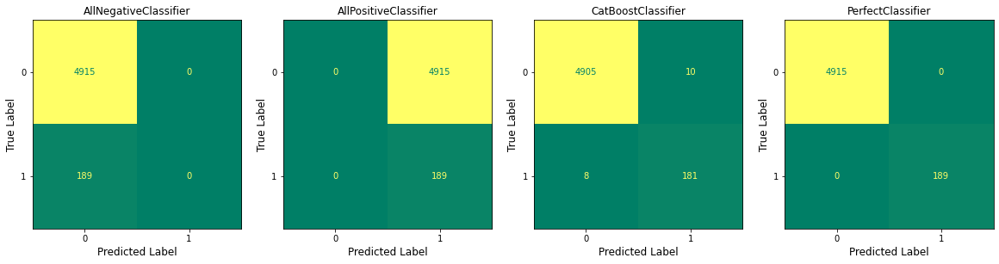

In [69]:
from sklearn.metrics import ConfusionMatrixDisplay

best_model = CatBoostClassifier(depth = 4, learning_rate = 0.1)
best_model.fit(X_trainval, y_trainval)
y_pred = best_model.predict(X_holdout)

eval_dict = {
    'AllNegativeClassifier': np.zeros(y_holdout.shape),
    'AllPositiveClassifier' : np.ones(y_holdout.shape),
    'CatBoostClassifier': y_pred,
    'PerfectClassifier': y_holdout
}

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for index, (model_name, preds) in tqdm(enumerate(eval_dict.items())):
    ConfusionMatrixDisplay.from_predictions(y_holdout, preds, 
                                            ax=axes[index], cmap='summer',
                                            colorbar=False)
    axes[index].set_title(model_name, fontsize=12)
    axes[index].set_xlabel('Predicted Label', fontsize=12)
    axes[index].set_ylabel('True Label', fontsize=12)

In [77]:
#helper function
def plot_ROC(best_model,X_trainval,y_trainval):
    fig, ax = plt.subplots(figsize=(4,4))
    plot_roc_curve(best_model,X_trainval,y_trainval, ax=ax)
    #y=x line
    ax.plot([0, 1], [0, 1],'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    #edit verbose legend
    default_legend = ax.get_legend_handles_labels()[1][0]
    ax.legend(labels=[default_legend.split(' (')[-1][:-1]],loc='lower right')


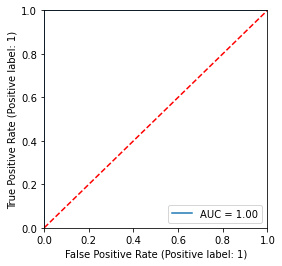

In [78]:
plot_ROC(model,X_trainval,y_trainval)

In [80]:
import pickle

In [ ]:
# pickle.dump(best_model, open('model.pkl', 'wb'))